<h1>1. Business Problem </h1>

<h2> 1.1 Problem Description </h2>

<p>
Netflix is all about connecting people to the movies they love. To help customers find those movies, they developed world-class movie recommendation system: CinematchSM. Its job is to predict whether someone will enjoy a movie based on how much they liked or disliked other movies. Netflix use those predictions to make personal movie recommendations based on each customer’s unique tastes. And while <b>Cinematch</b> is doing pretty well, it can always be made better.
</p>
<p>Now there are a lot of interesting alternative approaches to how Cinematch works that netflix haven’t tried. Some are described in the literature, some aren’t. We’re curious whether any of these can beat Cinematch by making better predictions. Because, frankly, if there is a much better approach it could make a big difference to our customers and our business.</p>

<h2> 1.2 Problem Statement </h2>

<p>
Netflix provided a lot of anonymous rating data, and a prediction accuracy bar that is 10% better than what Cinematch can do on the same training data set. (Accuracy is a measurement of how closely predicted ratings of movies match subsequent actual ratings.) 
</p>

<h2> 1.3 Sources </h2>

<ul>
<li> https://www.kaggle.com/netflix-inc/netflix-prize-data</li>

</ul>

<h2>1.4 Real world/Business Objectives and constraints  </h2>

Objectives:
1. Predict the rating that a user would give to a movie that he ahs not yet rated.
2. Minimize the difference between predicted and actual rating (RMSE and MAPE)
<br>

Constraints:
1. Some form of interpretability.

<h1> 2. Machine Learning Problem </h1>

<h2>2.1 Data </h2>

<h3> 2.1.1 Data Overview </h3>

<p> Data files : 
<ul> 
<li> combined_data_1.txt </li>
<li> combined_data_2.txt </li>
<li> combined_data_3.txt </li>
<li> combined_data_4.txt </li>
<li> movie_titles.csv </li>
</ul>
<pre>  
The first line of each file [combined_data_1.txt, combined_data_2.txt, combined_data_3.txt, combined_data_4.txt] contains the movie id followed by a colon. Each subsequent line in the file corresponds to a rating from a customer and its date in the following format:

CustomerID,Rating,Date

MovieIDs range from 1 to 17770 sequentially.
CustomerIDs range from 1 to 2649429, with gaps. There are 480189 users.
Ratings are on a five star (integral) scale from 1 to 5.
Dates have the format YYYY-MM-DD.
</pre>

<h2>2.2 Mapping the real world problem to a Machine Learning Problem </h2>

<h3> 2.2.1 Type of Machine Learning Problem </h3>

<pre>
For a given movie and user we need to predict the rating would be given by him/her to the movie. 
The given problem is a Recommendation problem 
It can also seen as a Regression problem 
</pre>

<h3> 2.2.2 Performance metric </h3>

<ul>
<li> Mean Absolute Percentage Error: https://en.wikipedia.org/wiki/Mean_absolute_percentage_error </li>
<li> Root Mean Square Error: https://en.wikipedia.org/wiki/Root-mean-square_deviation </li>
</ul>


<h3> 2.2.3 Machine Learning Objective and Constraints </h3>

1. Minimize RMSE.
2. Try to provide some interpretability.

In [1]:
# this is just to know how much time will it take to run this entire ipython notebook 
from datetime import datetime
#globalstart = datetime.now()
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use('nbagg')

import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})

import seaborn as sns
sns.set_style('whitegrid')
import os
from scipy import sparse
from scipy.sparse import csr_matrix

from sklearn.decomposition import TruncatedSVD
from sklearn.metrics.pairwise import cosine_similarity
import random

<h1> 3. Exploratory Data Analysis </h1>

<h2> 3.1 Preprocessing</h2> 

<h3>3.1.1 Converting / Merging whole data to required format: u_i, m_j, r_ij</h3>

In [2]:
start = datetime.now()
if not os.path.isfile('data_nre.csv'):
    # Create a file 'data.csv' before reading it
    # Read all the files in netflix and store them in one big file('data.csv')
    # reading from each of the four files and appending each rating to a global file 'train.csv'
    data = open('data_nre.csv', mode='w')
    print(1)
    
    row = list()
    files=['data/Netflix Prize data/combined_data_1.txt','data/Netflix Prize data/combined_data_2.txt', 
           'data/Netflix Prize data/combined_data_3.txt', 'data/Netflix Prize data/combined_data_4.txt']
    print(2)
    for file in files:
        print("Reading ratings from {}...".format(file))
        with open(file) as f:
            for line in f: 
                del row[:]
                line = line.strip()
                if line.endswith(':'):
                    # All below are ratings for this movie, until another movie appears.
                    movie_id = line.replace(':', '')
                else:
                    row = [x for x in line.split(',')]
                    row.insert(0, movie_id)
                    data.write(','.join(row))
                    data.write('\n')
        print("Done.\n")
    data.close()
print('Time taken :', datetime.now() - start)

Time taken : 0:00:00


In [3]:
print("creating the dataframe from data_nre.csv file..")
df = pd.read_csv('data_nre.csv', sep=',', 
                       names=['movie', 'user','rating','date'])
df.date = pd.to_datetime(df.date)
print('Done.\n')

# arranging the ratings according to time.
print('Sorting the dataframe by date..')
df.sort_values(by='date', inplace=True)
print('Done..')

creating the dataframe from data_nre.csv file..
Done.

Sorting the dataframe by date..
Done..


In [4]:
df.head()

,movie,user,rating,date
56431994,10341,510180,4,1999-11-11
9056171,1798,510180,5,1999-11-11
58698779,10774,510180,3,1999-11-11
48101611,8651,510180,2,1999-11-11
81893208,14660,510180,2,1999-11-11


In [5]:
df.describe()['rating']

count    1.004805e+08
mean     3.604290e+00
std      1.085219e+00
min      1.000000e+00
25%      3.000000e+00
50%      4.000000e+00
75%      4.000000e+00
max      5.000000e+00
Name: rating, dtype: float64

<h3>3.1.2 Checking for NaN values </h3>

In [6]:
# just to make sure that all Nan containing rows are deleted..
print("No of Nan values in our dataframe : ", sum(df.isnull().any()))

No of Nan values in our dataframe :  0


<h3>3.1.3 Removing Duplicates </h3>

In [7]:
dup_bool = df.duplicated(['movie','user','rating'])
dups = sum(dup_bool) # by considering all columns..( including timestamp)
print("There are {} duplicate rating entries in the data..".format(dups))

There are 0 duplicate rating entries in the data..


 <h3>3.1.4 Basic Statistics (#Ratings, #Users, and #Movies)</h3>

In [8]:
print("Total data ")
print("-"*50)
print("\nTotal no of ratings :",df.shape[0])
print("Total No of Users   :", len(np.unique(df.user)))
print("Total No of movies  :", len(np.unique(df.movie)))

Total data 
--------------------------------------------------

Total no of ratings : 100480507
Total No of Users   : 480189
Total No of movies  : 17770


<h2>3.2 Spliting data into Train and Test(80:20) </h2>

In [9]:
if not os.path.isfile('train.csv'):
    # create the dataframe and store it in the disk for offline purposes..
    df.iloc[:int(df.shape[0]*0.80)].to_csv("train.csv", index=False)

if not os.path.isfile('test.csv'):
    # create the dataframe and store it in the disk for offline purposes..
    df.iloc[int(df.shape[0]*0.80):].to_csv("test.csv", index=False)

train_df = pd.read_csv("train.csv", parse_dates=['date'])
test_df = pd.read_csv("test.csv")

<h3>3.2.1 Basic Statistics in Train data (#Ratings, #Users, and #Movies)</h3>

In [10]:
# movies = train_df.movie.value_counts()
# users = train_df.user.value_counts()
print("Training data ")
print("-"*50)
print("\nTotal no of ratings :",train_df.shape[0])
print("Total No of Users   :", len(np.unique(train_df.user)))
print("Total No of movies  :", len(np.unique(train_df.movie)))

Training data 
--------------------------------------------------

Total no of ratings : 80384405
Total No of Users   : 405041
Total No of movies  : 17424


<h3>3.2.2 Basic Statistics in Test data (#Ratings, #Users, and #Movies)</h3>

In [11]:
print("Test data ")
print("-"*50)
print("\nTotal no of ratings :",test_df.shape[0])
print("Total No of Users   :", len(np.unique(test_df.user)))
print("Total No of movies  :", len(np.unique(test_df.movie)))

Test data 
--------------------------------------------------

Total no of ratings : 20096102
Total No of Users   : 349312
Total No of movies  : 17757


 <h2> 3.3 Exploratory Data Analysis on Train data </h2>

In [12]:
# method to make y-axis more readable
def human(num, units = 'M'):
    units = units.lower()
    num = float(num)
    if units == 'k':
        return str(num/10**3) + " K"
    elif units == 'm':
        return str(num/10**6) + " M"
    elif units == 'b':
        return str(num/10**9) +  " B"

<h3> 3.3.1 Distribution of ratings </h3>

<IPython.core.display.Javascript object>


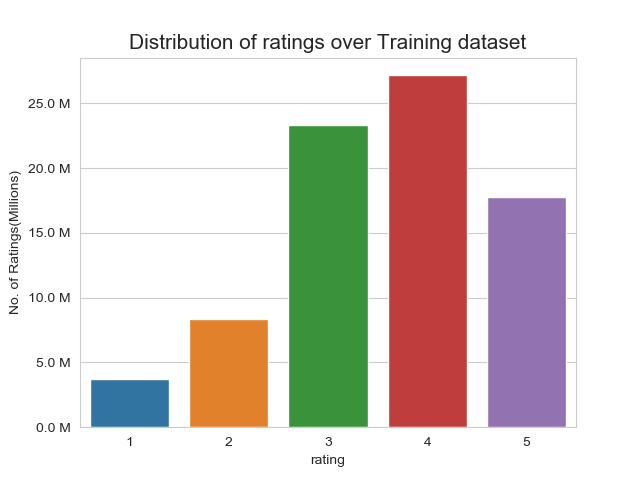

In [100]:
fig, ax = plt.subplots()
plt.title('Distribution of ratings over Training dataset', fontsize=15)
sns.countplot(train_df.rating)
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
ax.set_ylabel('No. of Ratings(Millions)')

plt.show()

<p style="font-size:13px"> <b>Add new column (week day) to the data set  for analysis.</b></p>

In [14]:
# It is used to skip the warning ''SettingWithCopyWarning''.. 
pd.options.mode.chained_assignment = None  # default='warn'

train_df['day_of_week'] = train_df.date.dt.weekday_name

train_df.tail()

,movie,user,rating,date,day_of_week
80384400,12074,2033618,4,2005-08-08,Monday
80384401,862,1797061,3,2005-08-08,Monday
80384402,10986,1498715,5,2005-08-08,Monday
80384403,14861,500016,4,2005-08-08,Monday
80384404,5926,1044015,5,2005-08-08,Monday


<h3> 3.3.2 Number of Ratings per a month </h3>

<IPython.core.display.Javascript object>


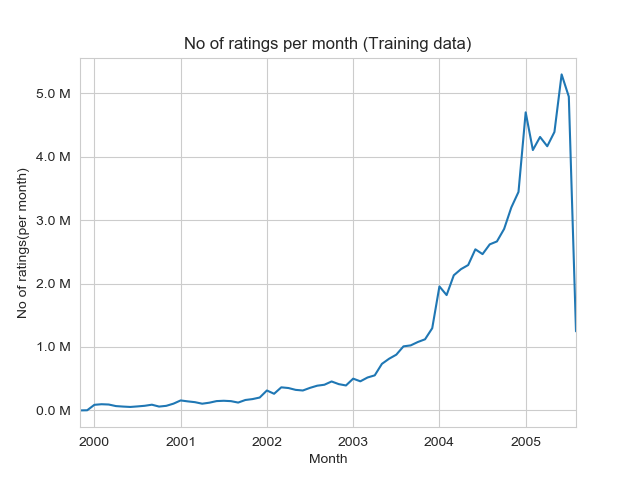

In [101]:
ax = train_df.resample('m', on='date')['rating'].count().plot()
ax.set_title('No of ratings per month (Training data)')
plt.xlabel('Month')
plt.ylabel('No of ratings(per month)')
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
plt.show()

<h3> 3.3.3 Analysis on the Ratings given by user </h3>

In [16]:
no_of_rated_movies_per_user = train_df.groupby(by='user')['rating'].count().sort_values(ascending=False)

no_of_rated_movies_per_user.head()

user
305344     17112
2439493    15896
387418     15402
1639792     9767
1461435     9447
Name: rating, dtype: int64

<IPython.core.display.Javascript object>


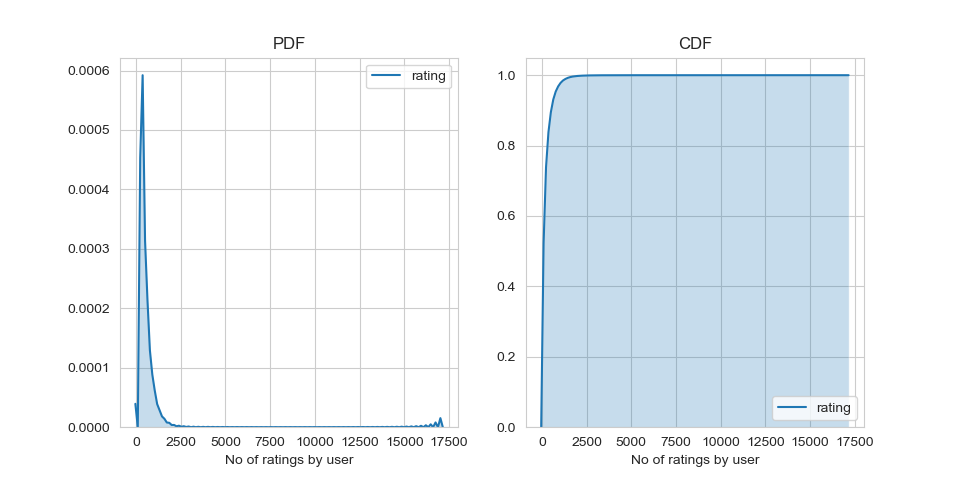

In [99]:
fig = plt.figure(figsize=plt.figaspect(.5))

ax1 = plt.subplot(121)
sns.kdeplot(no_of_rated_movies_per_user, shade=True, ax=ax1)
plt.xlabel('No of ratings by user')
plt.title("PDF")

ax2 = plt.subplot(122)
sns.kdeplot(no_of_rated_movies_per_user, shade=True, cumulative=True,ax=ax2)
plt.xlabel('No of ratings by user')
plt.title('CDF')

plt.show()

In [18]:
no_of_rated_movies_per_user.describe()

count    405041.000000
mean        198.459921
std         290.793238
min           1.000000
25%          34.000000
50%          89.000000
75%         245.000000
max       17112.000000
Name: rating, dtype: float64

> _There,  is something interesting going on with the quantiles.._

In [19]:
quantiles = no_of_rated_movies_per_user.quantile(np.arange(0,1.01,0.01), interpolation='higher')

<IPython.core.display.Javascript object>


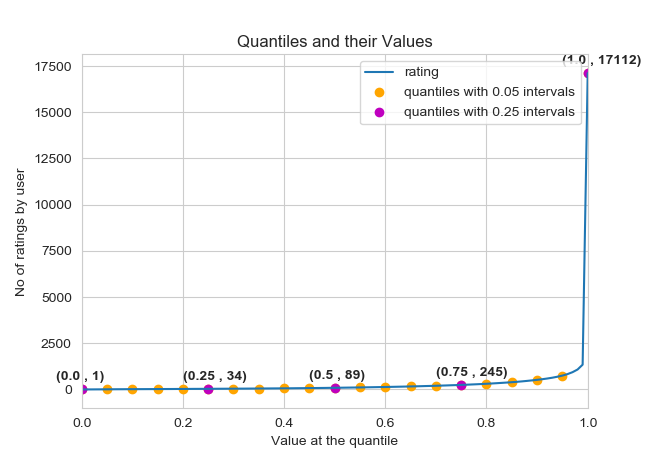

In [113]:
plt.title("Quantiles and their Values")
quantiles.plot()
# quantiles with 0.05 difference
plt.scatter(x=quantiles.index[::5], y=quantiles.values[::5], c='orange', label="quantiles with 0.05 intervals")
# quantiles with 0.25 difference
plt.scatter(x=quantiles.index[::25], y=quantiles.values[::25], c='m', label = "quantiles with 0.25 intervals")
plt.ylabel('No of ratings by user')
plt.xlabel('Value at the quantile')
plt.legend(loc='best')

# annotate the 25th, 50th, 75th and 100th percentile values....
for x,y in zip(quantiles.index[::25], quantiles[::25]):
    plt.annotate(s="({} , {})".format(x,y), xy=(x,y), xytext=(x-0.05, y+500)
                ,fontweight='bold')


plt.show()

In [21]:
quantiles[::5]

0.00        1
0.05        7
0.10       15
0.15       21
0.20       27
0.25       34
0.30       41
0.35       50
0.40       60
0.45       73
0.50       89
0.55      109
0.60      133
0.65      163
0.70      199
0.75      245
0.80      307
0.85      392
0.90      520
0.95      749
1.00    17112
Name: rating, dtype: int64

__how many ratings at the last 5% of all ratings__??

In [22]:
print('\n No of ratings at last 5 percentile : {}\n'.format(sum(no_of_rated_movies_per_user>= 749)) )


 No of ratings at last 5 percentile : 20305



<h3> 3.3.4 Analysis of ratings of a movie given by a user </h3>

<IPython.core.display.Javascript object>


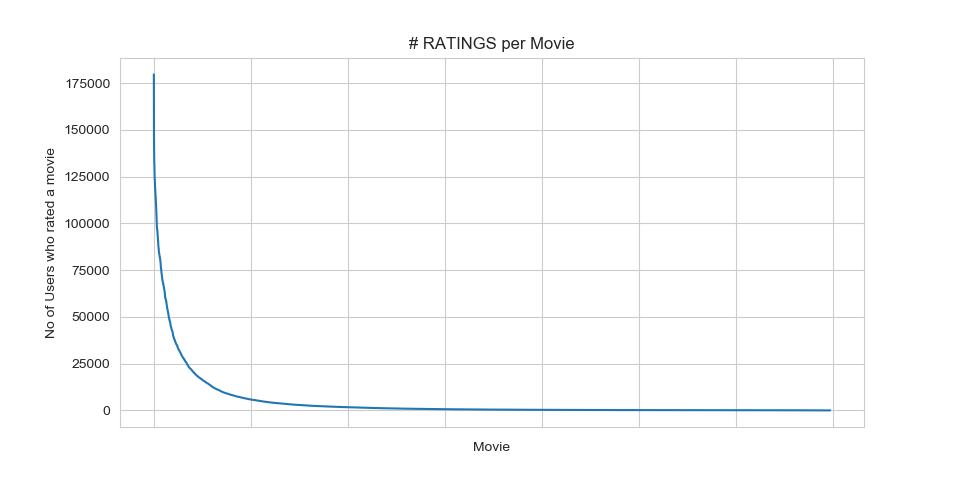

In [103]:
no_of_ratings_per_movie = train_df.groupby(by='movie')['rating'].count().sort_values(ascending=False)

fig = plt.figure(figsize=plt.figaspect(.5))
ax = plt.gca()
plt.plot(no_of_ratings_per_movie.values)
plt.title('# RATINGS per Movie')
plt.xlabel('Movie')
plt.ylabel('No of Users who rated a movie')
ax.set_xticklabels([])

plt.show()

- __It is very skewed.. just like nunmber of ratings given per user.__
    
    
    - There are some movies (which are very popular) which are rated by huge number of users.
    
    - But most of the movies(like 90%) got some hundereds of ratings.

<h3> 3.3.5 Number of ratings on each day of the week</h3>

<IPython.core.display.Javascript object>


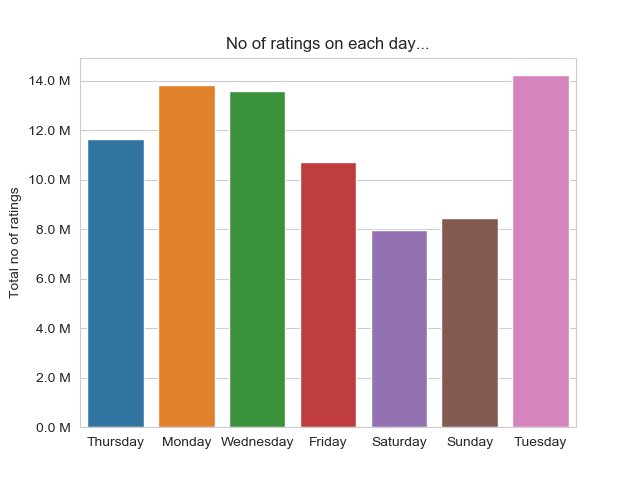

In [104]:
fig, ax = plt.subplots()
sns.countplot(x='day_of_week', data=train_df, ax=ax)
plt.title('No of ratings on each day...')
plt.ylabel('Total no of ratings')
plt.xlabel('')
ax.set_yticklabels([human(item, 'M') for item in ax.get_yticks()])
plt.show()

<IPython.core.display.Javascript object>


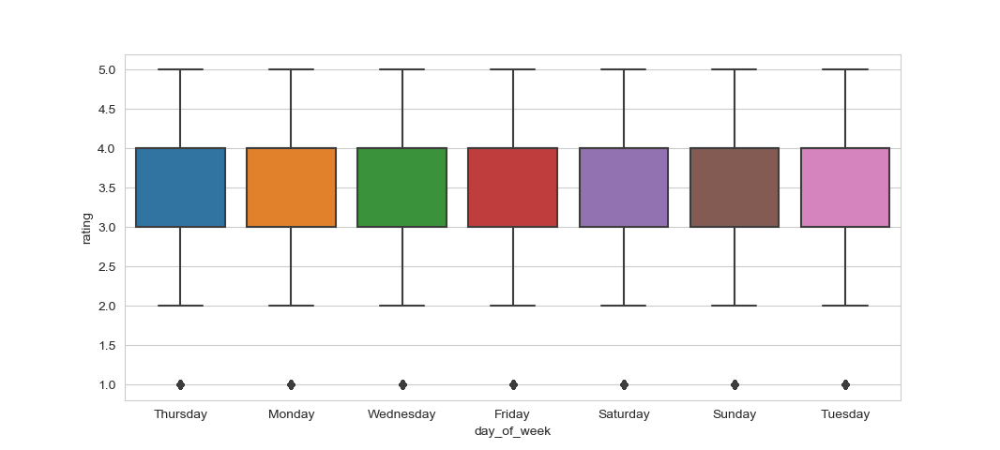

0:00:10.297310


In [105]:
start = datetime.now()
fig = plt.figure(figsize=plt.figaspect(.45))
sns.boxplot(y='rating', x='day_of_week', data=train_df)
plt.show()
print(datetime.now() - start)

In [26]:
avg_week_df = train_df.groupby(by=['day_of_week'])['rating'].mean()
print(" AVerage ratings")
print("-"*30)
print(avg_week_df)
print("\n")

 AVerage ratings
------------------------------
day_of_week
Friday       3.585274
Monday       3.577250
Saturday     3.591791
Sunday       3.594144
Thursday     3.582463
Tuesday      3.574438
Wednesday    3.583751
Name: rating, dtype: float64




<h3> 3.3.6 Creating sparse matrix from data frame </h3>

<h4> 3.3.6.1 Creating sparse matrix from train data frame </h4>

In [27]:
start = datetime.now()
if os.path.isfile('train_sparse_matrix.npz'):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    train_sparse_matrix = sparse.load_npz('train_sparse_matrix.npz')
    print("DONE..")
else: 
    print("We are creating sparse_matrix from the dataframe..")
    # create sparse_matrix and store it for after usage.
    # csr_matrix(data_values, (row_index, col_index), shape_of_matrix)
    # It should be in such a way that, MATRIX[row, col] = data
    train_sparse_matrix = sparse.csr_matrix((train_df.rating.values, (train_df.user.values,
                                               train_df.movie.values)),)
    
    print('Done. It\'s shape is : (user, movie) : ',train_sparse_matrix.shape)
    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz("train_sparse_matrix.npz", train_sparse_matrix)
    print('Done..\n')

print(datetime.now() - start)

We are creating sparse_matrix from the dataframe..
Done. It's shape is : (user, movie) :  (2649430, 17771)
Saving it into disk for furthur usage..
Done..

0:00:43.567837


<p><b>The Sparsity of Train Sparse Matrix</b></p>

In [28]:
us,mv = train_sparse_matrix.shape
elem = train_sparse_matrix.count_nonzero()

print("Sparsity Of Train matrix : {} % ".format(  (1-(elem/(us*mv))) * 100) )

Sparsity Of Train matrix : 99.8292709259195 % 


<h4> 3.3.6.2 Creating sparse matrix from test data frame </h4>

In [29]:
start = datetime.now()
if os.path.isfile('test_sparse_matrix.npz'):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    test_sparse_matrix = sparse.load_npz('test_sparse_matrix.npz')
    print("DONE..")
else: 
    print("We are creating sparse_matrix from the dataframe..")
    # create sparse_matrix and store it for after usage.
    # csr_matrix(data_values, (row_index, col_index), shape_of_matrix)
    # It should be in such a way that, MATRIX[row, col] = data
    test_sparse_matrix = sparse.csr_matrix((test_df.rating.values, (test_df.user.values,
                                               test_df.movie.values)))
    
    print('Done. It\'s shape is : (user, movie) : ',test_sparse_matrix.shape)
    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz("test_sparse_matrix.npz", test_sparse_matrix)
    print('Done..\n')
    
print(datetime.now() - start)

We are creating sparse_matrix from the dataframe..
Done. It's shape is : (user, movie) :  (2649430, 17771)
Saving it into disk for furthur usage..
Done..

0:00:11.765505


<p><b>The Sparsity of Test data Matrix</b></p>

In [30]:
us,mv = test_sparse_matrix.shape
elem = test_sparse_matrix.count_nonzero()

print("Sparsity Of Test matrix : {} % ".format(  (1-(elem/(us*mv))) * 100) )

Sparsity Of Test matrix : 99.95731772988694 % 


<h3>3.3.7 Finding Global average of all movie ratings, Average rating per user, and Average rating per movie</h3>

In [31]:
# get the user averages in dictionary (key: user_id/movie_id, value: avg rating)

def get_average_ratings(sparse_matrix, of_users):
    
    # average ratings of user/axes
    ax = 1 if of_users else 0 # 1 - User axes,0 - Movie axes

    # ".A1" is for converting Column_Matrix to 1-D numpy array 
    sum_of_ratings = sparse_matrix.sum(axis=ax).A1
    # Boolean matrix of ratings ( whether a user rated that movie or not)
    is_rated = sparse_matrix!=0
    # no of ratings that each user OR movie..
    no_of_ratings = is_rated.sum(axis=ax).A1
    
    # max_user  and max_movie ids in sparse matrix 
    u,m = sparse_matrix.shape
    # creae a dictonary of users and their average ratigns..
    average_ratings = { i : sum_of_ratings[i]/no_of_ratings[i]
                                 for i in range(u if of_users else m) 
                                    if no_of_ratings[i] !=0}

    # return that dictionary of average ratings
    return average_ratings

<h4> 3.3.7.1 finding global average of all movie ratings </h4>

In [32]:
train_averages = dict()
# get the global average of ratings in our train set.
train_global_average = train_sparse_matrix.sum()/train_sparse_matrix.count_nonzero()
train_averages['global'] = train_global_average
train_averages

{'global': 3.582890686321557}

<h4> 3.3.7.2 finding average rating per user</h4>

In [33]:
train_averages['user'] = get_average_ratings(train_sparse_matrix, of_users=True)
print('\nAverage rating of user 10 :',train_averages['user'][10])


Average rating of user 10 : 3.3781094527363185


<h4> 3.3.7.3 finding average rating per movie</h4>

In [34]:
train_averages['movie'] =  get_average_ratings(train_sparse_matrix, of_users=False)
print('\n AVerage rating of movie 15 :',train_averages['movie'][15])


 AVerage rating of movie 15 : 3.3038461538461537


<h4> 3.3.7.4 PDF's & CDF's of Avg.Ratings of Users & Movies (In Train Data)</h4>

<IPython.core.display.Javascript object>


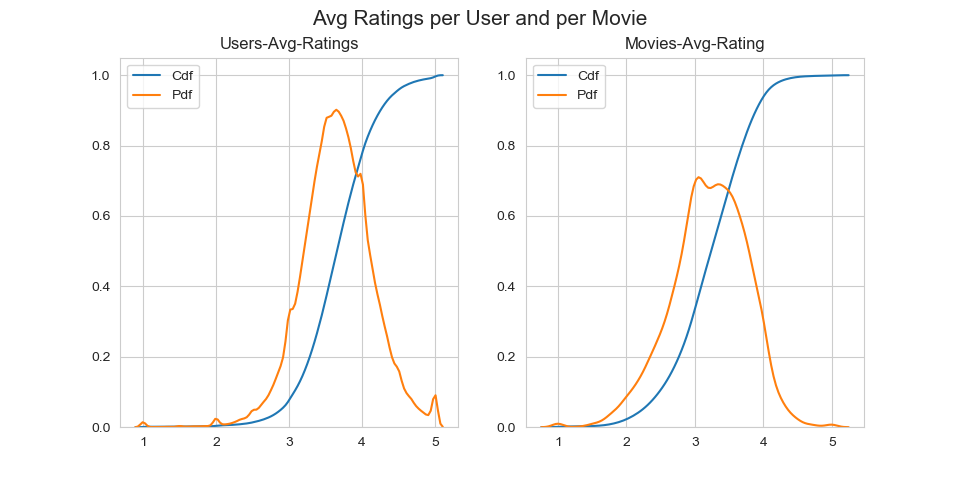

0:00:40.317923


In [106]:
start = datetime.now()
# draw pdfs for average rating per user and average
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=plt.figaspect(.5))
fig.suptitle('Avg Ratings per User and per Movie', fontsize=15)

ax1.set_title('Users-Avg-Ratings')
# get the list of average user ratings from the averages dictionary..
user_averages = [rat for rat in train_averages['user'].values()]
sns.distplot(user_averages, ax=ax1, hist=False, 
             kde_kws=dict(cumulative=True), label='Cdf')
sns.distplot(user_averages, ax=ax1, hist=False,label='Pdf')

ax2.set_title('Movies-Avg-Rating')
# get the list of movie_average_ratings from the dictionary..
movie_averages = [rat for rat in train_averages['movie'].values()]
sns.distplot(movie_averages, ax=ax2, hist=False, 
             kde_kws=dict(cumulative=True), label='Cdf')
sns.distplot(movie_averages, ax=ax2, hist=False, label='Pdf')

plt.show()
print(datetime.now() - start)

<h3> 3.3.8 Cold Start problem </h3>

<h4> 3.3.8.1 Cold Start problem with Users</h4>

In [36]:
total_users = len(np.unique(df.user))
users_train = len(train_averages['user'])
new_users = total_users - users_train

print('\nTotal number of Users  :', total_users)
print('\nNumber of Users in Train data :', users_train)
print("\nNo of Users that didn't appear in train data: {}({} %) \n ".format(new_users,
                                                                        np.round((new_users/total_users)*100, 2)))


Total number of Users  : 480189

Number of Users in Train data : 405041

No of Users that didn't appear in train data: 75148(15.65 %) 
 


> We might have to handle __new users__ ( ___75148___ ) who didn't appear in train data.

<h4> 3.3.8.2 Cold Start problem with Movies</h4>

In [37]:
total_movies = len(np.unique(df.movie))
movies_train = len(train_averages['movie'])
new_movies = total_movies - movies_train

print('\nTotal number of Movies  :', total_movies)
print('\nNumber of Users in Train data :', movies_train)
print("\nNo of Movies that didn't appear in train data: {}({} %) \n ".format(new_movies,
                                                                        np.round((new_movies/total_movies)*100, 2)))


Total number of Movies  : 17770

Number of Users in Train data : 17424

No of Movies that didn't appear in train data: 346(1.95 %) 
 


> We might have to handle __346 movies__ (small comparatively) in test data

<h2> 3.4 Computing Similarity matrices </h2>

<h3> 3.4.1 Computing User-User Similarity matrix </h3>

1. Calculating User User Similarity_Matrix is __not very easy__(_unless you have huge Computing Power and lots of time_) because of number of. users being here.

    * System could crash or the program stops with **Memory Error**


<h4> 3.4.1.1 Trying with all dimensions (17k dimensions per user) </h4>

In [107]:
from sklearn.metrics.pairwise import cosine_similarity


def compute_user_similarity(sparse_matrix, compute_for_few=False, top = 100, verbose=False, verb_for_n_rows = 20,
                            draw_time_taken=True):
    no_of_users, _ = sparse_matrix.shape
    # get the indices of  non zero rows(users) from our sparse matrix
    row_ind, col_ind = sparse_matrix.nonzero()
    row_ind = sorted(set(row_ind)) # we don't have to
    time_taken = list() #  time taken for finding similar users for an user..
    
    # we create rows, cols, and data lists.., which can be used to create sparse matrices
    rows, cols, data = list(), list(), list()
    if verbose: print("Computing top",top,"similarities for each user..")
    
    start = datetime.now()
    temp = 0
    
    for row in row_ind[:top] if compute_for_few else row_ind:
        temp = temp+1
        prev = datetime.now()
        
        # get the similarity row for this user with all other users
        sim = cosine_similarity(sparse_matrix.getrow(row), sparse_matrix).ravel()
        # We will get only the top ''top'' most similar users and ignore rest of them..
        top_sim_ind = sim.argsort()[-top:]
        top_sim_val = sim[top_sim_ind]
        
        # add them to our rows, cols and data
        rows.extend([row]*top)
        cols.extend(top_sim_ind)
        data.extend(top_sim_val)
        time_taken.append(datetime.now().timestamp() - prev.timestamp())
        if verbose:
            if temp%verb_for_n_rows == 0:
                print("computing done for {} users [  time elapsed : {}  ]"
                      .format(temp, datetime.now()-start))
            
        
    # lets create sparse matrix out of these and return it
    if verbose: print('Creating Sparse matrix from the computed similarities')
    #return rows, cols, data
    
    if draw_time_taken:
        plt.plot(time_taken, label = 'time taken for each user')
        plt.plot(np.cumsum(time_taken), label='Total time')
        plt.legend(loc='best')
        plt.xlabel('User')
        plt.ylabel('Time (seconds)')
        plt.show()
        
    return sparse.csr_matrix((data, (rows, cols)), shape=(no_of_users, no_of_users)), time_taken      

In [39]:
start = datetime.now()
u_u_sim_sparse, _ = compute_user_similarity(train_sparse_matrix, compute_for_few=True, top = 100,
                                                     verbose=True)
print("-"*100)
print("Time taken :",datetime.now()-start)

Computing top 100 similarities for each user..
computing done for 20 users [  time elapsed : 0:00:55.084251  ]
computing done for 40 users [  time elapsed : 0:01:50.671017  ]
computing done for 60 users [  time elapsed : 0:02:43.241537  ]
computing done for 80 users [  time elapsed : 0:03:36.041351  ]
computing done for 100 users [  time elapsed : 0:04:29.780422  ]
Creating Sparse matrix from the computed similarities


<IPython.core.display.Javascript object>

----------------------------------------------------------------------------------------------------
Time taken : 0:04:41.469136


<h4> 3.4.1.2 Trying with reduced dimensions (Using TruncatedSVD for dimensionality reduction of user vector)</h4>

* We have  **405,041 users** in out training set and computing similarities between them..( **17K dimensional vector..**) is time consuming..


- From above plot, It took roughly __8.88 sec__ for computing simlilar users for __one user__
    
    
- We have __405,041 users__ with us in training set.


- ${ 405041 \times 8.88 = 3596764.08  \sec } =  59946.068 \min = 999.101133333 \text{ hours}
= 41.629213889 \text{ days}...$

    - Even if we run on 4 cores parallelly (a typical system now a days), It will still take almost __10 and 1/2__ days.
    
 IDEA:  Instead, we will try to reduce the dimentsions using SVD, so that __it might__ speed up the process...

In [40]:
'''
from datetime import datetime
from sklearn.decomposition import TruncatedSVD

start = datetime.now()

# initilaize the algorithm with some parameters..
# All of them are default except n_components. n_itr is for Randomized SVD solver.
netflix_svd = TruncatedSVD(n_components=500, algorithm='randomized', random_state=15)
print(1)
trunc_svd = netflix_svd.fit_transform(train_sparse_matrix)
print("Done...")
print(datetime.now()-start)

from datetime import datetime
from sklearn.decomposition import TruncatedSVD



expl_var = np.cumsum(netflix_svd.explained_variance_ratio_)



fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=plt.figaspect(.5))

ax1.set_ylabel("Variance Explained", fontsize=15)
ax1.set_xlabel("# Latent Facors", fontsize=15)
ax1.plot(expl_var)
# annote some (latentfactors, expl_var) to make it clear
ind = [1, 2,4,8,20, 60, 100, 200, 300, 400, 500]
ax1.scatter(x = [i-1 for i in ind], y = expl_var[[i-1 for i in ind]], c='#ff3300')
for i in ind:
    ax1.annotate(s ="({}, {})".format(i,  np.round(expl_var[i-1], 2)), xy=(i-1, expl_var[i-1]),
                xytext = ( i+20, expl_var[i-1] - 0.01), fontweight='bold')

change_in_expl_var = [expl_var[i+1] - expl_var[i] for i in range(len(expl_var)-1)]
ax2.plot(change_in_expl_var)



ax2.set_ylabel("Gain in Var_Expl with One Additional LF", fontsize=10)
ax2.yaxis.set_label_position("right")
ax2.set_xlabel("# Latent Facors", fontsize=20)

plt.show()



for i in ind:
    print("({}, {})".format(i, np.round(expl_var[i-1], 2)))
    
    
    
# Let's project our Original U_M matrix into into 500 Dimensional space...
start = datetime.now()
trunc_matrix = train_sparse_matrix.dot(netflix_svd.components_.T)
print(datetime.now()- start)



type(trunc_matrix), trunc_matrix.shape



if not os.path.isfile('trunc_sparse_matrix.npz'):
    # create that sparse sparse matrix
    trunc_sparse_matrix = sparse.csr_matrix(trunc_matrix)
    # Save this truncated sparse matrix for later usage..
    sparse.save_npz('trunc_sparse_matrix', trunc_sparse_matrix)
else:
    trunc_sparse_matrix = sparse.load_npz('trunc_sparse_matrix.npz')
    
    
    
trunc_sparse_matrix.shape 




start = datetime.now()
trunc_u_u_sim_matrix, _ = compute_user_similarity(trunc_sparse_matrix, compute_for_few=True, top=50, verbose=True, 
                                                 verb_for_n_rows=10)
print("-"*50)
print("time:",datetime.now()-start)
'''

'\nfrom datetime import datetime\nfrom sklearn.decomposition import TruncatedSVD\n\nstart = datetime.now()\n\n# initilaize the algorithm with some parameters..\n# All of them are default except n_components. n_itr is for Randomized SVD solver.\nnetflix_svd = TruncatedSVD(n_components=500, algorithm=\'randomized\', random_state=15)\nprint(1)\ntrunc_svd = netflix_svd.fit_transform(train_sparse_matrix)\nprint("Done...")\nprint(datetime.now()-start)\n\nfrom datetime import datetime\nfrom sklearn.decomposition import TruncatedSVD\n\n\n\nexpl_var = np.cumsum(netflix_svd.explained_variance_ratio_)\n\n\n\nfig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=plt.figaspect(.5))\n\nax1.set_ylabel("Variance Explained", fontsize=15)\nax1.set_xlabel("# Latent Facors", fontsize=15)\nax1.plot(expl_var)\n# annote some (latentfactors, expl_var) to make it clear\nind = [1, 2,4,8,20, 60, 100, 200, 300, 400, 500]\nax1.scatter(x = [i-1 for i in ind], y = expl_var[[i-1 for i in ind]], c=\'#ff3300\')\nfor

Here,


- $\sum \longleftarrow$ (netflix\_svd.**singular\_values\_** )


- $\bigvee^T \longleftarrow$ (netflix\_svd.**components_**)


- $\bigcup$ is not returned. instead **Projection_of_X** onto the new vectorspace is returned. 


- It uses **randomized svd** internally, which returns **All 3 of them saperately**. Use that instead.. 

 
> I think 500 dimensions is good enough 

---------

-  By just taking __(20 to 30)__ latent factors, explained variance that we could get is __20 %__. 

- To take it to __60%__, we have to take  __almost 400 latent factors__. It is not fare.



- It basically is the __gain of variance explained__, if we ___add one additional latent factor to it.___


- By adding one by one latent factore too it, the ___gain in expained variance__ with that addition is decreasing. (Obviously, because they are sorted that way).
- ___LHS Graph___:
    - __x__ --- ( No of latent factos ),
    - __y__ --- ( The variance explained by taking x latent factors)



- __More decrease in the line (RHS graph) __:
    - We  are getting more expained variance than before.
- __Less decrease in that line (RHS graph)__  :
    - We are not getting benifitted from adding latent factor furthur. This is what is shown in the plots.


- ___RHS Graph___:
    - __x__ --- ( No of latent factors ),
    - __y__ --- ( Gain n Expl_Var by taking one additional latent factor) 

* Let's convert this to actual sparse matrix and store it for future purposes

**: This is taking more time for each user than Original one.**

- from above plot, It took almost __12.18__ for computing simlilar users for __one user__
    
    
- We have __405041 users__ with us in training set.


- ${ 405041 \times 12.18 ==== 4933399.38 \sec } ====  82223.323 \min ==== 1370.388716667 \text{ hours}
==== 57.099529861 \text{ days}...$

    - Even we run on 4 cores parallelly (a typical system now a days), It will still take almost __(14 - 15) __ days.


__Is there any other way to compute user user similarity..??__

-An alternative is to compute similar users for a particular user,  whenenver required (**ie., Run time**)
    - We maintain a binary Vector for users, which tells us whether we already computed or not..
    - ***If not*** : 
        - Compute top (let's just say, 1000) most similar users for this given user, and add this to our data structure, so that we can just access it(similar users) without recomputing it again.
        - 
    - ***If It is already Computed***:
        - Just get it directly from our data structure, which has that information.
        - In production time, We might have to recompute similarities, if it is computed a long time ago. Because user preferences changes over time. If we could maintain some kind of Timer, which when expires, we have to update it ( recompute it ). 
        - 
    - ***Which data structure to use:***
        - It is purely implementation dependant. 
        - One simple method is to maintain a **Dictionary Of Dictionaries**.
            - 
            - **key    :** _userid_ 
            - __value__: _Again a dictionary_
                - __key__  : _Similar User_
                - __value__: _Similarity Value_

<h3> 3.4.2 Computing Movie-Movie Similarity matrix </h3>

In [41]:
start = datetime.now()
if not os.path.isfile('m_m_sim_sparse.npz'):
    print("It seems you don't have that file. Computing movie_movie similarity...")
    start = datetime.now()
    m_m_sim_sparse = cosine_similarity(X=train_sparse_matrix.T, dense_output=False)
    print("Done..")
    # store this sparse matrix in disk before using it. For future purposes.
    print("Saving it to disk without the need of re-computing it again.. ")
    sparse.save_npz("m_m_sim_sparse.npz", m_m_sim_sparse)
    print("Done..")
else:
    print("It is there, We will get it.")
    m_m_sim_sparse = sparse.load_npz("m_m_sim_sparse.npz")
    print("Done ...")

print("It's a ",m_m_sim_sparse.shape," dimensional matrix")

print(datetime.now() - start)

It seems you don't have that file. Computing movie_movie similarity...
Done..
Saving it to disk without the need of re-computing it again.. 
Done..
It's a  (17771, 17771)  dimensional matrix
0:05:37.258234


In [42]:
m_m_sim_sparse.shape

(17771, 17771)

- Even though we have similarity measure of each movie, with all other movies, We generally don't care much about least similar movies.


- Most of the times, only top_xxx similar items matters. It may be 10 or 100.


- We take only those top similar movie ratings and store them  in a saperate dictionary.

In [43]:
movie_ids = np.unique(m_m_sim_sparse.nonzero()[1])

In [44]:
start = datetime.now()
similar_movies = dict()
for movie in movie_ids:
    # get the top similar movies and store them in the dictionary
    sim_movies = m_m_sim_sparse[movie].toarray().ravel().argsort()[::-1][1:]
    similar_movies[movie] = sim_movies[:100]
print(datetime.now() - start)

# just testing similar movies for movie_15
similar_movies[15]

0:00:20.513080


array([ 8279,  8013, 16528,  5927, 13105, 12049,  4424, 10193, 17590,
        4549,  3755,   590, 14059, 15144, 15054,  9584,  9071,  6349,
       16402,  3973,  1720,  5370, 16309,  9376,  6116,  4706,  2818,
         778, 15331,  1416, 12979, 17139, 17710,  5452,  2534,   164,
       15188,  8323,  2450, 16331,  9566, 15301, 13213, 14308, 15984,
       10597,  6426,  5500,  7068,  7328,  5720,  9802,   376, 13013,
        8003, 10199,  3338, 15390,  9688, 16455, 11730,  4513,   598,
       12762,  2187,   509,  5865,  9166, 17115, 16334,  1942,  7282,
       17584,  4376,  8988,  8873,  5921,  2716, 14679, 11947, 11981,
        4649,   565, 12954, 10788, 10220, 10963,  9427,  1690,  5107,
        7859,  5969,  1510,  2429,   847,  7845,  6410, 13931,  9840,
        3706], dtype=int64)

<h3> 3.4.3 Finding most similar movies using similarity matrix </h3>

__ Does Similarity really works as the way we expected...? __ <br>
_Let's pick some random movie and check for its similar movies...._

In [45]:
# First Let's load the movie details into soe dataframe..
# movie details are in 'netflix/movie_titles.csv'

movie_titles = pd.read_csv("data/Netflix Prize data/movie_titles.csv", sep=',', header = None,
                           names=['movie_id', 'year_of_release', 'title'], verbose=True,
                      index_col = 'movie_id', encoding = "ISO-8859-1")

movie_titles.head()

Tokenization took: 1.99 ms
Type conversion took: 9.97 ms
Parser memory cleanup took: 0.00 ms


,year_of_release,title
movie_id,,
1,2003.0,Dinosaur Planet
2,2004.0,Isle of Man TT 2004 Review
3,1997.0,Character
4,1994.0,Paula Abdul's Get Up & Dance
5,2004.0,The Rise and Fall of ECW


<p style='font-size:15px'><b>Similar Movies for 'Vampire Journals'</b></p>

In [46]:
mv_id = 67

print("\nMovie ----->",movie_titles.loc[mv_id].values[1])

print("\nIt has {} Ratings from users.".format(train_sparse_matrix[:,mv_id].getnnz()))

print("\nWe have {} movies which are similarto this  and we will get only top most..".format(m_m_sim_sparse[:,mv_id].getnnz()))


Movie -----> Vampire Journals

It has 270 Ratings from users.

We have 17284 movies which are similarto this  and we will get only top most..


In [47]:
similarities = m_m_sim_sparse[mv_id].toarray().ravel()

similar_indices = similarities.argsort()[::-1][1:]

similarities[similar_indices]

sim_indices = similarities.argsort()[::-1][1:] # It will sort and reverse the array and ignore its similarity (ie.,1)
                                               # and return its indices(movie_ids)

<IPython.core.display.Javascript object>


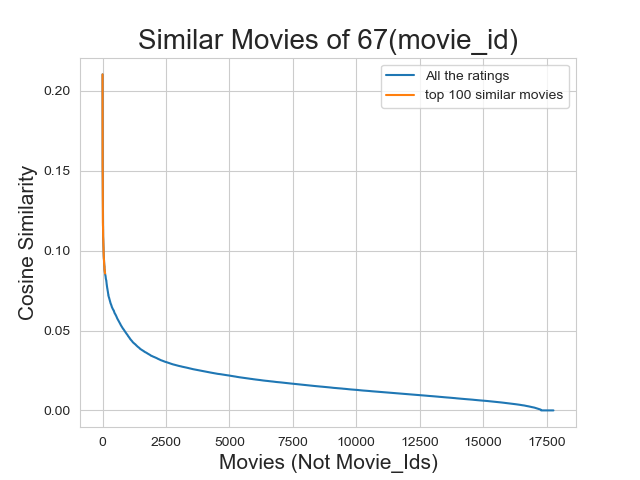

In [108]:
plt.plot(similarities[sim_indices], label='All the ratings')
plt.plot(similarities[sim_indices[:100]], label='top 100 similar movies')
plt.title("Similar Movies of {}(movie_id)".format(mv_id), fontsize=20)
plt.xlabel("Movies (Not Movie_Ids)", fontsize=15)
plt.ylabel("Cosine Similarity",fontsize=15)
plt.legend()
plt.show()

__Top 10 similar movies__

In [49]:
movie_titles.loc[sim_indices[:10]]

,year_of_release,title
movie_id,,
323,1999.0,Modern Vampires
4044,1998.0,Subspecies 4: Bloodstorm
1688,1993.0,To Sleep With a Vampire
13962,2001.0,Dracula: The Dark Prince
12053,1993.0,Dracula Rising
16279,2002.0,Vampires: Los Muertos
4667,1996.0,Vampirella
1900,1997.0,Club Vampire
13873,2001.0,The Breed


 > Similarly, we can ___find similar users___ and compare how similar they are. 

 <h1> 4.  Machine Learning Models </h1>

In [50]:
!pip install scikit-surprise

In [51]:
def get_sample_sparse_matrix(sparse_matrix, no_users, no_movies, path, verbose = True):
    """
        It will get it from the ''path'' if it is present  or It will create 
        and store the sampled sparse matrix in the path specified.
    """

    # get (row, col) and (rating) tuple from sparse_matrix...
    row_ind, col_ind, ratings = sparse.find(sparse_matrix)
    users = np.unique(row_ind)
    movies = np.unique(col_ind)

    print("Original Matrix : (users, movies) -- ({} {})".format(len(users), len(movies)))
    print("Original Matrix : Ratings -- {}\n".format(len(ratings)))

    # It just to make sure to get same sample everytime we run this program..
    # and pick without replacement....
    np.random.seed(15)
    sample_users = np.random.choice(users, no_users, replace=False)
    sample_movies = np.random.choice(movies, no_movies, replace=False)
    # get the boolean mask or these sampled_items in originl row/col_inds..
    mask = np.logical_and( np.isin(row_ind, sample_users),
                      np.isin(col_ind, sample_movies) )
    
    sample_sparse_matrix = sparse.csr_matrix((ratings[mask], (row_ind[mask], col_ind[mask])),
                                             shape=(max(sample_users)+1, max(sample_movies)+1))

    if verbose:
        print("Sampled Matrix : (users, movies) -- ({} {})".format(len(sample_users), len(sample_movies)))
        print("Sampled Matrix : Ratings --", format(ratings[mask].shape[0]))

    print('Saving it into disk for furthur usage..')
    # save it into disk
    sparse.save_npz(path, sample_sparse_matrix)
    if verbose:
            print('Done..\n')
    
    return sample_sparse_matrix

<h2> 4.1 Sampling Data </h2>

<h3>4.1.1 Build sample train data from the train data</h3>

In [52]:
start = datetime.now()
path = "sample_train_sparse_matrix.npz"
if os.path.isfile(path):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    sample_train_sparse_matrix = sparse.load_npz(path)
    print("DONE..")
else: 
    # get 10k users and 1k movies from available data 
    sample_train_sparse_matrix = get_sample_sparse_matrix(train_sparse_matrix, no_users=10000, no_movies=1000,
                                             path = path)

print(datetime.now() - start)

Original Matrix : (users, movies) -- (405041 17424)
Original Matrix : Ratings -- 80384405

Sampled Matrix : (users, movies) -- (10000 1000)
Sampled Matrix : Ratings -- 129286
Saving it into disk for furthur usage..
Done..

0:00:47.849849


<h3>4.1.2 Build sample test data from the test data</h3>

In [53]:
start = datetime.now()

path = "sample_test_sparse_matrix.npz"
if os.path.isfile(path):
    print("It is present in your pwd, getting it from disk....")
    # just get it from the disk instead of computing it
    sample_test_sparse_matrix = sparse.load_npz(path)
    print("DONE..")
else:
    # get 5k users and 500 movies from available data 
    sample_test_sparse_matrix = get_sample_sparse_matrix(test_sparse_matrix, no_users=5000, no_movies=500,
                                                 path = path)
print(datetime.now() - start)

Original Matrix : (users, movies) -- (349312 17757)
Original Matrix : Ratings -- 20096102

Sampled Matrix : (users, movies) -- (5000 500)
Sampled Matrix : Ratings -- 7333
Saving it into disk for furthur usage..
Done..

0:00:09.574399


<h2>4.2 Finding Global Average of all movie ratings, Average rating per User, and Average rating per Movie (from sampled train)</h2>

In [54]:
sample_train_averages = dict()

<h3>4.2.1 Finding Global Average of all movie ratings</h3>

In [55]:
# get the global average of ratings in our train set.
global_average = sample_train_sparse_matrix.sum()/sample_train_sparse_matrix.count_nonzero()
sample_train_averages['global'] = global_average
sample_train_averages

{'global': 3.581679377504138}

<h3>4.2.2 Finding Average rating per User</h3>

In [56]:
sample_train_averages['user'] = get_average_ratings(sample_train_sparse_matrix, of_users=True)
print('\nAverage rating of user 1515220 :',sample_train_averages['user'][1515220])


Average rating of user 1515220 : 3.9655172413793105


<h3>4.2.3 Finding Average rating per Movie</h3>

In [57]:
sample_train_averages['movie'] =  get_average_ratings(sample_train_sparse_matrix, of_users=False)
print('\n AVerage rating of movie 15153 :',sample_train_averages['movie'][15153])


 AVerage rating of movie 15153 : 2.6458333333333335


<h2> 4.3 Featurizing data </h2>

In [58]:
print('\n No of ratings in Our Sampled train matrix is : {}\n'.format(sample_train_sparse_matrix.count_nonzero()))
print('\n No of ratings in Our Sampled test  matrix is : {}\n'.format(sample_test_sparse_matrix.count_nonzero()))


 No of ratings in Our Sampled train matrix is : 129286


 No of ratings in Our Sampled test  matrix is : 7333



<h3> 4.3.1 Featurizing data for regression problem </h3>

<h4> 4.3.1.1 Featurizing train data </h4>

In [59]:
# get users, movies and ratings from our samples train sparse matrix
sample_train_users, sample_train_movies, sample_train_ratings = sparse.find(sample_train_sparse_matrix)

In [60]:
############################################################
# It took me almost 10 hours to prepare this train dataset.#
############################################################
start = datetime.now()
if os.path.isfile('reg_train.csv'):
    print("File already exists you don't have to prepare again..." )
else:
    print('preparing {} tuples for the dataset..\n'.format(len(sample_train_ratings)))
    with open('reg_train.csv', mode='w') as reg_data_file:
        count = 0
        a = 1
        for (user, movie, rating)  in zip(sample_train_users, sample_train_movies, sample_train_ratings):
            st = datetime.now()
            print(user, movie)    
            #--------------------- Ratings of "movie" by similar users of "user" ---------------------
            # compute the similar Users of the "user"        
            user_sim = cosine_similarity(sample_train_sparse_matrix[user], sample_train_sparse_matrix).ravel()
            top_sim_users = user_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
            # get the ratings of most similar users for this movie
            top_ratings = sample_train_sparse_matrix[top_sim_users, movie].toarray().ravel()
            # we will make it's length "5" by adding movie averages to .
            top_sim_users_ratings = list(top_ratings[top_ratings != 0][:5])
            top_sim_users_ratings.extend([sample_train_averages['movie'][movie]]*(5 - len(top_sim_users_ratings)))
            print(a, top_sim_users_ratings, end=" ")    


            #--------------------- Ratings by "user"  to similar movies of "movie" ---------------------
            # compute the similar movies of the "movie"        
            movie_sim = cosine_similarity(sample_train_sparse_matrix[:,movie].T, sample_train_sparse_matrix.T).ravel()
            top_sim_movies = movie_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
            # get the ratings of most similar movie rated by this user..
            top_ratings = sample_train_sparse_matrix[user, top_sim_movies].toarray().ravel()
            # we will make it's length "5" by adding user averages to.
            top_sim_movies_ratings = list(top_ratings[top_ratings != 0][:5])
            top_sim_movies_ratings.extend([sample_train_averages['user'][user]]*(5-len(top_sim_movies_ratings))) 
            print(top_sim_movies_ratings, end=" : -- ")

            #-----------------prepare the row to be stores in a file-----------------#
            row = list()
            row.append(user)
            row.append(movie)
            # Now add the other features to this data...
            row.append(sample_train_averages['global']) # first feature
            # next 5 features are similar_users "movie" ratings
            row.extend(top_sim_users_ratings)
            # next 5 features are "user" ratings for similar_movies
            row.extend(top_sim_movies_ratings)
            # Avg_user rating
            row.append(sample_train_averages['user'][user])
            # Avg_movie rating
            row.append(sample_train_averages['movie'][movie])

            # finalley, The actual Rating of this user-movie pair...
            row.append(rating)
            count = count + 1
            a = a + 1

            # add rows to the file opened..
            reg_data_file.write(','.join(map(str, row)))
            reg_data_file.write('\n')        
            if (count)%10000 == 0:
                print(','.join(map(str, row)))
                print("==== Done for {} rows----- {}".format(count, datetime.now() - start))


print(datetime.now() - start)

preparing 129286 tuples for the dataset..

53406 33
1 [4, 5, 5, 4, 1] [5, 2, 5, 3, 1] : -- 99540 33
2 [5, 5, 5, 4, 5] [3, 4, 4, 3, 5] : -- 99865 33
3 [5, 5, 4, 5, 3] [5, 4, 4, 5, 4] : -- 101620 33
4 [2, 3, 5, 5, 4] [4, 3, 3, 4, 5] : -- 112974 33
5 [5, 5, 5, 5, 5] [3, 5, 5, 5, 3] : -- 125275 33
6 [3, 4, 2, 4, 5] [3, 2, 3, 2, 3] : -- 147010 33
7 [5, 3, 2, 2, 4] [5, 5, 3, 2, 4] : -- 149511 33
8 [4, 5, 4, 5, 5] [5, 5, 5, 5, 4] : -- 152029 33
9 [5, 4, 5, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 158087 33
10 [5, 4, 5, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 226521 33
11 [4, 5, 5, 5, 3] [5, 3, 3, 5, 5] : -- 227626 33
12 [1, 4, 3, 5, 5] [5, 5, 5, 5, 5] : -- 264411 33
13 [5, 4, 5, 5, 4] [5, 5, 4, 5, 4] : -- 268846 33
14 [5, 3, 5, 5, 5] [3, 3, 2, 4, 4] : -- 315622 33
15 [5, 5, 4, 4, 5] [5, 5, 3, 5, 3] : -- 316031 33
16 [5, 4, 4, 4, 5] [3, 5, 4, 1, 4] : -- 326619 33
17 [4, 5, 5, 4, 3] [5, 5, 4, 3, 4] : -- 394784 33
18 [4, 3, 4, 5, 1] [3, 5, 5, 4, 5] : -- 408998 33
19 [4, 5, 4, 3, 3] [3, 2, 4, 3, 2] : --

159 [4, 4, 4, 5, 4] [4, 5, 5, 3, 3] : -- 1396502 57
160 [4, 4, 3, 2, 4] [5, 4, 5, 5, 5] : -- 1397377 57
161 [4, 4, 4, 4, 4] [3, 4, 5, 4, 5] : -- 1424883 57
162 [5, 4, 4, 4, 4] [4, 4, 4, 5, 5] : -- 1435648 57
163 [4, 3, 5, 4, 4] [4, 4, 4, 3, 3] : -- 1484157 57
164 [4, 4, 5, 3, 4] [4, 2, 2, 4, 5] : -- 1608329 57
165 [4, 4, 5, 4, 3] [3, 3, 4, 4, 3] : -- 1677588 57
166 [5, 4, 4, 4, 4] [3, 4, 3, 3, 2] : -- 1748432 57
167 [4, 5, 4, 3, 3] [4, 4, 4, 5, 4] : -- 1789736 57
168 [4, 3, 5, 4, 4] [5, 5, 5, 3, 5] : -- 1832869 57
169 [4, 4, 4, 4, 4] [5, 4, 5, 5, 5] : -- 1845334 57
170 [4, 4, 3, 5, 4] [5, 5, 4, 4, 5] : -- 1865929 57
171 [4, 4, 4, 4, 4] [5, 4, 5, 4, 4] : -- 1938019 57
172 [3, 2, 4, 4, 3] [4, 4, 4, 5, 4] : -- 1997715 57
173 [3, 4, 4, 5, 3] [5, 5, 4, 5, 5] : -- 2031576 57
174 [4, 4, 4, 3, 4] [5, 5, 5, 2, 3] : -- 2043481 57
175 [5, 4, 4, 5, 4] [4, 5, 3, 4.25, 4.25] : -- 2050555 57
176 [4, 2, 4, 4, 5] [4, 5, 2, 3, 4] : -- 2097976 57
177 [4, 3, 3, 4, 2] [2, 4, 4, 3, 3] : -- 2192069 57
178 [4

313 [5, 3, 4, 3, 4] [4, 4, 1, 5, 4] : -- 196706 180
314 [5, 4, 4, 3, 5] [4, 5, 4, 5, 5] : -- 233949 180
315 [3, 5, 4, 5, 5] [4, 3, 3, 3, 3] : -- 247034 180
316 [3, 4, 4, 5, 5] [3, 5, 3, 3, 4] : -- 361313 180
317 [4, 3, 4, 3, 3] [4, 4, 4, 5, 5] : -- 384710 180
318 [5, 3, 4, 3, 4] [4, 4, 4, 4, 4] : -- 414875 180
319 [5, 4, 3, 4, 3] [3, 4, 4, 4, 3] : -- 427585 180
320 [5, 5, 4, 2, 4] [3, 5, 4, 2, 3.8] : -- 452961 180
321 [4, 4, 5, 4, 3] [5, 4, 3, 3, 3] : -- 494741 180
322 [4, 5, 3, 4, 4] [4, 4, 5, 4, 4] : -- 502592 180
323 [5, 5, 2, 4, 4] [2, 2, 4, 4, 2] : -- 544493 180
324 [3, 4, 5, 5, 4] [3, 4, 5, 5, 4] : -- 638302 180
325 [4, 5, 5, 3, 4] [3, 3, 4, 4, 4] : -- 656780 180
326 [3, 4, 3, 5, 5] [4, 4, 5, 4, 4] : -- 656810 180
327 [3, 5, 4, 5, 5] [3, 3, 4, 5, 4] : -- 723391 180
328 [5, 5, 4, 5, 2] [3, 4, 4, 2, 3.6] : -- 744546 180
329 [4, 4, 3, 4, 4] [5, 3, 5, 3, 4] : -- 751076 180
330 [4, 3, 3, 4, 5] [5, 4, 4, 4, 3] : -- 752492 180
331 [3, 4, 5, 3, 3] [4, 5, 4, 3, 5] : -- 896376 180
332 [4, 

465 [4, 4, 3, 2, 2] [1, 1.0, 1.0, 1.0, 1.0] : -- 2070655 360
466 [4, 3, 5, 5, 3] [1, 3, 1, 2, 3] : -- 2091132 360
467 [2, 1, 2, 5, 2] [4, 3, 4, 3, 4] : -- 2341019 360
468 [4, 4, 5, 3, 2] [4, 4, 3, 4, 4] : -- 2344155 360
469 [1, 2, 3, 1, 2] [2, 5, 5, 5, 4] : -- 2366478 360
470 [2, 4, 4, 3, 5] [4, 3, 4, 4, 3] : -- 2460025 360
471 [1, 3, 5, 1, 2] [3, 2, 3, 4, 3] : -- 2467289 360
472 [1, 1, 3, 4, 4] [1, 4, 1, 2.0, 2.0] : -- 2500178 360
473 [3, 5, 1, 3, 1] [4, 5, 4, 3, 2] : -- 2512235 360
474 [1, 1, 3, 4, 2] [3, 5, 3, 4, 3] : -- 2574885 360
475 [2, 4, 1, 1, 4] [5, 2, 5, 5, 5] : -- 542907 380
476 [4, 3, 5, 4, 4] [3, 4, 2, 3, 4] : -- 1272338 380
477 [4, 3, 4, 5, 3] [5, 4, 5, 5, 5] : -- 1300759 380
478 [3, 4, 5, 4, 4] [3, 3, 3, 4, 4] : -- 1540380 380
479 [3, 3, 5, 4, 4] [2, 5, 3, 4, 3] : -- 1893476 380
480 [4, 3, 5, 4, 3] [3, 3, 4, 3, 3] : -- 2042985 380
481 [3, 3, 4, 4, 4] [5, 5, 4, 4, 3] : -- 451694 397
482 [5, 5, 4, 5, 5] [4, 4, 4, 2, 3.6] : -- 499257 397
483 [4, 5, 5, 5, 5] [4, 3, 4, 3, 4]

618 [2, 5, 1, 4, 4] [1, 4, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 117607 483
619 [3, 4, 3, 5, 3] [5, 5, 5, 5, 4] : -- 121532 483
620 [3, 4, 4, 4, 3] [4, 4, 5, 4, 3] : -- 123091 483
621 [4, 4, 4, 5, 5] [4, 3, 2, 4, 5] : -- 123333 483
622 [3, 4, 5, 3, 3] [4, 5, 4, 4, 4.2] : -- 124543 483
623 [2, 4, 4, 5, 4] [5, 3, 2, 2, 3.0] : -- 125275 483
624 [4, 3, 4, 3, 3] [3, 3, 3, 5, 1] : -- 125296 483
625 [4, 5, 3, 5, 4] [4, 4, 4, 4, 4] : -- 125569 483
626 [4, 2, 4, 3, 4] [4, 4, 5, 5, 3] : -- 127671 483
627 [4, 3, 4, 4, 3] [4, 3, 3, 4, 4] : -- 129391 483
628 [4, 5, 4, 3, 4] [4, 3, 3, 4, 5] : -- 129845 483
629 [4, 3, 5, 3, 3] [4, 4, 4, 4, 4] : -- 131022 483
630 [4, 3, 4, 3, 5] [4, 4, 3, 5, 5] : -- 134181 483
631 [4, 4, 4, 5, 3] [4, 5, 3, 4, 4] : -- 134226 483
632 [3, 5, 4, 4, 5] [5, 2, 5, 5, 4] : -- 134598 483
633 [2, 2, 3, 3, 3] [3, 3, 3, 2, 4] : -- 135690 483
634 [3, 4, 3, 4, 3] [5, 4, 3, 2, 4] : -- 136867 483
635 [2, 4, 3, 4, 4] [4, 3, 4, 4, 4] : -- 138232 483
636 [5, 4

775 [5, 4, 5, 5, 4] [5, 4, 4, 4, 4] : -- 359927 483
776 [4, 3, 3, 3, 4] [3, 3, 3, 4, 4] : -- 360538 483
777 [2, 2, 4, 1, 2] [1, 4, 1, 1.75, 1.75] : -- 360661 483
778 [5, 4, 4, 4, 5] [4, 4, 4, 3, 5] : -- 361070 483
779 [4, 4, 4, 3, 4] [4, 4, 2, 3, 3] : -- 361543 483
780 [3, 3, 4, 3, 3] [3, 4, 5, 2, 2] : -- 366723 483
781 [2, 3, 4, 4, 5] [3, 3, 4, 4, 4] : -- 370148 483
782 [5, 3, 4, 4, 4] [5, 2, 3, 4, 3] : -- 371454 483
783 [4, 4, 4, 3, 4] [2, 4, 4, 3, 4] : -- 372684 483
784 [3, 5, 5, 4, 5] [5, 4, 2, 2, 4] : -- 373636 483
785 [4, 5, 2, 5, 4] [3, 3, 2, 4, 4] : -- 374061 483
786 [5, 5, 4, 5, 4] [2, 4, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 374581 483
787 [3, 3, 5, 4, 3] [3, 3, 3, 3, 3] : -- 375174 483
788 [5, 3, 4, 4, 5] [3, 3, 1, 4, 2] : -- 379927 483
789 [4, 4, 4, 5, 3] [5, 5, 5, 5, 5] : -- 380157 483
790 [3, 4, 3, 3, 3] [4, 5, 4, 5, 5] : -- 380894 483
791 [4, 4, 2, 4, 4] [4, 4, 4, 3, 4] : -- 381716 483
792 [5, 4, 3, 4, 4] [5, 4, 4, 5, 5] : -- 383188 483
793 [5,

931 [3, 5, 2, 5, 4] [3, 3, 1, 4, 4] : -- 558876 483
932 [4, 1, 4, 2, 4] [3, 3, 4, 4, 5] : -- 561715 483
933 [4, 4, 5, 3, 4] [4, 5, 4, 4, 4] : -- 561727 483
934 [5, 5, 3, 3, 3] [3, 5, 3, 3, 4] : -- 564062 483
935 [3, 4, 4, 3, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 564334 483
936 [3, 5, 5, 5, 3] [3, 2, 4, 3, 1] : -- 565215 483
937 [4, 3, 4, 5, 4] [5, 5, 5, 2, 2] : -- 565458 483
938 [4, 2, 3, 4, 3] [4, 3, 4, 5, 2] : -- 567509 483
939 [5, 4, 3, 4, 4] [4, 4, 4, 4, 4] : -- 568814 483
940 [3, 4, 3, 4, 3] [4, 3, 5, 3, 3] : -- 570428 483
941 [2, 5, 4, 2, 3] [4, 4, 5, 4, 3] : -- 572316 483
942 [4, 4, 3, 4, 4] [4, 3, 4, 4, 4] : -- 572690 483
943 [4, 3, 3, 3, 5] [2, 2, 1, 3, 1] : -- 573270 483
944 [4, 3, 3, 3, 4] [5, 1, 3, 5, 2] : -- 574637 483
945 [4, 3, 5, 5, 4] [5, 4, 2, 4, 1] : -- 577628 483
946 [3, 5, 5, 4, 2] [5, 4, 4, 3, 5] : -- 577751 483
947 [3, 3, 4, 4, 3] [4, 3, 4, 4, 3] : -- 578168 483
948 [3, 4, 4, 3, 5] [4, 4, 4, 3.75, 3.75] : -- 579613 483
949 [4, 3, 5, 5, 2] [3, 5, 4, 3, 2] : -- 580056 

1085 [4, 3, 4, 5, 5] [3, 5, 3, 4, 4] : -- 764583 483
1086 [3, 4, 3, 3, 4] [3, 3, 4, 4, 4] : -- 764945 483
1087 [1, 4, 1, 2, 4] [3, 5, 3, 3, 3] : -- 765265 483
1088 [3, 5, 4, 4, 4] [4, 4, 4, 4, 5] : -- 768799 483
1089 [4, 5, 4, 5, 5] [4, 3, 3, 4, 2] : -- 769288 483
1090 [5, 5, 4, 4, 5] [5, 4, 5, 3, 3] : -- 769290 483
1091 [3, 3, 4, 4, 3] [1, 4, 4, 4, 5] : -- 769555 483
1092 [3, 2, 1, 3, 2] [1, 3, 3, 2, 3] : -- 770388 483
1093 [4, 3, 5, 4, 5] [3, 5, 5, 5, 5] : -- 771255 483
1094 [4, 4, 5, 4, 3] [4, 4, 4, 3, 3] : -- 771977 483
1095 [3, 5, 3, 5, 4] [5, 4, 5, 5, 5] : -- 773427 483
1096 [3, 5, 4, 3, 5] [3, 2, 4, 3, 4] : -- 774651 483
1097 [3, 2, 4, 4, 3] [3, 5, 3, 5, 5] : -- 777721 483
1098 [3, 4, 4, 5, 2] [4, 2, 5, 3, 3] : -- 777762 483
1099 [3, 4, 3, 2, 2] [4, 3, 3, 4, 3] : -- 778231 483
1100 [5, 5, 5, 3, 5] [2, 3, 3.0, 3.0, 3.0] : -- 778627 483
1101 [5, 3, 2, 1, 3] [4, 4, 4, 4, 3] : -- 779257 483
1102 [3, 4, 2, 3, 5] [4, 3, 5, 4, 4] : -- 779661 483
1103 [3, 4, 2, 3, 5] [3, 4, 2, 4, 3] : -

1237 [4, 4, 4, 2, 3] [4, 4, 4, 3, 4] : -- 984942 483
1238 [5, 2, 4, 4, 4] [3, 3, 3, 4, 4] : -- 985137 483
1239 [5, 4, 4, 4, 5] [4, 3, 4, 5, 4] : -- 986346 483
1240 [3, 2, 2, 4, 4] [4, 4, 4, 5, 3] : -- 987675 483
1241 [4, 4, 3, 5, 4] [4, 3, 5, 3.75, 3.75] : -- 991229 483
1242 [1, 3, 3, 4, 2] [1, 4, 3, 1, 3] : -- 999800 483
1243 [3, 4, 3, 5, 5] [4, 4, 5, 2, 5] : -- 1000383 483
1244 [4, 2, 4, 3, 5] [4, 4, 5, 3, 5] : -- 1003617 483
1245 [4, 2, 3, 3, 4] [5, 4, 2, 2, 5] : -- 1004122 483
1246 [1, 4, 4, 5, 2] [5, 3, 4, 5, 4] : -- 1005156 483
1247 [4, 4, 5, 4, 2] [3, 5, 5, 4, 5] : -- 1005630 483
1248 [5, 4, 4, 4, 3] [3, 4, 2, 4, 3] : -- 1005666 483
1249 [4, 3, 3, 2, 5] [4, 4, 5, 4, 4] : -- 1008097 483
1250 [3, 5, 3, 5, 4] [2, 3, 2, 3, 2] : -- 1009318 483
1251 [5, 3, 3, 4, 4] [4, 4, 5, 3, 4] : -- 1011126 483
1252 [3, 4, 3, 5, 4] [2, 5, 5, 3, 5] : -- 1011691 483
1253 [5, 4, 4, 4, 3] [4, 3, 4, 4, 4] : -- 1011901 483
1254 [4, 5, 3, 2, 3] [4, 4, 4, 5, 3] : -- 1014326 483
1255 [3, 4, 4, 4, 4] [4, 4, 

1387 [4, 3, 4, 5, 4] [5, 5, 4, 5, 5] : -- 1224596 483
1388 [5, 4, 5, 3, 3] [5, 3, 1, 4, 4] : -- 1226650 483
1389 [4, 3, 4, 4, 4] [5, 5, 4, 5, 5] : -- 1228706 483
1390 [5, 3, 4, 3, 4] [3, 4, 3, 4, 3] : -- 1229109 483
1391 [3, 4, 3, 4, 4] [4, 4, 4, 5, 5] : -- 1231637 483
1392 [4, 3, 5, 4, 4] [3, 3, 3, 4, 3] : -- 1232408 483
1393 [3, 1, 3, 3, 2] [3, 4, 1, 2, 3] : -- 1232734 483
1394 [3, 3, 3, 4, 4] [5, 5, 5, 5, 3] : -- 1233695 483
1395 [4, 3, 3, 4, 4] [4, 5, 5, 2, 3] : -- 1235018 483
1396 [4, 3, 4, 3, 4] [5, 4, 4, 5, 2] : -- 1236197 483
1397 [5, 4, 2, 4, 3] [4, 5, 4.0, 4.0, 4.0] : -- 1236429 483
1398 [4, 4, 5, 4, 4] [5, 3, 4, 3, 5] : -- 1237063 483
1399 [3, 4, 3, 5, 4] [5, 4, 2, 1, 4] : -- 1237169 483
1400 [5, 5, 5, 3, 4] [5, 4, 3, 5, 2] : -- 1237444 483
1401 [4, 4, 2, 2, 2] [2, 3, 5, 5, 3] : -- 1239496 483
1402 [4, 4, 2, 1, 4] [4, 5, 4, 5, 3] : -- 1240047 483
1403 [5, 4, 2, 3, 5] [3, 4, 3, 3, 3] : -- 1241893 483
1404 [3, 4, 4, 5, 2] [5, 4, 3, 5, 4] : -- 1242555 483
1405 [4, 4, 2, 4, 2] [

1537 [3, 4, 2, 5, 4] [5, 4, 3, 5, 3] : -- 1430601 483
1538 [4, 3, 4, 3, 3] [4, 4, 2, 5, 3] : -- 1430784 483
1539 [2, 4, 3, 3, 1] [4, 4, 2, 4, 3] : -- 1432474 483
1540 [3, 4, 3, 4, 4] [4, 3, 4, 2, 1] : -- 1433966 483
1541 [3, 2, 5, 4, 3] [1, 3, 4, 2, 4] : -- 1435413 483
1542 [5, 4, 5, 2, 3] [5, 2, 4, 5, 5] : -- 1435648 483
1543 [3, 4, 2, 3, 3] [4, 2, 4, 5, 2] : -- 1436917 483
1544 [3, 2, 1, 3, 3] [2, 3, 4, 4, 2] : -- 1437964 483
1545 [4, 4, 3, 3, 5] [4, 4, 2, 5, 2] : -- 1438020 483
1546 [4, 5, 3, 2, 3] [3, 3, 3, 5, 2] : -- 1440454 483
1547 [4, 4, 5, 5, 5] [5, 5, 2, 2, 5] : -- 1441077 483
1548 [4, 2, 3, 4, 5] [4, 5, 5, 1, 2] : -- 1441090 483
1549 [5, 4, 3, 5, 4] [4, 5, 4, 5, 5] : -- 1444319 483
1550 [4, 3, 3, 3, 4] [4, 5, 4, 5, 4] : -- 1447007 483
1551 [3, 4, 3, 5, 4] [5, 5, 5, 5, 3] : -- 1448210 483
1552 [4, 4, 5, 3, 3] [3, 4, 4, 4, 4] : -- 1451370 483
1553 [3, 2, 3, 2, 4] [3, 3, 3, 3, 5] : -- 1454338 483
1554 [3, 3, 4, 3, 3] [2, 2, 4, 2.25, 2.25] : -- 1455720 483
1555 [3, 3, 5, 4, 4] [

1685 [2, 5, 3, 3, 3] [4, 1, 3, 2, 3] : -- 1648178 483
1686 [4, 5, 3, 3, 2] [5, 5, 4, 5, 4] : -- 1648623 483
1687 [4, 5, 4, 3, 3] [4, 4, 4, 4, 5] : -- 1650462 483
1688 [5, 5, 4, 4, 4] [2, 3, 4, 4, 3.2] : -- 1650520 483
1689 [3, 4, 3, 4, 3] [3, 3, 5, 5, 4] : -- 1654431 483
1690 [5, 2, 5, 3, 4] [4, 4, 5, 5, 4] : -- 1658435 483
1691 [4, 5, 3, 3, 4] [3, 3, 4, 3, 3] : -- 1660345 483
1692 [4, 3, 5, 4, 3] [2, 3, 2, 4, 4] : -- 1663467 483
1693 [2, 4, 3, 4, 4] [4, 4, 4, 3, 5] : -- 1664593 483
1694 [2, 3, 4, 3, 3] [3, 4, 3, 3, 5] : -- 1666170 483
1695 [3, 4, 4, 4, 4] [2, 3, 2, 3, 3] : -- 1666516 483
1696 [3, 5, 4, 3, 3] [5, 4, 5, 5, 5] : -- 1667015 483
1697 [4, 5, 4, 3, 3] [4, 5, 4, 4, 4] : -- 1667054 483
1698 [3, 5, 4, 5, 3] [3, 4, 3, 4, 2] : -- 1668816 483
1699 [4, 4, 3, 5, 3] [3, 3, 2, 2, 4] : -- 1668869 483
1700 [5, 4, 2, 3, 4] [4, 4, 1, 5, 5] : -- 1669360 483
1701 [5, 4, 4, 4, 4] [4, 5, 4, 4, 4] : -- 1669692 483
1702 [4, 3, 5, 4, 5] [3, 4, 4, 3, 2] : -- 1672820 483
1703 [4, 2, 5, 4, 5] [4, 4

1837 [5, 5, 3, 4, 5] [3, 2, 2, 5, 2] : -- 1851951 483
1838 [3, 1, 3, 3, 2] [3, 3, 3, 3, 2] : -- 1853334 483
1839 [4, 4, 4, 5, 5] [5, 3, 4, 3, 4] : -- 1855193 483
1840 [5, 3, 4, 3, 3] [5, 5, 5, 5, 5] : -- 1856016 483
1841 [2, 3, 4, 4, 4] [4, 4, 4, 5, 4.0] : -- 1859285 483
1842 [3, 3, 4, 3, 4] [4, 3, 5, 3, 4] : -- 1859448 483
1843 [3, 3, 2, 4, 4] [2, 2, 3, 3, 5] : -- 1860673 483
1844 [4, 3, 5, 4, 4] [4, 5, 4, 5, 5] : -- 1860768 483
1845 [4, 4, 4, 4, 4] [4, 3, 3, 4, 4] : -- 1866789 483
1846 [5, 3, 4, 2, 4] [4, 5, 5, 4, 5] : -- 1866818 483
1847 [2, 1, 3, 4, 3] [5, 3, 3, 5, 4] : -- 1868586 483
1848 [3, 2, 3, 1, 3] [4, 4, 4, 4, 4] : -- 1868598 483
1849 [3, 4, 3, 3, 4] [4, 4, 4, 3, 4.0] : -- 1869548 483
1850 [5, 5, 3, 4, 4] [4, 4, 2, 4, 5] : -- 1873832 483
1851 [4, 5, 4, 3, 4] [3, 5, 4.0, 4.0, 4.0] : -- 1874777 483
1852 [4, 4, 4, 3, 4] [5, 3, 5, 4, 5] : -- 1879099 483
1853 [5, 3, 3, 5, 4] [3, 3, 5, 3, 1] : -- 1879607 483
1854 [4, 5, 5, 5, 4] [5, 5, 4, 4, 4] : -- 1880882 483
1855 [4, 4, 4, 3, 

1987 [4, 5, 4, 4, 2] [3, 3, 4, 4, 4] : -- 2076818 483
1988 [5, 4, 3, 4, 5] [3, 3, 4, 4, 4] : -- 2077206 483
1989 [3, 4, 3, 4, 5] [4, 4, 4, 4, 4] : -- 2079973 483
1990 [4, 4, 4, 5, 5] [4, 4, 4, 4, 4] : -- 2080390 483
1991 [2, 4, 5, 4, 4] [4, 5, 4, 4, 3] : -- 2083648 483
1992 [3, 4, 3, 5, 3] [4, 4, 3, 4, 5] : -- 2086312 483
1993 [4, 4, 4, 4, 4] [4, 4, 4, 3, 3] : -- 2087589 483
1994 [4, 4, 4, 3, 5] [4, 5, 3, 5, 3] : -- 2091132 483
1995 [4, 4, 1, 4, 2] [4, 3, 4, 4, 5] : -- 2091347 483
1996 [5, 3, 5, 3, 3] [4, 4, 5, 4, 2] : -- 2095910 483
1997 [4, 4, 4, 3, 3] [5, 3, 3, 4, 5] : -- 2096652 483
1998 [3, 4, 4, 5, 3] [4, 4, 5, 4, 3] : -- 2097976 483
1999 [4, 4, 3, 2, 3] [3, 4, 3, 3, 4] : -- 2101640 483
2000 [2, 3, 3, 3, 4] [3, 4, 5, 4, 4] : -- 2103116 483
2001 [3, 4, 4, 2, 4] [3, 3, 2, 3, 1] : -- 2108626 483
2002 [5, 5, 5, 3, 5] [3, 1, 2, 4, 3] : -- 2109334 483
2003 [3, 4, 4, 5, 5] [5, 4, 4, 4, 4] : -- 2110645 483
2004 [4, 4, 4, 4, 3] [4, 3, 5, 4, 5] : -- 2110695 483
2005 [5, 3, 4, 4, 3] [5, 3, 

2137 [3, 4, 3, 4, 5] [4, 5, 5, 4, 4] : -- 2296233 483
2138 [3, 5, 2, 5, 5] [5, 4.5, 4.5, 4.5, 4.5] : -- 2299012 483
2139 [3, 5, 5, 4, 3] [4, 2, 3, 5, 5] : -- 2299533 483
2140 [3, 4, 5, 4, 3] [4, 3, 4, 3, 4] : -- 2302650 483
2141 [4, 3, 2, 5, 4] [3, 5, 5, 3, 4] : -- 2306627 483
2142 [3, 4, 4, 1, 5] [4, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 2307036 483
2143 [4, 4, 4, 5, 4] [2, 4, 3, 2, 3] : -- 2308436 483
2144 [3, 4, 3, 3, 3] [3, 4, 4, 4, 4] : -- 2314321 483
2145 [4, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2320771 483
2146 [3, 4, 5, 5, 4] [3, 1, 3, 4, 4] : -- 2327397 483
2147 [4, 5, 4, 3, 5] [4, 1, 5, 3, 4] : -- 2327911 483
2148 [4, 5, 5, 5, 4] [4, 4, 4, 2, 3] : -- 2328842 483
2149 [2, 5, 3, 3, 5] [4, 4, 4, 4, 3] : -- 2329200 483
2150 [4, 5, 4, 4, 5] [4, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 2329306 483
2151 [2, 4, 4, 2, 4] [4, 3, 5, 5, 5] : -- 2329424 483
2152 [3, 4, 4, 5, 5] [3, 3, 3, 3, 4] : -- 2332346 483
2153 [5, 3, 4, 4, 3] [5, 3, 4

2285 [4, 5, 5, 5, 4] [5, 4, 4, 5, 5] : -- 2521127 483
2286 [3, 4, 3, 3, 4] [4, 4, 4, 2, 4] : -- 2521916 483
2287 [3, 3, 3, 5, 5] [2, 5, 4, 3, 4] : -- 2523382 483
2288 [4, 5, 2, 5, 1] [3, 4, 1, 1, 4] : -- 2524282 483
2289 [2, 5, 4, 3, 3] [3, 3, 3, 4, 3] : -- 2524965 483
2290 [2, 3, 1, 3, 3] [1, 2, 1, 3, 2] : -- 2526589 483
2291 [3, 2, 3, 4, 4] [3, 3, 5, 4, 5] : -- 2531111 483
2292 [3, 2, 4, 3, 3] [5, 2, 2, 4, 1] : -- 2531839 483
2293 [4, 5, 5, 4, 5] [5, 5, 5, 3, 5] : -- 2533753 483
2294 [5, 4, 2, 4, 5] [2, 3, 3, 5, 5] : -- 2534857 483
2295 [3, 3, 4, 3, 4] [5, 4, 5, 3, 4] : -- 2536830 483
2296 [4, 5, 4, 5, 3] [3, 4, 4, 1, 5] : -- 2538117 483
2297 [4, 4, 4, 2, 4] [3, 3, 3, 3, 3] : -- 2538736 483
2298 [4, 3, 3, 5, 2] [1, 3, 4, 2, 2.4] : -- 2539314 483
2299 [3, 4, 4, 2, 4] [4, 3, 4, 4, 3] : -- 2539735 483
2300 [4, 4, 5, 4, 3] [4, 5, 4, 4, 4] : -- 2543158 483
2301 [3, 4, 4, 4, 4] [3, 4, 3, 4, 3] : -- 2547259 483
2302 [5, 5, 4, 3, 4] [4, 5, 4, 3, 5] : -- 2547745 483
2303 [4, 5, 4, 2, 2] [2, 3

2436 [3, 4, 5, 4, 3] [5, 3, 3, 3, 4] : -- 110134 564
2437 [4, 3, 1, 3, 2] [2, 4, 5, 1, 4] : -- 124829 564
2438 [3, 4, 2, 3, 4] [3, 3, 3, 5, 3] : -- 127061 564
2439 [4, 4, 3, 2, 5] [5, 2, 5, 2, 3] : -- 136867 564
2440 [3, 3, 4, 3, 5] [3, 3, 4, 4, 4] : -- 138945 564
2441 [3, 3, 4, 2, 3] [4, 4, 4, 3, 4] : -- 147010 564
2442 [3, 4, 3, 3, 3] [3, 4, 3, 3, 2] : -- 168837 564
2443 [3, 3, 3, 3, 4] [3, 3, 4, 4, 4] : -- 192889 564
2444 [1, 2, 3, 3, 3] [1, 1, 2, 3, 3] : -- 200712 564
2445 [3, 5, 3, 4, 3] [4, 4, 4, 5, 3] : -- 204707 564
2446 [3, 3, 4, 3, 2] [5, 4, 3, 4, 4] : -- 211649 564
2447 [3, 3, 4, 2, 3] [5, 4, 4, 5, 5] : -- 212107 564
2448 [4, 5, 3, 4, 2] [4, 3, 4.0, 4.0, 4.0] : -- 229570 564
2449 [3, 1, 4, 4, 4] [3, 2, 4, 3, 2] : -- 237063 564
2450 [5, 3, 4, 3, 5] [4, 5, 3, 3, 5] : -- 247034 564
2451 [3, 3, 2, 2, 3] [4, 1, 5, 3, 1] : -- 249278 564
2452 [5, 3, 3, 4, 3] [3, 3, 3, 3, 2] : -- 253061 564
2453 [3, 3, 3, 3, 5] [5, 3, 3, 5, 4] : -- 270435 564
2454 [3, 4, 3, 4, 4] [4, 4, 4, 4, 5] : -

2589 [3, 2, 3, 3, 3] [5, 4, 5, 2, 4] : -- 2006192 564
2590 [2, 5, 2, 3, 2] [4, 4, 1, 1, 2] : -- 2013678 564
2591 [3, 3, 3, 3, 3] [4, 4, 2, 4, 3] : -- 2014280 564
2592 [3, 4, 3, 3, 3] [5, 2, 5, 1, 2] : -- 2017112 564
2593 [1, 3, 4, 3, 4] [2, 1, 5, 1, 2] : -- 2033571 564
2594 [3, 2, 3, 4, 3] [5, 5, 3, 3, 4] : -- 2038403 564
2595 [3, 2, 4, 3, 3] [4, 2, 4, 5, 3] : -- 2057915 564
2596 [5, 5, 3, 4, 2] [5, 2, 4, 3, 3] : -- 2069524 564
2597 [4, 3, 2, 3, 5] [4, 5, 5, 4, 5] : -- 2086312 564
2598 [4, 4, 5, 4, 4] [2, 4, 4, 5, 3] : -- 2095910 564
2599 [3, 3, 3, 3, 4] [2, 3, 3, 3, 4] : -- 2103116 564
2600 [4, 3, 4, 3, 4] [4, 2, 4, 2, 1] : -- 2110645 564
2601 [3, 3, 3, 4, 4] [4, 1, 2, 1, 2] : -- 2115908 564
2602 [3, 3, 3, 3, 4] [3, 5, 3, 3, 5] : -- 2120117 564
2603 [3, 2, 4, 4, 3] [3, 2, 3, 3, 3] : -- 2120912 564
2604 [3, 4, 3, 2, 4] [3, 2, 2, 3, 4] : -- 2120917 564
2605 [4, 4, 4, 3, 3] [3, 4, 4, 3, 4] : -- 2128893 564
2606 [2, 3, 4, 5, 4] [5, 3, 5, 4, 5] : -- 2135410 564
2607 [3, 3, 3, 3, 3] [4, 4, 

2742 [2, 4, 3, 4, 4] [5, 5, 4, 3, 4] : -- 53036 607
2743 [3, 1, 4, 3, 3] [3, 4, 5, 4, 4] : -- 53406 607
2744 [3, 4, 4, 3, 5] [3, 3, 4, 4, 5] : -- 53832 607
2745 [4, 4, 3, 4, 3] [4, 3, 3, 5, 4] : -- 56027 607
2746 [3, 4, 4, 5, 5] [4, 4, 5, 4.5, 4.5] : -- 56263 607
2747 [5, 4, 5, 5, 4] [5, 5, 3, 5, 5] : -- 56409 607
2748 [3, 4, 4, 4, 1] [4, 3, 4, 5, 3] : -- 60383 607
2749 [4, 4, 3, 4, 3] [4, 4, 3, 4, 4] : -- 60970 607
2750 [3, 3, 3, 4, 4] [4, 5, 3, 5, 5] : -- 63653 607
2751 [4, 4, 2, 3, 2] [5, 5, 4, 3, 4] : -- 63845 607
2752 [4, 5, 4, 4, 4] [4, 3, 4, 4, 5] : -- 65286 607
2753 [4, 3, 4, 5, 4] [3, 4, 5, 3, 2] : -- 68719 607
2754 [5, 3, 4, 4, 3] [4, 3, 3, 4, 5] : -- 69979 607
2755 [5, 5, 4, 4, 4] [5, 2, 3, 4, 4] : -- 70109 607
2756 [3, 3, 3, 3, 1] [4, 2, 5, 5, 5] : -- 71612 607
2757 [3, 4, 3, 3, 4] [3, 3, 3, 4, 3] : -- 73150 607
2758 [4, 3, 4, 4, 4] [4, 3, 4, 5, 5] : -- 73510 607
2759 [5, 4, 4, 3, 3] [3, 3, 4, 3, 3] : -- 75326 607
2760 [4, 5, 4, 3, 5] [3, 5, 3, 5, 2] : -- 76509 607
2761 [4,

2894 [3, 4, 1, 3, 3] [4, 5, 4, 4, 5] : -- 255723 607
2895 [3, 4, 4, 4, 5] [5, 4, 4, 5, 4] : -- 256740 607
2896 [5, 4, 4, 4, 3] [5, 4, 3, 5, 4] : -- 257640 607
2897 [4, 5, 4, 4, 4] [4, 4, 3, 3, 4] : -- 259512 607
2898 [4, 4, 4, 3, 5] [2, 1, 5, 5, 3] : -- 262997 607
2899 [4, 4, 3, 4, 4] [5, 4, 4, 4, 3] : -- 264851 607
2900 [3, 4, 5, 4, 4] [4, 4, 5, 5, 4] : -- 265673 607
2901 [2, 4, 3, 4, 4] [4, 3, 4, 4, 4] : -- 266325 607
2902 [4, 4, 4, 4, 5] [5, 5, 3, 4, 2] : -- 266906 607
2903 [3, 4, 4, 5, 5] [5, 2, 5, 5, 5] : -- 267880 607
2904 [5, 4, 3, 4, 3] [3, 4, 5, 4, 5] : -- 268846 607
2905 [3, 4, 4, 4, 4] [3, 4, 2, 4, 5] : -- 269374 607
2906 [4, 5, 4, 4, 4] [4, 4, 4, 2, 3] : -- 269500 607
2907 [3, 3, 4, 3, 5] [5, 2, 5, 5, 4] : -- 270049 607
2908 [3, 3, 4, 3, 2] [5, 5, 4, 5, 5] : -- 274493 607
2909 [3, 3, 4, 3, 3] [4, 3, 5, 4, 2] : -- 275691 607
2910 [5, 5, 4, 2, 4] [5, 3, 4, 4, 2] : -- 276963 607
2911 [5, 4, 5, 4, 4] [4, 5, 3, 4, 4] : -- 277231 607
2912 [4, 4, 3, 4, 3] [3, 3, 5, 4, 3] : -- 2777

3049 [5, 3, 4, 3, 4] [3, 3, 3, 4, 3] : -- 452784 607
3050 [4, 4, 3, 4, 4] [3, 4, 3, 5, 4] : -- 453713 607
3051 [2, 4, 3, 3, 4] [4, 4, 3, 4, 4] : -- 455843 607
3052 [4, 3, 3, 4, 3] [4, 3, 2, 2, 4] : -- 458357 607
3053 [4, 4, 3, 4, 3] [5, 4.5, 4.5, 4.5, 4.5] : -- 458417 607
3054 [4, 3, 3, 3, 3] [3, 4, 3, 2, 4] : -- 458497 607
3055 [3, 4, 2, 3, 5] [4, 5, 3, 3, 5] : -- 460493 607
3056 [3, 4, 4, 3, 3] [4, 3, 3, 4, 3] : -- 460855 607
3057 [4, 4, 4, 4, 4] [3, 4, 4, 5, 4] : -- 461754 607
3058 [5, 5, 3, 4, 4] [5, 5, 4, 3, 3] : -- 462486 607
3059 [3, 4, 2, 4, 3] [4, 4, 5, 3, 3] : -- 462857 607
3060 [3, 3, 3, 4, 3] [3, 2, 2, 4, 5] : -- 463201 607
3061 [3, 3, 5, 2, 4] [5, 4, 4, 3, 5] : -- 463450 607
3062 [4, 4, 3, 3, 4] [3, 3, 4, 3, 4] : -- 464141 607
3063 [3, 4, 5, 5, 3] [4, 3, 4, 3, 4] : -- 465497 607
3064 [4, 4, 5, 4, 5] [5, 5, 3, 4, 4] : -- 465870 607
3065 [3, 3, 3, 4, 3] [4, 5, 3, 3, 4] : -- 466644 607
3066 [4, 3, 4, 4, 3] [4, 4, 3, 3, 5] : -- 466765 607
3067 [3, 5, 4, 4, 3] [4, 4, 3, 3, 4] :

3204 [3, 3, 2, 4, 4] [4, 4, 3, 3, 3] : -- 631285 607
3205 [5, 3, 5, 4, 4] [4, 4, 5, 3, 5] : -- 631326 607
3206 [4, 3, 3, 4, 5] [3, 3, 3, 2, 4] : -- 637185 607
3207 [3, 4, 2, 5, 4] [4, 4, 4, 3, 4] : -- 638175 607
3208 [3, 5, 3, 4, 3] [4, 4, 3, 4, 4] : -- 639583 607
3209 [3, 3, 5, 5, 3] [2, 5, 3, 3, 4] : -- 640549 607
3210 [3, 3, 5, 4, 3] [3, 5, 2, 3, 4] : -- 640759 607
3211 [3, 4, 4, 3, 4] [4, 4, 3, 3, 4] : -- 641695 607
3212 [5, 3, 3, 4, 5] [5, 4, 5, 4, 5] : -- 642071 607
3213 [4, 2, 4, 4, 4] [2, 3, 4, 4, 2] : -- 642543 607
3214 [5, 4, 5, 3, 4] [5, 5, 5, 5, 5] : -- 644837 607
3215 [3, 5, 3, 3, 4] [3, 3, 3, 3, 3] : -- 648147 607
3216 [5, 4, 3, 2, 4] [4, 4, 4, 3, 5] : -- 648729 607
3217 [3, 5, 3, 5, 5] [4, 5, 4, 4, 4] : -- 651795 607
3218 [4, 4, 3, 4, 3] [5, 4, 5, 4, 5] : -- 654630 607
3219 [5, 3, 4, 3, 4] [5, 5, 5, 5, 5] : -- 655415 607
3220 [3, 4, 4, 5, 5] [4, 2, 4, 3, 4] : -- 656432 607
3221 [3, 2, 4, 5, 1] [3, 3, 4, 3, 4] : -- 656676 607
3222 [3, 4, 4, 5, 4] [3, 3, 4, 3, 4] : -- 6589

3359 [3, 4, 4, 5, 3] [4, 4, 5, 5, 4] : -- 824262 607
3360 [4, 3, 5, 4, 2] [2, 2, 4, 2, 3] : -- 825966 607
3361 [4, 3, 3, 3, 3] [2, 4, 3, 4, 4] : -- 826567 607
3362 [4, 5, 3, 4, 3] [3, 4, 3, 4, 3] : -- 831144 607
3363 [4, 4, 3, 4, 4] [4, 4, 5, 5, 3] : -- 832203 607
3364 [5, 4, 4, 4, 3] [4, 3, 4, 4, 4] : -- 834561 607
3365 [4, 4, 4, 4, 2] [3, 3, 4, 3, 4] : -- 837352 607
3366 [4, 3, 5, 3, 4] [4, 4, 4, 2, 4] : -- 839414 607
3367 [4, 3, 3, 3, 1] [2, 3, 5, 3, 3] : -- 839632 607
3368 [2, 4, 2, 3, 3] [3, 3, 4, 3, 5] : -- 840055 607
3369 [3, 4, 3, 3, 5] [4, 3, 4, 5, 2] : -- 840236 607
3370 [5, 4, 3, 5, 2] [4, 3, 3, 3, 4] : -- 840724 607
3371 [3, 4, 1, 3, 4] [5, 5, 5, 4, 5] : -- 841091 607
3372 [2, 3, 4, 4, 5] [4, 1, 1, 3, 4] : -- 841110 607
3373 [4, 5, 4, 5, 5] [4, 4, 4, 3, 3] : -- 841535 607
3374 [4, 4, 3, 2, 2] [4, 4, 3, 4, 4] : -- 843758 607
3375 [3, 3, 4, 3, 3] [4, 5, 1, 5, 4] : -- 844239 607
3376 [4, 4, 4, 4, 4] [4, 4, 4, 4, 4] : -- 846221 607
3377 [3, 4, 4, 5, 5] [3, 5, 2, 3, 4] : -- 8465

3514 [5, 3, 3, 5, 4] [3, 4, 3, 3, 3] : -- 995674 607
3515 [3, 3, 4, 3, 4] [3, 3, 4, 5, 3] : -- 998915 607
3516 [4, 3, 4, 5, 5] [4, 3, 3, 4, 3] : -- 999601 607
3517 [4, 4, 4, 3, 5] [4, 3, 3, 4, 4] : -- 1002234 607
3518 [4, 4, 3, 3, 4] [4, 4, 3, 5, 2] : -- 1003617 607
3519 [4, 3, 3, 2, 4] [5, 4, 5, 5, 4] : -- 1005156 607
3520 [3, 4, 5, 3, 3] [5, 4, 4, 3, 3] : -- 1005666 607
3521 [3, 5, 3, 4, 3] [4, 4, 4, 5, 3] : -- 1009318 607
3522 [4, 4, 2, 2, 3] [4, 5, 4, 5, 4] : -- 1009342 607
3523 [5, 1, 4, 4, 2] [4, 4, 5, 5, 1] : -- 1011691 607
3524 [5, 5, 5, 4, 4] [4, 4, 3, 4, 4] : -- 1011901 607
3525 [4, 3, 5, 4, 5] [4, 5, 4, 4, 5] : -- 1012086 607
3526 [4, 3, 4, 3, 4] [5, 5, 5, 5, 5] : -- 1013077 607
3527 [3, 3, 4, 4, 5] [3, 5, 3, 5, 2] : -- 1014295 607
3528 [5, 4, 4, 3, 4] [3, 4, 4, 3, 5] : -- 1016032 607
3529 [3, 5, 5, 3, 4] [2, 1, 3, 2, 1] : -- 1024585 607
3530 [5, 4, 3, 3, 4] [4, 4, 5, 4, 5] : -- 1028716 607
3531 [4, 4, 5, 5, 3] [4, 5, 4, 4, 4] : -- 1029883 607
3532 [4, 4, 4, 4, 3] [4, 4, 4, 

3666 [2, 4, 3, 3, 3] [3, 3, 4, 2, 5] : -- 1219960 607
3667 [4, 4, 4, 4, 4] [4, 4, 3, 3, 4] : -- 1220833 607
3668 [5, 4, 4, 3, 5] [2, 3, 4, 3, 4] : -- 1222552 607
3669 [2, 3, 3, 4, 4] [3, 4, 3, 5, 4] : -- 1224388 607
3670 [5, 4, 4, 4, 3] [5, 4, 5, 4, 3] : -- 1224596 607
3671 [2, 5, 3, 3, 3] [5, 1, 5, 5, 5] : -- 1227045 607
3672 [3, 1, 3, 4, 4] [3, 5, 5, 3, 4] : -- 1228213 607
3673 [4, 4, 4, 4, 3] [5, 1, 2, 5, 3] : -- 1228706 607
3674 [5, 4, 3, 4, 5] [3, 3, 4, 4, 4] : -- 1228834 607
3675 [4, 4, 3, 2, 3] [4, 3, 4, 3, 4] : -- 1230433 607
3676 [4, 3, 4, 5, 5] [3, 5, 3, 3, 5] : -- 1231637 607
3677 [2, 3, 3, 4, 3] [3, 4, 3, 5, 3] : -- 1232408 607
3678 [3, 5, 2, 4, 3] [4, 2, 3, 3, 5] : -- 1232734 607
3679 [4, 5, 5, 3, 4] [5, 5, 5, 5, 5] : -- 1233695 607
3680 [4, 4, 4, 5, 4] [5, 2, 5, 4, 4] : -- 1235018 607
3681 [2, 4, 4, 4, 4] [5, 4, 3, 5, 5] : -- 1235511 607
3682 [3, 3, 2, 4, 4] [5, 4, 5, 3, 5] : -- 1235924 607
3683 [4, 3, 4, 3, 3] [3, 4, 5, 2, 4] : -- 1236429 607
3684 [5, 4, 4, 3, 4] [3, 3, 

3818 [4, 3, 5, 5, 5] [4, 3, 5, 4, 3] : -- 1389512 607
3819 [3, 3, 3, 4, 4] [4, 3, 3, 4, 3] : -- 1389799 607
3820 [4, 4, 5, 4, 3] [4, 4, 4, 2, 5] : -- 1390058 607
3821 [3, 3, 4, 4, 3] [4, 4, 4, 4, 5] : -- 1390621 607
3822 [3, 3, 4, 3, 4] [4, 4, 4, 5, 3] : -- 1390933 607
3823 [4, 3, 4, 4, 4] [5, 4, 4, 4, 4] : -- 1391721 607
3824 [3, 1, 1, 4, 3] [1, 5, 3, 4, 5] : -- 1391995 607
3825 [4, 4, 3, 4, 5] [4, 4, 2, 2, 3.2] : -- 1392880 607
3826 [4, 4, 3, 5, 3] [4, 3, 4, 1, 4] : -- 1393124 607
3827 [4, 4, 4, 4, 4] [3, 3, 5, 4, 5] : -- 1393911 607
3828 [4, 4, 4, 3, 4] [5, 4, 4, 5, 4.2] : -- 1393988 607
3829 [3, 4, 4, 4, 3] [4, 4, 3, 4, 4] : -- 1396213 607
3830 [2, 3, 2, 4, 5] [3, 4, 4, 5, 3] : -- 1397990 607
3831 [3, 4, 3, 4, 4] [5, 4, 4, 5, 1] : -- 1401656 607
3832 [4, 5, 3, 4, 4] [3, 3, 4, 3, 3] : -- 1402630 607
3833 [2, 4, 4, 2, 3] [4, 3, 4, 5, 3] : -- 1403174 607
3834 [4, 5, 3, 4, 5] [4, 4, 4, 4, 2] : -- 1407601 607
3835 [4, 5, 4, 4, 4] [4, 5, 1, 5, 5] : -- 1408298 607
3836 [4, 2, 5, 4, 3] [5,

3970 [3, 3, 2, 4, 5] [3, 5, 5, 3, 3] : -- 1577732 607
3971 [5, 4, 4, 3, 4] [4, 5, 4, 4, 5] : -- 1580012 607
3972 [4, 3, 4, 3, 5] [4, 5, 3, 5, 5] : -- 1580943 607
3973 [5, 3, 4, 3, 3] [5, 5, 4, 5, 4] : -- 1581429 607
3974 [4, 3, 3, 5, 4] [4, 5, 3, 3, 3] : -- 1582142 607
3975 [4, 3, 1, 4, 3] [4, 4, 4, 5, 4] : -- 1585829 607
3976 [4, 5, 4, 3, 4] [4, 4, 2, 2, 4] : -- 1587626 607
3977 [3, 4, 4, 4, 5] [5, 4, 5, 5, 5] : -- 1588735 607
3978 [5, 3, 5, 4, 4] [3, 4, 4, 5, 4] : -- 1592163 607
3979 [3, 3, 3, 5, 3] [3, 5, 5, 4, 3] : -- 1593551 607
3980 [4, 3, 4, 1, 5] [4, 5, 3, 4, 4] : -- 1597198 607
3981 [3, 3, 4, 4, 4] [4, 4, 5, 4, 3] : -- 1600684 607
3982 [5, 4, 5, 4, 3] [4, 3, 3, 3, 4] : -- 1600966 607
3983 [4, 3, 4, 4, 4] [5, 3, 5, 5, 5] : -- 1602865 607
3984 [4, 4, 5, 3, 5] [4, 4, 5, 5, 3] : -- 1603497 607
3985 [4, 5, 4, 5, 3] [2, 5, 5, 3, 3] : -- 1605652 607
3986 [4, 2, 3, 4, 3] [3, 4, 5, 4, 4] : -- 1607123 607
3987 [4, 4, 4, 3, 4] [3, 3, 4, 3, 4] : -- 1608329 607
3988 [3, 2, 3, 3, 4] [4, 3, 

4122 [4, 4, 5, 3, 4] [4, 4, 4, 2, 4] : -- 1767150 607
4123 [4, 2, 4, 4, 3] [5, 4, 4, 3, 5] : -- 1768270 607
4124 [3, 3, 4, 4, 3] [4, 4, 4, 3, 4] : -- 1769807 607
4125 [4, 3, 5, 4, 4] [4, 4, 3, 4, 4] : -- 1770469 607
4126 [3, 3, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1770895 607
4127 [4, 4, 4, 5, 4] [2, 5, 2, 3, 4] : -- 1774009 607
4128 [3, 1, 4, 4, 2] [4, 4, 4, 4, 4] : -- 1774943 607
4129 [3, 3, 3, 4, 5] [3, 4, 4, 5, 5] : -- 1777553 607
4130 [3, 4, 3, 3, 4] [3, 4, 2, 3, 4] : -- 1784339 607
4131 [3, 4, 5, 4, 4] [4, 4, 5, 3, 3] : -- 1785266 607
4132 [3, 5, 3, 5, 4] [2, 3, 2, 5, 4] : -- 1785359 607
4133 [4, 4, 4, 4, 3] [4, 4, 4, 4, 4] : -- 1786541 607
4134 [3, 3, 3, 3, 4] [5, 5, 5, 5, 5] : -- 1789345 607
4135 [5, 3, 4, 3, 4] [4, 5, 5, 5, 5] : -- 1789736 607
4136 [3, 5, 5, 3, 3] [3, 3, 3, 4, 5] : -- 1789853 607
4137 [3, 4, 5, 4, 4] [5, 4, 3, 5, 5] : -- 1790965 607
4138 [2, 4, 3, 3, 3] [4, 4, 3, 4, 5] : -- 1792303 607
4139 [3, 5, 3, 4, 5] [5, 2, 3, 2, 5] : -- 1792978 607
4140 [3, 4, 4, 3, 4] [5, 5, 

4275 [5, 4, 5, 4, 3] [4, 3, 5, 5, 5] : -- 1991768 607
4276 [4, 4, 3, 4, 4] [4, 5, 4, 3, 4] : -- 1992363 607
4277 [4, 4, 2, 4, 5] [4, 4, 3, 4, 4] : -- 1993817 607
4278 [4, 4, 4, 3, 3] [3, 3, 5, 3, 5] : -- 1996560 607
4279 [4, 4, 4, 3, 2] [4, 5, 5, 4.75, 4.75] : -- 1997134 607
4280 [3, 3, 4, 4, 3] [1, 5, 5, 1, 4] : -- 1997867 607
4281 [5, 4, 3, 5, 4] [3, 3, 4, 3, 4] : -- 1998719 607
4282 [2, 3, 3, 4, 4] [4, 3, 3, 5, 5] : -- 1999361 607
4283 [1, 5, 3, 3, 5] [5, 1, 5, 5, 5] : -- 1999791 607
4284 [4, 3, 4, 2, 3] [3, 4, 4, 5, 4] : -- 2003078 607
4285 [4, 4, 3, 4, 5] [3, 3, 1, 4, 2] : -- 2003130 607
4286 [5, 4, 4, 3, 3] [4, 5, 4, 4, 4] : -- 2004994 607
4287 [4, 4, 5, 3, 5] [5, 3, 1, 3, 4] : -- 2006192 607
4288 [3, 2, 4, 3, 4] [4, 4, 3, 3, 3] : -- 2006484 607
4289 [4, 5, 4, 3, 4] [3, 3, 3, 2, 1] : -- 2006566 607
4290 [4, 4, 3, 3, 5] [4, 5, 4, 4, 5] : -- 2008700 607
4291 [3, 4, 3, 4, 5] [5, 5, 4, 4, 5] : -- 2009745 607
4292 [2, 3, 4, 4, 4] [3, 3, 2, 4, 4] : -- 2010144 607
4293 [4, 4, 4, 4, 3] [

4425 [3, 3, 4, 4, 3] [3, 5, 4, 4, 4] : -- 2183900 607
4426 [3, 4, 4, 3, 3] [3, 4, 5, 5, 5] : -- 2184012 607
4427 [3, 4, 3, 4, 5] [5, 3, 4, 4, 4] : -- 2184014 607
4428 [4, 3, 3, 3, 4] [5, 5, 1, 3, 4] : -- 2185774 607
4429 [3, 5, 5, 5, 3] [5, 4, 4, 5, 4] : -- 2186208 607
4430 [4, 3, 4, 3, 3] [3, 4, 1, 3, 1] : -- 2187088 607
4431 [3, 4, 4, 3, 4] [5, 3, 5, 4, 4] : -- 2187711 607
4432 [3, 3, 3, 2, 2] [4, 5, 3, 5, 5] : -- 2189993 607
4433 [3, 3, 3, 4, 3] [5, 4, 5, 1, 2] : -- 2191975 607
4434 [3, 4, 2, 4, 2] [4, 5, 5, 4, 3] : -- 2197150 607
4435 [4, 2, 2, 4, 5] [3, 4, 3, 4, 2] : -- 2197275 607
4436 [3, 3, 5, 5, 5] [3, 4, 3, 3, 1] : -- 2197885 607
4437 [5, 4, 3, 4, 4] [3, 4, 5, 5, 4] : -- 2198355 607
4438 [4, 3, 4, 5, 5] [3, 4, 3, 3, 4] : -- 2198879 607
4439 [4, 4, 5, 4, 5] [4, 3, 5, 4, 4] : -- 2200950 607
4440 [4, 5, 5, 3, 5] [5, 4, 5, 5, 4] : -- 2202938 607
4441 [4, 3, 3, 4, 4] [4, 3, 4, 4, 4] : -- 2203248 607
4442 [2, 4, 5, 4, 3] [5, 5, 4, 5, 5] : -- 2203469 607
4443 [3, 4, 3, 4, 3] [4, 4, 

4728 [5, 4, 4, 3, 3] [4, 4, 5, 4, 4] : -- 2586429 607
4729 [2, 4, 4, 4, 4] [4, 4, 4, 3, 5] : -- 2589324 607
4730 [4, 3, 4, 4, 5] [3, 5, 4, 4.0, 4.0] : -- 2589413 607
4731 [4, 5, 3, 4, 3] [3, 4, 1, 5, 3] : -- 2590426 607
4732 [4, 5, 3, 5, 5] [3, 2, 3, 4, 3] : -- 2592994 607
4733 [3, 5, 3, 4, 4] [4, 4, 3, 2, 3] : -- 2594925 607
4734 [4, 5, 4, 3, 5] [3, 3, 4, 3, 4] : -- 2596173 607
4735 [3, 5, 4, 2, 3] [4, 3, 4, 3, 5] : -- 2596179 607
4736 [5, 5, 5, 3, 3] [5, 4, 3, 3, 4] : -- 2596244 607
4737 [4, 3, 5, 3, 3] [5, 5, 3, 5, 1] : -- 2596817 607
4738 [4, 1, 4, 4, 3] [4, 4, 4, 3, 3] : -- 2596873 607
4739 [3, 4, 5, 5, 4] [5, 4, 4, 5, 5] : -- 2596965 607
4740 [5, 4, 4, 3, 3] [4, 5, 4, 4, 4] : -- 2597239 607
4741 [3, 4, 4, 5, 3] [4, 5, 4, 4, 4] : -- 2597758 607
4742 [4, 3, 5, 5, 3] [5, 3, 3, 5, 5] : -- 2597964 607
4743 [5, 4, 4, 3, 4] [3, 4, 2, 4, 4] : -- 2600280 607
4744 [5, 4, 3, 4, 4] [5, 3, 5, 5, 5] : -- 2600758 607
4745 [4, 3, 5, 5, 4] [3, 3, 4, 5, 2] : -- 2601892 607
4746 [4, 5, 5, 5, 5] [5,

4882 [3, 5, 3, 4, 2] [4, 3, 3, 4, 3] : -- 603908 723
4883 [4, 3, 3, 3, 4] [3, 3, 4, 4, 4] : -- 626636 723
4884 [3, 3, 3, 3, 4] [3, 2, 3, 3, 5] : -- 629389 723
4885 [2, 3, 3, 2, 2] [2, 3, 2, 3, 3] : -- 634656 723
4886 [3, 3, 3, 3, 5] [5, 5, 5, 5, 5] : -- 635804 723
4887 [4, 3, 4, 5, 3] [3, 3, 5, 5, 3] : -- 637185 723
4888 [2, 3, 3, 4, 3] [5, 3, 3, 4, 3] : -- 638302 723
4889 [3, 3, 3, 3, 3] [3, 3, 3, 4, 3] : -- 642543 723
4890 [4, 5, 3, 5, 5] [5, 5, 5, 5, 5] : -- 648277 723
4891 [3, 4, 5, 2, 3] [3, 4, 3, 4, 2] : -- 652342 723
4892 [1, 4, 2, 3, 1] [1, 2, 4, 1, 2] : -- 655415 723
4893 [3, 4, 3, 3, 3] [3, 2, 4, 2, 3] : -- 665822 723
4894 [2, 1, 3, 3, 3] [2, 1, 1, 2, 1] : -- 668939 723
4895 [3, 3, 2, 3, 2] [5, 3, 3, 5, 3] : -- 692705 723
4896 [3, 5, 3, 4, 5] [1, 3, 5, 5, 5] : -- 699803 723
4897 [4, 4, 2, 1, 1] [4, 5, 5, 5, 4] : -- 705595 723
4898 [3, 4, 4, 4, 3] [5, 5, 5, 5, 5] : -- 712653 723
4899 [3, 3, 4, 2, 3] [3, 3, 3, 3, 2] : -- 719014 723
4900 [2, 5, 2, 3, 3] [3, 5, 3, 2, 4] : -- 7214

5035 [2, 3, 5, 4, 3] [2, 3, 3, 4, 3] : -- 1746349 723
5036 [5, 4, 1, 5, 4] [4, 5, 5, 5, 5] : -- 1750540 723
5037 [3, 3, 3, 2, 2] [3, 4, 4, 3, 4] : -- 1760618 723
5038 [4, 3, 3, 1, 3] [4, 3, 3, 4, 5] : -- 1770469 723
5039 [4, 2, 2, 2, 3] [2, 4, 4, 3, 4] : -- 1780777 723
5040 [1, 4, 3, 3, 4] [2, 4, 4, 4, 3] : -- 1814136 723
5041 [2, 3, 2, 3, 2] [3, 4, 2, 3, 4] : -- 1825497 723
5042 [3, 3, 3, 1, 3] [5, 5, 3, 5, 5] : -- 1828429 723
5043 [3, 1, 4, 2, 3] [3, 4, 4, 4, 4] : -- 1843688 723
5044 [4, 2, 2, 5, 4] [1, 3, 1, 3, 3] : -- 1860673 723
5045 [5, 4, 5, 3, 3] [4, 5, 3, 4, 4] : -- 1866789 723
5046 [5, 5, 5, 3, 3] [5, 5, 5, 4, 5] : -- 1868586 723
5047 [3, 3, 3, 3, 2] [4, 3, 4, 3, 4] : -- 1874777 723
5048 [3, 3, 2, 3, 5] [5, 3, 3, 4, 5] : -- 1882093 723
5049 [2, 4, 5, 3, 3] [3, 4, 3, 3, 2] : -- 1902455 723
5050 [4, 3, 2, 3, 4] [3, 3, 4, 3, 3] : -- 1919985 723
5051 [4, 3, 3, 5, 2] [3, 3, 4, 3, 2] : -- 1926651 723
5052 [4, 1, 1, 3, 3] [4, 4, 3, 3, 4] : -- 1931338 723
5053 [3, 3, 4, 4, 3] [3, 4, 

5188 [5, 5, 5, 3, 2] [5, 4, 3, 4, 4] : -- 356615 831
5189 [4, 5, 4, 3, 5] [3, 5, 5, 5, 3] : -- 357252 831
5190 [4, 4, 4, 3, 2] [4, 4, 3, 4, 5] : -- 361070 831
5191 [4, 2, 3, 4, 3] [3, 4, 4, 3, 3] : -- 375174 831
5192 [3, 3, 3, 4, 5] [3, 3, 3, 4, 4] : -- 380894 831
5193 [4, 4, 2, 2, 5] [4, 3, 2, 4, 4] : -- 384710 831
5194 [4, 3, 4, 4, 3] [3, 4, 3, 3, 4] : -- 391799 831
5195 [3, 4, 3, 2, 3] [4, 5, 5, 5, 4] : -- 394429 831
5196 [4, 4, 5, 4, 3] [4, 4, 4, 5, 3] : -- 396015 831
5197 [5, 4, 3, 3, 4] [5, 5, 4, 5, 5] : -- 412221 831
5198 [4, 2, 4, 3, 3] [3, 4, 4, 2, 5] : -- 412686 831
5199 [5, 5, 3, 3, 3] [3, 3, 4, 4, 4] : -- 418550 831
5200 [4, 4, 4, 5, 4] [4, 5, 5, 4, 4] : -- 418653 831
5201 [3, 3, 3, 3, 4] [5, 3, 3, 3, 3] : -- 425093 831
5202 [3, 3, 3, 2, 5] [4, 5, 3, 3, 3] : -- 452784 831
5203 [5, 5, 3, 4, 5] [4, 5, 3, 4, 5] : -- 459347 831
5204 [3, 3, 4, 3, 3] [4, 4, 3, 3, 3] : -- 460842 831
5205 [3, 5, 3, 4, 4] [4, 2, 5, 2, 2] : -- 460855 831
5206 [2, 5, 2, 3, 5] [5, 5, 4, 4, 5] : -- 4634

5342 [2, 4, 3, 3, 2] [2, 2, 5, 3, 3] : -- 1484157 831
5343 [1, 2, 2, 2, 3] [5, 4, 2, 5, 3] : -- 1493361 831
5344 [5, 3, 3, 4, 4] [4, 4, 3, 5, 4] : -- 1504229 831
5345 [4, 4, 2, 3, 3] [3, 4, 4, 4, 4] : -- 1510867 831
5346 [4, 3, 3, 3, 4] [3, 3, 5, 5, 4] : -- 1516936 831
5347 [4, 5, 4, 5, 3] [5, 5, 4, 4, 4] : -- 1518145 831
5348 [5, 4, 5, 3, 5] [3, 4, 5, 5, 1] : -- 1524383 831
5349 [4, 4, 2, 3, 2] [2, 3, 2, 3, 3] : -- 1525344 831
5350 [3, 4, 5, 5, 3] [5, 4, 2, 5, 3] : -- 1534130 831
5351 [3, 2, 4, 3, 5] [3, 5, 4, 2, 5] : -- 1551385 831
5352 [4, 1, 3, 3, 2] [5, 3, 2, 4, 5] : -- 1553153 831
5353 [5, 3, 3, 4, 4] [3, 4, 4, 3, 5] : -- 1566875 831
5354 [4, 1, 5, 1, 4] [2, 3, 3, 4, 5] : -- 1568278 831
5355 [4, 3, 4, 3, 3] [4, 2, 4, 4, 3] : -- 1570768 831
5356 [3, 3, 2, 2, 3] [4, 3, 3, 4, 4] : -- 1580943 831
5357 [4, 3, 3, 4, 3] [3, 4, 4, 5, 4] : -- 1581429 831
5358 [3, 4, 2, 1, 3] [4, 5, 3, 5, 3] : -- 1585829 831
5359 [4, 4, 1, 5, 4] [4, 3, 5, 4, 3] : -- 1590815 831
5360 [4, 5, 3, 4, 3] [4, 3, 

5494 [4, 3, 4, 2, 4] [5, 5, 5, 5, 5] : -- 2562859 831
5495 [3, 3, 3, 4, 3] [4, 3, 5, 2, 3] : -- 2571411 831
5496 [4, 3, 4, 2, 5] [3, 4, 4, 4, 4] : -- 2571972 831
5497 [3, 4, 4, 4, 3] [3, 3, 4, 3, 4] : -- 2577713 831
5498 [5, 3, 3, 4, 4] [4, 4, 5, 5, 4] : -- 2585154 831
5499 [4, 3, 4, 2, 2] [5, 5, 4, 3, 5] : -- 2592137 831
5500 [4, 3, 3, 1, 1] [4, 1, 4, 4, 3] : -- 2596179 831
5501 [5, 4, 5, 3, 4] [4, 5, 3, 5, 4] : -- 2596873 831
5502 [4, 3, 5, 3, 4] [4, 4, 4, 2, 1] : -- 2601187 831
5503 [4, 5, 3, 4, 4] [3, 5, 3, 3, 2] : -- 2602942 831
5504 [4, 4, 1, 4, 3] [3, 3, 4, 3, 3] : -- 2614953 831
5505 [3, 4, 3, 3, 3] [5, 3, 5, 3, 5] : -- 2630671 831
5506 [3, 4, 4, 4, 3] [3, 4, 3, 3, 3] : -- 2647396 831
5507 [4, 5, 5, 2, 2] [2, 3, 3, 4, 3] : -- 2648589 831
5508 [3, 4, 3, 3, 3] [3, 4, 2, 4, 4] : -- 174683 836
5509 [3, 4, 3, 4, 4] [3, 5, 4, 5, 5] : -- 222164 836
5510 [4, 5, 3, 3, 3] [4, 4, 5, 4, 4] : -- 316031 836
5511 [3, 4, 4, 3, 3] [5, 5, 4, 3, 3] : -- 792534 836
5512 [4, 5, 4, 3, 2] [4, 5, 5, 3

5645 [5, 5, 3, 4, 3] [5, 2, 1, 3, 5] : -- 361070 937
5646 [4, 3, 4, 4, 5] [4, 3, 4, 4, 4] : -- 384710 937
5647 [4, 5, 4, 4, 4] [4, 4, 4, 5, 5] : -- 385583 937
5648 [5, 4, 4, 5, 5] [4, 3, 1, 3, 4] : -- 391799 937
5649 [4, 4, 3, 5, 3] [4, 5, 5, 5, 5] : -- 396015 937
5650 [4, 4, 4, 2, 3] [5, 5, 5, 5, 4] : -- 401814 937
5651 [1, 4, 4, 3, 4] [4, 2, 4, 2, 5] : -- 412221 937
5652 [4, 3, 4, 4, 2] [4, 5, 5, 5, 4] : -- 420482 937
5653 [4, 3, 4, 3, 3] [5, 4, 3, 5, 3] : -- 424470 937
5654 [3, 2, 3, 3, 3] [4, 4, 5, 5, 5] : -- 432375 937
5655 [3, 4, 4, 4, 4] [4, 5, 4, 2, 3] : -- 437182 937
5656 [3, 2, 4, 5, 4] [5, 4, 3, 3, 3] : -- 439830 937
5657 [3, 4, 4, 4, 4] [5, 4, 4, 5, 4] : -- 439871 937
5658 [4, 5, 5, 3, 5] [4, 4, 4, 4, 4] : -- 441987 937
5659 [4, 4, 5, 1, 4] [3, 3, 5, 5, 5] : -- 443193 937
5660 [4, 4, 4, 3, 3] [3, 3, 4, 4, 4] : -- 452784 937
5661 [1, 4, 4, 3, 4] [4, 4, 4, 4, 4] : -- 464431 937
5662 [4, 3, 4, 4, 4] [4, 4, 3, 4, 3.8] : -- 482113 937
5663 [4, 3, 4, 3, 4] [1, 3, 3, 1, 3] : -- 48

5797 [3, 4, 4, 4, 4] [4, 2, 2, 1, 2] : -- 1295424 937
5798 [4, 4, 4, 4, 5] [4, 4, 3, 4, 3] : -- 1300759 937
5799 [3, 3, 3, 4, 3] [3, 4, 5, 4, 4] : -- 1302995 937
5800 [4, 4, 4, 5, 4] [4, 4, 4, 3, 4] : -- 1305167 937
5801 [5, 4, 3, 4, 3] [3, 4, 3, 5, 5] : -- 1306195 937
5802 [4, 5, 4, 3, 5] [5, 5, 5, 4, 4] : -- 1312345 937
5803 [4, 4, 3, 4, 5] [5, 5, 4, 5, 4] : -- 1327959 937
5804 [3, 3, 4, 5, 5] [4, 5, 5, 4, 5] : -- 1331626 937
5805 [5, 4, 5, 5, 5] [2, 2, 3, 2, 3] : -- 1334105 937
5806 [4, 5, 3, 3, 5] [4, 5, 1, 3, 4] : -- 1344349 937
5807 [2, 5, 4, 4, 3] [5, 2, 3, 3, 3] : -- 1351422 937
5808 [5, 3, 5, 3, 4] [4, 4, 5, 4, 3] : -- 1358164 937
5809 [4, 5, 4, 2, 4] [2, 4, 3, 3, 4] : -- 1365299 937
5810 [5, 3, 4, 4, 5] [4, 4, 4, 3, 3] : -- 1368684 937
5811 [3, 4, 4, 4, 5] [4, 5, 5, 3, 5] : -- 1369033 937
5812 [3, 4, 4, 5, 5] [5, 5, 5, 5, 5] : -- 1371011 937
5813 [4, 5, 5, 3, 4] [4, 3, 3, 5, 4] : -- 1375568 937
5814 [5, 4, 5, 4, 3] [4, 3, 3, 2, 2] : -- 1379722 937
5815 [3, 5, 4, 3, 4] [2, 3, 

5948 [5, 5, 5, 5, 5] [4, 3, 4, 3, 4] : -- 2287089 937
5949 [4, 4, 2, 4, 5] [5, 5, 4, 5, 5] : -- 2288460 937
5950 [3, 4, 4, 3, 4] [4, 4, 5, 4, 3] : -- 2291886 937
5951 [5, 4, 2, 3, 5] [5, 3, 5, 5, 5] : -- 2295321 937
5952 [2, 4, 3, 4, 3] [3, 4, 5, 4, 4] : -- 2300853 937
5953 [4, 5, 4, 5, 4] [5, 5, 5, 5, 3] : -- 2301329 937
5954 [3, 4, 5, 5, 4] [5, 5, 4, 5, 3] : -- 2302650 937
5955 [5, 3, 5, 5, 5] [3, 4, 4, 4, 5] : -- 2304379 937
5956 [4, 3, 4, 1, 4] [2, 3, 4, 4, 3] : -- 2327397 937
5957 [4, 4, 5, 3, 4] [3, 4, 4, 5, 4] : -- 2338320 937
5958 [2, 4, 4, 3, 5] [4, 5, 5, 4, 3] : -- 2342914 937
5959 [4, 4, 4, 5, 3] [4, 4, 2, 4, 5] : -- 2346250 937
5960 [5, 4, 3, 4, 4] [5, 3, 5, 4, 5] : -- 2348692 937
5961 [3, 5, 4, 4, 4] [4, 3, 4, 4, 3] : -- 2351276 937
5962 [4, 4, 4, 4, 2] [3, 2, 3, 3, 2] : -- 2356828 937
5963 [4, 3, 3, 4, 4] [4, 5, 4, 4, 4] : -- 2358148 937
5964 [4, 5, 4, 3, 4] [1, 1, 3, 4, 2] : -- 2363246 937
5965 [5, 4, 5, 4, 3] [5, 4, 5, 5, 3] : -- 2371465 937
5966 [3, 3, 3, 3, 2] [5, 3, 

6099 [3, 2, 3, 4, 2] [3, 4, 5, 4, 3] : -- 1041187 1011
6100 [2, 3, 3, 3, 4] [4, 3, 3, 3, 4] : -- 1045469 1011
6101 [3, 3, 3, 4, 4] [3, 4, 3, 5, 4] : -- 1050678 1011
6102 [3, 3, 3, 4, 3] [2, 2, 4, 2, 4] : -- 1111598 1011
6103 [3, 3, 3, 3, 4] [3, 3, 4, 4, 4] : -- 1136740 1011
6104 [3, 3, 4, 4, 4] [4, 3, 3, 5, 3] : -- 1192061 1011
6105 [4, 3, 3, 1, 4] [4, 3, 1, 4, 4] : -- 1208622 1011
6106 [4, 3, 4, 3, 2] [3, 5, 3, 4, 4] : -- 1243274 1011
6107 [4, 3, 3, 4, 4] [4, 5, 4, 3, 4] : -- 1252311 1011
6108 [4, 3, 4, 3, 3] [3, 5, 4, 4, 4] : -- 1270980 1011
6109 [4, 3, 3, 3, 3] [3, 4, 4, 4, 4] : -- 1282292 1011
6110 [4, 4, 3, 2, 3] [5, 4, 2, 3, 4] : -- 1295424 1011
6111 [4, 5, 4, 4, 4] [3, 3, 3, 4, 3] : -- 1300759 1011
6112 [4, 3, 4, 4, 3] [4, 4, 4, 4, 4] : -- 1307100 1011
6113 [4, 4, 4, 2, 3] [5, 5, 4, 5, 1] : -- 1342591 1011
6114 [2, 5, 3, 4, 3] [3, 3, 4, 3, 5] : -- 1355523 1011
6115 [3, 4, 3, 3, 4] [5, 4, 5, 4, 3] : -- 1356923 1011
6116 [3, 3, 3, 4, 2] [3, 3, 3, 2, 3] : -- 1386469 1011
6117 [4, 3

6247 [5, 3, 3, 4, 3] [4, 5, 4, 3, 3] : -- 1999791 1080
6248 [4, 4, 1, 4, 1] [4, 2, 5, 4, 4] : -- 2009544 1080
6249 [4, 3, 3, 3, 3] [3, 4, 4, 5, 3] : -- 2030535 1080
6250 [5, 3, 4, 2, 3] [4, 4, 5, 5, 5] : -- 2057576 1080
6251 [3, 4, 3, 3, 3] [2, 3, 5, 3, 3] : -- 2180222 1080
6252 [4, 5, 4, 2, 1] [4, 5, 4, 3, 5] : -- 2219228 1080
6253 [5, 2, 3, 3, 3] [4, 4, 4, 4, 4] : -- 2220924 1080
6254 [3, 5, 3, 4, 2] [5, 3, 3, 5, 5] : -- 2222080 1080
6255 [4, 5, 4, 1, 5] [3, 4, 3, 2, 4] : -- 2262263 1080
6256 [4, 4, 3, 4, 3] [4, 3, 4, 4, 3] : -- 2310367 1080
6257 [3, 3, 2, 3, 4] [1, 4, 5, 3.25, 3.25] : -- 2324483 1080
6258 [4, 4, 3, 4, 5] [3, 5, 4, 4, 3] : -- 2338320 1080
6259 [4, 3, 3, 3, 3] [4, 3, 5, 2, 5] : -- 2367955 1080
6260 [5, 4, 4, 3, 3] [3, 3, 5, 3, 4] : -- 2533891 1080
6261 [4, 4, 3, 4, 3] [4, 4, 4, 3, 4] : -- 2586317 1080
6262 [4, 5, 2, 2, 5] [3, 4, 4, 4, 4] : -- 2600280 1080
6263 [4, 3, 4, 4, 2] [4, 4, 4, 5, 3] : -- 2604824 1080
6264 [2, 4, 4, 3, 3] [4, 4, 4, 5, 5] : -- 2647396 1080
6265

6395 [5, 3, 5, 4, 5] [4, 3, 4, 4.0, 4.0] : -- 2205936 1098
6396 [4, 5, 3, 4, 5] [4, 4, 4, 4, 4] : -- 2213523 1098
6397 [4, 5, 5, 4, 4] [4, 3, 5, 3, 5] : -- 2241247 1098
6398 [4, 5, 5, 5, 4] [5, 4, 5, 5, 4] : -- 2281810 1098
6399 [3, 3, 5, 5, 5] [4, 5, 3, 3, 4] : -- 2315636 1098
6400 [5, 4, 5, 3, 4] [3, 5, 4, 4, 4] : -- 2326386 1098
6401 [2, 3, 4, 4, 5] [2, 3, 2, 3, 3] : -- 2354493 1098
6402 [5, 4, 4, 3, 5] [2, 5, 3, 4, 5] : -- 2368516 1098
6403 [4, 4, 3, 3, 5] [3, 3, 3, 2, 2] : -- 2406260 1098
6404 [4, 3, 2, 5, 1] [3, 3, 2, 4, 4] : -- 2410986 1098
6405 [5, 4, 5, 3, 5] [5, 5, 2, 2, 2] : -- 2430251 1098
6406 [3, 3, 2, 5, 4] [2, 4, 5, 4, 3] : -- 2434019 1098
6407 [5, 5, 4, 3, 4] [5, 4, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 2436406 1098
6408 [5, 3, 5, 4, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 2515047 1098
6409 [4, 5, 5, 4, 5] [4, 5, 4, 3, 3] : -- 2554937 1098
6410 [5, 5, 4, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 25382 1116
6411 [3, 1, 2, 2, 2] [5, 4, 5, 4, 3] : -- 127061 111

6544 [5, 4, 4, 3, 4] [4, 5, 4, 4, 4] : -- 910244 1176
6545 [1, 4, 2, 4, 5] [3, 4, 4, 4, 4] : -- 934339 1176
6546 [4, 5, 3, 4, 4] [3, 4, 3, 3, 4] : -- 982331 1176
6547 [4, 5, 4, 3, 4] [3, 5, 5, 3, 5] : -- 988864 1176
6548 [3, 4, 4, 4, 5] [2, 4, 4, 4, 4] : -- 1007980 1176
6549 [2, 2, 4, 5, 5] [1, 4, 4, 2.75, 2.75] : -- 1039311 1176
6550 [4, 2, 4, 4, 4] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 1067640 1176
6551 [2, 2, 4, 4, 3] [3, 3, 4, 3.5, 3.5] : -- 1070197 1176
6552 [4, 3, 1, 4, 4] [4, 2, 2, 2, 4] : -- 1084573 1176
6553 [4, 5, 5, 3, 4] [5, 4, 3, 4, 5] : -- 1084635 1176
6554 [5, 4, 4, 3, 3] [1, 5, 5, 4, 2] : -- 1089498 1176
6555 [5, 5, 4, 4, 4] [4, 5, 5, 4, 5] : -- 1126571 1176
6556 [1, 3, 4, 4, 4] [4, 3, 5, 4, 5] : -- 1156573 1176
6557 [4, 5, 1, 4, 4] [1, 3, 2, 3, 4] : -- 1208602 1176
6558 [3, 2, 4, 2, 4] [4, 4, 3, 1, 2.8] : -- 1215832 1176
6559 [3, 4, 3, 3, 4] [1, 3, 3, 2, 3] : -- 1257028 1176
6560 [4, 4, 4, 1, 3] [4, 4, 4, 3, 5] : -- 1293342 1176
6561 [3, 4, 5, 3, 5] [1, 5, 4, 2.75, 2.75] : --

6689 [2, 4, 1, 2, 1] [4, 4, 5, 4.0, 4.0] : -- 2348230 1296
6690 [3, 2, 1, 1, 4] [3, 2, 3, 4, 2] : -- 2596173 1296
6691 [2, 3, 2, 2, 1] [5, 4, 2, 2, 5] : -- 394784 1337
6692 [3, 3.0, 3.0, 3.0, 3.0] [2, 4, 2, 5, 5] : -- 1365396 1337
6693 [3, 3.0, 3.0, 3.0, 3.0] [4, 5, 5, 4, 5] : -- 356615 1347
6694 [1, 5, 3, 2, 2] [1, 1, 3, 3, 5] : -- 448083 1347
6695 [3, 2, 3, 1, 1] [5, 4, 4, 4, 5] : -- 544109 1347
6696 [3, 2, 5, 2, 3] [3, 4, 3, 3, 3] : -- 572230 1347
6697 [5, 5, 2, 2, 5] [4, 5, 4, 4, 4] : -- 583797 1347
6698 [3, 2, 2, 3, 5] [3, 4, 5, 4, 3] : -- 656810 1347
6699 [2, 5, 2, 2, 1] [4, 4, 4, 3, 2] : -- 704651 1347
6700 [5, 2, 5, 3, 3] [5, 1, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 733849 1347
6701 [5, 5, 3, 5, 3] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1346326 1347
6702 [5, 5, 3, 3, 1] [2, 3, 5, 4, 1] : -- 1518145 1347
6703 [3, 3, 2, 2, 5] [2, 3, 4, 4, 5] : -- 1547409 1347
6704 [3, 3, 5, 5, 3] [3, 5, 3, 3, 3] : -- 1547725 1347
6705 [1, 5, 2, 2, 1] [4, 3, 5, 4, 4] : -- 170538

6835 [4, 2, 3, 5, 4] [3, 4, 4, 3, 4] : -- 715245 1513
6836 [3, 5, 5, 5, 5] [5, 4, 3, 4, 2] : -- 777762 1513
6837 [5, 5, 2, 4, 4] [4, 4, 5, 2, 4] : -- 832155 1513
6838 [4, 5, 4, 5, 5] [3, 4, 3, 3, 2] : -- 839632 1513
6839 [5, 4, 4, 5, 4] [2, 5, 4, 4, 4] : -- 857132 1513
6840 [5, 5, 5, 3, 2] [1, 1, 1, 2, 4] : -- 984429 1513
6841 [4, 5, 4, 4, 4] [5, 5, 5, 5, 4] : -- 1008097 1513
6842 [4, 4, 2, 4, 3] [2, 2, 2, 1, 3] : -- 1044851 1513
6843 [5, 5, 5, 5, 5] [3, 5, 3, 5, 5] : -- 1189210 1513
6844 [4, 2, 4, 4, 4] [4, 3, 4, 4, 5] : -- 1262480 1513
6845 [5, 5, 5, 4, 4] [4, 3, 4, 5, 4] : -- 1291667 1513
6846 [3, 5, 4, 5, 4] [4, 4, 2, 2, 2] : -- 1296636 1513
6847 [5, 5, 5, 5, 4] [5, 5, 5, 4, 5] : -- 1375072 1513
6848 [5, 5, 4, 4, 4] [4, 2, 3, 5, 5] : -- 1428560 1513
6849 [4, 5, 5, 4, 4] [2, 4, 3, 3, 4] : -- 1504131 1513
6850 [4, 5, 4, 5, 4] [5, 3, 5, 5, 5] : -- 1531105 1513
6851 [5, 5, 5, 4, 4] [3, 5, 5, 5, 4] : -- 1587311 1513
6852 [4, 5, 4, 5, 4] [3, 3, 3, 4, 2] : -- 1729518 1513
6853 [2, 3, 5, 4

6986 [4, 4, 3, 4, 5] [2, 4, 3, 1, 2] : -- 117320 1585
6987 [4, 5, 3, 4, 4] [1, 2, 4, 2.5, 2.5] : -- 125275 1585
6988 [3, 4, 4, 3, 2] [2, 3, 4, 3, 5] : -- 125296 1585
6989 [3, 4, 4, 4, 4] [4, 4, 2, 5, 4] : -- 135187 1585
6990 [4, 4, 3, 3, 5] [4, 5, 5, 3, 4] : -- 136867 1585
6991 [2, 4, 5, 3, 3] [5, 4, 5, 4, 4] : -- 138945 1585
6992 [4, 3, 3, 4, 3] [4, 3, 4, 3, 4] : -- 144870 1585
6993 [3, 4, 3, 3, 5] [3, 5, 4, 3, 5] : -- 147093 1585
6994 [4, 3, 5, 3, 3] [4, 3, 4, 4, 3] : -- 168607 1585
6995 [3, 3, 4, 3, 4] [3, 3, 3, 2, 3] : -- 168837 1585
6996 [3, 3, 3, 3, 3] [3, 3, 5, 4, 3] : -- 168958 1585
6997 [3, 4, 3, 2, 4] [3, 3, 5, 4, 5] : -- 174524 1585
6998 [4, 5, 3, 4, 3] [5, 3, 3, 1, 2] : -- 175887 1585
6999 [5, 4, 3, 4, 3] [4, 3, 4, 4, 4] : -- 176841 1585
7000 [3, 3, 3, 3, 5] [4, 3, 3, 4, 4] : -- 180113 1585
7001 [5, 5, 3, 3, 3] [1, 4, 4, 1, 4] : -- 186704 1585
7002 [4, 3, 3, 5, 4] [5, 5, 5, 4, 5] : -- 192889 1585
7003 [4, 3, 2, 4, 3] [3, 4, 1, 3, 2] : -- 204303 1585
7004 [4, 4, 3, 4, 4] [3,

7138 [5, 5, 3, 4, 4] [5, 4, 4, 5, 5] : -- 931395 1585
7139 [4, 3, 4, 3, 3] [3, 3, 4, 2, 2] : -- 940188 1585
7140 [3, 5, 3, 4, 4] [5, 4, 4, 5, 2] : -- 947015 1585
7141 [3, 3, 2, 5, 3] [3, 4, 3, 4, 5] : -- 948208 1585
7142 [4, 4, 3, 4, 1] [5, 4, 5, 2, 3] : -- 950524 1585
7143 [3, 2, 5, 3, 2] [3, 3, 4, 4, 5] : -- 957592 1585
7144 [4, 3, 4, 4, 5] [3, 3.5, 3.5, 3.5, 3.5] : -- 964513 1585
7145 [2, 3, 3, 2, 3] [5, 4, 4, 3, 3] : -- 971434 1585
7146 [4, 5, 3, 3, 4] [4, 4, 5, 4, 5] : -- 978956 1585
7147 [3, 4, 3, 3, 3] [3, 3, 5, 3, 4] : -- 999601 1585
7148 [3, 4, 3, 3, 4] [5, 4, 5, 4, 3] : -- 1005630 1585
7149 [3, 3, 5, 4, 3] [4, 3, 3, 2, 3] : -- 1009821 1585
7150 [3, 4, 5, 4, 2] [4, 2, 4, 3, 5] : -- 1018774 1585
7151 [2, 3, 3, 3, 3] [3, 4, 2, 1, 4] : -- 1045469 1585
7152 [3, 3, 3, 4, 4] [4, 4, 4, 5, 4] : -- 1050232 1585
7153 [3, 4, 3, 5, 3] [4, 3, 4, 4, 4] : -- 1050678 1585
7154 [1, 4, 4, 3, 3] [2, 4, 2, 2, 4] : -- 1051744 1585
7155 [3, 3, 4, 3, 2] [4, 5, 3, 3, 5] : -- 1051871 1585
7156 [3, 2, 

7285 [3, 4, 4, 4, 3] [5, 5, 4, 5, 5] : -- 1861731 1585
7286 [3, 4, 3, 2, 5] [4, 3, 2, 4, 3] : -- 1863554 1585
7287 [4, 3, 4, 4, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 1863853 1585
7288 [4, 4, 4, 4, 3] [3, 2, 4, 3, 4] : -- 1882093 1585
7289 [3, 2, 3, 3, 4] [3, 3, 3, 3, 1] : -- 1885397 1585
7290 [4, 3, 4, 3, 4] [4, 4, 3, 3, 5] : -- 1885523 1585
7291 [4, 4, 3, 4, 5] [4, 4, 5, 4, 4] : -- 1898861 1585
7292 [5, 3, 4, 3, 4] [5, 4, 4, 5, 5] : -- 1899972 1585
7293 [4, 4, 4, 3, 4] [4, 5, 5, 4, 5] : -- 1900059 1585
7294 [3, 3, 3, 3, 3] [3, 3, 3, 4, 5] : -- 1900290 1585
7295 [2, 3, 3, 2, 3] [4, 3, 4, 3, 4] : -- 1911127 1585
7296 [4, 1, 3, 2, 1] [3, 3, 3, 3, 4] : -- 1916373 1585
7297 [3, 3, 2, 5, 3] [1, 3, 2, 2, 2] : -- 1919985 1585
7298 [4, 3, 2, 3, 5] [3, 3, 3, 3, 3] : -- 1931338 1585
7299 [4, 2, 3, 4, 5] [3, 2, 2, 3, 4] : -- 1934980 1585
7300 [4, 3, 4, 3, 3] [3, 4, 3, 4, 4] : -- 1935714 1585
7301 [3, 1, 5, 3, 3] [4, 4, 4, 3, 4] : -- 1938931 1585
7302 [3, 4, 4, 2, 3] [3, 4, 4, 3, 4] : -- 1941094 1585
73

7434 [4, 4, 5, 4, 4] [4, 4, 3, 3, 4] : -- 149511 1610
7435 [5, 2, 3, 1, 2] [3, 5, 4, 5, 4] : -- 232987 1610
7436 [5, 2, 4, 4, 5] [3, 5, 4, 4, 4] : -- 255723 1610
7437 [3, 3, 4, 3, 5] [5, 5, 4, 3, 3] : -- 265673 1610
7438 [5, 4, 4, 4, 5] [5, 4, 4, 4, 4] : -- 325721 1610
7439 [2, 4, 4, 3, 5] [2, 2, 2, 1, 5] : -- 352183 1610
7440 [5, 5, 5, 4, 3] [2, 1, 3, 5, 5] : -- 359172 1610
7441 [3, 4, 5, 2, 3] [4, 4, 5, 5, 3] : -- 387783 1610
7442 [5, 3, 5, 5, 4] [1, 1, 5, 1, 4] : -- 394429 1610
7443 [4, 4, 3, 4, 5] [4, 4, 3, 4, 2] : -- 397841 1610
7444 [5, 4, 4, 3, 4] [4, 4, 5, 5, 4] : -- 420482 1610
7445 [2, 2, 5, 3, 4] [5, 5, 4, 5, 5] : -- 439184 1610
7446 [3, 5, 3, 4, 5] [4, 1, 4, 3.0, 3.0] : -- 462857 1610
7447 [2, 5, 4, 4, 4] [4, 2, 3, 5, 3] : -- 479424 1610
7448 [5, 4, 4, 3, 4] [4, 5, 3, 4, 4] : -- 488541 1610
7449 [4, 3, 4, 4, 4] [3, 4, 3, 5, 5] : -- 490544 1610
7450 [3, 4, 4, 3, 4] [4, 3, 5, 3, 4] : -- 513960 1610
7451 [5, 5, 4, 5, 4] [5, 4, 5, 4, 4] : -- 520507 1610
7452 [4, 2, 4, 1, 3] [1,

7583 [4, 5, 4, 5, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 399627 1708
7584 [4, 4, 5, 5, 4] [5, 5, 4, 3, 5] : -- 400785 1708
7585 [2, 4, 5, 5, 3] [3, 4, 3, 4, 4] : -- 418550 1708
7586 [4, 4, 5, 4, 5] [5, 1, 2, 3, 4] : -- 466765 1708
7587 [2, 4, 4, 5, 4] [3, 3, 3, 3, 3] : -- 467392 1708
7588 [4, 4, 5, 3, 4] [3, 4, 5, 5, 5] : -- 471654 1708
7589 [5, 4, 3, 4, 5] [5, 5, 4, 4, 3] : -- 483483 1708
7590 [4, 4, 4, 5, 5] [4, 4, 4, 4, 3] : -- 484101 1708
7591 [4, 4, 5, 5, 4] [2, 3, 2, 3, 3] : -- 508894 1708
7592 [4, 5, 5, 4, 5] [4, 3, 2, 4, 5] : -- 547253 1708
7593 [4, 2, 5, 3, 5] [4, 4, 4, 4.25, 4.25] : -- 570428 1708
7594 [5, 4, 5, 4, 4] [4, 3, 4, 3, 3] : -- 576855 1708
7595 [4, 4, 4, 5, 4] [4, 3, 4.0, 4.0, 4.0] : -- 581447 1708
7596 [4, 3, 5, 4, 5] [1, 1, 5, 4, 5] : -- 583204 1708
7597 [5, 4, 5, 4, 3] [4, 5, 4, 4, 5] : -- 604521 1708
7598 [4, 5, 4, 4, 4] [4, 4, 3, 3, 3] : -- 629269 1708
7599 [5, 4, 4, 5, 4] [4, 3, 4, 4, 3] : -- 629389 1708
7600 [5, 5, 4, 5, 4] [4, 4, 4, 2, 3] : -- 642310 1708
7601 [4,

7879 [5, 5, 4, 4, 5] [4, 4, 3, 4, 4] : -- 1970358 1848
7880 [5, 5, 4, 5, 5] [3, 3, 3, 3, 5] : -- 2145575 1848
7881 [5, 5, 5, 1, 2] [5, 1, 2, 3, 5] : -- 2169512 1848
7882 [4, 4, 3, 5, 4] [1, 4, 1, 4, 4] : -- 2238242 1848
7883 [5, 5, 4, 4, 5] [4, 5, 4, 1, 4] : -- 2358148 1848
7884 [1, 3, 1, 1, 5] [3, 1, 2, 5, 1] : -- 2401053 1848
7885 [4, 5, 5, 2, 1] [3, 1, 2, 3, 4] : -- 2481006 1848
7886 [4, 5, 4, 5, 5] [3, 2, 4, 2.5, 2.5] : -- 2486144 1848
7887 [3, 1, 1, 3, 4] [4, 3, 5, 4, 5] : -- 2549833 1848
7888 [4, 4, 1, 5, 5] [5, 5, 5, 4, 5] : -- 2585654 1848
7889 [5, 5, 4, 4, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 2589413 1848
7890 [5, 4, 5, 4, 4] [4, 4, 3, 2, 3] : -- 2594301 1848
7891 [3, 4, 1, 1, 5] [2, 5, 4, 2, 2] : -- 16356 1878
7892 [4, 5, 4, 2, 5] [3, 3, 5, 3, 4] : -- 125296 1878
7893 [4, 4, 3, 5, 4] [4, 3, 5, 4, 3] : -- 142946 1878
7894 [5, 2, 4, 4, 4] [2, 4, 3, 5, 4] : -- 163174 1878
7895 [4, 5, 4, 4, 4] [4, 5, 4, 2, 3] : -- 726543 1878
7896 [4, 4, 3, 4, 4] [3, 3, 3, 3, 5] : -- 762717 1878
7897 

8028 [5, 2, 5, 4, 4] [5, 4, 5, 5, 5] : -- 668344 1971
8029 [4, 3, 2, 2, 4] [3, 3, 4, 3, 3] : -- 697045 1971
8030 [1, 2, 1, 2, 3] [2, 2, 3, 5, 1] : -- 712653 1971
8031 [3, 3, 3, 3, 3] [3, 3, 1, 3, 4] : -- 726171 1971
8032 [3, 4, 5, 1, 3] [1, 3, 3, 4, 2] : -- 732682 1971
8033 [4, 4, 3, 4, 3] [5, 5, 3, 4, 2] : -- 755939 1971
8034 [3, 3, 1, 3, 5] [3, 3, 5, 5, 3] : -- 762835 1971
8035 [4, 1, 1, 2, 3] [1, 2, 3, 2, 3] : -- 765265 1971
8036 [5, 5, 4, 5, 3] [3, 3, 4, 3, 4] : -- 785931 1971
8037 [3, 4, 4, 3, 2] [3, 4, 3, 3, 3] : -- 813424 1971
8038 [3, 5, 3, 2, 5] [5, 3, 5, 3, 4] : -- 823370 1971
8039 [3, 5, 3, 4, 2] [5, 5, 2, 2, 1] : -- 823891 1971
8040 [3, 5, 4, 3, 3] [3, 4, 4, 5, 4] : -- 855422 1971
8041 [4, 3, 2, 4, 2] [4, 5, 5, 5, 5] : -- 857132 1971
8042 [3, 4, 3, 4, 4] [3, 3, 5, 3, 5] : -- 865622 1971
8043 [3, 3, 3, 4, 2] [3, 4, 2, 4, 3] : -- 869426 1971
8044 [3, 3, 3, 4, 3] [2, 3, 3, 2, 4] : -- 908394 1971
8045 [5, 3, 5, 5, 3] [5, 5, 5, 5, 5] : -- 914508 1971
8046 [3, 1, 3, 4, 1] [4, 3, 

8174 [3, 3, 4, 5, 4] [4, 5, 4, 4, 5] : -- 109831 2043
8175 [4, 4, 2, 3, 4] [4, 4, 3, 5, 4] : -- 166965 2043
8176 [5, 5, 5, 3, 1] [4, 5, 5, 5, 5] : -- 179855 2043
8177 [5, 4, 1, 4, 5] [4, 4, 3, 5, 4] : -- 192889 2043
8178 [3, 4, 4, 4, 4] [3, 4, 3, 4, 3] : -- 194631 2043
8179 [3, 4, 4, 4, 3] [3, 4, 3, 3, 3] : -- 214730 2043
8180 [5, 5, 3, 4, 5] [5, 4, 5, 5, 3] : -- 223803 2043
8181 [2, 4, 3, 4, 5] [4, 2, 5, 4, 3] : -- 225285 2043
8182 [5, 4, 3, 4, 4] [3, 3, 4, 3, 5] : -- 229439 2043
8183 [5, 5, 4, 4, 4] [4, 5, 4, 5, 5] : -- 232425 2043
8184 [3, 4, 4, 5, 2] [4, 3, 2, 3, 4] : -- 250655 2043
8185 [5, 4, 5, 4, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 347260 2043
8186 [5, 5, 4, 3, 5] [4, 5, 5, 4, 5] : -- 362994 2043
8187 [4, 5, 3, 5, 5] [3, 4, 4, 5, 3] : -- 385208 2043
8188 [3, 4, 5, 5, 5] [5, 5, 4, 5, 4] : -- 458497 2043
8189 [4, 5, 3, 5, 4] [3, 4, 4, 5, 4] : -- 467392 2043
8190 [3, 3, 3, 4, 5] [4, 5, 5, 5, 5] : -- 471654 2043
8191 [5, 3, 4, 2, 2] [3, 5, 4, 4, 4] : -- 478827 2043
8192 [5, 5, 4, 5, 5]

8322 [5, 4, 4, 3, 2] [4, 1, 4, 4, 4] : -- 465497 2228
8323 [5, 4, 4, 5, 3] [4, 5, 3, 5, 3] : -- 544493 2228
8324 [5, 4, 1, 5, 4] [4, 1, 5, 3, 2] : -- 635804 2228
8325 [5, 5, 4, 5, 4] [5, 5, 5, 5, 3] : -- 701960 2228
8326 [5, 5, 2, 4, 4] [5, 4, 5, 1, 5] : -- 714952 2228
8327 [4, 4, 4, 5, 4] [4, 4, 4, 5, 3] : -- 745016 2228
8328 [4, 3, 4, 4, 4] [4, 4, 4, 5, 5] : -- 852950 2228
8329 [4, 4, 4, 4, 5] [3, 3, 3, 4, 3] : -- 853721 2228
8330 [4, 4, 5, 5, 4] [5, 4, 4, 4, 3] : -- 857132 2228
8331 [3, 3, 2, 5, 5] [3, 3, 5, 4, 4] : -- 953409 2228
8332 [4, 5, 3, 3, 4] [5, 3, 3, 4, 2] : -- 977203 2228
8333 [4, 4, 4, 5, 5] [3, 3, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 977415 2228
8334 [5, 5, 5, 4, 5] [4, 5, 4, 4, 5] : -- 1014151 2228
8335 [4, 3, 5, 1, 3] [4, 4, 4, 5, 4] : -- 1057372 2228
8336 [5, 4, 4, 5, 5] [4, 3, 5, 5, 3] : -- 1073994 2228
8337 [5, 4, 5, 5, 3] [4, 4.5, 4.5, 4.5, 4.5] : -- 1101486 2228
8338 [5, 5, 4, 4, 4] [3, 5, 4, 3, 4] : -- 1122771 2228
8339 [4, 5, 2, 5, 

8470 [4, 4, 4, 4, 3] [4, 2, 4, 3, 5] : -- 37797 2386
8471 [3, 4, 5, 3, 4] [2, 2, 5, 5, 3] : -- 55216 2386
8472 [2, 3, 4, 2, 1] [4, 5, 4, 5, 4] : -- 73510 2386
8473 [3, 2, 4, 3, 3] [5, 3, 3, 3, 3] : -- 130875 2386
8474 [3, 3, 3, 4, 4] [4, 1, 3, 3, 5] : -- 132578 2386
8475 [4, 4, 1, 2, 3] [5, 4, 2, 3, 4] : -- 145654 2386
8476 [4, 4, 4, 4, 1] [2, 3, 4, 1, 3] : -- 196706 2386
8477 [3, 3, 3, 4, 2] [5, 4, 5, 5, 5] : -- 260280 2386
8478 [4, 5, 5, 4, 4] [2, 1.5, 1.5, 1.5, 1.5] : -- 268091 2386
8479 [4, 4, 5, 1, 3] [4, 5, 4, 4, 5] : -- 304991 2386
8480 [5, 2, 2, 4, 3] [3, 3, 1, 3, 2] : -- 314044 2386
8481 [4, 2, 2, 4, 2] [4, 3, 4, 4, 2] : -- 337201 2386
8482 [2, 2, 4, 3, 5] [2, 2, 4, 3, 4] : -- 347404 2386
8483 [3, 3, 3, 4, 1] [4, 5, 1, 4, 3] : -- 356615 2386
8484 [3, 4, 4, 3, 5] [2, 4, 1, 4, 5] : -- 360184 2386
8485 [2, 3, 2, 2, 4] [4, 4, 4, 4, 3] : -- 361543 2386
8486 [4, 3, 3, 5, 3] [3, 3, 4, 5, 5] : -- 384710 2386
8487 [4, 1, 4, 3, 4] [5, 4, 5, 4, 5] : -- 408998 2386
8488 [3, 4, 1, 3, 4] [3

8619 [4, 3, 4, 2, 2] [5, 4, 4, 3, 5] : -- 316685 2411
8620 [3, 2, 4, 3, 3] [5, 3, 3, 3, 4] : -- 330172 2411
8621 [2, 2, 5, 1, 2] [4, 1, 2, 2, 3] : -- 334817 2411
8622 [1, 4, 3, 1, 2] [4, 3, 3, 3, 3] : -- 340307 2411
8623 [2, 3, 4, 5, 3] [4, 3, 3, 3, 3] : -- 349403 2411
8624 [3, 5, 3, 3, 2] [3, 3, 3, 4, 4] : -- 353256 2411
8625 [3, 4, 4, 3, 2] [5, 5, 5, 1, 2] : -- 394784 2411
8626 [3, 4, 3, 3, 3] [3, 4, 4, 5, 5] : -- 440905 2411
8627 [2, 5, 4, 2, 4] [5, 5, 5, 5, 5] : -- 482113 2411
8628 [3, 2, 3, 5, 3] [2, 4, 5, 3, 1] : -- 483483 2411
8629 [4, 3, 3, 4, 3] [3, 4, 3, 4, 4] : -- 499257 2411
8630 [3, 4, 4, 3, 1] [2, 2, 5, 2, 4] : -- 522710 2411
8631 [3, 3, 3, 3, 3] [4, 4, 3, 3, 3] : -- 557143 2411
8632 [1, 3, 3, 5, 3] [3, 4, 5, 5, 3] : -- 594630 2411
8633 [2, 3, 3, 4, 4] [4, 4, 3, 3, 4] : -- 604396 2411
8634 [3, 3, 3, 3, 3] [4, 4, 3, 4, 4] : -- 606578 2411
8635 [3, 3, 3, 4, 3] [5, 4, 4, 4, 3] : -- 640549 2411
8636 [4, 4, 3, 3, 3] [2, 3, 1, 4, 3] : -- 674963 2411
8637 [4, 1, 4, 2, 4] [3, 5, 

8770 [3, 4, 3, 4, 5] [3, 4, 4, 5, 3] : -- 194631 2462
8771 [3, 4, 4, 4, 2] [3, 3, 3, 3, 3] : -- 194772 2462
8772 [3, 3, 3, 2, 5] [5, 2, 3, 5, 4] : -- 199559 2462
8773 [5, 4, 4, 4, 3] [5, 4, 2, 3, 2] : -- 200712 2462
8774 [3, 3, 5, 4, 3] [4, 4, 4, 3, 4] : -- 203349 2462
8775 [5, 5, 3, 3, 4] [4, 4, 4, 4, 4] : -- 214730 2462
8776 [3, 4, 3, 4, 5] [5, 3, 3, 5, 4] : -- 220998 2462
8777 [2, 5, 3, 4, 3] [4, 3, 5, 4, 4] : -- 222164 2462
8778 [5, 4, 3, 4, 4] [3, 3, 4, 4, 5] : -- 223803 2462
8779 [3, 4, 3, 2, 2] [4, 4, 3, 4, 5] : -- 224713 2462
8780 [4, 2, 3, 4, 3] [5, 1, 3, 4, 5] : -- 225203 2462
8781 [5, 5, 3, 4, 4] [4, 5, 5, 5, 3] : -- 232425 2462
8782 [3, 3, 2, 3, 3] [3, 4, 3, 3, 3] : -- 232987 2462
8783 [3, 4, 5, 5, 2] [4, 3, 5, 3, 4] : -- 233811 2462
8784 [4, 4, 3, 5, 3] [4, 4, 4, 5, 5] : -- 237063 2462
8785 [3, 3, 5, 2, 3] [4, 3, 3, 3, 5] : -- 238114 2462
8786 [5, 4, 3, 5, 4] [5, 5, 5, 5, 5.0] : -- 239118 2462
8787 [4, 4, 4, 5, 4] [4, 3, 2, 4, 3] : -- 242098 2462
8788 [3, 3, 2, 4, 3] [4, 3

8921 [4, 2, 2, 4, 3] [5, 5, 5, 1, 5] : -- 557143 2462
8922 [3, 5, 5, 3, 4] [4, 4, 5, 4, 4] : -- 558900 2462
8923 [2, 3, 3, 3, 3] [5, 2, 4, 3, 4] : -- 563992 2462
8924 [3, 5, 4, 5, 4] [5, 5, 5, 4, 5] : -- 570899 2462
8925 [4, 5, 5, 3, 4] [2, 1, 4, 5, 1] : -- 572690 2462
8926 [4, 3, 4, 3, 3] [3, 4, 3, 1, 5] : -- 573270 2462
8927 [3, 3, 3, 4, 4] [5, 4, 3, 1, 1] : -- 577628 2462
8928 [3, 5, 4, 5, 4] [5, 5, 4, 4, 5] : -- 581089 2462
8929 [5, 3, 5, 3, 3] [3, 3, 4, 3, 5] : -- 582118 2462
8930 [3, 5, 3, 5, 4] [4, 2, 4, 4, 4] : -- 588280 2462
8931 [2, 2, 2, 4, 4] [2, 3, 3, 4, 2] : -- 592374 2462
8932 [5, 3, 3, 4, 4] [5, 5, 5, 5, 4] : -- 593515 2462
8933 [5, 4, 3, 4, 3] [3, 4, 5, 3, 4] : -- 594630 2462
8934 [3, 3, 5, 4, 3] [3, 4, 4, 5, 3] : -- 597192 2462
8935 [4, 5, 5, 4, 3] [4, 5, 4, 5, 4] : -- 597279 2462
8936 [3, 3, 5, 3, 4] [5, 3, 5, 4, 4] : -- 598256 2462
8937 [5, 4, 4, 4, 4] [4, 3, 5, 5, 5] : -- 602861 2462
8938 [4, 5, 5, 3, 4] [2, 5, 4, 5, 3] : -- 602959 2462
8939 [4, 4, 4, 5, 4] [4, 4, 

9073 [5, 5, 4, 3, 3] [4, 4, 5, 5, 2] : -- 929383 2462
9074 [4, 4, 4, 5, 3] [3, 2, 2, 2, 2] : -- 931475 2462
9075 [3, 4, 3, 3, 5] [2, 3, 4, 3, 5] : -- 933118 2462
9076 [4, 5, 4, 4, 3] [4, 4, 5, 5, 3] : -- 934339 2462
9077 [3, 5, 3, 4, 4] [4, 5, 3, 5, 5] : -- 942758 2462
9078 [2, 4, 3, 3, 4] [3, 3, 1, 3, 4] : -- 944460 2462
9079 [3, 4, 3, 3, 3] [4, 4, 3, 3, 3] : -- 947661 2462
9080 [4, 3, 4, 5, 4] [3, 3, 5, 3, 5] : -- 948293 2462
9081 [4, 4, 3, 3, 4] [3, 4, 3, 3, 3] : -- 951907 2462
9082 [5, 5, 5, 3, 4] [4, 5, 5, 4, 5] : -- 960634 2462
9083 [3, 4, 5, 4, 5] [4, 4, 4, 4, 4] : -- 964513 2462
9084 [5, 4, 2, 3, 4] [3, 3, 3, 3, 3] : -- 965567 2462
9085 [5, 3, 5, 5, 5] [4, 3, 5, 4, 3] : -- 973136 2462
9086 [5, 5, 3, 4, 4] [2, 4, 3, 3, 3] : -- 976005 2462
9087 [4, 3, 5, 5, 5] [3, 2, 3, 4, 3] : -- 976939 2462
9088 [4, 4, 4, 4, 4] [5, 4, 3, 5, 4] : -- 977415 2462
9089 [5, 5, 3, 4, 5] [3, 5, 2, 5, 4] : -- 982331 2462
9090 [5, 5, 4, 5, 4] [3, 5, 3, 4, 4] : -- 982635 2462
9091 [4, 4, 3, 4, 3] [3, 2, 

9222 [5, 4, 3, 5, 3] [4, 3, 5, 4, 3] : -- 1334997 2462
9223 [3, 5, 4, 4, 4] [2, 4, 3, 5, 4] : -- 1335075 2462
9224 [4, 5, 3, 5, 3] [3, 3, 4, 5, 4] : -- 1335942 2462
9225 [5, 5, 5, 4, 5] [4, 2, 4, 3, 4] : -- 1336786 2462
9226 [3, 4, 4, 2, 3] [4, 4, 5, 4, 5] : -- 1337321 2462
9227 [3, 5, 4, 3, 3] [3, 4, 3, 3, 2] : -- 1337621 2462
9228 [5, 4, 5, 4, 5] [4, 5, 5, 4, 4] : -- 1356892 2462
9229 [3, 3, 3, 4, 5] [4, 3, 4, 3, 5] : -- 1356923 2462
9230 [5, 4, 4, 5, 5] [4, 3, 3, 4, 3] : -- 1358164 2462
9231 [5, 5, 4, 4, 4] [4, 3, 4, 5, 5] : -- 1363624 2462
9232 [4, 4, 3, 4, 4] [4, 4, 4, 2, 3] : -- 1365396 2462
9233 [4, 5, 5, 3, 5] [3, 4, 5, 5, 2] : -- 1370246 2462
9234 [5, 4, 4, 5, 4] [4, 5, 4, 4, 5] : -- 1371011 2462
9235 [3, 4, 4, 4, 5] [3, 5, 4, 3, 5] : -- 1372635 2462
9236 [4, 4, 5, 3, 3] [3, 5, 5, 3, 5] : -- 1373417 2462
9237 [3, 3, 4, 4, 4] [5, 3, 5, 4, 4] : -- 1374068 2462
9238 [3, 5, 3, 3, 3] [3, 2, 5, 5, 3] : -- 1375072 2462
9239 [3, 3, 4, 5, 3] [3, 3, 4, 3, 1] : -- 1381413 2462
9240 [4, 4

9371 [3, 2, 4, 3, 5] [3, 2, 4, 4, 5] : -- 1720098 2462
9372 [3, 5, 3, 4, 4] [5, 5, 5, 4, 5] : -- 1720429 2462
9373 [4, 5, 5, 3, 5] [3, 4, 3, 4, 4] : -- 1729294 2462
9374 [5, 4, 4, 3, 4] [4, 5, 5, 5, 5] : -- 1729518 2462
9375 [3, 4, 3, 3, 3] [5, 5, 5, 5, 5] : -- 1731543 2462
9376 [4, 3, 3, 4, 3] [4, 4, 5, 4, 4] : -- 1739170 2462
9377 [5, 3, 2, 2, 4] [4, 4, 5, 4, 4] : -- 1747923 2462
9378 [2, 5, 4, 4, 3] [4, 4, 4, 5, 4] : -- 1760618 2462
9379 [3, 4, 2, 5, 4] [4, 3, 4, 3, 5] : -- 1765381 2462
9380 [3, 5, 4, 3, 5] [5, 2, 3, 4, 5] : -- 1767150 2462
9381 [4, 3, 4, 5, 3] [5, 4, 4, 5, 4] : -- 1769807 2462
9382 [3, 4, 4, 4, 5] [4, 4, 4, 4, 4] : -- 1774943 2462
9383 [3, 3, 4, 3, 4] [4, 5, 5, 4, 4] : -- 1785266 2462
9384 [4, 3, 3, 2, 3] [3, 2, 3, 2, 2] : -- 1786541 2462
9385 [5, 4, 3, 4, 4] [4, 5, 5, 5, 5] : -- 1787976 2462
9386 [5, 3, 4, 3, 4] [5, 3, 4, 2, 4] : -- 1789345 2462
9387 [5, 4, 4, 4, 4] [4, 4, 5, 4, 5] : -- 1789736 2462
9388 [4, 5, 5, 4, 4] [3, 4, 4, 5, 3] : -- 1798342 2462
9389 [5, 5

9520 [3, 3, 4, 4, 3] [3, 4, 5, 4, 5] : -- 2117151 2462
9521 [4, 3, 5, 2, 4] [3, 4, 3, 5, 5] : -- 2117261 2462
9522 [5, 2, 4, 4, 2] [3, 3, 5, 5, 3] : -- 2118030 2462
9523 [4, 3, 4, 3, 4] [3, 4, 5, 4, 2] : -- 2119151 2462
9524 [3, 4, 3, 4, 3] [4, 4, 2, 5, 5] : -- 2120912 2462
9525 [3, 5, 4, 5, 5] [2, 4, 2, 4, 5] : -- 2124138 2462
9526 [4, 4, 3, 4, 4] [3, 3, 3, 4, 4] : -- 2126544 2462
9527 [4, 3, 3, 3, 2] [3, 3, 4, 3, 4] : -- 2127497 2462
9528 [3, 4, 4, 3, 5] [4, 4, 4, 4, 2] : -- 2128068 2462
9529 [4, 2, 5, 3, 4] [4, 3, 4, 4, 5] : -- 2128304 2462
9530 [5, 4, 5, 4, 4] [4, 4, 2, 3.25, 3.25] : -- 2128893 2462
9531 [4, 2, 4, 5, 5] [4, 3, 3, 2, 3] : -- 2132252 2462
9532 [5, 3, 5, 2, 3] [5, 5, 5, 5, 3] : -- 2134527 2462
9533 [3, 4, 4, 5, 2] [3, 5, 4, 4, 4] : -- 2135410 2462
9534 [5, 3, 3, 4, 3] [4, 4, 4, 4, 4] : -- 2138723 2462
9535 [4, 3, 3, 3, 4] [4, 4, 3, 5, 4] : -- 2140569 2462
9536 [2, 5, 4, 4, 4] [3, 2, 4, 3, 4] : -- 2141209 2462
9537 [3, 4, 4, 3, 3] [4, 4, 5, 4, 4] : -- 2144696 2462
9538

9669 [4, 4, 3, 5, 3] [3, 4, 5, 4, 3] : -- 2492984 2462
9670 [2, 5, 5, 3, 3] [2, 4, 2, 4, 2] : -- 2500178 2462
9671 [3, 5, 5, 4, 3] [1, 2, 1, 2, 4] : -- 2502577 2462
9672 [5, 4, 5, 3, 3] [4, 4, 3, 5, 5] : -- 2503887 2462
9673 [5, 3, 5, 3, 4] [5, 5, 5, 5, 2] : -- 2506025 2462
9674 [3, 4, 5, 5, 3] [4, 4, 4, 4, 4] : -- 2507985 2462
9675 [4, 5, 4, 4, 4] [4, 3, 4, 4, 5] : -- 2511960 2462
9676 [5, 5, 4, 3, 2] [3, 4, 4, 4, 4] : -- 2511987 2462
9677 [3, 5, 5, 3, 3] [3, 4, 3, 3, 3] : -- 2512235 2462
9678 [4, 4, 4, 4, 3] [4, 4, 4, 5, 2] : -- 2512558 2462
9679 [5, 3, 2, 3, 3] [4, 1, 3, 3, 1] : -- 2515047 2462
9680 [4, 4, 5, 4, 5] [2, 3, 2, 4, 3] : -- 2516469 2462
9681 [4, 4, 3, 3, 4] [5, 5, 4, 3, 3] : -- 2518612 2462
9682 [2, 5, 3, 4, 4] [4, 2, 4, 4, 4] : -- 2519767 2462
9683 [5, 3, 4, 5, 4] [3, 4, 4, 4, 5] : -- 2520464 2462
9684 [3, 4, 4, 4, 4] [3, 5, 4, 5, 4] : -- 2523382 2462
9685 [3, 5, 5, 5, 3] [3, 3, 3, 4, 3] : -- 2524282 2462
9686 [2, 2, 3, 5, 3] [4, 4, 3, 4, 5] : -- 2524314 2462
9687 [3, 4

9818 [2, 2, 3, 3, 5] [5, 4, 3, 4.0, 4.0] : -- 2000894 2510
9819 [4, 2, 4, 4, 2] [3, 4, 4, 4, 4] : -- 2017112 2510
9820 [3, 4, 2, 3, 3] [3, 4, 5, 4, 3] : -- 2247495 2510
9821 [4, 4, 4, 4, 4] [5, 5, 4, 5, 5] : -- 2375655 2510
9822 [2, 4, 2, 5, 3] [4, 4, 5, 4, 4] : -- 2524965 2510
9823 [2, 3, 4, 4, 2] [5, 4, 3, 5, 4] : -- 2533891 2510
9824 [5, 4, 4, 3, 3] [4, 3, 3, 4, 3] : -- 2545022 2510
9825 [2, 1, 4, 4, 4] [2, 3, 3, 2, 3] : -- 2578968 2510
9826 [3, 4, 3, 5, 4] [5, 4, 2, 1, 2] : -- 121716 2513
9827 [4, 4, 5, 3, 4] [2, 2, 1, 2, 1.6] : -- 240214 2513
9828 [5, 4, 4, 3, 1] [3, 4, 4, 4, 1] : -- 314044 2513
9829 [3, 4, 4, 5, 5] [4, 3, 5, 5, 4] : -- 352572 2513
9830 [5, 4, 5, 4, 1] [5, 4, 4, 5, 5] : -- 356615 2513
9831 [5, 4, 3, 5, 4] [1, 3, 3, 4, 1] : -- 520507 2513
9832 [5, 5, 4, 1, 5] [3, 3, 3, 1, 3] : -- 591600 2513
9833 [4, 4, 1, 5, 5] [1, 2, 4, 3, 4] : -- 777762 2513
9834 [3, 5, 4, 5, 5] [5, 5, 3, 4, 5] : -- 840236 2513
9835 [5, 5, 3, 5, 4] [4, 4, 5, 4, 3] : -- 973136 2513
9836 [5, 5, 4,

9968 [5, 5, 4, 4, 4] [5, 4, 4, 4, 3] : -- 2238187 2585
9969 [4, 1, 5, 4, 3] [2, 5, 5, 2, 3] : -- 2254991 2585
9970 [2, 5, 4, 5, 3] [3, 2, 3, 3, 3] : -- 2271229 2585
9971 [5, 4, 5, 5, 5] [5, 3, 2, 4, 2] : -- 2318739 2585
9972 [4, 4, 4, 4, 5] [5, 5, 4, 4, 4] : -- 2351276 2585
9973 [4, 5, 4, 3, 4] [2, 2, 3, 2, 3] : -- 2360499 2585
9974 [4, 4, 5, 1, 4] [4, 3, 4, 4, 4] : -- 2371617 2585
9975 [5, 4, 2, 3, 4] [5, 5, 5, 3, 5] : -- 2371631 2585
9976 [5, 5, 4, 5, 2] [5, 5, 4, 5, 5] : -- 2379857 2585
9977 [1, 4, 1, 5, 4] [4, 3, 3, 2, 5] : -- 2381067 2585
9978 [2, 4, 4, 4, 4] [3, 2, 3, 3, 3] : -- 2386059 2585
9979 [5, 2, 5, 5, 4] [3, 3, 5, 4, 5] : -- 2393306 2585
9980 [5, 5, 5, 4, 4] [5, 5, 4, 4, 5] : -- 2401053 2585
9981 [5, 5, 5, 5, 4] [2, 3, 3, 1, 4] : -- 2410810 2585
9982 [5, 4, 5, 5, 4] [4, 3, 5, 3, 4] : -- 2411610 2585
9983 [1, 5, 2, 1, 5] [3, 4, 3, 3, 4] : -- 2424300 2585
9984 [4, 4, 5, 4, 1] [3, 3, 4, 4, 2] : -- 2440182 2585
9985 [4, 5, 4, 4, 4] [4, 4, 4, 4, 2] : -- 2446249 2585
9986 [5, 1

10110 [3, 4, 4, 5, 3] [4, 2, 4, 5, 2] : -- 1525344 2613
10111 [5, 4, 4, 3, 5] [4, 4, 4, 3, 5] : -- 1546736 2613
10112 [5, 5, 3, 5, 5] [4, 4, 5, 4, 4] : -- 1547725 2613
10113 [3, 5, 4, 5, 5] [5, 3, 5, 3, 5] : -- 1593551 2613
10114 [4, 5, 4, 5, 5] [4, 5, 5, 5, 3] : -- 1618005 2613
10115 [3, 3, 5, 4, 4] [4, 2, 4, 4, 4] : -- 1637108 2613
10116 [5, 4, 1, 3, 5] [4, 4, 4, 2, 1] : -- 1638551 2613
10117 [5, 2, 3, 4, 5] [4, 5, 3, 5, 4] : -- 1684620 2613
10118 [5, 5, 3, 4, 4] [3, 5, 4, 5, 5] : -- 1686399 2613
10119 [4, 3, 5, 4, 5] [3, 5, 4, 5, 4] : -- 1748432 2613
10120 [5, 4, 5, 3, 4] [5, 5, 3, 4, 4] : -- 1793997 2613
10121 [3, 5, 4, 4, 1] [3, 3, 3, 3, 4] : -- 1802986 2613
10122 [5, 4, 5, 4, 5] [3, 3, 2, 2, 3] : -- 1835359 2613
10123 [5, 5, 4, 4, 5] [3, 5, 3, 3, 5] : -- 1860815 2613
10124 [4, 2, 3, 3, 2] [5, 4, 4, 3, 3] : -- 1921572 2613
10125 [4, 4, 3, 5, 5] [5, 5, 3, 5, 3] : -- 1973503 2613
10126 [2, 3, 4, 5, 4] [5, 4, 2, 4, 4] : -- 1978314 2613
10127 [4, 4, 2, 5, 5] [5, 4, 4, 5, 4] : -- 20031

10257 [4, 3, 3, 4, 3] [5, 5, 5, 4, 5] : -- 1443678 2698
10258 [3, 4, 3, 4, 4] [4, 5, 5, 3, 5] : -- 1443685 2698
10259 [5, 4, 4, 4, 3] [3, 3, 3, 4, 4] : -- 1458759 2698
10260 [4, 5, 3, 4, 5] [4, 5, 4, 2, 3.8] : -- 1476304 2698
10261 [4, 4, 4, 5, 4] [4, 5, 3, 4, 5] : -- 1477652 2698
10262 [3, 5, 3, 3, 3] [5, 4, 4, 4, 4.2] : -- 1493156 2698
10263 [4, 5, 3, 4, 4] [3, 5, 5, 4, 5] : -- 1500360 2698
10264 [3, 3, 4, 3, 4] [4, 3, 3, 3, 2] : -- 1504229 2698
10265 [4, 4, 4, 4, 3] [3, 4, 4, 4, 4] : -- 1508841 2698
10266 [5, 3, 3, 3, 5] [2, 2, 3, 3, 4] : -- 1516130 2698
10267 [5, 3, 4, 4, 3] [2, 4, 2, 5, 5] : -- 1516936 2698
10268 [3, 5, 4, 4, 4] [4, 4, 5, 5, 5] : -- 1523046 2698
10269 [4, 4, 3, 3, 3] [4, 4, 3, 3, 5] : -- 1551671 2698
10270 [4, 4, 4, 3, 4] [4, 4, 3, 3, 4] : -- 1552833 2698
10271 [1, 4, 3, 3, 4] [4, 3, 3, 4, 1] : -- 1555855 2698
10272 [4, 5, 3, 3, 3] [4, 4, 4, 4, 4] : -- 1585829 2698
10273 [4, 3, 4, 4, 4] [3, 4, 3, 5, 4] : -- 1620201 2698
10274 [4, 3, 5, 4, 4] [5, 4, 2, 4, 3] : -- 1

10402 [3, 3, 2, 3, 3] [5, 3, 5, 3, 4] : -- 452784 2738
10403 [4, 3, 3, 4, 3] [4, 4, 4, 4, 5] : -- 466765 2738
10404 [3, 3, 4, 1, 1] [4, 3, 4, 5, 3] : -- 726543 2738
10405 [1, 3, 3, 2, 4] [4, 4, 3, 4, 4] : -- 784208 2738
10406 [3, 1, 3, 1, 3] [2, 3, 2, 1, 2] : -- 870065 2738
10407 [4, 2, 3, 3, 3] [3, 3, 3, 3, 4] : -- 942304 2738
10408 [2, 5, 3, 4, 3] [4, 4, 5, 4, 4] : -- 1300759 2738
10409 [3, 1, 3, 3, 2] [3, 3, 3, 3, 4] : -- 1356923 2738
10410 [1, 2, 3, 3, 1] [3, 3, 3, 5, 3] : -- 1357786 2738
10411 [1, 3, 3, 2, 3] [3, 4, 3, 3, 3] : -- 1365396 2738
10412 [1, 3, 1, 2, 3] [4, 2, 3, 2, 2] : -- 1443678 2738
10413 [3, 4, 4, 3, 3] [5, 5, 5, 5, 5] : -- 1484157 2738
10414 [2, 3, 1, 3, 2] [3, 2, 1, 4, 2] : -- 1585829 2738
10415 [4, 3, 1, 3, 4] [4, 4, 4, 3, 3] : -- 1663467 2738
10416 [2, 3, 1, 3, 3] [2, 4, 3, 4, 3] : -- 1713284 2738
10417 [1, 2, 3, 1, 3] [5, 4, 4, 2, 2] : -- 1860768 2738
10418 [1, 3, 4, 4, 2] [4, 4, 3, 3, 4] : -- 1872933 2738
10419 [1, 1, 3, 2, 3] [2, 3, 3, 3, 1] : -- 1990616 273

10549 [5, 2, 3, 4, 4] [3, 4, 4, 5, 3] : -- 123176 2874
10550 [4, 4, 3, 4, 3] [4, 5, 5, 3, 3] : -- 124426 2874
10551 [4, 2, 4, 4, 4] [4, 4, 3, 5, 2] : -- 124829 2874
10552 [3, 4, 3, 2, 4] [4, 3, 4, 4, 4] : -- 124999 2874
10553 [3, 3, 4, 3, 3] [4, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 125275 2874
10554 [4, 4, 3, 5, 2] [3, 5, 3, 4, 3] : -- 125296 2874
10555 [3, 5, 5, 5, 5] [3, 4, 4, 4, 5] : -- 125569 2874
10556 [3, 5, 4, 4, 3] [5, 5, 4, 3, 4] : -- 126016 2874
10557 [3, 5, 3, 4, 3] [2, 4, 3, 4, 3] : -- 127671 2874
10558 [3, 3, 4, 3, 4] [2, 4, 4, 5, 3] : -- 129431 2874
10559 [4, 4, 4, 4, 3] [5, 5, 5, 3, 3] : -- 130875 2874
10560 [3, 4, 1, 2, 3] [3, 3, 4, 4, 4] : -- 131400 2874
10561 [3, 3, 4, 4, 4] [3, 4, 3, 3, 3] : -- 132075 2874
10562 [4, 3, 3, 3, 4] [3, 4, 3, 3.25, 3.25] : -- 134181 2874
10563 [4, 5, 5, 5, 3] [4, 4, 2, 5, 5] : -- 135187 2874
10564 [4, 3, 3, 3, 3] [5, 5, 5, 4, 3] : -- 136867 2874
10565 [4, 5, 4, 3, 5] [2, 4, 2, 3, 3] : -- 138945 2874
10566 [5

10695 [4, 5, 4, 4, 4] [4, 4, 5, 4, 5] : -- 307746 2874
10696 [4, 3, 2, 5, 5] [4, 4, 4, 1, 2] : -- 308307 2874
10697 [2, 4, 3, 4, 3] [5, 3, 4, 4, 3] : -- 308809 2874
10698 [3, 3, 3, 5, 4] [3, 3, 5, 3, 4] : -- 311892 2874
10699 [3, 3, 5, 4, 3] [5, 5, 5, 5, 5] : -- 314416 2874
10700 [4, 4, 3, 3, 5] [3, 4, 4, 5, 5] : -- 316031 2874
10701 [4, 4, 3, 4, 4] [1, 1, 3, 3, 4] : -- 316343 2874
10702 [4, 2, 5, 5, 5] [3, 4, 4, 3, 3] : -- 324092 2874
10703 [3, 4, 3, 4, 4] [2, 4, 5, 3, 5] : -- 324829 2874
10704 [5, 3, 4, 3, 4] [1, 2, 3, 4, 5] : -- 326419 2874
10705 [3, 4, 3, 3, 5] [5, 4, 5, 3, 3] : -- 326545 2874
10706 [3, 3, 4, 4, 4] [4, 3, 4, 4, 5] : -- 326619 2874
10707 [4, 4, 5, 5, 4] [4, 2, 3, 3, 3] : -- 327679 2874
10708 [3, 4, 4, 3, 4] [2, 3, 4, 3, 2] : -- 329085 2874
10709 [4, 5, 4, 5, 4] [4, 5, 4, 3, 4] : -- 330172 2874
10710 [3, 4, 5, 3, 4] [1, 3, 4, 4, 4] : -- 330608 2874
10711 [1, 4, 5, 1, 5] [5, 3, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 331926 2874
10712 [2, 3, 3, 2

10987 [2, 4, 4, 4, 4] [3, 2, 1, 1, 1] : -- 666554 2874
10988 [4, 1, 3, 4, 4] [1, 5, 4, 3, 3] : -- 668913 2874
10989 [4, 5, 3, 4, 4] [5, 5, 5, 5, 5] : -- 669027 2874
10990 [1, 3, 4, 3, 3] [2, 3.0, 3.0, 3.0, 3.0] : -- 672021 2874
10991 [5, 3, 5, 4, 3] [5, 5, 5.0, 5.0, 5.0] : -- 672451 2874
10992 [4, 4, 4, 2, 3] [2, 3, 2, 1, 4] : -- 674162 2874
10993 [3, 3, 3, 4, 3] [3, 5, 4, 3, 3] : -- 674963 2874
10994 [4, 3, 4, 4, 4] [2, 3, 4, 3, 4] : -- 675152 2874
10995 [5, 5, 3, 3, 3] [5, 5, 4, 5, 4] : -- 677611 2874
10996 [3, 5, 4, 3, 4] [4, 2, 2, 3, 1] : -- 677864 2874
10997 [4, 3, 4, 5, 4] [5, 4, 4, 3, 5] : -- 680207 2874
10998 [5, 4, 4, 5, 5] [3, 3, 2, 2, 4] : -- 680767 2874
10999 [5, 5, 4, 2, 2] [4, 5, 4, 3, 5] : -- 681407 2874
11000 [2, 2, 4, 4, 3] [4, 4, 3, 3, 4] : -- 683671 2874
11001 [5, 4, 3, 3, 3] [5, 4, 3, 5, 4] : -- 683883 2874
11002 [3, 4, 4, 5, 3] [3, 4, 5, 3, 4] : -- 683920 2874
11003 [5, 5, 3, 3, 4] [4, 4, 2, 3, 4] : -- 684302 2874
11004 [4, 3, 5, 1, 4] [4, 4, 3, 5, 5] : -- 684361 2

11130 [2, 4, 3, 5, 3] [3, 5, 4, 3, 2] : -- 856918 2874
11131 [4, 3, 4, 5, 5] [1, 4, 4, 4, 5] : -- 857132 2874
11132 [2, 4, 4, 4, 5] [5, 5, 4, 5, 3] : -- 857880 2874
11133 [4, 5, 5, 3, 4] [4, 4, 5, 5, 4] : -- 859289 2874
11134 [5, 3, 4, 5, 4] [4, 3, 5, 3, 4] : -- 860877 2874
11135 [3, 4, 5, 5, 4] [3, 4, 4, 4, 4] : -- 860968 2874
11136 [3, 3, 3, 3, 3] [5, 1, 3, 4, 4] : -- 861819 2874
11137 [5, 2, 3, 3, 4] [4, 5, 5, 4, 4] : -- 862465 2874
11138 [3, 4, 5, 4, 5] [2, 4, 3, 4, 4] : -- 862850 2874
11139 [3, 4, 5, 3, 3] [4, 3, 4, 5, 4] : -- 864368 2874
11140 [4, 3, 4, 4, 5] [5, 4, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 865557 2874
11141 [5, 3, 4, 4, 5] [5, 3, 3, 3, 3] : -- 865622 2874
11142 [3, 3, 3, 2, 5] [3, 4, 4, 3, 3] : -- 865662 2874
11143 [3, 3, 4, 3, 4] [1, 5, 1, 5, 5] : -- 868094 2874
11144 [5, 4, 4, 3, 4] [3, 3, 4, 4, 5] : -- 869426 2874
11145 [3, 2, 1, 4, 4] [5, 5, 3, 4, 5] : -- 870059 2874
11146 [3, 4, 3, 4, 3] [4, 3, 5, 5, 3] : -- 870496 2874
11147 [5, 4, 3, 3

11274 [4, 4, 5, 4, 3] [4, 4, 4, 5, 4] : -- 1027278 2874
11275 [3, 5, 5, 4, 4] [4, 4, 2, 3, 3] : -- 1028000 2874
11276 [3, 4, 4, 4, 3] [4, 4, 4.0, 4.0, 4.0] : -- 1028716 2874
11277 [4, 3, 4, 4, 3] [2, 5, 5, 3, 4] : -- 1032363 2874
11278 [5, 3, 3, 4, 3] [1, 5, 1, 2, 4] : -- 1034415 2874
11279 [3, 4, 5, 3, 3] [3, 3, 4, 4, 3] : -- 1035620 2874
11280 [4, 5, 2, 2, 4] [2, 2, 2, 2.0, 2.0] : -- 1038605 2874
11281 [2, 4, 2, 3, 3] [4, 4, 1, 4, 3] : -- 1039848 2874
11282 [5, 3, 4, 5, 4] [4, 4, 3, 3, 4] : -- 1040453 2874
11283 [4, 3, 4, 4, 4] [4, 4, 4, 4, 3] : -- 1041187 2874
11284 [1, 3, 3, 3, 4] [3, 4, 4, 3, 3] : -- 1041843 2874
11285 [4, 5, 5, 4, 3] [4, 4, 4, 3, 4] : -- 1043331 2874
11286 [2, 3, 3, 2, 4] [3, 4, 1, 5, 2] : -- 1043729 2874
11287 [2, 5, 3, 5, 4] [2, 4, 4, 4, 3] : -- 1044851 2874
11288 [4, 5, 3, 4, 4] [1, 3, 3, 4, 5] : -- 1046329 2874
11289 [4, 4, 3, 4, 3] [4, 5, 4, 5, 5] : -- 1049041 2874
11290 [3, 4, 5, 3, 3] [3, 5, 1, 4, 3] : -- 1049879 2874
11291 [5, 3, 3, 4, 5] [3, 4, 2, 2, 5] 

11417 [4, 4, 1, 5, 5] [1, 3, 2, 3, 4] : -- 1232734 2874
11418 [3, 4, 4, 4, 4] [4, 5, 5, 5, 5] : -- 1233695 2874
11419 [4, 3, 3, 3, 3] [2, 3, 4, 4, 5] : -- 1233796 2874
11420 [5, 3, 3, 2, 4] [4, 5, 2, 1, 5] : -- 1235511 2874
11421 [3, 4, 5, 3, 4] [4, 4, 5, 5, 5] : -- 1235568 2874
11422 [3, 3, 4, 3, 5] [4, 4, 3, 3.5, 3.5] : -- 1235924 2874
11423 [5, 3, 3, 4, 3] [2, 4, 5, 3, 4] : -- 1236429 2874
11424 [5, 3, 5, 3, 3] [3, 4, 3, 2, 4] : -- 1237444 2874
11425 [5, 3, 3, 3, 5] [5, 4, 4, 3, 3] : -- 1239496 2874
11426 [4, 5, 2, 3, 5] [4, 5, 4, 5, 4] : -- 1239713 2874
11427 [5, 3, 5, 4, 2] [4, 4, 3, 4, 5] : -- 1240046 2874
11428 [3, 5, 5, 4, 4] [5, 5, 4, 4, 3] : -- 1241893 2874
11429 [3, 3, 5, 4, 5] [5, 5, 5, 5, 5] : -- 1242555 2874
11430 [5, 3, 4, 3, 3] [4, 4, 3, 5, 4] : -- 1242846 2874
11431 [3, 3, 3, 4, 3] [3, 4, 3, 5, 4] : -- 1243274 2874
11432 [4, 3, 4, 3, 4] [4, 5, 5, 5, 4] : -- 1243460 2874
11433 [4, 3, 3, 4, 3] [3, 4.0, 4.0, 4.0, 4.0] : -- 1245772 2874
11434 [3, 3, 5, 1, 3] [3.0, 3.0, 3.0

11560 [3, 4, 4, 4, 3] [3, 4, 3, 5, 4] : -- 1425483 2874
11561 [3, 5, 5, 2, 3] [3, 5, 4, 4, 4.2] : -- 1425527 2874
11562 [4, 3, 3, 3, 3] [5, 5, 5, 5, 4] : -- 1425864 2874
11563 [4, 4, 3, 3, 3] [4, 4, 3, 4, 3] : -- 1428534 2874
11564 [2, 4, 4, 2, 5] [2, 4, 3, 3, 4] : -- 1428560 2874
11565 [2, 1, 3, 3, 3] [4, 5, 4, 4, 4] : -- 1432141 2874
11566 [2, 3, 3, 4, 4] [4, 4, 1, 3.0, 3.0] : -- 1432474 2874
11567 [3, 5, 4, 5, 4] [3, 4, 4, 4, 4] : -- 1436888 2874
11568 [4, 3, 3, 5, 3] [4, 4, 5, 5, 5] : -- 1436917 2874
11569 [4, 3, 4, 2, 2] [4, 4, 3, 3, 4] : -- 1437964 2874
11570 [4, 4, 4, 3, 4] [3, 5, 5, 3, 5] : -- 1441090 2874
11571 [2, 3, 3, 3, 5] [3, 4, 4, 5, 5] : -- 1441585 2874
11572 [2, 5, 3, 5, 4] [3, 3, 3, 3, 3] : -- 1441712 2874
11573 [3, 3, 4, 3, 4] [4, 5, 5, 3, 5] : -- 1443685 2874
11574 [4, 5, 3, 3, 5] [3, 4, 4, 3, 2] : -- 1444489 2874
11575 [3, 3, 4, 5, 3] [4, 1, 5, 5, 3] : -- 1445097 2874
11576 [3, 5, 4, 3, 1] [3, 4, 4, 4, 4] : -- 1445912 2874
11577 [4, 4, 4, 3, 5] [3, 2, 3, 5, 3.4] : 

11845 [4, 4, 3, 3, 2] [4, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1770469 2874
11846 [3, 3, 4, 4, 3] [5, 5, 5, 5, 4] : -- 1771329 2874
11847 [5, 3, 4, 4, 3] [4, 3, 3, 3, 3] : -- 1774943 2874
11848 [4, 3, 4, 5, 3] [2, 4, 3, 5, 3] : -- 1775273 2874
11849 [3, 4, 4, 3, 5] [3, 2, 3, 4, 4] : -- 1778990 2874
11850 [3, 5, 3, 4, 5] [2, 4, 3, 3, 4] : -- 1780705 2874
11851 [1, 4, 3, 4, 4] [4, 4, 4, 3.75, 3.75] : -- 1782827 2874
11852 [4, 5, 3, 4, 3] [5, 4.0, 4.0, 4.0, 4.0] : -- 1783884 2874
11853 [1, 4, 5, 4, 4] [1, 3, 3, 4, 1] : -- 1785266 2874
11854 [3, 4, 4, 3, 4] [3, 5, 3, 2, 3] : -- 1789345 2874
11855 [5, 3, 3, 4, 3] [1, 5, 5, 4, 5] : -- 1789853 2874
11856 [3, 5, 5, 3, 5] [3, 5, 5, 4, 4] : -- 1794667 2874
11857 [4, 3, 5, 4, 4] [4, 4, 4, 4, 4] : -- 1797482 2874
11858 [3, 4, 5, 3, 4] [3, 3, 2, 3, 2] : -- 1798342 2874
11859 [5, 4, 3, 4, 5] [4, 5, 3, 3, 2] : -- 1801467 2874
11860 [3, 3, 4, 3, 4] [5, 3, 3, 4, 4] : -- 1802874 2874
11861 [2, 4, 3, 3, 2] [3, 5, 5, 3, 4] :

11986 [3, 5, 3, 2, 5] [4, 5, 4, 5, 5] : -- 1969249 2874
11987 [5, 5, 3, 4, 4] [3, 4, 3, 4, 4] : -- 1973503 2874
11988 [4, 2, 3, 4, 3] [4, 5, 3, 5, 4] : -- 1974436 2874
11989 [4, 4, 3, 4, 2] [4, 4, 5, 3, 4] : -- 1974751 2874
11990 [3, 3, 5, 1, 3] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 1977104 2874
11991 [4, 3, 3, 3, 2] [3, 5, 3, 4, 5] : -- 1977780 2874
11992 [5, 4, 3, 3, 3] [4, 4, 4, 4, 4] : -- 1978749 2874
11993 [5, 3, 4, 5, 4] [5, 5, 5, 5, 4] : -- 1980801 2874
11994 [2, 3, 4, 4, 2] [4, 4, 3, 3.75, 3.75] : -- 1982265 2874
11995 [4, 2, 5, 4, 4] [4, 4, 3, 5, 3] : -- 1984443 2874
11996 [4, 5, 2, 3, 4] [5, 5, 5, 5, 5] : -- 1985490 2874
11997 [3, 3, 4, 4, 4] [3, 5, 5, 5, 3] : -- 1985699 2874
11998 [5, 3, 3, 2, 3] [3, 3, 5, 3, 4] : -- 1987360 2874
11999 [5, 5, 4, 3, 4] [3, 4, 5, 4, 3] : -- 1987695 2874
12000 [4, 4, 4, 5, 3] [3, 3, 2, 3, 3] : -- 1989562 2874
12001 [3, 3, 4, 5, 4] [5, 5, 5, 4, 5] : -- 1990305 2874
12002 [4, 3, 4, 4, 3] [5, 5, 2, 4, 4] : -- 1990391 2874
12003 [4, 5, 5, 4, 2] [4, 4, 4, 

12131 [2, 4, 4, 2, 3] [4, 5, 5, 4, 5] : -- 2144979 2874
12132 [4, 5, 2, 3, 1] [1, 4, 3, 4, 3] : -- 2145181 2874
12133 [4, 3, 4, 5, 3] [1, 3, 5, 1, 3] : -- 2145575 2874
12134 [3, 5, 2, 3, 4] [4, 4, 4, 4, 5] : -- 2147486 2874
12135 [3, 5, 5, 5, 3] [1, 3, 4, 4, 4] : -- 2151704 2874
12136 [3, 4, 4, 4, 3] [4, 5, 5, 4, 4] : -- 2153296 2874
12137 [5, 4, 4, 3, 5] [2, 3, 4, 3, 3.2] : -- 2153397 2874
12138 [3, 4, 5, 1, 3] [1, 3, 3, 4, 5] : -- 2154457 2874
12139 [4, 3, 4, 5, 5] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2156913 2874
12140 [3, 2, 3, 2, 5] [5, 5, 3, 4, 5] : -- 2158495 2874
12141 [3, 3, 4, 3, 3] [3, 4, 3, 5, 5] : -- 2159054 2874
12142 [3, 4, 4, 5, 3] [2, 1, 4, 5, 3] : -- 2160193 2874
12143 [3, 3, 5, 4, 4] [3, 4, 5, 4, 5] : -- 2163718 2874
12144 [5, 3, 3, 5, 4] [4, 2, 4, 3, 1] : -- 2165124 2874
12145 [4, 1, 4, 3, 3] [4, 3, 3, 4, 3.2] : -- 2167595 2874
12146 [4, 3, 3, 3, 5] [3, 3, 5, 4, 4] : -- 2168916 2874
12147 [3, 5, 2, 3, 5] [2, 5, 2, 5, 3.4] : -- 2169

12275 [3, 4, 3, 4, 4] [3, 5, 4, 4, 3] : -- 2348692 2874
12276 [4, 3, 4, 3, 5] [2, 5, 5, 4, 5] : -- 2349774 2874
12277 [2, 5, 4, 5, 5] [3, 2, 3, 2.5, 2.5] : -- 2350461 2874
12278 [4, 4, 5, 3, 4] [3, 4, 5, 3, 3] : -- 2351276 2874
12279 [3, 4, 5, 3, 5] [2, 3, 3, 4, 4] : -- 2351296 2874
12280 [3, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2351913 2874
12281 [5, 5, 3, 4, 3] [4, 3, 4, 5, 4] : -- 2352542 2874
12282 [5, 4, 5, 5, 5] [5, 5, 4, 5, 3] : -- 2353824 2874
12283 [3, 4, 4, 5, 3] [4, 4, 5, 3, 4] : -- 2355382 2874
12284 [5, 3, 3, 5, 2] [2, 4, 2, 4, 3] : -- 2357658 2874
12285 [4, 4, 4, 4, 3] [4, 4, 5, 3, 5] : -- 2358148 2874
12286 [3, 3, 5, 5, 4] [5, 4, 5, 4, 5] : -- 2360984 2874
12287 [3, 3, 4, 5, 5] [3, 5, 4, 5, 5] : -- 2362004 2874
12288 [4, 3, 5, 3, 4] [4, 4, 2, 3, 1] : -- 2362862 2874
12289 [3, 3, 4, 4, 4] [5, 4, 4, 4, 4] : -- 2362975 2874
12290 [5, 5, 2, 4, 4] [4, 5, 5, 5, 5] : -- 2363246 2874
12291 [4, 2, 3, 3, 4] [3, 5, 5, 5, 5] : -- 2365737 2874
12292 [3, 4, 5, 2, 4] [4, 3, 4.0, 4.0, 4.0] 

12419 [3, 5, 3, 5, 4] [5, 3, 4, 3, 3] : -- 2515047 2874
12420 [4, 2, 5, 3, 4] [3, 3, 3, 3, 4] : -- 2516469 2874
12421 [4, 2, 4, 3, 4] [5, 5, 5, 5, 4] : -- 2518070 2874
12422 [2, 3, 3, 1, 2] [5, 5.0, 5.0, 5.0, 5.0] : -- 2518244 2874
12423 [5, 4, 4, 5, 4] [3, 3, 4, 3, 3] : -- 2518485 2874
12424 [4, 3, 3, 4, 3] [5, 3, 5, 5, 5] : -- 2518612 2874
12425 [3, 4, 1, 5, 4] [2, 3, 3, 4, 4] : -- 2519220 2874
12426 [5, 2, 4, 5, 4] [2, 4, 3, 4, 3] : -- 2519568 2874
12427 [3, 4, 4, 2, 5] [3, 5, 4, 4, 4] : -- 2521047 2874
12428 [3, 3, 4, 4, 5] [1, 4, 5, 5, 5] : -- 2521916 2874
12429 [3, 5, 5, 4, 4] [1, 5, 4, 3, 2] : -- 2522374 2874
12430 [3, 2, 5, 4, 1] [4, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 2523382 2874
12431 [4, 4, 3, 3, 4] [4, 3, 4, 4, 4] : -- 2524282 2874
12432 [5, 4, 3, 5, 3] [2, 4, 3, 4, 3] : -- 2524314 2874
12433 [2, 4, 4, 5, 3] [3, 5, 5, 3, 3] : -- 2524452 2874
12434 [2, 4, 3, 4, 4] [3, 3, 2, 3, 2] : -- 2524965 2874
12435 [3, 2, 4, 4, 3] [2, 2, 4, 1, 3] : -- 25

12563 [4, 3, 5, 3, 2] [5, 3, 5, 4, 4.2] : -- 690433 2945
12564 [3, 4, 4, 4, 4] [3, 4, 4, 3, 3] : -- 699732 2945
12565 [2, 4, 4, 2, 2] [3, 4, 3, 2, 3] : -- 726543 2945
12566 [5, 3, 5, 4, 4] [4, 4, 5, 3, 3] : -- 734328 2945
12567 [2, 2, 4, 4, 4] [3, 2, 2, 3, 3] : -- 757456 2945
12568 [3, 3, 3, 2, 2] [2, 4, 3, 2, 1] : -- 764583 2945
12569 [2, 3, 4, 5, 2] [5, 4, 3, 4, 4] : -- 785931 2945
12570 [2, 5, 3, 3, 4] [3, 4, 3, 4, 4] : -- 791026 2945
12571 [3, 4, 2, 3, 5] [5, 3, 3, 4, 3] : -- 910244 2945
12572 [3, 3, 4, 2, 3] [2, 3, 1, 4, 2] : -- 918562 2945
12573 [3, 1, 2, 3, 3] [4, 4, 3, 2, 2] : -- 921472 2945
12574 [3, 5, 4, 3, 3] [4, 3, 4, 2, 4] : -- 995154 2945
12575 [3, 2, 3, 4, 4] [3, 4, 3, 2, 3] : -- 1014151 2945
12576 [2, 2, 2, 4, 3] [4, 2, 2, 3, 4] : -- 1021080 2945
12577 [4, 5, 4, 5, 4] [5, 4, 5, 4, 4.2] : -- 1116377 2945
12578 [3, 4, 5, 3, 4] [4, 4, 3, 3, 4] : -- 1120721 2945
12579 [5, 2, 3, 4, 2] [4, 3, 5, 2, 4] : -- 1130649 2945
12580 [4, 3, 3, 3, 5] [4, 5, 5, 5, 5] : -- 1192061 2945


12709 [4, 5, 4, 5, 3] [5, 4, 3, 4, 5] : -- 471654 3046
12710 [5, 5, 4, 3, 4] [5, 5, 4, 2, 5] : -- 491149 3046
12711 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 492035 3046
12712 [4, 5, 4, 5, 4] [5, 5, 4, 5, 5] : -- 493287 3046
12713 [5, 5, 4, 4, 4] [3, 3, 3, 3, 4] : -- 499351 3046
12714 [5, 5, 4, 5, 5] [4, 4, 3, 3, 4] : -- 502592 3046
12715 [5, 4, 5, 5, 3] [4, 1, 5, 5, 4] : -- 539186 3046
12716 [5, 5, 5, 5, 5] [5, 5, 5, 5, 3] : -- 558243 3046
12717 [5, 5, 5, 5, 5] [5, 3, 5, 5, 5] : -- 583204 3046
12718 [5, 4, 4, 5, 5] [4, 4, 3, 5, 5] : -- 586340 3046
12719 [2, 5, 3, 5, 5] [5, 5, 5, 4, 5] : -- 603908 3046
12720 [5, 4, 4, 5, 5] [3, 3, 4, 5, 3] : -- 607343 3046
12721 [5, 5, 5, 5, 5] [4, 3, 4, 5, 3] : -- 619541 3046
12722 [5, 5, 5, 5, 5] [5, 4, 4, 5, 5] : -- 638314 3046
12723 [5, 5, 5, 5, 5] [5, 2, 2, 4, 3] : -- 643372 3046
12724 [2, 5, 4, 4, 5] [5, 5, 5, 3, 5] : -- 644837 3046
12725 [5, 5, 5, 5, 5] [5, 3, 5, 3, 3] : -- 652342 3046
12726 [5, 5, 5, 5, 4] [2, 2, 4, 4, 4] : -- 654630 3046
12727 [4, 

12854 [5, 5, 2, 5, 3] [5, 3, 5, 4, 5] : -- 1825875 3046
12855 [4, 5, 4, 5, 4] [4, 5, 5, 5, 4] : -- 1832690 3046
12856 [5, 5, 5, 5, 5] [5, 5, 5.0, 5.0, 5.0] : -- 1835359 3046
12857 [4, 5, 5, 5, 4] [3, 5, 4, 5, 5] : -- 1838839 3046
12858 [5, 5, 4, 5, 5] [2, 3, 3, 3, 3] : -- 1840690 3046
12859 [5, 5, 3, 4, 5] [5, 5, 5, 5, 5] : -- 1845334 3046
12860 [5, 5, 5, 4, 5] [5, 5, 5, 5, 5] : -- 1860815 3046
12861 [5, 5, 5, 5, 4] [5, 4, 5, 4, 5] : -- 1867265 3046
12862 [5, 5, 4, 5, 5] [3, 5, 3, 3, 4] : -- 1868586 3046
12863 [5, 4, 5, 4, 5] [5, 4, 4, 5, 5] : -- 1872933 3046
12864 [5, 4, 4, 3, 3] [3, 2, 4, 3, 4] : -- 1873832 3046
12865 [5, 4, 5, 5, 5] [3, 4, 4.0, 4.0, 4.0] : -- 1879099 3046
12866 [5, 5, 5, 5, 5] [5, 3, 3, 5, 3] : -- 1882093 3046
12867 [5, 5, 4, 5, 5] [5, 3, 4, 4, 3] : -- 1911127 3046
12868 [5, 5, 5, 5, 4] [5, 5, 4, 5, 5] : -- 1914180 3046
12869 [4, 5, 5, 4, 5] [4, 4, 4, 3, 3] : -- 1920105 3046
12870 [5, 5, 4, 5, 4] [5, 5, 4, 5, 5] : -- 1926651 3046
12871 [5, 5, 5, 5, 5] [4, 5, 2, 5, 4

12997 [2, 1, 4, 3, 3] [4, 5, 4, 4, 3] : -- 224713 3111
12998 [4, 4, 3, 3, 4] [3, 2, 4, 4, 4] : -- 233949 3111
12999 [2, 3, 2, 4, 3] [3, 2, 2, 4, 3] : -- 335319 3111
13000 [3, 4, 3, 3, 2] [3, 3, 3, 4, 5] : -- 418550 3111
13001 [1, 3, 3, 4, 3] [2, 5, 4, 2, 5] : -- 443193 3111
13002 [3, 4, 4, 3, 3] [3, 4, 4, 5, 5] : -- 501310 3111
13003 [3, 5, 1, 3, 4] [3, 4, 3, 1, 2] : -- 581089 3111
13004 [5, 5, 3, 3, 4] [5, 3, 4, 3, 4] : -- 644154 3111
13005 [2, 3, 3, 1, 3] [4, 4, 4, 4, 3] : -- 692473 3111
13006 [2, 5, 4, 4, 4] [3, 4, 4, 4, 4] : -- 717033 3111
13007 [3, 4, 3, 2, 5] [4, 3, 3, 3, 3] : -- 869990 3111
13008 [4, 3, 3, 2, 4] [3, 3, 2, 4, 3] : -- 872147 3111
13009 [5, 4, 3, 2, 3] [3, 3, 3, 2, 2] : -- 1021699 3111
13010 [5, 2, 4, 5, 4] [4, 4, 3, 4, 4] : -- 1133946 3111
13011 [3, 3, 3, 3, 4] [4, 3, 4, 3, 4] : -- 1219960 3111
13012 [3, 1, 4, 3, 3] [3, 4, 4, 4, 4] : -- 1226606 3111
13013 [3, 1, 4, 4, 3] [3, 3, 3, 4, 4] : -- 1244430 3111
13014 [1, 2, 3, 4, 2] [4, 4, 3, 3.25, 3.25] : -- 1315706 311

13141 [3, 4, 5, 4, 4] [4, 4, 1, 4, 2] : -- 250091 3138
13142 [5, 3, 3, 2, 4] [3, 5, 1, 5, 3] : -- 250667 3138
13143 [3, 5, 5, 4, 4] [4, 5, 4, 4, 5] : -- 253061 3138
13144 [3, 3, 4, 3, 4] [4, 5, 5, 5, 2] : -- 255723 3138
13145 [4, 3, 3, 5, 4] [5, 4, 4, 4, 4] : -- 262997 3138
13146 [2, 4, 4, 3, 2] [4, 4, 2, 4, 4] : -- 265673 3138
13147 [4, 5, 3, 3, 4] [4, 3, 4, 4, 4] : -- 266830 3138
13148 [5, 3, 2, 3, 1] [3, 3, 3, 4, 3] : -- 267352 3138
13149 [2, 5, 4, 3, 5] [5, 5, 5, 5, 4] : -- 270049 3138
13150 [3, 5, 2, 4, 4] [5, 4, 4, 4, 5] : -- 270435 3138
13151 [5, 4, 4, 3, 5] [4, 4, 4, 4, 3] : -- 276743 3138
13152 [3, 3, 4, 3, 4] [4, 4, 4, 4, 3] : -- 280658 3138
13153 [4, 4, 4, 3, 5] [5, 5, 5, 5, 5.0] : -- 304991 3138
13154 [2, 2, 3, 3, 4] [1, 4, 2, 3, 1] : -- 308307 3138
13155 [1, 2, 3, 2, 1] [2, 3, 3, 3, 4] : -- 312920 3138
13156 [2, 5, 4, 5, 4] [5, 5, 4, 2, 3] : -- 326545 3138
13157 [2, 3, 5, 3, 3] [3, 3, 4, 4, 4] : -- 330172 3138
13158 [3, 5, 3, 1, 4] [2, 3, 4, 4, 4] : -- 333417 3138
13159 [2

13285 [5, 5, 3, 5, 4] [5, 4, 4, 4, 3] : -- 723030 3138
13286 [3, 4, 4, 1, 3] [5, 5, 2, 3, 3.2] : -- 723650 3138
13287 [4, 4, 4, 1, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 724373 3138
13288 [3, 4, 5, 4, 4] [5, 4, 4, 5, 5] : -- 725476 3138
13289 [3, 3, 4, 4, 4] [5, 4, 3, 4, 4] : -- 726171 3138
13290 [3, 4, 2, 4, 5] [5, 4, 1, 4, 5] : -- 730709 3138
13291 [4, 5, 2, 3, 5] [4, 3, 5, 5, 4] : -- 730855 3138
13292 [3, 2, 2, 4, 4] [4, 3, 4, 4, 2] : -- 731273 3138
13293 [3, 4, 4, 3, 4] [5, 5, 5, 5, 2] : -- 732122 3138
13294 [4, 5, 3, 2, 5] [5, 5, 5, 5, 4] : -- 733680 3138
13295 [3, 5, 5, 5, 5] [4, 4, 5, 4, 3] : -- 738122 3138
13296 [2, 4, 2, 3, 2] [4, 4, 5, 4, 5] : -- 740214 3138
13297 [3, 5, 3, 4, 4] [3, 4, 4, 3, 3] : -- 741648 3138
13298 [4, 5, 5, 3, 3] [2, 3, 1, 2, 4] : -- 743694 3138
13299 [3, 4, 5, 2, 5] [5, 5, 5, 5, 5] : -- 753484 3138
13300 [4, 5, 5, 4, 4] [5, 5, 3, 5, 5] : -- 753916 3138
13301 [3, 4, 4, 5, 4] [5, 5, 5, 5, 5] : -- 754102 3138
13302 [4, 3, 2, 3, 3] [5, 3, 2, 3.75, 3.75] : -- 755886

13427 [3, 3, 4, 4, 3] [4, 3, 3, 4, 5] : -- 1115333 3138
13428 [4, 4, 4, 3, 4] [4, 3, 4, 4, 5] : -- 1122969 3138
13429 [4, 3, 4, 3, 3] [4, 5, 5, 3, 4] : -- 1126571 3138
13430 [5, 3, 5, 2, 4] [3, 4, 3, 3, 4] : -- 1129741 3138
13431 [4, 3, 4, 4, 5] [3, 3, 5, 4, 3] : -- 1132650 3138
13432 [2, 3, 4, 5, 3] [4, 3, 5, 5, 4] : -- 1134084 3138
13433 [3, 5, 3, 4, 3] [4, 5, 3, 3, 5] : -- 1135037 3138
13434 [3, 2, 5, 5, 4] [4, 5, 4, 4, 4] : -- 1136201 3138
13435 [1, 2, 2, 1, 5] [1, 3, 3, 1, 2] : -- 1138216 3138
13436 [5, 3, 3, 4, 5] [3, 3, 5, 3, 5] : -- 1141044 3138
13437 [5, 2, 3, 3, 3] [4, 4, 3, 5, 4] : -- 1151483 3138
13438 [3, 4, 4, 4, 4] [3, 4, 4, 4, 3] : -- 1170033 3138
13439 [3, 5, 5, 5, 3] [4, 4, 4, 5, 4] : -- 1171012 3138
13440 [5, 3, 3, 4, 4] [3, 5, 3, 5, 4] : -- 1171916 3138
13441 [3, 3, 3, 3, 5] [2, 2, 3, 2, 5] : -- 1172601 3138
13442 [4, 3, 4, 4, 2] [4, 1, 4, 3.5, 3.5] : -- 1176903 3138
13443 [4, 3, 4, 4, 5] [2, 3, 3, 5, 4] : -- 1177295 3138
13444 [3, 3, 5, 2, 5] [2, 4, 3, 5, 4] : -- 1

13569 [2, 1, 2, 2, 3] [4, 3, 4, 4, 4] : -- 1613574 3138
13570 [3, 4, 3, 4, 5] [4, 5, 4, 4, 3] : -- 1617382 3138
13571 [4, 3, 3, 3, 3] [4, 4, 5, 4, 4] : -- 1618381 3138
13572 [1, 3, 3, 3, 4] [4, 3, 5, 5, 5] : -- 1620201 3138
13573 [3, 4, 4, 4, 3] [4, 3, 3, 5, 4] : -- 1627292 3138
13574 [3, 5, 4, 4, 4] [4, 5, 3, 5, 4.2] : -- 1630481 3138
13575 [4, 5, 5, 3, 3] [4, 3, 5, 4, 5] : -- 1630822 3138
13576 [4, 3, 3, 5, 2] [3, 3, 4, 5, 4] : -- 1632676 3138
13577 [4, 5, 5, 2, 5] [4, 5, 5, 4, 3] : -- 1633973 3138
13578 [4, 3, 5, 3, 5] [4, 3, 5, 3, 4] : -- 1634682 3138
13579 [4, 4, 3, 3, 5] [4, 2, 4, 4, 4] : -- 1638562 3138
13580 [3, 4, 4, 2, 2] [3, 3, 4, 3, 3] : -- 1644335 3138
13581 [2, 1, 1, 4, 3] [3, 2, 3, 5, 3] : -- 1649869 3138
13582 [3, 5, 3, 4, 3] [5, 4, 5, 5, 5] : -- 1654431 3138
13583 [5, 5, 3, 4, 4] [4, 5, 4, 4, 5] : -- 1658953 3138
13584 [1, 4, 4, 1, 3] [3, 4, 4, 5, 2] : -- 1662159 3138
13585 [5, 3, 2, 4, 4] [5, 4, 4, 3, 2] : -- 1663592 3138
13586 [3, 4, 5, 4, 4] [5, 2, 4, 4, 4] : -- 167

13711 [4, 4, 5, 3, 3] [4, 4, 3, 1, 3.0] : -- 2110645 3138
13712 [4, 4, 3, 5, 3] [4, 4, 3, 5, 4] : -- 2111185 3138
13713 [4, 4, 4, 4, 3] [2, 5, 4, 3, 2] : -- 2113433 3138
13714 [3, 3, 5, 4, 4] [5, 5, 5, 5, 2] : -- 2115628 3138
13715 [5, 5, 3, 4, 4] [4, 5, 3, 3, 2] : -- 2115908 3138
13716 [3, 4, 3, 2, 3] [5, 5, 5, 3, 4] : -- 2118030 3138
13717 [3, 2, 3, 4, 4] [2, 4, 3, 3, 1] : -- 2119151 3138
13718 [3, 3, 2, 4, 3] [5, 4, 4, 4, 3] : -- 2120917 3138
13719 [3, 4, 4, 2, 4] [4, 4, 4, 5, 4] : -- 2122770 3138
13720 [4, 4, 3, 3, 5] [3, 3, 5, 3.25, 3.25] : -- 2124138 3138
13721 [4, 3, 3, 2, 3] [3, 3, 2, 4, 3] : -- 2128893 3138
13722 [3, 5, 4, 5, 4] [5, 5, 5, 5, 4] : -- 2131908 3138
13723 [3, 4, 3, 4, 3] [3, 3, 2, 5, 3] : -- 2132252 3138
13724 [4, 3, 4, 3, 3] [4, 5, 5, 5, 5] : -- 2133694 3138
13725 [4, 3, 5, 2, 4] [5, 4, 4, 5, 4] : -- 2135410 3138
13726 [3, 3, 3, 3, 4] [4, 3, 3, 5, 4] : -- 2145575 3138
13727 [1, 1, 2, 3, 2] [4, 5, 3, 2, 3] : -- 2148993 3138
13728 [4, 2, 4, 4, 2] [4, 4, 3.666666666

13853 [5, 5, 3, 5, 5] [5, 3, 4, 5, 5] : -- 2557899 3138
13854 [1, 4, 3, 3, 3] [5, 5, 5, 4, 4] : -- 2559089 3138
13855 [4, 5, 2, 3, 4] [4, 2, 3, 3, 5] : -- 2559471 3138
13856 [3, 4, 3, 3, 3] [3, 2, 4, 4, 1] : -- 2560404 3138
13857 [3, 5, 4, 4, 3] [4, 4, 5, 4, 5] : -- 2560925 3138
13858 [5, 4, 5, 4, 5] [3, 5, 5, 2, 4] : -- 2561634 3138
13859 [3, 4, 4, 5, 5] [3, 4, 4, 3, 3] : -- 2571840 3138
13860 [3, 5, 3, 3, 4] [5, 3, 5, 4, 3] : -- 2572102 3138
13861 [5, 5, 4, 5, 4] [4, 5, 3, 3, 3] : -- 2582101 3138
13862 [4, 3, 4, 5, 3] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2586252 3138
13863 [4, 4, 4, 4, 4] [3, 4, 3, 5, 3] : -- 2587922 3138
13864 [3, 4, 3, 5, 3] [4, 5, 4, 5, 5] : -- 2589413 3138
13865 [2, 4, 2, 2, 5] [1, 4, 4, 2, 3] : -- 2595864 3138
13866 [1, 5, 4, 3, 2] [5, 4, 3, 5, 3] : -- 2596173 3138
13867 [3, 3, 3, 4, 3] [3, 3, 4, 5, 4] : -- 2596179 3138
13868 [3, 3, 4, 3, 3] [3, 4, 4, 5, 5] : -- 2597758 3138
13869 [3, 3, 2, 4, 4] [3, 5, 4, 5, 4] : -- 2597964 3138
13870 [3, 2, 3, 5, 2] [2, 4, 2, 3, 5] 

14001 [3, 5, 5, 1, 5] [5, 3, 5, 3, 5] : -- 732341 3168
14002 [4, 3, 4, 3, 5] [4, 5, 5, 4, 3] : -- 738122 3168
14003 [3, 5, 3, 4, 4] [4, 4, 4, 4, 5] : -- 755939 3168
14004 [4, 3, 1, 4, 4] [4, 2, 5, 3, 3] : -- 757456 3168
14005 [4, 3, 3, 3, 5] [3, 3, 3, 3, 2] : -- 764945 3168
14006 [5, 4, 5, 5, 3] [5, 5, 4, 5, 4] : -- 785931 3168
14007 [4, 3, 5, 4, 3] [4, 4, 5, 5, 2] : -- 813424 3168
14008 [3, 5, 4, 5, 1] [2, 4, 5, 5, 5] : -- 824262 3168
14009 [3, 4, 4, 4, 4] [3, 3, 3, 3, 2] : -- 825825 3168
14010 [4, 3, 2, 3, 5] [4, 3, 5, 1, 3.6] : -- 852879 3168
14011 [4, 5, 5, 4, 5] [4, 4.5, 4.5, 4.5, 4.5] : -- 857132 3168
14012 [4, 3, 4, 4, 3] [1, 2, 3, 3, 5] : -- 857600 3168
14013 [3, 5, 4, 5, 5] [5, 4, 5, 4, 5] : -- 869426 3168
14014 [4, 5, 4, 3, 4] [3, 4, 4, 4, 4] : -- 870496 3168
14015 [5, 2, 4, 4, 4] [3, 4, 3, 4, 5] : -- 877617 3168
14016 [5, 3, 3, 4, 5] [4, 4, 3, 4, 3] : -- 899796 3168
14017 [3, 5, 5, 5, 4] [3, 5, 4, 5, 4] : -- 907985 3168
14018 [5, 5, 3, 3, 3] [4, 5, 3, 4, 4] : -- 920128 3168


14148 [4, 5, 4, 4, 4] [5, 5, 4, 5, 3] : -- 1786541 3168
14149 [4, 3, 3, 5, 3] [5, 5, 5, 5, 5] : -- 1807861 3168
14150 [4, 3, 4, 4, 4] [2, 4, 2, 5, 4] : -- 1809614 3168
14151 [4, 4, 4, 4, 1] [5, 3, 3, 3, 5] : -- 1811238 3168
14152 [5, 5, 2, 5, 1] [1, 4, 4, 3, 3] : -- 1814136 3168
14153 [3, 3, 4, 5, 2] [4, 4, 4, 4, 5] : -- 1821115 3168
14154 [2, 5, 4, 4, 5] [5, 4, 5, 5, 2] : -- 1825875 3168
14155 [2, 5, 5, 3, 5] [4, 5, 4, 4, 3] : -- 1827112 3168
14156 [5, 5, 5, 5, 2] [4, 3, 3, 4, 4] : -- 1835359 3168
14157 [4, 2, 3, 4, 4] [5, 3, 4, 4, 5] : -- 1843972 3168
14158 [5, 4, 5, 1, 4] [4, 2, 3, 3, 5] : -- 1854592 3168
14159 [3, 2, 4, 3, 3] [3, 2, 3, 1, 3] : -- 1861731 3168
14160 [4, 5, 5, 3, 5] [4, 4, 3, 3, 4] : -- 1864478 3168
14161 [5, 5, 3, 4, 5] [4, 4, 4, 4, 4] : -- 1865728 3168
14162 [4, 1, 5, 4, 3] [4, 4, 4, 5, 4] : -- 1865929 3168
14163 [5, 5, 5, 5, 5] [4, 4, 4, 2, 3] : -- 1875825 3168
14164 [5, 3, 4, 3, 4] [3, 2, 4, 4, 4] : -- 1876577 3168
14165 [3, 3, 5, 5, 3] [5, 3, 4, 2, 3] : -- 18790

14294 [4, 3, 1, 5, 3] [2, 4, 1, 2, 3] : -- 2597964 3168
14295 [5, 3, 4, 4, 5] [5, 4, 4, 5, 4] : -- 2604824 3168
14296 [3, 1, 3, 5, 4] [5, 4, 5, 4, 5] : -- 2616907 3168
14297 [4, 5, 4, 3, 5] [2, 5, 3, 3, 3] : -- 2618067 3168
14298 [4, 3, 4, 3, 4] [3, 2, 3, 4, 4] : -- 2621443 3168
14299 [4, 5, 4, 4, 4] [4, 5, 4, 4, 5] : -- 2622096 3168
14300 [5, 3, 4, 3, 5] [3, 4, 4, 3, 3] : -- 2625306 3168
14301 [5, 4, 4, 3, 3] [3, 3, 3, 4, 4] : -- 2626336 3168
14302 [3, 4, 3, 4, 4] [5, 3, 4, 4, 3] : -- 2630671 3168
14303 [5, 5, 2, 5, 3] [3, 3, 4, 3, 3] : -- 2648589 3168
14304 [3, 1, 5, 3, 4] [1, 4, 4, 3, 4] : -- 124426 3183
14305 [3, 3, 5, 4, 4] [3, 5, 4, 4, 5] : -- 131400 3183
14306 [3, 2, 4, 3, 5] [3, 1, 3, 4, 4] : -- 182291 3183
14307 [3, 4, 4, 3, 4] [4, 3, 2, 4, 4] : -- 268014 3183
14308 [3, 3, 2, 3, 4] [4, 3, 3, 3, 5] : -- 268846 3183
14309 [3, 2, 3, 5, 3] [3, 3, 3, 2, 4] : -- 324829 3183
14310 [3, 5, 3, 4, 3] [4, 2, 3, 4, 5] : -- 381716 3183
14311 [4, 5, 3, 5, 3] [4, 3, 4, 5, 5] : -- 384710 3183


14442 [4, 4, 4, 5, 5] [3, 3, 3, 3, 3] : -- 2449436 3237
14443 [4, 2, 4, 5, 4] [3, 3, 4, 4, 2] : -- 2455625 3237
14444 [4, 5, 5, 5, 2] [1, 4, 3, 4, 4] : -- 2531111 3237
14445 [1, 5, 5, 5, 3] [3, 3, 1, 4, 5] : -- 2585154 3237
14446 [3, 3, 3, 3, 5] [4, 5, 5, 5, 5] : -- 2601111 3237
14447 [5, 5, 5, 2, 5] [4, 3, 4, 3, 5] : -- 9960 3265
14448 [3, 5, 5, 4, 4] [5, 3, 4, 2, 4] : -- 25382 3265
14449 [3, 5, 5, 5, 4] [3, 3, 5, 4, 4] : -- 32214 3265
14450 [3, 5, 5, 3, 4] [5, 4, 5, 5, 5] : -- 34935 3265
14451 [3, 4, 3, 5, 3] [3, 5, 3, 5, 4] : -- 37797 3265
14452 [3, 2, 3, 3, 3] [3, 4, 3, 5, 3] : -- 43064 3265
14453 [3, 4, 3, 3, 5] [2, 4, 2, 5, 5] : -- 47075 3265
14454 [4, 3, 4, 4, 3] [4, 4, 3, 4, 4] : -- 48741 3265
14455 [3, 4, 3, 5, 3] [4, 5, 5, 4, 5] : -- 59805 3265
14456 [4, 4, 4, 4, 5] [4, 4, 4, 4, 4] : -- 60383 3265
14457 [5, 5, 3, 4, 3] [4, 4, 4, 3, 4] : -- 64663 3265
14458 [5, 3, 3, 3, 3] [3, 3, 4, 4, 4] : -- 65860 3265
14459 [4, 3, 2, 5, 3] [3, 4, 4, 2, 4] : -- 73510 3265
14460 [5, 3, 2, 4, 

14592 [4, 4, 4, 3, 5] [4, 3, 4, 3, 4] : -- 1001105 3265
14593 [4, 3, 5, 5, 3] [5, 4, 3, 5, 5] : -- 1013474 3265
14594 [4, 5, 3, 4, 4] [5, 5, 4, 3, 4] : -- 1014240 3265
14595 [4, 4, 4, 5, 5] [4, 4, 2, 3, 1] : -- 1041187 3265
14596 [3, 3, 4, 4, 3] [4, 4, 5, 5, 3] : -- 1050232 3265
14597 [2, 2, 5, 4, 4] [4, 2, 3, 3, 4] : -- 1050678 3265
14598 [3, 3, 2, 4, 3] [2, 3, 4, 1, 1] : -- 1054239 3265
14599 [5, 3, 4, 3, 2] [4, 4, 3, 4, 4] : -- 1070197 3265
14600 [3, 3, 5, 5, 4] [4, 5, 4, 5, 3] : -- 1081461 3265
14601 [4, 4, 5, 3, 5] [3, 3, 3, 4, 4] : -- 1092852 3265
14602 [4, 4, 5, 5, 5] [4, 4, 4, 4, 5] : -- 1111598 3265
14603 [3, 3, 3, 4, 4] [4, 4, 4, 3, 3] : -- 1112073 3265
14604 [5, 5, 3, 3, 4] [4, 4, 4, 4, 4] : -- 1112998 3265
14605 [5, 4, 4, 3, 5] [3, 5, 4, 3, 4] : -- 1115367 3265
14606 [5, 5, 5, 4, 3] [3, 3, 3, 4, 3] : -- 1116377 3265
14607 [3, 3, 3, 4, 4] [4, 4, 4, 4, 4] : -- 1120721 3265
14608 [4, 5, 4, 4, 3] [3, 4, 3, 3, 3] : -- 1122969 3265
14609 [3, 4, 3, 2, 4] [4, 3, 5, 4, 5] : -- 11265

14738 [3, 5, 2, 3, 2] [4, 3, 4, 3, 3] : -- 2133317 3265
14739 [5, 4, 4, 4, 5] [2, 5, 5, 4, 5] : -- 2135410 3265
14740 [3, 3, 2, 5, 3] [5, 2, 2, 4, 5] : -- 2145575 3265
14741 [2, 2, 5, 5, 4] [4, 5, 3, 4, 3] : -- 2159557 3265
14742 [4, 4, 4, 5, 3] [5, 4, 4, 4, 5] : -- 2163718 3265
14743 [3, 2, 4, 3, 4] [4, 3, 4, 3, 4] : -- 2167595 3265
14744 [5, 4, 3, 3, 3] [3, 4, 5, 3, 5] : -- 2171992 3265
14745 [5, 4, 4, 4, 3] [4, 3, 3, 4, 5] : -- 2186208 3265
14746 [3, 5, 3, 4, 3] [5, 3, 4, 3, 3] : -- 2192406 3265
14747 [5, 2, 5, 1, 4] [4, 4, 4, 4, 5] : -- 2196911 3265
14748 [3, 5, 4, 3, 3] [4, 4, 4, 3, 3] : -- 2197150 3265
14749 [3, 4, 4, 4, 3] [4, 3, 5, 4, 4] : -- 2205323 3265
14750 [2, 3, 3, 2, 3] [4, 5, 4, 3, 5] : -- 2205936 3265
14751 [4, 4, 5, 4, 3] [4, 4, 5, 4, 4] : -- 2213523 3265
14752 [4, 4, 3, 4, 5] [4, 4, 5, 4, 5] : -- 2218956 3265
14753 [3, 4, 5, 3, 4] [4, 4, 5, 4, 4] : -- 2219235 3265
14754 [4, 3, 5, 3, 5] [2, 3, 3, 4, 4] : -- 2223821 3265
14755 [3, 3, 3, 3, 4] [2, 4, 4, 4, 2] : -- 22287

14886 [4, 1, 4, 3, 4] [3, 3, 4, 4, 2] : -- 102834 3282
14887 [4, 5, 5, 3, 5] [4, 5, 4, 4, 4] : -- 103086 3282
14888 [5, 4, 3, 4, 5] [1, 3, 2, 2, 1] : -- 104462 3282
14889 [2, 3, 4, 3, 4] [4, 4, 3, 3, 4] : -- 105494 3282
14890 [2, 3, 4, 1, 4] [4, 4, 1, 3, 5] : -- 105573 3282
14891 [3, 5, 4, 4, 4] [4, 5, 3, 4, 4] : -- 107105 3282
14892 [4, 5, 4, 3, 4] [4, 3, 2, 4, 3] : -- 109760 3282
14893 [4, 5, 4, 4, 4] [4, 3, 4, 5, 4] : -- 110062 3282
14894 [5, 4, 5, 2, 3] [3, 4, 4, 3, 4] : -- 110134 3282
14895 [5, 4, 2, 4, 3] [1, 4, 3, 4, 5] : -- 111211 3282
14896 [5, 4, 5, 5, 5] [1, 2, 1, 3, 2] : -- 112311 3282
14897 [3, 5, 5, 1, 4] [5, 4, 3, 3.75, 3.75] : -- 112974 3282
14898 [4, 3, 3, 4, 2] [5, 5, 5, 5, 3] : -- 115280 3282
14899 [3, 3, 3, 3, 3] [3, 3, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 116299 3282
14900 [4, 4, 4, 3, 2] [4, 5, 3, 4, 3] : -- 117320 3282
14901 [4, 3, 4, 3, 3] [1, 3, 4, 2.5, 2.5] : -- 117745 3282
14902 [4, 3, 3, 3, 2] [3, 4, 2, 3, 5] : -- 119780 3282
1490

15029 [1, 4, 3, 2, 4] [2, 4, 2, 4, 4] : -- 262997 3282
15030 [3, 4, 2, 4, 5] [3, 1, 4, 4, 4] : -- 266325 3282
15031 [4, 4, 2, 2, 1] [5, 5, 5, 4, 2] : -- 266830 3282
15032 [2, 2, 3, 2, 4] [2, 3, 3, 3, 4] : -- 266850 3282
15033 [2, 4, 5, 3, 4] [4, 5, 4, 3, 3] : -- 269270 3282
15034 [4, 3, 2, 4, 4] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 269833 3282
15035 [4, 5, 3, 4, 4] [1, 3.0, 3.0, 3.0, 3.0] : -- 270049 3282
15036 [3, 2, 2, 2, 2] [2, 5, 5, 3, 4] : -- 271064 3282
15037 [4, 4, 4, 5, 4] [4, 4, 4, 3, 3] : -- 271850 3282
15038 [3, 3, 2, 5, 4] [1, 4, 2, 4, 2.8] : -- 271897 3282
15039 [4, 4, 2, 5, 4] [3, 4, 3, 3.5, 3.5] : -- 272210 3282
15040 [4, 5, 5, 5, 4] [3, 3, 2, 4, 3] : -- 274364 3282
15041 [4, 4, 2, 5, 4] [4, 4, 4, 4, 4] : -- 276743 3282
15042 [3, 3, 5, 4, 5] [2, 4, 3, 4, 2] : -- 277388 3282
15043 [4, 4, 2, 2, 4] [4, 4, 2, 4, 3] : -- 278880 3282
15044 [4, 5, 4, 5, 5] [3, 4, 3, 4, 2] : -- 280911 3282
15045 [3, 3, 3, 5, 5] [3, 5, 4, 5, 5] : -- 285424 3282
150

15172 [5, 5, 5, 4, 3] [5, 5, 3, 5, 3] : -- 420783 3282
15173 [4, 4, 4, 4, 3] [3, 3, 4, 3, 3] : -- 420956 3282
15174 [4, 4, 5, 5, 4] [5, 4, 5, 3, 3] : -- 424309 3282
15175 [5, 4, 4, 5, 5] [3, 5, 4, 3, 3] : -- 425093 3282
15176 [4, 2, 4, 5, 4] [4, 5, 5, 3, 3] : -- 426152 3282
15177 [3, 4, 3, 2, 4] [3, 4, 3, 3, 5] : -- 427989 3282
15178 [5, 4, 3, 3, 4] [4, 4, 5, 4, 3] : -- 429382 3282
15179 [5, 4, 5, 4, 4] [3, 5, 4, 1, 3] : -- 430615 3282
15180 [3, 3, 5, 3, 3] [2, 5, 5, 5, 5] : -- 433651 3282
15181 [3, 4, 5, 2, 5] [5, 4, 5, 5, 4] : -- 434245 3282
15182 [2, 2, 1, 4, 4] [5, 4, 3, 3, 4] : -- 434476 3282
15183 [5, 4, 2, 4, 3] [3, 4, 4, 3, 5] : -- 437556 3282
15184 [3, 3, 3, 3, 3] [5, 4.5, 4.5, 4.5, 4.5] : -- 438430 3282
15185 [3, 4, 5, 5, 4] [3, 4, 5, 3, 5] : -- 439184 3282
15186 [1, 3, 2, 1, 5] [4, 4, 3, 3.0, 3.0] : -- 439492 3282
15187 [4, 5, 4, 4, 4] [4, 5, 5, 4, 4] : -- 440507 3282
15188 [5, 5, 5, 4, 5] [5, 4, 2, 4, 5] : -- 440905 3282
15189 [5, 4, 4, 5, 4] [5, 5, 4, 3, 5] : -- 441461 328

15316 [4, 4, 5, 4, 4] [3, 4, 4, 4, 4] : -- 582089 3282
15317 [3, 4, 5, 4, 3] [2, 4, 4, 5, 5] : -- 582144 3282
15318 [4, 5, 4, 5, 5] [5, 5, 5, 5, 4.8] : -- 582582 3282
15319 [5, 3, 3, 2, 4] [2, 3.5, 3.5, 3.5, 3.5] : -- 583121 3282
15320 [3, 5, 5, 4, 4] [1, 2.0, 2.0, 2.0, 2.0] : -- 583797 3282
15321 [2, 3, 2, 4, 4] [1, 4, 2, 4, 4] : -- 586729 3282
15322 [3, 1, 3, 4, 1] [3, 4, 4, 4, 4] : -- 586915 3282
15323 [3, 3, 4, 3, 4] [4, 4, 4, 3, 5] : -- 587505 3282
15324 [4, 3, 5, 5, 3] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 588032 3282
15325 [3, 4, 4, 3, 5] [4, 4, 5, 4, 4] : -- 588044 3282
15326 [5, 4, 1, 2, 2] [5, 2, 3, 4, 5] : -- 589987 3282
15327 [3, 3, 3, 3, 4] [3, 3.0, 3.0, 3.0, 3.0] : -- 591600 3282
15328 [4, 5, 5, 4, 5] [4, 3, 4, 2, 4] : -- 591683 3282
15329 [4, 2, 4, 4, 4] [4, 4, 4, 5, 4] : -- 592374 3282
15330 [5, 3, 5, 4, 4] [4, 5, 3, 4, 5] : -- 593428 3282
15331 [2, 4, 4, 3, 3] [3, 2, 5, 4, 3] : -- 594630 3282
15332 [4, 3, 4, 4, 4] [3, 4, 3, 3, 5] : -- 594885 3282
15333 [4, 5, 4, 4, 4] [1, 4, 

15461 [5, 4, 4, 4, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 764945 3282
15462 [4, 5, 5, 4, 5] [5, 4, 2, 5, 4] : -- 766133 3282
15463 [5, 4, 4, 4, 4] [2, 4, 5, 3, 5] : -- 767518 3282
15464 [4, 4, 2, 4, 5] [4, 5, 5, 4, 4] : -- 769555 3282
15465 [4, 4, 3, 5, 4] [5, 4, 3, 5, 4] : -- 771255 3282
15466 [3, 3, 2, 3, 2] [2, 3, 3, 3, 3] : -- 772486 3282
15467 [4, 3, 4, 3, 4] [2, 2, 3, 4, 4] : -- 773853 3282
15468 [5, 5, 4, 4, 3] [3, 5, 4, 4, 4] : -- 773883 3282
15469 [4, 4, 4, 2, 4] [4, 4, 2, 3.5, 3.5] : -- 774097 3282
15470 [4, 4, 4, 3, 4] [2, 3, 3, 3, 4] : -- 778627 3282
15471 [2, 3, 4, 4, 3] [3, 5, 4, 3, 3] : -- 779139 3282
15472 [2, 3, 5, 4, 3] [5, 5, 2, 5, 3.8] : -- 780948 3282
15473 [5, 3, 4, 4, 5] [4, 3, 2, 4, 5] : -- 781748 3282
15474 [4, 2, 1, 2, 5] [3, 3, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 782907 3282
15475 [4, 5, 4, 2, 4] [3, 5, 4, 4, 4] : -- 784019 3282
15476 [4, 4, 4, 4, 5] [4, 3, 3, 3, 4] : -- 784135 3282
15477 [5, 3, 4, 4, 4] [1, 3, 5, 3, 4] : -- 785931 3282


15603 [5, 3, 4, 5, 3] [3, 4, 3, 3, 4] : -- 952259 3282
15604 [3, 4, 5, 4, 4] [4, 4, 2, 4, 3] : -- 952579 3282
15605 [5, 4, 4, 3, 5] [3, 4, 4, 4, 4] : -- 955539 3282
15606 [3, 3, 2, 5, 2] [3, 4, 5, 5, 3] : -- 956961 3282
15607 [4, 2, 3, 4, 2] [3, 3, 4, 2, 4] : -- 957205 3282
15608 [2, 2, 4, 4, 5] [4, 3, 5, 4, 5] : -- 961780 3282
15609 [5, 4, 5, 4, 5] [4, 1, 4, 3.5, 3.5] : -- 961815 3282
15610 [3, 4, 5, 4, 3] [3, 3, 4, 4, 4] : -- 964513 3282
15611 [5, 1, 5, 3, 2] [3, 3, 3, 4, 3] : -- 964794 3282
15612 [4, 2, 3, 5, 4] [3, 5, 4, 2, 3] : -- 965567 3282
15613 [4, 4, 4, 4, 4] [3, 4, 3, 3, 5] : -- 965830 3282
15614 [4, 3, 2, 5, 3] [3, 4, 4, 3, 4] : -- 967001 3282
15615 [3, 5, 2, 4, 3] [2, 1, 2.0, 2.0, 2.0] : -- 969845 3282
15616 [3, 2, 4, 3, 3] [3, 4, 5, 4, 4] : -- 970968 3282
15617 [4, 4, 1, 2, 3] [4, 4, 4, 3, 4] : -- 971121 3282
15618 [4, 3, 5, 5, 3] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 971776 3282
15619 [5, 4, 3, 5, 2] [3, 4, 3, 4, 3] : -- 972331 3282
15620 [5, 5, 5, 5, 4] [5, 4, 1, 3, 3] : -- 97

15743 [3, 5, 4, 4, 3] [4, 3, 3, 2, 2] : -- 1151087 3282
15744 [5, 4, 5, 4, 1] [2, 4, 5, 2, 4] : -- 1152558 3282
15745 [4, 3, 3, 4, 4] [5, 5, 4, 4, 5] : -- 1153062 3282
15746 [3, 3, 4, 4, 4] [3, 4, 4, 4, 3] : -- 1155126 3282
15747 [5, 2, 5, 3, 4] [2, 3, 1, 3, 5] : -- 1155450 3282
15748 [4, 5, 5, 4, 3] [3, 3, 3, 5, 4] : -- 1156611 3282
15749 [3, 3, 4, 4, 3] [4, 3, 3, 3, 3] : -- 1159363 3282
15750 [4, 4, 4, 4, 3] [3, 2, 4, 2, 3] : -- 1159548 3282
15751 [4, 5, 5, 5, 5] [1, 4, 4, 2, 3] : -- 1160896 3282
15752 [4, 5, 4, 3, 4] [5, 4, 5, 3, 4] : -- 1161000 3282
15753 [4, 3, 5, 5, 3] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1163369 3282
15754 [5, 3, 3, 2, 4] [2, 3.5, 3.5, 3.5, 3.5] : -- 1164520 3282
15755 [5, 4, 4, 4, 3] [3, 3, 3.0, 3.0, 3.0] : -- 1164732 3282
15756 [4, 3, 2, 3, 2] [1, 1, 1, 5, 2.4] : -- 1166166 3282
15757 [4, 3, 2, 5, 3] [5, 4, 3, 3, 3] : -- 1166749 3282
15758 [3, 5, 1, 2, 3] [1, 3, 4, 1, 1] : -- 1171232 3282
15759 [4, 2, 5, 4, 2] [1, 3, 4, 3, 3] : -- 1171916 3282
15760 [4, 2, 4, 4, 3] 

15887 [4, 4, 4, 3, 3] [4, 4, 4, 5, 4] : -- 1324843 3282
15888 [4, 3, 2, 2, 4] [1, 3, 4, 4, 4] : -- 1328930 3282
15889 [5, 5, 5, 4, 5] [5, 5, 3, 5, 5] : -- 1329519 3282
15890 [5, 4, 4, 3, 4] [4, 4, 2, 3, 5] : -- 1331312 3282
15891 [5, 5, 5, 5, 5] [3, 3, 3, 4, 3] : -- 1336089 3282
15892 [4, 4, 5, 5, 5] [5, 5, 4, 4, 4] : -- 1336786 3282
15893 [3, 4, 3, 3, 3] [2, 5, 5, 3, 4] : -- 1336919 3282
15894 [2, 4, 4, 3, 1] [2, 4, 5, 3, 2] : -- 1339921 3282
15895 [5, 5, 5, 4, 4] [5, 3, 3, 2, 3] : -- 1340179 3282
15896 [5, 4, 4, 4, 4] [3, 3, 5, 4, 3] : -- 1342860 3282
15897 [4, 3, 3, 5, 5] [3, 4, 3, 5, 4] : -- 1344473 3282
15898 [2, 1, 5, 4, 3] [3, 4, 3, 4, 4] : -- 1344759 3282
15899 [2, 3, 4, 4, 1] [3, 5, 3, 3, 4] : -- 1345145 3282
15900 [4, 4, 2, 5, 4] [4, 4, 3, 5, 5] : -- 1345801 3282
15901 [2, 1, 4, 3, 3] [4, 3, 5, 5, 4] : -- 1346326 3282
15902 [3, 4, 4, 3, 3] [4, 3, 1, 4, 5] : -- 1346424 3282
15903 [3, 4, 4, 4, 3] [5, 5, 4, 4, 4] : -- 1348253 3282
15904 [5, 4, 5, 5, 5] [5, 2, 3, 3, 1] : -- 13484

16028 [5, 5, 4, 3, 5] [2, 5, 3, 4, 3.8] : -- 1519573 3282
16029 [3, 5, 3, 4, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 1520830 3282
16030 [4, 5, 3, 4, 4] [4, 4, 4, 5, 4] : -- 1521858 3282
16031 [4, 5, 5, 4, 3] [4, 4, 5, 5, 4] : -- 1522624 3282
16032 [4, 3, 4, 4, 4] [4, 4, 5, 3, 5] : -- 1523013 3282
16033 [4, 1, 3, 4, 5] [4, 3, 4, 4, 5] : -- 1523046 3282
16034 [4, 4, 4, 2, 2] [4, 3, 5, 3, 3] : -- 1523689 3282
16035 [3, 5, 2, 2, 5] [5, 5, 5, 5, 4] : -- 1524469 3282
16036 [5, 4, 4, 4, 4] [4, 4, 2, 4, 3] : -- 1525344 3282
16037 [4, 5, 4, 3, 5] [4, 4, 4, 1, 3] : -- 1525960 3282
16038 [1, 4, 1, 3, 2] [2, 4, 4, 3, 4] : -- 1530021 3282
16039 [3, 4, 4, 2, 5] [5, 4, 3, 5, 4] : -- 1531105 3282
16040 [4, 1, 5, 3, 4] [4, 3, 4, 4, 5] : -- 1531284 3282
16041 [3, 3, 3, 3, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 1532150 3282
16042 [3, 4, 3, 3, 4] [4, 4, 4, 3, 2] : -- 1532813 3282
16043 [4, 4, 4, 3, 5] [4, 3, 3, 4, 5] : -- 1532890 3282
16044 [3, 4, 4, 5, 4] [2, 4, 5, 2, 2] : -- 1533228 3282
16045 [3, 3, 2, 2, 4] [2, 3, 5

16168 [2, 5, 4, 3, 2] [4, 4, 4, 4, 5] : -- 1685314 3282
16169 [5, 4, 4, 2, 4] [5, 4, 5, 5, 4] : -- 1686359 3282
16170 [4, 2, 2, 1, 3] [3, 5, 5, 3, 3] : -- 1686399 3282
16171 [3, 4, 5, 5, 3] [5, 5, 5, 4, 5] : -- 1687975 3282
16172 [3, 4, 3, 4, 5] [5, 5, 3, 4, 5] : -- 1690784 3282
16173 [4, 4, 4, 4, 5] [1, 4, 4, 3, 3] : -- 1691400 3282
16174 [5, 4, 3, 4, 4] [5, 5, 4, 4, 5] : -- 1692007 3282
16175 [5, 4, 5, 3, 5] [5, 3, 5, 3, 5] : -- 1692938 3282
16176 [5, 4, 5, 5, 5] [4, 5, 4, 5, 4] : -- 1695999 3282
16177 [4, 4, 3, 2, 4] [2, 4, 3, 4, 5] : -- 1697778 3282
16178 [3, 2, 2, 3, 3] [4, 3, 4, 3.25, 3.25] : -- 1701322 3282
16179 [5, 2, 4, 5, 4] [5, 5, 5, 5, 4] : -- 1701491 3282
16180 [4, 3, 4, 4, 5] [3, 3, 3, 3, 4] : -- 1702120 3282
16181 [2, 4, 5, 4, 5] [5, 4, 3, 4, 3] : -- 1702203 3282
16182 [3, 4, 3, 4, 4] [5, 4, 3, 4, 3] : -- 1702272 3282
16183 [2, 2, 3, 4, 3] [2, 4, 4, 5, 4] : -- 1704537 3282
16184 [4, 3, 4, 5, 3] [3, 3, 2, 4, 3] : -- 1704552 3282
16185 [4, 2, 3, 3, 4] [2, 3, 4, 3, 3] : --

16309 [5, 3, 5, 4, 5] [4, 5, 4, 3, 4] : -- 1877774 3282
16310 [1, 4, 4, 4, 2] [3, 5, 3, 4, 4] : -- 1878463 3282
16311 [3, 3, 3, 5, 4] [5, 3, 3, 3.5, 3.5] : -- 1878827 3282
16312 [4, 4, 2, 3, 3] [5, 5, 4, 5, 4] : -- 1881417 3282
16313 [4, 1, 5, 3, 4] [1, 3, 4, 5, 3] : -- 1881454 3282
16314 [5, 4, 4, 2, 2] [2, 4, 5, 4, 3] : -- 1882093 3282
16315 [3, 2, 5, 4, 3] [3, 1, 4, 3, 3] : -- 1883413 3282
16316 [3, 3, 3, 4, 5] [5, 3, 4, 4, 3] : -- 1883721 3282
16317 [4, 4, 3, 5, 5] [3, 3, 2, 4, 4] : -- 1888114 3282
16318 [1, 5, 3, 2, 5] [4, 2, 4, 3, 3.4] : -- 1891484 3282
16319 [3, 2, 4, 4, 3] [3, 4, 4, 3, 4] : -- 1893716 3282
16320 [4, 3, 3, 5, 4] [3, 5, 4, 3, 2] : -- 1894820 3282
16321 [5, 5, 4, 2, 5] [3, 1, 3, 3, 3] : -- 1897360 3282
16322 [5, 5, 3, 3, 5] [4, 4, 4, 3, 4] : -- 1901849 3282
16323 [4, 4, 3, 3, 3] [3, 3, 3, 3, 4] : -- 1911127 3282
16324 [5, 2, 4, 5, 5] [4, 4, 4, 4, 4] : -- 1916373 3282
16325 [4, 4, 3, 3, 3] [1, 3, 2, 2, 3] : -- 1917045 3282
16326 [4, 3, 5, 5, 3] [3.0, 3.0, 3.0, 3.0,

16451 [5, 4, 3, 3, 5] [4, 4, 4, 4, 4] : -- 2057576 3282
16452 [3, 3, 4, 1, 4] [3, 5, 2, 3, 3] : -- 2058158 3282
16453 [5, 4, 2, 4, 4] [3, 4, 4, 3, 5] : -- 2058255 3282
16454 [3, 4, 3, 4, 3] [5, 3, 4.0, 4.0, 4.0] : -- 2058950 3282
16455 [3, 4, 3, 5, 2] [2, 3, 4, 3, 2] : -- 2059023 3282
16456 [5, 5, 5, 4, 4] [2, 3, 3, 3, 2] : -- 2060260 3282
16457 [5, 4, 3, 3, 5] [3, 2, 3, 4, 4] : -- 2062286 3282
16458 [2, 2, 3, 4, 5] [4, 5, 4, 4, 4] : -- 2062617 3282
16459 [5, 4, 4, 5, 3] [5, 5, 4, 5, 5] : -- 2062747 3282
16460 [5, 4, 1, 4, 3] [2, 2, 3, 3, 5] : -- 2067825 3282
16461 [4, 3, 4, 3, 3] [4, 4, 4, 4, 4] : -- 2068841 3282
16462 [4, 1, 4, 4, 4] [1, 4, 4, 3, 5] : -- 2069329 3282
16463 [4, 4, 2, 3, 3] [5, 4, 5, 4, 4] : -- 2070590 3282
16464 [3, 4, 5, 4, 4] [3, 5, 5, 4, 4.0] : -- 2079112 3282
16465 [3, 3, 3, 3, 3] [2, 3, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 2081187 3282
16466 [4, 4, 3, 4, 5] [4, 4, 5, 5, 4] : -- 2082132 3282
16467 [4, 5, 4, 4, 5] [4, 4, 3, 1, 2] : -- 20

16592 [2, 5, 2, 4, 4] [4, 4, 4, 3, 5] : -- 2254047 3282
16593 [4, 5, 4, 4, 5] [4, 4, 4, 3, 3] : -- 2256787 3282
16594 [5, 5, 3, 5, 4] [5, 5, 5, 4, 5] : -- 2257842 3282
16595 [3, 1, 3, 3, 3] [1, 4, 4, 5, 3] : -- 2258091 3282
16596 [3, 2, 4, 1, 3] [4, 3, 3, 5, 5] : -- 2258212 3282
16597 [5, 5, 5, 4, 5] [3, 3, 5, 4, 4] : -- 2258395 3282
16598 [3, 2, 2, 2, 3] [4, 3, 2, 4, 5] : -- 2259557 3282
16599 [3, 1, 3, 2, 5] [1, 4, 1, 3, 4] : -- 2261096 3282
16600 [5, 5, 4, 5, 3] [4, 4, 1, 3, 2] : -- 2262335 3282
16601 [2, 3, 5, 4, 4] [1, 4, 2, 4, 4] : -- 2264111 3282
16602 [3, 2, 4, 5, 1] [3, 5, 5, 5, 4] : -- 2264897 3282
16603 [5, 3, 3, 5, 4] [4, 3, 4, 4, 3] : -- 2268398 3282
16604 [3, 3, 4, 4, 4] [4, 3, 4, 4, 4] : -- 2268702 3282
16605 [5, 4, 4, 3, 4] [3, 5, 3, 5, 5] : -- 2273891 3282
16606 [3, 3, 3, 3, 4] [3, 3.0, 3.0, 3.0, 3.0] : -- 2274591 3282
16607 [3, 4, 3, 3, 4] [3, 4, 4, 5, 1] : -- 2275597 3282
16608 [5, 5, 2, 5, 5] [2, 2, 2, 2.5, 2.5] : -- 2277399 3282
16609 [5, 3, 3, 5, 5] [1, 4, 3.0, 3.

16736 [2, 2, 3, 4, 3] [3, 4, 2, 4, 4] : -- 2416799 3282
16737 [2, 2, 5, 1, 4] [2, 4, 3, 4, 3] : -- 2418853 3282
16738 [4, 5, 5, 5, 4] [2, 3, 3, 3, 2.8] : -- 2419023 3282
16739 [5, 5, 3, 2, 3] [4, 3, 3, 4, 4] : -- 2419938 3282
16740 [4, 5, 4, 4, 4] [4, 3, 4, 3, 1] : -- 2424839 3282
16741 [3, 4, 3, 3, 2] [3, 4, 3, 4, 4] : -- 2425418 3282
16742 [2, 3, 3, 5, 4] [3, 3, 5, 3, 5] : -- 2425666 3282
16743 [5, 4, 4, 2, 3] [1, 2.0, 2.0, 2.0, 2.0] : -- 2427637 3282
16744 [4, 3, 5, 2, 2] [1, 2.5, 2.5, 2.5, 2.5] : -- 2427880 3282
16745 [4, 4, 3, 3, 3] [4, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 2429941 3282
16746 [3, 3, 5, 4, 2] [4, 4, 5, 4, 5] : -- 2430251 3282
16747 [3, 1, 3, 4, 2] [4, 1, 2, 2, 3] : -- 2430257 3282
16748 [5, 3, 5, 3, 5] [2, 5, 2, 3, 4] : -- 2430411 3282
16749 [4, 4, 4, 3, 4] [3, 5, 4, 1, 2] : -- 2430904 3282
16750 [4, 4, 3, 3, 3] [2, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2432324 3282
16751 [5, 2, 1, 2, 4] [4, 3, 3.333333333333

16876 [5, 2, 4, 4, 2] [4, 3, 3, 3, 3] : -- 2568849 3282
16877 [3, 5, 1, 2, 2] [4, 5, 1, 5, 5] : -- 2570212 3282
16878 [4, 5, 4, 4, 4] [5, 2, 4, 3, 2] : -- 2570265 3282
16879 [2, 4, 4, 4, 2] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2571840 3282
16880 [4, 3, 2, 3, 4] [3, 5, 3, 3, 4] : -- 2571914 3282
16881 [2, 5, 4, 4, 5] [2, 4, 4, 4, 4] : -- 2572131 3282
16882 [4, 3, 5, 5, 3] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2572558 3282
16883 [4, 3, 3, 1, 1] [3, 3, 2, 4, 2] : -- 2573258 3282
16884 [4, 3, 2, 2, 4] [5, 5, 5, 4, 4] : -- 2574048 3282
16885 [4, 3, 3, 4, 4] [5, 5, 4, 5, 5] : -- 2575417 3282
16886 [4, 4, 4, 5, 5] [3, 5, 3, 3, 4] : -- 2577234 3282
16887 [3, 4, 5, 4, 5] [4, 4, 4, 5, 4] : -- 2578078 3282
16888 [1, 1, 4, 3, 3] [2, 1.5, 1.5, 1.5, 1.5] : -- 2578473 3282
16889 [5, 3, 3, 3, 3] [2, 4, 3.0, 3.0, 3.0] : -- 2578824 3282
16890 [3, 4, 5, 3, 3] [4, 4, 4, 2, 2] : -- 2579169 3282
16891 [3, 3, 2, 4, 4] [5, 5, 2, 1, 5] : -- 2579897 3282
16892 [4, 4, 5, 4, 4] [2, 4, 

17018 [4, 4, 3, 3, 3.4] [2, 2, 5, 4, 4] : -- 1300759 3302
17019 [3, 3, 4, 3, 3.4] [4, 3, 3, 3, 5] : -- 1377388 3302
17020 [4, 3, 3, 4, 3.4] [4, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1970358 3302
17021 [4, 4, 3, 3, 3.4] [4, 3, 3, 3, 3] : -- 25572 3321
17022 [2, 4, 4, 3, 4] [4, 4, 3, 4, 3] : -- 58863 3321
17023 [3, 3, 3, 5, 4] [5, 3, 3, 3, 3] : -- 80548 3321
17024 [2, 2, 3, 3, 3] [2, 4, 2, 1, 4] : -- 125296 3321
17025 [3, 3, 5, 3, 4] [4, 4, 4, 3, 4] : -- 207139 3321
17026 [4, 4, 4, 5, 4] [4, 4, 4, 4, 4] : -- 233811 3321
17027 [3, 4, 3, 4, 3] [3, 3, 4, 5, 5] : -- 252633 3321
17028 [2, 3, 2, 3, 4] [3, 4, 3, 3, 3] : -- 267352 3321
17029 [4, 5, 3, 3, 4] [5, 5, 5, 4, 5] : -- 267880 3321
17030 [4, 3, 3, 2, 4] [4, 3, 4, 5, 3] : -- 361070 3321
17031 [4, 3, 3, 4, 3] [4, 3, 5, 3, 5] : -- 412221 3321
17032 [3, 3, 4, 4, 4] [4, 4, 4, 1, 3] : -- 462857 3321
17033 [3, 3, 4, 3, 3] [2, 3, 3, 2, 4] : -- 542907 3321
17034 [4, 3, 3, 4, 4] [3, 3, 3, 4, 4] : -- 552371 3321
17035 

17164 [5, 3, 4, 4, 3] [5, 4, 1, 3, 4] : -- 984183 3331
17165 [4, 4, 4, 5, 3] [4, 3, 3, 5, 5] : -- 1041187 3331
17166 [2, 5, 4, 3, 4] [4, 4, 3, 4, 4] : -- 1081461 3331
17167 [4, 5, 4, 4, 5] [3, 3, 4, 3, 3] : -- 1092852 3331
17168 [3, 4, 5, 4, 4] [4, 4, 4, 4, 5] : -- 1120721 3331
17169 [3, 3, 3, 4, 4] [3, 3, 4, 3, 1] : -- 1160896 3331
17170 [5, 3, 5, 4, 4] [4, 4, 4, 5, 5] : -- 1172676 3331
17171 [5, 4, 4, 3, 3] [1, 2, 1, 2, 3] : -- 1196688 3331
17172 [4, 4, 3, 4, 3] [5, 5, 5, 4, 4] : -- 1198785 3331
17173 [4, 4, 4, 3, 4] [3, 4, 5, 4, 4] : -- 1214886 3331
17174 [3, 5, 4, 3, 4] [4, 5, 3, 5, 5] : -- 1241893 3331
17175 [3, 2, 4, 5, 2] [3, 2, 5, 5, 4] : -- 1248764 3331
17176 [5, 5, 2, 5, 4] [4, 3, 3, 5, 3] : -- 1288011 3331
17177 [4, 4, 4, 2, 4] [4, 2, 4, 3, 5] : -- 1296636 3331
17178 [5, 4, 2, 4, 4] [5, 5, 5, 5, 5] : -- 1300759 3331
17179 [3, 5, 3, 2, 2] [4, 4, 3, 4, 4] : -- 1324587 3331
17180 [4, 5, 3, 3, 4] [4, 5, 4, 5, 4] : -- 1331770 3331
17181 [4, 3, 4, 3, 4] [4, 5, 4, 5, 4] : -- 134448

17309 [4, 4, 4, 3, 4] [4, 2, 3, 2, 3] : -- 2552603 3475
17310 [5, 5, 4, 3, 4] [3, 3, 3, 4, 4] : -- 2557125 3475
17311 [4, 5, 3, 5, 5] [4, 4.5, 4.5, 4.5, 4.5] : -- 2578397 3475
17312 [3, 3, 4, 3, 4] [5, 5, 5, 5, 5] : -- 2589413 3475
17313 [3, 4, 5, 3, 4] [3, 2, 4, 4, 1] : -- 2626336 3475
17314 [3, 4, 4, 3, 4] [4, 2, 4, 3, 2] : -- 125296 3488
17315 [2, 2, 4, 2.25, 2.25] [5, 4, 4, 4, 5] : -- 446674 3488
17316 [4, 1, 2, 2.25, 2.25] [3, 3, 3, 3, 2] : -- 934418 3488
17317 [2, 2, 1, 2.25, 2.25] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1637605 3488
17318 [4, 1, 2, 2.25, 2.25] [3, 3, 4, 3, 2] : -- 792534 3516
17319 [1, 3.0, 3.0, 3.0, 3.0] [4, 3, 3, 4, 3] : -- 1066141 3516
17320 [5, 3.0, 3.0, 3.0, 3.0] [5, 5, 5, 5, 4.2] : -- 730855 3552
17321 [4, 1, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] [3, 2, 3, 2, 3] : -- 873100 3552
17322 [4, 2, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] [4, 4, 1, 5, 3] : -- 1346326 3552
17323 [2, 1, 2.3333333333333335, 2.3333333333333335, 2.33333

17451 [2.0, 2.0, 2.0, 2.0, 2.0] [4, 4, 3, 5, 3] : -- 25382 3716
17452 [3, 2, 4, 3, 4] [4, 4, 4, 4, 5] : -- 53832 3716
17453 [3, 3, 3, 5, 3] [4, 5, 3, 3, 3] : -- 60383 3716
17454 [4, 4, 3, 5, 2] [4, 3, 4, 4, 4] : -- 64663 3716
17455 [4, 2, 3, 4, 4] [4, 4, 4, 4, 3] : -- 80548 3716
17456 [2, 4, 3, 4, 3] [4, 4, 5, 4, 4] : -- 127061 3716
17457 [3, 5, 4, 4, 3] [4, 3, 2, 4, 4] : -- 129391 3716
17458 [4, 2, 5, 5, 3] [3, 4, 5, 3, 5] : -- 160272 3716
17459 [3, 3, 3, 3, 4] [3, 3, 4, 4, 5] : -- 222754 3716
17460 [4, 5, 5, 5, 3] [3, 5, 5, 3, 4] : -- 233949 3716
17461 [3, 5, 5, 4, 5] [3, 3, 3, 2, 2] : -- 246410 3716
17462 [3, 4, 1, 2, 2] [5, 5, 5, 3, 3] : -- 306009 3716
17463 [3, 4, 3, 4, 4] [5, 5, 4, 3, 4] : -- 308307 3716
17464 [4, 4, 4, 2, 2] [2, 4, 4, 3, 3] : -- 374581 3716
17465 [4, 4, 4, 2, 4] [3, 3, 3, 4, 5] : -- 385208 3716
17466 [4, 3, 5, 5, 5] [5, 4, 4, 5, 4] : -- 395809 3716
17467 [5, 4, 4, 5, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 399627 3716
17468 [3, 4, 3, 4, 4] [3, 4, 5, 5, 3] : -- 408998 

17596 [4, 3, 3, 4, 5] [3, 4, 5, 4, 4] : -- 356615 3840
17597 [5, 4, 2, 3, 4] [3, 3, 5, 3, 3] : -- 357252 3840
17598 [3, 4, 2, 4, 4] [4, 2, 3, 4, 3] : -- 360661 3840
17599 [3, 5, 3, 2, 5] [4, 4, 3, 4, 2] : -- 361070 3840
17600 [3, 3, 2, 4, 5] [3, 3, 4, 2, 5] : -- 381716 3840
17601 [4, 4, 4, 4, 4] [4, 5, 5, 2, 5] : -- 382495 3840
17602 [4, 4, 5, 4, 4] [5, 5, 4, 4, 5] : -- 391799 3840
17603 [3, 4, 4, 1, 4] [4, 5, 5, 4, 5] : -- 394784 3840
17604 [3, 3, 3, 3, 4] [4, 2, 3, 4, 5] : -- 396015 3840
17605 [4, 4, 4, 3, 3] [5, 5, 3, 5, 5] : -- 408998 3840
17606 [3, 5, 4, 4, 4] [3, 3, 4, 3, 4] : -- 412221 3840
17607 [3, 3, 4, 3, 2] [3, 4, 4, 5, 4] : -- 412686 3840
17608 [4, 4, 4, 2, 2] [3, 3, 4, 4, 4] : -- 418653 3840
17609 [4, 5, 5, 4, 5] [5, 5, 3, 3, 4] : -- 424470 3840
17610 [1, 1, 2, 2, 3] [5, 5, 5, 5, 5] : -- 434476 3840
17611 [2, 3, 5, 4, 3] [4, 4, 5, 5, 4] : -- 457244 3840
17612 [3, 4, 3, 3, 4] [3, 5, 4, 3, 1] : -- 463450 3840
17613 [5, 3, 4, 4, 5] [3, 4, 4, 3, 4] : -- 471654 3840
17614 [5, 

17744 [3, 3, 4, 5, 2] [4, 4, 4, 3, 4] : -- 1525344 3840
17745 [2, 4, 3, 3, 3] [4, 3, 3, 3, 4] : -- 1540840 3840
17746 [4, 3, 2, 4, 3] [5, 3, 4, 4, 3] : -- 1551385 3840
17747 [3, 4, 4, 4, 4] [5, 3, 2, 5, 4] : -- 1553153 3840
17748 [3, 4, 4, 3, 2] [3, 4, 4, 5, 3] : -- 1554241 3840
17749 [3, 3, 4, 5, 2] [4, 4, 4, 3, 3] : -- 1561932 3840
17750 [2, 3, 3, 5, 3] [4, 5, 3, 4, 4] : -- 1566875 3840
17751 [4, 4, 3, 2, 3] [2, 4, 3, 3, 4] : -- 1573446 3840
17752 [3, 1, 3, 5, 2] [3, 2, 2, 4, 2] : -- 1575816 3840
17753 [3, 2, 4, 3, 3] [2, 3, 3, 4, 4] : -- 1583023 3840
17754 [4, 3, 4, 3, 3] [4, 4, 3, 3, 3] : -- 1585829 3840
17755 [5, 4, 3, 3, 4] [4, 4, 3, 5, 4] : -- 1608329 3840
17756 [3, 3, 3, 3, 3] [3, 3, 3, 5, 3] : -- 1618381 3840
17757 [3, 3, 4, 3, 3] [4, 5, 3, 5, 5] : -- 1620201 3840
17758 [4, 2, 3, 3, 5] [4, 3, 2, 3, 3] : -- 1624667 3840
17759 [3, 3, 3, 3, 2] [4, 4, 4, 3, 3] : -- 1626060 3840
17760 [2, 3, 4, 3, 4] [5, 5, 5, 5, 5] : -- 1632676 3840
17761 [3, 5, 5, 4, 2] [5, 3, 3, 4, 2] : -- 16401

18038 [4, 5, 3, 3, 3] [3, 4, 4, 4, 3] : -- 865622 3972
18039 [3, 5, 4, 5, 5] [4, 3, 2, 3, 3] : -- 868094 3972
18040 [5, 4, 4, 3, 4] [4, 3, 3, 5, 5] : -- 869426 3972
18041 [5, 4, 5, 3, 5] [4, 5, 4, 4, 4] : -- 889437 3972
18042 [4, 4, 5, 3, 4] [4, 3, 4, 5, 4] : -- 901467 3972
18043 [4, 4, 5, 3, 4] [5, 4, 3, 4, 5] : -- 924192 3972
18044 [4, 4, 1, 4, 3] [4, 4, 4, 2, 5] : -- 931475 3972
18045 [4, 5, 4, 5, 3] [2, 3, 3, 3, 3] : -- 934339 3972
18046 [3, 5, 5, 4, 3] [4, 4, 5, 5, 4] : -- 939110 3972
18047 [4, 4, 3, 3, 5] [3, 4, 4, 3, 3] : -- 973136 3972
18048 [4, 4, 5, 5, 4] [3, 2, 2, 2, 3] : -- 995154 3972
18049 [2, 2, 1, 3, 2] [2, 2, 4, 4, 3] : -- 1012086 3972
18050 [4, 5, 2, 3, 4] [5, 5, 5, 5, 5] : -- 1013077 3972
18051 [3, 4, 2, 4, 4] [5, 4, 3, 3, 3] : -- 1024585 3972
18052 [5, 4, 4, 5, 3] [4, 4, 4, 5, 4] : -- 1039784 3972
18053 [4, 4, 3, 4, 2] [2, 4, 3, 3, 2] : -- 1044851 3972
18054 [3, 4, 4, 4, 4] [3, 3, 3, 5, 3] : -- 1068777 3972
18055 [4, 5, 4, 4, 5] [5, 4, 4, 5, 4] : -- 1076312 3972
180

18185 [3, 4, 2, 4, 3] [2, 2, 3, 3, 4] : -- 2516469 3972
18186 [5, 4, 4, 5, 3] [5, 3, 4, 4, 5] : -- 2520513 3972
18187 [4, 3, 5, 1, 4] [4, 2, 5, 4, 4] : -- 2531111 3972
18188 [2, 1, 4, 2, 2] [3, 4, 5, 3, 1] : -- 2543158 3972
18189 [4, 4, 5, 5, 4] [1, 5, 5, 3, 4] : -- 2547259 3972
18190 [5, 5, 4, 4, 5] [3, 3, 3, 3, 4] : -- 2554058 3972
18191 [5, 4, 3, 4, 3] [5, 5, 5, 5, 5] : -- 2561710 3972
18192 [4, 5, 4, 3, 3] [3, 2, 3, 4, 4] : -- 2571411 3972
18193 [5, 4, 3, 3, 5] [3, 3, 4, 4, 4] : -- 2582552 3972
18194 [5, 5, 4, 4, 4] [2, 4, 3, 3, 3] : -- 2585154 3972
18195 [5, 4, 4, 5, 5] [5, 5, 5, 5, 5] : -- 2595864 3972
18196 [4, 5, 5, 4, 5] [4, 3, 4, 3, 4] : -- 2596873 3972
18197 [5, 4, 5, 4, 4] [1, 2, 4, 5, 4] : -- 2597964 3972
18198 [3, 3, 4, 5, 5] [4, 5, 4, 5, 2] : -- 2604593 3972
18199 [4, 4, 3, 4, 4] [5, 5, 5, 5, 5] : -- 2612043 3972
18200 [4, 5, 2, 5, 4] [4, 4, 5, 4, 3] : -- 2614953 3972
18201 [4, 4, 4, 4, 4] [5, 4, 4, 5, 3] : -- 2624234 3972
18202 [5, 4, 5, 3, 3] [3, 3, 4, 4, 4] : -- 26253

18330 [5, 4, 5, 5, 5] [2, 5, 5, 3, 4] : -- 1593551 3999
18331 [3, 5, 5, 5, 1] [2, 5, 5, 2, 4] : -- 1600684 3999
18332 [5, 4, 5, 5, 4] [4, 4, 5, 4, 4] : -- 1606547 3999
18333 [5, 5, 5, 5, 5] [5, 5, 3, 5, 4] : -- 1608329 3999
18334 [5, 1, 5, 5, 5] [4, 5, 3, 4, 3] : -- 1617051 3999
18335 [5, 5, 5, 5, 3] [4, 4, 1, 3.0, 3.0] : -- 1617382 3999
18336 [5, 5, 5, 4, 4] [4, 3, 4, 1, 4] : -- 1620201 3999
18337 [1, 4, 5, 3, 5] [3, 5, 5, 3, 3] : -- 1669139 3999
18338 [5, 4, 5, 5, 5] [3, 5, 5, 3, 3] : -- 1675138 3999
18339 [5, 4, 4, 1, 5] [3, 4, 3, 5, 5] : -- 1689823 3999
18340 [5, 5, 5, 4, 5] [5, 5, 3, 5, 3] : -- 1689975 3999
18341 [4, 5, 4, 3, 5] [2, 3, 4, 2, 2] : -- 1692938 3999
18342 [5, 5, 3, 1, 5] [4, 5, 5, 4, 4] : -- 1712201 3999
18343 [1, 5, 5, 3, 4] [5, 4, 5, 5, 5] : -- 1713284 3999
18344 [5, 5, 4, 5, 4] [2, 3, 1, 4, 3] : -- 1717654 3999
18345 [4, 4, 1, 5, 4] [1, 3, 4, 3, 3] : -- 1738296 3999
18346 [5, 5, 5, 5, 4] [2, 4, 3, 2, 5] : -- 1795704 3999
18347 [5, 3, 4, 3, 5] [4, 4.5, 4.5, 4.5, 4.5

18475 [2, 1, 2, 4, 2] [4, 2, 4, 4, 5] : -- 2365827 4007
18476 [3, 3, 3, 5, 4] [2, 3, 5, 4, 3] : -- 2386059 4007
18477 [1, 3, 4, 5, 2] [4, 5, 4, 5, 4] : -- 2470021 4007
18478 [3, 3, 3, 5, 4] [3, 1, 4, 2, 2] : -- 2500178 4007
18479 [2, 2, 1, 4, 1] [3, 1, 3, 2, 2] : -- 2520513 4007
18480 [4, 2, 3, 1, 3] [3, 4, 4, 5, 3] : -- 2543158 4007
18481 [2, 3, 3, 3, 3] [3, 2, 3, 5, 2] : -- 2549833 4007
18482 [1, 2, 3, 3, 3] [3, 3, 5, 3, 4] : -- 2554058 4007
18483 [3, 3, 4, 3, 3] [5, 5, 5, 5, 4] : -- 2559471 4007
18484 [1, 1, 2, 2, 5] [3, 1, 4, 1, 5] : -- 2565142 4007
18485 [5, 4, 5, 4, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 2571411 4007
18486 [3, 3, 4, 3, 3] [3, 3, 3, 4, 4] : -- 2582552 4007
18487 [2, 2, 2, 4, 3] [1, 1, 3, 3, 2] : -- 2583447 4007
18488 [2, 3, 5, 3, 4] [3, 1, 4, 2, 2] : -- 2596873 4007
18489 [5, 3, 3, 1, 2] [1, 3, 2, 4, 3] : -- 2604824 4007
18490 [3, 4, 2, 2, 1] [5, 4, 4, 4, 4] : -- 2626336 4007
18491 [3, 2, 1, 2, 3] [1, 2, 1, 2, 4] : -- 2628002 4007
18492 [4, 4, 3, 1, 3] [3, 3, 3, 3, 3] : 

18622 [4, 2, 3, 3, 4] [3, 4, 3, 4, 3] : -- 2554058 4031
18623 [2, 2, 4, 4, 2] [5, 5, 5, 5, 5] : -- 2571411 4031
18624 [2, 2, 4, 2, 4] [3, 5, 3, 4, 3] : -- 2595864 4031
18625 [4, 5, 4, 3, 3] [5, 4, 3, 4, 4] : -- 2648589 4031
18626 [1, 3, 4, 2, 3] [2, 3, 2, 4, 3] : -- 99993 4050
18627 [5, 3, 3, 4, 5] [4, 3, 4, 3, 4] : -- 311892 4050
18628 [3, 5, 3, 4, 4] [5, 5, 5, 5, 5] : -- 366723 4050
18629 [5, 5, 3, 4, 3] [4, 3, 3, 2, 3] : -- 472855 4050
18630 [4, 3, 3, 5, 4] [4, 4, 4, 5, 4] : -- 499257 4050
18631 [3, 3, 4, 3, 4] [3, 2, 2, 3, 1] : -- 1168683 4050
18632 [4, 3, 1, 3, 3] [3, 3, 5, 4, 3] : -- 1291667 4050
18633 [4, 3, 3, 1, 3] [5, 5, 5, 4, 4] : -- 1432474 4050
18634 [1, 3, 4, 4, 3] [1, 5, 4, 1, 2] : -- 1458759 4050
18635 [3, 5, 5, 4, 4] [5, 4, 4, 4, 3.8] : -- 1585829 4050
18636 [3, 4, 4, 4, 4] [2, 2, 3, 4, 4] : -- 1600684 4050
18637 [4, 3, 3, 3, 1] [3, 4, 3, 3, 4] : -- 1984443 4050
18638 [4, 3, 3, 5, 3] [5, 5, 5, 5, 5] : -- 1990616 4050
18639 [3, 4, 4, 1, 4] [5, 5, 5, 5, 3] : -- 2137162 4

18769 [3, 5, 3, 5, 2] [3, 3, 4, 2, 4] : -- 634883 4109
18770 [2, 5, 4, 5, 5] [5, 5, 5, 4, 5] : -- 640549 4109
18771 [3, 3, 5, 4, 4] [4, 5, 3, 3, 4] : -- 641624 4109
18772 [3, 2, 3, 5, 2] [5, 4, 5, 5, 4] : -- 643372 4109
18773 [5, 2, 3, 3, 3] [4, 5, 2, 4, 1] : -- 650427 4109
18774 [4, 3, 3, 1, 4] [4, 4, 5, 1, 5] : -- 674963 4109
18775 [3, 4, 3, 3, 4] [4, 4, 5, 3, 4] : -- 683671 4109
18776 [3, 3, 5, 3, 2] [3, 5, 1, 4, 5] : -- 693653 4109
18777 [4, 2, 3, 4, 2] [4, 5, 4, 5, 4] : -- 697045 4109
18778 [3, 2, 4, 3, 3] [4, 4, 4, 3, 1] : -- 708831 4109
18779 [2, 4, 5, 3, 4] [4, 4, 3, 3, 4] : -- 712653 4109
18780 [4, 1, 3, 1, 3] [1, 3, 2, 2, 3] : -- 715245 4109
18781 [5, 3, 3, 5, 4] [3, 4, 4, 5, 4] : -- 717033 4109
18782 [3, 3, 1, 4, 4] [3, 3, 4, 4, 3] : -- 721406 4109
18783 [2, 3, 3, 2, 3] [3, 4, 2, 3, 3] : -- 726171 4109
18784 [4, 3, 3, 4, 5] [5, 2, 3, 4, 3] : -- 726543 4109
18785 [4, 5, 2, 2, 3] [5, 4, 4, 4, 4] : -- 730855 4109
18786 [4, 4, 3, 4, 2] [5, 4, 4, 2, 5] : -- 732122 4109
18787 [2, 

18916 [3, 5, 3, 4, 2] [5, 5, 5, 5, 5] : -- 1476176 4109
18917 [3, 5, 3, 3, 4] [5, 5, 4, 2, 4] : -- 1476304 4109
18918 [2, 3, 3, 4, 5] [5, 5, 3, 5, 4] : -- 1476342 4109
18919 [3, 3, 4, 2, 4] [4, 4, 3, 4, 4] : -- 1477783 4109
18920 [2, 5, 4, 2, 3] [4, 4, 3, 5, 4] : -- 1485628 4109
18921 [3, 3, 3, 4, 3] [4, 4, 4, 4, 3] : -- 1489463 4109
18922 [5, 2, 3, 4, 4] [5, 4, 5, 4, 4] : -- 1493361 4109
18923 [2, 3, 3, 5, 2] [4, 5, 3, 5, 5] : -- 1494270 4109
18924 [2, 4, 5, 4, 5] [3, 2, 2, 4, 3] : -- 1495480 4109
18925 [3, 3, 3, 5, 3] [3, 3, 3, 3, 2] : -- 1502317 4109
18926 [2, 3, 5, 3, 3] [5, 3, 3, 3, 4] : -- 1515591 4109
18927 [5, 2, 1, 2, 4] [4, 4, 2, 4, 3] : -- 1515746 4109
18928 [2, 1, 3, 3, 3] [5, 5, 3, 4, 4] : -- 1523046 4109
18929 [4, 4, 4, 3, 3] [5, 5, 3, 3, 5] : -- 1523289 4109
18930 [4, 4, 3, 3, 4] [3, 2, 5, 3, 5] : -- 1523689 4109
18931 [5, 3, 3, 4, 3] [5, 5, 5, 5, 5] : -- 1525960 4109
18932 [1, 3, 3, 3, 2] [2, 3, 4, 4, 4] : -- 1531105 4109
18933 [4, 4, 4, 2, 3] [3, 4, 5, 5, 4] : -- 15334

19062 [5, 3, 1, 2, 5] [4, 5, 3, 5, 4] : -- 2295321 4109
19063 [2, 3, 4, 5, 3] [4, 4, 4, 4, 4] : -- 2302650 4109
19064 [1, 3, 3, 4, 2] [4, 3, 5, 4, 4] : -- 2303588 4109
19065 [3, 3, 3, 4, 4] [3, 5, 4, 4, 5] : -- 2304379 4109
19066 [5, 5, 5, 5, 4] [3, 4, 3, 5, 5] : -- 2306743 4109
19067 [3, 5, 3, 3, 4] [4, 5, 4, 3, 4] : -- 2315926 4109
19068 [2, 3, 2, 4, 3] [5, 5, 5, 5, 4] : -- 2323560 4109
19069 [2, 1, 3, 5, 3] [4, 4, 4, 4, 3] : -- 2324483 4109
19070 [3, 4, 5, 3, 3] [4, 4, 3, 4, 4] : -- 2351276 4109
19071 [2, 5, 2, 2, 4] [2, 3, 3, 3, 2] : -- 2355382 4109
19072 [3, 3, 2, 3, 2] [4, 5, 2, 4, 3] : -- 2360499 4109
19073 [4, 3, 3, 4, 4] [3, 4, 3, 3, 4] : -- 2365577 4109
19074 [3, 3, 3, 2, 4] [4, 3, 3, 4, 4] : -- 2365965 4109
19075 [1, 2, 3, 4, 5] [4, 4, 4, 3, 4] : -- 2377341 4109
19076 [4, 2, 3, 5, 3] [4, 2, 4, 3, 4] : -- 2381067 4109
19077 [3, 3, 5, 4, 2] [3, 3, 2, 3, 3] : -- 2386059 4109
19078 [2, 2, 3, 2, 5] [4, 3, 4, 5, 4] : -- 2391817 4109
19079 [5, 3, 4, 3, 5] [3, 4, 4, 3, 3] : -- 23920

19209 [5, 4, 4, 4, 4] [5, 4, 5, 5, 4] : -- 866496 4253
19210 [3, 3, 4, 3, 3] [4, 5, 5, 3, 4] : -- 907985 4253
19211 [5, 3, 4, 5, 4] [4, 5, 4, 5, 4] : -- 910244 4253
19212 [3, 5, 4, 4, 4] [4, 3, 4, 5, 3] : -- 919023 4253
19213 [5, 4, 5, 4, 4] [4, 5, 3, 5, 4] : -- 942758 4253
19214 [1, 4, 4, 5, 4] [5, 5, 4, 4, 4] : -- 952237 4253
19215 [4, 3, 5, 3, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 990552 4253
19216 [5, 4, 4, 3, 5] [3, 3, 4, 2, 4] : -- 994396 4253
19217 [3, 5, 1, 3, 4] [4, 5, 5, 4, 4] : -- 1076312 4253
19218 [4, 5, 4, 5, 5] [3, 5, 4, 3, 4] : -- 1120721 4253
19219 [4, 4, 5, 3, 3] [3, 3, 4, 4, 3] : -- 1249465 4253
19220 [4, 3, 5, 3, 3] [4, 3, 4, 4, 3] : -- 1255896 4253
19221 [5, 4, 4, 5, 3] [4, 5, 3, 3, 3.8] : -- 1272480 4253
19222 [3, 5, 3, 3, 5] [3, 4, 4, 2, 4] : -- 1300759 4253
19223 [3, 5, 1, 4, 4] [4, 5, 3, 3, 4] : -- 1370164 4253
19224 [4, 5, 4, 4, 4] [5, 4, 3, 1, 3] : -- 1397377 4253
19225 [5, 4, 1, 4, 5] [4, 5, 3, 5, 4] : -- 1467096 4253
19226 [4, 1, 4, 4, 5] [3, 4, 3, 4, 4] : -- 1

19355 [4, 4, 3, 4, 3] [3, 4, 4, 3, 4] : -- 2097976 4352
19356 [3, 4, 3, 3, 3] [2, 4, 4, 3, 4] : -- 2120917 4352
19357 [3, 2, 2, 4, 3] [3, 5, 4, 4, 3] : -- 2133661 4352
19358 [1, 2, 3, 3, 4] [3, 3, 3, 4, 4] : -- 2140798 4352
19359 [2, 3, 3, 4, 3] [3, 3, 4, 3, 5] : -- 2151704 4352
19360 [5, 2, 1, 3, 3] [4, 5, 4, 5, 4] : -- 2158495 4352
19361 [4, 4, 3, 3, 4] [3, 3, 3, 4, 4] : -- 2196119 4352
19362 [5, 4, 3, 4, 3] [4, 3, 2, 4, 2] : -- 2259557 4352
19363 [3, 4, 4, 2, 4] [4, 3, 4, 4, 4] : -- 2261096 4352
19364 [3, 4, 2, 4, 3] [4, 2, 1, 4, 4] : -- 2274591 4352
19365 [4, 3, 3, 1, 3] [5, 4, 4, 3, 4] : -- 2348692 4352
19366 [3, 4, 3, 4, 3] [3, 3, 5, 3, 5] : -- 2386059 4352
19367 [5, 3, 4, 3, 4] [3, 4, 3, 4, 3] : -- 2391515 4352
19368 [3, 4, 3, 3, 3] [4, 4, 4, 4, 5] : -- 2417834 4352
19369 [5, 4, 3, 4, 1] [2, 3, 2, 3, 2.4] : -- 2489068 4352
19370 [5, 3, 4, 2, 3] [4, 3, 4, 4, 4] : -- 2492984 4352
19371 [2, 4, 3, 4, 3] [3, 3, 4, 2, 2] : -- 2503887 4352
19372 [3, 4, 3, 4, 4] [4, 3, 5, 5, 3] : -- 251

19504 [4, 2, 5, 5, 3] [3, 4, 4, 3, 3] : -- 158714 4356
19505 [4, 3, 3, 4, 2] [4, 4, 5, 5, 4] : -- 160272 4356
19506 [4, 3, 4, 3, 4] [3, 5, 2, 4, 5] : -- 166963 4356
19507 [4, 4, 3, 4, 3] [5, 2, 3, 4, 3] : -- 167032 4356
19508 [3, 3, 5, 4, 4] [4, 4, 3, 4, 5] : -- 168607 4356
19509 [3, 4, 3, 4, 3] [4, 3, 4, 3, 4] : -- 168958 4356
19510 [5, 4, 4, 5, 4] [3, 5, 3, 2, 5] : -- 170950 4356
19511 [4, 5, 3, 3, 3] [4, 5, 2, 5, 3] : -- 175887 4356
19512 [3, 4, 4, 5, 4] [5, 4, 2, 3, 4] : -- 176841 4356
19513 [4, 4, 2, 4, 3] [4, 4, 4, 4, 4] : -- 178588 4356
19514 [4, 3, 4, 4, 3] [2, 4, 4, 4, 2] : -- 178775 4356
19515 [4, 3, 3, 4, 5] [5, 3, 3, 3, 5] : -- 178794 4356
19516 [4, 4, 3, 5, 4] [5, 5, 5, 3, 3] : -- 179273 4356
19517 [5, 4, 4, 5, 4] [4, 5, 5, 4, 1] : -- 180081 4356
19518 [4, 4, 4, 5, 4] [3, 4, 2, 3, 4] : -- 181033 4356
19519 [4, 3, 4, 5, 4] [3, 4, 4, 3.75, 3.75] : -- 181732 4356
19520 [4, 4, 3, 4, 4] [4, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 182068 4356
19521 [4, 3

19653 [4, 4, 4, 4, 3] [2, 3, 3, 3, 3] : -- 354994 4356
19654 [3, 4, 3, 4, 2] [4, 3, 4, 2, 3] : -- 355834 4356
19655 [3, 4, 4, 5, 3] [3, 4, 5, 5, 4] : -- 355883 4356
19656 [3, 4, 3, 5, 3] [5, 3, 3, 3, 5] : -- 357252 4356
19657 [4, 3, 4, 3, 4] [4, 5, 5, 5, 3] : -- 359172 4356
19658 [5, 3, 4, 3, 4] [5, 3, 4, 4, 3] : -- 359277 4356
19659 [3, 4, 4, 4, 4] [2, 3, 4, 3, 3] : -- 360277 4356
19660 [4, 5, 4, 4, 3] [4, 4, 2, 5, 5] : -- 361070 4356
19661 [4, 4, 3, 3, 4] [3, 4, 3, 4, 5] : -- 362994 4356
19662 [4, 5, 4, 3, 2] [4, 4, 5, 3, 4] : -- 363347 4356
19663 [5, 2, 4, 5, 5] [1, 1, 2.0, 2.0, 2.0] : -- 364280 4356
19664 [4, 5, 3, 3, 3] [2, 2, 2, 3, 3] : -- 364590 4356
19665 [3, 3, 3, 3, 4] [5, 5, 5, 5, 5] : -- 366677 4356
19666 [4, 3, 2, 3, 4] [4, 3, 4, 3, 4] : -- 367904 4356
19667 [3, 5, 4, 3, 4] [4, 4, 5, 5, 4] : -- 369821 4356
19668 [4, 4, 4, 4, 4] [4, 5, 4, 5, 3] : -- 371071 4356
19669 [5, 2, 4, 4, 5] [5, 4, 3, 4, 4] : -- 371454 4356
19670 [4, 5, 3, 4, 4] [4, 3, 4, 3, 4] : -- 371739 4356
1967

19947 [4, 4, 4, 5, 3] [3, 1, 3, 3, 2] : -- 683671 4356
19948 [3, 3, 3, 4, 5] [4, 4, 4, 1, 5] : -- 683883 4356
19949 [4, 5, 4, 3, 4] [4, 4, 5, 4, 3] : -- 684361 4356
19950 [4, 4, 3, 5, 4] [3, 4, 2, 3, 3] : -- 689987 4356
19951 [4, 3, 4, 5, 4] [5, 4, 5, 4, 5] : -- 690033 4356
19952 [3, 3, 4, 4, 4] [4, 4, 3, 4, 4] : -- 690433 4356
19953 [3, 4, 3, 4, 3] [4, 4, 4, 4, 4] : -- 691228 4356
19954 [4, 4, 4, 5, 4] [5, 4, 4, 3, 3] : -- 691562 4356
19955 [4, 4, 3, 4, 5] [4, 2, 3, 4, 3] : -- 691931 4356
19956 [4, 5, 4, 3, 5] [3, 3, 4, 4, 4] : -- 692473 4356
19957 [4, 4, 5, 4, 3] [4, 4, 4, 4, 4] : -- 693653 4356
19958 [4, 5, 4, 4, 3] [4, 5, 3, 4, 5] : -- 694532 4356
19959 [4, 4, 5, 3, 2] [4, 4, 4, 5, 3] : -- 695748 4356
19960 [4, 3, 4, 4, 4] [4, 4, 2, 2, 4] : -- 696184 4356
19961 [4, 4, 4, 5, 5] [3, 3, 5, 1, 5] : -- 696997 4356
19962 [4, 4, 5, 3, 4] [5, 5, 4, 3, 5] : -- 697045 4356
19963 [3, 4, 4, 4, 5] [4, 4, 3, 2, 5] : -- 697553 4356
19964 [4, 4, 3, 5, 4] [4, 3, 4, 5, 3] : -- 698032 4356
19965 [2, 

20235 [5, 3, 4, 3, 3] [4, 3, 3, 4, 3] : -- 1014240 4356
20236 [4, 5, 4, 5, 4] [3, 3, 4, 4, 3] : -- 1014326 4356
20237 [4, 4, 4, 4, 5] [4, 4, 4, 4, 2] : -- 1016519 4356
20238 [3, 4, 5, 4, 3] [3, 3, 3.0, 3.0, 3.0] : -- 1017296 4356
20239 [3, 4, 5, 4, 5] [4, 3, 3, 4, 3] : -- 1018774 4356
20240 [3, 4, 4, 4, 4] [4, 1, 4, 3, 5] : -- 1020292 4356
20241 [3, 5, 3, 4, 3] [5, 3, 5, 1, 4] : -- 1021596 4356
20242 [4, 5, 3, 3, 4] [4, 3, 5, 3, 4] : -- 1023770 4356
20243 [4, 4, 5, 4, 5] [4, 4, 4, 4, 4] : -- 1024456 4356
20244 [4, 3, 4, 4, 4] [4, 3, 4, 4, 4] : -- 1024585 4356
20245 [4, 4, 3, 4, 4] [4, 4, 5, 4, 4] : -- 1028716 4356
20246 [4, 3, 3, 4, 4] [5, 4, 4, 4, 5] : -- 1029883 4356
20247 [5, 3, 4, 5, 4] [4, 4, 5, 4, 3] : -- 1029937 4356
20248 [4, 3, 3, 4, 4] [4, 5, 3, 2, 3] : -- 1031105 4356
20249 [4, 4, 4, 4, 4] [3, 2, 4, 3, 3] : -- 1034415 4356
20250 [4, 5, 4, 4, 3] [3, 4, 3, 4, 3] : -- 1039556 4356
20251 [2, 4, 4, 3, 4] [5, 4, 3, 3, 4] : -- 1039848 4356
20252 [4, 5, 4, 3, 3] [4, 5, 3, 4, 4] : --

20378 [4, 3, 4, 5, 4] [3, 4, 4, 5, 4] : -- 1195248 4356
20379 [5, 3, 5, 4, 3] [4, 2, 4, 5, 4] : -- 1195392 4356
20380 [3, 4, 4, 4, 3] [4, 2, 4, 4, 2] : -- 1196688 4356
20381 [3, 4, 4, 3, 5] [4, 5, 4, 4, 4] : -- 1197064 4356
20382 [4, 2, 5, 4, 3] [4, 1, 1, 3, 3] : -- 1198356 4356
20383 [2, 3, 4, 3, 3] [4, 3, 2, 4, 4] : -- 1198374 4356
20384 [5, 4, 4, 5, 4] [5, 5, 4, 4, 4] : -- 1199591 4356
20385 [4, 5, 3, 5, 5] [5, 5, 2, 4, 5] : -- 1199792 4356
20386 [3, 4, 3, 4, 3] [4, 2, 1, 1, 3] : -- 1200660 4356
20387 [3, 4, 5, 4, 3] [5, 5, 5, 3, 5] : -- 1201542 4356
20388 [2, 5, 3, 4, 4] [2, 4, 3, 3, 1] : -- 1201799 4356
20389 [4, 4, 4, 4, 3] [5, 5, 5, 5, 3] : -- 1203928 4356
20390 [4, 3, 4, 5, 3] [4, 4, 4, 3, 2] : -- 1204921 4356
20391 [5, 3, 5, 4, 4] [5, 5, 3, 5, 5] : -- 1205264 4356
20392 [4, 5, 5, 2, 4] [5, 3, 1, 5, 4] : -- 1208452 4356
20393 [4, 3, 4, 4, 3] [4, 3, 3, 4, 2] : -- 1208622 4356
20394 [5, 4, 4, 5, 4] [4, 3, 4, 3, 3] : -- 1209101 4356
20395 [4, 5, 3, 4, 4] [3, 4, 3, 4, 4] : -- 12109

20523 [3, 5, 3, 4, 3] [3, 5, 5, 3, 3] : -- 1344473 4356
20524 [5, 3, 4, 3, 5] [4, 3, 4, 4, 3] : -- 1344759 4356
20525 [4, 4, 5, 4, 3] [5, 5, 4, 4, 5] : -- 1345801 4356
20526 [4, 4, 5, 3, 4] [5, 4, 4, 4, 5] : -- 1346326 4356
20527 [3, 4, 4, 5, 2] [5, 5, 5, 1, 4] : -- 1346424 4356
20528 [4, 5, 4, 4, 4] [4, 5, 2, 2, 4] : -- 1349751 4356
20529 [4, 5, 2, 4, 3] [2, 4, 3, 4, 4] : -- 1356892 4356
20530 [4, 3, 4, 3, 4] [3, 5, 3, 5, 5] : -- 1357049 4356
20531 [5, 4, 3, 3, 5] [3, 2, 4, 3, 4] : -- 1357760 4356
20532 [4, 5, 4, 2, 2] [5, 4.5, 4.5, 4.5, 4.5] : -- 1357786 4356
20533 [5, 4, 3, 4, 4] [3, 3, 3, 3, 3] : -- 1358164 4356
20534 [4, 4, 3, 4, 4] [5, 5, 3, 3, 5] : -- 1359721 4356
20535 [5, 3, 3, 3, 3] [2, 4, 4, 4, 4] : -- 1363567 4356
20536 [4, 3, 4, 4, 4] [5, 4, 4, 3, 4] : -- 1364087 4356
20537 [4, 4, 4, 3, 4] [5, 5, 5, 5, 5] : -- 1365299 4356
20538 [4, 4, 5, 3, 4] [4, 4, 3, 4, 4] : -- 1365388 4356
20539 [4, 3, 5, 3, 4] [5, 4, 4, 5, 4] : -- 1365396 4356
20540 [5, 2, 3, 4, 4] [2, 5, 1, 3, 1] : 

20664 [4, 4, 3, 4, 4] [4, 3, 3, 4, 3] : -- 1512017 4356
20665 [4, 2, 4, 4, 1] [3, 5, 3, 4, 4] : -- 1513737 4356
20666 [5, 5, 3, 5, 3] [2, 2, 4, 2, 3] : -- 1515189 4356
20667 [3, 4, 4, 3, 3] [3, 4, 4, 2, 4] : -- 1515591 4356
20668 [3, 5, 4, 4, 4] [4, 5, 4, 4, 5] : -- 1515746 4356
20669 [4, 3, 4, 5, 4] [4, 5, 3, 4, 5] : -- 1516130 4356
20670 [3, 4, 4, 4, 2] [4, 5, 3, 5, 5] : -- 1516585 4356
20671 [4, 3, 4, 4, 4] [4, 4, 3, 3, 5] : -- 1516936 4356
20672 [3, 5, 4, 1, 4] [4, 4, 5, 5, 5] : -- 1517930 4356
20673 [4, 4, 3, 4, 5] [3, 5, 2, 4, 3.8] : -- 1518608 4356
20674 [3, 4, 4, 3, 5] [3, 3, 4, 5, 3] : -- 1521858 4356
20675 [2, 3, 5, 2, 5] [3, 5, 2, 4, 4] : -- 1523046 4356
20676 [4, 5, 3, 3, 4] [4, 5, 4, 3, 3] : -- 1523289 4356
20677 [3, 3, 4, 3, 3] [3, 2, 1, 3, 3] : -- 1524469 4356
20678 [4, 4, 4, 4, 4] [4, 2, 4, 4, 2] : -- 1524685 4356
20679 [5, 4, 4, 5, 4] [4, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1525172 4356
20680 [4, 4, 3, 3, 4] [5, 5, 4, 1, 4] : -- 1525960 435

20806 [4, 3, 5, 3, 4] [3, 3, 3, 5, 4] : -- 1682589 4356
20807 [4, 3, 5, 5, 4] [3, 3, 3, 4, 4] : -- 1682851 4356
20808 [4, 4, 4, 5, 5] [4, 4, 4, 2, 5] : -- 1683621 4356
20809 [4, 3, 3, 3, 5] [3, 5, 2, 2, 4] : -- 1684620 4356
20810 [5, 3, 3, 4, 4] [2, 1, 1, 5, 3] : -- 1684797 4356
20811 [4, 4, 4, 4, 4] [5, 4, 5, 5, 5] : -- 1685314 4356
20812 [4, 5, 4, 5, 3] [4, 5, 5, 5, 5] : -- 1685948 4356
20813 [5, 3, 5, 3, 3] [5, 5, 5, 5, 5] : -- 1686257 4356
20814 [3, 4, 5, 3, 4] [5, 5, 4, 5, 4] : -- 1686571 4356
20815 [3, 3, 3, 4, 4] [4, 4, 4, 4, 4] : -- 1686980 4356
20816 [3, 4, 5, 2, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1687975 4356
20817 [3, 4, 3, 2, 4] [5, 5, 5, 3, 3] : -- 1688724 4356
20818 [4, 5, 5, 4, 4] [4, 5, 4, 4, 3] : -- 1689215 4356
20819 [5, 1, 2, 3, 3] [5, 5, 5, 5, 4.8] : -- 1689975 4356
20820 [3, 3, 3, 4, 4] [3, 4, 3, 4, 3] : -- 1690784 4356
20821 [5, 4, 3, 3, 3] [4, 3, 3, 3, 3] : -- 1691415 4356
20822 [1, 5, 5, 2, 4] [5, 5, 5, 5, 3] : -- 1692007 4356
20823 [5, 3, 4, 2, 4] [4, 5, 3, 3, 4

21095 [4, 5, 3, 4, 4] [4, 4, 4, 4, 3] : -- 2042985 4356
21096 [4, 4, 4, 5, 4] [5, 5, 3, 5, 1] : -- 2043487 4356
21097 [5, 4, 3, 4, 4] [3, 3, 3, 5, 3] : -- 2043805 4356
21098 [5, 4, 3, 3, 5] [4, 4, 4, 5, 4] : -- 2044450 4356
21099 [4, 5, 4, 4, 4] [4, 5, 5, 4, 4] : -- 2045457 4356
21100 [3, 4, 5, 5, 5] [3, 4, 3, 4, 5] : -- 2047094 4356
21101 [5, 5, 4, 4, 4] [4, 4, 3, 3, 4] : -- 2047108 4356
21102 [3, 3, 4, 3, 5] [2, 2, 2, 3, 2] : -- 2050555 4356
21103 [4, 3, 4, 4, 4] [3, 3, 2, 2, 3] : -- 2051964 4356
21104 [2, 4, 4, 3, 4] [2, 2, 2, 3, 3] : -- 2052887 4356
21105 [5, 4, 3, 4, 4] [5, 5, 2, 4, 3] : -- 2054194 4356
21106 [2, 4, 5, 4, 4] [3, 3, 3, 4, 2] : -- 2057040 4356
21107 [4, 5, 4, 3, 5] [4, 4, 2, 4, 3] : -- 2057113 4356
21108 [2, 3, 3, 4, 4] [4, 3, 3, 3, 4] : -- 2057462 4356
21109 [5, 4, 3, 2, 5] [5, 4, 3, 4, 5] : -- 2057915 4356
21110 [5, 4, 4, 5, 3] [2, 3, 3, 3, 3] : -- 2058063 4356
21111 [5, 4, 4, 5, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 2058902 4356
21112 [4, 3, 3, 4, 4] [4, 3, 4, 3, 4] : 

21381 [3, 3, 4, 3, 3] [3, 4, 4, 5, 4] : -- 2365965 4356
21382 [4, 4, 3, 5, 3] [4, 3, 3, 4, 2] : -- 2366478 4356
21383 [4, 3, 4, 4, 4] [4, 3, 3, 4, 4] : -- 2366918 4356
21384 [5, 3, 3, 5, 5] [4, 4, 4, 3, 1] : -- 2367573 4356
21385 [4, 3, 3, 4, 5] [3, 1, 3, 4, 3] : -- 2367955 4356
21386 [5, 4, 4, 4, 3] [5, 5, 5, 4, 3] : -- 2368242 4356
21387 [3, 4, 3, 4, 5] [2, 3, 4, 4, 4] : -- 2368794 4356
21388 [2, 4, 5, 5, 4] [5, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2368961 4356
21389 [4, 4, 5, 4, 4] [5, 5, 4, 4, 2] : -- 2371465 4356
21390 [4, 3, 4, 2, 5] [3, 4, 4, 3, 3] : -- 2371531 4356
21391 [4, 5, 4, 4, 3] [5, 4, 3, 5, 4] : -- 2373015 4356
21392 [2, 4, 2, 4, 4] [3, 4, 4, 3, 4] : -- 2373055 4356
21393 [4, 4, 4, 5, 4] [4, 4.5, 4.5, 4.5, 4.5] : -- 2374589 4356
21394 [3, 2, 3, 4, 2] [5, 2, 4, 4, 4] : -- 2375598 4356
21395 [4, 4, 3, 5, 4] [3, 3, 2, 3, 3] : -- 2375655 4356
21396 [4, 3, 5, 3, 5] [4, 4, 2, 3, 4] : -- 2378337 4356
21397 [3, 3, 4, 4, 3] [2, 3, 3, 4, 3] : -- 23

21524 [3, 4, 5, 2, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2520513 4356
21525 [5, 3, 4, 3, 3] [3, 4, 3, 4, 4] : -- 2521047 4356
21526 [4, 4, 4, 4, 5] [4, 5, 5, 5, 3] : -- 2521127 4356
21527 [3, 4, 5, 5, 2] [4, 4, 4, 5, 5] : -- 2521916 4356
21528 [4, 5, 2, 4, 2] [5, 4, 4, 3, 3] : -- 2523359 4356
21529 [4, 5, 4, 4, 5] [5, 4, 1, 5, 4] : -- 2523382 4356
21530 [3, 5, 4, 4, 4] [4, 1, 4, 4, 4] : -- 2524002 4356
21531 [4, 2, 4, 3, 5] [2, 3, 4, 1, 2] : -- 2525727 4356
21532 [3, 4, 3, 4, 3] [4, 5, 3, 3, 5] : -- 2525983 4356
21533 [3, 5, 3, 5, 4] [5, 4, 3, 5, 5] : -- 2531111 4356
21534 [5, 3, 3, 4, 4] [2, 4, 5, 4, 3] : -- 2531593 4356
21535 [4, 3, 3, 3, 4] [4, 3, 4, 2, 4] : -- 2533753 4356
21536 [3, 3, 2, 4, 4] [3, 5, 5, 3, 4] : -- 2533891 4356
21537 [5, 4, 3, 3, 3] [4, 3, 3, 4, 4] : -- 2539314 4356
21538 [3, 4, 4, 2, 2] [4, 4, 3, 4, 4] : -- 2539735 4356
21539 [4, 4, 5, 4, 3] [4, 5, 4, 5, 4] : -- 2540053 4356
21540 [4, 5, 3, 4, 4] [3, 5, 1, 1, 4] : -- 2543158 4356
21541 [5, 4, 3, 3, 4] [4, 5, 4, 4, 5] 

21666 [3, 4, 2, 3, 3] [3, 4, 3, 3, 3] : -- 1307100 4497
21667 [3, 1, 4, 2, 3] [3, 3, 4, 4, 5] : -- 1533425 4497
21668 [4, 3, 1, 2, 4] [4, 3, 3, 5, 4] : -- 1600124 4497
21669 [3, 3, 2, 2, 4] [5, 3, 5, 2, 3.8] : -- 1663467 4497
21670 [3, 4, 2, 3, 2] [2, 3, 4, 3, 3] : -- 1997715 4497
21671 [3, 1, 2, 3, 3] [4, 5, 5, 5, 5] : -- 2262335 4497
21672 [3, 4, 2, 4, 1] [1, 1, 4, 1, 4] : -- 2320820 4497
21673 [4, 4, 2, 3, 3] [4, 4, 3, 4, 4] : -- 2503887 4497
21674 [3, 3, 2, 2, 3] [3, 3, 4, 5, 3] : -- 2555014 4497
21675 [3, 4, 2, 4, 3] [5, 5, 4, 5, 4] : -- 2626336 4497
21676 [3, 3, 4, 4, 3] [2, 1, 3, 2, 2] : -- 11142 4519
21677 [3, 3, 5, 1, 2] [4, 3, 4, 3, 4] : -- 26323 4519
21678 [3, 4, 3, 1, 2] [3, 4, 4, 4, 3] : -- 101620 4519
21679 [4, 5, 3, 1, 2] [4, 4, 4, 3, 4] : -- 125296 4519
21680 [5, 4, 5, 3, 1] [2, 2, 4, 3, 5] : -- 125569 4519
21681 [4, 5, 3, 2, 3] [3, 3, 5, 4, 3] : -- 164124 4519
21682 [3, 3, 5, 5, 3] [4, 3, 4, 5, 4] : -- 267080 4519
21683 [5, 1, 4, 2, 2] [2, 4, 3, 2, 3] : -- 341138 4519


21814 [3, 3, 4, 3, 3] [3, 4, 3, 3, 4] : -- 602861 4612
21815 [4, 2, 3, 3, 1] [1, 1, 2, 1, 5] : -- 606105 4612
21816 [2, 3, 1, 2, 4] [1, 3, 2, 1, 1] : -- 621097 4612
21817 [3, 4, 1, 4, 3] [5, 4, 4, 2, 4] : -- 629389 4612
21818 [3, 4, 4, 4, 4] [2, 3, 3, 2, 3] : -- 635804 4612
21819 [4, 3, 1, 3, 3] [3, 5, 3, 2, 4] : -- 637185 4612
21820 [3, 3, 3, 4, 3] [2, 3, 3, 5, 3] : -- 642543 4612
21821 [3, 5, 3, 4, 5] [5, 5, 5, 5, 5] : -- 668939 4612
21822 [3, 2, 2, 3, 2] [1, 5, 3, 5, 5] : -- 701960 4612
21823 [3, 3, 2, 2, 2] [1, 2, 5, 4, 3] : -- 709916 4612
21824 [2, 2, 3, 3, 4] [3, 5, 4, 5, 5] : -- 712273 4612
21825 [3, 4, 2, 4, 3] [4, 4, 4, 3, 4] : -- 719014 4612
21826 [3, 3, 1, 3, 3] [2, 3, 3, 3, 3] : -- 726543 4612
21827 [3, 4, 1, 4, 3] [2, 4, 3, 2, 4] : -- 762835 4612
21828 [3, 1, 4, 2, 3] [2, 2, 2, 2, 3] : -- 764583 4612
21829 [3, 3, 3, 2, 1] [1, 3, 2, 3, 4] : -- 764945 4612
21830 [1, 2, 3, 3, 2] [4, 4, 4, 5, 5] : -- 780892 4612
21831 [3, 4, 5, 4, 3] [4, 3, 5, 3, 4] : -- 785931 4612
21832 [3, 

21961 [3, 3, 3, 4, 4] [2, 4, 3, 4, 3] : -- 2041778 4612
21962 [4, 3, 5, 3, 3] [3, 3, 4, 4, 5] : -- 2057915 4612
21963 [4, 3, 3, 2, 4] [3, 3, 3, 2, 5] : -- 2068841 4612
21964 [3, 4, 4, 3, 3] [5, 4, 5, 3, 5] : -- 2069524 4612
21965 [3, 5, 3, 4, 4] [4, 5, 5, 5, 4] : -- 2071970 4612
21966 [3, 3, 4, 3, 5] [3, 3, 2, 4, 4] : -- 2097976 4612
21967 [3, 3, 5, 3, 3] [4, 2, 2, 3, 4] : -- 2103116 4612
21968 [3, 4, 4, 2, 1] [2, 1, 4, 2, 5] : -- 2110645 4612
21969 [3, 2, 4, 3, 3] [1, 2, 5, 3, 1] : -- 2115908 4612
21970 [3, 3, 2, 4, 3] [3, 5, 2, 3, 3] : -- 2120117 4612
21971 [4, 3, 3, 3, 4] [2, 3, 3, 3, 3] : -- 2128893 4612
21972 [4, 3, 2, 5, 3] [4, 5, 3, 3, 5] : -- 2131676 4612
21973 [3, 4, 1, 3, 2] [3, 3, 4, 4, 3] : -- 2134527 4612
21974 [2, 3, 3, 4, 4] [3, 4, 2, 3, 3] : -- 2145181 4612
21975 [3, 4, 3, 3, 3] [3, 3, 3, 4, 3] : -- 2158495 4612
21976 [2, 3, 3, 4, 3] [2, 3, 3, 3, 4] : -- 2185774 4612
21977 [4, 3, 2, 3, 3] [3, 5, 5, 5, 5] : -- 2187711 4612
21978 [4, 2, 4, 2, 2] [3, 4, 4, 5, 4] : -- 21919

22108 [1, 4, 4, 5, 3] [4, 3, 2, 3, 3] : -- 1524383 4627
22109 [3, 4, 4, 5, 5] [4, 4, 3, 4, 3] : -- 1568278 4627
22110 [5, 5, 4, 3, 5] [4, 1, 2, 4, 3] : -- 1576261 4627
22111 [3, 4, 3, 5, 3] [3, 1, 5, 4, 5] : -- 1581429 4627
22112 [5, 3, 5, 3, 4] [5, 5, 5, 5, 3] : -- 1587311 4627
22113 [4, 5, 4, 3, 5] [4, 4, 4, 3, 3] : -- 1622594 4627
22114 [4, 4, 2, 3, 3] [3, 3, 4, 4, 4] : -- 1624667 4627
22115 [2, 5, 5, 4, 3] [4, 3, 3, 3, 4] : -- 1638551 4627
22116 [5, 3, 4, 3, 4] [5, 4, 5, 3, 4] : -- 1639014 4627
22117 [3, 5, 3, 4, 4] [5, 5, 5, 5, 5] : -- 1650520 4627
22118 [4, 5, 3, 4, 4] [5, 2, 2, 3, 2] : -- 1731543 4627
22119 [2, 5, 3, 3, 4] [4, 4, 3, 3, 4] : -- 1745391 4627
22120 [5, 4, 4, 3, 2] [4, 5, 4, 4, 4] : -- 1746835 4627
22121 [3, 4, 5, 4, 4] [5, 5, 4, 5, 4] : -- 1758261 4627
22122 [4, 3, 3, 4, 3] [4, 3, 3, 3, 4] : -- 1760618 4627
22123 [3, 3, 4, 3, 5] [3, 4, 3, 3, 5] : -- 1785266 4627
22124 [4, 5, 5, 3, 4] [2, 2, 2, 2, 2] : -- 1814136 4627
22125 [2, 1, 2, 5, 4] [4, 5, 3, 3, 3] : -- 18421

22255 [4, 5, 4, 5, 4] [5, 5, 4, 4, 4] : -- 199272 4633
22256 [5, 5, 4, 4, 5] [5, 4, 3, 5, 3] : -- 199559 4633
22257 [3, 4, 4, 5, 5] [4, 3, 5, 3, 5] : -- 201901 4633
22258 [5, 5, 5, 4, 5] [5, 5, 5, 2, 3] : -- 212256 4633
22259 [5, 4, 4, 4, 4] [3, 2, 4, 3.0, 3.0] : -- 220998 4633
22260 [4, 4, 5, 4, 4] [3, 5, 4, 3, 4] : -- 224713 4633
22261 [4, 5, 3, 5, 2] [5, 3, 3, 1, 5] : -- 225285 4633
22262 [3, 5, 5, 3, 4] [1, 5, 4, 3, 4] : -- 229439 4633
22263 [5, 5, 5, 5, 5] [3, 5, 4, 5, 5] : -- 229570 4633
22264 [3, 4, 5, 4, 5] [5, 4, 2, 3, 5] : -- 231880 4633
22265 [4, 5, 5, 5, 4] [5, 5, 3, 4.5, 4.5] : -- 236110 4633
22266 [5, 5, 4, 5, 3] [5, 4, 4, 5, 5] : -- 236861 4633
22267 [5, 4, 4, 4, 5] [1, 3, 3, 2, 2] : -- 238114 4633
22268 [4, 5, 5, 4, 5] [5, 5, 5, 5, 5.0] : -- 238115 4633
22269 [4, 4, 4, 5, 5] [1, 3, 3, 3, 2] : -- 239118 4633
22270 [5, 4, 5, 5, 4] [4, 3, 4, 3, 3] : -- 242206 4633
22271 [4, 4, 5, 5, 5] [5, 3, 4, 4, 3] : -- 246410 4633
22272 [5, 4, 4, 4, 5] [4, 5, 3, 5, 3] : -- 248977 4633


22401 [5, 5, 3, 5, 5] [5, 4, 3, 4, 4] : -- 641695 4633
22402 [5, 3, 4, 4, 4] [5, 5, 5, 4, 4] : -- 643372 4633
22403 [4, 4, 5, 5, 3] [2, 5, 4, 5, 5] : -- 644154 4633
22404 [4, 5, 5, 4, 5] [4, 4, 4, 4, 4] : -- 648729 4633
22405 [3, 4, 5, 5, 3] [4, 5, 5, 4, 5] : -- 656780 4633
22406 [4, 4, 5, 5, 4] [4, 4, 4, 5, 4] : -- 656810 4633
22407 [5, 5, 4, 5, 5] [3, 3, 3, 4, 2] : -- 660605 4633
22408 [4, 5, 4, 5, 3] [5, 5, 4, 4, 5] : -- 660702 4633
22409 [4, 4, 3, 3, 4] [3, 4, 5, 2, 4] : -- 667730 4633
22410 [4, 4, 5, 3, 2] [2, 4, 5, 4, 4] : -- 668939 4633
22411 [3, 3, 5, 5, 3] [3, 5, 4, 5, 2] : -- 671459 4633
22412 [4, 3, 3, 4, 3] [5, 3, 3, 4, 3.2] : -- 671997 4633
22413 [5, 5, 5, 3, 5] [4, 4, 4, 5, 3] : -- 673910 4633
22414 [5, 5, 5, 5, 4] [4, 4, 4, 4, 4] : -- 674963 4633
22415 [4, 5, 4, 4, 3] [3, 5, 4, 4, 4] : -- 690433 4633
22416 [3, 4, 5, 3, 5] [4, 4, 4, 3, 3] : -- 695748 4633
22417 [3, 5, 4, 4, 4] [4, 4, 5, 4, 3] : -- 697045 4633
22418 [3, 5, 4, 4, 3] [4, 3, 4, 4, 2] : -- 697553 4633
22419 [4

22548 [4, 5, 4, 2, 4] [4, 4, 3, 3, 4] : -- 1120721 4633
22549 [5, 5, 4, 5, 5] [4, 1, 3, 4, 2] : -- 1122969 4633
22550 [4, 3, 3, 4, 4] [4, 3, 4, 4, 5] : -- 1127942 4633
22551 [4, 5, 4, 5, 5] [3, 2, 3, 3, 3] : -- 1132650 4633
22552 [3, 5, 5, 4, 3] [5, 2, 3, 3, 5] : -- 1133051 4633
22553 [5, 4, 5, 4, 4] [4, 5, 3, 4, 4] : -- 1133946 4633
22554 [5, 5, 4, 4, 5] [4, 2, 4, 4, 4] : -- 1134791 4633
22555 [5, 5, 5, 4, 5] [5, 5.0, 5.0, 5.0, 5.0] : -- 1141044 4633
22556 [4, 2, 5, 5, 5] [4, 4, 4, 4, 3] : -- 1147567 4633
22557 [4, 5, 4, 4, 4] [5, 5, 5, 4, 4] : -- 1149365 4633
22558 [4, 5, 5, 5, 4] [4, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1156611 4633
22559 [5, 5, 5, 5, 5] [3, 4, 3, 3, 4] : -- 1159548 4633
22560 [5, 4, 5, 5, 5] [4, 4, 3, 4, 4] : -- 1170738 4633
22561 [4, 5, 5, 4, 4] [5, 3, 4, 3, 4] : -- 1171232 4633
22562 [5, 3, 5, 4, 2] [4, 3, 1, 3, 2] : -- 1175506 4633
22563 [4, 4, 5, 2, 4] [5, 5, 1, 5, 3] : -- 1184925 4633
22564 [4, 4, 5, 4, 4] [3, 4, 5, 4, 2] : -- 11

22691 [4, 3, 5, 4, 5] [4, 4, 4, 4, 2] : -- 1551385 4633
22692 [4, 5, 4, 5, 5] [2, 2, 3, 5, 5] : -- 1555855 4633
22693 [4, 4, 3, 4, 4] [5, 5, 4, 5, 4] : -- 1559687 4633
22694 [3, 3, 5, 2, 5] [5, 2, 1, 2, 2.2] : -- 1561613 4633
22695 [4, 2, 5, 4, 4] [4, 4, 4, 4, 4] : -- 1567801 4633
22696 [4, 3, 5, 5, 4] [3, 4, 4, 4, 5] : -- 1569466 4633
22697 [5, 4, 4, 4, 5] [4, 4, 5, 4, 5] : -- 1572204 4633
22698 [5, 5, 5, 5, 5] [4, 3, 5, 4, 4] : -- 1572270 4633
22699 [5, 4, 5, 4, 4] [3, 3, 3, 3, 2] : -- 1575816 4633
22700 [4, 5, 5, 2, 3] [3, 4, 4, 3, 3] : -- 1576831 4633
22701 [5, 3, 3, 5, 5] [5, 5, 4, 4, 5] : -- 1577524 4633
22702 [5, 5, 5, 5, 4] [4, 3, 5, 4.25, 4.25] : -- 1584384 4633
22703 [4, 4, 5, 4, 5] [5, 5, 4, 5, 5] : -- 1592163 4633
22704 [4, 2, 4, 3, 5] [5, 5, 5, 3, 5] : -- 1593551 4633
22705 [5, 4, 3, 4, 5] [4, 5, 5, 5, 3] : -- 1595626 4633
22706 [5, 4, 5, 3, 4] [5, 3, 3, 2, 5] : -- 1600811 4633
22707 [4, 5, 5, 5, 5] [4, 5, 5, 5, 4] : -- 1602865 4633
22708 [4, 4, 5, 5, 5] [5, 4, 3, 4, 4] : 

22837 [3, 5, 5, 5, 4] [3, 4, 2, 2, 2] : -- 2057040 4633
22838 [4, 4, 4, 4, 5] [4, 4, 4, 4, 5] : -- 2059023 4633
22839 [5, 4, 5, 5, 5] [3, 3, 4, 3, 3] : -- 2060260 4633
22840 [5, 4, 4, 5, 4] [3, 4, 4, 4, 3] : -- 2063722 4633
22841 [3, 5, 3, 4, 4] [3, 3, 3, 2, 4] : -- 2069329 4633
22842 [4, 5, 5, 4, 5] [4, 4, 5, 4, 4] : -- 2075288 4633
22843 [4, 5, 5, 4, 4] [4, 3, 5, 4, 3] : -- 2080880 4633
22844 [4, 4, 5, 5, 5] [3, 3, 3, 5, 3.4] : -- 2083648 4633
22845 [4, 2, 4, 4, 4] [5, 5, 4, 3, 4] : -- 2088801 4633
22846 [2, 3, 4, 5, 5] [5, 5, 3, 5, 5] : -- 2089416 4633
22847 [4, 3, 4, 4, 4] [3, 3, 4, 4, 3] : -- 2089903 4633
22848 [5, 5, 4, 4, 4] [3, 4, 2, 4, 5] : -- 2092108 4633
22849 [3, 5, 3, 4, 5] [4, 5, 5, 5, 5] : -- 2097976 4633
22850 [5, 3, 4, 3, 5] [4, 4, 4, 3, 4] : -- 2099297 4633
22851 [4, 4, 5, 5, 3] [4, 4, 4, 5, 4] : -- 2102481 4633
22852 [3, 4, 4, 4, 5] [4, 4, 5, 4, 5] : -- 2109564 4633
22853 [5, 5, 3, 5, 4] [5, 4, 3, 5, 4.0] : -- 2115908 4633
22854 [3, 3, 3, 4, 5] [5, 2, 5, 4, 4] : -- 2

22980 [4, 5, 5, 3, 4] [4, 5, 3, 4, 3] : -- 2549833 4633
22981 [4, 3, 4, 4, 3] [4, 4, 5, 3, 5] : -- 2550044 4633
22982 [4, 5, 4, 5, 4] [4, 4, 2, 4, 4] : -- 2550770 4633
22983 [5, 4, 5, 5, 5] [2, 2, 3, 2.75, 2.75] : -- 2562137 4633
22984 [5, 5, 4, 4, 2] [3, 4, 3, 4, 3] : -- 2566231 4633
22985 [4, 4, 4, 4, 5] [4, 4, 4, 3, 3] : -- 2576043 4633
22986 [5, 3, 5, 4, 5] [3, 3, 4, 4, 3] : -- 2588040 4633
22987 [5, 5, 4, 5, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2594925 4633
22988 [5, 5, 4, 4, 4] [4, 3, 2, 3, 3] : -- 2595864 4633
22989 [5, 5, 3, 3, 4] [5, 3, 4, 4, 3] : -- 2596454 4633
22990 [5, 4, 4, 4, 5] [5, 5, 5, 3, 5] : -- 2597239 4633
22991 [4, 4, 3, 5, 4] [4, 2, 3, 4, 4] : -- 2597964 4633
22992 [4, 4, 4, 3, 4] [5, 4, 4, 3, 4] : -- 2599420 4633
22993 [4, 4, 4, 5, 5] [4, 4, 4, 4, 5] : -- 2600055 4633
22994 [4, 4, 4, 4, 4] [4, 5, 4, 4, 5] : -- 2604173 4633
22995 [3, 5, 3, 5, 4] [4, 3, 4, 5, 5] : -- 2604824 4633
22996 [4, 3, 4, 4, 5] [4, 4, 5, 4, 3] : -- 2609857 4633
22997 [4, 5, 5, 5, 4] [4, 5, 3, 

23122 [2, 4, 5, 3, 4] [4, 3, 3, 4, 4] : -- 37188 4685
23123 [5, 2, 3, 3, 3] [3, 3, 4, 3, 4] : -- 37797 4685
23124 [4, 3, 3, 3, 4] [4, 3, 3, 4, 5] : -- 101620 4685
23125 [4, 3, 5, 4, 3] [3, 4, 4, 4, 4] : -- 125296 4685
23126 [1, 4, 3, 3, 3] [2, 4, 3, 2, 4] : -- 125569 4685
23127 [4, 2, 3, 3, 3] [3, 3, 5, 4, 2] : -- 135187 4685
23128 [4, 3, 4, 3, 3] [4, 5, 4, 4, 4] : -- 168837 4685
23129 [5, 2, 3, 3, 4] [3, 3, 2, 5, 2] : -- 192889 4685
23130 [2, 3, 2, 3, 3] [3, 4, 3, 4, 3] : -- 246733 4685
23131 [2, 3, 3, 4, 5] [2, 3, 5, 4, 4] : -- 323755 4685
23132 [3, 4, 4, 2, 3] [4, 5, 5, 5, 4] : -- 337201 4685
23133 [3, 4, 3, 3, 5] [4, 3, 3, 4, 3] : -- 355834 4685
23134 [3, 3, 3, 1, 2] [4, 1, 3, 1, 3] : -- 356615 4685
23135 [4, 3, 4, 3, 2] [5, 3, 2, 3, 3] : -- 361070 4685
23136 [3, 3, 3, 4, 5] [3, 2, 4, 5, 4] : -- 380894 4685
23137 [3, 4, 4, 3, 3] [3, 2, 3, 3, 2] : -- 391799 4685
23138 [2, 4, 3, 3, 3] [3, 5, 4, 4, 4] : -- 394784 4685
23139 [2, 3, 4, 3, 2] [1, 3, 5, 3, 5] : -- 402409 4685
23140 [3, 5,

23270 [5, 3, 3, 2, 4] [3, 5, 4, 4, 4] : -- 2158495 4685
23271 [3, 3, 3, 1, 3] [4, 3, 3, 3, 3] : -- 2162999 4685
23272 [3, 1, 3, 5, 3] [2, 4, 4, 5, 5] : -- 2198355 4685
23273 [3, 4, 5, 3, 3] [2, 3, 3, 4, 4] : -- 2209044 4685
23274 [3, 3, 3, 3, 5] [3, 4, 4, 3, 4] : -- 2222548 4685
23275 [5, 3, 3, 3, 5] [3, 5, 3, 4, 5] : -- 2280881 4685
23276 [1, 1, 4, 2, 3] [3, 4, 4, 4, 4] : -- 2295235 4685
23277 [1, 2, 3, 2, 3] [3, 3, 3, 3, 3] : -- 2304379 4685
23278 [3, 3, 5, 3, 3] [1, 3, 4, 4, 3] : -- 2306743 4685
23279 [2, 3, 1, 3, 2] [3, 4, 4, 3, 2] : -- 2338320 4685
23280 [2, 4, 4, 3, 3] [3, 4, 4, 4, 5] : -- 2351276 4685
23281 [2, 3, 4, 3, 3] [3, 2, 3, 3, 2] : -- 2353824 4685
23282 [3, 3, 3, 5, 1] [4, 4, 3, 4, 4] : -- 2365827 4685
23283 [3, 5, 3, 5, 2] [3, 5, 4, 3, 3] : -- 2365965 4685
23284 [3, 4, 2, 2, 3] [2, 4, 2, 2, 2] : -- 2379857 4685
23285 [3, 2, 3, 4, 3] [2, 2, 3, 3, 1] : -- 2398440 4685
23286 [3, 4, 3, 3, 3] [2, 2, 5, 4, 4] : -- 2398911 4685
23287 [3, 3, 2, 4, 3] [3, 5, 5, 5, 4] : -- 24333

23415 [3, 3, 3, 3, 1] [4, 3, 3, 5, 4] : -- 1720654 4712
23416 [2, 3, 3, 1, 3] [4, 5, 5, 5, 5] : -- 1735743 4712
23417 [2, 1, 3, 4, 4] [4, 5, 4, 4, 4] : -- 1774943 4712
23418 [3, 3, 2, 1, 2] [3, 4, 4, 3, 5] : -- 1780777 4712
23419 [3, 2, 1, 3, 1] [4, 4, 3, 4, 3] : -- 1842150 4712
23420 [2, 3, 3, 3, 3] [1, 2, 2, 3, 3] : -- 1872933 4712
23421 [2, 3, 2, 3, 3] [3, 3, 4, 2, 3] : -- 1883721 4712
23422 [2, 3, 3, 2, 2] [1, 1, 1, 3, 2] : -- 1885523 4712
23423 [3, 2, 3, 3, 5] [4, 4, 3, 4, 4] : -- 1920105 4712
23424 [3, 2, 1, 2, 2] [2, 2, 4, 4, 3] : -- 1949163 4712
23425 [3, 3, 3, 2, 3] [4, 5, 4, 4, 5] : -- 1973503 4712
23426 [3, 2, 3, 3, 3] [3, 2, 5, 3, 5] : -- 1997134 4712
23427 [3, 3, 4, 3, 3] [1, 4, 5, 5, 1] : -- 2057113 4712
23428 [3, 3, 2, 1, 5] [2, 3, 3, 4, 4] : -- 2254991 4712
23429 [3, 2, 3, 3, 3] [2, 3, 3, 5, 2] : -- 2398440 4712
23430 [2, 3, 3, 2, 4] [2, 2, 1, 4, 4] : -- 2453746 4712
23431 [2, 1, 3, 3, 3] [4, 5, 4, 4, 4] : -- 2502877 4712
23432 [4, 5, 3, 3, 2] [3, 1, 5, 1, 1] : -- 25498

23556 [3, 2, 3, 2, 3] [3, 3, 5, 4, 3] : -- 66860 4841
23557 [2, 5, 5, 3, 4] [4, 5, 3, 4, 4] : -- 73510 4841
23558 [3, 2, 2, 2, 2] [3, 5, 4, 3, 4] : -- 80548 4841
23559 [2, 2, 2, 2, 3] [4, 3, 2, 4, 5] : -- 82273 4841
23560 [3, 5, 3, 4, 1] [4, 3, 5, 5, 4] : -- 96757 4841
23561 [2, 4, 2, 3, 3] [5, 5, 5, 4, 5] : -- 101620 4841
23562 [3, 3, 3, 3, 5] [3, 4, 4, 3, 4] : -- 109831 4841
23563 [2, 3, 3, 1, 1] [1, 4, 2, 4, 5] : -- 125296 4841
23564 [4, 4, 1, 5, 2] [4, 2, 4, 4, 5] : -- 127061 4841
23565 [2, 3, 2, 3, 4] [2, 3, 3, 4, 5] : -- 136867 4841
23566 [3, 2, 4, 5, 2] [3, 4, 4, 2, 3] : -- 144870 4841
23567 [2, 3, 4, 3, 3] [3, 5, 5, 3, 5] : -- 147093 4841
23568 [2, 2, 5, 4, 1] [3, 3, 5, 3, 4] : -- 150340 4841
23569 [3, 4, 3, 3, 3] [5, 5, 3, 4, 5] : -- 164124 4841
23570 [3, 4, 3, 3, 3] [4, 4, 5, 4, 4] : -- 175887 4841
23571 [4, 2, 3, 3, 4] [4, 4, 4, 4, 4] : -- 179855 4841
23572 [4, 4, 3, 1, 3] [4, 4, 4, 5, 5] : -- 186704 4841
23573 [3, 4, 4, 3, 1] [4, 3, 4, 4, 5] : -- 192889 4841
23574 [1, 2, 2,

23705 [1, 3, 2, 1, 1] [3, 5, 4, 5, 4] : -- 1122969 4841
23706 [2, 4, 2, 1, 3] [3, 3, 4, 5, 5] : -- 1135037 4841
23707 [4, 4, 3, 5, 5] [3, 3, 5, 5, 4] : -- 1136740 4841
23708 [4, 5, 4, 2, 2] [3, 3, 4, 3, 5] : -- 1151483 4841
23709 [4, 2, 5, 3, 3] [3, 3, 3, 3, 4] : -- 1159363 4841
23710 [3, 3, 4, 3, 2] [4, 3, 3, 3, 3] : -- 1165182 4841
23711 [5, 3, 4, 2, 3] [5, 5, 5, 3, 4] : -- 1192061 4841
23712 [1, 2, 2, 2, 3] [3, 4, 2, 3, 4] : -- 1208622 4841
23713 [3, 3, 2, 2, 4] [3, 3, 4, 4, 3] : -- 1210262 4841
23714 [2, 4, 4, 3, 3] [3, 4, 3, 2, 3] : -- 1232734 4841
23715 [3, 3, 3, 2, 2] [4, 5, 5, 5, 5] : -- 1233695 4841
23716 [4, 3, 3, 3, 2] [3, 5, 4, 4, 3] : -- 1239496 4841
23717 [2, 2, 1, 2, 2] [3, 4, 4, 4, 3] : -- 1241893 4841
23718 [4, 5, 3, 4, 5] [3, 2, 4, 5, 4] : -- 1246477 4841
23719 [4, 3, 4, 3, 3] [5, 5, 4, 4, 5] : -- 1258770 4841
23720 [2, 1, 4, 3, 2] [3, 3, 5, 5, 4] : -- 1267349 4841
23721 [5, 1, 2, 3, 3] [1, 5, 3, 5, 5] : -- 1268697 4841
23722 [3, 2, 2, 3, 4] [2, 2, 3, 5, 4] : -- 12916

23852 [5, 5, 4, 3, 2] [5, 4, 5, 4, 3] : -- 2102621 4841
23853 [3, 5, 3, 2, 5] [4, 5, 4, 4, 3] : -- 2103116 4841
23854 [2, 1, 2, 3, 3] [2, 2, 1, 4, 4] : -- 2110645 4841
23855 [2, 3, 3, 3, 3] [1, 3, 2, 5, 3] : -- 2115908 4841
23856 [3, 2, 4, 4, 4] [3, 2, 5, 5, 4] : -- 2120117 4841
23857 [3, 3, 4, 3, 3] [3, 3, 4, 3, 5] : -- 2120912 4841
23858 [3, 4, 1, 2, 2] [3, 3, 4, 3, 3] : -- 2126544 4841
23859 [4, 2, 3, 2, 3] [3, 5, 3, 4, 4] : -- 2128893 4841
23860 [3, 3, 4, 3, 4] [3, 3, 5, 5, 5] : -- 2130874 4841
23861 [4, 3, 5, 5, 4] [5, 4, 4, 4, 1] : -- 2132252 4841
23862 [2, 3, 3, 3, 2] [1, 5, 5, 5, 4] : -- 2135410 4841
23863 [4, 3, 2, 2, 2] [3, 4, 4, 3, 4] : -- 2156913 4841
23864 [4, 3, 4, 2, 4] [3, 3, 5, 4, 5] : -- 2158495 4841
23865 [3, 4, 3, 4, 1] [3, 3, 3, 3, 4] : -- 2160651 4841
23866 [1, 4, 3, 3, 4] [3, 5, 5, 5, 5] : -- 2171103 4841
23867 [3, 2, 2, 2, 1] [3, 3, 5, 3, 3] : -- 2198355 4841
23868 [4, 3, 3, 5, 2] [3, 2, 4, 3, 4] : -- 2202938 4841
23869 [2, 4, 3, 3, 3] [4, 4, 4, 4, 4] : -- 22032

24000 [5, 4, 5, 5, 5] [5, 4, 4, 3, 4] : -- 823370 4877
24001 [5, 5, 4, 3, 5] [5, 3, 4, 4, 1] : -- 857132 4877
24002 [4, 5, 5, 5, 5] [5, 3, 2, 1, 5] : -- 865557 4877
24003 [5, 5, 5, 5, 5] [4, 3, 4, 5, 3] : -- 927271 4877
24004 [5, 5, 4, 3, 5] [5, 2, 3, 1, 5] : -- 931475 4877
24005 [5, 5, 5, 5, 4] [3, 4, 3, 3, 3] : -- 939110 4877
24006 [5, 4, 5, 5, 5] [5, 3, 4, 5, 4] : -- 964513 4877
24007 [5, 5, 5, 5, 5] [3, 3, 3, 5, 4] : -- 974318 4877
24008 [5, 5, 5, 5, 5] [4, 5, 5, 3, 2] : -- 982331 4877
24009 [5, 5, 4, 5, 5] [5, 4, 3, 3, 4] : -- 991229 4877
24010 [5, 4, 5, 5, 5] [4, 4, 4, 4, 4] : -- 1021879 4877
24011 [4, 2, 5, 4, 5] [4, 5, 5, 4, 2] : -- 1024585 4877
24012 [5, 5, 5, 5, 5] [5, 4, 5, 3, 4] : -- 1051197 4877
24013 [5, 5, 4, 5, 5] [5, 3, 4, 4, 5] : -- 1062569 4877
24014 [5, 5, 5, 5, 5] [5, 4, 4, 4, 4.4] : -- 1068777 4877
24015 [4, 4, 5, 5, 5] [5, 4, 4, 5, 4] : -- 1089498 4877
24016 [4, 5, 4, 4, 5] [5, 5, 5, 4, 5] : -- 1103414 4877
24017 [5, 5, 4, 5, 5] [5, 3, 5, 3, 5] : -- 1122969 4877


24288 [4, 3, 3, 3, 5] [2, 3, 2, 3, 4] : -- 870065 5005
24289 [4, 3, 4, 3, 3] [3, 3, 3, 3, 3] : -- 877617 5005
24290 [4, 1, 1, 3, 3] [4, 3, 3, 3, 3] : -- 931475 5005
24291 [3, 1, 4, 3, 3] [3, 3, 2, 1, 2] : -- 947661 5005
24292 [1, 2, 1, 3, 1] [5, 1, 4, 4, 3] : -- 1045469 5005
24293 [3, 1, 4, 3, 3] [4, 2, 4, 4, 3] : -- 1049041 5005
24294 [4, 2, 1, 1, 3] [3, 2, 2, 4, 3] : -- 1068777 5005
24295 [3, 3, 3, 3, 3] [4, 4, 5, 1, 4] : -- 1080303 5005
24296 [4, 5, 3, 5, 4] [4, 5, 5, 4, 5] : -- 1151483 5005
24297 [4, 3, 3, 2, 3] [2, 3, 3, 4, 3] : -- 1171232 5005
24298 [4, 1, 3, 2, 2] [5, 3, 1, 1, 4] : -- 1219057 5005
24299 [1, 4, 1, 1, 2] [3, 2, 3, 3, 3] : -- 1228706 5005
24300 [5, 3, 3, 3, 3] [4, 5, 4, 3, 4] : -- 1239496 5005
24301 [3, 1, 3, 1, 1] [1, 3, 4, 4, 3] : -- 1270980 5005
24302 [3, 1, 3, 4, 2] [2, 3, 4, 3, 3] : -- 1300759 5005
24303 [2, 1, 3, 3, 1] [3, 4, 4, 4, 4] : -- 1341758 5005
24304 [4, 2, 1, 4, 4] [5, 5, 4, 4, 4] : -- 1357786 5005
24305 [3, 3, 3, 3, 3] [2, 5, 3, 2, 4] : -- 1463088 5

24436 [3, 3, 3, 4, 3] [4, 4, 3, 4, 3] : -- 134598 5112
24437 [4, 4, 3, 3, 3] [3, 3, 4, 3, 5] : -- 135049 5112
24438 [4, 3, 3, 5, 2] [3, 3, 4, 4, 2] : -- 135187 5112
24439 [4, 3, 5, 4, 4] [3, 4, 3, 4, 5] : -- 136867 5112
24440 [4, 3, 3, 4, 4] [4, 3, 3, 4, 4] : -- 138232 5112
24441 [5, 4, 4, 3, 4] [5, 4, 4, 4, 4] : -- 139207 5112
24442 [4, 4, 5, 3, 5] [3, 4, 2, 3, 4] : -- 141928 5112
24443 [5, 5, 3, 3, 3] [3, 4, 3, 3, 3] : -- 144870 5112
24444 [3, 4, 4, 4, 4] [3, 5, 5, 5, 3] : -- 146354 5112
24445 [3, 3, 5, 3, 4] [5, 4, 5, 4, 5] : -- 146444 5112
24446 [4, 4, 5, 5, 4] [4, 5, 5, 5, 4] : -- 147010 5112
24447 [3, 4, 3, 4, 3] [3, 4, 3, 5, 2] : -- 147093 5112
24448 [3, 4, 4, 3, 3] [4, 4, 4, 4, 4] : -- 147389 5112
24449 [3, 4, 4, 5, 4] [3, 3, 3, 4, 4] : -- 149511 5112
24450 [2, 3, 4, 3, 3] [4, 3, 4, 5, 5] : -- 151575 5112
24451 [3, 5, 3, 3, 3] [4, 4, 5, 5, 5] : -- 158714 5112
24452 [4, 3, 5, 4, 3] [4, 4, 4, 4, 5] : -- 161051 5112
24453 [3, 1, 3, 3, 4] [4, 4, 3, 3, 3.8] : -- 163174 5112
24454 [3

24586 [3, 5, 4, 4, 5] [4, 4, 2, 4, 4] : -- 397569 5112
24587 [1, 3, 3, 4, 4] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 397841 5112
24588 [4, 4, 5, 5, 5] [4, 5, 5, 4, 4] : -- 399627 5112
24589 [3, 4, 3, 5, 5] [5, 3, 4, 2, 3] : -- 401137 5112
24590 [4, 4, 3, 2, 3] [4, 4, 4, 5, 5] : -- 401718 5112
24591 [3, 4, 3, 3, 5] [5, 3, 4, 4, 4] : -- 401814 5112
24592 [3, 4, 4, 4, 5] [3, 5, 5, 3, 5] : -- 402354 5112
24593 [3, 5, 3, 4, 3] [4, 4, 4, 3, 4] : -- 402591 5112
24594 [4, 5, 4, 5, 4] [3, 4, 3, 4, 3.6] : -- 409030 5112
24595 [3, 3, 5, 5, 4] [3, 5, 4, 4, 4] : -- 412221 5112
24596 [4, 3, 3, 3, 5] [5, 2, 3, 4, 3] : -- 412325 5112
24597 [3, 3, 4, 2, 3] [4, 4, 5, 4, 4] : -- 415148 5112
24598 [3, 3, 4, 3, 3] [4, 4, 4, 5, 5] : -- 415757 5112
24599 [1, 3, 3, 4, 4] [2, 2.5, 2.5, 2.5, 2.5] : -- 417067 5112
24600 [4, 4, 3, 4, 5] [5, 5, 5, 1, 5] : -- 418491 5112
24601 [4, 4, 4, 5, 3] [3, 3, 4, 4, 3] : -- 418550 5112
24602 [4, 4, 5, 3, 3] [3, 5, 5, 5, 2] : -- 420482 5112
24603 [3, 4, 3, 2, 3] [3, 4, 4, 3, 5] : -- 42

24881 [3, 2, 3, 4, 3] [3, 5, 3, 5, 4] : -- 870059 5112
24882 [3, 4, 5, 2, 5] [5, 4, 4, 4, 5] : -- 872617 5112
24883 [5, 4, 4, 4, 4] [4, 4, 4, 5, 5] : -- 872769 5112
24884 [4, 4, 5, 4, 2] [3, 4, 4, 3.75, 3.75] : -- 874669 5112
24885 [5, 4, 5, 4, 4] [3, 3, 3, 4, 1] : -- 875205 5112
24886 [4, 4, 4, 4, 4] [1, 1, 3, 3, 5] : -- 877617 5112
24887 [3, 4, 3, 4, 3] [5, 3, 4, 2, 3] : -- 880497 5112
24888 [4, 2, 4, 2, 3] [2, 3, 4, 5, 3] : -- 881457 5112
24889 [4, 4, 3, 3, 4] [3, 4, 4, 4, 3] : -- 885437 5112
24890 [4, 2, 3, 3, 4] [4, 4, 4, 4, 3] : -- 886469 5112
24891 [5, 4, 4, 5, 4] [4, 5, 3, 4, 5] : -- 897130 5112
24892 [3, 3, 3, 4, 3] [4, 4, 3, 4, 4] : -- 899796 5112
24893 [5, 4, 3, 4, 3] [2, 5, 1, 3, 3] : -- 901467 5112
24894 [3, 3, 3, 5, 3] [5, 3, 3, 4, 4] : -- 904941 5112
24895 [5, 3, 4, 3, 3] [3, 4, 4, 3, 4] : -- 905069 5112
24896 [4, 5, 3, 2, 4] [3, 5, 3, 3, 3] : -- 911438 5112
24897 [2, 1, 4, 4, 3] [3, 4, 1, 3, 4] : -- 912862 5112
24898 [1, 4, 3, 5, 3] [2, 3, 3, 4, 4] : -- 913503 5112
2489

25172 [4, 4, 2, 4, 3] [3, 5, 5, 5, 4] : -- 1373417 5112
25173 [2, 5, 1, 3, 4] [3, 4, 5, 2, 4] : -- 1374068 5112
25174 [4, 2, 4, 4, 5] [4, 3, 4, 3, 3] : -- 1375072 5112
25175 [4, 2, 3, 3, 3] [5, 4, 5, 3, 4] : -- 1375829 5112
25176 [2, 4, 4, 4, 4] [4, 5, 1, 4, 3.8] : -- 1375920 5112
25177 [5, 3, 5, 3, 4] [4, 2, 4, 3, 3] : -- 1376862 5112
25178 [5, 3, 4, 4, 4] [5, 4, 5, 3, 4] : -- 1377524 5112
25179 [4, 4, 4, 4, 4] [4, 3, 3, 3.75, 3.75] : -- 1379212 5112
25180 [5, 5, 4, 3, 5] [4, 4, 4, 5, 4] : -- 1381969 5112
25181 [5, 4, 4, 4, 4] [5, 4, 5, 5, 4.6] : -- 1385257 5112
25182 [4, 4, 4, 3, 4] [4, 3, 4, 4, 4] : -- 1386469 5112
25183 [4, 4, 5, 3, 3] [4, 4, 4, 4, 3] : -- 1386964 5112
25184 [1, 5, 2, 5, 5] [4, 4, 3, 4, 5] : -- 1389799 5112
25185 [3, 5, 3, 4, 2] [3, 4, 4, 4, 2] : -- 1390058 5112
25186 [4, 5, 3, 4, 3] [4, 4, 4, 4, 4] : -- 1392880 5112
25187 [3, 4, 3, 3, 2] [3, 4, 4, 3, 1] : -- 1392983 5112
25188 [5, 4, 3, 4, 4] [4, 4, 4, 4, 4.0] : -- 1393709 5112
25189 [5, 5, 4, 4, 5] [5, 4, 4.33333

25318 [4, 5, 4, 3, 5] [4, 3, 4, 3, 4] : -- 1618005 5112
25319 [2, 3, 3, 4, 3] [4, 3, 3, 4, 3] : -- 1620201 5112
25320 [4, 4, 4, 3, 4] [2, 5, 3, 3, 4] : -- 1620909 5112
25321 [3, 3, 1, 3, 4] [4, 3, 3, 3, 3] : -- 1621546 5112
25322 [3, 5, 4, 5, 5] [3, 3, 4, 3, 4] : -- 1622387 5112
25323 [1, 3, 3, 4, 4] [4, 4, 3, 4, 5] : -- 1622594 5112
25324 [3, 4, 3, 4, 4] [5, 2, 4, 5, 5] : -- 1623377 5112
25325 [3, 5, 4, 1, 3] [2, 2.0, 2.0, 2.0, 2.0] : -- 1624667 5112
25326 [3, 2, 3, 4, 4] [5, 4, 5, 3, 5] : -- 1625233 5112
25327 [5, 4, 4, 5, 4] [4, 4, 4, 4, 4] : -- 1626060 5112
25328 [4, 2, 4, 4, 3] [5, 5, 5, 4, 4] : -- 1628061 5112
25329 [5, 5, 5, 4, 2] [3, 3, 4, 5, 5] : -- 1628698 5112
25330 [3, 3, 3, 3, 4] [4, 4, 4, 3, 4] : -- 1630448 5112
25331 [5, 4, 5, 4, 4] [5, 4, 3, 3, 4] : -- 1630822 5112
25332 [5, 5, 4, 4, 3] [3, 5, 4, 3, 3] : -- 1631775 5112
25333 [2, 4, 3, 3, 3] [4, 5, 3, 5, 5] : -- 1632676 5112
25334 [4, 5, 5, 3, 3] [4, 4, 5, 4, 3] : -- 1632967 5112
25335 [4, 5, 2, 3, 4] [5, 4, 5, 4, 5] : 

25464 [3, 3, 3, 4, 4] [4, 4, 5, 4, 5] : -- 1872933 5112
25465 [4, 2, 4, 5, 2] [4, 4, 3, 4, 3] : -- 1874777 5112
25466 [4, 3, 3, 4, 5] [5, 3, 3, 4, 5] : -- 1875825 5112
25467 [1, 2, 2, 4, 3] [3, 3, 4, 3, 2] : -- 1879099 5112
25468 [4, 3, 4, 4, 5] [3, 5, 3, 3, 3] : -- 1882093 5112
25469 [2, 2, 4, 3, 3] [3, 4, 3, 4, 3] : -- 1883721 5112
25470 [4, 3, 3, 2, 3] [2, 2, 2, 2, 3] : -- 1885523 5112
25471 [4, 5, 4, 4, 5] [4, 5, 4, 4, 4] : -- 1887661 5112
25472 [2, 3, 2, 3, 3] [2, 4, 3, 3, 1] : -- 1893860 5112
25473 [4, 3, 1, 3, 2] [4, 4, 4, 3.75, 3.75] : -- 1896825 5112
25474 [3, 3, 4, 4, 4] [4, 3, 2, 2, 4] : -- 1898861 5112
25475 [5, 5, 5, 4, 3] [5, 5, 4, 1, 5] : -- 1899972 5112
25476 [2, 5, 5, 5, 2] [5, 5, 4, 5, 4] : -- 1900059 5112
25477 [3, 3, 3, 5, 3] [3, 4, 4, 5, 4] : -- 1902455 5112
25478 [4, 4, 4, 5, 3] [3, 4, 2, 4, 3] : -- 1913131 5112
25479 [5, 3, 4, 4, 3] [3, 3, 3, 3, 3] : -- 1915504 5112
25480 [5, 4, 5, 4, 4] [5, 5, 3, 4, 4] : -- 1916373 5112
25481 [3, 3, 4, 4, 2] [2, 1, 2, 3, 2] : --

25610 [2, 3, 4, 4, 3] [3, 4, 3, 3, 4] : -- 2124752 5112
25611 [2, 3, 3, 3, 4] [3, 3, 3, 4, 4] : -- 2126544 5112
25612 [3, 3, 3, 4, 2] [4, 3, 4, 3, 3] : -- 2127313 5112
25613 [2, 2, 3, 4, 4] [3, 4, 3, 5, 3] : -- 2128068 5112
25614 [3, 4, 3, 4, 3] [3, 3, 5, 4, 5] : -- 2128893 5112
25615 [2, 2, 3, 5, 4] [3, 4, 5, 5, 3] : -- 2131676 5112
25616 [3, 2, 3, 4, 3] [3, 4, 4, 1, 3] : -- 2132252 5112
25617 [3, 4, 4, 5, 3] [3, 5, 5, 4, 5] : -- 2133030 5112
25618 [4, 4, 3, 3, 3] [2, 3, 3, 5, 3] : -- 2133694 5112
25619 [4, 5, 5, 4, 4] [5, 4, 5, 4, 4] : -- 2134527 5112
25620 [3, 4, 3, 3, 3] [4, 4, 3, 4, 4] : -- 2135410 5112
25621 [3, 1, 4, 4, 3] [2, 4, 3, 3, 4] : -- 2137952 5112
25622 [3, 4, 3, 5, 5] [4, 2, 4, 4, 2] : -- 2138495 5112
25623 [3, 4, 4, 5, 4] [3, 4, 4, 3, 4] : -- 2140569 5112
25624 [3, 4, 5, 4, 5] [3, 4, 3, 4, 3] : -- 2141209 5112
25625 [3, 3, 1, 4, 4] [4, 4, 5, 3, 3] : -- 2145575 5112
25626 [4, 3, 5, 2, 3] [3, 5, 4, 5, 1] : -- 2151695 5112
25627 [4, 5, 4, 4, 3] [3, 4, 3, 1, 4] : -- 21533

25901 [3, 2, 3, 1, 1] [2, 4, 2, 4, 4] : -- 2601312 5112
25902 [4, 3, 4, 3, 4] [4, 4, 5, 4.25, 4.25] : -- 2601892 5112
25903 [4, 4, 3, 3, 4] [4, 5, 5, 5, 5] : -- 2602942 5112
25904 [2, 4, 4, 3, 3] [4, 4, 4, 2, 5] : -- 2604173 5112
25905 [3, 3, 4, 5, 3] [4, 3, 2, 5, 3] : -- 2604824 5112
25906 [3, 3, 4, 5, 4] [4, 4, 5, 5, 4] : -- 2605272 5112
25907 [3, 3, 4, 4, 4] [2, 4, 4, 4, 3] : -- 2609802 5112
25908 [3, 3, 4, 2, 4] [5, 5, 5, 4, 5] : -- 2609857 5112
25909 [4, 4, 2, 3, 4] [4, 4, 4, 4, 4] : -- 2610649 5112
25910 [5, 4, 5, 5, 4] [3, 3, 4, 4, 5] : -- 2612043 5112
25911 [4, 3, 3, 5, 4] [5, 4, 4, 4, 3] : -- 2614489 5112
25912 [5, 5, 4, 5, 5] [2, 4, 3, 4, 4] : -- 2614948 5112
25913 [3, 5, 3, 5, 4] [4, 4, 5, 4, 5] : -- 2614953 5112
25914 [3, 3, 4, 4, 4] [3, 4, 3, 3, 3] : -- 2615464 5112
25915 [3, 2, 3, 1, 5] [4, 4, 4, 3, 3] : -- 2615645 5112
25916 [3, 3, 3, 5, 3] [3, 3, 4, 4, 2] : -- 2618067 5112
25917 [5, 2, 4, 4, 4] [4, 4, 3, 3, 3] : -- 2619664 5112
25918 [4, 4, 2, 4, 3] [3, 4, 5, 3, 5] : --

26049 [5, 3, 5, 5, 4] [3, 5, 3, 4, 4] : -- 267880 5223
26050 [3, 4, 3, 4, 4] [3, 5, 4, 4, 4] : -- 268014 5223
26051 [2, 5, 4, 3, 3] [5, 5, 3, 4, 1] : -- 268091 5223
26052 [5, 4, 2, 3, 3] [4, 4, 3, 3, 4] : -- 271064 5223
26053 [4, 4, 4, 3, 3] [4, 3, 4, 3, 4] : -- 272210 5223
26054 [2, 3, 3, 3, 4] [2, 3, 3, 4, 4] : -- 276665 5223
26055 [3, 4, 2, 4, 4] [3, 4, 4, 5, 4] : -- 293966 5223
26056 [4, 4, 3, 5, 3] [3, 3, 4, 3, 2] : -- 299207 5223
26057 [4, 3, 4, 3, 5] [5, 5, 5, 3, 4] : -- 299358 5223
26058 [4, 4, 4, 5, 4] [4, 5, 3, 3, 4] : -- 304314 5223
26059 [4, 3, 3, 2, 3] [4, 5, 2, 5, 2] : -- 307612 5223
26060 [2, 2, 3, 3, 5] [3, 5, 3, 3, 4] : -- 308130 5223
26061 [3, 2, 3, 4, 4] [4, 2, 3, 3, 3] : -- 323402 5223
26062 [4, 5, 4, 3, 5] [3, 4, 3, 2, 3] : -- 324092 5223
26063 [3, 4, 2, 3, 5] [4, 3, 3, 4, 5] : -- 326419 5223
26064 [3, 4, 4, 5, 4] [4, 3, 2, 5, 4] : -- 331926 5223
26065 [3, 3, 4, 3, 3] [4, 4, 3, 3, 3] : -- 333417 5223
26066 [3, 3, 2, 3, 4] [5, 4, 4, 4, 3] : -- 340307 5223
26067 [4, 

26198 [4, 3, 5, 3, 2] [4, 4, 3, 1, 4] : -- 697045 5223
26199 [4, 3, 2, 4, 4] [3, 4, 2, 3, 2] : -- 697998 5223
26200 [3, 4, 3, 3, 3] [4, 5, 5, 3, 4] : -- 699785 5223
26201 [4, 3, 3, 3, 3] [3, 4, 3, 3, 5] : -- 701790 5223
26202 [4, 3, 3, 4, 4] [4, 5, 3, 4, 4.0] : -- 701951 5223
26203 [5, 4, 4, 4, 3] [4, 3, 3, 3, 3] : -- 702069 5223
26204 [3, 2, 3, 4, 5] [4, 3, 4, 4, 4] : -- 704500 5223
26205 [5, 2, 4, 5, 1] [5, 4, 3, 5, 5] : -- 704862 5223
26206 [2, 3, 3, 3, 3] [3, 3, 4, 4, 4] : -- 707086 5223
26207 [4, 3, 5, 4, 3] [2, 3, 3, 3, 3] : -- 710178 5223
26208 [3, 3, 3, 3, 3] [2, 3, 4, 3, 2] : -- 712653 5223
26209 [5, 3, 3, 5, 5] [2, 5, 4, 3, 4] : -- 715245 5223
26210 [2, 4, 3, 2, 3] [4, 3, 4, 3, 5] : -- 719014 5223
26211 [3, 3, 5, 4, 4] [4, 4, 3, 4, 3] : -- 721406 5223
26212 [4, 3, 4, 3, 3] [2, 4, 4, 4, 3] : -- 722936 5223
26213 [3, 3, 4, 3, 3] [4, 1, 3, 4, 3] : -- 724373 5223
26214 [4, 4, 3, 3, 4] [4, 5, 4, 4, 5] : -- 726543 5223
26215 [3, 3, 3, 3, 4] [4, 4, 5, 4, 4] : -- 730445 5223
26216 [4

26346 [4, 3, 4, 3, 3] [3, 4, 3, 3, 4] : -- 1160896 5223
26347 [4, 4, 4, 4, 4] [4, 4, 5, 4, 3] : -- 1166749 5223
26348 [4, 4, 3, 3, 3] [4, 4, 4, 4, 1] : -- 1167388 5223
26349 [4, 4, 3, 4, 3] [3, 4, 4, 4, 5] : -- 1172676 5223
26350 [4, 4, 3, 4, 4] [3, 3, 2, 3, 4] : -- 1175826 5223
26351 [5, 3, 5, 4, 3] [5, 4, 4, 4, 5] : -- 1177850 5223
26352 [3, 4, 3, 2, 5] [3, 3, 2, 4, 4] : -- 1189039 5223
26353 [3, 3, 4, 4, 5] [4, 5, 3, 4, 5] : -- 1189210 5223
26354 [3, 3, 3, 4, 2] [3, 5, 3, 5, 4] : -- 1191940 5223
26355 [4, 5, 4, 3, 4] [4, 4, 3, 4, 4] : -- 1193159 5223
26356 [5, 3, 4, 4, 5] [5, 4, 3, 4, 3] : -- 1194694 5223
26357 [4, 4, 5, 4, 4] [3, 3, 3, 2, 4] : -- 1196581 5223
26358 [5, 4, 3, 4, 4] [5, 4, 2, 4.0, 4.0] : -- 1196688 5223
26359 [4, 5, 3, 4, 4] [5, 4, 4, 4, 4] : -- 1197064 5223
26360 [2, 3, 4, 4, 5] [4, 4, 3, 2, 1] : -- 1198992 5223
26361 [5, 4, 4, 3, 5] [2, 3, 4, 3, 3] : -- 1207821 5223
26362 [3, 4, 5, 2, 4] [2, 5, 4, 4, 5] : -- 1211063 5223
26363 [3, 4, 4, 4, 3] [3, 4, 3, 3, 4] : -- 1

26493 [4, 3, 3, 4, 3] [3, 5, 4, 3, 3] : -- 1588735 5223
26494 [3, 4, 2, 4, 4] [4, 4, 5, 4, 3] : -- 1591660 5223
26495 [3, 3, 5, 4, 4] [3, 3, 3, 2, 4] : -- 1593551 5223
26496 [3, 4, 3, 4, 3] [5, 4, 5, 1, 3] : -- 1604783 5223
26497 [4, 3, 3, 4, 4] [5, 4, 3, 5, 4] : -- 1608329 5223
26498 [3, 4, 3, 4, 5] [3, 4, 5, 3, 3] : -- 1612900 5223
26499 [5, 2, 2, 4, 3] [3, 3, 4, 3, 2] : -- 1615997 5223
26500 [3, 2, 4, 3, 5] [5, 3, 5, 3, 4] : -- 1618005 5223
26501 [3, 3, 3, 4, 4] [4, 4, 3, 4, 2] : -- 1619164 5223
26502 [3, 3, 4, 2, 5] [4, 3, 5, 5, 4] : -- 1620201 5223
26503 [3, 4, 3, 4, 4] [2, 3, 5, 2, 4] : -- 1621545 5223
26504 [3, 4, 3, 5, 4] [4, 5, 5, 4, 2] : -- 1622594 5223
26505 [5, 4, 5, 4, 3] [4, 4, 5, 5, 5] : -- 1624667 5223
26506 [2, 3, 5, 3, 4] [5, 5, 5, 3, 5] : -- 1629631 5223
26507 [3, 3, 2, 4, 4] [4, 2, 5, 4, 5] : -- 1630448 5223
26508 [5, 4, 4, 4, 4] [5, 3, 1, 4, 4] : -- 1632676 5223
26509 [3, 4, 5, 3, 4] [3, 4, 5, 4, 3] : -- 1635568 5223
26510 [3, 4, 3, 3, 3] [5, 4, 3, 4, 4] : -- 16385

26639 [2, 3, 3, 3, 3] [4, 3, 3, 3, 2] : -- 2058902 5223
26640 [5, 3, 4, 4, 4] [4, 3, 4, 3, 4] : -- 2063722 5223
26641 [5, 4, 5, 5, 1] [4, 3, 3, 2, 4] : -- 2068002 5223
26642 [5, 3, 2, 4, 3] [3, 3, 5, 5, 1] : -- 2069524 5223
26643 [3, 3, 4, 3, 3] [4, 5, 5, 5, 5] : -- 2082132 5223
26644 [3, 4, 4, 3, 3] [4, 2, 4, 4, 2] : -- 2084048 5223
26645 [3, 4, 3, 4, 4] [5, 5, 4, 4, 4] : -- 2089827 5223
26646 [4, 4, 4, 3, 5] [4, 4, 3, 4, 4] : -- 2092108 5223
26647 [3, 4, 3, 3, 4] [4, 4, 4, 4, 4] : -- 2097137 5223
26648 [3, 3, 3, 4, 4] [3, 3, 4, 5, 5] : -- 2097976 5223
26649 [3, 4, 2, 3, 3] [4, 4, 4, 3, 4] : -- 2110645 5223
26650 [3, 3, 4, 2, 3] [5, 3, 5, 5, 4] : -- 2115908 5223
26651 [3, 3, 3, 4, 4] [4, 5, 5, 4, 5] : -- 2116703 5223
26652 [4, 4, 4, 4, 5] [4, 3, 4, 4, 1] : -- 2117034 5223
26653 [3, 2, 3, 4, 5] [4, 5, 4, 3, 5] : -- 2120912 5223
26654 [3, 3, 3, 3, 2] [4, 4, 2, 4, 4] : -- 2124138 5223
26655 [2, 3, 4, 2, 3] [3, 4, 3, 3, 3] : -- 2127313 5223
26656 [4, 5, 4, 2, 3] [4, 3, 3, 4, 5] : -- 21298

26785 [5, 4, 3, 4, 3] [4, 5, 5, 5, 3] : -- 2576043 5223
26786 [4, 4, 3, 3, 3] [4, 2, 3, 2, 3] : -- 2577234 5223
26787 [4, 2, 4, 4, 5] [3, 4, 1, 3, 1] : -- 2582552 5223
26788 [4, 3, 4, 3, 4] [3, 5, 4, 2, 4] : -- 2586252 5223
26789 [3, 4, 4, 2, 4] [3, 5, 4, 3, 3] : -- 2590597 5223
26790 [4, 5, 3, 5, 2] [4, 3, 3, 3, 3] : -- 2594301 5223
26791 [2, 4, 4, 4, 4] [2, 4, 2, 5, 4] : -- 2596173 5223
26792 [5, 3, 3, 4, 4] [4, 5, 4, 3, 4] : -- 2596179 5223
26793 [3, 4, 3, 2, 2] [5, 4, 5, 4, 4] : -- 2596965 5223
26794 [5, 4, 4, 4, 4] [4, 3, 5, 4, 4] : -- 2599420 5223
26795 [3, 4, 3, 3, 2] [3, 4, 4, 2, 4] : -- 2601111 5223
26796 [3, 4, 5, 3, 3] [5, 4, 4, 3, 4] : -- 2601892 5223
26797 [3, 3, 3, 3, 2] [4, 5, 4, 4, 5] : -- 2604593 5223
26798 [3, 3, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2604824 5223
26799 [2, 3, 3, 3, 4] [5, 4, 4, 4, 5] : -- 2612043 5223
26800 [3, 2, 4, 4, 4] [5, 4, 5, 4, 4] : -- 2614953 5223
26801 [3, 4, 4, 2, 3] [5, 5, 3, 3, 3] : -- 2617549 5223
26802 [4, 3, 4, 3, 5] [4, 3, 4, 2, 4] : -- 26181

26926 [1, 2, 3, 2, 2] [5, 3, 3, 4, 4] : -- 55216 5317
26927 [3, 3, 3, 4, 4] [5, 4, 5, 4, 4] : -- 55389 5317
26928 [4, 4, 5, 4, 5] [4, 2, 5, 4.0, 4.0] : -- 56263 5317
26929 [4, 3, 4, 2, 4] [5, 5, 5, 5, 5] : -- 56409 5317
26930 [3, 1, 3, 3, 5] [4, 3, 3, 5, 3] : -- 56589 5317
26931 [3, 3, 3, 3, 3] [5, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 59109 5317
26932 [3, 1, 3, 3, 3] [3, 3, 3, 4, 3] : -- 59805 5317
26933 [3, 4, 2, 4, 3] [3, 4, 3, 5, 4] : -- 59885 5317
26934 [3, 4, 1, 2, 3] [4, 5, 5, 5, 5] : -- 60383 5317
26935 [5, 4, 2, 3, 3] [4, 3, 4, 4, 4] : -- 61323 5317
26936 [5, 4, 5, 4, 3] [3, 4, 3, 3, 2] : -- 62399 5317
26937 [4, 5, 4, 4, 5] [5, 5, 3, 4, 5] : -- 63409 5317
26938 [3, 4, 5, 5, 5] [4, 4, 4, 4, 3.8] : -- 63689 5317
26939 [2, 4, 4, 3, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 63845 5317
26940 [2, 4, 4, 2, 3] [4, 5, 3, 4, 4] : -- 65286 5317
26941 [4, 2, 4, 3, 2] [3, 4, 3, 5, 4] : -- 65459 5317
26942 [3, 5, 4, 4, 5] [5, 3, 4, 3.75, 3.75] : -- 66225 5317
26943 [4,

27065 [4, 3, 3, 3, 4] [5, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 145534 5317
27066 [5, 4, 4, 5, 5] [5, 3, 1, 3.5, 3.5] : -- 146354 5317
27067 [4, 3, 3, 3, 3] [4, 5, 3, 5, 5] : -- 146395 5317
27068 [4, 1, 4, 3, 2] [4, 1, 4, 4, 2] : -- 146444 5317
27069 [4, 4, 5, 3, 4] [5, 5, 5, 4, 5] : -- 146729 5317
27070 [3, 4, 3, 3, 4] [4, 3, 4, 3, 3] : -- 147010 5317
27071 [4, 1, 3, 5, 4] [4, 3, 5, 4, 2] : -- 147093 5317
27072 [4, 5, 4, 4, 5] [4, 4, 4, 4, 3] : -- 147345 5317
27073 [3, 3, 4, 4, 4] [4, 4, 4, 5, 3] : -- 147476 5317
27074 [3, 4, 3, 3, 4] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 147656 5317
27075 [3, 2, 1, 3, 3] [3, 3, 3, 1, 1] : -- 147908 5317
27076 [3, 3, 4, 3, 2] [2, 5, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 148224 5317
27077 [5, 4, 4, 3, 4] [4, 1, 3, 3.0, 3.0] : -- 150650 5317
27078 [4, 4, 5, 3, 1] [5, 3, 1, 1, 2] : -- 151371 5317
27079 [1, 1, 1, 1, 3] [5, 3.5, 3.5, 3.5, 3.5] : -- 151575 5317
27080 

27206 [5, 4, 3, 4, 4] [5, 2, 3, 5, 4] : -- 229439 5317
27207 [3, 3, 4, 2, 2] [3, 5, 1, 3, 1] : -- 229570 5317
27208 [2, 3, 3, 4, 4] [5, 3, 4, 5, 4] : -- 230303 5317
27209 [5, 3, 3, 3, 1] [3, 3, 5, 3, 5] : -- 232425 5317
27210 [4, 3, 4, 3, 3] [3, 4, 3, 3, 5] : -- 232437 5317
27211 [4, 1, 3, 3, 4] [4, 5, 3, 2, 4] : -- 232987 5317
27212 [4, 3, 3, 4, 4] [4, 4, 4, 5, 2] : -- 233811 5317
27213 [3, 3, 3, 4, 5] [4, 3, 4, 4, 3] : -- 233949 5317
27214 [4, 2, 3, 3, 3] [3, 4, 2, 3, 2] : -- 234410 5317
27215 [5, 4, 4, 4, 4] [5, 4, 3, 3, 4] : -- 234852 5317
27216 [4, 2, 2, 1, 3] [5, 5, 5, 3, 3] : -- 235185 5317
27217 [4, 4, 4, 5, 4] [5, 5, 5, 5, 4] : -- 235621 5317
27218 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 236110 5317
27219 [2, 2, 3, 2, 3] [4, 2, 3, 4, 3] : -- 236980 5317
27220 [5, 4, 5, 5, 5] [5, 3, 3, 4, 3] : -- 237063 5317
27221 [3, 1, 3, 3, 5] [4, 3, 5, 4, 2] : -- 238115 5317
27222 [3, 3, 4, 2, 3] [3, 1, 4, 3, 3] : -- 238275 5317
27223 [5, 3, 3, 4, 4] [4, 5, 3.6666666666666665, 3.6666

27350 [4, 3, 4, 3, 3] [2, 4, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 310153 5317
27351 [4, 3, 5, 5, 4] [5, 5, 2, 4, 5] : -- 310354 5317
27352 [4, 4, 3, 4, 4] [4, 3, 4, 4, 3] : -- 310889 5317
27353 [5, 4, 4, 3, 3] [4, 4, 5, 5, 5] : -- 311135 5317
27354 [3, 1, 1, 3, 2] [3, 3, 3, 4, 4] : -- 311285 5317
27355 [1, 2, 3, 3, 3] [4, 5, 4, 4, 4] : -- 311337 5317
27356 [5, 2, 5, 4, 5] [3, 5, 2, 4, 3.6] : -- 311892 5317
27357 [5, 4, 4, 5, 5] [5, 5, 5, 5, 5] : -- 313008 5317
27358 [3, 3, 3, 3, 3] [3, 3.0, 3.0, 3.0, 3.0] : -- 314044 5317
27359 [5, 4, 3, 4, 4] [4, 5, 5, 4, 5] : -- 314416 5317
27360 [4, 3, 4, 4, 4] [5, 3, 4, 4, 4] : -- 314603 5317
27361 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 314959 5317
27362 [3, 3, 5, 2, 3] [3, 2, 4, 3, 5] : -- 315277 5317
27363 [3, 4, 5, 5, 3] [3, 5, 3, 5, 5] : -- 315622 5317
27364 [3, 3, 4, 3, 3] [4, 3, 5, 5, 5] : -- 315750 5317
27365 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 316031 5317
27366 [3, 3, 1, 3, 3] [4, 1, 1, 2, 1] :

27491 [4, 5, 5, 5, 1] [4, 1, 1, 2, 2.2] : -- 398679 5317
27492 [3, 2, 4, 3, 3] [4, 3, 3, 4, 5] : -- 399492 5317
27493 [4, 4, 4, 5, 3] [5, 4, 1, 1, 5] : -- 399627 5317
27494 [3, 4, 2, 3, 1] [3, 5, 2, 3, 3] : -- 401137 5317
27495 [5, 4, 4, 4, 5] [4, 4, 4, 5, 5] : -- 401718 5317
27496 [4, 4, 2, 3, 4] [3, 5, 4, 4, 4] : -- 401814 5317
27497 [3, 3, 2, 3, 2] [5, 3, 5, 5, 3] : -- 401884 5317
27498 [5, 4, 5, 4, 4] [4, 5, 4, 3, 4] : -- 402171 5317
27499 [2, 4, 4, 3, 5] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 402354 5317
27500 [4, 5, 3, 4, 4] [4, 4, 3, 3, 4] : -- 402409 5317
27501 [3, 4, 3, 5, 4] [4, 4, 4, 5, 4] : -- 402591 5317
27502 [4, 5, 3, 5, 3] [3, 3, 4, 4, 3.6] : -- 404002 5317
27503 [4, 1, 4, 4, 3] [4, 4, 4, 3.75, 3.75] : -- 404130 5317
27504 [5, 4, 1, 2, 4] [3, 4, 2, 3, 5] : -- 404301 5317
27505 [4, 3, 5, 3, 5] [3, 4, 4, 3, 3] : -- 408948 5317
27506 [4, 3, 3, 4, 4] [2, 3, 4, 4, 4] : -- 408998 5317
27507 [3, 2, 2, 4, 2] [3, 3, 5, 4, 5] : -- 410843 5317
27508 [4, 4, 5, 4, 4] [4, 3, 4, 3, 4] : -- 41

27635 [2, 3, 4, 3, 4] [3, 4, 4, 3, 3] : -- 485551 5317
27636 [4, 4, 4, 4, 3] [5, 5, 5, 5, 5] : -- 486507 5317
27637 [3, 3, 3, 3, 3] [2, 5, 5, 1, 3] : -- 487106 5317
27638 [4, 4, 5, 3, 2] [5, 5, 5.0, 5.0, 5.0] : -- 487746 5317
27639 [3, 4, 3, 4, 3] [4, 3, 3, 5, 4] : -- 487826 5317
27640 [4, 5, 4, 4, 4] [4, 5, 4, 4.5, 4.5] : -- 487915 5317
27641 [3, 3, 2, 4, 2] [4, 2, 3, 3, 2] : -- 487950 5317
27642 [4, 2, 4, 4, 5] [2, 3, 4, 5, 4] : -- 488212 5317
27643 [4, 4, 2, 2, 4] [4, 2, 2, 4, 5] : -- 488403 5317
27644 [4, 5, 4, 3, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 488541 5317
27645 [5, 5, 4, 4, 4] [4, 3, 5, 4, 4] : -- 488699 5317
27646 [3, 4, 5, 4, 5] [5, 4, 5, 5, 5] : -- 490181 5317
27647 [5, 5, 4, 3, 4] [3, 4, 5, 3, 4] : -- 491149 5317
27648 [2, 2, 3, 4, 2] [1, 1, 5, 1, 5] : -- 491908 5317
27649 [3, 2, 4, 4, 4] [5, 3, 5, 3, 4] : -- 491948 5317
27650 [4, 5, 4, 4, 4] [5, 4, 1, 3, 3] : -- 492413 5317
27651 [3, 3, 4, 3, 5] [2, 5, 4, 5, 5] : -- 492513 5317
27652 [4, 3, 3, 2, 3] [4, 3, 3, 5, 4] : -- 4932

27776 [3, 3, 1, 3, 4] [4, 3, 5, 3, 4] : -- 564334 5317
27777 [3, 4, 2, 5, 3] [4, 3, 4, 2, 4] : -- 564820 5317
27778 [2, 4, 4, 3, 5] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 565215 5317
27779 [3, 4, 4, 3, 4] [5, 5, 2, 5, 5] : -- 565458 5317
27780 [3, 2, 3, 4, 5] [4, 4, 2, 5, 3] : -- 565544 5317
27781 [5, 5, 4, 3, 1] [5, 4, 4, 4.25, 4.25] : -- 566233 5317
27782 [2, 3, 4, 2, 3] [5, 4, 3, 3, 2] : -- 566743 5317
27783 [3, 3, 3, 3, 3] [4, 3, 4, 4, 4] : -- 567302 5317
27784 [4, 3, 3, 3, 4] [5, 5, 4, 5, 4] : -- 567561 5317
27785 [2, 5, 5, 5, 4] [4, 5, 4, 3, 5] : -- 567742 5317
27786 [3, 2, 3, 2, 4] [4, 5, 5, 4, 5] : -- 567904 5317
27787 [4, 5, 4, 4, 4] [4, 5, 5, 4, 4] : -- 568488 5317
27788 [5, 5, 5, 5, 5] [1, 3.0, 3.0, 3.0, 3.0] : -- 568638 5317
27789 [4, 2, 1, 3, 3] [5, 3, 2, 4, 4] : -- 568814 5317
27790 [3, 4, 4, 4, 5] [4, 5, 2, 3, 3] : -- 570428 5317
27791 [5, 4, 3, 3, 1] [4, 5, 4, 3, 4] : -- 571368 5317
27792 [4, 4, 2, 2, 4] [4, 5, 5, 5, 5] : -- 572526 5317
27793 [4, 5, 3, 3, 2] [4, 3, 4.0, 4.0, 4.

27917 [4, 3, 5, 5, 5] [3, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 654630 5317
27918 [2, 3, 2, 4, 3] [5, 4, 5, 5, 5] : -- 655018 5317
27919 [5, 5, 5, 5, 5] [3, 4, 5, 4.25, 4.25] : -- 655415 5317
27920 [3, 3, 3, 2, 4] [4, 4, 2, 4, 3] : -- 655652 5317
27921 [3, 3, 5, 5, 5] [3, 3, 3, 3.25, 3.25] : -- 655908 5317
27922 [3, 4, 3, 4, 1] [3, 4, 3, 4, 4] : -- 656676 5317
27923 [5, 3, 2, 4, 4] [3, 3, 4, 3, 3] : -- 656851 5317
27924 [5, 4, 4, 3, 4] [3, 3.5, 3.5, 3.5, 3.5] : -- 657485 5317
27925 [5, 1, 5, 3, 3] [3, 3, 3, 4, 3] : -- 659018 5317
27926 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 660584 5317
27927 [4, 4, 3, 4, 4] [4, 3, 3, 5, 4] : -- 660612 5317
27928 [4, 3, 2, 4, 4] [5, 5, 4, 4, 4] : -- 660702 5317
27929 [3, 5, 5, 4, 2] [3, 2, 5, 5, 2] : -- 661165 5317
27930 [5, 4, 3, 3, 3] [4, 4, 4, 4.0, 4.0] : -- 661298 5317
27931 [3, 3, 4, 4, 4] [5, 4, 4, 5, 4.2] : -- 661342 5317
27932 [3, 5, 4, 4, 4] [4, 4, 4, 3, 5] : -- 661457 5317
27933 [3, 4, 3, 4, 3] [3, 4, 4, 3

28056 [4, 4, 1, 3, 3] [4, 3, 2, 5, 3] : -- 733816 5317
28057 [4, 4, 3, 4, 5] [3, 3, 5, 3, 3.6] : -- 734328 5317
28058 [4, 4, 3, 2, 3] [5, 2, 3, 4, 3] : -- 734412 5317
28059 [3, 3, 2, 5, 2] [4, 2, 5, 3, 4] : -- 735259 5317
28060 [3, 4, 4, 5, 5] [4, 2, 4, 3, 4] : -- 735949 5317
28061 [5, 5, 3, 3, 5] [4, 3, 4.0, 4.0, 4.0] : -- 737408 5317
28062 [5, 4, 3, 4, 3] [5, 4, 5, 4, 5] : -- 738147 5317
28063 [2, 1, 1, 2, 1] [2, 4, 4, 2, 3] : -- 739026 5317
28064 [3, 4, 4, 4, 3] [4, 4, 3, 5, 5] : -- 740303 5317
28065 [3, 3, 3, 3, 4] [5, 5, 4, 3, 3] : -- 740662 5317
28066 [4, 5, 4, 3, 4] [2, 4, 4, 2, 4] : -- 740967 5317
28067 [2, 3, 3, 3, 3] [3, 3, 3, 5, 4] : -- 741028 5317
28068 [3, 4, 5, 3, 4] [4, 3, 5, 4, 4] : -- 741640 5317
28069 [5, 4, 4, 5, 3] [3, 3.5, 3.5, 3.5, 3.5] : -- 742733 5317
28070 [3, 3, 3, 3, 3] [3, 4, 3, 4, 4] : -- 742950 5317
28071 [3, 2, 1, 2, 2] [4, 5, 5, 5, 5] : -- 743574 5317
28072 [3, 5, 4, 1, 4] [5, 5, 4, 5, 5] : -- 743670 5317
28073 [4, 4, 5, 4, 4] [4, 4.0, 4.0, 4.0, 4.0] : -

28194 [4, 5, 3, 3, 3] [3, 5, 4, 2, 5] : -- 819972 5317
28195 [5, 4, 4, 3, 4] [5, 4, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 820078 5317
28196 [5, 3, 4, 5, 5] [2, 2.0, 2.0, 2.0, 2.0] : -- 820387 5317
28197 [3, 4, 3, 2, 3] [5, 4, 4, 4, 4] : -- 820788 5317
28198 [3, 1, 3, 3, 4] [3, 5, 2, 1, 2.4] : -- 820965 5317
28199 [4, 4, 4, 5, 3] [3, 4, 3, 4, 1] : -- 821578 5317
28200 [4, 5, 2, 5, 5] [4, 3, 2, 4, 2] : -- 821629 5317
28201 [5, 3, 2, 2, 3] [2, 3, 5, 5, 4] : -- 821773 5317
28202 [2, 4, 4, 3, 5] [1.0, 1.0, 1.0, 1.0, 1.0] : -- 822184 5317
28203 [4, 4, 3, 4, 2] [4, 3, 5, 4, 4] : -- 823891 5317
28204 [3, 4, 3, 5, 3] [4, 4, 5, 5, 4] : -- 824472 5317
28205 [4, 3, 4, 2, 4] [4, 4, 4, 3, 2] : -- 825949 5317
28206 [4, 3, 3, 3, 3] [5, 4.5, 4.5, 4.5, 4.5] : -- 826028 5317
28207 [3, 2, 5, 3, 4] [2, 2, 3, 5, 2.6] : -- 827490 5317
28208 [3, 3, 3, 3, 5] [5, 4, 3, 4.0, 4.0] : -- 828754 5317
28209 [2, 4, 3, 2, 3] [4, 3, 4, 3, 4] : -- 830762 5317
28210 [4, 1, 4, 3, 4] [3, 5, 4, 5, 4] 

28336 [2, 2, 4, 4, 4] [2, 3.5, 3.5, 3.5, 3.5] : -- 902101 5317
28337 [3, 3, 3, 3, 3] [3, 3.0, 3.0, 3.0, 3.0] : -- 903920 5317
28338 [4, 5, 3, 3, 3] [4, 5, 5, 5, 4] : -- 904941 5317
28339 [4, 4, 4, 4, 1] [4, 3, 4, 4, 3] : -- 905210 5317
28340 [3, 3, 4, 4, 5] [3, 4, 3, 4, 4] : -- 906768 5317
28341 [4, 4, 3, 4, 4] [4, 3, 4, 3, 4] : -- 906838 5317
28342 [3, 3, 5, 5, 5] [3, 3.0, 3.0, 3.0, 3.0] : -- 906866 5317
28343 [4, 4, 4, 5, 4] [4, 2, 4, 3.75, 3.75] : -- 907857 5317
28344 [3, 3, 2, 2, 2] [5, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 908211 5317
28345 [5, 5, 2, 4, 5] [4, 3, 4, 5, 2] : -- 908394 5317
28346 [5, 4, 5, 4, 5] [5, 5, 5, 5, 5] : -- 908780 5317
28347 [2, 4, 5, 5, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 910244 5317
28348 [3, 2, 4, 4, 1] [3, 4, 2, 4, 2] : -- 910466 5317
28349 [3, 5, 5, 4, 5] [3, 3.0, 3.0, 3.0, 3.0] : -- 911438 5317
28350 [3, 3, 1, 4, 4] [3, 4, 1, 3, 3] : -- 911523 5317
28351 [3, 3, 4, 3, 5] [4, 5, 5, 5, 3] : -- 912862 5317
28352 [4, 4, 4, 4, 4] [

28475 [2, 3, 3, 2, 3] [3, 2, 3, 1, 4] : -- 982057 5317
28476 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 982452 5317
28477 [3, 3, 4, 4, 3] [4, 4, 1, 3, 3] : -- 982635 5317
28478 [1, 3, 3, 3, 3] [1, 3, 1, 4, 3] : -- 982738 5317
28479 [4, 3, 5, 4, 3] [3, 4, 4, 4, 4] : -- 982763 5317
28480 [3, 4, 4, 5, 3] [3, 3, 3, 1, 3] : -- 983437 5317
28481 [3, 1, 3, 4, 3] [4, 5, 3, 5, 4.0] : -- 983611 5317
28482 [2, 4, 5, 4, 4] [5, 5, 3, 5, 3] : -- 984183 5317
28483 [2, 3, 2, 3, 4] [4, 4, 5, 3, 4] : -- 984273 5317
28484 [4, 4, 4, 4, 5] [5, 3, 4, 4, 5] : -- 984942 5317
28485 [4, 4, 3, 3, 3] [3, 3, 3, 4, 4] : -- 985137 5317
28486 [4, 3, 3, 3, 4] [3, 4, 5, 5, 4] : -- 985324 5317
28487 [3, 3, 4, 4, 5] [5, 4.0, 4.0, 4.0, 4.0] : -- 986346 5317
28488 [3, 4, 3, 4, 3] [4, 3, 5, 4, 3] : -- 988355 5317
28489 [3, 5, 3, 4, 3] [3, 4, 2, 2, 4] : -- 988463 5317
28490 [4, 3, 4, 3, 3] [5, 4, 4, 5, 5] : -- 988864 5317
28491 [3, 4, 4, 4, 4] [4, 3, 2, 5, 5] : -- 989548 5317
28492 [3, 4, 4, 5, 5] [3, 1, 5, 4, 2] : -- 98

28614 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1065854 5317
28615 [4, 3, 4, 4, 3] [3, 3, 2, 4, 3] : -- 1065960 5317
28616 [4, 3, 4, 5, 3] [5, 5, 5, 4, 3] : -- 1066172 5317
28617 [4, 4, 3, 4, 4] [2, 5, 4, 2, 1] : -- 1066484 5317
28618 [5, 2, 5, 4, 3] [3, 3, 4, 2, 4] : -- 1067055 5317
28619 [4, 4, 5, 4, 4] [5, 5, 5, 5, 2] : -- 1067767 5317
28620 [3, 4, 3, 4, 4] [4, 3, 3, 3, 3] : -- 1068049 5317
28621 [4, 1, 5, 4, 3] [5, 5, 5, 5, 5] : -- 1069725 5317
28622 [4, 4, 5, 2, 3] [5, 4, 3, 4, 4] : -- 1070197 5317
28623 [2, 1, 4, 1, 3] [2, 2, 5, 3, 3] : -- 1070894 5317
28624 [3, 5, 4, 4, 4] [5, 2, 5, 3, 3] : -- 1071272 5317
28625 [3, 3, 3, 3, 3] [2, 4, 3, 2, 1] : -- 1071525 5317
28626 [3, 2, 4, 5, 4] [5, 4, 3, 5, 1] : -- 1071829 5317
28627 [5, 5, 4, 4, 4] [3, 5, 3, 3, 3] : -- 1072512 5317
28628 [4, 2, 3, 4, 2] [3, 3, 3, 3, 4] : -- 1073386 5317
28629 [4, 4, 5, 4, 5] [5, 3, 3, 4, 5] : -- 1073968 5317
28630 [1, 4, 2, 1, 2] [2, 4, 4, 4, 3.2] : -- 1077373 5317
28631 [3, 4, 4, 5, 5] [3, 2, 3, 3.0,

28750 [5, 5, 4, 3, 4] [5, 4, 5, 5, 5] : -- 1151483 5317
28751 [4, 4, 5, 3, 5] [3, 3, 4, 3, 3] : -- 1151602 5317
28752 [4, 4, 4, 4, 4] [3, 3.5, 3.5, 3.5, 3.5] : -- 1153515 5317
28753 [4, 3, 1, 5, 2] [5, 3, 4.0, 4.0, 4.0] : -- 1153590 5317
28754 [4, 4, 2, 4, 1] [3, 4, 1, 2, 3] : -- 1155126 5317
28755 [2, 1, 3, 2, 2] [2, 3, 3, 4, 3] : -- 1155792 5317
28756 [4, 3, 3, 3, 3] [3, 4, 4, 3, 4] : -- 1156513 5317
28757 [4, 4, 5, 5, 3] [3, 5, 4, 5, 5] : -- 1158150 5317
28758 [4, 5, 4, 4, 3] [5, 2, 1, 2, 3] : -- 1158805 5317
28759 [2, 4, 4, 3, 5] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 1159021 5317
28760 [4, 3, 3, 5, 4] [3, 3, 4, 4, 3] : -- 1159363 5317
28761 [3, 3, 4, 3, 3] [3, 3, 5, 3, 2] : -- 1159548 5317
28762 [3, 2, 2, 3, 2] [4, 4, 2, 3, 3] : -- 1160896 5317
28763 [2, 1, 2, 2, 2] [4, 4, 4, 3, 3] : -- 1162164 5317
28764 [4, 4, 4, 4, 5] [3, 4, 3, 3, 5] : -- 1162790 5317
28765 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1163562 5317
28766 [5, 4, 5, 4, 4] [5, 5, 5, 3, 4] : -- 1164053 5317
28767 [3, 5, 5

28892 [4, 4, 4, 5, 4] [4, 3, 5, 5, 5] : -- 1242555 5317
28893 [3, 3, 4, 5, 3] [4, 3, 4, 5, 2] : -- 1242846 5317
28894 [5, 3, 4, 5, 3] [4, 3, 4, 5, 1] : -- 1243615 5317
28895 [2, 3, 3, 3, 4] [4, 4, 4.0, 4.0, 4.0] : -- 1245601 5317
28896 [1, 4, 2, 3, 2] [4, 1, 5, 5, 2] : -- 1246224 5317
28897 [4, 4, 4, 4, 4] [5, 4, 5, 5, 4] : -- 1246477 5317
28898 [5, 3, 3, 4, 3] [5, 4, 5, 5, 3] : -- 1246529 5317
28899 [3, 4, 4, 4, 3] [5, 3, 4, 4.0, 4.0] : -- 1248764 5317
28900 [2, 3, 2, 2, 3] [3, 3, 4, 4, 4] : -- 1248915 5317
28901 [2, 4, 4, 3, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1248997 5317
28902 [4, 4, 4, 3, 3] [5, 5, 5, 5, 4] : -- 1249326 5317
28903 [4, 5, 2, 4, 4] [4, 5, 5, 5, 4] : -- 1249529 5317
28904 [3, 4, 3, 3, 3] [4, 3, 4, 5, 4] : -- 1250513 5317
28905 [5, 4, 4, 4, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 1250890 5317
28906 [4, 5, 3, 4, 3] [2, 3, 4, 4, 5] : -- 1251180 5317
28907 [3, 1, 4, 3, 3] [3, 4, 5, 2, 5] : -- 1251556 5317
28908 [5, 3, 5, 3, 2] [4, 4, 2, 4, 4] : -- 1252110 5317
28909 [4, 4, 4, 4, 3

29031 [2, 4, 2, 4, 3] [4, 4, 5, 5, 4] : -- 1332256 5317
29032 [3, 3, 4, 4, 4] [4, 5, 4, 5, 4] : -- 1333910 5317
29033 [1, 2, 2, 3, 3] [4, 2.5, 2.5, 2.5, 2.5] : -- 1334105 5317
29034 [3, 1, 4, 3, 2] [4, 1, 3, 4, 3] : -- 1334128 5317
29035 [4, 2, 4, 3, 3] [3, 4, 4, 4, 5] : -- 1334402 5317
29036 [4, 5, 5, 5, 4] [2, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1334997 5317
29037 [2, 5, 4, 2, 2] [4, 3, 4, 5, 2] : -- 1335075 5317
29038 [3, 3, 4, 4, 5] [4, 5, 5, 4, 3] : -- 1335633 5317
29039 [3, 5, 5, 4, 4] [2, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1336089 5317
29040 [4, 3, 2, 2, 3] [3, 4, 4, 4, 3] : -- 1336784 5317
29041 [2, 2, 3, 1, 1] [3, 1, 4, 5, 4] : -- 1336786 5317
29042 [4, 4, 4, 4, 3] [3, 5, 5, 5, 5] : -- 1336919 5317
29043 [3, 2, 3, 3, 5] [3, 3, 2, 4, 4] : -- 1337321 5317
29044 [3, 4, 3, 1, 3] [3, 2, 4, 2, 3] : -- 1337795 5317
29045 [4, 3, 4, 5, 4] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1338450 5317
29

29164 [4, 4, 3, 3, 4] [5, 4, 4, 4.25, 4.25] : -- 1406809 5317
29165 [1, 5, 3, 4, 4] [5, 5, 5, 4, 4] : -- 1407540 5317
29166 [4, 3, 4, 5, 3] [2, 5, 5, 4, 4] : -- 1407601 5317
29167 [3, 5, 4, 4, 2] [4, 4, 5, 5, 1] : -- 1407790 5317
29168 [5, 5, 3, 3, 3] [5, 5, 1, 4.0, 4.0] : -- 1408087 5317
29169 [4, 3, 3, 4, 5] [2, 4, 1, 3, 2] : -- 1408298 5317
29170 [4, 4, 4, 3, 2] [4, 5, 5, 3, 4] : -- 1408513 5317
29171 [2, 4, 4, 5, 5] [2, 5, 3, 3.0, 3.0] : -- 1410063 5317
29172 [4, 4, 4, 2, 3] [3, 4, 4, 5, 3] : -- 1411525 5317
29173 [4, 2, 3, 4, 4] [3, 1, 1, 3, 4] : -- 1412075 5317
29174 [3, 4, 5, 4, 4] [3, 2, 4, 5, 3] : -- 1413264 5317
29175 [3, 4, 4, 4, 4] [5, 5, 5, 4, 4] : -- 1413451 5317
29176 [4, 3, 5, 5, 3] [4, 2, 3, 3, 4] : -- 1413805 5317
29177 [4, 4, 3, 5, 4] [4, 4, 4, 5, 2] : -- 1416777 5317
29178 [3, 5, 4, 4, 5] [4, 3, 4, 3, 3] : -- 1417134 5317
29179 [3, 3, 3, 3, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 1417234 5317
29180 [4, 3, 4, 3, 5] [4, 3, 4, 5, 4] : -- 1417600 5317
29181 [5, 4, 4, 3, 2] [5, 

29305 [3, 3, 5, 5, 5] [3, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1499435 5317
29306 [5, 2, 3, 2, 3] [5, 4, 4, 5, 4] : -- 1500288 5317
29307 [3, 1, 2, 2, 3] [1, 2, 5, 5, 4] : -- 1501569 5317
29308 [1, 5, 3, 3, 5] [4, 3, 4, 3, 4] : -- 1502608 5317
29309 [4, 2, 5, 4, 3] [4, 4, 4, 3, 3] : -- 1503024 5317
29310 [4, 4, 4, 4, 4] [3, 5, 4, 5, 4.4] : -- 1503347 5317
29311 [4, 4, 2, 4, 4] [4, 4, 4, 3, 3] : -- 1503687 5317
29312 [3, 4, 3, 3, 3] [2, 3, 4, 2, 4] : -- 1504131 5317
29313 [1, 3, 4, 2, 4] [4, 3, 4, 4, 2] : -- 1504151 5317
29314 [4, 3, 4, 3, 3] [5, 3, 4, 1, 3] : -- 1504229 5317
29315 [5, 4, 4, 4, 5] [3, 4, 4, 3, 3] : -- 1505310 5317
29316 [4, 3, 4, 3, 4] [2, 5, 3, 4, 3] : -- 1506685 5317
29317 [3, 3, 5, 4, 4] [3, 3, 3, 3.25, 3.25] : -- 1506909 5317
29318 [3, 2, 3, 5, 5] [3, 4, 5, 5, 3] : -- 1507106 5317
29319 [4, 4, 3, 4, 4] [4, 5, 3, 4, 3] : -- 1508121 5317
29320 [4, 1, 5, 4, 4] [3, 4, 5, 5, 3] : -- 1509905 5317
29321 [4, 5, 3, 4, 3] [2, 5, 3, 4, 3] : -- 15

29447 [3, 3, 3, 3, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 1591359 5317
29448 [2, 2, 3, 1, 3] [4, 2, 4, 4, 3] : -- 1591829 5317
29449 [4, 4, 5, 3, 5] [3, 5, 3, 3.75, 3.75] : -- 1592163 5317
29450 [3, 4, 3, 3, 4] [4, 3, 4, 5, 5] : -- 1592197 5317
29451 [4, 4, 5, 4, 4] [4, 4, 2, 2, 4] : -- 1592243 5317
29452 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1592653 5317
29453 [4, 3, 3, 3, 5] [4, 5, 5, 4, 3] : -- 1592776 5317
29454 [4, 5, 4, 4, 3] [3, 3, 4, 3.25, 3.25] : -- 1593551 5317
29455 [2, 3, 2, 3, 3] [4, 1, 5, 4, 1] : -- 1593784 5317
29456 [4, 5, 4, 3, 4] [5, 5, 4, 2, 5] : -- 1593898 5317
29457 [3, 3, 2, 5, 2] [4, 4.0, 4.0, 4.0, 4.0] : -- 1594837 5317
29458 [3, 3, 2, 1, 1] [3, 4, 4, 4, 4] : -- 1594943 5317
29459 [4, 4, 3, 5, 4] [3, 4, 4, 3, 4] : -- 1595626 5317
29460 [4, 4, 5, 3, 3] [5, 5, 3, 3, 5] : -- 1597198 5317
29461 [3, 3, 2, 3, 2] [4, 3, 4, 2, 5] : -- 1598182 5317
29462 [5, 4, 5, 2, 3] [3, 2, 4, 5, 2] : -- 1599448 5317
29463 [4, 3, 4, 4, 5] [4, 4, 3, 3, 3.6] : -- 1599575 5317
29464 [2

29587 [4, 4, 4, 3, 4] [3, 3, 5, 4, 4] : -- 1669139 5317
29588 [4, 4, 5, 3, 4] [3, 5, 5, 1, 3] : -- 1669360 5317
29589 [3, 5, 4, 4, 3] [4, 5, 4, 5, 4] : -- 1669692 5317
29590 [4, 3, 4, 3, 3] [4, 4, 3, 5, 4] : -- 1670723 5317
29591 [5, 4, 5, 3, 4] [2, 2, 4, 2, 4] : -- 1671534 5317
29592 [3, 3, 4, 3, 3] [3, 3, 3, 3, 4] : -- 1671727 5317
29593 [5, 5, 4, 2, 4] [5, 4, 3, 5, 4] : -- 1674111 5317
29594 [3, 3, 3, 4, 3] [3, 4, 3, 4, 2] : -- 1674837 5317
29595 [1, 2, 2, 1, 2] [2, 1, 5, 2, 5] : -- 1674916 5317
29596 [3, 1, 3, 3, 3] [4, 3, 3, 4, 4] : -- 1675138 5317
29597 [3, 5, 4, 3, 4] [5, 5, 3, 5, 3] : -- 1676242 5317
29598 [5, 4, 2, 3, 4] [4, 4, 4, 5, 4] : -- 1676297 5317
29599 [4, 2, 4, 2, 2] [4, 5, 3, 1, 3.2] : -- 1676661 5317
29600 [5, 5, 4, 4, 4] [4, 3, 4.0, 4.0, 4.0] : -- 1677588 5317
29601 [3, 4, 3, 2, 3] [4, 1, 4, 4, 1] : -- 1678011 5317
29602 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1680282 5317
29603 [4, 4, 5, 3, 4] [4, 3, 5, 3, 2] : -- 1681074 5317
29604 [2, 4, 4, 3, 5] [5.0, 5.

29725 [3, 5, 3, 4, 4] [4, 5, 4, 4, 4] : -- 1739417 5317
29726 [2, 4, 4, 4, 2] [4, 4, 5, 2, 3] : -- 1740048 5317
29727 [3, 3, 4, 4, 4] [5, 4, 4, 3, 2] : -- 1740304 5317
29728 [4, 3, 4, 4, 3] [3, 4, 4, 5, 4] : -- 1740363 5317
29729 [5, 4, 4, 4, 3] [4, 3, 4, 4, 4] : -- 1741131 5317
29730 [3, 3, 4, 4, 3] [4, 2, 3, 2, 1] : -- 1741275 5317
29731 [4, 3, 5, 3, 3] [3, 3, 4, 4, 3] : -- 1741295 5317
29732 [2, 5, 3, 1, 1] [4, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1741375 5317
29733 [4, 3, 2, 3, 1] [4, 2, 4, 3, 3] : -- 1741494 5317
29734 [3, 4, 5, 3, 5] [3, 4, 5, 1, 3.6] : -- 1741615 5317
29735 [4, 4, 4, 4, 5] [5, 4, 5, 3, 3] : -- 1742387 5317
29736 [4, 5, 5, 4, 3] [5, 5, 3, 4, 5] : -- 1743145 5317
29737 [4, 4, 5, 3, 3] [4, 1, 5, 3, 5] : -- 1744612 5317
29738 [5, 3, 5, 4, 5] [4, 4, 4, 5, 4] : -- 1744723 5317
29739 [4, 2, 5, 4, 5] [4, 4, 4, 3, 5] : -- 1744840 5317
29740 [2, 4, 3, 4, 5] [4, 3, 3, 3, 4] : -- 1744883 5317
29741 [4, 4, 4, 4, 4] [3, 3.5, 3.5, 3.5, 3.5] : -- 

29861 [4, 2, 3, 3, 3] [4, 2, 5, 4, 4] : -- 1826179 5317
29862 [2, 4, 3, 3, 4] [3, 4, 3, 2, 2] : -- 1826673 5317
29863 [4, 3, 3, 4, 2] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1827206 5317
29864 [4, 3, 3, 3, 3] [4, 3, 2, 3.0, 3.0] : -- 1828303 5317
29865 [4, 3, 3, 2, 2] [2, 4, 4, 2, 3] : -- 1828429 5317
29866 [4, 3, 5, 4, 3] [5, 4, 4, 5, 4] : -- 1828822 5317
29867 [5, 3, 3, 4, 3] [4, 4, 4, 3, 3] : -- 1828966 5317
29868 [3, 5, 3, 4, 3] [4, 3, 2, 3, 3] : -- 1829549 5317
29869 [3, 4, 5, 4, 4] [4, 5, 3, 4, 4] : -- 1830361 5317
29870 [4, 3, 5, 4, 4] [2, 4, 3, 3, 4] : -- 1830602 5317
29871 [5, 4, 2, 2, 4] [5, 4, 4, 5, 4.6] : -- 1830614 5317
29872 [5, 4, 4, 3, 5] [5, 4, 3, 4, 3] : -- 1831863 5317
29873 [4, 2, 3, 2, 4] [4, 4, 3, 3, 3] : -- 1831968 5317
29874 [2, 5, 3, 4, 4] [2, 4, 2, 2.75, 2.75] : -- 1833925 5317
29875 [3, 3, 4, 3, 2] [4, 3, 4, 4, 4] : -- 1834408 5317
29876 [2, 4, 2, 3, 4] [3, 5, 2, 4, 5] : -- 1834472 5317
29877 [3, 2, 3, 3, 4] [4, 3, 2, 4, 2] : -- 1

29997 [4, 1, 4, 4, 5] [5, 4, 4, 3, 4] : -- 1915598 5317
29998 [4, 1, 5, 2, 5] [4, 4, 2, 2, 1] : -- 1915619 5317
29999 [5, 3, 4, 3, 3] [4, 5, 4, 5, 5] : -- 1916350 5317
30000 [1, 5, 4, 5, 3] [2, 2.0, 2.0, 2.0, 2.0] : -- 1916350,5317,3.581679377504138,1,5,4,5,3,2,2.0,2.0,2.0,2.0,2.0,3.390205371248025,2
==== Done for 30000 rows----- 1:53:45.088873
1917962 5317
30001 [4, 4, 5, 5, 3] [4, 5, 4, 3, 5] : -- 1919156 5317
30002 [3, 4, 3, 3, 1] [4, 4, 4, 5, 4] : -- 1919650 5317
30003 [2, 3, 3, 5, 5] [5, 5, 5.0, 5.0, 5.0] : -- 1919747 5317
30004 [2, 2, 4, 4, 2] [5, 4.0, 4.0, 4.0, 4.0] : -- 1919985 5317
30005 [4, 3, 4, 4, 4] [4, 3, 4, 4, 4] : -- 1920105 5317
30006 [4, 1, 2, 1, 3] [4, 2, 2, 3, 1] : -- 1921293 5317
30007 [4, 4, 3, 4, 3] [3, 4, 3, 4, 4] : -- 1921316 5317
30008 [5, 4, 4, 5, 4] [1, 1, 1, 2, 3] : -- 1923530 5317
30009 [4, 4, 4, 5, 5] [1, 4, 3, 5, 3.4] : -- 1923552 5317
30010 [3, 4, 5, 5, 4] [3, 4, 4, 3.75, 3.75] : -- 1924572 5317
30011 [3, 3, 3, 4, 3] [1, 2, 4, 3, 4] : -- 1924616 5317
30

30134 [4, 3, 3, 3, 4] [5, 2, 1, 3.25, 3.25] : -- 1991768 5317
30135 [4, 3, 3, 2, 3] [4, 4, 5, 3, 3] : -- 1992320 5317
30136 [5, 4, 3, 4, 5] [2, 2, 4, 4, 3] : -- 1992363 5317
30137 [4, 3, 3, 4, 4] [4, 3, 4, 4, 3] : -- 1993559 5317
30138 [3, 3, 3, 3, 3] [3, 3.0, 3.0, 3.0, 3.0] : -- 1993752 5317
30139 [3, 5, 3, 3, 2] [4, 3, 3, 5, 5] : -- 1996560 5317
30140 [5, 4, 4, 4, 4] [5, 5, 5, 4.75, 4.75] : -- 1996979 5317
30141 [3, 4, 4, 4, 3] [5, 5, 5, 1, 3.8] : -- 1997134 5317
30142 [3, 4, 4, 4, 2] [1, 4, 4, 5, 5] : -- 1997686 5317
30143 [3, 3, 5, 4, 4] [3, 3, 3, 3, 4] : -- 1997715 5317
30144 [1, 1, 2, 4, 3] [3, 2, 3, 4, 3] : -- 1997867 5317
30145 [4, 5, 3, 3, 4] [3, 3, 3, 3, 4] : -- 1998035 5317
30146 [5, 4, 3, 5, 4] [1, 4, 1, 2.75, 2.75] : -- 1998222 5317
30147 [5, 1, 5, 2, 4] [1, 1.5, 1.5, 1.5, 1.5] : -- 1998719 5317
30148 [2, 4, 3, 3, 3] [4, 2, 5, 3, 3] : -- 1999361 5317
30149 [1, 1, 3, 4, 3] [3, 5, 5, 5, 5] : -- 1999791 5317
30150 [4, 5, 3, 3, 4] [3, 4, 4, 4, 3] : -- 2002343 5317
30151 [2, 4,

30274 [4, 5, 4, 3, 4] [5, 3, 4.0, 4.0, 4.0] : -- 2076370 5317
30275 [5, 4, 5, 5, 4] [5, 4, 5, 5, 5] : -- 2076818 5317
30276 [4, 5, 4, 4, 4] [3, 3, 4, 4, 3] : -- 2077206 5317
30277 [4, 4, 4, 4, 3] [4, 4, 4, 3, 4] : -- 2077934 5317
30278 [1, 5, 3, 2, 4] [5, 5, 5, 5, 5] : -- 2079973 5317
30279 [3, 3, 4, 3, 5] [4, 4, 4, 4, 4] : -- 2080345 5317
30280 [4, 3, 3, 4, 4] [4, 3, 4, 4, 4] : -- 2080390 5317
30281 [4, 3, 5, 4, 5] [5, 4, 4, 4, 5] : -- 2080556 5317
30282 [2, 2, 3, 1, 1] [3, 3, 5, 3, 4] : -- 2080675 5317
30283 [4, 5, 2, 4, 4] [4, 4, 4, 3, 3] : -- 2081813 5317
30284 [5, 4, 4, 5, 5] [4, 4, 4, 5, 4] : -- 2081817 5317
30285 [5, 4, 3, 4, 3] [5, 2, 2, 3, 4] : -- 2082132 5317
30286 [2, 4, 3, 3, 2] [2, 4, 3, 4, 5] : -- 2082376 5317
30287 [5, 5, 2, 1, 3] [5, 2, 4, 3, 3.6] : -- 2082710 5317
30288 [2, 3, 5, 4, 3] [4, 4, 4, 3, 3.8] : -- 2083167 5317
30289 [4, 3, 4, 4, 3] [4, 4, 2, 4, 3] : -- 2083314 5317
30290 [1, 2, 3, 3, 4] [4, 3, 3, 2, 5] : -- 2083648 5317
30291 [3, 2, 4, 4, 5] [4, 5, 4, 4, 4] 

30416 [5, 4, 4, 4, 4] [4, 4, 4, 5, 3] : -- 2161036 5317
30417 [4, 5, 4, 3, 4] [4, 3, 5, 5, 4] : -- 2162429 5317
30418 [3, 4, 5, 4, 5] [3, 4, 4, 3, 5] : -- 2162653 5317
30419 [4, 3, 2, 5, 5] [5, 5, 5, 3, 3] : -- 2162999 5317
30420 [4, 3, 2, 4, 3] [5, 5, 5, 5, 4] : -- 2163718 5317
30421 [3, 3, 1, 1, 2] [3, 1, 4, 2, 1] : -- 2165800 5317
30422 [3, 3, 1, 4, 2] [3, 5, 5, 4, 4] : -- 2167595 5317
30423 [4, 4, 4, 3, 3] [4, 4, 3, 5, 3] : -- 2167828 5317
30424 [3, 2, 1, 2, 1] [3, 3, 4, 4, 4] : -- 2168916 5317
30425 [4, 3, 3, 4, 4] [5, 3, 5, 2, 3.4] : -- 2169512 5317
30426 [4, 3, 4, 4, 3] [4, 3, 4, 4, 3] : -- 2171103 5317
30427 [1, 3, 4, 3, 3] [3, 3, 4, 5, 2] : -- 2171412 5317
30428 [2, 4, 4, 4, 3] [4, 4, 5, 4, 4] : -- 2171992 5317
30429 [3, 3, 3, 4, 4] [4, 3, 3, 4, 5] : -- 2172065 5317
30430 [4, 3, 1, 4, 5] [4, 5, 4, 4, 3] : -- 2172156 5317
30431 [3, 4, 4, 3, 5] [3, 4, 5, 2, 5] : -- 2172214 5317
30432 [4, 3, 2, 4, 1] [3, 4, 5, 3.5, 3.5] : -- 2172751 5317
30433 [2, 2, 2, 2, 3] [3, 4, 4, 3, 4] : --

30557 [4, 4, 3, 4, 3] [4, 4, 5, 4, 5] : -- 2245836 5317
30558 [1, 3, 2, 3, 3] [2, 2, 3, 4, 5] : -- 2246782 5317
30559 [4, 3, 3, 3, 3] [3, 3, 4, 3, 3] : -- 2248801 5317
30560 [2, 4, 4, 3, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2249283 5317
30561 [3, 4, 2, 1, 3] [5, 1, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 2249978 5317
30562 [2, 4, 4, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2250528 5317
30563 [4, 5, 4, 2, 4] [5, 2, 4, 5, 3] : -- 2250981 5317
30564 [4, 5, 3, 4, 5] [4, 3, 5, 3, 3] : -- 2252423 5317
30565 [3, 3, 4, 4, 2] [3, 4, 5, 3, 1] : -- 2252846 5317
30566 [3, 3, 2, 3, 2] [3, 3, 5, 3, 4] : -- 2253825 5317
30567 [3, 4, 5, 5, 2] [4, 5, 3, 3.75, 3.75] : -- 2254991 5317
30568 [3, 3, 3, 2, 2] [3, 2, 3, 1, 2] : -- 2255532 5317
30569 [4, 3, 5, 1, 3] [3, 3, 5, 5, 4] : -- 2256787 5317
30570 [3, 2, 3, 2, 5] [2, 5, 4, 5, 3] : -- 2257842 5317
30571 [2, 3, 5, 4, 4] [5, 3, 4, 4, 4] : -- 2258212 5317
30572 [2, 2, 2, 4, 2] [3, 5, 5, 4, 3] : -- 2258273 5317
30573 [2, 4, 4, 3, 5] [5.0,

30696 [4, 4, 4, 3, 5] [4, 4, 3, 4, 2] : -- 2327397 5317
30697 [3, 3, 3, 2, 3] [5, 4, 4, 4, 3] : -- 2327911 5317
30698 [3, 4, 5, 4, 3] [4, 4, 4, 2, 3] : -- 2328621 5317
30699 [2, 5, 4, 4, 3] [5, 4, 3, 4, 4] : -- 2328842 5317
30700 [4, 4, 3, 4, 5] [4, 4, 2, 5, 3] : -- 2329200 5317
30701 [4, 5, 5, 2, 3] [5, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 2329302 5317
30702 [2, 3, 2, 2, 1] [3, 5, 4, 4, 3] : -- 2330031 5317
30703 [4, 5, 4, 3, 5] [4, 5, 5, 2, 3] : -- 2332125 5317
30704 [2, 4, 4, 3, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2333155 5317
30705 [4, 5, 4, 5, 5] [4, 5, 4, 3, 4] : -- 2333201 5317
30706 [2, 3, 4, 2, 2] [4, 4, 5, 4, 5] : -- 2333511 5317
30707 [1, 2, 3, 5, 1] [4, 3, 3.0, 3.0, 3.0] : -- 2334546 5317
30708 [3, 3, 3, 3, 4] [3, 4, 5, 3, 4] : -- 2334733 5317
30709 [3, 3, 4, 3, 4] [5, 3, 4, 1, 3] : -- 2334859 5317
30710 [3, 4, 4, 4, 4] [4, 4, 2, 3, 3] : -- 2335522 5317
30711 [4, 3, 3, 3, 5] [3, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 23

30972 [4, 2, 2, 5, 3] [3, 3, 3, 4, 3] : -- 2486295 5317
30973 [4, 2, 5, 3, 3] [4, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2486349 5317
30974 [4, 4, 5, 5, 2] [2, 3, 3, 2, 3] : -- 2486620 5317
30975 [4, 4, 4, 4, 3] [3, 3, 2, 3, 4] : -- 2487365 5317
30976 [5, 3, 4, 3, 5] [4, 5, 4, 3, 3] : -- 2487758 5317
30977 [4, 3, 4, 4, 3] [4, 4, 4, 4.0, 4.0] : -- 2488192 5317
30978 [4, 3, 1, 4, 1] [5, 2, 5, 3, 3.4] : -- 2488492 5317
30979 [2, 4, 4, 3, 5] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2488495 5317
30980 [3, 3, 3, 3, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 2488671 5317
30981 [2, 4, 4, 3, 5] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2489068 5317
30982 [5, 3, 5, 3, 3] [3, 4, 4, 4, 4] : -- 2489843 5317
30983 [4, 4, 3, 4, 4] [3, 3, 4, 4, 3.6] : -- 2490098 5317
30984 [2, 3, 4, 4, 4] [4, 4, 3, 1, 1] : -- 2492593 5317
30985 [3, 4, 4, 3, 2] [4, 3, 3, 5, 5] : -- 2492723 5317
30986 [5, 4, 4, 2, 5] [4, 5, 3, 4, 4] : -- 2492984 5317
30987 [5, 3, 5, 4, 3] [3, 2, 2, 4, 2] : -- 2493052 5317
30988 [4, 4, 4, 5

31111 [3, 3, 4, 3, 2] [3, 5, 5, 5, 2] : -- 2566231 5317
31112 [4, 4, 4, 3, 4] [3, 3, 3, 4, 4] : -- 2566498 5317
31113 [4, 5, 3, 5, 4] [2, 4, 2, 2, 1] : -- 2566863 5317
31114 [5, 3, 3, 1, 5] [1, 4, 5, 5, 3.6] : -- 2567367 5317
31115 [1, 2, 3, 3, 3] [3, 1, 3, 3, 2] : -- 2568336 5317
31116 [5, 3, 5, 4, 5] [2, 3.0, 3.0, 3.0, 3.0] : -- 2568440 5317
31117 [5, 4, 4, 5, 4] [5, 4, 4, 5, 4] : -- 2568849 5317
31118 [5, 4, 2, 4, 4] [4, 4, 4, 4, 4] : -- 2570273 5317
31119 [5, 4, 3, 4, 4] [4, 4.5, 4.5, 4.5, 4.5] : -- 2571009 5317
31120 [4, 4, 4, 4, 4] [3, 1, 1, 2.25, 2.25] : -- 2571411 5317
31121 [2, 3, 4, 5, 3] [4, 3, 5, 4, 5] : -- 2571590 5317
31122 [4, 5, 4, 4, 5] [3, 3, 4, 4, 4] : -- 2571972 5317
31123 [4, 4, 3, 4, 4] [4, 4, 5, 3, 3] : -- 2572028 5317
31124 [5, 5, 5, 5, 3] [2, 3.5, 3.5, 3.5, 3.5] : -- 2572102 5317
31125 [4, 3, 3, 4, 4] [5, 4, 4, 5, 4] : -- 2572451 5317
31126 [4, 4, 4, 3, 4] [3, 5, 4.0, 4.0, 4.0] : -- 2572558 5317
31127 [2, 5, 3, 4, 4] [3, 4, 2, 3, 2] : -- 2573258 5317
31128 [4, 

31250 [5, 4, 3, 2, 2] [4, 3, 5, 1, 1] : -- 2641108 5317
31251 [4, 4, 3, 5, 3] [4, 4, 5, 4, 4] : -- 2641157 5317
31252 [1, 2, 2, 1, 1] [5, 4, 5, 3, 4] : -- 2641952 5317
31253 [5, 4, 4, 4, 3] [2, 4, 4, 3, 4] : -- 2643050 5317
31254 [5, 3, 4, 3, 3] [4, 3, 1, 1, 2.8] : -- 2643052 5317
31255 [4, 3, 3, 2, 5] [3, 1, 4, 1, 2.6] : -- 2643375 5317
31256 [5, 3, 4, 4, 4] [5, 3, 4, 5, 5] : -- 2644049 5317
31257 [4, 3, 3, 4, 5] [4, 4, 3, 3.75, 3.75] : -- 2645059 5317
31258 [5, 4, 2, 2, 5] [4, 4, 4, 5, 2] : -- 2645291 5317
31259 [2, 3, 4, 3, 3] [5, 3, 4, 4, 3] : -- 2646549 5317
31260 [5, 4, 3, 4, 4] [4, 4, 4, 3, 3] : -- 2647034 5317
31261 [3, 3, 5, 5, 5] [3, 3, 4, 4, 3] : -- 2647396 5317
31262 [4, 4, 5, 4, 5] [1, 4, 5, 4, 3] : -- 2647418 5317
31263 [3, 4, 5, 3, 5] [4, 3, 3, 2, 5] : -- 2647595 5317
31264 [3, 5, 1, 4, 5] [2, 5, 4, 3, 5] : -- 2648350 5317
31265 [5, 3, 3, 5, 4] [4, 4.5, 4.5, 4.5, 4.5] : -- 2648589 5317
31266 [2, 2, 3, 2, 4] [4, 3, 3, 4, 4] : -- 2648820 5317
31267 [5, 2, 3, 4, 2] [5, 5, 4

31394 [3, 3, 4, 3, 3] [3, 5, 3, 3, 3] : -- 1863853 5423
31395 [2, 2, 2, 1, 2] [3, 2, 2, 4, 1] : -- 1970358 5423
31396 [4, 1, 2, 4, 2] [3, 3, 4, 4, 3] : -- 1990066 5423
31397 [2, 2, 3, 4, 2] [5, 5, 4, 3, 3] : -- 2006192 5423
31398 [4, 3, 1, 2, 2] [4, 3, 4, 3, 3] : -- 2050555 5423
31399 [2, 3, 4, 4, 5] [4, 2, 4, 3, 4] : -- 2092108 5423
31400 [2, 2, 2, 2, 4] [5, 3, 5, 3, 3] : -- 2288460 5423
31401 [2, 3, 1, 4, 2] [4, 3, 3, 4, 4] : -- 2321112 5423
31402 [4, 3, 4, 5, 2] [3, 3, 3, 4, 3.4] : -- 2338320 5423
31403 [4, 3, 5, 3, 2] [3, 4, 4, 3, 3] : -- 2424300 5423
31404 [2, 3, 3, 2, 4] [2, 3, 4, 3, 3] : -- 2430257 5423
31405 [4, 2, 3, 2, 3] [4, 4, 4, 3, 3] : -- 2482384 5423
31406 [2, 4, 4, 3, 2] [4, 4, 3, 5, 4] : -- 2515047 5423
31407 [2, 4, 4, 3, 2] [3, 3, 3, 3, 2] : -- 2634345 5423
31408 [2, 1, 3, 1, 4] [1, 4, 2, 4, 4] : -- 356615 5440
31409 [1, 1, 1, 1, 2] [1, 4, 5, 1, 1] : -- 1141044 5440
31410 [1, 1, 1, 2, 1] [5, 4, 2, 2, 2] : -- 1148083 5440
31411 [1, 1, 1, 1, 2] [2, 4, 2, 1, 2] : -- 1515

31542 [4, 3, 4, 1, 2] [5, 5, 5, 4, 3] : -- 147010 5472
31543 [4, 3, 4, 5, 4] [3, 3, 3, 4, 5] : -- 147093 5472
31544 [2, 4, 3, 3, 4] [4, 5, 4, 4, 4] : -- 149511 5472
31545 [4, 5, 4, 3, 3] [4, 5, 4, 5, 5] : -- 150340 5472
31546 [3, 5, 4, 5, 4] [4, 5, 5, 5, 5] : -- 151575 5472
31547 [2, 4, 4, 3, 5] [5, 4, 5, 4, 4] : -- 153373 5472
31548 [4, 2, 3, 5, 2] [4, 5, 4, 4, 4] : -- 154195 5472
31549 [3, 3, 3, 3, 4] [5, 5, 5, 2, 5] : -- 156986 5472
31550 [3, 4, 3, 1, 4] [5, 4, 4, 4, 3] : -- 163174 5472
31551 [3, 4, 3, 4, 3] [4, 5, 3, 3, 4] : -- 163896 5472
31552 [3, 4, 5, 5, 5] [4, 5, 4, 4, 5] : -- 168837 5472
31553 [4, 4, 2, 3, 5] [4, 3, 3, 4, 4] : -- 168958 5472
31554 [5, 5, 4, 3, 5] [3, 3, 5, 5, 5] : -- 170836 5472
31555 [5, 4, 4, 3, 4] [2, 2, 3, 3, 5] : -- 170950 5472
31556 [3, 4, 5, 5, 4] [2, 4, 5, 4, 4] : -- 171666 5472
31557 [5, 5, 5, 5, 3] [2, 5, 2, 2.75, 2.75] : -- 175887 5472
31558 [4, 3, 2, 3, 5] [4, 3, 4, 3, 5] : -- 175959 5472
31559 [1, 5, 3, 3, 5] [5, 3, 1, 2, 5] : -- 176841 5472
3156

31692 [3, 4, 4, 4, 4] [4, 5, 4, 3, 3] : -- 433651 5472
31693 [4, 5, 3, 4, 3] [4, 5, 3, 5, 3] : -- 434476 5472
31694 [3, 4, 3, 3, 3] [5, 5, 4, 5, 5] : -- 437182 5472
31695 [3, 3, 3, 4, 4] [3, 5, 4, 4, 4] : -- 439492 5472
31696 [3, 5, 4, 4, 5] [2, 4, 3, 4, 5] : -- 439811 5472
31697 [4, 4, 3, 5, 3] [1, 4, 5, 3, 4] : -- 439871 5472
31698 [4, 3, 4, 5, 3] [4, 4, 5, 4, 4] : -- 440184 5472
31699 [4, 4, 4, 3, 4] [3, 5, 4, 4, 5] : -- 440905 5472
31700 [4, 5, 4, 4, 5] [4, 5, 4, 3, 4] : -- 442556 5472
31701 [3, 5, 5, 3, 3] [5, 3, 5, 5, 5] : -- 445990 5472
31702 [5, 4, 3, 4, 4] [5, 5, 4, 2, 1] : -- 446648 5472
31703 [4, 3, 2, 5, 3] [4, 3, 5, 4, 4] : -- 449967 5472
31704 [1, 3, 4, 5, 4] [4, 4, 5, 4, 4] : -- 450234 5472
31705 [4, 2, 4, 5, 3] [5, 4, 3, 5, 5] : -- 452784 5472
31706 [5, 2, 5, 2, 5] [3, 4, 3, 3, 4] : -- 458417 5472
31707 [3, 4, 3, 4, 5] [3, 3, 3, 4, 4] : -- 459347 5472
31708 [4, 4, 4, 5, 4] [4, 3, 5, 4, 5] : -- 461675 5472
31709 [3, 3, 3, 1, 3] [2, 3, 4, 2, 2] : -- 462857 5472
31710 [4, 

31841 [5, 4, 3, 3, 5] [3, 2, 2, 4, 4] : -- 697998 5472
31842 [5, 5, 3, 3, 3] [4, 4, 5, 5, 5] : -- 699732 5472
31843 [4, 5, 4, 5, 4] [4, 3, 3, 4, 3] : -- 699785 5472
31844 [2, 3, 3, 4, 3] [3, 3, 5, 3, 5] : -- 701960 5472
31845 [4, 4, 4, 4, 5] [4, 4, 4, 4, 4] : -- 704626 5472
31846 [4, 4, 3, 3, 3] [5, 5, 5, 5, 5] : -- 705595 5472
31847 [3, 4, 5, 5, 3] [5, 5, 5, 5, 5] : -- 707683 5472
31848 [4, 4, 4, 4, 5] [5, 3, 5, 5, 5] : -- 708253 5472
31849 [2, 5, 4, 4, 4] [3, 3, 4, 4, 2] : -- 708831 5472
31850 [4, 5, 5, 5, 5] [3, 4, 4, 4, 3] : -- 709916 5472
31851 [5, 3, 3, 4, 5] [5, 5, 5, 5, 5] : -- 712091 5472
31852 [4, 2, 2, 3, 3] [5, 5, 4, 4, 5] : -- 712653 5472
31853 [4, 3, 2, 4, 4] [2, 3, 4, 4, 3] : -- 713175 5472
31854 [2, 5, 4, 3, 4] [5, 4, 2, 3, 4] : -- 715245 5472
31855 [2, 5, 4, 3, 3] [4, 3, 3, 4, 3] : -- 717931 5472
31856 [5, 3, 5, 5, 3] [4, 4, 4, 4, 4] : -- 717987 5472
31857 [2, 4, 4, 4, 5] [4, 4, 4, 4, 5] : -- 720083 5472
31858 [2, 5, 5, 3, 3] [4, 5, 3, 4, 4] : -- 722884 5472
31859 [3, 

31990 [3, 4, 5, 4, 5] [3, 5, 5, 5, 4] : -- 961780 5472
31991 [5, 3, 4, 2, 2] [4, 4, 5, 3.5, 3.5] : -- 963659 5472
31992 [5, 3, 2, 5, 4] [4, 3, 3, 5, 2] : -- 963663 5472
31993 [5, 3, 3, 3, 4] [5, 5, 4, 5, 4] : -- 964322 5472
31994 [4, 2, 5, 3, 5] [5, 4, 2, 3, 3] : -- 964513 5472
31995 [4, 5, 4, 4, 3] [3, 3, 3, 3, 3] : -- 965830 5472
31996 [4, 4, 4, 3, 5] [3, 3, 4, 3, 4] : -- 970968 5472
31997 [3, 3, 3, 4, 5] [2, 4, 4, 4, 3] : -- 971434 5472
31998 [4, 4, 4, 2, 3] [5, 4, 3, 5, 3] : -- 972346 5472
31999 [4, 2, 4, 4, 5] [4, 4, 2, 4, 1] : -- 973136 5472
32000 [5, 3, 5, 4, 3] [2, 4, 2, 3, 4] : -- 976939 5472
32001 [3, 2, 4, 2, 2] [5, 4, 4, 4, 4] : -- 977415 5472
32002 [5, 4, 3, 2, 5] [3, 5, 3, 4, 4] : -- 977705 5472
32003 [4, 5, 5, 5, 3] [4, 4, 5, 4, 3] : -- 982331 5472
32004 [3, 5, 4, 5, 4] [3, 5, 3, 2, 4] : -- 984429 5472
32005 [4, 3, 3, 4, 4] [5, 5, 4, 5, 4] : -- 987675 5472
32006 [3, 4, 3, 3, 5] [3, 3, 5, 3.75, 3.75] : -- 991229 5472
32007 [4, 4, 4, 3, 5] [3, 3, 2, 4, 1] : -- 991854 5472


32282 [4, 4, 4, 2, 2] [4, 4, 4, 5, 4] : -- 1554241 5472
32283 [2, 2, 5, 3, 2] [4, 4, 4, 5, 4] : -- 1554906 5472
32284 [3, 4, 3, 5, 3] [3, 4, 4, 4, 5] : -- 1559687 5472
32285 [5, 3, 4, 5, 4] [2, 1, 5, 1, 2.2] : -- 1561613 5472
32286 [4, 2, 5, 5, 4] [4, 3, 4, 4, 5] : -- 1561932 5472
32287 [3, 4, 4, 4, 4] [5, 3, 4, 4, 4] : -- 1565060 5472
32288 [5, 5, 5, 5, 5] [5, 4, 4, 4, 5] : -- 1566143 5472
32289 [3, 3, 3, 4, 4] [1, 3, 4, 3, 5] : -- 1566875 5472
32290 [5, 4, 5, 3, 4] [3, 5, 4, 3, 5] : -- 1569466 5472
32291 [5, 4, 3, 3, 5] [3, 3, 1, 5, 5] : -- 1570472 5472
32292 [3, 4, 2, 3, 4] [4, 4, 5, 4, 3] : -- 1570768 5472
32293 [2, 3, 5, 3, 3] [3, 4, 4, 3, 4] : -- 1575816 5472
32294 [3, 3, 3, 4, 3] [3, 4, 3, 4, 4] : -- 1576831 5472
32295 [4, 4, 3, 4, 3] [4, 4, 3, 4, 5] : -- 1580270 5472
32296 [4, 4, 5, 4, 3] [4, 4, 2, 3, 4] : -- 1580943 5472
32297 [2, 5, 3, 3, 3] [5, 5, 3, 5, 4] : -- 1581429 5472
32298 [4, 3, 4, 1, 4] [5, 4, 3, 4, 5] : -- 1583023 5472
32299 [3, 4, 3, 4, 3] [3, 3, 4, 4, 4] : -- 158

32426 [4, 5, 5, 4, 5] [5, 4, 5, 5, 5] : -- 1840019 5472
32427 [4, 3, 3, 4, 5] [2, 5, 4, 3, 4] : -- 1841855 5472
32428 [3, 4, 5, 3, 1] [1, 1, 3, 2, 3] : -- 1842150 5472
32429 [4, 4, 5, 4, 5] [4, 3, 4, 3, 2] : -- 1844636 5472
32430 [3, 2, 3, 4, 3] [4, 5, 4, 3, 1] : -- 1845334 5472
32431 [3, 4, 4, 3, 5] [5, 5, 5, 4, 5] : -- 1851588 5472
32432 [5, 3, 5, 5, 4] [4, 2, 3, 3, 2] : -- 1851951 5472
32433 [3, 5, 3, 2, 4] [3, 4, 4, 3, 3] : -- 1852586 5472
32434 [4, 3, 4, 3, 4] [5, 4, 5, 4, 5] : -- 1854572 5472
32435 [5, 4, 5, 4, 4] [4, 3, 4, 5, 5] : -- 1855193 5472
32436 [5, 4, 3, 5, 3] [5, 5, 5, 5, 5] : -- 1859285 5472
32437 [4, 5, 3, 3, 4] [5, 5, 3, 5, 3] : -- 1860673 5472
32438 [3, 3, 4, 4, 3] [4, 5, 5, 5, 5] : -- 1860768 5472
32439 [3, 2, 4, 3, 5] [3, 4, 4, 3, 4] : -- 1861731 5472
32440 [4, 4, 4, 3, 4] [4, 3, 2, 5, 4] : -- 1862165 5472
32441 [3, 3, 3, 3, 5] [5, 4, 5, 5, 5] : -- 1864478 5472
32442 [4, 4, 4, 3, 3] [4, 4, 4, 5, 4] : -- 1866789 5472
32443 [5, 3, 1, 5, 5] [5, 4, 4, 5, 4] : -- 18668

32572 [1, 4, 3, 5, 1] [4, 4, 4, 2, 4] : -- 2108626 5472
32573 [1, 3, 3, 4, 5] [4, 3, 4, 1, 3] : -- 2109362 5472
32574 [4, 4, 5, 5, 2] [5, 5, 5, 4, 5] : -- 2110645 5472
32575 [2, 5, 4, 5, 4] [5, 5, 3, 3, 4] : -- 2111001 5472
32576 [4, 4, 4, 3, 3] [4, 5, 3, 3, 4] : -- 2115908 5472
32577 [2, 2, 4, 4, 3] [4, 5, 4, 4, 5] : -- 2116706 5472
32578 [4, 4, 4, 4, 5] [4, 5, 5, 5, 5] : -- 2117034 5472
32579 [3, 2, 4, 5, 3] [4, 4, 3, 4, 5] : -- 2117261 5472
32580 [5, 5, 4, 5, 3] [3, 3, 3, 4, 5] : -- 2118030 5472
32581 [5, 2, 2, 5, 2] [4, 5, 3, 3, 4] : -- 2119151 5472
32582 [4, 3, 3, 5, 4] [4, 4, 3, 4, 5] : -- 2120117 5472
32583 [4, 5, 5, 1, 4] [3, 3, 4, 4, 3] : -- 2120917 5472
32584 [3, 4, 2, 3, 2] [5, 4, 4, 4, 3] : -- 2121132 5472
32585 [4, 1, 5, 3, 4] [3, 2, 3, 2, 3] : -- 2126544 5472
32586 [3, 4, 4, 2, 4] [3, 3, 3, 3, 5] : -- 2127497 5472
32587 [5, 4, 3, 3, 3] [4, 4, 4, 2, 3] : -- 2128068 5472
32588 [4, 4, 5, 4, 4] [3, 4, 3, 3, 4] : -- 2128893 5472
32589 [4, 5, 5, 3, 5] [3, 3, 4, 4, 5] : -- 21319

32717 [5, 4, 3, 4, 5] [4, 3, 4, 5, 5] : -- 2368242 5472
32718 [3, 4, 5, 4, 5] [5, 4, 4, 2, 4] : -- 2368516 5472
32719 [4, 3, 3, 3, 5] [4, 3, 3, 3, 2] : -- 2368961 5472
32720 [3, 3, 5, 4, 3] [4, 3, 5, 4, 5] : -- 2371319 5472
32721 [2, 3, 3, 4, 5] [4, 4, 4, 4, 4] : -- 2371465 5472
32722 [3, 3, 3, 4, 3] [5, 3, 4, 3, 5] : -- 2371531 5472
32723 [3, 4, 5, 3, 3] [4, 3, 5, 5, 4] : -- 2371631 5472
32724 [4, 3, 4, 3, 2] [5, 4, 5, 4, 5] : -- 2373015 5472
32725 [4, 5, 3, 5, 4] [4, 3, 3, 3, 2] : -- 2373832 5472
32726 [3, 4, 5, 2, 4] [3, 5, 4, 5, 4] : -- 2374754 5472
32727 [4, 4, 4, 4, 4] [4, 4, 4, 3, 4] : -- 2377525 5472
32728 [5, 4, 2, 2, 4] [4, 3, 5, 5, 3] : -- 2378561 5472
32729 [4, 4, 3, 3, 4] [4, 4, 4, 4, 4] : -- 2378606 5472
32730 [4, 4, 5, 4, 4] [3, 5, 5, 5, 4.2] : -- 2379310 5472
32731 [5, 3, 4, 3, 5] [5, 5, 5, 5, 5] : -- 2379857 5472
32732 [2, 3, 4, 4, 4] [3, 5, 2, 4, 5] : -- 2383514 5472
32733 [3, 3, 5, 5, 4] [2, 5, 4, 5, 5] : -- 2385284 5472
32734 [4, 4, 3, 4, 2] [5, 5, 2, 2, 3] : -- 238

32863 [5, 4, 4, 3, 5] [4, 3, 5, 4, 4] : -- 2622096 5472
32864 [4, 5, 3, 4, 4] [4, 4, 3, 4, 2] : -- 2623331 5472
32865 [3, 4, 4, 3, 4] [3, 5, 4, 2, 3] : -- 2624234 5472
32866 [4, 5, 5, 3, 2] [4, 4, 4, 3, 4] : -- 2625306 5472
32867 [3, 5, 4, 3, 2] [3, 5, 4, 2, 4] : -- 2626336 5472
32868 [4, 3, 4, 4, 3] [3, 4, 2, 4, 4] : -- 2626623 5472
32869 [5, 3, 4, 4, 3] [3, 3, 1, 3, 5] : -- 2627366 5472
32870 [2, 3, 4, 5, 4] [4, 4, 4, 4, 4] : -- 2628604 5472
32871 [3, 4, 3, 4, 4] [4, 5, 1, 4, 5] : -- 2628665 5472
32872 [4, 1, 1, 4, 3] [3, 4, 2, 2, 3] : -- 2630671 5472
32873 [5, 5, 4, 4, 4] [3, 5, 5, 5, 4] : -- 2630807 5472
32874 [2, 3, 5, 3, 3] [4, 5, 5, 4, 4] : -- 2632546 5472
32875 [4, 3, 4, 5, 4] [3, 4, 5, 3, 2] : -- 2632722 5472
32876 [2, 4, 5, 4, 4] [3, 5, 5, 5, 3] : -- 2633733 5472
32877 [3, 4, 4, 3, 3] [5, 4, 3, 5, 4] : -- 2633899 5472
32878 [4, 3, 3, 2, 5] [5, 4, 5, 5, 3] : -- 2634345 5472
32879 [3, 5, 2, 4, 4] [4, 4, 3, 4, 1] : -- 2635783 5472
32880 [3, 5, 4, 4, 3] [4, 4, 4, 3, 3] : -- 26362

33010 [5, 4, 3, 3, 3] [3, 2, 4, 4, 4] : -- 1316574 5516
33011 [3, 4, 5, 5, 4] [4, 4, 5, 4, 4] : -- 1334105 5516
33012 [3, 3, 5, 3, 2] [2, 4, 3, 3, 2] : -- 1339501 5516
33013 [3, 4, 3, 3, 2] [3, 3, 1, 2, 5] : -- 1348253 5516
33014 [3, 5, 5, 2, 5] [5, 3, 3, 5, 5] : -- 1351603 5516
33015 [3, 3, 4, 4, 3] [3, 4, 3, 3, 3] : -- 1365299 5516
33016 [3, 4, 3, 3, 3] [3, 3, 2, 3, 3] : -- 1389799 5516
33017 [3, 4, 4, 4, 2] [4, 4, 3, 4, 5] : -- 1405378 5516
33018 [3, 2, 2, 5, 4] [3, 5, 4, 4, 4] : -- 1419576 5516
33019 [4, 4, 4, 5, 3] [3, 4, 3, 4, 2] : -- 1430847 5516
33020 [4, 5, 4, 5, 5] [5, 5, 5, 5, 5] : -- 1449033 5516
33021 [3, 2, 2, 5, 3] [4, 4, 5, 4, 4] : -- 1450647 5516
33022 [4, 3, 5, 5, 5] [4, 4, 3, 4, 5] : -- 1466086 5516
33023 [3, 4, 4, 4, 3] [5, 5, 4, 5, 4] : -- 1470434 5516
33024 [5, 5, 5, 2, 5] [4, 3, 4, 3, 2] : -- 1484157 5516
33025 [2, 3, 4, 4, 4] [5, 5, 2, 4, 4] : -- 1494270 5516
33026 [4, 3, 5, 5, 5] [4, 4, 3, 2, 5] : -- 1500288 5516
33027 [4, 5, 5, 5, 4] [4, 5, 4, 5, 5] : -- 15032

33155 [4, 1, 4, 5, 2] [5, 5, 5, 5, 5] : -- 666201 5530
33156 [5, 4, 5, 5, 5] [4, 3, 4, 4, 5] : -- 667730 5530
33157 [4, 5, 5, 5, 5] [3, 4, 5, 3, 5] : -- 694473 5530
33158 [5, 5, 5, 5, 1] [3, 5, 4.0, 4.0, 4.0] : -- 694626 5530
33159 [5, 1, 5, 5, 4] [3, 1, 3.0, 3.0, 3.0] : -- 712091 5530
33160 [5, 5, 5, 5, 5] [2, 4, 4, 5, 5] : -- 753484 5530
33161 [5, 4, 5, 5, 5] [5, 5, 5, 4, 5] : -- 765265 5530
33162 [4, 5, 5, 5, 5] [4, 4, 5, 4, 4] : -- 806508 5530
33163 [5, 5, 5, 5, 5] [4, 4, 5, 3, 3] : -- 840276 5530
33164 [5, 5, 4, 5, 5] [5, 5, 5, 5, 5] : -- 887247 5530
33165 [5, 5, 5, 5, 4] [5, 3, 4, 3, 4] : -- 903920 5530
33166 [4, 5, 5, 5, 1] [5, 5, 4, 5, 5] : -- 914508 5530
33167 [5, 5, 5, 5, 5] [2, 1, 1, 4, 3] : -- 918562 5530
33168 [5, 5, 4, 5, 5] [5, 3, 5, 3, 3] : -- 922632 5530
33169 [5, 5, 5, 5, 5] [5, 4, 3, 3, 3] : -- 931475 5530
33170 [5, 2, 5, 5, 5] [1, 1, 3, 2, 4] : -- 935249 5530
33171 [5, 5, 2, 5, 5] [5, 5, 4, 5, 2] : -- 942758 5530
33172 [4, 5, 5, 4, 5] [5, 4, 3, 4, 3] : -- 945346 553

33302 [4, 3, 2, 2, 2] [5, 5, 4, 2, 4] : -- 1202799 5576
33303 [5, 4, 4, 3, 3] [5, 3, 3, 4, 5] : -- 1212143 5576
33304 [4, 3, 3, 3, 3] [3, 1, 5, 5, 5] : -- 1277268 5576
33305 [4, 3, 4, 3, 4] [4, 3, 5, 3, 3] : -- 1300759 5576
33306 [4, 2, 4, 3, 4] [4, 3, 4, 3, 4] : -- 1372635 5576
33307 [4, 3, 4, 3, 2] [4, 5, 4, 5, 3] : -- 1467298 5576
33308 [4, 4, 4, 2, 3] [3, 3, 3, 3, 4] : -- 1615063 5576
33309 [3, 3, 4, 4, 3] [4, 4, 5, 4, 4] : -- 1640001 5576
33310 [3, 4, 2, 4, 2] [5, 4, 4, 5, 5] : -- 1678715 5576
33311 [3, 3, 4, 4, 4] [4, 3, 3, 4, 4] : -- 1764071 5576
33312 [4, 4, 3, 4, 4] [5, 4, 3, 5, 3] : -- 1848336 5576
33313 [4, 4, 4, 4, 3] [3, 4, 4, 2, 5] : -- 1872933 5576
33314 [3, 4, 4, 3, 4] [2, 3, 3, 4, 4] : -- 1902455 5576
33315 [4, 3, 2, 4, 4] [4, 3, 3, 4, 4] : -- 1919985 5576
33316 [4, 4, 2, 4, 3] [2, 3, 3, 3, 3] : -- 1963094 5576
33317 [4, 4, 3, 5, 3] [5, 4, 4, 3, 5] : -- 1973503 5576
33318 [4, 4, 4, 4, 3] [3, 4, 3, 4, 4] : -- 1990391 5576
33319 [3, 3, 4, 4, 4] [3, 3, 4, 2, 5] : -- 19997

33450 [5, 5, 4, 5, 4] [5, 4, 3, 4, 3] : -- 187186 5614
33451 [2, 5, 5, 2, 4] [2, 4, 5, 4, 2] : -- 192009 5614
33452 [4, 4, 4, 4, 4] [3, 3, 2, 4, 5] : -- 192421 5614
33453 [5, 3, 3, 5, 5] [5, 3, 4, 5, 4] : -- 192889 5614
33454 [1, 4, 5, 3, 5] [3, 4, 5, 3, 4] : -- 194453 5614
33455 [3, 4, 4, 5, 4] [5, 5, 2, 4, 4] : -- 194631 5614
33456 [4, 4, 4, 4, 3] [4, 3, 3, 1, 3] : -- 196706 5614
33457 [5, 4, 4, 4, 4] [4, 4, 5, 5, 5] : -- 197397 5614
33458 [5, 5, 4, 5, 4] [5, 5, 5, 4, 4] : -- 198626 5614
33459 [4, 5, 4, 3, 5] [5, 2, 3, 4, 4] : -- 198718 5614
33460 [4, 1, 3, 4, 5] [3, 4, 4, 3, 5] : -- 199272 5614
33461 [4, 3, 4, 3, 5] [3, 5, 5, 3, 5] : -- 199559 5614
33462 [5, 3, 5, 5, 4] [3, 4, 5, 5, 2] : -- 203349 5614
33463 [2, 4, 4, 5, 5] [4, 2, 4, 4, 4] : -- 204707 5614
33464 [3, 5, 3, 4, 2] [4, 5, 5, 4, 3] : -- 205995 5614
33465 [4, 5, 5, 5, 4] [4, 5, 3, 4, 4] : -- 214730 5614
33466 [5, 4, 2, 4, 5] [4, 5, 3, 4, 4] : -- 215873 5614
33467 [5, 4, 4, 4, 4] [5, 4, 3, 4, 1] : -- 217478 5614
33468 [4, 

33598 [5, 5, 5, 5, 4] [5, 4, 4, 3, 5] : -- 421870 5614
33599 [5, 2, 3, 4, 5] [3, 3, 4, 5, 5] : -- 424309 5614
33600 [4, 5, 4, 4, 4] [3, 4, 4, 3, 4] : -- 424470 5614
33601 [5, 3, 3, 4, 5] [4, 5, 5, 5, 3] : -- 424726 5614
33602 [4, 1, 5, 4, 4] [1, 3, 3, 3, 4] : -- 428409 5614
33603 [5, 4, 5, 5, 5] [5, 4, 5, 4.25, 4.25] : -- 429382 5614
33604 [5, 5, 4, 3, 4] [5, 4, 2, 4, 3] : -- 430731 5614
33605 [4, 4, 4, 5, 4] [3, 2, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 432375 5614
33606 [4, 2, 5, 5, 4] [5, 3, 4, 4, 2] : -- 438430 5614
33607 [4, 4, 4, 4, 4] [5, 5, 4, 4, 4] : -- 439072 5614
33608 [4, 4, 5, 5, 5] [4, 5, 2, 3, 2] : -- 439492 5614
33609 [3, 4, 4, 3, 4] [4, 5, 2, 4, 5] : -- 440507 5614
33610 [5, 4, 4, 2, 3] [4, 4, 5, 5, 2] : -- 440905 5614
33611 [5, 5, 3, 5, 3] [5, 5, 4, 4, 4] : -- 440979 5614
33612 [5, 5, 5, 4, 5] [3, 3, 4, 4, 3] : -- 441987 5614
33613 [4, 4, 5, 5, 2] [5, 4, 3, 4, 5] : -- 442556 5614
33614 [1, 2, 4, 1, 5] [5, 5, 5, 5, 5] : -- 443193 5614
33615 [2

33746 [5, 3, 4, 3, 5] [5, 4, 4, 4, 3] : -- 629269 5614
33747 [5, 5, 5, 5, 5] [4, 3, 3, 3, 3] : -- 629389 5614
33748 [3, 4, 5, 5, 2] [3, 3, 3, 2, 3] : -- 630651 5614
33749 [5, 1, 3, 3, 3] [5, 4, 4, 3, 4] : -- 637185 5614
33750 [2, 1, 5, 5, 5] [4, 4, 4, 3, 4] : -- 638175 5614
33751 [3, 4, 3, 5, 5] [4, 4, 3, 3, 4] : -- 638302 5614
33752 [4, 2, 5, 4, 3] [3, 3, 4, 4, 3] : -- 638757 5614
33753 [4, 5, 5, 3, 5] [5, 4, 2, 5, 3] : -- 640549 5614
33754 [1, 3, 5, 4, 4] [4, 3, 3, 5, 3] : -- 642310 5614
33755 [4, 3, 4, 5, 5] [3, 3, 4, 3, 3] : -- 643372 5614
33756 [5, 3, 4, 2, 3] [4, 5, 2, 5, 2] : -- 646048 5614
33757 [1, 3, 3, 4, 1] [4, 3, 4, 4, 3] : -- 648729 5614
33758 [2, 2, 5, 5, 3] [4, 5, 4, 3, 5] : -- 649762 5614
33759 [5, 5, 4, 5, 4] [5, 5, 4, 5, 5] : -- 651316 5614
33760 [3, 4, 5, 5, 3] [3, 3, 4, 5, 5] : -- 652342 5614
33761 [4, 5, 5, 3, 5] [4, 4, 4, 3, 2] : -- 654630 5614
33762 [4, 4, 3, 2, 3] [2, 3, 5, 5, 4] : -- 655415 5614
33763 [3, 4, 5, 3, 5] [4, 3, 3, 3, 5] : -- 656676 5614
33764 [2, 

33895 [4, 3, 3, 5, 2] [1, 4, 1, 3, 5] : -- 861819 5614
33896 [3, 3, 2, 1, 3] [4, 5, 4, 3, 5] : -- 862850 5614
33897 [4, 4, 5, 4, 4] [3, 5, 5, 4, 4] : -- 865622 5614
33898 [2, 2, 1, 3, 2] [3, 3, 2, 2, 2] : -- 865657 5614
33899 [5, 5, 4, 2, 3] [4, 4, 4, 3, 4] : -- 865662 5614
33900 [4, 4, 5, 4, 4] [5, 5, 5, 5, 4] : -- 866511 5614
33901 [2, 1, 5, 4, 4] [5, 4.0, 4.0, 4.0, 4.0] : -- 866611 5614
33902 [5, 5, 5, 3, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 868094 5614
33903 [5, 4, 4, 4, 4] [3, 5, 3, 4, 4] : -- 868171 5614
33904 [2, 5, 5, 5, 5] [4, 4, 5, 2, 2] : -- 869426 5614
33905 [1, 2, 2, 2, 2] [1, 4, 4, 4, 4] : -- 870496 5614
33906 [4, 3, 4, 2, 3] [4, 3, 5, 4, 5] : -- 871106 5614
33907 [5, 4, 3, 4, 5] [4, 4, 4, 5, 3] : -- 872147 5614
33908 [5, 5, 4, 4, 4] [4, 2, 3, 2, 4] : -- 872617 5614
33909 [2, 2, 2, 2, 5] [5, 5, 4, 5, 5] : -- 873100 5614
33910 [4, 3, 5, 4, 5] [3, 3, 3, 2, 4] : -- 875205 5614
33911 [4, 2, 2, 3, 2] [4, 4, 1, 1, 3] : -- 876507 5614
33912 [1, 3, 3, 3, 3] [4, 4, 5, 2, 4] : -- 877113

34043 [4, 4, 3, 4, 4] [3, 2.5, 2.5, 2.5, 2.5] : -- 1095931 5614
34044 [5, 4, 4, 3, 4] [4, 3, 2, 5, 2] : -- 1098828 5614
34045 [3, 4, 5, 5, 5] [4, 2, 5, 2, 3] : -- 1100043 5614
34046 [2, 5, 4, 3, 1] [4, 5, 4, 4, 5] : -- 1101365 5614
34047 [4, 4, 3, 3, 5] [5, 5, 3, 5, 5] : -- 1101486 5614
34048 [3, 4, 3, 4, 3] [3, 3, 4, 4, 4] : -- 1101891 5614
34049 [1, 4, 4, 5, 5] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 1103414 5614
34050 [4, 5, 4, 4, 4] [4, 4, 3, 3, 4] : -- 1103415 5614
34051 [4, 3, 3, 4, 4] [5, 4, 5, 5, 4] : -- 1104788 5614
34052 [5, 5, 5, 5, 5] [3, 3, 3, 2, 3] : -- 1106971 5614
34053 [5, 2, 5, 5, 4] [4, 3, 5, 2, 4] : -- 1107343 5614
34054 [4, 2, 3, 4, 3] [5, 4, 5, 5, 5] : -- 1111598 5614
34055 [4, 5, 4, 4, 3] [4, 4, 3, 4, 3] : -- 1112280 5614
34056 [5, 5, 3, 5, 3] [3, 4, 4, 4, 4] : -- 1112998 5614
34057 [4, 3, 3, 4, 3] [4, 4, 2, 5, 2] : -- 1115333 5614
34058 [5, 5, 5, 5, 5] [5, 3, 4, 4, 3] : -- 1116377 5614
34059 [4, 4, 4, 4, 4] [4, 4, 4, 3, 3] : -- 1116818 5614
34060 [4, 4, 4, 5, 3] [5, 5, 5

34188 [3, 5, 5, 4, 2] [1, 2, 4, 2, 4] : -- 1305159 5614
34189 [3, 3, 4, 3, 4] [4, 2, 4, 3, 3] : -- 1305566 5614
34190 [4, 4, 5, 5, 5] [5, 3, 4, 4, 4] : -- 1307100 5614
34191 [5, 5, 3, 3, 5] [4, 5, 5, 4, 3] : -- 1308048 5614
34192 [3, 3, 2, 4, 3] [4, 2, 5, 5, 5] : -- 1310510 5614
34193 [4, 4, 5, 3, 4] [4, 4, 3, 3, 4] : -- 1313632 5614
34194 [4, 3, 3, 2, 2] [5, 3, 2, 4, 3] : -- 1315546 5614
34195 [5, 4, 4, 3, 4] [5, 3, 4, 3, 2] : -- 1315688 5614
34196 [5, 2, 3, 4, 4] [5, 4, 5, 5, 3] : -- 1316574 5614
34197 [4, 4, 4, 5, 2] [5, 5, 4, 5, 4] : -- 1316786 5614
34198 [4, 5, 3, 4, 4] [4, 5, 5, 5, 3] : -- 1321121 5614
34199 [5, 4, 5, 5, 4] [3, 4, 3, 4, 2] : -- 1324068 5614
34200 [4, 1, 4, 5, 5] [4, 5, 4, 5, 4] : -- 1325077 5614
34201 [4, 4, 2, 3, 1] [5, 5, 5, 5, 5] : -- 1325221 5614
34202 [3, 3, 3, 5, 5] [4, 4, 3, 4, 5] : -- 1327080 5614
34203 [4, 4, 3, 4, 5] [2, 5, 3, 3.5, 3.5] : -- 1330773 5614
34204 [3, 4, 5, 4, 1] [4, 4, 3, 4, 3] : -- 1330976 5614
34205 [5, 2, 4, 4, 4] [4, 5, 4, 4, 3] : -- 1

34332 [4, 4, 5, 5, 3] [4, 5, 4, 3, 4] : -- 1522624 5614
34333 [3, 5, 4, 3, 4] [5, 4, 4, 4, 5] : -- 1523046 5614
34334 [4, 4, 4, 3, 2] [5, 3, 5, 5, 3] : -- 1524383 5614
34335 [4, 4, 4, 3, 3] [2, 3, 5, 3, 1] : -- 1525344 5614
34336 [5, 5, 3, 5, 5] [3, 4, 4, 3, 3] : -- 1530021 5614
34337 [5, 5, 5, 5, 5] [3, 4, 4, 5, 4] : -- 1531105 5614
34338 [4, 5, 5, 5, 2] [3, 5, 4, 4, 4] : -- 1532150 5614
34339 [3, 3, 5, 5, 3] [2, 4, 4, 3, 2] : -- 1534130 5614
34340 [5, 4, 5, 4, 5] [3, 4, 3, 5, 5] : -- 1538076 5614
34341 [4, 5, 4, 5, 5] [4, 3, 4, 1, 4] : -- 1540840 5614
34342 [4, 3, 5, 4, 2] [4, 5, 4, 5, 4] : -- 1541926 5614
34343 [5, 5, 2, 2, 5] [3, 3, 3, 3.5, 3.5] : -- 1542031 5614
34344 [4, 4, 3, 5, 3] [3, 4, 4, 3, 3] : -- 1550492 5614
34345 [5, 4, 4, 5, 5] [4, 4, 4, 2, 4] : -- 1550701 5614
34346 [4, 3, 3, 5, 4] [3, 5, 4, 4, 5] : -- 1551385 5614
34347 [3, 5, 4, 3, 4] [3, 2, 3, 5, 3] : -- 1551671 5614
34348 [5, 4, 2, 3, 2] [3, 5, 5, 5, 4] : -- 1551863 5614
34349 [4, 5, 5, 4, 4] [4, 5, 4, 4, 3] : -- 1

34476 [1, 4, 4, 5, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1771562 5614
34477 [3, 2, 2, 5, 5] [1, 4, 4, 3.25, 3.25] : -- 1774943 5614
34478 [4, 3, 4, 4, 4] [4, 5, 5, 3, 4] : -- 1777553 5614
34479 [3, 5, 4, 3, 5] [4, 4, 2, 5, 4] : -- 1778448 5614
34480 [5, 5, 4, 5, 5] [2, 4, 3, 3, 5] : -- 1779082 5614
34481 [5, 5, 3, 5, 5] [4, 4, 4, 5, 4] : -- 1780777 5614
34482 [3, 4, 1, 3, 1] [3, 4, 4, 4, 4] : -- 1783884 5614
34483 [3, 4, 2, 5, 5] [1, 1, 3, 2, 3] : -- 1786541 5614
34484 [4, 3, 5, 4, 4] [4, 5, 5, 5, 5] : -- 1787976 5614
34485 [5, 5, 5, 5, 4] [3, 5, 3, 2, 4] : -- 1789345 5614
34486 [5, 5, 3, 3, 5] [4, 5, 5, 2, 4] : -- 1789736 5614
34487 [5, 4, 5, 5, 5] [3, 4, 4, 2, 3] : -- 1790965 5614
34488 [5, 4, 4, 3, 5] [4, 4, 3, 4, 4] : -- 1792303 5614
34489 [2, 5, 5, 3, 2] [5, 2, 4, 5, 3] : -- 1796837 5614
34490 [4, 5, 5, 5, 3] [5, 4, 5, 5, 4] : -- 1798342 5614
34491 [5, 5, 4, 5, 4] [5, 5, 5, 4, 4] : -- 1807861 5614
34492 [4, 5, 4, 3, 5] [4, 3, 2, 4, 2] : -- 1809614 5614
34493 [5, 5, 5, 5, 4] [5, 5, 4, 

34621 [3, 3, 3, 4, 5] [4, 4, 3, 4, 4] : -- 2017112 5614
34622 [4, 4, 2, 4, 2] [4, 4, 3, 4, 5] : -- 2023451 5614
34623 [5, 5, 4, 5, 4] [3, 1, 3, 3, 2] : -- 2024230 5614
34624 [4, 4, 4, 4, 5] [5, 4, 3, 4, 4] : -- 2025567 5614
34625 [5, 3, 2, 1, 5] [3, 4, 2, 3, 4] : -- 2027534 5614
34626 [5, 5, 5, 4, 4] [5, 4, 5, 4, 5] : -- 2028005 5614
34627 [2, 5, 4, 4, 2] [4, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 2030103 5614
34628 [4, 4, 4, 3, 3] [5, 3, 5, 4, 5] : -- 2030695 5614
34629 [1, 3, 3, 3, 3] [4, 4, 4, 4, 4] : -- 2030768 5614
34630 [5, 5, 5, 5, 5] [4, 5, 5, 1, 4] : -- 2031576 5614
34631 [3, 3, 3, 5, 5] [5, 5, 5, 3, 5] : -- 2033445 5614
34632 [4, 5, 4, 4, 4] [5, 4, 4, 5, 3] : -- 2033571 5614
34633 [4, 2, 3, 1, 3] [3, 5, 3, 5, 4] : -- 2033880 5614
34634 [3, 5, 5, 3, 5] [1, 5, 5, 2, 3] : -- 2035000 5614
34635 [5, 3, 3, 3, 5] [3, 5, 4, 2, 4] : -- 2035189 5614
34636 [5, 4, 4, 5, 4] [4, 5, 3, 5, 3] : -- 2041778 5614
34637 [3, 4, 3, 3, 5] [3, 3, 2, 4, 3] : -- 2043487 5614


34764 [4, 3, 4, 4, 4] [4, 3, 4, 4, 4] : -- 2236626 5614
34765 [5, 5, 3, 3, 5] [4, 3, 2, 3, 4] : -- 2237668 5614
34766 [4, 5, 5, 4, 3] [3, 4, 3, 3, 4] : -- 2238922 5614
34767 [4, 4, 4, 4, 4] [3, 4, 5, 2, 3] : -- 2239098 5614
34768 [4, 4, 5, 4, 4] [2, 3, 3, 2, 4] : -- 2239141 5614
34769 [3, 3, 3, 1, 3] [3, 3, 4, 5, 5] : -- 2241247 5614
34770 [4, 5, 4, 4, 3] [5, 4, 4, 5, 3] : -- 2242672 5614
34771 [3, 1, 4, 3, 3] [4, 4, 3, 5, 4] : -- 2243394 5614
34772 [3, 3, 4, 5, 4] [3, 4, 4, 4, 2] : -- 2252831 5614
34773 [5, 5, 5, 4, 3] [5, 3, 4, 2, 4] : -- 2254047 5614
34774 [5, 4, 4, 5, 5] [4, 4, 4, 3, 3] : -- 2256787 5614
34775 [5, 5, 4, 5, 4] [5, 5, 5, 4, 2] : -- 2258212 5614
34776 [5, 3, 4, 5, 5] [4, 5, 5, 3, 3] : -- 2260833 5614
34777 [4, 4, 3, 4, 5] [4, 2, 4, 4, 4] : -- 2261096 5614
34778 [5, 3, 5, 4, 5] [4, 4, 1, 2, 4] : -- 2262263 5614
34779 [4, 5, 5, 4, 3] [3, 3, 2, 1, 3] : -- 2262335 5614
34780 [2, 2, 4, 1, 5] [4, 4, 1, 4, 4] : -- 2263991 5614
34781 [5, 2, 5, 4, 4] [4, 5, 4, 5, 3] : -- 22645

34909 [4, 5, 5, 2, 4] [5, 4, 4, 3, 4] : -- 2449436 5614
34910 [4, 4, 4, 4, 5] [4, 5, 4, 4, 5] : -- 2449531 5614
34911 [4, 4, 4, 5, 4] [5, 2, 2, 3, 4] : -- 2450980 5614
34912 [2, 5, 5, 3, 1] [3, 3, 2, 3, 3] : -- 2456589 5614
34913 [3, 5, 4, 4, 2] [1, 3, 3, 2, 5] : -- 2456969 5614
34914 [5, 1, 2, 4, 5] [2, 3.5, 3.5, 3.5, 3.5] : -- 2457008 5614
34915 [4, 2, 4, 3, 4] [4, 4, 4, 4, 4] : -- 2458667 5614
34916 [3, 5, 4, 3, 5] [3, 5, 1, 5, 5] : -- 2460025 5614
34917 [4, 5, 4, 4, 3] [3, 3, 4, 2, 5] : -- 2461130 5614
34918 [1, 3, 4, 1, 3] [5, 3, 5, 5, 3] : -- 2463963 5614
34919 [2, 5, 3, 3, 5] [1, 3, 2, 4, 1] : -- 2464928 5614
34920 [3, 2, 4, 4, 3] [3, 4, 4, 4, 3] : -- 2466892 5614
34921 [4, 1, 4, 2, 4] [3, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2467043 5614
34922 [4, 5, 5, 4, 5] [4, 5, 1, 5, 3] : -- 2467647 5614
34923 [5, 2, 4, 4, 3] [4, 4, 4, 4, 4] : -- 2470884 5614
34924 [3, 4, 2, 3, 3] [4, 5, 5, 4, 4] : -- 2471653 5614
34925 [4, 3, 3, 4, 5] [5, 1, 4, 4, 4] : -- 24

35054 [1, 5, 4, 4, 5] [5, 5, 4, 5, 5] : -- 105509 5632
35055 [5, 5, 4, 3, 4] [5, 5, 5, 4, 5] : -- 140491 5632
35056 [4, 4, 3, 5, 5] [5, 5, 5, 5, 5] : -- 465497 5632
35057 [3, 5, 3, 4, 5] [3, 5, 4, 3, 3] : -- 582118 5632
35058 [4, 5, 3, 4, 5] [5, 3, 4, 3, 4] : -- 743367 5632
35059 [5, 5, 4, 5, 4] [4, 4, 3, 4, 4] : -- 772486 5632
35060 [5, 5, 4, 3, 4] [3, 5, 4, 4, 4] : -- 781610 5632
35061 [4, 3, 4, 4, 5] [3, 5, 4, 3, 5] : -- 792534 5632
35062 [4, 4, 5, 4, 3] [4, 4, 4, 5, 3] : -- 857600 5632
35063 [4, 3, 4, 3, 4] [5, 5, 5, 5, 4] : -- 1127081 5632
35064 [5, 4, 5, 5, 4] [3, 4, 4, 3, 4] : -- 1376843 5632
35065 [4, 3, 3, 5, 4] [4, 3, 4, 5, 1] : -- 1386193 5632
35066 [5, 4, 3, 4, 5] [5, 5, 4, 3, 3] : -- 1462151 5632
35067 [4, 4, 5, 5, 4] [5, 5, 5, 5, 4] : -- 1515189 5632
35068 [5, 4, 5, 3, 5] [4, 4, 4, 4, 3] : -- 1565824 5632
35069 [3, 3, 4, 5, 4] [4, 3, 2, 3, 4] : -- 1635670 5632
35070 [5, 5, 3, 3, 3] [3, 5, 3, 3, 4] : -- 1684620 5632
35071 [3, 4, 5, 4, 5] [4, 5, 4, 3, 4] : -- 1751917 5632
3

35203 [4, 2, 4, 3, 4] [2, 3, 2, 3, 2] : -- 977415 5651
35204 [3, 4, 2, 2, 4] [1, 3, 3, 4, 3] : -- 982331 5651
35205 [3, 4, 3, 3, 2] [1, 3, 2, 3, 4] : -- 1028716 5651
35206 [2, 1, 3, 3, 3] [5, 2, 4, 1, 2] : -- 1043960 5651
35207 [2, 3, 3, 3, 3] [5, 5, 4, 4, 5] : -- 1045469 5651
35208 [2, 3, 3, 3, 3] [4, 5, 2, 3, 4] : -- 1049041 5651
35209 [4, 4, 3, 3, 3] [2, 5, 3, 2, 3] : -- 1050232 5651
35210 [3, 2, 4, 4, 3] [3, 3, 3, 4, 3] : -- 1065991 5651
35211 [3, 3, 5, 4, 4] [4, 3, 3, 5, 3.6] : -- 1068777 5651
35212 [2, 4, 2, 3, 4] [4, 4, 4, 5, 4] : -- 1107099 5651
35213 [4, 3, 2, 2, 4] [3, 4, 3, 3, 3] : -- 1130649 5651
35214 [4, 4, 3, 1, 3] [5, 5, 5, 5, 5] : -- 1132650 5651
35215 [4, 4, 4, 3, 3] [2, 2, 2, 4, 3] : -- 1133490 5651
35216 [4, 3, 3, 3, 4] [3, 5, 2, 4, 3] : -- 1144713 5651
35217 [3, 2, 3, 3, 1] [3, 4, 4, 4, 4] : -- 1171232 5651
35218 [4, 3, 5, 4, 4] [3, 4, 3, 4, 2] : -- 1200703 5651
35219 [2, 3, 3, 4, 2] [4, 4, 4, 5, 4] : -- 1207821 5651
35220 [3, 4, 1, 4, 3] [1, 3, 5, 4, 2] : -- 12086

35349 [1, 2, 4, 3, 3] [5, 4, 4, 1, 1] : -- 2398440 5651
35350 [2, 3, 4, 4, 3] [1, 3, 1, 4, 5] : -- 2410810 5651
35351 [3, 3, 1, 1, 2] [2, 4, 3, 3, 3] : -- 2412302 5651
35352 [2, 2, 3, 3, 3] [3, 3, 3, 3, 3] : -- 2441126 5651
35353 [2, 4, 3, 3, 1] [3, 4, 3, 4, 4] : -- 2446249 5651
35354 [1, 3, 2, 3, 4] [3, 2, 3, 4, 3] : -- 2457583 5651
35355 [4, 3, 3, 2, 5] [4, 4, 4, 4, 3] : -- 2480676 5651
35356 [3, 3, 3, 4, 2] [2, 2, 4, 4, 3] : -- 2507985 5651
35357 [3, 4, 3, 3, 3] [4, 3, 4, 3, 2] : -- 2511987 5651
35358 [5, 1, 4, 2, 3] [4, 3, 3, 1, 3] : -- 2512235 5651
35359 [3, 3, 2, 1, 4] [2, 3, 3, 5, 3] : -- 2521127 5651
35360 [4, 2, 4, 2, 2] [4, 5, 3, 4, 5] : -- 2523382 5651
35361 [2, 3, 3, 2, 3] [4, 3, 2, 3, 3] : -- 2539735 5651
35362 [2, 4, 3, 3, 4] [2, 3, 3, 3, 2] : -- 2549833 5651
35363 [4, 4, 2, 4, 3] [5, 5, 3, 4, 5] : -- 2554058 5651
35364 [4, 4, 2, 4, 2] [4, 5, 5, 5, 5] : -- 2559089 5651
35365 [3, 4, 5, 5, 2] [2, 4, 4, 4, 2] : -- 2575417 5651
35366 [2, 2, 2, 3, 3] [2, 3, 2, 2, 4] : -- 25825

35497 [4, 3, 5, 4, 2] [5, 2, 1, 5, 5] : -- 356615 5727
35498 [4, 2, 4, 3, 3] [5, 3, 1, 3, 3] : -- 357886 5727
35499 [5, 3, 5, 2, 5] [4, 5, 5, 4, 4] : -- 360661 5727
35500 [4, 4, 4, 4, 3] [4, 4, 4, 2, 3] : -- 362505 5727
35501 [3, 3, 3, 5, 3] [5, 5, 5, 5, 4] : -- 379927 5727
35502 [4, 3, 1, 4, 5] [5, 5, 5, 5, 5] : -- 382495 5727
35503 [4, 4, 5, 4, 4] [4, 4, 4, 5, 5] : -- 391799 5727
35504 [2, 4, 4, 4, 4] [5, 5, 5, 5, 4] : -- 394429 5727
35505 [5, 4, 5, 4, 4] [4, 4, 3, 4, 3] : -- 394784 5727
35506 [4, 3, 4, 3, 4] [2, 3, 4, 5, 5] : -- 412686 5727
35507 [5, 5, 4, 5, 4] [3, 3, 3, 5, 4] : -- 414886 5727
35508 [3, 4, 4, 4, 3] [4, 3, 3, 5, 4] : -- 418653 5727
35509 [4, 2, 4, 5, 3] [3, 3, 4, 3, 5] : -- 419346 5727
35510 [3, 4, 5, 3, 5] [4, 3, 4, 3, 3] : -- 419470 5727
35511 [5, 4, 3, 2, 3] [1, 5, 5, 4, 3] : -- 431594 5727
35512 [5, 3, 3, 3, 4] [4, 3, 3, 5, 3] : -- 434476 5727
35513 [3, 4, 3, 2, 3] [5, 4, 4, 5, 5] : -- 437182 5727
35514 [3, 3, 4, 4, 4] [3, 4, 4, 5, 4] : -- 445990 5727
35515 [3, 

35645 [4, 4, 5, 4, 4] [3, 3, 3, 3, 3] : -- 977705 5727
35646 [4, 5, 3, 4, 4] [4, 5, 4, 4, 4] : -- 983611 5727
35647 [5, 5, 3, 5, 3] [5, 3, 5, 5, 3] : -- 995154 5727
35648 [2, 3, 4, 3, 2] [4, 3, 2, 3, 2] : -- 997541 5727
35649 [5, 4, 3, 4, 3] [4, 3, 5, 4, 3] : -- 1005156 5727
35650 [4, 5, 4, 3, 5] [5, 4, 3, 5, 3] : -- 1014240 5727
35651 [3, 5, 4, 3, 3] [4, 1, 4, 3, 5] : -- 1016032 5727
35652 [5, 5, 4, 4, 5] [2, 2, 1, 2, 3] : -- 1028716 5727
35653 [3, 4, 4, 3, 3] [4, 4, 5, 1, 4] : -- 1043087 5727
35654 [4, 2, 4, 4, 2] [2, 4, 5, 5, 4] : -- 1044851 5727
35655 [5, 2, 5, 3, 3] [5, 5, 4, 4, 3] : -- 1046329 5727
35656 [4, 4, 3, 5, 4] [5, 5, 5, 4, 4] : -- 1050232 5727
35657 [4, 3, 3, 4, 4] [3, 4, 4, 4, 3] : -- 1051744 5727
35658 [4, 3, 4, 5, 4] [5, 5, 3, 5, 5] : -- 1054239 5727
35659 [3, 3, 4, 2, 3] [4, 5, 3, 5, 4] : -- 1070197 5727
35660 [4, 3, 4, 5, 4] [3, 4, 2, 4, 2] : -- 1076312 5727
35661 [4, 4, 3, 3, 4] [4, 2, 3, 4, 3] : -- 1078644 5727
35662 [5, 3, 4, 4, 3] [4, 5, 5, 5, 5] : -- 1103895 5

35938 [5, 3, 4, 3, 3] [4, 4, 4, 5, 4] : -- 2430257 5727
35939 [4, 2, 3, 3, 3] [3, 3, 4, 4, 3] : -- 2433399 5727
35940 [4, 5, 4, 3, 4] [2, 4, 5, 5, 4] : -- 2441126 5727
35941 [3, 3, 5, 4, 5] [4, 4, 5, 5, 4] : -- 2446249 5727
35942 [3, 4, 3, 4, 3] [2, 4, 3, 3, 3] : -- 2460673 5727
35943 [1, 5, 3, 3, 4] [5, 3, 5, 5, 3] : -- 2464928 5727
35944 [4, 3, 4, 3, 3] [4, 3, 4, 4, 4] : -- 2465147 5727
35945 [4, 3, 3, 4, 3] [3, 4, 4, 4, 2] : -- 2470884 5727
35946 [3, 3, 3, 3, 4] [4, 4, 3, 3, 5] : -- 2471978 5727
35947 [4, 3, 4, 3, 2] [3, 4, 3, 2, 3] : -- 2492593 5727
35948 [3, 3, 3, 4, 2] [3, 4, 3, 3, 4] : -- 2502577 5727
35949 [4, 3, 3, 5, 3] [5, 4, 5, 5, 3] : -- 2503887 5727
35950 [2, 3, 3, 4, 2] [5, 5, 5, 5, 4] : -- 2511960 5727
35951 [3, 4, 4, 5, 3] [4, 4, 5, 4, 4] : -- 2511987 5727
35952 [4, 5, 2, 5, 3] [4, 4, 2, 4, 3] : -- 2512235 5727
35953 [3, 3, 2, 3, 2] [4, 2, 4, 3, 3] : -- 2515047 5727
35954 [4, 3, 3, 2, 3] [2, 3, 4, 3, 2] : -- 2519767 5727
35955 [4, 5, 3, 3, 5] [3, 4, 5, 5, 4] : -- 25205

36230 [3, 5, 5, 5, 4] [5, 5, 4, 5, 4] : -- 1879607 5837
36231 [5, 5, 5, 5, 5] [4, 5, 5, 5, 4] : -- 1883721 5837
36232 [2, 5, 4, 4, 5] [4, 2, 2, 4, 3] : -- 1894134 5837
36233 [5, 5, 5, 4, 5] [5, 5, 5, 5, 5] : -- 1900059 5837
36234 [5, 5, 5, 5, 5] [3, 3, 5, 5, 5] : -- 1902619 5837
36235 [5, 4, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1908546 5837
36236 [3, 5, 5, 5, 2] [5, 5, 4, 4.75, 4.75] : -- 1914180 5837
36237 [4, 5, 5, 4, 5] [3, 4, 3, 3, 4] : -- 1926651 5837
36238 [4, 4, 5, 5, 4] [5, 4, 5, 4, 5] : -- 1966000 5837
36239 [4, 5, 5, 5, 4] [2, 5, 3, 1, 5] : -- 1968122 5837
36240 [5, 4, 4, 5, 5] [3, 4, 4, 3.75, 3.75] : -- 1973503 5837
36241 [4, 2, 4, 5, 5] [4, 4, 5, 5, 4] : -- 1978749 5837
36242 [5, 1, 5, 5, 5] [4, 5, 5, 4, 5] : -- 1987360 5837
36243 [4, 5, 5, 4, 5] [3, 3, 4, 5, 3] : -- 1990616 5837
36244 [5, 4, 5, 5, 4] [5, 3, 5, 5, 5] : -- 1992829 5837
36245 [5, 5, 4, 5, 5] [5, 4, 4, 5, 4] : -- 2032011 5837
36246 [5, 5, 4, 1, 2] [4, 3, 3, 4, 3] : -- 2033014 5837
36247 [4, 5, 1, 5, 1] [2, 4, 4, 2, 5

36376 [3, 1, 4, 2, 4] [3, 4, 4, 1, 3] : -- 2288460 5930
36377 [4, 3, 3, 4, 3] [2, 3, 2, 3, 3] : -- 2340601 5930
36378 [3, 3, 4, 3, 3] [3, 4, 5, 3, 4] : -- 2348230 5930
36379 [1, 3, 2, 4, 2] [1, 1, 3, 4, 5] : -- 2380248 5930
36380 [2, 4, 1, 3, 4] [3, 1, 1, 2, 5] : -- 2512235 5930
36381 [2, 4, 3, 4, 4] [4, 4, 3, 5, 5] : -- 2596244 5930
36382 [3, 3, 5, 3, 2] [5, 5, 4, 1, 3] : -- 2604824 5930
36383 [4, 3, 5, 1, 3] [2, 2, 3, 5, 4] : -- 2619664 5930
36384 [3, 4, 3, 1, 4] [4, 4, 4, 5, 4] : -- 2624116 5930
36385 [3, 4, 5, 4, 2] [2, 4, 4, 5, 4] : -- 2648869 5930
36386 [4, 4, 3, 4, 4] [4, 4, 5, 4, 5] : -- 2003 5939
36387 [2, 3, 1, 4, 2] [1, 2, 4, 2, 2.0] : -- 3604 5939
36388 [4, 4, 4, 4, 3] [3, 4, 3, 3, 4] : -- 6408 5939
36389 [5, 3, 5, 3, 4] [5, 3, 5, 5, 2] : -- 6514 5939
36390 [2, 5, 3, 4, 5] [4, 4, 5, 3, 5] : -- 10273 5939
36391 [3, 4, 4, 3, 4] [4, 4, 3, 5, 4] : -- 11142 5939
36392 [4, 1, 3, 2, 2] [5, 3, 5, 3, 1] : -- 11819 5939
36393 [5, 1, 3, 2, 1] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 14081 5939


36522 [3, 4, 3, 4, 4] [5, 3, 4, 4, 4] : -- 175887 5939
36523 [4, 4, 5, 3, 4] [3, 4, 1, 5, 2] : -- 176841 5939
36524 [3, 3, 5, 4, 4] [4, 4, 4, 4, 4] : -- 177481 5939
36525 [4, 4, 4, 4, 4] [4, 3, 5, 5, 3] : -- 178588 5939
36526 [2, 3, 3, 2, 3] [4, 2, 2, 5, 4] : -- 178794 5939
36527 [4, 3, 4, 4, 5] [5, 5, 5, 5, 5] : -- 180081 5939
36528 [3, 3, 5, 1, 4] [2, 3, 3, 4, 5] : -- 180113 5939
36529 [4, 4, 4, 3, 4] [4, 4, 1, 4, 5] : -- 180426 5939
36530 [3, 3, 4, 4, 4] [3, 4, 3, 2, 4] : -- 186225 5939
36531 [4, 3, 5, 3, 4] [5, 5, 4, 1, 3] : -- 186704 5939
36532 [3, 5, 2, 3, 4] [4, 5, 4, 4, 3] : -- 190779 5939
36533 [1, 3, 1, 2, 5] [3, 4.0, 4.0, 4.0, 4.0] : -- 192556 5939
36534 [2, 4, 3, 4, 5] [4, 4, 4, 5, 4] : -- 192889 5939
36535 [2, 4, 4, 3, 2] [4, 2, 2, 3, 4] : -- 194453 5939
36536 [4, 4, 4, 4, 2] [4, 4, 4, 4, 4] : -- 194631 5939
36537 [3, 4, 4, 3, 3] [3, 3, 3, 3, 3] : -- 194772 5939
36538 [5, 3, 4, 2, 4] [3, 2, 3, 4, 3] : -- 195048 5939
36539 [2, 2, 5, 3, 5] [3, 2, 2, 1, 2.4] : -- 195794 5939


36670 [3, 4, 4, 4, 5] [3, 3, 4, 4, 4] : -- 367904 5939
36671 [4, 4, 4, 2, 4] [4, 4, 4, 4, 4] : -- 370148 5939
36672 [4, 5, 3, 4, 4] [2, 3, 4, 4, 3] : -- 370300 5939
36673 [4, 2, 5, 4, 2] [4, 3.5, 3.5, 3.5, 3.5] : -- 371454 5939
36674 [4, 3, 4, 3, 5] [4, 4, 4, 3, 4] : -- 372684 5939
36675 [4, 4, 4, 3, 4] [4, 2, 5, 2, 4] : -- 375082 5939
36676 [3, 3, 4, 5, 4] [5, 4, 4, 1, 3] : -- 375174 5939
36677 [4, 3, 4, 3, 4] [3, 1, 4, 4, 2] : -- 379927 5939
36678 [4, 3, 5, 5, 3] [5, 5, 5, 5, 5] : -- 380157 5939
36679 [4, 4, 5, 4, 4] [4, 5, 4, 5, 5] : -- 380894 5939
36680 [5, 3, 4, 3, 4] [4, 4, 4, 3, 4] : -- 382495 5939
36681 [4, 4, 3, 5, 4] [4, 3, 5, 3, 4] : -- 384169 5939
36682 [5, 3, 5, 3, 3] [4, 5, 4, 3, 4] : -- 384710 5939
36683 [4, 3, 5, 4, 3] [4, 4, 4, 3, 3] : -- 385583 5939
36684 [5, 4, 3, 3, 4] [4, 3, 4, 4, 3] : -- 387341 5939
36685 [3, 4, 4, 3, 4] [3, 4, 4, 3, 4] : -- 387941 5939
36686 [4, 2, 4, 4, 4] [5, 3, 4, 4, 2] : -- 391294 5939
36687 [4, 5, 4, 4, 4] [5, 3, 4, 3, 3] : -- 391799 5939
36

36817 [2, 4, 4, 5, 3] [4, 5, 5, 2, 3] : -- 549153 5939
36818 [2, 2, 2, 2, 4] [4, 1, 1, 3, 5] : -- 549262 5939
36819 [4, 4, 4, 4, 4] [4, 4, 2, 4, 5] : -- 550682 5939
36820 [4, 4, 3, 4, 3] [5, 3, 4, 3, 3] : -- 552412 5939
36821 [5, 4, 4, 5, 4] [4, 3, 5, 3, 4] : -- 553650 5939
36822 [3, 3, 4, 4, 5] [4, 4, 4, 4, 5] : -- 558243 5939
36823 [5, 3, 3, 3, 5] [5, 5, 5, 5, 5] : -- 558876 5939
36824 [4, 3, 3, 4, 4] [3, 4, 3, 4, 5] : -- 560918 5939
36825 [3, 4, 4, 5, 2] [4, 3, 2, 2, 2] : -- 561715 5939
36826 [2, 5, 4, 3, 4] [5, 4, 4, 4, 4] : -- 561727 5939
36827 [1, 5, 5, 4, 3] [5, 3, 3, 3, 4] : -- 565215 5939
36828 [4, 2, 3, 5, 5] [5, 5, 5, 2, 2] : -- 567302 5939
36829 [4, 3, 4, 4, 5] [5, 5, 4, 5, 4] : -- 567509 5939
36830 [4, 2, 3, 4, 5] [5, 4, 4, 3, 4] : -- 567561 5939
36831 [5, 4, 3, 3, 4] [4, 3, 4, 5, 4] : -- 569619 5939
36832 [3, 4, 5, 4, 4] [5, 4, 4, 5, 4] : -- 570428 5939
36833 [1, 4, 3, 4, 4] [4, 3, 5, 4, 3] : -- 571703 5939
36834 [5, 2, 4, 4, 3] [4, 3, 1, 3.0, 3.0] : -- 572316 5939
36835 

36965 [3, 4, 5, 3, 4] [4, 4, 3, 4, 4] : -- 753484 5939
36966 [3, 4, 5, 4, 4] [4, 3, 3, 5, 5] : -- 753916 5939
36967 [4, 4, 3, 3, 4] [5, 5, 5, 4, 5] : -- 754312 5939
36968 [4, 4, 3, 4, 5] [4, 3, 5, 4, 3] : -- 755840 5939
36969 [5, 3, 3, 4, 4] [4, 4, 4, 4, 3] : -- 755890 5939
36970 [3, 4, 4, 3, 5] [3, 2, 2, 1, 3] : -- 755939 5939
36971 [5, 4, 5, 3, 4] [3, 4, 5, 5, 3] : -- 756465 5939
36972 [4, 5, 2, 5, 5] [4, 3, 5, 3, 2] : -- 757456 5939
36973 [3, 5, 4, 2, 5] [3, 3, 3, 3, 3] : -- 760201 5939
36974 [5, 4, 4, 5, 4] [3, 3, 4, 4, 2] : -- 762717 5939
36975 [3, 4, 1, 5, 3] [5, 4, 3, 4, 4] : -- 762835 5939
36976 [4, 4, 2, 2, 2] [4, 4, 3, 2, 2] : -- 763012 5939
36977 [5, 4, 3, 4, 4] [3, 1, 3, 4, 3] : -- 764583 5939
36978 [4, 4, 3, 2, 3] [3, 4, 3, 4, 4] : -- 765141 5939
36979 [4, 4, 4, 3, 3] [5, 2, 4, 3, 3] : -- 766544 5939
36980 [4, 3, 5, 4, 4] [4, 5, 5, 4, 3] : -- 768567 5939
36981 [5, 4, 4, 5, 3] [4, 1, 4, 3.25, 3.25] : -- 769290 5939
36982 [3, 4, 5, 3, 4] [4, 4, 4, 4, 5] : -- 769555 5939
3698

37113 [5, 3, 4, 4, 5] [4, 4, 3, 4, 4] : -- 934339 5939
37114 [3, 4, 4, 4, 4] [5, 3, 5, 3, 3] : -- 935151 5939
37115 [3, 4, 2, 2, 3] [3, 3, 2, 3, 3] : -- 935249 5939
37116 [2, 5, 3, 5, 4] [4, 4, 4, 5, 5] : -- 936580 5939
37117 [3, 4, 4, 4, 4] [3, 3, 2, 1, 1] : -- 941186 5939
37118 [4, 3, 4, 5, 5] [4, 3, 4, 4, 4.0] : -- 942758 5939
37119 [3, 2, 4, 4, 4] [3, 4, 3, 3, 4] : -- 942808 5939
37120 [3, 4, 5, 5, 4] [4, 3, 5, 4, 5] : -- 943269 5939
37121 [4, 3, 3, 4, 4] [5, 2, 5, 4, 4] : -- 946304 5939
37122 [2, 3, 2, 5, 4] [5, 5, 5, 5, 4] : -- 947015 5939
37123 [3, 4, 5, 3, 4] [4, 3, 4, 4, 5] : -- 947661 5939
37124 [3, 1, 3, 3, 3] [2, 4, 3, 3, 2] : -- 947722 5939
37125 [2, 5, 4, 4, 4] [5, 4, 3, 5, 4] : -- 947730 5939
37126 [4, 4, 5, 4, 4] [5, 3, 4, 4, 5] : -- 948475 5939
37127 [4, 4, 5, 4, 4] [5, 4, 5, 5, 4] : -- 950524 5939
37128 [5, 4, 3, 3, 5] [3, 2, 4, 2, 5] : -- 951907 5939
37129 [3, 4, 3, 3, 3] [4, 2, 3, 3, 5] : -- 953409 5939
37130 [2, 3, 4, 4, 5] [3, 4, 4, 3, 5] : -- 953741 5939
37131 [4

37259 [3, 5, 4, 3, 4] [5, 4, 3, 5, 4] : -- 1135037 5939
37260 [4, 4, 5, 3, 4] [5, 5, 4, 5, 4] : -- 1136740 5939
37261 [5, 5, 4, 4, 3] [5, 5, 5, 4, 3] : -- 1138216 5939
37262 [3, 4, 4, 4, 4] [4, 3, 3, 4, 5] : -- 1141044 5939
37263 [4, 4, 5, 3, 4] [2, 4, 3, 4, 2] : -- 1141371 5939
37264 [3, 4, 2, 5, 4] [3, 2.5, 2.5, 2.5, 2.5] : -- 1145470 5939
37265 [2, 3, 1, 2, 3] [4, 3, 2, 3, 5] : -- 1146402 5939
37266 [2, 3, 3, 3, 2] [2, 4, 3, 4, 4] : -- 1146779 5939
37267 [3, 4, 4, 3, 3] [4, 3, 4, 4, 4] : -- 1149212 5939
37268 [4, 5, 4, 4, 2] [4, 2, 4, 2, 3] : -- 1149473 5939
37269 [3, 3, 4, 4, 2] [4, 4, 4, 2, 5] : -- 1151234 5939
37270 [5, 4, 3, 4, 4] [5, 5, 5, 5, 5] : -- 1151483 5939
37271 [4, 5, 4, 5, 3] [3, 3, 4, 4, 4] : -- 1158150 5939
37272 [3, 3, 4, 3, 1] [5, 2, 5, 2, 3] : -- 1159021 5939
37273 [5, 4, 3, 5, 4] [3, 4, 3, 3, 3] : -- 1159363 5939
37274 [4, 4, 3, 3, 4] [3, 3, 4, 4, 5] : -- 1162164 5939
37275 [5, 4, 2, 2, 4] [3, 4, 3, 3, 4] : -- 1164520 5939
37276 [5, 4, 5, 5, 4] [3, 3, 3.0, 3.0, 3

37404 [5, 4, 3, 4, 4] [4, 4, 5, 4, 3] : -- 1336786 5939
37405 [4, 3, 4, 4, 4] [3, 5, 4, 5, 3] : -- 1336919 5939
37406 [5, 3, 3, 3, 4] [3, 3, 3, 2, 3] : -- 1337321 5939
37407 [3, 3, 3, 3, 3] [3, 2, 3, 2, 4] : -- 1337621 5939
37408 [2, 2, 2, 2, 1] [4, 4, 5, 3, 3] : -- 1340179 5939
37409 [4, 2, 3, 3, 3] [2, 3, 3, 2, 3] : -- 1342591 5939
37410 [2, 4, 5, 3, 4] [4, 2, 4, 3, 3] : -- 1344349 5939
37411 [3, 5, 5, 4, 3] [3, 3, 3, 5, 3] : -- 1344759 5939
37412 [4, 4, 3, 5, 4] [4, 4, 4, 5, 2] : -- 1345147 5939
37413 [4, 4, 2, 3, 3] [2, 2, 4, 3, 4] : -- 1345801 5939
37414 [4, 4, 4, 4, 4] [4, 4, 4, 5, 4] : -- 1346051 5939
37415 [3, 4, 1, 2, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 1346424 5939
37416 [2, 2, 4, 1, 3] [2, 4, 2, 4, 4] : -- 1346924 5939
37417 [4, 4, 4, 4, 5] [5, 5, 5, 4, 5] : -- 1348876 5939
37418 [1, 4, 2, 4, 3] [5, 2, 1, 5, 4] : -- 1349484 5939
37419 [4, 4, 4, 4, 3] [4, 4, 5, 4, 4] : -- 1349751 5939
37420 [3, 4, 3, 4, 4] [4, 2, 3, 4, 4] : -- 1351603 5939
37421 [4, 4, 4, 3, 5] [4, 3, 4, 3, 2] : 

37549 [4, 3, 3, 3, 4] [4, 3, 4, 4, 3] : -- 1523046 5939
37550 [3, 4, 4, 3, 2] [3, 3, 1, 4, 1] : -- 1523669 5939
37551 [4, 4, 4, 4, 2] [5, 5, 3, 5, 3] : -- 1524383 5939
37552 [3, 5, 4, 3, 4] [4, 4, 4, 4, 2] : -- 1525172 5939
37553 [3, 3, 3, 4, 5] [5, 4, 1, 5, 5] : -- 1525960 5939
37554 [4, 3, 4, 3, 4] [4, 4, 4, 4, 2] : -- 1531105 5939
37555 [5, 3, 4, 4, 3] [5, 4, 3, 5, 4] : -- 1533057 5939
37556 [3, 3, 4, 3, 4] [4, 4, 4, 4, 4] : -- 1533425 5939
37557 [2, 3, 2, 5, 3] [4, 4, 4, 3, 2] : -- 1533489 5939
37558 [3, 5, 4, 2, 5] [4, 4, 3, 5, 4] : -- 1540380 5939
37559 [4, 4, 3, 4, 4] [4, 4, 4, 3, 3] : -- 1541926 5939
37560 [4, 5, 3, 4, 3] [3, 3, 5, 3.5, 3.5] : -- 1542031 5939
37561 [5, 3, 5, 4, 3] [4, 4, 3, 4, 3] : -- 1542562 5939
37562 [3, 3, 3, 3, 5] [3, 2.5, 2.5, 2.5, 2.5] : -- 1544601 5939
37563 [2, 4, 4, 4, 5] [4, 3, 4, 2, 4] : -- 1545647 5939
37564 [4, 3, 4, 5, 4] [5, 5, 4, 5, 5] : -- 1547409 5939
37565 [2, 4, 3, 3, 5] [3, 3, 4, 3, 4] : -- 1547609 5939
37566 [4, 5, 4, 4, 4] [3, 3, 3.0, 3.

37694 [4, 4, 4, 3, 3] [4, 3, 4, 3, 4] : -- 1720429 5939
37695 [4, 5, 5, 3, 2] [4, 3, 4, 4, 4] : -- 1720654 5939
37696 [4, 4, 4, 4, 3] [5, 5, 5, 5, 5] : -- 1723957 5939
37697 [5, 4, 2, 4, 4] [3, 4, 5, 4, 5] : -- 1724905 5939
37698 [4, 5, 4, 3, 4] [4, 4, 3, 3, 4] : -- 1727917 5939
37699 [3, 3, 2, 5, 4] [4, 4, 4, 4, 4] : -- 1728314 5939
37700 [2, 3, 4, 5, 4] [5, 4, 4, 4, 4] : -- 1729518 5939
37701 [5, 5, 4, 5, 5] [5, 5, 5, 5, 5] : -- 1730470 5939
37702 [2, 4, 2, 4, 4] [3, 4, 4, 3, 4] : -- 1731543 5939
37703 [3, 4, 4, 3, 5] [4, 4, 3, 4, 4] : -- 1734790 5939
37704 [3, 4, 4, 4, 3] [4, 3, 4, 5, 5] : -- 1735327 5939
37705 [5, 1, 3, 4, 2] [4, 4, 3, 4, 4] : -- 1735743 5939
37706 [5, 4, 2, 4, 2] [4, 5, 4, 4, 4] : -- 1735834 5939
37707 [1, 4, 4, 3, 3] [5, 5, 5, 5, 5] : -- 1738788 5939
37708 [5, 4, 4, 2, 4] [4, 4, 4, 4, 4] : -- 1739170 5939
37709 [4, 5, 4, 4, 3] [4, 5, 4, 4, 4] : -- 1741131 5939
37710 [3, 5, 3, 2, 3] [2, 3, 2, 4, 3] : -- 1741615 5939
37711 [4, 5, 4, 4, 3] [5, 4, 5, 4, 4] : -- 17423

37838 [5, 4, 4, 5, 5] [4, 4, 5, 3, 4] : -- 1939698 5939
37839 [4, 5, 4, 4, 4] [4, 3, 3, 4, 2] : -- 1940025 5939
37840 [5, 4, 4, 3, 5] [4, 1, 5, 3, 1] : -- 1940303 5939
37841 [3, 3, 1, 3, 4] [5, 4, 5, 3, 5] : -- 1941094 5939
37842 [2, 4, 3, 4, 4] [4, 3, 5, 3, 4] : -- 1941411 5939
37843 [4, 5, 4, 5, 4] [4, 3, 3, 3, 3] : -- 1943924 5939
37844 [2, 3, 5, 5, 4] [2, 5, 5, 4, 5] : -- 1947312 5939
37845 [3, 4, 1, 3, 4] [3, 4, 3, 5, 4] : -- 1947847 5939
37846 [3, 3, 4, 4, 4] [4, 3, 3, 3, 4] : -- 1948839 5939
37847 [3, 5, 3, 4, 4] [5, 3, 4, 4, 5] : -- 1949091 5939
37848 [4, 4, 4, 4, 4] [5, 3, 4, 5, 1] : -- 1949163 5939
37849 [3, 2, 4, 3, 4] [4, 3, 3, 4, 5] : -- 1949332 5939
37850 [3, 3, 4, 3, 2] [4, 5, 4, 5, 5] : -- 1950245 5939
37851 [3, 4, 4, 4, 3] [3, 3, 4, 4, 3] : -- 1950811 5939
37852 [4, 4, 4, 5, 4] [4, 4, 4, 3, 4] : -- 1951741 5939
37853 [2, 3, 4, 2, 2] [2, 2, 1, 3, 1] : -- 1952112 5939
37854 [3, 3, 4, 4, 3] [3, 3, 3, 3, 4] : -- 1952639 5939
37855 [3, 2, 3, 4, 1] [2, 5, 5, 4, 5] : -- 19530

37983 [3, 3, 3, 3, 3] [4, 3, 2, 3, 2] : -- 2126544 5939
37984 [3, 4, 3, 3, 4] [3, 4, 4, 3, 4] : -- 2127313 5939
37985 [5, 4, 4, 4, 4] [4, 3, 5, 3, 4] : -- 2128893 5939
37986 [4, 3, 4, 5, 5] [4, 3, 5, 3, 4] : -- 2131676 5939
37987 [4, 3, 3, 3, 4] [3, 3, 4, 3, 4] : -- 2131908 5939
37988 [5, 5, 3, 4, 4] [4, 2, 2, 3, 4] : -- 2132252 5939
37989 [4, 4, 3, 4, 4] [3, 5, 5, 3, 5] : -- 2133337 5939
37990 [3, 3, 3, 4, 4] [5, 4, 5, 4, 4] : -- 2133694 5939
37991 [4, 4, 5, 4, 4] [5, 4, 4, 4, 4] : -- 2134527 5939
37992 [2, 3, 4, 5, 4] [4, 4, 3, 3, 3] : -- 2135410 5939
37993 [3, 1, 4, 3, 5] [4, 2, 3, 3, 3] : -- 2135902 5939
37994 [4, 3, 4, 4, 3] [4, 2, 4, 5, 5] : -- 2137162 5939
37995 [2, 5, 4, 4, 4] [2, 3, 4, 3, 3] : -- 2137426 5939
37996 [3, 3, 5, 4, 4] [4, 4, 5, 3, 3] : -- 2137952 5939
37997 [4, 5, 3, 3, 4] [2, 4, 4, 5, 4] : -- 2138495 5939
37998 [4, 5, 4, 4, 4] [4, 3, 3, 4, 5] : -- 2141209 5939
37999 [4, 3, 2, 3, 3] [4, 4, 5, 3, 3] : -- 2144979 5939
38000 [3, 4, 4, 4, 4] [3, 3, 1, 3, 3] : -- 21451

38129 [3, 5, 5, 4, 3] [4, 2, 3, 1, 4] : -- 2316648 5939
38130 [4, 5, 5, 2, 2] [3, 3, 4, 3.25, 3.25] : -- 2319733 5939
38131 [4, 4, 3, 4, 5] [3, 4, 3, 4, 2] : -- 2320771 5939
38132 [3, 5, 4, 3, 2] [3, 1, 3, 4, 4] : -- 2321023 5939
38133 [4, 3, 3, 3, 4] [5, 5, 4, 3, 2] : -- 2322625 5939
38134 [3, 3, 3, 1, 1] [4, 3, 4, 4, 4] : -- 2326278 5939
38135 [5, 3, 4, 2, 2] [3, 4, 3, 3, 4] : -- 2326386 5939
38136 [3, 1, 2, 5, 3] [4, 2, 3, 4, 5] : -- 2326747 5939
38137 [3, 2, 3, 4, 4] [4, 3, 2, 4, 4] : -- 2327397 5939
38138 [5, 3, 5, 3, 4] [4, 1, 5, 4, 3] : -- 2327911 5939
38139 [3, 4, 4, 4, 5] [4, 4, 4, 2, 3] : -- 2329424 5939
38140 [5, 5, 4, 4, 3] [4, 3, 3, 3, 4] : -- 2330031 5939
38141 [5, 3, 5, 4, 2] [4, 5, 4, 5, 3] : -- 2333201 5939
38142 [3, 4, 3, 4, 4] [1, 4, 4, 5, 5] : -- 2334546 5939
38143 [4, 3, 4, 4, 4] [3, 3, 4, 4, 3] : -- 2334733 5939
38144 [5, 3, 4, 4, 2] [5, 3, 3, 3, 4] : -- 2334859 5939
38145 [3, 4, 4, 3, 4] [4, 4, 2, 2, 5] : -- 2336123 5939
38146 [3, 5, 5, 5, 3] [1, 1, 4, 1, 3] : --

38274 [4, 5, 5, 5, 5] [3, 3, 3, 2, 3] : -- 2512235 5939
38275 [3, 3, 1, 2, 1] [3, 1, 1, 2, 1] : -- 2512558 5939
38276 [5, 3, 3, 3, 3] [3, 3, 3, 3, 3] : -- 2514069 5939
38277 [5, 1, 3, 2, 3] [4, 3, 5, 3.75, 3.75] : -- 2515047 5939
38278 [2, 2, 2, 2, 2] [3, 3, 3, 4, 3] : -- 2516294 5939
38279 [3, 3, 5, 5, 3] [3, 4, 4, 3, 4] : -- 2516469 5939
38280 [5, 5, 4, 4, 3] [4, 4, 5, 4, 4] : -- 2518149 5939
38281 [3, 4, 5, 5, 4] [4, 4, 2, 1, 3] : -- 2518485 5939
38282 [4, 5, 5, 3, 4] [5, 4, 4, 5, 5] : -- 2519220 5939
38283 [4, 5, 4, 4, 4] [3, 4, 3, 4, 4] : -- 2521127 5939
38284 [2, 5, 3, 3, 3] [4, 3, 4, 2, 4] : -- 2521916 5939
38285 [2, 4, 3, 4, 5] [2, 5, 4, 3, 3] : -- 2523382 5939
38286 [3, 3, 5, 3, 4] [4, 2, 1, 1, 3] : -- 2524282 5939
38287 [5, 5, 2, 4, 4] [3, 3, 4, 4, 3] : -- 2524314 5939
38288 [4, 3, 3, 3, 4] [3, 5, 3, 4, 5] : -- 2524965 5939
38289 [3, 3, 2, 3, 3] [2, 2, 1, 3, 2] : -- 2525983 5939
38290 [5, 5, 3, 4, 3] [3, 5, 4, 5, 3] : -- 2526589 5939
38291 [3, 4, 4, 5, 2] [4, 3, 5, 5, 4] : --

38421 [4, 4, 2, 5, 4] [5, 5, 5, 5, 5] : -- 1344473 5982
38422 [4, 4, 2, 3, 4] [5, 5, 3, 4, 4] : -- 1365299 5982
38423 [3, 3, 4, 2, 3] [5, 3, 3, 3, 2] : -- 1368684 5982
38424 [4, 3, 2, 3, 4] [4, 4, 5, 5, 5] : -- 1372635 5982
38425 [1, 4, 5, 4, 3] [5, 5, 4, 4, 5] : -- 1444489 5982
38426 [2, 4, 3, 3, 3] [3, 3, 4, 3, 3] : -- 1484157 5982
38427 [5, 4, 2, 3, 4] [4, 1, 5, 5, 1] : -- 1493361 5982
38428 [2, 2, 5, 2, 3] [4, 5, 3, 4, 4] : -- 1516936 5982
38429 [4, 2, 5, 3, 3] [4, 4, 5, 3, 4] : -- 1531105 5982
38430 [2, 3, 3, 5, 4] [3, 5, 5, 5, 4] : -- 1553153 5982
38431 [3, 4, 3, 4, 3] [3, 3, 4, 3, 3] : -- 1554241 5982
38432 [3, 2, 3, 4, 4] [3, 3, 5, 4, 4] : -- 1615997 5982
38433 [4, 4, 3, 5, 4] [3, 5, 5, 4, 5] : -- 1625233 5982
38434 [2, 3, 3, 4, 3] [4, 4, 4, 5, 4] : -- 1663467 5982
38435 [2, 3, 3, 5, 5] [3, 3, 3, 4, 4] : -- 1677588 5982
38436 [4, 1, 3, 5, 5] [2, 3, 2, 3, 2] : -- 1712201 5982
38437 [3, 2, 2, 3, 2] [4, 5, 5, 3, 4] : -- 1729518 5982
38438 [3, 4, 3, 5, 4] [5, 3, 5, 5, 5] : -- 17625

38566 [4, 4, 2, 5, 4] [5, 2, 4, 5, 2] : -- 671997 6007
38567 [4, 5, 5, 5, 4] [4, 4, 4, 3, 5] : -- 672451 6007
38568 [5, 5, 5, 5, 5] [4, 4, 4, 1, 5] : -- 677611 6007
38569 [5, 5, 4, 5, 5] [4, 5, 2, 4, 3] : -- 699785 6007
38570 [4, 4, 4, 5, 5] [5, 5, 4, 3, 5] : -- 712091 6007
38571 [3, 5, 4, 5, 5] [4, 3, 4, 2, 5] : -- 730855 6007
38572 [5, 5, 4, 5, 5] [5, 3, 4, 4, 5] : -- 734328 6007
38573 [5, 4, 5, 5, 5] [5, 3, 3, 4, 4] : -- 742733 6007
38574 [4, 5, 5, 1, 5] [3, 3, 5, 5, 4] : -- 752492 6007
38575 [5, 5, 4, 4, 5] [5, 5, 3, 5, 5] : -- 756838 6007
38576 [4, 4, 5, 2, 5] [3, 1, 3, 3, 5] : -- 762835 6007
38577 [5, 5, 4, 5, 4] [5, 4, 2, 4, 4] : -- 769555 6007
38578 [5, 5, 5, 4, 5] [4, 4, 5, 3, 2] : -- 779257 6007
38579 [5, 5, 5, 5, 5] [4, 5, 5, 4, 5] : -- 781610 6007
38580 [5, 5, 3, 4, 5] [5, 4, 1, 5, 3] : -- 784208 6007
38581 [5, 5, 3, 5, 5] [3, 4, 2, 2, 4] : -- 813424 6007
38582 [5, 3, 4, 5, 5] [4, 5, 5, 5, 3] : -- 815310 6007
38583 [5, 4, 5, 5, 4] [4, 4, 4, 4, 4] : -- 837258 6007
38584 [5, 

38711 [5, 5, 5, 5, 5] [4, 2, 4, 4, 1] : -- 1995985 6007
38712 [3, 5, 1, 5, 5] [5, 4, 5, 5, 1] : -- 2003224 6007
38713 [5, 3, 5, 5, 5] [5, 4, 5, 5, 5] : -- 2011230 6007
38714 [5, 5, 4, 5, 5] [4, 3, 4, 4, 2] : -- 2011443 6007
38715 [5, 5, 4, 4, 4] [4, 4, 4, 5, 4] : -- 2014280 6007
38716 [5, 4, 3, 5, 5] [4, 5, 4, 3, 5] : -- 2035000 6007
38717 [5, 5, 5, 3, 4] [4, 3, 2, 4, 4] : -- 2035189 6007
38718 [4, 5, 5, 5, 5] [4, 4, 5, 4, 5] : -- 2043481 6007
38719 [5, 4, 5, 5, 5] [5, 3, 5, 4.25, 4.25] : -- 2043487 6007
38720 [5, 5, 5, 4, 4] [4, 5, 4, 5, 4] : -- 2052887 6007
38721 [5, 5, 5, 5, 5] [4, 5, 5, 1, 5] : -- 2054194 6007
38722 [5, 5, 5, 5, 5] [4, 2, 3, 5, 4] : -- 2058063 6007
38723 [4, 5, 5, 5, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 2068284 6007
38724 [4, 5, 5, 3, 5] [4, 5, 3, 4, 4] : -- 2077083 6007
38725 [5, 5, 5, 5, 4] [3, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2092370 6007
38726 [4, 4, 4, 5, 5] [3, 2, 4, 3, 3] : -- 2102481 6007
38727 [5, 5, 4, 5, 5] [4, 4, 5, 3, 4] :

38852 [3, 1, 2, 2, 3] [4, 3, 2, 3, 3] : -- 1474031 6013
38853 [1, 2, 2, 3, 2] [3, 3, 2, 5, 3] : -- 1484157 6013
38854 [2, 2, 1, 4, 3] [1, 1, 3, 1, 4] : -- 1620201 6013
38855 [2, 3, 3, 4, 2] [2, 4, 3, 4, 4] : -- 1624667 6013
38856 [3, 4, 3, 3, 5] [5, 5, 5, 3, 3] : -- 1685948 6013
38857 [4, 5, 4, 3, 4] [5, 5, 4, 5, 5] : -- 1717675 6013
38858 [4, 2, 3, 2, 3] [3, 3, 4, 3, 4] : -- 1744723 6013
38859 [4, 5, 4, 2, 3] [4, 4, 4, 3, 4] : -- 1780777 6013
38860 [5, 5, 4, 4, 3] [3, 2, 4, 4, 3] : -- 1785955 6013
38861 [5, 4, 4, 4, 5] [5, 4, 4, 3, 4.0] : -- 1814136 6013
38862 [2, 3, 3, 1, 2] [3, 2, 4, 2, 1] : -- 1835359 6013
38863 [4, 1, 2, 1, 2] [2, 2, 5, 4, 5] : -- 1883721 6013
38864 [1, 1, 3, 4, 2] [2, 3, 1, 1, 3] : -- 1939981 6013
38865 [1, 3, 2, 2, 2] [1, 4, 2, 2, 3] : -- 1966272 6013
38866 [3, 3, 2, 3, 3] [5, 4, 1, 5, 3] : -- 2006192 6013
38867 [2, 4, 3, 2, 2] [2, 1, 1, 4, 4] : -- 2016508 6013
38868 [4, 4, 4, 3, 4] [3, 1, 2, 4, 2] : -- 2033571 6013
38869 [3, 4, 4, 2, 3] [3, 3, 4, 5, 5] : -- 210

38999 [3, 2, 2, 2, 3] [5, 4, 5, 4, 3] : -- 2482384 6113
39000 [4, 3, 4, 4, 3] [4, 4, 4, 3, 4] : -- 2503887 6113
39001 [4, 3, 3, 2, 3] [5, 5, 5, 2, 4] : -- 2518612 6113
39002 [1, 4, 3, 3, 2] [4, 4, 3, 4, 3] : -- 2520513 6113
39003 [3, 4, 2, 2, 3] [3, 4, 4, 4, 3] : -- 2531111 6113
39004 [3, 3, 3, 3, 4] [3, 5, 3, 2, 3] : -- 2544920 6113
39005 [5, 3, 4, 4, 4] [4, 5, 5, 5, 5] : -- 2625306 6113
39006 [3, 4, 3, 3, 5] [4, 3, 3, 3, 3] : -- 910244 6128
39007 [3, 3.0, 3.0, 3.0, 3.0] [4, 3, 3, 4, 5] : -- 1300759 6128
39008 [3, 3.0, 3.0, 3.0, 3.0] [4, 3, 3, 5, 3] : -- 229439 6129
39009 [2, 4, 3, 3, 3] [5, 5, 5, 4, 4] : -- 386420 6129
39010 [4, 3, 3, 2, 2] [3, 4, 3, 2, 3] : -- 610950 6129
39011 [3, 4, 2, 3, 3] [5, 4, 3, 5, 4] : -- 1447742 6129
39012 [3, 3, 2, 3, 4] [3, 1, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 1584384 6129
39013 [4, 3, 2, 3, 2] [3, 4, 4, 4, 5] : -- 2254991 6129
39014 [4, 4, 3, 3, 3] [3, 2, 3, 3, 5] : -- 2498672 6129
39015 [3, 2, 3, 2, 3] [3, 4, 4, 4, 5] : -

39140 [3, 4, 4, 4, 3] [5, 4, 3, 2, 3] : -- 2117151 6279
39141 [4, 4, 3, 3, 4] [3, 3, 5, 4, 5] : -- 2261096 6279
39142 [4, 4, 3, 4, 4] [5, 4, 4, 4, 3] : -- 222164 6313
39143 [5, 5, 3, 4.25, 4.25] [4, 4, 3, 4, 2] : -- 718894 6313
39144 [4, 3, 5, 4.25, 4.25] [3, 5, 4, 5, 4] : -- 792534 6313
39145 [5, 4, 5, 4.25, 4.25] [5, 4, 3, 3, 4] : -- 1066141 6313
39146 [4, 5, 3, 4.25, 4.25] [1, 5, 5, 5, 4.2] : -- 463450 6317
39147 [1, 3, 5, 2, 2] [2, 3, 4, 4, 2] : -- 712419 6317
39148 [4, 2, 1, 2, 5] [4, 4, 3, 4, 2] : -- 995154 6317
39149 [5, 4, 2, 4, 2] [3, 2, 3, 3, 2] : -- 1300759 6317
39150 [5, 2, 2, 2, 4] [4, 3, 4, 3, 3] : -- 1484157 6317
39151 [2, 4, 2, 4, 3] [3, 3, 3, 4, 2] : -- 2079973 6317
39152 [4, 2, 3, 2, 5] [2, 3, 3, 5, 3] : -- 2408175 6317
39153 [3, 2, 1, 4, 5] [3, 5, 4, 4, 3.6] : -- 2432894 6317
39154 [1, 2, 3, 4, 4] [3, 4, 4, 3, 4] : -- 2626336 6317
39155 [5, 3, 4, 1, 2] [2, 2, 1, 2, 2] : -- 14081 6324
39156 [4, 5, 4, 3, 4] [4, 4, 4, 4, 5] : -- 65286 6324
39157 [5, 4, 5, 5, 5] [3, 3, 4

39282 [2, 4, 3, 3, 2] [5, 5, 2, 4, 5] : -- 1659847 6357
39283 [2, 2, 3, 2, 2] [2, 2, 2, 3, 3] : -- 1663467 6357
39284 [2, 2, 3, 2, 3] [4, 3, 4, 3, 4] : -- 1675138 6357
39285 [3, 3, 2, 4, 4] [4, 3, 5, 4, 4] : -- 1682851 6357
39286 [4, 3, 2, 2, 2] [4, 3, 3, 2, 4] : -- 1717675 6357
39287 [3, 4, 2, 2, 3] [4, 3, 3, 4, 4] : -- 1802986 6357
39288 [3, 4, 2, 3, 2] [3, 3, 3, 3, 2] : -- 1814136 6357
39289 [3, 2, 2, 1, 3] [3, 4, 5, 3, 4] : -- 1835359 6357
39290 [2, 2, 3, 2, 2] [3, 3, 3, 4, 3] : -- 1845334 6357
39291 [3, 5, 2, 4, 2] [5, 5, 3, 5, 5] : -- 1866818 6357
39292 [5, 3, 2, 5, 2] [4, 5, 3, 4, 5] : -- 1926651 6357
39293 [3, 2, 2, 2, 2] [2, 4, 4, 2, 2] : -- 1938931 6357
39294 [3, 3, 2, 4, 3] [1, 5, 3, 4, 2] : -- 1950811 6357
39295 [3, 4, 5, 3, 3] [3, 4, 3, 3, 5] : -- 2006192 6357
39296 [3, 2, 2, 2, 2] [2, 2, 4, 1, 3] : -- 2013678 6357
39297 [4, 4, 3, 3, 3] [4, 5, 5, 4, 4] : -- 2014280 6357
39298 [3, 3, 5, 5, 2] [3, 2, 3, 2, 3] : -- 2016508 6357
39299 [3, 4, 5, 4, 3] [3, 3, 4, 4, 4] : -- 20301

39577 [3, 4, 3, 4, 5] [4, 4, 5, 4, 5] : -- 243135 6464
39578 [4, 4, 4, 5, 3] [4, 2, 4, 3, 5] : -- 244207 6464
39579 [4, 3, 3, 1, 4] [5, 3, 3, 3, 5] : -- 244213 6464
39580 [4, 4, 4, 3, 3] [5, 5, 4, 3, 4] : -- 244615 6464
39581 [2, 4, 4, 1, 3] [4, 4, 5, 5, 4] : -- 246410 6464
39582 [3, 3, 4, 3, 3] [3, 3, 1, 4, 3] : -- 249936 6464
39583 [2, 5, 4, 4, 2] [4, 3, 4, 3, 3] : -- 250091 6464
39584 [3, 4, 3, 4, 3] [5, 4, 4, 4, 4] : -- 250595 6464
39585 [2, 4, 4, 3, 3] [5, 4, 4.0, 4.0, 4.0] : -- 252633 6464
39586 [3, 3, 4, 2, 4] [4, 3, 3, 2, 3] : -- 255594 6464
39587 [4, 4, 3, 5, 3] [5, 3, 3, 4, 4] : -- 256141 6464
39588 [5, 4, 2, 4, 1] [3, 4, 4, 4, 4] : -- 262997 6464
39589 [3, 4, 3, 3, 4] [4, 4, 5, 4, 3] : -- 266830 6464
39590 [3, 5, 3, 3, 4] [3, 3, 3, 3, 3] : -- 267880 6464
39591 [2, 5, 3, 3, 4] [4, 5, 4, 4, 5] : -- 268014 6464
39592 [3, 4, 4, 4, 4] [3, 5, 5, 2, 1] : -- 274364 6464
39593 [5, 3, 3, 3, 4] [4, 4, 4, 4, 4] : -- 275037 6464
39594 [4, 4, 3, 3, 4] [3, 3, 3, 3, 4] : -- 288599 6464
3959

39723 [4, 2, 2, 4, 4] [5, 5, 4, 5, 4] : -- 572526 6464
39724 [3, 4, 5, 4, 4] [4, 5, 4.0, 4.0, 4.0] : -- 572690 6464
39725 [4, 3, 4, 4, 3] [3, 2, 1, 4, 3] : -- 580688 6464
39726 [2, 4, 3, 3, 4] [4, 4, 4, 5, 5] : -- 581089 6464
39727 [2, 3, 5, 5, 5] [3, 3, 5, 2, 5] : -- 581597 6464
39728 [4, 4, 3, 4, 2] [3, 4, 3, 4, 4] : -- 582118 6464
39729 [2, 2, 4, 4, 3] [4, 4, 4, 4, 4] : -- 586729 6464
39730 [4, 4, 3, 4, 4] [4, 4, 3, 4, 4] : -- 586915 6464
39731 [5, 4, 4, 5, 4] [3, 4, 4, 3, 5] : -- 593428 6464
39732 [4, 4, 3, 3, 4] [3, 2, 4, 4, 3] : -- 593701 6464
39733 [3, 3, 3, 2, 4] [5, 4, 4, 3, 3] : -- 594630 6464
39734 [3, 3, 5, 4, 4] [5, 5, 3, 4, 4] : -- 595148 6464
39735 [4, 4, 4, 4, 3] [5, 4, 4, 5, 5] : -- 598038 6464
39736 [4, 3, 3, 5, 3] [3, 4, 4, 5, 4] : -- 602036 6464
39737 [4, 5, 4, 4, 3] [3, 3, 3, 4, 5] : -- 602959 6464
39738 [4, 1, 4, 3, 5] [4, 3, 5, 4, 5] : -- 603908 6464
39739 [4, 2, 4, 4, 3] [4, 4, 4, 4, 4] : -- 606105 6464
39740 [2, 2, 3, 1, 2] [4, 4, 4, 4, 3] : -- 607035 6464
3974

40013 [4, 3, 5, 4, 3] [4, 5, 5, 3, 3] : -- 1177848 6464
40014 [3, 2, 4, 4, 3] [1, 4, 1, 3, 2] : -- 1179253 6464
40015 [3, 4, 3, 4, 3] [4, 4, 4, 2, 3.4] : -- 1180532 6464
40016 [4, 5, 4, 1, 3] [3, 5, 3, 5, 4] : -- 1184775 6464
40017 [4, 3, 5, 3, 2] [4, 4, 4, 4, 2] : -- 1184925 6464
40018 [3, 4, 3, 5, 3] [4, 4, 4, 3, 5] : -- 1185862 6464
40019 [4, 4, 4, 3, 4] [2, 3, 3, 3, 3] : -- 1187865 6464
40020 [4, 5, 4, 4, 3] [4, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1189039 6464
40021 [4, 4, 3, 3, 3] [3, 4, 3, 4, 4] : -- 1191940 6464
40022 [3, 3, 4, 3, 4] [4, 4, 3, 4, 4] : -- 1192061 6464
40023 [4, 4, 3, 2, 2] [3, 4, 3, 5, 4] : -- 1193159 6464
40024 [5, 4, 4, 3, 2] [3, 3, 4, 4, 4] : -- 1193751 6464
40025 [4, 5, 2, 4, 4] [4, 4, 3, 4, 4] : -- 1195248 6464
40026 [3, 3, 4, 3, 3] [4, 3, 4, 4, 4] : -- 1198356 6464
40027 [4, 3, 2, 3, 3] [4, 3, 2, 3, 3] : -- 1199591 6464
40028 [4, 4, 3, 4, 4] [5, 5, 5, 4, 5] : -- 1203928 6464
40029 [4, 5, 3, 4, 4] [4, 3, 4, 3, 5] : -- 1208452 646

40296 [3, 2, 4, 4, 5] [4, 4, 3, 5, 4] : -- 1720098 6464
40297 [5, 3, 4, 3, 3] [5, 5, 5, 5, 5] : -- 1720654 6464
40298 [3, 2, 4, 3, 5] [4, 5, 4, 5, 3] : -- 1723438 6464
40299 [3, 2, 4, 3, 5] [4, 2, 4, 3, 4] : -- 1724756 6464
40300 [4, 3, 4, 3, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1724905 6464
40301 [1, 3, 3, 3, 5] [4, 4, 3, 3, 4] : -- 1728346 6464
40302 [2, 4, 3, 4, 4] [2, 4, 2, 4, 5] : -- 1729294 6464
40303 [4, 4, 4, 4, 3] [5, 5, 4, 5, 3] : -- 1729518 6464
40304 [4, 4, 3, 3, 5] [5, 5, 5, 5, 5] : -- 1731543 6464
40305 [4, 4, 3, 4, 3] [4, 5, 5, 4, 4] : -- 1732588 6464
40306 [5, 3, 3, 2, 4] [5, 3, 4, 4, 3] : -- 1734436 6464
40307 [4, 3, 4, 2, 1] [4, 4, 4, 4, 3] : -- 1737347 6464
40308 [3, 5, 2, 4, 4] [4, 4, 5, 4.5, 4.5] : -- 1741615 6464
40309 [5, 3, 4, 3, 4] [5, 4, 5, 4, 4] : -- 1750540 6464
40310 [3, 4, 5, 4, 2] [3, 3, 4, 4, 4] : -- 1753212 6464
40311 [4, 4, 4, 4, 4] [3, 5, 4, 4, 4] : -- 1755609 6464
40312 [3, 5, 5, 3, 3] [4, 3, 3, 4, 3] : -- 1758261 6464
40313 [3, 3, 4, 4, 3] [3, 3, 4, 3,

40441 [2, 2, 5, 4, 4] [5, 5, 3, 3, 2] : -- 2120117 6464
40442 [3, 4, 3, 4, 5] [4, 2, 4, 3, 3] : -- 2120912 6464
40443 [3, 2, 3, 4, 4] [4, 4, 4, 4, 4] : -- 2120917 6464
40444 [3, 3, 3, 4, 4] [4, 3, 4, 3, 5] : -- 2124138 6464
40445 [4, 3, 4, 4, 4] [3, 4, 3, 3, 4] : -- 2126544 6464
40446 [4, 2, 3, 3, 3] [3, 4, 4, 4, 4] : -- 2127497 6464
40447 [3, 3, 4, 2, 5] [2, 4, 4, 3, 4] : -- 2128068 6464
40448 [4, 4, 3, 4, 4] [4, 5, 2, 3, 5] : -- 2129835 6464
40449 [4, 4, 4, 4, 5] [4, 5, 4, 4, 4] : -- 2131908 6464
40450 [4, 2, 5, 4, 4] [3, 3, 2, 3, 4] : -- 2132252 6464
40451 [4, 2, 4, 3, 3] [5, 5, 5, 3, 5] : -- 2135410 6464
40452 [2, 4, 4, 3, 2] [3, 3, 3, 2, 4] : -- 2135902 6464
40453 [3, 5, 4, 4, 4] [4, 4, 5, 2, 2] : -- 2137952 6464
40454 [2, 3, 4, 4, 4] [4, 3, 2, 4, 3] : -- 2138723 6464
40455 [3, 2, 4, 5, 4] [4, 3, 3, 5, 2] : -- 2139288 6464
40456 [4, 4, 3, 1, 4] [3, 4, 5, 4, 5] : -- 2142114 6464
40457 [4, 3, 4, 3, 4] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 2145328 6464
40458 [4, 5, 3, 4, 4] [3, 5, 4, 3, 2] 

40728 [4, 4, 4, 5, 3] [5, 3, 4, 1, 2] : -- 25572 6510
40729 [5, 4, 5, 2, 5] [4, 3, 3, 3, 3] : -- 28422 6510
40730 [3, 4, 2, 5, 5] [4, 4, 4, 5, 4.0] : -- 31166 6510
40731 [3, 3, 3, 4, 5] [2, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 31776 6510
40732 [3, 5, 4, 5, 4] [5, 4, 4, 3, 5] : -- 34935 6510
40733 [5, 5, 4, 5, 4] [4, 3, 3, 3, 5] : -- 37188 6510
40734 [5, 5, 5, 5, 4] [5, 3, 3, 3, 4] : -- 37609 6510
40735 [4, 3, 4, 5, 4] [5, 4, 4, 3, 4] : -- 37797 6510
40736 [5, 4, 3, 4, 5] [5, 4, 5, 4, 4] : -- 42786 6510
40737 [4, 4, 4, 3, 4] [5, 3, 4, 2, 3] : -- 43064 6510
40738 [5, 4, 5, 3, 5] [3, 3, 4, 5, 3] : -- 43080 6510
40739 [4, 3, 4, 3, 5] [5, 5, 4, 4, 5] : -- 44458 6510
40740 [5, 3, 3, 3, 5] [5, 4, 4, 5, 4] : -- 47075 6510
40741 [3, 3, 5, 3, 5] [5, 5, 5, 4, 4] : -- 48282 6510
40742 [4, 4, 3, 3, 3] [5, 4, 4, 3, 4] : -- 48741 6510
40743 [4, 5, 4, 4, 4] [3, 5, 4, 4, 3] : -- 51286 6510
40744 [4, 4, 5, 3, 5] [5, 4, 3, 5, 5] : -- 53406 6510
40745 [5, 4, 5, 3, 4] [5, 3, 

41025 [5, 4, 4, 5, 4] [5, 5, 4, 5, 4] : -- 516343 6510
41026 [5, 4, 4, 5, 4] [5, 2, 5, 4, 4] : -- 522454 6510
41027 [5, 3, 4, 3, 4] [4, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 522710 6510
41028 [3, 3, 4, 4, 5] [3, 3, 1, 3, 2] : -- 526970 6510
41029 [5, 4, 3, 4, 3] [5, 5, 5, 5, 4] : -- 527276 6510
41030 [4, 4, 4, 4, 5] [5, 5, 2, 4, 3] : -- 532161 6510
41031 [3, 3, 4, 4, 4] [4, 3, 3, 5, 2] : -- 532382 6510
41032 [2, 4, 4, 3, 5] [4, 4, 3, 4, 3] : -- 535177 6510
41033 [3, 3, 3, 4, 4] [5, 5, 5, 5, 5] : -- 536373 6510
41034 [4, 4, 3, 4, 5] [4, 4, 3, 3, 4] : -- 539186 6510
41035 [4, 2, 4, 3, 4] [5, 4, 4, 3, 4] : -- 544109 6510
41036 [5, 5, 5, 4, 4] [4, 4, 4, 4, 4] : -- 544493 6510
41037 [4, 4, 2, 5, 4] [5, 4, 3, 4, 4] : -- 548788 6510
41038 [5, 3, 5, 4, 3] [5, 5, 5, 3, 3] : -- 549262 6510
41039 [4, 4, 4, 3, 5] [4, 4, 4, 5, 4] : -- 550534 6510
41040 [5, 4, 5, 4, 3] [5, 4, 3, 5, 5] : -- 550682 6510
41041 [4, 4, 4, 2, 4] [2, 5, 4, 3, 2] : -- 552412 6510
41042 [3, 5, 5, 4

41173 [5, 5, 5, 4, 5] [5, 4, 4, 4, 4] : -- 781610 6510
41174 [5, 4, 3, 4, 4] [4, 5, 5, 5, 5] : -- 783093 6510
41175 [5, 3, 4, 5, 5] [5, 2, 5, 4, 4] : -- 784135 6510
41176 [5, 4, 4, 5, 5] [5, 4, 3, 4, 3] : -- 784208 6510
41177 [4, 5, 5, 3, 3] [3, 2, 4, 3, 2] : -- 791026 6510
41178 [3, 5, 5, 4, 3] [3, 4, 5, 3, 1] : -- 793180 6510
41179 [5, 5, 5, 4, 5] [4, 3, 2, 2, 4] : -- 793892 6510
41180 [4, 5, 4, 5, 4] [4, 3, 3, 4, 3] : -- 795811 6510
41181 [5, 4, 5, 3, 4] [3, 4, 3, 5, 3] : -- 797111 6510
41182 [4, 4, 4, 3, 4] [5, 3, 5, 4, 4] : -- 798167 6510
41183 [4, 4, 3, 5, 2] [4, 4, 3, 3, 3] : -- 803128 6510
41184 [3, 4, 3, 5, 3] [5, 5, 3, 5, 2] : -- 804915 6510
41185 [5, 5, 5, 4, 3] [3, 4, 3, 5, 2] : -- 806508 6510
41186 [4, 3, 5, 4, 5] [3, 3, 4, 4, 4] : -- 806809 6510
41187 [3, 5, 5, 5, 5] [2, 3, 2, 3, 4] : -- 807276 6510
41188 [3, 4, 4, 4, 5] [4, 4, 3, 2, 2] : -- 807383 6510
41189 [4, 3, 3, 5, 5] [4, 4, 3, 3, 3] : -- 808714 6510
41190 [5, 3, 3, 4, 5] [4, 3, 4, 3.5, 3.5] : -- 813424 6510
41191 

41320 [3, 4, 4, 5, 3] [5, 5, 4, 2, 4] : -- 1057372 6510
41321 [4, 5, 5, 3, 5] [5, 4, 5, 2, 3] : -- 1060149 6510
41322 [4, 5, 4, 5, 4] [1, 4, 2, 4, 2] : -- 1060960 6510
41323 [5, 5, 4, 4, 3] [5, 4, 4, 5, 4] : -- 1062468 6510
41324 [4, 5, 3, 3, 4] [5, 3, 4, 4, 3] : -- 1064085 6510
41325 [5, 4, 3, 4, 3] [4, 2, 5, 3, 3] : -- 1065960 6510
41326 [4, 4, 3, 4, 4] [5, 3, 5, 5, 5] : -- 1066172 6510
41327 [4, 4, 5, 5, 3] [2, 5, 1, 3, 1] : -- 1069725 6510
41328 [2, 3, 3, 4, 5] [4, 5, 4, 4, 4] : -- 1070197 6510
41329 [5, 4, 4, 4, 4] [5, 2, 3, 2, 3] : -- 1071525 6510
41330 [3, 4, 3, 3, 4] [5, 3, 4, 1, 5] : -- 1077831 6510
41331 [5, 4, 4, 5, 5] [5, 5, 3, 5, 5] : -- 1078644 6510
41332 [4, 4, 4, 4, 4] [5, 5, 5, 4, 4] : -- 1078708 6510
41333 [3, 5, 3, 5, 2] [2, 3, 2, 4, 4] : -- 1081546 6510
41334 [5, 4, 3, 4, 4] [4, 4, 5, 3, 3] : -- 1082408 6510
41335 [4, 3, 3, 5, 4] [5, 5, 4, 5, 5] : -- 1084573 6510
41336 [3, 3, 4, 5, 5] [5, 5, 5, 4, 4] : -- 1084635 6510
41337 [5, 3, 4, 2, 3] [4, 3, 3, 4, 3] : -- 10859

41465 [5, 5, 5, 5, 4] [5, 5, 4, 4, 1] : -- 1311066 6510
41466 [4, 2, 4, 3, 5] [5, 5, 5, 5, 5] : -- 1311614 6510
41467 [3, 3, 4, 4, 5] [5, 5, 5, 5, 5.0] : -- 1312576 6510
41468 [3, 5, 4, 4, 4] [5, 4, 4, 5, 5] : -- 1316574 6510
41469 [3, 4, 2, 3, 4] [4, 4, 5, 4, 1] : -- 1316786 6510
41470 [5, 5, 4, 4, 4] [4, 5, 5, 3, 5] : -- 1318262 6510
41471 [5, 4, 4, 5, 4] [5, 3, 4, 4, 4] : -- 1324068 6510
41472 [5, 4, 4, 5, 5] [5, 5, 5, 5, 5] : -- 1325077 6510
41473 [5, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 1327201 6510
41474 [4, 3, 4, 3, 3] [5, 4, 4, 3, 4] : -- 1327751 6510
41475 [4, 4, 5, 3, 5] [4, 4, 3, 4, 3] : -- 1328725 6510
41476 [4, 5, 5, 5, 3] [5, 4, 4, 5, 5] : -- 1332106 6510
41477 [4, 4, 3, 4, 5] [4, 4, 5, 4, 5] : -- 1332256 6510
41478 [4, 5, 5, 5, 5] [5, 4, 4, 5, 5] : -- 1332473 6510
41479 [5, 5, 5, 4, 4] [5, 4, 2, 5, 3.8] : -- 1336089 6510
41480 [5, 3, 4, 4, 4] [4, 3, 3, 4, 4] : -- 1336786 6510
41481 [4, 4, 4, 3, 4] [5, 3, 5, 4, 5] : -- 1336919 6510
41482 [2, 5, 5, 4, 4] [4, 3, 2, 3, 3] : -- 1

41611 [3, 4, 4, 3, 4] [5, 5, 4, 4, 5] : -- 1554906 6510
41612 [4, 4, 5, 4, 4] [5, 4, 4, 3, 5] : -- 1555855 6510
41613 [5, 3, 5, 4, 2] [4, 4, 4, 4, 5] : -- 1566143 6510
41614 [4, 4, 3, 5, 4] [4, 1, 5, 5, 3] : -- 1566875 6510
41615 [3, 3, 4, 5, 4] [4, 3, 5, 3, 3] : -- 1568278 6510
41616 [4, 3, 2, 3, 4] [4, 3, 4, 1, 4] : -- 1575030 6510
41617 [4, 5, 4, 4, 5] [4, 4, 4, 4, 3] : -- 1575816 6510
41618 [5, 4, 3, 3, 3] [4, 4, 3, 3, 3] : -- 1576213 6510
41619 [5, 5, 5, 4, 5] [4, 4, 4, 5, 4] : -- 1576609 6510
41620 [2, 5, 4, 4, 5] [5, 4, 4, 4.0, 4.0] : -- 1576646 6510
41621 [4, 4, 4, 4, 4] [4, 4, 5, 4, 3] : -- 1577732 6510
41622 [5, 4, 3, 4, 5] [5, 4, 5, 4, 4] : -- 1580012 6510
41623 [4, 4, 5, 4, 2] [5, 4, 5, 5, 4] : -- 1580094 6510
41624 [3, 3, 4, 5, 4] [2, 1, 4, 4, 3.0] : -- 1580270 6510
41625 [4, 4, 5, 4, 4] [2, 3, 4, 4, 4] : -- 1580943 6510
41626 [4, 4, 3, 4, 4] [5, 5, 5, 2, 4] : -- 1585829 6510
41627 [4, 5, 3, 4, 4] [4, 4, 4, 4, 3] : -- 1587311 6510
41628 [4, 2, 3, 5, 3] [4, 3, 3, 3, 5] : --

41757 [4, 5, 3, 5, 4] [4, 4, 2, 5, 2] : -- 1816187 6510
41758 [4, 4, 3, 5, 3] [4, 4, 3, 4, 4] : -- 1816306 6510
41759 [5, 4, 4, 4, 4] [5, 5, 5, 4, 4] : -- 1817537 6510
41760 [4, 3, 3, 4, 5] [5, 5, 5.0, 5.0, 5.0] : -- 1820331 6510
41761 [5, 5, 4, 5, 3] [4, 3, 5, 3, 3] : -- 1825497 6510
41762 [4, 5, 5, 4, 4] [5, 4, 5, 5, 5] : -- 1825875 6510
41763 [4, 4, 4, 3, 4] [4, 5, 4, 2, 4] : -- 1827112 6510
41764 [4, 3, 3, 3, 4] [3, 3, 4, 4, 1] : -- 1827206 6510
41765 [2, 4, 4, 4, 5] [3, 4, 2, 3.0, 3.0] : -- 1828429 6510
41766 [4, 3, 3, 3, 3] [5, 5, 4, 4, 4] : -- 1828966 6510
41767 [4, 3, 3, 4, 4] [3, 4, 4, 3, 5] : -- 1829549 6510
41768 [3, 5, 5, 5, 4] [5, 4, 4, 3, 4] : -- 1832869 6510
41769 [3, 5, 5, 4, 2] [5, 3, 3, 4, 4] : -- 1834472 6510
41770 [5, 5, 5, 4, 5] [4, 4, 2, 3, 3] : -- 1835359 6510
41771 [5, 5, 4, 4, 5] [5, 4, 5, 3, 3] : -- 1837857 6510
41772 [5, 4, 5, 4, 5] [5, 5, 4, 4, 5] : -- 1841855 6510
41773 [4, 4, 4, 5, 3] [3, 2, 1, 5, 1] : -- 1842150 6510
41774 [4, 5, 3, 3, 4] [4, 3, 2, 4, 4] 

41902 [5, 4, 4, 4, 4] [5, 5, 5, 4, 5] : -- 2071911 6510
41903 [4, 5, 4, 4, 3] [3, 5, 3, 5, 3] : -- 2074375 6510
41904 [5, 4, 4, 5, 5] [5, 4, 5, 5, 3] : -- 2075288 6510
41905 [4, 3, 5, 3, 3] [4, 3, 5, 4, 5] : -- 2077206 6510
41906 [3, 4, 3, 4, 3] [4, 4, 4, 4, 4] : -- 2079973 6510
41907 [4, 5, 5, 4, 5] [4, 4, 4, 5, 4] : -- 2080345 6510
41908 [5, 3, 4, 5, 3] [4, 3, 4, 4, 3] : -- 2081187 6510
41909 [3, 3, 2, 4, 5] [5, 4, 5, 4, 5] : -- 2084584 6510
41910 [4, 4, 2, 3, 3] [5, 4, 2, 4, 3.4] : -- 2089827 6510
41911 [4, 3, 4, 5, 4] [4, 3, 4, 3, 4] : -- 2090830 6510
41912 [5, 5, 3, 4, 3] [5, 5.0, 5.0, 5.0, 5.0] : -- 2092108 6510
41913 [3, 5, 5, 2, 4] [4, 4, 4, 2, 5] : -- 2092370 6510
41914 [3, 3, 5, 5, 5] [3, 3, 5, 2, 3] : -- 2092886 6510
41915 [5, 3, 4, 3, 4] [3, 3, 3, 3, 4] : -- 2095910 6510
41916 [3, 4, 2, 3, 5] [5, 3, 4, 3, 4] : -- 2096652 6510
41917 [4, 3, 3, 3, 5] [4, 4, 4, 5, 5] : -- 2096764 6510
41918 [4, 4, 5, 5, 3] [4, 4, 5, 3, 4] : -- 2097137 6510
41919 [3, 4, 3, 5, 3] [5, 5, 3, 3, 5] 

42047 [5, 4, 3, 4, 2] [4, 4, 4.0, 4.0, 4.0] : -- 2314380 6510
42048 [4, 3, 5, 4, 4] [4, 4, 3, 3, 4] : -- 2318192 6510
42049 [4, 5, 3, 5, 5] [4, 4, 4, 3, 4] : -- 2320479 6510
42050 [4, 4, 3, 4, 5] [2, 3, 1, 4, 1] : -- 2325975 6510
42051 [5, 5, 5, 5, 5] [2, 4, 5, 5, 3] : -- 2329954 6510
42052 [2, 5, 4, 4, 5] [5, 5, 5, 5, 4] : -- 2330031 6510
42053 [2, 5, 4, 5, 4] [4, 5, 2, 4, 3] : -- 2332346 6510
42054 [4, 5, 4, 5, 3] [5, 5, 4, 3, 4] : -- 2334546 6510
42055 [5, 3, 5, 3, 5] [5, 4, 3, 3, 4] : -- 2338239 6510
42056 [3, 5, 5, 4, 4] [5, 3, 3, 4, 5] : -- 2338320 6510
42057 [3, 5, 5, 5, 5] [5, 5, 5, 5, 4] : -- 2339372 6510
42058 [4, 4, 3, 5, 4] [3, 5, 3, 4, 3] : -- 2342914 6510
42059 [3, 4, 5, 4, 3] [4, 4, 5, 4, 3] : -- 2344229 6510
42060 [3, 4, 4, 4, 4] [4, 3, 4, 3, 3] : -- 2347302 6510
42061 [3, 4, 3, 4, 3] [5, 3, 4, 2, 3] : -- 2348692 6510
42062 [4, 3, 5, 5, 4] [4, 5, 5, 3, 3] : -- 2351276 6510
42063 [5, 3, 4, 4, 5] [4, 3, 3, 3, 3] : -- 2355310 6510
42064 [5, 4, 4, 3, 5] [4, 3, 3, 3, 3] : --

42194 [3, 3, 4, 4, 3] [5, 2, 5, 5, 3] : -- 2596817 6510
42195 [5, 5, 4, 4, 3] [4, 4, 2, 4, 3] : -- 2597758 6510
42196 [3, 4, 5, 4, 4] [5, 5, 3, 4, 4] : -- 2602942 6510
42197 [4, 5, 4, 4, 5] [4, 4, 2, 4, 4] : -- 2604593 6510
42198 [4, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2605272 6510
42199 [3, 5, 4, 5, 4] [5, 4, 4, 2, 4] : -- 2607643 6510
42200 [5, 4, 4, 4, 3] [4, 5, 4, 4, 2] : -- 2609857 6510
42201 [4, 5, 4, 4, 3] [4, 4, 4, 4, 4] : -- 2611125 6510
42202 [5, 4, 4, 4, 4] [4, 3, 3, 4, 4] : -- 2612812 6510
42203 [4, 4, 3, 4, 2] [4, 3, 4, 4, 4] : -- 2614948 6510
42204 [4, 3, 5, 3, 5] [5, 4, 4, 4, 5] : -- 2614953 6510
42205 [3, 4, 5, 5, 4] [5, 4, 3, 5, 3] : -- 2617549 6510
42206 [5, 3, 2, 5, 4] [4, 2, 3, 4, 3] : -- 2621082 6510
42207 [4, 4, 4, 4, 5] [5, 4, 4, 4, 4] : -- 2623331 6510
42208 [5, 4, 4, 2, 3] [5, 3, 4, 1, 3] : -- 2624234 6510
42209 [5, 3, 4, 5, 3] [5, 3, 4, 4, 4] : -- 2624353 6510
42210 [4, 4, 5, 4, 5] [4, 4, 5, 4, 4] : -- 2625306 6510
42211 [5, 3, 3, 5, 3] [4, 2, 4, 3, 3] : -- 26263

42342 [4, 4, 3, 3, 3] [4, 5, 5, 5, 4] : -- 549262 6599
42343 [4, 3, 3, 3, 4] [5, 3, 5, 4, 4] : -- 550682 6599
42344 [5, 4, 4, 4, 4] [5, 3, 5, 2, 4] : -- 557143 6599
42345 [5, 2, 3, 4, 4] [4, 4, 4, 4, 5] : -- 567302 6599
42346 [3, 5, 5, 3, 3] [5, 5, 5, 3, 5] : -- 570428 6599
42347 [3, 5, 4, 3, 2] [5, 3, 4, 4, 4] : -- 591600 6599
42348 [5, 5, 5, 4, 4] [4, 4, 3, 3, 4] : -- 593428 6599
42349 [5, 4, 4, 4, 4] [3, 4, 3, 3, 4] : -- 598038 6599
42350 [3, 5, 3, 4, 3] [4, 1, 5, 3, 4] : -- 602861 6599
42351 [3, 4, 3, 4, 3] [4, 4, 2, 5, 2] : -- 602959 6599
42352 [4, 5, 2, 4, 4] [3, 5, 4, 4, 3] : -- 606105 6599
42353 [3, 4, 4, 4, 3] [2, 4, 2, 4, 4] : -- 615066 6599
42354 [2, 4, 4, 4, 4] [3, 4, 4, 2, 1] : -- 629389 6599
42355 [3, 4, 3, 3, 4] [4, 2, 3, 3, 3] : -- 631326 6599
42356 [3, 4, 3, 5, 5] [3, 4, 1, 3, 3] : -- 637185 6599
42357 [3, 3, 4, 3, 3] [4, 4, 3, 4, 5] : -- 638175 6599
42358 [3, 5, 3, 5, 3] [3, 4, 5, 4, 4] : -- 639583 6599
42359 [4, 4, 5, 3, 3] [3, 3, 3, 4, 3] : -- 640549 6599
42360 [4, 

42490 [4, 4, 3, 4, 5] [5, 3, 4, 4, 4] : -- 1389212 6599
42491 [3, 5, 4, 4, 3] [3, 3, 4, 5, 3] : -- 1389512 6599
42492 [5, 3, 4, 3, 3] [3, 4, 3, 4, 3] : -- 1389799 6599
42493 [4, 3, 4, 2, 4] [5, 3, 3, 3, 5] : -- 1392880 6599
42494 [4, 4, 3, 4, 4] [4, 5, 3, 3, 3] : -- 1403174 6599
42495 [4, 4, 5, 4, 4] [5, 5, 4, 1, 5] : -- 1417155 6599
42496 [4, 5, 4, 4, 4] [4, 3, 3, 2, 4] : -- 1417600 6599
42497 [3, 3, 3, 3, 3] [3, 5, 3, 5, 3] : -- 1428560 6599
42498 [4, 3, 3, 3, 3] [4, 4, 4, 4, 4] : -- 1432474 6599
42499 [4, 4, 3, 5, 3] [4, 5, 4, 4, 3] : -- 1444489 6599
42500 [4, 2, 3, 2, 3] [4, 4, 3, 4, 4] : -- 1462841 6599
42501 [3, 2, 3, 3, 1] [3, 3, 3, 3, 4] : -- 1466086 6599
42502 [3, 4, 3, 2, 2] [5, 4, 5, 4, 4] : -- 1467298 6599
42503 [3, 3, 4, 4, 4] [4, 3, 2, 2, 3] : -- 1474031 6599
42504 [4, 3, 2, 4, 3] [4, 3, 3, 3, 2] : -- 1484157 6599
42505 [2, 4, 1, 3, 4] [3, 4, 3, 5, 5] : -- 1492268 6599
42506 [2, 4, 5, 3, 3] [2, 3, 5, 1, 3] : -- 1493156 6599
42507 [4, 5, 4, 4, 4] [4, 5, 4, 4, 5] : -- 14933

42637 [3, 4, 3, 4, 5] [2, 3, 4, 3, 4] : -- 2205323 6599
42638 [4, 5, 4, 4, 2] [5, 5, 4, 5, 5] : -- 2208368 6599
42639 [3, 5, 4, 3, 4] [4, 4, 4, 4, 3] : -- 2209044 6599
42640 [4, 4, 4, 3, 3] [5, 4, 4, 5, 4] : -- 2219235 6599
42641 [3, 3, 4, 4, 4] [3, 3, 2, 3, 3] : -- 2228750 6599
42642 [3, 4, 3, 3, 3] [4, 5, 4, 4, 4] : -- 2234449 6599
42643 [4, 5, 5, 4, 3] [4, 3, 4, 3, 5] : -- 2245347 6599
42644 [3, 3, 4, 4, 3] [3, 3, 4, 3, 4] : -- 2250546 6599
42645 [3, 3, 4, 3, 4] [5, 3, 3, 4, 3] : -- 2257842 6599
42646 [3, 5, 2, 5, 3] [2, 3, 4, 3, 2] : -- 2262335 6599
42647 [4, 4, 3, 4, 3] [3, 4, 2, 4, 4] : -- 2263317 6599
42648 [3, 3, 5, 4, 3] [4, 4, 4, 4, 4] : -- 2263991 6599
42649 [4, 4, 4, 4, 3] [5, 3, 5, 5, 3] : -- 2277814 6599
42650 [4, 3, 4, 3, 4] [4, 3, 3, 3, 3] : -- 2291886 6599
42651 [2, 4, 4, 4, 5] [5, 5, 5, 3, 2] : -- 2295235 6599
42652 [3, 3, 3, 4, 5] [4, 3, 4, 3, 3] : -- 2295321 6599
42653 [4, 4, 4, 4, 3] [4, 5, 4, 4, 4] : -- 2302650 6599
42654 [5, 4, 3, 4, 4] [5, 5, 5, 4, 5] : -- 23143

42782 [2, 4, 3, 3, 1] [5, 4, 4, 3, 4] : -- 236209 6632
42783 [5, 4, 4, 3, 2] [4, 2, 5, 5, 5] : -- 299380 6632
42784 [2, 3, 3, 2, 3] [5, 5, 4, 4, 4] : -- 328895 6632
42785 [4, 4, 4, 5, 3] [4, 5, 2, 3, 4] : -- 356615 6632
42786 [3, 2, 3, 4, 3] [2, 3, 2, 1, 3] : -- 370148 6632
42787 [4, 3, 1, 1, 4] [3, 2, 5, 5, 4] : -- 391799 6632
42788 [2, 4, 3, 4, 5] [4, 4, 4, 4, 5] : -- 401814 6632
42789 [2, 2, 3, 4, 4] [5, 3, 3, 2, 4] : -- 413945 6632
42790 [2, 1, 5, 4, 2] [5, 3, 4, 4, 4] : -- 416416 6632
42791 [5, 3, 5, 5, 3] [3, 5, 3, 4, 4] : -- 418550 6632
42792 [2, 3, 4, 3, 2] [1, 2, 4, 5, 3] : -- 420482 6632
42793 [4, 3, 3, 4, 1] [5, 1, 4, 3, 4] : -- 455843 6632
42794 [4, 4, 5, 1, 3] [2, 1, 5, 3, 4] : -- 462857 6632
42795 [3, 1, 3, 3, 5] [4, 3, 2, 3, 3] : -- 466335 6632
42796 [2, 3, 3, 4, 3] [4, 3, 5, 3, 4] : -- 471654 6632
42797 [3, 4, 3, 2, 5] [1, 5, 2, 5, 3] : -- 501310 6632
42798 [3, 5, 4, 3, 1] [2, 4, 2, 3, 3] : -- 522710 6632
42799 [4, 1, 4, 4, 2] [3, 4, 4, 3, 3] : -- 541371 6632
42800 [2, 

42928 [4, 3, 4, 3, 3] [4, 4, 3, 5, 5] : -- 2145181 6669
42929 [2, 1, 4, 3, 3] [2, 3, 2, 3, 2] : -- 2145575 6669
42930 [4, 3, 3, 3, 5] [2, 5, 4, 3, 3] : -- 2219235 6669
42931 [3, 4, 1, 3, 3] [1, 5, 2, 5, 3] : -- 2358148 6669
42932 [3, 2, 3, 3, 5] [1, 2, 1, 2, 3] : -- 2414176 6669
42933 [3, 1, 1, 5, 3] [5, 5, 5, 5, 5] : -- 2430257 6669
42934 [3, 4, 5, 3, 3] [4, 4, 2, 4, 5] : -- 2515047 6669
42935 [3, 3, 4, 3, 4] [4, 3, 2, 5, 3] : -- 2626336 6669
42936 [4, 3, 1, 3, 3] [2, 3, 2, 3, 1] : -- 4797 6673
42937 [5, 3, 3, 3, 3] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 6408 6673
42938 [3, 2, 2, 3, 3] [1, 2, 2, 2, 5] : -- 10273 6673
42939 [3, 4, 3, 3, 3] [4, 3, 4, 4, 3] : -- 18830 6673
42940 [2, 2, 3, 4, 4] [4, 3, 4, 3, 4] : -- 30010 6673
42941 [3, 3, 3, 1, 3] [2, 4, 4, 4, 4] : -- 32214 6673
42942 [3, 3, 2, 3, 4] [2, 3, 5, 3, 4] : -- 33090 6673
42943 [3, 3, 3, 3, 3] [4, 5, 5, 3, 3] : -- 33984 6673
42944 [3, 4, 4, 3, 4] [5, 4, 4, 5, 5] : -- 39924 6673
42945 [3, 3, 3, 5, 3] [4, 3, 3.3333333333333335, 3.3333333

43075 [3, 3, 3, 3, 3] [5, 3, 4, 4, 3] : -- 695112 6673
43076 [3, 3, 3, 2, 2] [3, 4, 4, 3, 5] : -- 696997 6673
43077 [3, 3, 4, 4, 3] [4, 5, 5, 4, 5] : -- 704862 6673
43078 [2, 3, 3, 3, 5] [3, 3, 2, 3, 4] : -- 708253 6673
43079 [3, 3, 3, 4, 2] [4, 5, 4, 4, 3] : -- 711856 6673
43080 [3, 4, 5, 2, 3] [4, 4, 4, 5, 4] : -- 712091 6673
43081 [2, 3, 3, 3, 2] [4, 3, 5, 3, 4] : -- 712273 6673
43082 [3, 2, 4, 3, 3] [4, 3, 4, 3, 4] : -- 712419 6673
43083 [3, 4, 4, 4, 3] [2, 3, 3, 3, 4] : -- 712653 6673
43084 [3, 4, 3, 2, 5] [3, 3, 3, 3, 4] : -- 713175 6673
43085 [2, 4, 3, 2, 3] [4, 3, 4, 5, 2] : -- 714952 6673
43086 [2, 2, 2, 3, 3] [4, 3, 4, 3, 2] : -- 732122 6673
43087 [4, 2, 4, 2, 5] [5, 5, 4, 5, 5] : -- 734412 6673
43088 [5, 3, 4, 3, 3] [3, 5, 3, 3, 4] : -- 750968 6673
43089 [3, 2, 3, 4, 2] [4, 4, 3, 2, 3.2] : -- 752229 6673
43090 [3, 4, 3, 5, 3] [5, 4, 1, 3, 4] : -- 752492 6673
43091 [2, 3, 2, 2, 2] [3, 3, 4, 4, 5] : -- 753916 6673
43092 [2, 3, 2, 4, 3] [5, 3, 5, 4, 5] : -- 755840 6673
43093 [4

43221 [4, 4, 3, 3, 3] [4, 3, 4, 4, 3] : -- 1390933 6673
43222 [3, 4, 4, 4, 3] [5, 4, 4, 4, 4] : -- 1398275 6673
43223 [4, 3, 3, 2, 4] [4, 3, 3, 4, 3] : -- 1403117 6673
43224 [3, 3, 2, 2, 5] [4, 3.5, 3.5, 3.5, 3.5] : -- 1406006 6673
43225 [3, 2, 2, 3, 4] [3, 3, 4, 3, 2] : -- 1406809 6673
43226 [3, 2, 2, 4, 4] [4, 4, 5, 4, 3] : -- 1420052 6673
43227 [3, 3, 4, 3, 2] [4, 4, 5, 4, 4] : -- 1432325 6673
43228 [4, 3, 3, 1, 4] [4, 3, 4, 2, 5] : -- 1436888 6673
43229 [5, 3, 5, 3, 2] [5, 1, 3, 4, 3] : -- 1441585 6673
43230 [4, 4, 3, 2, 3] [3, 3, 5, 3, 4] : -- 1455080 6673
43231 [3, 3, 4, 3, 3] [2, 4, 2, 4, 4] : -- 1455720 6673
43232 [3, 3, 3, 1, 2] [4, 4, 5, 5, 3] : -- 1463088 6673
43233 [2, 3, 1, 3, 4] [4, 4, 4, 3, 4] : -- 1467096 6673
43234 [3, 3, 3, 3, 2] [4, 4, 2, 4, 3] : -- 1489454 6673
43235 [4, 3, 3, 3, 1] [5, 4, 3, 5, 4] : -- 1493476 6673
43236 [2, 4, 3, 4, 3] [4, 3, 4, 4, 4] : -- 1496685 6673
43237 [3, 3, 4, 2, 5] [3, 1, 3, 5, 4] : -- 1502608 6673
43238 [3, 3, 3, 4, 5] [3, 3, 4, 4, 3] : 

43364 [3, 3, 3, 4, 2] [4, 3, 2, 4, 4] : -- 2030535 6673
43365 [3, 1, 5, 3, 4] [3, 3, 4, 3, 3] : -- 2030805 6673
43366 [3, 3, 4, 3, 4] [3, 5, 4, 4, 3] : -- 2031826 6673
43367 [3, 3, 3, 3, 3] [5, 3, 3, 4, 5] : -- 2033014 6673
43368 [3, 3, 2, 3, 2] [2, 2, 4, 4, 5] : -- 2033571 6673
43369 [4, 4, 3, 3, 4] [4, 4, 4, 5, 3] : -- 2034790 6673
43370 [3, 2, 3, 3, 1] [5, 5, 5, 5, 5] : -- 2037666 6673
43371 [3, 4, 3, 3, 3] [4, 3, 4, 3, 3] : -- 2039423 6673
43372 [4, 3, 3, 3, 3] [4, 2, 4, 4, 4] : -- 2039883 6673
43373 [3, 2, 2, 1, 2] [4, 3, 3, 5, 1] : -- 2043805 6673
43374 [3, 4, 3, 4, 3] [3, 3, 3, 4, 4] : -- 2043901 6673
43375 [3, 3, 3, 3, 2] [3, 3, 3, 3.0, 3.0] : -- 2050755 6673
43376 [2, 3, 2, 3, 4] [4, 3, 3, 4, 5] : -- 2057462 6673
43377 [3, 3, 3, 4, 2] [3, 5, 3, 5, 4] : -- 2058158 6673
43378 [4, 4, 2, 3, 3] [4, 5, 3, 3, 4] : -- 2063722 6673
43379 [3, 3, 3, 3, 2] [4, 5, 2, 4, 4] : -- 2069524 6673
43380 [4, 4, 4, 3, 2] [5, 5, 5, 5, 5] : -- 2071970 6673
43381 [4, 4, 3, 3, 3] [2, 2, 3, 2, 3] : -- 2

43508 [3, 3, 4, 5, 4] [3, 3, 3, 3, 3] : -- 2539314 6673
43509 [3, 3, 4, 2, 4] [4, 3, 4, 4, 5] : -- 2539735 6673
43510 [3, 4, 5, 4, 4] [2, 4, 2, 3, 4] : -- 2540053 6673
43511 [2, 3, 2, 3, 2] [1, 3, 1, 1, 1] : -- 2543158 6673
43512 [3, 3, 2, 2, 3] [2, 2, 3, 2, 3] : -- 2549465 6673
43513 [3, 3, 2, 3, 1] [4, 4, 4, 5, 5] : -- 2549833 6673
43514 [4, 2, 3, 3, 3] [3, 4, 4, 3, 3] : -- 2551642 6673
43515 [4, 2, 3, 3, 1] [3, 5, 5, 5, 5] : -- 2553808 6673
43516 [4, 4, 2, 3, 3] [4, 4, 4, 3.75, 3.75] : -- 2571972 6673
43517 [3, 3, 4, 3, 4] [4, 3, 3, 4, 3] : -- 2572102 6673
43518 [4, 3, 3, 3, 5] [3, 3, 4, 3, 5] : -- 2575950 6673
43519 [3, 3, 3, 3, 3] [5, 4, 4, 4, 3] : -- 2577976 6673
43520 [2, 3, 4, 3, 4] [4, 4, 3, 4, 5] : -- 2578824 6673
43521 [3, 2, 3, 4, 5] [4, 4, 4, 2, 2] : -- 2592137 6673
43522 [3, 4, 5, 2, 3] [2, 4, 4, 3, 3] : -- 2601892 6673
43523 [3, 4, 3, 4, 4] [3, 5, 4, 5, 3] : -- 2603622 6673
43524 [1, 4, 4, 3, 3] [3, 4, 2, 3.25, 3.25] : -- 2604593 6673
43525 [2, 5, 2, 3, 2] [3, 4, 4, 4, 5

43656 [4, 5, 4, 4, 5] [4, 4, 4, 4, 4] : -- 149511 6797
43657 [4, 5, 5, 5, 2] [4, 4, 4, 5, 3] : -- 151575 6797
43658 [5, 4, 3, 5, 5] [5, 4, 5, 4, 5] : -- 151802 6797
43659 [4, 4, 4, 5, 4] [5, 4, 3, 4, 3] : -- 156986 6797
43660 [5, 4, 5, 4, 4] [5, 4, 4, 4, 2] : -- 158164 6797
43661 [5, 4, 5, 5, 5] [5, 2, 1, 5, 3.6] : -- 158714 6797
43662 [5, 5, 3, 4, 4] [5, 4, 4, 4, 5] : -- 162279 6797
43663 [4, 5, 4, 5, 4] [4, 4, 3, 4, 3] : -- 163174 6797
43664 [4, 5, 5, 4, 5] [3, 3, 3, 3, 5] : -- 163209 6797
43665 [4, 4, 5, 5, 4] [3, 5, 4, 1, 3] : -- 168158 6797
43666 [5, 4, 5, 5, 4] [5, 5, 4, 3, 4] : -- 169148 6797
43667 [2, 5, 4, 5, 4] [4, 5, 3, 3, 4] : -- 170950 6797
43668 [4, 5, 5, 5, 3] [4, 5, 5, 4, 3] : -- 171589 6797
43669 [5, 3, 4, 4, 4] [3, 5, 3, 5, 5] : -- 175887 6797
43670 [4, 3, 4, 4, 4] [4, 4, 4, 5, 3] : -- 177828 6797
43671 [4, 4, 4, 4, 5] [3, 5, 4, 5, 5] : -- 178588 6797
43672 [2, 2, 5, 5, 4] [4, 4, 4, 2, 4] : -- 179272 6797
43673 [4, 3, 4, 5, 5] [5, 4, 5, 3, 4] : -- 180113 6797
43674 [4

43804 [5, 5, 3, 3, 1] [5, 2, 4, 2, 3] : -- 375082 6797
43805 [4, 4, 5, 3, 3] [4, 4, 5, 4, 5] : -- 375174 6797
43806 [5, 5, 4, 5, 5] [3, 4, 5, 4, 3] : -- 380894 6797
43807 [4, 4, 5, 3, 5] [3, 3, 2, 3, 4] : -- 381716 6797
43808 [3, 4, 5, 4, 4] [5, 5, 5, 5, 4] : -- 382495 6797
43809 [5, 4, 5, 4, 3] [4, 5, 4, 4, 3] : -- 383702 6797
43810 [5, 5, 5, 3, 4] [3, 5, 5, 5, 4] : -- 384169 6797
43811 [4, 5, 5, 3, 5] [4, 4, 5, 4, 3] : -- 384710 6797
43812 [5, 5, 4, 4, 4] [4, 5, 4, 3, 4] : -- 386219 6797
43813 [4, 4, 4, 3, 3] [3, 5, 4, 4, 4] : -- 387941 6797
43814 [5, 5, 3, 4, 3] [5, 5, 4, 5, 3] : -- 391799 6797
43815 [4, 4, 3, 4, 5] [5, 5, 5, 4, 5] : -- 392650 6797
43816 [4, 4, 5, 5, 3] [3, 4, 3, 3, 4] : -- 394784 6797
43817 [4, 5, 5, 4, 5] [2, 3, 5, 5, 5] : -- 395912 6797
43818 [5, 3, 4, 4, 5] [4, 3, 2, 3, 3] : -- 396015 6797
43819 [5, 5, 4, 2, 5] [5, 5, 5, 5, 5] : -- 401718 6797
43820 [5, 4, 4, 5, 5] [4, 4, 4, 4, 3] : -- 402354 6797
43821 [5, 4, 5, 5, 5] [5, 3, 4, 2, 4] : -- 402409 6797
43822 [4, 

43953 [3, 4, 5, 2, 4] [5, 5, 5.0, 5.0, 5.0] : -- 558876 6797
43954 [4, 5, 4, 5, 5] [5, 1, 4, 3, 4] : -- 558900 6797
43955 [5, 4, 4, 2, 5] [4, 5, 4, 2, 3] : -- 561715 6797
43956 [4, 4, 5, 5, 5] [5, 4, 4, 4, 5] : -- 563992 6797
43957 [5, 3, 5, 4, 4] [5, 4, 5, 5, 5] : -- 564298 6797
43958 [4, 5, 5, 4, 4] [5, 4, 3, 5, 5] : -- 565458 6797
43959 [5, 3, 5, 5, 4] [4, 3, 1, 5, 4] : -- 566233 6797
43960 [3, 4, 5, 5, 5] [5, 4, 4, 2, 2] : -- 568814 6797
43961 [4, 4, 5, 3, 4] [5, 4, 3, 3, 3] : -- 570428 6797
43962 [5, 4, 4, 5, 5] [4, 5, 4, 5, 4] : -- 577751 6797
43963 [4, 3, 5, 4, 5] [3, 5, 5, 4, 4] : -- 579426 6797
43964 [4, 3, 4, 4, 3] [4, 3, 4, 4, 4] : -- 580056 6797
43965 [4, 5, 4, 4, 5] [5, 5, 4, 5, 5] : -- 580666 6797
43966 [3, 4, 4, 4, 5] [3, 4, 4, 2, 1] : -- 581089 6797
43967 [5, 4, 5, 5, 5] [3, 5, 3, 5, 4] : -- 581597 6797
43968 [5, 4, 5, 4, 5] [3, 4, 4, 3, 4] : -- 583204 6797
43969 [3, 5, 5, 5, 4] [4, 4, 4, 5, 4] : -- 584186 6797
43970 [4, 4, 5, 4, 2] [4, 1, 4, 5, 3.6] : -- 586340 6797
43

44102 [3, 4, 5, 4, 5] [2, 4, 5, 3, 3] : -- 756838 6797
44103 [5, 5, 5, 5, 5] [3, 4, 4, 2, 3] : -- 757948 6797
44104 [2, 4, 5, 4, 5] [4, 4, 5, 3, 3] : -- 759310 6797
44105 [2, 4, 5, 5, 4] [3, 3, 4, 4, 3] : -- 760806 6797
44106 [5, 5, 5, 5, 4] [5, 4, 4, 1, 4] : -- 762835 6797
44107 [4, 5, 5, 5, 4] [2, 3, 4, 4, 4] : -- 763012 6797
44108 [5, 5, 4, 5, 5] [4, 3, 3, 3, 1] : -- 764067 6797
44109 [5, 5, 4, 5, 5] [5, 4, 3, 2, 5] : -- 764583 6797
44110 [4, 4, 4, 4, 5] [3, 4, 4, 4, 3] : -- 765141 6797
44111 [4, 5, 3, 3, 3] [5, 4, 5, 2, 5] : -- 766133 6797
44112 [5, 5, 5, 3, 4] [4, 5, 4, 4, 4] : -- 766544 6797
44113 [4, 3, 4, 5, 4] [2, 5, 5, 4, 5] : -- 769555 6797
44114 [3, 5, 5, 4, 4] [3, 3, 3, 3, 4] : -- 770388 6797
44115 [4, 5, 3, 3, 5] [4, 5, 5, 5, 5] : -- 771255 6797
44116 [4, 5, 4, 3, 4] [3, 4, 4, 3, 4] : -- 772486 6797
44117 [3, 3, 3, 3, 4] [4, 4, 3, 3, 3] : -- 773853 6797
44118 [4, 4, 4, 4, 5] [4, 5, 4, 4, 5] : -- 774651 6797
44119 [4, 4, 4, 4, 5] [5, 4, 5, 5, 4] : -- 777721 6797
44120 [3, 

44251 [4, 5, 4, 5, 5] [4, 3, 3, 3, 4] : -- 968883 6797
44252 [4, 3, 3, 5, 5] [3, 2, 1, 1, 2] : -- 970174 6797
44253 [4, 4, 5, 3, 3] [3, 3, 4, 4, 3] : -- 970968 6797
44254 [5, 5, 5, 4, 5] [2, 4, 4, 3, 3] : -- 971434 6797
44255 [5, 5, 5, 5, 4] [5, 5, 5, 3, 4] : -- 972346 6797
44256 [5, 5, 4, 4, 4] [4, 3, 4, 2, 4] : -- 973136 6797
44257 [5, 4, 4, 5, 4] [2, 4, 3, 3, 2] : -- 974318 6797
44258 [4, 4, 5, 4, 5] [5, 2, 4, 2, 5] : -- 974674 6797
44259 [3, 3, 3, 4, 3] [4, 4, 4, 4, 4] : -- 976247 6797
44260 [4, 4, 5, 4, 3] [4, 3, 5, 4, 4] : -- 976939 6797
44261 [5, 4, 3, 4, 4] [5, 5, 5, 4, 4] : -- 977415 6797
44262 [5, 5, 5, 4, 4] [3, 5, 5, 4, 4] : -- 977705 6797
44263 [3, 4, 3, 4, 1] [5, 5, 4, 4, 3] : -- 980113 6797
44264 [4, 4, 4, 5, 5] [4, 4, 2, 5, 5] : -- 982331 6797
44265 [4, 5, 5, 5, 4] [3, 4, 3, 4, 2] : -- 982452 6797
44266 [2, 4, 3, 4, 5] [4, 4, 4, 5, 4] : -- 982635 6797
44267 [5, 5, 4, 5, 4] [2, 4, 3, 1, 2] : -- 983611 6797
44268 [3, 4, 4, 4, 5] [3, 5, 5, 5, 5] : -- 984942 6797
44269 [3, 

44397 [4, 5, 4, 5, 4] [4, 5, 3, 3, 2] : -- 1193159 6797
44398 [5, 4, 4, 5, 3] [5, 4, 5, 3, 4] : -- 1195248 6797
44399 [5, 4, 5, 5, 4] [4, 5, 4, 4, 2] : -- 1195392 6797
44400 [2, 5, 4, 5, 3] [3, 4, 4, 4, 4] : -- 1196581 6797
44401 [4, 4, 4, 5, 5] [4, 5, 2, 4.0, 4.0] : -- 1197473 6797
44402 [5, 2, 5, 5, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 1198785 6797
44403 [4, 4, 4, 5, 5] [4, 3, 5, 5, 3] : -- 1202799 6797
44404 [4, 3, 4, 4, 4] [4, 3, 4, 4, 2] : -- 1203928 6797
44405 [4, 5, 5, 5, 4] [4, 3, 4, 4, 5] : -- 1204921 6797
44406 [3, 4, 5, 5, 4] [5, 5, 5, 5, 5] : -- 1207821 6797
44407 [5, 5, 3, 5, 5] [2, 5, 4, 4, 5] : -- 1208622 6797
44408 [3, 5, 4, 4, 2] [2, 3, 4, 3, 4] : -- 1209101 6797
44409 [4, 3, 3, 4, 5] [4, 4, 4, 3, 4] : -- 1210262 6797
44410 [4, 4, 5, 5, 5] [3, 3, 5, 5, 4] : -- 1210971 6797
44411 [3, 5, 4, 5, 4] [3, 4, 3, 4, 3] : -- 1211063 6797
44412 [5, 4, 5, 3, 4] [3, 4, 3, 4, 5] : -- 1211234 6797
44413 [4, 4, 4, 5, 5] [4, 3, 4, 4, 1] : -- 1213784 6797
44414 [3, 5, 5, 5, 5] [3, 5, 4, 4, 5

44543 [5, 5, 3, 5, 4] [5, 4, 4, 5, 3] : -- 1385257 6797
44544 [4, 4, 5, 4, 3] [4, 4, 4, 3, 4] : -- 1386469 6797
44545 [4, 5, 5, 3, 4] [4, 4, 4, 3, 4] : -- 1386964 6797
44546 [5, 5, 5, 5, 5] [4, 4, 3, 4, 3] : -- 1387741 6797
44547 [4, 3, 3, 5, 4] [4, 3, 4, 4, 3] : -- 1389799 6797
44548 [5, 4, 5, 4, 5] [3, 5, 4, 4, 4] : -- 1389823 6797
44549 [5, 4, 5, 4, 5] [5, 4, 4, 3, 4] : -- 1390058 6797
44550 [5, 4, 4, 5, 4] [4, 4, 5, 4, 4] : -- 1390621 6797
44551 [5, 5, 5, 4, 4] [4, 5, 3, 4, 4] : -- 1391299 6797
44552 [5, 4, 4, 5, 4] [5, 5, 5, 3, 4] : -- 1391721 6797
44553 [4, 4, 4, 4, 4] [1, 1, 3, 4, 5] : -- 1392880 6797
44554 [5, 5, 3, 5, 5] [3, 4, 2, 3, 4] : -- 1392976 6797
44555 [3, 4, 4, 3, 5] [4, 5, 5, 4, 1] : -- 1392983 6797
44556 [4, 4, 5, 5, 5] [4, 4, 4, 4, 4.0] : -- 1393988 6797
44557 [3, 5, 4, 5, 4] [4, 4, 4, 2, 5] : -- 1394155 6797
44558 [4, 5, 5, 5, 3] [5, 5, 4, 3, 3] : -- 1396213 6797
44559 [3, 5, 3, 4, 4] [5, 4, 3, 5, 4] : -- 1398420 6797
44560 [4, 5, 4, 5, 4] [4, 5, 5, 4, 4] : -- 140

44690 [4, 4, 5, 4, 5] [3, 3, 4, 1, 2.8] : -- 1600684 6797
44691 [5, 5, 4, 5, 5] [4, 4, 3, 4, 4] : -- 1600811 6797
44692 [5, 3, 3, 4, 5] [5, 4, 4, 4, 5] : -- 1600966 6797
44693 [4, 4, 4, 4, 5] [5, 5, 3, 5, 5] : -- 1602865 6797
44694 [5, 3, 4, 3, 5] [4, 5, 4, 4, 4] : -- 1605652 6797
44695 [5, 5, 5, 4, 3] [3, 4, 4, 4, 4] : -- 1608329 6797
44696 [5, 4, 5, 5, 4] [3, 4, 3, 4, 3] : -- 1612973 6797
44697 [5, 3, 3, 4, 5] [3, 4, 5, 4, 3] : -- 1615997 6797
44698 [5, 4, 2, 4, 3] [5, 3, 5, 3, 4] : -- 1618381 6797
44699 [5, 5, 3, 5, 4] [3, 5, 5, 3, 5] : -- 1618918 6797
44700 [5, 5, 4, 4, 5] [4, 3, 5, 5, 4] : -- 1620201 6797
44701 [3, 4, 5, 4, 5] [2, 3, 5, 3, 5] : -- 1621545 6797
44702 [5, 5, 5, 4, 4] [5, 4, 5, 4, 5] : -- 1621834 6797
44703 [3, 4, 4, 5, 5] [3, 5, 5, 2, 2] : -- 1622387 6797
44704 [4, 4, 3, 5, 4] [5, 4, 4, 3, 4] : -- 1622594 6797
44705 [2, 4, 5, 5, 5] [4, 4, 5, 2, 5] : -- 1624667 6797
44706 [3, 2, 4, 4, 4] [5, 5, 5, 4, 3] : -- 1625233 6797
44707 [3, 5, 4, 4, 4] [4, 4, 4, 5, 4] : -- 162

44837 [3, 4, 5, 5, 5] [2, 5, 3, 3, 4] : -- 1804670 6797
44838 [5, 1, 5, 4, 4] [4, 4, 4, 4, 5] : -- 1805594 6797
44839 [4, 4, 5, 4, 3] [5, 4, 5, 5, 5] : -- 1809614 6797
44840 [5, 5, 3, 4, 4] [5, 4, 2, 4, 3] : -- 1811717 6797
44841 [3, 5, 4, 5, 5] [5, 5, 3, 4, 5] : -- 1812631 6797
44842 [4, 5, 4, 5, 3] [4, 5, 3, 3, 4] : -- 1813161 6797
44843 [4, 4, 5, 5, 4] [3, 3, 2, 2, 2.8] : -- 1814136 6797
44844 [5, 5, 4, 5, 5] [4, 4, 5, 5, 4] : -- 1814943 6797
44845 [5, 5, 5, 4, 4] [5, 4, 5, 5, 3] : -- 1816306 6797
44846 [5, 5, 5, 4, 4] [5, 5, 5, 2, 4] : -- 1820044 6797
44847 [5, 5, 3, 5, 4] [3, 4, 3, 4, 3] : -- 1821115 6797
44848 [3, 5, 4, 4, 5] [5, 5, 5, 4, 4] : -- 1824830 6797
44849 [4, 3, 5, 5, 1] [4, 5, 4, 3, 1] : -- 1825497 6797
44850 [5, 5, 4, 3, 5] [5, 5, 5, 5, 4] : -- 1825875 6797
44851 [2, 3, 5, 5, 5] [4, 5, 4, 5, 2] : -- 1828303 6797
44852 [5, 3, 4, 5, 5] [4, 5, 2, 4, 2] : -- 1828429 6797
44853 [5, 5, 5, 5, 5] [4, 5, 5, 4, 5] : -- 1828966 6797
44854 [4, 4, 5, 5, 4] [4, 3, 3, 4, 1] : -- 182

44982 [3, 4, 5, 3, 5] [3, 5, 5, 4, 4] : -- 2033880 6797
44983 [5, 4, 4, 5, 4] [5, 5, 3, 2, 4] : -- 2035000 6797
44984 [4, 5, 3, 5, 5] [4, 5, 5, 4, 5] : -- 2036398 6797
44985 [3, 3, 4, 4, 5] [5, 3, 3, 5, 5] : -- 2036536 6797
44986 [5, 5, 5, 5, 5] [3, 3, 3, 4, 2] : -- 2041778 6797
44987 [4, 5, 5, 4, 4] [4, 4, 4, 3, 3] : -- 2042061 6797
44988 [4, 5, 5, 5, 4] [3, 3, 3, 3, 3] : -- 2042985 6797
44989 [2, 4, 5, 4, 2] [4, 5, 3, 5, 3] : -- 2043805 6797
44990 [5, 4, 5, 4, 3] [3, 4, 4, 5, 3] : -- 2044864 6797
44991 [4, 3, 5, 5, 5] [3, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2045457 6797
44992 [5, 3, 5, 5, 3] [4, 5, 3, 4, 4] : -- 2046602 6797
44993 [5, 5, 5, 4, 5] [5, 5, 5, 4, 4] : -- 2047133 6797
44994 [5, 4, 5, 4, 4] [4, 2, 4, 3, 3] : -- 2050555 6797
44995 [4, 4, 2, 1, 4] [3, 3, 3, 2, 3] : -- 2050755 6797
44996 [5, 3, 5, 5, 4] [4, 4, 3, 4, 4] : -- 2052517 6797
44997 [3, 4, 5, 3, 3] [3, 3, 3, 3, 3] : -- 2052551 6797
44998 [5, 5, 4, 5, 5] [5, 4, 4, 4, 2] : -- 2052652 67

45127 [5, 4, 4, 4, 5] [4, 4, 3, 3, 5] : -- 2238187 6797
45128 [3, 5, 5, 5, 5] [5, 4, 5, 4, 4] : -- 2238242 6797
45129 [5, 5, 4, 4, 3] [5, 4, 1, 4, 1] : -- 2238922 6797
45130 [5, 4, 4, 4, 5] [3, 5, 3, 4, 3] : -- 2239098 6797
45131 [5, 4, 5, 5, 4] [3, 4, 3, 4, 2] : -- 2241247 6797
45132 [3, 3, 4, 4, 5] [3, 4, 3, 4, 3] : -- 2242540 6797
45133 [4, 4, 4, 4, 5] [3, 1, 3, 1, 3] : -- 2242672 6797
45134 [5, 5, 4, 2, 5] [4, 5, 1, 4, 3] : -- 2243394 6797
45135 [5, 5, 4, 4, 5] [4, 4, 5, 4, 4] : -- 2245266 6797
45136 [4, 5, 5, 4, 5] [3, 3, 3, 4, 2] : -- 2245347 6797
45137 [3, 5, 4, 4, 4] [3, 5, 4, 5, 4] : -- 2250528 6797
45138 [5, 5, 4, 4, 4] [3, 4, 5, 4, 5] : -- 2252846 6797
45139 [3, 4, 3, 3, 4] [4, 5, 3, 3, 4] : -- 2253825 6797
45140 [3, 4, 3, 4, 5] [4, 3, 3, 3.75, 3.75] : -- 2258212 6797
45141 [4, 4, 5, 4, 4] [5, 3, 4, 3, 3] : -- 2259557 6797
45142 [3, 4, 5, 5, 3] [4, 4, 5, 3, 4] : -- 2262263 6797
45143 [3, 4, 4, 2, 5] [2, 3, 4, 3, 4] : -- 2262335 6797
45144 [5, 4, 4, 4, 4] [4, 4, 4, 3, 4] : --

45272 [4, 3, 2, 5, 3] [3, 3, 4, 3, 4] : -- 2449436 6797
45273 [5, 4, 4, 3, 5] [5, 4, 3, 5, 4] : -- 2449717 6797
45274 [3, 5, 5, 4, 5] [5, 4, 4, 5, 4] : -- 2451661 6797
45275 [5, 3, 3, 5, 5] [4, 5, 4, 4, 3] : -- 2455026 6797
45276 [4, 5, 5, 4, 4] [4, 5, 5, 1, 5] : -- 2460025 6797
45277 [4, 3, 5, 4, 4] [5, 4, 5, 4, 3] : -- 2463140 6797
45278 [4, 2, 3, 5, 4] [4, 1, 1, 3, 2] : -- 2463963 6797
45279 [4, 4, 5, 3, 4] [2, 3, 5, 3, 4] : -- 2464928 6797
45280 [4, 4, 4, 4, 4] [4, 4, 4, 3, 4] : -- 2465147 6797
45281 [5, 4, 4, 4, 5] [3, 5, 5, 2, 5] : -- 2467043 6797
45282 [4, 5, 5, 4, 4] [5, 4, 1, 3, 1] : -- 2470021 6797
45283 [3, 4, 5, 4, 1] [4, 5, 5, 5, 4] : -- 2470471 6797
45284 [5, 5, 4, 5, 4] [4, 5, 4, 3, 4] : -- 2470884 6797
45285 [4, 4, 5, 4, 5] [4, 5, 5, 5, 4] : -- 2471566 6797
45286 [4, 5, 4, 5, 5] [4, 5, 5, 4, 3] : -- 2471978 6797
45287 [5, 2, 4, 5, 4] [3, 4, 4, 4, 3] : -- 2474263 6797
45288 [4, 4, 4, 5, 3] [5, 5, 5, 5, 5] : -- 2474770 6797
45289 [4, 4, 5, 5, 4] [4, 3, 4, 4, 2] : -- 24775

45419 [5, 3, 5, 4, 3] [4, 5, 5, 4, 4] : -- 65286 6804
45420 [5, 4, 2, 4, 4] [2, 3, 3, 2, 3] : -- 95262 6804
45421 [4, 4, 4, 5, 3] [4, 5, 5, 5, 3] : -- 125296 6804
45422 [5, 3, 3, 3, 4] [3, 4, 3, 4, 3] : -- 129845 6804
45423 [4, 3, 3, 4, 4] [2, 5, 5, 3, 3] : -- 135690 6804
45424 [4, 3, 4, 3, 5] [4, 5, 4, 2, 4] : -- 144870 6804
45425 [5, 3, 3, 4, 3] [5, 5, 3, 5, 5] : -- 178588 6804
45426 [3, 3, 4, 4, 4] [1, 4, 4, 3, 4] : -- 241470 6804
45427 [5, 5, 3, 5, 4] [5, 5, 5.0, 5.0, 5.0] : -- 242875 6804
45428 [4, 4, 4, 3, 4] [4, 3, 5, 5, 4] : -- 246733 6804
45429 [3, 5, 4, 4, 4] [4, 3, 4, 3, 4] : -- 341138 6804
45430 [4, 5, 3, 5, 3] [4, 5, 4, 5, 3] : -- 346836 6804
45431 [3, 4, 5, 5, 2] [3, 3, 4, 4, 4] : -- 375174 6804
45432 [4, 5, 4, 4, 5] [3, 4, 3, 3, 4] : -- 418653 6804
45433 [3, 1, 5, 5, 3] [2, 5, 5, 3, 3] : -- 419346 6804
45434 [3, 3, 4, 3, 4] [3, 3, 3, 3, 4] : -- 434476 6804
45435 [1, 5, 3, 5, 3] [3, 4, 4, 4, 5] : -- 471673 6804
45436 [5, 5, 4, 4, 4] [3, 4, 4, 5, 3] : -- 492513 6804
45437 

45567 [5, 4, 3, 3, 3] [4, 3, 2, 4, 4] : -- 2634345 6804
45568 [3, 5, 4, 3, 4] [3, 4, 4, 4, 4] : -- 2648869 6804
45569 [3, 4, 5, 4, 3] [3, 5, 3, 2, 3] : -- 68321 6814
45570 [5, 5, 4, 5, 4] [3, 5, 3, 4, 5] : -- 86298 6814
45571 [4, 5, 3, 4, 5] [3, 4, 5, 3, 2] : -- 178187 6814
45572 [5, 5, 5, 5, 5] [4, 4, 3, 3, 3.8] : -- 307612 6814
45573 [5, 4, 3, 4, 5] [4, 2, 5, 3, 3] : -- 308307 6814
45574 [5, 4, 4, 2, 5] [5, 4, 4, 5, 5] : -- 344890 6814
45575 [5, 5, 5, 5, 5] [5, 5, 4, 3, 4.4] : -- 484101 6814
45576 [5, 5, 4, 3, 5] [4, 2, 2, 5, 3] : -- 656810 6814
45577 [5, 5, 4, 5, 5] [4, 4, 4, 3, 2] : -- 817316 6814
45578 [5, 5, 5, 5, 5] [2, 3.5, 3.5, 3.5, 3.5] : -- 832203 6814
45579 [3, 5, 5, 4, 5] [2, 4, 3, 3, 5] : -- 877617 6814
45580 [4, 4, 5, 5, 5] [5, 4, 5, 4, 3] : -- 1089498 6814
45581 [5, 5, 5, 4, 5] [5, 5, 5, 1, 5] : -- 1244392 6814
45582 [5, 5, 5, 5, 4] [4, 2, 4, 3, 1] : -- 1713284 6814
45583 [5, 4, 3, 4, 5] [5, 5, 3, 4, 4] : -- 2070655 6814
45584 [5, 5, 5, 5, 5] [1, 3, 3, 4, 3] : -- 214079

45711 [2, 3, 3, 5, 3] [3, 3, 1, 5, 3] : -- 329085 6874
45712 [3, 5, 4, 4, 4] [4, 4, 5, 4, 5] : -- 334817 6874
45713 [4, 3, 5, 4, 4] [4, 3, 4, 3, 2] : -- 335306 6874
45714 [3, 3, 4, 3, 5] [4, 5, 4, 4, 4] : -- 339896 6874
45715 [3, 4, 4, 4, 4] [3, 3, 2, 2, 1] : -- 342150 6874
45716 [4, 2, 4, 4, 4] [1, 3, 4, 4, 4] : -- 353256 6874
45717 [3, 4, 4, 4, 4] [5, 5, 4, 4, 2] : -- 354856 6874
45718 [5, 5, 3, 3, 4] [3, 3, 3, 2, 3] : -- 354994 6874
45719 [3, 3, 3, 3, 2] [2, 2, 2, 1, 3] : -- 355834 6874
45720 [4, 3, 3, 2, 4] [4, 4, 1, 4, 1] : -- 357252 6874
45721 [4, 3, 4, 3, 3] [3, 3, 3, 5, 3] : -- 359277 6874
45722 [4, 4, 4, 4, 5] [4, 4, 2, 3, 3] : -- 359927 6874
45723 [4, 4, 4, 4, 4] [3, 2, 4, 3, 4] : -- 361070 6874
45724 [4, 3, 3, 3, 3] [4, 3, 4, 4, 1] : -- 361543 6874
45725 [3, 4, 1, 4, 3] [3, 5, 2, 4, 3] : -- 369899 6874
45726 [4, 2, 4, 3, 5] [3, 3, 2, 4, 4] : -- 387342 6874
45727 [4, 5, 3, 5, 4] [2, 4, 4, 4, 3] : -- 396347 6874
45728 [4, 2, 4, 4, 5] [3, 4, 3, 3, 3] : -- 401814 6874
45729 [3, 

45858 [4, 4, 4, 3, 3] [5, 5, 5, 5, 4] : -- 859289 6874
45859 [4, 5, 1, 4, 3] [4, 3, 2, 3, 3] : -- 862071 6874
45860 [3, 4, 3, 4, 4] [5, 2, 3, 4, 3] : -- 862850 6874
45861 [3, 4, 3, 4, 4] [4, 3, 3, 4, 5] : -- 865622 6874
45862 [3, 3, 3, 3, 3] [3, 4, 3, 1, 2] : -- 872447 6874
45863 [4, 4, 5, 4, 4] [5, 4, 4, 4, 4] : -- 872617 6874
45864 [3, 3, 4, 3, 3] [2, 5, 5, 5, 5] : -- 874292 6874
45865 [4, 5, 5, 4, 4] [3, 4, 4, 5, 4] : -- 877425 6874
45866 [4, 3, 4, 4, 3] [5, 4, 3, 3, 3] : -- 877722 6874
45867 [4, 4, 4, 5, 4] [3, 4, 3, 3, 3] : -- 887691 6874
45868 [4, 4, 4, 4, 2] [4, 4, 2, 3, 1] : -- 888171 6874
45869 [4, 1, 4, 4, 4] [3, 3, 4, 4, 2] : -- 890526 6874
45870 [2, 4, 4, 4, 3] [3, 5, 1, 4, 2] : -- 892149 6874
45871 [3, 4, 4, 2, 3] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 896376 6874
45872 [2, 4, 4, 2, 4] [4, 5, 4, 3, 4] : -- 899414 6874
45873 [4, 3, 3, 4, 3] [5, 4, 3, 4, 3] : -- 906960 6874
45874 [5, 4, 4, 4, 4] [4, 2, 3.3333333333333335, 3.3333333333333335, 3.3

46001 [3, 3, 4, 2, 2] [5, 5, 5, 5, 5] : -- 1374068 6874
46002 [4, 4, 4, 4, 3] [5, 4, 5, 5, 5] : -- 1376843 6874
46003 [5, 4, 2, 4, 5] [2, 2, 4, 4, 1] : -- 1379722 6874
46004 [2, 4, 4, 3, 3] [3, 3, 4, 5, 3] : -- 1382339 6874
46005 [2, 3, 3, 3, 4] [4, 4, 2, 4, 4] : -- 1388349 6874
46006 [4, 4, 4, 4, 4] [2, 1, 1, 4, 5] : -- 1389799 6874
46007 [3, 4, 4, 3, 4] [3, 5, 4, 4, 5] : -- 1389823 6874
46008 [4, 2, 3, 2, 3] [4, 5, 4, 5, 4] : -- 1390933 6874
46009 [4, 5, 1, 2, 4] [5, 5, 4, 5, 4] : -- 1392880 6874
46010 [3, 4, 4, 3, 4] [5, 5, 5, 3, 5] : -- 1396213 6874
46011 [2, 3, 2, 5, 3] [4, 5, 5, 5, 5] : -- 1396502 6874
46012 [4, 4, 4, 3, 4] [5, 5, 5, 5, 5] : -- 1398420 6874
46013 [4, 4, 2, 3, 4] [3, 4, 4, 4, 4] : -- 1403174 6874
46014 [3, 4, 4, 1, 3] [3, 1, 4, 4, 3] : -- 1419576 6874
46015 [4, 2, 4, 4, 4] [3, 3, 4, 3, 4] : -- 1425527 6874
46016 [3, 4, 4, 3, 4] [5, 4, 5, 4, 5] : -- 1428529 6874
46017 [3, 4, 4, 4, 3] [4, 2, 3, 5, 5] : -- 1434651 6874
46018 [5, 4, 4, 5, 4] [5, 3, 4, 3, 3] : -- 14369

46144 [4, 3, 3, 3, 4] [4, 4, 5, 2, 5] : -- 1843519 6874
46145 [3, 1, 4, 4, 4] [4, 4, 3, 3, 2] : -- 1851951 6874
46146 [4, 3, 3, 4, 3] [3, 4, 3, 4, 4] : -- 1857842 6874
46147 [5, 4, 2, 4, 5] [4, 3, 4, 3, 3] : -- 1857999 6874
46148 [4, 5, 5, 4, 4] [4, 3, 4, 3, 2] : -- 1860815 6874
46149 [4, 4, 3, 2, 3] [1, 5, 4, 3, 3] : -- 1863853 6874
46150 [3, 4, 4, 3, 3] [2, 3, 1, 2, 3] : -- 1866789 6874
46151 [3, 3, 3, 4, 4] [2, 4, 4, 4, 1] : -- 1868586 6874
46152 [4, 3, 3, 3, 2] [4, 5, 3, 5, 3] : -- 1868598 6874
46153 [3, 5, 3, 5, 3] [4, 4, 5, 4, 4.0] : -- 1872358 6874
46154 [4, 4, 5, 3, 3] [4, 3, 3, 3, 2] : -- 1872713 6874
46155 [3, 4, 3, 2, 3] [3, 2, 4, 3, 3] : -- 1872933 6874
46156 [5, 4, 3, 4, 4] [4, 3, 4, 5, 4] : -- 1875825 6874
46157 [3, 5, 4, 4, 3] [4, 3, 4, 2, 4] : -- 1876577 6874
46158 [4, 4, 2, 2, 3] [3, 3, 4, 2, 4] : -- 1883413 6874
46159 [5, 3, 4, 2, 5] [3, 4, 5, 3, 4] : -- 1883721 6874
46160 [4, 4, 3, 4, 4] [4, 4, 3, 3, 4] : -- 1894820 6874
46161 [4, 5, 3, 5, 5] [4, 2, 1, 3, 3] : -- 189

46289 [3, 4, 4, 3, 4] [2, 4, 3, 4, 1] : -- 2276184 6874
46290 [3, 2, 5, 3, 2] [5, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2281700 6874
46291 [4, 5, 3, 5, 4] [4, 3, 5, 3, 4] : -- 2281810 6874
46292 [3, 4, 3, 2, 4] [3, 4, 5, 5, 5] : -- 2288460 6874
46293 [4, 3, 5, 3, 2] [4, 3, 3, 4, 2] : -- 2289713 6874
46294 [3, 4, 4, 4, 4] [5, 3, 2, 4, 4] : -- 2290110 6874
46295 [5, 4, 4, 3, 4] [3, 3, 4, 2, 4] : -- 2295321 6874
46296 [3, 3, 4, 3, 3] [4, 4, 4, 4, 4] : -- 2301581 6874
46297 [4, 5, 2, 5, 4] [3, 5, 3, 3, 3.6] : -- 2303796 6874
46298 [4, 4, 4, 3, 2] [5, 3, 1, 2, 4] : -- 2304379 6874
46299 [2, 4, 4, 3, 4] [4, 3, 5, 5, 5] : -- 2306743 6874
46300 [2, 1, 4, 3, 2] [4, 4, 5, 4, 5] : -- 2307036 6874
46301 [3, 4, 4, 3, 4] [3, 4, 3, 2, 2] : -- 2310525 6874
46302 [4, 4, 4, 4, 5] [3, 3, 5, 4, 4] : -- 2322625 6874
46303 [4, 4, 3, 4, 2] [5, 4, 4, 4, 3] : -- 2322774 6874
46304 [2, 4, 3, 4, 4] [3, 3, 4, 4, 4] : -- 2328842 6874
46305 [4, 4, 3, 4, 5] [2, 3, 4, 3, 2] : -- 2329302 

46431 [3, 3, 4, 3, 4] [2, 3, 5, 3, 4] : -- 2420995 6914
46432 [2, 4, 3, 5, 4] [3, 5, 5, 3, 1] : -- 2578968 6914
46433 [4, 5, 3, 4, 5] [1, 3, 5, 2, 1] : -- 2648869 6914
46434 [3, 2, 3, 5, 3] [4, 4, 3, 1, 4] : -- 58863 6918
46435 [3, 4, 2, 2, 1] [5, 3, 3, 2, 5] : -- 98100 6918
46436 [3, 4, 1, 4, 4] [4, 2, 2, 1, 3] : -- 125296 6918
46437 [2, 2, 3, 2, 5] [3, 4, 2, 3, 5] : -- 168837 6918
46438 [2, 2, 2, 3, 2] [2, 2, 5, 4, 3] : -- 280658 6918
46439 [5, 4, 4, 3, 4] [5, 5, 5, 5, 5.0] : -- 299380 6918
46440 [2, 3, 2, 3, 4] [4, 5, 3, 5, 4] : -- 356615 6918
46441 [2, 2, 3, 4, 4] [3, 2, 1, 4, 3] : -- 361070 6918
46442 [2, 5, 3, 2, 3] [2, 5, 4, 3, 3] : -- 542907 6918
46443 [5, 3, 3, 3, 4] [3, 3, 4, 3, 3] : -- 558876 6918
46444 [3, 3, 2, 5, 2] [3, 5, 4, 4, 2] : -- 627333 6918
46445 [3, 3, 4, 2, 3] [3, 3, 4, 2, 5] : -- 629389 6918
46446 [3, 3, 2, 2, 3] [1, 3, 4, 2, 3] : -- 634883 6918
46447 [1, 3, 2, 3, 4] [4, 5, 5, 4, 5] : -- 674963 6918
46448 [2, 3, 1, 3, 3] [3, 3, 4, 2, 2] : -- 730855 6918
46449 [

46578 [3, 3, 4, 3, 4] [2, 2, 3, 1, 4] : -- 1011691 6959
46579 [4, 4, 4, 4, 3] [4, 3, 3, 4, 4] : -- 1013077 6959
46580 [2, 3, 3, 3, 4] [3, 2, 3, 3, 3] : -- 1043960 6959
46581 [4, 4, 4, 4, 1] [5, 4, 3, 4, 5] : -- 1092005 6959
46582 [4, 4, 4, 4, 4] [4, 5, 4, 4, 5] : -- 1107099 6959
46583 [3, 5, 2, 3, 5] [4, 3, 5, 4, 4] : -- 1111598 6959
46584 [3, 3, 3, 3, 4] [3, 3, 3, 3, 2] : -- 1120721 6959
46585 [3, 5, 3, 3, 3] [4, 4, 4, 4, 4] : -- 1167388 6959
46586 [3, 3, 4, 3, 4] [3, 5, 4, 3, 4] : -- 1208622 6959
46587 [5, 4, 5, 3, 3] [4, 3, 3, 5, 5] : -- 1235018 6959
46588 [4, 4, 3, 4, 3] [3, 5, 4, 3, 3] : -- 1277268 6959
46589 [3, 3, 3, 3, 3] [3, 4, 3, 3, 2] : -- 1286950 6959
46590 [5, 4, 3, 4, 4] [5, 4, 4, 4, 4] : -- 1300759 6959
46591 [3, 4, 3, 5, 3] [3, 4, 4, 4, 4] : -- 1313632 6959
46592 [3, 3, 3, 4, 4] [3, 3, 4, 5, 3] : -- 1332106 6959
46593 [4, 4, 4, 3, 4] [5, 3, 5, 5, 1] : -- 1342591 6959
46594 [2, 3, 3, 4, 4] [3, 4, 2, 3, 2] : -- 1356923 6959
46595 [3, 2, 4, 3, 4] [3, 3, 3, 3, 3] : -- 13570

46724 [2, 3, 1, 3, 2] [4, 3, 2, 3, 5] : -- 424726 7024
46725 [4, 3, 3, 3, 2] [4, 2, 1, 4, 3] : -- 462857 7024
46726 [3, 3, 2, 2, 3] [3, 2, 2, 4, 2] : -- 472826 7024
46727 [4, 2, 4, 4, 1] [3, 1, 5, 2, 3] : -- 522710 7024
46728 [3, 2, 3, 3, 2] [4, 3, 4, 2, 3] : -- 551856 7024
46729 [4, 4, 3, 4, 4] [5, 3, 5, 4, 1] : -- 557143 7024
46730 [3, 2, 3, 3, 3] [3, 4, 4, 4, 3] : -- 572690 7024
46731 [2, 4, 2, 3, 4] [3, 3, 2, 3, 3] : -- 591600 7024
46732 [4, 3, 3, 3, 3] [3, 3, 3, 5, 3] : -- 591683 7024
46733 [2, 4, 2, 3, 3] [4, 4, 4, 4, 5] : -- 595148 7024
46734 [4, 2, 2, 1, 2] [2, 1, 4, 5, 5] : -- 602861 7024
46735 [4, 4, 3, 2, 2] [2, 4, 5, 3, 5] : -- 604396 7024
46736 [4, 4, 3, 2, 4] [3, 3, 4, 4, 4] : -- 660584 7024
46737 [1, 3, 3, 2, 4] [2, 3, 3, 3, 5] : -- 712653 7024
46738 [2, 3, 3, 1, 3] [2, 3, 3, 2, 2] : -- 737667 7024
46739 [2, 4, 4, 4, 4] [5, 4, 5, 3.75, 3.75] : -- 751076 7024
46740 [2, 4, 4, 4, 4] [4, 5, 4, 2, 2] : -- 766133 7024
46741 [3, 3, 2, 4, 3] [3, 4, 4, 3, 4] : -- 769555 7024
4674

46870 [4, 5, 5, 5, 5] [4, 4, 4, 4, 3] : -- 131400 7057
46871 [5, 5, 5, 5, 4] [4, 3, 3, 4, 4] : -- 134598 7057
46872 [4, 5, 4, 5, 4] [5, 4, 3, 2, 3] : -- 135187 7057
46873 [5, 3, 5, 5, 5] [5, 5, 5, 4, 4] : -- 135582 7057
46874 [5, 4, 5, 5, 5] [5, 5, 5, 2, 5] : -- 136867 7057
46875 [4, 5, 4, 5, 5] [3, 4, 3, 3, 5] : -- 138945 7057
46876 [5, 5, 5, 5, 5] [4, 4, 3, 4, 3] : -- 140491 7057
46877 [5, 5, 5, 5, 5] [5, 4, 5, 3, 4] : -- 144870 7057
46878 [5, 5, 5, 5, 5] [2, 5, 5, 5, 3] : -- 145654 7057
46879 [5, 5, 5, 4, 5] [3, 4, 3, 4, 3] : -- 146354 7057
46880 [4, 5, 5, 5, 5] [5, 4, 5, 5, 5] : -- 147010 7057
46881 [5, 5, 5, 5, 5] [4, 5, 4, 3, 3] : -- 147093 7057
46882 [5, 5, 5, 5, 4] [4, 4, 4, 5, 4] : -- 147345 7057
46883 [5, 5, 5, 5, 5] [4, 4, 5, 4, 1] : -- 151575 7057
46884 [5, 5, 5, 5, 5] [5, 5, 5, 4, 5] : -- 158714 7057
46885 [5, 5, 5, 5, 5] [5, 4, 5, 5, 5] : -- 162279 7057
46886 [5, 5, 3, 4, 5] [4, 4, 4, 4, 4] : -- 163896 7057
46887 [4, 5, 5, 3, 5] [5, 5, 4, 4, 4] : -- 167032 7057
46888 [5, 

47018 [5, 5, 5, 4, 5] [5, 5, 5, 4, 4] : -- 458497 7057
47019 [4, 4, 5, 5, 5] [5, 5, 5, 4, 4] : -- 465870 7057
47020 [5, 5, 5, 5, 5] [3, 5, 4, 5, 3] : -- 466247 7057
47021 [4, 4, 5, 5, 5] [4, 4, 4, 4, 4] : -- 469068 7057
47022 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 469799 7057
47023 [5, 5, 3, 5, 5] [4, 4, 3, 4, 3] : -- 471654 7057
47024 [5, 5, 5, 5, 5] [5, 4, 4, 4, 4] : -- 471673 7057
47025 [5, 5, 4, 5, 5] [4, 5, 4, 4, 5] : -- 472855 7057
47026 [5, 5, 5, 5, 5] [5, 5, 5, 3, 4] : -- 473271 7057
47027 [5, 5, 5, 5, 5] [4, 5, 4, 1, 1] : -- 475394 7057
47028 [4, 4, 5, 5, 5] [3, 4, 3, 2, 4] : -- 475820 7057
47029 [5, 5, 5, 5, 5] [4, 4, 4, 3, 5] : -- 481153 7057
47030 [5, 5, 5, 5, 5] [4, 4, 4, 5, 4] : -- 481816 7057
47031 [5, 4, 5, 5, 5] [5, 5, 3, 5, 2] : -- 481984 7057
47032 [5, 5, 4, 5, 5] [5, 4, 3, 4, 4] : -- 482113 7057
47033 [5, 5, 5, 5, 5] [3, 1, 4, 4, 1] : -- 484101 7057
47034 [5, 4, 5, 5, 5] [4, 3, 3, 3, 3] : -- 486507 7057
47035 [3, 5, 4, 5, 5] [3, 5, 2, 2, 3] : -- 489352 7057
47036 [5, 

47166 [5, 5, 5, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 748160 7057
47167 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 748331 7057
47168 [5, 4, 4, 5, 4] [5, 3, 3, 3, 4] : -- 752492 7057
47169 [5, 4, 5, 5, 5] [5, 4, 4, 5, 5] : -- 753916 7057
47170 [5, 5, 5, 4, 5] [5, 5, 4, 5, 3] : -- 755886 7057
47171 [5, 5, 5, 5, 5] [4, 3, 4, 3, 3] : -- 755939 7057
47172 [5, 5, 5, 5, 5] [5, 5, 4, 5, 4] : -- 764583 7057
47173 [4, 5, 5, 5, 5] [5, 4, 4, 4, 5] : -- 766174 7057
47174 [3, 5, 5, 5, 5] [5, 4, 5, 4, 3] : -- 771977 7057
47175 [5, 5, 5, 5, 5] [5, 5, 5, 4, 5] : -- 773853 7057
47176 [5, 5, 5, 5, 5] [3, 5, 4, 4, 4] : -- 774651 7057
47177 [5, 5, 5, 5, 5] [5, 5, 3, 5, 4] : -- 779139 7057
47178 [5, 5, 5, 5, 4] [2, 2, 5, 5, 3.8] : -- 781610 7057
47179 [5, 5, 4, 5, 5] [5, 5, 4, 5, 5] : -- 782907 7057
47180 [3, 4, 5, 5, 5] [5, 5, 5, 3, 4] : -- 784208 7057
47181 [5, 5, 5, 5, 4] [4, 3, 3, 2, 2] : -- 785931 7057
47182 [5, 5, 4, 5, 5] [5, 5, 5, 3, 4] : -- 790542 7057
47183 [4, 5, 5, 5, 5] [5, 4, 3, 4, 4] : -- 795811 705

47313 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1119278 7057
47314 [5, 5, 5, 5, 5] [5, 4, 5, 5, 5] : -- 1120721 7057
47315 [5, 5, 5, 5, 5] [4, 3, 5, 4, 2] : -- 1122969 7057
47316 [5, 5, 5, 5, 5] [5, 5, 5, 4, 4] : -- 1132549 7057
47317 [4, 5, 5, 5, 4] [5, 4, 4, 5, 4] : -- 1132650 7057
47318 [5, 5, 4, 5, 5] [5, 3, 3, 3, 5] : -- 1133946 7057
47319 [5, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 1135037 7057
47320 [5, 5, 5, 5, 5] [4, 5, 5, 4, 3] : -- 1136740 7057
47321 [5, 5, 4, 5, 5] [5, 4, 5, 5, 3] : -- 1147567 7057
47322 [5, 5, 5, 5, 4] [3, 5, 4, 5, 3] : -- 1154950 7057
47323 [5, 5, 5, 5, 5] [5, 4, 4, 4, 3] : -- 1156513 7057
47324 [4, 5, 5, 5, 5] [4, 5, 3, 4, 3] : -- 1158928 7057
47325 [5, 4, 5, 5, 4] [2, 5, 5, 2, 5] : -- 1159363 7057
47326 [5, 5, 5, 5, 4] [5, 5, 3, 5, 4] : -- 1159548 7057
47327 [5, 5, 4, 3, 3] [4, 3, 3, 4, 4] : -- 1160896 7057
47328 [5, 5, 5, 4, 5] [4, 4, 4, 5, 3] : -- 1168683 7057
47329 [5, 5, 5, 5, 5] [5, 5, 4, 5, 5] : -- 1168949 7057
47330 [5, 5, 5, 5, 5] [4, 4, 4, 5, 4] : -- 11710

47459 [4, 5, 5, 5, 5] [3, 4, 4, 4, 2] : -- 1483013 7057
47460 [4, 5, 5, 5, 5] [4, 3, 3, 4, 4] : -- 1486938 7057
47461 [5, 5, 5, 5, 5] [4, 4, 5, 5, 4] : -- 1488053 7057
47462 [5, 4, 5, 5, 5] [4, 4, 5, 4, 4] : -- 1489463 7057
47463 [5, 5, 5, 5, 5] [3, 5, 5, 5, 4] : -- 1490349 7057
47464 [5, 5, 5, 5, 5] [5, 5, 5, 5, 4] : -- 1492268 7057
47465 [5, 5, 5, 5, 5] [3, 3, 1, 5, 3] : -- 1493352 7057
47466 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1495480 7057
47467 [5, 5, 5, 4, 5] [4, 4, 2, 3, 3] : -- 1495608 7057
47468 [5, 5, 5, 5, 3] [4, 4, 2, 4, 3] : -- 1499994 7057
47469 [5, 4, 5, 5, 5] [5, 5, 5, 4, 5] : -- 1501569 7057
47470 [4, 4, 5, 5, 5] [4, 3, 4, 3, 3] : -- 1502317 7057
47471 [5, 5, 4, 5, 5] [4, 4, 2, 3, 3] : -- 1504131 7057
47472 [5, 5, 5, 5, 5] [4, 4, 5, 5, 4] : -- 1510195 7057
47473 [5, 5, 5, 5, 5] [5, 4, 5, 3, 5] : -- 1510867 7057
47474 [5, 5, 5, 5, 5] [5, 4, 4, 5, 5] : -- 1513206 7057
47475 [5, 5, 5, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1514735 7057
47476 [5, 5, 5, 5, 5] [5, 5, 5, 5, 4] 

47605 [5, 4, 5, 5, 5] [3, 4, 4, 4, 4] : -- 1816306 7057
47606 [5, 5, 5, 5, 5] [5, 5, 5, 5, 4] : -- 1819802 7057
47607 [5, 5, 5, 5, 5] [4, 5, 5, 5, 4] : -- 1821115 7057
47608 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1823267 7057
47609 [5, 5, 5, 4, 5] [5, 5, 4, 3, 1] : -- 1824830 7057
47610 [5, 5, 5, 5, 5] [5, 5, 4, 5, 3] : -- 1825497 7057
47611 [5, 5, 5, 5, 5] [5, 5, 5, 4, 5] : -- 1825875 7057
47612 [5, 5, 5, 5, 5] [5, 5, 4, 4, 4] : -- 1826544 7057
47613 [5, 4, 5, 5, 5] [5, 3, 5, 2, 4] : -- 1832869 7057
47614 [5, 3, 5, 5, 3] [5, 3, 5, 4, 5] : -- 1834408 7057
47615 [5, 5, 5, 4, 5] [5, 5, 3, 2, 5] : -- 1834472 7057
47616 [5, 5, 3, 4, 5] [2, 4, 4, 4, 3] : -- 1835359 7057
47617 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1838391 7057
47618 [5, 3, 5, 5, 5] [5, 4, 3, 5, 3] : -- 1842150 7057
47619 [5, 4, 5, 5, 5] [2, 4, 4, 3, 5] : -- 1842392 7057
47620 [5, 4, 5, 5, 5] [4, 4, 5, 4, 5] : -- 1845334 7057
47621 [5, 5, 5, 5, 5] [5, 4, 5, 4, 5] : -- 1850752 7057
47622 [5, 4, 4, 5, 5] [4, 5, 4, 5, 4] : -- 18519

47751 [5, 5, 5, 5, 5] [4, 3, 5, 2, 3] : -- 2119151 7057
47752 [5, 5, 5, 5, 5] [4, 5, 5, 4, 4] : -- 2120912 7057
47753 [5, 5, 4, 5, 5] [5, 4, 4, 4, 2] : -- 2124138 7057
47754 [4, 5, 4, 5, 5] [4, 3, 4, 3, 3] : -- 2127313 7057
47755 [5, 5, 5, 5, 5] [5, 4, 5, 3, 4] : -- 2128068 7057
47756 [5, 5, 5, 4, 5] [5, 4, 5, 5, 4] : -- 2131676 7057
47757 [5, 5, 5, 5, 4] [4, 4, 4, 3, 3] : -- 2131908 7057
47758 [5, 5, 5, 5, 5] [5, 3, 4, 3, 4] : -- 2132252 7057
47759 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 2133317 7057
47760 [5, 5, 5, 5, 4] [4, 4, 1, 5, 4] : -- 2135410 7057
47761 [5, 5, 5, 5, 4] [5, 3, 4, 3, 4] : -- 2138495 7057
47762 [4, 5, 5, 5, 5] [5, 4, 4, 3, 4] : -- 2138723 7057
47763 [5, 4, 5, 5, 5] [5, 4, 3, 2, 4] : -- 2140798 7057
47764 [5, 5, 4, 5, 5] [5, 4, 4, 5, 3] : -- 2144979 7057
47765 [5, 5, 5, 5, 5] [5, 1, 4, 3, 4] : -- 2153397 7057
47766 [5, 5, 5, 5, 5] [4, 3, 4, 5, 5] : -- 2158495 7057
47767 [5, 5, 5, 5, 5] [5, 4, 5, 5, 4] : -- 2159570 7057
47768 [4, 5, 5, 4, 5] [5, 4, 5, 4, 4] : -- 21606

47898 [5, 4, 5, 3, 5] [3, 3, 4, 4, 4] : -- 2449531 7057
47899 [5, 5, 5, 5, 4] [5, 5, 2, 3, 3] : -- 2449717 7057
47900 [5, 5, 5, 5, 5] [5, 5, 4, 5, 5] : -- 2455026 7057
47901 [5, 5, 5, 5, 5] [5, 5, 5, 4, 1] : -- 2456884 7057
47902 [4, 5, 5, 5, 5] [5, 5, 5.0, 5.0, 5.0] : -- 2457008 7057
47903 [3, 5, 5, 5, 4] [4, 4, 4, 4, 4] : -- 2458901 7057
47904 [5, 5, 5, 5, 5] [4, 5, 5, 5, 5] : -- 2460025 7057
47905 [5, 5, 5, 4, 5] [4, 5, 4, 3, 4] : -- 2463963 7057
47906 [5, 3, 5, 5, 5] [4, 5, 4, 1, 3] : -- 2464777 7057
47907 [5, 3, 4, 5, 5] [5, 5, 5, 4, 5] : -- 2464928 7057
47908 [5, 5, 5, 5, 5] [5, 3, 4, 3, 3] : -- 2465147 7057
47909 [5, 4, 5, 5, 5] [4, 5, 5, 5, 4] : -- 2467705 7057
47910 [5, 5, 5, 5, 5] [3, 4, 2, 1, 4] : -- 2470021 7057
47911 [5, 4, 5, 5, 5] [4, 5, 5, 4, 4] : -- 2470884 7057
47912 [5, 5, 5, 5, 5] [4, 5, 5, 5, 5] : -- 2471566 7057
47913 [5, 5, 4, 5, 5] [5, 5, 5, 3, 3] : -- 2471978 7057
47914 [5, 5, 4, 5, 4] [3, 4, 4, 4, 4] : -- 2477565 7057
47915 [5, 5, 5, 5, 5] [5, 4, 5, 4.25, 4.25

48042 [4, 3, 2, 2, 3] [5, 4, 3, 5, 5] : -- 2386059 7142
48043 [2, 2, 3, 3, 2] [5, 5, 5, 5, 4] : -- 2412302 7142
48044 [1, 3, 2, 3, 2] [3, 4, 4, 4, 4] : -- 2470021 7142
48045 [3, 3, 2, 1, 3] [3, 2, 2, 3, 1] : -- 2520513 7142
48046 [4, 3, 2, 2, 2] [3, 3, 3, 3, 3] : -- 2571411 7142
48047 [3, 2, 2, 4, 2] [5, 4, 3, 3, 3] : -- 65860 7146
48048 [4, 4, 2, 4, 2] [3, 4, 3, 4, 3] : -- 88837 7146
48049 [3, 2, 5, 3, 4] [2, 2, 4, 3, 3] : -- 285053 7146
48050 [4, 3, 4, 3, 4] [5, 1, 2, 3.25, 3.25] : -- 338887 7146
48051 [3, 4, 3, 3, 3] [5, 3, 2, 2.75, 2.75] : -- 356615 7146
48052 [2, 4, 2, 3, 2] [1, 1, 1, 1, 2] : -- 401638 7146
48053 [2, 4, 3, 3, 4] [5, 3, 4, 3, 4] : -- 629389 7146
48054 [4, 2, 2, 4, 2] [4, 2, 3, 5, 4] : -- 755890 7146
48055 [3, 4, 2, 4, 4] [5, 4, 4, 4, 2] : -- 804915 7146
48056 [4, 3, 2, 4, 1] [4, 2, 5, 4, 3] : -- 843880 7146
48057 [4, 3, 2, 2, 3] [3, 4, 5, 4, 3] : -- 929556 7146
48058 [4, 5, 3, 2, 3] [4, 3, 5, 4, 4] : -- 1050678 7146
48059 [2, 2, 4, 4, 4] [3, 1, 1, 3, 4] : -- 112072

48190 [4, 3, 3, 4, 4] [4, 5, 5, 3, 3] : -- 534993 7208
48191 [2, 4, 3, 3, 3] [5, 4, 4, 4, 4] : -- 542907 7208
48192 [4, 5, 4, 4, 3] [4, 5, 5, 5, 5] : -- 544493 7208
48193 [4, 4, 3, 3, 4] [4, 5, 1, 5, 5] : -- 567561 7208
48194 [4, 3, 4, 5, 3] [4, 4, 5, 5, 3] : -- 570428 7208
48195 [3, 4, 4, 4, 5] [5, 4, 5, 5, 4] : -- 588280 7208
48196 [4, 4, 3, 2, 4] [2, 2, 2, 2, 3] : -- 593515 7208
48197 [2, 4, 4, 4, 3] [4, 4, 4, 3, 4] : -- 594630 7208
48198 [2, 3, 3, 5, 4] [3, 4, 3, 5, 4] : -- 597192 7208
48199 [3, 3, 5, 4, 3] [4, 4, 4, 2, 5] : -- 602861 7208
48200 [5, 2, 5, 4, 3] [3, 5, 4, 5, 4] : -- 602959 7208
48201 [4, 3, 5, 5, 1] [4, 5, 5, 4, 5] : -- 606105 7208
48202 [4, 4, 5, 5, 4] [5, 4, 4, 5, 4] : -- 615066 7208
48203 [5, 4, 4, 4, 3] [5, 4, 4, 4, 5] : -- 616922 7208
48204 [4, 3, 4, 3, 5] [4, 3, 5, 3, 5] : -- 626636 7208
48205 [3, 4, 3, 3, 4] [4, 3, 5, 3, 4] : -- 629389 7208
48206 [5, 3, 3, 4, 4] [3, 3, 2, 4, 3] : -- 637185 7208
48207 [4, 4, 4, 4, 4] [4, 4, 3, 4, 5] : -- 640549 7208
48208 [3, 

48337 [2, 4, 4, 3, 4] [5, 4, 5, 2, 3] : -- 1454690 7208
48338 [4, 4, 3, 4, 4] [3, 2, 3, 4, 3] : -- 1463088 7208
48339 [4, 5, 3, 5, 4] [3, 3, 5, 3, 4] : -- 1466086 7208
48340 [2, 5, 3, 4, 4] [4, 5, 5, 4, 5] : -- 1469474 7208
48341 [3, 3, 4, 3, 3] [2, 2, 1, 3, 4] : -- 1469830 7208
48342 [5, 3, 4, 4, 2] [5, 5, 3, 5, 5] : -- 1479087 7208
48343 [3, 4, 4, 4, 4] [4, 3, 3, 4, 3] : -- 1482605 7208
48344 [4, 3, 3, 3, 4] [5, 4, 4, 5, 3] : -- 1484157 7208
48345 [5, 3, 3, 3, 5] [3, 5, 4, 4, 5] : -- 1485628 7208
48346 [3, 4, 5, 1, 5] [4, 4, 1, 1, 3] : -- 1493361 7208
48347 [3, 4, 4, 2, 4] [4, 5, 4, 3, 5] : -- 1494270 7208
48348 [3, 3, 2, 5, 3] [4, 2, 3, 3, 4] : -- 1502317 7208
48349 [5, 3, 4, 5, 4] [5, 3, 3, 3, 3] : -- 1504151 7208
48350 [4, 4, 4, 2, 5] [4, 2, 5, 4, 4] : -- 1512017 7208
48351 [2, 4, 3, 4, 4] [1, 4, 4, 3, 3] : -- 1515220 7208
48352 [5, 3, 4, 3, 4] [5, 4, 4, 5, 5] : -- 1515591 7208
48353 [4, 2, 3, 4, 4] [4, 3, 3, 4, 4] : -- 1523689 7208
48354 [4, 5, 4, 3, 4] [5, 5, 5, 5, 5] : -- 15321

48629 [5, 5, 4, 4, 4] [5, 4, 5, 3, 3] : -- 867946 7239
48630 [4, 3, 5, 5, 5] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 869990 7239
48631 [4, 5, 5, 5, 4] [2, 5, 4, 1, 2] : -- 888982 7239
48632 [5, 5, 5, 5, 5] [4, 3, 4, 3, 4] : -- 890310 7239
48633 [5, 4, 4, 4, 5] [3, 3, 3, 3, 3] : -- 910244 7239
48634 [4, 4, 4, 5, 4] [5, 5, 3, 5, 5] : -- 918562 7239
48635 [5, 3, 4, 4, 5] [4, 4, 2, 3, 3] : -- 924192 7239
48636 [4, 4, 2, 3, 4] [5, 4, 3, 4, 4] : -- 932915 7239
48637 [3, 5, 4, 3, 4] [3, 5, 5, 5, 3] : -- 935151 7239
48638 [4, 5, 5, 4, 5] [5, 4, 5, 2, 4] : -- 942758 7239
48639 [4, 4, 5, 3, 4] [5, 5, 4, 3, 4] : -- 946526 7239
48640 [3, 4, 4, 5, 5] [5, 4.0, 4.0, 4.0, 4.0] : -- 961815 7239
48641 [4, 5, 5, 4, 4] [4, 4, 4, 3, 4] : -- 973894 7239
48642 [3, 5, 3, 4, 4] [3, 5, 5, 3, 3] : -- 983611 7239
48643 [5, 4, 5, 4, 4] [3, 5, 5, 3, 5] : -- 995154 7239
48644 [4, 5, 4, 4, 4] [3, 4, 3, 3, 4] : -- 997541 7239
48645 [4, 4, 5, 4, 4] [4, 3, 4, 3, 4] : -- 1011106 7239
48646 [5, 5, 5, 5, 4] [4, 1, 4, 4, 4] : -- 101

48775 [3, 5, 4, 5, 3] [5, 5, 3, 4, 3] : -- 2381922 7239
48776 [5, 4, 3, 3, 3] [5, 1, 3, 4, 2] : -- 2389185 7239
48777 [5, 5, 5, 3, 5] [5, 3, 4, 3, 4] : -- 2410810 7239
48778 [4, 4, 5, 2, 4] [3, 3, 4, 3, 3] : -- 2420995 7239
48779 [5, 4, 4, 4, 5] [5, 5, 5, 5, 1] : -- 2430257 7239
48780 [3, 2, 4, 5, 4] [4, 3, 4, 4, 3] : -- 2432894 7239
48781 [3, 5, 4, 4, 4] [5, 4, 3, 3, 5] : -- 2439667 7239
48782 [5, 3, 4, 4, 2] [5, 5, 5, 5, 4] : -- 2440182 7239
48783 [5, 4, 5, 4, 4] [4, 3, 4, 5, 4] : -- 2446249 7239
48784 [4, 4, 3, 3, 3] [4, 5, 4, 3, 4] : -- 2463140 7239
48785 [5, 5, 4, 4, 2] [5, 5, 4, 4, 1] : -- 2471978 7239
48786 [4, 3, 4, 3, 4] [4, 4, 4, 3, 4] : -- 2484843 7239
48787 [4, 4, 4, 3, 5] [2, 4, 4, 5, 2] : -- 2492984 7239
48788 [4, 4, 3, 4, 5] [3, 4, 5, 4, 3] : -- 2496342 7239
48789 [4, 3, 5, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2502877 7239
48790 [5, 4, 4, 4, 5] [1, 1, 5, 1, 1] : -- 2503887 7239
48791 [2, 4, 2, 4, 4] [5, 5, 5, 3, 5] : -- 2511316 7239
48792 [5, 4, 4, 5, 5] [5, 5, 3, 4, 3] 

48923 [3, 4, 4, 5, 5] [2, 4, 4, 4, 4] : -- 371071 7330
48924 [3, 3, 4, 4, 3] [5, 4, 3, 3, 3] : -- 375082 7330
48925 [4, 4, 4, 5, 4] [4, 4, 4, 5, 5] : -- 376143 7330
48926 [3, 5, 4, 4, 4] [4, 5, 4, 4, 3] : -- 384169 7330
48927 [4, 4, 5, 4, 3] [4, 5, 4, 4, 4] : -- 385583 7330
48928 [5, 4, 3, 3, 4] [3, 4, 4, 4, 3] : -- 391799 7330
48929 [2, 4, 3, 4, 5] [5, 5, 5, 5, 5] : -- 394784 7330
48930 [4, 3, 4, 4, 5] [2, 5, 5, 4, 5] : -- 396015 7330
48931 [4, 4, 5, 5, 5] [5, 5, 5, 5, 5] : -- 399627 7330
48932 [5, 3, 3, 4, 4] [3, 5, 3, 5, 2] : -- 401638 7330
48933 [3, 3, 4, 4, 5] [2, 2, 3, 3, 2] : -- 401884 7330
48934 [5, 5, 4, 4, 4] [4, 5, 4, 4, 3] : -- 408998 7330
48935 [4, 4, 4, 4, 3] [2, 3, 3, 5, 3] : -- 412221 7330
48936 [4, 3, 5, 4, 3] [2, 4, 5, 4, 2] : -- 412686 7330
48937 [3, 5, 5, 4, 3] [3, 4, 4, 4, 3] : -- 414875 7330
48938 [4, 3, 3, 3, 4] [2, 4, 4, 3, 2] : -- 418550 7330
48939 [5, 3, 4, 4, 3] [4, 5, 3, 3, 5] : -- 418653 7330
48940 [3, 3, 4, 5, 3] [3, 3, 2, 3, 4] : -- 420482 7330
48941 [5, 

49072 [4, 4, 4, 4, 3] [4, 4, 4, 5, 5] : -- 726543 7330
49073 [4, 4, 4, 3, 3] [4, 4, 5, 5, 5] : -- 732682 7330
49074 [3, 4, 5, 4, 5] [5, 5, 5, 5, 5] : -- 733054 7330
49075 [3, 3, 4, 4, 5] [2, 4, 4, 4, 4] : -- 733409 7330
49076 [4, 5, 3, 5, 4] [4, 3, 3, 3, 3] : -- 734328 7330
49077 [4, 5, 4, 3, 5] [3, 3, 2, 4, 5] : -- 738122 7330
49078 [4, 3, 4, 5, 4] [4, 4, 4, 4, 4] : -- 739138 7330
49079 [3, 4, 5, 4, 5] [4, 4, 4, 5, 5] : -- 743783 7330
49080 [5, 4, 5, 4, 3] [4, 4, 4, 4, 4] : -- 752492 7330
49081 [3, 3, 3, 4, 5] [4, 5, 4, 5, 3] : -- 752980 7330
49082 [3, 5, 3, 4, 4] [3, 3, 3, 4, 4] : -- 753916 7330
49083 [5, 4, 4, 4, 3] [5, 5, 3, 5, 5] : -- 755886 7330
49084 [5, 4, 4, 3, 3] [3, 4, 3, 4, 3] : -- 755890 7330
49085 [4, 5, 2, 2, 5] [3, 2, 3, 3, 4] : -- 755939 7330
49086 [3, 3, 4, 3, 4] [2, 2, 4, 4, 3] : -- 756838 7330
49087 [4, 5, 4, 4, 4] [3, 3, 5, 3, 2] : -- 759310 7330
49088 [5, 3, 4, 5, 4] [4, 4, 3, 4, 3] : -- 760201 7330
49089 [3, 3, 3, 3, 3] [3, 3, 5, 4, 2] : -- 762835 7330
49090 [3, 

49367 [5, 3, 5, 4, 5] [3, 4, 4, 3, 5] : -- 1473687 7330
49368 [3, 2, 5, 3, 3] [4, 3, 4, 4, 4] : -- 1474031 7330
49369 [3, 5, 4, 3, 5] [3, 3, 4, 3, 4] : -- 1477783 7330
49370 [3, 4, 2, 4, 4] [5, 3, 4, 5, 5] : -- 1483422 7330
49371 [5, 4, 4, 5, 3] [5, 4, 4, 4, 4] : -- 1484157 7330
49372 [5, 3, 2, 3, 4] [3, 5, 4, 5, 3] : -- 1486938 7330
49373 [3, 3, 4, 5, 3] [3, 5, 4, 4, 4] : -- 1487733 7330
49374 [4, 5, 4, 4, 5] [4, 5, 5, 4, 5] : -- 1489454 7330
49375 [4, 4, 3, 5, 4] [4, 5, 5, 3, 5] : -- 1493156 7330
49376 [4, 5, 4, 4, 3] [4, 4, 5, 5, 5] : -- 1493361 7330
49377 [5, 3, 4, 5, 4] [4, 5, 2, 5, 3] : -- 1495608 7330
49378 [4, 4, 3, 3, 3] [3, 5, 4, 3, 2] : -- 1504131 7330
49379 [4, 3, 3, 4, 4] [3, 3, 5, 4, 5] : -- 1504229 7330
49380 [4, 5, 3, 5, 3] [4, 4, 4, 4, 3] : -- 1512017 7330
49381 [5, 2, 4, 5, 4] [4, 3, 4, 4, 4] : -- 1515189 7330
49382 [4, 4, 3, 4, 5] [5, 3, 2, 3, 4] : -- 1515220 7330
49383 [4, 5, 3, 4, 5] [5, 5, 5, 4, 3] : -- 1515591 7330
49384 [4, 5, 5, 5, 4] [3, 3, 3, 4, 4] : -- 15159

49513 [3, 5, 5, 4, 4] [3, 3, 2, 4, 4] : -- 1874777 7330
49514 [4, 3, 3, 4, 3] [3, 3, 5, 5, 3] : -- 1880853 7330
49515 [2, 3, 4, 5, 5] [3, 4, 3, 4, 4] : -- 1882093 7330
49516 [3, 3, 3, 4, 5] [4, 3, 3, 4, 4] : -- 1884349 7330
49517 [4, 4, 4, 2, 3] [4, 4, 4, 4.0, 4.0] : -- 1894134 7330
49518 [5, 5, 4, 4, 4] [4, 3, 5, 5, 5] : -- 1896825 7330
49519 [3, 4, 4, 5, 2] [2, 4, 4, 3, 3] : -- 1899836 7330
49520 [4, 5, 4, 4, 4] [3, 5, 4, 4, 4] : -- 1903006 7330
49521 [5, 3, 4, 4, 3] [3, 5, 4, 5, 3] : -- 1911127 7330
49522 [5, 3, 5, 5, 3] [4, 5, 3, 4, 4] : -- 1914869 7330
49523 [3, 4, 4, 4, 4] [4, 4, 4, 4, 3] : -- 1915619 7330
49524 [1, 3, 3, 4, 3] [5, 3, 4, 3, 4] : -- 1919985 7330
49525 [4, 3, 5, 5, 5] [3, 3, 4, 4, 4] : -- 1920105 7330
49526 [4, 4, 4, 4, 4] [5, 2, 5, 4, 3] : -- 1924616 7330
49527 [5, 4, 5, 5, 3] [4, 5, 5, 5, 4] : -- 1926651 7330
49528 [4, 3, 4, 4, 4] [4, 4, 4, 5, 4] : -- 1929559 7330
49529 [4, 4, 4, 4, 4] [3, 3, 4, 5, 3] : -- 1931338 7330
49530 [5, 3, 4, 5, 5] [3, 4, 3, 4, 4] : -- 1

49660 [4, 3, 4, 5, 5] [2, 3, 4, 4, 4] : -- 2250528 7330
49661 [4, 5, 4, 5, 4] [3, 2, 5, 5, 4] : -- 2259557 7330
49662 [3, 4, 4, 5, 4] [4, 4, 5, 4, 3] : -- 2262335 7330
49663 [3, 4, 4, 3, 4] [3, 4, 4, 4, 4] : -- 2263317 7330
49664 [3, 5, 4, 4, 4] [4, 4, 4, 5, 5] : -- 2263991 7330
49665 [3, 5, 4, 4, 4] [5, 5, 4, 5, 5] : -- 2273360 7330
49666 [3, 3, 4, 5, 4] [3, 4, 4, 3, 5] : -- 2276794 7330
49667 [4, 4, 4, 4, 5] [4, 4, 5, 5, 4] : -- 2287827 7330
49668 [3, 4, 5, 4, 4] [3, 3, 5, 5, 5] : -- 2289975 7330
49669 [4, 3, 4, 5, 3] [3, 4, 4, 3, 4] : -- 2293169 7330
49670 [4, 4, 3, 5, 5] [2, 4, 4, 4, 4] : -- 2295235 7330
49671 [4, 3, 4, 4, 3] [3, 3, 3, 5, 4] : -- 2295321 7330
49672 [3, 4, 3, 4, 4] [4, 4, 4, 4, 4] : -- 2299012 7330
49673 [5, 3, 3, 4, 5] [2, 5, 4, 4, 3] : -- 2300874 7330
49674 [4, 3, 3, 5, 3] [5, 3, 4, 4, 5] : -- 2302650 7330
49675 [4, 5, 3, 3, 5] [3, 5, 5, 5, 4] : -- 2314321 7330
49676 [5, 4, 3, 3, 4] [5, 5, 5, 5, 5] : -- 2314380 7330
49677 [4, 4, 4, 5, 4] [3, 3, 4, 4, 4] : -- 23202

49806 [3, 3, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] [4, 4, 5, 5, 4] : -- 959486 7339
49807 [3, 1, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] [3, 3, 3, 5, 4] : -- 1577732 7339
49808 [3, 1, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] [4, 5, 3, 5, 2] : -- 2358626 7373
49809 [3, 3.0, 3.0, 3.0, 3.0] [4, 4, 4, 4, 3] : -- 2470021 7373
49810 [3, 3.0, 3.0, 3.0, 3.0] [4, 3, 2, 5, 2] : -- 104462 7376
49811 [1, 2, 4, 4, 3] [3, 3, 2, 3, 3] : -- 385834 7376
49812 [3, 4, 2, 1, 1] [3, 3, 4, 4, 3] : -- 482433 7376
49813 [3, 4, 1, 1, 2] [4, 5, 3, 4, 4] : -- 656676 7376
49814 [1, 1, 4, 3, 4] [3, 3, 3, 2, 4] : -- 886478 7376
49815 [4, 3, 3, 4, 2] [5, 5, 5, 5, 5.0] : -- 1503347 7376
49816 [1, 2, 4, 4, 3] [3, 3, 2, 4, 4] : -- 2286671 7376
49817 [2, 1, 4, 3, 3] [4, 3, 5, 3, 2] : -- 2386059 7376
49818 [1, 4, 2, 1, 3] [3, 5, 4, 5, 3] : -- 163896 7390
49819 [4, 5, 3, 3, 3] [5, 4, 4, 4, 5] : -- 166965 7390
49820 [5, 4, 4, 4, 3] [5, 5, 5, 4, 4] : -- 182770 739

49950 [3, 1, 3, 1, 3] [3, 4, 4, 3, 2] : -- 2102621 7485
49951 [4, 4, 2, 3, 5] [4, 5, 5, 3, 4] : -- 2110645 7485
49952 [3, 3, 4, 3, 4] [4, 2, 5, 2, 1] : -- 2120912 7485
49953 [3, 4, 3, 3, 1] [5, 5, 3, 2, 2] : -- 2131676 7485
49954 [3, 2, 4, 1, 4] [4, 4, 4, 3, 4] : -- 2163718 7485
49955 [3, 3, 4, 3, 3] [4, 3, 3, 4, 3] : -- 2167595 7485
49956 [2, 5, 5, 4, 3] [5, 3, 5, 5, 4] : -- 2171103 7485
49957 [4, 4, 2, 4, 2] [3, 3, 5, 4, 4] : -- 2219235 7485
49958 [3, 4, 4, 3, 4] [3, 3, 2, 3, 3] : -- 2220924 7485
49959 [4, 3, 1, 3, 3] [3, 3, 4, 3, 4] : -- 2241247 7485
49960 [3, 3, 4, 4, 4] [5, 4, 4, 5, 2] : -- 2250528 7485
49961 [4, 2, 3, 3, 3] [4, 3, 4, 2, 4] : -- 2263447 7485
49962 [3, 4, 4, 5, 4] [3, 4, 4, 4, 5] : -- 2263991 7485
49963 [3, 3, 3, 4, 2] [5, 5, 4, 4, 3] : -- 2323560 7485
49964 [3, 3, 3, 4, 4] [2, 4, 4, 4, 3] : -- 2351276 7485
49965 [3, 4, 3, 4, 3] [3, 3, 2, 2, 3] : -- 2365965 7485
49966 [4, 3, 3, 4, 4] [2, 3, 4, 3, 2] : -- 2375655 7485
49967 [4, 3, 3, 4, 2] [4, 4, 4, 4, 4] : -- 23915

50093 [5, 2, 3, 1, 3] [4, 3, 2, 3, 3] : -- 62399 7635
50094 [2, 1, 4, 1, 4] [2, 4, 5, 3, 5] : -- 65860 7635
50095 [2, 3, 5, 1, 3] [3, 3, 4, 2, 1] : -- 73510 7635
50096 [2, 2, 5, 3, 5] [3, 4, 2, 4, 3] : -- 73642 7635
50097 [2, 3, 3, 4, 4] [4, 4, 5, 3.75, 3.75] : -- 76509 7635
50098 [1, 1, 4, 4, 4] [3, 4, 2, 4, 4] : -- 79194 7635
50099 [3, 2, 1, 4, 3] [5, 3, 5, 5, 3] : -- 80356 7635
50100 [1, 4, 2, 2, 3] [5, 3, 5, 4, 3] : -- 81663 7635
50101 [2, 3, 3, 4, 4] [4, 4, 4, 3, 4] : -- 82836 7635
50102 [4, 4, 4, 4, 5] [5, 4, 4, 3, 5] : -- 83494 7635
50103 [2, 1, 2, 3, 1] [4, 2, 5, 3.75, 3.75] : -- 84705 7635
50104 [1, 4, 5, 2, 2] [4, 4, 1, 3, 3] : -- 84947 7635
50105 [3, 3, 3, 4, 2] [4, 4, 4, 5, 4] : -- 88037 7635
50106 [4, 1, 2, 2, 4] [4, 4, 2, 1, 3] : -- 88368 7635
50107 [1, 1, 4, 4, 4] [3, 4, 4, 3, 4] : -- 90612 7635
50108 [1, 5, 4, 1, 4] [2, 2, 3.0, 3.0, 3.0] : -- 92292 7635
50109 [2, 5, 3, 5, 3] [5, 4, 4, 4, 4.2] : -- 93986 7635
50110 [3, 3, 3, 1, 4] [4, 3, 5, 5, 5] : -- 95262 7635
50111 [5

50239 [1, 3, 3, 3, 5] [2, 5, 2, 4, 2] : -- 255120 7635
50240 [3, 4, 1, 3, 1] [3, 3, 2, 4, 2] : -- 256141 7635
50241 [3, 2, 2, 1, 3] [3, 4, 5, 4, 4] : -- 257640 7635
50242 [3, 2, 1, 4, 3] [3, 4, 4, 4, 4] : -- 259512 7635
50243 [3, 5, 4, 3, 4] [5, 5, 2, 3, 1] : -- 260011 7635
50244 [4, 2, 5, 3, 2] [3, 3, 2, 4, 3] : -- 262997 7635
50245 [1, 1, 4, 3, 3] [5, 4, 4, 3, 4] : -- 264549 7635
50246 [5, 5, 2, 2, 2] [3, 5, 3, 3.5, 3.5] : -- 265949 7635
50247 [3, 1, 1, 5, 4] [4, 1, 3, 2, 5] : -- 266830 7635
50248 [3, 3, 2, 1, 1] [2, 3, 4, 3, 4] : -- 266850 7635
50249 [2, 2, 2, 4, 5] [3, 2, 4, 5, 5] : -- 267352 7635
50250 [2, 3, 3, 5, 4] [5, 5, 5, 5, 5] : -- 268846 7635
50251 [4, 2, 4, 1, 3] [4, 4, 5, 5, 4] : -- 270049 7635
50252 [2, 4, 3, 5, 3] [4, 5, 5, 2, 5] : -- 270435 7635
50253 [2, 3, 4, 4, 1] [4, 4, 4, 4, 5] : -- 272210 7635
50254 [3, 2, 4, 3, 2] [4, 3, 4, 3, 3] : -- 274416 7635
50255 [4, 4, 4, 4, 3] [3, 3.5, 3.5, 3.5, 3.5] : -- 276743 7635
50256 [4, 4, 4, 5, 4] [3, 4, 1, 3, 3] : -- 277388 763

50386 [1, 2, 3, 1, 2] [4, 2, 1, 2.0, 2.0] : -- 458417 7635
50387 [3, 5, 4, 5, 4] [3, 4, 4, 2, 3] : -- 458497 7635
50388 [3, 1, 3, 1, 2] [5, 5, 4, 5, 3] : -- 459532 7635
50389 [3, 4, 4, 4, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 461675 7635
50390 [4, 4, 1, 3, 3] [3, 3, 2, 2, 2] : -- 462845 7635
50391 [5, 2, 5, 4, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 462857 7635
50392 [4, 3, 3, 1, 5] [4, 2, 2, 3, 5] : -- 463201 7635
50393 [3, 3, 4, 4, 1] [2, 3, 4, 2, 5] : -- 464029 7635
50394 [4, 3, 5, 4, 2] [4, 5, 4, 3, 3] : -- 465497 7635
50395 [3, 3, 3, 3, 4] [5, 5, 4, 1, 4] : -- 465870 7635
50396 [5, 4, 3, 5, 3] [4, 5, 4, 4, 4] : -- 466335 7635
50397 [2, 1, 4, 1, 3] [2, 4, 4, 2, 2] : -- 467392 7635
50398 [5, 3, 4, 4, 3] [4, 3, 5, 5, 3] : -- 469799 7635
50399 [4, 2, 5, 4, 1] [4, 4, 4, 3, 3] : -- 471382 7635
50400 [4, 4, 4, 2, 5] [4, 5, 4, 4, 4] : -- 471654 7635
50401 [2, 3, 4, 4, 2] [2, 4, 4, 4, 4] : -- 471694 7635
50402 [1, 5, 2, 3, 5] [5, 4, 3, 4, 5] : -- 472826 7635
50403 [5, 4, 3, 4, 3] [3, 3, 1, 4, 1] : -- 

50531 [2, 3, 3, 2, 3] [3, 2, 3, 5, 4] : -- 626636 7635
50532 [3, 3, 2, 4, 4] [3, 3, 3, 5, 3] : -- 627015 7635
50533 [3, 1, 3, 3, 4] [4, 4, 5, 5, 5] : -- 627935 7635
50534 [1, 4, 3, 2, 3] [4, 4, 4, 5, 4] : -- 628900 7635
50535 [2, 3, 3, 3, 5] [5, 5, 4, 5, 5] : -- 629913 7635
50536 [5, 2, 5, 4, 4] [1.0, 1.0, 1.0, 1.0, 1.0] : -- 632990 7635
50537 [4, 3, 3, 4, 4] [4, 3, 3, 4, 2] : -- 634174 7635
50538 [3, 3, 3, 3, 1] [2, 2, 2, 4, 4] : -- 635409 7635
50539 [3, 3, 3, 4, 2] [3, 4, 3, 3, 3] : -- 637185 7635
50540 [3, 2, 4, 3, 3] [4, 4, 3, 5, 4] : -- 638175 7635
50541 [4, 4, 4, 3, 4] [2, 4, 4, 5, 4] : -- 638302 7635
50542 [3, 1, 2, 2, 4] [4, 4, 4, 3, 4] : -- 638363 7635
50543 [5, 2, 1, 5, 5] [4, 4, 3, 3, 4] : -- 638757 7635
50544 [5, 3, 4, 4, 4] [4, 5, 5, 5, 2] : -- 639561 7635
50545 [3, 3, 4, 3, 2] [3, 4, 4, 5, 3] : -- 640549 7635
50546 [3, 4, 3, 5, 5] [5, 2, 4, 3, 3] : -- 640759 7635
50547 [4, 2, 1, 4, 3] [3, 4, 3, 3, 4] : -- 642071 7635
50548 [4, 3, 4, 3, 2] [3, 3, 4, 2, 4] : -- 642543 7635


50676 [4, 3, 2, 4, 3] [5, 4, 5, 4, 2] : -- 790207 7635
50677 [3, 3, 3, 1, 4] [4, 5, 4, 5, 5] : -- 790542 7635
50678 [3, 5, 2, 4, 3] [2, 5, 5, 5, 4] : -- 791026 7635
50679 [2, 3, 4, 4, 5] [3, 5, 3, 3, 5] : -- 791665 7635
50680 [3, 5, 3, 3, 4] [3, 5, 3, 2, 3] : -- 793180 7635
50681 [5, 1, 5, 3, 3] [2, 4, 4, 4, 4] : -- 797111 7635
50682 [5, 4, 3, 3, 1] [3, 1, 5, 5, 5] : -- 799206 7635
50683 [2, 2, 2, 5, 2] [3, 2, 4, 5, 4] : -- 802513 7635
50684 [2, 3, 4, 3, 4] [3, 4, 3, 3, 3] : -- 802822 7635
50685 [4, 3, 4, 5, 2] [4, 4, 4, 4, 4] : -- 805087 7635
50686 [2, 2, 3, 4, 3] [4, 4, 4, 1, 5] : -- 806809 7635
50687 [5, 3, 4, 3, 4] [4, 4, 3, 3, 4] : -- 813424 7635
50688 [3, 3, 5, 3, 5] [5, 5, 3, 3, 4] : -- 814158 7635
50689 [3, 4, 3, 3, 4] [3, 3, 3, 3, 4] : -- 814981 7635
50690 [4, 3, 1, 3, 2] [3, 3, 5, 5, 3] : -- 815065 7635
50691 [4, 2, 4, 5, 5] [5, 3, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 815079 7635
50692 [3, 4, 3, 2, 2] [5, 5, 5, 5, 5] : -- 815310 7635
50693 [2, 3, 2, 4

50821 [4, 3, 1, 3, 4] [4, 5, 4, 4, 4] : -- 971434 7635
50822 [5, 5, 3, 2, 5] [5, 5, 5, 4, 4] : -- 972331 7635
50823 [3, 3, 1, 2, 3] [5, 3, 4, 3, 5] : -- 974731 7635
50824 [3, 4, 4, 3, 1] [3, 5, 5, 4, 4] : -- 976005 7635
50825 [3, 3, 5, 3, 4] [5, 4, 3, 3, 2] : -- 976939 7635
50826 [3, 1, 1, 1, 2] [3, 4, 2, 3, 5] : -- 977532 7635
50827 [3, 4, 4, 3, 3] [5, 4, 2, 4, 4] : -- 977705 7635
50828 [4, 2, 2, 2, 5] [5, 3, 5, 5, 4] : -- 978956 7635
50829 [1, 4, 3, 5, 3] [3, 4, 4, 4, 5] : -- 979438 7635
50830 [5, 2, 5, 4, 4] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 980113 7635
50831 [4, 2, 3, 3, 1] [4, 4, 5, 4, 2] : -- 982331 7635
50832 [5, 5, 5, 2, 3] [4, 4, 2, 3, 4] : -- 982763 7635
50833 [3, 1, 5, 2, 5] [1, 2, 5, 3, 3] : -- 983611 7635
50834 [4, 3, 2, 3, 2] [5, 5, 3, 3, 5] : -- 984273 7635
50835 [2, 3, 1, 5, 4] [4, 4, 4, 4, 5] : -- 984942 7635
50836 [4, 5, 3, 3, 1] [4, 1, 4, 3, 3] : -- 985137 7635
50837 [3, 3, 5, 4, 3] [4, 5, 3, 3, 5] : -- 986346 7635
50838 [4, 3, 4, 3, 3] [5, 4, 3, 3, 4] : -- 988447 7635


50965 [3, 2, 2, 2, 3] [2, 3, 3, 2, 5] : -- 1172601 7635
50966 [3, 3, 4, 5, 2] [4, 4, 5, 3.5, 3.5] : -- 1173488 7635
50967 [3, 1, 1, 4, 1] [4, 4, 4, 5, 5] : -- 1175826 7635
50968 [5, 3, 4, 3, 4] [3, 4, 3, 5, 4] : -- 1176903 7635
50969 [3, 4, 3, 4, 3] [4, 3, 4, 3, 3] : -- 1177295 7635
50970 [3, 5, 3, 3, 3] [4, 5, 3, 3, 4] : -- 1177306 7635
50971 [1, 3, 2, 4, 2] [5, 5, 4, 4.25, 4.25] : -- 1177848 7635
50972 [4, 5, 2, 3, 5] [2, 1, 3, 4, 3] : -- 1181230 7635
50973 [3, 1, 2, 5, 1] [1, 4, 4, 4, 2] : -- 1182721 7635
50974 [4, 3, 3, 2, 5] [5, 3, 5, 3, 3.8] : -- 1184067 7635
50975 [3, 4, 1, 4, 3] [4, 4, 5, 5, 5] : -- 1184775 7635
50976 [2, 3, 2, 5, 3] [4, 4, 4, 4, 2] : -- 1184925 7635
50977 [2, 1, 1, 3, 4] [4, 4, 4, 2, 4] : -- 1189606 7635
50978 [3, 5, 2, 4, 1] [5, 4, 4, 4, 3.6] : -- 1189722 7635
50979 [2, 3, 3, 5, 5] [4, 5, 4, 5, 5] : -- 1191940 7635
50980 [4, 2, 3, 3, 5] [4, 4, 4, 4, 4] : -- 1192061 7635
50981 [3, 2, 2, 4, 3] [4, 3, 4, 3, 5] : -- 1193162 7635
50982 [4, 1, 4, 4, 3] [4, 4, 3, 3.

51108 [1, 4, 3, 3, 3] [4, 5, 3, 5, 4] : -- 1346326 7635
51109 [3, 2, 1, 2, 4] [5, 5, 2, 4, 5] : -- 1348647 7635
51110 [1, 5, 3, 1, 3] [3, 4, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1351422 7635
51111 [3, 3, 3, 2, 1] [4, 5, 3, 4, 4] : -- 1351566 7635
51112 [5, 5, 4, 2, 4] [3, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1352367 7635
51113 [2, 5, 4, 3, 4] [4, 5, 4, 3, 3] : -- 1357786 7635
51114 [2, 4, 2, 3, 3] [1, 3, 3, 3, 3] : -- 1358164 7635
51115 [5, 5, 3, 2, 3] [5, 5, 3, 3, 5] : -- 1359721 7635
51116 [2, 1, 2, 5, 3] [2, 3, 4, 4, 4] : -- 1360173 7635
51117 [1, 1, 2, 3, 1] [4, 5, 4, 4, 4] : -- 1361323 7635
51118 [3, 1, 2, 1, 3] [4, 3.0, 3.0, 3.0, 3.0] : -- 1363624 7635
51119 [5, 4, 3, 3, 3] [5, 3, 3, 4, 4] : -- 1365299 7635
51120 [3, 4, 4, 3, 4] [4, 4, 4, 3, 4] : -- 1365396 7635
51121 [4, 4, 5, 3, 2] [3, 2, 5, 5, 1] : -- 1365508 7635
51122 [2, 2, 3, 1, 3] [5, 4, 5, 3, 3] : -- 1366868 7635
51123 [3, 3, 4, 3, 2] [3, 3, 5, 3, 5] : -- 1367765

51247 [4, 3, 2, 1, 1] [5, 4, 2, 2, 2] : -- 1533057 7635
51248 [4, 2, 4, 1, 1] [3, 4, 5, 4, 4] : -- 1533228 7635
51249 [3, 4, 1, 1, 1] [5, 5, 3, 2, 3.6] : -- 1534869 7635
51250 [1, 4, 5, 5, 5] [4, 4, 4, 4, 4] : -- 1535473 7635
51251 [4, 3, 3, 1, 2] [3, 3, 5, 3, 2] : -- 1540840 7635
51252 [5, 5, 3, 3, 2] [3, 4, 4, 5, 4] : -- 1542031 7635
51253 [2, 3, 2, 1, 3] [4, 3, 3, 3, 3] : -- 1542700 7635
51254 [3, 5, 4, 3, 4] [3, 4, 3, 3, 5] : -- 1545647 7635
51255 [4, 3, 5, 4, 2] [5, 5, 5, 4, 5] : -- 1547990 7635
51256 [1, 4, 4, 3, 4] [3, 3.5, 3.5, 3.5, 3.5] : -- 1549711 7635
51257 [4, 3, 2, 3, 4] [3, 5, 4, 3.75, 3.75] : -- 1550412 7635
51258 [3, 2, 4, 2, 2] [5, 2, 4, 3.5, 3.5] : -- 1550701 7635
51259 [5, 5, 5, 3, 4] [5, 5, 4, 5, 5] : -- 1551671 7635
51260 [5, 4, 3, 4, 2] [4, 4, 4, 4, 5] : -- 1553153 7635
51261 [3, 3, 3, 3, 2] [4, 5, 3, 5, 3] : -- 1554241 7635
51262 [2, 3, 4, 4, 3] [4, 4, 5, 5, 5] : -- 1554906 7635
51263 [4, 1, 5, 4, 2] [4, 4, 3, 5, 4] : -- 1555855 7635
51264 [5, 1, 2, 2, 2] [4, 4,

51388 [4, 2, 2, 3, 4] [4, 1, 4, 4, 3] : -- 1706740 7635
51389 [2, 3, 3, 1, 1] [4, 4, 5, 5, 5] : -- 1708031 7635
51390 [4, 3, 3, 5, 3] [4, 4, 2, 2, 5] : -- 1708356 7635
51391 [4, 5, 3, 3, 1] [4, 5, 3, 3, 5] : -- 1710962 7635
51392 [2, 4, 3, 5, 1] [3, 4, 4, 4, 4] : -- 1711691 7635
51393 [4, 2, 4, 4, 5] [4, 4, 5, 4, 5] : -- 1717675 7635
51394 [3, 3, 4, 5, 2] [5, 4, 5, 5, 4] : -- 1718560 7635
51395 [4, 2, 2, 4, 3] [4, 5, 4, 4.0, 4.0] : -- 1720429 7635
51396 [3, 3, 3, 5, 3] [4, 4, 3, 4, 4] : -- 1720654 7635
51397 [1, 4, 3, 3, 5] [5, 3, 4, 3, 4] : -- 1723957 7635
51398 [4, 1, 2, 3, 3] [5, 5, 4, 3, 5] : -- 1725634 7635
51399 [3, 5, 1, 5, 1] [5, 5.0, 5.0, 5.0, 5.0] : -- 1727022 7635
51400 [4, 3, 3, 4, 5] [4, 4, 4, 5, 3] : -- 1728346 7635
51401 [3, 2, 1, 2, 2] [4, 2, 3, 4, 4] : -- 1731543 7635
51402 [5, 2, 3, 2, 3] [2, 4, 3, 2, 4] : -- 1734436 7635
51403 [4, 3, 4, 2, 2] [4, 4, 4, 4, 4] : -- 1734843 7635
51404 [4, 1, 3, 4, 1] [4, 5, 4, 4, 4] : -- 1736682 7635
51405 [1, 2, 4, 4, 4] [3, 5, 5, 3, 4

51531 [1, 3, 4, 4, 3] [5, 5, 3, 5, 5] : -- 1900290 7635
51532 [4, 4, 4, 4, 3] [4, 4, 5, 4, 4] : -- 1902455 7635
51533 [2, 3, 3, 3, 3] [3, 4, 3, 4, 3] : -- 1903139 7635
51534 [2, 5, 4, 4, 5] [5, 4, 4, 5, 4.4] : -- 1903220 7635
51535 [3, 1, 3, 4, 2] [4, 5, 3, 5, 3] : -- 1907904 7635
51536 [5, 2, 5, 4, 4] [1.0, 1.0, 1.0, 1.0, 1.0] : -- 1910712 7635
51537 [3, 3, 4, 4, 2] [3, 3, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1910911 7635
51538 [2, 5, 1, 5, 2] [3, 4, 4, 5, 4] : -- 1913131 7635
51539 [3, 3, 3, 3, 3] [2, 3, 5, 4, 3] : -- 1914180 7635
51540 [4, 3, 4, 4, 4] [4, 3, 4, 4, 3] : -- 1916373 7635
51541 [3, 3, 3, 2, 2] [2, 2, 3, 2, 3] : -- 1917962 7635
51542 [3, 3, 1, 3, 5] [4, 5, 5, 4, 5] : -- 1919985 7635
51543 [4, 4, 4, 3, 3] [3, 4, 4, 1, 4] : -- 1921316 7635
51544 [1, 1, 1, 2, 1] [1, 2, 1, 5, 1] : -- 1923527 7635
51545 [2, 2, 3, 2, 4] [4, 3, 1, 3, 3] : -- 1926651 7635
51546 [5, 4, 2, 5, 4] [3, 5, 2, 4, 4] : -- 1930972 7635
51547 [5, 3, 1, 4, 1] [4, 3, 5, 4, 5] : -

51812 [4, 5, 4, 5, 3] [5, 4, 4, 3, 5] : -- 2250546 7635
51813 [3, 4, 4, 4, 4] [4, 1, 4, 3, 2] : -- 2250981 7635
51814 [3, 3, 1, 2, 1] [4, 5, 2, 1, 3] : -- 2251747 7635
51815 [2, 3, 4, 3, 3] [2, 4, 5, 4, 4] : -- 2252423 7635
51816 [1, 3, 3, 1, 2] [3, 4, 5, 5, 4] : -- 2252846 7635
51817 [3, 4, 2, 5, 4] [5, 4, 4, 3, 4] : -- 2254991 7635
51818 [1, 2, 2, 2, 3] [3, 3, 3, 3, 3] : -- 2256190 7635
51819 [3, 4, 4, 2, 3] [4, 3, 2, 3, 4] : -- 2258091 7635
51820 [3, 1, 4, 2, 3] [5, 5, 5, 3, 5] : -- 2258425 7635
51821 [5, 2, 5, 4, 4] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 2259557 7635
51822 [1, 3, 4, 2, 3] [3, 4, 3, 5, 4] : -- 2259587 7635
51823 [3, 3, 4, 3, 3] [5, 3, 5, 5, 1] : -- 2260833 7635
51824 [2, 4, 4, 3, 4] [3, 4, 4, 2, 4] : -- 2262335 7635
51825 [2, 3, 3, 2, 5] [4, 3, 1, 4, 4] : -- 2264543 7635
51826 [2, 4, 5, 3, 2] [2, 4, 5, 1, 5] : -- 2264571 7635
51827 [2, 3, 1, 1, 3] [3, 3, 4, 2, 3] : -- 2264897 7635
51828 [4, 4, 3, 3, 4] [3, 4, 3, 4, 4] : -- 2268702 7635
51829 [1, 4, 3, 2, 2] [3, 5, 5, 5, 5] 

51952 [2, 5, 3, 5, 5] [3, 3, 4, 3.75, 3.75] : -- 2412302 7635
51953 [3, 4, 3, 4, 3] [3, 4, 4, 5, 4] : -- 2414138 7635
51954 [3, 3, 2, 3, 3] [5, 3, 3, 4, 4] : -- 2414170 7635
51955 [4, 3, 1, 1, 3] [2, 1.5, 1.5, 1.5, 1.5] : -- 2414176 7635
51956 [3, 1, 3, 2, 2] [5, 5, 5, 4, 5] : -- 2416655 7635
51957 [3, 4, 2, 4, 5] [2, 4, 1, 4, 4] : -- 2417329 7635
51958 [1, 3, 4, 3, 3] [5, 4, 5, 4, 5] : -- 2419023 7635
51959 [3, 1, 2, 4, 2] [3, 3, 4, 4, 4] : -- 2420833 7635
51960 [3, 4, 4, 4, 2] [4, 4, 1, 3, 2] : -- 2422738 7635
51961 [4, 3, 4, 4, 4] [2, 4, 5, 3.25, 3.25] : -- 2424300 7635
51962 [3, 3, 3, 4, 4] [3, 4, 4, 4, 4] : -- 2425826 7635
51963 [3, 5, 3, 4, 4] [3, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2426560 7635
51964 [4, 5, 1, 5, 3] [5, 1, 5, 3.25, 3.25] : -- 2429116 7635
51965 [2, 3, 3, 3, 3] [4, 5, 4, 4, 4] : -- 2430251 7635
51966 [3, 4, 2, 1, 5] [3, 2, 2, 4, 2] : -- 2430257 7635
51967 [4, 2, 3, 2, 2] [2, 4, 3, 3, 5] : -- 2430411 7635
51968 [3, 4, 3, 2, 2] [4, 5

52092 [5, 3, 3, 2, 3] [4, 1, 3, 5, 2] : -- 2610823 7635
52093 [3, 3, 5, 2, 3] [3, 4, 4, 5, 3] : -- 2612043 7635
52094 [2, 3, 3, 3, 3] [4, 4, 5, 5, 4] : -- 2612812 7635
52095 [3, 2, 4, 3, 1] [3, 4, 3, 4, 4] : -- 2612891 7635
52096 [3, 5, 4, 5, 3] [3, 3, 4, 3, 5] : -- 2614489 7635
52097 [4, 5, 4, 4, 2] [1, 4, 4, 4, 3] : -- 2614953 7635
52098 [3, 5, 4, 5, 3] [3, 5, 5, 5, 4] : -- 2615645 7635
52099 [3, 2, 1, 5, 5] [2, 4, 2, 3, 3] : -- 2618825 7635
52100 [4, 1, 4, 2, 4] [5, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2621082 7635
52101 [2, 3, 5, 4, 3] [3, 4, 4, 4, 5] : -- 2622096 7635
52102 [5, 3, 4, 4, 3] [3, 4, 4, 2, 3] : -- 2622281 7635
52103 [4, 5, 2, 2, 2] [5, 3, 5, 2, 2] : -- 2624107 7635
52104 [4, 4, 2, 3, 2] [3, 4, 3, 4, 4] : -- 2625306 7635
52105 [2, 4, 3, 3, 2] [4, 3, 4, 4, 5] : -- 2626336 7635
52106 [2, 3, 5, 4, 5] [2, 4, 4, 3, 5] : -- 2626689 7635
52107 [2, 2, 4, 2, 1] [2, 4, 4, 5, 4] : -- 2628604 7635
52108 [5, 3, 3, 2, 2] [4, 4, 5, 4, 5] : -- 2629966 76

52384 [5, 1, 4, 3, 5] [3, 4, 4, 5, 3] : -- 518363 7643
52385 [5, 4, 4, 4, 4] [5, 5, 4, 2, 1] : -- 520507 7643
52386 [5, 4, 5, 4, 4] [4, 3, 3, 5, 3] : -- 525741 7643
52387 [3, 4, 5, 4, 4] [3, 5, 4, 3, 3] : -- 526746 7643
52388 [3, 4, 4, 3, 3] [4, 5, 2, 4, 5] : -- 526970 7643
52389 [3, 4, 3, 4, 5] [5, 5, 4, 4, 4] : -- 530721 7643
52390 [4, 4, 5, 4, 4] [5, 5, 4, 5, 3] : -- 534993 7643
52391 [4, 3, 5, 5, 4] [4, 4, 5, 5, 4] : -- 542907 7643
52392 [5, 3, 3, 5, 5] [5, 5, 4, 4, 5] : -- 557143 7643
52393 [2, 4, 4, 4, 4] [5, 4, 5, 4, 4] : -- 562726 7643
52394 [5, 5, 4, 5, 5] [5, 3, 4.0, 4.0, 4.0] : -- 563992 7643
52395 [4, 4, 3, 4, 4] [5, 5, 5, 5, 3] : -- 567302 7643
52396 [4, 5, 5, 4, 4] [5, 5, 4, 5, 5] : -- 580666 7643
52397 [5, 4, 4, 4, 5] [4, 3, 1, 4, 4] : -- 593701 7643
52398 [4, 4, 5, 3, 4] [4, 4, 4, 4, 4] : -- 596364 7643
52399 [5, 2, 5, 3, 4] [5, 3, 2, 5, 4] : -- 598256 7643
52400 [4, 5, 5, 3, 3] [3, 3, 5, 5, 4] : -- 602036 7643
52401 [4, 4, 4, 4, 5] [3, 4, 3, 5, 4] : -- 610950 7643
5240

52532 [4, 5, 5, 4, 4] [4, 4, 5, 4, 4] : -- 1365508 7643
52533 [4, 5, 2, 3, 4] [5, 3, 4, 5, 4] : -- 1372635 7643
52534 [5, 4, 5, 4, 4] [5, 5, 5, 5, 5] : -- 1372932 7643
52535 [3, 5, 3, 4, 3] [3, 4, 3, 3.25, 3.25] : -- 1386964 7643
52536 [5, 3, 4, 5, 4] [4, 5, 3, 5, 2] : -- 1396502 7643
52537 [4, 5, 3, 4, 4] [4, 5, 4, 5, 4] : -- 1398420 7643
52538 [5, 5, 4, 5, 4] [5, 4, 4, 5, 4] : -- 1411525 7643
52539 [4, 2, 4, 5, 5] [3, 4, 4, 3, 5] : -- 1412075 7643
52540 [5, 4, 5, 5, 4] [4, 4, 5, 4, 5] : -- 1423541 7643
52541 [4, 5, 4, 3, 4] [5, 4, 4, 5, 4] : -- 1425734 7643
52542 [4, 2, 3, 5, 5] [4, 4, 2, 2, 5] : -- 1428560 7643
52543 [4, 4, 4, 3, 4] [4, 3, 4, 4, 3] : -- 1436917 7643
52544 [4, 4, 4, 4, 4] [4, 3, 5, 4, 4] : -- 1441712 7643
52545 [3, 5, 3, 3, 3] [5, 3, 3, 5, 3] : -- 1444489 7643
52546 [4, 5, 3, 3, 5] [4, 5, 5, 5, 4] : -- 1449033 7643
52547 [3, 4, 4, 4, 4] [5, 5, 5, 4, 3] : -- 1453242 7643
52548 [5, 5, 4, 4, 4] [4, 5, 4, 5, 4] : -- 1462102 7643
52549 [4, 4, 3, 5, 4] [2, 5, 1, 5, 4] : --

52677 [5, 4, 3, 5, 5] [3, 2, 1, 3, 2] : -- 2198355 7643
52678 [5, 5, 4, 3, 3] [4, 1, 3, 2, 2] : -- 2204810 7643
52679 [4, 4, 5, 3, 4] [4, 5, 2, 4, 5] : -- 2216788 7643
52680 [4, 3, 5, 4, 3] [2, 4, 2, 5, 5] : -- 2220012 7643
52681 [2, 4, 4, 4, 5] [5, 3, 3, 3, 3] : -- 2220186 7643
52682 [3, 3, 5, 3, 4] [1, 2, 2, 3, 2] : -- 2222791 7643
52683 [4, 3, 3, 3, 3] [5, 4, 4, 5, 5] : -- 2228750 7643
52684 [3, 4, 4, 5, 4] [4, 4, 2, 4, 4] : -- 2234449 7643
52685 [4, 3, 4, 4, 5] [4, 4, 4, 4, 5] : -- 2234481 7643
52686 [4, 4, 5, 4, 5] [5, 4, 4, 5, 3] : -- 2238187 7643
52687 [3, 4, 3, 4, 3] [5, 3, 4, 5, 3] : -- 2238242 7643
52688 [5, 4, 5, 3, 4] [4, 4, 4, 1, 4] : -- 2243394 7643
52689 [4, 4, 3, 3, 4] [4, 3, 4, 4, 2] : -- 2250546 7643
52690 [4, 3, 3, 4, 3] [3, 5, 3, 5, 2] : -- 2254991 7643
52691 [3, 2, 5, 4, 4] [5, 3, 3, 3, 3] : -- 2256190 7643
52692 [4, 4, 5, 5, 5] [3, 4, 3, 2, 2] : -- 2258395 7643
52693 [3, 5, 3, 3, 5] [5, 4, 4, 4, 4] : -- 2262335 7643
52694 [3, 5, 4, 4, 5] [4, 4, 4, 4, 3] : -- 22639

52825 [3, 2, 3, 4, 5] [4, 3, 4, 3, 4] : -- 764583 7645
52826 [3, 3, 4, 3, 2] [4, 2, 5, 5, 4] : -- 773853 7645
52827 [4, 3, 3, 3, 4] [4, 4, 4, 5, 4] : -- 780490 7645
52828 [4, 2, 3, 4, 4] [3, 4, 2, 3, 4] : -- 781610 7645
52829 [4, 4, 4, 3, 3] [4, 4, 5, 5, 4] : -- 793180 7645
52830 [3, 3, 2, 4, 4] [4, 4, 4, 4, 2] : -- 819964 7645
52831 [5, 4, 5, 4, 4] [4, 5, 5, 5, 2] : -- 843758 7645
52832 [3, 5, 4, 4, 4] [3, 4, 5, 3, 5] : -- 862850 7645
52833 [2, 2, 4, 4, 3] [3, 3, 5, 3, 5] : -- 877113 7645
52834 [3, 3, 3, 5, 3] [4, 3, 4, 3, 4] : -- 932927 7645
52835 [3, 4, 3, 4, 4] [4, 5, 4, 4, 4] : -- 935151 7645
52836 [4, 5, 3, 4, 3] [4, 3, 2, 2, 4] : -- 936245 7645
52837 [5, 4, 4, 5, 3] [5, 4, 4, 5, 4] : -- 942808 7645
52838 [5, 4, 3, 5, 3] [4, 3, 5, 5, 5] : -- 947661 7645
52839 [4, 2, 2, 3, 4] [2, 3, 5, 4, 5] : -- 970174 7645
52840 [4, 3, 4, 3, 5] [4, 3, 3, 3, 3] : -- 977415 7645
52841 [5, 3, 3, 3, 4] [5, 2, 5, 4, 5] : -- 982635 7645
52842 [4, 4, 3, 4, 2] [2, 4, 4, 3, 4] : -- 988355 7645
52843 [3, 

53116 [5, 3, 3, 4, 5] [5, 5, 4, 4.75, 4.75] : -- 844762 7739
53117 [3, 2, 5, 3, 5] [3, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 857880 7739
53118 [4, 3, 3, 3, 3] [4, 4, 3, 4, 5] : -- 869426 7739
53119 [2, 1, 3, 1, 3] [3, 2, 3, 4, 3] : -- 872617 7739
53120 [3, 3, 4, 3, 3] [5, 5, 4, 5, 4] : -- 888596 7739
53121 [4, 3, 2, 3, 1] [3, 4, 4, 4, 5] : -- 899796 7739
53122 [1, 1, 2, 3, 3] [1, 2, 3, 2, 4] : -- 901467 7739
53123 [2, 4, 3, 3, 3] [4, 3, 5, 5, 4] : -- 917333 7739
53124 [2, 2, 3, 5, 3] [1, 5, 3, 5, 5] : -- 918562 7739
53125 [4, 2, 4, 3, 4] [4, 2, 3, 4, 5] : -- 931475 7739
53126 [2, 1, 3, 3, 4] [3, 4, 3, 3, 4] : -- 935405 7739
53127 [1, 4, 2, 3, 2] [4, 4, 4, 3, 4] : -- 956961 7739
53128 [3, 4, 4, 4, 3] [3, 3, 3, 3, 3] : -- 961271 7739
53129 [4, 3, 2, 4, 4] [4, 5, 5, 3, 4] : -- 963659 7739
53130 [4, 4, 3, 3, 3] [4, 3, 3, 2, 5] : -- 995154 7739
53131 [2, 2, 1, 1, 2] [3, 2, 2, 2, 1] : -- 995272 7739
53132 [3, 4, 2, 4, 5] [3, 3, 3, 4, 4] : -- 1013077 7739
53133 [

53262 [3, 3, 2, 3, 4] [5, 5, 4, 3, 4] : -- 2386059 7739
53263 [3, 2, 4, 3, 3] [3, 5, 3, 4, 4] : -- 2398440 7739
53264 [2, 3, 3, 1, 3] [5, 2, 3, 5, 4] : -- 2411420 7739
53265 [4, 3, 3, 4, 3] [4, 4, 4, 4, 4] : -- 2411610 7739
53266 [3, 4, 4, 2, 2] [3, 4, 4, 4, 4] : -- 2416799 7739
53267 [3, 4, 3, 2, 3] [4, 3, 3, 3, 4] : -- 2435187 7739
53268 [3, 4, 4, 3, 3] [1, 3, 4, 2, 4] : -- 2446249 7739
53269 [3, 2, 2, 3, 3] [3, 3, 3, 3, 4] : -- 2451661 7739
53270 [4, 2, 3, 3, 4] [3, 4, 4, 3, 4] : -- 2464928 7739
53271 [3, 2, 3, 3, 2] [2, 3, 3, 4, 3] : -- 2466790 7739
53272 [5, 4, 5, 3, 4] [4, 4, 4, 5, 3] : -- 2470021 7739
53273 [2, 1, 3, 3, 2] [2, 3, 4, 3, 4] : -- 2481515 7739
53274 [4, 4, 3, 2, 3] [5, 4, 5, 5, 5] : -- 2492984 7739
53275 [3, 2, 3, 1, 3] [2, 2, 3, 2, 2] : -- 2493183 7739
53276 [4, 5, 3, 2, 1] [4, 3, 3, 3, 4] : -- 2500178 7739
53277 [3, 3, 2, 4, 3] [2, 3, 3, 4, 2] : -- 2502734 7739
53278 [2, 3, 3, 3, 1] [3, 4, 4, 5, 4] : -- 2503887 7739
53279 [2, 3, 3, 3, 3] [5, 5, 5, 3, 5] : -- 25122

53410 [1, 2, 3, 4, 3] [3, 1, 2, 2, 3] : -- 716629 7757
53411 [4, 4, 4, 3, 3] [5, 5, 4, 4, 3] : -- 718894 7757
53412 [3, 2, 4, 3, 3] [5, 4, 4, 3, 5] : -- 723545 7757
53413 [3, 5, 2, 4, 3] [4, 4, 4, 5, 4] : -- 726543 7757
53414 [4, 3, 4, 4, 3] [4, 5, 4, 4, 4] : -- 730683 7757
53415 [4, 3, 5, 4, 4] [2, 3, 5, 3, 4] : -- 730855 7757
53416 [3, 4, 3, 4, 3] [3, 5, 4, 3, 2] : -- 752492 7757
53417 [4, 3, 4, 4, 3] [3, 5, 5, 5, 5] : -- 757456 7757
53418 [3, 3, 4, 3, 3] [3, 3, 3, 1, 2] : -- 762364 7757
53419 [5, 5, 4, 4, 4] [4, 4, 5, 3, 3] : -- 764945 7757
53420 [4, 5, 5, 5, 4] [4, 5, 4, 5, 5] : -- 766133 7757
53421 [3, 3, 4, 4, 3] [5, 4, 5, 4, 4] : -- 773853 7757
53422 [4, 4, 3, 3, 3] [4, 4, 4, 5, 3] : -- 778627 7757
53423 [3, 5, 3, 4, 4] [3, 4, 3, 3, 4] : -- 781610 7757
53424 [3, 4, 3, 3, 4] [4, 4, 5, 3, 5] : -- 784208 7757
53425 [3, 5, 4, 4, 4] [2, 4, 3, 4, 3] : -- 791026 7757
53426 [4, 3, 4, 3, 4] [2, 4, 4, 3, 3] : -- 807383 7757
53427 [4, 3, 3, 4, 4] [5, 5, 5, 3, 5] : -- 815310 7757
53428 [4, 

53557 [5, 3, 4, 5, 4] [3, 4, 5, 5, 4] : -- 1606547 7757
53558 [5, 4, 4, 4, 2] [3, 5, 4, 5, 4] : -- 1615997 7757
53559 [4, 4, 3, 3, 4] [4, 4, 4, 5, 4] : -- 1620201 7757
53560 [1, 4, 4, 3, 3] [3, 2, 3, 4, 2] : -- 1620909 7757
53561 [3, 3, 4, 5, 4] [3, 5, 4, 3, 4] : -- 1621834 7757
53562 [3, 3, 4, 5, 4] [5, 3, 5, 5, 3] : -- 1626412 7757
53563 [4, 5, 3, 4, 2] [3, 2, 3, 4, 3] : -- 1643330 7757
53564 [3, 5, 4, 3, 5] [5, 5, 5, 5, 5] : -- 1644335 7757
53565 [5, 4, 4, 3, 3] [4, 4, 4, 5, 4] : -- 1651185 7757
53566 [4, 4, 4, 4, 4] [1, 2, 4, 2, 4] : -- 1658953 7757
53567 [3, 4, 4, 2, 4] [3, 4, 4, 5, 2] : -- 1663467 7757
53568 [3, 4, 3, 4, 3] [2, 4, 5, 4, 4] : -- 1666170 7757
53569 [3, 1, 4, 3, 3] [4, 4, 4, 2, 5] : -- 1669092 7757
53570 [4, 5, 3, 3, 2] [4, 3, 4, 4, 4] : -- 1673178 7757
53571 [4, 4, 3, 2, 5] [4, 4, 3, 4, 5] : -- 1675553 7757
53572 [4, 4, 5, 4, 4] [3, 4, 4, 3, 2] : -- 1680282 7757
53573 [4, 4, 5, 3, 3] [4, 2, 1, 3, 3] : -- 1682851 7757
53574 [3, 3, 4, 5, 3] [3, 5, 4, 4, 4] : -- 16848

53848 [3, 5, 3, 5, 5] [4, 3, 2, 2, 2] : -- 843880 7885
53849 [4, 3, 4, 4, 5] [3, 4, 3, 3, 3] : -- 859289 7885
53850 [5, 5, 4, 5, 4] [3, 3, 3, 5, 3] : -- 890310 7885
53851 [3, 2, 3, 5, 5] [3, 3, 3, 3, 4] : -- 895647 7885
53852 [5, 5, 4, 4, 5] [3, 5, 3, 4, 3] : -- 914508 7885
53853 [5, 3, 4, 4, 4] [1, 4, 5, 3, 3] : -- 918562 7885
53854 [3, 5, 3, 3, 5] [3, 4, 3, 5, 2] : -- 934437 7885
53855 [4, 5, 5, 5, 4] [3, 2, 5, 3.75, 3.75] : -- 947730 7885
53856 [1, 5, 4, 5, 3] [4, 4, 5, 3, 5] : -- 959486 7885
53857 [5, 4, 5, 3, 3] [4, 5, 4, 4, 5] : -- 961271 7885
53858 [5, 5, 5, 4, 4] [5, 4, 5, 3, 5] : -- 982331 7885
53859 [4, 3, 5, 4, 4] [1, 4, 4, 2, 3] : -- 1008097 7885
53860 [4, 3, 5, 5, 4] [4, 3, 2, 2, 4] : -- 1084569 7885
53861 [5, 4, 4, 5, 4] [5, 5, 5, 4, 4] : -- 1092407 7885
53862 [5, 4, 5, 4, 5] [5, 5, 4.0, 4.0, 4.0] : -- 1099292 7885
53863 [4, 5, 5, 5, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1107099 7885
53864 [5, 3, 3, 4, 4] [4, 5, 4, 4, 4] : -- 1141044 7885
53865 [3, 3, 3, 5, 5] [4, 2, 4, 4, 4]

53995 [2, 3, 1, 3, 2] [5, 3, 4, 4, 3] : -- 99865 7904
53996 [5, 3, 3, 5, 3] [5, 5, 5, 4, 5] : -- 100351 7904
53997 [4, 2, 3, 5, 3] [3, 5, 4, 4, 4] : -- 105494 7904
53998 [1, 1, 1, 2, 3] [3, 3, 3, 4, 5] : -- 105573 7904
53999 [4, 5, 2, 3, 2] [4, 4, 4, 5, 5] : -- 108259 7904
54000 [4, 4, 5, 5, 3] [4, 5, 5, 5, 2] : -- 109831 7904
54001 [3, 1, 3, 5, 5] [4, 5, 4, 4, 5] : -- 110202 7904
54002 [2, 1, 1, 1, 3] [1, 5, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 115743 7904
54003 [1, 4, 4, 4, 2] [3, 1, 4, 3, 2] : -- 117701 7904
54004 [2, 5, 2, 1, 3] [3, 4, 5, 3, 4] : -- 119780 7904
54005 [4, 2, 1, 2, 2] [4, 5, 3, 4, 3] : -- 120549 7904
54006 [2, 3, 2, 3, 1] [1, 5, 4, 4, 3] : -- 123116 7904
54007 [5, 3, 5, 3, 5] [4, 5, 3, 4, 5] : -- 123176 7904
54008 [4, 5, 2, 2, 3] [3, 5, 4, 5, 3] : -- 124426 7904
54009 [5, 2, 5, 2, 3] [5, 5, 4, 4, 5] : -- 125275 7904
54010 [4, 3, 2, 2, 4] [2, 4, 4, 4, 4] : -- 126677 7904
54011 [4, 4, 3, 5, 5] [4, 1, 2, 3, 4] : -- 129431 7904
54012 [4, 5, 2,

54142 [2, 1, 1, 1, 4] [2, 3, 3, 4, 4] : -- 338024 7904
54143 [1, 1, 2, 2, 4] [4, 3, 4, 2, 3] : -- 341941 7904
54144 [2, 2, 1, 2, 3] [2, 4, 4, 4, 5] : -- 345831 7904
54145 [4, 3, 3, 1, 4] [1.0, 1.0, 1.0, 1.0, 1.0] : -- 347404 7904
54146 [3, 2, 2, 3, 3] [4, 4, 3, 5, 3] : -- 349403 7904
54147 [4, 3, 3, 5, 4] [3, 2, 3, 3, 3] : -- 354868 7904
54148 [4, 3, 5, 3, 3] [3, 3.5, 3.5, 3.5, 3.5] : -- 354994 7904
54149 [1, 2, 2, 1, 2] [1, 2, 2, 2, 3] : -- 356615 7904
54150 [2, 1, 1, 1, 1] [4, 5, 5, 3, 3] : -- 359000 7904
54151 [3, 3, 4, 4, 3] [4, 5, 2, 5, 5] : -- 359172 7904
54152 [2, 1, 3, 3, 5] [1, 3, 5, 5, 4] : -- 359927 7904
54153 [4, 3, 3, 5, 4] [4, 4, 3, 3, 4] : -- 360228 7904
54154 [4, 3, 3, 4, 2] [4, 4, 4, 3, 4] : -- 361070 7904
54155 [2, 1, 1, 2, 2] [3, 4, 4, 4, 3] : -- 361313 7904
54156 [2, 5, 5, 2, 4] [4, 4, 5, 5, 3] : -- 361543 7904
54157 [5, 3, 4, 4, 1] [3, 5, 3, 2, 4] : -- 364280 7904
54158 [2, 2, 4, 1, 2] [2, 1, 2, 3, 4] : -- 366723 7904
54159 [2, 2, 4, 2, 3] [5, 3, 3, 4, 4] : -- 3701

54289 [2, 3, 1, 1, 1] [1, 4, 4, 4, 2] : -- 577751 7904
54290 [2, 4, 3, 3, 2] [3, 4, 5, 5, 5] : -- 581894 7904
54291 [3, 5, 4, 4, 3] [5, 4, 4, 3, 4] : -- 583797 7904
54292 [3, 1, 2, 3, 2] [1, 4, 1, 4, 4] : -- 584186 7904
54293 [5, 3, 4, 3, 5] [5, 4, 4, 4, 3.6] : -- 590725 7904
54294 [3, 4, 3, 4, 4] [3, 3, 2, 5, 5] : -- 591683 7904
54295 [4, 4, 5, 5, 3] [4, 4, 4, 5, 4] : -- 592374 7904
54296 [3, 3, 4, 4, 1] [4, 4, 5, 5, 4] : -- 593515 7904
54297 [4, 5, 4, 5, 5] [4, 5, 2, 4, 4] : -- 593701 7904
54298 [4, 2, 3, 1, 3] [4, 4, 4, 3, 5] : -- 594630 7904
54299 [3, 3, 3, 4, 4] [3, 4, 3, 5, 3] : -- 595148 7904
54300 [2, 2, 1, 1, 4] [5, 3, 2, 5, 5] : -- 596364 7904
54301 [3, 4, 5, 4, 5] [5, 4, 3, 5, 2] : -- 597192 7904
54302 [3, 4, 2, 3, 4] [4, 5, 4, 5, 5] : -- 598256 7904
54303 [1, 1, 4, 3, 2] [3, 5, 5, 2, 3] : -- 598786 7904
54304 [3, 1, 3, 2, 4] [4, 3, 5, 5, 3] : -- 599301 7904
54305 [2, 2, 2, 1, 1] [5, 5, 5, 5, 5] : -- 602861 7904
54306 [3, 5, 3, 2, 3] [3, 5, 5, 3, 5] : -- 602959 7904
54307 [3

54437 [1, 4, 4, 3, 2] [3, 3, 4, 4, 4] : -- 806109 7904
54438 [3, 2, 1, 2, 1] [4, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 806508 7904
54439 [3, 3, 2, 2, 2] [5, 4, 4, 4, 4] : -- 806809 7904
54440 [4, 4, 4, 1, 4] [3, 4, 4, 3, 3] : -- 810578 7904
54441 [3, 4, 1, 1, 4] [4, 3, 2, 5, 4] : -- 813424 7904
54442 [1, 4, 3, 2, 3] [5, 4, 5, 4, 5] : -- 815310 7904
54443 [4, 5, 3, 5, 3] [4, 4, 4, 5, 5] : -- 817950 7904
54444 [1, 2, 1, 1, 1] [5, 3, 4, 4, 4] : -- 818339 7904
54445 [1, 3, 1, 2, 2] [5, 4, 2, 4, 3] : -- 819419 7904
54446 [3, 4, 2, 5, 3] [3, 4, 3, 4, 2] : -- 823075 7904
54447 [3, 1, 4, 3, 4] [4, 2, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 823370 7904
54448 [3, 3, 4, 3, 1] [3, 4, 3, 3, 4] : -- 824262 7904
54449 [5, 4, 4, 4, 1] [3, 4, 4, 3, 4] : -- 830762 7904
54450 [3, 2, 5, 4, 4] [4, 5, 2, 5, 4] : -- 831730 7904
54451 [4, 4, 4, 4, 5] [3, 4, 4, 4, 4] : -- 832155 7904
54452 [4, 5, 5, 4, 3] [2, 3, 4, 3, 3] : -- 837352 7904
54453 [2, 3, 1, 5,

54581 [1, 2, 2, 1, 2] [5, 5, 5, 3, 4] : -- 1091594 7904
54582 [5, 5, 3, 3, 2] [4, 4, 4, 4, 4] : -- 1093258 7904
54583 [2, 2, 1, 5, 2] [4, 4, 3.0, 3.0, 3.0] : -- 1093748 7904
54584 [2, 2, 1, 3, 2] [4, 4, 4, 5, 2] : -- 1093900 7904
54585 [4, 4, 3, 1, 2] [4, 4, 4, 4, 4] : -- 1094408 7904
54586 [1, 2, 1, 4, 1] [3, 4, 3, 3, 5] : -- 1094534 7904
54587 [4, 2, 2, 1, 3] [3, 4, 3, 5, 4] : -- 1098828 7904
54588 [3, 4, 3, 3, 4] [4, 4, 5, 4, 2] : -- 1101365 7904
54589 [3, 3, 3, 3, 1] [5, 5, 5, 5, 5] : -- 1103414 7904
54590 [2, 3, 3, 4, 4] [4, 4, 5, 4, 4] : -- 1103415 7904
54591 [4, 5, 3, 3, 3] [5, 3, 5, 5, 4] : -- 1106971 7904
54592 [4, 4, 1, 3, 2] [4, 5, 5, 4, 3] : -- 1107343 7904
54593 [4, 3, 1, 1, 1] [4, 5, 5, 5, 5] : -- 1111598 7904
54594 [3, 2, 4, 2, 2] [4, 4, 4, 3, 3] : -- 1112187 7904
54595 [3, 2, 2, 2, 5] [4, 4, 2, 4, 3] : -- 1112998 7904
54596 [3, 1, 1, 3, 5] [3, 4, 4, 4, 2] : -- 1116377 7904
54597 [4, 2, 4, 2, 3] [4, 4, 4, 3, 4] : -- 1117036 7904
54598 [4, 4, 1, 3, 3] [3, 4, 5, 3, 4] : --

54725 [2, 4, 3, 4, 4] [4, 5, 4, 4, 4] : -- 1336786 7904
54726 [3, 1, 2, 2, 3] [5, 3, 4, 3, 4] : -- 1336919 7904
54727 [3, 2, 4, 3, 2] [4, 5, 3, 3, 2] : -- 1337321 7904
54728 [2, 4, 4, 4, 3] [3, 3, 3, 3, 4] : -- 1337621 7904
54729 [2, 5, 4, 4, 5] [5, 4, 4, 4, 5] : -- 1339921 7904
54730 [4, 4, 5, 5, 3] [5, 4, 3, 1, 3] : -- 1340179 7904
54731 [4, 4, 2, 4, 3] [4, 3, 4, 5, 1] : -- 1342591 7904
54732 [2, 2, 4, 3, 3] [4, 4, 3, 5, 3] : -- 1342860 7904
54733 [5, 4, 4, 4, 5] [5, 3, 2, 5, 4] : -- 1344484 7904
54734 [5, 5, 5, 5, 5] [5, 5, 5, 3, 5] : -- 1348253 7904
54735 [4, 5, 4, 3, 3] [5, 3, 2, 5, 5] : -- 1350430 7904
54736 [4, 3, 3, 1, 4] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 1351603 7904
54737 [5, 4, 2, 3, 1] [2, 4, 3, 5, 4] : -- 1357786 7904
54738 [1, 2, 2, 2, 2] [4, 4, 3, 3, 3] : -- 1358164 7904
54739 [3, 3, 2, 4, 1] [4, 2, 5, 5, 4] : -- 1363624 7904
54740 [3, 3, 2, 2, 2] [2, 2, 4, 3, 4] : -- 1365299 7904
54741 [3, 4, 4, 2, 3] [4, 3, 4, 3, 2] : -- 1365396 7904
54742 [4, 4, 4, 2, 4] [5, 4, 2, 5, 4] 

54871 [2, 3, 2, 3, 3] [4, 3, 5, 4, 4] : -- 1627483 7904
54872 [5, 4, 3, 3, 4] [5, 5, 5, 5, 5] : -- 1628905 7904
54873 [1, 3, 5, 2, 3] [4, 5, 4, 5, 2] : -- 1630482 7904
54874 [2, 4, 3, 4, 4] [3, 3, 4, 4, 3] : -- 1632967 7904
54875 [3, 3, 2, 2, 1] [3, 5, 4, 3, 2] : -- 1633973 7904
54876 [4, 3, 1, 4, 2] [4, 4, 4, 5, 3] : -- 1634268 7904
54877 [5, 4, 5, 4, 3] [3, 4, 3, 4, 3] : -- 1635000 7904
54878 [4, 4, 4, 4, 2] [2, 4, 2, 5, 1] : -- 1635568 7904
54879 [4, 4, 1, 1, 4] [5, 4, 4, 3, 4] : -- 1639014 7904
54880 [2, 1, 3, 3, 1] [4, 5, 5, 5, 5] : -- 1639153 7904
54881 [4, 4, 4, 4, 1] [4, 5, 4, 5, 2] : -- 1643330 7904
54882 [4, 4, 4, 3, 4] [5, 5, 5, 5, 4] : -- 1643817 7904
54883 [2, 4, 5, 1, 4] [4, 3, 4, 4, 2] : -- 1643970 7904
54884 [2, 3, 1, 4, 2] [5, 2, 5, 3, 4] : -- 1644335 7904
54885 [3, 3, 1, 3, 4] [4, 5, 4, 5, 5] : -- 1644411 7904
54886 [2, 2, 1, 3, 5] [4, 5, 4, 4, 4] : -- 1651185 7904
54887 [3, 2, 1, 2, 1] [2, 4, 2, 4, 4] : -- 1653120 7904
54888 [4, 4, 2, 2, 4] [4, 4, 4, 5, 5] : -- 16549

55015 [4, 5, 3, 5, 4] [4, 5, 4, 3, 4] : -- 1872954 7904
55016 [5, 2, 3, 4, 4] [4, 3, 5, 4, 4] : -- 1875825 7904
55017 [3, 4, 2, 4, 5] [4, 2, 5, 4, 4] : -- 1877774 7904
55018 [5, 3, 3, 5, 4] [5, 3, 3, 4, 4] : -- 1894820 7904
55019 [4, 3, 4, 4, 3] [3, 4, 3, 3, 2] : -- 1895504 7904
55020 [1, 2, 2, 4, 1] [1, 4, 3, 4, 3] : -- 1895555 7904
55021 [2, 3, 5, 2, 3] [4, 4, 4, 2, 3.4] : -- 1902455 7904
55022 [2, 2, 3, 2, 3] [2, 4, 3, 4, 3] : -- 1903220 7904
55023 [3, 4, 2, 4, 4] [5, 3, 4, 5, 3] : -- 1911127 7904
55024 [5, 5, 3, 3, 4] [4, 4, 4, 5, 4] : -- 1923868 7904
55025 [4, 3, 4, 3, 3] [3, 5, 3, 3, 3] : -- 1926651 7904
55026 [3, 4, 2, 3, 3] [4, 4, 2, 4, 5] : -- 1928777 7904
55027 [3, 3, 3, 5, 4] [4, 4, 3, 3, 4] : -- 1931338 7904
55028 [3, 1, 2, 3, 2] [1, 2, 5, 2, 2] : -- 1932248 7904
55029 [5, 2, 3, 5, 5] [5, 4.5, 4.5, 4.5, 4.5] : -- 1934536 7904
55030 [4, 1, 3, 4, 4] [2, 2, 5, 5, 3] : -- 1934980 7904
55031 [3, 5, 3, 4, 2] [5, 4, 4, 3, 3] : -- 1935714 7904
55032 [2, 2, 1, 2, 4] [5, 4, 4, 1, 3] 

55158 [2, 3, 5, 5, 4] [2, 2, 3, 2.0, 2.0] : -- 2158194 7904
55159 [3, 5, 5, 5, 3] [3, 2, 3, 4, 1] : -- 2158495 7904
55160 [1, 1, 3, 4, 1] [3, 2, 3, 5, 5] : -- 2158696 7904
55161 [4, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2159794 7904
55162 [5, 5, 5, 4, 2] [1, 4, 5, 1, 1] : -- 2163718 7904
55163 [5, 4, 5, 3, 4] [3, 4, 4, 4, 3] : -- 2165800 7904
55164 [4, 4, 5, 4, 3] [5, 5, 4, 4, 5] : -- 2167828 7904
55165 [5, 4, 3, 4, 3] [3, 3, 3, 5, 3] : -- 2171992 7904
55166 [2, 5, 3, 3, 4] [4, 3, 3, 5, 5] : -- 2172751 7904
55167 [4, 4, 3, 4, 3] [3, 4, 3, 4, 4] : -- 2174711 7904
55168 [2, 3, 5, 4, 2] [2, 3, 3, 4, 4] : -- 2175511 7904
55169 [3, 4, 3, 5, 5] [4, 5, 3, 2, 3.6] : -- 2175579 7904
55170 [1, 1, 4, 3, 4] [4, 2, 3, 2, 3] : -- 2185585 7904
55171 [1, 4, 4, 5, 2] [5, 5, 2, 3, 1] : -- 2185774 7904
55172 [2, 1, 2, 3, 1] [5, 4, 4, 5, 5] : -- 2186208 7904
55173 [1, 2, 4, 4, 4] [5, 4, 4, 3, 3] : -- 2187711 7904
55174 [4, 3, 4, 4, 3] [4, 4, 5, 5, 4] : -- 2189855 7904
55175 [3, 2, 2, 2, 2] [4, 4, 4, 3, 4] : --

55302 [2, 1, 3, 1, 2] [5, 5, 2, 3, 4] : -- 2381067 7904
55303 [1, 3, 3, 5, 2] [3, 3, 3, 3, 3] : -- 2383514 7904
55304 [3, 2, 4, 3, 4] [5, 4, 5, 5, 5] : -- 2385670 7904
55305 [4, 4, 2, 3, 4] [4, 4, 4, 3, 4] : -- 2392084 7904
55306 [3, 3, 5, 5, 5] [5, 5, 5, 4, 4] : -- 2393306 7904
55307 [5, 5, 4, 4, 5] [5, 3, 5, 2, 5] : -- 2393334 7904
55308 [1, 1, 2, 1, 3] [2, 4, 4, 4, 4] : -- 2394930 7904
55309 [3, 5, 2, 2, 4] [3, 3, 3, 3, 4] : -- 2396049 7904
55310 [2, 4, 3, 3, 3] [3, 4, 4, 5, 5] : -- 2396052 7904
55311 [4, 4, 4, 5, 3] [4, 5, 5, 4, 2] : -- 2399094 7904
55312 [1, 4, 1, 4, 3] [1, 4, 2, 4, 3] : -- 2401053 7904
55313 [5, 3, 2, 4, 5] [3, 5, 4, 4, 5] : -- 2402169 7904
55314 [3, 4, 1, 3, 5] [5, 4, 4, 5, 4] : -- 2406240 7904
55315 [4, 2, 4, 1, 4] [5, 3, 2, 3.5, 3.5] : -- 2413481 7904
55316 [3, 2, 2, 3, 4] [4, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2414225 7904
55317 [4, 4, 2, 2, 3] [4, 3, 3, 4, 5] : -- 2418625 7904
55318 [4, 5, 2, 4, 3] [3, 5, 3, 4, 3] : -- 242099

55446 [3, 5, 4, 4, 4] [3, 4, 4, 3, 3] : -- 35991 7922
55447 [5, 4, 4, 4, 5] [3, 3, 4, 4, 4] : -- 43080 7922
55448 [5, 5, 4, 3, 4] [4, 4, 2, 4, 5] : -- 95262 7922
55449 [4, 5, 5, 3, 4] [5, 4, 5, 5, 5] : -- 98100 7922
55450 [4, 5, 4, 3, 4] [2, 4, 5, 4, 3] : -- 125296 7922
55451 [4, 5, 4, 4, 3] [4, 4, 4, 4, 4] : -- 129845 7922
55452 [4, 5, 4, 4, 3] [3, 5, 5, 3, 3] : -- 135187 7922
55453 [5, 5, 4, 4, 4] [5, 5, 5, 5, 5] : -- 136867 7922
55454 [3, 5, 4, 5, 3] [4, 4, 4, 4, 5] : -- 138232 7922
55455 [4, 5, 5, 5, 5] [4, 4, 3, 5, 3] : -- 147010 7922
55456 [3, 5, 3, 5, 3] [4, 3, 4, 3, 2] : -- 175887 7922
55457 [3, 4, 4, 4, 3] [2, 4, 4, 4, 4] : -- 178588 7922
55458 [4, 4, 4, 3, 4] [3, 4, 3, 3, 4] : -- 194631 7922
55459 [3, 3, 3, 4, 4] [3, 3, 3, 3, 3] : -- 232437 7922
55460 [4, 3, 4, 4, 4] [5, 1, 5, 5, 3] : -- 241737 7922
55461 [5, 4, 5, 4, 4] [4, 3, 3, 4, 4] : -- 255723 7922
55462 [4, 5, 5, 3, 4] [4, 3, 3, 5, 5] : -- 267880 7922
55463 [4, 4, 5, 3, 5] [4, 5, 4, 5, 3] : -- 268846 7922
55464 [5, 5, 4

55594 [4, 4, 4, 4, 4] [4, 4, 4, 3, 3] : -- 1990140 7922
55595 [5, 3, 4, 2, 4] [3, 2, 4, 4, 4] : -- 1990616 7922
55596 [3, 4, 3, 3, 1] [3, 3, 3, 5, 3] : -- 1992363 7922
55597 [4, 4, 4, 3, 5] [4, 3, 4, 3, 3] : -- 2008700 7922
55598 [5, 4, 5, 3, 4] [5, 4, 4, 5, 4] : -- 2017112 7922
55599 [4, 5, 4, 4, 3] [4, 2, 4, 4, 1] : -- 2069524 7922
55600 [5, 5, 4, 4, 3] [5, 4, 5, 5, 5] : -- 2075288 7922
55601 [3, 5, 3, 4, 5] [3, 4, 3, 4, 3] : -- 2077206 7922
55602 [4, 5, 5, 5, 3] [4, 4, 4, 4, 4] : -- 2095910 7922
55603 [3, 4, 3, 4, 4] [4, 4, 4, 3, 5] : -- 2110645 7922
55604 [3, 4, 4, 3, 4] [5, 5, 3, 5, 3] : -- 2114524 7922
55605 [4, 5, 3, 5, 4] [3, 1, 2, 1, 3] : -- 2120912 7922
55606 [3, 4, 5, 4, 4] [5, 4, 4, 2, 4] : -- 2122492 7922
55607 [4, 3, 4, 5, 1] [4, 4, 3, 3, 4] : -- 2128893 7922
55608 [3, 5, 3, 3, 5] [4, 3, 4, 4, 3] : -- 2131676 7922
55609 [5, 4, 4, 4, 5] [4, 3, 3, 2, 4] : -- 2138723 7922
55610 [5, 4, 4, 4, 5] [5, 5, 3, 5, 4] : -- 2145575 7922
55611 [4, 4, 4, 3, 4] [4, 3, 2, 4, 3] : -- 21584

55884 [4, 5, 3, 2, 5] [3, 4, 3, 3, 4] : -- 594630 8107
55885 [4, 4, 5, 4, 4] [5, 4, 4, 4, 5] : -- 597192 8107
55886 [5, 4, 4, 4, 4] [5, 5, 2, 4, 3] : -- 598038 8107
55887 [4, 4, 4, 3, 5] [4, 4, 1, 5, 3] : -- 602861 8107
55888 [4, 5, 4, 4, 4] [5, 5, 5, 5, 3] : -- 606105 8107
55889 [3, 3, 4, 5, 4] [3, 5, 2, 4, 4] : -- 610950 8107
55890 [3, 3, 4, 5, 4] [4, 5, 4, 5, 3] : -- 615066 8107
55891 [3, 4, 5, 3, 5] [4, 2, 4, 1, 3] : -- 629389 8107
55892 [5, 5, 4, 5, 4] [4, 5, 4, 3, 3] : -- 630651 8107
55893 [3, 4, 5, 4, 4] [4, 4, 4, 4, 4] : -- 635803 8107
55894 [5, 4, 4, 5, 5] [5, 4, 5, 5, 3] : -- 637185 8107
55895 [4, 3, 4, 5, 3] [3, 4, 4, 4, 4] : -- 638175 8107
55896 [4, 4, 3, 3, 4] [4, 3, 5, 4, 4] : -- 640549 8107
55897 [4, 4, 5, 4, 5] [5, 5, 4, 5, 3] : -- 640759 8107
55898 [3, 4, 2, 3, 4] [3, 4, 4, 3, 4] : -- 641452 8107
55899 [3, 4, 4, 5, 4] [4, 4, 3, 5, 5] : -- 642543 8107
55900 [3, 4, 4, 4, 5] [5, 5, 5, 5, 5] : -- 648667 8107
55901 [4, 5, 5, 4, 3] [5, 5, 4, 5, 4] : -- 648729 8107
55902 [2, 

56033 [2, 4, 5, 3, 4] [4, 4, 3, 4, 3] : -- 1076312 8107
56034 [4, 5, 1, 4, 5] [4, 2, 4, 3, 4] : -- 1078644 8107
56035 [4, 4, 4, 3, 2] [5, 5, 5, 4, 4] : -- 1089498 8107
56036 [5, 4, 4, 4, 4] [5, 4, 4, 5, 1] : -- 1092005 8107
56037 [4, 3, 5, 4, 4] [4, 5, 5, 4, 4] : -- 1097327 8107
56038 [5, 3, 3, 5, 3] [5, 5, 3, 1, 5] : -- 1101486 8107
56039 [4, 4, 5, 5, 4] [4, 4, 4, 3, 4] : -- 1103414 8107
56040 [4, 4, 3, 4, 4] [4, 5, 3, 3, 4] : -- 1103895 8107
56041 [4, 5, 2, 5, 5] [5, 5, 3, 5, 5] : -- 1107099 8107
56042 [5, 4, 3, 4, 4] [4, 5, 4, 4, 4] : -- 1107343 8107
56043 [4, 4, 4, 3, 3] [5, 5, 5, 5, 4] : -- 1111598 8107
56044 [2, 4, 4, 4, 4] [4, 5, 4, 3, 4] : -- 1116377 8107
56045 [4, 4, 4, 3, 4] [5, 3, 3, 4, 5] : -- 1117036 8107
56046 [5, 4, 5, 5, 4] [5, 2, 4, 3, 5] : -- 1119278 8107
56047 [4, 3, 5, 5, 4] [4, 5, 5, 4, 5] : -- 1121006 8107
56048 [4, 5, 5, 4, 5] [5, 5, 3, 5, 5] : -- 1127496 8107
56049 [5, 3, 4, 3, 4] [3, 4, 3, 4, 3.2] : -- 1128943 8107
56050 [4, 4, 4, 4, 5] [3, 3, 3, 2, 3] : -- 112

56179 [4, 4, 4, 4, 1] [5, 4, 4, 4, 4] : -- 1550701 8107
56180 [5, 3, 4, 4, 3] [5, 5, 3, 4, 3] : -- 1553153 8107
56181 [4, 4, 4, 4, 2] [4, 4, 3, 4, 5] : -- 1554906 8107
56182 [5, 4, 4, 3, 5] [5, 5, 3, 5, 4] : -- 1561932 8107
56183 [4, 5, 5, 4, 5] [4, 4, 4, 5, 3] : -- 1566875 8107
56184 [4, 4, 4, 4, 4] [5, 4, 3, 3, 5] : -- 1567801 8107
56185 [4, 5, 4, 5, 4] [4, 5, 5, 2, 4] : -- 1572270 8107
56186 [3, 3, 4, 3, 5] [2, 3, 3, 3, 3] : -- 1575816 8107
56187 [5, 4, 4, 3, 4] [3, 3, 4, 3, 4] : -- 1577732 8107
56188 [5, 3, 3, 5, 3] [5, 4, 4, 4, 5] : -- 1582659 8107
56189 [4, 3, 4, 5, 4] [5, 3, 4, 3, 3.8] : -- 1587626 8107
56190 [4, 4, 5, 5, 4] [5, 2, 4, 5, 5] : -- 1600966 8107
56191 [2, 4, 4, 4, 5] [5, 5, 3, 4, 5] : -- 1602785 8107
56192 [4, 3, 5, 4, 4] [5, 3, 5, 5, 5] : -- 1602865 8107
56193 [5, 3, 5, 3, 2] [4, 4, 4, 4, 4] : -- 1609906 8107
56194 [4, 4, 5, 4, 3] [4, 3, 5, 4.0, 4.0] : -- 1613174 8107
56195 [3, 4, 3, 5, 4] [3, 4, 4, 4, 4] : -- 1613393 8107
56196 [5, 5, 4, 4, 5] [5, 4, 2, 3, 4] : --

56326 [4, 3, 5, 4, 3] [5, 3, 4, 4, 5] : -- 2047094 8107
56327 [5, 5, 5, 5, 4] [4, 4, 4, 3, 4] : -- 2050555 8107
56328 [4, 3, 5, 4, 4] [4, 4, 3, 3, 5] : -- 2052887 8107
56329 [4, 3, 4, 4, 4] [4, 5, 4, 1, 2] : -- 2057462 8107
56330 [5, 4, 4, 4, 4] [5, 5, 4, 3, 5] : -- 2057915 8107
56331 [3, 5, 2, 4, 4] [5, 3, 4, 4, 3] : -- 2060260 8107
56332 [3, 4, 5, 5, 5] [5, 3, 3, 4, 4] : -- 2068841 8107
56333 [3, 5, 3, 5, 4] [5, 5, 4, 3, 5] : -- 2069524 8107
56334 [5, 4, 4, 3, 4] [5, 5, 5, 4, 5] : -- 2070655 8107
56335 [5, 3, 4, 4, 5] [2, 3, 4, 3, 1] : -- 2079973 8107
56336 [5, 4, 3, 5, 5] [5, 4, 4, 3, 4] : -- 2081187 8107
56337 [5, 3, 4, 4, 5] [5, 5, 4, 5, 5] : -- 2083648 8107
56338 [4, 4, 5, 3, 3] [4, 4, 4, 3, 4] : -- 2087589 8107
56339 [4, 4, 5, 5, 4] [5, 5, 4, 4, 3] : -- 2088132 8107
56340 [4, 5, 4, 4, 4] [3, 4, 3, 2, 3] : -- 2092108 8107
56341 [4, 3, 5, 3, 3] [4, 4, 4, 5, 5] : -- 2095910 8107
56342 [3, 2, 4, 4, 4] [5, 4, 3, 3, 4] : -- 2097976 8107
56343 [2, 3, 5, 4, 4] [4, 5, 4, 4, 3] : -- 20984

56473 [3, 5, 4, 4, 4] [4, 5, 5, 5, 3] : -- 2457583 8107
56474 [4, 5, 3, 3, 1] [4, 3, 2, 3, 4] : -- 2462716 8107
56475 [4, 4, 5, 5, 4] [4, 4, 4, 3, 4] : -- 2463283 8107
56476 [5, 4, 3, 4, 5] [4, 4, 4, 4, 3] : -- 2464928 8107
56477 [5, 2, 4, 5, 4] [4, 5, 4, 4, 3] : -- 2465147 8107
56478 [5, 4, 4, 4, 4] [4, 4, 3, 5, 5] : -- 2467705 8107
56479 [3, 4, 5, 4, 4] [3, 4, 2, 1, 2] : -- 2470021 8107
56480 [4, 4, 4, 4, 3] [4, 4, 4, 4, 5] : -- 2470471 8107
56481 [4, 4, 5, 3, 3] [2, 4, 3, 3, 3] : -- 2470884 8107
56482 [4, 5, 4, 4, 3] [3, 4, 5, 4, 3] : -- 2471653 8107
56483 [4, 3, 5, 5, 3] [3, 3, 4, 2, 3] : -- 2478105 8107
56484 [4, 3, 5, 4, 3] [3, 3, 4, 4, 3] : -- 2479620 8107
56485 [4, 4, 4, 4, 4] [5, 5, 1, 2, 5] : -- 2480676 8107
56486 [3, 4, 3, 4, 4] [3, 5, 4, 3, 3] : -- 2482626 8107
56487 [4, 5, 5, 3, 4] [5, 4, 2, 4, 3] : -- 2491400 8107
56488 [5, 5, 4, 4, 4] [5, 4, 4, 5, 5] : -- 2496232 8107
56489 [4, 4, 4, 4, 3] [5, 5, 5, 5, 4] : -- 2500178 8107
56490 [4, 4, 3, 5, 4] [1, 2, 4, 2, 3] : -- 25006

56618 [4, 4, 3, 4, 5] [4, 3, 3, 3, 4] : -- 424470 8204
56619 [5, 4, 5, 4, 4] [5, 5, 3, 3, 4] : -- 430615 8204
56620 [5, 3, 3, 5, 3] [5, 5, 3, 4, 5] : -- 438430 8204
56621 [3, 5, 4, 4, 5] [5, 4, 4, 5, 4] : -- 443193 8204
56622 [3, 5, 4, 5, 4] [5, 3, 5, 2, 3] : -- 465745 8204
56623 [4, 5, 5, 4, 4] [3, 1, 4, 1, 2.0] : -- 465870 8204
56624 [4, 4, 5, 4, 5] [4, 4, 2, 3, 4] : -- 466335 8204
56625 [3, 5, 5, 3, 4] [5, 4, 3, 5, 2] : -- 467392 8204
56626 [4, 4, 5, 4, 5] [5, 4, 5, 5, 5] : -- 469152 8204
56627 [3, 3, 5, 2, 4] [4, 2, 4, 4, 4] : -- 471654 8204
56628 [4, 5, 4, 5, 3] [3, 5, 5, 5, 3] : -- 480686 8204
56629 [4, 5, 3, 5, 5] [2, 4, 3, 4, 4] : -- 483483 8204
56630 [4, 5, 5, 5, 4] [5, 4, 4, 3, 4] : -- 487915 8204
56631 [4, 4, 4, 4, 4] [5, 3, 3, 3, 3] : -- 501862 8204
56632 [4, 5, 4, 5, 4] [4, 3, 1, 2, 4] : -- 503356 8204
56633 [3, 5, 3, 4, 4] [4, 3, 3, 4, 4] : -- 511272 8204
56634 [2, 4, 4, 5, 3] [4, 5, 4, 4, 5] : -- 515851 8204
56635 [4, 5, 4, 3, 2] [5, 4, 3, 3, 4] : -- 520507 8204
56636 [5

56765 [3, 5, 3, 4, 4] [4, 3, 4, 3, 5] : -- 1450647 8204
56766 [4, 2, 5, 4, 5] [4, 4, 5, 5, 4] : -- 1453129 8204
56767 [5, 4, 5, 5, 4] [2, 4, 4, 2, 4] : -- 1462841 8204
56768 [4, 5, 5, 5, 2] [5, 3, 5, 4, 3] : -- 1463088 8204
56769 [5, 4, 4, 3, 3] [4, 4, 3, 3, 3] : -- 1467096 8204
56770 [3, 5, 5, 4, 4] [5, 3, 4, 4, 3] : -- 1470890 8204
56771 [5, 4, 4, 4, 4] [3, 3, 2, 2, 2] : -- 1473687 8204
56772 [5, 3, 5, 4, 4] [3, 4, 4, 4, 4] : -- 1474031 8204
56773 [4, 5, 5, 5, 4] [4, 3, 3, 4, 3] : -- 1475038 8204
56774 [4, 2, 5, 3, 5] [4, 2, 5, 4, 4] : -- 1484157 8204
56775 [5, 4, 5, 5, 3] [5, 4, 4, 3, 4] : -- 1493361 8204
56776 [2, 5, 4, 3, 3] [3, 3, 4, 3, 4] : -- 1494270 8204
56777 [5, 5, 5, 5, 5] [4, 4, 4, 3, 4] : -- 1495608 8204
56778 [5, 4, 5, 5, 5] [4, 3, 2, 3, 5] : -- 1503687 8204
56779 [4, 5, 4, 5, 3] [4, 5, 5, 5, 2] : -- 1504131 8204
56780 [2, 5, 5, 4, 4] [4, 4, 5, 5, 5] : -- 1504151 8204
56781 [3, 4, 5, 5, 3] [5, 3, 4, 4, 1] : -- 1512017 8204
56782 [3, 4, 5, 4, 3] [5, 3, 1, 4, 5] : -- 15155

57058 [1, 4, 5, 5, 4] [4, 4, 5, 5, 5] : -- 168607 8298
57059 [3, 5, 4, 3, 5] [5, 3, 3, 3, 4] : -- 433651 8298
57060 [4, 1, 3, 5, 3] [5, 3, 5, 5, 5] : -- 502592 8298
57061 [4, 3, 4, 4, 1] [3, 5, 4, 4, 3] : -- 734412 8298
57062 [5, 5, 4, 5, 4] [5, 5, 3, 4, 4] : -- 735949 8298
57063 [1, 5, 5, 4, 5] [4, 5, 4.0, 4.0, 4.0] : -- 743694 8298
57064 [5, 5, 5, 5, 4] [5, 5, 5, 5, 5] : -- 763012 8298
57065 [5, 3, 1, 5, 3] [2, 2, 2, 4, 3] : -- 813424 8298
57066 [4, 1, 3, 4, 4] [4, 5, 5, 4, 2] : -- 869426 8298
57067 [4, 1, 4, 5, 5] [3, 3, 4, 4, 3] : -- 934339 8298
57068 [4, 5, 4, 3, 5] [4, 4, 2, 3, 4] : -- 1100008 8298
57069 [5, 5, 4, 5, 5] [4, 4, 5, 3, 2] : -- 1132650 8298
57070 [4, 3, 1, 5, 5] [5, 2, 3, 3, 2] : -- 1221049 8298
57071 [5, 5, 5, 3, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1228572 8298
57072 [5, 5, 5, 3, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1230004 8298
57073 [5, 3, 4, 5, 1] [3, 4, 3, 3, 4] : -- 1288011 8298
57074 [4, 5, 3, 5, 4] [3, 3, 5, 4, 1] : -- 1355523 8298
57075 [5, 4, 3, 1, 1] [2, 4, 2, 

57202 [3, 3, 3, 2, 3] [3, 3, 4, 5, 4] : -- 358673 8301
57203 [3, 3, 3, 4, 2] [4, 3, 4, 3, 5] : -- 359927 8301
57204 [3, 4, 2, 3, 2] [3, 3, 4, 4, 3] : -- 360661 8301
57205 [2, 4, 4, 4, 3] [4, 3, 4, 3, 3] : -- 361070 8301
57206 [3, 3, 4, 3, 4] [5, 5, 4, 5, 5] : -- 361543 8301
57207 [3, 3, 3, 3, 4] [3, 3, 2, 3, 5] : -- 370148 8301
57208 [4, 5, 4, 3, 4] [3, 5, 1, 4, 5] : -- 371454 8301
57209 [4, 2, 4, 4, 4] [4, 3, 2, 4, 3] : -- 372286 8301
57210 [1, 3, 4, 3, 2] [3, 5, 4, 3, 3] : -- 375082 8301
57211 [2, 3, 3, 2, 2] [3, 5, 5, 4, 5] : -- 380894 8301
57212 [3, 2, 5, 3, 3] [4, 4, 4, 3, 2] : -- 382495 8301
57213 [3, 3, 3, 2, 2] [4, 4, 5, 3, 5] : -- 387341 8301
57214 [4, 4, 3, 3, 2] [4, 5, 3, 4, 4] : -- 388260 8301
57215 [3, 4, 3, 2, 3] [4, 4, 4, 4, 5] : -- 388529 8301
57216 [3, 3, 4, 3, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 391047 8301
57217 [2, 3, 3, 2, 2] [4, 4, 4, 4, 3] : -- 391799 8301
57218 [3, 3, 3, 2, 3] [4, 4, 4, 4, 4] : -- 407183 8301
57219 [4, 3, 2, 4, 3] [4, 4, 4, 3, 2] : -- 412325 8301
57

57348 [4, 4, 1, 3, 4] [4, 4, 3, 3, 4] : -- 763012 8301
57349 [3, 3, 3, 2, 3] [3, 4, 2, 3, 2] : -- 764583 8301
57350 [3, 3, 2, 3, 2] [4, 3, 3, 4, 4] : -- 768893 8301
57351 [2, 3, 4, 3, 4] [3, 2, 3, 3, 2] : -- 769577 8301
57352 [2, 3, 4, 1, 3] [4, 2, 4, 4, 3] : -- 769895 8301
57353 [3, 4, 2, 3, 3] [4, 5, 5, 5, 4.4] : -- 771255 8301
57354 [1, 3, 5, 3, 4] [3, 3, 4, 3, 3] : -- 771977 8301
57355 [2, 3, 5, 3, 3] [5, 5, 4, 5, 5] : -- 774608 8301
57356 [2, 3, 2, 1, 3] [4, 4, 3, 2, 5] : -- 776836 8301
57357 [4, 3, 3, 3, 3] [5, 4.0, 4.0, 4.0, 4.0] : -- 782305 8301
57358 [3, 5, 3, 4, 3] [3, 3, 5, 3.25, 3.25] : -- 783569 8301
57359 [4, 4, 2, 5, 3] [2, 3, 2.0, 2.0, 2.0] : -- 785931 8301
57360 [2, 2, 3, 5, 5] [4, 4, 3, 5, 5] : -- 788873 8301
57361 [2, 4, 3, 3, 3] [5, 2, 3, 3, 4] : -- 802822 8301
57362 [4, 3, 3, 4, 2] [3, 3, 3, 4, 4] : -- 805163 8301
57363 [2, 3, 3, 4, 2] [4, 4, 4, 4, 4] : -- 813424 8301
57364 [3, 4, 3, 3, 3] [3, 4, 4, 5, 5] : -- 815067 8301
57365 [2, 1, 4, 4, 3] [2, 3, 3, 4, 3] : -- 

57492 [3, 1, 2, 4, 3] [4, 4, 5, 5, 4] : -- 1226650 8301
57493 [4, 3, 3, 4, 4] [5, 4, 4, 5, 5] : -- 1228706 8301
57494 [5, 3, 4, 2, 3] [3, 4, 3, 4, 3] : -- 1230004 8301
57495 [1, 3, 2, 1, 2] [5, 3, 2, 3, 3] : -- 1232734 8301
57496 [2, 3, 4, 3, 4] [4, 5, 5, 5, 5] : -- 1235511 8301
57497 [2, 1, 1, 2, 5] [4, 4, 5, 5, 5] : -- 1236429 8301
57498 [3, 3, 3, 1, 4] [4, 3, 5, 3, 5] : -- 1236659 8301
57499 [3, 3, 3, 3, 3] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1239496 8301
57500 [3, 3, 2, 4, 1] [3, 4, 4, 3, 4] : -- 1240047 8301
57501 [3, 4, 4, 4, 2] [2, 3, 3, 5, 3] : -- 1241893 8301
57502 [3, 4, 4, 4, 4] [4, 5, 5, 5, 5] : -- 1243274 8301
57503 [4, 3, 3, 4, 3] [3, 3, 4, 5, 4] : -- 1246224 8301
57504 [3, 4, 4, 3, 4] [4, 4, 4, 5, 5] : -- 1249326 8301
57505 [4, 3, 2, 3, 2] [4, 5, 2, 5, 4] : -- 1252110 8301
57506 [1, 4, 3, 4, 3] [4, 4, 3, 5, 3] : -- 1253734 8301
57507 [4, 3, 1, 4, 2] [3, 4, 3, 2, 2] : -- 1254799 8301
57508 [2, 4, 3, 2, 3] [3, 4, 1, 3, 3] : -- 1255298 83

57636 [4, 5, 1, 4, 3] [5, 4, 4, 4, 5] : -- 1671727 8301
57637 [4, 4, 4, 3, 4] [1, 4, 5, 3, 3] : -- 1674916 8301
57638 [3, 3, 3, 3, 2] [3, 4, 5, 4, 3] : -- 1677335 8301
57639 [4, 1, 4, 3, 3] [3, 4, 4, 4, 3] : -- 1682589 8301
57640 [5, 2, 3, 4, 3] [4, 4, 4, 3, 3] : -- 1683621 8301
57641 [2, 3, 4, 3, 3] [4, 5, 5, 1, 3] : -- 1684797 8301
57642 [3, 2, 4, 4, 3] [4, 3, 5, 5, 3] : -- 1684832 8301
57643 [4, 4, 3, 3, 3] [4, 4, 5, 4, 5] : -- 1685948 8301
57644 [4, 3, 5, 4, 3] [5, 4, 5, 4, 5] : -- 1686257 8301
57645 [3, 3, 3, 3, 4] [5, 4, 5, 4, 5] : -- 1687342 8301
57646 [3, 2, 4, 2, 4] [3, 4, 3, 3, 4] : -- 1695183 8301
57647 [3, 4, 3, 2, 4] [4, 4, 5, 5, 5] : -- 1698880 8301
57648 [3, 5, 3, 4, 4] [2, 2, 4, 4, 3] : -- 1701322 8301
57649 [3, 3, 3, 3, 1] [2, 3, 4, 5, 4] : -- 1702973 8301
57650 [3, 5, 3, 4, 3] [1, 4, 2, 5, 3.0] : -- 1708356 8301
57651 [3, 2, 3, 4, 4] [4, 5, 4, 5, 4] : -- 1712201 8301
57652 [3, 3, 2, 5, 5] [5, 2, 4, 5, 4] : -- 1720429 8301
57653 [5, 3, 3, 5, 3] [3, 4, 4, 4, 4] : -- 172

57780 [2, 4, 3, 3, 4] [4, 3, 2, 3, 1] : -- 2138495 8301
57781 [2, 2, 3, 3, 5] [3, 3, 3, 5, 4] : -- 2139288 8301
57782 [3, 5, 2, 4, 3] [3, 4, 3, 4, 5] : -- 2140569 8301
57783 [2, 3, 2, 3, 3] [3, 5, 3, 4, 4] : -- 2145181 8301
57784 [2, 3, 2, 3, 3] [1, 2, 4, 3, 2] : -- 2145575 8301
57785 [2, 3, 1, 3, 3] [2, 5, 4, 5, 4] : -- 2153397 8301
57786 [3, 2, 4, 5, 2] [4, 5, 4, 3, 4] : -- 2158495 8301
57787 [4, 3, 3, 4, 3] [4, 3, 5, 5, 4] : -- 2161036 8301
57788 [4, 2, 1, 3, 3] [3, 4, 5, 3, 4] : -- 2165859 8301
57789 [4, 4, 2, 3, 3] [3, 4, 4, 4, 4] : -- 2169512 8301
57790 [2, 3, 3, 2, 3] [3, 3, 4, 3, 4] : -- 2172156 8301
57791 [3, 3, 4, 4, 4] [5, 4, 4, 4, 3] : -- 2172924 8301
57792 [5, 4, 5, 4, 5] [5, 5, 4, 2, 5] : -- 2179411 8301
57793 [2, 4, 3, 3, 4] [3, 5, 5, 5, 3] : -- 2185774 8301
57794 [4, 4, 4, 4, 3] [5, 5, 5, 4, 4] : -- 2187613 8301
57795 [4, 3, 3, 3, 4] [4, 4, 3, 3, 3] : -- 2192406 8301
57796 [3, 2, 2, 2, 2] [3, 4, 3, 4, 4] : -- 2193405 8301
57797 [2, 4, 3, 3, 2] [5, 4, 4, 2, 5] : -- 21939

57923 [3, 3, 3, 4, 3] [3, 3, 3, 4, 3] : -- 2539735 8301
57924 [3, 4, 3, 4, 3] [5, 4, 4, 2, 4] : -- 2540011 8301
57925 [3, 2, 4, 4, 2] [1, 3, 2.0, 2.0, 2.0] : -- 2548215 8301
57926 [3, 2, 5, 3, 4] [4, 3, 3, 4, 5] : -- 2549174 8301
57927 [4, 5, 3, 3, 2] [4, 4, 4, 4, 4] : -- 2552603 8301
57928 [4, 5, 4, 3, 2] [3, 3, 3, 4, 3] : -- 2554058 8301
57929 [2, 3, 4, 3, 3] [5, 3, 5, 5, 4] : -- 2555014 8301
57930 [1, 3, 4, 3, 3] [4, 4, 1, 5, 5] : -- 2557082 8301
57931 [4, 4, 2, 3, 3] [4, 5, 5, 5, 4] : -- 2559089 8301
57932 [5, 2, 3, 3, 2] [2, 3, 4, 4, 2] : -- 2566014 8301
57933 [3, 4, 1, 3, 3] [4, 4, 4, 3.5, 3.5] : -- 2566231 8301
57934 [3, 4, 3, 2, 3] [3, 3, 4, 4, 2] : -- 2567711 8301
57935 [3, 3, 5, 5, 3] [2, 4, 4, 3.0, 3.0] : -- 2568269 8301
57936 [3, 4, 3, 3, 4] [3, 3.5, 3.5, 3.5, 3.5] : -- 2568440 8301
57937 [2, 4, 4, 4, 3] [4, 5, 3, 5, 4] : -- 2568849 8301
57938 [3, 3, 3, 3, 3] [4, 4, 5, 4, 4] : -- 2575950 8301
57939 [3, 3, 3, 2, 3] [5, 4, 5, 5, 4] : -- 2577713 8301
57940 [2, 3, 2, 3, 2] [5, 

58068 [2, 3, 1, 1, 3] [2, 3, 1, 2, 2] : -- 1467298 8457
58069 [3, 3, 1, 1, 1] [3, 3, 2, 4, 4] : -- 1828966 8457
58070 [3, 3, 3, 3, 1] [4, 4, 3, 4, 3] : -- 1849390 8457
58071 [2, 3, 1, 3, 1] [2, 4, 2, 5, 4] : -- 1858056 8457
58072 [1, 3, 3, 1, 3] [4, 3, 3, 4, 3] : -- 1990391 8457
58073 [3, 3, 2, 3, 1] [4, 3, 2, 3, 1] : -- 1998562 8457
58074 [1, 3, 3, 2, 3] [5, 5, 3, 3, 1] : -- 792534 8508
58075 [4.0, 4.0, 4.0, 4.0, 4.0] [5, 3, 3, 4, 3] : -- 356615 8520
58076 [1, 3, 1, 3, 1.8] [1, 4, 5, 1, 4] : -- 1325572 8520
58077 [1, 3, 1, 1, 1.8] [2, 3, 2, 2, 2] : -- 1534847 8520
58078 [1, 3, 1, 1, 1.8] [4, 4, 5, 5, 1] : -- 2127497 8520
58079 [1, 1, 3, 3, 1.8] [2, 5, 4, 3, 3] : -- 2578968 8520
58080 [3, 1, 3, 1, 1.8] [2, 4, 5, 3, 1] : -- 4315 8541
58081 [4, 3, 4, 3, 5] [5, 2, 4, 5, 4] : -- 59805 8541
58082 [5, 3, 3, 4, 4] [4, 4, 4, 3, 5] : -- 88837 8541
58083 [3, 5, 5, 3, 5] [3, 4, 3, 3, 3] : -- 92056 8541
58084 [3, 3, 4, 2, 3] [5, 4, 3, 3, 4] : -- 105509 8541
58085 [5, 4, 4, 3, 4] [5, 4, 5, 2, 1] : 

58214 [5, 5, 4, 4, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2503887 8541
58215 [4, 3, 2, 4, 4] [5, 5, 5, 3, 5] : -- 2511987 8541
58216 [3, 4, 5, 4, 4] [2, 4, 4, 2, 3] : -- 2531111 8541
58217 [3, 4, 3, 5, 5] [3, 4, 3, 5, 2] : -- 2533551 8541
58218 [4, 3, 5, 3, 5] [5, 4, 5, 4, 5] : -- 2555226 8541
58219 [4, 4, 4, 5, 4] [2, 3, 4, 3, 3] : -- 2558619 8541
58220 [4, 4, 4, 4, 3] [4, 4, 3, 5, 3] : -- 2562859 8541
58221 [4, 5, 4, 3, 4] [4, 3, 5, 4, 4] : -- 2592137 8541
58222 [4, 4, 4, 4, 5] [4, 2, 4, 3, 4] : -- 2602922 8541
58223 [3, 5, 4, 4, 4] [5, 5, 3, 3, 4] : -- 2636423 8541
58224 [5, 5, 4, 4, 4] [5, 5, 5, 4, 5] : -- 2638144 8541
58225 [4, 4, 3, 3, 4] [4, 3, 5, 4, 4] : -- 112189 8557
58226 [4, 5, 4, 1, 4] [5, 5, 4, 5, 4] : -- 121716 8557
58227 [1, 1, 3, 2, 3] [2, 2, 2, 1, 1.6] : -- 168837 8557
58228 [5, 5, 5, 5, 4] [5, 4, 4, 4, 4] : -- 241737 8557
58229 [5, 5, 5, 4, 4] [4, 5, 4, 4, 3] : -- 307301 8557
58230 [5, 5, 5, 4, 4] [4, 4, 2, 4, 4] : -- 320382 8557
58231 [1, 5, 1, 4, 4] [4, 2, 4, 1, 5] : --

58358 [4, 5, 4, 5, 5] [3, 3, 4, 2, 2] : -- 126677 8717
58359 [4, 3, 4, 4, 4] [4, 2, 4, 4, 4] : -- 127061 8717
58360 [5, 4, 4, 4, 5] [5, 4, 4, 5, 5] : -- 138232 8717
58361 [4, 5, 4, 4, 4] [5, 4, 5, 5, 5] : -- 146395 8717
58362 [5, 4, 3, 4, 4] [4, 3, 4, 4, 4] : -- 147010 8717
58363 [5, 5, 4, 5, 3] [3, 3, 2, 3, 3] : -- 154195 8717
58364 [5, 4, 5, 4, 4] [5, 5, 5, 5, 5] : -- 177828 8717
58365 [5, 5, 4, 3, 5] [4, 5, 3, 1, 5] : -- 178588 8717
58366 [4, 5, 4, 5, 4] [3, 3, 5, 5, 4] : -- 192009 8717
58367 [4, 4, 4, 4, 4] [5, 2, 3, 3, 4] : -- 192889 8717
58368 [4, 4, 5, 3, 4] [3, 3, 3, 5, 4] : -- 200712 8717
58369 [3, 4, 3, 4, 4] [3, 4, 5, 5, 5] : -- 203565 8717
58370 [5, 4, 4, 5, 4] [4, 2, 4, 5, 2] : -- 220166 8717
58371 [5, 5, 4, 5, 4] [4, 5, 3, 4, 2] : -- 229439 8717
58372 [3, 4, 3, 4, 5] [5, 4, 3, 1, 3] : -- 229570 8717
58373 [3, 4, 4, 4, 4] [3, 4, 5, 5, 3] : -- 238115 8717
58374 [4, 4, 5, 3, 4] [3, 3, 3, 4, 2] : -- 241737 8717
58375 [4, 4, 5, 3, 3] [3, 5, 4, 4, 5] : -- 243017 8717
58376 [4, 

58507 [5, 5, 4, 4, 5] [3, 3, 5, 5, 3] : -- 932190 8717
58508 [4, 3, 4, 5, 4] [3, 5, 4, 3, 4] : -- 935405 8717
58509 [4, 3, 4, 3, 4] [4, 4, 4, 4, 3] : -- 942758 8717
58510 [2, 4, 4, 5, 5] [5, 3, 4, 4, 5] : -- 955262 8717
58511 [4, 3, 5, 4, 4] [4, 3, 3, 4, 3] : -- 956646 8717
58512 [5, 4, 3, 4, 5] [3, 4, 4, 4, 3] : -- 959486 8717
58513 [4, 4, 5, 4, 5] [4, 5, 5, 3, 4] : -- 973136 8717
58514 [5, 3, 4, 3, 5] [3, 3, 3, 2, 2] : -- 973894 8717
58515 [3, 5, 5, 4, 3] [5, 5, 5, 4, 4] : -- 974674 8717
58516 [5, 3, 3, 5, 3] [5, 4, 5, 5, 4] : -- 978118 8717
58517 [4, 5, 4, 5, 5] [5, 5, 4, 5, 4] : -- 982331 8717
58518 [3, 5, 4, 4, 4] [2, 2, 3, 2, 3] : -- 984183 8717
58519 [4, 4, 3, 4, 4] [3, 4, 4, 4, 4] : -- 988355 8717
58520 [3, 4, 5, 5, 4] [4, 3, 2, 4, 2] : -- 988463 8717
58521 [4, 3, 5, 5, 5] [5, 5, 5, 4, 4] : -- 991854 8717
58522 [3, 4, 4, 5, 4] [3, 2, 4, 3, 4] : -- 995154 8717
58523 [4, 3, 2, 4, 4] [4, 3, 3, 2, 1] : -- 997014 8717
58524 [5, 4, 5, 4, 5] [4, 3, 3, 3, 4] : -- 997541 8717
58525 [5, 

58654 [5, 5, 5, 3, 4] [5, 4, 5, 5, 4] : -- 1708546 8717
58655 [5, 4, 4, 4, 1] [4, 4, 4, 3, 3] : -- 1723438 8717
58656 [5, 4, 5, 5, 4] [3, 4, 5, 4, 4] : -- 1723957 8717
58657 [4, 4, 3, 5, 5] [5, 3, 5, 3, 5] : -- 1729518 8717
58658 [5, 4, 4, 3, 2] [5, 5, 5, 5, 5] : -- 1730470 8717
58659 [4, 4, 4, 4, 3] [3, 4, 3, 4, 4] : -- 1732588 8717
58660 [3, 5, 5, 3, 5] [3, 3, 5, 4, 3] : -- 1735834 8717
58661 [5, 5, 3, 4, 4] [5, 5, 5, 5, 5] : -- 1740048 8717
58662 [4, 3, 4, 4, 4] [4, 5, 4, 3, 4] : -- 1748432 8717
58663 [4, 3, 3, 3, 3] [4, 5, 5, 5, 5] : -- 1756258 8717
58664 [4, 5, 5, 4, 5] [4, 3, 5, 4, 4] : -- 1769807 8717
58665 [3, 5, 5, 4, 5] [4, 4, 3, 5, 4] : -- 1788245 8717
58666 [4, 4, 5, 5, 5] [5, 3, 4, 2, 3] : -- 1790965 8717
58667 [3, 4, 4, 4, 4] [4, 5, 4, 3, 4] : -- 1811320 8717
58668 [4, 3, 4, 4, 5] [4, 3, 3, 5, 4] : -- 1814136 8717
58669 [4, 5, 4, 3, 4] [4, 2, 3, 5, 4] : -- 1825497 8717
58670 [5, 4, 3, 5, 4] [4, 4, 3, 5, 4] : -- 1825875 8717
58671 [5, 4, 5, 4, 4] [3, 5, 4, 4, 2] : -- 18378

58800 [5, 5, 4, 3, 4] [4, 3, 3, 4, 4] : -- 2604861 8717
58801 [5, 4, 4, 4, 3] [4, 5, 2, 3, 4] : -- 2609857 8717
58802 [3, 5, 4, 3, 4] [4, 4, 4, 5, 4] : -- 2612812 8717
58803 [5, 3, 3, 5, 4] [3, 4, 4, 3, 3] : -- 2621443 8717
58804 [4, 3, 3, 5, 4] [3, 3, 4, 5, 4] : -- 2624234 8717
58805 [4, 4, 3, 4, 3] [3, 4, 4, 4, 3] : -- 2626336 8717
58806 [4, 5, 4, 4, 4] [5, 4, 4, 4, 4] : -- 2627366 8717
58807 [3, 4, 4, 4, 4] [4, 3, 4, 5, 4] : -- 2630671 8717
58808 [5, 5, 5, 3, 5] [3, 3, 4, 3, 5] : -- 2634826 8717
58809 [4, 4, 3, 5, 3] [5, 5, 4, 5, 4] : -- 2636216 8717
58810 [4, 5, 4, 5, 3] [5, 5, 5, 5, 4] : -- 2647595 8717
58811 [4, 3, 4, 4, 5] [2, 5, 5, 3, 4] : -- 2648589 8717
58812 [4, 3, 5, 4, 5] [3, 2, 2, 3, 4] : -- 2649308 8717
58813 [4, 5, 4, 5, 4] [4, 4, 5, 3, 5] : -- 1467096 8720
58814 [2, 2, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] [5, 4, 4, 3, 5] : -- 2513796 8720
58815 [2, 3, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] [3, 4, 5, 3, 5] : -- 2640864 8720
58

58943 [4, 5, 5, 5, 4] [2, 5, 5, 3, 5] : -- 2241247 8778
58944 [3, 5, 5, 4, 5] [4, 5, 5, 5, 5] : -- 2482384 8778
58945 [3, 4, 3, 3, 5] [2, 4, 4, 4, 5] : -- 2512235 8778
58946 [3, 5, 4, 5, 4] [3, 3, 4, 4, 4] : -- 2583455 8778
58947 [5, 5, 3, 4, 3] [5, 5, 3, 3, 5] : -- 2626336 8778
58948 [4, 3, 3, 3, 5] [2, 2, 3, 3, 2] : -- 80548 8813
58949 [3, 2.5, 2.5, 2.5, 2.5] [4, 3, 3, 4, 3] : -- 605717 8813
58950 [2, 2.5, 2.5, 2.5, 2.5] [4, 5, 5, 5, 3] : -- 3604 8826
58951 [4, 2, 1, 4, 4] [4, 4, 4, 4, 4] : -- 6408 8826
58952 [3, 5, 5, 3, 2] [4, 3, 3, 5, 5] : -- 10273 8826
58953 [3, 4, 4, 3, 4] [3, 2, 4, 5, 3] : -- 14081 8826
58954 [4, 4, 3, 2, 2] [4, 4, 4, 4, 4] : -- 15230 8826
58955 [4, 4, 4, 5, 3] [4, 2, 3, 3.0, 3.0] : -- 18830 8826
58956 [3, 4, 4, 3, 3] [3, 5, 4, 5, 4] : -- 22133 8826
58957 [3, 4, 4, 3, 2] [4, 1, 3, 4, 3] : -- 34935 8826
58958 [3, 4, 4, 5, 3] [3, 3, 3, 3, 3] : -- 37188 8826
58959 [3, 5, 3, 4, 4] [4, 3, 4, 5, 3] : -- 43209 8826
58960 [2, 4, 5, 4, 3] [4, 4, 3, 3, 3] : -- 44458 8826

59092 [4, 2, 3, 3, 3] [4, 4, 3, 4, 2] : -- 752492 8826
59093 [3, 3, 3, 3, 3] [4, 5, 5, 5, 4] : -- 755886 8826
59094 [4, 5, 4, 4, 4] [5, 5, 3, 3, 2] : -- 756838 8826
59095 [5, 5, 4, 4, 4] [3, 3, 3, 5, 3] : -- 764583 8826
59096 [3, 3, 4, 5, 4] [2, 5, 3, 4, 4] : -- 766133 8826
59097 [3, 3, 3, 4, 3] [3, 5, 4, 4, 3] : -- 771255 8826
59098 [4, 4, 4, 3, 3] [3, 3, 4, 4, 4] : -- 778627 8826
59099 [3, 5, 3, 2, 4] [4, 4, 3, 4, 4] : -- 781610 8826
59100 [5, 4, 3, 4, 2] [5, 3, 4, 5, 5] : -- 790542 8826
59101 [4, 4, 4, 3, 5] [4, 4, 3, 5, 4] : -- 806508 8826
59102 [4, 4, 4, 3, 3] [4, 4, 2, 4, 3] : -- 815067 8826
59103 [3, 4, 4, 4, 2] [3, 2, 3, 4, 4] : -- 820095 8826
59104 [3, 2, 4, 2, 4] [2, 2, 5, 3, 4] : -- 824262 8826
59105 [3, 3, 3, 3, 4] [2, 3, 3, 5, 4] : -- 830762 8826
59106 [2, 4, 3, 3, 4] [4, 4, 3, 4, 3] : -- 841091 8826
59107 [3, 4, 5, 3, 4] [1, 3, 5, 4, 3] : -- 854695 8826
59108 [4, 4, 3, 5, 4] [4, 3, 4, 4, 3] : -- 857880 8826
59109 [5, 4, 1, 4, 4] [5, 4, 5, 5, 3] : -- 862850 8826
59110 [2, 

59240 [3, 3, 4, 4, 3] [4, 4, 3, 5, 3] : -- 1675138 8826
59241 [4, 5, 4, 3, 4] [3, 3, 5, 3, 4] : -- 1677588 8826
59242 [3, 3, 3, 4, 4] [2, 3, 2, 2, 5] : -- 1687975 8826
59243 [3, 4, 4, 4, 2] [5, 4, 4, 5, 4] : -- 1695199 8826
59244 [5, 2, 4, 5, 5] [3, 5, 5, 4, 5] : -- 1701322 8826
59245 [5, 4, 4, 3, 4] [5, 5, 3, 5, 4] : -- 1702272 8826
59246 [4, 4, 4, 3, 3] [4, 2, 5, 5, 4] : -- 1706364 8826
59247 [3, 3, 3, 3, 3] [2, 4, 2, 3, 3] : -- 1712201 8826
59248 [3, 4, 4, 4, 1] [5, 5, 5, 4, 5] : -- 1713284 8826
59249 [3, 5, 4, 4, 4] [5, 2, 3, 2, 2] : -- 1717675 8826
59250 [4, 2, 4, 5, 4] [4, 4, 5, 4, 2] : -- 1729518 8826
59251 [4, 4, 4, 4, 5] [5, 5, 5, 5, 5] : -- 1731543 8826
59252 [5, 4, 4, 4, 4] [3, 3, 3, 5, 4] : -- 1757032 8826
59253 [4, 4, 3, 2, 4] [4, 1, 5, 3, 5] : -- 1758261 8826
59254 [3, 3, 4, 4, 5] [3, 2, 3, 4, 4] : -- 1767150 8826
59255 [5, 3, 4, 4, 3] [3, 4, 4, 5, 2] : -- 1777553 8826
59256 [5, 4, 4, 4, 4] [4, 4, 4, 5, 4] : -- 1789345 8826
59257 [3, 4, 5, 3, 4] [4, 5, 4, 3, 3] : -- 17929

59387 [3, 3, 3, 4, 3] [4, 4, 5, 4, 4] : -- 2596179 8826
59388 [4, 4, 3, 4, 3] [5, 4, 4, 5, 5] : -- 2602922 8826
59389 [4, 2, 3, 4, 4] [3, 4, 4, 4, 4] : -- 2602942 8826
59390 [3, 5, 3, 4, 4] [3, 5, 4, 4, 3] : -- 2609857 8826
59391 [3, 3, 3, 3, 3] [3, 4, 4, 4, 4] : -- 2614953 8826
59392 [3, 3, 5, 3, 3] [2, 4, 5, 5, 5] : -- 2624234 8826
59393 [4, 3, 3, 4, 3] [3, 4, 4, 4, 4] : -- 2625306 8826
59394 [3, 3, 3, 3, 3] [5, 3, 3, 4, 3] : -- 2626623 8826
59395 [3, 5, 3, 2, 4] [3, 3, 4, 3, 3] : -- 2627366 8826
59396 [4, 5, 3, 4, 4] [4, 4, 4, 4, 4] : -- 2630671 8826
59397 [3, 4, 3, 4, 4] [2, 3, 5, 3, 5] : -- 2633733 8826
59398 [3, 4, 4, 4, 2] [4, 5, 5, 4, 3] : -- 2647396 8826
59399 [5, 3, 4, 4, 5] [3, 4, 4, 5, 3] : -- 2648589 8826
59400 [3, 3, 3, 3, 3] [2, 4, 4, 4, 2] : -- 2648869 8826
59401 [3, 3, 5, 3, 4] [3, 3, 3, 4, 3] : -- 2649308 8826
59402 [3, 3, 5, 4, 4] [1, 4, 5, 4, 4] : -- 3604 8837
59403 [3, 5, 3, 4, 5] [5, 4, 4, 4, 4] : -- 18721 8837
59404 [3, 4, 3, 3, 4] [5, 4, 3, 2, 4] : -- 25382 8837

59535 [4, 4, 2, 3, 3] [4, 2, 5, 2, 3] : -- 1879607 8837
59536 [3, 4, 5, 2, 2] [5, 5, 4, 4, 5] : -- 1882093 8837
59537 [4, 2, 4, 3, 5] [3, 3, 3, 3, 4] : -- 1902455 8837
59538 [4, 1, 3, 4, 4] [4, 3, 3, 3, 2] : -- 1938931 8837
59539 [5, 4, 3, 5, 4] [3, 3, 5, 4, 3] : -- 2010433 8837
59540 [2, 3, 2, 3, 4] [4, 5, 3, 3, 3] : -- 2053319 8837
59541 [4, 2, 4, 3, 2] [3, 4, 4, 4, 3] : -- 2057462 8837
59542 [3, 5, 4, 5, 4] [4, 5, 4, 4, 4] : -- 2058950 8837
59543 [3, 4, 3, 5, 4] [4, 3, 4, 2, 4] : -- 2110645 8837
59544 [4, 2, 5, 4, 3] [2, 3, 5, 2, 2] : -- 2112939 8837
59545 [2, 5, 5, 2, 4] [3, 4, 3.0, 3.0, 3.0] : -- 2124138 8837
59546 [2, 4, 1, 4, 3] [4, 4, 3, 3, 3] : -- 2127497 8837
59547 [3, 4, 4, 3, 5] [4, 3, 4, 2, 2] : -- 2156913 8837
59548 [3, 2, 5, 5, 1] [5, 5, 3, 4, 4] : -- 2171103 8837
59549 [5, 2, 5, 3, 3] [4, 5, 3, 1, 3] : -- 2175579 8837
59550 [5, 2, 1, 4, 4] [4, 3, 2, 3, 4] : -- 2185774 8837
59551 [3, 4, 2, 5, 5] [4, 5, 5, 5, 4] : -- 2192406 8837
59552 [2, 3, 3, 3, 4] [5, 5, 4, 5, 4] : --

59681 [4, 4, 3, 5, 5] [5, 4, 4, 3, 5] : -- 69639 8904
59682 [4, 4, 4, 4, 5] [4, 5, 3, 4.25, 4.25] : -- 70109 8904
59683 [5, 4, 5, 3, 3] [1, 5, 2, 5, 5] : -- 71612 8904
59684 [5, 5, 5, 4, 5] [3, 3, 3, 2, 3] : -- 73510 8904
59685 [4, 5, 4, 3, 5] [3, 4, 3, 3, 4] : -- 76509 8904
59686 [4, 4, 5, 5, 4] [4, 3, 3, 2, 4] : -- 76782 8904
59687 [4, 5, 5, 5, 4] [3, 4, 5, 5, 4] : -- 77002 8904
59688 [5, 3, 4, 3, 5] [5, 4, 5, 4, 5] : -- 78936 8904
59689 [4, 5, 4, 4, 4] [3, 3, 4, 3, 4] : -- 79745 8904
59690 [4, 4, 5, 4, 4] [4, 4, 4, 3, 3] : -- 80356 8904
59691 [4, 4, 5, 5, 4] [3, 5, 3, 4, 5] : -- 80548 8904
59692 [3, 2, 5, 2, 4] [3, 4, 4, 3, 3] : -- 81234 8904
59693 [3, 5, 4, 5, 5] [4, 3, 3, 2, 2] : -- 82273 8904
59694 [5, 4, 5, 5, 5] [5, 5, 5, 4, 5] : -- 84947 8904
59695 [5, 5, 4, 5, 3] [5, 4, 4, 3, 2] : -- 86298 8904
59696 [5, 3, 4, 4, 5] [3, 4, 4, 4, 3] : -- 88493 8904
59697 [3, 5, 5, 5, 4] [5, 5, 4, 4, 5] : -- 88837 8904
59698 [3, 4, 4, 5, 5] [3, 2, 3, 4, 2] : -- 90181 8904
59699 [5, 5, 4, 5, 3] 

59828 [5, 3, 4, 3, 5] [2, 5, 5, 5, 5] : -- 229439 8904
59829 [3, 5, 3, 5, 4] [3, 4, 5, 1, 5] : -- 229570 8904
59830 [5, 4, 4, 4, 5] [4, 5, 4, 5, 3] : -- 231880 8904
59831 [5, 5, 5, 5, 5] [5, 3, 5, 4.5, 4.5] : -- 232437 8904
59832 [5, 5, 5, 2, 4] [4, 5, 4, 5, 4] : -- 232987 8904
59833 [5, 5, 3, 5, 4] [4, 4, 4, 4, 5] : -- 234852 8904
59834 [5, 4, 4, 4, 5] [5, 5, 3, 3, 4] : -- 236861 8904
59835 [4, 4, 4, 2, 5] [2, 3, 5, 2, 5] : -- 237063 8904
59836 [5, 4, 5, 3, 5] [3, 4, 5, 4, 3] : -- 238114 8904
59837 [4, 5, 5, 4, 5] [5, 5, 5, 5, 5.0] : -- 238115 8904
59838 [3, 4, 3, 4, 4] [3, 2, 3, 2, 2] : -- 238693 8904
59839 [5, 5, 5, 4, 5] [5, 5, 5, 5, 5] : -- 238788 8904
59840 [5, 5, 5, 4, 5] [4, 4, 3, 5, 2] : -- 239118 8904
59841 [5, 4, 5, 5, 4] [3, 4, 3, 4, 4] : -- 241737 8904
59842 [4, 4, 5, 5, 3] [4, 3, 5, 4, 4] : -- 242098 8904
59843 [1, 5, 3, 4, 4] [5, 4, 4, 4, 4] : -- 242121 8904
59844 [5, 5, 4, 3, 3] [4, 4, 4, 4, 4] : -- 242206 8904
59845 [4, 5, 4, 4, 5] [4, 3, 5, 3, 4] : -- 243135 8904
5984

59976 [4, 5, 5, 4, 5] [5, 5, 4, 5, 3] : -- 389377 8904
59977 [5, 3, 5, 5, 4] [4, 3, 5, 3, 5] : -- 390520 8904
59978 [5, 5, 5, 4, 4] [5, 4, 4, 4, 2] : -- 391799 8904
59979 [3, 4, 4, 4, 4] [5, 5, 4, 5, 5] : -- 394784 8904
59980 [5, 5, 4, 3, 5] [5, 5, 5, 5, 2] : -- 396015 8904
59981 [5, 5, 4, 4, 4] [5, 5, 5, 5, 5] : -- 399627 8904
59982 [5, 4, 5, 4, 5] [3, 2, 3, 5, 3] : -- 401718 8904
59983 [4, 5, 5, 5, 5] [5, 4, 4, 3, 5] : -- 401814 8904
59984 [4, 4, 4, 3, 4] [5, 5, 3, 5, 5] : -- 402354 8904
59985 [2, 4, 3, 5, 5] [4, 3, 4, 4, 3] : -- 402409 8904
59986 [4, 4, 5, 3, 4] [4, 4, 4, 3, 4] : -- 404130 8904
59987 [4, 5, 5, 5, 4] [5, 3, 4, 5, 4] : -- 404301 8904
59988 [4, 5, 4, 4, 4] [4, 4, 3, 4, 2] : -- 407183 8904
59989 [5, 4, 5, 4, 3] [4, 4, 2, 3, 2] : -- 408948 8904
59990 [5, 4, 5, 5, 5] [3, 2, 4, 4, 4] : -- 408998 8904
59991 [4, 4, 5, 4, 4] [5, 4, 5, 3, 3] : -- 410843 8904
59992 [4, 5, 1, 5, 4] [3, 4, 5, 1, 4] : -- 412221 8904
59993 [4, 3, 4, 3, 5] [4, 5, 4, 2, 5] : -- 412686 8904
59994 [3, 

60122 [5, 5, 5, 4, 4] [2, 2, 4, 3, 2] : -- 529076 8904
60123 [3, 4, 5, 5, 3] [5, 5, 4, 4, 4] : -- 529647 8904
60124 [4, 5, 5, 5, 5] [5, 5, 3, 5, 5] : -- 529652 8904
60125 [4, 5, 5, 5, 4] [5, 3, 4, 2, 2] : -- 530721 8904
60126 [5, 3, 5, 5, 3] [3, 4, 3, 5, 3] : -- 534993 8904
60127 [4, 3, 4, 5, 3] [4, 4, 4, 5, 4] : -- 536373 8904
60128 [5, 4, 3, 4, 4] [4, 4, 4, 3, 4] : -- 537332 8904
60129 [5, 4, 5, 3, 4] [4, 4, 4, 4, 4] : -- 539127 8904
60130 [5, 4, 4, 5, 5] [3, 4.0, 4.0, 4.0, 4.0] : -- 539186 8904
60131 [4, 5, 4, 5, 3] [4, 5, 4, 4, 5] : -- 540280 8904
60132 [4, 4, 4, 5, 5] [4, 3, 3, 2, 3] : -- 541048 8904
60133 [5, 4, 4, 4, 3] [4, 2, 4, 3, 4] : -- 541371 8904
60134 [5, 4, 4, 4, 4] [4, 4, 5, 4, 5] : -- 541746 8904
60135 [5, 4, 5, 5, 4] [4, 4, 4, 5, 4] : -- 542907 8904
60136 [5, 3, 5, 4, 4] [5, 5, 4, 4, 4] : -- 544109 8904
60137 [5, 5, 4, 5, 5] [4, 4, 4, 4, 4] : -- 544493 8904
60138 [3, 4, 3, 4, 4] [5, 3, 4, 4, 4] : -- 545441 8904
60139 [4, 4, 5, 5, 5] [5, 4, 5, 4, 3] : -- 547253 8904
60

60270 [5, 4, 4, 4, 5] [4, 4, 5, 4, 4] : -- 696283 8904
60271 [3, 5, 5, 4, 5] [4, 4, 3, 3, 2] : -- 697045 8904
60272 [5, 4, 3, 5, 3] [2, 5, 4, 2, 3] : -- 699732 8904
60273 [3, 5, 5, 5, 4] [3, 4, 4, 3, 4] : -- 699803 8904
60274 [4, 5, 5, 4, 4] [5, 5, 4, 5, 5] : -- 702623 8904
60275 [5, 5, 4, 4, 5] [4, 4, 4, 4, 1] : -- 703210 8904
60276 [3, 5, 4, 5, 2] [2, 1, 2, 4, 1] : -- 704153 8904
60277 [5, 5, 5, 4, 5] [4, 3, 3, 3, 3] : -- 704512 8904
60278 [4, 5, 5, 5, 4] [5, 4, 3, 5, 4] : -- 704862 8904
60279 [3, 3, 4, 3, 4] [4, 4, 3, 3, 2] : -- 705595 8904
60280 [5, 3, 5, 5, 5] [5, 5, 5, 5, 5] : -- 707683 8904
60281 [3, 4, 4, 4, 5] [3, 4, 5, 5, 5] : -- 708253 8904
60282 [3, 3, 4, 4, 4] [4, 3, 4, 4, 4] : -- 710178 8904
60283 [5, 5, 5, 4, 5] [4, 3, 3, 2, 5] : -- 712419 8904
60284 [3, 3, 4, 4, 4] [4, 5, 3, 2, 4] : -- 712653 8904
60285 [5, 2, 5, 4, 5] [4, 4, 3, 4, 2] : -- 712981 8904
60286 [4, 3, 4, 4, 5] [4, 4, 5, 2, 3] : -- 714952 8904
60287 [5, 3, 4, 3, 5] [4, 3, 5, 4, 3] : -- 715245 8904
60288 [3, 

60416 [4, 2, 3, 4, 5] [4, 4, 4, 2, 4] : -- 856918 8904
60417 [4, 4, 4, 5, 4] [5, 4, 4, 3, 2] : -- 857880 8904
60418 [4, 4, 5, 5, 3] [5, 4, 4, 3, 5] : -- 860052 8904
60419 [4, 4, 4, 5, 4] [5, 4, 5, 4, 5] : -- 860968 8904
60420 [4, 4, 4, 5, 5] [5, 3, 4, 4, 5] : -- 861353 8904
60421 [4, 4, 5, 4, 4] [5, 5, 3, 5, 5] : -- 861819 8904
60422 [5, 3, 4, 4, 4] [4, 5, 5, 5, 4] : -- 862071 8904
60423 [4, 5, 3, 4, 4] [4, 4, 2, 4, 3] : -- 862850 8904
60424 [5, 5, 5, 5, 5] [5, 4, 3, 4, 4] : -- 865557 8904
60425 [4, 3, 4, 5, 4] [3, 3, 4, 3, 3] : -- 865622 8904
60426 [5, 3, 4, 3, 4] [3, 3, 4, 4, 4] : -- 868094 8904
60427 [5, 4, 5, 5, 4] [5, 4, 3, 4, 5] : -- 868171 8904
60428 [5, 4, 4, 5, 5] [2, 2, 5, 4, 4] : -- 868421 8904
60429 [5, 5, 4, 5, 5] [5, 4, 4, 3, 4] : -- 870065 8904
60430 [4, 5, 4, 4, 4] [5, 5, 3, 4, 3] : -- 870206 8904
60431 [5, 5, 4, 3, 5] [5, 4, 4, 4, 3] : -- 871106 8904
60432 [5, 3, 5, 3, 5] [4, 5, 4, 4, 5] : -- 871753 8904
60433 [5, 3, 4, 5, 4] [5, 4, 4, 5, 3] : -- 872147 8904
60434 [5, 

60564 [5, 3, 4, 4, 5] [3, 4, 5, 4, 4] : -- 1013077 8904
60565 [4, 4, 4, 3, 5] [5, 5, 3, 2, 3] : -- 1013474 8904
60566 [4, 3, 4, 5, 5] [4, 5, 2, 3, 4] : -- 1014151 8904
60567 [5, 5, 5, 3, 5] [3, 4, 4, 3, 2] : -- 1014295 8904
60568 [5, 4, 5, 4, 5] [4, 5, 4, 3, 3] : -- 1018774 8904
60569 [4, 4, 3, 5, 4] [4, 4, 3, 5, 3] : -- 1019656 8904
60570 [3, 4, 5, 3, 4] [4, 5, 3, 5, 3] : -- 1020292 8904
60571 [3, 4, 5, 5, 5] [5, 4, 4, 3, 3] : -- 1023770 8904
60572 [4, 4, 4, 5, 3] [4, 4, 4, 3, 4] : -- 1028716 8904
60573 [4, 4, 5, 4, 3] [3, 5, 5, 4, 4] : -- 1029883 8904
60574 [4, 4, 5, 3, 5] [5, 4, 4, 5, 4] : -- 1034415 8904
60575 [5, 4, 5, 5, 4] [3, 3, 3, 3, 4] : -- 1037631 8904
60576 [5, 4, 5, 2, 4] [4, 3, 5, 4, 1] : -- 1038223 8904
60577 [5, 5, 4, 4, 5] [4, 4.5, 4.5, 4.5, 4.5] : -- 1038435 8904
60578 [4, 4, 4, 5, 4] [3, 4, 3, 3, 4] : -- 1039556 8904
60579 [5, 4, 4, 5, 5] [3, 3, 4, 3, 2] : -- 1039784 8904
60580 [5, 3, 4, 5, 5] [5, 3, 3, 4, 4] : -- 1039848 8904
60581 [4, 5, 4, 4, 5] [3, 4, 4, 5, 3] : 

60710 [4, 4, 5, 5, 4] [5, 2, 5, 5, 2] : -- 1201542 8904
60711 [5, 4, 4, 3, 4] [2, 5, 3, 3, 1] : -- 1202434 8904
60712 [5, 4, 4, 5, 5] [4, 3, 4, 2, 3] : -- 1202799 8904
60713 [5, 4, 4, 4, 4] [3, 4, 4, 3, 4] : -- 1203928 8904
60714 [3, 5, 5, 5, 4] [5, 3, 4, 4, 4] : -- 1204921 8904
60715 [3, 3, 4, 3, 4] [5, 5, 5, 5, 3] : -- 1207821 8904
60716 [3, 4, 4, 5, 5] [4, 4, 4, 2, 5] : -- 1208622 8904
60717 [4, 4, 5, 5, 3] [4, 4, 3, 5, 2] : -- 1209101 8904
60718 [4, 5, 4, 4, 4] [3, 4, 3, 4, 4] : -- 1210262 8904
60719 [5, 5, 5, 5, 5] [2, 5, 5, 2, 3] : -- 1210971 8904
60720 [4, 5, 4, 5, 4] [4, 3, 4, 3, 3] : -- 1211063 8904
60721 [5, 5, 4, 5, 5] [4, 4, 3, 3, 3] : -- 1212164 8904
60722 [5, 4, 4, 5, 5] [3, 3, 4, 3, 1] : -- 1214432 8904
60723 [4, 4, 3, 4, 5] [5, 4, 5, 5, 4] : -- 1214545 8904
60724 [4, 4, 2, 3, 4] [4, 4, 3, 3, 2] : -- 1214640 8904
60725 [2, 3, 4, 4, 5] [4, 4, 4, 4, 5] : -- 1215832 8904
60726 [4, 5, 5, 4, 4] [4, 4, 3, 3, 4] : -- 1215939 8904
60727 [5, 4, 4, 3, 5] [5, 5, 4, 3, 4] : -- 12190

61001 [5, 3, 4, 4, 4] [4, 4, 4, 5, 5] : -- 1503797 8904
61002 [5, 5, 5, 5, 5] [4, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 1504131 8904
61003 [4, 5, 5, 4, 3] [5, 4, 4, 4, 3] : -- 1504151 8904
61004 [4, 4, 5, 3, 5] [4, 5, 3, 5, 3] : -- 1504229 8904
61005 [5, 4, 3, 4, 5] [4, 3, 4, 3, 4] : -- 1505310 8904
61006 [5, 5, 4, 4, 5] [5, 2, 3, 3, 1] : -- 1506694 8904
61007 [4, 5, 5, 4, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1506909 8904
61008 [4, 5, 5, 4, 5] [5, 3, 4, 3, 3] : -- 1508841 8904
61009 [4, 4, 5, 4, 5] [3, 5, 4, 5, 4] : -- 1510195 8904
61010 [4, 4, 4, 5, 5] [5, 5, 5, 5, 5] : -- 1510867 8904
61011 [4, 4, 5, 5, 3] [5, 4, 4, 4, 4] : -- 1511770 8904
61012 [5, 5, 5, 4, 4] [5, 4, 4, 4, 4] : -- 1512017 8904
61013 [4, 4, 4, 3, 4] [4, 3, 4, 3, 4] : -- 1515189 8904
61014 [4, 5, 5, 5, 3] [3, 4, 3, 2, 5] : -- 1515220 8904
61015 [3, 4, 5, 4, 3] [5, 4, 5, 5, 3] : -- 1515591 8904
61016 [4, 1, 4, 5, 5] [4, 5, 4, 4, 3] : -- 1515746 8904
61017 [4, 3, 5, 4, 4] [5, 5, 4, 4, 3] : -- 151

61146 [5, 4, 4, 5, 5] [4, 4, 4, 5, 2] : -- 1654431 8904
61147 [5, 4, 4, 5, 5] [3, 5, 4, 4, 4] : -- 1654944 8904
61148 [4, 5, 5, 5, 4] [5, 4, 4, 4, 5] : -- 1658435 8904
61149 [5, 5, 4, 4, 3] [3, 2, 3, 3, 4] : -- 1658953 8904
61150 [3, 4, 4, 4, 5] [2, 3, 4, 4, 4] : -- 1663368 8904
61151 [3, 3, 5, 4, 4] [5, 5, 2, 4, 4] : -- 1663467 8904
61152 [4, 5, 5, 5, 5] [4, 5, 4, 4, 4] : -- 1664593 8904
61153 [5, 4, 4, 4, 4] [5, 3, 4, 3, 4] : -- 1665083 8904
61154 [5, 5, 5, 4, 4] [5, 5, 2, 5, 5] : -- 1666170 8904
61155 [5, 5, 5, 4, 5] [5, 4, 3, 2, 4] : -- 1667357 8904
61156 [4, 4, 4, 5, 4] [5, 4, 4, 4, 5] : -- 1668869 8904
61157 [4, 5, 5, 3, 5] [3, 5, 4, 5, 5] : -- 1669092 8904
61158 [3, 5, 4, 5, 4] [4, 4, 5, 3, 3] : -- 1669360 8904
61159 [5, 5, 4, 3, 4] [5, 5, 4, 4, 5] : -- 1669692 8904
61160 [4, 4, 4, 5, 5] [3, 5, 3, 4, 4] : -- 1670563 8904
61161 [4, 5, 3, 5, 4] [4, 5, 3, 4, 5] : -- 1671727 8904
61162 [4, 4, 4, 5, 4] [4, 5, 3, 3, 4] : -- 1672820 8904
61163 [5, 4, 5, 5, 4] [3, 4, 5, 4, 3] : -- 16731

61291 [5, 4, 4, 4, 4] [5, 2, 5, 3, 3] : -- 1828303 8904
61292 [5, 4, 4, 4, 5] [4, 2, 4, 2, 4] : -- 1828429 8904
61293 [5, 5, 4, 5, 4] [5, 5, 4, 5, 4] : -- 1828966 8904
61294 [5, 5, 4, 5, 4] [5, 3, 4, 4, 4] : -- 1830361 8904
61295 [4, 4, 5, 2, 5] [3, 3, 2, 4, 2] : -- 1831863 8904
61296 [5, 4, 5, 5, 5] [4, 4, 3, 3, 3] : -- 1832869 8904
61297 [5, 5, 4, 4, 4] [5, 5, 3, 3, 4] : -- 1833670 8904
61298 [4, 4, 3, 3, 5] [4, 3, 4, 3, 3] : -- 1834408 8904
61299 [5, 4, 5, 5, 4] [3, 5, 5, 4, 2] : -- 1835359 8904
61300 [4, 3, 3, 3, 4] [5, 5, 5, 4, 3] : -- 1838016 8904
61301 [5, 4, 5, 4, 4] [5, 5, 3, 4, 4] : -- 1838839 8904
61302 [5, 3, 5, 3, 5] [2, 3, 3, 5, 3] : -- 1840019 8904
61303 [5, 4, 4, 3, 5] [2, 4, 5, 4, 3] : -- 1840240 8904
61304 [4, 4, 5, 4, 4] [4, 4, 4, 4, 5] : -- 1840697 8904
61305 [4, 3, 2, 5, 4] [5, 3, 4, 5, 2] : -- 1841855 8904
61306 [4, 4, 3, 5, 4] [1, 3, 4, 3, 1] : -- 1842150 8904
61307 [5, 5, 5, 5, 4] [3, 4, 2, 3, 4] : -- 1842392 8904
61308 [5, 4, 3, 5, 4] [5, 4, 4, 5, 4] : -- 18428

61435 [5, 4, 5, 5, 3] [4, 3, 2, 3, 4] : -- 1985532 8904
61436 [4, 3, 4, 3, 4] [4, 4, 4, 5, 1] : -- 1985699 8904
61437 [4, 5, 5, 5, 4] [5, 3, 3, 5, 4] : -- 1987360 8904
61438 [4, 5, 4, 4, 4] [3, 5, 4, 3, 3] : -- 1989073 8904
61439 [5, 5, 5, 5, 4] [3, 4, 5, 4.25, 4.25] : -- 1989258 8904
61440 [5, 4, 4, 5, 4] [5, 5, 5, 4, 4] : -- 1990616 8904
61441 [4, 4, 4, 3, 3] [5, 3, 4, 5, 3] : -- 1991543 8904
61442 [4, 4, 5, 5, 5] [5, 2, 1, 3.25, 3.25] : -- 1991768 8904
61443 [5, 4, 5, 4, 5] [5, 4, 4, 4, 4] : -- 1992363 8904
61444 [3, 4, 4, 4, 5] [3, 4, 4, 4, 3] : -- 1992829 8904
61445 [5, 4, 3, 5, 5] [5, 4, 4, 5, 4] : -- 1996995 8904
61446 [5, 4, 2, 4, 5] [3, 3, 4, 2, 3] : -- 1997134 8904
61447 [4, 5, 4, 5, 5] [1, 4, 5, 5, 5] : -- 1997867 8904
61448 [4, 5, 5, 4, 5] [3, 3, 3, 3, 3] : -- 1998719 8904
61449 [5, 5, 4, 4, 5] [4, 5, 4, 2, 4] : -- 1999791 8904
61450 [4, 5, 5, 5, 3] [4, 4, 4, 3, 4] : -- 2000737 8904
61451 [4, 5, 4, 4, 4] [3, 5, 2, 4, 1] : -- 2000894 8904
61452 [5, 5, 5, 4, 4] [4, 3, 3, 4, 4

61581 [5, 4, 4, 3, 5] [4, 3, 4, 3, 3] : -- 2139094 8904
61582 [5, 4, 5, 2, 5] [5, 4, 5, 4, 4.4] : -- 2140425 8904
61583 [5, 4, 4, 5, 5] [2, 2, 4, 2, 2] : -- 2140569 8904
61584 [5, 5, 4, 4, 5] [4, 4, 3, 2, 3] : -- 2140798 8904
61585 [5, 5, 4, 5, 4] [3, 4, 4, 3, 3] : -- 2145575 8904
61586 [5, 4, 3, 4, 4] [5, 4, 4, 3, 4] : -- 2147092 8904
61587 [5, 5, 4, 4, 4] [5, 4, 5, 2, 4] : -- 2151883 8904
61588 [5, 5, 5, 4, 2] [4, 4, 1, 4, 3.4] : -- 2152106 8904
61589 [5, 3, 4, 5, 4] [4, 4, 3, 5, 5] : -- 2153916 8904
61590 [5, 5, 5, 4, 4] [4, 4, 3, 3, 3] : -- 2154535 8904
61591 [3, 5, 5, 3, 4] [5, 5, 5, 3, 5] : -- 2155462 8904
61592 [4, 4, 4, 5, 3] [4, 4, 3, 2, 4] : -- 2156320 8904
61593 [3, 4, 5, 5, 3] [4, 4, 3, 3, 5] : -- 2156913 8904
61594 [4, 5, 4, 4, 3] [4, 5, 5, 5, 5] : -- 2158495 8904
61595 [4, 4, 4, 4, 4] [4, 5, 4, 5, 5] : -- 2158696 8904
61596 [4, 4, 5, 5, 5] [5, 5, 5, 5, 1] : -- 2159080 8904
61597 [5, 5, 5, 5, 5] [4, 2, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 215955

61724 [3, 4, 4, 4, 4] [5, 4, 4, 4, 2] : -- 2295235 8904
61725 [3, 5, 5, 5, 5] [5, 3, 4, 3, 3] : -- 2295321 8904
61726 [5, 5, 4, 5, 4] [4, 4, 4, 4, 4] : -- 2297206 8904
61727 [5, 5, 3, 5, 5] [5, 4, 3, 5, 4] : -- 2298501 8904
61728 [5, 4, 4, 5, 3] [5, 5, 3, 4, 5] : -- 2302650 8904
61729 [4, 4, 3, 5, 4] [5, 5, 3, 5, 5] : -- 2302824 8904
61730 [5, 5, 4, 5, 4] [3, 3, 3, 2, 1] : -- 2303091 8904
61731 [5, 5, 4, 5, 3] [4, 3, 3, 3, 5] : -- 2303098 8904
61732 [5, 5, 5, 5, 5] [5, 4, 3, 3, 4] : -- 2304550 8904
61733 [4, 3, 4, 4, 5] [5, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 2308436 8904
61734 [5, 5, 5, 5, 4] [4, 5, 4, 4, 4] : -- 2309013 8904
61735 [5, 5, 5, 4, 5] [4, 4, 3, 3, 4] : -- 2309876 8904
61736 [4, 4, 4, 5, 4] [5, 4, 3, 5, 4] : -- 2310525 8904
61737 [5, 4, 3, 4, 4] [3, 4, 3, 5, 3] : -- 2315926 8904
61738 [5, 4, 4, 4, 4] [5, 5, 4, 4, 5] : -- 2319336 8904
61739 [5, 5, 4, 4, 5] [3, 2, 2, 3, 3] : -- 2319402 8904
61740 [3, 4, 5, 5, 4] [3, 3, 3, 2.75, 2.75] : -- 2320479

61867 [4, 4, 4, 4, 4] [3, 5, 4, 4, 3] : -- 2456556 8904
61868 [4, 5, 4, 4, 5] [4, 3, 4, 3, 4] : -- 2457008 8904
61869 [4, 4, 4, 4, 5] [4, 4, 4, 4, 4] : -- 2458667 8904
61870 [5, 5, 4, 4, 4] [5, 4, 4, 4, 5] : -- 2460025 8904
61871 [4, 5, 4, 5, 4] [3, 5, 4, 3, 3] : -- 2460260 8904
61872 [4, 4, 4, 4, 4] [2, 5, 2, 2, 4] : -- 2463140 8904
61873 [3, 4, 2, 3, 5] [4, 1, 1, 2, 3] : -- 2463963 8904
61874 [3, 5, 5, 5, 3] [1, 5, 2, 1, 3] : -- 2464928 8904
61875 [4, 5, 5, 4, 4] [3, 4, 3, 4, 3] : -- 2466790 8904
61876 [5, 3, 3, 4, 5] [4, 5, 4, 4, 4] : -- 2467043 8904
61877 [4, 5, 5, 3, 5] [4, 4, 1, 3, 1] : -- 2467260 8904
61878 [5, 5, 4, 4, 5] [2, 3, 2, 2, 2] : -- 2467368 8904
61879 [5, 5, 4, 4, 5] [5, 4, 4, 4, 4] : -- 2467647 8904
61880 [5, 3, 3, 4, 3] [4, 4, 4, 4, 3] : -- 2470021 8904
61881 [4, 4, 5, 4, 5] [4, 5, 5, 4, 4] : -- 2470471 8904
61882 [4, 4, 5, 4, 4] [4, 4, 3, 4, 3] : -- 2470884 8904
61883 [5, 5, 4, 4, 4] [5, 5, 5, 4, 3] : -- 2471566 8904
61884 [3, 4, 4, 3, 4] [3, 5, 5, 4, 3] : -- 24716

62012 [5, 4, 3, 4, 4] [4, 4, 5, 2, 5] : -- 2619664 8904
62013 [5, 5, 3, 5, 5] [5, 4, 4, 3, 3] : -- 2620043 8904
62014 [5, 5, 5, 5, 3] [3, 3, 3, 3, 3] : -- 2621082 8904
62015 [5, 4, 3, 5, 5] [4, 5, 4, 4, 5] : -- 2621443 8904
62016 [5, 3, 4, 5, 3] [4, 5, 3, 4, 4] : -- 2624234 8904
62017 [5, 5, 5, 4, 5] [4, 5, 4, 3, 4] : -- 2625306 8904
62018 [3, 5, 5, 5, 5] [5, 4, 4, 2, 3] : -- 2626336 8904
62019 [3, 5, 4, 4, 4] [4, 5, 4, 4, 4] : -- 2626623 8904
62020 [4, 4, 5, 3, 3] [3, 3, 3, 4, 1] : -- 2626689 8904
62021 [5, 5, 5, 4, 4] [4, 5, 4, 4, 4] : -- 2627366 8904
62022 [5, 3, 4, 1, 4] [4, 4, 4, 4, 4] : -- 2628604 8904
62023 [3, 3, 4, 5, 4] [4, 4, 1, 5, 5] : -- 2628665 8904
62024 [5, 5, 5, 4, 5] [4, 2, 3, 3, 4] : -- 2629966 8904
62025 [5, 2, 4, 4, 5] [4, 4, 4, 3, 3] : -- 2630671 8904
62026 [4, 5, 5, 4, 5] [5, 4, 4, 5, 3] : -- 2630807 8904
62027 [5, 5, 5, 5, 5] [4, 5, 5, 4, 4] : -- 2633733 8904
62028 [4, 5, 4, 4, 5] [4, 5, 4, 5, 4] : -- 2633899 8904
62029 [4, 4, 5, 4, 4] [5, 4, 3, 5, 4] : -- 26348

62159 [2, 2, 4, 5, 3] [5, 5, 4, 4.25, 4.25] : -- 2014280 8911
62160 [4, 2, 4, 3, 2] [4, 4, 3, 5, 5] : -- 2016893 8911
62161 [2, 5, 4, 3, 3] [5, 4, 5, 1, 4] : -- 2090060 8911
62162 [3, 2, 3, 4, 3] [4, 4, 5, 5, 3] : -- 2102621 8911
62163 [2, 1, 3, 3, 3] [3, 1, 3, 2, 3] : -- 2114524 8911
62164 [3, 2, 3, 3, 2] [1, 1, 2, 3, 3] : -- 2126544 8911
62165 [4, 3, 3, 3, 2] [3, 3, 3, 4, 3] : -- 2127738 8911
62166 [3, 2, 2, 4, 3] [4, 4, 5, 4, 5] : -- 2140569 8911
62167 [2, 3, 3, 3, 3] [4, 3, 3, 4, 2] : -- 2158495 8911
62168 [3, 3, 2, 4, 3] [3, 5, 2, 3, 4] : -- 2165800 8911
62169 [3, 3, 3, 2, 2] [5, 4, 5, 4, 4] : -- 2185774 8911
62170 [2, 3, 3, 3, 3] [4, 5, 4, 5, 5] : -- 2189993 8911
62171 [1, 3, 4, 2, 3] [4, 5, 4, 5, 3] : -- 2217548 8911
62172 [2, 3, 1, 4, 4] [4, 2, 2, 2, 5] : -- 2224653 8911
62173 [2, 3, 1, 3, 2] [1, 5, 3, 3, 3] : -- 2250546 8911
62174 [2, 3, 3, 3, 3] [3, 2, 5, 3, 3] : -- 2254991 8911
62175 [2, 3, 2, 3, 3] [3, 3, 2, 3, 3] : -- 2274591 8911
62176 [3, 2, 4, 3, 2] [4, 3, 1, 4, 4] : --

62305 [5, 5, 5, 5, 5] [5, 4, 3, 4, 3] : -- 206005 8915
62306 [5, 4, 5, 4, 5] [4, 5, 3, 5, 4] : -- 207967 8915
62307 [5, 4, 4, 4, 4] [4, 3, 2, 5, 3] : -- 210513 8915
62308 [5, 4, 3, 5, 3] [3, 3, 2, 3.25, 3.25] : -- 213403 8915
62309 [3, 4, 4, 5, 3] [5, 5, 5, 4, 5] : -- 214402 8915
62310 [4, 3, 3, 4, 5] [4, 3, 4, 4, 4] : -- 217736 8915
62311 [5, 4, 4, 5, 4] [3, 4, 3, 4, 5] : -- 219199 8915
62312 [5, 2, 5, 5, 4] [3, 5, 4, 2, 3] : -- 221940 8915
62313 [4, 5, 4, 5, 5] [4, 4, 4, 5, 5] : -- 222155 8915
62314 [2, 5, 3, 4, 4] [5, 4, 5, 5, 5] : -- 222164 8915
62315 [2, 5, 4, 4, 5] [3, 3, 3, 4, 3] : -- 222754 8915
62316 [2, 4, 5, 4, 3] [3, 3, 5, 4, 4] : -- 223803 8915
62317 [5, 5, 4, 4, 4] [4, 4, 5, 3, 5] : -- 223932 8915
62318 [5, 5, 5, 4, 3] [3, 4, 5, 4, 4] : -- 229570 8915
62319 [5, 5, 3, 5, 5] [5, 3, 4, 3, 5] : -- 232437 8915
62320 [4, 4, 5, 3, 4] [4, 5, 5, 2, 5] : -- 236110 8915
62321 [4, 1, 4, 4, 4] [4, 5, 2, 2, 5] : -- 236861 8915
62322 [5, 4, 5, 4, 4] [2, 4, 1, 2, 3] : -- 237063 8915
6232

62454 [4, 4, 5, 4, 5] [3, 4, 4, 4, 3] : -- 457874 8915
62455 [3, 5, 4, 5, 5] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 458417 8915
62456 [5, 4, 5, 3, 4] [3, 4, 4, 3, 5] : -- 458497 8915
62457 [5, 3, 4, 5, 5] [4, 5, 3, 5, 3] : -- 460493 8915
62458 [3, 4, 4, 4, 5] [4, 3, 1, 3, 4] : -- 460842 8915
62459 [4, 5, 3, 3, 4] [3, 2, 4, 2, 2] : -- 463425 8915
62460 [4, 5, 5, 4, 4] [3, 4, 5, 4, 3] : -- 463450 8915
62461 [5, 4, 2, 5, 4] [3, 3, 2, 4, 4] : -- 464029 8915
62462 [4, 4, 2, 5, 4] [4, 5, 4, 4, 3] : -- 465497 8915
62463 [5, 4, 4, 3, 5] [5, 3, 5, 3, 5] : -- 465870 8915
62464 [5, 4, 3, 3, 4] [4, 5, 3, 3, 4] : -- 466247 8915
62465 [5, 4, 3, 5, 4] [4, 5, 4, 4, 4] : -- 466644 8915
62466 [5, 3, 4, 5, 4] [4, 3, 4, 3, 5] : -- 466765 8915
62467 [3, 5, 5, 5, 5] [4, 3, 4, 4, 5] : -- 469068 8915
62468 [3, 5, 5, 2, 5] [5, 4, 5, 4, 5] : -- 469141 8915
62469 [4, 4, 5, 4, 3] [3, 4, 4, 4, 4] : -- 469152 8915
62470 [3, 3, 4, 3, 4] [3, 1, 4, 4, 4] : -- 469799 8915
62471 [4, 5, 5, 4, 4] [3, 3, 4, 4, 4] : -- 469857 8915


62603 [4, 2, 5, 4, 4] [4, 5, 5, 4.75, 4.75] : -- 674963 8915
62604 [4, 4, 5, 5, 5] [4, 4, 3, 3, 5] : -- 680767 8915
62605 [5, 4, 4, 4, 5] [2, 5, 4, 5, 3] : -- 682386 8915
62606 [5, 5, 5, 3, 5] [2, 3, 1, 3, 2] : -- 684361 8915
62607 [5, 4, 4, 4, 4] [3, 4, 3, 3, 4] : -- 685076 8915
62608 [4, 4, 5, 4, 3] [5, 1, 5, 3, 5] : -- 687243 8915
62609 [5, 4, 5, 4, 3] [3, 4, 5, 3, 4] : -- 690033 8915
62610 [4, 5, 4, 4, 4] [4, 4, 4, 5, 4] : -- 690433 8915
62611 [2, 1, 4, 3, 4] [4, 4, 3, 3, 4] : -- 691562 8915
62612 [5, 4, 4, 3, 5] [3, 4, 4, 4, 5] : -- 693653 8915
62613 [5, 4, 5, 4, 4] [4, 4, 3, 4, 5] : -- 695748 8915
62614 [5, 4, 3, 4, 2] [4, 4, 5, 5, 4] : -- 697045 8915
62615 [5, 5, 3, 4, 5] [2, 5, 4, 3, 4] : -- 697553 8915
62616 [5, 3, 4, 4, 4] [4, 4, 4, 5, 3] : -- 697998 8915
62617 [5, 4, 4, 3, 5] [4, 4, 5, 5, 4] : -- 699732 8915
62618 [3, 4, 5, 4, 3] [3, 4, 4, 4, 3] : -- 699785 8915
62619 [4, 3, 5, 3, 5] [3, 3, 2, 3, 3] : -- 701960 8915
62620 [4, 3, 5, 4, 2] [4, 5, 4, 4, 5] : -- 703210 8915
6262

62751 [5, 5, 4, 2, 4] [3, 3, 4, 5, 3] : -- 929383 8915
62752 [5, 4, 3, 3, 4] [2, 2, 2, 2, 5] : -- 931475 8915
62753 [4, 3, 4, 4, 3] [3, 3, 4, 3, 4] : -- 932190 8915
62754 [5, 4, 4, 4, 4] [4, 4, 3, 5, 4] : -- 934171 8915
62755 [4, 4, 5, 4, 5] [3, 4, 3, 5, 5] : -- 934339 8915
62756 [5, 4, 5, 4, 4] [5, 4, 3, 3, 3] : -- 935249 8915
62757 [4, 5, 3, 4, 5] [4, 4, 4, 5, 5] : -- 935405 8915
62758 [5, 5, 4, 5, 4] [4, 5, 3, 5, 4] : -- 937418 8915
62759 [5, 5, 5, 4, 5] [5, 4, 5, 2, 4] : -- 939110 8915
62760 [2, 3, 5, 3, 4] [2, 4, 4, 4, 4] : -- 939486 8915
62761 [4, 3, 5, 5, 4] [4, 3, 4, 4, 5] : -- 942758 8915
62762 [3, 3, 5, 4, 4] [3, 4, 3, 5, 3] : -- 943269 8915
62763 [5, 3, 4, 4, 5] [4, 5, 5, 5, 4] : -- 945346 8915
62764 [4, 5, 5, 5, 5] [5, 4, 4, 5, 4] : -- 947730 8915
62765 [5, 5, 4, 5, 5] [5, 4, 4, 3, 5] : -- 949495 8915
62766 [2, 5, 4, 4, 4] [4, 3, 2, 1, 2.6] : -- 950524 8915
62767 [4, 4, 4, 5, 4] [3, 4, 4, 4, 4] : -- 952579 8915
62768 [3, 5, 3, 4, 4] [2, 3, 4, 4, 4] : -- 952879 8915
62769 [4

62898 [3, 5, 5, 4, 4] [4, 5, 5, 4, 3] : -- 1200660 8915
62899 [4, 4, 5, 5, 4] [5, 5, 3, 2, 2] : -- 1204921 8915
62900 [5, 4, 5, 5, 4] [5, 4, 5, 3, 5] : -- 1207821 8915
62901 [4, 4, 5, 5, 4] [4, 4, 4, 2, 5] : -- 1208622 8915
62902 [5, 5, 4, 4, 4] [3, 3, 4, 5, 5] : -- 1209101 8915
62903 [4, 5, 5, 4, 4] [4, 4, 3, 4, 5] : -- 1210262 8915
62904 [5, 5, 5, 5, 5] [5, 3, 2, 3, 3] : -- 1210971 8915
62905 [5, 5, 3, 5, 4] [3, 3, 4, 3, 5] : -- 1212164 8915
62906 [5, 4, 4, 4, 5] [3, 3, 4, 4, 3] : -- 1213784 8915
62907 [5, 4, 3, 5, 4] [3, 5, 4, 4, 5] : -- 1214432 8915
62908 [3, 4, 5, 4, 3] [4, 5, 5, 5, 5] : -- 1214640 8915
62909 [3, 4, 2, 3, 5] [4, 3, 4, 4, 4] : -- 1215939 8915
62910 [4, 3, 3, 4, 4] [3, 4, 4, 2, 4] : -- 1218532 8915
62911 [3, 3, 4, 4, 5] [4, 5, 4, 3, 4] : -- 1219057 8915
62912 [3, 4, 5, 3, 4] [3, 4, 3, 3, 3] : -- 1219960 8915
62913 [4, 5, 3, 3, 4] [4, 4, 4, 3, 4] : -- 1222552 8915
62914 [3, 3, 4, 3, 3] [3, 4, 5, 2, 5] : -- 1224388 8915
62915 [3, 4, 4, 3, 4] [5, 4, 5, 5, 5] : -- 12245

63045 [5, 3, 4, 4, 5] [5, 5, 5, 5, 4] : -- 1417787 8915
63046 [4, 3, 5, 5, 4] [5, 5, 5, 5, 5] : -- 1420599 8915
63047 [3, 4, 3, 4, 4] [5, 4, 5, 4, 4] : -- 1423541 8915
63048 [4, 5, 5, 5, 4] [4, 4, 4, 4, 5] : -- 1428560 8915
63049 [4, 4, 3, 4, 5] [4, 4, 4, 4, 5] : -- 1429956 8915
63050 [5, 5, 3, 3, 5] [5, 3, 4, 4, 5] : -- 1432474 8915
63051 [5, 4, 3, 5, 4] [4, 4, 4, 3, 4] : -- 1435413 8915
63052 [4, 3, 5, 4, 5] [5, 5, 4, 2, 4] : -- 1437964 8915
63053 [5, 3, 3, 4, 5] [4, 5, 2, 5, 4] : -- 1441712 8915
63054 [3, 5, 5, 4, 4] [5, 4, 5, 3, 5] : -- 1443685 8915
63055 [3, 4, 3, 4, 5] [2, 3, 3, 2, 4] : -- 1444489 8915
63056 [5, 4, 4, 3, 5] [3, 5, 4, 3, 5] : -- 1445097 8915
63057 [3, 3, 4, 5, 4] [4, 4, 1, 5, 3] : -- 1445912 8915
63058 [4, 4, 5, 5, 4] [3, 4, 5, 3, 3.4] : -- 1449033 8915
63059 [4, 5, 4, 4, 4] [3, 3, 5, 4, 5] : -- 1450951 8915
63060 [4, 5, 5, 3, 4] [4, 3, 3, 5, 5] : -- 1453129 8915
63061 [5, 4, 3, 3, 4] [1, 3, 4, 1, 1] : -- 1453242 8915
63062 [2, 3, 4, 4, 5] [4, 4, 1, 4, 4] : -- 145

63191 [5, 5, 5, 3, 5] [5, 5, 5, 5, 3] : -- 1684828 8915
63192 [4, 5, 4, 5, 5] [3, 5, 3, 4, 3] : -- 1684832 8915
63193 [5, 4, 4, 4, 4] [5, 4, 3, 5, 5] : -- 1685948 8915
63194 [4, 5, 5, 4, 4] [5, 5, 5, 5, 5] : -- 1688724 8915
63195 [4, 4, 3, 4, 4] [4, 5, 3, 5, 3] : -- 1692007 8915
63196 [5, 3, 3, 4, 3] [3, 4, 4, 3, 5] : -- 1701245 8915
63197 [5, 5, 3, 3, 5] [5, 5, 3, 5, 3] : -- 1701322 8915
63198 [4, 5, 3, 5, 5] [4, 5, 3, 5, 5] : -- 1702272 8915
63199 [4, 5, 5, 4, 1] [5, 3, 5, 5, 4] : -- 1703095 8915
63200 [4, 5, 5, 5, 5] [2, 3, 4, 1, 3] : -- 1704919 8915
63201 [4, 5, 4, 4, 4] [3, 4, 3, 3, 4] : -- 1706364 8915
63202 [3, 4, 5, 4, 4] [3, 1, 4, 4, 2] : -- 1708031 8915
63203 [4, 4, 4, 4, 4] [5, 4, 2, 4, 3] : -- 1708273 8915
63204 [5, 3, 5, 5, 5] [4, 4, 4, 4, 5] : -- 1708504 8915
63205 [5, 4, 4, 4, 4] [5, 3, 5, 4, 4] : -- 1708546 8915
63206 [3, 4, 5, 4, 4] [4, 3, 4, 3, 4] : -- 1709606 8915
63207 [4, 3, 3, 3, 4] [4, 4, 3, 3, 5] : -- 1710962 8915
63208 [5, 5, 5, 5, 4] [3, 5, 3, 4, 4] : -- 17122

63337 [5, 5, 4, 5, 4] [3, 4, 3, 3, 3] : -- 1950811 8915
63338 [4, 5, 4, 4, 4] [4, 4, 5, 5, 3] : -- 1954340 8915
63339 [5, 4, 3, 5, 4] [3, 3, 3, 5, 3] : -- 1959017 8915
63340 [2, 5, 5, 5, 5] [3, 5, 5, 4, 5] : -- 1959845 8915
63341 [4, 4, 3, 4, 4] [3, 3, 3, 3, 3] : -- 1960208 8915
63342 [4, 4, 3, 5, 4] [5, 5, 5, 5, 1] : -- 1960412 8915
63343 [5, 3, 5, 4, 4] [4, 4, 4, 3, 5] : -- 1960942 8915
63344 [4, 5, 5, 3, 5] [2, 4, 4, 5, 5] : -- 1962061 8915
63345 [4, 5, 4, 4, 3] [5, 4, 5, 3, 5] : -- 1964327 8915
63346 [5, 5, 5, 4, 5] [5, 4, 5, 4, 4] : -- 1965893 8915
63347 [2, 5, 4, 5, 5] [5, 5, 5, 5, 4] : -- 1970263 8915
63348 [4, 4, 4, 3, 4] [5, 4, 5, 3, 4] : -- 1972253 8915
63349 [4, 3, 3, 4, 5] [3, 2, 3, 3, 4] : -- 1975981 8915
63350 [5, 5, 5, 4, 5] [4, 5, 3, 5, 3] : -- 1977104 8915
63351 [4, 3, 5, 5, 5] [4, 4, 5, 5, 4] : -- 1977780 8915
63352 [5, 4, 2, 4, 5] [4, 4, 4, 5, 4] : -- 1978314 8915
63353 [5, 4, 5, 3, 3] [5, 4, 4, 5, 5] : -- 1979465 8915
63354 [4, 4, 5, 4, 4] [5, 5, 5, 5, 5] : -- 19873

63483 [5, 5, 4, 5, 5] [1, 2, 2, 1, 3] : -- 2185774 8915
63484 [4, 4, 4, 4, 2] [5, 5, 4, 5, 4] : -- 2187711 8915
63485 [3, 3, 5, 5, 5] [4, 5, 5, 2, 4] : -- 2190414 8915
63486 [2, 4, 5, 5, 3] [1, 3, 4, 5, 3] : -- 2191975 8915
63487 [4, 4, 5, 4, 4] [4, 5, 5, 4, 5] : -- 2197275 8915
63488 [3, 5, 3, 4, 4] [3, 3, 4, 1, 3] : -- 2197885 8915
63489 [5, 4, 4, 5, 5] [3, 4, 5, 4, 3] : -- 2198355 8915
63490 [4, 5, 5, 5, 5] [3, 4, 4, 4, 4] : -- 2202938 8915
63491 [4, 4, 3, 5, 4] [4, 4, 3, 4, 3] : -- 2203248 8915
63492 [5, 4, 5, 5, 4] [5, 5, 5, 5, 5] : -- 2203469 8915
63493 [5, 5, 4, 4, 4] [4, 5, 4, 3, 5] : -- 2204513 8915
63494 [5, 3, 5, 4, 3] [5, 5, 5, 5, 5] : -- 2205323 8915
63495 [4, 4, 5, 5, 3] [4, 5, 4, 4, 5] : -- 2205615 8915
63496 [4, 4, 4, 4, 5] [3, 3, 2, 3, 4] : -- 2208368 8915
63497 [4, 5, 5, 3, 3] [3, 4, 4, 4, 3] : -- 2209089 8915
63498 [5, 4, 5, 4, 3] [3, 4, 3, 4, 4] : -- 2210341 8915
63499 [4, 4, 5, 5, 4] [5, 4, 5, 5, 5] : -- 2211057 8915
63500 [5, 2, 4, 4, 3] [5, 4, 4, 4, 5] : -- 22134

63628 [5, 4, 3, 3, 5] [4, 4, 5, 3, 5] : -- 2449717 8915
63629 [5, 3, 4, 3, 5] [4, 3, 5, 3, 5] : -- 2458901 8915
63630 [3, 3, 5, 3, 4] [5, 4, 5, 5, 5] : -- 2460025 8915
63631 [2, 5, 4, 5, 5] [3, 4, 3, 5, 5] : -- 2460673 8915
63632 [4, 4, 5, 4, 5] [3, 5, 5, 3, 3] : -- 2463283 8915
63633 [5, 3, 4, 4, 5] [5, 4, 4, 4, 4] : -- 2463473 8915
63634 [4, 4, 2, 4, 3] [4, 4, 2, 1, 5] : -- 2463963 8915
63635 [3, 4, 3, 4, 3] [4, 4, 2, 3, 5] : -- 2464928 8915
63636 [5, 4, 4, 4, 5] [4, 4, 3, 3, 5] : -- 2465147 8915
63637 [5, 5, 3, 4, 5] [5, 4, 5, 5, 4] : -- 2466790 8915
63638 [4, 4, 3, 5, 3] [4, 5, 5, 5, 4] : -- 2467514 8915
63639 [4, 4, 4, 5, 3] [4, 5, 3, 4, 3] : -- 2467647 8915
63640 [4, 3, 3, 4, 4] [4, 4, 4, 4, 3] : -- 2470884 8915
63641 [3, 5, 4, 4, 4] [4, 3, 5, 3, 4] : -- 2471566 8915
63642 [4, 4, 5, 4, 4] [4, 5, 3, 5, 4] : -- 2471978 8915
63643 [3, 4, 3, 3, 5] [3, 4, 4, 3, 2] : -- 2472778 8915
63644 [5, 3, 2, 4, 4] [3, 5, 4, 4, 3] : -- 2474263 8915
63645 [3, 5, 4, 4, 3] [5, 5, 5, 5, 5] : -- 24775

63920 [5, 3, 4, 4, 5] [3, 4, 3, 3, 4] : -- 777721 9003
63921 [3, 3, 4, 3, 3] [3, 2, 3, 3, 3] : -- 785931 9003
63922 [3, 3, 4, 5, 5] [3, 4, 3, 4, 4] : -- 790207 9003
63923 [4, 4, 3, 4, 4] [5, 5, 4, 4, 5] : -- 791026 9003
63924 [3, 3, 3, 3, 3] [5, 5, 3, 3, 1] : -- 813424 9003
63925 [3, 3, 4, 3, 4] [4, 4, 5, 4, 3] : -- 814158 9003
63926 [3, 4, 4, 4, 5] [4, 3, 3, 3, 4] : -- 818200 9003
63927 [5, 2, 3, 4, 3] [3, 4, 4, 5, 3] : -- 818339 9003
63928 [3, 3, 3, 5, 4] [5, 2, 4, 3, 5] : -- 830762 9003
63929 [4, 4, 5, 4, 4] [3, 4, 3, 5, 3] : -- 840276 9003
63930 [3, 4, 4, 3, 3] [5, 5, 5, 5, 5] : -- 847545 9003
63931 [3, 4, 4, 4, 3] [4, 5, 3, 5, 5] : -- 857132 9003
63932 [3, 3, 4, 5, 4] [5, 2, 5, 4, 3] : -- 861353 9003
63933 [4, 2, 5, 4, 4] [5, 4, 5, 4, 5] : -- 862850 9003
63934 [3, 4, 3, 3, 4] [3, 4, 5, 4, 4] : -- 872617 9003
63935 [5, 3, 3, 3, 4] [5, 5, 5, 4, 4] : -- 885437 9003
63936 [3, 5, 4, 4, 3] [4, 4, 4, 4, 3] : -- 896306 9003
63937 [3, 2, 4, 4, 3] [3, 1, 4, 1, 3] : -- 900849 9003
63938 [3, 

64067 [3, 3, 4, 3, 3] [5, 3, 4, 2, 4] : -- 1524383 9003
64068 [5, 5, 4, 4, 4] [3, 3, 4, 3, 2] : -- 1525673 9003
64069 [3, 3, 3, 3, 5] [4, 3, 5, 4, 3] : -- 1532191 9003
64070 [4, 5, 4, 4, 5] [4, 3, 4, 4, 3] : -- 1540840 9003
64071 [3, 4, 3, 3, 3] [3, 5, 5, 4, 4] : -- 1541716 9003
64072 [3, 4, 5, 3, 3] [4, 4, 4, 5, 4] : -- 1550492 9003
64073 [3, 4, 5, 4, 3] [4, 4, 2, 4, 3] : -- 1553153 9003
64074 [3, 4, 3, 3, 3] [5, 4, 4, 4, 3] : -- 1580943 9003
64075 [3, 3, 3, 4, 3] [3, 3, 5, 5, 2] : -- 1585829 9003
64076 [3, 5, 4, 4, 5] [5, 4, 3, 3, 4] : -- 1587311 9003
64077 [3, 5, 2, 3, 2] [2, 3, 4, 3, 2] : -- 1593551 9003
64078 [4, 3, 2, 3, 3] [4, 3, 5, 5, 1] : -- 1595626 9003
64079 [3, 3, 5, 4, 3] [5, 5, 5, 5, 5] : -- 1600684 9003
64080 [5, 4, 4, 3, 3] [4, 2, 5, 4, 3] : -- 1602865 9003
64081 [4, 3, 3, 5, 5] [4, 4, 4, 4, 5] : -- 1615063 9003
64082 [2, 4, 3, 5, 4] [4, 5, 4, 4, 3] : -- 1620201 9003
64083 [3, 4, 3, 3, 3] [3, 3, 5, 2, 2] : -- 1628698 9003
64084 [3, 3, 5, 4, 4] [4, 4, 4, 4, 4] : -- 16304

64356 [3, 3, 5, 3, 5] [4, 3, 5, 5, 4] : -- 615066 9037
64357 [3, 3, 3, 4, 3] [3, 2, 4, 3, 3] : -- 627568 9037
64358 [5, 3, 5, 5, 3] [5, 4, 5, 4, 5] : -- 627717 9037
64359 [3, 5, 4, 4, 2] [4, 5, 4, 5, 3] : -- 629269 9037
64360 [3, 3, 3, 3, 3] [5, 4, 3, 4, 4] : -- 629389 9037
64361 [5, 2, 4, 3, 3] [3, 3, 3, 2, 4] : -- 642543 9037
64362 [5, 3, 2, 4, 5] [5, 5, 5, 5, 5] : -- 643372 9037
64363 [3, 5, 3, 3, 3] [3, 3, 5, 2, 4] : -- 648729 9037
64364 [3, 4, 3, 3, 4] [3, 4, 4, 4, 5] : -- 671345 9037
64365 [3, 5, 4, 5, 4] [4, 4, 1, 3, 3.4] : -- 693653 9037
64366 [3, 3, 3, 5, 1] [4, 5, 5, 3, 5] : -- 710178 9037
64367 [5, 4, 3, 3, 2] [3, 3, 4, 3, 5] : -- 718882 9037
64368 [4, 4, 4, 3, 4] [5, 4, 3, 3, 4] : -- 719014 9037
64369 [3, 4, 5, 5, 3] [4, 3, 4, 5, 5] : -- 723545 9037
64370 [3, 2, 3, 3, 3] [3, 3, 2, 3, 2] : -- 732682 9037
64371 [2, 3, 3, 4, 4] [5, 5, 5, 4, 2] : -- 734328 9037
64372 [3, 3, 5, 5, 3] [5, 5, 3, 3, 5] : -- 734366 9037
64373 [4, 3, 3, 3, 5] [5, 3, 5, 4, 4] : -- 742733 9037
64374 [4

64650 [3, 5, 4, 3, 3] [5, 4, 4, 5, 3] : -- 186704 9049
64651 [4, 3, 3, 5, 4] [4, 3, 4, 4, 4] : -- 187007 9049
64652 [5, 5, 3, 4, 5] [4, 3, 4, 3, 4] : -- 187186 9049
64653 [4, 5, 3, 5, 5] [4, 4, 5, 2, 4] : -- 191776 9049
64654 [3, 3, 4, 5, 5] [3, 4, 4, 5, 5] : -- 192421 9049
64655 [4, 4, 3, 5, 5] [5, 3, 5, 4, 4] : -- 192889 9049
64656 [3, 5, 4, 5, 3] [5, 4, 3, 4, 4] : -- 194631 9049
64657 [4, 3, 3, 4, 3] [4, 3, 4, 3, 3] : -- 194798 9049
64658 [3, 4, 4, 3, 3] [4, 4, 5, 4, 1] : -- 195794 9049
64659 [3, 4, 3, 2, 5] [4, 2, 4, 3, 4] : -- 196706 9049
64660 [3, 5, 3, 5, 5] [5, 5, 5, 4, 5] : -- 197397 9049
64661 [4, 4, 5, 3, 4] [4, 5, 5, 4, 4] : -- 198718 9049
64662 [4, 3, 3, 3, 3] [3, 3, 4, 4, 4] : -- 199032 9049
64663 [4, 5, 5, 4, 5] [3, 4, 4, 5, 3] : -- 199272 9049
64664 [5, 3, 5, 5, 5] [4, 4, 5, 5, 5] : -- 199559 9049
64665 [5, 4, 5, 5, 3] [3, 4, 5, 4, 5] : -- 206005 9049
64666 [3, 4, 5, 3, 4] [4, 5, 5, 4, 5] : -- 208920 9049
64667 [4, 5, 4, 3, 4] [5, 2, 5, 4, 3] : -- 210513 9049
64668 [4, 

64799 [3, 3, 4, 5, 4] [5, 5, 5, 5, 3] : -- 439871 9049
64800 [3, 4, 5, 4, 3] [4, 4, 4, 5, 3] : -- 440184 9049
64801 [4, 3, 4, 4, 3] [4, 4, 3, 3, 4] : -- 440905 9049
64802 [5, 4, 5, 4, 3] [5, 5, 5, 4, 5] : -- 440979 9049
64803 [3, 5, 4, 5, 4] [3, 4, 3, 4, 3] : -- 443193 9049
64804 [3, 4, 5, 3, 5] [4, 5, 5, 3, 2] : -- 452961 9049
64805 [3, 5, 5, 5, 5] [3, 4, 3, 1, 3] : -- 457244 9049
64806 [4, 2, 4, 3, 4] [5, 5, 5, 3, 5] : -- 458417 9049
64807 [4, 3, 5, 4, 4] [4, 2, 4, 3, 3] : -- 460493 9049
64808 [5, 4, 3, 3, 4] [4, 1, 3, 3, 2] : -- 460842 9049
64809 [5, 5, 3, 5, 4] [5, 2, 5, 5, 2] : -- 463450 9049
64810 [4, 4, 4, 3, 4] [4, 4, 4, 4, 2] : -- 465870 9049
64811 [4, 4, 3, 4, 4] [3, 4, 5, 4, 3] : -- 466335 9049
64812 [5, 5, 4, 4, 4] [3, 4, 4, 3, 2] : -- 466644 9049
64813 [3, 4, 4, 4, 2] [3, 4, 5, 4, 4] : -- 467392 9049
64814 [3, 5, 4, 5, 4] [5, 3, 3, 5, 4] : -- 467533 9049
64815 [2, 4, 5, 5, 4] [4, 5, 5, 5, 4] : -- 469068 9049
64816 [4, 3, 3, 1, 2] [3, 4, 4, 5, 4] : -- 469152 9049
64817 [5, 

64948 [4, 5, 5, 4, 4] [5, 4, 5, 4, 3] : -- 713175 9049
64949 [3, 4, 4, 4, 5] [1, 4, 5, 4, 3] : -- 715245 9049
64950 [4, 5, 4, 3, 3] [5, 4, 4, 4, 3] : -- 717898 9049
64951 [4, 4, 5, 3, 4] [3, 4.0, 4.0, 4.0, 4.0] : -- 721406 9049
64952 [4, 4, 3, 4, 4] [3, 4, 2, 4, 4] : -- 723545 9049
64953 [5, 5, 4, 4, 2] [5, 4, 4, 3, 3] : -- 724373 9049
64954 [4, 4, 3, 2, 3] [3, 3, 4, 4, 5] : -- 725476 9049
64955 [3, 3, 5, 4, 4] [5, 4, 2, 5, 4] : -- 726543 9049
64956 [3, 2, 5, 4, 4] [4, 4, 4, 5, 4] : -- 726590 9049
64957 [2, 4, 3, 5, 5] [5, 5, 5, 5, 5] : -- 730855 9049
64958 [5, 5, 4, 5, 4] [4, 5, 4, 3, 4] : -- 733054 9049
64959 [4, 5, 5, 5, 5] [5, 4, 4, 4, 5] : -- 733409 9049
64960 [3, 4, 3, 4, 3] [3, 3, 3, 3, 4] : -- 733667 9049
64961 [4, 5, 4, 4, 3] [5, 3, 5, 3, 4] : -- 734328 9049
64962 [5, 3, 3, 1, 3] [5, 3, 3, 4, 5] : -- 734412 9049
64963 [5, 5, 4, 4, 3] [5, 4, 4, 3, 4] : -- 737753 9049
64964 [3, 4, 5, 2, 4] [1, 1.5, 1.5, 1.5, 1.5] : -- 738147 9049
64965 [3, 5, 3, 5, 5] [5, 4, 4, 4, 2] : -- 742733

65095 [4, 3, 5, 5, 3] [3, 5, 4, 5, 5] : -- 955262 9049
65096 [3, 4, 5, 5, 3] [5, 3, 4, 3, 4] : -- 956961 9049
65097 [3, 3, 4, 3, 5] [3, 4, 2, 3, 4] : -- 957205 9049
65098 [3, 5, 4, 5, 2] [3, 4, 5, 3, 5] : -- 960241 9049
65099 [5, 4, 4, 2, 3] [5, 3, 3, 3, 3] : -- 960634 9049
65100 [4, 3, 4, 4, 4] [4, 4, 5, 4, 5] : -- 961271 9049
65101 [3, 3, 4, 3, 5] [5, 3, 5, 3, 5] : -- 963659 9049
65102 [4, 3, 3, 4, 3] [5, 3, 4, 2, 3] : -- 964313 9049
65103 [4, 5, 2, 4, 2] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 964322 9049
65104 [5, 3, 5, 3, 4] [3, 4, 4, 5, 5] : -- 964513 9049
65105 [5, 4, 5, 3, 5] [3, 5, 5, 3, 3] : -- 965830 9049
65106 [3, 3, 5, 4, 4] [3, 3, 3, 4, 3] : -- 969713 9049
65107 [4, 2, 4, 3, 5] [2, 2.5, 2.5, 2.5, 2.5] : -- 970968 9049
65108 [3, 2, 3, 3, 3] [4, 2, 4, 3, 3] : -- 972346 9049
65109 [5, 3, 5, 4, 5] [4, 4, 5, 4, 4] : -- 974731 9049
65110 [5, 4, 3, 4, 3] [5, 2, 2, 4, 5] : -- 976005 9049
65111 [4, 4, 5, 5, 4] [3, 2, 4, 4, 5] : -- 976939 9049
65112 [5, 4, 2, 3, 4] [3, 5, 4, 5, 3] : -- 9774

65241 [3, 4, 4, 5, 3] [4, 4, 3, 3, 3] : -- 1214640 9049
65242 [4, 4, 3, 4, 3] [5, 4, 5, 4, 4] : -- 1214886 9049
65243 [2, 5, 5, 3, 5] [3, 4, 5, 1, 2] : -- 1215939 9049
65244 [4, 3, 3, 5, 4] [4, 4, 2, 5, 4] : -- 1219057 9049
65245 [5, 5, 4, 5, 4] [3, 4, 3, 4, 5] : -- 1219544 9049
65246 [5, 5, 5, 4, 3] [4, 3, 3, 3, 3] : -- 1219960 9049
65247 [5, 2, 4, 4, 3] [4, 3, 4, 4, 3] : -- 1222552 9049
65248 [5, 4, 4, 4, 5] [3, 2, 3, 5, 4] : -- 1228834 9049
65249 [4, 5, 3, 4, 3] [4, 3, 4, 4, 4] : -- 1231637 9049
65250 [4, 5, 3, 3, 4] [4, 4, 3, 5, 5] : -- 1237063 9049
65251 [4, 4, 3, 4, 3] [4, 5, 4, 4, 5] : -- 1240047 9049
65252 [3, 4, 4, 3, 3] [2, 4, 4, 3, 4] : -- 1240871 9049
65253 [4, 3, 4, 3, 3] [3, 4, 2, 3, 4] : -- 1241893 9049
65254 [2, 3, 3, 2, 4] [5, 5, 5, 5, 5] : -- 1242555 9049
65255 [5, 3, 3, 3, 4] [3, 4, 2, 4, 4] : -- 1243274 9049
65256 [3, 3, 4, 2, 4] [3, 5, 5, 4, 4] : -- 1249326 9049
65257 [4, 3, 3, 3, 3] [4, 5, 4, 5, 4] : -- 1251180 9049
65258 [3, 4, 4, 5, 4] [5, 5, 5, 5, 3] : -- 12537

65387 [4, 3, 3, 5, 5] [3, 1, 2, 4, 3] : -- 1469830 9049
65388 [4, 3, 4, 4, 5] [5, 5, 5, 4, 3] : -- 1471562 9049
65389 [5, 4, 5, 2, 2] [3, 5, 2, 4, 4] : -- 1473552 9049
65390 [5, 4, 5, 5, 5] [3, 3, 3, 3, 5] : -- 1473687 9049
65391 [4, 3, 5, 4, 4] [4, 4, 4, 4, 2] : -- 1474031 9049
65392 [2, 5, 4, 3, 4] [4, 3, 4, 3, 3] : -- 1476176 9049
65393 [5, 5, 3, 2, 5] [4, 4, 5, 2, 5] : -- 1477783 9049
65394 [4, 5, 1, 4, 3] [3, 3, 4, 5, 3] : -- 1478678 9049
65395 [4, 5, 3, 3, 4] [4, 5, 5, 4, 4] : -- 1479087 9049
65396 [5, 4, 3, 3, 4] [3, 3, 4, 3, 3] : -- 1482605 9049
65397 [4, 4, 4, 4, 5] [4, 5, 4, 4, 3] : -- 1483013 9049
65398 [4, 3, 5, 3, 5] [4, 4, 4, 4, 3] : -- 1484157 9049
65399 [5, 4, 4, 3, 4] [5, 4, 5, 5, 5] : -- 1485628 9049
65400 [2, 3, 4, 3, 4] [3, 4, 3, 4, 1] : -- 1486148 9049
65401 [5, 4, 5, 4, 3] [5, 4, 2, 4, 4] : -- 1487733 9049
65402 [3, 5, 3, 3, 4] [4, 5, 4, 5, 5] : -- 1489463 9049
65403 [4, 4, 5, 5, 4] [4, 5, 4, 4, 5] : -- 1493361 9049
65404 [4, 4, 4, 3, 4] [5, 3, 5, 5, 5] : -- 14954

65533 [4, 4, 3, 4, 1] [4, 4, 4, 4, 3] : -- 1717654 9049
65534 [3, 2, 3, 5, 4] [1, 3, 4, 3, 4] : -- 1717675 9049
65535 [3, 3, 1, 3, 3] [2, 5, 2, 4, 5] : -- 1719750 9049
65536 [2, 4, 5, 3, 5] [5, 5, 4, 3, 4] : -- 1720023 9049
65537 [3, 4, 3, 5, 2] [5, 4, 5, 3, 4] : -- 1724928 9049
65538 [4, 3, 4, 5, 4] [3, 3, 2, 3, 3] : -- 1727022 9049
65539 [4, 4, 4, 5, 4] [3, 5, 4, 3, 4] : -- 1728723 9049
65540 [4, 4, 4, 3, 3] [4, 3, 3, 4, 4] : -- 1728881 9049
65541 [4, 3, 5, 5, 3] [4, 4, 4, 4, 2] : -- 1729294 9049
65542 [5, 5, 3, 5, 5] [4, 4, 4, 5, 5] : -- 1731543 9049
65543 [1, 3, 3, 5, 3] [2, 4, 4, 5, 4] : -- 1734843 9049
65544 [3, 3, 4, 5, 5] [4, 4, 4, 5, 3] : -- 1736306 9049
65545 [2, 5, 5, 4, 3] [5, 5, 5, 5, 4] : -- 1738296 9049
65546 [5, 5, 4, 4, 4] [4, 2, 5, 2, 2] : -- 1738388 9049
65547 [4, 3, 3, 1, 3] [4, 5, 4, 2, 5] : -- 1741131 9049
65548 [4, 4, 4, 4, 4] [5, 4, 4, 3, 5] : -- 1748432 9049
65549 [4, 4, 4, 4, 4] [4, 4, 5, 3, 5] : -- 1754027 9049
65550 [5, 3, 4, 5, 4] [4, 5, 4, 5, 4] : -- 17562

65680 [4, 4, 3, 4, 5] [5, 5, 5, 2, 1] : -- 1997715 9049
65681 [4, 4, 5, 3, 5] [4, 3, 3, 3, 4] : -- 1998719 9049
65682 [4, 3, 4, 3, 3] [2, 5, 4, 4, 5] : -- 1999791 9049
65683 [4, 5, 3, 3, 4] [5, 3, 5, 4, 5] : -- 2000737 9049
65684 [3, 3, 4, 5, 4] [5, 5, 2, 4, 1] : -- 2005510 9049
65685 [5, 5, 1, 4, 4] [1, 5, 1, 3, 3] : -- 2008700 9049
65686 [4, 1, 3, 3, 2] [2, 4, 3, 4, 4] : -- 2009745 9049
65687 [3, 3, 2, 4, 5] [3, 3, 3, 2, 3] : -- 2009901 9049
65688 [5, 3, 3, 3, 4] [4, 5, 4, 5, 3] : -- 2010144 9049
65689 [3, 4, 4, 4, 4] [5, 5, 4, 2, 4] : -- 2010433 9049
65690 [4, 3, 4, 4, 4] [5, 4, 4, 4, 5] : -- 2011443 9049
65691 [4, 3, 5, 4, 3] [5, 4, 4, 4, 4] : -- 2013363 9049
65692 [4, 3, 4, 3, 2] [4, 4, 3, 3, 3] : -- 2013678 9049
65693 [4, 5, 1, 3, 4] [4, 3, 5, 4, 5] : -- 2014280 9049
65694 [3, 4, 4, 3, 4] [4, 5, 5, 4, 4] : -- 2016508 9049
65695 [4, 2, 3, 5, 4] [4, 4, 4, 4, 3] : -- 2017112 9049
65696 [4, 5, 2, 4, 5] [4, 4, 5, 4, 3] : -- 2023451 9049
65697 [5, 5, 5, 4, 4] [2, 3, 3, 1, 2] : -- 20237

65825 [4, 5, 3, 3, 4] [4, 4, 3, 4, 4] : -- 2237668 9049
65826 [4, 3, 5, 5, 5] [4, 4, 3, 4, 3] : -- 2238187 9049
65827 [1, 4, 3, 5, 3] [4, 5, 5, 5, 4] : -- 2238922 9049
65828 [3, 3, 4, 5, 4] [4, 3, 3, 4, 5] : -- 2238960 9049
65829 [4, 3, 3, 5, 5] [4, 4, 4, 3, 3] : -- 2239098 9049
65830 [3, 3, 5, 2, 4] [5, 2, 3, 3, 3] : -- 2239141 9049
65831 [3, 3, 4, 5, 3] [3, 5, 3, 5, 5] : -- 2241247 9049
65832 [5, 5, 4, 5, 5] [5, 5, 3, 3, 4] : -- 2243394 9049
65833 [5, 5, 5, 4, 4] [4, 4, 4, 4, 4] : -- 2245836 9049
65834 [5, 3, 5, 4, 4] [2, 4, 5, 3, 1] : -- 2250546 9049
65835 [3, 3, 4, 4, 5] [2, 3, 3, 3, 2] : -- 2253825 9049
65836 [4, 3, 5, 3, 4] [5, 4, 3, 3.75, 3.75] : -- 2254991 9049
65837 [3, 4, 4, 4, 4] [3, 3, 2, 2, 3] : -- 2255532 9049
65838 [4, 5, 4, 4, 5] [4, 5, 3, 2, 3] : -- 2256190 9049
65839 [5, 4, 3, 3, 4] [4, 2, 2, 3, 4] : -- 2258212 9049
65840 [4, 5, 4, 4, 5] [3, 3, 5, 5, 3] : -- 2262263 9049
65841 [5, 4, 3, 4, 4] [4, 3, 3, 2, 1] : -- 2263991 9049
65842 [3, 4, 1, 5, 4] [2, 5, 5, 4, 5] : --

65969 [4, 4, 5, 5, 4] [4, 4, 5, 4, 3] : -- 2482384 9049
65970 [5, 5, 4, 5, 5] [4, 4, 3, 3, 3] : -- 2486076 9049
65971 [4, 5, 5, 4, 3] [5, 3, 4, 2, 3] : -- 2486146 9049
65972 [5, 5, 3, 4, 3] [4, 3, 4, 4, 4] : -- 2486349 9049
65973 [2, 3, 3, 4, 2] [2, 4, 3, 2, 3] : -- 2492984 9049
65974 [5, 4, 4, 3, 5] [2, 3, 4, 2, 4] : -- 2503887 9049
65975 [3, 3, 5, 2, 3] [4, 5, 5, 5, 5] : -- 2506025 9049
65976 [4, 3, 4, 4, 5] [4, 5, 4, 4, 4] : -- 2507985 9049
65977 [3, 4, 4, 3, 3] [3, 4, 3, 4, 5] : -- 2510476 9049
65978 [4, 3, 5, 2, 4] [2, 2.0, 2.0, 2.0, 2.0] : -- 2512235 9049
65979 [4, 3, 3, 5, 4] [4, 4, 5, 4, 4] : -- 2512558 9049
65980 [3, 4, 4, 3, 4] [1, 3, 4, 1, 3] : -- 2515047 9049
65981 [4, 4, 5, 5, 5] [4, 3, 3, 2, 3] : -- 2516469 9049
65982 [3, 4, 4, 4, 4] [3, 5, 5, 3, 4] : -- 2518485 9049
65983 [4, 3, 3, 3, 3] [4, 4, 5, 5, 4] : -- 2518612 9049
65984 [4, 4, 4, 3, 2] [4, 3, 2, 4, 4] : -- 2519568 9049
65985 [3, 1, 4, 4, 5] [5, 4, 4, 2, 5] : -- 2519767 9049
65986 [4, 5, 4, 4, 4] [5, 5, 5, 3, 4] : 

66117 [2, 2, 5, 3, 3] [4, 4, 4, 3, 4] : -- 791026 9097
66118 [4, 3, 2, 3, 4] [3, 3, 5, 5, 3] : -- 793892 9097
66119 [4, 4, 5, 3, 4] [2, 3, 4, 3, 3] : -- 841091 9097
66120 [3, 3, 4, 4, 2] [2, 3, 3, 4, 4] : -- 862850 9097
66121 [3, 4, 2, 3, 3] [4, 3, 4, 3, 4] : -- 865622 9097
66122 [2, 3, 3, 3, 3] [4, 4, 2, 3, 3] : -- 869426 9097
66123 [3, 3, 5, 3, 3] [4, 4, 3, 4, 4] : -- 895647 9097
66124 [5, 5, 3, 2, 3] [4, 4, 5, 3, 3] : -- 910244 9097
66125 [2, 2, 3, 2, 3] [1, 2, 2, 4, 4] : -- 918562 9097
66126 [3, 2, 4, 3, 3] [2, 4, 4, 2, 3] : -- 921193 9097
66127 [2, 3, 3, 4, 4] [4, 5, 5, 5, 5] : -- 931475 9097
66128 [3, 5, 3, 4, 4] [2, 3, 5, 3, 3] : -- 947661 9097
66129 [3, 5, 4, 2, 3] [3, 3, 2, 4, 3] : -- 977705 9097
66130 [4, 4, 3, 2, 3] [4, 4, 4, 4, 5] : -- 988355 9097
66131 [3, 3, 3, 2, 3] [2, 4, 3, 3, 4] : -- 991854 9097
66132 [4, 3, 3, 2, 3] [2, 4, 4, 3, 4] : -- 1005156 9097
66133 [3, 3, 3, 3, 3] [4, 3, 4, 5, 3] : -- 1011126 9097
66134 [2, 3, 4, 4, 4] [3, 5, 5, 5, 5] : -- 1013077 9097
66135 [

66265 [3, 2, 2, 2, 2] [3, 5, 3, 5, 1] : -- 931475 9112
66266 [3, 3, 3, 3, 2] [2, 3, 3, 2, 4] : -- 995154 9112
66267 [2, 1, 2, 3, 3] [2, 2, 2, 2, 3] : -- 1107099 9112
66268 [3, 5, 3, 3, 3] [4, 4, 3, 4, 4] : -- 1117036 9112
66269 [4, 3, 3, 4, 3] [4, 5, 5, 5, 2] : -- 1132650 9112
66270 [3, 3, 2, 3, 3] [3, 2, 3, 4, 4] : -- 1136740 9112
66271 [5, 3, 3, 3, 3] [4, 4, 4, 5, 5] : -- 1155792 9112
66272 [2, 2, 2, 3, 4] [4, 3, 3, 5, 3] : -- 1158150 9112
66273 [3, 4, 4, 2, 2] [3, 5, 1, 2, 2] : -- 1192061 9112
66274 [2, 3, 3, 3, 1] [3, 4, 1, 3, 4] : -- 1208622 9112
66275 [3, 3, 4, 3, 3] [4, 3, 3, 4, 3] : -- 1219057 9112
66276 [3, 3, 3, 3, 3] [3, 3, 2, 3, 3] : -- 1228706 9112
66277 [3, 3, 3, 3, 3] [4, 4, 4, 4, 4] : -- 1233695 9112
66278 [3, 5, 3, 3, 2] [3, 3, 4, 3, 5] : -- 1258770 9112
66279 [2, 3, 3, 3, 2] [3, 4, 3, 3, 3] : -- 1300759 9112
66280 [3, 1, 3, 3, 2] [4, 3, 4, 3, 4] : -- 1305167 9112
66281 [3, 3, 3, 3, 3] [3, 4, 2, 3, 5] : -- 1324068 9112
66282 [2, 4, 3, 3, 4] [5, 5, 5, 5, 5] : -- 1340179

66413 [4, 4, 4, 5, 4] [4, 3, 1, 3, 2] : -- 724373 9120
66414 [4, 5, 3, 5, 4] [5, 4, 5, 5, 4] : -- 726543 9120
66415 [3, 3, 3, 2, 4] [4, 5, 4, 3, 5] : -- 733409 9120
66416 [3, 3, 3, 3, 3] [3, 3, 4, 3, 3] : -- 733667 9120
66417 [5, 5, 3, 4, 5] [4, 3, 3, 5, 2] : -- 739138 9120
66418 [5, 3, 3, 5, 4] [3, 4, 4, 5, 5] : -- 752492 9120
66419 [4, 3, 3, 3, 4] [3, 5, 5, 4, 4] : -- 755939 9120
66420 [4, 2, 3, 4, 3] [4, 2, 5, 4, 3] : -- 764945 9120
66421 [3, 5, 5, 4, 3] [4, 3, 5, 4, 3] : -- 766133 9120
66422 [3, 3, 5, 2, 5] [4, 4, 4, 4, 4] : -- 777721 9120
66423 [5, 4, 4, 4, 5] [5, 3, 4, 4, 3] : -- 780412 9120
66424 [5, 5, 5, 4, 5] [4, 4, 4, 5, 4] : -- 781610 9120
66425 [3, 3, 4, 5, 3] [4, 5, 3, 4, 5] : -- 791026 9120
66426 [2, 3, 3, 4, 3] [4, 3, 3, 3, 3] : -- 813424 9120
66427 [4, 3, 5, 5, 2] [3, 4, 3, 3, 5] : -- 818200 9120
66428 [5, 4, 5, 5, 5] [5, 3, 4, 5, 3] : -- 840276 9120
66429 [4, 4, 4, 5, 4] [5, 5, 5, 5, 5] : -- 856918 9120
66430 [3, 4, 5, 3, 4] [3, 4, 4, 4, 3] : -- 857880 9120
66431 [4, 

66560 [4, 4, 5, 4, 4] [4, 4, 2, 5, 3] : -- 1860673 9120
66561 [4, 5, 5, 4, 3] [3, 5, 4, 5, 4] : -- 1860768 9120
66562 [5, 4, 4, 4, 3] [4, 3, 3, 4, 4] : -- 1863853 9120
66563 [5, 5, 5, 3, 5] [4, 4, 5, 4, 3] : -- 1875825 9120
66564 [3, 3, 4, 3, 3] [3, 3, 3, 3, 4] : -- 1881454 9120
66565 [5, 5, 4, 3, 3] [5, 3, 5, 5, 4] : -- 1894134 9120
66566 [3, 4, 4, 5, 4] [5, 5, 3, 4, 5] : -- 1911127 9120
66567 [4, 4, 5, 3, 3] [3, 5, 4, 4, 5] : -- 1919156 9120
66568 [3, 4, 5, 5, 4] [4, 4, 4, 2, 3] : -- 1941094 9120
66569 [3, 3, 4, 3, 4] [5, 5, 5, 5, 5] : -- 1948839 9120
66570 [5, 4, 4, 5, 3] [4, 5, 3, 5, 4] : -- 1949332 9120
66571 [4, 3, 5, 4, 4] [5, 5, 5, 5, 5] : -- 1965893 9120
66572 [2, 5, 4, 4, 3] [4, 2, 5, 5, 5] : -- 1973140 9120
66573 [3, 4, 5, 5, 4] [4, 3, 4, 5, 4] : -- 1987695 9120
66574 [3, 3, 3, 4, 4] [3, 3, 3, 4, 3] : -- 1989258 9120
66575 [5, 4, 5, 4, 3] [5, 5, 5, 5, 5] : -- 1989562 9120
66576 [4, 4, 3, 4, 4] [4, 4, 3, 5, 5] : -- 1993583 9120
66577 [5, 3, 4, 5, 4] [3, 2, 3, 4, 3] : -- 20087

66705 [4, 2, 1, 3, 1] [4, 5, 4, 4, 4] : -- 2626336 9148
66706 [4, 1, 5, 3, 1] [1, 2, 2, 1, 2] : -- 356615 9162
66707 [1, 1, 1.0, 1.0, 1.0] [1, 4, 5, 4, 1] : -- 1745391 9162
66708 [1, 1, 1.0, 1.0, 1.0] [4, 4, 4, 2, 4] : -- 2626336 9162
66709 [1, 1, 1.0, 1.0, 1.0] [1, 2, 2, 4, 4] : -- 17138 9204
66710 [4, 5, 4, 4, 5] [4, 4, 4, 5, 3] : -- 18830 9204
66711 [4, 5, 5, 5, 3] [4, 5, 4, 5, 3] : -- 37188 9204
66712 [3, 5, 2, 3, 2] [4, 4, 3, 3, 4] : -- 37609 9204
66713 [4, 4, 4, 3, 3] [4, 5, 4, 4, 3] : -- 37797 9204
66714 [2, 5, 2, 4, 3] [4, 3, 3, 4, 5] : -- 47075 9204
66715 [4, 3, 2, 4, 4] [4, 5, 4, 4, 4] : -- 48282 9204
66716 [5, 3, 4, 3, 2] [3, 3, 3, 3, 4] : -- 59885 9204
66717 [3, 3, 4, 3, 4] [3, 4, 1, 5, 5] : -- 95262 9204
66718 [3, 3, 4, 5, 4] [3, 4, 5, 5, 5] : -- 125296 9204
66719 [5, 5, 3, 4, 4] [3, 4, 4, 3, 4] : -- 129845 9204
66720 [3, 4, 2, 3, 4] [3, 5, 3, 2, 4] : -- 136867 9204
66721 [4, 4, 4, 4, 5] [3, 5, 4, 4, 5] : -- 138945 9204
66722 [4, 4, 4, 5, 4] [4, 4, 4, 4, 4] : -- 147093 920

66853 [2, 3, 4, 3, 3] [2, 5, 2, 3, 3] : -- 1493352 9204
66854 [4, 3, 5, 5, 4] [5, 5, 5, 5, 5] : -- 1493361 9204
66855 [3, 3, 4, 2, 4] [4, 4, 2, 4, 5] : -- 1510867 9204
66856 [5, 5, 3, 5, 3] [3, 5, 4, 4, 3] : -- 1515591 9204
66857 [4, 3, 5, 2, 4] [3, 3, 4, 3, 4] : -- 1525673 9204
66858 [4, 4, 5, 2, 4] [4, 3, 4, 4, 5] : -- 1554241 9204
66859 [2, 5, 4, 2, 3] [4, 3, 4, 3, 5] : -- 1561577 9204
66860 [4, 5, 1, 3, 1] [3, 3, 4, 3, 3] : -- 1566875 9204
66861 [2, 3, 4, 4, 3] [3, 2, 3, 3, 3] : -- 1620201 9204
66862 [4, 4, 5, 4, 4] [3, 4, 2, 4, 4] : -- 1624667 9204
66863 [3, 3, 4, 4, 5] [4, 4, 4, 3, 3] : -- 1625233 9204
66864 [4, 3, 2, 3, 5] [4, 5, 4, 4, 4] : -- 1626060 9204
66865 [3, 3, 4, 5, 4] [5, 5, 5, 5, 5] : -- 1644335 9204
66866 [4, 4, 3, 3, 3] [1, 4, 4, 3, 3] : -- 1644346 9204
66867 [3, 2, 2, 3, 3] [3, 4, 4, 4, 3] : -- 1659847 9204
66868 [3, 2, 3, 5, 3] [2, 2, 2, 3, 4] : -- 1663467 9204
66869 [4, 3, 4, 3, 5] [3, 4, 4, 4, 3] : -- 1666516 9204
66870 [4, 3, 4, 4, 4] [5, 4, 4, 5, 4] : -- 16690

66998 [1, 1, 2, 1.5, 1.5] [5, 5, 4.0, 4.0, 4.0] : -- 1985135 9302
66999 [2, 2, 1, 1.5, 1.5] [1, 1.0, 1.0, 1.0, 1.0] : -- 2102481 9302
67000 [2, 2, 1, 1.5, 1.5] [5, 4, 3, 3, 3] : -- 99865 9306
67001 [4, 4, 2, 2, 2] [3, 5, 4, 4, 3] : -- 364590 9306
67002 [4, 4, 2, 3, 3] [5, 5, 5, 5, 5] : -- 462857 9306
67003 [4, 2, 1, 4, 2] [3, 2, 4, 3, 3] : -- 542907 9306
67004 [5, 4, 1, 5, 1] [3, 3, 4, 3, 5] : -- 643372 9306
67005 [2, 2, 4, 3, 5] [5, 5, 2, 5, 2] : -- 781610 9306
67006 [4, 3, 1, 1, 2] [3, 5, 5, 4, 3] : -- 784208 9306
67007 [2, 2, 2, 2, 1] [2, 2, 2, 3, 4] : -- 982331 9306
67008 [2, 2, 4, 3, 1] [1, 2, 2, 2, 4] : -- 1051871 9306
67009 [1, 4, 1, 2, 4] [3, 4, 3, 4, 3] : -- 1061120 9306
67010 [4, 2, 5, 4, 2] [5, 3, 5, 4.5, 4.5] : -- 1231637 9306
67011 [4, 4, 3, 2, 2] [3, 3, 4, 3, 4] : -- 1351603 9306
67012 [1, 3, 5, 4, 5] [2, 4, 2, 2, 3] : -- 1396213 9306
67013 [3, 1, 3, 2, 3] [5, 5, 5, 4, 4] : -- 1484157 9306
67014 [4, 2, 2, 2, 3] [3, 5, 3, 4, 3] : -- 1835359 9306
67015 [1, 4, 2, 2, 3] [2, 3

67139 [5, 1, 3, 3, 4] [3, 4, 4, 4, 5] : -- 2411610 9331
67140 [5, 3, 2, 3, 1] [2, 3, 2, 3, 5] : -- 2446292 9331
67141 [4, 2, 2, 2, 3] [3, 4, 3, 5, 4] : -- 2460025 9331
67142 [4, 3, 2, 2, 3] [3, 3, 5, 3, 4] : -- 2512235 9331
67143 [3, 2, 3, 1, 4] [3, 4, 5, 4, 5] : -- 2597758 9331
67144 [2, 2, 2, 3, 2] [4, 5, 4, 3, 3] : -- 2622096 9331
67145 [3, 2, 3, 3, 2] [4, 3, 4, 4, 4] : -- 2639459 9331
67146 [3, 3, 3, 4, 1] [4, 5, 1, 3, 1] : -- 2648869 9331
67147 [3, 3, 3, 3, 2] [4, 3, 4, 4, 5] : -- 35960 9345
67148 [1, 4, 5, 3.25, 3.25] [3, 5, 3, 1, 5] : -- 499257 9345
67149 [3, 4, 5, 3.25, 3.25] [1, 3, 3, 4, 5] : -- 886478 9345
67150 [4, 3, 1, 3.25, 3.25] [5, 5, 5, 5, 5.0] : -- 1050273 9345
67151 [3, 5, 1, 3.25, 3.25] [4, 4, 3, 4, 4] : -- 2103116 9366
67152 [2, 3.0, 3.0, 3.0, 3.0] [3, 3, 4, 5, 5] : -- 2197150 9366
67153 [4, 3.0, 3.0, 3.0, 3.0] [2, 1, 3, 3, 4] : -- 166963 9374
67154 [3, 4, 5, 5, 4.0] [5, 3, 4, 2, 2] : -- 229439 9374
67155 [3, 4, 3, 5, 4.0] [5, 5, 4, 4, 5] : -- 936816 9374
67156 [4,

67283 [2, 3, 5, 3, 2] [3, 4, 3, 3, 4] : -- 1068777 9459
67284 [2, 3, 3, 1, 4] [4, 5, 4, 5, 4] : -- 1078644 9459
67285 [4, 2, 3, 4, 3] [5, 5, 5, 5, 5] : -- 1107099 9459
67286 [3, 2, 2, 1, 2] [4, 3, 3, 3, 4] : -- 1121006 9459
67287 [4, 3, 4, 5, 4] [5, 5, 5, 3, 4] : -- 1130649 9459
67288 [5, 4, 2, 3, 4] [3, 5, 5, 5, 5] : -- 1132650 9459
67289 [5, 2, 2, 3, 4] [2, 4, 2, 2, 3] : -- 1144713 9459
67290 [5, 4, 4, 2, 5] [3, 4, 4, 4, 4] : -- 1171232 9459
67291 [5, 3, 2, 4, 4] [5, 3, 4, 3, 2] : -- 1204921 9459
67292 [3, 4, 3, 3, 5] [3, 5, 5, 5, 5] : -- 1207821 9459
67293 [5, 4, 5, 3, 3] [5, 1, 4, 3, 2] : -- 1208622 9459
67294 [3, 3, 2, 3, 5] [3, 2, 3, 2, 4] : -- 1229037 9459
67295 [3, 4, 3, 5, 4] [3, 4, 2, 3, 4] : -- 1235018 9459
67296 [5, 2, 2, 4, 2] [1, 3, 3, 3, 2] : -- 1258770 9459
67297 [3, 2, 3, 2, 4] [4, 4, 4, 4, 3] : -- 1268697 9459
67298 [3, 2, 1, 5, 1] [4, 3, 3, 3, 3] : -- 1279413 9459
67299 [3, 4, 3, 2, 4] [5, 3, 3, 3, 3] : -- 1298629 9459
67300 [4, 3, 3, 4, 4] [4, 4, 4, 4, 3] : -- 13007

67431 [5, 5, 3, 5, 5] [5, 4.5, 4.5, 4.5, 4.5] : -- 129845 9528
67432 [4, 4, 5, 4, 2] [3, 5, 3, 5, 5] : -- 134598 9528
67433 [5, 5, 4, 5, 5] [4, 4, 5, 2, 3] : -- 135690 9528
67434 [3, 4, 4, 5, 4] [4, 5, 4, 5, 5] : -- 141625 9528
67435 [4, 5, 4, 1, 4] [4, 5, 5, 5, 5] : -- 141662 9528
67436 [5, 5, 5, 4, 4] [5, 2, 4, 5, 5] : -- 147010 9528
67437 [5, 4, 3, 5, 4] [3, 4, 3, 3, 3] : -- 147093 9528
67438 [4, 4, 5, 4, 4] [4, 4, 5, 4, 4] : -- 160272 9528
67439 [4, 4, 4, 4, 4] [5, 4, 4, 3, 4] : -- 162279 9528
67440 [5, 4, 4, 5, 5] [4, 3, 4, 4, 4] : -- 163896 9528
67441 [5, 4, 4, 4, 5] [4, 5, 4, 5, 4] : -- 166963 9528
67442 [5, 5, 4, 5, 5] [4, 2, 2, 2, 5] : -- 167032 9528
67443 [5, 4, 5, 5, 4] [5, 4, 5, 4, 4] : -- 178588 9528
67444 [4, 4, 5, 4, 4] [4, 4, 4, 4, 4] : -- 182291 9528
67445 [4, 5, 5, 5, 4] [4, 4, 3, 4, 4] : -- 192009 9528
67446 [4, 4, 3, 5, 4] [3, 4, 5, 3, 2] : -- 192889 9528
67447 [4, 5, 5, 5, 4] [4, 5, 5, 5, 4] : -- 194631 9528
67448 [5, 4, 5, 5, 4] [3, 4, 3, 3, 3] : -- 198718 9528
67

67579 [4, 4, 3, 3, 4] [2, 2, 4, 4, 3] : -- 669135 9528
67580 [5, 5, 5, 4, 5] [3, 4, 4, 4, 4] : -- 671997 9528
67581 [5, 5, 4, 5, 4] [4, 4, 5, 4, 3] : -- 672451 9528
67582 [5, 4, 4, 3, 4] [4, 1, 4, 3, 4] : -- 674963 9528
67583 [5, 5, 4, 5, 3] [4, 3, 5, 5, 3] : -- 677864 9528
67584 [3, 5, 4, 4, 5] [5, 4, 3, 4, 4] : -- 682101 9528
67585 [5, 5, 4, 5, 5] [5, 4, 4, 3, 4] : -- 693653 9528
67586 [4, 5, 4, 4, 4] [5, 5, 4, 5, 4] : -- 697045 9528
67587 [4, 5, 4, 4, 4] [4, 4, 3, 5, 2] : -- 697553 9528
67588 [4, 5, 5, 3, 5] [2, 3, 3, 4, 4] : -- 702623 9528
67589 [4, 3, 5, 4, 5] [4, 4, 4, 4, 4] : -- 703210 9528
67590 [4, 4, 5, 4, 5] [4, 3, 3, 3, 2] : -- 708831 9528
67591 [5, 4, 3, 4, 5] [4, 4, 3, 4, 3] : -- 709091 9528
67592 [3, 4, 4, 5, 4] [5, 4, 4, 4, 4] : -- 710178 9528
67593 [4, 5, 4, 3, 4] [3, 3, 2, 3, 4] : -- 712091 9528
67594 [4, 4, 4, 2, 4] [4, 5, 5, 5, 5] : -- 714952 9528
67595 [5, 3, 4, 2, 3] [3, 3, 5, 4, 5] : -- 717987 9528
67596 [3, 5, 5, 5, 4] [4, 4, 5, 5, 4] : -- 718894 9528
67597 [4, 

67872 [5, 5, 4, 5, 4] [4, 5, 3, 5, 3] : -- 1624667 9528
67873 [5, 3, 2, 5, 4] [5, 5, 4, 5, 4] : -- 1638551 9528
67874 [3, 5, 4, 5, 5] [4, 5, 5, 5, 4] : -- 1639014 9528
67875 [5, 4, 4, 3, 4] [4, 1, 5, 5, 5] : -- 1643172 9528
67876 [4, 4, 4, 4, 2] [5, 3, 4, 4, 4] : -- 1657364 9528
67877 [5, 5, 4, 4, 4] [4, 5, 4, 4, 4] : -- 1658953 9528
67878 [4, 4, 5, 4, 4] [4, 4, 1, 4, 2] : -- 1666170 9528
67879 [4, 4, 4, 4, 3] [3, 5, 5, 5, 4] : -- 1666516 9528
67880 [5, 4, 3, 5, 4] [5, 5, 4, 5, 4] : -- 1666825 9528
67881 [4, 4, 4, 4, 5] [5, 3, 4, 3, 4] : -- 1667357 9528
67882 [4, 4, 4, 4, 4] [5, 5, 4, 5, 4] : -- 1674893 9528
67883 [5, 5, 4, 5, 3] [5, 5, 4, 3, 5] : -- 1677588 9528
67884 [5, 4, 4, 4, 4] [2, 3, 3, 2, 2] : -- 1678715 9528
67885 [5, 5, 5, 3, 5] [3, 4, 3, 4, 3] : -- 1679751 9528
67886 [5, 5, 4, 4, 5] [5, 5, 4, 4, 5] : -- 1680282 9528
67887 [4, 5, 5, 3, 3] [3, 3, 3, 5, 1] : -- 1684797 9528
67888 [4, 4, 4, 3, 5] [4, 5, 5, 3, 5] : -- 1687975 9528
67889 [4, 4, 3, 5, 5] [4, 5, 5, 4, 5] : -- 16907

68015 [3, 3, 4, 5, 4] [5, 4, 2, 2, 3] : -- 2190414 9528
68016 [4, 5, 3, 5, 5] [3, 3, 5, 3, 1] : -- 2192069 9528
68017 [4, 4, 4, 4, 4] [5, 5, 3, 5, 3] : -- 2192406 9528
68018 [5, 5, 5, 4, 5] [4, 5, 4, 4, 5] : -- 2193405 9528
68019 [5, 5, 4, 4, 5] [5, 4, 3, 3, 5] : -- 2196911 9528
68020 [5, 4, 3, 5, 4] [4, 5, 4, 5, 5] : -- 2197150 9528
68021 [4, 4, 3, 5, 4] [4, 3, 5, 2, 4] : -- 2204318 9528
68022 [4, 4, 5, 5, 5] [4, 3, 2, 3.5, 3.5] : -- 2205936 9528
68023 [5, 5, 5, 5, 4] [4, 4, 2, 4, 3] : -- 2213096 9528
68024 [3, 5, 5, 4, 4] [5, 4, 5, 5, 4] : -- 2220186 9528
68025 [3, 5, 5, 4, 4] [2, 2, 1, 2, 3] : -- 2224976 9528
68026 [5, 3, 5, 5, 5] [4, 4.5, 4.5, 4.5, 4.5] : -- 2231079 9528
68027 [2, 5, 4, 4, 5] [3, 4, 3, 5, 5] : -- 2234481 9528
68028 [4, 4, 5, 4, 4] [4, 4, 5, 5, 3] : -- 2238187 9528
68029 [5, 4, 4, 4, 4] [4, 5, 5, 4, 4] : -- 2245347 9528
68030 [4, 4, 4, 4, 5] [5, 4, 3, 5, 4] : -- 2254991 9528
68031 [4, 5, 4, 4, 4] [3, 5, 3, 3, 3] : -- 2255532 9528
68032 [4, 5, 4, 5, 5] [5, 3, 5, 4, 2

68307 [3, 2, 3, 3, 3] [3, 5, 4, 2, 4] : -- 1860673 9546
68308 [3, 2, 1, 2, 3] [5, 5, 4, 4, 5] : -- 1916373 9546
68309 [3, 2, 3, 3, 3] [3, 2, 2, 2, 1] : -- 1926651 9546
68310 [2, 2, 3, 2, 1] [3, 4, 3, 2, 3] : -- 1931338 9546
68311 [2, 1, 3, 2, 3] [2, 5, 3, 3, 3] : -- 1937443 9546
68312 [2, 3, 2, 3, 4] [3, 3, 2, 3, 4] : -- 1954340 9546
68313 [3, 3, 2, 3, 2] [3, 3, 3, 3, 3] : -- 2017112 9546
68314 [2, 2, 1, 4, 3] [4, 2, 4, 4, 1] : -- 2080345 9546
68315 [2, 3, 3, 3, 2] [4, 4, 3, 3, 4] : -- 2135410 9546
68316 [1, 1, 1, 2, 2] [1, 3, 3, 3, 3] : -- 2160651 9546
68317 [2, 3, 4, 1, 2] [5, 5, 5, 5, 3] : -- 2185774 9546
68318 [3, 3, 2, 3, 3] [5, 4, 5, 5, 2] : -- 2242672 9546
68319 [2, 2, 3, 2, 2] [4, 4, 4, 3, 4] : -- 2254991 9546
68320 [2, 2, 1, 2, 2] [2, 3, 2, 3, 2] : -- 2262335 9546
68321 [3, 2, 3, 1, 3] [4, 4, 3, 3, 4] : -- 2273360 9546
68322 [2, 1, 2, 3, 2] [3, 4, 2, 4, 4] : -- 2301797 9546
68323 [1, 3, 3, 4, 1] [3, 2.5, 2.5, 2.5, 2.5] : -- 2302650 9546
68324 [4, 2, 2, 2, 2] [4, 3, 4, 3, 4] : 

68454 [5, 5, 5, 5, 5] [5, 4, 5, 5, 4] : -- 43064 9628
68455 [4, 4, 4, 5, 5] [5, 4, 4, 3, 3] : -- 43080 9628
68456 [5, 4, 5, 5, 5] [5, 4, 5, 5, 5] : -- 46671 9628
68457 [4, 5, 5, 5, 5] [3, 4, 5, 4, 4] : -- 47075 9628
68458 [5, 4, 5, 2, 5] [5, 5, 5, 5, 5] : -- 51286 9628
68459 [5, 5, 5, 5, 5] [5, 4, 5, 5, 3] : -- 53406 9628
68460 [5, 3, 5, 4, 5] [3, 4, 5, 3, 4] : -- 53832 9628
68461 [4, 5, 5, 4, 4] [3, 4, 4, 5, 5] : -- 54443 9628
68462 [4, 5, 5, 4, 5] [3, 3, 2, 3, 2] : -- 55105 9628
68463 [4, 3, 3, 5, 3] [5, 5, 1, 4, 3] : -- 55216 9628
68464 [5, 4, 4, 5, 5] [5, 5, 5, 4, 5] : -- 56263 9628
68465 [4, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 59885 9628
68466 [5, 5, 3, 5, 4] [5, 5, 4, 1, 5] : -- 60383 9628
68467 [5, 5, 5, 4, 5] [4, 5, 4, 4, 5] : -- 63653 9628
68468 [4, 4, 5, 5, 5] [5, 5, 4, 5, 5] : -- 64663 9628
68469 [4, 5, 5, 5, 5] [4, 5, 1, 4, 5] : -- 65286 9628
68470 [5, 5, 2, 5, 4] [3, 3, 4, 5, 4] : -- 66773 9628
68471 [5, 5, 5, 4, 4] [2, 5, 3.6666666666666665, 3.6666666666666665, 3.66666666666

68602 [5, 5, 5, 3, 5] [5, 3, 5, 4, 4] : -- 285574 9628
68603 [3, 5, 5, 2, 4] [3, 4, 4, 2, 1] : -- 286364 9628
68604 [5, 4, 5, 3, 5] [5, 5, 5, 5, 2] : -- 286878 9628
68605 [5, 4, 5, 5, 4] [3, 4, 4, 5, 5] : -- 293935 9628
68606 [5, 5, 5, 4, 5] [5, 5, 5, 4, 3] : -- 297461 9628
68607 [5, 5, 3, 5, 5] [5, 3, 3, 4, 4] : -- 298350 9628
68608 [4, 5, 4, 5, 4] [4, 5, 4, 4, 1] : -- 298921 9628
68609 [4, 5, 4, 5, 4] [5, 4, 3, 4, 3] : -- 299207 9628
68610 [5, 5, 4, 5, 3] [4, 5, 5, 5, 5] : -- 299891 9628
68611 [5, 5, 5, 4, 5] [5, 4, 4, 4, 4] : -- 306009 9628
68612 [4, 5, 5, 5, 5] [5, 5, 5, 4, 5] : -- 306169 9628
68613 [5, 5, 4, 5, 3] [5, 5, 5, 3, 4] : -- 306981 9628
68614 [3, 4, 5, 4, 5] [5, 4, 5, 5, 5] : -- 307612 9628
68615 [5, 4, 5, 5, 4] [5, 4, 4, 5, 5] : -- 307714 9628
68616 [5, 5, 5, 5, 5] [5, 5, 3, 5, 4] : -- 308307 9628
68617 [5, 3, 5, 3, 4] [5, 3, 3, 4, 4] : -- 308809 9628
68618 [5, 5, 4, 4, 5] [3, 5, 5, 4, 3] : -- 309889 9628
68619 [5, 5, 4, 5, 5] [5, 4, 4, 5, 3] : -- 311135 9628
68620 [4, 

68750 [5, 4, 4, 5, 4] [5, 1, 4, 3, 3] : -- 524002 9628
68751 [4, 5, 5, 5, 3] [3, 3, 4, 3, 2] : -- 524198 9628
68752 [5, 5, 5, 5, 4] [3, 3, 3, 5, 3] : -- 526746 9628
68753 [3, 5, 5, 4, 5] [4, 5, 4, 3, 5] : -- 526970 9628
68754 [5, 3, 5, 5, 5] [5, 5, 5, 5, 5] : -- 527276 9628
68755 [5, 4, 5, 5, 4] [5, 2, 4, 5, 5] : -- 527558 9628
68756 [4, 5, 5, 5, 5] [4, 4, 3, 4.0, 4.0] : -- 529647 9628
68757 [5, 5, 4, 3, 5] [5, 5, 3, 5, 5] : -- 530721 9628
68758 [5, 5, 5, 3, 5] [3, 5, 4, 5, 3] : -- 534993 9628
68759 [5, 4, 5, 3, 5] [3, 4, 5, 3, 4] : -- 535177 9628
68760 [4, 5, 5, 5, 3] [5, 5, 5, 5, 5] : -- 536371 9628
68761 [5, 5, 4, 3, 3] [4, 2, 3, 5, 3] : -- 536373 9628
68762 [4, 5, 4, 4, 4] [4, 4, 4, 3, 3] : -- 539186 9628
68763 [5, 5, 4, 5, 4] [3, 4, 5, 4, 3] : -- 539406 9628
68764 [4, 3, 5, 5, 5] [3, 3, 4, 3, 4] : -- 541048 9628
68765 [5, 5, 5, 5, 4] [4, 5, 2, 2, 4] : -- 541094 9628
68766 [5, 3, 4, 5, 5] [5, 5, 3, 4, 5] : -- 541371 9628
68767 [5, 4, 4, 5, 4] [4, 4, 4, 5, 4] : -- 542907 9628
68768 

68895 [5, 4, 5, 4, 5] [5, 5, 5, 4, 5] : -- 755237 9628
68896 [5, 5, 5, 5, 5] [5, 3, 3, 4, 4] : -- 755886 9628
68897 [4, 5, 5, 3, 5] [5, 3, 4, 4, 3] : -- 755939 9628
68898 [5, 5, 5, 5, 5] [5, 5, 5, 4, 3] : -- 759470 9628
68899 [5, 5, 5, 4, 3] [4, 4, 3, 4, 4] : -- 760806 9628
68900 [5, 3, 5, 4, 4] [4, 4, 4, 4, 1] : -- 764583 9628
68901 [5, 5, 3, 5, 5] [5, 4, 4, 4, 3] : -- 764945 9628
68902 [5, 5, 5, 5, 5] [3, 5, 3, 3, 5] : -- 765265 9628
68903 [5, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 766174 9628
68904 [4, 4, 5, 5, 5] [4, 4, 5, 4, 3] : -- 768502 9628
68905 [5, 5, 5, 5, 4] [4, 3, 5, 4, 4] : -- 769069 9628
68906 [5, 2, 5, 5, 4] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 769679 9628
68907 [5, 3, 5, 5, 5] [5, 4, 5, 4, 4] : -- 770388 9628
68908 [5, 5, 5, 5, 5] [5, 5, 4, 5, 4] : -- 771977 9628
68909 [4, 5, 5, 5, 5] [5, 5, 5, 4, 5] : -- 773853 9628
68910 [5, 4, 4, 5, 4] [5, 5, 4, 4, 4] : -- 774097 9628
68911 [5, 3, 5, 5, 5] [3, 3, 4, 3, 2] : -- 774651 9628
68912 [5, 5, 3, 5, 4] [5, 5, 3, 5, 4] : -- 777762 9628


69044 [5, 4, 4, 5, 5] [4, 5, 4, 5, 5] : -- 991854 9628
69045 [5, 5, 4, 5, 5] [5, 2, 3, 3, 3] : -- 994396 9628
69046 [5, 5, 5, 5, 4] [2, 4, 3, 4, 3] : -- 994756 9628
69047 [4, 3, 5, 5, 5] [4, 5, 5, 4, 4.6] : -- 995156 9628
69048 [5, 4, 5, 4, 5] [5, 5, 5, 5, 5] : -- 995674 9628
69049 [5, 4, 5, 5, 4] [5, 3, 5, 5, 4] : -- 997014 9628
69050 [4, 5, 5, 4, 5] [3, 4, 3, 4, 5] : -- 999800 9628
69051 [5, 4, 5, 5, 5] [4, 4, 4, 2, 5] : -- 1003617 9628
69052 [3, 4, 2, 5, 5] [4, 5, 5, 5, 5] : -- 1005360 9628
69053 [4, 3, 5, 4, 2] [1, 3, 2, 2.75, 2.75] : -- 1005630 9628
69054 [5, 5, 5, 5, 5] [2, 4, 4, 3, 3] : -- 1009318 9628
69055 [5, 3, 5, 5, 4] [5, 4, 4, 4, 5] : -- 1011901 9628
69056 [5, 5, 4, 5, 4] [5, 5, 5, 4, 4] : -- 1013077 9628
69057 [3, 5, 5, 5, 5] [3, 2, 5, 5, 3] : -- 1014240 9628
69058 [5, 5, 5, 4, 3] [5, 3, 4, 4, 2] : -- 1024456 9628
69059 [5, 4, 5, 5, 5] [5, 4, 4, 3, 5] : -- 1024585 9628
69060 [5, 5, 5, 5, 5] [5, 4, 4, 5, 4] : -- 1031105 9628
69061 [4, 5, 5, 5, 5] [5, 3, 4, 3, 3] : -- 1031

69189 [5, 2, 5, 4, 4] [4, 5, 4, 5, 4] : -- 1268697 9628
69190 [5, 5, 5, 5, 5] [4, 5, 3, 3, 3] : -- 1269389 9628
69191 [5, 5, 4, 4, 5] [5, 3, 4, 3, 2] : -- 1270980 9628
69192 [5, 5, 3, 4, 5] [4, 4, 4, 4, 4] : -- 1279012 9628
69193 [5, 5, 4, 5, 5] [3, 3, 3, 3, 3] : -- 1279413 9628
69194 [5, 3, 5, 5, 4] [4, 3, 5, 2, 1] : -- 1280120 9628
69195 [5, 5, 5, 5, 5] [5, 5, 4, 3, 5] : -- 1283381 9628
69196 [5, 5, 5, 3, 5] [5, 4, 4, 3, 4] : -- 1285722 9628
69197 [5, 5, 3, 5, 4] [4, 3, 1, 4, 4] : -- 1290078 9628
69198 [4, 5, 5, 5, 5] [3, 4, 3, 5, 3.8] : -- 1291667 9628
69199 [5, 4, 5, 3, 5] [5, 2, 3, 2, 5] : -- 1292617 9628
69200 [5, 5, 4, 5, 5] [5, 4, 5, 4, 3] : -- 1295377 9628
69201 [5, 4, 4, 5, 4] [4, 5, 4, 2, 4] : -- 1295424 9628
69202 [4, 5, 5, 3, 5] [3, 4, 4, 3, 3] : -- 1295710 9628
69203 [5, 3, 5, 5, 5] [5, 5, 3, 5, 5] : -- 1296269 9628
69204 [5, 2, 5, 5, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1296636 9628
69205 [5, 5, 4, 4, 5] [4, 5, 5, 5, 5] : -- 1297219 9628
69206 [4, 5, 3, 3, 5] [5, 4, 5, 5, 5

69335 [5, 5, 4, 5, 5] [5, 4, 5, 4, 4] : -- 1489454 9628
69336 [5, 5, 5, 3, 5] [5, 5, 5, 4, 3] : -- 1492268 9628
69337 [5, 5, 5, 4, 4] [5, 3, 3, 1, 5] : -- 1493352 9628
69338 [5, 5, 5, 4, 5] [5, 5, 5, 5, 5] : -- 1493361 9628
69339 [5, 5, 5, 5, 5] [5, 3, 4, 3, 5] : -- 1494270 9628
69340 [5, 4, 4, 4, 4] [3, 3, 5, 3, 4] : -- 1495480 9628
69341 [3, 4, 5, 5, 3] [5, 4, 2, 3, 3] : -- 1495608 9628
69342 [5, 4, 5, 4, 5] [4, 4, 5, 2, 3] : -- 1497676 9628
69343 [5, 3, 5, 5, 5] [4, 3, 4, 4, 3.6] : -- 1499994 9628
69344 [5, 5, 5, 5, 4] [5, 5, 5, 4, 5] : -- 1502317 9628
69345 [4, 5, 5, 5, 4] [5, 4, 3, 2, 2] : -- 1506909 9628
69346 [5, 5, 5, 5, 4] [5, 4, 3, 3, 4] : -- 1508841 9628
69347 [4, 4, 5, 5, 4] [3, 5, 5, 4, 4] : -- 1510867 9628
69348 [5, 5, 5, 5, 4] [5, 4, 5, 4, 4] : -- 1511770 9628
69349 [5, 4, 4, 5, 5] [5, 4, 4, 4, 4] : -- 1514735 9628
69350 [5, 4, 5, 5, 5] [5, 5, 5, 4, 5] : -- 1515591 9628
69351 [5, 5, 5, 5, 5] [5, 4, 5, 4, 5] : -- 1515746 9628
69352 [5, 5, 4, 3, 4] [5, 4, 4, 5, 4] : -- 151

69480 [4, 5, 5, 5, 5] [4, 4, 4, 4, 5] : -- 1723438 9628
69481 [5, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 1723957 9628
69482 [4, 5, 5, 5, 5] [5, 5, 5, 3, 3] : -- 1724928 9628
69483 [5, 5, 5, 4, 5] [3, 3, 3, 3, 4] : -- 1729518 9628
69484 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1730470 9628
69485 [5, 5, 5, 5, 4] [5, 4, 3, 4, 3] : -- 1731543 9628
69486 [5, 3, 5, 5, 5] [4, 3, 4, 4, 5] : -- 1734790 9628
69487 [5, 5, 3, 5, 5] [5, 3, 5, 4, 4] : -- 1738388 9628
69488 [4, 5, 5, 5, 5] [5, 5, 4, 3, 2] : -- 1738843 9628
69489 [5, 4, 4, 3, 5] [4, 5, 4, 3, 5] : -- 1739170 9628
69490 [5, 5, 4, 4, 4] [4, 4, 4, 4, 5] : -- 1740304 9628
69491 [4, 5, 5, 5, 4] [4, 3, 5, 3, 4] : -- 1741131 9628
69492 [5, 5, 5, 5, 4] [4, 3, 2, 5, 3] : -- 1741517 9628
69493 [5, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 1744723 9628
69494 [5, 5, 5, 5, 5] [4, 4, 4, 4, 3] : -- 1745391 9628
69495 [5, 4, 5, 4, 5] [4, 2, 4, 5, 3] : -- 1748432 9628
69496 [5, 5, 3, 5, 1] [5, 5, 5, 5, 5] : -- 1750570 9628
69497 [4, 3, 5, 5, 5] [5, 3, 3, 5, 4.0] : -- 175

69624 [5, 5, 5, 5, 5] [5, 5, 5, 5, 4] : -- 1989562 9628
69625 [4, 5, 5, 5, 4] [5, 5, 4, 5, 5] : -- 1991768 9628
69626 [4, 4, 5, 5, 5] [5, 5, 4, 4, 4] : -- 1993817 9628
69627 [5, 3, 5, 4, 5] [5, 3, 3, 4, 4] : -- 1994536 9628
69628 [5, 4, 5, 5, 5] [5, 5, 5, 5.0, 5.0] : -- 1996560 9628
69629 [4, 5, 4, 3, 5] [5, 5, 4, 4.75, 4.75] : -- 1998719 9628
69630 [4, 5, 4, 5, 3] [5, 5, 4, 4, 4] : -- 1998787 9628
69631 [5, 5, 5, 5, 4] [4, 4, 4, 4, 4] : -- 1999791 9628
69632 [3, 3, 5, 4, 3] [4, 4, 3, 4, 5] : -- 2002819 9628
69633 [5, 4, 5, 5, 5] [5, 5, 4, 5, 4] : -- 2003130 9628
69634 [5, 4, 5, 5, 5] [5, 4, 4, 4, 4] : -- 2003224 9628
69635 [5, 5, 4, 3, 5] [5, 5, 4, 4, 4] : -- 2004994 9628
69636 [4, 4, 5, 4, 4] [4, 3, 4, 5, 1] : -- 2006192 9628
69637 [5, 4, 5, 5, 5] [5, 4, 4, 3, 4] : -- 2006566 9628
69638 [5, 5, 5, 4, 5] [5, 4, 5, 4, 5] : -- 2008700 9628
69639 [4, 4, 4, 5, 5] [4, 5, 5, 5, 5] : -- 2009745 9628
69640 [5, 5, 5, 5, 5] [3, 4, 3, 4, 3] : -- 2009901 9628
69641 [3, 5, 5, 5, 5] [5, 5, 4, 4, 4] 

69768 [5, 5, 5, 5, 5] [5, 5, 4, 4, 4] : -- 2203248 9628
69769 [5, 5, 5, 5, 3] [5, 5, 5, 5, 5] : -- 2203469 9628
69770 [5, 4, 5, 5, 5] [5, 4, 5, 4, 5] : -- 2203918 9628
69771 [4, 5, 5, 5, 5] [5, 3, 4, 3, 4] : -- 2203919 9628
69772 [5, 5, 5, 5, 5] [4, 5, 4, 5, 5] : -- 2204513 9628
69773 [5, 5, 5, 5, 4] [5, 5, 5, 5, 5] : -- 2206413 9628
69774 [4, 5, 5, 5, 4] [1, 2, 3, 2, 2] : -- 2206450 9628
69775 [5, 4, 5, 5, 5] [3, 3, 3, 4, 4] : -- 2208368 9628
69776 [5, 5, 5, 4, 4] [5, 4, 4, 4, 3] : -- 2210341 9628
69777 [5, 4, 3, 4, 5] [4, 4, 5, 5, 5] : -- 2211057 9628
69778 [5, 3, 3, 5, 5] [5, 4, 4, 5, 5] : -- 2213007 9628
69779 [5, 5, 5, 5, 5] [4, 2, 4, 1, 4] : -- 2213483 9628
69780 [4, 5, 5, 5, 4] [5, 3, 3, 5, 4] : -- 2216198 9628
69781 [5, 5, 5, 5, 4] [5, 5, 3, 3, 4] : -- 2216788 9628
69782 [3, 4, 5, 4, 4] [5, 2, 4, 4, 4] : -- 2219228 9628
69783 [5, 3, 5, 5, 4] [3, 3, 2, 4, 3] : -- 2219235 9628
69784 [5, 5, 4, 4, 5] [3, 5, 3, 3, 3] : -- 2219494 9628
69785 [4, 4, 5, 5, 5] [5, 5, 4, 4, 4] : -- 22209

69915 [5, 5, 5, 5, 5] [3, 4, 5, 3, 3] : -- 2433247 9628
69916 [5, 5, 5, 5, 5] [5, 4, 4, 4, 5] : -- 2433399 9628
69917 [3, 5, 5, 5, 5] [4, 5, 4, 5, 5] : -- 2435187 9628
69918 [4, 4, 5, 5, 5] [4, 4, 4, 3, 3] : -- 2435922 9628
69919 [5, 5, 5, 3, 5] [5, 4, 4, 5, 3] : -- 2436848 9628
69920 [3, 4, 5, 4, 4] [5, 3, 4, 5, 5] : -- 2439433 9628
69921 [5, 5, 4, 5, 5] [5, 5, 1, 4.0, 4.0] : -- 2440182 9628
69922 [3, 5, 5, 3, 4] [5, 4, 4, 5, 4] : -- 2441126 9628
69923 [4, 5, 5, 5, 5] [5, 5, 5, 3, 4] : -- 2442192 9628
69924 [5, 5, 5, 4, 5] [5, 4, 4, 4, 4] : -- 2446249 9628
69925 [5, 5, 5, 4, 5] [5, 5, 3, 4, 4] : -- 2447407 9628
69926 [5, 5, 5, 3, 4] [4, 4, 4, 5, 5] : -- 2449436 9628
69927 [5, 4, 5, 4, 5] [5, 4, 3, 4, 5] : -- 2449531 9628
69928 [3, 5, 5, 5, 4] [5, 5, 3, 2, 3] : -- 2449717 9628
69929 [5, 5, 4, 5, 4] [5, 5, 4, 4, 4] : -- 2455026 9628
69930 [5, 5, 3, 5, 5] [5, 5, 5, 4, 2] : -- 2456884 9628
69931 [5, 5, 4, 4, 4] [5, 5, 5.0, 5.0, 5.0] : -- 2457583 9628
69932 [5, 5, 5, 5, 5] [3, 5, 4, 4, 2] 

70058 [4, 5, 5, 4, 4] [4, 4, 5, 5, 3] : -- 2648589 9628
70059 [5, 4, 5, 5, 5] [3, 4, 4, 4, 4] : -- 2648820 9628
70060 [5, 4, 5, 4, 5] [5, 3, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1179 9645
70061 [5, 4, 3, 4, 5] [3, 4, 5, 4, 2] : -- 5871 9645
70062 [2, 4, 3, 3, 5] [3, 4, 4, 4, 3] : -- 6514 9645
70063 [4, 5, 1, 4, 4] [4, 4, 3, 5, 5] : -- 7548 9645
70064 [3, 4, 3, 2, 4] [4, 4, 4, 3, 3] : -- 11142 9645
70065 [4, 3, 3, 3, 3] [3, 3, 5, 4, 5] : -- 13277 9645
70066 [4, 4, 3, 4, 5] [5, 5, 5, 4, 4] : -- 14081 9645
70067 [3, 4, 2, 3, 2] [4, 3, 4, 5, 4] : -- 14185 9645
70068 [2, 4, 4, 4, 3] [5, 4, 4, 4, 5] : -- 16356 9645
70069 [3, 3, 4, 4, 4] [5, 3, 3, 4, 4] : -- 17138 9645
70070 [4, 4, 5, 3, 3] [4, 5, 5, 5, 4] : -- 17181 9645
70071 [3, 3, 4, 3, 5] [4, 3, 2, 3.25, 3.25] : -- 18830 9645
70072 [3, 4, 4, 5, 4] [3, 4, 5, 4, 4] : -- 18960 9645
70073 [3, 4, 4, 3, 4] [4, 2, 4, 4, 4] : -- 22133 9645
70074 [4, 4, 3, 3, 4] [5, 2, 4, 2, 5] : -- 25572 9645
70075 [3, 2, 5, 2, 4] [3, 4,

70201 [4, 5, 4, 3, 4] [3, 5, 5, 5, 4] : -- 226886 9645
70202 [3, 4, 5, 4, 4] [4, 3, 4, 4, 3] : -- 227414 9645
70203 [5, 4, 5, 4, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 228906 9645
70204 [4, 4, 4, 3, 5] [4, 4, 4, 4.25, 4.25] : -- 229570 9645
70205 [3, 4, 3, 2, 3] [2, 3, 4, 5, 5] : -- 233811 9645
70206 [3, 2, 2, 3, 5] [1, 4, 4, 4, 1] : -- 234105 9645
70207 [4, 3, 4, 5, 4] [4, 4, 3, 4, 4] : -- 234410 9645
70208 [4, 4, 5, 4, 2] [3, 4, 5, 3, 3] : -- 235185 9645
70209 [3, 4, 3, 4, 3] [4, 5, 5, 5, 5] : -- 235499 9645
70210 [3, 1, 4, 5, 5] [5, 5, 5.0, 5.0, 5.0] : -- 237476 9645
70211 [3, 4, 5, 2, 3] [4, 4, 5, 4, 3] : -- 237866 9645
70212 [3, 1, 3, 2, 1] [5, 3, 5, 4, 3] : -- 238788 9645
70213 [4, 3, 1, 3, 3] [1, 3, 4, 5, 2] : -- 239118 9645
70214 [3, 3, 2, 1, 2] [3, 4, 3, 2, 4] : -- 240214 9645
70215 [4, 2, 3, 3, 4] [2, 3, 1, 4, 4] : -- 240906 9645
70216 [5, 5, 5, 4, 4] [3, 2, 4, 3, 3] : -- 241737 9645
70217 [3, 4, 1, 4, 4] [5, 3, 5, 4, 3] : -- 242098 9645
70218 [4, 4, 4, 4, 3] [4, 4, 5, 4, 4] : -- 24

70345 [2, 5, 5, 3, 4] [5, 4, 5, 5, 5] : -- 424726 9645
70346 [4, 4, 5, 4, 2] [3, 4, 4, 4, 4] : -- 426152 9645
70347 [3, 4, 3, 4, 4] [3, 3, 1, 4, 3] : -- 426888 9645
70348 [2, 2, 3, 3, 4] [4, 3, 4, 4, 4] : -- 431594 9645
70349 [3, 4, 3, 5, 3] [3, 4, 4, 4, 5] : -- 432375 9645
70350 [1, 2, 3, 1, 3] [4, 4, 4, 4, 2] : -- 435108 9645
70351 [4, 3, 3, 4, 3] [3, 5, 4, 3, 3.6] : -- 435408 9645
70352 [2, 3, 3, 3, 5] [3, 4, 2, 4, 4] : -- 436106 9645
70353 [4, 4, 3, 4, 4] [5, 5, 5, 5, 5] : -- 436695 9645
70354 [5, 5, 4, 3, 4] [4, 3, 4, 4, 5] : -- 437182 9645
70355 [4, 3, 2, 4, 4] [5, 5, 4, 5, 4] : -- 439871 9645
70356 [4, 3, 2, 4, 3] [4, 4, 4, 4, 3] : -- 440507 9645
70357 [3, 1, 5, 1, 3] [2, 5, 4, 3, 4] : -- 440905 9645
70358 [3, 2, 5, 3, 3] [3, 3, 5, 4, 3] : -- 441987 9645
70359 [3, 3, 3, 4, 4] [4, 3, 5, 5, 3] : -- 442526 9645
70360 [4, 4, 2, 4, 4] [4, 4, 1, 3, 4] : -- 443193 9645
70361 [5, 3, 5, 1, 3] [4, 4, 5, 4, 4] : -- 449253 9645
70362 [5, 4, 5, 4, 3] [3, 3, 3, 3, 3] : -- 449967 9645
70363 [4

70491 [5, 5, 5, 3, 5] [5, 4, 4, 4, 5] : -- 626636 9645
70492 [3, 4, 3, 4, 3] [2, 3, 5, 3, 3] : -- 627935 9645
70493 [4, 3, 3, 3, 5] [4, 3, 4, 2, 5] : -- 629389 9645
70494 [2, 3, 1, 2, 3] [4, 2, 4, 2, 4] : -- 630651 9645
70495 [3, 3, 4, 4, 4] [3, 3, 4, 4, 4] : -- 635804 9645
70496 [5, 5, 4, 3, 4] [4, 3, 3, 5, 5] : -- 636483 9645
70497 [4, 5, 3, 3, 4] [4, 5, 5, 4.25, 4.25] : -- 636547 9645
70498 [3, 3, 5, 5, 4] [5, 1, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 637185 9645
70499 [2, 4, 3, 3, 3] [3, 3, 4, 2, 5] : -- 638305 9645
70500 [5, 3, 3, 3, 4] [1, 5, 1, 2.5, 2.5] : -- 638757 9645
70501 [3, 4, 3, 4, 3] [2, 5, 4, 4, 5] : -- 640759 9645
70502 [3, 2, 3, 3, 4] [4, 4, 4, 3, 4] : -- 641572 9645
70503 [4, 4, 3, 4, 5] [4, 3, 3, 3, 4] : -- 642543 9645
70504 [4, 4, 5, 4, 4] [5, 5, 5, 5, 5] : -- 642830 9645
70505 [5, 3, 3, 2, 3] [1, 3, 3, 3, 3] : -- 643372 9645
70506 [2, 4, 2, 5, 1] [4, 1, 5, 4, 5] : -- 643383 9645
70507 [3, 5, 4, 3, 4] [4, 4, 5, 5, 5] : -- 644154 9645
7050

70637 [3, 4, 3, 2, 5] [2, 2, 4, 3, 3] : -- 808541 9645
70638 [3, 4, 4, 4, 5] [4, 3.0, 3.0, 3.0, 3.0] : -- 809148 9645
70639 [5, 4, 4, 4, 4] [3, 4.0, 4.0, 4.0, 4.0] : -- 810575 9645
70640 [2, 3, 3, 4, 3] [2, 4, 2, 5, 1] : -- 811966 9645
70641 [4, 5, 3, 4, 2] [3, 3, 4, 2, 3.0] : -- 813424 9645
70642 [3, 4, 3, 3, 5] [2, 5, 3, 3, 4] : -- 814158 9645
70643 [3, 4, 2, 3, 3] [4, 3, 3, 4, 3] : -- 815067 9645
70644 [4, 3, 2, 3, 3] [3, 4, 3, 3, 4] : -- 817950 9645
70645 [3, 2, 3, 3, 5] [5, 4, 4, 3, 4] : -- 818200 9645
70646 [3, 2, 4, 2, 5] [4, 4, 3, 2, 5] : -- 819964 9645
70647 [5, 3, 3, 3, 3] [5, 3, 4, 5, 5] : -- 820965 9645
70648 [4, 3, 3, 4, 3] [4, 3, 3, 4, 1] : -- 823891 9645
70649 [3, 5, 4, 4, 3] [4, 3, 4, 4, 5] : -- 827818 9645
70650 [3, 2, 4, 2, 3] [4, 4, 3, 5, 5] : -- 833947 9645
70651 [3, 4, 3, 5, 5] [3, 5, 4, 4, 3] : -- 834407 9645
70652 [4, 3, 4, 4, 4] [3, 4, 4, 5, 4] : -- 837352 9645
70653 [3, 3, 3, 4, 4] [2, 4, 4, 4, 4] : -- 839934 9645
70654 [3, 2, 4, 4, 4] [5, 5, 5, 4.75, 4.75] : -

70782 [3, 3, 3, 4, 4] [3, 3, 5, 2, 4] : -- 1014151 9645
70783 [4, 4, 5, 4, 3] [4, 4, 4, 4, 3] : -- 1018713 9645
70784 [5, 5, 4, 3, 4] [5, 5, 5, 5, 5] : -- 1019650 9645
70785 [2, 4, 4, 3, 4] [3, 3.0, 3.0, 3.0, 3.0] : -- 1020439 9645
70786 [4, 5, 5, 3, 4] [5, 4, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 1020622 9645
70787 [3, 3, 3, 5, 4] [3, 4, 5, 5, 4] : -- 1021056 9645
70788 [3, 3, 4, 4, 4] [2, 3.0, 3.0, 3.0, 3.0] : -- 1023770 9645
70789 [4, 4, 4, 4, 3] [4, 5, 4, 4, 4] : -- 1024585 9645
70790 [3, 3, 4, 4, 3] [3, 5, 4, 5, 4] : -- 1028716 9645
70791 [4, 4, 3, 3, 3] [5, 4, 5, 4, 5] : -- 1029937 9645
70792 [4, 3, 4, 3, 2] [3, 4, 5, 3, 3] : -- 1032233 9645
70793 [3, 3, 4, 3, 5] [3, 2, 3, 5, 5] : -- 1034415 9645
70794 [3, 4, 2, 2, 4] [3, 3, 3, 3, 3] : -- 1036381 9645
70795 [5, 4, 4, 4, 3] [4, 3.5, 3.5, 3.5, 3.5] : -- 1036423 9645
70796 [3, 3, 3, 3, 4] [3, 3, 3, 4, 4] : -- 1039848 9645
70797 [3, 4, 3, 4, 5] [2, 2, 4, 4, 3] : -- 1040453 9645
70798 [2, 4, 4, 3, 4] [4, 4, 4, 

70926 [5, 4, 4, 3, 4] [4, 5, 4, 4, 5] : -- 1257028 9645
70927 [5, 3, 1, 3, 1] [4, 3, 4, 4, 1] : -- 1258770 9645
70928 [3, 3, 3, 4, 3] [4, 4, 5, 2, 4] : -- 1259564 9645
70929 [5, 4, 5, 3, 4] [3, 3, 3, 4, 4] : -- 1259939 9645
70930 [5, 3, 5, 4, 1] [4, 4, 2, 3, 5] : -- 1261761 9645
70931 [4, 4, 4, 4, 3] [4, 2, 5, 4, 2] : -- 1265711 9645
70932 [3, 4, 5, 4, 5] [4, 5, 5, 5, 4] : -- 1267660 9645
70933 [3, 4, 4, 4, 3] [3, 5, 2, 3, 3] : -- 1268633 9645
70934 [3, 1, 4, 3, 1] [1, 5, 2, 4, 1] : -- 1270970 9645
70935 [3, 2, 3, 2, 4] [4, 3, 5, 4, 4] : -- 1270980 9645
70936 [3, 3, 4, 4, 3] [4, 3, 4, 4, 4] : -- 1272480 9645
70937 [3, 5, 5, 5, 4] [4, 4, 4, 4, 4] : -- 1275033 9645
70938 [3, 2, 1, 3, 4] [4, 5, 4, 5, 4.2] : -- 1277473 9645
70939 [1, 5, 3, 4, 3] [3, 5, 4, 4, 4] : -- 1280120 9645
70940 [3, 3, 4, 3, 3] [4, 5, 5, 4, 3] : -- 1286950 9645
70941 [3, 4, 3, 3, 4] [4, 4, 5, 4, 4] : -- 1287002 9645
70942 [5, 4, 4, 5, 4] [5, 5, 5.0, 5.0, 5.0] : -- 1287578 9645
70943 [1, 3, 3, 4, 1] [1, 3, 1, 1, 3] : 

71069 [4, 3, 2, 3, 4] [3, 3, 4, 2, 4] : -- 1507106 9645
71070 [4, 5, 3, 5, 3] [4, 4, 4, 5, 3] : -- 1508841 9645
71071 [3, 4, 4, 3, 2] [3, 3, 2, 2, 4] : -- 1509905 9645
71072 [5, 4, 4, 3, 4] [4, 3, 2, 4, 5] : -- 1510195 9645
71073 [3, 5, 2, 4, 4] [4, 5, 5, 5, 5] : -- 1510867 9645
71074 [3, 1, 4, 3, 3] [3, 4, 4, 4, 3] : -- 1512017 9645
71075 [3, 5, 4, 4, 4] [3, 3, 4, 3, 3] : -- 1513737 9645
71076 [4, 2, 4, 4, 5] [3, 2, 2, 2, 2] : -- 1514596 9645
71077 [4, 2, 4, 4, 5] [4, 5, 5, 5, 4.8] : -- 1515220 9645
71078 [3, 1, 4, 4, 3] [5, 4, 5, 5, 5] : -- 1515591 9645
71079 [3, 4, 3, 2, 4] [2, 3, 4, 3, 5] : -- 1515746 9645
71080 [4, 3, 3, 3, 3] [3, 3, 4, 5, 4] : -- 1516130 9645
71081 [4, 2, 4, 5, 3] [4, 3, 4, 2, 5] : -- 1516936 9645
71082 [3, 5, 4, 5, 3] [5, 5, 4, 4, 5] : -- 1521005 9645
71083 [5, 4, 5, 4, 5] [5, 4.5, 4.5, 4.5, 4.5] : -- 1521236 9645
71084 [5, 4, 3, 4, 3] [5, 5, 5, 5, 5] : -- 1523046 9645
71085 [2, 4, 1, 3, 3] [1, 1, 4, 3, 3] : -- 1523669 9645
71086 [2, 4, 4, 4, 3] [5, 3, 4, 5, 5] 

71214 [2, 5, 4, 4, 5] [5, 5, 4, 4, 5] : -- 1708356 9645
71215 [2, 3, 3, 4, 3] [4, 4, 5, 4, 5] : -- 1712014 9645
71216 [5, 4, 5, 4, 5] [4, 5, 4, 4.25, 4.25] : -- 1712917 9645
71217 [2, 3, 4, 4, 4] [5, 4, 4, 4, 4] : -- 1713284 9645
71218 [3, 3, 4, 5, 4] [5, 4, 4, 5, 4] : -- 1715357 9645
71219 [2, 3, 4, 4, 3] [5, 5, 5, 3, 5] : -- 1717517 9645
71220 [4, 4, 5, 3, 3] [4, 4, 5, 4, 3] : -- 1718515 9645
71221 [4, 4, 5, 2, 5] [4, 4, 3, 3.75, 3.75] : -- 1720098 9645
71222 [5, 5, 3, 3, 3] [5, 5, 5, 5, 5] : -- 1721218 9645
71223 [2, 4, 5, 3, 5] [4, 4, 5, 5, 4] : -- 1728346 9645
71224 [3, 2, 2, 3, 3] [4, 2, 3, 4, 3] : -- 1729294 9645
71225 [4, 3, 1, 1, 4] [3, 3, 4, 4, 5] : -- 1729518 9645
71226 [5, 5, 4, 4, 3] [5, 5, 5, 5, 5] : -- 1731543 9645
71227 [4, 4, 2, 4, 3] [4, 3, 4, 4, 4] : -- 1732588 9645
71228 [3, 4, 3, 4, 3] [4, 4, 4, 3, 5] : -- 1733603 9645
71229 [4, 3, 3, 2, 3] [4, 4, 4, 5, 4.0] : -- 1734790 9645
71230 [3, 4, 3, 4, 4] [4, 4, 3, 5, 4] : -- 1736098 9645
71231 [4, 4, 4, 3, 5] [4, 2, 3, 3,

71502 [5, 4, 4, 5, 4] [2, 3, 5, 5, 5] : -- 2162999 9645
71503 [3, 3, 2, 3, 3] [3, 5, 5, 5, 4] : -- 2165859 9645
71504 [3, 2, 4, 4, 4] [3, 4, 4, 4, 1] : -- 2169512 9645
71505 [3, 3, 3, 3, 3] [4, 2, 4, 2, 4] : -- 2171412 9645
71506 [3, 5, 4, 4, 4] [3, 4, 5, 4, 4] : -- 2172156 9645
71507 [3, 4, 3, 2, 4] [3, 4, 4, 5, 3] : -- 2172924 9645
71508 [3, 3, 4, 4, 4] [4, 4, 5, 5, 4] : -- 2178027 9645
71509 [3, 3, 5, 3, 3] [3, 4, 5, 3, 4] : -- 2179411 9645
71510 [4, 3, 3, 2, 5] [5, 2, 5, 5, 5] : -- 2181423 9645
71511 [3, 4, 4, 2, 3] [4, 4, 5, 5, 4.4] : -- 2184012 9645
71512 [3, 3, 4, 3, 5] [4, 3, 2, 2, 4] : -- 2185774 9645
71513 [3, 5, 5, 5, 3] [5, 5, 4, 3, 5] : -- 2185795 9645
71514 [4, 5, 4, 3, 5] [3, 4, 5, 5, 4] : -- 2187613 9645
71515 [4, 3, 3, 5, 4] [1, 3, 3, 4, 3] : -- 2189855 9645
71516 [1, 4, 4, 5, 2] [4, 4, 3, 4, 5] : -- 2191975 9645
71517 [3, 3, 4, 2, 4] [5, 4, 4, 4, 1] : -- 2193078 9645
71518 [3, 3, 5, 4, 5] [2, 3, 4, 3, 2] : -- 2193405 9645
71519 [5, 3, 5, 2, 3] [2, 4, 3, 4, 4] : -- 219

71644 [2, 4, 4, 3, 2] [3, 5, 4, 5, 4] : -- 2371617 9645
71645 [4, 4, 5, 5, 5] [5, 5, 5, 3, 3] : -- 2373832 9645
71646 [5, 3, 4, 4, 3] [3, 4, 4, 5, 5] : -- 2375855 9645
71647 [5, 4, 3, 5, 4] [4, 4, 3, 2, 3.4] : -- 2377341 9645
71648 [5, 4, 5, 4, 4] [3, 4, 4, 2, 3] : -- 2377525 9645
71649 [4, 3, 5, 3, 3] [5, 4, 3, 3, 4] : -- 2377633 9645
71650 [2, 2, 1, 4, 3] [2, 4, 4, 4, 3.2] : -- 2378189 9645
71651 [5, 4, 3, 4, 3] [3, 2, 5, 3, 3.6] : -- 2378899 9645
71652 [3, 5, 3, 3, 4] [3, 3, 4, 5, 1] : -- 2379857 9645
71653 [4, 4, 4, 3, 3] [4, 3, 5, 1, 4] : -- 2380248 9645
71654 [4, 3, 4, 5, 5] [3, 4, 1, 5, 4] : -- 2381067 9645
71655 [2, 5, 3, 4, 4] [3, 2, 2, 3, 1] : -- 2385284 9645
71656 [4, 4, 4, 1, 3] [3, 2, 5, 2, 5] : -- 2386059 9645
71657 [3, 2, 4, 1, 5] [4, 5, 4, 5, 4] : -- 2388380 9645
71658 [4, 4, 4, 3, 3] [3, 4, 5, 3, 3.8] : -- 2393900 9645
71659 [4, 4, 5, 4, 4] [3, 3, 1, 4, 3] : -- 2397023 9645
71660 [4, 5, 5, 5, 5] [2, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 23

71934 [3, 4, 2, 2, 3] [3, 5, 4, 3, 3] : -- 1510867 9654
71935 [4, 4, 3, 3, 3] [4, 5, 3, 5, 5] : -- 1533489 9654
71936 [1, 2, 3, 2, 3] [2, 4, 4, 4, 4] : -- 1566875 9654
71937 [2, 2, 3, 3, 1] [4, 3, 2, 3, 4] : -- 1575030 9654
71938 [4, 4, 3, 2, 2] [3, 5, 4, 3, 4] : -- 1587266 9654
71939 [5, 5, 4, 3, 4] [4, 3.0, 3.0, 3.0, 3.0] : -- 1587311 9654
71940 [3, 3, 3, 3, 2] [4, 5, 3, 4, 3] : -- 1600684 9654
71941 [4, 3, 4, 2, 4] [4, 3, 3, 3, 2] : -- 1620909 9654
71942 [4, 3, 2, 3, 2] [4, 3, 4, 4, 4] : -- 1659847 9654
71943 [2, 3, 3, 3, 1] [5, 1, 1, 3, 3] : -- 1663467 9654
71944 [3, 2, 4, 4, 3] [3, 4, 2, 4, 4] : -- 1670778 9654
71945 [3, 5, 4, 2, 4] [5, 4.0, 4.0, 4.0, 4.0] : -- 1677588 9654
71946 [1, 3, 2, 4, 4] [4, 2, 2, 2, 2] : -- 1682851 9654
71947 [4, 3, 2, 4, 1] [3, 5, 3, 3, 4] : -- 1684828 9654
71948 [2, 3, 1, 1, 2] [5, 4, 3, 3, 4] : -- 1695683 9654
71949 [5, 3, 3, 3, 3] [4, 4, 4, 4, 2] : -- 1704552 9654
71950 [3, 4, 3, 2, 3] [3, 3, 3, 3, 3] : -- 1706364 9654
71951 [3, 4, 2, 1, 3] [4, 4, 4, 

72223 [4, 5, 5, 5, 4] [5, 5, 4, 2, 3] : -- 2557899 9766
72224 [5, 5, 5, 5, 5] [4, 3, 4, 3, 5] : -- 229439 9784
72225 [4, 2, 4, 3, 4] [5, 4, 3, 1, 5] : -- 308307 9784
72226 [4, 4, 4, 4, 5] [4, 3, 3, 4, 3] : -- 360184 9784
72227 [3, 3, 3, 5, 5] [5, 4, 4, 2, 3] : -- 361543 9784
72228 [3, 3, 4, 4, 4] [4, 4, 3, 3, 3] : -- 520507 9784
72229 [4, 4, 3, 4, 4] [3, 4, 5, 3, 3] : -- 593515 9784
72230 [3, 3, 5, 4, 4] [5, 5, 3, 4, 2] : -- 740967 9784
72231 [4, 5, 3, 5, 4] [3, 3, 5, 5, 4] : -- 792534 9784
72232 [5, 4, 5, 3, 3] [4, 5, 3, 3, 3] : -- 824262 9784
72233 [4, 4, 4, 4, 4] [4, 5, 3, 3, 4] : -- 899796 9784
72234 [4, 4, 3, 4, 3] [4, 4, 5, 4, 3] : -- 935151 9784
72235 [4, 4, 5, 3, 4] [5, 5, 4, 4, 5] : -- 959318 9784
72236 [5, 3, 5, 3, 5] [2, 2.5, 2.5, 2.5, 2.5] : -- 1018774 9784
72237 [3, 3, 4, 4, 3] [3, 3, 2, 3, 5] : -- 1041187 9784
72238 [4, 4, 3, 3, 4] [4, 4, 4, 5, 3] : -- 1300759 9784
72239 [3, 3, 4, 4, 3] [4, 4, 3, 4, 3] : -- 1342591 9784
72240 [5, 4, 3, 4, 4] [4, 4, 3, 3, 5] : -- 1425734 9

72369 [2, 2, 2, 3, 2] [3, 1, 3, 2, 3] : -- 1300759 9903
72370 [1, 3, 2, 2, 2] [3, 3, 4, 3, 3] : -- 1302842 9903
72371 [2, 1, 2, 3, 1] [3, 3, 3, 1, 2] : -- 1306404 9903
72372 [2, 3, 2, 3, 4] [5, 4, 5, 5, 2] : -- 1320147 9903
72373 [3, 3, 2, 2, 3] [4, 4, 4, 5, 3] : -- 1356892 9903
72374 [4, 3, 5, 2, 3] [2, 3, 4, 2, 2] : -- 1365388 9903
72375 [3, 1, 2, 2, 4] [5, 4, 4, 5, 5] : -- 1368025 9903
72376 [2, 1, 1, 2, 3] [1, 1, 1, 1, 1] : -- 1463088 9903
72377 [2, 3, 3, 4, 1] [2, 4, 4, 1, 4] : -- 1466086 9903
72378 [2, 2, 2, 3, 3] [4, 5, 3, 4, 4] : -- 1477783 9903
72379 [3, 2, 3, 2, 3] [4, 3, 4, 4, 2] : -- 1546995 9903
72380 [5, 3, 3, 4, 3] [4, 3, 4, 5, 4] : -- 1566875 9903
72381 [2, 3, 4, 2, 3] [3, 5, 3, 3, 3] : -- 1588735 9903
72382 [2, 3, 4, 2, 3] [4, 4, 4, 4, 4] : -- 1644335 9903
72383 [4, 3, 2, 2, 2] [3, 1, 4, 4, 4] : -- 1675138 9903
72384 [3, 3, 3, 3, 3] [5, 4, 3, 4, 3] : -- 1684797 9903
72385 [3, 2, 4, 3, 1] [5, 5, 5, 4, 3] : -- 1689598 9903
72386 [5, 2, 3, 2, 2] [4, 4, 3, 4, 3] : -- 17012

72512 [3, 5, 5, 3, 4] [4, 5, 4, 5, 4] : -- 238407 9983
72513 [5, 5, 5, 5, 3] [5, 3, 4, 4, 5] : -- 252633 9983
72514 [5, 3, 4, 3, 4] [4, 4, 4, 3, 4] : -- 256547 9983
72515 [1, 3, 5, 5, 5] [3, 4, 5, 5, 4] : -- 299380 9983
72516 [3, 5, 4, 4, 5] [4, 5, 4, 4, 5] : -- 320382 9983
72517 [4, 5, 3, 4, 5] [5, 4, 4, 5, 5] : -- 361070 9983
72518 [3, 3, 4, 5, 2] [4, 4, 4, 3, 1] : -- 371071 9983
72519 [5, 3, 5, 4, 2] [4, 5, 4, 3, 5] : -- 399627 9983
72520 [4, 3, 5, 5, 3] [4, 5, 5, 4, 4] : -- 440905 9983
72521 [4, 3, 5, 5, 5] [4, 5, 4, 5, 5] : -- 486507 9983
72522 [4, 3, 3, 4, 5] [2, 3, 2, 4, 4] : -- 546099 9983
72523 [4, 3, 3, 5, 5] [5, 3, 5, 2, 3.8] : -- 560992 9983
72524 [4, 4, 4, 5, 3] [4, 5, 3, 3, 3] : -- 679751 9983
72525 [3, 4, 3, 5, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 692473 9983
72526 [1, 3, 2, 5, 5] [4, 4, 5, 3, 4] : -- 696184 9983
72527 [5, 4, 3, 4, 5] [5, 1, 3, 4, 5] : -- 799318 9983
72528 [3, 4, 5, 4, 5] [3, 4, 2, 3.25, 3.25] : -- 837258 9983
72529 [5, 3, 4, 5, 5] [4, 4, 3, 4, 4] : -- 857600

72654 [4, 3, 5, 3, 3] [5, 5, 5, 4, 4] : -- 921193 10019
72655 [4, 3, 5, 4, 3] [3, 4, 5, 5, 5] : -- 939110 10019
72656 [3, 3, 4, 4, 4] [4, 4, 4, 4, 4] : -- 944460 10019
72657 [1, 3, 3, 4, 3] [3, 4, 4, 3, 3] : -- 959239 10019
72658 [4, 4, 4, 3, 3] [5, 4, 4, 4, 3] : -- 969845 10019
72659 [3, 3, 3, 4, 2] [4, 4, 4, 4, 4] : -- 980189 10019
72660 [4, 4, 3, 3, 4] [5, 3, 3, 3, 3] : -- 982331 10019
72661 [5, 5, 4, 5, 3] [3, 5, 3, 2, 3] : -- 995154 10019
72662 [3, 5, 3, 5, 3] [5, 3, 2, 2, 4] : -- 1029937 10019
72663 [4, 4, 3, 4, 4] [4, 5, 3, 3, 3] : -- 1076312 10019
72664 [3, 4, 3, 4, 5] [3, 3, 4, 4, 4] : -- 1079956 10019
72665 [5, 4, 5, 5, 2] [4, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1081546 10019
72666 [3, 4, 5, 4, 5] [3, 4, 3, 3, 5] : -- 1093748 10019
72667 [2, 5, 3, 3, 4] [4, 3, 4, 4, 3] : -- 1141044 10019
72668 [3, 3, 4, 4, 1] [4, 4, 4, 5, 1] : -- 1173488 10019
72669 [3, 3, 4, 3, 3] [4, 4, 4, 5, 4] : -- 1253792 10019
72670 [3, 3, 5, 5, 4] [5, 5, 4, 4, 3] : -- 13

72797 [4, 4, 5, 4, 4] [5, 5, 5, 4, 3] : -- 2210653 10032
72798 [4, 4, 5, 5, 4] [4, 4, 4, 4, 3.8] : -- 2220012 10032
72799 [4, 4, 4, 4, 5] [3, 3, 4, 4, 5] : -- 2221589 10032
72800 [4, 5, 4, 4, 5] [3, 3, 2, 3, 3] : -- 2236626 10032
72801 [3, 4, 2, 4, 4] [5, 5, 4, 4, 3] : -- 2260833 10032
72802 [4, 3, 4, 4, 4] [4, 3, 3, 3, 4] : -- 2265567 10032
72803 [4, 1, 5, 3, 4] [4, 4, 5, 4, 5] : -- 2371465 10032
72804 [1, 3, 4, 4, 4] [4, 4, 4, 3, 5] : -- 2385670 10032
72805 [5, 4, 5, 4, 5] [3, 4, 4, 4, 4] : -- 2395697 10032
72806 [1, 4, 4, 1, 4] [2, 4, 3, 3, 3] : -- 2412767 10032
72807 [4, 3, 2, 1, 4] [4, 5, 5, 5, 5] : -- 2430257 10032
72808 [3, 4, 1, 4, 5] [4, 4, 4, 3, 3] : -- 2441126 10032
72809 [4, 1, 4, 3, 1] [3, 5, 4, 4, 3] : -- 2446249 10032
72810 [3, 3, 4, 4, 1] [3, 3, 3, 4, 4] : -- 2476384 10032
72811 [3, 4, 5, 4, 4] [5, 5, 2, 2, 4] : -- 2492984 10032
72812 [4, 3, 5, 4, 3] [4, 3, 4, 4, 3] : -- 2594152 10032
72813 [5, 4, 4, 5, 4] [4, 4, 3, 3, 3] : -- 3604 10053
72814 [4, 4, 4, 4, 4] [4, 4, 4, 

72942 [4, 3, 4, 5, 3] [4, 4, 3, 3, 4] : -- 1470890 10053
72943 [4, 4, 2, 3, 4] [5, 4, 3, 2, 2] : -- 1474031 10053
72944 [4, 4, 4, 3, 4] [4, 4, 4, 4, 4] : -- 1482605 10053
72945 [4, 5, 5, 3, 4] [4, 4, 3, 4, 3] : -- 1484157 10053
72946 [3, 4, 3, 4, 5] [4, 3, 4, 2, 5] : -- 1493361 10053
72947 [4, 4, 4, 5, 4] [5, 5, 5, 4, 3] : -- 1550492 10053
72948 [4, 3, 4, 2, 4] [3, 4, 4, 4, 2] : -- 1557692 10053
72949 [3, 5, 5, 5, 5] [3, 3, 4, 4, 4] : -- 1583023 10053
72950 [4, 3, 5, 3, 5] [3, 3, 4, 4, 3] : -- 1585829 10053
72951 [5, 4, 2, 4, 3] [3, 5, 3, 4, 4] : -- 1587311 10053
72952 [4, 4, 4, 5, 5] [3, 4, 3, 4, 3] : -- 1595626 10053
72953 [5, 4, 4, 4, 2] [5, 3, 5, 5, 4] : -- 1620201 10053
72954 [4, 4, 4, 4, 4] [5, 4, 3, 2, 3] : -- 1631775 10053
72955 [4, 4, 5, 3, 4] [4, 4, 4, 4, 5] : -- 1639014 10053
72956 [4, 3, 5, 5, 2] [5, 5, 5, 5, 4] : -- 1663467 10053
72957 [3, 3, 4, 5, 5] [5, 4, 4, 3, 4] : -- 1677588 10053
72958 [4, 4, 4, 5, 4] [4, 2, 3, 4, 4] : -- 1706364 10053
72959 [3, 3, 4, 4, 5] [4, 5, 2,

73083 [4, 5, 4, 3, 4] [5, 5, 4, 5, 4] : -- 557143 10126
73084 [3, 3, 4, 3, 4] [4, 4, 4, 4, 3] : -- 570428 10126
73085 [4, 4, 3, 4, 2] [4, 5, 4, 5, 5] : -- 580666 10126
73086 [3, 5, 3, 4, 3] [3, 5, 4, 4, 1] : -- 580688 10126
73087 [3, 4, 3, 5, 3] [4, 5, 4, 4, 4] : -- 588280 10126
73088 [4, 3, 3, 3, 4] [2, 3, 2, 4, 4] : -- 593701 10126
73089 [4, 3, 3, 3, 3] [4, 4, 4, 4, 4] : -- 598256 10126
73090 [5, 3, 3, 3, 3] [4, 4, 3, 3, 4] : -- 602959 10126
73091 [4, 4, 2, 3, 2] [5, 4, 3, 4, 4] : -- 624303 10126
73092 [4, 5, 3, 2, 3] [4, 3, 5, 4, 3] : -- 629389 10126
73093 [5, 4, 4, 3, 4] [2, 4, 3, 5, 3] : -- 637185 10126
73094 [3, 4, 5, 4, 4] [4, 5, 4, 4, 3] : -- 644837 10126
73095 [3, 4, 5, 3, 2] [5, 3, 3, 3, 3] : -- 648729 10126
73096 [3, 5, 4, 3, 4] [3, 4, 5, 5, 4] : -- 653720 10126
73097 [3, 3, 4, 4, 4] [1, 2, 4, 4, 2.4] : -- 668939 10126
73098 [3, 3, 3, 3, 4] [5, 5, 3, 5, 2] : -- 674963 10126
73099 [4, 5, 3, 4, 3] [4, 3, 4, 3, 4] : -- 683671 10126
73100 [2, 4, 4, 4, 3] [3, 4, 5, 4, 4] : -- 690

73228 [5, 3, 4, 4, 4] [5, 4, 4, 4, 4] : -- 2234481 10126
73229 [3, 4, 3, 3, 5] [3, 4, 4, 4, 5] : -- 2241247 10126
73230 [2, 3, 4, 5, 4] [4, 4, 3, 5, 3] : -- 2242672 10126
73231 [5, 4, 4, 5, 3] [5, 4, 4, 4, 4] : -- 2334317 10126
73232 [3, 3, 5, 5, 4] [4, 4, 3, 5, 5] : -- 2348692 10126
73233 [3, 5, 4, 4, 3] [3, 3, 4, 4, 4] : -- 2365827 10126
73234 [4, 3, 3, 3, 5] [5, 5, 4, 4, 5] : -- 2371465 10126
73235 [4, 3, 3, 3, 2] [3, 5, 3, 3, 3] : -- 2378561 10126
73236 [4, 4, 3, 3, 4] [4, 3, 4, 4, 5] : -- 2393225 10126
73237 [3, 4, 3, 5, 4] [3, 4, 5, 4, 5] : -- 2395697 10126
73238 [4, 5, 2, 4, 4] [3, 4, 4, 3, 3] : -- 2432034 10126
73239 [4, 4, 5, 4, 4] [3, 5, 4, 3, 4] : -- 2440182 10126
73240 [3, 4, 4, 4, 5] [3, 4, 4, 3, 4] : -- 2441126 10126
73241 [4, 3, 4, 4, 4] [4, 3, 4, 4, 5] : -- 2460025 10126
73242 [4, 3, 3, 3, 4] [4, 4, 3, 5, 4] : -- 2482384 10126
73243 [3, 5, 4, 5, 3] [4, 4, 4, 4, 4] : -- 2501394 10126
73244 [4, 5, 3, 3, 5] [3, 5, 3, 4, 3.8] : -- 2506025 10126
73245 [4, 2, 3, 4, 3] [4, 4, 

73369 [3, 4, 3, 2, 1] [3, 3, 3, 3, 3] : -- 420040 10196
73370 [2, 3, 3, 3, 1] [1, 3, 3, 4, 4] : -- 1708325 10196
73371 [4, 3, 3, 3, 1] [5, 5, 4, 5, 4] : -- 2117151 10196
73372 [2, 4, 3, 1, 3] [3, 4, 5, 4, 3] : -- 2151655 10196
73373 [3, 3, 3, 4, 2] [1, 5, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 2502708 10196
73374 [3, 3, 4, 1, 2] [3, 5, 3, 4, 3] : -- 280542 10202
73375 [1, 4, 4, 3, 3] [1, 3, 2, 3, 3] : -- 499870 10202
73376 [4, 1, 3, 4, 2] [3, 5, 5, 5, 1] : -- 1110441 10202
73377 [4, 4, 2, 1, 3] [3, 3, 3, 4, 3] : -- 1425864 10202
73378 [1, 4, 3, 2, 3] [3, 4, 3, 4, 4] : -- 2262335 10202
73379 [4, 4, 2, 3, 3] [3, 1, 4, 2, 4] : -- 2457583 10202
73380 [1, 4, 3, 2, 3] [4, 4, 3, 2, 3] : -- 138232 10203
73381 [4, 4, 4, 2, 4] [4, 4, 4, 4, 4] : -- 149511 10203
73382 [2, 2, 4, 2, 4] [5, 4, 5, 4, 5] : -- 168318 10203
73383 [5, 3, 4, 4, 5] [3, 3, 5, 4, 5] : -- 194631 10203
73384 [4, 3, 4, 5, 3] [3, 4, 3, 3, 4] : -- 229439 10203
73385 [3, 3, 5, 4, 3] [4, 5, 5, 5, 1] : -- 27

73514 [5, 4, 3, 4, 3] [5, 3, 4, 5, 5] : -- 199559 10230
73515 [3, 4, 3, 4, 4] [4, 3, 3, 2, 5] : -- 217514 10230
73516 [3, 4, 5, 3, 3] [5, 4, 3, 3.75, 3.75] : -- 222491 10230
73517 [4, 5, 4, 4, 3] [2, 3, 3, 5, 2] : -- 223803 10230
73518 [1, 3, 3, 4, 5] [4, 1, 4, 2, 4] : -- 226886 10230
73519 [3, 3, 4, 3, 5] [4, 4, 3, 4, 4] : -- 236209 10230
73520 [3, 5, 3, 2, 5] [5, 4, 4, 5, 5] : -- 238115 10230
73521 [2, 4, 3, 4, 4] [1, 2, 3, 2, 3] : -- 240214 10230
73522 [3, 4, 3, 3, 4] [4, 4, 3, 4, 4] : -- 242098 10230
73523 [4, 2, 1, 2, 3] [5, 3, 4, 4, 5] : -- 247034 10230
73524 [4, 5, 4, 2, 4] [4, 3, 4, 3, 1] : -- 252633 10230
73525 [3, 2, 3, 4, 3] [4, 3, 3, 4, 4] : -- 260011 10230
73526 [3, 4, 3, 4, 3] [5, 3, 4, 4, 4] : -- 267880 10230
73527 [1, 3, 4, 3, 3] [5, 4, 3, 3, 4] : -- 269270 10230
73528 [5, 2, 5, 5, 1] [4, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 269374 10230
73529 [4, 4, 4, 3, 4] [2, 4, 4, 3, 4] : -- 297461 10230
73530 [4, 2, 4, 3, 3] [5, 3, 4, 2, 4] : -- 299380 

73660 [3, 4, 4, 2, 3] [5, 3, 4, 3, 4] : -- 868094 10230
73661 [4, 4, 4, 3, 5] [3, 3, 5, 1, 4] : -- 873100 10230
73662 [4, 4, 4, 5, 3] [3, 3, 5, 2, 3] : -- 877113 10230
73663 [3, 4, 3, 2, 4] [4, 3, 4, 3, 3] : -- 880497 10230
73664 [4, 4, 4, 4, 5] [5, 4, 3, 3, 4] : -- 881457 10230
73665 [5, 4, 3, 3, 4] [4, 4, 4, 4, 4] : -- 885437 10230
73666 [4, 5, 4, 4, 5] [4, 3, 4, 4, 5] : -- 890310 10230
73667 [5, 4, 3, 4, 5] [3, 4, 4, 3, 3] : -- 896306 10230
73668 [3, 3, 5, 2, 4] [3, 4, 4, 4, 3] : -- 899796 10230
73669 [4, 4, 4, 4, 3] [3, 3, 4, 4, 4] : -- 907985 10230
73670 [3, 3, 3, 4, 4] [4, 5, 4, 4, 3] : -- 910244 10230
73671 [3, 2, 3, 3, 4] [3, 2, 2, 3, 2] : -- 918562 10230
73672 [4, 3, 4, 2, 4] [4, 2, 4, 1, 3] : -- 921472 10230
73673 [3, 4, 3, 4, 4] [5, 3, 2, 3, 3] : -- 931475 10230
73674 [3, 2, 2, 1, 2] [5, 5, 3, 3, 3] : -- 933118 10230
73675 [5, 4, 3, 4, 4] [5, 5, 3, 4, 3] : -- 934339 10230
73676 [3, 4, 2, 4, 4] [5, 4, 3, 4, 5] : -- 935151 10230
73677 [3, 4, 5, 2, 5] [2, 3, 4, 4, 4] : -- 93663

73802 [3, 4, 2, 4, 5] [4, 4, 3, 5, 4] : -- 1615063 10230
73803 [4, 3, 3, 2, 3] [5, 3, 4, 3, 4] : -- 1618381 10230
73804 [2, 3, 5, 3, 2] [5, 3, 5, 3, 5] : -- 1620201 10230
73805 [1, 2, 3, 3, 4] [3, 2, 5, 3, 2] : -- 1621834 10230
73806 [3, 4, 3, 4, 3] [5, 3, 3, 5, 4] : -- 1626412 10230
73807 [4, 3, 1, 5, 3] [4, 4, 3, 4, 4] : -- 1629631 10230
73808 [5, 4, 4, 4, 4] [4, 3, 4, 2, 5] : -- 1630448 10230
73809 [3, 4, 4, 4, 4] [5, 1, 4, 4, 4] : -- 1631775 10230
73810 [3, 3, 4, 3, 3] [5, 4, 4, 4, 4] : -- 1637650 10230
73811 [5, 5, 2, 2, 5] [5, 4, 4, 4, 4] : -- 1638042 10230
73812 [4, 4, 3, 5, 1] [5, 5, 5, 5, 5] : -- 1640100 10230
73813 [3, 4, 5, 4, 5] [5, 4, 5, 4, 2] : -- 1644335 10230
73814 [4, 5, 2, 4, 3] [5, 4, 3, 4, 5] : -- 1644346 10230
73815 [4, 3, 4, 5, 4] [4, 4, 3, 4, 3] : -- 1646598 10230
73816 [5, 5, 5, 5, 4] [3, 2, 4, 5, 3.6] : -- 1658953 10230
73817 [4, 3, 3, 5, 3] [4, 4, 1, 5, 4] : -- 1659847 10230
73818 [3, 3, 3, 3, 3] [5, 5, 3, 3, 3] : -- 1660881 10230
73819 [5, 4, 4, 4, 4] [3, 4, 

73945 [3, 4, 4, 3, 2] [2, 3, 2, 3, 4] : -- 2281810 10230
73946 [4, 5, 4, 4, 2] [5, 5, 4, 5, 3] : -- 2287127 10230
73947 [3, 4, 5, 3, 4] [4, 4, 3, 3, 5] : -- 2287827 10230
73948 [4, 4, 3, 3, 3] [5, 3, 3, 3, 5] : -- 2288460 10230
73949 [4, 3, 4, 4, 2] [4, 3, 3, 5, 4] : -- 2295235 10230
73950 [3, 4, 4, 3, 3] [3, 3, 2, 3, 3] : -- 2295321 10230
73951 [3, 4, 3, 1, 3] [4, 4, 4, 5, 4] : -- 2298501 10230
73952 [2, 4, 4, 4, 2] [5, 5, 3, 3, 4] : -- 2300853 10230
73953 [3, 5, 3, 4, 3] [3, 5, 5, 5, 5] : -- 2302650 10230
73954 [3, 4, 2, 1, 4] [4, 3, 5, 5, 5] : -- 2306743 10230
73955 [4, 4, 4, 4, 4] [4, 5, 4, 3, 4] : -- 2322625 10230
73956 [2, 2, 2, 4, 5] [4, 4, 4, 4, 4] : -- 2324483 10230
73957 [3, 4, 3, 3, 5] [5, 4, 4, 4, 2] : -- 2329302 10230
73958 [5, 4, 3, 5, 3] [5, 3, 4, 3, 4] : -- 2334317 10230
73959 [5, 4, 3, 4, 5] [5, 5, 5, 4, 4] : -- 2334859 10230
73960 [4, 4, 4, 2, 4] [5, 3, 4, 4, 2] : -- 2338320 10230
73961 [3, 2, 5, 3, 4] [5, 5, 5, 5, 3] : -- 2346924 10230
73962 [3, 4, 4, 5, 5] [3, 3, 3,

74086 [4, 4, 3, 5, 4] [4, 2, 4, 4, 4] : -- 984183 10273
74087 [4, 4, 4, 5, 4] [4, 3, 3, 5, 5] : -- 1298555 10273
74088 [4, 4, 4, 4, 4] [4, 2, 5, 3, 3] : -- 1300759 10273
74089 [4, 5, 4, 4, 3] [4, 4, 3, 5, 5] : -- 1415249 10273
74090 [4, 4, 4, 4, 5] [5, 4, 5, 5, 4] : -- 1433966 10273
74091 [4, 4, 4, 4, 4] [5, 5, 5, 2, 4] : -- 1851951 10273
74092 [3, 3, 4, 5, 4] [4, 4, 4, 5, 4] : -- 1931338 10273
74093 [4, 4, 4, 5, 4] [4, 3, 4, 2, 2] : -- 1973503 10273
74094 [3, 4, 4, 4, 5] [3, 4, 4, 3, 3] : -- 2023451 10273
74095 [3, 4, 4, 4, 5] [2, 4, 4, 5, 2] : -- 2515047 10273
74096 [4, 5, 4, 4, 4] [5, 3, 3, 2, 3] : -- 2643375 10273
74097 [4, 4, 4, 5, 4] [5, 5, 4, 2, 5] : -- 37797 10278
74098 [3, 1, 4, 3, 4] [5, 2, 4, 4, 4] : -- 48282 10278
74099 [3, 1, 3, 3, 3] [3, 4, 3, 3, 4] : -- 56263 10278
74100 [3, 4, 4, 4, 3] [5, 5, 5, 5, 5] : -- 96757 10278
74101 [3, 3, 3, 3, 4] [5, 4, 5, 5, 4] : -- 125296 10278
74102 [2, 4, 3, 3, 3] [3, 3, 4, 4, 4] : -- 129845 10278
74103 [3, 3, 3, 2, 3] [3, 3, 3, 4, 4] : --

74231 [3, 1, 3, 3, 4] [5, 5, 5, 5, 5] : -- 2571411 10278
74232 [3, 3, 4, 4, 5] [4, 3, 4, 3, 4] : -- 2582552 10278
74233 [2, 1, 3, 3, 3] [2, 3, 1, 3, 2] : -- 2596873 10278
74234 [3, 4, 4, 4, 2] [2, 3, 4, 2, 3] : -- 2601892 10278
74235 [2, 1, 3, 3, 3] [4, 4, 3, 3, 3] : -- 2614490 10278
74236 [5, 4, 4, 4, 2] [3, 3, 3, 2, 2] : -- 2630807 10278
74237 [5, 3, 2, 3, 3] [4, 4, 4, 5, 4] : -- 2648589 10278
74238 [3, 3, 2, 2, 1] [2, 3, 2, 3, 2] : -- 149511 10292
74239 [5, 3, 4, 3, 4] [4, 5, 4, 4, 5] : -- 311505 10292
74240 [5, 4, 3, 4, 3] [5, 3, 4, 5, 4] : -- 360184 10292
74241 [4, 5, 3, 3, 4] [5, 4, 3, 4, 4] : -- 471654 10292
74242 [4, 4, 4, 3, 3] [5, 5, 5, 5, 5] : -- 502592 10292
74243 [4, 3, 3, 3, 4] [5, 4, 4, 1, 4] : -- 536371 10292
74244 [3, 5, 4, 4, 4] [4, 4, 4, 3, 4] : -- 536373 10292
74245 [3, 4, 2, 3, 5] [3, 3, 4, 5, 3] : -- 544126 10292
74246 [3, 3, 3, 4, 4] [5, 5, 3, 4, 5] : -- 792534 10292
74247 [3, 4, 4, 3, 5] [4, 5, 4, 5, 3] : -- 831730 10292
74248 [3, 4, 4, 2, 4] [5, 4, 5, 4, 4] : -

74376 [4, 4, 5, 4, 5] [3, 5, 5, 4, 5] : -- 44458 10363
74377 [4, 4, 5, 5, 5] [4, 5, 4, 4, 4] : -- 48554 10363
74378 [5, 4, 3, 3, 3] [3, 5, 4, 2, 4] : -- 48741 10363
74379 [4, 3, 4, 3, 3] [5, 5, 5, 5, 5] : -- 53406 10363
74380 [4, 2, 1, 2, 4] [3, 5, 3, 5, 2] : -- 53418 10363
74381 [3, 3, 4, 4, 5] [4, 3.5, 3.5, 3.5, 3.5] : -- 53832 10363
74382 [3, 1, 5, 5, 5] [4, 5, 2, 4, 5] : -- 55105 10363
74383 [4, 5, 5, 4, 4] [4, 5, 4, 5, 5] : -- 56409 10363
74384 [4, 3, 4, 2, 4] [5, 2, 5, 4, 4] : -- 63653 10363
74385 [4, 4, 4, 3, 4] [5, 5, 3, 4, 5] : -- 64663 10363
74386 [4, 5, 4, 4, 3] [3, 4, 4, 5, 4] : -- 65860 10363
74387 [4, 3, 2, 4, 4] [4, 4, 3, 4, 2] : -- 76509 10363
74388 [5, 5, 4, 4, 4] [4, 3, 5, 4, 4] : -- 78931 10363
74389 [4, 4, 3, 4, 5] [3, 3, 3, 3, 3] : -- 78936 10363
74390 [5, 5, 5, 3, 5] [3, 4, 4, 3, 4] : -- 80548 10363
74391 [3, 2, 4, 5, 5] [4, 4, 3, 4, 4] : -- 82273 10363
74392 [1, 4, 3, 4, 4] [4, 5, 4, 5, 5] : -- 88837 10363
74393 [4, 5, 2, 4, 4] [4, 3, 4, 3, 2] : -- 96071 10363
74

74521 [3, 4, 4, 3, 3] [3, 3, 3.0, 3.0, 3.0] : -- 588280 10363
74522 [5, 4, 4, 5, 5] [2, 2, 3, 3, 2] : -- 590725 10363
74523 [4, 3, 4, 2, 4] [3, 5, 3, 3, 5] : -- 591683 10363
74524 [4, 5, 4, 4, 4] [5, 4, 4, 3, 4] : -- 593515 10363
74525 [4, 4, 5, 4, 3] [4, 3, 5, 4, 2] : -- 594630 10363
74526 [5, 4, 5, 5, 3] [3, 5, 4, 4, 5] : -- 602861 10363
74527 [4, 4, 4, 4, 3] [3, 5, 4, 5, 5] : -- 602959 10363
74528 [3, 5, 3, 5, 2] [4, 3, 5, 4, 4] : -- 604521 10363
74529 [4, 3, 4, 3, 5] [3, 3, 3, 4, 3] : -- 606105 10363
74530 [4, 3, 2, 4, 4] [5, 5, 2, 4, 4] : -- 607343 10363
74531 [4, 4, 4, 4, 3] [2, 3, 3, 4, 3] : -- 615066 10363
74532 [5, 2, 2, 5, 5] [5, 4, 3, 4, 5] : -- 627717 10363
74533 [3, 4, 4, 4, 4] [3, 4, 5, 5, 3] : -- 634883 10363
74534 [4, 4, 5, 4, 3] [5, 5, 5, 4, 5] : -- 638302 10363
74535 [4, 5, 5, 4, 3] [3, 4, 4, 4, 4] : -- 640549 10363
74536 [5, 5, 5, 4, 4] [4, 3, 3, 5, 3] : -- 641624 10363
74537 [4, 3, 4, 5, 3] [4, 5, 4, 4, 5] : -- 643372 10363
74538 [5, 5, 5, 2, 2] [4, 2, 5, 5, 3] : --

74667 [3, 3, 3, 3, 5] [2, 5, 5, 4, 3] : -- 1247899 10363
74668 [5, 4, 4, 2, 3] [3, 5, 5, 5, 5] : -- 1253792 10363
74669 [4, 4, 4, 5, 4] [1, 4, 5, 1, 1] : -- 1258770 10363
74670 [3, 2, 4, 4, 4] [5, 4, 3, 4, 5] : -- 1262651 10363
74671 [4, 3, 2, 4, 3] [4, 4, 5, 4, 4] : -- 1277334 10363
74672 [5, 2, 5, 3, 3] [2, 2, 3, 3, 5] : -- 1279012 10363
74673 [2, 5, 3, 4, 4] [4, 2, 3, 4, 4] : -- 1279450 10363
74674 [5, 4, 4, 3, 5] [5, 3, 4, 4.25, 4.25] : -- 1281636 10363
74675 [3, 5, 4, 4, 4] [5, 5, 4, 5, 5] : -- 1284855 10363
74676 [5, 3, 4, 4, 4] [3, 3, 4, 3.25, 3.25] : -- 1289090 10363
74677 [3, 5, 2, 4, 4] [5, 4, 3, 3.5, 3.5] : -- 1291667 10363
74678 [5, 4, 4, 3, 4] [3, 5, 4, 5, 5] : -- 1292617 10363
74679 [4, 4, 4, 4, 2] [4, 2, 4, 2, 5] : -- 1298629 10363
74680 [5, 4, 4, 5, 2] [4, 4, 4, 4, 4] : -- 1300759 10363
74681 [2, 5, 3, 3, 3] [3, 4, 3, 4, 4] : -- 1308491 10363
74682 [4, 4, 5, 4, 4] [4, 4, 5, 4, 3] : -- 1316574 10363
74683 [3, 4, 4, 5, 2] [5, 4, 5, 4, 4] : -- 1321121 10363
74684 [4, 5, 5,

74810 [5, 4, 4, 2, 4] [5, 5, 3, 5, 3] : -- 1845334 10363
74811 [4, 5, 3, 4, 3] [5, 4, 5, 4, 5] : -- 1851951 10363
74812 [4, 2, 3, 5, 4] [3, 4, 3, 4, 5] : -- 1860815 10363
74813 [4, 5, 5, 3, 4] [5, 1, 4, 4, 4] : -- 1865728 10363
74814 [4, 4, 5, 5, 4] [4, 4, 4, 3, 4] : -- 1872933 10363
74815 [4, 5, 4, 4, 2] [4, 4, 1, 5, 3] : -- 1875825 10363
74816 [5, 3, 4, 4, 4] [4, 4, 2, 2, 5] : -- 1883721 10363
74817 [4, 5, 2, 5, 5] [4, 4, 3, 4, 3] : -- 1904055 10363
74818 [4, 3, 5, 3, 4] [3, 4, 4, 3, 4] : -- 1911127 10363
74819 [5, 4, 3, 5, 4] [4, 5, 3, 4, 5] : -- 1915619 10363
74820 [2, 1, 5, 3, 2] [5, 4, 1, 2, 5] : -- 1921572 10363
74821 [5, 3, 3, 4, 4] [5, 5, 5, 4, 3] : -- 1926651 10363
74822 [4, 3, 4, 4, 4] [4, 4, 4, 4, 4] : -- 1929559 10363
74823 [3, 3, 3, 4, 5] [3, 4, 3, 3, 3] : -- 1935728 10363
74824 [3, 3, 3, 3, 4] [2, 3, 4, 2, 2] : -- 1938019 10363
74825 [4, 4, 3, 4, 5] [5, 4, 4, 4, 4] : -- 1944824 10363
74826 [3, 4, 2, 3, 5] [5, 4, 5, 3, 3] : -- 1945684 10363
74827 [5, 4, 5, 5, 5] [5, 5, 2,

74954 [2, 2, 3, 4, 3] [3, 3, 3, 3, 5] : -- 2571411 10363
74955 [4, 2, 3, 5, 2] [4, 3, 4, 5, 4] : -- 2575417 10363
74956 [3, 4, 4, 5, 4] [4, 4, 4, 5, 2] : -- 2592994 10363
74957 [1, 4, 4, 4, 4] [5, 3, 4, 3, 4] : -- 2594925 10363
74958 [1, 3, 3, 2, 5] [1, 5, 3, 4, 3] : -- 2596454 10363
74959 [4, 4, 4, 4, 3] [5, 5, 5, 5, 5] : -- 2597964 10363
74960 [4, 4, 5, 3, 5] [4, 5, 2, 4, 3] : -- 2607643 10363
74961 [4, 4, 3, 4, 2] [4, 5, 4, 4, 4] : -- 2609857 10363
74962 [4, 3, 5, 3, 4] [3, 5, 5, 3, 4] : -- 2614489 10363
74963 [4, 2, 5, 5, 4] [3, 5, 5, 4, 4] : -- 2619393 10363
74964 [3, 5, 4, 5, 5] [5, 3, 2, 2, 4] : -- 2621443 10363
74965 [4, 4, 5, 4, 4] [4, 5, 5, 5, 4] : -- 2622096 10363
74966 [5, 4, 3, 5, 4] [3, 4, 4, 4, 4] : -- 2624116 10363
74967 [3, 3, 3, 4, 5] [5, 4, 4, 2, 3] : -- 2624234 10363
74968 [4, 2, 4, 3, 5] [4, 4, 4, 5, 5] : -- 2625306 10363
74969 [4, 2, 4, 3, 5] [3, 4, 4, 4, 5] : -- 2625865 10363
74970 [3, 5, 3, 4, 4] [3, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665]

75098 [4, 4, 4, 3, 4] [3, 5, 5, 5, 4] : -- 1774943 10422
75099 [3, 3, 4, 4, 2] [4, 4, 4, 4, 3] : -- 1811238 10422
75100 [4, 5, 3, 3, 5] [3, 4, 4, 3, 4] : -- 1814136 10422
75101 [4, 1, 4, 3, 3] [4, 4, 4, 3, 5] : -- 1837857 10422
75102 [3, 5, 3, 4, 3] [4, 4, 1, 4, 4] : -- 1851951 10422
75103 [3, 4, 3, 1, 3] [3, 3, 4, 4, 4] : -- 1882093 10422
75104 [2, 4, 4, 4, 4] [3, 3, 2, 4, 3] : -- 1952112 10422
75105 [5, 4, 5, 5, 3] [3, 4, 3, 4, 5] : -- 1954340 10422
75106 [4, 4, 4, 3, 3] [5, 4, 3, 3, 3] : -- 1984443 10422
75107 [3, 4, 4, 3, 5] [5, 5, 5, 5, 5] : -- 1989562 10422
75108 [3, 5, 5, 5, 5] [4, 4, 4, 5, 5] : -- 1992363 10422
75109 [5, 4, 3, 4, 5] [3, 4, 4, 3, 4] : -- 1999361 10422
75110 [5, 4, 4, 5, 3] [5, 5, 5, 3, 5] : -- 2002819 10422
75111 [3, 5, 5, 3, 4] [4, 3, 5, 5, 4] : -- 2003130 10422
75112 [4, 4, 4, 4, 4] [3, 1, 5, 5, 4] : -- 2033571 10422
75113 [5, 4, 3, 3, 4] [5, 4, 4, 3, 5] : -- 2057915 10422
75114 [4, 3, 4, 4, 4] [4, 3, 5, 3, 2] : -- 2096652 10422
75115 [3, 3, 4, 5, 5] [5, 5, 5,

75242 [3, 3, 2, 3, 3] [3, 1, 2, 3, 5] : -- 1720654 10425
75243 [3, 3, 3, 3, 5] [5, 4, 5, 4, 3] : -- 1729518 10425
75244 [3, 3, 2, 3, 3] [5, 5, 5, 5, 5] : -- 1756258 10425
75245 [4, 3, 2, 2, 2] [4, 4, 4, 5, 4] : -- 1768270 10425
75246 [3, 3, 3, 1, 3] [4, 4, 4, 4, 2] : -- 1780777 10425
75247 [3, 5, 2, 3, 2] [3, 3, 3, 3, 3] : -- 1811449 10425
75248 [3, 1, 2, 3, 1] [3, 4, 3, 4, 3] : -- 1835359 10425
75249 [3, 3, 1, 1, 2] [1, 5, 5, 2, 3] : -- 1861731 10425
75250 [3, 3, 3, 3, 3] [4, 4, 3, 4, 4] : -- 1872933 10425
75251 [2, 2, 1, 4, 2] [2, 3, 2, 2, 4] : -- 1881417 10425
75252 [3, 4, 3, 2, 2] [4, 4, 5, 5, 3] : -- 1885523 10425
75253 [3, 4, 2, 1, 3] [4, 4, 5, 4, 4] : -- 1934980 10425
75254 [2, 1, 1, 2, 3] [3, 3, 4, 4, 3] : -- 1951741 10425
75255 [1, 2, 3, 3, 2] [3, 2, 3, 2, 3] : -- 1973503 10425
75256 [2, 2, 3, 2, 1] [3, 4, 2, 2, 5] : -- 2010144 10425
75257 [2, 3, 1, 2, 1] [2, 3, 4, 3, 2] : -- 2015647 10425
75258 [2, 4, 4, 1, 3] [2, 3, 3, 3, 4] : -- 2017112 10425
75259 [3, 2, 2, 2, 1] [4, 5, 3,

75388 [4, 4, 3, 5, 4] [3, 3, 4, 5, 4] : -- 277388 10429
75389 [4, 5, 3, 4, 5] [4, 3, 3, 3, 3] : -- 288599 10429
75390 [4, 3, 2, 3, 3] [4, 4, 4, 4, 5] : -- 292279 10429
75391 [3, 2, 1, 1, 3] [3, 2, 3, 3, 3] : -- 304991 10429
75392 [3, 3, 3, 5, 4] [2, 1, 3, 3, 4] : -- 307612 10429
75393 [4, 4, 4, 3, 3] [4, 5, 4, 3, 5] : -- 314044 10429
75394 [4, 3, 3, 5, 3] [4, 5, 5, 4, 4] : -- 326545 10429
75395 [3, 4, 5, 2, 4] [3, 3, 3, 3, 3] : -- 326567 10429
75396 [3, 4, 3, 4, 3] [5, 4, 4, 3, 3] : -- 329085 10429
75397 [3, 3, 4, 5, 5] [4, 4, 4, 4, 3] : -- 331926 10429
75398 [2, 3, 4, 1, 4] [3, 3, 3, 3, 4] : -- 332195 10429
75399 [3, 4, 5, 4, 5] [4, 4, 2, 4, 2] : -- 336176 10429
75400 [4, 3, 3, 1, 4] [4, 1, 4, 4, 4] : -- 339896 10429
75401 [2, 3, 3, 4, 2] [2, 2, 2, 2, 1] : -- 340807 10429
75402 [4, 2, 2, 1, 3] [3, 2, 4, 5, 2] : -- 341138 10429
75403 [4, 3, 4, 4, 3] [5, 5, 4, 5, 5] : -- 352183 10429
75404 [3, 3, 5, 4, 4] [3, 3, 3, 4, 1] : -- 353678 10429
75405 [4, 4, 5, 4, 4] [5, 5, 4, 3, 5] : -- 35499

75532 [2, 5, 4, 3, 5] [4, 3, 1, 5, 3] : -- 704862 10429
75533 [3, 3, 5, 3, 4] [3, 4, 4, 5, 3] : -- 707683 10429
75534 [4, 4, 5, 4, 4] [3, 5, 5, 5, 4] : -- 708253 10429
75535 [3, 5, 3, 4, 3] [4, 4, 2, 4, 5] : -- 712091 10429
75536 [3, 5, 4, 4, 4] [3, 3, 3, 3, 5] : -- 712419 10429
75537 [2, 3, 3, 5, 3] [4, 3, 3, 3, 3] : -- 712653 10429
75538 [4, 3, 5, 4, 2] [3, 3, 3, 3, 4] : -- 717456 10429
75539 [3, 2, 4, 3, 3] [4, 1, 3, 3, 5] : -- 721406 10429
75540 [4, 3, 3, 4, 3] [3, 3, 4, 4, 4] : -- 724373 10429
75541 [4, 1, 4, 4, 5] [3, 5, 5, 4, 4] : -- 726543 10429
75542 [4, 3, 4, 2, 2] [2, 4, 3, 2, 5] : -- 731856 10429
75543 [3, 4, 3, 3, 5] [4, 4, 4, 5, 4] : -- 732122 10429
75544 [4, 3, 3, 2, 5] [5, 5, 5, 5, 5] : -- 733409 10429
75545 [4, 3, 3, 4, 3] [3, 3, 4, 4, 3] : -- 747052 10429
75546 [3, 3, 3, 4, 3] [3, 4, 4, 3, 3] : -- 748160 10429
75547 [3, 2, 4, 4, 3] [3, 5, 4, 4, 4] : -- 748877 10429
75548 [3, 4, 4, 2, 3] [4, 5, 4, 3, 4] : -- 751757 10429
75549 [3, 4, 2, 5, 3] [4, 3, 3, 4, 4] : -- 75431

75678 [4, 3, 3, 3, 4] [4, 4, 4, 4, 5] : -- 1226216 10429
75679 [4, 1, 3, 3, 5] [3, 3, 2, 4, 4] : -- 1228706 10429
75680 [4, 3, 3, 3, 5] [3, 4, 3, 3, 4] : -- 1232734 10429
75681 [3, 3, 2, 4, 3] [5, 5, 4, 5, 5] : -- 1233695 10429
75682 [4, 3, 3, 1, 4] [3, 4, 4, 2, 3] : -- 1237063 10429
75683 [3, 1, 3, 3, 1] [2, 5, 4, 5, 1] : -- 1237169 10429
75684 [1, 4, 4, 5, 4] [5, 5, 3, 5, 3] : -- 1239496 10429
75685 [3, 4, 2, 1, 3] [4, 4, 4, 3, 3] : -- 1240047 10429
75686 [2, 4, 4, 2, 4] [3, 3, 4, 3, 3] : -- 1246224 10429
75687 [5, 3, 4, 3, 3] [4, 4, 4, 4, 5] : -- 1249326 10429
75688 [3, 5, 4, 3, 4] [5, 5, 4, 5, 4] : -- 1252110 10429
75689 [3, 3, 3, 4, 4] [4, 3, 4, 5, 4] : -- 1256754 10429
75690 [4, 4, 4, 5, 4] [5, 4, 4, 5, 5] : -- 1259939 10429
75691 [4, 5, 2, 3, 4] [4, 4, 2, 3, 5] : -- 1265711 10429
75692 [5, 4, 4, 5, 5] [5, 4, 5, 5, 4] : -- 1267660 10429
75693 [3, 4, 3, 4, 4] [3, 3, 5, 2, 3] : -- 1268697 10429
75694 [2, 2, 4, 5, 4] [4, 2, 4, 3, 3] : -- 1270980 10429
75695 [2, 4, 3, 4, 4] [4, 3, 4,

75820 [4, 4, 4, 3, 3] [4, 2, 2, 4, 4] : -- 1653120 10429
75821 [3, 3, 4, 4, 2] [3, 5, 3, 3, 5] : -- 1658435 10429
75822 [4, 2, 4, 4, 2] [3, 5, 3, 4, 4] : -- 1658953 10429
75823 [2, 3, 3, 2, 2] [3, 4, 3, 4, 4] : -- 1660345 10429
75824 [3, 3, 4, 3, 4] [2, 4, 2, 2, 2] : -- 1663592 10429
75825 [4, 3, 5, 3, 4] [4, 2, 3, 5, 2] : -- 1671727 10429
75826 [1, 4, 5, 3, 2] [5, 3, 3, 4, 3] : -- 1672820 10429
75827 [2, 5, 3, 4, 4] [4, 4, 3, 4, 3] : -- 1674111 10429
75828 [5, 3, 4, 4, 4] [4, 3, 3, 4, 4] : -- 1675138 10429
75829 [4, 1, 4, 2, 4] [5, 4, 5, 3, 3] : -- 1682851 10429
75830 [2, 3, 3, 1, 2] [2, 2, 4, 3, 4] : -- 1683621 10429
75831 [3, 4, 4, 3, 4] [3, 5, 4, 5, 3] : -- 1684797 10429
75832 [4, 3, 5, 3, 4] [5, 5, 3, 5, 4] : -- 1685948 10429
75833 [4, 4, 5, 4, 3] [5, 5, 5, 4, 5] : -- 1687086 10429
75834 [5, 4, 3, 3, 4] [5, 5, 5, 4, 5] : -- 1689823 10429
75835 [5, 5, 5, 5, 4] [4, 5, 4, 3, 5] : -- 1692938 10429
75836 [2, 3, 3, 1, 3] [4, 5, 3, 3, 3] : -- 1702272 10429
75837 [2, 4, 5, 4, 2] [2, 5, 3,

75964 [4, 4, 4, 3, 4] [4, 4, 4, 5, 3] : -- 2121132 10429
75965 [4, 4, 4, 3, 3] [3, 3, 3, 5, 3] : -- 2124138 10429
75966 [3, 3, 4, 3, 4] [3, 3, 2, 3, 3] : -- 2129835 10429
75967 [3, 3, 4, 4, 3] [4, 4, 4, 4, 4] : -- 2131676 10429
75968 [4, 3, 4, 2, 3] [3, 1, 3, 2, 4] : -- 2132252 10429
75969 [3, 4, 3, 3, 4] [5, 4, 5, 5, 5] : -- 2133337 10429
75970 [4, 2, 2, 3, 4] [4, 5, 4, 3, 2] : -- 2135410 10429
75971 [2, 5, 4, 3, 2] [5, 3, 4, 3, 3] : -- 2137426 10429
75972 [3, 4, 4, 2, 5] [4, 1, 4, 3, 5] : -- 2137952 10429
75973 [4, 3, 4, 4, 4] [2, 2, 4, 3, 4] : -- 2138495 10429
75974 [4, 4, 3, 4, 3] [4, 3, 3, 3, 3] : -- 2145181 10429
75975 [5, 3, 3, 3, 2] [2, 4, 3, 2, 3] : -- 2151695 10429
75976 [5, 3, 5, 4, 3] [2, 3, 4, 3, 3] : -- 2152691 10429
75977 [5, 4, 4, 3, 4] [4, 4, 5, 4, 4] : -- 2153397 10429
75978 [4, 3, 4, 3, 5] [3, 4, 4, 3, 5] : -- 2158495 10429
75979 [3, 4, 5, 4, 3] [4, 3, 5, 4, 3] : -- 2158696 10429
75980 [4, 5, 2, 3, 2] [1, 5, 5, 5, 5] : -- 2160866 10429
75981 [4, 3, 4, 3, 3] [4, 5, 3,

76108 [3, 4, 3, 5, 4] [5, 4, 4, 4, 1] : -- 2539314 10429
76109 [2, 3, 4, 2, 4] [4, 3, 4, 3, 4] : -- 2539735 10429
76110 [4, 4, 3, 3, 4] [4, 4, 4, 3, 4] : -- 2540053 10429
76111 [2, 2, 1, 2, 4] [3, 3, 3, 4, 2] : -- 2543158 10429
76112 [3, 4, 1, 3, 2] [2, 2, 3, 2, 2] : -- 2547259 10429
76113 [3, 4, 4, 4, 3] [3, 4, 4, 4, 4] : -- 2549083 10429
76114 [4, 4, 3, 4, 3] [3, 3.0, 3.0, 3.0, 3.0] : -- 2549833 10429
76115 [4, 2, 4, 5, 2] [3, 4, 4, 2, 5] : -- 2554058 10429
76116 [3, 3, 5, 4, 4] [5, 5, 5, 5, 3] : -- 2561710 10429
76117 [2, 4, 3, 1, 3] [4, 2, 3, 4, 3] : -- 2566171 10429
76118 [3, 3, 4, 3, 4] [4, 5, 5, 5, 4] : -- 2566231 10429
76119 [3, 3, 2, 4, 3] [3, 4, 4, 3, 3] : -- 2568440 10429
76120 [3, 5, 4, 2, 4] [4, 5, 3, 5, 4] : -- 2571411 10429
76121 [3, 3, 5, 3, 1] [3, 3, 5, 5, 3] : -- 2572483 10429
76122 [4, 5, 3, 5, 3] [2, 2, 4, 2.75, 2.75] : -- 2575950 10429
76123 [5, 4, 4, 4, 4] [5, 3, 5, 5, 4] : -- 2577976 10429
76124 [4, 5, 2, 4, 3] [4, 5, 2, 4, 5] : -- 2580248 10429
76125 [5, 4, 4, 3

76249 [3, 4, 2, 3, 4] [5, 3, 3, 1, 3] : -- 2256190 10490
76250 [5, 2, 4, 4, 2] [3, 2, 2, 3, 4] : -- 2344155 10490
76251 [2, 4, 3, 4, 1] [5, 2, 5, 3, 3] : -- 2369016 10490
76252 [3, 3, 4, 4, 3] [3, 5, 5, 4, 4.2] : -- 2440182 10490
76253 [2, 4, 4, 4, 3] [5, 4, 4, 2, 4] : -- 2517633 10490
76254 [4, 4, 3, 4, 3] [5, 3, 4, 2, 5] : -- 2597174 10490
76255 [4, 5, 4, 3, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 2649095 10490
76256 [3, 3, 4, 1, 4] [3, 4, 1, 5, 4] : -- 168958 10494
76257 [3, 2, 3, 3, 4] [5, 4, 3, 4, 2] : -- 195048 10494
76258 [3, 4, 3, 2, 4] [1, 3, 4, 2, 2.4] : -- 233784 10494
76259 [3, 3, 3, 4, 4] [2, 3, 2, 3, 2] : -- 387941 10494
76260 [3, 2, 2, 4, 2] [3, 5, 4, 3, 5] : -- 418779 10494
76261 [4, 3, 3, 3, 4] [5, 4, 4, 4, 3] : -- 837258 10494
76262 [4, 3, 2, 3, 3] [5, 4, 2, 4, 5] : -- 935151 10494
76263 [3, 2, 4, 2, 3] [5, 5, 5, 1, 4] : -- 1255298 10494
76264 [2, 3, 3, 2, 3] [2, 4, 4, 4, 5] : -- 1856859 10494
76265 [3, 4, 3, 3, 4] [4, 3, 5, 5, 3] : -- 1875698 10494
76266 [3, 3, 4, 3, 2] [3, 

76392 [3, 1, 4, 4, 2] [4, 5, 5, 5, 5] : -- 2262263 10655
76393 [3, 1, 3, 4, 4] [4, 3, 3, 3, 4] : -- 2328621 10655
76394 [4, 1, 4, 3, 4] [5, 4, 4, 2, 4] : -- 2430251 10655
76395 [4, 3, 3, 4, 4] [5, 4, 4, 4, 3] : -- 2449436 10655
76396 [3, 5, 3, 4, 5] [4, 2, 5, 3, 5] : -- 2482384 10655
76397 [3, 3, 3, 5, 3] [4, 5, 4, 3, 4] : -- 2503887 10655
76398 [4, 4, 4, 3, 4] [5, 5, 5, 5, 3] : -- 2524965 10655
76399 [3, 2, 4, 3, 3] [4, 5, 4, 5, 4] : -- 2533891 10655
76400 [5, 3, 4, 3, 3] [4, 4, 4, 4, 4] : -- 2562137 10655
76401 [4, 4, 4, 5, 4] [3, 2, 4, 3, 3] : -- 2570212 10655
76402 [4, 3, 3, 3, 4] [3, 3, 4, 4, 4] : -- 2575417 10655
76403 [3, 5, 5, 4, 2] [3, 4, 3, 4, 4] : -- 2582552 10655
76404 [4, 3, 4, 4, 4] [1, 4, 3, 3, 4] : -- 2625306 10655
76405 [3, 5, 4, 2, 4] [3, 2, 4, 4, 3] : -- 2627366 10655
76406 [4, 4, 4, 1, 3] [3, 4, 4, 4, 4] : -- 2634345 10655
76407 [2, 4, 4, 1, 4] [1, 2, 5, 1, 4] : -- 78936 10661
76408 [5, 5, 3, 4, 3] [3, 3, 4, 3, 4] : -- 109831 10661
76409 [4, 3, 4, 5, 5] [4, 4, 4, 4,

76676 [4, 5, 4, 1, 3] [5, 5, 3, 3, 5] : -- 2024230 10711
76677 [3, 4, 3, 2, 2] [4, 4, 5, 4, 4] : -- 2110645 10711
76678 [2, 4, 4, 3, 5] [3, 1, 1, 5, 3] : -- 2204513 10711
76679 [4, 4, 1, 3, 2] [1, 2, 5, 5, 5] : -- 2217548 10711
76680 [5, 4, 4, 4, 3] [3, 5, 4, 3, 3] : -- 2324483 10711
76681 [5, 3, 4, 3, 3] [5, 4, 4, 3, 4] : -- 2441662 10711
76682 [5, 4, 5, 3, 3] [5, 3, 4, 4, 5] : -- 2449436 10711
76683 [4, 5, 4, 4, 4] [3, 2, 2, 5, 4] : -- 2531111 10711
76684 [4, 4, 3, 3, 3] [2, 4, 3, 5, 2] : -- 2544637 10711
76685 [3, 3, 4, 4, 3] [3, 5, 5, 3, 5] : -- 2580447 10711
76686 [3, 4, 4, 5, 3] [1.0, 1.0, 1.0, 1.0, 1.0] : -- 2648589 10711
76687 [4, 2, 3, 4, 3] [4, 4, 4, 4, 3] : -- 2648869 10711
76688 [3, 4, 4, 5, 4] [5, 3, 3, 4, 4] : -- 54443 10717
76689 [5, 1, 5, 3.25, 3.25] [3, 4, 4, 4, 3] : -- 648505 10717
76690 [2, 5, 5, 3.25, 3.25] [5, 5, 5, 5, 5] : -- 1345147 10717
76691 [5, 2, 1, 3.25, 3.25] [3, 4, 4, 2, 4] : -- 2409620 10717
76692 [5, 2, 1, 3.25, 3.25] [5, 5, 3, 4, 5] : -- 463201 10740
7

76819 [3, 2, 2, 2, 2] [5, 5, 4, 5, 4] : -- 1585829 10802
76820 [4, 3, 2, 3, 5] [3, 5, 4, 3, 4] : -- 1637804 10802
76821 [5, 3, 2, 4, 5] [4, 4, 4, 4, 3] : -- 2119776 10802
76822 [4, 5, 2, 4, 5] [5, 5, 3, 2, 4] : -- 2386059 10802
76823 [3, 5, 3, 4, 2] [3, 5, 5, 3, 5] : -- 2457583 10802
76824 [3, 4, 2, 3, 5] [4, 4, 4, 3, 3] : -- 2503887 10802
76825 [2, 4, 2, 2, 3] [5, 5, 5, 5, 3] : -- 2597239 10802
76826 [5, 5, 2, 3, 4] [5, 3, 5, 4, 4] : -- 2597964 10802
76827 [2, 3, 3, 5, 2] [4, 3, 2, 3, 3] : -- 499257 10811
76828 [4, 3, 4, 3.0, 3.0] [1, 1, 3, 3, 4] : -- 636333 10811
76829 [4, 1, 4, 3.0, 3.0] [4, 3, 5, 3, 4] : -- 655908 10811
76830 [3, 4, 1, 3.0, 3.0] [5, 4, 4, 4, 4] : -- 1050273 10811
76831 [4, 1, 3, 3.0, 3.0] [4, 4, 4, 3, 4] : -- 340807 10818
76832 [5, 4, 1, 5, 5] [3, 4, 5, 4, 5] : -- 762835 10818
76833 [5, 1, 5, 3, 4] [4, 2, 3, 3, 3] : -- 1432474 10818
76834 [3, 4, 5, 5, 1] [2, 4, 4, 2, 1] : -- 1760618 10818
76835 [3, 5, 5, 1, 5] [1, 4, 4, 2, 2] : -- 1830744 10818
76836 [5, 3, 4, 5, 5

76964 [5, 3, 4, 5, 4] [4, 1, 2, 1, 4] : -- 2090060 10830
76965 [4, 4, 4, 4, 3] [3, 4, 2, 2, 4] : -- 2110645 10830
76966 [3, 5, 4, 4, 4] [5, 3, 3, 5, 1] : -- 2115908 10830
76967 [3, 4, 3, 3, 4] [4, 4, 4, 3, 4] : -- 2120912 10830
76968 [4, 3, 3, 2, 5] [5, 4, 3, 2, 5] : -- 2128068 10830
76969 [4, 5, 3, 4, 3] [3, 3, 4, 3, 4] : -- 2128893 10830
76970 [3, 4, 2, 3, 5] [3, 5, 4, 4, 3] : -- 2131676 10830
76971 [3, 4, 3, 3, 4] [3, 2, 4, 4, 4] : -- 2134527 10830
76972 [3, 5, 5, 5, 4] [3, 5, 3, 3, 3] : -- 2163718 10830
76973 [4, 4, 5, 4, 3] [3, 3, 3, 3, 4] : -- 2179495 10830
76974 [5, 4, 3, 5, 5] [4, 4, 3, 4, 3] : -- 2234481 10830
76975 [4, 3, 2, 4, 4] [3, 4, 4, 3, 3] : -- 2242672 10830
76976 [5, 3, 4, 5, 3] [5, 5, 4, 4, 3] : -- 2262335 10830
76977 [5, 5, 3, 4, 3] [4, 4, 4, 4, 3] : -- 2273360 10830
76978 [3, 4, 4, 5, 4] [3, 4, 5, 3, 4] : -- 2298468 10830
76979 [3, 4, 5, 5, 4] [5, 5, 3, 2, 4] : -- 2334859 10830
76980 [2, 3, 3, 5, 3] [4, 3, 4, 4, 3] : -- 2338320 10830
76981 [4, 5, 4, 5, 4] [5, 5, 5,

77105 [2, 1, 3, 2, 4] [2, 4, 1, 2, 4] : -- 2601892 10975
77106 [2, 4, 1, 2, 5] [2, 3, 3, 5, 4] : -- 2604824 10975
77107 [2, 1, 4, 2, 2] [2, 5, 2, 4, 4] : -- 124426 10978
77108 [3.0, 3.0, 3.0, 3.0, 3.0] [4, 4, 4, 5, 4] : -- 356615 11031
77109 [2, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] [1, 5, 1, 4, 5] : -- 1344349 11031
77110 [4, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] [3, 3, 4, 4, 2] : -- 1743604 11031
77111 [4, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] [4, 5, 2, 4, 4] : -- 43104 11079
77112 [5, 1, 5, 3.0, 3.0] [5, 4, 4, 4, 5] : -- 1044851 11079
77113 [1, 1, 5, 3.0, 3.0] [5, 5, 5, 5, 5] : -- 1548649 11079
77114 [5, 1, 1, 3.0, 3.0] [5, 5.0, 5.0, 5.0, 5.0] : -- 1989548 11079
77115 [5, 1, 5, 3.0, 3.0] [4, 3, 4, 4, 5] : -- 11142 11080
77116 [4, 3, 4, 3, 4] [5, 3, 4, 4, 4] : -- 22133 11080
77117 [4, 4, 3, 3, 3] [3, 2, 3, 3, 1] : -- 47075 11080
77118 [3, 3, 2, 5, 3] [4, 4, 4, 4, 4] : -- 56263 11080
77119 [2, 3, 3, 3, 5] [5, 5

77248 [5, 3, 2, 3, 4] [3, 4, 3, 4, 3] : -- 1580943 11080
77249 [3, 3, 4, 4, 5] [3, 3, 3, 2, 5] : -- 1612973 11080
77250 [3, 3, 4, 3, 3] [2, 3, 3, 3, 3] : -- 1618381 11080
77251 [3, 2, 4, 3, 2] [4, 3, 4, 3, 5] : -- 1624667 11080
77252 [3, 4, 2, 3, 4] [2, 4, 1, 5, 4] : -- 1626060 11080
77253 [5, 2, 3, 4, 4] [5, 5, 5, 5, 5] : -- 1633973 11080
77254 [2, 5, 3, 4, 3] [4, 3, 3, 4, 4] : -- 1638562 11080
77255 [3, 1, 4, 3, 3] [3, 4, 5, 3, 3] : -- 1644346 11080
77256 [3, 3, 3, 3, 4] [5, 4, 4, 4, 4] : -- 1650502 11080
77257 [2, 3, 4, 3, 4] [4, 4, 1, 4, 4] : -- 1669360 11080
77258 [5, 5, 4, 3, 4] [5, 5, 4, 5, 4] : -- 1679751 11080
77259 [1, 5, 2, 1, 2] [2, 2, 2, 4, 4] : -- 1682589 11080
77260 [4, 4, 5, 4, 5] [3, 5, 4, 5, 3] : -- 1684797 11080
77261 [2, 3, 3, 3, 5] [3, 5, 5, 5, 5] : -- 1685948 11080
77262 [4, 5, 3, 2, 3] [4, 5, 5, 5, 4] : -- 1717654 11080
77263 [3, 3, 3, 5, 2] [3, 2, 3, 3, 4] : -- 1717675 11080
77264 [3, 2, 4, 3, 3] [3, 3, 4, 3, 4] : -- 1720098 11080
77265 [5, 4, 5, 2, 3] [5, 4, 5,

77392 [3, 3, 1, 3, 2] [5, 5, 5, 4, 5] : -- 1546995 11103
77393 [3, 3, 3, 4, 3] [3, 4, 3, 4, 5] : -- 1561703 11103
77394 [4, 5, 3, 4, 1] [3, 2, 4, 3, 3] : -- 1600684 11103
77395 [4, 3, 3, 1, 3] [3, 3, 4, 3, 3] : -- 1609090 11103
77396 [3, 2, 3, 4, 2] [5, 5, 4, 1, 1] : -- 1703095 11103
77397 [2, 1, 2, 2, 4] [2, 3, 1, 3, 4] : -- 1717675 11103
77398 [3, 3, 3, 3, 3] [4, 3, 4, 4, 5] : -- 1720654 11103
77399 [4, 3, 1, 2, 3] [4, 5, 5, 4, 4] : -- 1729518 11103
77400 [3, 2, 4, 4, 3] [5, 5, 5, 5, 5] : -- 1731543 11103
77401 [3, 3, 4, 2, 3] [3, 4, 3, 3, 2] : -- 1748432 11103
77402 [2, 3, 2, 4, 2] [5, 4, 3, 5, 5] : -- 1860768 11103
77403 [3, 2, 3, 3, 4] [4, 3, 3, 4, 4] : -- 1883721 11103
77404 [1, 2, 1, 3, 3] [3, 2, 2, 1, 2] : -- 1941875 11103
77405 [2, 3, 4, 1, 3] [3, 4, 3, 5, 3] : -- 2110645 11103
77406 [3, 3, 3, 3, 5] [5, 1, 3, 2, 5] : -- 2245347 11103
77407 [3, 3, 3, 2, 3] [3, 3, 3, 3, 4] : -- 2263991 11103
77408 [3, 3, 3, 2, 3] [5, 3, 3, 2, 4] : -- 2412063 11103
77409 [3, 2, 2, 4, 2] [4, 4, 3,

77535 [3, 4, 3, 3, 4] [4, 4, 5, 3, 5] : -- 1580943 11123
77536 [3, 4, 2, 5, 3] [5, 4, 4, 4, 4] : -- 1600684 11123
77537 [2, 5, 3, 2, 1] [3, 3, 3, 3, 3] : -- 1618381 11123
77538 [2, 3, 4, 2, 1] [3, 2, 5, 4, 3] : -- 1624206 11123
77539 [4, 4, 3, 2, 3] [4, 4, 3, 4, 4] : -- 1634859 11123
77540 [2, 3, 4, 1, 5] [4, 2, 3, 3.0, 3.0] : -- 1638562 11123
77541 [3, 2, 3, 3, 3] [3, 4, 3, 3, 2] : -- 1684797 11123
77542 [4, 2, 2, 4, 3] [4, 5, 4, 5, 4] : -- 1685948 11123
77543 [4, 4, 4, 4, 5] [4, 5, 5, 5, 5] : -- 1708356 11123
77544 [2, 3, 4, 3, 5] [4, 4, 4, 4, 3] : -- 1720429 11123
77545 [3, 3, 4, 3, 4] [3, 4, 4, 3, 4] : -- 1762105 11123
77546 [4, 3, 3, 3, 4] [4, 4, 3, 2, 4] : -- 1770810 11123
77547 [4, 1, 3, 4, 4] [1.0, 1.0, 1.0, 1.0, 1.0] : -- 1810591 11123
77548 [3, 2, 2, 4, 2] [3, 4, 3, 5, 2] : -- 1824830 11123
77549 [3, 3, 4, 3, 1] [3, 3, 4, 5, 4] : -- 1860768 11123
77550 [4, 3, 5, 3, 2] [3, 3, 4, 4, 4] : -- 1866789 11123
77551 [4, 4, 3, 3, 3] [4, 5, 4, 5, 4] : -- 1896557 11123
77552 [1, 1, 3, 3

77677 [4, 3, 4, 2, 5] [2, 4, 2, 2, 2] : -- 743694 11134
77678 [2, 5, 4, 2, 5] [5, 5, 5, 5, 5] : -- 747052 11134
77679 [5, 5, 4, 3, 5] [4, 4, 2, 3, 3] : -- 754102 11134
77680 [2, 4, 2, 5, 5] [5, 3, 2, 3.75, 3.75] : -- 756838 11134
77681 [5, 5, 3, 4, 4] [2, 2, 3, 3, 2] : -- 771255 11134
77682 [5, 5, 5, 3, 5] [3, 3, 3, 3, 3] : -- 781610 11134
77683 [4, 1, 4, 3, 4] [4, 5, 4, 3, 5] : -- 823075 11134
77684 [5, 4, 2, 4, 5] [4, 1, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 834430 11134
77685 [3, 5, 4, 4, 4] [3, 4, 3, 2, 3] : -- 853133 11134
77686 [5, 5, 2, 4, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 854695 11134
77687 [5, 5, 3, 5, 4] [4, 4, 3, 4, 3] : -- 859289 11134
77688 [4, 3, 4, 5, 2] [3, 3, 4, 4, 5] : -- 860645 11134
77689 [5, 5, 3, 4, 1] [4, 4, 5, 5, 5] : -- 862427 11134
77690 [4, 5, 2, 4, 5] [4, 3, 5, 4, 4] : -- 877395 11134
77691 [3, 5, 2, 5, 5] [2, 3, 4, 3.25, 3.25] : -- 917405 11134
77692 [5, 4, 5, 2, 4] [2, 4, 4, 4, 4] : -- 940188 11134
77693 [4, 2, 5, 3, 3] [4, 4, 1,

77815 [3, 5, 5, 5, 2] [3, 2, 2, 2, 3] : -- 2223908 11134
77816 [5, 5, 5, 4, 4] [5, 5, 5, 2, 4.4] : -- 2228027 11134
77817 [4, 2, 4, 5, 5] [3, 4, 3, 3.25, 3.25] : -- 2239141 11134
77818 [4, 4, 3, 5, 4] [5, 5, 3, 4, 4] : -- 2259557 11134
77819 [3, 4, 5, 3, 4] [4, 4, 4, 3, 4] : -- 2264897 11134
77820 [5, 3, 5, 3, 4] [3, 4, 4, 3, 4] : -- 2290110 11134
77821 [4, 3, 5, 5, 4] [3, 2, 2, 4, 5] : -- 2297302 11134
77822 [5, 5, 2, 4, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2307036 11134
77823 [3, 5, 5, 1, 4] [3, 2, 3, 2, 4] : -- 2327651 11134
77824 [3, 5, 4, 4, 5] [4, 3, 2, 3.25, 3.25] : -- 2348692 11134
77825 [5, 4, 4, 2, 4] [4, 3, 4, 5, 3] : -- 2351276 11134
77826 [4, 4, 5, 5, 4] [3, 3, 3, 3, 2] : -- 2351296 11134
77827 [4, 2, 4, 4, 5] [3, 5, 5, 5, 3] : -- 2367955 11134
77828 [4, 5, 4, 5, 4] [2, 3, 3, 3, 5] : -- 2371531 11134
77829 [5, 3, 4, 5, 4] [3, 3, 4, 4, 3] : -- 2378189 11134
77830 [4, 4, 2, 3, 5] [5, 3, 3, 2, 3.6] : -- 2380248 11134
77831 [2, 5, 5, 5, 4] [3, 4, 1, 5, 3] : -- 2386551 11134
77832

77957 [2, 3, 4, 3, 5] [3, 3, 3, 3, 4] : -- 360661 11139
77958 [3, 4, 5, 4, 3] [4, 3, 3, 3, 4] : -- 361070 11139
77959 [3, 4, 2, 3, 4] [2, 4, 3, 4, 3] : -- 366176 11139
77960 [4, 3, 5, 3, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 371739 11139
77961 [3, 3, 3, 2, 4] [4, 2, 2, 4, 3] : -- 372528 11139
77962 [4, 4, 3, 3, 3] [4, 4, 2, 3, 1] : -- 379927 11139
77963 [4, 5, 4, 4, 5] [5, 5, 5, 5, 5] : -- 381716 11139
77964 [3, 4, 4, 3, 3] [3, 5, 4, 5, 5] : -- 383702 11139
77965 [3, 3, 3, 2, 2] [4, 1, 5, 4, 2] : -- 384480 11139
77966 [4, 3, 5, 4, 3] [4, 3, 4.0, 4.0, 4.0] : -- 391799 11139
77967 [1, 3, 3, 3, 4] [5, 5, 4, 4, 4] : -- 401137 11139
77968 [5, 4, 4, 5, 4] [4, 4, 4, 5, 4] : -- 411950 11139
77969 [4, 4, 4, 4, 4] [1, 3, 4, 5, 5] : -- 412325 11139
77970 [3, 3, 3, 4, 4] [4, 4, 3, 5, 4] : -- 418653 11139
77971 [3, 5, 4, 5, 4] [2, 4, 5, 4, 4] : -- 419470 11139
77972 [4, 3, 2, 3, 5] [5, 1, 4, 3, 5] : -- 424309 11139
77973 [2, 2, 2, 2, 4] [3, 3, 2, 4, 1] : -- 434476 11139
77974 [4, 4, 5, 5, 3] [5, 4, 5, 4,

78101 [3, 4, 3, 2, 3] [4, 4, 4, 5, 3] : -- 875205 11139
78102 [4, 4, 5, 3, 3] [3, 4, 1, 1, 1] : -- 877617 11139
78103 [4, 4, 5, 5, 4] [5, 5, 3, 3, 5] : -- 889437 11139
78104 [2, 4, 4, 4, 4] [5, 4, 5, 4, 5] : -- 890294 11139
78105 [4, 4, 5, 4, 4] [4, 3, 3, 3, 3] : -- 896372 11139
78106 [4, 3, 3, 5, 5] [5, 5, 3, 5, 4] : -- 901150 11139
78107 [4, 5, 4, 4, 5] [4, 4, 4.0, 4.0, 4.0] : -- 908394 11139
78108 [5, 5, 4, 3, 5] [5, 5, 5, 5, 5] : -- 920128 11139
78109 [3, 5, 4, 3, 4] [5, 5, 2, 4, 5] : -- 921472 11139
78110 [4, 4, 2, 3, 3] [4, 3, 4, 4, 3] : -- 924192 11139
78111 [3, 2, 3, 1, 3] [3, 3, 3, 5, 3] : -- 934339 11139
78112 [3, 4, 4, 3, 3] [3, 4, 5, 3, 5] : -- 942304 11139
78113 [4, 4, 5, 4, 3] [5, 4, 5, 4, 4] : -- 942758 11139
78114 [2, 4, 4, 3, 3] [3, 4, 3, 3, 4] : -- 944324 11139
78115 [4, 4, 4, 5, 4] [3, 4, 4, 4, 3] : -- 947661 11139
78116 [3, 2, 2, 3, 2] [2, 4, 4, 3, 2] : -- 947730 11139
78117 [3, 4, 4, 3, 4] [3, 3, 4, 4, 5] : -- 950524 11139
78118 [4, 2, 3, 4, 5] [2, 2, 4, 3, 5] : --

78243 [3, 3, 3, 4, 5] [2, 2, 4, 2.5, 2.5] : -- 1371134 11139
78244 [4, 5, 4, 4, 4] [4, 4, 4, 3, 3] : -- 1372810 11139
78245 [2, 3, 3, 4, 5] [3, 4, 5, 4, 4] : -- 1374068 11139
78246 [2, 3, 3, 4, 3] [4, 3, 3, 3, 3] : -- 1377895 11139
78247 [3, 4, 3, 3, 3] [3, 2, 3, 5, 5] : -- 1381004 11139
78248 [2, 4, 2, 4, 4] [5, 1, 5, 4, 5] : -- 1382523 11139
78249 [2, 1, 2, 4, 3] [4, 3, 3, 4, 3] : -- 1385257 11139
78250 [4, 4, 4, 5, 4] [4, 4, 4, 3, 4] : -- 1386469 11139
78251 [4, 4, 3, 3, 5] [4, 4, 4, 4, 4] : -- 1389512 11139
78252 [3, 3, 4, 5, 5] [4, 4, 3, 4, 4] : -- 1390058 11139
78253 [4, 2, 4, 3, 4] [4, 4, 3, 4, 4] : -- 1392880 11139
78254 [2, 3, 3, 3, 3] [3, 4, 2, 3, 4] : -- 1393124 11139
78255 [4, 4, 4, 3, 3] [4, 4, 3, 3, 3] : -- 1410063 11139
78256 [3, 3, 3, 4, 3] [4, 3, 4, 3, 5] : -- 1415249 11139
78257 [4, 4, 3, 5, 3] [4, 3, 4, 4, 5] : -- 1417234 11139
78258 [3, 5, 3, 3, 4] [3, 3, 5, 2, 4] : -- 1417600 11139
78259 [4, 3, 3, 4, 3] [5, 5, 3, 5, 5] : -- 1417787 11139
78260 [3, 4, 3, 4, 4] [5, 5

78386 [3, 3, 4, 5, 5] [4, 3, 4, 3, 3] : -- 1825497 11139
78387 [3, 3, 3, 4, 3] [5, 4, 5, 4, 3] : -- 1828303 11139
78388 [3, 2, 3, 3, 4] [4, 4, 4, 2, 3] : -- 1828429 11139
78389 [5, 4, 3, 2, 3] [4, 4, 4, 5, 4] : -- 1834472 11139
78390 [3, 4, 3, 3, 2] [3, 3, 2, 4, 2] : -- 1837857 11139
78391 [4, 4, 4, 4, 4] [5, 5, 4, 4, 5] : -- 1842392 11139
78392 [5, 4, 3, 4, 3] [4, 5, 4, 4, 4] : -- 1842857 11139
78393 [4, 3, 4, 4, 3] [5, 5, 5, 5, 5] : -- 1844636 11139
78394 [4, 3, 4, 3, 4] [2, 3, 3, 4, 4] : -- 1848735 11139
78395 [3, 3, 4, 3, 4] [2, 4, 5, 2, 4] : -- 1851015 11139
78396 [3, 4, 3, 5, 3] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1853334 11139
78397 [4, 4, 3, 3, 4] [4, 5, 3, 4, 4] : -- 1860768 11139
78398 [5, 5, 4, 2, 4] [3, 5, 3, 3, 4] : -- 1861793 11139
78399 [4, 4, 3, 2, 4] [5, 5, 2, 4, 5] : -- 1862165 11139
78400 [3, 3, 3, 3, 3] [4, 5, 5, 1, 1] : -- 1862867 11139
78401 [4, 4, 4, 4, 4] [4, 4, 4, 4, 5] : -- 1866789 11139
78402 [4, 4, 3, 3, 5] [5, 4, 4, 5, 4] : -- 1866818 11139
78403 [4, 2, 3, 4, 3]

78527 [3, 3, 4, 3, 4] [3, 2, 4, 5, 5] : -- 2302650 11139
78528 [4, 3, 3, 4, 4] [5, 4, 3, 3, 5] : -- 2309876 11139
78529 [5, 4, 4, 3, 3] [5, 4, 4, 3, 3] : -- 2311964 11139
78530 [4, 4, 5, 4, 4] [4, 4, 5, 4.25, 4.25] : -- 2314321 11139
78531 [3, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2320282 11139
78532 [4, 4, 3, 4, 3] [5, 4, 5, 4, 3] : -- 2332346 11139
78533 [4, 4, 4, 5, 3] [3, 5, 5, 4, 5] : -- 2334733 11139
78534 [4, 4, 4, 4, 3] [5, 5, 3, 3, 4] : -- 2338239 11139
78535 [2, 2, 3, 3, 2] [3, 4, 3, 4, 2] : -- 2338320 11139
78536 [3, 1, 2, 3, 4] [4, 4, 3, 4, 5] : -- 2344155 11139
78537 [4, 2, 4, 4, 5] [3, 5, 3, 4, 3] : -- 2344229 11139
78538 [2, 3, 4, 4, 3] [3, 4, 4, 3, 4] : -- 2348692 11139
78539 [4, 3, 3, 3, 4] [3, 4, 4, 3, 5] : -- 2351276 11139
78540 [3, 1, 3, 3, 3] [3, 3, 2, 2, 3] : -- 2352542 11139
78541 [2, 5, 3, 3, 3] [5, 4, 5, 3, 5] : -- 2355310 11139
78542 [4, 4, 4, 3, 3] [3, 4, 3, 3, 3] : -- 2355382 11139
78543 [4, 2, 4, 3, 4] [4, 4, 4, 3, 2] : -- 2358148 11139
78544 [4, 4, 3, 3, 3] [4,

78669 [4, 2, 3, 4, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 70109 11152
78670 [4, 4, 5, 5, 4] [4, 1, 2, 5, 5] : -- 71612 11152
78671 [5, 5, 5, 4, 2] [4, 4, 3, 3, 3] : -- 73150 11152
78672 [5, 4, 5, 4, 3] [3, 4, 3, 3, 3] : -- 73510 11152
78673 [3, 4, 3, 5, 5] [3, 3, 4, 3, 5] : -- 77002 11152
78674 [3, 3, 5, 5, 5] [5, 4, 5, 5, 5] : -- 77501 11152
78675 [5, 4, 4, 5, 4] [2, 3, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 81234 11152
78676 [3, 4, 2, 3, 3] [4, 2, 3, 3, 1] : -- 82273 11152
78677 [5, 5, 5, 4, 5] [5, 4, 4, 5, 5] : -- 82836 11152
78678 [5, 4, 4, 5, 5] [4, 5, 4, 4, 3] : -- 83502 11152
78679 [4, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 86298 11152
78680 [5, 5, 5, 4, 3] [3, 2, 4, 3, 4] : -- 95262 11152
78681 [5, 5, 4, 4, 4] [5, 5, 5, 5, 5] : -- 99540 11152
78682 [3, 3, 5, 5, 4] [3, 4, 4, 4, 3] : -- 99865 11152
78683 [5, 4, 4, 3, 5] [5, 5, 4, 3, 5] : -- 100933 11152
78684 [5, 3, 3, 5, 5] [4, 5, 4, 3, 3] : -- 101696 11152
78685 [4, 4, 5, 5, 4] [5, 4, 3, 4, 3] : -- 102834 11152
786

78813 [4, 4, 4, 4, 4] [4, 3, 4, 4, 3] : -- 332154 11152
78814 [5, 5, 4, 3, 5] [5, 5, 2, 5, 5] : -- 332195 11152
78815 [4, 5, 4, 5, 5] [3, 3, 4, 1, 4] : -- 333417 11152
78816 [4, 5, 5, 4, 5] [4, 4, 4, 4, 5] : -- 334933 11152
78817 [5, 5, 4, 5, 5] [4, 4, 4, 4, 4] : -- 335306 11152
78818 [3, 5, 3, 5, 2] [4, 5, 4, 4, 4] : -- 335319 11152
78819 [4, 5, 5, 4, 5] [5, 4, 4, 5, 3] : -- 338553 11152
78820 [5, 5, 5, 5, 5] [3, 4, 5, 4, 2] : -- 340307 11152
78821 [4, 5, 4, 4, 5] [4, 3, 3, 4, 3] : -- 340807 11152
78822 [5, 5, 5, 4, 5] [5, 5, 5, 5, 5] : -- 347404 11152
78823 [5, 3, 5, 5, 4] [3, 5, 5, 4, 4] : -- 348036 11152
78824 [5, 4, 3, 4, 5] [5, 3, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 348842 11152
78825 [5, 4, 5, 2, 5] [5, 3, 4, 3, 5] : -- 349403 11152
78826 [5, 5, 5, 5, 3] [2, 3, 4, 1, 3] : -- 353865 11152
78827 [5, 5, 4, 5, 5] [3, 5, 2, 4, 4] : -- 359172 11152
78828 [5, 4, 3, 4, 5] [5, 5, 1, 4, 4] : -- 359927 11152
78829 [5, 5, 4, 5, 5] [4, 2, 4, 3, 3] : -- 360277 11152


78958 [4, 4, 5, 3, 4] [3, 3, 5, 4, 4] : -- 597192 11152
78959 [5, 5, 5, 5, 5] [5, 4, 2, 5, 5] : -- 597279 11152
78960 [5, 3, 5, 4, 4] [5, 3, 5, 3, 5] : -- 597897 11152
78961 [4, 5, 4, 4, 5] [3, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 598177 11152
78962 [5, 5, 5, 5, 4] [5, 4, 4, 4, 5] : -- 602036 11152
78963 [2, 4, 5, 3, 5] [3, 5, 3, 4, 3] : -- 602861 11152
78964 [5, 5, 4, 5, 5] [3, 3, 5, 4, 5] : -- 602959 11152
78965 [4, 4, 5, 5, 5] [5, 5, 3, 4, 4] : -- 606105 11152
78966 [3, 5, 5, 4, 4] [3, 5, 5, 4, 4] : -- 607343 11152
78967 [5, 5, 4, 5, 3] [2, 3, 4, 3, 3] : -- 610950 11152
78968 [5, 5, 4, 4, 5] [3, 5, 5, 5, 5] : -- 613529 11152
78969 [5, 4, 4, 5, 4] [5, 5, 5.0, 5.0, 5.0] : -- 615066 11152
78970 [5, 4, 4, 3, 4] [4, 5, 4, 5, 4] : -- 622867 11152
78971 [4, 3, 3, 5, 5] [5, 3, 5, 4, 3] : -- 626027 11152
78972 [3, 5, 4, 5, 5] [2, 5, 3, 4, 5] : -- 629389 11152
78973 [5, 5, 4, 3, 4] [3, 3, 4, 3, 5] : -- 632230 11152
78974 [5, 4, 5, 5, 5] [5, 5, 5, 2, 2] : -- 6346

79101 [5, 4, 5, 4, 5] [4, 5, 4, 4, 5] : -- 856918 11152
79102 [3, 5, 3, 5, 4] [4, 5, 4, 5, 5] : -- 857600 11152
79103 [4, 4, 4, 3, 3] [5, 5, 5, 5, 4] : -- 857880 11152
79104 [4, 5, 5, 5, 4] [4, 2, 5, 4, 5] : -- 858908 11152
79105 [5, 5, 4, 3, 4] [5, 3, 5, 4, 4] : -- 862850 11152
79106 [4, 5, 5, 4, 5] [5, 3, 4, 5, 4] : -- 865557 11152
79107 [5, 5, 5, 4, 5] [4, 3, 3, 4, 3] : -- 865622 11152
79108 [4, 4, 4, 5, 5] [2, 3, 2, 3, 1] : -- 865662 11152
79109 [4, 4, 4, 4, 5] [5, 5, 5, 5, 5] : -- 868094 11152
79110 [5, 5, 5, 4, 5] [3, 3, 4, 5, 5] : -- 868171 11152
79111 [5, 5, 4, 4, 5] [4, 4, 2, 2, 4] : -- 868421 11152
79112 [3, 4, 4, 5, 4] [5, 3, 5, 4, 4] : -- 869426 11152
79113 [4, 5, 4, 3, 5] [1, 4, 4, 3, 4] : -- 870065 11152
79114 [4, 5, 5, 4, 4] [4, 5, 4, 3, 1] : -- 870496 11152
79115 [5, 4, 4, 4, 4] [4, 3, 5, 4, 4] : -- 872617 11152
79116 [5, 3, 5, 5, 3] [5, 4, 5, 5, 5] : -- 877113 11152
79117 [3, 5, 5, 5, 4] [4, 3, 4, 4, 3] : -- 877722 11152
79118 [5, 5, 5, 3, 4] [3, 3, 4, 4, 1] : -- 88145

79245 [5, 5, 4, 3, 2] [4, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1189039 11152
79246 [4, 3, 4, 5, 5] [4, 5, 3, 5, 5] : -- 1189210 11152
79247 [5, 4, 5, 4, 5] [5, 3, 4, 3, 5] : -- 1191940 11152
79248 [4, 5, 5, 5, 5] [4, 3, 4, 4, 4] : -- 1195248 11152
79249 [4, 4, 5, 4, 4] [4, 4, 3, 2, 3] : -- 1195463 11152
79250 [5, 3, 5, 4, 3] [4, 4, 4, 4, 4] : -- 1197064 11152
79251 [5, 5, 5, 5, 5] [4, 4, 2, 3, 1] : -- 1198992 11152
79252 [5, 4, 4, 4, 4] [2, 4, 3, 3, 3] : -- 1202434 11152
79253 [5, 4, 5, 5, 5] [4, 4, 2, 3, 3] : -- 1203928 11152
79254 [5, 4, 5, 5, 5] [4, 4, 4, 5, 5] : -- 1207821 11152
79255 [4, 4, 4, 4, 5] [5, 5, 4, 2, 4] : -- 1208622 11152
79256 [5, 5, 4, 5, 4] [3, 2, 4, 2, 4] : -- 1209101 11152
79257 [5, 4, 4, 3, 5] [4, 3, 4, 3, 4] : -- 1210971 11152
79258 [4, 4, 3, 4, 5] [4, 5, 5, 4, 4] : -- 1211063 11152
79259 [4, 3, 5, 4, 5] [3, 4, 5, 4, 3] : -- 1212791 11152
79260 [5, 3, 5, 5, 5] [4, 3, 4, 4, 3] : -- 1214545 11152
79261 [5, 5, 5, 4, 5] [5, 3, 3, 4, 3] : 

79386 [4, 5, 5, 4, 5] [3, 4, 4, 4, 3] : -- 1421125 11152
79387 [3, 3, 4, 5, 4] [5, 4, 4, 4, 3] : -- 1422302 11152
79388 [3, 5, 5, 5, 3] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1428560 11152
79389 [4, 5, 4, 5, 5] [4, 3, 3, 4, 4] : -- 1430784 11152
79390 [4, 4, 4, 4, 5] [4, 2, 4, 4, 3] : -- 1432474 11152
79391 [5, 5, 4, 5, 5] [3, 5, 4, 4, 4] : -- 1433966 11152
79392 [4, 5, 5, 5, 4] [5, 4, 4, 3, 4] : -- 1436864 11152
79393 [4, 5, 4, 4, 4] [4, 4, 3, 4, 4] : -- 1436917 11152
79394 [4, 4, 4, 3, 4] [5, 3, 4, 4, 5] : -- 1438463 11152
79395 [5, 4, 4, 5, 3] [2, 3, 3.0, 3.0, 3.0] : -- 1442493 11152
79396 [3, 5, 5, 5, 3] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1444489 11152
79397 [4, 5, 4, 4, 5] [5, 5, 5, 5, 4] : -- 1444937 11152
79398 [3, 5, 4, 4, 4] [4, 4, 3, 3, 3.2] : -- 1447600 11152
79399 [4, 4, 4, 5, 3] [4, 4, 2, 4, 2] : -- 1448873 11152
79400 [5, 5, 4, 5, 4] [4, 3, 3, 3, 4] : -- 1449033 11152
79401 [4, 5, 3, 4, 5] [5, 4, 5, 4, 5] : -- 1450647 11152
79402 [5, 5, 4, 5, 5] [5, 5, 4, 5, 4] : -- 1451370 11152
794

79529 [4, 5, 5, 5, 5] [1, 3, 3, 1, 1] : -- 1672820 11152
79530 [5, 3, 5, 5, 5] [4, 3, 4, 3, 4] : -- 1673178 11152
79531 [4, 3, 4, 5, 5] [5, 4, 4, 3, 4] : -- 1674837 11152
79532 [4, 3, 4, 4, 5] [5, 5, 5, 2, 1] : -- 1674893 11152
79533 [5, 3, 4, 5, 5] [5, 3, 5, 5, 4] : -- 1674912 11152
79534 [4, 5, 5, 5, 4] [3, 3, 3, 3, 3] : -- 1674916 11152
79535 [5, 4, 3, 4, 5] [5, 3, 4, 3, 4] : -- 1677588 11152
79536 [4, 5, 5, 4, 4] [4, 2, 3, 3, 2] : -- 1678715 11152
79537 [4, 5, 3, 5, 4] [4, 4, 4, 4, 3] : -- 1679751 11152
79538 [5, 5, 5, 4, 5] [5, 4, 5, 5, 4] : -- 1680282 11152
79539 [5, 5, 5, 4, 5] [3, 3, 2, 5, 1] : -- 1680783 11152
79540 [4, 5, 5, 5, 4] [5, 4, 4, 2, 5] : -- 1682851 11152
79541 [4, 4, 5, 5, 4] [4, 5, 4, 4, 4] : -- 1683621 11152
79542 [5, 4, 5, 5, 5] [5, 4, 4, 5, 4] : -- 1684828 11152
79543 [5, 4, 5, 5, 4] [4, 4, 4, 4, 3] : -- 1686399 11152
79544 [5, 4, 4, 4, 5] [4, 5, 5, 5, 4] : -- 1687975 11152
79545 [3, 4, 4, 4, 3] [5, 3, 5, 5, 4] : -- 1689598 11152
79546 [4, 5, 3, 4, 4] [4, 4, 3,

79673 [4, 4, 5, 5, 4] [5, 3, 2, 3, 2] : -- 1935714 11152
79674 [4, 5, 3, 5, 4] [4, 3, 1, 5, 4] : -- 1938019 11152
79675 [3, 4, 4, 4, 3] [4, 5, 4, 4, 4] : -- 1939877 11152
79676 [5, 4, 5, 4, 5] [5, 4, 5, 3, 2] : -- 1939981 11152
79677 [4, 5, 5, 5, 3] [4, 2, 4, 4, 2] : -- 1940303 11152
79678 [5, 4, 5, 4, 5] [5, 5, 5, 5, 5] : -- 1941094 11152
79679 [4, 2, 4, 5, 4] [4, 4, 4, 4, 3] : -- 1941411 11152
79680 [5, 5, 4, 4, 3] [3, 5, 3, 3, 3] : -- 1945112 11152
79681 [4, 2, 4, 4, 5] [5, 5, 4, 3, 3] : -- 1946164 11152
79682 [5, 4, 5, 4, 5] [5, 2, 3, 4, 5] : -- 1946877 11152
79683 [4, 5, 4, 4, 5] [5, 1, 5, 5, 4.0] : -- 1949091 11152
79684 [5, 4, 4, 5, 4] [5, 3, 5, 5, 3] : -- 1951741 11152
79685 [5, 4, 4, 3, 4] [2, 4, 4, 4, 4] : -- 1952112 11152
79686 [3, 5, 4, 5, 3] [4, 4, 3, 4, 5] : -- 1952583 11152
79687 [5, 5, 4, 4, 3] [3, 3, 4, 3, 4] : -- 1954340 11152
79688 [5, 4, 4, 3, 4] [3, 4, 4, 5, 5] : -- 1955239 11152
79689 [5, 4, 4, 3, 5] [5, 5, 2, 4, 3] : -- 1957407 11152
79690 [5, 4, 5, 3, 5] [5, 3, 

79815 [5, 3, 4, 4, 4] [5, 3, 5, 4, 4] : -- 2198355 11152
79816 [3, 3, 3, 5, 4] [3, 1, 3, 2, 4] : -- 2203248 11152
79817 [4, 4, 4, 5, 4] [5, 5, 5, 5, 5] : -- 2203469 11152
79818 [4, 4, 5, 4, 5] [5, 4, 4, 4, 4] : -- 2203919 11152
79819 [4, 5, 4, 5, 5] [5, 4, 5, 5, 4] : -- 2204810 11152
79820 [4, 4, 5, 3, 5] [2, 4, 3, 5, 4] : -- 2205615 11152
79821 [4, 4, 3, 4, 4] [2, 4, 4, 3, 3] : -- 2206450 11152
79822 [5, 3, 5, 4, 5] [4, 2, 4, 3, 2] : -- 2208368 11152
79823 [4, 4, 5, 5, 4] [5, 5, 5, 4, 4] : -- 2209044 11152
79824 [3, 5, 5, 3, 4] [5, 3, 4, 4, 3] : -- 2209089 11152
79825 [4, 3, 5, 5, 4] [4, 3, 4, 4, 4] : -- 2211057 11152
79826 [5, 4, 3, 4, 4] [5, 2, 3, 4, 5] : -- 2216788 11152
79827 [5, 5, 5, 4, 3] [4, 2, 5, 4, 2] : -- 2219228 11152
79828 [5, 3, 5, 5, 5] [4, 4, 4, 4, 2] : -- 2219517 11152
79829 [4, 4, 5, 5, 5] [5, 5, 4, 2, 4] : -- 2220924 11152
79830 [3, 5, 5, 5, 4] [5, 3, 4, 4, 5] : -- 2222080 11152
79831 [5, 4, 5, 5, 4] [5, 3, 4, 4, 4] : -- 2222791 11152
79832 [4, 4, 4, 3, 5] [5, 4, 5,

79958 [4, 5, 4, 4, 4] [4, 3, 5, 5, 3] : -- 2471978 11152
79959 [3, 4, 4, 5, 4] [4, 4, 2, 4, 3] : -- 2472778 11152
79960 [5, 4, 5, 5, 4] [5, 3, 5, 2, 3] : -- 2477565 11152
79961 [3, 5, 5, 5, 4] [4, 5, 3, 4.25, 4.25] : -- 2480676 11152
79962 [4, 4, 4, 4, 4] [4, 3, 3, 3, 1] : -- 2481695 11152
79963 [5, 5, 4, 1, 5] [4, 4, 4, 3, 4] : -- 2482384 11152
79964 [3, 5, 4, 3, 4] [3, 4, 4, 4, 3] : -- 2486076 11152
79965 [5, 5, 5, 5, 4] [4, 3, 3, 2, 2] : -- 2486144 11152
79966 [4, 5, 4, 4, 5] [5, 3, 3, 3, 4] : -- 2487605 11152
79967 [3, 5, 5, 5, 3] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2492984 11152
79968 [4, 3, 4, 4, 4] [4, 1, 3, 4, 2] : -- 2493183 11152
79969 [5, 4, 5, 4, 4] [3, 4, 4, 3, 4] : -- 2495048 11152
79970 [4, 4, 4, 4, 5] [5, 4, 5, 4, 2] : -- 2500178 11152
79971 [4, 5, 4, 4, 5] [2, 1, 4, 1, 3] : -- 2502577 11152
79972 [4, 5, 5, 4, 4] [4, 4, 3, 4, 5] : -- 2502734 11152
79973 [4, 5, 4, 5, 3] [5, 5, 3, 4, 5] : -- 2502877 11152
79974 [5, 3, 5, 5, 4] [1, 2, 1, 1, 1] : -- 2503887 11152
79975 [3, 5, 5,

80099 [5, 5, 4, 3, 2] [4, 5, 5, 3, 5] : -- 1617382 11153
80100 [2, 4, 5, 4, 3] [1, 4, 4, 4, 1] : -- 1677588 11153
80101 [5, 4, 4, 1, 3] [1, 3, 1, 3, 3] : -- 1757032 11153
80102 [3, 3, 4, 3, 4] [4, 1, 5, 3, 3] : -- 1785955 11153
80103 [4, 5, 5, 5, 3] [4, 4, 4, 5, 4.0] : -- 1951741 11153
80104 [5, 3, 1, 1, 3] [4, 2, 4, 3, 1] : -- 1998787 11153
80105 [4, 5, 4, 5, 4] [4, 4, 4, 4, 4] : -- 2014811 11153
80106 [4, 4, 3, 5, 5] [5, 3, 3, 1, 2] : -- 2276311 11153
80107 [5, 3, 3, 1, 5] [5, 4, 5, 4, 5] : -- 2324997 11153
80108 [5, 1, 3, 3, 3] [4, 4, 4, 4, 5] : -- 2348692 11153
80109 [4, 5, 4, 5, 3] [4, 3, 2, 3, 4] : -- 2357749 11153
80110 [5, 4, 5, 5, 5] [2, 3.0, 3.0, 3.0, 3.0] : -- 2402169 11153
80111 [1, 5, 3, 3, 4] [4, 1, 4, 4, 1] : -- 2411610 11153
80112 [4, 5, 4, 2, 5] [2, 3, 2, 4, 4] : -- 2443800 11153
80113 [4, 5, 5, 4, 5] [4, 5, 1, 3, 3] : -- 2454252 11153
80114 [4, 2, 5, 3, 5] [4, 3, 4, 5, 4] : -- 2486076 11153
80115 [1, 5, 5, 3, 4] [2, 3, 3, 4, 3] : -- 2502877 11153
80116 [4, 5, 5, 5, 5]

80244 [4, 5, 3, 4, 3] [4, 4, 5, 3, 4] : -- 1192061 11219
80245 [4, 3, 4, 3, 4] [3, 4, 3, 4, 1] : -- 1204921 11219
80246 [4, 4, 3, 3, 5] [5, 3, 5, 5, 5] : -- 1212164 11219
80247 [4, 4, 5, 5, 5] [4, 3, 3, 3, 4] : -- 1219057 11219
80248 [5, 4, 4, 4, 3] [3, 3, 3, 3, 4] : -- 1231637 11219
80249 [4, 4, 5, 3, 3] [4, 5, 3, 4, 4] : -- 1232734 11219
80250 [5, 4, 3, 5, 4] [5, 5, 5, 5, 5] : -- 1239496 11219
80251 [3, 3, 3, 4, 4] [4, 5, 5, 4, 4] : -- 1240047 11219
80252 [5, 3, 4, 5, 4] [3, 4, 2, 4, 5] : -- 1241893 11219
80253 [3, 4, 5, 4, 5] [5, 5, 5, 5, 4] : -- 1250795 11219
80254 [3, 5, 5, 3, 5] [5, 5, 5, 3, 4] : -- 1258770 11219
80255 [5, 5, 3, 4, 4] [3, 4, 5, 5, 5] : -- 1262480 11219
80256 [3, 4, 5, 5, 3] [4, 3, 4, 4, 2] : -- 1264850 11219
80257 [5, 4, 4, 4, 4] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 1265106 11219
80258 [3, 5, 4, 4, 4] [3, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1281636 11219
80259 [2, 2, 3, 5, 4] [4, 3, 5, 5, 5] : -- 1291615 11219
80260 [3, 4, 3, 2, 5] [3, 2

80387 [4, 4, 5, 4, 5] [4, 5, 5, 3, 4] : -- 2520513 11219
80388 [4, 5, 3, 4, 3] [4, 4, 5, 4, 5] : -- 2531593 11219
80389 [4, 5, 2, 3, 4] [3, 4, 5, 5, 3] : -- 2533551 11219
80390 [3, 4, 5, 5, 4] [5, 4, 4, 4, 4] : -- 2539735 11219
80391 [4, 4, 3, 5, 4] [4, 5, 2, 4, 5] : -- 2549174 11219
80392 [4, 5, 5, 3, 4] [4, 3, 4, 4, 4] : -- 2549833 11219
80393 [4, 4, 5, 5, 4] [5, 5, 5, 5, 5] : -- 2551642 11219
80394 [5, 4, 4, 4, 4] [5, 5, 5, 3, 5] : -- 2554058 11219
80395 [3, 5, 5, 3, 4] [5, 5, 5, 5, 5] : -- 2562137 11219
80396 [4, 5, 3, 5, 3] [4, 4, 4, 2, 4] : -- 2562859 11219
80397 [3, 3, 4, 4, 2] [4, 5, 4, 3, 5] : -- 2571972 11219
80398 [5, 5, 4, 5, 3] [3, 4, 4, 4, 3] : -- 2585154 11219
80399 [4, 3, 4, 5, 5] [4, 5, 5, 5, 5] : -- 2595864 11219
80400 [4, 5, 4, 1, 5] [4, 5, 5, 4, 4] : -- 2596965 11219
80401 [5, 4, 4, 4, 3] [5, 4, 3, 4, 4] : -- 2597270 11219
80402 [4, 2, 5, 4, 3] [3, 3, 3, 3, 3] : -- 2597964 11219
80403 [4, 4, 4, 5, 5] [3, 5, 3, 4, 4] : -- 2609857 11219
80404 [4, 5, 4, 3, 3] [3, 4, 5,

80531 [4, 4, 3, 4, 5] [4, 5, 4, 4, 3] : -- 629389 11295
80532 [5, 4, 5, 4, 4] [5, 3, 5, 3, 4] : -- 642071 11295
80533 [4, 3, 3, 4, 3] [4, 4, 3, 2, 3] : -- 759470 11295
80534 [4, 4, 3, 4, 2] [2, 4, 3, 4, 4] : -- 764945 11295
80535 [5, 4, 2, 4, 4] [4, 4, 3, 4, 3] : -- 832203 11295
80536 [3, 3, 3, 4, 5] [3, 3, 4, 4, 2] : -- 848654 11295
80537 [4, 3, 5, 2, 4] [5, 4, 4, 5, 2] : -- 877617 11295
80538 [4, 4, 2, 2, 3] [3, 4, 4, 5, 4] : -- 899630 11295
80539 [4, 3, 2, 3, 4] [5, 2, 4, 4, 4] : -- 959239 11295
80540 [4, 4, 2, 5, 3] [5, 4, 4, 4, 3] : -- 995154 11295
80541 [5, 4, 1, 2, 4] [4, 2, 5, 5, 3] : -- 1076312 11295
80542 [5, 2, 4, 3, 5] [4, 3, 4, 3, 3] : -- 1235827 11295
80543 [4, 4, 4, 4, 5] [3, 5, 2, 4, 1] : -- 1244392 11295
80544 [3, 5, 3, 4, 4] [5, 4, 1, 3, 2] : -- 1346326 11295
80545 [5, 4, 3, 5, 3] [4, 2, 3, 1, 5] : -- 1518145 11295
80546 [3, 5, 3, 2, 3] [5, 3, 3, 5, 4] : -- 1547409 11295
80547 [3, 2, 5, 1, 2] [3, 3, 3, 5, 4] : -- 1625548 11295
80548 [4, 4, 3, 3, 4] [3, 4, 4, 4, 4] : -

80672 [4, 4, 5, 4, 2] [4, 4, 2, 4, 2] : -- 478827 11585
80673 [3, 2, 1, 4, 2] [1, 3, 3, 3, 4] : -- 516343 11585
80674 [4, 2, 4, 4, 4] [4, 4, 4, 4, 3] : -- 598038 11585
80675 [3, 4, 4, 3, 5] [3, 1, 3, 3, 2] : -- 704862 11585
80676 [4, 2, 5, 4, 5] [2, 3, 3, 4, 3] : -- 712653 11585
80677 [4, 2, 4, 5, 4] [2, 3, 2, 2, 4] : -- 764583 11585
80678 [2, 2, 4, 3, 3] [2, 4, 2, 3, 2] : -- 781610 11585
80679 [2, 2, 4, 4, 1] [5, 3, 3, 3, 3] : -- 784208 11585
80680 [4, 1, 2, 4, 3] [2, 1, 3, 2, 1] : -- 865622 11585
80681 [4, 3, 4, 4, 2] [3, 3, 3, 3, 4] : -- 888171 11585
80682 [3, 4, 3, 1, 3] [3, 3, 5, 4, 4] : -- 897130 11585
80683 [3, 3, 2, 2, 5] [4, 4, 4, 3, 5] : -- 1195392 11585
80684 [1, 2, 4, 2, 3] [1, 1, 1, 2, 4] : -- 1198785 11585
80685 [1, 4, 3, 3, 3] [3, 2, 3, 2, 3] : -- 1357786 11585
80686 [2, 3, 4, 2, 4] [4, 2, 2, 2, 4] : -- 1379212 11585
80687 [3, 4, 2, 2, 5] [4, 3, 3, 4, 4] : -- 1466086 11585
80688 [4, 2, 5, 1, 4] [3, 2, 4, 4, 4] : -- 1484157 11585
80689 [4, 2, 4, 3, 1] [1, 2, 1, 2, 1] : --

80813 [5, 5, 4, 4, 5] [3, 3, 4, 3.75, 3.75] : -- 65860 11677
80814 [2, 3, 3, 3, 2] [1, 1, 3, 2, 3] : -- 66417 11677
80815 [4, 4, 4, 4, 4] [5, 5, 5, 5, 3] : -- 68719 11677
80816 [4, 4, 4, 4, 3] [4, 3, 3, 4, 3] : -- 70109 11677
80817 [3, 2, 3, 2, 1] [1, 4, 5, 5, 5] : -- 71261 11677
80818 [3, 3, 3, 3, 3] [5, 5.0, 5.0, 5.0, 5.0] : -- 73150 11677
80819 [3, 5, 4, 3, 4] [3, 3, 4, 4, 4] : -- 73510 11677
80820 [2, 3, 3, 5, 4] [3, 3, 3, 4, 3] : -- 73659 11677
80821 [1, 1, 1, 1, 1] [5, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 76509 11677
80822 [3, 3, 3, 4, 4] [3, 2, 3, 3, 4] : -- 76806 11677
80823 [4, 4, 4, 5, 4] [4, 4, 4, 4, 4] : -- 77398 11677
80824 [5, 2, 4, 4, 4] [5, 5, 5, 5, 5] : -- 80065 11677
80825 [3, 3, 4, 3, 4] [3, 4, 5, 5, 5] : -- 81234 11677
80826 [2, 4, 2, 3, 3] [3, 5, 3, 4, 4] : -- 81663 11677
80827 [4, 4, 5, 4, 2] [4, 5, 4, 3, 4] : -- 82273 11677
80828 [3, 4, 4, 4, 4] [5, 3, 5, 3, 3] : -- 82836 11677
80829 [4, 3, 3, 1, 4] [4, 5, 5, 4, 4] : -- 83502 11677


80953 [5, 3, 4, 4, 4] [3, 3, 4, 4, 3] : -- 218050 11677
80954 [4, 5, 4, 4, 4] [1, 4, 3.0, 3.0, 3.0] : -- 219199 11677
80955 [4, 2, 3, 4, 5] [4, 4, 3, 5, 5] : -- 220166 11677
80956 [3, 2, 3, 3, 1] [1, 4, 3, 5, 4] : -- 220898 11677
80957 [4, 5, 4, 4, 4] [3, 3, 4, 2, 3] : -- 220998 11677
80958 [2, 3, 2, 2, 3] [4, 4, 4, 4, 4] : -- 221355 11677
80959 [2, 5, 3, 3, 4] [4, 1, 4, 3, 2] : -- 221940 11677
80960 [4, 4, 3, 4, 4] [4, 3, 4, 4, 5] : -- 222025 11677
80961 [3, 3, 4, 4, 1] [5, 3, 3, 2, 2] : -- 222155 11677
80962 [2, 3, 2, 3, 2] [4, 5, 4, 5, 4] : -- 222491 11677
80963 [2, 3, 3, 2, 4] [3, 1, 2, 3, 3] : -- 222754 11677
80964 [4, 4, 3, 3, 3] [3, 2, 5, 2, 4] : -- 223169 11677
80965 [2, 3, 3, 3, 3] [2, 4, 3, 4, 2.8] : -- 223555 11677
80966 [3, 3, 3, 1, 5] [3, 4, 5, 3.5, 3.5] : -- 223932 11677
80967 [3, 2, 4, 3, 4] [4, 3, 4, 4, 4] : -- 224713 11677
80968 [4, 4, 3, 3, 4] [4, 2, 4, 3, 3] : -- 225285 11677
80969 [4, 3, 2, 4, 3] [3, 3, 4, 2, 1] : -- 226521 11677
80970 [4, 5, 4, 3, 5] [3, 5, 5, 5, 2

81094 [4, 5, 3, 3, 4] [3, 3, 4, 4, 4] : -- 346997 11677
81095 [4, 3, 1, 3, 4] [4, 3, 4, 3, 3] : -- 347404 11677
81096 [2, 2, 2, 3, 4] [4, 4, 4, 4, 3] : -- 348842 11677
81097 [5, 2, 3, 4, 3] [5, 2, 3, 4, 4] : -- 349619 11677
81098 [5, 5, 5, 5, 4] [1, 2, 5, 5, 1] : -- 350906 11677
81099 [4, 3, 5, 2, 4] [5, 5, 3, 5, 5] : -- 355735 11677
81100 [3, 3, 3, 3, 2] [3, 4, 5, 3.25, 3.25] : -- 355834 11677
81101 [4, 3, 4, 3, 3] [3, 5, 4, 5, 5] : -- 355883 11677
81102 [5, 5, 3, 3, 4] [5, 4, 4, 4, 3] : -- 356311 11677
81103 [5, 4, 4, 4, 4] [4, 4, 4, 3, 5] : -- 356457 11677
81104 [5, 5, 5, 4, 3] [4, 4, 5, 4, 4] : -- 356615 11677
81105 [3, 5, 4, 2, 5] [5, 5, 3, 3, 5] : -- 360277 11677
81106 [3, 4, 3, 4, 4] [4, 2, 3, 5, 4] : -- 360538 11677
81107 [1, 1, 1, 1, 1] [4, 1, 1, 1.75, 1.75] : -- 360661 11677
81108 [2, 4, 3, 5, 4] [3, 5, 4, 4, 4] : -- 361070 11677
81109 [4, 3, 2, 3, 3] [3, 3, 4, 2, 4] : -- 361313 11677
81110 [1, 1, 2, 4, 2] [2, 1, 3, 4, 3] : -- 361543 11677
81111 [2, 2, 1, 3, 2] [2, 2, 3, 5, 4

81238 [2, 4, 3, 4, 1] [3, 1, 1, 3, 1] : -- 482951 11677
81239 [4, 3, 4, 3, 4] [4, 5, 5, 2, 5] : -- 483483 11677
81240 [3, 3, 4, 3, 2] [4, 2, 4, 3, 2] : -- 486507 11677
81241 [4, 4, 2, 2, 2] [5, 3, 3, 5, 2] : -- 486512 11677
81242 [2, 3, 3, 4, 3] [4, 4, 3, 4, 4] : -- 487915 11677
81243 [3, 4, 2, 2, 3] [3, 3, 3, 2, 4] : -- 488541 11677
81244 [2, 4, 4, 4, 3] [5, 4, 5, 3, 4] : -- 488614 11677
81245 [2, 2, 4, 4, 5] [4, 4, 3, 2, 2] : -- 488699 11677
81246 [3, 4, 2, 4, 3] [4, 5, 5, 5, 4] : -- 489352 11677
81247 [2, 4, 1, 3, 3] [4, 2, 5, 4, 3] : -- 490083 11677
81248 [3, 2, 4, 4, 2] [4, 2, 3, 5, 4] : -- 491149 11677
81249 [2, 4, 2, 4, 3] [1, 5, 5, 5, 1] : -- 491908 11677
81250 [4, 5, 3, 3, 3] [3, 3, 3, 5, 4] : -- 493144 11677
81251 [3, 3, 4, 2, 2] [3, 4, 4, 4, 4] : -- 493263 11677
81252 [4, 4, 4, 4, 4] [4, 2, 2, 3, 4] : -- 495491 11677
81253 [4, 5, 4, 3, 3] [3, 4, 4, 4, 4] : -- 497102 11677
81254 [3, 3, 2, 4, 4] [4, 4, 5, 5, 5] : -- 498087 11677
81255 [5, 4, 4, 3, 4] [5, 4, 5, 5, 4] : -- 49925

81378 [3, 3, 4, 4, 4] [3, 3, 3, 4, 3] : -- 610727 11677
81379 [5, 4, 2, 5, 4] [5, 3, 3, 3, 4] : -- 612928 11677
81380 [5, 4, 3, 2, 3] [5, 4, 4.0, 4.0, 4.0] : -- 616366 11677
81381 [1, 5, 5, 4, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 616779 11677
81382 [3, 3, 4, 4, 4] [5, 4, 5, 5, 4] : -- 616922 11677
81383 [2, 3, 3, 4, 2] [5, 4, 4, 3, 4] : -- 617527 11677
81384 [2, 2, 2, 2, 1] [5, 3.5, 3.5, 3.5, 3.5] : -- 619115 11677
81385 [1, 5, 5, 4, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 619541 11677
81386 [4, 2, 3, 4, 3] [4, 3, 5, 5, 4] : -- 621097 11677
81387 [4, 3, 3, 3, 4] [4, 2, 4, 4, 4] : -- 623854 11677
81388 [4, 4, 3, 4, 4] [4, 5, 5, 4, 4] : -- 624303 11677
81389 [5, 3, 3, 3, 5] [4, 3, 3, 5, 4] : -- 624840 11677
81390 [4, 4, 4, 4, 3] [3, 3, 3, 4, 5] : -- 626027 11677
81391 [4, 4, 4, 4, 4] [2, 5, 3, 3, 3] : -- 627872 11677
81392 [5, 4, 4, 4, 4] [4, 3, 3, 3.25, 3.25] : -- 627935 11677
81393 [3, 3, 4, 4, 3] [4, 4, 4, 3, 3] : -- 628900 11677
81394 [3, 3, 3, 5, 4] [5, 5, 3, 4, 5] : -- 630651 11677
81395 [4

81518 [2, 3, 5, 3, 4] [4, 3, 3, 5, 5] : -- 730709 11677
81519 [3, 4, 5, 4, 4] [3, 4, 4, 5, 5] : -- 730855 11677
81520 [3, 3, 2, 4, 4] [4, 2, 3, 2, 3] : -- 731464 11677
81521 [4, 4, 4, 4, 4] [4, 4, 4, 4, 4] : -- 731849 11677
81522 [3, 2, 5, 4, 3] [4, 5, 4, 4, 4] : -- 731856 11677
81523 [4, 4, 4, 4, 4] [4, 5, 4, 5, 4] : -- 732122 11677
81524 [4, 5, 5, 5, 3] [5, 5, 5, 5, 5] : -- 732341 11677
81525 [5, 3, 5, 5, 5] [5, 3, 3, 4, 4] : -- 732682 11677
81526 [4, 4, 4, 4, 3] [5, 4, 3, 5, 5] : -- 734412 11677
81527 [4, 5, 3, 4, 4] [3, 3, 2, 4, 4] : -- 734454 11677
81528 [3, 3, 5, 3, 3] [3, 3, 4, 3, 4] : -- 734737 11677
81529 [4, 2, 5, 2, 3] [5, 5.0, 5.0, 5.0, 5.0] : -- 735259 11677
81530 [4, 3, 4, 3, 3] [3, 4, 4, 3, 4] : -- 742950 11677
81531 [4, 3, 1, 4, 3] [1, 5, 5, 5, 5] : -- 744546 11677
81532 [2, 3, 4, 1, 3] [3, 1, 1, 2, 3] : -- 745016 11677
81533 [4, 4, 4, 3, 4] [4, 4, 5, 4, 5] : -- 746908 11677
81534 [4, 4, 5, 4, 3] [3, 3, 2, 3, 5] : -- 747155 11677
81535 [4, 4, 4, 3, 4] [3, 4, 4, 4, 4] : 

81658 [3, 4, 5, 3, 3] [5, 3, 4.0, 4.0, 4.0] : -- 869990 11677
81659 [3, 2, 4, 3, 4] [2, 3, 2, 1, 1] : -- 870059 11677
81660 [4, 3, 3, 4, 4] [4, 4, 4, 5, 3] : -- 870496 11677
81661 [3, 4, 4, 4, 3] [5, 4, 4, 4, 4] : -- 871106 11677
81662 [3, 3, 3, 4, 3] [5, 3, 4, 5, 5] : -- 871753 11677
81663 [3, 4, 5, 4, 3] [4, 5, 3, 5, 4] : -- 872141 11677
81664 [1, 4, 4, 4, 3] [4, 1, 1, 2, 2.4] : -- 872617 11677
81665 [3, 4, 4, 3, 5] [5, 3, 4, 4, 5] : -- 872745 11677
81666 [4, 5, 3, 5, 5] [2, 5, 4.0, 4.0, 4.0] : -- 873226 11677
81667 [5, 4, 5, 5, 3] [1, 2, 1, 2.0, 2.0] : -- 877395 11677
81668 [4, 4, 4, 4, 4] [3, 2, 4, 3.25, 3.25] : -- 877617 11677
81669 [4, 3, 4, 4, 5] [3, 2, 4, 5, 5] : -- 877722 11677
81670 [3, 3, 3, 4, 3] [4, 4, 3, 4, 5] : -- 880497 11677
81671 [5, 3, 4, 2, 2] [2, 3, 5, 4, 3] : -- 881457 11677
81672 [4, 3, 3, 3, 4] [4, 4, 3, 3, 4] : -- 885234 11677
81673 [1, 5, 5, 4, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 885437 11677
81674 [3, 3, 3, 2, 3] [4, 4, 3, 4, 4] : -- 886469 11677
81675 [5, 4, 4

81799 [1, 3, 3, 5, 4] [3, 4, 4, 5, 2] : -- 1003617 11677
81800 [3, 1, 3, 3, 3] [2, 4, 5, 5, 5] : -- 1005272 11677
81801 [4, 4, 4, 4, 5] [3, 3.5, 3.5, 3.5, 3.5] : -- 1005630 11677
81802 [4, 4, 5, 5, 2] [2, 4, 3, 4, 3] : -- 1005666 11677
81803 [4, 3, 3, 3, 4] [4, 4, 4, 5, 4] : -- 1006295 11677
81804 [4, 2, 3, 3, 4] [3, 4, 5, 4, 4] : -- 1008097 11677
81805 [4, 4, 4, 4, 5] [3, 2, 2, 2, 3] : -- 1008213 11677
81806 [4, 4, 3, 5, 5] [5, 5, 5.0, 5.0, 5.0] : -- 1009318 11677
81807 [3, 4, 3, 2, 4] [5, 4, 4, 3, 3] : -- 1009821 11677
81808 [3, 5, 4, 5, 3] [2, 4, 3, 5, 4] : -- 1011691 11677
81809 [3, 3, 4, 5, 5] [4, 4, 3, 4, 4] : -- 1012086 11677
81810 [3, 4, 3, 2, 5] [5, 5, 5, 5, 5] : -- 1013077 11677
81811 [3, 4, 4, 3, 4] [3, 2, 5, 3, 2] : -- 1013474 11677
81812 [4, 1, 3, 2, 2] [3, 2, 5, 5, 4] : -- 1014240 11677
81813 [4, 4, 5, 4, 3] [3, 4, 4, 4, 4] : -- 1014326 11677
81814 [4, 2, 3, 3, 4] [4, 2, 4, 4, 4] : -- 1016032 11677
81815 [3, 3, 3, 5, 3] [1, 2, 2, 2, 1] : -- 1016688 11677
81816 [4, 5, 5, 3

81938 [4, 4, 4, 3, 4] [3, 5, 3, 4, 5] : -- 1154950 11677
81939 [3, 5, 4, 4, 2] [4, 2, 3, 4, 3] : -- 1155450 11677
81940 [4, 4, 4, 4, 4] [3, 3, 4, 4, 5] : -- 1155792 11677
81941 [4, 3, 4, 4, 5] [4, 3, 3, 3, 3] : -- 1156573 11677
81942 [3, 5, 4, 5, 3] [2, 3, 3, 3, 4] : -- 1158150 11677
81943 [2, 3, 4, 2, 3] [5, 1, 5, 2, 3] : -- 1162164 11677
81944 [3, 4, 3, 4, 4] [3, 3, 4, 3, 3] : -- 1162573 11677
81945 [4, 1, 4, 4, 3] [2, 5, 3, 5, 4] : -- 1165182 11677
81946 [3, 4, 5, 5, 5] [5, 4, 5, 5, 3] : -- 1165499 11677
81947 [3, 5, 5, 5, 5] [2, 2.5, 2.5, 2.5, 2.5] : -- 1168683 11677
81948 [5, 5, 4, 4, 4] [5, 5, 5, 4, 5] : -- 1169532 11677
81949 [4, 5, 3, 3, 3] [4, 1, 4, 4, 4] : -- 1170033 11677
81950 [4, 4, 2, 4, 4] [4, 3, 4, 4, 4] : -- 1171012 11677
81951 [3, 4, 4, 2, 4] [5, 5, 3, 3, 4] : -- 1171232 11677
81952 [4, 3, 4, 4, 3] [3, 4, 4, 4, 2] : -- 1173488 11677
81953 [4, 2, 3, 4, 3] [4, 3, 4, 5, 3] : -- 1174094 11677
81954 [2, 3, 4, 4, 4] [4, 3, 3, 4, 5] : -- 1175506 11677
81955 [1, 4, 1, 3, 4] [

82081 [4, 4, 4, 3, 4] [3, 4, 3, 3, 5] : -- 1297219 11677
82082 [4, 3, 4, 3, 5] [5, 4, 5, 5, 5] : -- 1297581 11677
82083 [3, 3, 3, 4, 4] [4, 4, 4, 4, 5] : -- 1300531 11677
82084 [3, 4, 3, 2, 4] [3, 3, 4, 4, 5] : -- 1300759 11677
82085 [4, 4, 2, 2, 3] [4, 3, 3, 3, 4] : -- 1302842 11677
82086 [2, 4, 3, 4, 5] [2, 3, 1, 4, 5] : -- 1302995 11677
82087 [3, 3, 4, 4, 5] [4, 4, 5, 4, 4] : -- 1304813 11677
82088 [3, 4, 3, 4, 4] [4, 3, 4, 3, 4] : -- 1305099 11677
82089 [4, 4, 3, 2, 4] [3, 4, 4, 4, 4] : -- 1305159 11677
82090 [4, 4, 3, 3, 3] [3, 3, 4, 4, 4] : -- 1305167 11677
82091 [3, 3, 3, 4, 5] [3, 4, 3, 4, 3] : -- 1306195 11677
82092 [5, 4, 5, 4, 3] [5, 3, 4, 4, 4] : -- 1308048 11677
82093 [4, 1, 3, 3, 2] [3, 4, 5, 5, 4] : -- 1308268 11677
82094 [3, 3, 2, 2, 2] [5, 4.0, 4.0, 4.0, 4.0] : -- 1308491 11677
82095 [4, 4, 4, 2, 4] [5, 5, 3, 5, 5] : -- 1308497 11677
82096 [2, 4, 5, 2, 3] [3, 4, 5, 3, 3] : -- 1309777 11677
82097 [2, 3, 1, 2, 4] [5, 4, 4, 5, 5] : -- 1310510 11677
82098 [3, 3, 3, 4, 5] [

82217 [3, 3, 1, 4, 4] [4, 4, 3, 4, 4] : -- 1416199 11677
82218 [2, 4, 3, 2, 4] [5, 4, 5, 3, 5] : -- 1416777 11677
82219 [5, 5, 3, 4, 3] [4, 3, 4, 3, 3] : -- 1417134 11677
82220 [3, 3, 3, 3, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 1417234 11677
82221 [3, 4, 4, 4, 2] [4, 4, 4, 3, 4] : -- 1417355 11677
82222 [4, 3, 4, 5, 4] [3, 2, 1, 2.0, 2.0] : -- 1419576 11677
82223 [2, 3, 3, 4, 2] [3, 1, 3, 3, 3] : -- 1420052 11677
82224 [4, 3, 3, 4, 4] [4, 4, 3, 3, 4] : -- 1420599 11677
82225 [3, 5, 3, 4, 4] [5, 5, 5, 3, 4] : -- 1425527 11677
82226 [5, 3, 2, 3, 3] [5, 5, 5, 4, 4] : -- 1425864 11677
82227 [4, 4, 4, 5, 3] [4, 4, 2, 4, 4] : -- 1428560 11677
82228 [4, 3, 4, 3, 3] [4, 4, 4, 4, 4] : -- 1430601 11677
82229 [5, 5, 3, 2, 3] [2, 5, 4, 4, 4] : -- 1430847 11677
82230 [3, 4, 3, 3, 5] [2, 3, 5, 4, 4] : -- 1432474 11677
82231 [3, 4, 3, 4, 4] [4, 2, 3, 4, 4] : -- 1435748 11677
82232 [3, 3, 1, 1, 2] [5, 2, 5, 3, 3.6] : -- 1436917 11677
82233 [3, 3, 2, 3, 2] [4, 2, 2, 4, 3] : -- 1438272 11677
82234 [4, 3, 4, 3

82356 [3, 4, 3, 2, 3] [4, 4, 4, 4, 5] : -- 1559166 11677
82357 [3, 4, 3, 2, 3] [3, 4, 4, 3, 3] : -- 1561577 11677
82358 [5, 5, 5, 4, 3] [3, 3, 4, 3, 2] : -- 1561703 11677
82359 [5, 4, 4, 4, 4] [3, 2, 5, 4, 4] : -- 1565060 11677
82360 [3, 4, 4, 5, 4] [4, 3, 4, 4, 5] : -- 1566058 11677
82361 [4, 5, 4, 5, 5] [3, 5, 3, 3.75, 3.75] : -- 1566875 11677
82362 [3, 3, 4, 3, 4] [5, 2, 3, 3, 5] : -- 1567801 11677
82363 [4, 4, 3, 2, 4] [4, 1, 3, 2, 4] : -- 1568278 11677
82364 [4, 4, 4, 5, 1] [3, 4, 4, 4, 4] : -- 1569466 11677
82365 [2, 3, 2, 1, 3] [3, 1, 3, 4, 3] : -- 1570768 11677
82366 [4, 5, 3, 4, 5] [3, 4, 3, 4, 4] : -- 1573046 11677
82367 [1, 5, 5, 4, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1573905 11677
82368 [5, 4, 4, 4, 4] [3, 3, 3, 3, 2] : -- 1574111 11677
82369 [3, 2, 4, 4, 4] [3, 3, 4, 3, 5] : -- 1575030 11677
82370 [2, 5, 4, 5, 4] [4, 4, 4, 3, 4] : -- 1575816 11677
82371 [3, 4, 3, 3, 3] [4, 3, 4, 3, 4] : -- 1577732 11677
82372 [3, 2, 4, 4, 3] [5, 3, 4, 4, 4] : -- 1580094 11677
82373 [3, 1, 4,

82496 [4, 4, 4, 4, 5] [4, 4, 5, 3, 5] : -- 1685640 11677
82497 [3, 2, 3, 5, 1] [4, 3.5, 3.5, 3.5, 3.5] : -- 1685948 11677
82498 [5, 5, 5, 4, 4] [5, 5, 5, 5, 5] : -- 1686359 11677
82499 [3, 4, 2, 4, 3] [3, 1, 3, 5, 4] : -- 1686723 11677
82500 [1, 3, 4, 4, 3] [5, 3, 4, 3, 3] : -- 1687086 11677
82501 [5, 3, 5, 2, 5] [5, 5, 5, 2, 5] : -- 1687342 11677
82502 [4, 2, 5, 4, 2] [3, 4, 4, 3, 5] : -- 1688547 11677
82503 [3, 3, 3, 3, 3] [4, 1, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1688724 11677
82504 [4, 5, 4, 5, 4] [4, 4, 4, 4, 3] : -- 1689598 11677
82505 [3, 3, 5, 4, 3] [3, 4, 4, 4, 4] : -- 1691400 11677
82506 [4, 3, 2, 4, 3] [4, 5, 5, 4, 5] : -- 1692007 11677
82507 [3, 3, 4, 2, 3] [4, 3, 2, 3, 3] : -- 1692938 11677
82508 [4, 2, 2, 1, 2] [3, 3, 3, 4, 5] : -- 1697439 11677
82509 [4, 4, 5, 4, 3] [3, 4, 4, 3, 2] : -- 1698289 11677
82510 [4, 3, 3, 4, 5] [4, 4, 4, 2, 3] : -- 1699917 11677
82511 [4, 4, 3, 5, 3] [4, 4, 4, 5, 5] : -- 1701071 11677
82512 [3, 4, 5, 3, 4] [4, 5, 

82770 [4, 3, 4, 3, 4] [4, 5, 5, 4, 4] : -- 1950811 11677
82771 [3, 4, 2, 5, 3] [4, 3, 4, 4, 5] : -- 1951741 11677
82772 [2, 2, 1, 3, 4] [3, 1, 1, 2, 2] : -- 1952112 11677
82773 [4, 3, 3, 5, 4] [3, 3, 3, 3, 4] : -- 1954335 11677
82774 [5, 5, 2, 2, 4] [3, 3, 3, 5, 5] : -- 1954340 11677
82775 [4, 4, 3, 3, 4] [3, 5, 3, 3, 3] : -- 1955239 11677
82776 [4, 1, 5, 4, 1] [3, 5, 5, 5, 4] : -- 1955657 11677
82777 [5, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 1957319 11677
82778 [5, 5, 4, 3, 5] [2, 3.0, 3.0, 3.0, 3.0] : -- 1959774 11677
82779 [4, 3, 4, 4, 4] [1, 3, 4, 3, 4] : -- 1960208 11677
82780 [3, 5, 4, 5, 5] [2, 5, 5, 5, 5] : -- 1960412 11677
82781 [5, 4, 3, 3, 4] [4, 2, 4, 3, 4] : -- 1960942 11677
82782 [4, 4, 3, 3, 4] [4, 3, 2, 5, 3] : -- 1962061 11677
82783 [4, 3, 4, 5, 3] [5, 3, 5, 3, 5] : -- 1964327 11677
82784 [4, 2, 4, 4, 2] [5, 3, 4, 4, 5] : -- 1965529 11677
82785 [5, 2, 5, 4, 4] [4, 2, 4, 3.5, 3.5] : -- 1965893 11677
82786 [3, 4, 4, 5, 5] [5, 4, 4, 5, 5] : -- 1966000 11677
82787 [3, 5, 4, 3, 

82910 [4, 4, 5, 4, 5] [4, 3, 4, 4, 5] : -- 2084584 11677
82911 [4, 3, 4, 5, 4] [4, 5, 2, 2, 3.4] : -- 2086312 11677
82912 [3, 4, 5, 4, 3] [3, 3, 4, 4, 4] : -- 2087589 11677
82913 [4, 4, 3, 4, 3] [5, 3, 4, 3, 5] : -- 2089647 11677
82914 [5, 4, 4, 4, 4] [3, 3, 2, 5, 3] : -- 2089903 11677
82915 [1, 4, 4, 4, 2] [2, 4, 5, 3, 4] : -- 2090912 11677
82916 [5, 4, 2, 5, 3] [3, 2, 4, 2.75, 2.75] : -- 2092886 11677
82917 [4, 4, 4, 4, 5] [3, 3, 3, 4, 3] : -- 2095910 11677
82918 [3, 4, 5, 3, 4] [4, 5, 5, 3, 3] : -- 2096652 11677
82919 [4, 4, 3, 5, 3] [4, 3, 4, 5, 4] : -- 2096764 11677
82920 [3, 2, 2, 4, 4] [4, 3, 3, 4, 3] : -- 2097137 11677
82921 [4, 4, 3, 4, 2] [5, 4, 4, 3, 4] : -- 2097976 11677
82922 [4, 3, 3, 4, 3] [3, 4, 3, 3, 4] : -- 2100427 11677
82923 [3, 5, 5, 3, 4] [4, 4, 5, 4, 2] : -- 2101665 11677
82924 [1, 5, 5, 4, 4] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2102621 11677
82925 [4, 4, 4, 4, 5] [5, 5, 5, 4, 5] : -- 2102737 11677
82926 [1, 1, 3, 3, 2] [4, 4, 4, 2, 4] : -- 2104820 11677
82927 [3, 5, 

83048 [5, 3, 4, 2, 3] [4, 5, 4, 5, 4] : -- 2212178 11677
83049 [3, 4, 4, 4, 5] [3, 2, 3, 2, 5] : -- 2213007 11677
83050 [4, 4, 5, 4, 4] [4, 3, 4, 2, 4] : -- 2213483 11677
83051 [3, 4, 4, 5, 4] [3, 3, 3, 3, 4] : -- 2214425 11677
83052 [3, 4, 4, 5, 5] [2, 2, 4, 2, 2] : -- 2214512 11677
83053 [3, 1, 3, 3, 2] [3, 2, 1, 1, 5] : -- 2218956 11677
83054 [5, 4, 4, 3, 3] [4, 3, 4, 4, 4] : -- 2219228 11677
83055 [5, 3, 3, 3, 1] [2, 2, 3, 3, 4] : -- 2219494 11677
83056 [4, 4, 2, 3, 3] [5, 4, 3, 4, 3] : -- 2220186 11677
83057 [5, 4, 5, 4, 4] [3, 1, 3, 2, 2] : -- 2222548 11677
83058 [4, 3, 4, 5, 4] [5, 5, 5, 3, 3] : -- 2222791 11677
83059 [4, 4, 3, 3, 4] [4, 3, 4, 5, 4] : -- 2224653 11677
83060 [3, 3, 4, 5, 4] [3, 3, 5, 3, 3] : -- 2224759 11677
83061 [4, 4, 4, 3, 3] [3, 4, 4, 4, 5] : -- 2225458 11677
83062 [4, 4, 4, 4, 3] [5, 2, 4, 5, 5] : -- 2226999 11677
83063 [3, 4, 5, 4, 3] [2, 4, 5, 3, 4] : -- 2228027 11677
83064 [5, 4, 3, 3, 4] [3, 3, 3, 3.25, 3.25] : -- 2228102 11677
83065 [2, 3, 2, 5, 5] [4,

83190 [3, 3, 4, 4, 4] [4, 4, 4, 3, 4] : -- 2346250 11677
83191 [5, 4, 4, 3, 3] [4, 2, 4, 5, 4] : -- 2346924 11677
83192 [3, 4, 4, 3, 4] [3, 3, 3, 3, 3] : -- 2347302 11677
83193 [2, 4, 2, 3, 4] [4, 4, 3, 3, 3] : -- 2348230 11677
83194 [5, 4, 3, 4, 4] [3, 3, 3, 3, 5] : -- 2348692 11677
83195 [4, 3, 4, 4, 4] [5, 4, 4, 3, 5] : -- 2350908 11677
83196 [4, 3, 5, 3, 5] [4, 1, 3, 2, 5] : -- 2351276 11677
83197 [4, 3, 3, 4, 5] [3, 2, 2, 3, 3] : -- 2351296 11677
83198 [4, 3, 5, 5, 4] [5, 3, 5, 5, 5] : -- 2351590 11677
83199 [4, 3, 4, 4, 5] [4, 4, 3, 4, 3] : -- 2354776 11677
83200 [3, 2, 4, 3, 4] [3, 5, 2, 4, 3.4] : -- 2355310 11677
83201 [3, 4, 3, 3, 4] [3, 3, 3, 4, 3] : -- 2358148 11677
83202 [3, 3, 5, 2, 4] [5, 4, 4, 4, 3] : -- 2360021 11677
83203 [3, 5, 3, 3, 5] [3, 5, 5, 5, 5] : -- 2360499 11677
83204 [4, 3, 4, 3, 3] [4, 3, 3, 3, 3] : -- 2360662 11677
83205 [3, 4, 3, 5, 2] [4, 3, 4, 3, 3] : -- 2363246 11677
83206 [4, 4, 3, 4, 2] [5, 5, 3, 4, 4] : -- 2365577 11677
83207 [5, 3, 3, 3, 3] [3, 4, 

83330 [3, 4, 4, 2, 3] [5, 3, 4, 3, 4] : -- 2471978 11677
83331 [2, 2, 2, 3, 3] [4, 4, 3, 3, 4] : -- 2472778 11677
83332 [4, 2, 4, 5, 4] [5, 5, 4, 4, 3] : -- 2474274 11677
83333 [4, 4, 4, 2, 2] [3, 3, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 2474299 11677
83334 [1, 5, 5, 4, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2474948 11677
83335 [4, 3, 5, 4, 5] [4, 2, 2, 3.0, 3.0] : -- 2478105 11677
83336 [3, 4, 4, 5, 4] [3, 3, 4, 4, 3] : -- 2478811 11677
83337 [4, 1, 3, 4, 3] [4, 3, 2, 3, 1] : -- 2479620 11677
83338 [4, 4, 2, 4, 4] [5, 2, 2, 3, 5] : -- 2480676 11677
83339 [3, 2, 4, 2, 4] [3, 4, 2, 3, 3] : -- 2481265 11677
83340 [3, 5, 3, 5, 5] [2, 4, 4, 3.25, 3.25] : -- 2481515 11677
83341 [3, 4, 5, 5, 3] [4, 4, 5, 4, 4] : -- 2481695 11677
83342 [3, 3, 4, 4, 3] [4, 3, 4, 4, 4] : -- 2482107 11677
83343 [4, 4, 4, 5, 3] [1, 2.5, 2.5, 2.5, 2.5] : -- 2482384 11677
83344 [1, 1, 3, 2, 3] [2, 2, 2, 4, 2] : -- 2482626 11677
83345 [4, 3, 3, 4, 4] [3, 4, 5, 3, 3] : -- 2484490 11677
83346 [1,

83467 [5, 3, 2, 2, 3] [4, 5, 4, 3, 2] : -- 2596873 11677
83468 [4, 3, 2, 4, 5] [4, 4, 4, 5, 1] : -- 2596965 11677
83469 [4, 5, 2, 3, 1] [5, 4, 3, 4, 4] : -- 2597134 11677
83470 [4, 4, 4, 5, 3] [1, 2.5, 2.5, 2.5, 2.5] : -- 2597239 11677
83471 [3, 4, 3, 4, 4] [5, 4, 4, 5, 4] : -- 2600280 11677
83472 [4, 3, 3, 3, 3] [3, 4, 5, 4, 5] : -- 2601187 11677
83473 [3, 3, 2, 3, 4] [4, 5, 2, 5, 5] : -- 2601312 11677
83474 [4, 3, 4, 4, 5] [4, 4, 5, 4.25, 4.25] : -- 2601892 11677
83475 [4, 5, 4, 3, 4] [5, 3, 5, 4, 5] : -- 2602942 11677
83476 [4, 4, 4, 4, 4] [2, 5, 5, 4, 4] : -- 2604824 11677
83477 [3, 4, 4, 3, 4] [5, 4, 5, 4, 4] : -- 2604861 11677
83478 [5, 4, 5, 4, 3] [4, 2, 4, 3, 2] : -- 2605272 11677
83479 [3, 3, 4, 3, 4] [4, 3, 2, 4, 2] : -- 2605765 11677
83480 [1, 5, 5, 4, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2609447 11677
83481 [5, 4, 3, 4, 4] [3, 2, 4, 3, 4] : -- 2609857 11677
83482 [3, 2, 2, 2, 2] [4, 4, 4, 4, 4] : -- 2610649 11677
83483 [5, 4, 4, 5, 4] [4, 3, 3, 3, 2] : -- 2610823 11677
83484 [

83609 [4, 5, 4, 5, 3] [3, 2, 3, 4, 4] : -- 914508 11815
83610 [4, 4, 5, 5, 4] [3, 2, 2, 4, 3] : -- 927271 11815
83611 [3, 5, 4, 5, 4] [5, 3, 4, 4, 4] : -- 933329 11815
83612 [4, 5, 4, 4, 3] [4, 5, 5, 5, 5] : -- 947730 11815
83613 [5, 5, 4, 5, 3] [4, 5, 5, 5, 5] : -- 951907 11815
83614 [4, 5, 4, 5, 3] [5, 4, 2, 4, 4] : -- 973136 11815
83615 [4, 5, 5, 4, 4] [2, 3, 3, 5, 4] : -- 1046329 11815
83616 [4, 5, 4, 5, 4] [5, 4, 5, 4, 5] : -- 1088489 11815
83617 [5, 3, 4, 5, 4] [5, 4, 4, 5, 5] : -- 1094534 11815
83618 [4, 5, 4, 5, 5] [4, 4, 3, 5, 4] : -- 1103895 11815
83619 [4, 5, 5, 5, 4] [5, 4, 4, 3, 5] : -- 1166749 11815
83620 [4, 4, 4, 5, 4] [5, 4, 2, 4, 4] : -- 1189210 11815
83621 [4, 5, 5, 4, 3] [5, 5, 3, 4, 3] : -- 1214640 11815
83622 [3, 4, 5, 4, 3] [4, 3, 3, 4, 4] : -- 1264904 11815
83623 [3, 5, 4, 5, 5] [4, 4, 5, 5, 4] : -- 1291667 11815
83624 [4, 4, 3, 3, 4] [4, 4, 2, 2, 3] : -- 1297219 11815
83625 [5, 5, 4, 4, 5] [5, 2, 5, 4, 5] : -- 1305914 11815
83626 [3, 5, 3, 5, 5] [4, 3, 3, 5, 3]

83754 [4, 3, 3, 3, 5] [4, 2, 4, 4, 4] : -- 1476304 11844
83755 [4, 4, 5, 5, 5] [3, 5, 4, 5, 5] : -- 1484157 11844
83756 [5, 3, 4, 3, 4] [3, 5, 4, 3, 3] : -- 1489463 11844
83757 [4, 4, 5, 3, 3] [5, 5, 5, 5, 4] : -- 1504229 11844
83758 [5, 3, 3, 3, 5] [4, 4, 4, 3, 4] : -- 1540380 11844
83759 [2, 4, 4, 4, 4] [5, 3, 5, 5, 3] : -- 1546995 11844
83760 [3, 5, 5, 5, 4] [4, 4, 5, 5, 3] : -- 1550492 11844
83761 [4, 3, 5, 5, 4] [3, 3, 4, 4, 4] : -- 1572158 11844
83762 [3, 4, 4, 5, 2] [5, 5, 4.0, 4.0, 4.0] : -- 1585829 11844
83763 [4, 5, 5, 2, 5] [4, 3, 3, 4, 3] : -- 1595626 11844
83764 [4, 4, 4, 3, 4] [5, 5, 5, 4, 5] : -- 1600684 11844
83765 [5, 5, 4, 3, 4] [4, 5, 4, 4, 4] : -- 1600966 11844
83766 [3, 5, 4, 3, 5] [4, 5, 5, 5, 4] : -- 1618381 11844
83767 [4, 4, 3, 5, 3] [3, 5, 3, 3, 5] : -- 1638551 11844
83768 [3, 4, 4, 3, 3] [3, 3, 5, 4, 5] : -- 1668533 11844
83769 [4, 2, 5, 3, 4] [5, 4, 1, 2, 4] : -- 1677588 11844
83770 [3, 3, 4, 4, 3] [2, 3, 4, 2, 3] : -- 1764071 11844
83771 [3, 4, 4, 5, 4] [5,

83898 [3, 3, 2, 5, 4] [3, 3, 3, 4, 3] : -- 1107099 11887
83899 [4, 5, 3, 2, 3] [4, 5, 4, 2, 4] : -- 1117036 11887
83900 [4, 5, 5, 3, 4] [4, 5, 3, 5, 5] : -- 1168683 11887
83901 [5, 4, 4, 5, 4] [3, 4, 5, 4, 4] : -- 1208622 11887
83902 [3, 4, 3, 5, 5] [3, 3, 3, 4, 4] : -- 1214886 11887
83903 [4, 2, 4, 3, 3] [3, 2, 3, 1, 1] : -- 1228706 11887
83904 [4, 3, 5, 4, 4] [4, 3, 4, 4, 5] : -- 1258770 11887
83905 [3, 3, 3, 4, 4] [5, 3, 3, 4, 3] : -- 1270970 11887
83906 [3, 4, 3, 5, 4] [4, 3, 4, 3, 3] : -- 1324068 11887
83907 [3, 5, 3, 5, 3] [4, 5, 5, 5, 5] : -- 1357786 11887
83908 [5, 3, 2, 3, 4] [3, 2, 3, 3, 1] : -- 1365299 11887
83909 [3, 4, 3, 3, 2] [3, 2, 3, 2, 4] : -- 1379722 11887
83910 [3, 2, 3, 3, 5] [1, 3, 2, 3, 2] : -- 1602785 11887
83911 [4, 4, 3, 3, 3] [5, 5, 5, 5, 5] : -- 1624667 11887
83912 [4, 4, 3, 5, 4] [4, 5, 4, 3, 1] : -- 1669360 11887
83913 [5, 4, 5, 3, 3] [4, 4, 5, 5, 4] : -- 1682851 11887
83914 [3, 3, 4, 3, 3] [2, 3, 3, 4, 3] : -- 1683621 11887
83915 [3, 4, 5, 3, 4] [5, 5, 3,

84039 [3, 3, 4, 3, 2] [4, 4, 4, 5, 2] : -- 2180222 11935
84040 [4, 4, 5, 4, 3] [4, 5, 3, 5, 4] : -- 2208120 11935
84041 [3, 5, 4, 5, 5] [4, 3, 4, 4, 4] : -- 2212178 11935
84042 [2, 4, 5, 3, 4] [4, 1, 4, 5, 5] : -- 2213523 11935
84043 [4, 4, 4, 5, 4] [4, 4, 5, 3, 4] : -- 2228750 11935
84044 [3, 3, 4, 4, 2] [4, 4, 3, 3, 2] : -- 2236626 11935
84045 [4, 4, 4, 3, 4] [4, 4, 3, 4, 4] : -- 2241247 11935
84046 [5, 4, 4, 4, 3] [5, 5, 5, 5, 5] : -- 2262263 11935
84047 [4, 4, 5, 4, 4] [4, 3, 3, 1, 5] : -- 2271229 11935
84048 [2, 3, 4, 4, 3] [4, 2, 3, 5, 3] : -- 2281042 11935
84049 [5, 4, 4, 4, 5] [4, 2, 4, 1, 2.6] : -- 2295235 11935
84050 [5, 3, 3, 3, 2] [2, 3, 3, 5, 3] : -- 2296483 11935
84051 [4, 4, 4, 5, 2] [4, 5, 4, 4, 4] : -- 2298501 11935
84052 [4, 2, 4, 4, 5] [3, 5, 3, 3, 2] : -- 2320820 11935
84053 [5, 4, 5, 3, 1] [4, 4, 4, 4, 4] : -- 2328864 11935
84054 [4, 5, 4, 4, 2] [2, 5, 5, 5, 5] : -- 2385973 11935
84055 [3, 4, 3, 3, 2] [4, 4, 2, 4, 3] : -- 2392084 11935
84056 [5, 5, 4, 4, 5] [5, 5, 

84182 [4, 3, 3, 3, 4] [4, 4, 4, 4, 3] : -- 73510 12077
84183 [3, 3, 4, 3, 2] [3, 3, 5, 3, 3] : -- 84947 12077
84184 [4, 3, 3, 3, 3] [4, 2, 4, 5, 4] : -- 86298 12077
84185 [3, 5, 2, 3, 4] [3, 2, 2, 3, 4] : -- 93391 12077
84186 [3, 3, 4, 3, 4] [4, 3, 5, 5, 4] : -- 101620 12077
84187 [4, 4, 3, 3, 3] [4, 3, 4, 4, 2] : -- 104462 12077
84188 [3, 4, 4, 3, 3] [4, 2, 3, 3, 3] : -- 125296 12077
84189 [4, 3, 3, 4, 3] [2, 2, 4, 5, 3] : -- 125569 12077
84190 [3, 4, 3, 3, 3] [5, 3, 5, 3, 4] : -- 127061 12077
84191 [4, 3, 3, 3, 4] [4, 3, 3, 3, 4] : -- 146729 12077
84192 [4, 3, 2, 4, 4] [4, 3, 4, 3, 3] : -- 192421 12077
84193 [3, 3, 3, 3, 4] [4, 4, 3, 5, 5] : -- 192889 12077
84194 [3, 3, 4, 3, 3] [3, 4, 4, 1, 1] : -- 204707 12077
84195 [3, 3, 4, 5, 4] [4, 5, 2, 4, 3] : -- 223803 12077
84196 [4, 3, 3, 3, 3] [4, 4, 3, 5, 4] : -- 270049 12077
84197 [3, 5, 3, 3, 4] [2, 2, 4, 3, 3] : -- 326567 12077
84198 [5, 4, 4, 3, 3] [5, 3, 4, 4, 5] : -- 356615 12077
84199 [3, 4, 4, 4, 3] [4, 4, 4, 3, 3] : -- 360661 12

84327 [4, 1, 4, 3, 5] [4, 4, 1, 5, 2] : -- 2262335 12077
84328 [3, 4, 3, 3, 3] [2, 2, 3, 3, 4] : -- 2288312 12077
84329 [3, 3, 4, 5, 4] [2, 4, 4, 5, 3] : -- 2293169 12077
84330 [3, 4, 4, 4, 4] [3, 4, 3, 4, 4] : -- 2295623 12077
84331 [4, 4, 4, 5, 4] [5, 5, 5, 4, 5] : -- 2298501 12077
84332 [5, 4, 4, 3, 4] [4, 4, 4, 5, 3] : -- 2300853 12077
84333 [3, 5, 4, 4, 3] [5, 5, 5, 4, 5] : -- 2311187 12077
84334 [5, 4, 3, 4, 4] [4, 3, 4, 4, 1] : -- 2344229 12077
84335 [3, 3, 4, 3, 3] [3, 3, 3, 3, 3] : -- 2348692 12077
84336 [3, 3, 3, 3, 3] [3, 3, 3, 3, 3] : -- 2351276 12077
84337 [3, 3, 3, 2, 3] [2, 2, 2, 3, 2] : -- 2392084 12077
84338 [3, 3, 2, 3, 4] [3, 4, 1, 2, 2] : -- 2395697 12077
84339 [3, 3, 4, 3, 3] [3, 3, 4, 4, 4] : -- 2433247 12077
84340 [4, 3, 5, 3, 3] [4, 4, 2, 4, 5] : -- 2440182 12077
84341 [1, 2, 3, 3, 3] [2, 2, 3, 3, 4] : -- 2441126 12077
84342 [4, 4, 3, 2, 3] [2, 4, 4, 5, 4] : -- 2446249 12077
84343 [3, 3, 4, 3, 4] [3, 3, 3, 3, 3] : -- 2464928 12077
84344 [3, 3, 3, 4, 3] [3, 2, 3,

84473 [2, 4, 5, 4, 3] [5, 4, 5, 4, 2] : -- 356615 12092
84474 [4, 2, 2, 5, 5] [3, 5, 3, 5, 5] : -- 364280 12092
84475 [3, 3, 2, 3, 5] [3, 2, 2, 2, 3] : -- 380894 12092
84476 [3, 3, 4, 4, 5] [4, 4, 4, 3, 3] : -- 381716 12092
84477 [3, 3, 3, 2, 2] [5, 5, 4, 3, 5] : -- 383188 12092
84478 [3, 3, 3, 3, 4] [3, 3, 5, 5, 3] : -- 383702 12092
84479 [4, 2, 2, 4, 4] [4, 4, 3, 5, 1] : -- 384169 12092
84480 [4, 2, 4, 5, 3] [5, 4, 2, 5, 4] : -- 384710 12092
84481 [4, 3, 4, 3, 1] [4, 4, 3, 4, 4] : -- 391799 12092
84482 [1, 3, 3, 3, 3] [5, 5, 4, 4, 5] : -- 394784 12092
84483 [4, 3, 3, 1, 2] [5, 5, 1, 2, 5] : -- 396015 12092
84484 [4, 2, 4, 4, 3] [5, 5, 5, 5, 5] : -- 399627 12092
84485 [3, 3, 3, 1, 2] [5, 3, 3, 2, 4] : -- 408998 12092
84486 [1, 1, 2, 2, 1] [3, 3, 1, 3, 5] : -- 412221 12092
84487 [4, 3, 5, 4, 3] [5, 2, 3, 4, 4] : -- 412686 12092
84488 [3, 5, 3, 3, 3] [4, 4, 4, 3, 4] : -- 414875 12092
84489 [1, 2, 2, 1, 3] [4, 3, 2, 2, 3] : -- 418550 12092
84490 [2, 4, 2, 3, 2] [3, 5, 5, 5, 5] : -- 42419

84620 [2, 4, 4, 3, 3] [5, 4, 5, 5, 4] : -- 896372 12092
84621 [4, 3, 3, 2, 3] [5, 5, 3, 3, 4] : -- 899796 12092
84622 [1, 2, 1, 2, 1] [2, 5, 3, 5, 3] : -- 914508 12092
84623 [3, 3, 2, 2, 3] [5, 4, 3, 1, 3] : -- 918562 12092
84624 [3, 4, 3, 3, 3] [2, 5, 3, 4, 3] : -- 918998 12092
84625 [3, 4, 2, 3, 2] [4, 5, 5, 3, 4] : -- 920620 12092
84626 [2, 3, 3, 4, 4] [2, 3, 4, 3, 3] : -- 921472 12092
84627 [3, 4, 4, 3, 2] [4, 3, 3, 2, 4] : -- 924192 12092
84628 [3, 2, 3, 2, 2] [3, 5, 2, 4, 3] : -- 928671 12092
84629 [3, 2, 3, 3, 2] [4, 3, 2, 3, 5] : -- 931475 12092
84630 [2, 3, 3, 3, 4] [3, 3, 2, 3, 3] : -- 934339 12092
84631 [2, 3, 3, 3, 3] [3, 5, 3, 2, 5] : -- 942808 12092
84632 [5, 3, 3, 3, 1] [3, 4, 5, 5, 3] : -- 949044 12092
84633 [4, 4, 3, 4, 4] [4, 5, 3, 5, 3] : -- 952879 12092
84634 [3, 4, 3, 2, 2] [2, 5, 3, 5, 5] : -- 953409 12092
84635 [3, 3, 2, 3, 2] [3, 3, 5, 3, 3] : -- 956961 12092
84636 [3, 3, 2, 3, 3] [3, 4, 3, 3, 3] : -- 957205 12092
84637 [3, 3, 3, 2, 4] [3, 3, 1, 4, 5] : -- 95944

84765 [3, 3, 2, 4, 4] [4, 4, 3, 2, 4] : -- 1429956 12092
84766 [2, 4, 3, 3, 2] [4, 5, 3, 4, 4] : -- 1432474 12092
84767 [2, 4, 4, 3, 2] [3, 4, 2, 4, 4] : -- 1433966 12092
84768 [2, 3, 3, 2, 2] [4, 3, 1, 2, 4] : -- 1443678 12092
84769 [3, 3, 2, 3, 3] [4, 4, 5, 4, 3] : -- 1444489 12092
84770 [1, 2, 1, 1, 2] [3, 3, 4, 4, 4] : -- 1448210 12092
84771 [2, 5, 4, 3, 3] [4, 4, 3, 4, 3] : -- 1450034 12092
84772 [2, 4, 3, 4, 3] [4, 3, 3, 5, 4] : -- 1453242 12092
84773 [1, 3, 2, 2, 2] [1, 4, 4, 4, 3] : -- 1463088 12092
84774 [1, 2, 3, 3, 1] [3, 2, 3, 3, 3] : -- 1466086 12092
84775 [1, 2, 3, 3, 1] [4, 5, 3, 5, 5] : -- 1467298 12092
84776 [4, 3, 3, 3, 3] [3, 3, 3, 2, 4] : -- 1470890 12092
84777 [3, 2, 3, 3, 3] [2, 3, 2, 2, 4] : -- 1473552 12092
84778 [3, 3, 3, 1, 1] [2, 3, 3, 3, 3] : -- 1476176 12092
84779 [3, 2, 1, 2, 2] [4, 4, 2, 4, 4] : -- 1477783 12092
84780 [3, 2, 3, 3, 2] [4, 4, 5, 5, 3] : -- 1478678 12092
84781 [2, 1, 2, 3, 3] [5, 4, 3, 4, 5] : -- 1484157 12092
84782 [1, 2, 1, 1, 3] [4, 3, 1,

84909 [4, 2, 3, 4, 4] [3, 3, 3, 3, 3] : -- 1960942 12092
84910 [2, 5, 4, 3, 4] [2, 4, 4, 5, 4] : -- 1964327 12092
84911 [3, 3, 5, 3, 5] [4, 5, 4, 4, 5] : -- 1965893 12092
84912 [3, 4, 3, 3, 4] [5, 5, 4, 4, 4] : -- 1978749 12092
84913 [3, 3, 3, 3, 5] [4, 5, 4, 5, 2] : -- 1989562 12092
84914 [2, 2, 4, 4, 2] [5, 5, 4, 4, 5] : -- 1990140 12092
84915 [1, 4, 4, 2, 3] [4, 4, 4, 2, 5] : -- 1990391 12092
84916 [3, 2, 4, 4, 2] [5, 4, 4, 3, 3] : -- 1990616 12092
84917 [4, 5, 3, 2, 3] [5, 4, 3, 3, 3] : -- 1993817 12092
84918 [4, 1, 4, 3, 2] [4, 3, 3, 2, 5] : -- 1997867 12092
84919 [4, 3, 3, 3, 2] [3, 3, 4, 4, 3] : -- 1998719 12092
84920 [3, 3, 3, 4, 4] [2, 4, 2, 3, 4] : -- 2006192 12092
84921 [1, 1, 1, 1, 1] [1, 4, 3, 4, 4] : -- 2008700 12092
84922 [2, 2, 4, 4, 3] [3, 5, 4, 4, 5] : -- 2013678 12092
84923 [3, 2, 1, 3, 3] [5, 5, 2, 4, 5] : -- 2014280 12092
84924 [3, 3, 2, 2, 3] [4, 5, 1, 3, 5] : -- 2018001 12092
84925 [3, 2, 3, 2, 4] [4, 5, 3, 5, 4] : -- 2024106 12092
84926 [4, 4, 3, 3, 2] [4, 4, 5,

85053 [3, 4, 4, 3, 3] [4, 5, 3, 5, 4] : -- 2511987 12092
85054 [4, 5, 3, 3, 3] [3, 3, 1, 4, 4] : -- 2512235 12092
85055 [2, 1, 1, 1, 1] [1, 3, 1, 2, 4] : -- 2513832 12092
85056 [4, 2, 4, 3, 3] [3, 3, 3, 3, 3] : -- 2515047 12092
85057 [2, 2, 1, 3, 4] [3, 3, 2, 2, 3] : -- 2531111 12092
85058 [3, 3, 3, 4, 2] [5, 5, 2, 4, 1] : -- 2531593 12092
85059 [3, 1, 1, 3, 3] [4, 5, 4, 4, 3] : -- 2534857 12092
85060 [3, 4, 3, 3, 3] [4, 5, 3, 5, 5] : -- 2538117 12092
85061 [5, 4, 2, 4, 5] [3, 3, 3, 3, 3] : -- 2538736 12092
85062 [4, 2, 3, 4, 4] [4, 3, 1, 2, 2.4] : -- 2539735 12092
85063 [3, 4, 4, 3, 2] [4, 5, 2, 4, 2] : -- 2543158 12092
85064 [2, 3, 4, 3, 2] [3, 4, 3, 5, 4] : -- 2549833 12092
85065 [4, 3, 2, 5, 3] [4, 3, 4, 5, 5] : -- 2554058 12092
85066 [2, 3, 4, 3, 2] [5, 4, 5, 5, 5] : -- 2555014 12092
85067 [2, 4, 4, 3, 3] [4, 5, 1, 1, 3] : -- 2559089 12092
85068 [5, 3, 4, 4, 3] [3, 2, 4, 2, 4] : -- 2559471 12092
85069 [2, 1, 1, 4, 2] [3, 3, 3, 4, 2] : -- 2562137 12092
85070 [3, 2, 2, 2, 3] [4, 3, 

85197 [5, 2, 3, 4, 4] [5, 4, 5, 5, 4] : -- 1504229 12297
85198 [4, 4, 4, 4, 2] [3, 4, 4, 3, 4] : -- 1566875 12297
85199 [1, 3, 4, 1, 1] [2, 3, 3, 3, 2] : -- 1580943 12297
85200 [3, 1, 4, 2, 3] [4, 3, 4, 4, 4] : -- 1620201 12297
85201 [2, 3, 2, 3, 1] [2, 3, 2, 2, 4] : -- 1624667 12297
85202 [1, 3, 2, 3, 4] [2, 4, 3, 2, 4] : -- 1669092 12297
85203 [4, 2, 4, 4, 3] [3, 4, 3, 4, 3] : -- 1677588 12297
85204 [3, 1, 2, 1, 2] [2, 2, 2, 2, 3] : -- 1704552 12297
85205 [4, 3, 4, 3, 5] [3, 3, 3, 3, 3] : -- 1720654 12297
85206 [2, 1, 3, 2, 1] [5, 5, 5, 3, 4] : -- 1739170 12297
85207 [2, 4, 5, 4, 4] [4, 4, 4, 4, 4] : -- 1770469 12297
85208 [2, 4, 4, 4, 4] [2, 4, 4, 4, 5] : -- 1825497 12297
85209 [3, 1, 2, 2, 3] [2, 4, 5, 3, 5] : -- 1828429 12297
85210 [4, 4, 3, 5, 4] [2, 4, 4, 3, 3] : -- 1829549 12297
85211 [3, 5, 2, 5, 4] [2, 2, 5, 3, 4] : -- 1866818 12297
85212 [3, 3, 3, 1, 2] [4, 3, 5, 5, 5] : -- 1883721 12297
85213 [1, 1, 1, 2, 1] [2, 2, 3, 2, 3] : -- 1919985 12297
85214 [2, 2, 2, 4, 4] [3, 3, 3,

85341 [3, 5, 5, 5, 3] [4, 4, 5, 4, 4] : -- 125569 12338
85342 [5, 5, 4, 4, 5] [4, 5, 5, 4, 4] : -- 127061 12338
85343 [5, 3, 4, 5, 5] [2, 5, 5, 5, 5] : -- 127671 12338
85344 [4, 5, 5, 5, 5] [4, 3, 3, 4, 3] : -- 129431 12338
85345 [5, 4, 4, 4, 4] [5, 5, 5, 3, 3] : -- 129845 12338
85346 [5, 5, 4, 5, 5] [5, 4, 5, 4, 5] : -- 130875 12338
85347 [5, 2, 4, 3, 5] [4, 5, 3, 3, 4] : -- 131400 12338
85348 [2, 4, 5, 3, 3] [4, 5, 3, 3, 3] : -- 135187 12338
85349 [5, 5, 4, 3, 5] [5, 4, 5, 5, 4] : -- 136767 12338
85350 [5, 5, 5, 5, 5] [4, 5, 4, 4.0, 4.0] : -- 136867 12338
85351 [3, 5, 3, 4, 4] [3, 4, 3, 3, 5] : -- 138695 12338
85352 [4, 5, 5, 4, 4] [4, 4, 4, 4, 4] : -- 138945 12338
85353 [3, 3, 5, 5, 5] [3, 4, 4, 3, 4] : -- 139207 12338
85354 [4, 4, 5, 4, 4] [4, 4, 3, 4, 1] : -- 140491 12338
85355 [5, 3, 5, 5, 5] [5, 5, 3, 4, 5] : -- 145475 12338
85356 [4, 4, 3, 5, 3] [5, 4, 4.0, 4.0, 4.0] : -- 145654 12338
85357 [2, 5, 3, 3, 5] [3, 4, 3, 3, 4] : -- 146354 12338
85358 [5, 3, 4, 4, 5] [5, 4, 5, 5, 4] 

85485 [3, 4, 3, 2, 5] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 285424 12338
85486 [2, 5, 3, 5, 5] [4, 3, 5, 4, 5] : -- 286878 12338
85487 [5, 5, 5, 5, 5] [3, 3, 5, 4, 5] : -- 287343 12338
85488 [5, 5, 4, 5, 3] [3, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 294638 12338
85489 [1, 5, 4, 5, 1] [5, 2, 3, 3, 4] : -- 297461 12338
85490 [5, 5, 5, 4, 4] [4, 3, 5, 4, 5] : -- 297744 12338
85491 [5, 5, 5, 4, 3] [5, 5, 4, 3, 4] : -- 299358 12338
85492 [4, 5, 4, 4, 5] [4, 4, 4, 4, 4] : -- 303711 12338
85493 [4, 4, 5, 4, 4] [4, 1, 4, 4, 3.4] : -- 306009 12338
85494 [4, 5, 4, 5, 2] [5, 5, 3, 5, 2] : -- 307150 12338
85495 [4, 5, 3, 5, 3] [5, 4, 1, 4, 3.8] : -- 307612 12338
85496 [5, 4, 5, 5, 5] [5, 4, 5, 5, 5] : -- 308307 12338
85497 [4, 5, 5, 4, 3] [4, 3, 3, 4, 5] : -- 309956 12338
85498 [3, 5, 3, 3, 5] [4, 5, 2, 5, 5] : -- 316031 12338
85499 [4, 4, 5, 5, 2] [1, 5, 4, 4, 3] : -- 316343 12338
85500 [4, 5, 4, 4, 2] [3, 4, 3, 3, 3] : -- 321649 12338
8

85630 [4, 4, 5, 4, 4] [5, 3, 4, 4, 3] : -- 487915 12338
85631 [5, 4, 4, 5, 3] [3, 3, 4, 3, 2] : -- 488541 12338
85632 [5, 5, 5, 5, 5] [4, 5, 4, 4, 4] : -- 488699 12338
85633 [3, 5, 5, 5, 4] [5, 4, 5, 5, 5] : -- 489679 12338
85634 [5, 5, 4, 5, 5] [3, 4, 4, 4.0, 4.0] : -- 490083 12338
85635 [4, 4, 4, 4, 3] [5, 4, 3, 4, 4] : -- 490181 12338
85636 [5, 5, 5, 4, 5] [5, 4, 3, 5, 3] : -- 490544 12338
85637 [5, 4, 4, 3, 2] [5, 4, 5, 4, 5] : -- 492513 12338
85638 [4, 5, 4, 5, 3] [5, 3, 5, 4, 5] : -- 492556 12338
85639 [4, 4, 4, 5, 4] [5, 4, 3, 4.0, 4.0] : -- 492743 12338
85640 [4, 5, 5, 5, 4] [5, 5, 5, 5, 4] : -- 493263 12338
85641 [4, 5, 5, 4, 2] [4, 4, 5, 4, 5] : -- 493287 12338
85642 [3, 5, 5, 4, 2] [5, 4, 3, 4, 3] : -- 495123 12338
85643 [5, 4, 4, 5, 5] [5, 5, 5, 4, 5] : -- 497529 12338
85644 [4, 5, 4, 4, 5] [5, 5, 4, 3, 4] : -- 498087 12338
85645 [5, 4, 4, 4, 4] [4, 5, 5, 5, 3] : -- 498429 12338
85646 [4, 4, 5, 4, 5] [3, 5, 4, 4, 3] : -- 499257 12338
85647 [5, 5, 4, 5, 4] [4, 4, 5, 4, 5] : 

85775 [4, 5, 4, 5, 4] [5, 5, 5, 1, 4] : -- 687243 12338
85776 [5, 5, 5, 4, 5] [4, 4, 5, 3, 5] : -- 689987 12338
85777 [5, 5, 5, 4, 4] [5, 4, 5, 5, 4] : -- 690033 12338
85778 [5, 4, 5, 5, 5] [4, 4, 5, 4, 4] : -- 690375 12338
85779 [2, 4, 5, 5, 5] [1, 2, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 690642 12338
85780 [4, 4, 5, 5, 5] [3, 4, 4, 5, 3] : -- 690702 12338
85781 [1, 4, 4, 3, 4] [5, 5, 5, 5.0, 5.0] : -- 693168 12338
85782 [4, 5, 4, 4, 4] [4, 2, 3, 3, 2] : -- 693653 12338
85783 [5, 4, 4, 2, 5] [5, 4, 4, 4, 5] : -- 694473 12338
85784 [4, 4, 5, 4, 3] [4, 5, 4.0, 4.0, 4.0] : -- 695748 12338
85785 [4, 4, 4, 4, 4] [4, 5, 5, 4, 2] : -- 696283 12338
85786 [5, 4, 4, 5, 5] [4, 3, 3, 2, 3] : -- 696432 12338
85787 [5, 4, 5, 3, 5] [5, 5, 4, 5, 5] : -- 697553 12338
85788 [5, 4, 4, 5, 4] [5, 4, 5, 4, 3] : -- 697995 12338
85789 [4, 4, 5, 5, 4] [3, 3, 2, 1, 2.0] : -- 697998 12338
85790 [4, 5, 5, 4, 5] [3, 5, 5, 4, 5] : -- 699732 12338
85791 [5, 4, 5, 4, 4] [4, 4, 3, 4, 3] : -

85917 [4, 4, 4, 4, 5] [4, 5, 5, 4, 4] : -- 870952 12338
85918 [3, 5, 3, 4, 5] [4, 5, 4, 4, 3] : -- 871106 12338
85919 [4, 4, 5, 5, 5] [5, 5, 5, 5, 5] : -- 872617 12338
85920 [4, 5, 3, 5, 4] [5, 5, 4, 5, 5] : -- 877113 12338
85921 [4, 5, 4, 4, 5] [5, 3, 3, 3, 4] : -- 877722 12338
85922 [3, 4, 3, 3, 4] [4, 5, 4, 3, 4] : -- 878342 12338
85923 [4, 5, 4, 3, 3] [2, 3.5, 3.5, 3.5, 3.5] : -- 881457 12338
85924 [4, 4, 5, 4, 4] [5, 4, 4, 5, 5] : -- 885437 12338
85925 [4, 4, 5, 5, 5] [3, 4, 4, 4, 4] : -- 886469 12338
85926 [5, 5, 5, 5, 3] [4, 4, 5, 5, 4] : -- 887936 12338
85927 [1, 3, 5, 5, 3] [4, 4, 5, 4, 4] : -- 888171 12338
85928 [4, 4, 4, 4, 4] [4, 4, 5, 5, 3] : -- 888671 12338
85929 [5, 4, 5, 4, 5] [4, 4, 4, 5, 4] : -- 888815 12338
85930 [4, 5, 4, 5, 4] [4, 2, 5, 5, 4.2] : -- 888982 12338
85931 [4, 5, 4, 4, 5] [4, 4, 2, 4, 4] : -- 889437 12338
85932 [5, 4, 4, 5, 4] [5, 5, 4, 5, 4] : -- 890526 12338
85933 [5, 4, 3, 5, 3] [4, 4, 3, 5, 5] : -- 891592 12338
85934 [5, 5, 4, 5, 4] [2, 2, 5, 3, 5] 

86058 [5, 4, 5, 3, 4] [5, 3, 5, 5, 5] : -- 1068777 12338
86059 [3, 5, 5, 5, 3] [5, 4, 5, 3, 5] : -- 1070197 12338
86060 [4, 4, 5, 5, 5] [5, 2, 3, 3, 5] : -- 1077100 12338
86061 [5, 5, 4, 4, 4] [4, 3, 5, 4, 4] : -- 1080651 12338
86062 [4, 4, 5, 5, 5] [3, 3.5, 3.5, 3.5, 3.5] : -- 1084573 12338
86063 [3, 3, 4, 3, 5] [5, 5, 4, 4, 4] : -- 1085341 12338
86064 [4, 5, 3, 4, 4] [4, 3, 4, 4, 5] : -- 1085925 12338
86065 [5, 5, 4, 3, 5] [5, 4, 3, 3, 5] : -- 1089498 12338
86066 [4, 3, 5, 5, 5] [5, 5, 4, 3, 1] : -- 1091594 12338
86067 [4, 4, 5, 3, 4] [4, 3, 5, 4, 3] : -- 1092852 12338
86068 [5, 5, 3, 5, 4] [4, 4, 5, 4, 3] : -- 1093256 12338
86069 [5, 5, 4, 3, 5] [3, 3, 3, 3, 4] : -- 1093908 12338
86070 [4, 5, 5, 4, 5] [4, 4, 4, 3, 4] : -- 1094534 12338
86071 [5, 5, 5, 5, 5] [5, 3, 4, 4, 3] : -- 1096610 12338
86072 [5, 2, 5, 4, 5] [3, 2, 4, 2, 3] : -- 1098632 12338
86073 [5, 5, 4, 4, 4] [3, 4.0, 4.0, 4.0, 4.0] : -- 1101486 12338
86074 [5, 4, 5, 5, 5] [5, 4, 4, 4, 3] : -- 1101586 12338
86075 [4, 4, 5,

86199 [4, 5, 2, 4, 5] [4, 5, 4, 4, 1] : -- 1257085 12338
86200 [4, 4, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1261737 12338
86201 [4, 1, 3, 4, 5] [1, 1.0, 1.0, 1.0, 1.0] : -- 1262480 12338
86202 [5, 5, 5, 5, 5] [3, 4, 5, 4, 4] : -- 1262596 12338
86203 [5, 5, 5, 5, 3] [4, 5, 3, 4, 5] : -- 1264904 12338
86204 [4, 5, 5, 4, 5] [4, 4, 5, 5, 4] : -- 1265711 12338
86205 [4, 5, 2, 4, 4] [5, 5, 4, 5, 4] : -- 1267660 12338
86206 [4, 4, 5, 4, 4] [5, 3, 4, 3, 3] : -- 1268455 12338
86207 [3, 4, 5, 4, 4] [5, 4, 4, 3, 4] : -- 1269389 12338
86208 [5, 5, 5, 4, 5] [5, 2, 3, 4, 3] : -- 1269392 12338
86209 [4, 4, 4, 5, 5] [3, 4, 5, 5, 5] : -- 1270373 12338
86210 [5, 5, 5, 5, 4] [5, 5, 5, 4, 5] : -- 1270970 12338
86211 [4, 4, 4, 5, 5] [5, 3, 4, 3, 3] : -- 1270980 12338
86212 [5, 4, 5, 3, 3] [4, 4, 5, 4, 4] : -- 1271369 12338
86213 [3, 3, 5, 4, 5] [5, 4, 5, 5, 3] : -- 1272338 12338
86214 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 1272480 12338
86215 [5, 5, 5, 3, 4] [4, 4, 4, 4, 4] : -- 1277334 12338
86216 [3, 4, 5, 4, 5] [

86340 [4, 4, 4, 4, 5] [5, 4, 5, 5, 4] : -- 1442255 12338
86341 [5, 3, 5, 5, 4] [5, 5, 5, 1, 3] : -- 1443537 12338
86342 [4, 4, 5, 5, 4] [3, 4, 4, 5, 5] : -- 1443678 12338
86343 [4, 5, 2, 4, 5] [5, 5, 4, 5, 5] : -- 1443685 12338
86344 [2, 5, 5, 5, 3] [4, 3, 2, 4, 3] : -- 1444319 12338
86345 [4, 4, 5, 4, 4] [4, 5, 4, 4, 4] : -- 1444937 12338
86346 [5, 4, 2, 4, 4] [4, 2, 3, 3, 3.2] : -- 1445912 12338
86347 [5, 4, 4, 3, 4] [4, 2, 3, 5, 3.4] : -- 1447007 12338
86348 [5, 4, 5, 3, 5] [5, 5, 4, 4, 5] : -- 1449033 12338
86349 [4, 4, 4, 5, 4] [5, 3, 5, 3, 3] : -- 1450034 12338
86350 [4, 5, 5, 4, 4] [3, 4, 4, 4, 4] : -- 1450718 12338
86351 [5, 4, 5, 5, 4] [4, 5, 5, 5, 3] : -- 1450951 12338
86352 [1, 4, 2, 4, 4] [4, 3, 5, 3, 2] : -- 1451378 12338
86353 [3, 5, 5, 4, 5] [4, 5, 4, 4, 4] : -- 1453129 12338
86354 [5, 4, 3, 3, 4] [3, 1, 4, 4, 4] : -- 1453242 12338
86355 [5, 5, 5, 5, 5] [5, 4, 4, 5, 4] : -- 1455080 12338
86356 [4, 4, 5, 4, 4] [4, 4, 4, 2, 3] : -- 1456436 12338
86357 [4, 5, 5, 4, 4] [3, 4

86481 [4, 5, 3, 5, 5] [5, 5, 5, 5, 2] : -- 1618005 12338
86482 [4, 5, 5, 4, 5] [4, 4, 3, 5, 5] : -- 1618381 12338
86483 [5, 5, 3, 4, 3] [5, 3, 5, 5, 5] : -- 1618918 12338
86484 [4, 5, 4, 5, 5] [4, 3, 5, 5, 4] : -- 1619164 12338
86485 [5, 3, 5, 5, 4] [3, 4, 4, 5, 4] : -- 1620201 12338
86486 [5, 4, 5, 5, 3] [5, 3, 5, 5, 5] : -- 1621545 12338
86487 [2, 4, 5, 5, 5] [5, 4, 3, 4, 5] : -- 1624206 12338
86488 [5, 5, 4, 4, 5] [4, 4, 4, 4, 4] : -- 1624667 12338
86489 [4, 5, 3, 4, 3] [5, 5, 5, 4, 5] : -- 1625233 12338
86490 [3, 4, 4, 4, 4] [4, 4, 3, 4, 4] : -- 1626412 12338
86491 [1, 4, 5, 4, 5] [4, 3, 4, 4, 4] : -- 1630382 12338
86492 [3, 4, 4, 5, 3] [3, 4, 5, 3, 4] : -- 1630822 12338
86493 [5, 5, 5, 4, 4] [5, 3, 5, 5, 5] : -- 1631775 12338
86494 [4, 3, 4, 4, 5] [5, 5, 5, 5, 4] : -- 1633973 12338
86495 [4, 3, 5, 4, 5] [4, 5, 5, 4, 4] : -- 1634682 12338
86496 [5, 4, 5, 5, 5] [5, 4, 4, 5, 3] : -- 1635670 12338
86497 [4, 3, 4, 3, 4] [3, 3, 1, 4, 4] : -- 1637650 12338
86498 [5, 5, 5, 5, 5] [5, 3, 5,

86623 [5, 4, 4, 4, 5] [4, 1, 3, 3, 1] : -- 1841855 12338
86624 [4, 5, 4, 4, 5] [3, 1, 2, 3, 5] : -- 1842150 12338
86625 [4, 5, 2, 4, 5] [4, 2, 3, 5, 4] : -- 1843519 12338
86626 [5, 5, 4, 5, 5] [3, 3, 4, 4, 2] : -- 1845909 12338
86627 [5, 5, 4, 4, 4] [3, 3, 3, 3, 1] : -- 1848264 12338
86628 [5, 4, 5, 4, 4] [4, 4, 5, 4, 5] : -- 1849390 12338
86629 [3, 4, 4, 5, 4] [4, 3, 5, 3, 3] : -- 1850752 12338
86630 [5, 5, 4, 4, 5] [5, 4, 5, 4, 4] : -- 1853405 12338
86631 [5, 5, 3, 2, 5] [5, 4, 4, 5, 4] : -- 1855193 12338
86632 [4, 4, 3, 5, 4] [5, 5, 5, 5, 5] : -- 1856701 12338
86633 [3, 3, 5, 4, 5] [5, 5, 4, 5, 4] : -- 1857144 12338
86634 [5, 5, 4, 4, 4] [4, 4, 4, 4.0, 4.0] : -- 1860673 12338
86635 [3, 5, 4, 5, 5] [5, 5, 5, 4, 3] : -- 1860768 12338
86636 [4, 5, 5, 3, 4] [4, 4, 4, 3, 4] : -- 1860782 12338
86637 [1, 5, 4, 4, 5] [3, 4, 5, 3, 3.8] : -- 1861731 12338
86638 [4, 4, 4, 4, 4] [4, 5, 3, 4, 4] : -- 1862165 12338
86639 [5, 5, 5, 4, 4] [5, 5, 5, 5, 2] : -- 1862867 12338
86640 [4, 4, 4, 4, 4] [4,

86763 [5, 5, 5, 5, 3] [5, 5, 3, 5, 3] : -- 2042061 12338
86764 [3, 4, 5, 4, 5] [3, 3, 4, 5, 3] : -- 2043805 12338
86765 [4, 4, 5, 4, 4] [4, 5, 5, 5, 4] : -- 2044989 12338
86766 [4, 3, 4, 5, 3] [5, 5, 5, 5, 5] : -- 2046093 12338
86767 [5, 4, 4, 5, 4] [5, 5, 1, 1, 5] : -- 2047094 12338
86768 [5, 5, 4, 4, 3] [4, 3, 3, 3, 4] : -- 2050555 12338
86769 [3, 5, 4, 4, 4] [3, 3, 4, 2, 4] : -- 2052652 12338
86770 [4, 4, 5, 4, 5] [5, 4, 4, 5, 5] : -- 2052887 12338
86771 [3, 4, 5, 5, 4] [5, 4, 4, 5, 1] : -- 2058902 12338
86772 [4, 5, 4, 5, 3] [3, 3, 4, 4, 3] : -- 2064363 12338
86773 [5, 4, 5, 4, 4] [4, 4, 4, 4, 4] : -- 2068284 12338
86774 [4, 5, 5, 5, 5] [3, 4, 4, 5, 4] : -- 2068841 12338
86775 [5, 5, 5, 5, 4] [4, 3, 4, 5, 4] : -- 2069524 12338
86776 [5, 4, 3, 3, 5] [5, 5, 5, 5, 4] : -- 2071911 12338
86777 [5, 2, 5, 4, 2] [3, 5, 5, 4, 4] : -- 2076370 12338
86778 [4, 3, 5, 5, 4] [5, 4, 5, 5, 4] : -- 2076818 12338
86779 [4, 5, 5, 5, 5] [4, 4, 4, 3, 4] : -- 2077206 12338
86780 [4, 4, 5, 4, 5] [4, 4, 5,

86904 [4, 4, 4, 2, 4] [4, 3, 3, 3, 3] : -- 2236626 12338
86905 [4, 5, 4, 3, 4] [4, 3, 4, 2, 3] : -- 2236775 12338
86906 [4, 4, 5, 5, 4] [5, 5, 5, 5, 5] : -- 2236945 12338
86907 [5, 5, 5, 4, 4] [4, 4, 5, 3, 4] : -- 2238187 12338
86908 [5, 5, 5, 5, 5] [5, 4, 5, 4, 5] : -- 2238242 12338
86909 [5, 4, 4, 5, 5] [5, 4, 5, 5, 5] : -- 2239098 12338
86910 [5, 4, 4, 5, 4] [4, 4, 3, 4, 3] : -- 2239141 12338
86911 [4, 3, 3, 4, 4] [5, 5, 5, 3, 3] : -- 2241247 12338
86912 [3, 3, 4, 5, 4] [3, 4, 5, 3, 5] : -- 2243394 12338
86913 [5, 5, 5, 4, 4] [5, 4, 5, 4, 5] : -- 2245347 12338
86914 [5, 5, 4, 5, 4] [4, 5, 5, 4, 4] : -- 2246782 12338
86915 [4, 4, 4, 4, 4] [4, 3, 3, 4, 3] : -- 2248473 12338
86916 [4, 4, 4, 4, 4] [3, 4, 3, 3, 2] : -- 2250528 12338
86917 [2, 5, 5, 4, 4] [5, 4, 5, 5, 5] : -- 2250546 12338
86918 [4, 5, 5, 4, 5] [4, 4, 4, 4, 5] : -- 2250645 12338
86919 [5, 5, 4, 5, 4] [4, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 2251747 12338
86920 [5, 5, 5, 5, 3] [2, 5, 4, 4, 1] : 

87043 [5, 5, 5, 5, 4] [4, 4, 4, 4, 4] : -- 2411607 12338
87044 [5, 4, 4, 3, 4] [4, 5, 3, 3, 4] : -- 2412063 12338
87045 [4, 5, 5, 5, 5] [4, 3, 5, 4, 3] : -- 2412302 12338
87046 [3, 5, 5, 4, 4] [5, 4, 5, 4, 5] : -- 2415281 12338
87047 [5, 3, 4, 5, 4] [5, 5, 5, 4, 5] : -- 2416799 12338
87048 [5, 4, 4, 5, 4] [5, 4, 5, 3, 4] : -- 2417834 12338
87049 [3, 4, 5, 4, 4] [2, 2, 3, 2, 2.4] : -- 2419023 12338
87050 [4, 5, 4, 4, 4] [3, 4, 3, 3, 3] : -- 2419938 12338
87051 [5, 5, 5, 5, 4] [3, 1, 4, 3, 3] : -- 2423407 12338
87052 [4, 4, 5, 4, 5] [4, 4, 4, 4, 3.8] : -- 2424825 12338
87053 [4, 2, 3, 5, 5] [4, 3.5, 3.5, 3.5, 3.5] : -- 2425280 12338
87054 [4, 1, 5, 5, 4] [4, 4, 4, 2, 5] : -- 2429941 12338
87055 [4, 3, 5, 5, 4] [4, 4, 5, 5, 3] : -- 2430251 12338
87056 [4, 4, 5, 5, 4] [3, 4, 3, 2, 2] : -- 2433399 12338
87057 [5, 3, 5, 5, 5] [5, 4, 5, 4, 5] : -- 2433935 12338
87058 [5, 4, 4, 4, 5] [4, 3, 4, 2, 3] : -- 2435187 12338
87059 [4, 4, 4, 4, 5] [4, 3, 4, 3, 3] : -- 2435922 12338
87060 [4, 5, 4, 3, 

87186 [5, 4, 4, 5, 5] [4, 4, 4, 3, 4] : -- 2615645 12338
87187 [4, 2, 4, 5, 5] [5, 3, 5, 2, 4] : -- 2616951 12338
87188 [4, 4, 5, 5, 4] [1, 2.5, 2.5, 2.5, 2.5] : -- 2618552 12338
87189 [5, 4, 5, 3, 3] [4, 4.5, 4.5, 4.5, 4.5] : -- 2621082 12338
87190 [2, 4, 4, 5, 4] [5, 4, 5, 4, 5] : -- 2623331 12338
87191 [5, 4, 5, 5, 4] [5, 4, 2, 3, 3] : -- 2624116 12338
87192 [4, 5, 5, 4, 4] [3, 3, 2, 4, 5] : -- 2624234 12338
87193 [5, 2, 4, 3, 5] [5, 4, 3, 4, 4] : -- 2625306 12338
87194 [4, 2, 5, 5, 4] [4, 4, 4, 2, 4] : -- 2625429 12338
87195 [5, 4, 5, 2, 4] [4, 4.5, 4.5, 4.5, 4.5] : -- 2625610 12338
87196 [3, 4, 4, 4, 3] [4, 4, 2, 3.25, 3.25] : -- 2626336 12338
87197 [4, 5, 5, 4, 3] [5, 4, 4, 4, 5] : -- 2626689 12338
87198 [5, 4, 4, 5, 3] [4, 4, 5, 2, 5] : -- 2627366 12338
87199 [5, 5, 5, 4, 4] [4, 4, 5, 4, 5] : -- 2628622 12338
87200 [5, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 2628953 12338
87201 [5, 5, 4, 3, 5] [5, 4, 5, 5, 3] : -- 2629477 12338
87202 [5, 5, 4, 4, 4] [5, 4, 4, 5, 5] : -- 2631373 12338
8

87323 [3, 3, 3, 5, 2] [4, 4, 5, 4, 4] : -- 1663467 12666
87324 [3, 5, 3, 2, 2] [3, 4, 4, 3, 2] : -- 1817670 12666
87325 [2, 3, 5, 5, 1] [4, 4, 2, 3, 3] : -- 2110645 12666
87326 [2, 3, 5, 3, 2] [1, 3, 3, 5, 3] : -- 2254991 12666
87327 [2, 3, 3, 3, 5] [2, 3, 4, 4, 5] : -- 2344229 12666
87328 [3, 3, 5, 2, 2] [4, 4, 4, 4, 4] : -- 2554058 12666
87329 [3, 3, 3, 2, 1] [5, 5, 5, 5, 5] : -- 2614489 12666
87330 [2, 3, 3, 1, 5] [5, 4, 4, 5, 5] : -- 511836 12686
87331 [3, 2, 5, 2.75, 2.75] [2, 2, 5, 2.5, 2.5] : -- 568527 12686
87332 [2, 3, 1, 2.75, 2.75] [4, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 1631842 12686
87333 [2, 1, 5, 2.75, 2.75] [4, 3, 3, 3.25, 3.25] : -- 1836477 12686
87334 [5, 3, 1, 2.75, 2.75] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 147656 12721
87335 [4, 4, 3, 5, 2] [2, 3, 4, 3, 4] : -- 149511 12721
87336 [3, 5, 5, 2, 5] [4, 5, 4, 3, 5] : -- 166963 12721
87337 [4, 5, 5, 5, 3] [3, 4, 3, 4, 5] : -- 168958 12721
87338 [5, 2, 4, 3, 5] [3, 5, 3, 2, 5] : -- 182291 12721
873

87604 [3, 5, 3, 2, 4] [2, 3, 5, 5, 3] : -- 2057040 12846
87605 [4, 3, 3, 5, 3] [4, 3, 4, 3, 4] : -- 2057113 12846
87606 [4, 4, 4, 3, 3] [3, 5, 1, 3, 4] : -- 2082132 12846
87607 [3, 3, 5, 3, 4] [2, 4, 4, 3, 5] : -- 2142938 12846
87608 [3, 3, 3, 4, 5] [3, 3, 4, 3, 4] : -- 2179411 12846
87609 [4, 5, 3, 4, 4] [5, 4, 4, 4, 2] : -- 2260833 12846
87610 [4, 4, 5, 2, 2] [3, 3, 4, 4, 5] : -- 2290251 12846
87611 [3, 3, 2, 3, 3] [4, 4, 4, 2, 1] : -- 2373055 12846
87612 [4, 3, 3, 4, 3] [5, 4.5, 4.5, 4.5, 4.5] : -- 2413874 12846
87613 [3, 3, 4, 5, 4] [3, 4, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 2435128 12846
87614 [3, 5, 3, 3, 4] [3, 5, 5, 3, 3.8] : -- 2440182 12846
87615 [4, 2, 2, 4, 3] [4, 3, 4, 4, 4] : -- 2477656 12846
87616 [4, 3, 4, 3, 2] [4, 3, 1, 5, 5] : -- 2482384 12846
87617 [5, 2, 4, 2, 3] [4, 4, 4, 4, 3] : -- 2484843 12846
87618 [4, 2, 3, 5, 4] [4, 4, 2, 4, 2] : -- 2560590 12846
87619 [2, 3, 3, 3, 3] [3, 3, 4, 3, 4] : -- 2603066 12846
87620 [3, 3, 5, 4, 3] [3, 4

87748 [4, 3, 3, 5, 2] [3, 4, 4, 4, 4] : -- 663373 12896
87749 [2, 4, 4, 4, 3] [3, 3, 4, 5, 3] : -- 671997 12896
87750 [4, 4, 5, 4, 5] [5, 4, 4, 5, 4] : -- 677611 12896
87751 [5, 5, 4, 4, 4] [4, 4, 4, 5, 2] : -- 693653 12896
87752 [2, 5, 4, 4, 3] [5, 4, 4, 5, 4] : -- 703210 12896
87753 [4, 3, 4, 5, 4] [3, 5, 5, 4, 5] : -- 723545 12896
87754 [4, 3, 3, 4, 4] [4, 5, 5, 5, 4] : -- 738147 12896
87755 [4, 4, 4, 4, 4] [3, 5, 5, 5, 4] : -- 740967 12896
87756 [3, 3, 3, 3, 4] [3, 2, 4, 4, 5] : -- 757948 12896
87757 [5, 4, 5, 5, 4] [4, 4, 4, 4, 4] : -- 762835 12896
87758 [3, 4, 4, 3, 3] [4, 5, 4, 5, 5] : -- 771485 12896
87759 [4, 5, 5, 2, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 791026 12896
87760 [3, 4, 3, 3, 3] [4, 3, 3, 3, 3] : -- 797111 12896
87761 [4, 5, 4, 4, 4] [5, 5, 3, 5, 4] : -- 802513 12896
87762 [5, 2, 4, 2, 4] [2, 4, 3, 3, 3] : -- 813424 12896
87763 [4, 5, 3, 2, 4] [3, 3, 3, 4, 5] : -- 824262 12896
87764 [4, 4, 4, 4, 4] [3, 4, 4, 3, 3] : -- 828754 12896
87765 [2, 4, 3, 3, 4] [4, 4, 4, 3, 5] 

87893 [5, 4, 4, 4, 1] [2, 5, 3, 5, 2] : -- 2194993 12896
87894 [5, 4, 4, 5, 2] [4, 4, 4, 4, 3] : -- 2205936 12896
87895 [4, 4, 4, 4, 5] [4, 4, 4, 4, 4] : -- 2222015 12896
87896 [5, 4, 5, 2, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 2228750 12896
87897 [3, 4, 4, 4, 3] [4, 3, 4, 3, 2] : -- 2242672 12896
87898 [3, 3, 4, 2, 4] [4, 1, 4, 3, 4] : -- 2250528 12896
87899 [4, 2, 5, 4, 4] [3, 5, 4, 4, 3] : -- 2261096 12896
87900 [4, 3, 4, 4, 4] [4, 4, 4, 4, 4] : -- 2262263 12896
87901 [4, 4, 4, 4, 3] [4, 4, 3, 5, 3] : -- 2281810 12896
87902 [4, 4, 5, 5, 4] [4, 4, 4, 5, 4] : -- 2295321 12896
87903 [3, 3, 4, 3, 4] [3, 4, 3, 4, 4] : -- 2306743 12896
87904 [4, 4, 4, 4, 3] [4, 4, 5, 4, 4] : -- 2318192 12896
87905 [4, 4, 3, 3, 4] [3, 4, 3, 5, 2] : -- 2324483 12896
87906 [4, 5, 4, 5, 4] [3, 4, 4, 4, 4] : -- 2324997 12896
87907 [4, 3, 5, 2, 2] [2, 3, 4, 4, 4] : -- 2344431 12896
87908 [4, 4, 4, 5, 3] [4, 4, 3, 5, 3] : -- 2358148 12896
87909 [2, 2, 4, 4, 3] [2, 3, 1, 1, 2] : -- 2374589 12896
87910 [4, 4, 3, 4, 4] [

88038 [1, 3, 3, 2, 4] [4, 4, 4, 3.75, 3.75] : -- 1011126 12902
88039 [3, 2, 3, 4, 3] [5, 5, 5, 2, 5] : -- 1014326 12902
88040 [4, 4, 1, 3, 2] [4, 4, 4, 4, 2] : -- 1021596 12902
88041 [3, 4, 4, 3, 4] [3, 4, 5, 3, 3] : -- 1044851 12902
88042 [2, 3, 2, 2, 3] [3, 3, 4, 3, 2] : -- 1050232 12902
88043 [3, 2, 4, 3, 3] [4, 4, 4, 3, 4] : -- 1067767 12902
88044 [4, 4, 4, 3, 1] [4, 3, 3, 4, 3] : -- 1093256 12902
88045 [3, 2, 1, 3, 4] [3, 3, 4, 3, 4] : -- 1101586 12902
88046 [4, 3, 4, 3, 2] [4, 4, 4, 4, 4] : -- 1103895 12902
88047 [3, 3, 3, 4, 3] [5, 5, 5, 4, 5] : -- 1127942 12902
88048 [3, 5, 3, 3, 2] [2, 3, 2, 3, 4] : -- 1129741 12902
88049 [4, 3, 3, 2, 4] [3, 3, 3, 4, 4] : -- 1130649 12902
88050 [3, 3, 5, 2, 3] [5, 5, 5, 5, 5] : -- 1137451 12902
88051 [4, 3, 3, 2, 4] [3, 4, 2, 4, 4] : -- 1141044 12902
88052 [5, 3, 3, 4, 4] [4, 4, 4, 2, 3] : -- 1151483 12902
88053 [3, 3, 3, 3, 4] [3, 4, 3, 2, 3] : -- 1155792 12902
88054 [2, 2, 2, 4, 4] [5, 4, 3, 3, 4] : -- 1170033 12902
88055 [3, 3, 5, 5, 4] [3,

88181 [3, 3, 4, 3, 3] [3, 5, 3, 4, 3] : -- 2334859 12902
88182 [3, 4, 4, 4, 3] [2, 4, 4, 3, 4] : -- 2349936 12902
88183 [4, 4, 5, 5, 2] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 2351276 12902
88184 [3, 1, 3, 2, 3] [4, 3, 3, 3, 3] : -- 2358148 12902
88185 [3, 3, 4, 4, 3] [5, 5, 4, 3, 5] : -- 2367955 12902
88186 [3, 3, 5, 3, 4] [4, 4, 5, 5, 3] : -- 2381067 12902
88187 [4, 2, 3, 3, 3] [3, 3, 1, 3, 3] : -- 2398440 12902
88188 [2, 3, 2, 4, 3] [4, 4, 3, 4, 4] : -- 2404673 12902
88189 [2, 5, 4, 3, 2] [4, 1, 2, 3, 2.4] : -- 2413394 12902
88190 [4, 3, 5, 4, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2444920 12902
88191 [1, 3, 2, 3, 4] [2, 3, 4, 2.5, 2.5] : -- 2474263 12902
88192 [3, 4, 3, 4, 4] [4, 5, 5, 4, 5] : -- 2480676 12902
88193 [3, 2, 3, 2, 3] [3, 3, 2, 3, 4] : -- 2524965 12902
88194 [3, 3, 2, 3, 2] [2, 3, 3, 2, 4] : -- 2560590 12902
88195 [3, 4, 3, 1, 4] [3, 4, 4, 4, 4] : -- 2561173 12902
88196 [3, 3, 4, 1, 3] [4, 1, 5, 3.0, 3.0] : -- 2571590 12902
88197 [3, 5, 2, 4, 2

88325 [4, 3, 3, 4, 4] [5, 2, 5, 2, 4] : -- 725476 12904
88326 [4, 4, 5, 4, 4] [4, 4, 4, 4, 4] : -- 732341 12904
88327 [4, 4, 4, 5, 5] [4, 4, 4, 4, 3] : -- 738147 12904
88328 [4, 4, 3, 3, 3] [2, 4, 3, 4, 4] : -- 739138 12904
88329 [4, 4, 4, 5, 3] [4, 4, 4, 4, 5] : -- 748160 12904
88330 [5, 4, 3, 4, 4] [5, 4, 4, 5, 5] : -- 748331 12904
88331 [3, 3, 3, 5, 4] [5, 1, 5, 2, 3] : -- 752492 12904
88332 [4, 4, 5, 4, 3] [4, 5, 4, 4, 5] : -- 753916 12904
88333 [4, 4, 5, 4, 3] [5, 5, 5, 5, 5] : -- 755939 12904
88334 [4, 3, 5, 3, 4] [3, 3, 5, 5, 3] : -- 768799 12904
88335 [4, 5, 5, 5, 2] [3, 4, 3, 3, 2] : -- 771255 12904
88336 [4, 5, 4, 4, 4] [4, 4, 3, 4, 3] : -- 771977 12904
88337 [5, 5, 4, 5, 4] [5, 5, 5, 5, 5] : -- 772486 12904
88338 [3, 4, 3, 4, 4] [4, 3, 3, 4, 3] : -- 780892 12904
88339 [5, 4, 5, 4, 4] [4, 3, 4, 5, 4] : -- 785931 12904
88340 [4, 4, 5, 3, 5] [4, 4, 5, 4, 3] : -- 791026 12904
88341 [5, 3, 4, 3, 3] [5, 3, 5, 5, 4] : -- 793892 12904
88342 [5, 5, 4, 4, 3] [4, 3, 4, 3, 3] : -- 81342

88470 [5, 5, 4, 4, 4] [4, 4, 5, 4, 5] : -- 1550701 12904
88471 [5, 3, 5, 4, 5] [4, 5, 4, 5, 3] : -- 1561932 12904
88472 [5, 4, 3, 4, 4] [4, 3, 3, 4, 4] : -- 1575816 12904
88473 [4, 4, 4, 3, 5] [4, 4, 3, 4, 3] : -- 1577732 12904
88474 [4, 3, 4, 5, 4] [5, 5, 4, 4, 5] : -- 1580943 12904
88475 [3, 4, 4, 4, 5] [3, 5, 4, 3, 4] : -- 1594837 12904
88476 [4, 5, 3, 4, 5] [5, 4, 4, 3, 4] : -- 1614040 12904
88477 [4, 5, 4, 3, 5] [4, 5, 3, 4, 4] : -- 1618381 12904
88478 [5, 4, 4, 5, 4] [5, 5, 5, 5, 5] : -- 1620201 12904
88479 [2, 3, 5, 3, 4] [5, 4, 3, 4, 5] : -- 1621546 12904
88480 [3, 5, 4, 3, 5] [4, 5, 5, 5, 3] : -- 1624206 12904
88481 [5, 5, 3, 4, 1] [4, 4, 4, 4, 4] : -- 1625233 12904
88482 [4, 4, 4, 3, 4] [4, 4, 4, 4, 5] : -- 1628698 12904
88483 [4, 4, 4, 4, 1] [4, 4, 3, 4, 4] : -- 1628881 12904
88484 [3, 5, 4, 3, 5] [5, 5, 5, 4, 4] : -- 1633251 12904
88485 [4, 4, 4, 5, 4] [5, 5, 5, 4, 3] : -- 1633973 12904
88486 [4, 4, 5, 3, 4] [3, 5, 3, 4, 4] : -- 1635839 12904
88487 [5, 2, 5, 4, 2] [5, 5, 5,

88614 [2, 2, 5, 4, 5] [3, 3.5, 3.5, 3.5, 3.5] : -- 2340098 12904
88615 [4, 4, 5, 4, 3] [4, 3, 3, 3, 4] : -- 2348692 12904
88616 [4, 3, 4, 4, 5] [4, 5, 4, 3, 4] : -- 2351276 12904
88617 [4, 4, 3, 4, 4] [3, 3, 2, 3, 3] : -- 2355310 12904
88618 [4, 4, 4, 4, 4] [4, 3, 3, 3, 4] : -- 2357868 12904
88619 [4, 5, 4, 4, 2] [4, 4, 4, 4, 4] : -- 2371465 12904
88620 [4, 4, 3, 3, 4] [3, 3, 3, 5, 4] : -- 2371631 12904
88621 [3, 4, 4, 2, 5] [5, 5, 4, 4, 5] : -- 2371861 12904
88622 [4, 3, 4, 5, 4] [4, 5, 4, 5, 2] : -- 2378561 12904
88623 [4, 3, 4, 4, 4] [4, 5, 5, 3, 5] : -- 2379857 12904
88624 [4, 5, 3, 4, 4] [4, 4, 5, 4, 3] : -- 2386059 12904
88625 [3, 4, 5, 4, 5] [5, 5, 3, 4, 5] : -- 2401053 12904
88626 [5, 4, 5, 4, 4] [1, 4, 4, 3, 4] : -- 2407431 12904
88627 [4, 3, 4, 5, 5] [3, 5, 2, 2, 4] : -- 2411610 12904
88628 [5, 4, 4, 4, 3] [4, 4, 5, 4, 4] : -- 2415281 12904
88629 [3, 4, 5, 4, 4] [5, 5, 5, 5, 4] : -- 2424300 12904
88630 [3, 5, 3, 4, 5] [5, 4, 4, 3, 4] : -- 2429561 12904
88631 [3, 4, 5, 5, 4] [

88759 [4, 4, 4, 5, 3] [5, 4, 4, 4, 4] : -- 94836 12918
88760 [3, 4, 5, 5, 4] [4, 4, 2, 4, 5] : -- 95262 12918
88761 [4, 5, 4, 4, 4] [5, 5, 5, 5, 4] : -- 96071 12918
88762 [4, 5, 3, 4, 3] [4, 4, 3, 3, 5] : -- 96757 12918
88763 [5, 5, 5, 3, 5] [4, 5, 5, 4, 4] : -- 98100 12918
88764 [4, 4, 4, 2, 4] [3, 5, 3, 4, 5] : -- 99928 12918
88765 [4, 4, 2, 4, 2] [4, 4, 3, 4, 4] : -- 100933 12918
88766 [4, 3, 3, 3, 4] [3, 3, 5, 3, 5] : -- 101412 12918
88767 [4, 2, 4, 3, 3] [3, 2, 4, 5, 3] : -- 101620 12918
88768 [3, 4, 3, 5, 5] [4, 5, 4, 4, 4] : -- 101696 12918
88769 [4, 4, 5, 4, 4] [4, 3, 4, 5, 4] : -- 102834 12918
88770 [3, 4, 3, 3, 4] [3, 3, 4, 3, 3] : -- 104462 12918
88771 [3, 4, 4, 3, 4] [3, 4, 4, 2, 3] : -- 104938 12918
88772 [5, 3, 1, 4, 4] [3, 5, 5, 5, 1] : -- 106621 12918
88773 [4, 4, 5, 3, 5] [2, 4, 4, 4, 2] : -- 107105 12918
88774 [4, 4, 4, 3, 5] [4, 3, 4, 3, 3] : -- 107714 12918
88775 [3, 5, 4, 4, 4] [5, 5, 5, 5.0, 5.0] : -- 110062 12918
88776 [4, 5, 5, 3, 3] [4, 5, 2, 4, 3] : -- 110134 

88905 [4, 5, 4, 4, 5] [5, 4, 5, 4, 3] : -- 244615 12918
88906 [4, 5, 3, 5, 5] [4, 4, 5, 4, 3] : -- 246351 12918
88907 [4, 3, 4, 4, 5] [3, 3, 3, 3, 4] : -- 246410 12918
88908 [3, 3, 2, 4, 3] [3, 3, 4, 2, 4] : -- 246549 12918
88909 [3, 4, 4, 4, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 246733 12918
88910 [4, 4, 3, 5, 5] [4, 4, 4, 4, 4] : -- 247034 12918
88911 [3, 4, 3, 3, 3] [1, 3, 1, 2, 4] : -- 247199 12918
88912 [5, 5, 5, 4, 4] [5, 5, 5, 3, 4] : -- 249278 12918
88913 [4, 5, 5, 4, 3] [4, 3, 3, 3, 3] : -- 250091 12918
88914 [3, 3, 5, 3, 4] [4, 5, 5, 3, 5] : -- 250667 12918
88915 [4, 5, 4, 4, 5] [5, 5, 4, 5, 3] : -- 252633 12918
88916 [2, 4, 3, 4, 2] [3, 3, 2, 3, 4] : -- 253061 12918
88917 [4, 5, 5, 3, 4] [3, 5, 4, 4, 5] : -- 255476 12918
88918 [4, 3, 3, 4, 4] [4, 4, 4, 4, 5] : -- 255594 12918
88919 [4, 5, 3, 4, 3] [3, 5, 5, 3, 4] : -- 255723 12918
88920 [5, 3, 5, 3, 5] [4, 4, 5, 5, 4] : -- 256547 12918
88921 [5, 4, 2, 3, 3] [5, 5, 4, 5, 2] : -- 256740 12918
88922 [5, 5, 4, 5, 4] [5, 4, 4, 5, 4] : 

89051 [4, 5, 3, 5, 5] [3, 3, 5, 3, 5] : -- 391047 12918
89052 [4, 5, 4, 5, 4] [4, 4, 3, 4, 4] : -- 391799 12918
89053 [3, 4, 5, 5, 4] [5, 4, 5, 4, 5] : -- 391980 12918
89054 [4, 3, 3, 4, 3] [2, 5, 5, 5, 5] : -- 392054 12918
89055 [5, 5, 4, 4, 4] [4, 4, 3, 2, 4] : -- 393787 12918
89056 [4, 4, 4, 3, 5] [4, 3, 4, 2, 4] : -- 394122 12918
89057 [1, 4, 2, 5, 4] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 394429 12918
89058 [5, 3, 5, 4, 3] [3, 4, 4, 2, 3] : -- 394784 12918
89059 [4, 1, 3, 4, 4] [5, 5, 1, 4, 3] : -- 396015 12918
89060 [5, 5, 5, 5, 3] [5, 5, 5, 2, 5] : -- 397841 12918
89061 [5, 4, 5, 4, 5] [4, 5, 4, 4, 4] : -- 399627 12918
89062 [4, 3, 5, 5, 4] [5, 2, 3, 5, 1] : -- 401638 12918
89063 [5, 3, 2, 4, 1] [2, 3, 2, 3, 3] : -- 401718 12918
89064 [4, 4, 3, 4, 5] [5, 4, 4, 4, 4] : -- 401814 12918
89065 [4, 3, 3, 3, 4] [3, 5, 5, 3, 5] : -- 401884 12918
89066 [5, 5, 4, 5, 3] [5, 4, 3, 4, 4] : -- 402354 12918
89067 [3, 5, 5, 3, 4] [4, 3, 4, 4, 4] : -- 402409 12918
89068 [4, 4, 3, 4, 3] [4, 5, 4, 3, 4] 

89196 [4, 4, 5, 4, 4] [1, 4, 4, 1, 4] : -- 507757 12918
89197 [4, 5, 4, 3, 5] [4, 3, 5, 4, 4] : -- 511183 12918
89198 [4, 5, 5, 5, 4] [5, 5, 5, 3, 5] : -- 512017 12918
89199 [3, 3, 5, 3, 4] [3, 4, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 513120 12918
89200 [5, 5, 4, 3, 3] [4, 4, 5, 5, 4] : -- 513187 12918
89201 [4, 4, 3, 4, 4] [5, 5, 3, 3, 5] : -- 515156 12918
89202 [4, 3, 5, 4, 4] [3, 5, 4, 4, 3] : -- 515403 12918
89203 [5, 3, 4, 4, 4] [5, 5, 2, 3, 4] : -- 515487 12918
89204 [5, 5, 5, 1, 2] [4, 5, 3, 4.25, 4.25] : -- 515851 12918
89205 [5, 5, 4, 3, 4] [5, 4, 3, 3, 4] : -- 516343 12918
89206 [4, 5, 4, 4, 5] [4, 5, 5, 4, 4] : -- 516722 12918
89207 [3, 4, 4, 5, 1] [3, 4, 5, 4, 5] : -- 518363 12918
89208 [4, 3, 3, 3, 4] [2, 3, 2, 4, 5] : -- 518974 12918
89209 [4, 4, 4, 4, 4] [4, 5, 3, 4, 4] : -- 519420 12918
89210 [4, 5, 5, 5, 3] [1, 5, 4, 1, 1] : -- 521518 12918
89211 [4, 4, 5, 5, 2] [4, 4, 2, 4, 3] : -- 522710 12918
89212 [4, 2, 3, 3, 5] [2, 1, 3, 2, 4] : -- 5241

89341 [5, 4, 3, 5, 4] [4, 4, 4, 3, 4] : -- 656810 12918
89342 [3, 4, 3, 3, 4] [2, 3, 3, 4, 4] : -- 658782 12918
89343 [4, 4, 3, 4, 4] [4, 5, 4, 4, 5] : -- 658961 12918
89344 [4, 5, 4, 3, 3] [3, 4, 5, 3, 5] : -- 660612 12918
89345 [5, 4, 3, 4, 4] [5, 5, 4, 4, 4] : -- 660702 12918
89346 [3, 4, 5, 5, 4] [2, 5, 2, 2, 4] : -- 663373 12918
89347 [4, 3, 4, 4, 4] [3, 3, 4, 4, 4] : -- 663600 12918
89348 [5, 4, 3, 4, 3] [4, 3, 3, 4, 3] : -- 663821 12918
89349 [4, 5, 4, 5, 4] [4, 4, 5, 3, 5] : -- 664537 12918
89350 [5, 3, 5, 4, 3] [3, 4, 3, 4, 4] : -- 665607 12918
89351 [4, 4, 3, 4, 3] [4, 3, 5, 4, 5] : -- 666201 12918
89352 [5, 3, 4, 5, 3] [3, 4, 3, 2, 5] : -- 667730 12918
89353 [4, 5, 5, 4, 3] [3, 4, 5, 2, 4] : -- 668344 12918
89354 [4, 5, 5, 4, 3] [3, 5, 5, 5, 3] : -- 668939 12918
89355 [5, 3, 3, 4, 4] [4, 5, 3, 5, 4] : -- 670794 12918
89356 [4, 4, 4, 5, 4] [5, 5, 5, 5, 3] : -- 671433 12918
89357 [3, 5, 4, 4, 3] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 671997 12918


89486 [4, 3, 5, 5, 4] [4, 3, 4, 3, 4] : -- 771977 12918
89487 [3, 3, 5, 4, 5] [5, 5, 5, 5, 4] : -- 772093 12918
89488 [2, 5, 1, 4, 5] [4, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 772342 12918
89489 [5, 4, 5, 5, 4] [4, 5, 5, 5, 4] : -- 777721 12918
89490 [2, 4, 3, 3, 2] [2, 5, 3, 4, 3] : -- 777762 12918
89491 [3, 3, 3, 4, 5] [3, 4, 4, 4, 4] : -- 778627 12918
89492 [1, 4, 4, 4, 3] [4, 4, 5, 3, 4] : -- 780892 12918
89493 [5, 5, 3, 4, 5] [5, 5, 4, 4, 3] : -- 781610 12918
89494 [5, 4, 4, 5, 4] [5, 5, 4, 5, 5] : -- 782907 12918
89495 [3, 4, 3, 4, 3] [5, 1, 5, 3, 5] : -- 784208 12918
89496 [3, 3, 4, 3, 4] [2, 4, 3, 1, 3] : -- 785931 12918
89497 [4, 4, 5, 3, 3] [4, 5, 5, 4, 5] : -- 787275 12918
89498 [4, 4, 5, 4, 5] [3, 5, 4, 5, 3] : -- 788949 12918
89499 [4, 4, 3, 4, 5] [4, 4, 2, 4, 4] : -- 790207 12918
89500 [5, 4, 5, 4, 5] [4, 5, 5, 4, 5] : -- 790542 12918
89501 [3, 4, 4, 4, 5] [5, 2, 4, 3, 4] : -- 791026 12918
89502 [4, 4, 4, 4, 4] [1, 5, 3, 3, 4] : -- 791665 129

89630 [4, 3, 4, 5, 5] [3, 2, 2, 3, 1] : -- 895184 12918
89631 [4, 5, 5, 5, 3] [4, 2, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 896306 12918
89632 [4, 3, 5, 5, 4] [4, 4, 1, 4, 3] : -- 896372 12918
89633 [5, 2, 4, 4, 4] [5, 4, 4, 3, 4] : -- 899630 12918
89634 [3, 4, 3, 4, 3] [2, 3, 2, 1, 4] : -- 899796 12918
89635 [4, 4, 3, 4, 3] [2, 3, 2, 3, 4] : -- 900849 12918
89636 [5, 5, 5, 4, 5] [3, 5, 2, 3, 2] : -- 901467 12918
89637 [4, 3, 4, 4, 4] [3, 3, 5, 4, 4] : -- 902158 12918
89638 [2, 3, 2, 3, 3] [4, 3, 3, 4, 4] : -- 903920 12918
89639 [4, 5, 4, 5, 5] [4, 5, 5, 4, 5] : -- 904941 12918
89640 [4, 4, 5, 4, 5] [3, 4, 4, 3, 4] : -- 906768 12918
89641 [5, 3, 4, 4, 4] [3, 4, 4, 3, 4] : -- 907985 12918
89642 [4, 2, 3, 4, 3] [4, 4, 4, 4, 2] : -- 908394 12918
89643 [5, 5, 4, 5, 3] [5, 5, 5, 5, 5] : -- 910244 12918
89644 [3, 3, 3, 4, 4] [4, 2, 4, 2, 5] : -- 911438 12918
89645 [4, 5, 4, 4, 4] [4, 1, 4, 3, 5] : -- 911523 12918
89646 [3, 4, 4, 5, 2] [5, 5, 5, 3, 5] : -- 914445 129

89774 [4, 5, 3, 5, 3] [2, 4, 4, 3, 3] : -- 1024456 12918
89775 [5, 5, 4, 3, 2] [4, 1, 4, 3, 4] : -- 1028716 12918
89776 [4, 5, 5, 5, 3] [4, 5, 5, 4, 5] : -- 1029883 12918
89777 [4, 4, 4, 4, 4] [4, 5, 4, 4, 4] : -- 1031276 12918
89778 [5, 5, 3, 3, 4] [2, 4, 4, 3, 3] : -- 1032233 12918
89779 [4, 3, 3, 4, 4] [5, 3, 3, 5, 4] : -- 1032736 12918
89780 [5, 2, 4, 4, 5] [3, 2, 4, 1, 5] : -- 1037631 12918
89781 [2, 4, 3, 4, 4] [1, 1, 4, 4, 5] : -- 1039784 12918
89782 [4, 3, 4, 3, 5] [3, 5, 4, 3, 4] : -- 1040453 12918
89783 [4, 3, 4, 4, 4] [3, 4, 4, 4, 3] : -- 1040779 12918
89784 [4, 3, 5, 4, 5] [4, 3, 5, 3, 5] : -- 1041187 12918
89785 [2, 3, 4, 5, 4] [2, 3, 4, 4, 2] : -- 1041843 12918
89786 [4, 5, 3, 4, 5] [4, 4, 4, 3, 3] : -- 1043087 12918
89787 [4, 2, 4, 3, 3] [2, 5, 5, 2, 5] : -- 1043331 12918
89788 [4, 4, 5, 4, 4] [4, 5, 4, 5, 5] : -- 1043960 12918
89789 [4, 4, 5, 4, 4] [4, 5, 4, 5, 2] : -- 1044851 12918
89790 [3, 4, 4, 4, 5] [3, 3, 4, 5, 4] : -- 1045469 12918
89791 [3, 4, 4, 3, 4] [4, 4, 4,

90055 [4, 4, 4, 5, 5] [5, 4, 5, 4, 4] : -- 1292617 12918
90056 [4, 4, 5, 5, 4] [4, 4, 4, 5, 5] : -- 1295424 12918
90057 [5, 5, 4, 2, 5] [3, 3, 4, 3, 4] : -- 1296636 12918
90058 [4, 4, 4, 3, 4] [4, 4, 5, 1, 5] : -- 1297219 12918
90059 [4, 5, 4, 5, 5] [5, 5, 5, 4, 4] : -- 1298629 12918
90060 [4, 4, 4, 4, 5] [3, 4, 3, 3, 2] : -- 1300531 12918
90061 [3, 5, 5, 5, 3] [4, 5, 3, 3, 3] : -- 1300759 12918
90062 [4, 4, 5, 4, 3] [3, 4, 3, 4, 3] : -- 1302381 12918
90063 [4, 4, 4, 4, 4] [5, 5, 4, 4, 4] : -- 1302842 12918
90064 [3, 5, 4, 5, 4] [4, 2, 5, 1, 1] : -- 1302995 12918
90065 [3, 3, 4, 5, 4] [4, 4, 4, 5, 5] : -- 1304813 12918
90066 [3, 3, 4, 4, 4] [4, 4, 4, 4, 3] : -- 1304947 12918
90067 [1, 4, 1, 2, 5] [4, 4, 3, 3.25, 3.25] : -- 1305099 12918
90068 [4, 4, 5, 4, 4] [4, 5, 4, 4, 3] : -- 1305159 12918
90069 [4, 5, 3, 3, 3] [4, 3, 5, 4, 4] : -- 1305167 12918
90070 [2, 4, 4, 5, 5] [4, 3, 4, 3, 5] : -- 1305869 12918
90071 [3, 4, 4, 1, 4] [2, 3.0, 3.0, 3.0, 3.0] : -- 1305914 12918
90072 [5, 5, 4, 4

90197 [4, 4, 5, 4, 4] [4, 4, 5, 4, 4] : -- 1429956 12918
90198 [2, 4, 4, 5, 4] [4, 3, 5, 4, 3] : -- 1430027 12918
90199 [4, 5, 3, 5, 4] [2, 3, 5, 3, 4] : -- 1430847 12918
90200 [2, 3, 2, 4, 4] [5, 2, 4, 4, 4] : -- 1432474 12918
90201 [4, 4, 4, 3, 5] [3, 4, 4, 5, 2] : -- 1433966 12918
90202 [4, 4, 4, 5, 4] [4, 4, 1, 2, 5] : -- 1434781 12918
90203 [5, 4, 4, 4, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 1435648 12918
90204 [4, 1, 4, 4, 4] [2, 4, 2, 3, 4] : -- 1435748 12918
90205 [2, 3, 5, 4, 2] [3, 2, 5, 3, 3.6] : -- 1436864 12918
90206 [5, 4, 4, 4, 4] [4, 3, 3, 4, 4] : -- 1436888 12918
90207 [4, 4, 4, 4, 4] [4, 5, 4, 4, 4] : -- 1436917 12918
90208 [3, 4, 4, 3, 4] [4, 4, 2, 2, 5] : -- 1437964 12918
90209 [4, 5, 4, 4, 5] [2, 5, 4, 5, 2] : -- 1441712 12918
90210 [3, 4, 4, 5, 4] [5, 4, 5, 3, 2] : -- 1443537 12918
90211 [4, 3, 3, 3, 4] [4, 4, 5, 5, 5] : -- 1443678 12918
90212 [2, 5, 4, 5, 3] [5, 5, 5, 5, 4] : -- 1443685 12918
90213 [4, 5, 5, 5, 5] [3, 3, 4, 4, 3] : -- 1444319 12918
90214 [3, 4, 4, 5, 4]

90340 [1, 5, 5, 4, 4] [4, 4, 4, 4, 4] : -- 1556862 12918
90341 [5, 4, 5, 5, 4] [5, 5, 5, 3, 3] : -- 1557692 12918
90342 [2, 4, 2, 1, 5] [4, 4, 4, 4, 3] : -- 1561703 12918
90343 [4, 5, 4, 3, 4] [3, 4, 4, 2, 4] : -- 1561932 12918
90344 [3, 3, 2, 4, 4] [3, 4, 4, 4, 5] : -- 1565060 12918
90345 [4, 4, 4, 3, 4] [4, 4, 5, 3, 5] : -- 1565824 12918
90346 [4, 4, 3, 5, 4] [3, 3, 2, 5, 4] : -- 1566143 12918
90347 [4, 4, 4, 4, 4] [5, 3, 2, 5, 1] : -- 1566875 12918
90348 [4, 4, 5, 4, 3] [3, 5, 4, 5, 2] : -- 1567801 12918
90349 [5, 4, 4, 5, 3] [2, 4, 3, 4, 1] : -- 1568278 12918
90350 [4, 3, 4, 5, 4] [4, 3, 4, 1, 4] : -- 1569466 12918
90351 [3, 3, 3, 2, 4] [1, 3, 3, 4, 1] : -- 1570472 12918
90352 [3, 4, 3, 5, 4] [3, 5, 4, 5, 4] : -- 1570768 12918
90353 [5, 3, 5, 2, 5] [4, 3, 3, 4, 4] : -- 1574111 12918
90354 [3, 4, 5, 4, 5] [4, 5, 3, 3, 3] : -- 1575030 12918
90355 [3, 5, 5, 4, 4] [3, 4, 4, 4, 4] : -- 1575426 12918
90356 [2, 5, 1, 5, 4] [2, 1, 5, 4, 1] : -- 1575816 12918
90357 [2, 4, 4, 3, 4] [3, 4, 4,

90482 [3, 4, 4, 4, 5] [4, 5, 5, 3, 4] : -- 1701245 12918
90483 [3, 4, 4, 4, 4] [3, 5, 4, 4, 4] : -- 1701322 12918
90484 [5, 5, 4, 4, 4] [3, 5, 5, 4, 2] : -- 1702020 12918
90485 [4, 4, 3, 5, 5] [5, 3, 5, 4, 5] : -- 1702203 12918
90486 [4, 3, 3, 4, 5] [4, 5, 3, 3, 4] : -- 1702272 12918
90487 [5, 5, 4, 4, 1] [5, 3, 5, 3, 3] : -- 1703095 12918
90488 [4, 4, 5, 3, 5] [3, 1, 3, 4, 3] : -- 1704122 12918
90489 [4, 5, 3, 3, 5] [5, 5, 5, 5, 5] : -- 1704537 12918
90490 [3, 3, 3, 4, 3] [2, 5, 4, 3, 3] : -- 1704552 12918
90491 [4, 5, 1, 4, 3] [3, 4, 5, 3, 4] : -- 1704919 12918
90492 [5, 3, 4, 3, 4] [3, 4, 3, 4, 4] : -- 1705117 12918
90493 [4, 4, 5, 3, 4] [4, 4, 4, 4, 4] : -- 1705380 12918
90494 [4, 4, 4, 3, 5] [4, 4, 4, 4, 3] : -- 1706364 12918
90495 [3, 3, 3, 3, 4] [1, 3, 2, 4, 3] : -- 1706740 12918
90496 [4, 4, 5, 3, 4] [3, 4, 4, 3, 5] : -- 1707068 12918
90497 [4, 4, 5, 4, 5] [4, 3, 4, 4, 4] : -- 1708031 12918
90498 [4, 5, 4, 4, 4] [4, 4, 5, 4, 2] : -- 1708273 12918
90499 [4, 4, 4, 4, 4] [4, 4, 4,

90624 [4, 5, 5, 4, 4] [5, 5, 5, 3, 4] : -- 1825868 12918
90625 [5, 5, 4, 4, 4] [3, 3, 3, 5, 4] : -- 1825875 12918
90626 [4, 4, 4, 5, 4] [2, 5, 4, 2, 4] : -- 1828303 12918
90627 [4, 4, 3, 4, 3] [4, 4, 2, 3, 5] : -- 1828429 12918
90628 [4, 4, 5, 4, 3] [4, 4, 5, 3, 4] : -- 1828966 12918
90629 [3, 5, 3, 5, 3] [3, 1, 3, 4, 3] : -- 1829961 12918
90630 [3, 5, 3, 4, 4] [5, 3, 4, 5, 2] : -- 1830602 12918
90631 [4, 4, 4, 4, 5] [4, 5, 5, 4, 4.6] : -- 1830744 12918
90632 [5, 4, 3, 4, 5] [2, 4, 4, 4, 3] : -- 1832869 12918
90633 [5, 3, 3, 4, 3] [4, 3, 5, 4, 4] : -- 1834472 12918
90634 [3, 4, 3, 5, 4] [3, 2, 4, 1, 1] : -- 1834509 12918
90635 [5, 3, 5, 3, 4] [4, 1, 5, 5, 5] : -- 1834703 12918
90636 [5, 4, 5, 4, 3] [3, 5, 4.0, 4.0, 4.0] : -- 1835359 12918
90637 [4, 4, 3, 4, 4] [5, 5, 4, 3, 3] : -- 1837857 12918
90638 [4, 5, 5, 4, 5] [5, 4, 5, 5, 4] : -- 1840019 12918
90639 [5, 5, 4, 4, 5] [4, 2, 3, 4, 3] : -- 1840240 12918
90640 [4, 3, 4, 4, 4] [4, 4, 5, 4, 5] : -- 1840697 12918
90641 [3, 4, 3, 5, 4] [

90768 [4, 4, 4, 5, 4] [4, 3, 5, 4, 4] : -- 1978242 12918
90769 [4, 5, 5, 3, 3] [3, 3, 3, 4, 2] : -- 1978652 12918
90770 [4, 5, 3, 4, 5] [4, 3, 4, 2, 3] : -- 1978749 12918
90771 [1, 5, 5, 3, 4] [4, 5, 5, 5, 4] : -- 1979465 12918
90772 [5, 4, 5, 5, 5] [5, 1, 3, 5, 5] : -- 1980654 12918
90773 [2, 4, 3, 3, 4] [2, 3, 3, 4, 3] : -- 1981952 12918
90774 [5, 4, 4, 5, 3] [5, 3, 5, 4.5, 4.5] : -- 1982402 12918
90775 [3, 5, 4, 4, 3] [3, 5, 2, 5, 5] : -- 1985699 12918
90776 [4, 4, 4, 3, 4] [3, 4, 4, 5, 4] : -- 1987360 12918
90777 [3, 5, 4, 4, 4] [3, 4, 5, 4, 3] : -- 1987695 12918
90778 [3, 3, 5, 5, 2] [3, 3, 4, 3, 4] : -- 1989073 12918
90779 [4, 3, 5, 3, 4] [5, 4, 5, 4.25, 4.25] : -- 1989258 12918
90780 [3, 5, 5, 5, 4] [4, 5, 5, 4, 5] : -- 1989548 12918
90781 [3, 3, 4, 3, 3] [1, 5, 3, 4, 4] : -- 1989562 12918
90782 [4, 4, 3, 5, 4] [5, 5, 5, 4, 4] : -- 1990140 12918
90783 [5, 4, 5, 4, 5] [4, 4, 5, 3, 3] : -- 1990391 12918
90784 [5, 4, 2, 5, 4] [4, 4, 4, 4, 3] : -- 1990616 12918
90785 [2, 5, 5, 4, 3]

90911 [3, 4, 4, 3, 5] [3, 4, 5, 5, 4] : -- 2102621 12918
90912 [5, 3, 4, 5, 5] [5, 5, 5, 4, 5] : -- 2103116 12918
90913 [4, 3, 4, 3, 4] [2, 3, 2, 3, 4] : -- 2104680 12918
90914 [4, 5, 5, 4, 4] [4, 5, 5, 5, 5] : -- 2108576 12918
90915 [3, 4, 5, 5, 5] [4, 4, 3, 5, 3.8] : -- 2110645 12918
90916 [5, 4, 3, 4, 4] [5, 4, 5, 4, 3] : -- 2111308 12918
90917 [3, 2, 4, 4, 2] [3, 2, 4, 4, 5] : -- 2112188 12918
90918 [3, 4, 5, 4, 5] [3, 3, 4, 4, 4] : -- 2113433 12918
90919 [5, 4, 4, 3, 4] [5, 4, 5, 5, 5] : -- 2115628 12918
90920 [4, 5, 4, 4, 5] [3, 4, 4, 4, 3] : -- 2115908 12918
90921 [3, 5, 3, 4, 3] [4, 5, 5, 5, 5] : -- 2116224 12918
90922 [4, 4, 3, 4, 4] [5, 3, 3, 4, 4] : -- 2116706 12918
90923 [4, 4, 4, 2, 3] [4, 5, 2, 5, 5] : -- 2117151 12918
90924 [3, 3, 3, 4, 4] [3, 5, 3, 3, 4] : -- 2117261 12918
90925 [4, 3, 1, 4, 3] [2, 5, 5, 3, 5] : -- 2118030 12918
90926 [3, 4, 5, 3, 3] [4, 4, 3, 2, 4] : -- 2119151 12918
90927 [4, 5, 3, 4, 3] [4, 5, 5, 4, 2] : -- 2120117 12918
90928 [3, 3, 5, 4, 5] [4, 4, 

91053 [4, 5, 3, 4, 5] [3, 4, 3, 5, 4] : -- 2233825 12918
91054 [5, 4, 5, 5, 5] [5, 5, 4, 5, 2] : -- 2234449 12918
91055 [5, 5, 5, 5, 2] [4, 4, 2, 4, 4] : -- 2234481 12918
91056 [4, 4, 2, 4, 4] [4, 3, 4, 4, 5] : -- 2235010 12918
91057 [4, 5, 4, 3, 4] [5, 5, 3, 4, 2] : -- 2236626 12918
91058 [2, 4, 3, 4, 3] [4, 2, 4, 3, 2] : -- 2237440 12918
91059 [5, 5, 4, 3, 4] [3, 3, 3, 4, 3] : -- 2237668 12918
91060 [4, 4, 5, 4, 3] [3, 4, 4, 2, 4] : -- 2238187 12918
91061 [5, 3, 4, 5, 4] [2, 4, 5, 3, 3] : -- 2238922 12918
91062 [4, 3, 4, 2, 4] [2, 3, 3, 3, 5] : -- 2239098 12918
91063 [4, 5, 4, 2, 2] [4, 3, 3, 2, 4] : -- 2241247 12918
91064 [2, 4, 2, 4, 3] [3, 4, 3, 5, 1] : -- 2242540 12918
91065 [4, 3, 3, 3, 3] [1, 2, 1, 3, 3] : -- 2243394 12918
91066 [4, 4, 5, 3, 4] [4, 4, 5, 3, 4] : -- 2245347 12918
91067 [4, 4, 5, 5, 3] [4, 5, 4, 3, 4] : -- 2246782 12918
91068 [4, 3, 4, 4, 3] [3, 4, 3, 4, 3] : -- 2248473 12918
91069 [3, 4, 5, 3, 3] [2, 3, 3, 3, 3] : -- 2249927 12918
91070 [5, 5, 5, 5, 3] [5, 4, 2,

91194 [4, 3, 3, 4, 3] [3, 3, 5, 4, 5] : -- 2371531 12918
91195 [5, 4, 5, 4, 4] [5, 4, 4, 4, 3] : -- 2371631 12918
91196 [5, 4, 4, 4, 3] [4, 4, 5, 4, 5] : -- 2371963 12918
91197 [4, 4, 5, 4, 4] [4, 2, 3, 4, 4] : -- 2372910 12918
91198 [5, 3, 2, 4, 4] [3, 3, 5, 2, 5] : -- 2373015 12918
91199 [3, 5, 4, 3, 4] [3, 3, 3, 4, 4] : -- 2373832 12918
91200 [4, 4, 5, 4, 5] [4, 4, 5, 3, 3] : -- 2374589 12918
91201 [2, 3, 4, 3, 4] [5, 4, 2, 4, 3] : -- 2374754 12918
91202 [3, 4, 4, 3, 4] [4, 1, 4, 3, 4] : -- 2375433 12918
91203 [4, 5, 5, 1, 2] [3, 3, 3, 3, 4] : -- 2375655 12918
91204 [3, 3, 3, 3, 4] [3, 4, 4, 4, 4] : -- 2377525 12918
91205 [4, 3, 5, 4, 5] [5, 3, 3, 5, 2] : -- 2377633 12918
91206 [5, 5, 3, 5, 4] [4, 2, 4, 2, 3.2] : -- 2378561 12918
91207 [5, 4, 4, 3, 4] [4, 4, 5, 3, 5] : -- 2379310 12918
91208 [3, 5, 5, 5, 5] [5, 5, 5, 5, 5] : -- 2379857 12918
91209 [5, 4, 4, 5, 4] [3, 5, 4, 4, 5] : -- 2379860 12918
91210 [2, 3, 4, 5, 3] [4, 4, 3, 4, 3.6] : -- 2381922 12918
91211 [4, 4, 5, 3, 4] [3, 3

91336 [4, 4, 5, 2, 4] [4, 2, 3.0, 3.0, 3.0] : -- 2502577 12918
91337 [4, 4, 4, 5, 3] [5, 3, 4, 4, 5] : -- 2502734 12918
91338 [4, 4, 4, 5, 4] [4, 4, 5, 5, 5] : -- 2502877 12918
91339 [4, 5, 4, 5, 4] [2, 1, 1, 1, 1] : -- 2503887 12918
91340 [4, 5, 4, 3, 4] [3, 4, 5, 4, 5] : -- 2505981 12918
91341 [4, 5, 4, 4, 3] [3, 5, 2, 3, 3] : -- 2507985 12918
91342 [3, 4, 5, 1, 5] [3, 3, 4, 3, 2] : -- 2509125 12918
91343 [4, 4, 4, 4, 5] [5, 4, 3, 3, 3] : -- 2511316 12918
91344 [5, 4, 4, 4, 3] [4, 4, 3, 2, 3] : -- 2511960 12918
91345 [4, 4, 4, 5, 5] [4, 5, 5, 5, 5] : -- 2511987 12918
91346 [3, 4, 3, 5, 5] [3, 2, 5, 4, 2] : -- 2512221 12918
91347 [5, 3, 5, 4, 4] [4, 5, 4, 5, 4] : -- 2512235 12918
91348 [4, 4, 3, 4, 2] [1, 2, 2, 2, 4] : -- 2515047 12918
91349 [4, 2, 3, 3, 4] [3, 3, 3, 2, 4] : -- 2515100 12918
91350 [5, 5, 4, 3, 3] [5, 4.0, 4.0, 4.0, 4.0] : -- 2515558 12918
91351 [3, 3, 5, 5, 3] [4, 5, 4, 3, 3] : -- 2516469 12918
91352 [4, 4, 3, 3, 5] [4, 5, 5, 2, 4] : -- 2518485 12918
91353 [5, 5, 5, 4

91476 [3, 4, 5, 4, 4] [4, 5, 3, 5, 5] : -- 2629799 12918
91477 [5, 3, 4, 3, 5] [3, 4, 3, 4, 4] : -- 2630671 12918
91478 [4, 5, 4, 4, 5] [3, 4, 4, 2, 3] : -- 2630807 12918
91479 [3, 4, 4, 3, 3] [4, 5, 4, 4, 3] : -- 2631120 12918
91480 [1, 4, 2, 5, 4] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2632546 12918
91481 [3, 4, 4, 3, 3] [2, 2, 3, 2, 4] : -- 2633733 12918
91482 [4, 4, 4, 4, 4] [4, 4, 5, 5, 5] : -- 2634345 12918
91483 [3, 3, 5, 5, 3] [3, 4, 4, 4, 1] : -- 2635783 12918
91484 [4, 3, 4, 3, 4] [3, 4, 4, 4, 4] : -- 2636423 12918
91485 [5, 4, 5, 5, 5] [4, 5, 5, 5, 4] : -- 2637338 12918
91486 [4, 5, 4, 5, 5] [4, 3, 4, 5, 5] : -- 2638144 12918
91487 [4, 2, 3, 3, 2] [3, 4, 1, 4, 5] : -- 2640524 12918
91488 [3, 5, 3, 4, 1] [4, 4.5, 4.5, 4.5, 4.5] : -- 2641108 12918
91489 [5, 4, 4, 4, 4] [4, 5, 2, 5, 4] : -- 2645059 12918
91490 [5, 4, 4, 4, 3] [4, 5, 5, 4, 2] : -- 2645291 12918
91491 [3, 3, 3, 4, 5] [3, 4, 3, 5, 2] : -- 2646913 12918
91492 [4, 3, 3, 3, 3] [3, 4, 4, 4, 3] : -- 2647034 12918
91493 [3, 3, 

91617 [4, 4, 3, 5, 5] [4, 4, 2, 4, 3] : -- 1898861 13002
91618 [5, 4, 5, 4, 2] [4, 5, 5, 5, 5] : -- 1920105 13002
91619 [1, 4, 2, 2, 3] [4, 2, 4, 4, 5] : -- 1939698 13002
91620 [4, 3, 1, 5, 4] [3, 4, 4, 3, 4] : -- 1951741 13002
91621 [3, 2, 2, 4, 1] [3, 3, 2, 2, 3] : -- 1952112 13002
91622 [5, 3, 4, 5, 2] [3, 4, 4, 3, 3] : -- 1959017 13002
91623 [3, 2, 4, 4, 1] [5, 3, 3, 2, 4] : -- 1964327 13002
91624 [5, 5, 4, 2, 5] [4, 4, 4, 3, 5] : -- 1978749 13002
91625 [1, 3, 4, 3, 2] [5, 4, 2, 5, 4] : -- 1998719 13002
91626 [5, 4, 3, 4, 4] [4, 3, 5, 4, 5] : -- 2033571 13002
91627 [5, 2, 4, 2, 1] [5, 4, 5, 4, 4] : -- 2057113 13002
91628 [2, 4, 3, 4, 5] [3, 4, 1, 3, 3] : -- 2057915 13002
91629 [2, 3, 1, 1, 3] [3, 4, 2, 2, 4] : -- 2096652 13002
91630 [5, 4, 4, 5, 4] [5, 5, 2, 5, 4] : -- 2104680 13002
91631 [1, 2, 4, 3, 1] [4, 5, 5, 2, 4] : -- 2110645 13002
91632 [3, 4, 3, 4, 1] [2, 4, 1, 4, 3] : -- 2115908 13002
91633 [3, 2, 3, 4, 2] [5, 3, 5, 4, 3] : -- 2158696 13002
91634 [3, 3, 4, 4, 5] [3, 4, 5,

91762 [5, 3, 4, 4, 5] [4, 4, 4, 3, 2] : -- 483483 13007
91763 [4, 5, 4, 4, 4] [3, 3, 4, 4, 4] : -- 487915 13007
91764 [4, 3, 4, 4, 3] [3, 4, 4, 2, 5] : -- 496007 13007
91765 [5, 4, 5, 3, 4] [4, 4, 3, 4, 4] : -- 499257 13007
91766 [4, 5, 4, 3, 2] [4, 3, 2, 3, 4] : -- 501862 13007
91767 [3, 4, 5, 3, 5] [2, 4, 2, 3, 4] : -- 503356 13007
91768 [4, 3, 3, 3, 5] [3, 4, 4, 3, 4] : -- 505081 13007
91769 [3, 4, 3, 4, 4] [1, 3, 3, 4, 4] : -- 506999 13007
91770 [4, 5, 4, 4, 4] [5, 5, 4, 4, 3] : -- 518743 13007
91771 [5, 4, 4, 4, 5] [5, 5, 4, 5, 4] : -- 519966 13007
91772 [4, 3, 4, 5, 4] [4, 5, 4.0, 4.0, 4.0] : -- 520507 13007
91773 [5, 4, 5, 4, 4] [3, 3, 5, 3, 1] : -- 522710 13007
91774 [4, 4, 4, 4, 3] [3, 3, 3, 4, 3] : -- 524873 13007
91775 [3, 3, 3, 3, 5] [4, 4, 5, 5, 3] : -- 529652 13007
91776 [3, 5, 4, 3, 4] [4, 4, 2, 5, 5] : -- 530721 13007
91777 [4, 4, 5, 5, 5] [4, 5, 5, 5, 5] : -- 536373 13007
91778 [3, 4, 4, 4, 4] [4, 5, 4, 3, 4] : -- 541048 13007
91779 [4, 5, 4, 3, 3] [4, 3, 3, 4, 3] : --

91908 [5, 4, 3, 4, 4] [2, 3, 3, 4, 3] : -- 1193159 13007
91909 [4, 3, 3, 4, 4] [3, 4, 5, 4, 3] : -- 1197064 13007
91910 [5, 4, 3, 3, 5] [4, 3, 4, 2, 2] : -- 1198356 13007
91911 [5, 4, 4, 4, 4] [4, 4, 5, 5, 3] : -- 1199422 13007
91912 [3, 5, 4, 3, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1211234 13007
91913 [4, 4, 3, 4, 4] [4, 4, 4, 3, 4] : -- 1226606 13007
91914 [4, 5, 3, 3, 3] [4, 3, 4, 3, 3] : -- 1237444 13007
91915 [3, 4, 5, 4, 4] [4, 5, 5, 4, 4] : -- 1239496 13007
91916 [4, 4, 3, 4, 3] [5, 4, 5, 4, 5] : -- 1240047 13007
91917 [4, 5, 5, 5, 3] [2, 4, 2, 4, 2] : -- 1243274 13007
91918 [5, 4, 3, 3, 5] [4, 5, 3, 4, 5] : -- 1245184 13007
91919 [3, 4, 3, 5, 4] [5, 5, 3, 5, 4] : -- 1248764 13007
91920 [4, 4, 4, 5, 4] [3, 3, 5, 5, 4] : -- 1249529 13007
91921 [4, 4, 4, 4, 5] [4, 4, 5, 5, 5] : -- 1250700 13007
91922 [5, 5, 5, 4, 4] [4, 4, 4, 4, 3] : -- 1251180 13007
91923 [4, 4, 4, 4, 4] [5, 4, 5, 5, 5] : -- 1256924 13007
91924 [4, 4, 3, 3, 5] [4, 3, 3, 4, 5] : -- 1262651 13007
91925 [4, 4, 3, 5, 3]

92051 [4, 3, 3, 5, 4] [3, 4, 4, 5, 5] : -- 1864220 13007
92052 [5, 5, 5, 4, 3] [5, 3, 4, 5, 4] : -- 1866818 13007
92053 [3, 4, 4, 3, 5] [3, 5, 4, 3, 4] : -- 1870835 13007
92054 [5, 5, 3, 3, 5] [5, 5, 2, 4, 3] : -- 1872933 13007
92055 [4, 5, 5, 5, 4] [4, 4, 4, 3, 5] : -- 1883721 13007
92056 [4, 5, 3, 5, 3] [4, 4, 3, 3, 3] : -- 1887661 13007
92057 [4, 5, 5, 3, 3] [4, 4, 3, 4, 2] : -- 1896825 13007
92058 [4, 4, 4, 5, 5] [4, 4, 4, 3, 3] : -- 1900290 13007
92059 [5, 4, 4, 4, 4] [4, 5, 4, 4, 5] : -- 1901849 13007
92060 [4, 4, 3, 3, 4] [3, 4, 4, 5, 3] : -- 1902455 13007
92061 [5, 4, 3, 4, 3] [4, 2, 4, 4, 3] : -- 1902745 13007
92062 [4, 3, 4, 5, 4] [1, 3, 5, 4, 2] : -- 1911127 13007
92063 [5, 5, 5, 4, 4] [4, 5, 4, 5, 5] : -- 1920105 13007
92064 [5, 5, 4, 4, 4] [5, 5, 4, 1, 5] : -- 1926651 13007
92065 [4, 5, 5, 4, 4] [4, 3, 4, 4, 4] : -- 1934536 13007
92066 [4, 4, 4, 5, 4] [3, 2, 3, 3, 5] : -- 1934980 13007
92067 [3, 5, 3, 5, 3] [5, 4, 4, 3, 4] : -- 1935511 13007
92068 [5, 4, 5, 3, 3] [5, 5, 5,

92194 [4, 5, 4, 4, 3] [3, 3, 3, 4, 5] : -- 2596454 13007
92195 [4, 3, 4, 5, 4] [5, 5, 5, 5, 5] : -- 2596873 13007
92196 [5, 5, 4, 4, 5] [1, 4, 2, 4, 5] : -- 2599420 13007
92197 [4, 4, 5, 4, 3] [5, 3, 4, 3, 4] : -- 2605272 13007
92198 [4, 3, 4, 3, 4] [2, 2, 4, 3, 4] : -- 2614489 13007
92199 [4, 4, 3, 4, 4] [3, 4, 5, 5, 4] : -- 2615464 13007
92200 [5, 4, 3, 4, 3] [4, 4, 4, 4, 3] : -- 2624116 13007
92201 [3, 4, 3, 4, 5] [4, 4, 2, 4, 3] : -- 2625306 13007
92202 [5, 3, 3, 4, 4] [3, 3, 4, 3, 4] : -- 2626336 13007
92203 [4, 3, 4, 5, 5] [4, 3, 3, 3, 4] : -- 2633733 13007
92204 [4, 3, 4, 4, 3] [3, 5, 5, 2, 5] : -- 2638144 13007
92205 [3, 4, 4, 5, 4] [5, 5, 5, 5, 4] : -- 2640864 13007
92206 [3, 3, 4, 4, 4] [4, 5, 5, 5, 4] : -- 2641050 13007
92207 [4, 4, 4, 3, 4] [4, 5, 5, 3, 5] : -- 2647972 13007
92208 [4, 4, 3, 4, 5] [4, 5, 5, 2, 3] : -- 2648869 13007
92209 [4, 4, 3, 3, 4] [4, 4, 5, 4, 4] : -- 1160896 13009
92210 [1, 3, 4, 2.75, 2.75] [5, 4, 4, 4, 3] : -- 1304813 13009
92211 [4, 3, 3, 2.75, 2.7

92334 [5, 3, 5, 4, 3] [5, 4, 4, 4, 3] : -- 466765 13149
92335 [3, 3, 5, 4, 4] [5, 3, 4, 5, 3] : -- 508894 13149
92336 [4, 4, 3, 3, 4] [5, 3, 4, 4, 4] : -- 580666 13149
92337 [3, 3, 4, 5, 4] [4, 2, 1, 4, 3] : -- 660995 13149
92338 [4, 5, 4, 3, 5] [4, 4, 4, 5, 5] : -- 726171 13149
92339 [3, 4, 5, 4, 3] [4, 5, 4, 4, 3] : -- 837258 13149
92340 [5, 3, 3, 3, 3] [4, 3, 4, 5, 2] : -- 1011106 13149
92341 [4, 5, 4, 4, 3] [5, 4, 5, 5, 5] : -- 1184775 13149
92342 [4, 4, 5, 4, 4] [4, 4, 4, 5, 4] : -- 1214640 13149
92343 [5, 5, 3, 3, 4] [4, 3, 4, 3, 3] : -- 1238694 13149
92344 [5, 5, 4, 4, 4] [3, 2, 3.0, 3.0, 3.0] : -- 1250700 13149
92345 [3, 3, 5, 4, 4] [3, 4, 4, 4, 3] : -- 1300759 13149
92346 [5, 3, 4, 4, 5] [4, 3, 3, 4, 5] : -- 1510766 13149
92347 [4, 4, 5, 4, 4] [4, 2, 3, 4, 3] : -- 1540380 13149
92348 [5, 4, 3, 4, 4] [4, 2, 3, 5, 3] : -- 1973503 13149
92349 [5, 4, 3, 4, 3] [4, 4, 4, 3, 4] : -- 2042985 13149
92350 [5, 3, 4, 4, 3] [5, 5, 5, 3, 5] : -- 2192069 13149
92351 [4, 5, 3, 3, 4] [4, 3, 4,

92478 [5, 2, 3, 2, 3] [5, 4, 3, 5, 3] : -- 598038 13288
92479 [3, 3, 3, 5, 2] [3, 3, 5, 2, 1] : -- 602959 13288
92480 [3, 2, 3, 3, 3] [4, 3, 4, 4, 3] : -- 604519 13288
92481 [4, 3, 2, 2, 4] [2, 3, 1, 2.0, 2.0] : -- 647558 13288
92482 [2, 2, 3, 3, 2] [4, 4, 4, 3.5, 3.5] : -- 664911 13288
92483 [2, 2, 5, 2, 3] [4, 3, 3, 4, 4] : -- 712653 13288
92484 [3, 2, 3, 2, 3] [3, 2, 2, 3, 3] : -- 712981 13288
92485 [2, 5, 4, 3, 2] [3, 4, 3, 4, 3] : -- 784135 13288
92486 [2, 5, 3, 2, 4] [4, 3, 1, 5, 3] : -- 856918 13288
92487 [2, 3, 4, 3, 5] [3, 3, 2, 2, 2] : -- 870206 13288
92488 [4, 3, 5, 2, 3] [4, 3, 4, 4, 4] : -- 914508 13288
92489 [3, 3, 3, 3, 3] [3, 2, 5, 4, 2] : -- 935249 13288
92490 [3, 3, 3, 3, 3] [3, 4, 4, 3, 2] : -- 947015 13288
92491 [2, 2, 2, 5, 3] [3, 4, 4, 4, 5] : -- 1031451 13288
92492 [2, 3, 4, 3, 3] [3, 4, 4, 3, 5] : -- 1041187 13288
92493 [3, 3, 2, 3, 2] [2, 3, 2, 3, 4] : -- 1055832 13288
92494 [4, 3, 2, 4, 3] [3, 5, 1, 4, 5] : -- 1180532 13288
92495 [4, 5, 2, 2, 5] [3, 3, 3, 5, 4

92621 [5, 5, 5, 5, 4] [3, 1, 4, 4, 3] : -- 2468504 13400
92622 [4, 5, 4, 4, 5] [3, 4, 4, 5, 4] : -- 2614490 13400
92623 [5, 5, 5, 4, 4] [4, 1, 3, 3, 3] : -- 4315 13413
92624 [2, 5, 4, 3, 5] [4, 5, 4, 4, 4] : -- 14994 13413
92625 [5, 5, 5, 5, 3] [5, 3, 5, 3, 2] : -- 33090 13413
92626 [4, 3, 3, 3, 3] [1, 5, 5, 5, 4] : -- 37797 13413
92627 [4, 3, 4, 4, 4] [4, 3, 3, 2, 3] : -- 42870 13413
92628 [4, 3, 5, 4, 5] [3, 4, 3, 4, 3.4] : -- 55105 13413
92629 [5, 3, 5, 3, 5] [5, 4, 4, 5, 5] : -- 61323 13413
92630 [5, 4, 4, 4, 3] [4, 3, 3, 2, 3] : -- 102834 13413
92631 [4, 3, 4, 3, 4] [5, 5, 4, 5, 5] : -- 108259 13413
92632 [5, 4, 5, 5, 5] [4, 4, 5, 5, 5] : -- 120549 13413
92633 [3, 3, 2, 1, 4] [1, 1, 5, 4, 3] : -- 125096 13413
92634 [5, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 146395 13413
92635 [5, 3, 3, 5, 2] [2, 3, 5, 4, 4] : -- 149436 13413
92636 [5, 4, 3, 5, 5] [5, 4, 3, 3, 4] : -- 149511 13413
92637 [5, 4, 2, 5, 4] [5, 5, 3, 5, 3] : -- 155079 13413
92638 [4, 4, 5, 4, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : --

92765 [5, 4, 5, 3, 4] [3, 4, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1444489 13413
92766 [4, 4, 4, 2, 4] [5, 5, 5, 4, 4] : -- 1447600 13413
92767 [4, 4, 5, 5, 4] [4, 3, 4, 4, 4] : -- 1453129 13413
92768 [4, 4, 4, 4, 5] [2, 5, 4, 5, 3] : -- 1454865 13413
92769 [4, 5, 4, 5, 4] [5, 3, 3, 3.5, 3.5] : -- 1463088 13413
92770 [4, 4, 4, 3, 5] [4, 4, 3, 3, 4] : -- 1466086 13413
92771 [4, 2, 4, 4, 4] [5, 5, 4, 5, 3] : -- 1469808 13413
92772 [5, 3, 5, 5, 5] [4, 4, 3, 4, 3] : -- 1473687 13413
92773 [3, 5, 5, 3, 5] [4, 4, 4, 4, 4] : -- 1492143 13413
92774 [3, 5, 4, 3, 4] [4, 4, 4, 5, 4] : -- 1500288 13413
92775 [4, 4, 5, 4, 4] [4, 5, 5, 4, 4] : -- 1504151 13413
92776 [4, 4, 4, 4, 4] [3, 1, 4, 5, 4] : -- 1513737 13413
92777 [4, 5, 4, 5, 4] [2, 2, 4, 4, 1] : -- 1521858 13413
92778 [5, 5, 4, 4, 4] [4, 4, 4, 4, 4] : -- 1523689 13413
92779 [4, 3, 4, 5, 4] [5, 5, 5, 5, 5] : -- 1538076 13413
92780 [3, 4, 5, 5, 4] [3, 4, 1, 3, 4] : -- 1540380 13413
92781 [4, 2, 3, 4, 3] [5, 5, 3, 4

92907 [4, 3, 4, 5, 3] [4, 5, 5, 5, 5] : -- 66860 13433
92908 [4, 5, 3, 4, 3] [4, 4, 4, 5, 3] : -- 69979 13433
92909 [5, 4, 3, 4, 5] [3, 4, 5, 2, 3] : -- 73510 13433
92910 [3, 3, 3, 4, 3] [4, 3, 3, 3, 3] : -- 82273 13433
92911 [3, 3, 4, 4, 4] [5, 3, 4, 5, 4] : -- 94836 13433
92912 [3, 4, 4, 3, 4] [4, 3, 4, 4, 4] : -- 95262 13433
92913 [2, 3, 4, 3, 3] [5, 5, 5, 5, 4] : -- 99865 13433
92914 [3, 3, 4, 1, 3] [3, 4, 1, 2, 5] : -- 101620 13433
92915 [4, 4, 3, 4, 4] [4, 5, 5, 4, 4] : -- 110134 13433
92916 [3, 2, 4, 2, 4] [4, 4, 4, 5, 4] : -- 117607 13433
92917 [3, 5, 4, 3, 4] [5, 5, 5, 2, 5] : -- 120549 13433
92918 [4, 3, 3, 5, 4] [4, 5, 4, 3, 4] : -- 123091 13433
92919 [4, 4, 4, 4, 4] [4, 4, 4, 3, 4] : -- 125296 13433
92920 [4, 5, 3, 3, 3] [4, 4, 4, 2, 4] : -- 125569 13433
92921 [3, 3, 4, 3, 4] [5, 4, 4, 3, 4] : -- 127061 13433
92922 [3, 4, 3, 4, 4] [3, 4, 5, 3, 3] : -- 129431 13433
92923 [3, 3, 4, 3, 2] [3, 5, 3, 3, 5] : -- 136867 13433
92924 [3, 3, 3, 2, 4] [4, 4, 5, 3, 4] : -- 141928 13433

93054 [3, 3, 2, 3, 3] [4, 3, 5, 3, 2] : -- 732122 13433
93055 [4, 4, 4, 5, 2] [5, 5, 5, 5, 5] : -- 741028 13433
93056 [4, 3, 5, 3, 4] [3, 4, 4, 3, 4] : -- 741648 13433
93057 [2, 4, 5, 5, 3] [3, 2, 3, 2, 1] : -- 743632 13433
93058 [3, 3, 1, 4, 4] [3, 4, 2, 4, 3] : -- 748877 13433
93059 [1, 3, 4, 4, 4] [4, 3, 4, 4, 4] : -- 754312 13433
93060 [4, 3, 4, 4, 4] [3, 5, 4, 3, 3] : -- 755886 13433
93061 [4, 4, 4, 3, 4] [4, 4, 3, 4, 3] : -- 755939 13433
93062 [3, 3, 3, 2, 4] [4, 5, 5, 3, 3] : -- 762001 13433
93063 [2, 4, 5, 3, 5] [4, 3, 2, 2, 2] : -- 764583 13433
93064 [3, 3, 3, 3, 4] [4, 3, 5, 3, 2] : -- 764945 13433
93065 [3, 3, 3, 4, 2] [5, 4, 4, 3, 3] : -- 771255 13433
93066 [3, 5, 3, 2, 4] [4, 4, 4, 3, 4] : -- 785931 13433
93067 [3, 3, 4, 3, 2] [4, 3, 4, 5, 3] : -- 813424 13433
93068 [3, 4, 4, 4, 3] [3, 4, 4, 5, 5] : -- 814158 13433
93069 [3, 4, 3, 4, 3] [3, 3, 3, 3, 3] : -- 815067 13433
93070 [4, 2, 3, 3, 3] [3, 4, 4, 3, 3] : -- 819458 13433
93071 [3, 3, 4, 3, 3] [3, 3, 5, 2, 3] : -- 82337

93199 [4, 4, 5, 3, 4] [4, 5, 2, 5, 5] : -- 1443685 13433
93200 [3, 3, 4, 5, 3] [3, 2, 3, 4, 3] : -- 1444489 13433
93201 [3, 3, 4, 4, 3] [3, 4, 3, 1, 2] : -- 1448210 13433
93202 [3, 4, 4, 4, 3] [4, 3, 4, 4, 4] : -- 1458172 13433
93203 [4, 5, 3, 5, 4] [3, 4, 4, 3, 1] : -- 1463088 13433
93204 [3, 2, 3, 1, 3] [3, 2, 4, 2, 3] : -- 1466086 13433
93205 [1, 3, 4, 3, 3] [4, 4, 4, 5, 3] : -- 1467380 13433
93206 [4, 4, 4, 4, 3] [3, 5, 4, 3, 5] : -- 1484157 13433
93207 [3, 1, 1, 3, 1] [4, 4, 5, 3, 2] : -- 1489454 13433
93208 [4, 4, 4, 3, 4] [5, 4, 3, 5, 5] : -- 1499994 13433
93209 [4, 3, 4, 5, 3] [5, 5, 2, 4, 4] : -- 1503347 13433
93210 [3, 3, 3, 4, 3] [3, 4, 4, 3, 5] : -- 1512017 13433
93211 [3, 2, 4, 3, 3] [3, 3, 4, 3, 3] : -- 1523046 13433
93212 [3, 3, 3, 4, 2] [3, 1, 3, 4, 4] : -- 1523689 13433
93213 [4, 3, 4, 3, 3] [4, 4, 5, 4, 5] : -- 1532150 13433
93214 [1, 3, 3, 4, 4] [4, 2, 3, 3, 4] : -- 1540380 13433
93215 [3, 3, 1, 2, 3] [4, 4, 4, 3, 3] : -- 1546995 13433
93216 [2, 3, 5, 5, 4] [3, 5, 3,

93343 [3, 5, 4, 5, 4] [4, 5, 3, 4, 4] : -- 2156913 13433
93344 [4, 1, 3, 2, 1] [5, 5, 3, 5, 3] : -- 2158495 13433
93345 [2, 4, 3, 4, 2] [5, 4, 3, 5, 3] : -- 2167828 13433
93346 [2, 3, 2, 4, 2] [3, 3, 2, 3, 3] : -- 2171103 13433
93347 [3, 3, 3, 4, 2] [3, 3, 3, 4, 3] : -- 2172924 13433
93348 [4, 5, 5, 5, 4] [4, 4, 5, 5, 5] : -- 2183732 13433
93349 [5, 4, 4, 2, 3] [4, 4, 4, 4, 3] : -- 2185774 13433
93350 [4, 4, 4, 3, 4] [5, 5, 5, 5, 5] : -- 2187088 13433
93351 [5, 4, 5, 4, 5] [4, 4, 5, 3, 1] : -- 2198355 13433
93352 [3, 3, 4, 4, 4] [4, 3, 3, 3, 2] : -- 2203248 13433
93353 [3, 1, 3, 3, 3] [5, 2, 4, 5, 3] : -- 2205323 13433
93354 [4, 5, 3, 3, 3] [5, 5, 4, 4, 4] : -- 2232229 13433
93355 [4, 3, 4, 3, 5] [4, 4, 4, 4, 5] : -- 2237668 13433
93356 [4, 2, 3, 3, 4] [3, 2, 3, 3, 3] : -- 2239141 13433
93357 [4, 4, 4, 3, 5] [4, 4, 3, 5, 3] : -- 2242540 13433
93358 [3, 4, 3, 4, 3] [1, 3, 3, 3, 3] : -- 2246782 13433
93359 [3, 4, 3, 3, 3] [3, 3, 3, 3, 4] : -- 2250546 13433
93360 [3, 3, 3, 4, 3] [4, 3, 3,

93488 [4, 5, 3, 2, 2] [4, 3, 5, 3, 4] : -- 147093 13466
93489 [3, 3, 4, 5, 1] [5, 4, 4, 4, 3] : -- 149436 13466
93490 [2, 2, 5, 5, 1] [3, 2, 2, 3, 2] : -- 166965 13466
93491 [2, 4, 3, 1, 4] [3, 5, 4, 5, 5] : -- 175751 13466
93492 [3, 3, 4, 3, 2] [2, 4, 5, 5, 4] : -- 180081 13466
93493 [4, 2, 3, 3, 2] [3, 3, 2, 5, 4] : -- 180349 13466
93494 [3, 2, 3, 3, 2] [4, 3, 3, 4, 3.4] : -- 180426 13466
93495 [4, 4, 4, 3, 3] [4, 4, 1, 4, 3] : -- 186225 13466
93496 [3, 3, 4, 3, 3] [5, 4, 3, 5, 4] : -- 187186 13466
93497 [3, 3, 1, 4, 3] [5, 4, 5, 4, 2] : -- 192889 13466
93498 [3, 1, 4, 1, 3] [3, 4, 2, 2, 5] : -- 194453 13466
93499 [3, 3, 1, 4, 4] [5, 4, 5, 5, 4] : -- 195794 13466
93500 [4, 2, 4, 2, 2] [4, 4, 4, 3, 3] : -- 196706 13466
93501 [2, 2, 1, 3, 3] [4, 4, 5, 4, 3] : -- 197562 13466
93502 [4, 2, 4, 3, 4] [5, 3, 3, 4, 3] : -- 209380 13466
93503 [3, 1, 1, 4, 4] [4, 4, 4, 3, 2] : -- 212841 13466
93504 [1, 2, 4, 3, 2] [4, 3, 4, 5, 3] : -- 214402 13466
93505 [3, 3, 3, 3, 4] [2, 3, 4, 3, 3] : -- 214

93632 [4, 1, 3, 4, 3] [4, 4, 4, 4, 3] : -- 677611 13466
93633 [4, 3, 3, 2, 1] [4, 3, 1, 2, 3] : -- 677864 13466
93634 [3, 4, 3, 3, 3] [5, 4, 4, 5, 4] : -- 683671 13466
93635 [1, 2, 2, 3, 4] [5, 4, 4, 5, 3] : -- 683883 13466
93636 [3, 1, 2, 3, 3] [4, 4, 4, 5, 4] : -- 687243 13466
93637 [3, 3, 4, 3, 3] [3, 3, 4, 4, 4] : -- 690033 13466
93638 [3, 2, 4, 4, 3] [2, 4, 4, 4, 3] : -- 693168 13466
93639 [4, 4, 3, 3, 2] [5, 4, 2, 3, 3] : -- 693653 13466
93640 [1, 2, 3, 4, 3] [5, 4, 2, 4, 5] : -- 695112 13466
93641 [2, 1, 1, 3, 1] [4, 4, 5, 3, 3] : -- 702069 13466
93642 [4, 4, 5, 3, 3] [4, 4, 2, 4, 3] : -- 704862 13466
93643 [3, 3, 2, 4, 3] [3, 4, 3, 4, 3] : -- 706001 13466
93644 [4, 3, 1, 1, 3] [3, 3.5, 3.5, 3.5, 3.5] : -- 710178 13466
93645 [2, 2, 3, 3, 3] [4, 3, 3, 3, 3] : -- 712091 13466
93646 [4, 2, 3, 3, 4] [5, 5, 5, 3, 4] : -- 712653 13466
93647 [3, 3, 2, 2, 2] [2, 3, 4, 5, 4] : -- 713175 13466
93648 [4, 2, 3, 5, 3] [5, 4, 4, 1, 4] : -- 717033 13466
93649 [2, 5, 4, 1, 1] [3, 3, 4, 3, 3] : 

93775 [2, 4, 1, 3, 3] [3, 3, 3, 2, 3] : -- 1232408 13466
93776 [3, 3, 3, 2, 2] [5, 5, 2, 5, 2] : -- 1233695 13466
93777 [2, 3, 1, 3, 2] [4, 2, 4, 5, 3] : -- 1235924 13466
93778 [4, 4, 2, 4, 4] [4, 5, 4, 3, 4] : -- 1236294 13466
93779 [4, 3, 1, 3, 4] [2, 5, 4, 4, 5] : -- 1239496 13466
93780 [3, 3, 4, 4, 3] [5, 3, 5, 4, 5] : -- 1240046 13466
93781 [4, 3, 3, 4, 2] [4, 5, 3, 5, 5] : -- 1241893 13466
93782 [4, 4, 2, 4, 4] [5, 5, 5, 5, 5] : -- 1242846 13466
93783 [2, 4, 5, 3, 4] [4, 4, 5, 3, 2] : -- 1245601 13466
93784 [2, 4, 4, 1, 5] [4, 3, 5, 2, 5] : -- 1252110 13466
93785 [3, 3, 4, 3, 3] [3, 4, 5, 5, 5] : -- 1252311 13466
93786 [2, 1, 4, 4, 3] [4, 3, 4, 5, 5] : -- 1254799 13466
93787 [3, 1, 2, 4, 5] [5, 3, 3, 5, 3] : -- 1255298 13466
93788 [5, 4, 2, 3, 4] [3, 4, 4, 3, 3] : -- 1262480 13466
93789 [2, 5, 4, 4, 3] [5, 4, 4, 4, 4] : -- 1267552 13466
93790 [4, 1, 1, 3, 3] [3, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1268633 13466
93791 [2, 4, 2, 3, 2] [4, 5, 1, 4, 4]

94058 [5, 3, 4, 4, 3] [5, 3, 4, 3, 5] : -- 2291078 13466
94059 [5, 4, 1, 3, 4] [4, 4, 5, 5, 3] : -- 2291886 13466
94060 [2, 3, 4, 2, 3] [5, 2, 5, 3, 4] : -- 2295321 13466
94061 [3, 3, 2, 2, 3] [4, 4, 4, 4, 4] : -- 2306743 13466
94062 [3, 5, 5, 3, 2] [4, 4, 2, 4, 5] : -- 2309013 13466
94063 [4, 2, 3, 3, 4] [4, 3, 4, 4, 3] : -- 2313867 13466
94064 [3, 3, 1, 3, 3] [4, 1, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 2324483 13466
94065 [3, 4, 3, 4, 5] [3, 4, 5, 3, 2] : -- 2328842 13466
94066 [2, 3, 2, 1, 1] [4, 4, 3, 2, 5] : -- 2334317 13466
94067 [5, 3, 3, 4, 3] [5, 4, 5, 5, 4] : -- 2334859 13466
94068 [3, 1, 2, 3, 4] [4, 3, 2, 3, 4] : -- 2338239 13466
94069 [3, 3, 3, 2, 3] [5, 4, 5, 4, 3] : -- 2340601 13466
94070 [3, 4, 2, 3, 2] [4, 4, 3, 4, 4] : -- 2344229 13466
94071 [4, 3, 5, 4, 5] [4, 4, 4, 3, 4] : -- 2344431 13466
94072 [1, 2, 2, 3, 3] [2, 3, 4, 4, 1] : -- 2351276 13466
94073 [2, 3, 4, 1, 4] [3, 3, 3, 4, 4] : -- 2351913 13466
94074 [2, 3, 3, 2, 3] [5, 5, 4, 3, 4]

94342 [2, 2, 1, 4, 3] [3, 2, 5, 4, 3] : -- 229570 13591
94343 [1, 5, 3, 4, 3] [3, 3, 2, 2, 2] : -- 244213 13591
94344 [2, 3, 3, 3, 2] [5, 5, 4, 4, 4] : -- 384710 13591
94345 [1, 1, 2, 2, 2] [3, 4, 4, 3, 4] : -- 469068 13591
94346 [3, 2, 2, 2, 5] [4, 5, 5, 5, 5] : -- 541048 13591
94347 [2, 3, 4, 3, 5] [4, 4, 5, 3, 4] : -- 762835 13591
94348 [1, 1, 2, 1, 1] [1, 2, 2, 1, 3] : -- 785931 13591
94349 [4, 2, 1, 5, 2] [3, 4, 4, 4, 2] : -- 823370 13591
94350 [1, 1, 2, 2, 5] [2, 5, 1, 4, 5] : -- 854887 13591
94351 [3, 3, 3, 2, 4] [3, 3, 4, 3, 3] : -- 869426 13591
94352 [2, 2, 3, 1, 2] [3, 2, 3, 2, 4] : -- 931475 13591
94353 [2, 2, 3, 4, 1] [1, 1, 5, 2, 2] : -- 1041843 13591
94354 [2, 3, 3, 2, 2] [3, 3, 3, 4, 1] : -- 1049041 13591
94355 [1, 1, 4, 2, 3] [2, 2, 2, 2, 2] : -- 1365388 13591
94356 [2, 2, 3, 1, 5] [3, 4, 4, 4, 4] : -- 1456436 13591
94357 [3, 3, 5, 3, 2] [3, 4, 5, 4, 4] : -- 1477783 13591
94358 [2, 2, 4, 1, 2] [3, 3, 3, 4, 5] : -- 1523669 13591
94359 [4, 1, 5, 4, 3] [4, 3, 5, 4, 4] : --

94482 [4, 4, 3, 4, 5] [3, 2, 3, 3, 4] : -- 1274523 13707
94483 [2, 4, 3, 5, 5] [3, 3, 3, 4, 3] : -- 1305869 13707
94484 [3, 5, 3, 4, 5] [4, 3.0, 3.0, 3.0, 3.0] : -- 1346424 13707
94485 [5, 4, 3, 3, 3] [5, 2, 4, 4, 3] : -- 1357786 13707
94486 [4, 3, 4, 4, 4] [4, 3, 3, 3, 2] : -- 1386469 13707
94487 [4, 4, 4, 5, 4] [4, 5, 2, 4, 5] : -- 1389799 13707
94488 [5, 4, 5, 4, 3] [5, 4, 5, 4, 3] : -- 1453129 13707
94489 [2, 5, 4, 4, 4] [4, 2, 5, 4, 4] : -- 1484157 13707
94490 [3, 4, 3, 5, 5] [4, 4, 4, 1, 3] : -- 1504131 13707
94491 [4, 4, 4, 4, 5] [5, 5, 5, 5, 3] : -- 1512017 13707
94492 [4, 4, 4, 5, 5] [4, 3, 4, 1, 2] : -- 1575030 13707
94493 [5, 4, 4, 4, 4] [4, 4, 2, 3, 3] : -- 1620201 13707
94494 [4, 4, 5, 4, 3] [5, 3, 2, 4, 2] : -- 1622594 13707
94495 [5, 3, 4, 4, 4] [5, 1, 2, 5, 5] : -- 1673178 13707
94496 [4, 3, 4, 2, 4] [5, 4, 4, 4, 4] : -- 1677588 13707
94497 [3, 3, 3, 4, 3] [3, 2, 4, 1, 2] : -- 1708504 13707
94498 [5, 4, 2, 4, 4] [3, 5, 3, 4, 4] : -- 1714548 13707
94499 [4, 4, 5, 3, 5] [

94625 [5, 4, 5, 5, 5] [5, 5, 3, 5, 4] : -- 806508 13784
94626 [5, 4, 4, 4, 3] [3, 4, 5, 5, 5] : -- 825966 13784
94627 [5, 5, 5, 4, 4] [4, 5, 5, 4, 4] : -- 826567 13784
94628 [4, 4, 2, 4, 5] [4, 4, 4, 2, 4] : -- 832155 13784
94629 [2, 5, 5, 2, 4] [3, 2, 2, 3, 4] : -- 837258 13784
94630 [4, 4, 2, 5, 2] [4, 5, 2, 4, 4] : -- 847545 13784
94631 [3, 4, 5, 4, 4] [3, 5, 3, 4, 5] : -- 856918 13784
94632 [4, 5, 3, 4, 1] [4, 5, 3, 5, 5] : -- 868277 13784
94633 [3, 4, 5, 4, 2] [4, 5, 3, 3, 4] : -- 872147 13784
94634 [4, 3, 3, 5, 3] [3, 4, 2, 3, 4] : -- 874340 13784
94635 [2, 5, 4, 5, 5] [4, 4, 3, 3, 4] : -- 880562 13784
94636 [4, 5, 4, 4, 5] [5, 5, 5, 4, 4] : -- 896306 13784
94637 [5, 4, 5, 4, 2] [4, 3, 4, 3, 4] : -- 899796 13784
94638 [2, 4, 5, 4, 5] [5, 5, 4, 4, 4] : -- 907985 13784
94639 [4, 4, 4, 5, 3] [4, 5, 4, 4, 4] : -- 910244 13784
94640 [3, 5, 4, 3, 2] [5, 4, 3, 2, 3] : -- 932190 13784
94641 [5, 5, 4, 5, 4] [4, 4, 4, 5, 4] : -- 956646 13784
94642 [5, 3, 4, 5, 4] [4, 5, 4, 3, 4] : -- 97255

94767 [2, 4, 4, 4, 4] [2, 3.0, 3.0, 3.0, 3.0] : -- 2419938 13784
94768 [5, 5, 3, 2, 5] [3, 4, 4, 5, 4] : -- 2427772 13784
94769 [3, 4, 4, 2, 4] [3, 2, 3.0, 3.0, 3.0] : -- 2430257 13784
94770 [5, 4, 2, 3, 5] [4, 3, 3, 3, 4] : -- 2440182 13784
94771 [5, 3, 2, 4, 3] [4, 4, 4, 4, 4] : -- 2446249 13784
94772 [2, 5, 2, 5, 5] [3, 2, 4, 3, 3] : -- 2449436 13784
94773 [4, 4, 5, 4, 3] [3, 5, 4, 5, 3] : -- 2471978 13784
94774 [4, 5, 5, 2, 4] [4, 3, 3, 4, 3] : -- 2484843 13784
94775 [3, 4, 3, 1, 2] [4, 5, 4, 2, 4] : -- 2505981 13784
94776 [4, 4, 3, 4, 3] [5, 5, 5, 5, 4] : -- 2512235 13784
94777 [3, 4, 2, 4, 5] [4, 4, 3, 4, 5] : -- 2515047 13784
94778 [5, 5, 3, 2, 3] [3, 3, 4, 3, 3] : -- 2523359 13784
94779 [5, 4, 5, 5, 3] [5, 4, 3, 4, 4] : -- 2524965 13784
94780 [3, 3, 4, 4, 5] [5, 4, 4, 4, 5] : -- 2531111 13784
94781 [5, 2, 5, 2, 4] [3, 5, 3, 3, 3] : -- 2560404 13784
94782 [4, 5, 5, 4, 4] [5, 4, 4, 5, 3] : -- 2594152 13784
94783 [4, 2, 4, 4, 4] [4, 3, 4, 3, 2] : -- 2622096 13784
94784 [4, 4, 5, 5

94912 [4, 3, 4, 4, 4] [3, 3, 5, 4, 4] : -- 439830 13959
94913 [3, 5, 4, 5, 4] [4, 5, 4, 5, 3] : -- 439871 13959
94914 [4, 5, 5, 5, 4] [4, 4, 4, 4, 4] : -- 443193 13959
94915 [3, 4, 4, 4, 3] [3, 5, 4, 2, 4] : -- 445990 13959
94916 [2, 3, 3, 4, 5] [5, 4, 5, 2, 3] : -- 449967 13959
94917 [5, 4, 3, 4, 3] [4, 3, 4, 4, 4] : -- 452819 13959
94918 [3, 5, 4, 5, 3] [4, 3, 5, 4.25, 4.25] : -- 458417 13959
94919 [4, 3, 4, 3, 5] [3, 4, 2, 4, 3] : -- 465497 13959
94920 [3, 5, 4, 4, 5] [1, 3, 4, 4, 5] : -- 466247 13959
94921 [4, 4, 5, 5, 4] [5, 4, 4, 4, 4] : -- 469068 13959
94922 [4, 5, 4, 5, 3] [4, 4, 4, 4, 5] : -- 471303 13959
94923 [5, 4, 4, 3, 5] [5, 5, 5, 5, 5] : -- 471654 13959
94924 [3, 3, 4, 4, 4] [5, 5, 1, 4, 4] : -- 471673 13959
94925 [4, 4, 4, 5, 5] [5, 4, 4, 4, 5] : -- 472061 13959
94926 [5, 5, 5, 5, 5] [4, 5, 4, 3, 5] : -- 475394 13959
94927 [5, 2, 4, 4, 3] [3, 2, 5, 2, 4] : -- 476262 13959
94928 [4, 4, 4, 2, 4] [4, 3, 3, 4, 3] : -- 481816 13959
94929 [3, 4, 5, 4, 5] [5, 4, 4, 4, 5] : --

95059 [3, 5, 4, 4, 4] [5, 5, 5, 5, 5] : -- 868171 13959
95060 [2, 4, 4, 3, 5] [2, 4, 2, 1, 4] : -- 869426 13959
95061 [5, 5, 4, 3, 3] [4, 4, 4, 4, 4] : -- 872617 13959
95062 [5, 4, 4, 4, 4] [5, 4, 5, 5, 5] : -- 875205 13959
95063 [3, 4, 4, 4, 4] [5, 1, 4, 1, 3] : -- 880497 13959
95064 [4, 5, 4, 4, 3] [4, 3, 4, 3, 3] : -- 881457 13959
95065 [4, 4, 5, 5, 4] [4, 4, 2, 4, 4] : -- 890310 13959
95066 [3, 3, 4, 4, 2] [3, 3, 3, 2, 3] : -- 891592 13959
95067 [4, 3, 4, 5, 5] [4, 2, 4, 3, 3] : -- 896608 13959
95068 [3, 4, 3, 3, 4] [5, 4, 5, 3, 4] : -- 904941 13959
95069 [4, 3, 2, 4, 4] [3, 4, 4, 4, 4] : -- 910244 13959
95070 [2, 2, 2, 3, 2] [4, 1, 3, 5, 3] : -- 911438 13959
95071 [5, 5, 4, 4, 5] [5, 5, 4, 4, 4] : -- 914508 13959
95072 [4, 2, 4, 5, 3] [3, 2, 3, 1, 3] : -- 917333 13959
95073 [4, 4, 3, 4, 2] [5, 5, 4, 5, 1] : -- 921472 13959
95074 [4, 4, 5, 3, 2] [4, 3, 4, 4, 4] : -- 931395 13959
95075 [5, 3, 3, 4, 3] [4, 4, 2, 3, 3] : -- 931475 13959
95076 [4, 2, 4, 4, 3] [3, 3, 3, 3, 4] : -- 93417

95203 [4, 5, 2, 4, 5] [4, 3, 5, 4, 4] : -- 1389512 13959
95204 [4, 3, 2, 4, 4] [4, 4, 3, 3, 3] : -- 1390058 13959
95205 [5, 3, 5, 2, 5] [4, 4, 4, 4, 5] : -- 1390621 13959
95206 [5, 5, 4, 4, 3] [4, 4, 4, 3, 4] : -- 1391299 13959
95207 [1, 4, 5, 5, 4] [3, 5, 4, 2, 4] : -- 1392976 13959
95208 [4, 5, 3, 3, 4] [4, 4, 5, 4, 4] : -- 1417600 13959
95209 [2, 4, 4, 5, 4] [5, 4, 5, 4, 5] : -- 1417787 13959
95210 [4, 4, 3, 5, 3] [5, 4, 5, 5, 5] : -- 1421789 13959
95211 [5, 1, 2, 2, 3] [5, 5, 1, 5, 5] : -- 1428560 13959
95212 [5, 5, 3, 4, 5] [4, 4, 3, 4, 4] : -- 1432474 13959
95213 [4, 5, 5, 5, 4] [4, 4, 5, 5, 4] : -- 1436888 13959
95214 [3, 5, 4, 4, 3] [4, 5, 4, 3, 4] : -- 1436917 13959
95215 [3, 2, 3, 3, 3] [4, 4, 4, 4, 3] : -- 1437964 13959
95216 [5, 4, 5, 4, 4] [4, 5, 5, 5, 5] : -- 1443685 13959
95217 [4, 4, 5, 3, 5] [2, 4, 3, 3, 2] : -- 1444489 13959
95218 [2, 3, 2, 5, 5] [4, 5, 5, 4, 5] : -- 1449033 13959
95219 [3, 4, 4, 3, 3] [5, 4, 4, 5, 3] : -- 1453129 13959
95220 [3, 4, 4, 4, 3] [4, 1, 3,

95347 [4, 3, 3, 4, 4] [5, 5, 5, 5, 5] : -- 1842150 13959
95348 [5, 3, 2, 5, 4] [4, 4, 5, 4, 3] : -- 1851951 13959
95349 [2, 2, 3, 5, 3] [3, 4, 4, 4, 3] : -- 1855193 13959
95350 [4, 4, 3, 5, 3] [5, 5, 5, 5, 5] : -- 1860673 13959
95351 [4, 5, 4, 3, 3] [4, 3, 5, 5, 4] : -- 1860768 13959
95352 [5, 3, 4, 4, 3] [3, 4, 4, 3, 4] : -- 1862165 13959
95353 [4, 4, 4, 3, 4] [5, 5, 3, 4, 5] : -- 1865728 13959
95354 [4, 4, 4, 5, 4] [4, 4, 4, 4, 4] : -- 1866818 13959
95355 [2, 2, 2, 5, 5] [5, 4, 5, 5, 3] : -- 1869548 13959
95356 [5, 3, 4, 2, 2] [3, 4, 4, 4, 5] : -- 1872933 13959
95357 [3, 4, 4, 3, 5] [3, 4, 2, 4, 4] : -- 1877774 13959
95358 [3, 3, 5, 3, 4] [5, 4, 3, 3, 3] : -- 1882093 13959
95359 [4, 3, 3, 3, 4] [4, 3, 4, 3, 4] : -- 1885979 13959
95360 [3, 4, 4, 3, 3] [4, 4, 3, 4, 2] : -- 1892059 13959
95361 [5, 5, 3, 4, 3] [4, 3, 5, 4, 4] : -- 1895555 13959
95362 [3, 5, 5, 5, 3] [4, 4, 3, 2, 3.4] : -- 1896825 13959
95363 [2, 2, 3, 1, 4] [4, 3, 4, 3, 3] : -- 1898642 13959
95364 [4, 5, 5, 3, 2] [3, 4, 

95491 [4, 5, 4, 3, 3] [4, 5, 5, 4, 4] : -- 2403598 13959
95492 [4, 4, 3, 5, 4] [4, 4, 4, 2, 3] : -- 2404947 13959
95493 [4, 4, 4, 5, 4] [5, 5, 5, 5, 5] : -- 2412302 13959
95494 [4, 2, 5, 4, 5] [3, 4, 3, 4, 4] : -- 2418853 13959
95495 [5, 3, 3, 3, 5] [2, 3, 3, 3, 2.8] : -- 2424839 13959
95496 [5, 4, 5, 3, 2] [3, 4, 4, 3, 2] : -- 2433247 13959
95497 [5, 3, 3, 4, 4] [5, 4, 5, 4, 4] : -- 2435487 13959
95498 [3, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 2441126 13959
95499 [4, 5, 4, 5, 5] [4, 5, 5, 5, 5] : -- 2446249 13959
95500 [5, 2, 3, 5, 4] [2, 2, 3, 4, 5] : -- 2449436 13959
95501 [2, 3, 4, 3, 5] [5, 4, 5, 4, 5] : -- 2449717 13959
95502 [3, 2, 4, 4, 4] [5, 3, 4, 4, 5] : -- 2460025 13959
95503 [4, 5, 2, 4, 4] [5, 5, 4, 3, 4] : -- 2464928 13959
95504 [3, 4, 4, 5, 3] [4, 4, 4, 3, 3] : -- 2470021 13959
95505 [4, 4, 5, 4, 4] [4, 4, 3, 4, 5] : -- 2470471 13959
95506 [4, 5, 4, 2, 4] [4, 4, 4, 3, 4] : -- 2470884 13959
95507 [4, 4, 4, 3, 3] [4, 3, 5, 3, 5] : -- 2471653 13959
95508 [3, 4, 4, 5, 3] [2, 4, 

95636 [3, 2, 3, 2, 1] [1, 1, 5, 2, 1] : -- 764583 13963
95637 [3, 1, 3, 3, 1] [3, 2, 2, 5, 2] : -- 765265 13963
95638 [5, 3, 3, 3, 2] [4, 4, 4, 4, 4] : -- 766133 13963
95639 [3, 1, 2, 1, 2] [4, 4, 3, 3, 5] : -- 785931 13963
95640 [3, 1, 5, 5, 3] [3, 4, 4, 4, 3] : -- 793892 13963
95641 [3, 3, 3, 2, 3] [2, 3, 2, 3, 1] : -- 813424 13963
95642 [3, 3, 2, 3, 1] [5, 3, 3, 3, 4] : -- 823370 13963
95643 [3, 3, 2, 1, 3] [1, 1, 3, 3, 1] : -- 825825 13963
95644 [1, 1, 2, 1, 3] [4, 3, 5, 5, 3.6] : -- 832203 13963
95645 [3, 2, 1, 4, 1] [4, 4, 3, 4, 4] : -- 841091 13963
95646 [3, 2, 3, 2, 2] [1, 1, 3, 3, 4] : -- 862850 13963
95647 [1, 4, 3, 2, 2] [3, 3, 2, 4, 4] : -- 865622 13963
95648 [3, 3, 3, 2, 5] [4, 3, 4, 2, 2] : -- 866496 13963
95649 [3, 2, 3, 1, 2] [3, 4, 3, 4, 4] : -- 870065 13963
95650 [3, 3, 3, 3, 3] [3, 3, 3, 3, 3] : -- 871753 13963
95651 [2, 1, 3, 1, 4] [4, 5, 2, 5, 4] : -- 888171 13963
95652 [3, 1, 4, 2, 2] [4, 5, 4, 4, 5] : -- 895184 13963
95653 [2, 2, 2, 4, 2] [5, 4, 3.666666666666666

95780 [4, 2, 2, 1, 2] [4, 3, 3, 4, 4] : -- 2158495 13963
95781 [2, 3, 3, 3, 3] [4, 3, 3, 2, 3] : -- 2172156 13963
95782 [4, 4, 4, 2, 3] [3, 2, 3, 4, 4] : -- 2185774 13963
95783 [4, 4, 2, 3, 4] [5, 5, 5, 5, 5] : -- 2187088 13963
95784 [1, 2, 5, 1, 5] [4, 1, 4, 4, 5] : -- 2193909 13963
95785 [3, 2, 4, 4, 2] [3, 3, 4, 5, 3] : -- 2203248 13963
95786 [2, 3, 3, 3, 3] [4, 3, 4, 5, 5] : -- 2203919 13963
95787 [3, 2, 1, 1, 3] [4, 3, 4, 4, 5] : -- 2208368 13963
95788 [3, 2, 2, 2, 1] [4, 5, 4, 4, 3] : -- 2218956 13963
95789 [1, 2, 3, 1, 1] [4, 2, 5, 3, 4] : -- 2243394 13963
95790 [3, 3, 2, 3, 1] [4, 3, 4, 3, 4] : -- 2250546 13963
95791 [3, 2, 3, 3, 3] [3, 3, 3, 3, 4] : -- 2262335 13963
95792 [3, 3, 2, 3, 3] [3, 3, 1, 4, 2] : -- 2273360 13963
95793 [1, 3, 1, 3, 3] [4, 5, 2, 3, 4] : -- 2298501 13963
95794 [3, 1, 2, 4, 3] [4, 3, 4, 4, 5] : -- 2299012 13963
95795 [4, 2, 3, 2, 5] [4, 4, 2, 4, 5] : -- 2300853 13963
95796 [3, 4, 2, 2, 3] [4, 4, 5, 5, 5] : -- 2336123 13963
95797 [4, 4, 2, 2, 3] [4, 1, 2,

95926 [2, 5, 4, 5, 4] [3, 2, 3, 3, 4] : -- 217736 14047
95927 [5, 4, 4, 5, 4] [2, 2, 4, 3, 4] : -- 217757 14047
95928 [3, 4, 4, 4, 4] [5, 5, 3, 3, 4.0] : -- 219199 14047
95929 [5, 3, 4, 5, 5] [3, 3, 4, 5, 3] : -- 222754 14047
95930 [4, 4, 4, 4, 2] [4, 2, 2, 3, 4] : -- 229439 14047
95931 [1, 4, 2, 2, 3] [5, 5, 1, 3, 2] : -- 229570 14047
95932 [3, 5, 4, 4, 2] [4, 4, 3, 3, 2] : -- 234410 14047
95933 [5, 2, 4, 4, 5] [3, 4, 4, 3, 5] : -- 236980 14047
95934 [4, 4, 3, 3, 4] [3, 5, 3, 4, 3] : -- 240214 14047
95935 [4, 4, 4, 5, 3] [3, 4, 3, 4, 4] : -- 242098 14047
95936 [3, 4, 3, 3, 4] [4, 3, 4, 4, 4] : -- 242875 14047
95937 [3, 3, 5, 4, 3] [2, 4, 4, 3, 5] : -- 243135 14047
95938 [5, 4, 4, 4, 3] [3, 3, 3, 4, 2] : -- 244207 14047
95939 [3, 2, 4, 4, 3] [5, 3, 5, 3, 3] : -- 244213 14047
95940 [4, 5, 3, 3, 3] [3, 4, 5, 5, 4] : -- 250091 14047
95941 [4, 4, 5, 3, 3] [4, 3, 4, 5, 4] : -- 256141 14047
95942 [4, 2, 5, 5, 5] [3, 4, 3, 3, 4] : -- 260011 14047
95943 [3, 4, 3, 4, 3] [4, 3, 3, 3, 2] : -- 262

96071 [3, 3, 3, 3, 3] [2, 4, 4, 3, 2] : -- 598038 14047
96072 [3, 3, 4, 3, 3] [4, 4, 3, 5, 3] : -- 598256 14047
96073 [4, 4, 3, 3, 3] [3, 2, 4, 5, 3] : -- 598786 14047
96074 [5, 3, 4, 3, 4] [3, 3, 2, 5, 3] : -- 602861 14047
96075 [3, 2, 3, 3, 2] [1, 1, 5, 2, 3] : -- 603908 14047
96076 [4, 3, 4, 3, 4] [3, 3, 4, 4, 4] : -- 606105 14047
96077 [4, 4, 2, 3, 4] [3, 3, 4, 4, 4] : -- 609761 14047
96078 [4, 4, 4, 3, 4] [3, 3, 3, 3, 3] : -- 621097 14047
96079 [3, 5, 5, 3, 4] [4, 2, 2, 4, 5] : -- 623854 14047
96080 [3, 3, 4, 3, 4] [5, 4, 5, 5, 5] : -- 624840 14047
96081 [3, 4, 5, 4, 4] [4, 3, 3, 5, 3] : -- 627015 14047
96082 [2, 3, 4, 3, 2] [4, 4, 5, 5, 2] : -- 629389 14047
96083 [3, 5, 2, 2, 4] [1, 3, 4, 3, 3] : -- 637185 14047
96084 [3, 4, 2, 4, 3] [4, 3, 4, 4, 3] : -- 638302 14047
96085 [5, 3, 3, 3, 4] [3, 4, 4, 4, 3] : -- 638523 14047
96086 [2, 4, 5, 3, 4] [4, 4, 4, 3, 5] : -- 640094 14047
96087 [1, 4, 4, 3, 5] [3, 3, 2, 5, 2] : -- 643383 14047
96088 [3, 3, 4, 5, 3] [4, 3, 4, 5, 3] : -- 64483

96216 [1, 5, 4, 4, 2] [5, 4, 4, 5, 4] : -- 935405 14047
96217 [3, 5, 4, 4, 3] [5, 4, 4, 4, 5] : -- 939486 14047
96218 [3, 4, 3, 4, 3] [3, 4, 4, 4, 4] : -- 942758 14047
96219 [3, 3, 4, 4, 3] [4, 3, 3, 4, 3] : -- 947748 14047
96220 [3, 4, 4, 4, 3] [4, 4, 2, 2, 5] : -- 948208 14047
96221 [3, 3, 4, 4, 3] [4, 5, 4, 4, 5] : -- 950524 14047
96222 [3, 5, 3, 5, 4] [4, 5, 5, 4, 3] : -- 952259 14047
96223 [4, 3, 3, 4, 5] [4, 4, 4, 4, 4] : -- 961271 14047
96224 [5, 3, 4, 5, 5] [5, 5, 5, 5, 2] : -- 963663 14047
96225 [4, 4, 4, 3, 4] [5, 4, 5, 5, 5] : -- 963973 14047
96226 [4, 3, 3, 3, 4] [3, 3.0, 3.0, 3.0, 3.0] : -- 964322 14047
96227 [4, 4, 3, 4, 3] [2, 4, 4, 3, 3] : -- 964513 14047
96228 [4, 4, 3, 3, 4] [3, 3, 3, 3, 3] : -- 968134 14047
96229 [4, 4, 4, 4, 4] [5, 4, 3, 5, 5] : -- 968883 14047
96230 [4, 4, 4, 4, 3] [1, 2, 3, 1, 1] : -- 971776 14047
96231 [3, 3, 4, 2, 4] [4, 4, 3, 3, 4] : -- 972346 14047
96232 [3, 1, 3, 2, 4] [2, 1, 4, 4, 4] : -- 977532 14047
96233 [4, 4, 3, 4, 2] [4, 4, 5, 3, 4] : 

96358 [3, 3, 5, 3, 4] [3, 3, 3, 3, 3] : -- 1300759 14047
96359 [3, 2, 4, 3, 4] [4, 4, 4, 4, 3] : -- 1305159 14047
96360 [3, 3, 4, 3, 3] [1, 3, 3, 4, 4] : -- 1306195 14047
96361 [5, 3, 4, 5, 3] [5, 5, 4, 5, 4] : -- 1310463 14047
96362 [3, 5, 4, 3, 3] [3, 4, 3, 3.25, 3.25] : -- 1313632 14047
96363 [5, 3, 3, 3, 3] [3, 3, 3, 5, 3] : -- 1313802 14047
96364 [3, 4, 5, 4, 4] [4, 3, 4, 5, 2] : -- 1316574 14047
96365 [3, 3, 2, 2, 3] [1, 4, 1, 4, 4] : -- 1318262 14047
96366 [4, 4, 4, 4, 3] [3, 4, 4, 4, 5] : -- 1322787 14047
96367 [5, 3, 4, 3, 4] [4, 2, 3, 4, 4] : -- 1324068 14047
96368 [2, 5, 5, 2, 3] [5, 3, 4, 5, 5] : -- 1325077 14047
96369 [3, 4, 4, 4, 4] [2, 5, 5, 5, 4] : -- 1325572 14047
96370 [3, 4, 3, 3, 5] [3, 4, 3, 3, 3] : -- 1327201 14047
96371 [4, 3, 4, 3, 3] [2, 1, 4, 4, 3] : -- 1327333 14047
96372 [4, 4, 3, 4, 3] [2, 5, 5, 5, 5] : -- 1327751 14047
96373 [4, 2, 4, 5, 4] [3, 4, 5, 4, 3] : -- 1331626 14047
96374 [4, 3, 4, 5, 3] [3, 2, 3, 2, 2] : -- 1331785 14047
96375 [4, 3, 5, 2, 4] [2,

96501 [5, 5, 3, 4, 4] [4, 3, 3, 3, 4] : -- 1635568 14047
96502 [2, 4, 4, 3, 4] [4, 4, 4, 4, 3] : -- 1637605 14047
96503 [4, 4, 3, 3, 3] [4, 2, 3, 3, 1] : -- 1638562 14047
96504 [4, 4, 3, 3, 4] [3, 3, 4, 3, 4] : -- 1643970 14047
96505 [3, 4, 3, 3, 5] [2, 5, 4, 5, 3] : -- 1644109 14047
96506 [4, 4, 3, 4, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 1651185 14047
96507 [4, 5, 4, 4, 3] [3, 4, 2, 4, 2] : -- 1655066 14047
96508 [3, 4, 4, 4, 4] [4, 3, 3, 5, 2] : -- 1658435 14047
96509 [5, 4, 4, 3, 2] [4, 5, 4, 3, 4] : -- 1663368 14047
96510 [4, 4, 4, 3, 3] [5, 5, 5, 2, 4] : -- 1663467 14047
96511 [4, 5, 3, 4, 3] [4, 3, 3, 4, 4] : -- 1663592 14047
96512 [3, 5, 4, 5, 5] [2, 3, 5, 4, 3] : -- 1666170 14047
96513 [2, 3, 4, 5, 4] [2, 3, 3, 2, 2] : -- 1668936 14047
96514 [4, 3, 4, 4, 3] [4, 2, 3, 3, 1] : -- 1669360 14047
96515 [5, 5, 4, 4, 5] [4, 4, 4, 4, 5] : -- 1669692 14047
96516 [3, 3, 5, 4, 5] [3, 4, 4, 3, 4] : -- 1670563 14047
96517 [2, 3, 2, 3, 5] [4, 4, 5, 3, 2] : -- 1671534 14047
96518 [4, 4, 4, 4, 4] [

96642 [3, 4, 4, 3, 3] [1, 2.0, 2.0, 2.0, 2.0] : -- 2016508 14047
96643 [4, 3, 4, 5, 3] [2, 4, 3, 3, 4] : -- 2017112 14047
96644 [2, 4, 3, 3, 4] [3, 4, 5, 4, 4] : -- 2023764 14047
96645 [4, 4, 5, 3, 4] [4, 3, 4, 4, 5] : -- 2027319 14047
96646 [3, 5, 4, 4, 4] [3, 1, 3, 3, 4] : -- 2031826 14047
96647 [5, 3, 4, 3, 2] [3, 4, 3, 4, 5] : -- 2033571 14047
96648 [3, 3, 4, 4, 3] [4, 3, 4, 5, 4] : -- 2039423 14047
96649 [4, 3, 5, 3, 5] [4, 4, 3, 4, 3] : -- 2039883 14047
96650 [4, 3, 4, 3, 2] [3, 5, 5, 4, 3] : -- 2042517 14047
96651 [3, 5, 3, 3, 5] [4, 4, 4, 4, 4] : -- 2043805 14047
96652 [3, 4, 4, 5, 3] [3, 4, 4, 4, 4] : -- 2044450 14047
96653 [4, 3, 4, 5, 4] [3, 3, 5, 5, 4] : -- 2047094 14047
96654 [4, 3, 3, 4, 4] [3, 4, 5, 4, 3] : -- 2050516 14047
96655 [4, 4, 3, 4, 3] [3, 3, 3, 3.0, 3.0] : -- 2057113 14047
96656 [3, 4, 4, 4, 4] [4, 4, 4, 4, 3] : -- 2057462 14047
96657 [3, 3, 4, 4, 2] [3, 4, 4, 5, 3] : -- 2057915 14047
96658 [5, 4, 3, 4, 2] [3, 3, 4, 2, 3] : -- 2058158 14047
96659 [4, 4, 3, 3, 

96783 [4, 3, 4, 4, 3] [4, 4, 5, 5, 3] : -- 2348723 14047
96784 [5, 2, 5, 5, 4] [3, 4, 4, 3, 3] : -- 2350712 14047
96785 [3, 3, 3, 3, 4] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 2351276 14047
96786 [4, 2, 3, 3, 3] [3, 3, 3, 3, 3] : -- 2351296 14047
96787 [3, 5, 5, 4, 4] [5, 5, 5, 5, 5] : -- 2352542 14047
96788 [4, 3, 4, 3, 5] [3, 5, 5, 4, 5] : -- 2355310 14047
96789 [5, 4, 5, 3, 3] [3, 3, 3, 3, 3] : -- 2358148 14047
96790 [4, 3, 4, 5, 3] [5, 5, 5, 4, 4] : -- 2360021 14047
96791 [4, 3, 3, 4, 4] [5, 5, 5, 3, 5] : -- 2361322 14047
96792 [3, 4, 4, 4, 3] [4, 5, 5, 4, 4] : -- 2363246 14047
96793 [5, 3, 4, 5, 4] [5, 3, 4, 5, 4] : -- 2365349 14047
96794 [4, 3, 3, 4, 3] [5, 5, 3, 2, 3.8] : -- 2365577 14047
96795 [4, 2, 3, 5, 3] [3, 4, 4, 3, 3] : -- 2367573 14047
96796 [4, 4, 4, 3, 4] [3, 3, 4, 3, 3] : -- 2368961 14047
96797 [3, 3, 4, 5, 4] [4, 5, 5, 4, 4] : -- 2371531 14047
96798 [5, 4, 3, 3, 5] [3, 3, 4, 5, 4] : -- 2376039 14047
96799 [1, 4, 3, 5, 3] [3, 2, 1, 3, 4] : -- 2378561 14047
96800 [3, 3, 3, 2, 

96926 [5, 4, 1, 3, 3] [3, 3, 2, 4, 3] : -- 824262 14051
96927 [4, 1, 3, 4, 5] [3, 3, 4, 3, 5] : -- 936816 14051
96928 [3, 4, 4, 3, 1] [5, 4, 2, 1, 1] : -- 980189 14051
96929 [3, 3, 4, 4, 3] [4, 5, 3, 3, 3] : -- 1011106 14051
96930 [4, 5, 3, 3, 1] [5, 5, 5, 3, 4] : -- 1644346 14051
96931 [3, 1, 4, 4, 3] [4, 4, 4, 3, 3] : -- 1921572 14051
96932 [3, 1, 4, 5, 3] [5, 4, 2, 3, 5] : -- 340807 14095
96933 [5, 4, 3, 5, 5] [3, 5, 3, 4, 5] : -- 648505 14095
96934 [5, 3, 5, 4, 4] [5, 5, 5, 5, 5] : -- 1028716 14095
96935 [3, 5, 4, 5, 5] [2, 5, 5, 3, 4] : -- 1493352 14095
96936 [4, 3, 4, 5, 5] [4, 5, 5, 5, 5] : -- 2242672 14095
96937 [4, 3, 4, 5, 5] [4, 4, 5, 3, 3] : -- 2446249 14095
96938 [4, 4, 5, 5, 5] [3, 3, 3, 3, 3] : -- 156529 14119
96939 [4, 5, 4, 5, 4] [5, 4, 4, 5, 5] : -- 163896 14119
96940 [3, 5, 1, 4, 5] [2, 4, 4, 4, 2] : -- 201901 14119
96941 [4, 4, 4, 5, 5] [5, 5, 5, 5, 5] : -- 415897 14119
96942 [5, 5, 5, 5, 4] [3, 2, 3.0, 3.0, 3.0] : -- 443193 14119
96943 [5, 1, 5, 4, 5] [4, 3, 3, 4, 

97065 [5, 4, 4, 4, 5] [5, 4, 4, 3, 4] : -- 820788 14134
97066 [3, 5, 1, 5, 4] [1, 5, 3, 1, 2.4] : -- 826028 14134
97067 [5, 4, 5, 5, 3] [1, 2, 2, 5, 2.6] : -- 847545 14134
97068 [4, 5, 4, 4, 3] [5, 4, 5, 5, 3] : -- 862071 14134
97069 [5, 4, 5, 4, 4] [4, 5, 4, 2, 4] : -- 869034 14134
97070 [5, 3, 3, 4, 5] [4, 4, 3, 4.0, 4.0] : -- 871046 14134
97071 [4, 3, 4, 4, 5] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 872943 14134
97072 [4, 4, 4, 4, 3] [2, 5, 3, 3, 3] : -- 880497 14134
97073 [4, 4, 5, 4, 4] [3, 5, 2, 4, 5] : -- 891592 14134
97074 [1, 2, 2, 3, 4] [3, 4, 3, 1, 2] : -- 896306 14134
97075 [4, 5, 4, 5, 5] [2, 1, 3, 3, 3] : -- 896608 14134
97076 [4, 5, 4, 4, 4] [5, 5, 5, 3, 4] : -- 914872 14134
97077 [3, 3, 4, 5, 3] [4, 5, 2, 3, 3.6] : -- 918562 14134
97078 [5, 5, 4, 4, 4] [4, 4, 5, 4, 2] : -- 921472 14134
97079 [3, 4, 5, 3, 2] [3, 5, 4, 4, 3] : -- 926565 14134
97080 [3, 4, 4, 4, 5] [4, 3, 4, 4, 4] : -- 942758 14134
97081 [3, 4, 5, 4, 5] [5, 3, 4, 3, 4] : -- 961271 14134
97082 [2, 4, 1, 4, 5] [3, 5,

97205 [2, 4, 4, 4, 5] [3, 2, 3, 4, 4] : -- 2153916 14134
97206 [4, 2, 3, 1, 5] [4, 5, 4, 3, 3] : -- 2155462 14134
97207 [4, 5, 4, 3, 4] [4, 3, 5, 2, 4] : -- 2163718 14134
97208 [5, 3, 4, 4, 5] [3, 3, 3, 1, 3] : -- 2194965 14134
97209 [2, 5, 5, 5, 4] [4, 4, 5, 4, 5] : -- 2217548 14134
97210 [4, 4, 3, 3, 3] [3, 5, 5, 4, 3] : -- 2228027 14134
97211 [4, 5, 3, 1, 5] [3, 4, 3, 3.25, 3.25] : -- 2242672 14134
97212 [5, 4, 4, 2, 4] [3, 4, 4, 4, 3] : -- 2245347 14134
97213 [4, 4, 4, 4, 3] [4, 4, 5, 4, 4] : -- 2264571 14134
97214 [5, 5, 3, 5, 4] [3, 2, 3, 4, 3] : -- 2279701 14134
97215 [4, 3, 4, 4, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 2279890 14134
97216 [5, 5, 4, 2, 4] [5, 3, 4, 4, 3] : -- 2300200 14134
97217 [1, 4, 2, 2, 4] [3, 4, 3, 5, 4] : -- 2334859 14134
97218 [3, 2, 2, 5, 5] [3, 2, 4, 4, 3] : -- 2341487 14134
97219 [2, 4, 4, 1, 3] [4, 2, 4, 4, 3] : -- 2351276 14134
97220 [4, 2, 3, 4, 5] [2, 3, 3, 2, 3] : -- 2360021 14134
97221 [4, 4, 5, 4, 3] [5, 5, 5, 5, 5] : -- 2364062 14134
97222 [4, 4, 5,

97349 [4, 3, 4, 3, 5] [3, 3, 4, 4, 4] : -- 881457 14265
97350 [3, 3, 3, 4, 3] [4, 3, 4, 4, 3] : -- 896376 14265
97351 [5, 2, 5, 4, 1] [2, 4, 3, 3, 4] : -- 947661 14265
97352 [3, 2, 3, 4, 2] [3, 5, 4, 4, 3] : -- 970174 14265
97353 [4, 3, 4, 3, 3] [3, 3, 3, 3, 4] : -- 971434 14265
97354 [3, 4, 3, 3, 3] [5, 5, 4, 4, 5] : -- 977415 14265
97355 [3, 3, 3, 3, 3] [3, 2, 3, 5, 5] : -- 977705 14265
97356 [3, 2, 5, 4, 2] [4, 4, 3, 4, 4] : -- 982331 14265
97357 [3, 2, 2, 4, 2] [1, 2, 3, 1, 2] : -- 1005156 14265
97358 [3, 4, 4, 2, 3] [3, 2, 5, 5, 2] : -- 1008097 14265
97359 [4, 1, 3, 2, 3] [2, 3, 2, 4, 2] : -- 1013077 14265
97360 [2, 3, 3, 3, 2] [5, 4, 4, 3, 3] : -- 1045469 14265
97361 [3, 3, 4, 3, 4] [4, 4, 5, 4, 4] : -- 1050232 14265
97362 [2, 3, 3, 3, 3] [3, 3, 4, 3, 3] : -- 1051197 14265
97363 [2, 3, 3, 4, 3] [3, 1, 4, 3, 3] : -- 1100043 14265
97364 [3, 5, 3, 2, 4] [4, 4, 4, 5, 4] : -- 1113077 14265
97365 [2, 4, 2, 2, 3] [4, 3, 4, 3, 3] : -- 1120721 14265
97366 [3, 2, 2, 2, 3] [4, 4, 3, 3, 4] :

97493 [3, 2, 4, 3, 4] [3, 5, 2, 5, 4] : -- 2562137 14336
97494 [3, 3, 4, 3, 3] [3, 4, 5, 2, 4] : -- 2566498 14336
97495 [4, 3, 4, 3, 3] [2, 4, 4, 2, 1] : -- 2626336 14336
97496 [2, 4, 3, 3, 4] [1, 1, 2, 1, 1] : -- 2648869 14336
97497 [3, 3, 2, 4, 3] [2, 4, 4, 3, 4] : -- 240214 14349
97498 [3, 3, 5, 5, 4] [3, 4, 4, 4, 4] : -- 420040 14349
97499 [5, 5, 4, 3, 4] [1, 3, 4, 4, 4] : -- 1370164 14349
97500 [4, 4, 3, 4, 5] [2, 3, 4, 5, 3] : -- 1857999 14349
97501 [3, 3, 4, 4, 5] [4, 2, 5, 4, 3] : -- 1866789 14349
97502 [5, 3, 4, 3, 4] [4, 4, 3, 4, 4] : -- 2318739 14349
97503 [4, 5, 5, 4, 3] [4, 1, 5, 4, 4] : -- 2511960 14349
97504 [5, 3, 4, 4, 3] [4, 4, 4, 4, 4] : -- 2522895 14349
97505 [3, 5, 3, 4, 3] [3, 3, 4, 3, 4] : -- 37188 14356
97506 [2, 4, 2, 3, 4] [5, 4, 2, 3, 4] : -- 58863 14356
97507 [2, 4, 4, 3, 3] [5, 3, 5, 2, 5] : -- 129446 14356
97508 [3, 4, 4, 2, 4] [5, 5, 5.0, 5.0, 5.0] : -- 158714 14356
97509 [2, 3, 2, 2, 3] [4, 5, 3, 5, 5] : -- 265697 14356
97510 [5, 4, 4, 4, 2] [5, 3, 3, 3.

97782 [5, 4, 4, 4, 4] [3, 4, 3, 5, 4] : -- 222491 14410
97783 [5, 4, 3, 3, 4] [2, 2, 1, 3, 3] : -- 223803 14410
97784 [4, 4, 4, 5, 3] [4, 5, 3, 4, 5] : -- 223932 14410
97785 [5, 3, 5, 4, 3] [5, 4, 4, 4, 4] : -- 225285 14410
97786 [3, 4, 5, 4, 3] [2, 1, 4, 2, 3] : -- 226521 14410
97787 [5, 3, 3, 4, 5] [5, 5, 5, 5, 2] : -- 227626 14410
97788 [4, 5, 4, 4, 4] [5, 5, 5, 5, 5] : -- 229570 14410
97789 [5, 5, 5, 5, 3] [5, 5, 3, 5, 5] : -- 230303 14410
97790 [4, 2, 4, 4, 4] [5, 3, 3, 5, 5] : -- 232425 14410
97791 [2, 4, 4, 2, 5] [3, 4, 2, 3, 5] : -- 232987 14410
97792 [4, 4, 4, 4, 4] [4, 4, 5, 4, 4] : -- 233811 14410
97793 [5, 4, 4, 4, 5] [4, 4, 3, 1, 4] : -- 234105 14410
97794 [4, 5, 4, 4, 5] [3, 4, 2, 4, 4] : -- 235185 14410
97795 [3, 5, 5, 4, 5] [5, 5, 4, 5, 5] : -- 236209 14410
97796 [4, 4, 5, 5, 5] [4, 4, 5, 5, 5] : -- 237063 14410
97797 [5, 4, 4, 5, 4] [4, 4, 3, 3, 5] : -- 238407 14410
97798 [5, 3, 4, 3, 3] [4, 3, 4, 5, 3] : -- 238788 14410
97799 [4, 5, 3, 5, 5] [4, 4, 5, 4, 1] : -- 23911

98070 [5, 4, 5, 4, 4] [4, 5, 5, 4, 3] : -- 473271 14410
98071 [4, 4, 4, 4, 4] [5, 5, 1, 4, 1] : -- 473605 14410
98072 [5, 4, 3, 4, 5] [5, 4, 5, 1, 5] : -- 475394 14410
98073 [5, 4, 3, 5, 4] [4, 2, 3, 3, 3] : -- 475676 14410
98074 [5, 3, 3, 4, 4] [4, 5, 3, 2, 5] : -- 476262 14410
98075 [5, 3, 4, 4, 5] [4, 5, 3, 4, 3] : -- 476880 14410
98076 [5, 4, 5, 4, 5] [5, 4, 5, 3, 4] : -- 478827 14410
98077 [4, 5, 3, 5, 3] [4, 5, 4, 5, 4] : -- 479424 14410
98078 [3, 3, 4, 4, 4] [4, 4, 4, 5, 4] : -- 479855 14410
98079 [3, 4, 4, 5, 3] [3, 3, 5, 3, 4] : -- 481153 14410
98080 [3, 3, 5, 4, 4] [4, 4, 4, 4, 4] : -- 481816 14410
98081 [3, 4, 5, 5, 4] [4, 3, 2, 4, 5] : -- 481984 14410
98082 [4, 2, 4, 3, 4] [4, 4, 2, 4, 3] : -- 482113 14410
98083 [4, 4, 4, 3, 5] [1, 1, 4, 3, 3] : -- 482413 14410
98084 [4, 5, 5, 4, 4] [4, 3, 3, 4, 4] : -- 482951 14410
98085 [4, 4, 3, 4, 4] [2, 5, 5, 3, 4] : -- 483483 14410
98086 [3, 3, 5, 4, 4] [3, 3, 4, 4, 2] : -- 484101 14410
98087 [3, 4, 3, 5, 3] [3, 3, 3, 4, 3] : -- 48568

98214 [5, 5, 5, 4, 5] [5, 4, 4, 4, 5] : -- 595846 14410
98215 [4, 3, 4, 5, 5] [4, 4, 4, 3, 3] : -- 596070 14410
98216 [3, 5, 4, 4, 4] [4, 5, 5, 3, 3] : -- 596364 14410
98217 [4, 4, 4, 3, 4] [5, 3, 3, 4, 2] : -- 597192 14410
98218 [4, 4, 4, 5, 3] [5, 4, 3, 5, 5] : -- 598038 14410
98219 [4, 4, 4, 5, 3] [4, 5, 5, 4, 4] : -- 598177 14410
98220 [4, 5, 4, 4, 4] [4, 4, 4, 5, 5] : -- 598256 14410
98221 [5, 5, 5, 4, 4] [5, 4, 3, 5, 4] : -- 598786 14410
98222 [4, 5, 4, 5, 4] [4, 4, 2, 3, 3] : -- 599301 14410
98223 [3, 4, 4, 5, 4] [5, 5, 5, 5, 5] : -- 602861 14410
98224 [4, 4, 1, 3, 5] [4, 4, 3, 3, 5] : -- 602959 14410
98225 [4, 4, 5, 4, 4] [3, 5, 3, 4, 5] : -- 603908 14410
98226 [4, 5, 5, 5, 3] [5, 5, 4, 4, 4] : -- 605814 14410
98227 [3, 4, 3, 4, 4] [4, 3, 4, 4, 3] : -- 606105 14410
98228 [3, 3, 4, 5, 5] [3, 3, 4, 3, 4] : -- 607343 14410
98229 [4, 4, 3, 3, 3] [3, 4, 4, 4, 2] : -- 609666 14410
98230 [4, 3, 4, 3, 4] [4, 3, 2, 3.25, 3.25] : -- 609829 14410
98231 [4, 4, 3, 4, 5] [4, 4, 4, 3, 2] : --

98361 [4, 5, 3, 5, 5] [3, 3, 3, 3, 1] : -- 733667 14410
98362 [5, 4, 4, 3, 5] [4, 5, 3, 4, 3] : -- 733680 14410
98363 [4, 4, 5, 4, 5] [5, 5, 4, 3, 4] : -- 734328 14410
98364 [4, 3, 4, 4, 3] [5, 4, 2, 5, 3] : -- 734454 14410
98365 [4, 4, 4, 5, 4] [3, 4, 2, 3, 4] : -- 737667 14410
98366 [1, 3, 5, 4, 4] [5, 5, 1, 3.75, 3.75] : -- 738122 14410
98367 [4, 5, 5, 4, 4] [4, 4, 4, 4, 4] : -- 738147 14410
98368 [3, 2, 4, 3, 3] [4, 4, 3, 4, 2] : -- 739138 14410
98369 [4, 5, 3, 5, 3] [5, 4, 4, 5, 4] : -- 740662 14410
98370 [4, 4, 5, 4, 5] [4, 3, 4, 5, 2] : -- 742733 14410
98371 [3, 3, 4, 4, 4] [3, 4, 5, 5, 3] : -- 743367 14410
98372 [4, 4, 5, 4, 4] [2, 4, 4, 4, 5] : -- 743632 14410
98373 [3, 5, 4, 5, 4] [4, 5, 3, 4, 5] : -- 743694 14410
98374 [4, 5, 5, 5, 4] [5, 5, 5, 5, 5] : -- 743783 14410
98375 [5, 4, 5, 5, 3] [4, 4, 4, 4, 4] : -- 744546 14410
98376 [3, 4, 5, 5, 3] [1, 5, 2, 3, 5] : -- 745016 14410
98377 [5, 4, 5, 4, 4] [4, 5, 3, 4, 5] : -- 747052 14410
98378 [4, 4, 3, 5, 5] [3, 4, 3, 4, 4] : --

98506 [5, 5, 4, 5, 4] [5, 5, 3, 3, 5] : -- 869990 14410
98507 [2, 2, 4, 4, 4] [2, 1, 3, 2, 1] : -- 870059 14410
98508 [5, 5, 4, 5, 5] [5, 5, 3, 4, 3] : -- 870065 14410
98509 [4, 5, 5, 3, 3] [4, 5, 3, 4, 3] : -- 870206 14410
98510 [3, 3, 4, 4, 5] [4, 5, 4, 5, 4] : -- 870496 14410
98511 [5, 4, 3, 5, 4] [4, 4, 4, 4, 5] : -- 870952 14410
98512 [4, 4, 4, 5, 5] [1, 4, 3, 4, 5] : -- 871753 14410
98513 [4, 5, 4, 3, 4] [4, 5, 5, 4, 3] : -- 872617 14410
98514 [5, 5, 4, 4, 5] [4, 5, 4, 5, 5] : -- 874292 14410
98515 [4, 5, 4, 5, 4] [4, 5, 5, 4, 3] : -- 874340 14410
98516 [3, 3, 4, 5, 2] [4, 3, 3, 3, 3] : -- 874669 14410
98517 [4, 4, 4, 2, 4] [3, 4, 1, 3, 3] : -- 875205 14410
98518 [4, 4, 4, 3, 4] [1, 3, 4, 5, 3] : -- 877110 14410
98519 [5, 5, 4, 4, 5] [5, 5, 5, 5.0, 5.0] : -- 877113 14410
98520 [4, 3, 3, 3, 5] [3, 5, 4, 4, 3] : -- 877617 14410
98521 [5, 5, 4, 4, 4] [5, 4, 4, 4, 3] : -- 877722 14410
98522 [4, 5, 2, 4, 4] [3, 4, 4, 5, 3] : -- 881457 14410
98523 [4, 5, 3, 5, 4] [4, 5, 3, 4, 4] : -- 8

98651 [2, 4, 4, 5, 3] [3, 4, 4, 3, 3] : -- 995674 14410
98652 [5, 3, 4, 4, 5] [4, 4, 5, 5, 5] : -- 996059 14410
98653 [3, 2, 4, 5, 2] [2, 4, 3, 3, 3] : -- 996626 14410
98654 [4, 4, 4, 4, 3] [4, 4, 3, 3.75, 3.75] : -- 997014 14410
98655 [1, 3, 4, 4, 5] [4, 5, 4, 3, 4] : -- 997541 14410
98656 [5, 4, 5, 5, 5] [4, 3, 5, 4, 4] : -- 999601 14410
98657 [3, 5, 3, 5, 3] [4, 4, 4, 4, 3] : -- 1002077 14410
98658 [4, 2, 1, 3, 3] [3, 4, 4.0, 4.0, 4.0] : -- 1004550 14410
98659 [4, 4, 5, 3, 5] [5, 3, 4, 2, 3] : -- 1005156 14410
98660 [5, 4, 4, 2, 4] [5, 5, 5, 3, 3] : -- 1005630 14410
98661 [3, 2, 4, 3, 5] [4, 3, 3, 3, 4] : -- 1005666 14410
98662 [4, 5, 5, 4, 4] [4, 5, 5, 5, 4] : -- 1006295 14410
98663 [4, 4, 4, 4, 4] [5, 4, 4, 5, 4] : -- 1008097 14410
98664 [4, 4, 3, 4, 4] [2, 2, 3, 2, 3] : -- 1009318 14410
98665 [5, 4, 5, 3, 3] [4, 4, 4, 5, 3] : -- 1011106 14410
98666 [5, 4, 5, 4, 2] [4, 2, 1, 3, 4] : -- 1011126 14410
98667 [4, 4, 4, 5, 5] [5, 5, 5, 2, 3] : -- 1011691 14410
98668 [5, 5, 4, 4, 4] [4,

98793 [3, 3, 5, 5, 4] [3, 5, 4, 4, 4] : -- 1167388 14410
98794 [5, 5, 3, 5, 4] [4, 5, 4, 4, 5] : -- 1168683 14410
98795 [5, 5, 4, 5, 2] [5, 4, 4, 5, 3] : -- 1168949 14410
98796 [3, 3, 4, 4, 4] [4, 4, 4, 3, 3] : -- 1170033 14410
98797 [3, 4, 5, 4, 2] [4, 3, 4, 5, 4] : -- 1170738 14410
98798 [5, 4, 3, 3, 4] [3, 5, 4, 3, 3] : -- 1171012 14410
98799 [5, 4, 5, 4, 5] [4, 5, 3, 5, 4] : -- 1171217 14410
98800 [4, 4, 3, 4, 4] [5, 1, 4, 4, 3] : -- 1171232 14410
98801 [4, 4, 4, 4, 5] [4, 4, 5, 2, 2] : -- 1173488 14410
98802 [2, 4, 4, 4, 3] [5, 5, 4, 3, 5] : -- 1174094 14410
98803 [4, 4, 4, 4, 4] [4, 5, 3, 3, 5] : -- 1175826 14410
98804 [4, 5, 4, 4, 3] [5, 5, 4, 4, 4] : -- 1176903 14410
98805 [4, 5, 5, 5, 4] [3, 3, 3, 2, 4] : -- 1177148 14410
98806 [5, 5, 4, 4, 4] [3, 4, 4, 4, 4] : -- 1177295 14410
98807 [5, 4, 4, 5, 5] [4, 5, 3, 5, 2] : -- 1177848 14410
98808 [3, 4, 2, 1, 3] [1, 3, 3, 4, 1] : -- 1177850 14410
98809 [4, 4, 5, 4, 3] [4, 4, 3, 3, 3] : -- 1179253 14410
98810 [4, 4, 3, 4, 5] [3, 4, 4,

98937 [4, 3, 5, 3, 5] [5, 5, 2, 5, 5] : -- 1298555 14410
98938 [3, 4, 3, 3, 3] [4, 3, 1, 3, 2] : -- 1298629 14410
98939 [3, 3, 4, 5, 5] [3, 4, 3, 5, 3] : -- 1300759 14410
98940 [4, 2, 4, 4, 5] [4, 3, 5, 4, 5] : -- 1302381 14410
98941 [3, 4, 5, 4, 3] [4, 5, 4, 5, 4] : -- 1302842 14410
98942 [4, 4, 1, 3, 4] [5, 5, 4, 4, 4] : -- 1302995 14410
98943 [2, 3, 5, 5, 5] [4, 4, 5, 4, 5] : -- 1304813 14410
98944 [4, 5, 4, 4, 4] [3, 4, 4, 3, 4] : -- 1305159 14410
98945 [4, 5, 3, 5, 4] [4, 5, 4, 4, 3] : -- 1305167 14410
98946 [5, 4, 3, 4, 5] [3, 4, 4, 5, 5] : -- 1305914 14410
98947 [4, 5, 4, 4, 5] [3, 5, 4, 3, 4] : -- 1306195 14410
98948 [5, 5, 2, 3, 4] [4, 5, 4, 4, 4] : -- 1306404 14410
98949 [5, 4, 5, 4, 5] [3, 5, 5, 4, 5] : -- 1307100 14410
98950 [5, 3, 4, 4, 3] [5, 5, 1, 5, 5] : -- 1311066 14410
98951 [3, 4, 4, 4, 1] [5, 5, 5, 5, 5] : -- 1311092 14410
98952 [4, 4, 5, 4, 4] [3, 4, 5, 5, 4] : -- 1312576 14410
98953 [5, 5, 5, 3, 4] [5, 4, 5, 5, 4] : -- 1312772 14410
98954 [3, 4, 3, 4, 4] [3, 3, 2,

99078 [4, 4, 5, 4, 4] [5, 5, 5, 5, 4] : -- 1419576 14410
99079 [3, 4, 4, 4, 3] [3, 3, 3, 3, 3] : -- 1420052 14410
99080 [3, 4, 4, 4, 4] [4, 5, 3, 5, 4] : -- 1420718 14410
99081 [5, 4, 3, 4, 3] [5, 4, 4, 3, 2] : -- 1425527 14410
99082 [5, 4, 4, 4, 4] [5, 5, 4, 5, 4] : -- 1425864 14410
99083 [4, 3, 3, 2, 4] [4, 4, 4, 5, 4] : -- 1425995 14410
99084 [4, 4, 4, 4, 4] [4, 5, 3, 4, 4] : -- 1428560 14410
99085 [4, 5, 4, 5, 4] [4, 5, 4, 4, 5] : -- 1429956 14410
99086 [3, 5, 5, 5, 3] [5, 5, 4, 4, 4] : -- 1430027 14410
99087 [4, 4, 4, 2, 5] [4, 5, 2, 4, 5] : -- 1430601 14410
99088 [4, 5, 3, 4, 3] [5, 4, 4, 4, 3] : -- 1432474 14410
99089 [5, 4, 5, 4, 5] [4, 4, 3, 3, 4] : -- 1434651 14410
99090 [3, 3, 4, 4, 4] [3, 2, 2, 4, 5] : -- 1435413 14410
99091 [5, 5, 5, 5, 5] [5, 2, 5, 4, 4] : -- 1435648 14410
99092 [4, 1, 4, 3, 4] [4, 2, 2, 5, 4] : -- 1436888 14410
99093 [5, 3, 4, 5, 4] [3, 5, 4, 4, 5] : -- 1436917 14410
99094 [3, 3, 4, 3, 4] [3, 4, 5, 3, 3] : -- 1437964 14410
99095 [4, 4, 4, 5, 4] [4, 2, 4,

99220 [4, 4, 4, 3, 4] [3, 4, 4, 2, 4] : -- 1550701 14410
99221 [4, 5, 4, 3, 3] [3, 5, 3, 5, 5] : -- 1551385 14410
99222 [4, 2, 5, 4, 4] [5, 5, 4, 2, 5] : -- 1551469 14410
99223 [4, 4, 5, 4, 5] [3, 5, 5, 5, 4] : -- 1551657 14410
99224 [4, 5, 5, 5, 5] [5, 5, 5, 5, 1] : -- 1551671 14410
99225 [4, 5, 4, 4, 4] [4, 4, 3, 5, 3] : -- 1552309 14410
99226 [4, 3, 3, 4, 4] [4, 4, 3, 4, 4] : -- 1553153 14410
99227 [5, 5, 3, 5, 4] [4, 5, 4, 4, 3] : -- 1554241 14410
99228 [3, 4, 5, 5, 4] [5, 5, 5, 5, 5] : -- 1554524 14410
99229 [5, 4, 3, 5, 4] [4, 5, 4, 5, 4] : -- 1554906 14410
99230 [5, 5, 3, 4, 5] [4, 5, 5, 2, 5] : -- 1554997 14410
99231 [4, 4, 3, 4, 5] [3, 4, 4, 3, 3] : -- 1555855 14410
99232 [4, 5, 5, 4, 4] [4, 4, 4, 5, 5] : -- 1556862 14410
99233 [5, 4, 4, 5, 5] [4, 5, 5, 5, 3] : -- 1565060 14410
99234 [5, 5, 4, 5, 4] [4, 5, 4, 4, 5] : -- 1565146 14410
99235 [4, 4, 4, 5, 5] [3, 5, 5, 5, 5] : -- 1565824 14410
99236 [5, 4, 3, 5, 2] [4, 3, 5, 2, 4] : -- 1566058 14410
99237 [4, 5, 4, 3, 4] [5, 4, 3,

99363 [4, 4, 4, 4, 5] [1, 4, 3, 3.0, 3.0] : -- 1677588 14410
99364 [4, 4, 4, 3, 4] [4, 4, 1, 1, 2] : -- 1680282 14410
99365 [4, 3, 4, 4, 4] [5, 4, 3, 1, 2] : -- 1681098 14410
99366 [3, 4, 5, 3, 4] [4, 5, 3, 5, 4] : -- 1681323 14410
99367 [3, 3, 4, 3, 4] [4, 4, 4, 4, 4] : -- 1682504 14410
99368 [3, 5, 3, 5, 4] [5, 3, 4, 3, 3] : -- 1682851 14410
99369 [4, 4, 4, 4, 3] [2, 5, 3, 4, 4] : -- 1683621 14410
99370 [4, 4, 4, 5, 5] [2, 4, 5, 5, 4] : -- 1683967 14410
99371 [5, 3, 4, 3, 3] [2, 3, 3, 4, 4] : -- 1684119 14410
99372 [4, 3, 3, 4, 3] [4, 3, 4, 2, 3.4] : -- 1684797 14410
99373 [5, 5, 5, 5, 5] [5, 5, 5, 4, 4] : -- 1684828 14410
99374 [5, 5, 3, 4, 5] [3, 5, 3, 4, 4] : -- 1684832 14410
99375 [4, 3, 5, 4, 4] [5, 5, 3, 5, 5] : -- 1685314 14410
99376 [5, 4, 5, 2, 3] [5, 5, 5, 5, 5] : -- 1685948 14410
99377 [5, 4, 5, 5, 4] [5, 5, 5, 5, 4] : -- 1686257 14410
99378 [4, 4, 5, 4, 5] [4, 5, 5, 4, 3] : -- 1686571 14410
99379 [4, 2, 5, 4, 4] [5, 4, 4, 4, 4] : -- 1686723 14410
99380 [4, 5, 5, 4, 4] [4,

99506 [5, 3, 3, 5, 4] [4, 4, 5, 5, 4] : -- 1814136 14410
99507 [3, 5, 4, 4, 5] [4, 5, 4, 4, 4] : -- 1814380 14410
99508 [4, 4, 3, 2, 4] [5, 3, 4, 3, 3] : -- 1814943 14410
99509 [4, 3, 3, 4, 3] [5, 5, 4, 3, 5] : -- 1815755 14410
99510 [3, 4, 4, 4, 5] [5, 3, 4, 5, 5] : -- 1816187 14410
99511 [2, 3, 3, 5, 3] [4, 4, 4, 4, 4] : -- 1816306 14410
99512 [5, 4, 3, 5, 4] [5, 5, 5, 4, 4] : -- 1819802 14410
99513 [3, 4, 4, 5, 5] [4, 5, 5, 4, 4] : -- 1820044 14410
99514 [4, 5, 5, 2, 5] [4, 3, 3, 2, 4] : -- 1820331 14410
99515 [3, 4, 3, 4, 2] [4, 3, 4, 5, 4] : -- 1821115 14410
99516 [4, 5, 4, 4, 4] [5, 5, 4, 5, 4] : -- 1821193 14410
99517 [4, 5, 5, 5, 3] [3, 4, 4, 4, 3] : -- 1824733 14410
99518 [4, 4, 5, 4, 4] [4, 5, 3, 3, 3] : -- 1824830 14410
99519 [5, 5, 4, 3, 5] [4, 4, 3, 4, 5] : -- 1825497 14410
99520 [4, 4, 4, 3, 4] [4, 5, 5, 5, 4] : -- 1825868 14410
99521 [3, 3, 4, 4, 3] [4, 5, 3, 4, 3] : -- 1825875 14410
99522 [3, 3, 5, 4, 4] [4, 2, 5, 5, 4] : -- 1827112 14410
99523 [3, 4, 3, 5, 3] [4, 3, 2,

99647 [4, 3, 4, 3, 5] [4, 5, 4, 4, 5] : -- 1950245 14410
99648 [3, 5, 5, 4, 5] [3, 4, 3, 4, 3] : -- 1950811 14410
99649 [4, 5, 5, 3, 5] [4, 5, 4, 3, 3] : -- 1951741 14410
99650 [2, 4, 4, 4, 5] [2, 3, 2, 2, 4] : -- 1952112 14410
99651 [3, 4, 5, 5, 5] [4, 3, 5, 3, 4] : -- 1952639 14410
99652 [4, 3, 5, 3, 2] [2, 5, 5, 5, 4] : -- 1954126 14410
99653 [5, 4, 5, 4, 3] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1954298 14410
99654 [4, 4, 5, 4, 5] [4, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1954335 14410
99655 [3, 4, 5, 4, 3] [3, 5, 3, 5, 5] : -- 1954340 14410
99656 [5, 4, 3, 3, 5] [3, 5, 3, 3, 4] : -- 1955657 14410
99657 [4, 4, 3, 4, 2] [4, 4, 5, 4, 4] : -- 1957050 14410
99658 [5, 5, 2, 4, 4] [5, 5, 4, 4, 4] : -- 1959017 14410
99659 [3, 5, 4, 5, 5] [3, 4, 4, 4, 4] : -- 1960412 14410
99660 [5, 4, 4, 5, 4] [4, 4, 3, 4, 4] : -- 1960942 14410
99661 [4, 4, 5, 5, 4] [2, 5, 3, 4, 5] : -- 1962061 14410
99662 [5, 5, 4, 4, 4] [5, 3, 4, 4, 5] : -- 

99787 [5, 3, 5, 4, 4] [4, 4, 5, 4, 5] : -- 2086226 14410
99788 [5, 5, 4, 4, 3] [5, 5.0, 5.0, 5.0, 5.0] : -- 2086312 14410
99789 [5, 5, 5, 5, 5] [4, 4, 2, 5, 4] : -- 2087589 14410
99790 [4, 5, 4, 5, 5] [5, 5, 3, 3, 4] : -- 2088132 14410
99791 [4, 3, 5, 3, 5] [3, 3, 2, 4, 4] : -- 2088388 14410
99792 [5, 5, 5, 4, 3] [4, 1, 2, 5, 3] : -- 2089827 14410
99793 [3, 5, 2, 4, 4] [3, 4, 3, 4, 4] : -- 2089903 14410
99794 [1, 1, 5, 4, 4] [4, 5, 2, 4, 3] : -- 2090060 14410
99795 [5, 5, 4, 3, 4] [4, 4, 2, 5, 5] : -- 2092370 14410
99796 [4, 3, 3, 3, 4] [3, 5, 4, 2, 3] : -- 2093042 14410
99797 [4, 3, 4, 4, 5] [5, 5, 5, 3, 4.4] : -- 2095348 14410
99798 [5, 4, 5, 3, 4] [4, 4, 3, 2, 5] : -- 2095910 14410
99799 [4, 4, 3, 4, 3] [3, 5, 3, 4, 5] : -- 2096570 14410
99800 [4, 4, 4, 5, 3] [3, 3, 3, 4, 3.4] : -- 2096652 14410
99801 [5, 3, 3, 5, 5] [4, 4, 5, 5, 5] : -- 2096764 14410
99802 [3, 4, 3, 4, 4] [4, 3, 3, 5, 4] : -- 2097137 14410
99803 [5, 3, 5, 5, 4] [5, 3, 4, 3, 5] : -- 2097976 14410
99804 [4, 4, 5, 4, 

99929 [4, 2, 4, 5, 5] [2, 4, 5, 4, 4] : -- 2213483 14410
99930 [4, 5, 4, 5, 4] [4, 5, 3, 4, 4] : -- 2216198 14410
99931 [5, 4, 4, 5, 5] [3, 5, 3, 4, 5] : -- 2216788 14410
99932 [5, 3, 5, 4, 2] [4, 4, 4, 5, 2] : -- 2217548 14410
99933 [4, 4, 4, 4, 4] [5, 5, 4, 5, 1] : -- 2218956 14410
99934 [4, 3, 4, 3, 4] [4, 4, 5, 5, 4] : -- 2219494 14410
99935 [3, 4, 5, 5, 4] [4, 4, 3, 5, 4] : -- 2220186 14410
99936 [3, 4, 4, 4, 4] [2, 2, 3, 3, 1] : -- 2220924 14410
99937 [4, 4, 4, 3, 3] [4, 4, 5, 4, 3] : -- 2222080 14410
99938 [4, 4, 3, 5, 4] [4, 4, 4, 5, 4] : -- 2222548 14410
99939 [4, 5, 5, 3, 5] [3, 4, 5, 5, 5] : -- 2222599 14410
99940 [4, 4, 3, 5, 4] [3, 4, 5, 4.0, 4.0] : -- 2222791 14410
99941 [4, 4, 5, 4, 4] [5, 5, 4, 5, 3] : -- 2224759 14410
99942 [3, 4, 5, 2, 5] [4, 3, 5, 1, 4] : -- 2225458 14410
99943 [4, 4, 5, 2, 4] [5, 5, 5, 5, 5] : -- 2228102 14410
99944 [4, 5, 5, 5, 5] [4, 3, 4, 3, 5] : -- 2228750 14410
99945 [5, 4, 5, 4, 3] [3, 5, 4, 4, 4] : -- 2230024 14410
99946 [5, 5, 5, 3, 4] [4, 4

100069 [4, 4, 4, 4, 4] [4, 4, 3, 4, 5] : -- 2355310 14410
100070 [4, 4, 4, 5, 3] [3, 4, 3, 4, 3] : -- 2355382 14410
100071 [4, 5, 4, 3, 3] [4, 4, 4, 5, 4] : -- 2355894 14410
100072 [4, 5, 5, 5, 4] [5, 4, 5, 4, 3] : -- 2357658 14410
100073 [5, 4, 4, 5, 4] [5, 5, 4, 4, 3] : -- 2357868 14410
100074 [2, 4, 3, 4, 5] [4, 4, 4, 4, 4] : -- 2358148 14410
100075 [3, 5, 5, 4, 5] [3, 5, 4, 5, 1] : -- 2359701 14410
100076 [4, 4, 4, 4, 4] [4, 2, 3, 4, 4] : -- 2360021 14410
100077 [5, 4, 3, 3, 2] [5, 5, 5, 5, 5] : -- 2360499 14410
100078 [5, 5, 4, 5, 4] [3, 4, 3, 4, 3] : -- 2363246 14410
100079 [4, 5, 3, 3, 5] [5, 4, 5, 4, 3] : -- 2363413 14410
100080 [5, 4, 4, 3, 5] [4, 1, 4, 3, 4] : -- 2364062 14410
100081 [5, 4, 2, 4, 5] [3, 5, 3, 4, 3] : -- 2365577 14410
100082 [5, 4, 4, 5, 5] [5, 4, 3, 4, 4] : -- 2365827 14410
100083 [5, 4, 5, 5, 4] [1, 5, 5, 4, 5] : -- 2366478 14410
100084 [4, 4, 4, 5, 4] [3, 3, 4, 4, 3] : -- 2366918 14410
100085 [5, 5, 4, 4, 4] [3, 1, 4, 1, 4] : -- 2367573 14410
100086 [3, 4, 

100208 [2, 5, 5, 4, 3] [4, 5, 3, 4, 3] : -- 2471978 14410
100209 [3, 4, 3, 4, 5] [3, 4, 4, 4, 3] : -- 2474263 14410
100210 [4, 4, 4, 4, 4] [5, 5, 5, 4, 5] : -- 2474274 14410
100211 [4, 4, 4, 5, 3] [2, 3, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 2474948 14410
100212 [4, 3, 2, 4, 3] [2, 2, 4, 3.0, 3.0] : -- 2475787 14410
100213 [3, 4, 4, 5, 4] [4, 2.5, 2.5, 2.5, 2.5] : -- 2477580 14410
100214 [3, 2, 5, 4, 5] [3, 3, 5, 4, 4] : -- 2478105 14410
100215 [4, 3, 5, 4, 5] [4, 4, 3, 3, 3] : -- 2479620 14410
100216 [5, 5, 3, 4, 5] [3, 3, 2, 4, 5] : -- 2480676 14410
100217 [4, 4, 4, 4, 3] [3, 4, 3, 2, 5] : -- 2481147 14410
100218 [5, 5, 4, 4, 3] [5, 3, 4, 4, 4] : -- 2481515 14410
100219 [5, 4, 2, 3, 4] [4, 4, 5, 4, 4] : -- 2481695 14410
100220 [4, 3, 4, 5, 2] [4, 4, 4, 4, 3] : -- 2485859 14410
100221 [4, 4, 3, 5, 2] [4, 4, 4, 4, 2] : -- 2486076 14410
100222 [5, 5, 4, 5, 4] [3, 4, 4, 3, 3] : -- 2486144 14410
100223 [5, 2, 5, 5, 5] [3, 3, 5, 4, 3] : -- 2487758 14410
100224 [3

100344 [5, 4, 3, 3, 4] [2, 5, 5, 4, 3] : -- 2596873 14410
100345 [5, 4, 3, 4, 5] [5, 5, 4, 3, 5] : -- 2596965 14410
100346 [5, 5, 5, 4, 3] [4, 3, 4, 5, 4] : -- 2597239 14410
100347 [4, 4, 4, 4, 4] [4, 5, 4, 4, 4] : -- 2597758 14410
100348 [5, 5, 5, 4, 3] [5, 5, 4, 3, 3] : -- 2597964 14410
100349 [5, 4, 5, 5, 5] [3, 4, 3, 3, 4] : -- 2599323 14410
100350 [5, 4, 4, 4, 4] [4, 3, 3, 3, 3] : -- 2599420 14410
100351 [3, 3, 4, 5, 3] [2, 4, 4, 4, 3] : -- 2600280 14410
100352 [3, 5, 3, 4, 3] [5, 5, 4, 5, 3] : -- 2600758 14410
100353 [5, 4, 5, 4, 4] [3, 5, 3, 4, 2] : -- 2601187 14410
100354 [4, 4, 5, 5, 4] [5, 5, 2, 5, 2] : -- 2601892 14410
100355 [4, 5, 4, 3, 5] [5, 4, 5, 5, 3] : -- 2602922 14410
100356 [3, 4, 4, 4, 4] [5, 4, 5, 4, 4] : -- 2602942 14410
100357 [4, 4, 4, 5, 4] [4, 4, 4, 4, 3] : -- 2604593 14410
100358 [4, 5, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2604824 14410
100359 [3, 4, 4, 4, 4] [4, 5, 4, 4, 4] : -- 2604861 14410
100360 [5, 5, 5, 4, 4] [2, 3, 5, 4, 4] : -- 2605272 14410
100361 [4, 4, 

100487 [3, 3, 3, 3, 3] [5, 3, 5, 4, 5] : -- 324092 14459
100488 [3, 5, 4, 3, 5] [5, 4, 3, 4, 5] : -- 326545 14459
100489 [4, 5, 4, 4, 3] [3, 2, 5, 4, 3] : -- 326567 14459
100490 [3, 4, 5, 4, 3] [4, 4, 2, 3, 3] : -- 329085 14459
100491 [3, 3, 3, 3, 4] [5, 5, 5, 1, 1] : -- 333417 14459
100492 [4, 4, 4, 3, 4] [5, 5, 4, 4, 4] : -- 340807 14459
100493 [4, 4, 2, 4, 3] [5, 5, 5, 4, 3] : -- 343779 14459
100494 [5, 4, 5, 4, 4] [4, 3, 3, 3, 3] : -- 346836 14459
100495 [4, 4, 5, 4, 5] [3, 4, 4, 4, 3] : -- 347404 14459
100496 [4, 4, 3, 4, 4] [5, 4, 5, 4, 2] : -- 348842 14459
100497 [3, 4, 5, 4, 5] [3, 3, 4, 3, 4] : -- 353678 14459
100498 [4, 5, 5, 5, 5] [4, 5, 4, 5, 4] : -- 356311 14459
100499 [4, 5, 3, 3, 4] [4, 4, 4, 5, 1] : -- 356615 14459
100500 [5, 4, 4, 4, 3] [3, 5, 3, 5, 3] : -- 357252 14459
100501 [4, 3, 4, 4, 4] [2, 3, 5, 3, 4] : -- 359172 14459
100502 [4, 3, 2, 4, 5] [5, 3, 3, 4, 3] : -- 361070 14459
100503 [3, 3, 4, 4, 5] [3, 4, 3, 5, 4] : -- 361313 14459
100504 [3, 3, 4, 4, 3] [5, 2, 4

100631 [4, 4, 3, 4, 3] [5, 3, 3, 3, 3] : -- 793180 14459
100632 [5, 3, 3, 3, 5] [5, 2, 4, 4, 4] : -- 807383 14459
100633 [4, 4, 4, 3, 5] [3, 3, 5, 3, 4] : -- 813424 14459
100634 [4, 3, 4, 4, 3] [4, 4, 5, 5, 5] : -- 819458 14459
100635 [4, 4, 3, 3, 4] [3, 3, 3, 3, 4] : -- 823370 14459
100636 [4, 5, 5, 4, 4] [4, 1, 4, 4, 2] : -- 832155 14459
100637 [3, 4, 3, 3, 3] [4, 3, 3, 4, 3] : -- 837352 14459
100638 [4, 3, 4, 3, 2] [3, 4, 3, 4, 4] : -- 841091 14459
100639 [4, 4, 4, 4, 5] [3, 4, 5, 4, 2] : -- 841110 14459
100640 [3, 4, 3, 4, 3] [3, 3, 4, 3, 4] : -- 847039 14459
100641 [3, 4, 3, 3, 3] [4, 4, 4, 5, 5] : -- 857132 14459
100642 [3, 4, 4, 4, 3] [2, 5, 3, 5, 3] : -- 857880 14459
100643 [4, 3, 5, 3, 4] [5, 4, 3, 4, 4] : -- 861819 14459
100644 [3, 3, 4, 4, 3] [4, 4, 3, 3, 4] : -- 862850 14459
100645 [4, 3, 4, 4, 2] [4, 4, 5, 4, 4] : -- 865622 14459
100646 [4, 4, 3, 3, 5] [4, 2, 3, 3, 4] : -- 869426 14459
100647 [4, 4, 3, 5, 4] [4, 4, 4, 5, 3] : -- 870065 14459
100648 [4, 3, 4, 4, 5] [3, 4, 5

100773 [3, 4, 4, 5, 3] [4, 2, 4, 5, 4] : -- 1417787 14459
100774 [4, 2, 5, 3, 5] [4, 5, 5, 5, 5] : -- 1420718 14459
100775 [4, 4, 4, 2, 2] [3, 2, 3, 4, 4] : -- 1432474 14459
100776 [3, 5, 3, 4, 4] [5, 4, 4, 3, 3] : -- 1440454 14459
100777 [2, 5, 4, 5, 4] [2, 2, 4, 5, 5] : -- 1441712 14459
100778 [4, 2, 4, 4, 3] [5, 5, 3, 4, 5] : -- 1443678 14459
100779 [3, 5, 3, 4, 4] [4, 5, 4, 5, 4] : -- 1444031 14459
100780 [3, 5, 5, 5, 3] [4, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1444489 14459
100781 [4, 3, 3, 4, 2] [4, 4, 5, 5, 4] : -- 1445097 14459
100782 [5, 4, 3, 3, 3] [4, 1, 4, 4, 4] : -- 1449033 14459
100783 [4, 4, 3, 3, 4] [5, 5, 4, 5, 3] : -- 1450647 14459
100784 [3, 4, 4, 3, 4] [3, 4, 5, 5, 4] : -- 1453242 14459
100785 [4, 3, 5, 4, 4] [4, 5, 4, 1, 3] : -- 1455720 14459
100786 [4, 5, 3, 3, 3] [4, 4, 5, 4, 5] : -- 1462102 14459
100787 [4, 5, 4, 4, 4] [5, 5, 4, 5, 4] : -- 1462151 14459
100788 [4, 5, 5, 3, 5] [3, 4, 3, 4, 3] : -- 1463088 14459
100789 [4, 2, 4, 3, 3

100914 [4, 4, 4, 3, 4] [3, 3, 4, 2, 2] : -- 1954340 14459
100915 [5, 3, 2, 4, 4] [4, 5, 4, 3, 3] : -- 1964795 14459
100916 [4, 5, 4, 4, 3] [3, 3, 4, 4, 4] : -- 1965893 14459
100917 [3, 3, 3, 4, 4] [4, 4, 5, 4, 3] : -- 1977780 14459
100918 [3, 3, 3, 4, 4] [4, 4, 4, 4, 4] : -- 1978749 14459
100919 [3, 2, 5, 5, 3] [4, 3, 4, 5, 3] : -- 1985699 14459
100920 [3, 4, 3, 3, 4] [5, 5, 4, 3, 3] : -- 1987360 14459
100921 [4, 3, 4, 5, 4] [2, 2, 3, 3, 3] : -- 1989258 14459
100922 [5, 4, 5, 4, 3] [5, 5, 5, 5, 5] : -- 1989562 14459
100923 [4, 3, 5, 2, 5] [4, 4, 4, 5, 5] : -- 1990140 14459
100924 [3, 4, 4, 3, 1] [5, 4, 4, 3, 4] : -- 1990616 14459
100925 [4, 3, 5, 3, 3] [3, 5, 4, 3, 4] : -- 1997619 14459
100926 [4, 4, 4, 5, 5] [4, 4, 2, 3, 3] : -- 1998719 14459
100927 [4, 4, 3, 3, 4] [5, 4, 4, 5, 2] : -- 1999361 14459
100928 [4, 4, 4, 4, 5] [5, 5, 5, 5, 5] : -- 2006192 14459
100929 [4, 3, 4, 2, 4] [3, 4, 3, 3, 2] : -- 2008700 14459
100930 [5, 4, 5, 4, 4] [5, 4, 3, 4, 5] : -- 2009745 14459
100931 [3, 3, 

101056 [4, 4, 4, 3, 4] [3, 3, 5, 2, 4] : -- 2470021 14459
101057 [4, 4, 4, 4, 4] [4, 4, 4, 4, 4] : -- 2470884 14459
101058 [4, 4, 3, 3, 4] [4, 4, 5, 4, 3] : -- 2471978 14459
101059 [3, 2, 2, 2, 4] [3, 4, 2, 4, 4] : -- 2480676 14459
101060 [4, 3, 3, 4, 4] [4, 3, 3, 3, 3] : -- 2492723 14459
101061 [5, 3, 4, 3, 4] [4, 5, 5, 4, 3] : -- 2496929 14459
101062 [5, 3, 3, 4, 3] [4, 3, 4, 3.5, 3.5] : -- 2503887 14459
101063 [3, 3, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2507985 14459
101064 [3, 5, 4, 3, 3] [3, 3, 4, 4, 3] : -- 2511960 14459
101065 [4, 4, 3, 5, 3] [5, 4, 4, 4, 4] : -- 2511987 14459
101066 [5, 5, 5, 3, 3] [1, 4, 3, 3, 3] : -- 2516469 14459
101067 [3, 4, 3, 4, 4] [5, 5, 4, 3, 4] : -- 2518612 14459
101068 [3, 3, 3, 4, 1] [4, 2, 4, 3, 4] : -- 2520513 14459
101069 [4, 3, 3, 2, 3] [4, 2, 4, 4, 4] : -- 2524314 14459
101070 [3, 3, 3, 4, 3] [4, 3, 5, 5, 5] : -- 2524965 14459
101071 [3, 3, 3, 4, 3] [3, 4, 2, 2, 4] : -- 2531111 14459
101072 [2, 1, 3, 2, 3] [3, 5, 3, 4, 4] : -- 2547259 14459
101073 [4,

101200 [3, 4, 3, 4, 5] [4, 4, 4, 5, 4] : -- 160272 14482
101201 [4, 3, 3, 4, 3] [4, 2, 3, 5, 3] : -- 163209 14482
101202 [3, 5, 2, 2, 3] [3, 5, 4, 4, 1] : -- 163896 14482
101203 [5, 4, 4, 4, 4] [4, 5, 4, 5, 5] : -- 166219 14482
101204 [4, 3, 5, 5, 4] [2, 3, 2, 2, 2] : -- 166963 14482
101205 [5, 3, 3, 5, 3] [3, 1, 2, 2, 5] : -- 167357 14482
101206 [5, 3, 4, 3, 4] [4, 3, 3, 3, 3] : -- 168607 14482
101207 [4, 5, 5, 4, 3] [4, 4, 5, 3, 4] : -- 168837 14482
101208 [4, 5, 4, 4, 2] [4, 2, 4, 4, 4] : -- 168958 14482
101209 [5, 5, 5, 5, 4] [5, 3, 5, 3, 5] : -- 170950 14482
101210 [4, 5, 5, 5, 5] [2, 4, 3, 5, 4] : -- 171589 14482
101211 [4, 4, 4, 5, 4] [3, 5, 5, 3, 5] : -- 171666 14482
101212 [3, 4, 5, 5, 4] [5, 2, 2, 2.75, 2.75] : -- 175887 14482
101213 [5, 5, 4, 3, 5] [4, 3, 4, 4, 5] : -- 178588 14482
101214 [3, 5, 4, 4, 5] [5, 2, 4, 4, 2] : -- 182291 14482
101215 [5, 5, 5, 5, 4] [4, 3, 5, 4, 3] : -- 190148 14482
101216 [5, 3, 5, 2, 3] [3, 4, 5, 4, 3] : -- 191776 14482
101217 [3, 5, 4, 5, 4] [4

101342 [2, 5, 5, 3, 4] [5, 3, 4, 4, 4] : -- 414875 14482
101343 [4, 4, 4, 3, 5] [3, 2, 3, 2, 4] : -- 414886 14482
101344 [4, 3, 4, 4, 5] [4, 5, 5, 4, 5] : -- 415808 14482
101345 [5, 4, 4, 3, 4] [4, 3, 4, 5, 4] : -- 417830 14482
101346 [5, 4, 5, 5, 5] [4, 4, 4, 3, 2] : -- 418550 14482
101347 [4, 4, 3, 5, 3] [5, 2, 5, 2, 5] : -- 418653 14482
101348 [2, 3, 4, 4, 2] [4, 4, 3, 3, 5] : -- 419346 14482
101349 [4, 4, 4, 4, 5] [4, 2, 4, 4, 3] : -- 420482 14482
101350 [5, 5, 5, 3, 4] [3, 5, 5, 3, 5] : -- 420783 14482
101351 [5, 5, 4, 5, 2] [3, 3, 4, 3, 2] : -- 424241 14482
101352 [4, 4, 4, 4, 4] [4, 5, 4, 5, 3] : -- 424309 14482
101353 [5, 5, 4, 4, 4] [3, 4, 2, 4, 5] : -- 424470 14482
101354 [4, 3, 5, 4, 3] [5, 4, 5, 5, 4] : -- 426888 14482
101355 [4, 4, 5, 4, 4] [4, 4, 3, 4, 4] : -- 432375 14482
101356 [3, 3, 5, 4, 4] [5, 5, 2, 4, 4] : -- 433651 14482
101357 [4, 3, 4, 5, 3] [3, 5, 4, 4, 5] : -- 435408 14482
101358 [5, 5, 4, 4, 4] [4, 4, 2, 3, 4] : -- 437182 14482
101359 [2, 4, 3, 4, 4] [2, 3, 4

101485 [5, 3, 5, 4, 5] [2, 4, 5, 2, 1] : -- 644154 14482
101486 [3, 2, 5, 5, 4] [3, 4, 4, 4, 5] : -- 648729 14482
101487 [2, 4, 4, 5, 4] [5, 4, 5, 4, 5] : -- 652342 14482
101488 [5, 5, 5, 5, 3] [4, 4, 4, 4, 2] : -- 655415 14482
101489 [3, 4, 4, 3, 5] [5, 4, 3, 3, 2] : -- 656381 14482
101490 [4, 5, 5, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 658961 14482
101491 [5, 4, 3, 4, 3] [5, 4, 3, 5, 3] : -- 660584 14482
101492 [3, 4, 3, 4, 4] [3, 5, 4, 3, 3] : -- 660702 14482
101493 [5, 1, 3, 4, 5] [3, 2, 1, 2, 5] : -- 660995 14482
101494 [4, 4, 4, 3, 3] [5, 2, 5, 3, 5] : -- 662309 14482
101495 [4, 3, 4, 4, 3] [4, 4, 5, 4, 4] : -- 663373 14482
101496 [4, 3, 4, 4, 5] [4, 5, 3, 4, 3] : -- 663821 14482
101497 [4, 3, 4, 4, 5] [5, 4, 4, 4, 5] : -- 666230 14482
101498 [3, 4, 3, 4, 4] [5, 3, 4, 4, 4] : -- 666658 14482
101499 [4, 3, 4, 4, 4] [3, 4, 3, 2, 2] : -- 667730 14482
101500 [4, 4, 4, 4, 2] [5, 2, 3, 4, 1] : -- 668939 14482
101501 [3, 4, 4, 3, 2] [5, 2, 5, 3, 4] : -- 672451 14482
101502 [4, 3, 3, 5, 5

101629 [2, 4, 5, 4, 3] [4, 5, 5, 5, 4] : -- 896608 14482
101630 [5, 4, 4, 4, 3] [5, 5, 5, 3, 5] : -- 899498 14482
101631 [4, 2, 2, 4, 5] [4, 4, 4, 5, 4] : -- 899630 14482
101632 [5, 5, 3, 5, 5] [2, 4, 4, 4, 3] : -- 899796 14482
101633 [5, 4, 5, 4, 4] [4, 3, 5, 3, 3] : -- 901467 14482
101634 [4, 5, 4, 5, 4] [5, 3, 4, 3, 4] : -- 904941 14482
101635 [3, 5, 4, 4, 3] [3, 4, 4, 4, 4] : -- 910244 14482
101636 [4, 3, 4, 4, 4] [5, 2, 4, 3, 2] : -- 911438 14482
101637 [3, 5, 5, 4, 4] [5, 3, 4, 3, 4] : -- 911523 14482
101638 [2, 3, 4, 5, 5] [4, 5, 5, 5, 5] : -- 914508 14482
101639 [4, 2, 3, 4, 2] [3, 3, 3, 1, 4] : -- 916885 14482
101640 [5, 4, 4, 4, 4] [4, 3, 4, 4, 4] : -- 917333 14482
101641 [4, 3, 5, 5, 3] [5, 4, 5, 4, 5] : -- 918562 14482
101642 [3, 4, 4, 4, 4] [3, 4, 4, 3, 2] : -- 921193 14482
101643 [4, 5, 4, 4, 5] [5, 5, 5, 5, 5] : -- 921472 14482
101644 [5, 4, 2, 2, 4] [4, 3, 5, 4, 4] : -- 924192 14482
101645 [4, 5, 3, 3, 4] [5, 4, 4, 5, 3] : -- 924714 14482
101646 [4, 5, 5, 4, 3] [2, 3, 4

101771 [4, 3, 4, 4, 5] [5, 5, 4, 5, 3] : -- 1172676 14482
101772 [3, 4, 5, 5, 4] [3, 3, 3, 2, 4] : -- 1173488 14482
101773 [4, 5, 4, 5, 3] [4, 4, 5, 5, 4] : -- 1177295 14482
101774 [3, 4, 5, 5, 4] [3, 4, 3, 4, 5] : -- 1177848 14482
101775 [2, 3, 5, 3, 3] [3, 3, 3, 1, 4] : -- 1177850 14482
101776 [3, 4, 5, 4, 3] [3, 4, 3, 2, 4] : -- 1180144 14482
101777 [5, 3, 4, 4, 3] [4, 4, 3, 4, 4] : -- 1186914 14482
101778 [4, 5, 5, 4, 5] [4, 5, 4.0, 4.0, 4.0] : -- 1188850 14482
101779 [1, 4, 5, 5, 5] [5, 2, 4.0, 4.0, 4.0] : -- 1189039 14482
101780 [5, 4, 5, 4, 3] [4, 5, 4, 5, 4] : -- 1189722 14482
101781 [4, 5, 5, 5, 4] [5, 5, 5, 5, 5] : -- 1192061 14482
101782 [5, 4, 4, 3, 5] [3, 2, 4, 5, 3] : -- 1195248 14482
101783 [4, 5, 4, 3, 4] [4, 3, 4, 4, 4] : -- 1195392 14482
101784 [4, 4, 3, 2, 5] [3, 1, 3, 4, 3] : -- 1195463 14482
101785 [4, 4, 5, 4, 5] [4, 4, 4, 4, 3] : -- 1198356 14482
101786 [4, 4, 4, 5, 3] [4, 4, 4, 3, 4] : -- 1200703 14482
101787 [5, 4, 4, 4, 4] [5, 5, 4, 4, 4] : -- 1202434 14482
10

101912 [4, 3, 4, 3, 5] [5, 5, 4, 5, 4] : -- 1439297 14482
101913 [4, 5, 3, 5, 4] [4, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1441576 14482
101914 [5, 5, 3, 4, 4] [4, 4, 3, 2, 4] : -- 1441712 14482
101915 [4, 3, 1, 4, 1] [3, 5, 3, 4, 3] : -- 1443685 14482
101916 [4, 4, 4, 4, 5] [4, 3, 3, 2, 3] : -- 1444008 14482
101917 [5, 5, 3, 5, 5] [5, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1444489 14482
101918 [4, 4, 4, 5, 5] [4, 5, 4, 5, 4] : -- 1446708 14482
101919 [3, 4, 5, 4, 2] [5, 5, 4, 4, 5] : -- 1447600 14482
101920 [4, 4, 4, 4, 4] [4, 4, 4, 2, 4] : -- 1448873 14482
101921 [5, 4, 3, 3, 4] [3, 4, 3, 5, 4] : -- 1449033 14482
101922 [4, 3, 4, 4, 4] [4, 5, 5, 3, 5] : -- 1450647 14482
101923 [4, 5, 5, 3, 4] [5, 4, 5, 4, 5] : -- 1451370 14482
101924 [4, 3, 3, 3, 3] [5, 4, 5, 3, 5] : -- 1453224 14482
101925 [4, 5, 1, 4, 5] [4, 4, 3, 4, 4] : -- 1454690 14482
101926 [3, 1, 4, 4, 4] [4, 3, 2, 3, 4] : -- 1458172 14482
101927 [3, 3, 4, 4, 4] [5, 4, 4

102052 [5, 5, 5, 4, 3] [1, 4, 2, 4, 3] : -- 1679751 14482
102053 [5, 4, 5, 4, 4] [2, 5, 4, 5, 2] : -- 1681098 14482
102054 [3, 4, 3, 5, 4] [4, 3, 3, 3, 4] : -- 1682851 14482
102055 [4, 5, 5, 5, 4] [5, 5, 4, 4, 4] : -- 1683621 14482
102056 [3, 2, 2, 4, 4] [5, 4, 4, 5, 3] : -- 1684797 14482
102057 [4, 4, 3, 4, 5] [5, 5, 4, 5, 5] : -- 1684828 14482
102058 [5, 4, 4, 5, 5] [4, 4, 3, 4, 5] : -- 1686399 14482
102059 [4, 4, 3, 4, 3] [5, 5, 3, 5, 4] : -- 1687975 14482
102060 [2, 4, 5, 5, 5] [3, 4, 5, 5, 4] : -- 1689598 14482
102061 [4, 5, 2, 4, 5] [3, 4, 3, 3, 4] : -- 1689975 14482
102062 [4, 4, 5, 4, 4] [3, 3, 4, 3, 3] : -- 1692007 14482
102063 [5, 4, 4, 5, 3] [4, 3, 3, 5, 4] : -- 1692938 14482
102064 [4, 5, 5, 5, 5] [4, 4, 4, 3, 5] : -- 1694115 14482
102065 [4, 4, 3, 5, 4] [5, 4, 4, 3, 4] : -- 1699546 14482
102066 [4, 5, 4, 5, 3] [5, 4, 3, 3, 3] : -- 1701245 14482
102067 [3, 4, 5, 4, 3] [4, 3, 5, 5, 5] : -- 1701322 14482
102068 [3, 5, 4, 4, 4] [2, 4, 4, 5, 5] : -- 1701491 14482
102069 [4, 4, 

102194 [5, 3, 4, 4, 3] [4, 3, 3, 4, 4] : -- 1945225 14482
102195 [3, 3, 2, 4, 4] [5, 4, 5, 5, 4] : -- 1947312 14482
102196 [4, 5, 2, 4, 5] [4, 4, 4, 3, 3] : -- 1948839 14482
102197 [4, 4, 5, 4, 3] [4, 3, 4, 3, 5] : -- 1950811 14482
102198 [4, 3, 5, 4, 4] [4, 2, 4, 4, 5] : -- 1951741 14482
102199 [4, 5, 5, 5, 4] [4, 3, 2, 3, 4] : -- 1952112 14482
102200 [3, 1, 3, 3, 3] [3, 4, 4, 5, 4] : -- 1952639 14482
102201 [4, 3, 3, 5, 5] [2, 5, 5, 4, 4] : -- 1957407 14482
102202 [4, 4, 5, 3, 3] [3, 5, 4, 4, 5] : -- 1959017 14482
102203 [3, 4, 5, 3, 5] [5, 4, 3, 4, 5] : -- 1959845 14482
102204 [4, 3, 4, 3, 4] [3, 3, 3, 3, 3] : -- 1960208 14482
102205 [4, 3, 3, 5, 5] [5, 5, 5, 5, 1] : -- 1960412 14482
102206 [4, 4, 5, 3, 3] [4, 3, 4, 4, 3] : -- 1960942 14482
102207 [3, 4, 3, 4, 4] [4, 4, 2, 5, 3] : -- 1962061 14482
102208 [5, 4, 4, 4, 3] [4, 4, 5, 5, 5] : -- 1964327 14482
102209 [4, 3, 5, 3, 5] [5, 4, 5, 5, 5] : -- 1964795 14482
102210 [4, 5, 4, 5, 3] [3, 4, 4, 4, 5] : -- 1967331 14482
102211 [3, 3, 

102335 [2, 3, 5, 5, 3] [5, 3, 2, 5, 4] : -- 2184941 14482
102336 [2, 5, 4, 5, 4] [4, 5, 5, 4, 4] : -- 2185774 14482
102337 [4, 4, 4, 4, 3] [5, 5, 4, 4, 5] : -- 2185795 14482
102338 [5, 2, 5, 5, 3] [4, 4, 5, 5, 4] : -- 2186208 14482
102339 [4, 4, 4, 5, 5] [3, 4, 3, 5, 1] : -- 2187711 14482
102340 [5, 4, 3, 5, 5] [5, 4, 4, 5, 5] : -- 2189993 14482
102341 [4, 1, 4, 3, 4] [5, 3, 5, 3, 5] : -- 2191975 14482
102342 [4, 5, 5, 3, 5] [3, 2, 5, 5, 5] : -- 2192406 14482
102343 [3, 5, 5, 5, 5] [4, 4, 5, 3, 5] : -- 2196911 14482
102344 [5, 4, 3, 4, 5] [5, 4, 5, 5, 5] : -- 2198355 14482
102345 [3, 2, 5, 4, 2] [4, 1, 4, 3, 4] : -- 2202938 14482
102346 [2, 3, 4, 5, 3] [4, 3, 4, 4, 4] : -- 2203469 14482
102347 [5, 4, 3, 4, 4] [5, 4, 5, 4, 5] : -- 2206450 14482
102348 [5, 4, 4, 3, 5] [2, 4, 3, 3, 4] : -- 2207122 14482
102349 [4, 4, 3, 3, 3] [4, 4, 4, 5, 4] : -- 2209044 14482
102350 [4, 4, 4, 3, 3] [3, 4, 5, 4, 4] : -- 2213096 14482
102351 [5, 3, 4, 3, 5] [5, 5, 5, 5, 4] : -- 2219228 14482
102352 [3, 4, 

102476 [5, 3, 5, 4, 3] [1, 4, 3, 5, 3] : -- 2446249 14482
102477 [5, 1, 4, 4, 4] [3, 2, 3, 5, 4] : -- 2449260 14482
102478 [3, 3, 4, 4, 5] [4, 4, 5, 3, 4] : -- 2449436 14482
102479 [4, 4, 5, 3, 5] [4, 4, 5, 4, 5] : -- 2449717 14482
102480 [3, 4, 3, 5, 2] [4, 2, 5, 4, 5] : -- 2455026 14482
102481 [3, 4, 4, 5, 5] [5, 5, 4, 5, 2] : -- 2456556 14482
102482 [3, 4, 5, 3, 3] [4, 4, 4, 3, 4] : -- 2457008 14482
102483 [4, 3, 5, 5, 2] [4, 4, 4, 4, 4] : -- 2460025 14482
102484 [4, 4, 3, 4, 4] [4, 3, 5, 4, 4] : -- 2460673 14482
102485 [4, 3, 5, 4, 5] [5, 3, 5, 3, 3] : -- 2463963 14482
102486 [4, 3, 3, 4, 4] [4, 2, 3, 1, 1] : -- 2470021 14482
102487 [5, 5, 4, 4, 4] [3, 4, 5, 5, 4] : -- 2470884 14482
102488 [4, 5, 3, 4, 5] [3, 4, 4, 5, 5] : -- 2471978 14482
102489 [4, 3, 5, 5, 4] [3, 4, 3, 4, 4] : -- 2472778 14482
102490 [4, 3, 3, 3, 3] [5, 5, 4, 4, 4] : -- 2479597 14482
102491 [4, 5, 5, 5, 1] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2481147 14482
102492 [5, 5, 5, 5, 3

102616 [2, 3, 4, 3, 4] [5, 5, 5, 3, 5] : -- 385208 14483
102617 [4, 5, 5, 3, 2] [4, 2, 4, 5, 4] : -- 404301 14483
102618 [4, 5, 4, 4, 4] [3, 3, 4, 4, 3] : -- 443193 14483
102619 [3, 3, 2, 3, 3] [2, 2, 2, 4, 3] : -- 463201 14483
102620 [3, 3, 4, 3, 3] [5, 2, 2, 4, 4] : -- 465497 14483
102621 [5, 4, 5, 3, 5] [3, 2, 5, 3, 3] : -- 486507 14483
102622 [5, 3, 3, 4, 2] [5, 5, 2, 5, 5] : -- 513154 14483
102623 [2, 3, 4, 4, 5] [3, 3, 5, 3, 3] : -- 660605 14483
102624 [4, 5, 4, 5, 4] [4, 4, 5, 3, 4] : -- 663600 14483
102625 [5, 4, 5, 3, 5] [5, 4, 4, 3, 4] : -- 721406 14483
102626 [5, 5, 2, 5, 4] [3, 4, 4, 3, 3] : -- 732682 14483
102627 [4, 3, 5, 4, 2] [4, 5, 5, 5, 5] : -- 739138 14483
102628 [5, 5, 5, 4, 4] [5, 5, 4, 4, 5] : -- 789527 14483
102629 [4, 4, 2, 5, 5] [5, 5, 3, 3, 5] : -- 791026 14483
102630 [2, 3, 3, 3, 4] [4, 4, 5, 3, 4] : -- 805087 14483
102631 [5, 4, 4, 4, 5] [4, 3, 4, 3, 5] : -- 815079 14483
102632 [4, 4, 4, 3, 4] [5, 3, 5, 5, 4] : -- 827818 14483
102633 [5, 4, 4, 5, 5] [5, 4, 3

102897 [5, 5, 5, 5, 5] [3, 2, 4, 2, 2] : -- 66773 14621
102898 [5, 5, 4, 5, 4] [4, 2, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 68399 14621
102899 [5, 5, 5, 5, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 69979 14621
102900 [5, 5, 5, 5, 3] [3, 2, 4, 4, 3] : -- 71612 14621
102901 [5, 5, 4, 5, 4] [3, 3, 4, 4, 2] : -- 73150 14621
102902 [5, 5, 5, 4, 5] [3, 4, 4, 4, 3] : -- 73510 14621
102903 [4, 4, 5, 3, 5] [3, 3, 4, 3, 3] : -- 77002 14621
102904 [5, 4, 4, 5, 5] [4, 5, 5, 5, 5] : -- 78936 14621
102905 [4, 5, 3, 4, 4] [3, 3, 4, 4, 4] : -- 79194 14621
102906 [4, 4, 4, 5, 5] [3, 5, 3, 4, 4] : -- 80065 14621
102907 [4, 5, 5, 4, 5] [4, 5, 3, 3, 5] : -- 80356 14621
102908 [4, 5, 5, 5, 4] [3, 4, 3, 4, 4] : -- 81234 14621
102909 [4, 5, 4, 5, 5] [3, 3, 4, 5, 3] : -- 82273 14621
102910 [4, 4, 5, 5, 5] [5, 5, 5, 5, 5] : -- 83530 14621
102911 [5, 5, 5, 5, 5] [3, 4, 3, 3.75, 3.75] : -- 86298 14621
102912 [5, 4, 3, 5, 3] [4, 4, 4, 3, 3] : -- 88368 14621
102913 [5, 4, 3, 5, 5] [4, 3, 3, 4, 3

103038 [5, 5, 5, 4, 4] [4, 4, 4, 5, 3] : -- 234105 14621
103039 [4, 5, 4, 4, 4] [4, 4, 2, 4, 4] : -- 234410 14621
103040 [5, 5, 4, 5, 4] [3, 3, 4, 4, 3] : -- 234852 14621
103041 [5, 5, 4, 4, 4] [5, 5, 4, 3, 4] : -- 237063 14621
103042 [5, 5, 5, 5, 5] [5, 4, 3, 3, 3] : -- 237070 14621
103043 [5, 5, 5, 5, 4] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 238115 14621
103044 [4, 4, 3, 4, 4] [1, 1, 4, 3, 3] : -- 238394 14621
103045 [4, 3, 5, 5, 5] [3, 3, 1, 2, 1] : -- 238407 14621
103046 [4, 5, 5, 4, 4] [2, 3, 3, 2, 5] : -- 238693 14621
103047 [5, 4, 4, 4, 4] [5, 5, 4, 4, 2] : -- 238788 14621
103048 [3, 5, 3, 3, 5] [3, 4, 4, 5, 1] : -- 239118 14621
103049 [4, 4, 4, 5, 4] [3, 4, 3, 4, 2] : -- 241737 14621
103050 [4, 5, 4, 5, 5] [5, 4, 4, 3, 4] : -- 242098 14621
103051 [4, 5, 5, 5, 5] [4, 4, 5, 5, 5] : -- 242121 14621
103052 [5, 4, 5, 4, 4] [4, 4, 5, 4, 3] : -- 242875 14621
103053 [5, 5, 5, 4, 4] [5, 3, 4, 5, 5] : -- 243017 14621
103054 [4, 4, 1, 4, 3] [4, 5, 3, 4, 4] : -- 243135 14621
103055 [4, 4, 5, 5, 5

103179 [4, 4, 4, 4, 3] [3, 3, 5, 4, 3] : -- 375082 14621
103180 [4, 5, 5, 4, 4] [4, 5, 5, 4, 4] : -- 375174 14621
103181 [5, 4, 3, 5, 5] [4, 3, 3, 4, 4] : -- 376143 14621
103182 [5, 5, 4, 5, 5] [4, 4, 4, 4, 4] : -- 378472 14621
103183 [5, 5, 5, 4, 5] [3, 1, 1, 3, 2.4] : -- 380157 14621
103184 [4, 4, 5, 5, 5] [5, 5, 4, 5, 4] : -- 380894 14621
103185 [5, 5, 4, 5, 5] [3, 4, 3, 3, 4] : -- 383702 14621
103186 [5, 4, 5, 5, 5] [5, 4, 3, 5, 4] : -- 384169 14621
103187 [5, 5, 5, 5, 5] [4, 5, 4, 4, 4] : -- 384710 14621
103188 [4, 3, 4, 5, 5] [3, 4, 4, 5, 3] : -- 385583 14621
103189 [4, 3, 3, 5, 5] [4, 4, 3, 3, 3] : -- 386219 14621
103190 [5, 4, 5, 5, 4] [4, 4, 4, 5, 5] : -- 387941 14621
103191 [4, 4, 4, 4, 3] [4, 5, 5, 5, 5] : -- 388262 14621
103192 [5, 4, 4, 5, 4] [4, 3, 4, 5, 5] : -- 390520 14621
103193 [5, 4, 5, 5, 4] [4, 4, 3, 4, 2] : -- 391799 14621
103194 [3, 4, 5, 5, 5] [4, 5, 4, 5, 5] : -- 392054 14621
103195 [5, 5, 5, 5, 5] [4, 4, 2, 3, 4] : -- 394784 14621
103196 [5, 5, 5, 4, 5] [5, 5,

103322 [4, 3, 3, 3, 4] [4, 4, 2, 4, 5] : -- 495123 14621
103323 [5, 4, 3, 5, 5] [5, 5, 5, 4, 5] : -- 495491 14621
103324 [5, 5, 4, 5, 5] [4, 3, 4, 4, 4] : -- 497022 14621
103325 [5, 4, 5, 5, 5] [3, 4, 3, 2, 5] : -- 497102 14621
103326 [4, 5, 5, 5, 5] [4, 5, 5, 5, 4] : -- 497529 14621
103327 [5, 5, 5, 5, 5] [4, 3, 4, 5, 4] : -- 498087 14621
103328 [5, 4, 4, 4, 4] [5, 5, 5, 4, 5] : -- 499257 14621
103329 [5, 5, 4, 5, 4] [4, 4, 4, 4, 5] : -- 501862 14621
103330 [5, 3, 4, 5, 5] [4, 3, 5, 4, 3] : -- 501922 14621
103331 [5, 4, 4, 4, 5] [4, 5, 3, 2, 4] : -- 502592 14621
103332 [5, 5, 4, 5, 3] [4, 2, 5, 4, 4] : -- 502651 14621
103333 [4, 5, 5, 5, 5] [1, 2, 4, 5, 4] : -- 504004 14621
103334 [5, 4, 4, 5, 5] [3, 3, 3, 3, 4] : -- 505444 14621
103335 [3, 5, 4, 5, 5] [3, 4, 5, 1, 3] : -- 506018 14621
103336 [5, 4, 4, 4, 5] [3, 4, 3, 5, 3] : -- 506736 14621
103337 [5, 4, 4, 5, 5] [4, 2, 3, 3, 1] : -- 507757 14621
103338 [5, 4, 4, 5, 4] [3, 4, 4, 3, 5] : -- 511183 14621
103339 [5, 3, 5, 5, 5] [5, 5, 5

103464 [4, 5, 4, 4, 5] [1, 4, 3, 2, 5] : -- 644154 14621
103465 [4, 4, 5, 4, 3] [4, 4, 4, 4, 3] : -- 644837 14621
103466 [4, 5, 5, 4, 5] [3, 3, 3, 2, 4] : -- 646048 14621
103467 [4, 5, 5, 5, 4] [4, 3, 4, 4, 5] : -- 648277 14621
103468 [3, 4, 4, 5, 5] [4, 3, 4, 3, 4] : -- 648667 14621
103469 [5, 5, 5, 3, 4] [4, 3, 5, 4, 4] : -- 648729 14621
103470 [5, 5, 5, 5, 5] [5, 4, 4, 4, 5] : -- 649065 14621
103471 [5, 4, 4, 4, 5] [4, 3, 5, 3, 5] : -- 651795 14621
103472 [5, 4, 2, 5, 5] [4, 5, 5, 3, 4] : -- 653471 14621
103473 [5, 5, 4, 5, 5] [5, 3, 4, 5, 4] : -- 654630 14621
103474 [5, 5, 4, 5, 5] [5, 5, 5, 4, 5] : -- 655415 14621
103475 [5, 5, 5, 5, 5] [2, 4, 5, 3, 3] : -- 656676 14621
103476 [4, 5, 4, 4, 5] [3, 4, 3, 3, 3] : -- 656810 14621
103477 [4, 3, 4, 5, 1] [3, 3, 4, 4, 3] : -- 658782 14621
103478 [5, 5, 5, 5, 5] [4, 5, 4, 5, 4] : -- 658961 14621
103479 [4, 5, 5, 3, 5] [4, 3, 3, 5, 3] : -- 660415 14621
103480 [4, 5, 4, 5, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 660702 14621
103481 [4, 5, 5, 5, 5] 

103747 [4, 5, 4, 4, 5] [5, 5, 5, 5, 5] : -- 934171 14621
103748 [5, 4, 2, 5, 5] [4, 3, 4, 3, 3] : -- 934339 14621
103749 [4, 4, 5, 5, 5] [3, 5, 4, 5, 3] : -- 934350 14621
103750 [5, 3, 5, 2, 5] [5, 3, 2, 5, 4.0] : -- 935405 14621
103751 [3, 4, 4, 5, 4] [3, 5, 4, 4, 5] : -- 936245 14621
103752 [5, 5, 4, 4, 3] [4, 5, 4, 5, 4] : -- 936580 14621
103753 [5, 3, 5, 4, 3] [3, 2, 2, 1, 3] : -- 937418 14621
103754 [4, 4, 4, 5, 5] [4, 2, 5, 4, 5] : -- 939486 14621
103755 [3, 4, 3, 5, 5] [4, 4, 4, 4, 4] : -- 940188 14621
103756 [5, 5, 5, 5, 5] [5, 4, 5, 5, 4] : -- 940338 14621
103757 [5, 4, 5, 5, 5] [3, 3, 3, 2, 3] : -- 942758 14621
103758 [4, 4, 5, 2, 4] [3, 3, 5, 3, 3] : -- 942808 14621
103759 [4, 5, 4, 5, 5] [4, 5, 4, 5, 3] : -- 943269 14621
103760 [5, 5, 5, 4, 5] [5, 4, 5, 5, 2] : -- 944460 14621
103761 [5, 5, 4, 5, 5] [3, 3, 4, 4, 4] : -- 945957 14621
103762 [5, 5, 5, 5, 5] [5, 4, 4, 4, 3] : -- 947015 14621
103763 [5, 5, 5, 5, 3] [4, 4, 5, 5, 5] : -- 947252 14621
103764 [5, 5, 1, 4, 4] [5, 3,

103887 [4, 4, 5, 1, 5] [4, 4, 4, 3, 4] : -- 1094408 14621
103888 [4, 4, 5, 4, 5] [4, 3, 3, 2, 3] : -- 1094534 14621
103889 [5, 3, 5, 5, 5] [3, 4, 3, 4, 4] : -- 1094906 14621
103890 [5, 4, 5, 4, 4] [5, 3, 3, 4, 5] : -- 1097327 14621
103891 [4, 4, 2, 5, 5] [3, 3, 2, 3, 5] : -- 1100043 14621
103892 [5, 5, 4, 4, 5] [4, 4, 5, 5, 4] : -- 1101361 14621
103893 [4, 5, 5, 5, 5] [4, 5, 5, 3, 4] : -- 1101486 14621
103894 [5, 4, 5, 5, 5] [4, 4, 3, 3, 5] : -- 1101586 14621
103895 [4, 4, 5, 5, 5] [4, 4, 4, 5, 4] : -- 1101665 14621
103896 [5, 5, 5, 5, 5] [4, 3, 4, 3, 4] : -- 1102805 14621
103897 [5, 5, 4, 5, 5] [4, 4, 4, 5, 5] : -- 1103414 14621
103898 [3, 4, 3, 5, 5] [4, 2, 4, 4, 4] : -- 1103415 14621
103899 [4, 4, 5, 5, 5] [4, 1, 5, 4, 2] : -- 1103895 14621
103900 [5, 4, 5, 4, 5] [5, 5, 4, 5, 5] : -- 1106971 14621
103901 [3, 5, 5, 4, 5] [4, 5, 3, 4, 4] : -- 1107061 14621
103902 [5, 4, 4, 5, 4] [4, 4, 5, 4, 5] : -- 1111598 14621
103903 [4, 4, 5, 3, 4] [4, 3, 4, 4, 4] : -- 1112030 14621
103904 [4, 4, 

104027 [4, 5, 4, 5, 5] [3, 4, 5, 4, 5] : -- 1241893 14621
104028 [5, 5, 3, 5, 4] [5, 4, 4, 5, 5] : -- 1242555 14621
104029 [5, 5, 5, 5, 5] [4, 4, 4, 3, 4] : -- 1242846 14621
104030 [5, 4, 5, 5, 4] [4, 4, 3, 2, 4] : -- 1243274 14621
104031 [3, 5, 4, 5, 4] [4, 4, 4, 4, 5] : -- 1244392 14621
104032 [4, 4, 5, 5, 5] [2, 3, 3, 1, 3] : -- 1244904 14621
104033 [5, 5, 5, 5, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1246224 14621
104034 [5, 5, 5, 5, 5] [5, 5, 5, 4, 4] : -- 1246477 14621
104035 [5, 4, 5, 4, 5] [5, 5, 5, 5, 4] : -- 1248764 14621
104036 [4, 4, 3, 4, 5] [3, 3, 4, 2, 2] : -- 1248997 14621
104037 [3, 5, 5, 5, 4] [5, 5, 5, 4, 5] : -- 1249326 14621
104038 [5, 4, 5, 3, 5] [5, 4, 5, 5, 5] : -- 1249465 14621
104039 [3, 5, 5, 5, 5] [3, 3, 4, 3, 4] : -- 1249529 14621
104040 [5, 3, 5, 5, 4] [4, 4, 5, 5, 3] : -- 1250700 14621
104041 [5, 5, 5, 5, 5] [4, 4, 3, 4, 3] : -- 1250795 14621
104042 [3, 3, 5, 4, 4] [3, 3, 5, 5, 5] : -- 1251180 14621
104043 [5, 4, 5, 5, 5] [3, 5, 5, 5, 4] : -- 1252110 14621
1040

104166 [4, 5, 5, 4, 4] [4, 4, 1, 1, 2.8] : -- 1381413 14621
104167 [5, 4, 5, 5, 5] [5, 4, 5, 5, 5] : -- 1382339 14621
104168 [5, 4, 4, 5, 5] [4, 4, 5, 3, 5] : -- 1382523 14621
104169 [4, 4, 5, 4, 5] [4, 3, 3, 2, 5] : -- 1384650 14621
104170 [5, 4, 5, 3, 5] [4, 3, 3, 3, 3] : -- 1385257 14621
104171 [5, 5, 5, 4, 5] [4, 3, 4, 3, 3] : -- 1385776 14621
104172 [5, 4, 4, 4, 5] [4, 3, 4, 4, 5] : -- 1387830 14621
104173 [5, 4, 4, 3, 4] [4, 4, 4, 4, 4] : -- 1389799 14621
104174 [4, 5, 4, 3, 4] [4, 4, 5, 5, 4] : -- 1390058 14621
104175 [5, 3, 5, 5, 5] [4, 5, 4, 5, 5] : -- 1390621 14621
104176 [5, 5, 5, 5, 5] [4, 4, 3, 5, 4] : -- 1392880 14621
104177 [4, 5, 5, 4, 4] [3, 4, 4, 4, 3] : -- 1392976 14621
104178 [5, 5, 4, 2, 5] [4, 1, 3, 5, 5] : -- 1393124 14621
104179 [5, 3, 5, 3, 4] [3, 3, 4, 4, 4] : -- 1395127 14621
104180 [5, 4, 5, 5, 5] [5, 4, 4, 4, 4] : -- 1395391 14621
104181 [4, 2, 5, 5, 5] [5, 2, 4, 3, 3] : -- 1397445 14621
104182 [5, 5, 5, 5, 4] [4, 5, 3, 3, 3] : -- 1398420 14621
104183 [3, 5

104305 [5, 5, 3, 4, 5] [4, 4.5, 4.5, 4.5, 4.5] : -- 1521858 14621
104306 [4, 3, 5, 4, 3] [3, 4, 3, 5, 4] : -- 1522620 14621
104307 [4, 5, 5, 5, 5] [4, 4, 5, 3, 3] : -- 1522624 14621
104308 [4, 5, 5, 4, 5] [4, 4, 5, 4, 4] : -- 1523013 14621
104309 [5, 5, 5, 5, 4] [4, 4, 3, 4, 3] : -- 1523046 14621
104310 [4, 5, 5, 3, 4] [4, 3, 4, 5, 5] : -- 1524383 14621
104311 [4, 5, 5, 5, 5] [4, 4, 4, 5, 3] : -- 1525861 14621
104312 [4, 3, 5, 4, 4] [3, 3, 5, 3, 4] : -- 1525960 14621
104313 [4, 5, 5, 4, 5] [4, 4, 4, 4, 4] : -- 1530021 14621
104314 [4, 5, 5, 5, 5] [3, 4, 4, 3, 5] : -- 1533057 14621
104315 [5, 4, 4, 4, 4] [4, 4, 5, 4, 4] : -- 1533425 14621
104316 [4, 4, 4, 4, 5] [4, 5, 4, 4, 4] : -- 1535473 14621
104317 [4, 5, 5, 5, 5] [3, 3, 4, 1, 3] : -- 1535749 14621
104318 [5, 4, 5, 5, 3] [5, 4, 5, 3, 4] : -- 1535755 14621
104319 [5, 5, 5, 5, 5] [5, 5, 4, 4, 5] : -- 1539118 14621
104320 [4, 5, 5, 4, 5] [4, 3, 5, 5, 4] : -- 1540358 14621
104321 [5, 5, 4, 5, 4] [4, 3, 4, 4, 3] : -- 1542562 14621
104322

104444 [5, 2, 4, 5, 4] [3, 4, 2, 2, 1] : -- 1663368 14621
104445 [5, 4, 5, 4, 5] [5, 5, 2, 4, 4] : -- 1663467 14621
104446 [4, 5, 4, 5, 5] [4, 3, 5, 4, 3] : -- 1664593 14621
104447 [5, 5, 3, 5, 4] [3, 4, 5, 4, 3] : -- 1666170 14621
104448 [4, 5, 4, 5, 5] [3, 3, 5, 2, 3] : -- 1667357 14621
104449 [4, 4, 4, 5, 4] [4, 5, 5, 3, 4] : -- 1668816 14621
104450 [4, 5, 3, 4, 5] [3, 2, 3, 3, 2] : -- 1668869 14621
104451 [4, 5, 5, 4, 5] [4, 5, 5, 3, 4] : -- 1669092 14621
104452 [5, 5, 5, 5, 3] [5, 3, 4, 4, 3] : -- 1669130 14621
104453 [5, 4, 5, 4, 5] [3, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1669360 14621
104454 [5, 5, 5, 4, 4] [4, 4, 5, 5, 5] : -- 1669692 14621
104455 [4, 5, 5, 5, 5] [3, 4, 4, 3, 4] : -- 1670563 14621
104456 [4, 5, 5, 4, 5] [4, 3, 4, 4, 5] : -- 1671727 14621
104457 [5, 5, 4, 5, 5] [5, 5, 3, 3, 4] : -- 1672820 14621
104458 [3, 5, 4, 5, 4] [4, 4, 4, 2, 4] : -- 1674912 14621
104459 [4, 3, 4, 5, 4] [3, 3, 4, 3, 4] : -- 1674916 14621
104460 [5, 4, 3, 4, 4

104583 [5, 5, 5, 4, 4] [3, 4, 3, 5, 3] : -- 1803855 14621
104584 [4, 4, 5, 4, 5] [4, 3, 4, 3, 5] : -- 1804670 14621
104585 [5, 5, 5, 5, 4] [4, 4, 4, 5, 5] : -- 1806122 14621
104586 [4, 4, 4, 5, 5] [5, 2, 5, 3, 5] : -- 1807307 14621
104587 [5, 5, 4, 4, 5] [4, 3, 3, 4, 3] : -- 1807327 14621
104588 [5, 5, 5, 5, 5] [5, 4, 5, 5, 2] : -- 1807897 14621
104589 [5, 4, 4, 2, 5] [5, 4, 5, 4, 5] : -- 1808342 14621
104590 [5, 3, 4, 5, 5] [5, 4, 2, 4, 4] : -- 1809614 14621
104591 [5, 5, 3, 4, 3] [4, 3, 5, 4, 5] : -- 1809968 14621
104592 [5, 4, 5, 5, 5] [3, 2, 3, 3, 3] : -- 1811238 14621
104593 [4, 5, 4, 4, 5] [3, 2, 3, 4, 4] : -- 1811320 14621
104594 [4, 5, 5, 5, 5] [4, 5, 3, 5, 4] : -- 1811499 14621
104595 [5, 5, 5, 5, 3] [4, 5, 5, 5, 5] : -- 1812631 14621
104596 [5, 5, 5, 5, 5] [3, 3, 4, 5, 4] : -- 1813815 14621
104597 [5, 5, 4, 5, 4] [2, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1814136 14621
104598 [3, 4, 4, 5, 5] [5, 4, 5, 4, 5] : -- 1816187 14621
104599 [3, 5, 5, 5, 5

104721 [5, 4, 5, 4, 5] [4, 4, 5, 4, 3] : -- 1951741 14621
104722 [2, 4, 5, 3, 4] [3, 2, 2, 4, 2] : -- 1952112 14621
104723 [5, 3, 5, 5, 5] [3, 4, 3, 5, 3] : -- 1953006 14621
104724 [4, 5, 5, 5, 5] [5, 4, 4, 3, 5] : -- 1953621 14621
104725 [5, 5, 4, 4, 5] [5, 5, 5, 5.0, 5.0] : -- 1954340 14621
104726 [5, 5, 3, 5, 5] [3, 3, 3, 4, 3] : -- 1957050 14621
104727 [4, 4, 5, 5, 5] [4, 5, 4, 4, 4] : -- 1957407 14621
104728 [5, 5, 3, 4, 5] [5, 4, 5, 3, 3] : -- 1959017 14621
104729 [5, 5, 4, 4, 5] [5, 3, 4, 4, 3] : -- 1960412 14621
104730 [5, 3, 5, 5, 5] [4, 4, 3, 4, 3] : -- 1960942 14621
104731 [4, 5, 5, 4, 2] [4, 2, 3, 4, 4] : -- 1964327 14621
104732 [5, 4, 3, 5, 5] [5, 5, 5, 5, 4] : -- 1965893 14621
104733 [4, 5, 3, 5, 4] [5, 5, 4, 5, 5] : -- 1966000 14621
104734 [4, 5, 2, 5, 4] [5, 3, 2, 2, 1] : -- 1967331 14621
104735 [5, 5, 5, 4, 5] [4, 4, 3, 3, 4] : -- 1972838 14621
104736 [4, 3, 4, 5, 5] [4, 5, 1, 3, 5] : -- 1973140 14621
104737 [4, 4, 4, 4, 5] [3, 3, 4, 5, 5] : -- 1973503 14621
104738 [4,

104861 [5, 5, 5, 5, 5] [5, 3, 3, 5, 3] : -- 2097976 14621
104862 [5, 3, 4, 4, 4] [3, 4, 4, 4, 4] : -- 2099297 14621
104863 [5, 5, 5, 3, 5] [4, 4, 4, 5, 3] : -- 2102621 14621
104864 [5, 4, 5, 5, 5] [5, 4, 4, 5, 5] : -- 2103116 14621
104865 [3, 3, 5, 4, 5] [3, 3, 3, 4, 5] : -- 2104680 14621
104866 [4, 5, 5, 4, 5] [4, 5, 5, 5, 5] : -- 2104703 14621
104867 [4, 5, 4, 4, 5] [4, 5, 4, 4, 4.4] : -- 2107401 14621
104868 [5, 5, 1, 4, 5] [5, 5.0, 5.0, 5.0, 5.0] : -- 2107911 14621
104869 [5, 5, 5, 5, 4] [4, 4, 4, 5, 4] : -- 2108112 14621
104870 [4, 4, 4, 4, 3] [5, 3, 1, 3.5, 3.5] : -- 2109362 14621
104871 [5, 5, 4, 4, 4] [3, 5, 5, 4, 5] : -- 2110645 14621
104872 [5, 5, 5, 4, 4] [4, 3, 5, 3, 5] : -- 2110695 14621
104873 [5, 5, 5, 5, 4] [5, 4, 3, 5, 4] : -- 2111001 14621
104874 [5, 4, 5, 5, 5] [3, 5, 4, 3, 4] : -- 2111718 14621
104875 [5, 5, 4, 2, 1] [4, 3, 4, 5, 4] : -- 2112188 14621
104876 [4, 4, 4, 5, 5] [3, 4, 4, 5, 3] : -- 2113433 14621
104877 [5, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2115628 14621


104999 [4, 5, 5, 5, 5] [4, 4, 4, 4, 2] : -- 2228750 14621
105000 [4, 5, 5, 4, 3] [4, 3, 5, 4, 4] : -- 2229558 14621
105001 [5, 4, 4, 4, 4] [4, 2, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 2230024 14621
105002 [5, 4, 5, 4, 5] [3, 4, 3, 5, 3] : -- 2231079 14621
105003 [3, 4, 5, 5, 5] [4, 3, 5, 3, 5] : -- 2232229 14621
105004 [3, 4, 4, 4, 5] [4, 4, 5, 1, 4] : -- 2233410 14621
105005 [4, 4, 5, 5, 5] [4, 4, 5, 3, 2] : -- 2233434 14621
105006 [4, 3, 4, 5, 4] [4, 3, 2, 3, 5] : -- 2233825 14621
105007 [4, 5, 5, 5, 3] [5, 5, 2, 5, 5] : -- 2234481 14621
105008 [5, 5, 5, 4, 5] [3, 3, 3, 4, 5] : -- 2235010 14621
105009 [4, 5, 5, 5, 5] [5, 4, 2, 3, 4] : -- 2235408 14621
105010 [4, 5, 4, 5, 5] [2, 3, 4, 3, 3] : -- 2236626 14621
105011 [3, 5, 4, 5, 3] [3, 4, 4, 2, 3] : -- 2236945 14621
105012 [4, 5, 5, 5, 4] [4, 3, 3, 3, 5] : -- 2237668 14621
105013 [5, 5, 5, 5, 5] [4, 3, 3, 4, 3] : -- 2238168 14621
105014 [4, 4, 5, 4, 5] [3, 5, 4.333333333333333, 4.333333333333333, 4.333333333

105136 [4, 5, 4, 5, 5] [5, 5, 5, 4, 5] : -- 2363413 14621
105137 [4, 5, 4, 5, 4] [3, 1, 3, 4, 4] : -- 2364279 14621
105138 [5, 5, 5, 3, 5] [4, 3, 5, 3, 4.0] : -- 2365577 14621
105139 [5, 4, 5, 5, 5] [3, 5, 5, 4, 3] : -- 2368107 14621
105140 [5, 5, 4, 5, 3] [4, 4, 4, 2, 4] : -- 2368242 14621
105141 [5, 5, 5, 5, 5] [2, 4, 4, 4, 4] : -- 2368961 14621
105142 [3, 5, 5, 5, 4] [5, 3, 5, 5, 3] : -- 2369016 14621
105143 [5, 5, 4, 4, 5] [5, 4, 4, 3, 4.2] : -- 2370520 14621
105144 [5, 5, 5, 5, 5] [3, 4, 4, 4, 3] : -- 2371319 14621
105145 [5, 5, 5, 4, 5] [4, 4, 5, 4, 5] : -- 2371531 14621
105146 [5, 5, 4, 5, 5] [5, 5, 5, 4, 3] : -- 2372910 14621
105147 [4, 4, 3, 3, 4] [3, 3, 3, 5, 2] : -- 2373832 14621
105148 [5, 3, 5, 5, 4] [4, 5, 5, 4, 5] : -- 2374754 14621
105149 [3, 5, 5, 5, 4] [4, 4, 4, 4, 3] : -- 2375180 14621
105150 [5, 3, 4, 5, 5] [3, 1, 4, 2.75, 2.75] : -- 2375655 14621
105151 [4, 5, 3, 5, 4] [4, 3, 5, 4, 4] : -- 2375855 14621
105152 [4, 5, 5, 5, 5] [4, 3, 2, 4, 3.4] : -- 2377407 14621
10

105275 [5, 2, 4, 5, 5] [3, 3, 4, 1, 3] : -- 2518485 14621
105276 [5, 5, 5, 4, 5] [5, 5, 5, 4, 5] : -- 2519568 14621
105277 [5, 3, 5, 5, 5] [4, 4, 4, 5, 5] : -- 2519767 14621
105278 [5, 5, 4, 3, 4] [4, 4, 4, 4, 4] : -- 2520513 14621
105279 [4, 4, 5, 5, 3] [3, 4, 4, 4, 4] : -- 2521047 14621
105280 [4, 5, 5, 4, 3] [4, 5, 5, 5, 4] : -- 2521127 14621
105281 [5, 5, 5, 5, 4] [4, 4, 4, 2, 5] : -- 2521779 14621
105282 [4, 5, 5, 5, 4] [5, 5, 5, 2, 1] : -- 2523382 14621
105283 [3, 5, 5, 4, 5] [4, 4, 4, 3, 1] : -- 2524282 14621
105284 [5, 3, 4, 5, 4] [4, 3, 3, 4, 3] : -- 2524452 14621
105285 [4, 4, 5, 5, 4] [3, 3, 2, 2, 2] : -- 2524781 14621
105286 [5, 4, 4, 5, 5] [4, 3, 5, 5, 3] : -- 2524965 14621
105287 [4, 4, 3, 4, 4] [4, 2, 1, 1, 2] : -- 2525727 14621
105288 [4, 5, 5, 4, 5] [4, 3, 5, 4, 3] : -- 2526440 14621
105289 [5, 5, 4, 5, 4] [4, 4, 5, 5, 3] : -- 2526589 14621
105290 [5, 5, 3, 4, 5] [4, 5, 3, 3, 5] : -- 2527840 14621
105291 [5, 5, 4, 5, 4] [4, 3, 3, 4, 3] : -- 2531111 14621
105292 [3, 5, 

105415 [2, 4, 3, 4, 2] [4, 2, 4, 4, 4] : -- 1717654 14668
105416 [2, 4, 4, 5, 4] [3, 4, 3, 2, 3] : -- 2037262 14668
105417 [4, 3, 4, 3, 2] [4, 5, 5, 5, 4] : -- 2096652 14668
105418 [2, 4, 3, 4, 4] [3, 5, 4, 4, 4] : -- 2202938 14668
105419 [3, 5, 4, 4, 3] [4, 3, 4, 4, 4] : -- 2503887 14668
105420 [4, 3, 2, 4, 2] [4, 5, 3, 4, 3] : -- 2594925 14668
105421 [5, 3, 4, 5, 4] [4, 4, 4, 4, 4] : -- 2618067 14668
105422 [4, 5, 4, 3, 4] [4, 4, 3, 4, 2] : -- 201901 14675
105423 [2, 4, 4, 3, 2] [5, 5, 5, 5, 5] : -- 644419 14675
105424 [2, 4, 4, 3, 5] [4, 4, 4, 3.5, 3.5] : -- 648505 14675
105425 [2, 4, 3, 5, 2] [5, 5, 5, 5, 5] : -- 1093908 14675
105426 [4, 5, 2, 4, 3] [4, 4, 4, 3, 4] : -- 2303588 14675
105427 [2, 5, 2, 4, 3] [5, 3, 3, 4, 4] : -- 2334771 14675
105428 [4, 3, 1, 5, 4] [1, 4, 3, 2, 2] : -- 2495828 14675
105429 [4, 5, 2, 2, 4] [5, 4.0, 4.0, 4.0, 4.0] : -- 2625865 14675
105430 [5, 3, 2, 2, 4] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 497366 14700
105431 [2, 2.

105557 [3, 5, 3, 4, 4] [5, 2, 2, 4, 4] : -- 775211 14734
105558 [5, 4, 4, 2, 4] [4, 4, 4, 5, 1] : -- 777721 14734
105559 [4, 5, 4, 3, 5] [3, 2, 5, 3, 3] : -- 777762 14734
105560 [2, 4, 5, 4, 4] [3, 5, 5, 4, 3] : -- 781610 14734
105561 [5, 3, 4, 3, 4] [4, 3, 5, 3, 5] : -- 784208 14734
105562 [3, 4, 3, 3, 3] [2, 3, 2, 2, 2] : -- 788949 14734
105563 [4, 4, 4, 4, 5] [4, 5, 3, 4, 4] : -- 819964 14734
105564 [5, 4, 4, 5, 5] [5, 5, 4, 5, 3] : -- 828853 14734
105565 [3, 4, 3, 3, 5] [3, 2, 4, 5, 4] : -- 853721 14734
105566 [5, 2, 4, 4, 4] [4, 4, 3, 4, 4] : -- 861353 14734
105567 [3, 4, 5, 5, 4] [5, 5, 3, 5, 5] : -- 862850 14734
105568 [2, 3, 3, 5, 4] [3, 4, 3, 5, 5] : -- 865622 14734
105569 [3, 4, 4, 3, 4] [4, 3, 2, 3, 3] : -- 870065 14734
105570 [3, 5, 4, 3, 4] [3, 4, 3, 3, 5] : -- 870206 14734
105571 [5, 3, 4, 3, 3] [4, 5, 4, 4, 5] : -- 871753 14734
105572 [5, 3, 4, 5, 4] [2, 3, 5, 4, 4] : -- 877617 14734
105573 [4, 4, 3, 3, 4] [4, 3, 2, 2, 1] : -- 881457 14734
105574 [2, 5, 5, 4, 3] [3, 3, 4

105698 [4, 4, 3, 4, 4] [5, 5, 5, 5, 5] : -- 1731543 14734
105699 [5, 4, 4, 4, 4] [4, 4, 4, 3, 5] : -- 1738788 14734
105700 [3, 5, 4, 4, 4] [4, 3, 3, 4, 4] : -- 1758261 14734
105701 [4, 3, 4, 3, 3] [4, 2, 3, 4, 3] : -- 1762536 14734
105702 [4, 4, 4, 4, 5] [4, 5, 3, 5, 3] : -- 1767150 14734
105703 [5, 1, 2, 5, 3] [3, 2, 4, 4, 4] : -- 1770469 14734
105704 [4, 3, 5, 2, 5] [4, 4, 5, 5, 4] : -- 1777553 14734
105705 [5, 4, 5, 5, 4] [4, 5, 4, 4, 4] : -- 1800311 14734
105706 [4, 5, 4, 2, 3] [4, 5, 3, 4, 4] : -- 1801368 14734
105707 [5, 4, 4, 4, 4] [5, 4, 4, 5, 4] : -- 1802874 14734
105708 [3, 3, 3, 3, 4] [4, 3, 4, 3, 3] : -- 1814136 14734
105709 [3, 3, 5, 3, 3] [4, 3, 5, 4, 3] : -- 1842857 14734
105710 [4, 3, 5, 3, 3] [5, 3, 2, 5, 3] : -- 1851951 14734
105711 [1, 3, 5, 3, 3] [3, 3, 3, 4, 5] : -- 1856701 14734
105712 [4, 3, 4, 3, 4] [5, 4, 4, 5, 4] : -- 1860673 14734
105713 [4, 4, 4, 4, 4] [3, 4, 4, 5, 5] : -- 1860768 14734
105714 [5, 4, 4, 3, 4] [3, 4, 3, 3, 4] : -- 1866818 14734
105715 [4, 4, 

105841 [1, 4, 4, 4, 3] [3, 3, 3, 5, 5] : -- 53832 14780
105842 [4, 3, 3, 2, 4] [5, 4, 4, 3, 3] : -- 55105 14780
105843 [4, 4, 5, 5, 3] [4, 4, 3, 5, 1] : -- 56409 14780
105844 [5, 4, 4, 5, 5] [3, 5, 4, 3, 3] : -- 58863 14780
105845 [3, 5, 5, 4, 5] [5, 4, 4, 3, 3] : -- 59109 14780
105846 [5, 3, 4, 5, 5] [3, 3, 3, 4, 4] : -- 60383 14780
105847 [3, 3, 2, 4, 5] [5, 3, 4, 4, 3] : -- 64663 14780
105848 [4, 4, 4, 4, 4] [5, 3, 4, 4, 4] : -- 65286 14780
105849 [4, 3, 4, 3, 3] [4, 2, 3, 3, 4] : -- 65860 14780
105850 [3, 4, 4, 3, 3] [3, 1, 2, 4, 4] : -- 68719 14780
105851 [5, 5, 3, 5, 3] [3, 4, 3, 3, 3] : -- 71612 14780
105852 [3, 3, 5, 4, 3] [2, 3, 3, 2, 4] : -- 73510 14780
105853 [4, 4, 4, 5, 4] [3, 4, 3, 3, 4] : -- 78936 14780
105854 [5, 4, 5, 3, 5] [3, 3, 3, 3, 4] : -- 79194 14780
105855 [4, 3, 3, 5, 4] [5, 5, 3, 4, 5] : -- 81234 14780
105856 [5, 3, 4, 4, 3] [3, 3, 4, 4, 3] : -- 82273 14780
105857 [2, 4, 1, 4, 2] [5, 5, 5, 5, 3] : -- 82836 14780
105858 [5, 3, 4, 4, 5] [5, 4, 5, 4, 5] : -- 8494

105986 [4, 2, 4, 5, 4] [4, 2, 5, 3, 3] : -- 326619 14780
105987 [4, 2, 4, 4, 3] [3, 3, 3, 2, 3] : -- 330172 14780
105988 [5, 4, 5, 4, 2] [4, 3, 4, 5, 4] : -- 332154 14780
105989 [5, 4, 4, 3, 4] [2, 3, 5, 3, 3] : -- 333417 14780
105990 [4, 5, 4, 4, 4] [4, 4, 5, 4, 4] : -- 335306 14780
105991 [5, 3, 3, 5, 3] [4, 3, 4, 1, 1] : -- 336630 14780
105992 [5, 3, 4, 2, 3] [4, 1, 4, 5, 5] : -- 340307 14780
105993 [3, 4, 4, 4, 3] [4, 3, 3, 3, 3] : -- 340807 14780
105994 [5, 4, 4, 5, 3] [5, 4, 5, 3, 5] : -- 341207 14780
105995 [4, 3, 3, 3, 3] [4, 3, 4, 5, 4] : -- 347404 14780
105996 [3, 4, 3, 5, 5] [5, 5, 4, 4, 4] : -- 348842 14780
105997 [4, 4, 5, 3, 3] [4, 3, 3, 4, 5] : -- 353256 14780
105998 [4, 2, 3, 3, 3] [4, 4, 4, 4, 5] : -- 356615 14780
105999 [5, 4, 3, 4, 2] [3, 3, 5, 5, 3] : -- 356910 14780
106000 [3, 3, 4, 4, 4] [4, 4, 4, 4, 5] : -- 357252 14780
106001 [5, 3, 4, 5, 4] [5, 3, 2, 5, 4] : -- 360277 14780
106002 [2, 3, 4, 2, 5] [4, 4, 5, 5, 3] : -- 360661 14780
106003 [4, 4, 4, 4, 5] [3, 4, 3

106130 [5, 4, 5, 3, 3] [5, 5, 5, 5, 5] : -- 536371 14780
106131 [4, 3, 5, 3, 3] [2, 3, 5, 5, 4] : -- 541048 14780
106132 [4, 3, 3, 3, 4] [4, 2, 4, 4, 2] : -- 542907 14780
106133 [4, 2, 4, 4, 4] [5, 4, 5, 4, 4] : -- 544109 14780
106134 [4, 4, 3, 3, 4] [4, 4, 4, 4, 4] : -- 544493 14780
106135 [1, 1, 4, 2, 4] [4, 3, 4, 5, 5] : -- 545441 14780
106136 [4, 5, 3, 3, 4] [5, 5, 4, 4, 5] : -- 549262 14780
106137 [3, 1, 3, 4, 4] [5, 5, 3, 4, 4] : -- 557143 14780
106138 [4, 4, 4, 5, 3] [4, 4, 4, 4, 4] : -- 558876 14780
106139 [5, 5, 5, 5, 5] [5, 4, 3, 4, 4] : -- 561715 14780
106140 [3, 5, 4, 5, 3] [5, 5, 4, 4, 4] : -- 567509 14780
106141 [5, 5, 4, 4, 3] [4, 4, 4, 4, 5] : -- 567561 14780
106142 [4, 4, 4, 4, 3] [4, 5, 5, 4, 3] : -- 570428 14780
106143 [3, 3, 4, 4, 4] [5, 3, 4, 5, 5] : -- 572690 14780
106144 [2, 4, 3, 4, 4] [3, 2, 3, 1, 4] : -- 573270 14780
106145 [4, 4, 3, 3, 3] [5, 5, 3, 1, 3] : -- 577628 14780
106146 [3, 5, 5, 3, 5] [5, 5, 4, 4, 5] : -- 577751 14780
106147 [4, 4, 3, 4, 4] [5, 4, 4

106274 [4, 5, 4, 3, 5] [3, 2, 3, 2, 4] : -- 785931 14780
106275 [3, 3, 5, 4, 4] [3, 4, 4, 5, 5] : -- 788949 14780
106276 [4, 4, 4, 3, 5] [5, 2, 4, 4, 4] : -- 790207 14780
106277 [4, 4, 2, 3, 5] [5, 5, 5, 4, 5] : -- 790542 14780
106278 [3, 3, 4, 5, 4] [4, 3, 5, 4, 4] : -- 791026 14780
106279 [4, 4, 4, 4, 3] [3, 3, 5, 4, 5] : -- 791665 14780
106280 [4, 3, 2, 5, 4] [5, 2, 4, 3, 5] : -- 793180 14780
106281 [5, 4, 5, 4, 4] [4, 4, 5, 3, 2] : -- 793892 14780
106282 [3, 4, 4, 5, 4] [4, 3, 3, 4, 3] : -- 795811 14780
106283 [3, 3, 5, 4, 4] [3, 3, 3, 4, 5] : -- 806508 14780
106284 [4, 3, 4, 4, 4] [2, 2, 3, 3, 4] : -- 807383 14780
106285 [3, 4, 3, 5, 5] [5, 3, 4, 3, 3] : -- 813424 14780
106286 [4, 4, 4, 4, 4] [5, 5, 4, 4, 5] : -- 814158 14780
106287 [3, 3, 5, 4, 3] [3, 3, 4, 3, 3] : -- 815079 14780
106288 [5, 3, 2, 4, 4] [5, 5, 5, 5, 5] : -- 815477 14780
106289 [4, 5, 4, 4, 3] [2, 3, 4, 2, 1] : -- 818200 14780
106290 [4, 3, 3, 3, 5] [3, 4, 3, 5, 3] : -- 818339 14780
106291 [4, 4, 3, 4, 3] [4, 4, 5

106418 [5, 4, 5, 4, 4] [4, 3, 3, 3, 3] : -- 1045469 14780
106419 [2, 2, 3, 5, 3] [5, 3, 4, 4, 4] : -- 1046329 14780
106420 [4, 5, 3, 5, 1] [3, 5, 4, 4, 5] : -- 1049041 14780
106421 [5, 4, 4, 4, 4] [4, 4, 5, 3, 5] : -- 1050232 14780
106422 [4, 4, 3, 4, 3] [3, 4, 4, 4, 4] : -- 1051197 14780
106423 [4, 3, 3, 3, 4] [3, 4, 4, 3, 3] : -- 1051871 14780
106424 [4, 5, 3, 3, 5] [3, 4, 4, 4, 4] : -- 1052720 14780
106425 [4, 4, 5, 3, 2] [5, 4, 4, 4, 5] : -- 1054239 14780
106426 [3, 4, 4, 4, 3] [5, 2, 4, 5, 3] : -- 1055670 14780
106427 [4, 5, 2, 3, 5] [3, 3, 5, 2, 4] : -- 1065960 14780
106428 [3, 3, 3, 4, 4] [5, 5, 4, 4, 5] : -- 1068777 14780
106429 [4, 3, 4, 5, 4] [4, 4, 3, 4, 4] : -- 1070197 14780
106430 [5, 3, 4, 4, 4] [5, 4, 4, 2, 2] : -- 1078644 14780
106431 [4, 4, 4, 5, 5] [5, 5, 5, 5, 5] : -- 1081461 14780
106432 [4, 3, 4, 5, 3] [4, 4, 3, 4, 4] : -- 1081546 14780
106433 [5, 4, 5, 3, 4] [4, 3, 3, 4, 5] : -- 1084635 14780
106434 [3, 3, 4, 4, 3] [3, 4, 3, 3, 4] : -- 1085925 14780
106435 [4, 4, 

106700 [5, 4, 2, 5, 3] [3, 5, 3, 4, 2] : -- 1551671 14780
106701 [5, 5, 4, 5, 4] [5, 4, 4, 4, 3] : -- 1551863 14780
106702 [2, 5, 4, 5, 2] [4, 3, 4, 3, 5] : -- 1553153 14780
106703 [5, 4, 4, 4, 4] [3, 4, 4, 5, 5] : -- 1554241 14780
106704 [3, 4, 4, 4, 4] [4, 3, 4, 5, 4] : -- 1554906 14780
106705 [4, 4, 4, 3, 1] [4, 4, 4, 4, 5] : -- 1561932 14780
106706 [3, 5, 4, 5, 3] [3, 4, 4, 4, 3] : -- 1565060 14780
106707 [3, 5, 5, 4, 4] [4, 4, 4, 4, 4] : -- 1565824 14780
106708 [5, 5, 4, 5, 4] [3, 4, 3, 5, 3] : -- 1566143 14780
106709 [4, 3, 4, 4, 4] [1, 3, 4, 5, 5] : -- 1566875 14780
106710 [4, 4, 5, 3, 5] [5, 2, 4, 3, 5] : -- 1570472 14780
106711 [4, 3, 4, 4, 3] [4, 4, 5, 3, 5] : -- 1570768 14780
106712 [5, 3, 3, 3, 2] [4, 3, 4, 3, 4] : -- 1575030 14780
106713 [3, 5, 5, 4, 3] [4, 5, 4, 4, 3] : -- 1575816 14780
106714 [5, 4, 4, 3, 4] [4, 4, 3, 4, 4] : -- 1576261 14780
106715 [1, 4, 1, 5, 4] [4, 3, 3, 5, 5] : -- 1576831 14780
106716 [2, 3, 4, 4, 5] [4, 5, 4, 5, 5] : -- 1577732 14780
106717 [1, 4, 

106983 [4, 4, 3, 4, 3] [2, 3, 3, 4, 2] : -- 2076818 14780
106984 [5, 3, 3, 4, 3] [3, 3, 4, 3, 4] : -- 2077934 14780
106985 [3, 4, 3, 3, 4] [5, 5, 5, 5, 4] : -- 2081187 14780
106986 [4, 5, 3, 3, 4] [5, 4, 3, 4, 5] : -- 2087589 14780
106987 [4, 4, 3, 4, 5] [5, 4, 3, 5, 5] : -- 2088132 14780
106988 [3, 4, 3, 4, 4] [3, 3, 3, 2, 4] : -- 2090060 14780
106989 [4, 5, 5, 4, 4] [4, 5, 4, 3, 4] : -- 2096652 14780
106990 [4, 5, 4, 2, 3] [5, 4, 4, 5, 5] : -- 2096764 14780
106991 [4, 5, 3, 4, 4] [4, 3, 4, 3, 4] : -- 2097976 14780
106992 [4, 5, 4, 4, 4] [4, 5, 3, 4, 3] : -- 2099056 14780
106993 [4, 3, 2, 4, 5] [4, 3, 2, 5, 3] : -- 2102481 14780
106994 [4, 3, 4, 3, 3] [5, 3, 4, 4, 4] : -- 2102621 14780
106995 [5, 4, 5, 3, 3] [4, 3, 4, 5, 5] : -- 2103116 14780
106996 [4, 5, 4, 4, 4] [4, 4, 3, 3, 3] : -- 2109362 14780
106997 [4, 4, 5, 4, 3] [5, 4, 5, 5, 5] : -- 2110645 14780
106998 [4, 4, 3, 4, 3] [5, 1, 3, 3, 4] : -- 2111001 14780
106999 [2, 4, 2, 5, 3] [5, 4, 3, 3, 4] : -- 2112188 14780
107000 [4, 2, 

107124 [4, 4, 5, 4, 5] [4, 3, 2, 3, 4] : -- 2347302 14780
107125 [3, 3, 4, 4, 4] [3, 4, 3, 3, 5] : -- 2348230 14780
107126 [5, 3, 4, 5, 2] [4, 4, 3, 3, 3] : -- 2348692 14780
107127 [4, 4, 4, 1, 4] [3, 2, 5, 5, 3] : -- 2351276 14780
107128 [3, 4, 4, 4, 4] [3, 2, 3, 3, 3] : -- 2355310 14780
107129 [3, 2, 4, 4, 3] [3, 4, 3, 3, 4] : -- 2358148 14780
107130 [4, 3, 4, 3, 4] [5, 5, 3, 5, 4] : -- 2360021 14780
107131 [4, 5, 4, 1, 5] [5, 5, 3, 5, 5] : -- 2360499 14780
107132 [5, 4, 5, 5, 3] [5, 4, 4, 3, 4] : -- 2361107 14780
107133 [5, 4, 4, 4, 3] [5, 4, 4, 5, 3] : -- 2365965 14780
107134 [4, 4, 3, 4, 3] [4, 3, 2, 4, 3] : -- 2368107 14780
107135 [3, 5, 5, 4, 3] [5, 4, 5, 5, 3] : -- 2368242 14780
107136 [4, 4, 5, 3, 5] [4, 5, 4, 2, 4] : -- 2368516 14780
107137 [5, 3, 4, 3, 5] [3, 3, 3, 3, 2] : -- 2368961 14780
107138 [4, 5, 4, 4, 4] [5, 3, 5, 5, 4] : -- 2371465 14780
107139 [4, 4, 3, 3, 4] [3, 4, 4, 3, 3] : -- 2371531 14780
107140 [3, 5, 4, 4, 3] [3, 3, 5, 5, 4] : -- 2373832 14780
107141 [5, 4, 

107265 [4, 4, 3, 4, 4] [4, 4, 5, 4, 4] : -- 2609447 14780
107266 [5, 4, 4, 5, 3] [4, 4, 4, 4, 3] : -- 2609857 14780
107267 [5, 4, 4, 4, 3] [3, 3, 4, 4, 4] : -- 2610649 14780
107268 [4, 4, 3, 3, 2] [3, 4, 3, 5, 3] : -- 2611125 14780
107269 [4, 4, 4, 3, 3] [4, 3, 4, 3, 4] : -- 2612043 14780
107270 [3, 4, 4, 5, 4] [5, 4, 3, 5, 4] : -- 2614489 14780
107271 [5, 4, 3, 3, 5] [4, 5, 3, 5, 4] : -- 2614953 14780
107272 [4, 4, 5, 5, 4] [5, 4, 5, 4, 3] : -- 2615464 14780
107273 [5, 5, 3, 4, 4] [4, 4, 4, 4, 3] : -- 2619139 14780
107274 [4, 3, 3, 5, 4] [4, 3, 4, 5, 2] : -- 2619393 14780
107275 [3, 5, 5, 3, 4] [4, 3, 5, 2, 4] : -- 2621443 14780
107276 [3, 3, 4, 3, 4] [4, 3, 5, 4, 3] : -- 2622096 14780
107277 [5, 5, 4, 5, 5] [4, 3, 3, 2, 4] : -- 2624234 14780
107278 [5, 4, 5, 2, 3] [4, 4, 4, 3, 4] : -- 2625306 14780
107279 [4, 4, 4, 4, 3] [5, 4, 4, 2, 4] : -- 2626336 14780
107280 [3, 4, 4, 4, 4] [4, 3, 2, 4, 4] : -- 2627366 14780
107281 [4, 5, 5, 4, 4] [4, 3, 4, 4, 4] : -- 2628002 14780
107282 [3, 4, 

107406 [3, 5, 5, 5, 3] [3, 5, 5, 3, 4] : -- 2566231 14804
107407 [4, 2, 5, 4, 5] [4, 4, 4, 4, 3] : -- 2576043 14804
107408 [4, 4, 3, 3, 3] [3, 4, 3, 4, 4] : -- 2595864 14804
107409 [4, 3, 5, 3, 4] [5, 5, 4, 4, 5] : -- 2599420 14804
107410 [4, 5, 5, 4, 3] [3, 3, 5, 5, 4] : -- 2602942 14804
107411 [4, 3, 4, 4, 3] [3, 5, 4, 3, 4] : -- 2609857 14804
107412 [3, 3, 4, 2, 4] [4, 4, 5, 3, 4] : -- 2615464 14804
107413 [3, 5, 4, 4, 4] [4, 4, 4, 4, 4] : -- 2619309 14804
107414 [5, 3, 5, 4, 3] [5, 3, 1, 2.75, 2.75] : -- 2626336 14804
107415 [5, 5, 4, 4, 5] [5, 3, 2, 4, 4] : -- 2630807 14804
107416 [3, 4, 3, 3, 4] [4, 5, 5, 4, 3] : -- 32963 14820
107417 [2, 4, 3, 4, 4] [5, 5, 5, 3, 4] : -- 36346 14820
107418 [4, 2, 4, 3, 4] [3, 4, 4, 4, 4] : -- 59805 14820
107419 [4, 3, 3, 4, 3] [4, 4, 4, 4, 4] : -- 80548 14820
107420 [4, 3, 4, 4, 5] [5, 3, 4, 4, 4] : -- 107105 14820
107421 [4, 3, 3, 4, 2] [3, 4, 4, 5, 4] : -- 127061 14820
107422 [3, 3, 4, 3, 3] [3, 4, 4, 4, 3] : -- 145654 14820
107423 [4, 4, 2, 4,

107549 [4, 4, 4, 4, 4] [5, 5, 3, 4, 3] : -- 2355212 14820
107550 [4, 4, 5, 5, 4] [4, 3, 2, 3, 4] : -- 2383514 14820
107551 [4, 4, 2, 3, 3] [4, 5, 5, 5, 4] : -- 2392084 14820
107552 [4, 4, 4, 4, 3] [4, 3, 4, 5, 5] : -- 2401053 14820
107553 [3, 3, 4, 3, 4] [1, 3, 5, 3, 3] : -- 2446249 14820
107554 [2, 3, 2, 4, 3] [2, 3, 3, 2, 3] : -- 2471978 14820
107555 [4, 5, 3, 4, 3] [3, 4, 4, 3, 4] : -- 2482384 14820
107556 [3, 4, 4, 3, 4] [4, 4, 4, 4, 4] : -- 2492984 14820
107557 [3, 4, 4, 4, 4] [4, 1, 2, 5, 3] : -- 2505981 14820
107558 [4, 4, 2, 5, 3] [5, 5, 5, 3, 4] : -- 2513796 14820
107559 [5, 5, 4, 5, 5] [5, 5, 4, 4, 5] : -- 2515047 14820
107560 [3, 4, 4, 4, 3] [3, 3, 2, 5, 4] : -- 2531111 14820
107561 [2, 3, 2, 5, 1] [3, 3, 4, 4, 3] : -- 2540053 14820
107562 [4, 4, 5, 4, 3] [5, 4, 4, 5, 4] : -- 2559471 14820
107563 [4, 3, 4, 4, 3] [3, 2, 3, 3, 4] : -- 2559545 14820
107564 [4, 4, 5, 3, 2] [2, 4, 5, 5, 4] : -- 2585154 14820
107565 [3, 3, 3, 2, 3] [5, 5, 3, 5, 4] : -- 2611125 14820
107566 [4, 3, 

107690 [3, 3, 5, 3, 3] [5, 4, 4, 4, 3] : -- 712419 14970
107691 [3, 3, 3, 4, 3] [3, 3, 2, 4, 4] : -- 712653 14970
107692 [3, 4, 3, 3, 3] [1, 4, 3, 3, 3] : -- 721406 14970
107693 [5, 3, 4, 2, 3] [3, 4, 2, 3, 4] : -- 726171 14970
107694 [3, 4, 3, 5, 2] [3, 4, 3, 2, 3] : -- 726543 14970
107695 [3, 4, 4, 3, 3] [4, 5, 4, 3, 3] : -- 730855 14970
107696 [2, 3, 2, 3, 3] [2, 4, 5, 3, 3] : -- 732682 14970
107697 [3, 4, 3, 4, 3] [5, 5, 4, 5, 5] : -- 744546 14970
107698 [3, 4, 2, 3, 2] [1, 3, 5, 2, 1] : -- 762835 14970
107699 [1, 3, 3, 3, 1] [2, 2, 3, 3, 1] : -- 765265 14970
107700 [4, 5, 4, 5, 5] [4, 4, 3, 4, 4] : -- 766544 14970
107701 [3, 5, 3, 3, 5] [2, 3, 3, 4, 5] : -- 771977 14970
107702 [3, 4, 3, 4, 4] [4, 5, 5, 5, 5] : -- 781610 14970
107703 [3, 4, 3, 4, 3] [2, 5, 4, 5, 5] : -- 785931 14970
107704 [5, 4, 3, 4, 3] [3, 4, 3, 4, 3] : -- 793892 14970
107705 [2, 1, 4, 3, 4] [1, 3, 4, 3, 3] : -- 807276 14970
107706 [3, 2, 3, 3, 3] [2, 4, 4, 2, 4] : -- 813424 14970
107707 [4, 3, 4, 4, 4] [4, 3, 4

107832 [2, 3, 2, 2, 4] [2, 5, 3, 2, 3] : -- 1739170 14970
107833 [4, 5, 5, 3, 4] [3, 4, 4, 3, 4] : -- 1744723 14970
107834 [2, 3, 4, 3, 3] [4, 4, 4, 4, 3] : -- 1767150 14970
107835 [2, 1, 2, 3, 3] [5, 4, 3, 4, 3] : -- 1768369 14970
107836 [4, 4, 3, 3, 3] [2, 1, 3, 4, 1] : -- 1792303 14970
107837 [3, 5, 3, 2, 3] [2, 3, 1, 3, 3] : -- 1824733 14970
107838 [3, 4, 3, 3, 4] [4, 4, 3, 3, 4] : -- 1835359 14970
107839 [1, 2, 2, 1, 3] [3, 4, 4, 1, 4] : -- 1840690 14970
107840 [3, 3, 3, 3, 3] [5, 5, 5, 5, 5] : -- 1840697 14970
107841 [4, 2, 5, 3, 3] [5, 5, 5, 5, 2] : -- 1841855 14970
107842 [4, 3, 3, 4, 3] [5, 5, 3, 3, 1] : -- 1842392 14970
107843 [4, 4, 5, 3, 3] [1, 3, 5, 5, 4] : -- 1860422 14970
107844 [5, 2, 3, 2, 5] [5, 4, 4, 4, 5] : -- 1860768 14970
107845 [5, 5, 3, 4, 3] [3, 3, 4, 4, 3] : -- 1865666 14970
107846 [4, 4, 3, 2, 3] [5, 5, 4, 5, 5] : -- 1879607 14970
107847 [2, 3, 3, 4, 2] [5, 5, 5, 4, 4] : -- 1895555 14970
107848 [4, 5, 4, 5, 3] [4, 4, 2, 3, 3.4] : -- 1901849 14970
107849 [3, 2

107973 [3, 5, 4, 4, 3] [3, 3, 5, 5, 4] : -- 166219 15037
107974 [5, 5, 3, 4, 5] [2, 3, 3, 2, 2] : -- 166965 15037
107975 [4, 4, 3, 4, 5] [5, 5, 5, 5, 3] : -- 168318 15037
107976 [5, 5, 4, 5, 4] [4, 3, 3, 3, 5] : -- 175887 15037
107977 [5, 4, 4, 5, 3] [4, 2, 4, 3, 4] : -- 191776 15037
107978 [4, 5, 3, 3, 5] [4, 3, 4, 5, 4] : -- 192009 15037
107979 [3, 4, 4, 4, 5] [5, 3, 5, 4, 2] : -- 192889 15037
107980 [3, 4, 4, 5, 5] [3, 3, 4, 3, 3] : -- 203565 15037
107981 [4, 3, 4, 5, 5] [5, 4, 4, 5, 4] : -- 221940 15037
107982 [4, 4, 5, 3, 4] [5, 5, 5, 4, 4] : -- 224713 15037
107983 [4, 3, 5, 4, 4] [5, 4, 3, 4, 1] : -- 225285 15037
107984 [3, 3, 4, 4, 5] [3, 3, 4, 3, 4] : -- 229439 15037
107985 [5, 3, 3, 5, 3] [4, 5, 5, 4, 4] : -- 236861 15037
107986 [4, 4, 4, 4, 3] [5, 2, 4, 5, 3] : -- 249278 15037
107987 [5, 4, 4, 3, 4] [3, 3, 4, 3, 4] : -- 253061 15037
107988 [3, 3, 3, 4, 4] [5, 3, 3, 5, 4] : -- 256740 15037
107989 [4, 4, 4, 4, 5] [4, 5, 5, 4, 4] : -- 257640 15037
107990 [5, 5, 3, 3, 5] [4, 4, 3

108115 [3, 4, 4, 5, 5] [3, 5, 5, 4, 4] : -- 1470890 15037
108116 [5, 4, 3, 4, 4] [4, 3, 3, 3, 2] : -- 1472848 15037
108117 [4, 5, 5, 5, 5] [3, 4.0, 4.0, 4.0, 4.0] : -- 1494270 15037
108118 [4, 3, 3, 4, 4] [3, 3, 2, 4, 3] : -- 1508121 15037
108119 [5, 5, 4, 5, 4] [4, 5, 4, 3, 3] : -- 1510766 15037
108120 [5, 5, 4, 5, 4] [3, 3, 3, 3, 4] : -- 1511770 15037
108121 [4, 4, 4, 4, 4] [5, 3, 4, 5, 5] : -- 1526973 15037
108122 [4, 5, 3, 4, 3] [4, 4, 5, 5, 5] : -- 1530021 15037
108123 [4, 4, 4, 4, 4] [4, 5, 5, 4, 3] : -- 1540380 15037
108124 [3, 4, 5, 3, 3] [5, 3, 3, 5, 5] : -- 1544601 15037
108125 [5, 4, 5, 4, 4] [5, 3, 4, 4, 3] : -- 1546736 15037
108126 [5, 3, 4, 3, 4] [4, 4, 4, 4, 5] : -- 1553153 15037
108127 [3, 4, 4, 5, 4] [4, 5, 4, 4, 3] : -- 1553831 15037
108128 [4, 5, 5, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1565060 15037
108129 [4, 3, 5, 5, 4] [5, 5, 5, 5, 4] : -- 1570472 15037
108130 [5, 3, 3, 4, 4] [4, 4, 3, 4, 5] : -- 1614040 15037
108131 [4, 4, 4, 4, 3] [4, 4, 4, 5, 2] : -- 1618381 15

108255 [2, 3, 2, 1, 4] [5, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2110645 15072
108256 [1, 3, 3, 3, 3] [5, 3, 5, 3, 5] : -- 2228102 15072
108257 [3, 3, 2, 4, 3] [2, 3, 4, 4, 2] : -- 2533753 15072
108258 [3, 3, 2, 3, 1] [4, 2, 2, 2, 1] : -- 2549119 15072
108259 [3, 4, 3, 3, 3] [3, 4, 4, 4, 4] : -- 2604824 15072
108260 [3, 2, 3, 4, 1] [2, 2, 4, 3, 2] : -- 58863 15109
108261 [5, 5, 5, 5, 3] [5, 5, 3, 3, 5] : -- 82836 15109
108262 [5, 5, 5, 5, 5] [5, 5, 1, 5, 4] : -- 86298 15109
108263 [4, 5, 5, 3, 1] [5, 4, 4, 3, 3] : -- 224713 15109
108264 [4, 5, 1, 5, 5] [5, 5, 4, 3, 3] : -- 278880 15109
108265 [3, 3, 4, 5, 4] [4, 4, 4, 3, 3] : -- 303462 15109
108266 [2, 3, 3, 4, 5] [1, 4, 3, 4, 3.0] : -- 445990 15109
108267 [5, 3, 4, 3, 5] [2, 4, 2, 5, 2] : -- 469152 15109
108268 [5, 4, 4, 3, 5] [5, 4, 5, 3, 4] : -- 471654 15109
108269 [3, 5, 4, 5, 3] [5, 5, 4, 5, 5] : -- 489352 15109
108270 [5, 3, 5, 4, 3] [4, 3, 4, 4, 3] : -- 536371 15109
108271 [4, 3, 5, 5, 3] [5, 4, 3, 

108397 [4, 3, 5, 3, 4] [4, 4, 4, 5, 4] : -- 31776 15156
108398 [4, 4, 4, 5, 4] [4, 5, 3, 3, 3] : -- 32214 15156
108399 [4, 5, 4, 3, 3] [2, 5, 3, 3, 3] : -- 32778 15156
108400 [5, 3, 4, 4, 4] [3, 5, 4, 4, 3] : -- 33984 15156
108401 [5, 3, 4, 5, 4] [5, 4, 5, 4, 5] : -- 34964 15156
108402 [5, 4, 3, 3, 2] [3, 5, 4, 5, 5] : -- 35960 15156
108403 [4, 4, 3, 3, 4] [5, 5, 3, 4, 4] : -- 37188 15156
108404 [4, 3, 4, 3, 4] [4, 3, 5, 3, 5] : -- 37797 15156
108405 [4, 3, 4, 3, 4] [4, 5, 4, 4, 4] : -- 40342 15156
108406 [4, 4, 4, 4, 4] [4, 4, 5, 4, 5] : -- 42786 15156
108407 [4, 4, 3, 2, 4] [3, 3, 5, 4, 4] : -- 43080 15156
108408 [4, 3, 4, 4, 2] [5, 4, 4, 3, 5] : -- 44458 15156
108409 [4, 2, 2, 4, 3] [5, 4, 4, 5, 4] : -- 45787 15156
108410 [4, 4, 4, 5, 4] [4, 5, 5, 4, 4] : -- 47075 15156
108411 [4, 4, 4, 2, 4] [4, 5, 5, 5, 4] : -- 48282 15156
108412 [4, 5, 3, 3, 4] [4, 4, 4, 4, 4] : -- 48741 15156
108413 [3, 4, 3, 3, 3] [3, 5, 5, 4, 5] : -- 53406 15156
108414 [4, 3, 4, 4, 4] [3, 3, 5, 3, 3] : -- 5626

108540 [4, 4, 4, 5, 3] [4, 3, 2, 3, 4] : -- 250091 15156
108541 [4, 4, 5, 3, 4] [4, 5, 4, 5, 4] : -- 253061 15156
108542 [4, 3, 5, 4, 4] [3, 4, 5, 2, 3] : -- 255594 15156
108543 [4, 4, 3, 3, 5] [3, 4, 4, 5, 5] : -- 255723 15156
108544 [4, 3, 3, 5, 4] [4, 5, 4, 4, 4] : -- 256740 15156
108545 [5, 4, 3, 4, 4] [5, 5, 4, 4, 4] : -- 257640 15156
108546 [5, 4, 4, 4, 5] [3, 4, 4, 4, 3] : -- 260011 15156
108547 [4, 4, 4, 4, 4] [5, 3, 4, 3, 3] : -- 261426 15156
108548 [2, 5, 3, 5, 4] [4, 4, 4.0, 4.0, 4.0] : -- 262858 15156
108549 [4, 4, 4, 4, 4] [3, 3, 4, 4, 1] : -- 262997 15156
108550 [4, 4, 4, 5, 3] [4, 5, 3, 4, 5] : -- 263756 15156
108551 [4, 3, 4, 4, 5] [5, 2, 5, 5, 4] : -- 264851 15156
108552 [5, 3, 3, 4, 4] [5, 4, 5, 4, 5] : -- 266850 15156
108553 [3, 5, 5, 4, 4] [3, 5, 5, 4, 3] : -- 267137 15156
108554 [4, 2, 3, 4, 3] [3, 5, 3, 3, 3] : -- 267880 15156
108555 [3, 4, 2, 4, 4] [4, 3, 5, 4, 4] : -- 268014 15156
108556 [4, 4, 3, 4, 4] [1, 5, 3, 5, 4] : -- 268846 15156
108557 [3, 4, 3, 4, 4] [4

108682 [3, 4, 4, 3, 4] [2, 5, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 465497 15156
108683 [3, 4, 4, 3, 3] [3, 5, 4, 5, 4] : -- 466644 15156
108684 [4, 4, 4, 4, 4] [3, 4, 5, 4, 5] : -- 466765 15156
108685 [4, 5, 3, 4, 4] [4, 4, 4, 4, 4] : -- 469068 15156
108686 [4, 5, 4, 3, 5] [4, 5, 4, 5, 5] : -- 469141 15156
108687 [3, 3, 3, 4, 4] [4, 3, 4, 4, 5] : -- 471382 15156
108688 [4, 4, 4, 4, 2] [4, 5, 5, 4, 4] : -- 471673 15156
108689 [4, 4, 4, 3, 3] [4, 5, 5, 5, 4] : -- 476262 15156
108690 [5, 2, 4, 4, 5] [3, 4, 4, 3, 4] : -- 478829 15156
108691 [4, 5, 4, 5, 4] [5, 5, 4, 4.5, 4.5] : -- 481153 15156
108692 [4, 4, 4, 3, 4] [4, 4, 4, 4, 4] : -- 481984 15156
108693 [4, 3, 2, 3, 3] [4, 5, 3, 4, 2] : -- 482413 15156
108694 [4, 4, 4, 4, 3] [3, 4, 4, 3, 4] : -- 482951 15156
108695 [4, 4, 4, 3, 4] [5, 2, 4, 4, 5] : -- 483483 15156
108696 [3, 3, 5, 4, 4] [4, 3, 4, 4, 3] : -- 485551 15156
108697 [4, 4, 5, 2, 4] [5, 5, 5, 5, 5] : -- 487915 15156
108698 [4, 4, 3, 4, 3] [2, 4, 3, 

108821 [5, 4, 2, 3, 4] [5, 2, 2, 3, 3.2] : -- 683671 15156
108822 [4, 4, 4, 4, 4] [3, 1, 4, 4, 5] : -- 683883 15156
108823 [5, 5, 4, 4, 5] [5, 4, 3, 4, 4] : -- 684546 15156
108824 [5, 2, 5, 5, 2] [2, 2, 4, 3.25, 3.25] : -- 685594 15156
108825 [4, 5, 3, 5, 2] [2, 2.5, 2.5, 2.5, 2.5] : -- 689290 15156
108826 [2, 5, 2, 3, 3] [3, 4, 5, 3.75, 3.75] : -- 690033 15156
108827 [4, 4, 5, 4, 4] [4, 4, 4, 4, 4] : -- 690433 15156
108828 [5, 4, 5, 3, 4] [3, 4, 4, 4, 4] : -- 691228 15156
108829 [4, 3, 5, 4, 3] [4, 5, 4, 4, 4] : -- 691562 15156
108830 [4, 3, 4, 4, 4] [4, 3, 4, 3, 4] : -- 693653 15156
108831 [4, 5, 4, 4, 3] [3, 4, 5, 4, 4] : -- 693675 15156
108832 [4, 4, 5, 3, 5] [5, 4, 5, 5, 5] : -- 695748 15156
108833 [4, 4, 4, 4, 3] [4, 4, 4, 3, 4] : -- 697045 15156
108834 [3, 3, 3, 3, 3] [3, 2, 4, 4, 2] : -- 699732 15156
108835 [3, 4, 5, 4, 3] [4, 3, 3, 4, 3] : -- 700721 15156
108836 [4, 4, 4, 4, 4] [5, 5, 5, 3, 4] : -- 701138 15156
108837 [4, 4, 5, 4, 5] [4, 4, 4, 3, 4] : -- 701951 15156
108838 [3

108964 [3, 2, 4, 3, 3] [4, 4, 5, 3, 2] : -- 880497 15156
108965 [4, 3, 2, 3, 4] [2, 3, 5, 4, 3] : -- 880562 15156
108966 [4, 4, 3, 4, 4] [3, 3, 4, 3, 4] : -- 881457 15156
108967 [4, 5, 3, 3, 4] [3, 4, 4, 4, 4] : -- 884040 15156
108968 [3, 4, 3, 4, 4] [4, 5, 4, 4, 3] : -- 885437 15156
108969 [4, 4, 3, 3, 4] [4, 4, 4, 4, 2] : -- 886469 15156
108970 [5, 3, 3, 3, 4] [4, 5, 4, 1, 5] : -- 887691 15156
108971 [4, 4, 3, 4, 3] [4, 3, 3, 1, 4] : -- 888982 15156
108972 [5, 4, 4, 4, 3] [4, 4, 4, 3, 2] : -- 889437 15156
108973 [3, 4, 5, 4, 5] [5, 4, 5, 5, 5] : -- 895647 15156
108974 [4, 4, 4, 5, 4] [4, 3, 5, 2, 3] : -- 896306 15156
108975 [2, 4, 3, 3, 4] [3, 3, 4, 1, 4] : -- 896376 15156
108976 [3, 4, 5, 3, 2] [4, 4, 3, 2, 3] : -- 899796 15156
108977 [3, 5, 4, 2, 2] [2, 5, 3, 3, 2] : -- 902158 15156
108978 [5, 3, 4, 5, 4] [3, 3, 3, 4, 4] : -- 905069 15156
108979 [4, 5, 5, 4, 1] [3, 3, 3, 4, 3] : -- 912210 15156
108980 [3, 5, 4, 5, 3] [2, 5, 4, 3.5, 3.5] : -- 912862 15156
108981 [3, 5, 5, 3, 3] [4, 

109105 [4, 4, 4, 4, 3] [5, 5, 5, 4, 5] : -- 1107099 15156
109106 [4, 4, 3, 4, 5] [4, 4, 5, 4, 4] : -- 1107343 15156
109107 [4, 5, 4, 5, 3] [5, 5, 5, 4, 5] : -- 1111598 15156
109108 [3, 3, 4, 3, 3] [3, 3, 4, 4, 4] : -- 1116377 15156
109109 [3, 3, 3, 4, 4] [4, 4, 4, 5, 4] : -- 1117020 15156
109110 [3, 5, 3, 2, 4] [3, 2, 4, 3, 5] : -- 1120721 15156
109111 [5, 3, 4, 5, 3] [2, 3, 4, 3, 2] : -- 1122771 15156
109112 [4, 3, 5, 5, 4] [4, 5, 2, 5, 5] : -- 1125086 15156
109113 [4, 5, 4, 5, 4] [5, 5, 5, 3, 4] : -- 1126571 15156
109114 [4, 4, 4, 4, 4] [3, 4, 5, 4, 2] : -- 1126584 15156
109115 [4, 3, 3, 4, 4] [3, 2, 2.3333333333333335, 2.3333333333333335, 2.3333333333333335] : -- 1129741 15156
109116 [4, 4, 5, 5, 4] [3, 3, 4, 5, 4] : -- 1132549 15156
109117 [3, 5, 3, 4, 4] [4, 4, 4, 4, 4] : -- 1132650 15156
109118 [4, 3, 3, 4, 3] [2, 3, 5, 3, 3] : -- 1133946 15156
109119 [5, 3, 4, 4, 3] [5, 4, 4, 4, 4] : -- 1134084 15156
109120 [5, 4, 4, 4, 5] [4, 5, 4, 5, 3] : -- 1136201 15156
109121 [4, 4, 5, 4, 4

109245 [3, 5, 4, 2, 4] [4, 4, 3, 4, 4] : -- 1331626 15156
109246 [3, 5, 5, 3, 4] [2, 3, 3, 2, 4] : -- 1331785 15156
109247 [4, 4, 4, 3, 4] [3, 3, 5, 4, 4] : -- 1332106 15156
109248 [4, 4, 4, 5, 3] [5, 4, 4, 4, 3] : -- 1332256 15156
109249 [4, 4, 3, 5, 3] [5, 4, 4, 5, 3] : -- 1335075 15156
109250 [3, 5, 3, 5, 3] [4, 3, 5, 4, 5] : -- 1336919 15156
109251 [4, 4, 3, 3, 4] [3, 3, 5, 2, 2] : -- 1340179 15156
109252 [4, 4, 3, 4, 5] [3, 2, 5, 2, 4] : -- 1340946 15156
109253 [5, 4, 3, 3, 4] [3, 4, 2, 4, 3.4] : -- 1341101 15156
109254 [2, 4, 3, 3, 3] [4, 3, 4, 3, 4] : -- 1342591 15156
109255 [5, 4, 4, 4, 5] [2, 4, 5, 4, 3] : -- 1344349 15156
109256 [5, 4, 4, 4, 4] [3, 3, 5, 3, 5] : -- 1344759 15156
109257 [3, 5, 4, 4, 3] [4, 4, 5, 5, 5] : -- 1345145 15156
109258 [4, 4, 4, 4, 4] [4, 5, 5, 4, 3] : -- 1345801 15156
109259 [3, 4, 4, 4, 3] [4, 4, 4, 5, 5] : -- 1346924 15156
109260 [3, 3, 5, 3, 4] [5, 5, 4, 5, 5] : -- 1348253 15156
109261 [4, 3, 3, 3, 5] [2, 5, 3, 5, 3] : -- 1349484 15156
109262 [4, 2

109385 [4, 4, 3, 5, 4] [5, 5, 5, 4, 5] : -- 1524383 15156
109386 [4, 3, 4, 4, 3] [4, 4, 5, 4, 3] : -- 1525172 15156
109387 [3, 4, 4, 4, 4] [5, 1, 4, 4, 3] : -- 1525344 15156
109388 [3, 4, 4, 3, 5] [3, 4, 4, 2, 5] : -- 1526973 15156
109389 [4, 4, 2, 3, 5] [5, 5, 5, 5, 4] : -- 1532150 15156
109390 [5, 5, 5, 4, 4] [4, 2, 4, 3, 2] : -- 1533425 15156
109391 [4, 4, 3, 3, 2] [4, 4, 4, 4, 4] : -- 1533489 15156
109392 [4, 4, 3, 3, 4] [4, 4, 4, 3, 4] : -- 1534130 15156
109393 [5, 3, 3, 4, 3] [4, 5, 4, 3, 3] : -- 1535473 15156
109394 [4, 4, 4, 5, 3] [5, 3, 3, 1, 3] : -- 1539091 15156
109395 [5, 5, 2, 3, 3] [1, 2.0, 2.0, 2.0, 2.0] : -- 1540380 15156
109396 [4, 5, 5, 5, 2] [4, 4, 4, 3, 4] : -- 1541716 15156
109397 [4, 3, 4, 4, 5] [4, 4, 4, 5, 4] : -- 1544601 15156
109398 [4, 2, 4, 4, 4] [3, 4, 4, 2, 3] : -- 1546736 15156
109399 [3, 3, 4, 3, 3] [4, 4, 4, 4, 4] : -- 1550701 15156
109400 [4, 4, 4, 4, 4] [3, 3, 5, 5, 3] : -- 1551671 15156
109401 [3, 4, 4, 3, 4] [3, 4, 5, 4, 5] : -- 1554241 15156
109402

109526 [4, 4, 3, 4, 3] [4, 5, 4, 5, 4] : -- 1712917 15156
109527 [4, 5, 4, 4, 3] [4, 2, 5, 4, 3] : -- 1717517 15156
109528 [4, 2, 3, 5, 3] [3, 4, 5, 5, 4] : -- 1717654 15156
109529 [5, 3, 3, 4, 5] [4, 4, 4, 3, 3] : -- 1717675 15156
109530 [4, 4, 4, 3, 3] [3, 3, 5, 4, 4] : -- 1719750 15156
109531 [5, 3, 4, 4, 3] [3, 3, 5, 4, 5] : -- 1720023 15156
109532 [4, 2, 3, 5, 3] [3, 4, 4, 3, 5] : -- 1720654 15156
109533 [4, 3, 4, 4, 5] [5, 4, 3, 5, 5] : -- 1722770 15156
109534 [4, 5, 3, 2, 3] [3, 4, 2, 3, 2] : -- 1723438 15156
109535 [4, 4, 5, 4, 5] [3, 4, 4, 4, 4] : -- 1727665 15156
109536 [4, 4, 3, 4, 4] [5, 4, 5, 5, 4] : -- 1727917 15156
109537 [2, 3, 3, 5, 3] [4, 4, 5, 4, 4] : -- 1728723 15156
109538 [4, 2, 4, 4, 4] [4, 3, 4, 4, 3] : -- 1728881 15156
109539 [3, 5, 4, 4, 4] [4, 4, 4, 4, 3] : -- 1729518 15156
109540 [5, 4, 4, 4, 2] [5, 5, 5, 5, 5] : -- 1731543 15156
109541 [3, 3, 2, 4, 4] [4, 4, 4, 4, 5] : -- 1734790 15156
109542 [3, 5, 4, 4, 5] [4, 3, 5, 4, 5] : -- 1735743 15156
109543 [1, 4, 

109667 [4, 3, 3, 4, 4] [3, 3, 4, 3, 4] : -- 1954250 15156
109668 [4, 4, 4, 4, 5] [2, 3, 5, 3.25, 3.25] : -- 1954340 15156
109669 [4, 4, 4, 5, 4] [3, 3, 3, 3, 4] : -- 1959017 15156
109670 [4, 5, 4, 4, 3] [4, 3, 4, 5, 4] : -- 1960412 15156
109671 [5, 4, 4, 3, 3] [3, 4, 4, 4, 3] : -- 1962061 15156
109672 [3, 5, 3, 4, 3] [3, 5, 4, 5, 3] : -- 1964327 15156
109673 [5, 3, 4, 3, 2] [4, 5, 5, 5, 5] : -- 1964795 15156
109674 [4, 5, 4, 5, 4] [4, 4, 4, 4, 4] : -- 1965893 15156
109675 [3, 4, 4, 4, 4] [5, 5, 4, 5, 5] : -- 1968122 15156
109676 [5, 3, 4, 3, 1] [4, 4, 4, 3.75, 3.75] : -- 1972253 15156
109677 [2, 4, 4, 4, 4] [2, 3, 3, 3, 3] : -- 1973503 15156
109678 [4, 5, 4, 3, 5] [4, 4, 4, 5, 4] : -- 1977104 15156
109679 [4, 5, 5, 5, 4] [4, 5, 3, 5, 4] : -- 1977780 15156
109680 [3, 4, 4, 4, 4] [4, 5, 4, 4, 4] : -- 1980654 15156
109681 [4, 5, 2, 4, 4] [2, 3, 4, 5, 3] : -- 1982402 15156
109682 [3, 4, 4, 4, 4] [2, 3, 5, 5, 4] : -- 1985699 15156
109683 [3, 3, 5, 3, 4] [3, 4, 3, 5, 4] : -- 1987360 15156
10

109805 [4, 4, 3, 3, 3] [3, 4, 2, 1, 4] : -- 2160651 15156
109806 [3, 4, 4, 4, 3] [5, 4, 5, 2, 5] : -- 2162999 15156
109807 [3, 5, 5, 4, 4] [5, 5, 5, 5, 5] : -- 2167595 15156
109808 [5, 5, 3, 5, 4] [4, 4, 3, 5, 5] : -- 2167828 15156
109809 [4, 3, 3, 4, 4] [3, 3, 5, 4, 4] : -- 2169512 15156
109810 [3, 4, 4, 4, 3] [3, 4, 4, 4, 2] : -- 2171103 15156
109811 [4, 3, 4, 4, 5] [3, 3, 4, 4, 5] : -- 2171412 15156
109812 [3, 4, 5, 5, 3] [4, 4, 5, 3, 4] : -- 2172214 15156
109813 [4, 4, 3, 2, 4] [3, 2, 5, 3.5, 3.5] : -- 2172751 15156
109814 [4, 3, 5, 3, 4] [3, 4, 4, 4, 3] : -- 2177788 15156
109815 [4, 3, 4, 4, 5] [5, 4, 5, 4, 4] : -- 2178197 15156
109816 [4, 5, 3, 4, 2] [4, 3, 4, 4, 4] : -- 2178287 15156
109817 [5, 3, 4, 4, 3] [4, 3, 5, 3, 5] : -- 2179495 15156
109818 [5, 4, 3, 4, 5] [4, 4, 4, 5, 4] : -- 2183495 15156
109819 [4, 4, 4, 3, 4] [3, 3, 4, 3.5, 3.5] : -- 2183900 15156
109820 [4, 4, 4, 3, 3] [4, 3, 5, 4, 3] : -- 2185585 15156
109821 [3, 3, 4, 4, 4] [1, 2, 3, 1, 1] : -- 2185774 15156
109822

109946 [5, 4, 4, 5, 4] [2, 2, 1, 4, 2] : -- 2393306 15156
109947 [3, 3, 3, 4, 3] [4, 5, 5, 5, 5] : -- 2393317 15156
109948 [4, 3, 4, 4, 5] [4, 4, 4, 2, 5] : -- 2394930 15156
109949 [5, 4, 4, 4, 4] [3, 3, 4, 4, 5] : -- 2396049 15156
109950 [3, 3, 4, 4, 3] [3, 5, 2, 5, 3] : -- 2396052 15156
109951 [4, 5, 5, 3, 4] [4, 5, 5, 5, 5] : -- 2397557 15156
109952 [4, 4, 4, 3, 4] [5, 4, 2, 4, 3.8] : -- 2398440 15156
109953 [4, 4, 5, 3, 3] [3, 4, 4, 4, 2] : -- 2402169 15156
109954 [4, 4, 4, 4, 4] [2, 4, 4, 4, 3] : -- 2403598 15156
109955 [4, 5, 2, 4, 4] [3, 3, 4, 4, 4] : -- 2406260 15156
109956 [4, 4, 4, 4, 4] [1, 2, 4, 3, 4] : -- 2410413 15156
109957 [5, 3, 5, 2, 4] [5, 1, 5, 2, 3] : -- 2410589 15156
109958 [4, 2, 4, 4, 4] [5, 4, 5, 4, 5] : -- 2411607 15156
109959 [4, 4, 4, 4, 4] [4, 3, 4, 3, 5] : -- 2411610 15156
109960 [5, 4, 4, 4, 3] [4, 4, 3, 5, 4] : -- 2412030 15156
109961 [4, 5, 5, 4, 4] [4, 3, 5, 3, 5] : -- 2412063 15156
109962 [3, 4, 2, 2, 3] [4, 4, 3, 4, 3] : -- 2412302 15156
109963 [4, 4

110083 [4, 4, 4, 4, 4] [3, 4, 4, 5, 4] : -- 2590426 15156
110084 [5, 5, 5, 2, 1] [3, 3, 2, 3, 4] : -- 2590475 15156
110085 [4, 5, 3, 4, 3] [5, 3, 2, 4, 3] : -- 2590597 15156
110086 [4, 4, 4, 4, 5] [3, 4, 3, 5, 4] : -- 2594301 15156
110087 [4, 3, 3, 4, 4] [4, 4, 5, 2, 4] : -- 2594925 15156
110088 [4, 4, 4, 5, 3] [4, 3, 3, 4, 4] : -- 2595864 15156
110089 [4, 5, 5, 4, 3] [4, 5, 4, 3, 5] : -- 2596173 15156
110090 [4, 4, 3, 4, 5] [4, 4, 3, 5, 5] : -- 2596179 15156
110091 [4, 4, 3, 3, 4] [4, 5, 4, 4, 5] : -- 2596873 15156
110092 [5, 4, 5, 4, 4] [4, 5, 4, 4, 3] : -- 2596965 15156
110093 [4, 5, 4, 4, 5] [3, 4, 5, 4, 4] : -- 2599323 15156
110094 [4, 4, 4, 4, 4] [4, 4, 3, 3, 3] : -- 2601892 15156
110095 [4, 4, 4, 3, 4] [4, 5, 5, 5, 4] : -- 2602942 15156
110096 [4, 4, 3, 4, 4] [4, 4, 4, 2, 4] : -- 2604173 15156
110097 [3, 3, 5, 5, 4] [4, 4, 5, 2, 3] : -- 2604593 15156
110098 [5, 4, 4, 4, 4] [5, 5, 5, 5, 5] : -- 2610649 15156
110099 [5, 4, 4, 5, 4] [3, 3, 5, 4, 5] : -- 2611125 15156
110100 [4, 3, 

110222 [4, 2, 3, 4, 2] [3, 4, 3, 1, 1] : -- 2633733 15272
110223 [2, 5, 3, 4, 2] [4, 5, 3, 3, 4] : -- 2639459 15272
110224 [1, 3, 3, 3, 3] [3, 5, 4, 3, 1] : -- 1410063 15280
110225 [2, 2.5, 2.5, 2.5, 2.5] [3, 4, 3, 4, 2] : -- 2500178 15280
110226 [3, 2.5, 2.5, 2.5, 2.5] [4, 3, 2, 2, 5] : -- 14081 15285
110227 [3, 3, 5, 3, 3] [4, 4, 4, 3, 4] : -- 37609 15285
110228 [3, 3, 3, 3, 3] [4, 4, 4, 4, 4] : -- 127061 15285
110229 [3, 3, 3, 2, 3] [3, 3, 2, 2, 2] : -- 270049 15285
110230 [3, 3, 2, 3, 3] [2, 2, 4, 2, 2] : -- 276665 15285
110231 [3, 5, 3, 3, 3] [3, 2, 4, 3, 3] : -- 304314 15285
110232 [4, 3, 3, 3, 3] [5, 5, 4, 3, 5] : -- 340807 15285
110233 [3, 2, 2, 4, 2] [1, 3, 4, 3, 4] : -- 391799 15285
110234 [2, 3, 3, 4, 2] [4, 4, 4, 4, 4] : -- 449967 15285
110235 [3, 1, 3, 5, 3] [3, 2, 3, 3, 2] : -- 463450 15285
110236 [3, 3, 3, 2, 3] [4, 1, 3, 3, 3] : -- 499257 15285
110237 [3, 5, 3, 3, 2] [2, 4, 4, 2, 4] : -- 558243 15285
110238 [5, 3, 3, 3, 3] [5, 5, 3, 5, 5] : -- 598256 15285
110239 [3, 5,

110364 [5, 5, 4, 5, 4] [5, 4, 4, 5, 4] : -- 225285 15296
110365 [5, 5, 3, 5, 5] [4, 3, 1, 2, 2] : -- 229439 15296
110366 [5, 5, 5, 2, 5] [5, 3, 4, 3, 2] : -- 238115 15296
110367 [3, 5, 5, 1, 4] [3, 1, 4, 2, 3] : -- 238788 15296
110368 [5, 5, 5, 5, 5] [3, 4, 5, 4, 4] : -- 242098 15296
110369 [4, 4, 5, 5, 5] [4, 4, 5, 5, 4] : -- 249936 15296
110370 [4, 5, 5, 5, 5] [3, 4, 4, 3, 3] : -- 255120 15296
110371 [5, 5, 5, 4, 5] [3, 2, 2, 4, 3] : -- 256547 15296
110372 [3, 4, 5, 5, 5] [5, 1, 3, 5, 4] : -- 260011 15296
110373 [5, 5, 5, 5, 5] [3, 3, 5, 5, 4] : -- 262997 15296
110374 [4, 4, 5, 4, 5] [4, 4, 4, 3, 4] : -- 263140 15296
110375 [5, 3, 3, 4, 5] [2, 3.5, 3.5, 3.5, 3.5] : -- 267080 15296
110376 [5, 5, 5, 5, 5] [3, 5, 4, 2, 5] : -- 269500 15296
110377 [5, 4, 5, 4, 5] [5, 5, 5, 5, 4] : -- 270875 15296
110378 [5, 5, 5, 4, 5] [3, 4, 3.0, 3.0, 3.0] : -- 271064 15296
110379 [4, 5, 5, 5, 5] [4, 4, 3, 4, 3] : -- 271836 15296
110380 [4, 4, 5, 5, 5] [2, 4, 4, 4, 4] : -- 272210 15296
110381 [5, 5, 5, 

110505 [4, 5, 4, 4, 5] [4, 4, 3, 4, 4] : -- 674963 15296
110506 [5, 5, 5, 5, 5] [3, 3, 5, 3, 5] : -- 677864 15296
110507 [5, 5, 5, 5, 5] [5, 4, 4, 4, 4] : -- 684512 15296
110508 [5, 5, 5, 5, 5] [2, 3, 4, 4, 2] : -- 687243 15296
110509 [5, 4, 4, 5, 5] [4, 5, 4, 5, 3] : -- 690433 15296
110510 [5, 5, 5, 5, 5] [4, 4, 3, 4, 4] : -- 695748 15296
110511 [5, 4, 5, 5, 5] [4, 4, 4, 4, 5] : -- 696184 15296
110512 [4, 4, 5, 5, 5] [5, 3, 3, 1, 4] : -- 697045 15296
110513 [4, 4, 5, 5, 5] [4, 4, 4, 4, 2] : -- 702069 15296
110514 [5, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 702623 15296
110515 [5, 5, 5, 5, 5] [4, 4, 4, 4, 4] : -- 708831 15296
110516 [5, 4, 5, 4, 5] [4, 3, 4, 5, 4] : -- 711368 15296
110517 [4, 5, 4, 4, 4] [4, 4, 3, 2, 3] : -- 712419 15296
110518 [4, 5, 5, 4, 5] [4, 3, 4, 2, 3] : -- 712653 15296
110519 [5, 4, 5, 4, 3] [3, 4, 5, 3, 1] : -- 717033 15296
110520 [5, 4, 4, 5, 5] [4, 3, 4, 3, 3] : -- 717618 15296
110521 [5, 5, 4, 5, 5] [3, 1, 5, 1, 3] : -- 718882 15296
110522 [5, 5, 4, 5, 5] [4, 3, 5

110647 [4, 5, 5, 4, 4] [4, 5, 4, 4, 3] : -- 1181097 15296
110648 [5, 5, 5, 5, 5] [2, 3.5, 3.5, 3.5, 3.5] : -- 1189210 15296
110649 [4, 3, 4, 5, 5] [4, 5, 4, 5, 5] : -- 1192671 15296
110650 [5, 4, 5, 5, 5] [4, 5, 3, 3, 5] : -- 1195248 15296
110651 [4, 5, 5, 4, 5] [4, 4, 4, 4, 4] : -- 1198356 15296
110652 [3, 5, 5, 4, 5] [3, 4, 4, 3, 4] : -- 1200703 15296
110653 [5, 5, 4, 5, 5] [5, 5, 5, 3, 4] : -- 1205264 15296
110654 [5, 5, 4, 5, 5] [5, 1, 5, 3, 2] : -- 1209101 15296
110655 [5, 5, 5, 5, 5] [4, 3, 4, 4, 5] : -- 1210635 15296
110656 [5, 3, 5, 4, 5] [5, 5, 5, 5, 2] : -- 1213784 15296
110657 [4, 5, 4, 5, 4] [4, 4, 3, 4, 5] : -- 1214545 15296
110658 [5, 5, 4, 5, 5] [3, 5, 3, 4, 2] : -- 1215832 15296
110659 [5, 5, 5, 5, 5] [3, 4, 4, 2, 4] : -- 1219960 15296
110660 [5, 4, 5, 5, 5] [4, 4, 4, 3, 4] : -- 1230433 15296
110661 [5, 5, 4, 5, 5] [3, 5, 4, 4, 5] : -- 1232408 15296
110662 [5, 5, 5, 5, 4] [2, 3, 4, 5, 1] : -- 1232734 15296
110663 [4, 5, 5, 5, 5] [4, 5, 5, 5, 5] : -- 1235018 15296
110664

110787 [4, 5, 5, 4, 5] [3, 4, 3, 5, 3] : -- 1671727 15296
110788 [5, 5, 5, 5, 5] [5, 5, 4, 3, 4] : -- 1672820 15296
110789 [5, 5, 5, 5, 5] [4, 4, 4, 3, 4] : -- 1674912 15296
110790 [5, 5, 5, 5, 5] [4, 3, 4, 3, 3] : -- 1679751 15296
110791 [5, 5, 5, 5, 5] [4, 2, 4, 2, 4] : -- 1682851 15296
110792 [4, 5, 4, 4, 4] [4, 4, 5, 4, 2] : -- 1685314 15296
110793 [5, 5, 5, 5, 5] [5, 4, 5, 5, 4] : -- 1697439 15296
110794 [5, 5, 4, 4, 5] [4, 3, 4, 2, 4] : -- 1701322 15296
110795 [5, 4, 4, 5, 5] [5, 5, 2, 5, 5] : -- 1702203 15296
110796 [5, 5, 5, 5, 4] [4, 5, 3, 3, 3] : -- 1709606 15296
110797 [5, 4, 4, 4, 5] [5, 3, 4, 4, 4] : -- 1717654 15296
110798 [5, 5, 5, 5, 5] [3, 3, 4, 4, 4] : -- 1720654 15296
110799 [5, 5, 3, 5, 5] [4, 5, 4, 5, 4] : -- 1723962 15296
110800 [3, 5, 5, 5, 4] [3, 4.0, 4.0, 4.0, 4.0] : -- 1730947 15296
110801 [5, 4, 5, 5, 5] [4, 3, 3, 3, 3] : -- 1737347 15296
110802 [4, 5, 2, 5, 5] [4, 4, 5, 4.5, 4.5] : -- 1738788 15296
110803 [5, 5, 4, 5, 5] [4, 3, 4, 2, 4] : -- 1744723 15296
11

110926 [5, 5, 5, 5, 5] [5, 4, 5, 5, 4] : -- 2141209 15296
110927 [5, 5, 5, 4, 5] [4, 5, 5, 5, 4] : -- 2145181 15296
110928 [5, 5, 5, 5, 5] [3, 3, 1, 2, 2] : -- 2151110 15296
110929 [5, 5, 5, 5, 5] [3, 3, 2, 3, 3] : -- 2151132 15296
110930 [3, 5, 4, 5, 5] [4, 4, 5, 4, 4] : -- 2153916 15296
110931 [5, 4, 5, 4, 5] [5, 4, 4, 4, 3] : -- 2154535 15296
110932 [5, 4, 4, 4, 5] [5, 3, 5, 3, 5] : -- 2158495 15296
110933 [3, 5, 4, 5, 5] [4, 4, 4, 5, 5] : -- 2159570 15296
110934 [5, 4, 5, 5, 5] [4, 3, 5, 4, 4] : -- 2160651 15296
110935 [5, 4, 5, 4, 5] [4, 2, 5, 5, 4] : -- 2160803 15296
110936 [5, 5, 5, 3, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2160866 15296
110937 [5, 5, 4, 5, 4] [4, 5, 4, 4, 5] : -- 2163718 15296
110938 [5, 4, 5, 5, 5] [4, 3, 3, 5, 3] : -- 2164739 15296
110939 [5, 5, 5, 5, 5] [3, 3, 4, 3.75, 3.75] : -- 2167828 15296
110940 [5, 5, 4, 5, 5] [3, 4, 5, 5, 3] : -- 2171103 15296
110941 [4, 5, 5, 5, 5] [3, 4, 5, 4, 5] : -- 2174349 15296
110942 [5, 5, 5, 5, 5] [4, 5, 4, 5, 4] : -- 2177788 1529

111063 [5, 4, 5, 4, 5] [4, 3, 4, 4, 4] : -- 2533891 15296
111064 [4, 5, 4, 5, 4] [4, 4, 3, 3, 4] : -- 2538117 15296
111065 [5, 5, 4, 5, 5] [3, 3, 3, 3, 3] : -- 2539735 15296
111066 [4, 5, 3, 5, 4] [4, 4, 4, 5, 5] : -- 2540053 15296
111067 [5, 5, 4, 5, 5] [4, 3, 2, 5, 4] : -- 2541091 15296
111068 [5, 5, 5, 4, 5] [5, 5.0, 5.0, 5.0, 5.0] : -- 2543158 15296
111069 [5, 5, 5, 5, 5] [2, 4, 4, 5, 2] : -- 2544637 15296
111070 [5, 5, 5, 5, 5] [5, 4, 5, 5, 3] : -- 2547259 15296
111071 [5, 4, 5, 5, 5] [4, 4, 5, 5, 3] : -- 2549252 15296
111072 [5, 4, 3, 5, 5] [4, 2, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 2557941 15296
111073 [5, 3, 5, 5, 5] [5, 4, 4, 4, 3] : -- 2560590 15296
111074 [4, 5, 5, 5, 5] [3, 4, 4, 4, 3] : -- 2565086 15296
111075 [5, 3, 5, 4, 5] [4, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 2566231 15296
111076 [4, 4, 5, 5, 3] [3, 3, 3, 4, 5] : -- 2566863 15296
111077 [5, 4, 3, 5, 5] [4, 1, 5, 3, 3.6] : -- 2571972 15296
111078 [4, 4, 5, 4, 5

111201 [4, 4, 3, 4, 5] [4, 3, 3, 3, 5] : -- 371454 15392
111202 [3, 4, 4, 3, 5] [3, 4, 4, 2, 4] : -- 384710 15392
111203 [3, 4, 5, 5, 4] [1, 4, 4, 4, 2] : -- 445422 15392
111204 [5, 4, 5, 4, 5] [3, 3, 3, 3, 3.4] : -- 492513 15392
111205 [4, 4, 5, 3, 3] [3, 3, 2, 4, 5] : -- 499122 15392
111206 [5, 4, 3, 4, 4] [4, 5, 5, 4, 5] : -- 499257 15392
111207 [3, 4, 5, 3, 3] [5, 4, 3, 3, 4] : -- 516343 15392
111208 [3, 3, 3, 4, 3] [4, 4, 3, 3, 4] : -- 520507 15392
111209 [4, 4, 5, 4, 3] [3, 2, 4, 5, 3] : -- 621097 15392
111210 [4, 5, 4, 5, 3] [2, 4, 4, 4, 2] : -- 723545 15392
111211 [5, 4, 4, 4, 4] [3, 4, 5, 5, 2] : -- 745565 15392
111212 [5, 5, 4, 5, 4] [5, 4, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 759470 15392
111213 [5, 4, 4, 4, 3] [3, 3, 4, 3, 2] : -- 784208 15392
111214 [4, 5, 3, 5, 1] [3, 2, 5, 3, 3] : -- 793892 15392
111215 [4, 3, 3, 3, 3] [3, 5, 5, 2, 3] : -- 847545 15392
111216 [4, 5, 3, 3, 3] [5, 4, 4, 3, 4] : -- 899796 15392
111217 [4, 4, 5, 4, 5] [5, 4, 5, 3, 5]

111337 [3, 4, 3, 3, 5] [5, 4, 4, 5, 5] : -- 109831 15450
111338 [3, 3, 3, 3, 5] [3, 5, 4, 4, 4] : -- 110062 15450
111339 [4, 3, 3, 4, 5] [4, 4, 3, 3, 4] : -- 111211 15450
111340 [5, 3, 4, 4, 4] [3, 3, 3, 2, 2] : -- 125275 15450
111341 [2, 3, 2, 3, 2] [2, 4, 2, 4, 3] : -- 126677 15450
111342 [4, 4, 2, 3, 5] [4, 4, 1, 4, 4] : -- 141908 15450
111343 [3, 4, 4, 3, 4] [3, 4, 1, 2.75, 2.75] : -- 145654 15450
111344 [2, 4, 3, 1, 4] [1, 5, 3, 4, 2] : -- 147656 15450
111345 [4, 3, 4, 3, 4] [3, 4, 4, 4, 3] : -- 160272 15450
111346 [3, 4, 4, 4, 2] [4, 2, 3, 4, 3] : -- 161715 15450
111347 [3, 3, 3, 4, 3] [3, 4, 3, 3.5, 3.5] : -- 166965 15450
111348 [3, 4, 4, 4, 3] [3, 3, 5, 4, 5] : -- 168958 15450
111349 [4, 4, 4, 4, 4] [2, 5, 3, 3, 5] : -- 175751 15450
111350 [3, 4, 3, 4, 2] [5, 5, 1, 5, 5] : -- 178588 15450
111351 [4, 4, 4, 4, 3] [4, 2, 3, 4, 4] : -- 182291 15450
111352 [2, 4, 4, 1, 3] [3, 3, 5, 4, 4] : -- 191776 15450
111353 [4, 3, 5, 4, 3] [5, 3, 3, 4, 3] : -- 192889 15450
111354 [3, 3, 4, 4, 3

111481 [4, 2, 4, 4, 3] [5, 4, 5, 5, 5] : -- 828754 15450
111482 [3, 3, 2, 3, 3] [4, 4, 3, 4, 4] : -- 830762 15450
111483 [5, 4, 4, 3, 3] [5, 5, 4, 2, 4] : -- 832155 15450
111484 [2, 3, 3, 4, 3] [4, 3, 2, 3, 3] : -- 838138 15450
111485 [3, 4, 3, 2, 4] [5, 4, 5, 4, 3] : -- 860968 15450
111486 [3, 3, 3, 3, 3] [1, 3, 1, 3, 4] : -- 862071 15450
111487 [1, 3, 4, 3, 4] [4, 5, 4, 4, 3] : -- 862850 15450
111488 [4, 3, 3, 4, 4] [4, 4, 3, 4, 3] : -- 864684 15450
111489 [4, 3, 3, 3, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 872447 15450
111490 [3, 4, 5, 3, 5] [5, 4, 4, 4, 4] : -- 880497 15450
111491 [2, 3, 3, 4, 3] [3, 4, 4, 4, 3] : -- 885437 15450
111492 [2, 5, 2, 3, 5] [4, 3, 4, 4, 5] : -- 899796 15450
111493 [3, 4, 4, 1, 4] [5, 4, 3, 4, 3] : -- 907985 15450
111494 [4, 2, 4, 4, 5] [5, 4, 5, 4, 4] : -- 910244 15450
111495 [3, 2, 3, 4, 4] [4, 2, 2, 4, 5] : -- 917333 15450
111496 [1, 3, 4, 4, 4] [5, 4, 5, 5, 5] : -- 919023 15450
111497 [3, 2, 3, 4, 3] [5, 3, 4, 4, 5] : -- 924192 15450
111498 [3, 4, 4, 4, 3] 

111622 [4, 4, 4, 3, 5] [2, 4, 5, 3, 3] : -- 1575816 15450
111623 [3, 5, 4, 4, 3] [4, 3, 3, 4, 3] : -- 1580658 15450
111624 [5, 4, 4, 4, 3] [5, 4, 5, 3, 5] : -- 1587311 15450
111625 [3, 4, 4, 4, 3] [4, 5, 5, 4, 2] : -- 1591660 15450
111626 [4, 4, 4, 3, 4] [1, 3, 3, 4, 2] : -- 1593551 15450
111627 [4, 3, 4, 4, 4] [1, 5, 3, 2, 3] : -- 1602515 15450
111628 [5, 3, 2, 3, 3] [5, 4.0, 4.0, 4.0, 4.0] : -- 1604714 15450
111629 [4, 3, 3, 4, 3] [4, 4.5, 4.5, 4.5, 4.5] : -- 1606547 15450
111630 [4, 4, 4, 2, 4] [4, 5, 5, 4, 5] : -- 1613174 15450
111631 [2, 4, 5, 3, 5] [3, 4, 3, 4, 4] : -- 1615997 15450
111632 [4, 3, 5, 3, 4] [4, 1, 4, 5, 4] : -- 1618381 15450
111633 [4, 3, 3, 2, 2] [2, 3, 5, 3, 4] : -- 1620909 15450
111634 [3, 2, 3, 4, 3] [4, 4, 3, 3, 4] : -- 1630482 15450
111635 [4, 3, 4, 4, 4] [3, 3, 3, 4, 3] : -- 1641028 15450
111636 [4, 5, 4, 4, 3] [2, 4, 3, 2, 2] : -- 1643817 15450
111637 [5, 3, 3, 4, 5] [4, 4, 4, 4, 2] : -- 1644335 15450
111638 [3, 4, 3, 4, 4] [3, 4, 5, 5, 5] : -- 1644531 1545

111762 [5, 1, 4, 2, 5] [5, 4, 4, 4, 4] : -- 2378561 15450
111763 [4, 2, 3, 3, 3] [3, 4, 5, 5, 5] : -- 2383514 15450
111764 [3, 1, 4, 4, 4] [4, 4, 5, 5, 5] : -- 2390578 15450
111765 [4, 3, 3, 3, 4] [2, 1, 2, 2, 5] : -- 2392084 15450
111766 [4, 4, 5, 4, 4] [5, 5, 5, 5, 5] : -- 2392417 15450
111767 [3, 4, 4, 3, 5] [2, 3, 4, 2, 4] : -- 2393306 15450
111768 [4, 4, 4, 4, 4] [1, 5, 5, 5, 4] : -- 2395697 15450
111769 [5, 4, 2, 3, 4] [4, 3, 3, 3, 4] : -- 2396052 15450
111770 [2, 3, 3, 2, 4] [5, 4, 2, 5, 5] : -- 2418625 15450
111771 [5, 5, 4, 4, 5] [4, 5, 3, 4, 3] : -- 2423160 15450
111772 [3, 4, 4, 2, 3] [4, 4, 5, 5, 5] : -- 2430257 15450
111773 [4, 4, 3, 3, 2] [3, 1, 3, 3, 3] : -- 2432034 15450
111774 [1, 4, 4, 4, 4] [4, 4, 3, 5, 4] : -- 2434852 15450
111775 [3, 4, 3, 3, 4] [5, 5, 5, 4.5, 4.5] : -- 2440182 15450
111776 [2, 4, 4, 3, 4] [4, 4, 4, 4, 3] : -- 2449436 15450
111777 [4, 3, 3, 3, 5] [4, 5, 4, 4, 4] : -- 2456556 15450
111778 [2, 4, 3, 4, 2] [4, 4, 4, 4, 4] : -- 2464928 15450
111779 [2,

111901 [5, 3, 5, 5, 3] [5, 4, 5, 5, 3] : -- 2446249 15568
111902 [3, 4, 5, 5, 5] [3, 4, 3, 3, 3] : -- 2471978 15568
111903 [4, 4, 3, 5, 5] [3, 2, 3, 3, 2] : -- 2503887 15568
111904 [3, 5, 5, 3, 5] [5, 5, 4, 3, 4] : -- 2507985 15568
111905 [4, 3, 3, 5, 3] [3, 2, 3, 3, 3] : -- 2548917 15568
111906 [3, 5, 4, 5, 4] [4, 5, 4, 5, 4] : -- 2555014 15568
111907 [5, 5, 3, 5, 4] [5, 5, 3, 5, 5] : -- 2576043 15568
111908 [3, 5, 4, 4, 4] [3, 1, 1, 4, 4] : -- 629389 15583
111909 [2, 2, 4, 2.25, 2.25] [2, 5, 1, 2, 3] : -- 825966 15583
111910 [2, 1, 4, 2.25, 2.25] [3, 4, 5, 5, 5] : -- 1436351 15583
111911 [2, 2, 1, 2.25, 2.25] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2626336 15583
111912 [1, 2, 4, 2.25, 2.25] [1, 2, 2, 1, 4] : -- 755840 15586
111913 [3, 2.0, 2.0, 2.0, 2.0] [5, 4, 4, 3, 3] : -- 959486 15586
111914 [1, 2.0, 2.0, 2.0, 2.0] [3, 3, 3, 5, 4] : -- 2451444 15604
111915 [3.0, 3.0, 3.0, 3.0, 3.0] [5, 5, 5, 4, 5] : -- 757456 15656
111916 [2, 2.0, 2.0, 2.0, 2.0] [4, 2, 2, 2, 2] : -- 2626336 15656
111917 [2

112040 [3, 5, 5, 4, 3] [3, 3, 5, 3, 2] : -- 192009 15714
112041 [4, 5, 5, 3, 5] [4, 4, 5, 4, 5] : -- 471654 15714
112042 [5, 5, 3, 3, 5] [5, 5, 5, 4, 5] : -- 1786541 15714
112043 [5, 4, 3, 3, 5] [5, 5, 5, 5, 5] : -- 1999361 15714
112044 [5, 5, 5, 4, 3] [4, 5, 3, 5, 5] : -- 2531593 15714
112045 [5, 4, 3, 3, 5] [3, 5, 4, 4, 4] : -- 1160968 15721
112046 [4, 4, 1, 3.5, 3.5] [5, 4, 3, 3, 4.0] : -- 1166749 15721
112047 [4, 4, 5, 3.5, 3.5] [4, 4, 5, 4, 4] : -- 1338076 15721
112048 [5, 4, 1, 3.5, 3.5] [5, 4, 4, 5, 1] : -- 2302650 15721
112049 [1, 4, 5, 3.5, 3.5] [4, 5, 5, 4, 3] : -- 14081 15730
112050 [4, 3, 3, 4, 3] [5, 4, 4, 4, 4] : -- 18830 15730
112051 [4, 3, 5, 5, 4] [4, 5, 5, 5, 5] : -- 37797 15730
112052 [3, 3, 2, 4, 4] [4, 4, 4, 4, 3] : -- 47075 15730
112053 [3, 2, 2, 3, 4] [4, 4, 4, 4, 4] : -- 48282 15730
112054 [2, 3, 3, 2, 2] [4, 5, 4, 4, 4] : -- 53406 15730
112055 [4, 2, 4, 4, 3] [3, 3, 3, 2, 3] : -- 55216 15730
112056 [4, 3, 4, 3, 3] [5, 4, 5, 3, 5] : -- 73510 15730
112057 [3, 2, 

112183 [3, 3, 2, 2, 2] [4, 3, 5, 2, 3] : -- 1214432 15730
112184 [4, 2, 4, 3, 3] [5, 4, 3, 5, 5] : -- 1214886 15730
112185 [3, 3, 3, 3, 3] [1, 1, 3, 2, 4] : -- 1219057 15730
112186 [4, 3, 3, 2, 4] [3, 3, 3, 4, 3] : -- 1219960 15730
112187 [4, 3, 3, 3, 3] [3, 4, 4, 3, 4] : -- 1228706 15730
112188 [3, 4, 4, 5, 3] [4, 4, 4, 5, 4] : -- 1230433 15730
112189 [4, 3, 4, 3, 4] [4, 4, 3, 3, 5] : -- 1232408 15730
112190 [4, 4, 2, 3, 3] [1, 2, 2, 3, 3] : -- 1240047 15730
112191 [4, 4, 4, 3, 4] [4, 3, 4, 2, 3] : -- 1243274 15730
112192 [3, 3, 3, 3, 4] [4, 4, 4, 4, 4] : -- 1252110 15730
112193 [4, 3, 4, 5, 3] [4, 4, 5, 4, 5] : -- 1269389 15730
112194 [4, 4, 3, 4, 4] [3, 3, 5, 4, 3] : -- 1300759 15730
112195 [2, 3, 3, 3, 4] [4, 3, 4, 3, 3] : -- 1302995 15730
112196 [4, 3, 4, 4, 3] [3, 4, 4, 4, 4] : -- 1305167 15730
112197 [3, 3, 3, 2, 3] [3, 4, 4, 5, 3] : -- 1324068 15730
112198 [2, 3, 5, 3, 3] [5, 5, 5, 5, 5] : -- 1325077 15730
112199 [3, 4, 4, 3, 4] [4, 5, 4, 4, 2] : -- 1332256 15730
112200 [2, 2, 

112324 [4, 5, 4, 5, 4] [5, 3, 5, 3, 4] : -- 2334733 15730
112325 [4, 3, 3, 4, 4] [5, 5, 5, 3, 4] : -- 2348692 15730
112326 [4, 4, 4, 3, 4] [4, 3, 3, 3, 3] : -- 2351276 15730
112327 [2, 3, 3, 3, 3] [3, 3, 3, 3, 2] : -- 2360021 15730
112328 [4, 2, 3, 4, 3] [5, 5, 5, 5, 5] : -- 2365577 15730
112329 [3, 5, 3, 3, 3] [2, 3, 3, 2, 3] : -- 2365827 15730
112330 [4, 3, 3, 3, 3] [3, 4, 5, 4, 2] : -- 2369019 15730
112331 [4, 5, 3, 4, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2371531 15730
112332 [4, 2, 2, 3, 3] [3, 4, 4, 4, 4] : -- 2385072 15730
112333 [3, 4, 4, 3, 4] [4, 3, 3, 4, 2] : -- 2391817 15730
112334 [4, 3, 3, 4, 3] [5, 3, 3, 3, 5] : -- 2393317 15730
112335 [3, 3, 3, 5, 3] [2, 5, 4, 4, 3] : -- 2398440 15730
112336 [4, 3, 3, 3, 3] [4, 4, 3, 4, 4] : -- 2411607 15730
112337 [3, 4, 3, 4, 2] [3, 3, 4, 4, 3] : -- 2411610 15730
112338 [4, 4, 3, 4, 4] [4, 4, 4, 4, 4] : -- 2424839 15730
112339 [3, 3, 2, 3, 2] [5, 3, 4, 4, 3] : -- 2426442 15730
112340 [5, 5, 4, 5, 4] [3, 5, 5, 4, 4] : -- 2432894 15730
1123

112464 [3, 2, 3, 5, 4] [3, 3, 3, 4, 3] : -- 1967331 15791
112465 [4, 5, 3, 4, 3] [4, 4, 5, 4, 4] : -- 2006192 15791
112466 [3, 4, 5, 2, 3] [5, 4, 2, 1, 4] : -- 2006484 15791
112467 [2, 3, 3, 3, 3] [5, 4, 3, 3, 2] : -- 2103116 15791
112468 [4, 2, 3, 1, 3] [3, 3, 5, 4, 3] : -- 2110645 15791
112469 [3, 3, 3, 4, 2] [1, 2, 2, 3, 5] : -- 2348692 15791
112470 [1, 3, 3, 2, 3] [3, 3, 3, 3, 3] : -- 2386059 15791
112471 [3, 4, 1, 3, 2] [4, 5, 5, 4, 3] : -- 2594925 15791
112472 [3, 3, 4, 1, 2] [2, 3, 1, 3, 4] : -- 2634345 15791
112473 [5, 3, 3, 3, 3] [4, 1, 4, 4, 4] : -- 2460538 15796
112474 [5.0, 5.0, 5.0, 5.0, 5.0] [5, 5, 4, 4, 5] : -- 206238 15851
112475 [4, 3, 5, 3, 4] [1, 3, 4, 4, 4] : -- 237476 15851
112476 [4, 4, 3, 4, 3] [4, 4, 3, 5, 4] : -- 281727 15851
112477 [4, 4, 5, 4, 3] [1, 2, 3, 1, 1] : -- 792534 15851
112478 [3, 4, 4, 3, 5] [4, 5, 3, 3, 4] : -- 1106932 15851
112479 [4, 5, 3, 4, 4] [5, 5, 3, 1, 3.6] : -- 1107099 15851
112480 [3, 3, 4, 5, 4] [3, 4, 4, 4, 3] : -- 1954340 15851
112481

112605 [3, 5, 3, 4, 5] [3, 3, 4, 4, 3] : -- 326545 15893
112606 [3, 2, 3, 4, 4] [4, 3, 4, 2, 3] : -- 340807 15893
112607 [2, 3, 4, 1, 3] [4, 4, 4, 5, 5] : -- 356311 15893
112608 [3, 4, 5, 4, 4] [4, 4, 4, 5, 4] : -- 369899 15893
112609 [4, 2, 3, 2, 3] [4, 3, 3, 4, 2] : -- 375082 15893
112610 [3, 2, 2, 5, 4] [4, 5, 4, 5, 4] : -- 387941 15893
112611 [2, 5, 4, 4, 4] [2, 2, 4, 5, 5] : -- 394784 15893
112612 [3, 3, 3, 5, 5] [5, 5, 2, 5, 4] : -- 414875 15893
112613 [3, 3, 5, 4, 3] [3, 2, 3, 3, 5] : -- 418653 15893
112614 [3, 4, 5, 2, 3] [3, 5, 5, 4, 4] : -- 419346 15893
112615 [4, 2, 3, 5, 3] [3, 4, 3, 3, 5] : -- 471654 15893
112616 [3, 3, 2, 4, 2] [3, 2, 3, 1, 5] : -- 481816 15893
112617 [2, 5, 2, 2, 3] [4, 4, 4, 5, 4] : -- 484101 15893
112618 [3, 2, 5, 4, 4] [3, 3, 3, 3, 3] : -- 492513 15893
112619 [4, 3, 4, 4, 3] [4, 3, 4, 2, 4] : -- 499257 15893
112620 [3, 3, 4, 4, 5] [2, 4, 4, 5, 3] : -- 503356 15893
112621 [3, 5, 4, 4, 2] [3, 3, 4, 4, 4] : -- 505779 15893
112622 [5, 3, 3, 4, 4] [4, 3, 3

112747 [2, 3, 5, 3, 4] [4, 4, 4, 4, 4] : -- 2295321 15893
112748 [2, 3, 3, 3, 4] [4, 4, 5, 2, 4] : -- 2295623 15893
112749 [4, 5, 3, 2, 4] [4, 5, 4, 5, 5] : -- 2298501 15893
112750 [3, 2, 4, 3, 5] [4, 4, 3, 3, 2] : -- 2338320 15893
112751 [2, 2, 2, 4, 5] [4, 5, 5, 4, 5] : -- 2344229 15893
112752 [3, 3, 4, 2, 3] [3, 3, 3, 3, 3] : -- 2358148 15893
112753 [4, 4, 4, 3, 2] [2, 2, 3, 3, 4] : -- 2371465 15893
112754 [2, 4, 3, 3, 3] [4, 5, 5, 4, 3] : -- 2373015 15893
112755 [2, 4, 5, 2, 4] [2, 4, 4, 3, 3] : -- 2378561 15893
112756 [2, 3, 2, 4, 4] [4, 3, 5, 5, 4] : -- 2386059 15893
112757 [3, 5, 4, 4, 3] [4, 4, 3, 5, 5] : -- 2449436 15893
112758 [3, 2, 2, 3, 3] [4, 4, 3, 4, 5] : -- 2464928 15893
112759 [4, 4, 4, 3, 3] [3, 4, 4, 4, 4] : -- 2480676 15893
112760 [2, 4, 3, 3, 2] [4, 3, 3, 2, 3] : -- 2511960 15893
112761 [5, 3, 4, 4, 5] [4, 4, 5, 4, 4] : -- 2511987 15893
112762 [4, 4, 2, 2, 4] [3, 3, 4, 3, 2] : -- 2520513 15893
112763 [3, 5, 4, 3, 2] [4, 4, 3, 5, 4] : -- 2571411 15893
112764 [3, 2, 

112885 [4, 4, 4, 3, 4] [4, 4, 5, 5, 3] : -- 48282 16037
112886 [3, 3, 4, 2, 4] [4, 3, 4, 5, 4] : -- 52321 16037
112887 [1, 3, 3, 3, 4] [5, 3, 3, 5, 4] : -- 88493 16037
112888 [5, 4, 4, 3, 5] [5, 3, 5, 4, 4] : -- 119340 16037
112889 [3, 3, 4, 4, 4] [2, 4, 4, 4, 4] : -- 121532 16037
112890 [5, 3, 4, 3, 5] [4, 5, 5, 4, 5] : -- 125569 16037
112891 [4, 3, 4, 3, 5] [4, 5, 3, 3, 4] : -- 127671 16037
112892 [5, 4, 3, 5, 3] [3, 3, 3, 4, 4] : -- 131022 16037
112893 [3, 3, 4, 4, 1] [1, 5, 3, 4, 5] : -- 134598 16037
112894 [3, 2, 3, 3, 4] [3, 3, 3, 3, 3] : -- 138232 16037
112895 [4, 4, 5, 4, 3] [4, 3, 4, 4, 4] : -- 145499 16037
112896 [2, 4, 5, 5, 3] [4, 3.5, 3.5, 3.5, 3.5] : -- 147093 16037
112897 [4, 4, 4, 2, 4] [3, 4, 4, 4, 4] : -- 178187 16037
112898 [5, 4, 2, 3, 4] [3, 5, 4, 4, 3.8] : -- 180113 16037
112899 [4, 3, 1, 3, 4] [4, 4, 1, 4, 5] : -- 187186 16037
112900 [5, 3, 3, 5, 3] [2, 3, 3, 5, 3] : -- 219199 16037
112901 [4, 3, 1, 3, 3] [3, 5, 2, 4, 2] : -- 221894 16037
112902 [4, 5, 4, 4, 4] [

113028 [3, 4, 3, 4, 3] [3, 4, 5, 4, 5] : -- 1156513 16037
113029 [4, 3, 4, 3, 4] [3, 4, 5, 3, 3] : -- 1171118 16037
113030 [4, 2, 4, 3, 4] [5, 1, 1, 3, 2.8] : -- 1174094 16037
113031 [3, 4, 3, 3, 1] [3, 2, 4, 4, 4] : -- 1189039 16037
113032 [2, 2, 3, 4, 2] [5, 3, 3, 4, 3] : -- 1191940 16037
113033 [3, 3, 5, 4, 4] [3, 4, 3, 4, 4] : -- 1195248 16037
113034 [3, 4, 3, 4, 4] [4, 3, 3, 4, 1] : -- 1205264 16037
113035 [4, 3, 5, 4, 5] [3, 2, 4, 4, 5] : -- 1208622 16037
113036 [4, 3, 2, 4, 3] [5, 3, 3, 3, 4] : -- 1233695 16037
113037 [4, 3, 4, 4, 3] [5, 4, 4, 5, 2] : -- 1235018 16037
113038 [4, 4, 4, 4, 3] [2, 4, 3, 5, 4] : -- 1237444 16037
113039 [4, 4, 4, 3, 1] [5, 4, 3, 5, 3] : -- 1241739 16037
113040 [4, 4, 1, 4, 3] [1, 4, 5, 4, 2] : -- 1255298 16037
113041 [5, 3, 2, 3, 3] [3, 3, 4, 4, 4] : -- 1277334 16037
113042 [3, 5, 5, 3, 4] [4, 3, 4, 5, 3] : -- 1279413 16037
113043 [3, 4, 5, 3, 4] [4, 3, 2, 3, 4] : -- 1287578 16037
113044 [2, 3, 2, 3, 3] [3, 3, 4, 1, 1] : -- 1291629 16037
113045 [3, 3

113169 [3, 4, 3, 2, 3] [4, 3, 3, 3, 3] : -- 2439667 16037
113170 [4, 4, 3, 4, 3] [5, 4, 4, 4, 5] : -- 2446249 16037
113171 [4, 4, 5, 1, 4] [3, 3, 3, 3, 4] : -- 2449717 16037
113172 [4, 4, 3, 4, 4] [5, 3, 3, 4, 4] : -- 2470215 16037
113173 [3, 4, 3, 3, 5] [4, 4, 4, 5, 4] : -- 2489068 16037
113174 [4, 3, 4, 3, 4] [4, 4, 4, 4, 4] : -- 2492984 16037
113175 [3, 2, 5, 5, 3] [3, 3, 2, 3, 2] : -- 2499211 16037
113176 [3, 4, 4, 3, 5] [1, 4, 4, 3, 3] : -- 2502877 16037
113177 [5, 2, 5, 4, 5] [1, 2, 1, 1, 1] : -- 2511987 16037
113178 [4, 4, 4, 3, 4] [3, 1, 3, 4, 4] : -- 2512235 16037
113179 [2, 2, 2, 4, 1] [3, 2, 1, 2, 2] : -- 2512558 16037
113180 [4, 4, 3, 3, 3] [3, 3, 3, 4, 3] : -- 2513832 16037
113181 [5, 4, 2, 2, 5] [3, 4, 3, 4, 5] : -- 2517633 16037
113182 [4, 5, 1, 3, 5] [3, 3, 5, 3, 4] : -- 2520513 16037
113183 [2, 4, 4, 3, 3] [4, 3, 4, 4, 3] : -- 2562859 16037
113184 [4, 4, 4, 4, 3] [4, 5, 1, 1, 3] : -- 2577713 16037
113185 [1, 3, 4, 4, 3] [4, 4, 5, 4, 4] : -- 2592137 16037
113186 [3, 4, 

113309 [3, 4, 2, 3, 4] [3, 4, 5, 3, 5] : -- 544109 16118
113310 [2, 5, 2, 5, 3] [4, 4, 4, 4, 4] : -- 567561 16118
113311 [3, 4, 4, 4, 3] [4, 5, 4, 3, 5] : -- 570428 16118
113312 [2, 4, 4, 3, 3] [3, 5, 5, 4, 4] : -- 579613 16118
113313 [1, 3, 3, 4, 3] [4, 5, 5, 3, 5] : -- 588280 16118
113314 [3, 4, 1, 2, 4] [2, 2, 2, 2, 4] : -- 606105 16118
113315 [2, 3, 1, 4, 3] [2, 5, 2, 4, 3] : -- 616922 16118
113316 [4, 3, 3, 5, 3] [5, 5, 4, 3, 3] : -- 629389 16118
113317 [2, 5, 2, 4, 3] [2, 3, 4, 4, 3] : -- 638175 16118
113318 [3, 4, 3, 3, 3] [4, 3, 4, 4, 4] : -- 638302 16118
113319 [3, 3, 3, 4, 4] [4, 4, 3, 3, 4] : -- 660584 16118
113320 [3, 4, 3, 3, 2] [3, 3, 4, 4, 3] : -- 665822 16118
113321 [2, 2, 4, 4, 2] [1, 2, 2, 4, 1] : -- 668344 16118
113322 [4, 4, 4, 2, 2] [3, 3, 3, 5, 5] : -- 672404 16118
113323 [3, 2, 2, 5, 4] [3, 3.5, 3.5, 3.5, 3.5] : -- 674963 16118
113324 [2, 4, 3, 3, 3] [1, 4, 5, 4, 3] : -- 697045 16118
113325 [1, 3, 3, 3, 2] [4, 5, 3, 4, 5] : -- 697998 16118
113326 [1, 4, 3, 2, 3] 

113450 [2, 3, 3, 3, 5] [1, 5, 5, 4, 5] : -- 1630822 16118
113451 [3, 2, 2, 4, 3] [4, 3, 3, 4, 4] : -- 1631775 16118
113452 [2, 3, 2, 4, 3] [4, 4, 4, 5, 4] : -- 1663467 16118
113453 [2, 4, 3, 3, 4] [3, 4, 4, 4, 3] : -- 1667357 16118
113454 [3, 3, 2, 4, 2] [5, 3, 4, 4, 4] : -- 1683621 16118
113455 [3, 3, 3, 3, 4] [3, 4, 3, 4, 5] : -- 1686399 16118
113456 [2, 2, 4, 3, 5] [4, 3, 5, 5, 4] : -- 1692007 16118
113457 [2, 2, 3, 2, 4] [4, 4, 3, 4, 4] : -- 1703095 16118
113458 [4, 3, 3, 3, 3] [4, 3, 2, 3, 3] : -- 1704919 16118
113459 [3, 3, 5, 5, 3] [4, 3, 4, 3, 3] : -- 1708546 16118
113460 [3, 3, 3, 4, 5] [3, 2, 4, 4, 4] : -- 1712201 16118
113461 [2, 3, 2, 4, 2] [5, 5, 5, 5, 5] : -- 1717654 16118
113462 [4, 2, 4, 4, 3] [3, 4, 1, 3, 4] : -- 1720671 16118
113463 [3, 2, 3, 2, 3] [4, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1727665 16118
113464 [4, 2, 3, 3, 3] [5, 5, 5, 4, 5] : -- 1748432 16118
113465 [4, 2, 2, 3, 3] [4, 4, 3, 5, 5] : -- 1760778 16118
113466 [4, 3, 2, 4, 3

113592 [3, 2, 3, 1, 3] [3, 3, 2, 4, 4] : -- 1300759 16193
113593 [3, 1, 3, 2, 3] [3, 2, 3, 3, 4] : -- 1305159 16193
113594 [3, 2, 3, 2, 3] [3, 3, 4, 3, 2] : -- 1346326 16193
113595 [3, 1, 3, 1, 3] [4, 4, 4, 5, 4] : -- 1357786 16193
113596 [3, 3, 1, 3, 2] [1, 2, 4, 2, 5] : -- 1432474 16193
113597 [3, 4, 3, 2, 2] [2, 3, 2, 5, 3] : -- 1484157 16193
113598 [2, 2, 3, 3, 2] [2, 2, 1, 4, 1] : -- 1524383 16193
113599 [3, 2, 1, 3, 3] [2, 3, 2, 4, 3] : -- 1554906 16193
113600 [3, 2, 1, 1, 3] [4, 2, 3, 4, 4] : -- 1620201 16193
113601 [3, 3, 3, 2, 4] [3, 3, 2, 3, 2] : -- 1658953 16193
113602 [3, 2, 2, 3, 3] [4, 3, 3, 2, 4] : -- 1663467 16193
113603 [2, 3, 2, 1, 3] [4, 3, 4, 4, 3] : -- 1664593 16193
113604 [3, 1, 3, 3, 4] [4, 4, 3, 4, 3] : -- 1845334 16193
113605 [3, 3, 1, 2, 2] [5, 5, 3, 5, 4] : -- 1860673 16193
113606 [1, 3, 3, 3, 5] [4, 5, 5, 4, 4] : -- 1926651 16193
113607 [2, 3, 2, 2, 3] [1, 2, 4, 4, 3] : -- 1931338 16193
113608 [3, 3, 2, 3, 2] [2, 4, 3, 3, 3] : -- 1989258 16193
113609 [3, 4, 

113731 [1, 3, 5, 3, 4] [1, 2, 2, 1, 5] : -- 1365388 16312
113732 [3, 3, 5, 3, 4] [2, 4, 3, 4, 4] : -- 1476342 16312
113733 [3, 4, 5, 3, 4] [3, 4, 4, 3, 3] : -- 1484157 16312
113734 [2, 4, 4, 3, 3] [4, 2, 5, 5, 1] : -- 1644346 16312
113735 [2, 5, 3, 4, 4] [3, 3, 4, 4, 4] : -- 1669360 16312
113736 [4, 5, 4, 5, 3] [5, 4, 4, 5, 5] : -- 1677588 16312
113737 [3, 3, 2, 4, 4] [1, 3, 3, 3, 3] : -- 1717654 16312
113738 [4, 5, 5, 3, 4] [3, 3, 3, 3, 2] : -- 1959017 16312
113739 [3, 3, 4, 3, 4] [5, 2, 2, 2, 3] : -- 2069524 16312
113740 [4, 4, 4, 5, 1] [5, 5, 4, 5, 5] : -- 2110645 16312
113741 [4, 5, 2, 4, 2] [1, 3, 2, 1, 1] : -- 2295235 16312
113742 [5, 4, 4, 4, 3] [5, 5, 3, 3, 4] : -- 2307487 16312
113743 [4, 4, 3, 3, 3] [5, 5, 1, 3.5, 3.5] : -- 2512235 16312
113744 [4, 3, 3, 3, 4] [2, 1, 3, 3, 1] : -- 2594301 16312
113745 [5, 3, 4, 4, 5] [2, 2, 1, 3, 3] : -- 2624234 16312
113746 [4, 3, 2, 5, 4] [2, 3, 3, 4, 4] : -- 2626336 16312
113747 [5, 4, 4, 1, 3] [2, 1, 2, 3, 2] : -- 104462 16332
113748 [1, 

113870 [3, 4, 4, 2, 3] [4, 4, 3, 2, 4] : -- 1177848 16359
113871 [1, 3, 2, 3, 3] [3, 3, 5, 5, 5] : -- 1184775 16359
113872 [2, 1, 2, 2, 3] [4, 4, 4, 4, 2] : -- 1189210 16359
113873 [3, 3, 4, 1, 5] [2, 4, 4, 2, 4] : -- 1228834 16359
113874 [2, 2, 3, 3, 3] [5, 4, 3, 4, 4] : -- 1239496 16359
113875 [3, 2, 4, 3, 3] [4, 3, 3, 3, 5] : -- 1255298 16359
113876 [3, 4, 3, 4, 4] [3, 4, 4, 4, 4] : -- 1258770 16359
113877 [4, 3, 3, 3, 2] [5, 5, 3, 5, 4] : -- 1265106 16359
113878 [2, 4, 4, 3, 3] [3, 5, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 1279012 16359
113879 [3, 3, 3, 3, 3] [3, 4, 2, 3, 3] : -- 1287578 16359
113880 [3, 3, 4, 2, 3] [5, 2, 5, 5, 4] : -- 1315402 16359
113881 [4, 1, 3, 3, 3] [2, 4, 2, 4, 4] : -- 1316574 16359
113882 [3, 3, 4, 3, 4] [4, 5, 4, 5, 4] : -- 1319103 16359
113883 [4, 4, 4, 2, 3] [3, 4, 3, 3, 4] : -- 1324068 16359
113884 [3, 2, 3, 3, 2] [5, 4, 5, 4, 4] : -- 1336784 16359
113885 [4, 3, 4, 2, 3] [5, 4, 4, 5, 4] : -- 1388349 16359
113886 [2, 2, 3, 3, 1

114150 [2, 4, 3, 4, 4] [4, 3, 2, 2, 3] : -- 188927 16380
114151 [3, 4, 5, 5, 3] [4, 2, 4, 2, 2] : -- 190779 16380
114152 [3, 3, 3, 4, 4] [5, 4.0, 4.0, 4.0, 4.0] : -- 192661 16380
114153 [5, 3, 3, 4, 5] [5, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 192889 16380
114154 [3, 3, 3, 3, 3] [3, 4, 3, 2, 4] : -- 193702 16380
114155 [4, 3, 3, 3, 3] [4, 4, 4, 3, 4] : -- 196258 16380
114156 [3, 4, 5, 3, 4] [2, 4, 4, 5, 3] : -- 197912 16380
114157 [3, 4, 2, 4, 3] [4, 4, 4, 5, 4] : -- 198718 16380
114158 [3, 3, 4, 2, 4] [4, 3, 3, 4, 1] : -- 206238 16380
114159 [4, 5, 3, 3, 5] [4, 3, 3, 1, 3] : -- 213403 16380
114160 [4, 3, 3, 4, 3] [3, 5, 5, 3, 5] : -- 214402 16380
114161 [3, 4, 3, 4, 2] [2, 3, 3, 2, 3] : -- 214730 16380
114162 [3, 3, 2, 5, 1] [3, 3, 3, 4, 4] : -- 217736 16380
114163 [4, 3, 4, 3, 3] [4, 2, 3, 3, 3] : -- 217757 16380
114164 [4, 3, 3, 4, 3] [5, 5, 4, 3, 4.0] : -- 220679 16380
114165 [3, 2, 3, 3, 3] [4, 5, 3, 4, 5] : -- 223932 16380
114166 [3, 3, 4, 4, 3] [2, 3, 

114292 [3, 4, 3, 3, 5] [4, 5, 4, 5, 5] : -- 570428 16380
114293 [3, 3, 2, 3, 2] [3, 4, 4, 2, 5] : -- 577662 16380
114294 [3, 4, 5, 4, 3] [4, 2, 4, 3, 4] : -- 577751 16380
114295 [3, 3, 3, 2, 2] [3, 2, 4, 4, 5] : -- 581089 16380
114296 [3, 5, 5, 4, 4] [4, 3, 3, 5, 5] : -- 581845 16380
114297 [4, 5, 3, 4, 4] [3, 5, 4, 3, 3] : -- 583797 16380
114298 [4, 4, 3, 4, 3] [3, 3, 4, 4, 1] : -- 586915 16380
114299 [3, 3, 3, 3, 4] [4, 3, 3, 5, 4] : -- 586976 16380
114300 [4, 5, 3, 3, 3] [5, 4, 4, 4, 4] : -- 593428 16380
114301 [4, 5, 3, 4, 4] [5, 4, 4, 4, 3] : -- 597192 16380
114302 [3, 4, 3, 3, 3] [2, 2, 3, 4, 2] : -- 598038 16380
114303 [3, 3, 3, 3, 4] [4, 4, 4, 2, 3] : -- 599301 16380
114304 [3, 4, 5, 2, 4] [5, 3, 5, 4, 5] : -- 602036 16380
114305 [3, 4, 3, 4, 4] [3, 4, 3, 3, 5] : -- 602959 16380
114306 [3, 3, 3, 2, 2] [5, 3, 2, 4, 4] : -- 603908 16380
114307 [3, 2, 3, 4, 3] [3, 3, 5, 4, 4] : -- 604877 16380
114308 [1, 3, 2, 4, 5] [4, 5, 5, 1, 4] : -- 611498 16380
114309 [3, 3, 4, 2, 3] [5, 4.5,

114433 [3, 4, 3, 3, 3] [5, 2, 3, 4, 3] : -- 968279 16380
114434 [2, 4, 3, 3, 4] [4, 3, 3, 3, 3] : -- 968883 16380
114435 [4, 3, 3, 2, 3] [3, 4, 2, 1, 2] : -- 970968 16380
114436 [5, 3, 4, 5, 4] [4, 4, 3, 4, 3] : -- 971086 16380
114437 [2, 3, 5, 2, 4] [3, 3, 2, 3, 2.8] : -- 971434 16380
114438 [5, 3, 4, 3, 3] [4, 5, 5, 4, 4] : -- 976354 16380
114439 [2, 4, 5, 4, 4] [4, 4, 4, 4, 4.0] : -- 976939 16380
114440 [3, 3, 1, 3, 2] [2, 4, 4, 5, 4] : -- 977415 16380
114441 [4, 3, 2, 3, 4] [3, 4, 4, 2, 4] : -- 979831 16380
114442 [2, 4, 4, 4, 3] [5, 4.5, 4.5, 4.5, 4.5] : -- 993962 16380
114443 [4, 4, 5, 4, 4] [5, 5, 4, 4, 4.4] : -- 995272 16380
114444 [4, 4, 4, 3, 5] [3, 3, 3, 3, 3] : -- 995281 16380
114445 [3, 2, 3, 4, 3] [4, 5, 5, 3, 3] : -- 1003288 16380
114446 [4, 3, 3, 3, 3] [5, 4, 5, 4, 4] : -- 1005666 16380
114447 [4, 3, 3, 4, 4] [5, 3, 4, 4, 4] : -- 1009821 16380
114448 [4, 4, 4, 4, 3] [3, 4, 2, 4, 5] : -- 1011126 16380
114449 [5, 2, 3, 3, 4] [3, 5, 3, 5, 5] : -- 1012086 16380
114450 [3, 4

114572 [3, 3, 3, 2, 5] [4, 5, 4, 3, 2] : -- 1434651 16380
114573 [3, 3, 3, 3, 4] [2, 4, 3, 3, 3] : -- 1436888 16380
114574 [4, 2, 5, 3, 2] [4, 4, 4, 3, 2] : -- 1436917 16380
114575 [3, 3, 2, 2, 5] [4, 2, 4, 4, 4] : -- 1441993 16380
114576 [3, 4, 2, 4, 4] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 1443678 16380
114577 [5, 5, 3, 3, 3] [4, 5, 5, 5, 3] : -- 1444937 16380
114578 [3, 3, 3, 1, 4] [4, 4, 2, 3, 3.2] : -- 1447604 16380
114579 [4, 4, 4, 4, 5] [5, 4.5, 4.5, 4.5, 4.5] : -- 1450034 16380
114580 [3, 3, 4, 3, 4] [3, 4, 4, 3, 4] : -- 1450563 16380
114581 [5, 3, 2, 4, 3] [5, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1451378 16380
114582 [4, 3, 4, 4, 4] [4, 4, 4, 5, 4] : -- 1453224 16380
114583 [3, 4, 5, 5, 3] [4, 4, 3, 3, 4] : -- 1453242 16380
114584 [5, 2, 2, 2, 3] [4, 3, 4, 1, 3] : -- 1455080 16380
114585 [2, 3, 3, 3, 3] [4, 4, 4, 4, 2] : -- 1455283 16380
114586 [4, 3, 3, 4, 4] [3, 2, 2, 3, 3] : -- 1463632 16380
114587 [4, 5, 3, 5, 3] [4, 1, 5, 3, 2] : -- 1467380 16380
1145

114708 [4, 5, 5, 4, 4] [4, 5, 5, 2, 5] : -- 1815755 16380
114709 [3, 5, 3, 4, 3] [5, 5, 4, 5, 4] : -- 1820331 16380
114710 [4, 4, 3, 3, 4] [3, 5, 3, 4, 4] : -- 1823698 16380
114711 [3, 3, 5, 3, 5] [4, 3, 1, 2.75, 2.75] : -- 1828303 16380
114712 [3, 2, 3, 3, 5] [4, 4, 3, 4, 4] : -- 1834509 16380
114713 [5, 2, 3, 3, 4] [5, 5, 4, 1, 5] : -- 1839652 16380
114714 [2, 4, 3, 4, 4] [5, 5.0, 5.0, 5.0, 5.0] : -- 1842150 16380
114715 [2, 3, 3, 2, 3] [3, 3, 2, 3, 2] : -- 1842857 16380
114716 [3, 4, 4, 3, 4] [4, 5, 3, 5, 5] : -- 1844636 16380
114717 [4, 3, 4, 3, 3] [5, 5, 5, 3, 3] : -- 1845909 16380
114718 [3, 3, 3, 4, 4] [3, 4, 3, 1, 3] : -- 1856701 16380
114719 [5, 4, 3, 1, 4] [5, 4, 5, 4, 5] : -- 1857999 16380
114720 [3, 2, 3, 3, 1] [2, 4, 4, 3, 3] : -- 1860673 16380
114721 [3, 3, 4, 5, 2] [3, 5, 5, 5, 5] : -- 1866789 16380
114722 [5, 4, 4, 3, 5] [5, 4, 5, 4, 4] : -- 1872713 16380
114723 [4, 3, 3, 3, 5] [4, 3, 3, 4, 2] : -- 1875825 16380
114724 [3, 2, 3, 5, 2] [3, 3, 4, 3, 4] : -- 1877774 16380


114846 [4, 4, 5, 3, 3] [2, 2, 2, 3, 3] : -- 2236945 16380
114847 [4, 3, 3, 3, 3] [4, 3, 3, 4, 3] : -- 2238242 16380
114848 [5, 4, 2, 3, 2] [4, 2, 4, 4, 2] : -- 2242672 16380
114849 [4, 2, 3, 3, 3] [4, 4, 3, 2, 4] : -- 2250528 16380
114850 [5, 3, 3, 3, 2] [4, 4, 4, 4, 4] : -- 2250546 16380
114851 [2, 4, 4, 2, 3] [4, 4, 2, 2, 4] : -- 2252423 16380
114852 [4, 3, 3, 5, 2] [5, 4, 3, 3, 5] : -- 2258091 16380
114853 [3, 3, 2, 4, 4] [5, 4, 4, 5, 5] : -- 2258395 16380
114854 [3, 3, 2, 4, 5] [3, 2, 4, 4, 4] : -- 2260833 16380
114855 [2, 3, 2, 3, 3] [3, 3, 4, 3, 2] : -- 2264571 16380
114856 [5, 3, 5, 2, 2] [3, 3, 3, 3, 3] : -- 2264897 16380
114857 [3, 3, 3, 3, 3] [4, 3, 4, 3, 3] : -- 2273277 16380
114858 [5, 3, 4, 4, 4] [5, 3, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 2274591 16380
114859 [4, 4, 4, 3, 4] [5, 3, 4, 4, 3] : -- 2280881 16380
114860 [4, 3, 4, 4, 4] [3, 4, 3, 4, 2] : -- 2288312 16380
114861 [3, 3, 4, 4, 4] [4, 3, 5, 3, 3] : -- 2288460 16380
114862 [4, 3, 4, 4, 3] [

114984 [3, 4, 3, 3, 3] [5, 4, 4, 4, 5] : -- 2605272 16380
114985 [3, 3, 2, 3, 3] [4, 4, 3, 4, 2] : -- 2614490 16380
114986 [4, 3, 4, 3, 3] [1, 3, 3, 3, 3] : -- 2616951 16380
114987 [3, 3, 3, 4, 4] [4, 2.5, 2.5, 2.5, 2.5] : -- 2622281 16380
114988 [3, 4, 4, 3, 3] [5, 3, 2, 5, 2] : -- 2627366 16380
114989 [2, 3, 3, 3, 4] [4, 3, 4, 3, 4] : -- 2628665 16380
114990 [3, 5, 5, 3, 4] [3, 3, 3, 3, 2] : -- 2636013 16380
114991 [3, 3, 5, 5, 3] [3, 4, 3.0, 3.0, 3.0] : -- 2647418 16380
114992 [4, 2, 3, 5, 3] [4, 3, 3, 3, 3] : -- 119340 16389
114993 [3, 1, 3, 5, 3] [4, 3, 4, 4, 3] : -- 204707 16389
114994 [3, 3, 3, 1, 3] [4, 1, 3, 5, 2] : -- 239118 16389
114995 [1, 1, 3, 3, 2] [2, 2, 3, 1, 3] : -- 244213 16389
114996 [3, 3, 3, 1, 3] [5, 5, 3, 3, 5] : -- 270049 16389
114997 [3, 2, 3, 3, 3] [2, 3, 3, 3, 4] : -- 629389 16389
114998 [1, 2, 1, 1, 3] [1, 2, 3, 2, 3] : -- 674963 16389
114999 [2, 1, 1, 1, 3] [3, 3, 2, 3, 3] : -- 757456 16389
115000 [3, 1, 2, 1, 1] [3, 2, 2, 4, 2] : -- 857132 16389
115001 [3

115125 [4, 2, 5, 1, 1] [3, 5, 5, 4, 5] : -- 1355523 16449
115126 [5, 3, 4, 1, 2] [4, 4, 3, 3, 4] : -- 1467096 16449
115127 [4, 4, 3, 4, 4] [4, 2, 4, 5, 4] : -- 1561932 16449
115128 [1, 4, 4, 4, 3] [4, 4, 4, 4, 5] : -- 1717654 16449
115129 [4, 4, 5, 4, 2] [4, 4, 3, 3, 3] : -- 1817537 16449
115130 [4, 4, 4, 3, 4] [5, 5, 5.0, 5.0, 5.0] : -- 1828966 16449
115131 [3, 3, 3, 1, 4] [5, 2, 5, 3, 3] : -- 1849390 16449
115132 [4, 2, 5, 4, 4] [4, 2, 4, 5, 4] : -- 1968884 16449
115133 [3, 3, 3, 3, 3] [4, 3, 5, 3, 4] : -- 2017112 16449
115134 [4, 4, 1, 2, 4] [4, 2, 1, 3, 2] : -- 2179495 16449
115135 [3, 4, 3, 3, 4] [4, 4, 5, 2, 2] : -- 2217548 16449
115136 [2, 4, 3, 4, 1] [3, 4, 5, 4, 2] : -- 2230024 16449
115137 [3, 4, 3, 2, 3] [4, 4, 5, 4, 3] : -- 2322625 16449
115138 [3, 3, 5, 2, 5] [3, 4, 3, 3, 4] : -- 2432894 16449
115139 [4, 1, 4, 2, 3] [2, 4, 5, 4, 3] : -- 2466790 16449
115140 [4, 2, 4, 4, 1] [3, 4, 5, 3, 5] : -- 2466892 16449
115141 [2, 4, 4, 5, 4] [4, 3, 3.6666666666666665, 3.66666666666666

115259 [4, 3, 4, 4, 3] [3, 4, 3, 1, 5] : -- 2035000 16593
115260 [4, 5, 4, 2, 3] [5, 5, 4, 5, 4] : -- 2165800 16593
115261 [4, 3, 3, 4, 5] [4, 4, 5, 4, 5] : -- 2218539 16593
115262 [1, 4, 4, 4, 4] [4, 4, 4, 3, 4] : -- 2224653 16593
115263 [5, 4, 5, 4, 5] [3, 5, 3, 3, 1] : -- 2261096 16593
115264 [5, 5, 4, 4, 3] [1, 4, 4, 4, 2] : -- 2276794 16593
115265 [4, 3, 4, 5, 5] [4, 4, 4, 4, 5] : -- 2281700 16593
115266 [3, 4, 3, 4, 2] [4, 5, 5, 5, 3] : -- 2463963 16593
115267 [3, 4, 5, 3, 2] [2, 1, 4, 3, 2] : -- 2464928 16593
115268 [4, 3, 3, 3, 3] [2, 4, 4, 3, 3] : -- 2470884 16593
115269 [3, 3, 3, 3, 3] [4, 4, 5, 5, 5] : -- 2500178 16593
115270 [4, 5, 5, 4, 3] [1, 1, 2, 4, 1] : -- 2582552 16593
115271 [4, 3, 3, 5, 3] [4, 3, 4, 4, 3] : -- 2583455 16593
115272 [4, 3, 4, 3, 4] [4, 4, 3, 4, 2] : -- 2624234 16593
115273 [3, 3, 3, 4, 3] [4, 4, 4, 4, 4] : -- 2633733 16593
115274 [3, 5, 4, 1, 4] [4, 5, 4, 5, 4] : -- 2649095 16593
115275 [5, 5, 5, 4, 4] [5, 5, 4, 5, 5] : -- 124426 16624
115276 [4, 3, 5

115399 [4, 4, 3, 3, 3] [5, 2, 3, 1, 3] : -- 206005 16640
115400 [4, 3, 4, 1, 2] [4, 4, 5, 4, 3] : -- 207396 16640
115401 [3, 4, 5, 4, 3] [4, 4, 4, 4, 4.0] : -- 213403 16640
115402 [3, 3, 3, 1, 3] [5, 3, 5, 5, 4] : -- 214730 16640
115403 [3, 2, 2, 3, 3] [5, 3, 4, 3, 3] : -- 214820 16640
115404 [3, 4, 2, 4, 2] [2, 3, 4, 3.5, 3.5] : -- 217478 16640
115405 [4, 3, 3, 3, 3] [2, 3, 4, 3, 4] : -- 220889 16640
115406 [4, 5, 3, 5, 3] [1, 4, 3, 4, 3] : -- 220898 16640
115407 [3, 2, 4, 1, 3] [4, 3, 3, 3, 3] : -- 220988 16640
115408 [5, 3, 3, 3, 3] [3, 5, 4.0, 4.0, 4.0] : -- 221355 16640
115409 [2, 2, 4, 3, 2] [2, 3, 1, 4, 4] : -- 221974 16640
115410 [3, 3, 5, 4, 5] [3, 5, 5, 4, 5] : -- 222025 16640
115411 [4, 3, 3, 4, 2] [2, 5, 3, 3, 4] : -- 224713 16640
115412 [5, 3, 3, 4, 2] [5, 5, 5, 3, 3] : -- 225285 16640
115413 [2, 4, 2, 3, 5] [4, 1, 3, 4, 3] : -- 229439 16640
115414 [4, 2, 5, 5, 2] [3, 3, 4, 5, 5] : -- 232987 16640
115415 [4, 4, 5, 3, 5] [5, 4, 4, 4, 5] : -- 233784 16640
115416 [2, 5, 2, 5,

115539 [3, 4, 5, 4, 4] [4, 4, 3, 5, 3] : -- 456529 16640
115540 [3, 3, 3, 3, 4] [1, 1.0, 1.0, 1.0, 1.0] : -- 458497 16640
115541 [4, 3, 4, 3, 3] [3, 4, 4, 3, 5] : -- 459347 16640
115542 [2, 2, 3, 4, 5] [3, 5, 4, 4, 3] : -- 460842 16640
115543 [3, 4, 5, 2, 4] [2, 3, 5, 5, 5] : -- 461675 16640
115544 [3, 2, 1, 3, 4] [2, 2, 3, 3, 3] : -- 462708 16640
115545 [1, 3, 2, 3, 4] [3, 4, 2, 2.75, 2.75] : -- 462857 16640
115546 [4, 5, 2, 5, 5] [3, 4, 2, 5, 2] : -- 465497 16640
115547 [3, 2, 3, 4, 2] [1, 4, 4, 4, 3] : -- 466335 16640
115548 [4, 3, 3, 3, 2] [4, 2, 2, 1, 1] : -- 467392 16640
115549 [4, 4, 3, 3, 5] [3, 5, 3, 4, 5] : -- 468747 16640
115550 [4, 2, 4, 4, 3] [4, 4, 3, 3, 3] : -- 471654 16640
115551 [4, 3, 5, 3, 4] [4, 4, 1, 2, 2] : -- 471694 16640
115552 [3, 2, 1, 3, 4] [4, 3, 4, 3, 5] : -- 478772 16640
115553 [3, 4, 3, 2, 1] [5, 5, 3, 5, 5] : -- 479855 16640
115554 [3, 3, 4, 3, 4] [4, 3, 2, 5, 3] : -- 479883 16640
115555 [2, 3, 3, 3, 3] [4, 4, 4.0, 4.0, 4.0] : -- 481984 16640
115556 [3, 

115679 [4, 1, 3, 3, 4] [5, 4, 2, 4, 4] : -- 696283 16640
115680 [2, 3, 3, 1, 3] [2, 2, 2, 4, 3] : -- 696997 16640
115681 [4, 1, 3, 2, 3] [3, 4, 5, 4, 5] : -- 702258 16640
115682 [3, 3, 1, 4, 2] [4, 3, 2, 3, 5] : -- 704153 16640
115683 [2, 2, 3, 3, 5] [4, 2, 4, 3, 3] : -- 704862 16640
115684 [2, 1, 2, 2, 2] [3, 3, 2, 2, 3] : -- 710178 16640
115685 [2, 5, 3, 3, 2] [2, 3, 3, 4, 3] : -- 710241 16640
115686 [4, 4, 5, 3, 2] [3, 2, 3, 1, 3] : -- 712091 16640
115687 [4, 2, 3, 3, 2] [3, 4, 5, 4, 4] : -- 712273 16640
115688 [2, 1, 1, 4, 3] [4, 3, 3, 3, 4] : -- 712419 16640
115689 [1, 3, 4, 1, 3] [4, 4, 4, 4, 4] : -- 712653 16640
115690 [4, 2, 3, 3, 1] [2, 5, 3, 3, 3] : -- 717033 16640
115691 [3, 4, 3, 4, 4] [4, 3, 3, 3, 4] : -- 718894 16640
115692 [4, 3, 3, 5, 3] [3, 4, 3, 3, 2] : -- 719014 16640
115693 [2, 1, 3, 2, 2] [4, 4, 4, 3, 2] : -- 721406 16640
115694 [2, 4, 3, 4, 3] [4, 3, 4, 3, 3] : -- 723030 16640
115695 [2, 4, 3, 4, 3] [2, 5, 5, 1, 3.2] : -- 723650 16640
115696 [3, 3, 3, 3, 1] [3, 3.

115818 [3, 4, 5, 1, 4] [5, 5, 3, 4, 5] : -- 978956 16640
115819 [4, 4, 3, 3, 2] [4, 5, 4, 4, 3] : -- 980113 16640
115820 [2, 4, 3, 4, 4] [4, 2, 4, 2, 5] : -- 980189 16640
115821 [2, 3, 2, 3, 3] [4, 5, 3, 4, 5] : -- 982331 16640
115822 [3, 5, 4, 3, 4] [2, 4, 5, 4, 5] : -- 982635 16640
115823 [5, 4, 4, 4, 3] [4, 4, 1, 4, 3] : -- 985137 16640
115824 [3, 4, 4, 3, 3] [5, 4, 4, 3, 4] : -- 989548 16640
115825 [4, 4, 3, 4, 3] [5, 3, 1, 3, 2] : -- 989599 16640
115826 [1, 1, 2, 2, 2] [4, 2.5, 2.5, 2.5, 2.5] : -- 993314 16640
115827 [3, 4, 4, 3, 5] [3, 4, 3.0, 3.0, 3.0] : -- 995154 16640
115828 [3, 2, 4, 3, 3] [2, 2, 4, 5, 4] : -- 995272 16640
115829 [4, 3, 3, 2, 4] [3, 4, 3, 3, 4] : -- 995281 16640
115830 [4, 4, 3, 3, 4] [3, 5, 4, 4, 5] : -- 995674 16640
115831 [4, 3, 2, 4, 3] [4, 4, 3, 5, 5] : -- 1000846 16640
115832 [3, 1, 2, 3, 2] [3, 3, 1, 4, 3] : -- 1001862 16640
115833 [5, 1, 1, 2, 2] [3, 4, 4, 2, 2.8] : -- 1002916 16640
115834 [3, 5, 4, 5, 5] [2, 1.5, 1.5, 1.5, 1.5] : -- 1003288 16640
115

115950 [3, 4, 4, 3, 5] [3, 4, 4, 3, 3] : -- 1214432 16640
115951 [2, 1, 3, 2, 3] [3, 5, 5, 4, 5] : -- 1214457 16640
115952 [3, 5, 3, 2, 4] [5, 4, 3, 3, 3] : -- 1214545 16640
115953 [4, 4, 4, 5, 4] [3, 5, 4, 3, 2] : -- 1215832 16640
115954 [4, 4, 4, 4, 3] [4, 4, 2, 3, 3] : -- 1219057 16640
115955 [5, 4, 3, 1, 3] [2, 5, 4, 2, 4] : -- 1220708 16640
115956 [4, 4, 4, 2, 3] [3, 4, 3, 5, 4] : -- 1222741 16640
115957 [1, 4, 3, 2, 3] [3, 3, 4, 3.25, 3.25] : -- 1224100 16640
115958 [5, 4, 2, 5, 4] [2, 5, 3, 5, 5] : -- 1224430 16640
115959 [3, 2, 5, 4, 2] [5, 4, 2, 3, 2] : -- 1226606 16640
115960 [4, 5, 2, 1, 2] [4, 4, 3, 2, 4] : -- 1227045 16640
115961 [5, 2, 3, 4, 3] [5, 3, 4, 1, 3] : -- 1228213 16640
115962 [3, 3, 1, 2, 1] [5, 3, 2, 5, 2] : -- 1228834 16640
115963 [1, 3, 3, 4, 4] [5, 4, 4, 4, 5] : -- 1231619 16640
115964 [4, 4, 3, 3, 2] [4, 5, 3, 2, 5] : -- 1234100 16640
115965 [2, 2, 1, 3, 2] [4, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1235018 16640
115966 [3, 2, 3

116085 [3, 2, 3, 3, 4] [4, 4, 4, 3, 3] : -- 1450563 16640
116086 [3, 3, 3, 3, 3] [5, 3, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1450647 16640
116087 [4, 3, 4, 5, 3] [5, 5, 3, 5, 4] : -- 1453224 16640
116088 [1, 4, 3, 2, 2] [4, 4, 3, 4, 4] : -- 1455080 16640
116089 [3, 4, 2, 3, 4] [3, 4, 4, 4, 2] : -- 1455283 16640
116090 [3, 1, 1, 4, 2] [2, 3, 2, 2, 3] : -- 1459559 16640
116091 [1, 3, 1, 4, 4] [5, 3.0, 3.0, 3.0, 3.0] : -- 1460150 16640
116092 [3, 4, 3, 3, 4] [1, 4, 4, 3, 3] : -- 1461096 16640
116093 [5, 3, 3, 3, 1] [4, 3, 4, 1, 4] : -- 1463088 16640
116094 [4, 3, 5, 2, 3] [4, 3, 4, 4, 5] : -- 1463440 16640
116095 [4, 3, 3, 4, 3] [4, 5, 4, 5, 3] : -- 1463610 16640
116096 [3, 2, 3, 1, 1] [3, 2.5, 2.5, 2.5, 2.5] : -- 1464635 16640
116097 [2, 5, 5, 3, 3] [5, 3, 5, 5, 5] : -- 1465064 16640
116098 [4, 4, 3, 3, 3] [4, 4, 4.0, 4.0, 4.0] : -- 1466086 16640
116099 [3, 3, 3, 3, 3] [3, 5, 5, 4, 4] : -- 1467096 16640
116100 [3, 2, 2, 3, 5] [2, 4, 4, 3, 2] : -- 1469432 16640
11

116218 [4, 4, 5, 4, 4] [3, 3.0, 3.0, 3.0, 3.0] : -- 1675553 16640
116219 [3, 3, 5, 3, 5] [2, 3, 3, 4, 4] : -- 1680282 16640
116220 [4, 3, 3, 4, 3] [3, 3, 4, 1, 1] : -- 1684119 16640
116221 [3, 4, 1, 2, 4] [4, 3, 4, 4, 3.4] : -- 1689344 16640
116222 [2, 3, 2, 1, 4] [4, 3, 5, 4, 5] : -- 1690784 16640
116223 [1, 3, 3, 2, 5] [5, 4, 3, 3, 4] : -- 1692007 16640
116224 [5, 3, 1, 4, 3] [4, 5, 3, 4, 5] : -- 1692938 16640
116225 [3, 4, 5, 4, 3] [4, 4, 3, 5, 4] : -- 1699939 16640
116226 [3, 5, 3, 2, 2] [3, 5, 4, 5, 3] : -- 1701322 16640
116227 [2, 4, 4, 3, 3] [5, 5, 4, 5, 5] : -- 1702272 16640
116228 [2, 4, 3, 5, 3] [1, 4, 5, 4, 4] : -- 1704552 16640
116229 [5, 2, 3, 3, 3] [3, 4, 4, 3, 3] : -- 1708356 16640
116230 [2, 5, 1, 2, 3] [3, 4, 3, 4, 3] : -- 1710962 16640
116231 [3, 2, 4, 3, 3] [3, 4, 4, 2, 4] : -- 1711485 16640
116232 [5, 1, 4, 5, 5] [4, 3, 3, 3.75, 3.75] : -- 1711691 16640
116233 [3, 4, 2, 4, 1] [5, 4, 4, 2, 5] : -- 1712201 16640
116234 [3, 2, 4, 4, 3] [3, 5, 5, 5, 5] : -- 1717675 1664

116353 [5, 4, 3, 4, 5] [5, 4, 5, 5, 5] : -- 1975746 16640
116354 [4, 4, 3, 3, 3] [4, 4, 4.0, 4.0, 4.0] : -- 1978386 16640
116355 [3, 4, 5, 1, 3] [5, 4, 4, 4.5, 4.5] : -- 1984443 16640
116356 [3, 2, 4, 1, 3] [5, 5, 1, 5, 5] : -- 1990616 16640
116357 [2, 1, 2, 2, 2] [5, 4, 4, 2, 4] : -- 1991194 16640
116358 [2, 1, 3, 1, 3] [2, 3, 3, 2.75, 2.75] : -- 1992320 16640
116359 [3, 4, 4, 5, 3] [4, 3, 2, 4, 3] : -- 1992363 16640
116360 [2, 2, 2, 2, 4] [3, 4, 4, 3, 3] : -- 1994462 16640
116361 [2, 5, 1, 4, 4] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1997134 16640
116362 [5, 4, 3, 5, 4] [5, 5, 2, 4, 5] : -- 1997619 16640
116363 [2, 4, 2, 4, 2] [4, 2, 3, 4, 3] : -- 1998719 16640
116364 [4, 5, 3, 2, 4] [4, 5, 2, 4, 5] : -- 1999791 16640
116365 [4, 4, 2, 2, 5] [5, 3, 4, 5, 2] : -- 2000839 16640
116366 [3, 5, 5, 3, 5] [4, 2, 4, 3.75, 3.75] : -- 2005430 16640
116367 [1, 3, 3, 4, 4] [5, 5, 4, 4.25, 4.25] : -- 2008700 16640
116368 [3, 3, 2, 3, 3] [3, 4, 4, 3, 4] : -- 2009544 16640
116369 [1, 3, 3, 2, 3] [3, 5, 4, 4

116486 [5, 4, 3, 4, 3] [3, 4, 3, 4, 4] : -- 2229558 16640
116487 [4, 2, 3, 3, 3] [4, 4, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 2232568 16640
116488 [5, 5, 3, 3, 3] [3, 3, 3, 2, 4] : -- 2233791 16640
116489 [5, 3, 4, 4, 4] [3, 5, 5, 4, 4] : -- 2237471 16640
116490 [2, 5, 1, 4, 4] [1.0, 1.0, 1.0, 1.0, 1.0] : -- 2237610 16640
116491 [3, 1, 2, 4, 3] [4, 4, 3, 3, 3.2] : -- 2237889 16640
116492 [2, 2, 4, 4, 1] [5, 4.5, 4.5, 4.5, 4.5] : -- 2238187 16640
116493 [4, 3, 2, 3, 2] [4, 3, 5, 2, 4] : -- 2238242 16640
116494 [5, 2, 4, 4, 2] [4, 4, 4, 4, 4] : -- 2239141 16640
116495 [3, 1, 3, 4, 2] [3, 3, 5, 3, 5] : -- 2241247 16640
116496 [3, 4, 5, 2, 3] [4, 4, 2, 4, 3] : -- 2242540 16640
116497 [4, 4, 2, 2, 5] [2, 1, 3, 1, 2] : -- 2243394 16640
116498 [3, 3, 4, 1, 4] [4, 2, 4, 3, 4] : -- 2250528 16640
116499 [3, 5, 3, 3, 3] [3, 4, 4, 5, 5] : -- 2255034 16640
116500 [2, 2, 2, 4, 4] [3, 3, 3, 3, 3] : -- 2256190 16640
116501 [4, 1, 3, 5, 4] [4, 2, 3, 2, 4] : -- 2258212 16640
1

116621 [3, 2, 4, 2, 4] [5, 3, 4, 4, 4] : -- 2432970 16640
116622 [3, 1, 2, 3, 4] [4, 4, 5, 4, 4] : -- 2434857 16640
116623 [2, 1, 2, 2, 4] [4, 5, 5, 4, 4] : -- 2435922 16640
116624 [4, 4, 3, 3, 3] [3, 4, 2, 3, 4] : -- 2438903 16640
116625 [3, 3, 4, 2, 3] [3, 2, 2, 2, 2] : -- 2440118 16640
116626 [4, 3, 3, 5, 3] [3, 4, 3, 5, 2] : -- 2440628 16640
116627 [4, 2, 4, 5, 5] [5, 4, 5, 4, 4.4] : -- 2441217 16640
116628 [5, 3, 2, 3, 4] [4, 4, 2, 3, 1] : -- 2441662 16640
116629 [5, 4, 5, 3, 3] [4, 5, 4, 5, 5] : -- 2441976 16640
116630 [1, 2, 1, 4, 1] [4, 2, 3, 4, 5] : -- 2446292 16640
116631 [1, 2, 3, 4, 3] [4, 4, 3, 4, 5] : -- 2447407 16640
116632 [5, 4, 4, 3, 4] [3, 5, 3, 4, 4] : -- 2447617 16640
116633 [2, 3, 3, 3, 3] [4, 3.5, 3.5, 3.5, 3.5] : -- 2449375 16640
116634 [3, 4, 3, 2, 5] [1, 2.5, 2.5, 2.5, 2.5] : -- 2449531 16640
116635 [4, 2, 3, 3, 4] [4, 1, 1, 1, 5] : -- 2449717 16640
116636 [3, 2, 2, 4, 3] [3, 4, 5, 2, 4] : -- 2455026 16640
116637 [3, 3, 5, 4, 4] [1, 5, 1, 5, 2] : -- 2456683 16

116897 [3, 2, 2, 3, 2] [4, 4, 2, 2, 3] : -- 583797 16760
116898 [3, 2, 4, 3, 4] [4, 4, 2, 4, 3] : -- 590725 16760
116899 [4, 4, 4, 5, 5] [3, 4, 4, 3, 3] : -- 591028 16760
116900 [5, 4, 3, 4, 4] [5, 3, 5, 2, 1] : -- 591600 16760
116901 [3, 3, 4, 3, 4] [2, 4, 3, 3, 4] : -- 591683 16760
116902 [3, 3, 4, 3, 3] [4, 5, 3, 4, 4] : -- 594032 16760
116903 [3, 3, 3, 3, 3] [4, 4, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 597192 16760
116904 [3, 3, 4, 3, 3] [2, 2, 2, 4, 4] : -- 602861 16760
116905 [2, 4, 5, 4, 3] [5, 1, 1, 1, 2] : -- 604396 16760
116906 [3, 4, 2, 3, 3] [4, 3, 4, 4, 4] : -- 607343 16760
116907 [4, 2, 4, 3, 3] [4, 3, 3, 2, 3] : -- 624303 16760
116908 [5, 3, 3, 4, 4] [4, 3, 4, 5, 4] : -- 629389 16760
116909 [3, 3, 3, 4, 2] [4, 3, 1, 3, 1] : -- 633807 16760
116910 [4, 3, 3, 4, 1] [4, 3, 2, 2, 3.2] : -- 637185 16760
116911 [3, 3, 5, 3, 3] [4, 4, 3, 4, 4] : -- 640094 16760
116912 [3, 4, 3, 5, 4] [3, 4, 2, 3, 3] : -- 641624 16760
116913 [3, 4, 3, 3, 2] [3, 5, 4, 4,

117036 [3, 3, 3, 3, 3] [3, 4, 5, 4, 4] : -- 1236294 16760
117037 [4, 2, 2, 4, 2] [4, 4, 4, 2, 4] : -- 1239496 16760
117038 [3, 3, 3, 3, 3] [3, 3, 3, 3, 4] : -- 1252110 16760
117039 [3, 4, 4, 3, 3] [3, 4, 4, 5, 4] : -- 1267660 16760
117040 [3, 5, 3, 2, 3] [2, 5, 3, 3, 4] : -- 1268697 16760
117041 [3, 3, 5, 3, 3] [5, 2, 3, 3, 4] : -- 1270980 16760
117042 [3, 3, 4, 3, 4] [4, 4, 4, 4, 4] : -- 1286950 16760
117043 [3, 5, 3, 3, 4] [5, 4, 4, 4, 4] : -- 1287578 16760
117044 [3, 3, 3, 3, 5] [5, 4, 2, 4, 1] : -- 1291629 16760
117045 [3, 3, 3, 3, 4] [3, 3, 4, 3, 3] : -- 1291667 16760
117046 [3, 4, 4, 3, 3] [3, 1, 4, 2, 4] : -- 1298555 16760
117047 [2, 2, 4, 3, 5] [2, 3, 3, 5, 1] : -- 1300759 16760
117048 [4, 3, 3, 3, 3] [4, 4, 4, 4, 4] : -- 1304947 16760
117049 [4, 3, 3, 5, 4] [4, 2, 4, 3.25, 3.25] : -- 1308697 16760
117050 [3, 3, 5, 4, 4] [5, 2, 2, 4, 5] : -- 1309777 16760
117051 [3, 4, 3, 3, 4] [3, 4, 4, 5, 4] : -- 1315706 16760
117052 [4, 3, 4, 2, 3] [5, 3, 4, 4, 2] : -- 1316786 16760
117053 [

117175 [4, 2, 4, 4, 4] [3, 2, 2, 4, 3] : -- 2001225 16760
117176 [3, 3, 1, 4, 4] [4, 4.5, 4.5, 4.5, 4.5] : -- 2004994 16760
117177 [4, 4, 5, 3, 4] [4, 5, 4, 5, 4] : -- 2010144 16760
117178 [3, 3, 3, 3, 2] [3, 4, 3, 4, 3] : -- 2015647 16760
117179 [4, 4, 5, 3, 3] [3, 3, 2, 2, 4] : -- 2016893 16760
117180 [4, 3, 4, 3, 3] [3, 5, 3, 4, 4] : -- 2031826 16760
117181 [3, 3, 1, 3, 3] [3, 3, 3, 3, 3] : -- 2039883 16760
117182 [4, 3, 2, 4, 4] [4, 3, 3, 5, 4] : -- 2042985 16760
117183 [3, 3, 3, 3, 3] [1, 1, 5, 5, 4] : -- 2050555 16760
117184 [2, 4, 3, 3, 3] [4, 3, 2, 3, 3] : -- 2051964 16760
117185 [4, 1, 4, 4, 4] [3, 2, 2, 1, 3] : -- 2062617 16760
117186 [2, 4, 4, 3, 3] [4, 5, 4, 5, 5] : -- 2067415 16760
117187 [4, 2, 2, 1, 3] [3, 4, 4, 1, 4] : -- 2071911 16760
117188 [4, 4, 4, 4, 1] [3, 3, 1, 3, 4] : -- 2075682 16760
117189 [3, 4, 4, 1, 4] [4, 5, 4, 4, 4] : -- 2081817 16760
117190 [3, 2, 3, 4, 3] [4, 2, 3, 1, 2] : -- 2082132 16760
117191 [3, 3, 4, 3, 2] [3, 3, 1, 4, 2] : -- 2083314 16760
117192

117313 [1, 4, 4, 3, 2] [4, 2, 4, 5, 3] : -- 2648589 16760
117314 [4, 3, 3, 4, 4] [2, 3, 2, 4, 3] : -- 3604 16768
117315 [4, 4, 4, 3, 4] [4, 3, 4, 3, 3] : -- 65860 16768
117316 [3, 2, 2, 4, 4] [2, 3, 4, 4, 3] : -- 73510 16768
117317 [2, 3, 2, 3, 2] [3, 3, 3, 3, 4] : -- 109436 16768
117318 [4, 4, 5, 3, 3] [5, 2, 3, 2, 3.2] : -- 125296 16768
117319 [4, 1, 4, 3, 1] [3, 4, 5, 3, 3] : -- 135187 16768
117320 [4, 5, 1, 4, 3] [5, 3, 4, 4, 4] : -- 138945 16768
117321 [4, 3, 3, 2, 2] [3, 3, 4, 4, 3] : -- 145654 16768
117322 [3, 3, 4, 4, 4] [3, 3, 4, 2, 3] : -- 233811 16768
117323 [4, 3, 3, 3, 4] [3, 4, 4, 4, 5] : -- 268846 16768
117324 [3, 3, 4, 4, 3] [4, 2, 4, 4, 3] : -- 270049 16768
117325 [2, 3, 3, 3, 3] [3, 4, 3, 5, 5] : -- 299186 16768
117326 [3, 4, 4, 5, 4] [4, 3, 4, 3.5, 3.5] : -- 299358 16768
117327 [3, 4, 3, 2, 4] [5, 4, 4, 3, 4] : -- 356615 16768
117328 [5, 3, 1, 4, 4] [3, 4, 4, 5, 5] : -- 359927 16768
117329 [5, 3, 2, 4, 3] [5, 3, 4, 3, 4] : -- 380894 16768
117330 [4, 3, 3, 1, 5] [3, 3

117456 [4, 5, 3, 2, 3] [3, 4, 4, 2, 2] : -- 549369 16770
117457 [3, 5, 3, 4, 4] [4, 5, 4, 1, 4] : -- 567561 16770
117458 [5, 4, 2, 3, 4] [4, 5, 5, 4, 4] : -- 579613 16770
117459 [3, 4, 4, 4, 3] [4, 4, 4, 3, 5] : -- 598038 16770
117460 [4, 3, 3, 2, 3] [1, 4, 3, 4, 1] : -- 602036 16770
117461 [5, 2, 3, 2, 4] [4, 4, 3, 3, 5] : -- 604877 16770
117462 [4, 4, 3, 3, 1] [5, 5, 4, 5, 2] : -- 606105 16770
117463 [3, 2, 3, 3, 4] [3, 4, 5, 5, 2] : -- 629389 16770
117464 [4, 3, 3, 2, 3] [2, 5, 4, 3, 3] : -- 637185 16770
117465 [3, 4, 3, 3, 3] [4, 4, 4, 4, 4] : -- 643372 16770
117466 [1, 4, 4, 3, 4] [4, 5, 1, 4, 2] : -- 645210 16770
117467 [5, 2, 4, 3, 3] [4, 3.0, 3.0, 3.0, 3.0] : -- 663373 16770
117468 [4, 3, 3, 3, 4] [4, 3, 3, 5, 3] : -- 674963 16770
117469 [3, 3, 4, 3, 3] [3, 5, 4, 3, 4] : -- 734328 16770
117470 [4, 3, 3, 3, 4] [5, 5, 3, 5, 5] : -- 738147 16770
117471 [3, 4, 3, 3, 5] [5, 4, 4, 3, 4] : -- 747052 16770
117472 [5, 4, 2, 4, 4] [3, 2, 3, 3, 4] : -- 752492 16770
117473 [3, 3, 4, 2, 4] 

117736 [4, 4, 3, 3, 4] [5, 4, 3, 4, 4] : -- 2630807 16885
117737 [4, 4, 2, 3, 4] [4, 4, 3, 5, 4] : -- 10273 16894
117738 [4, 3, 3, 5, 3] [4, 5, 4, 3, 4] : -- 48170 16894
117739 [5, 3, 5, 3, 5] [2, 4, 2, 3, 3] : -- 78936 16894
117740 [4, 4, 1, 3, 3] [3, 4, 2, 2, 2] : -- 229439 16894
117741 [4, 2, 3, 5, 3] [5, 5, 5, 5, 5] : -- 267880 16894
117742 [5, 3, 5, 3, 5] [3, 5, 4, 5, 4] : -- 356615 16894
117743 [4, 5, 5, 5, 3] [1, 1, 1, 1, 1] : -- 360661 16894
117744 [4, 1, 5, 5, 3] [3, 5, 4, 4, 2] : -- 414886 16894
117745 [4, 5, 1, 3, 3] [3, 5, 3, 4, 4] : -- 465497 16894
117746 [5, 4, 4, 3, 5] [4, 4, 4, 4, 3] : -- 565251 16894
117747 [5, 3, 4, 3, 4] [4, 5, 5, 5, 3] : -- 910244 16894
117748 [4, 5, 3, 3, 3] [4, 3, 3, 4, 3] : -- 932894 16894
117749 [5, 5, 4, 5, 5] [4, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 960869 16894
117750 [4, 5, 2, 5, 3] [4, 4, 4, 3, 4] : -- 996059 16894
117751 [3, 3, 5, 5, 3] [5, 4, 3, 5, 4] : -- 1156611 16894
117752 [3, 5, 4, 4, 3] [3, 3, 4, 4, 4]

117877 [3, 3, 3, 3, 5] [3, 3, 3, 4, 3] : -- 54443 16922
117878 [4, 4, 5, 4, 4] [3, 2, 3, 4, 2] : -- 59109 16922
117879 [4, 4, 2, 3, 2] [3, 3, 3, 4, 3] : -- 63653 16922
117880 [4, 4, 3, 2, 3] [3, 5, 5, 4, 5] : -- 65286 16922
117881 [4, 2, 4, 3, 4] [3, 3, 4, 2, 4] : -- 66860 16922
117882 [3, 5, 5, 4, 3] [4, 4, 4, 2, 5] : -- 69979 16922
117883 [4, 5, 4, 4, 3] [3, 4, 2, 5, 3] : -- 73510 16922
117884 [4, 2, 4, 5, 3] [2, 3, 3, 4, 4] : -- 73655 16922
117885 [4, 4, 4, 3, 4] [3, 5, 4, 3, 3] : -- 74976 16922
117886 [4, 5, 4, 3, 5] [5, 4.0, 4.0, 4.0, 4.0] : -- 76782 16922
117887 [4, 3, 3, 4, 3] [3, 5, 4, 4, 4] : -- 79745 16922
117888 [4, 2, 5, 3, 4] [3, 4, 4, 4, 4] : -- 81663 16922
117889 [3, 3, 4, 4, 3] [4, 4, 4, 4, 3] : -- 82273 16922
117890 [1, 3, 3, 3, 3] [4, 5, 5, 3, 5] : -- 84705 16922
117891 [3, 3, 2, 2, 2] [2, 4, 3, 1, 4] : -- 84947 16922
117892 [4, 3, 2, 3, 3] [2, 3, 4, 4, 3] : -- 87475 16922
117893 [2, 4, 5, 1, 3] [2, 5, 5, 4, 3] : -- 88037 16922
117894 [5, 3, 5, 3, 3] [4, 4, 2, 2, 1] :

118020 [3, 4, 4, 4, 4] [4, 3.0, 3.0, 3.0, 3.0] : -- 330172 16922
118021 [4, 3, 4, 4, 4] [4, 3, 4, 4, 3] : -- 332195 16922
118022 [3, 4, 4, 5, 4] [4, 4, 4, 4, 4] : -- 333417 16922
118023 [3, 2, 3, 3, 4] [2, 4, 4, 4, 4] : -- 334817 16922
118024 [3, 4, 3, 4, 3] [2, 3, 4, 3, 4] : -- 334933 16922
118025 [3, 3, 3, 4, 4] [4, 4, 4, 4, 4] : -- 338024 16922
118026 [4, 4, 3, 3, 5] [2, 3, 4, 3, 3] : -- 339896 16922
118027 [2, 3, 4, 3, 3] [2, 1, 2, 2, 2] : -- 340369 16922
118028 [4, 4, 4, 3, 4] [5, 5, 4, 4, 3] : -- 341207 16922
118029 [2, 4, 5, 5, 5] [3, 2, 3, 4, 4] : -- 342150 16922
118030 [4, 4, 3, 3, 3] [4, 3, 3, 4, 4] : -- 342333 16922
118031 [4, 1, 4, 5, 4] [4, 3, 3, 3, 4] : -- 346997 16922
118032 [3, 4, 4, 4, 4] [3, 4, 3, 4, 3] : -- 347404 16922
118033 [2, 4, 2, 2, 4] [4, 4, 3, 4, 3] : -- 348842 16922
118034 [4, 4, 3, 4, 3] [3, 5, 4, 3, 3] : -- 349082 16922
118035 [4, 4, 4, 4, 5] [4, 3, 3, 4, 3] : -- 352183 16922
118036 [4, 4, 4, 4, 3] [4, 3, 3, 1, 5] : -- 352572 16922
118037 [4, 4, 4, 4, 4] 

118164 [4, 4, 5, 5, 5] [4, 3, 4, 5, 4] : -- 572690 16922
118165 [1, 3, 4, 4, 4] [2, 2, 3, 2, 1] : -- 574637 16922
118166 [5, 4, 3, 5, 4] [3, 5, 4, 2, 1] : -- 577662 16922
118167 [3, 4, 4, 5, 5] [4, 3, 4, 4, 3] : -- 577751 16922
118168 [4, 3, 2, 3, 4] [2, 3, 4, 4, 3] : -- 580056 16922
118169 [4, 4, 3, 3, 4] [5, 4, 4, 5, 5] : -- 580688 16922
118170 [1, 3, 5, 2, 4] [3, 4, 4, 4, 5] : -- 581211 16922
118171 [3, 5, 5, 5, 3] [3, 4.0, 4.0, 4.0, 4.0] : -- 581845 16922
118172 [5, 3, 4, 5, 5] [2, 3, 3, 4, 3] : -- 586976 16922
118173 [3, 4, 5, 3, 4] [4, 4, 4, 5, 4] : -- 589944 16922
118174 [2, 4, 4, 4, 4] [3, 4, 4, 4, 2] : -- 591028 16922
118175 [5, 4, 4, 3, 4] [5, 5, 4, 3, 1] : -- 591683 16922
118176 [4, 3, 2, 2, 2] [4, 5, 3, 4, 3] : -- 592374 16922
118177 [4, 3, 3, 3, 4] [4, 4, 5, 3, 4] : -- 593428 16922
118178 [4, 4, 4, 3, 3] [3, 5, 4, 4, 2] : -- 593701 16922
118179 [3, 3, 4, 3, 3] [2, 5, 4, 3, 3] : -- 593758 16922
118180 [2, 4, 5, 5, 2] [3, 2, 2.6666666666666665, 2.6666666666666665, 2.66666666

118306 [5, 5, 4, 3, 4] [4, 3, 3, 4, 3] : -- 802822 16922
118307 [4, 3, 4, 3, 4] [3, 4, 4, 4, 4] : -- 803205 16922
118308 [3, 5, 4, 4, 4] [3, 3, 4, 3, 5] : -- 805163 16922
118309 [4, 3, 4, 2, 2] [5, 3, 5, 4, 4] : -- 807276 16922
118310 [3, 5, 3, 4, 2] [4, 3, 4, 4, 3] : -- 807383 16922
118311 [3, 3, 2, 2, 2] [3, 3, 4, 3, 4] : -- 810575 16922
118312 [1, 3, 3, 4, 3] [4, 4, 3, 3, 3] : -- 813424 16922
118313 [3, 3, 5, 4, 3] [4, 5, 5, 5, 3] : -- 815067 16922
118314 [4, 2, 3, 4, 4] [4, 5, 3, 3, 3] : -- 817950 16922
118315 [3, 3, 3, 3, 4] [4, 5, 3, 3, 4] : -- 818929 16922
118316 [5, 3, 4, 4, 4] [4, 4, 3, 1, 2] : -- 819132 16922
118317 [4, 4, 3, 3, 3] [3, 5, 5, 2, 4] : -- 819458 16922
118318 [5, 4, 3, 4, 4] [4, 5, 2, 3, 3] : -- 820222 16922
118319 [4, 4, 3, 3, 3] [3, 2, 3, 5, 3] : -- 821578 16922
118320 [4, 4, 3, 4, 4] [4, 4, 3, 2, 3] : -- 823370 16922
118321 [4, 3, 4, 3, 3] [4, 3, 2, 3, 3] : -- 823891 16922
118322 [4, 2, 3, 4, 2] [5, 4, 3, 4, 3] : -- 831446 16922
118323 [5, 4, 5, 5, 5] [4, 4, 4

118449 [4, 3, 4, 3, 3] [5, 4, 4, 4, 3] : -- 1043331 16922
118450 [5, 4, 4, 3, 3] [5, 5, 4, 5, 1] : -- 1043960 16922
118451 [4, 4, 4, 4, 1] [5, 4, 4, 5, 2] : -- 1044851 16922
118452 [2, 2, 2, 4, 3] [2, 3, 4, 3, 3] : -- 1045469 16922
118453 [4, 4, 4, 4, 4] [4, 4, 4, 4, 5] : -- 1046602 16922
118454 [4, 5, 4, 5, 4] [3, 3, 4, 5, 3] : -- 1047551 16922
118455 [2, 4, 5, 3, 5] [4, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 1048972 16922
118456 [2, 3, 5, 5, 4] [4, 5, 2, 3, 2] : -- 1049041 16922
118457 [2, 3, 2, 4, 2] [3, 3, 5, 2, 3] : -- 1050232 16922
118458 [5, 3, 3, 3, 3] [4, 4, 4, 3, 4] : -- 1050678 16922
118459 [4, 4, 3, 3, 4] [2, 4, 3, 2, 1] : -- 1054239 16922
118460 [3, 2, 2, 3, 3] [3, 2, 3, 4, 5] : -- 1057372 16922
118461 [4, 3, 3, 4, 3] [3, 5, 3, 5, 3] : -- 1062468 16922
118462 [4, 3, 5, 3, 4] [4, 4, 4, 4, 4] : -- 1065594 16922
118463 [5, 4, 4, 3, 3] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1066484 16922
118464 [5, 4, 2, 4, 4] [4, 3, 4, 4, 3] : -- 1067055 16922
118465 [5, 4, 

118588 [3, 3, 3, 3, 4] [4, 4, 5, 5, 5] : -- 1300759 16922
118589 [1, 4, 4, 1, 4] [4, 4, 4, 4, 3] : -- 1302995 16922
118590 [3, 3, 4, 4, 3] [4, 4, 4, 4, 3] : -- 1306195 16922
118591 [4, 4, 3, 4, 3] [5, 5, 5, 4, 5] : -- 1310463 16922
118592 [3, 4, 4, 4, 4] [3, 4, 3, 3.25, 3.25] : -- 1313632 16922
118593 [5, 4, 3, 4, 3] [1, 3, 3, 5, 3] : -- 1315706 16922
118594 [4, 5, 4, 2, 3] [4, 5, 4, 3, 5] : -- 1316786 16922
118595 [4, 4, 3, 4, 4] [4, 5, 5, 3, 3] : -- 1320147 16922
118596 [5, 4, 5, 4, 4] [4, 5, 5, 3, 5] : -- 1322787 16922
118597 [5, 4, 3, 4, 3] [4, 2, 3, 4, 4] : -- 1324068 16922
118598 [3, 3, 5, 2, 3] [5, 3, 5, 4, 5] : -- 1324843 16922
118599 [3, 4, 4, 4, 4] [4, 3, 4, 4, 4] : -- 1327201 16922
118600 [3, 3, 3, 3, 3] [5, 1, 4, 4, 3] : -- 1327751 16922
118601 [3, 4, 2, 4, 3] [3, 4, 4, 5, 3] : -- 1327959 16922
118602 [4, 5, 3, 3, 4] [5, 4, 4, 4, 4] : -- 1331312 16922
118603 [3, 4, 4, 3, 3] [3, 3, 3, 4, 4] : -- 1334105 16922
118604 [5, 3, 4, 3, 4] [4, 3, 3, 3, 1] : -- 1334128 16922
118605 [

118728 [4, 4, 4, 3, 4] [5, 4, 5, 4, 1] : -- 1580658 16922
118729 [4, 3, 2, 3, 3] [3, 4, 3, 4, 2] : -- 1580943 16922
118730 [3, 4, 3, 3, 4] [4, 5, 5, 4, 2] : -- 1581047 16922
118731 [3, 3, 4, 3, 4] [5, 3, 3, 3, 4] : -- 1584947 16922
118732 [3, 3, 4, 4, 3] [5, 4, 5, 5, 5] : -- 1588721 16922
118733 [5, 4, 4, 3, 3] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1588735 16922
118734 [2, 4, 5, 4, 5] [4, 3, 4, 5, 4] : -- 1590815 16922
118735 [5, 4, 4, 4, 3] [3, 4, 3, 4, 1] : -- 1594943 16922
118736 [4, 4, 4, 5, 4] [3, 4, 4, 4, 3] : -- 1597198 16922
118737 [4, 3, 4, 4, 4] [2, 3, 3, 5, 4] : -- 1597298 16922
118738 [3, 5, 4, 4, 3] [3, 4, 4, 3, 3] : -- 1599448 16922
118739 [4, 3, 4, 4, 4] [4, 4, 3, 3, 3.6] : -- 1601012 16922
118740 [4, 3, 3, 3, 3] [5, 2, 3, 5, 5] : -- 1602865 16922
118741 [4, 4, 2, 4, 4] [4, 4, 4, 4, 4] : -- 1603057 16922
118742 [3, 2, 4, 4, 3] [3, 4, 3, 4, 4] : -- 1603497 16922
118743 [1, 4, 3, 3, 4] [2, 2, 3, 2, 3] : -- 1604783 16922
118744 [4, 5, 3, 3, 3] [4, 3, 4, 4, 4] : -- 1604913 16922
11

118867 [4, 3, 3, 3, 4] [3, 4, 2, 4, 4] : -- 1765266 16922
118868 [4, 3, 3, 3, 4] [3, 4, 3, 4, 4] : -- 1768270 16922
118869 [4, 4, 4, 3, 2] [1, 4, 4, 3, 4] : -- 1768282 16922
118870 [3, 3, 4, 4, 3] [4, 5, 3, 3.5, 3.5] : -- 1769807 16922
118871 [2, 2, 1, 2, 4] [4, 4, 4, 3, 3] : -- 1774943 16922
118872 [3, 3, 5, 3, 4] [4, 4, 4, 3, 2] : -- 1775273 16922
118873 [5, 4, 4, 4, 5] [3, 3, 4, 2, 2] : -- 1780777 16922
118874 [4, 3, 4, 5, 1] [4, 3, 4, 3, 4] : -- 1780925 16922
118875 [4, 3, 4, 4, 4] [3, 3, 5, 3, 2] : -- 1781920 16922
118876 [3, 3, 4, 3, 3] [4, 4, 4, 5, 4] : -- 1785266 16922
118877 [4, 3, 4, 3, 4] [3, 3, 3, 2, 2] : -- 1786460 16922
118878 [4, 3, 4, 3, 3] [3, 5, 4, 4, 2] : -- 1792303 16922
118879 [3, 4, 4, 4, 3] [1, 4, 2, 2, 5] : -- 1800794 16922
118880 [4, 4, 3, 3, 4] [4, 4, 3, 3, 3] : -- 1804670 16922
118881 [4, 3, 4, 4, 5] [4, 4, 3, 4, 4] : -- 1807038 16922
118882 [3, 2, 3, 5, 4] [1, 4, 2, 4, 5] : -- 1808342 16922
118883 [4, 5, 4, 4, 3] [5, 2, 4, 4, 5] : -- 1809968 16922
118884 [3,

119007 [4, 4, 3, 4, 4] [5, 5, 4, 5, 4] : -- 2018769 16922
119008 [4, 3, 4, 4, 3] [4, 5, 3, 3, 4] : -- 2022112 16922
119009 [4, 4, 4, 3, 2] [3, 3, 3, 3, 4] : -- 2023615 16922
119010 [4, 4, 3, 4, 5] [4, 5, 3, 3, 4] : -- 2023764 16922
119011 [3, 4, 4, 3, 4] [4, 3, 4, 4, 5] : -- 2030535 16922
119012 [4, 3, 3, 3, 4] [3, 4, 4, 4, 3] : -- 2030805 16922
119013 [4, 4, 4, 3, 4] [4, 3, 3, 3, 2] : -- 2031826 16922
119014 [4, 3, 3, 4, 4] [3, 4, 4, 3, 5] : -- 2033445 16922
119015 [2, 3, 3, 4, 4] [2, 4, 4, 2, 1] : -- 2033571 16922
119016 [4, 3, 3, 4, 4] [5, 3, 5, 4, 4] : -- 2036398 16922
119017 [3, 3, 4, 1, 4] [3, 3, 3, 5, 1] : -- 2037262 16922
119018 [4, 3, 3, 5, 3] [5, 5, 5, 5, 4] : -- 2037666 16922
119019 [4, 4, 4, 3, 5] [3, 3, 3, 3, 4] : -- 2039423 16922
119020 [5, 4, 4, 4, 4] [4, 4, 4, 3, 3] : -- 2041778 16922
119021 [4, 4, 3, 4, 4] [3, 3, 2, 3, 3] : -- 2042517 16922
119022 [3, 5, 4, 3, 4] [3, 4, 4, 4, 4] : -- 2043805 16922
119023 [3, 4, 3, 3, 3] [4, 4, 4, 4, 4] : -- 2047094 16922
119024 [5, 3, 

119147 [3, 5, 4, 2, 4] [3, 2, 3, 3, 3] : -- 2258091 16922
119148 [3, 2, 4, 5, 3] [3, 4, 5, 3, 4] : -- 2259557 16922
119149 [3, 3, 5, 4, 3] [4, 3, 3, 3, 4] : -- 2261458 16922
119150 [4, 3, 3, 4, 4] [4, 3, 4, 5, 2] : -- 2262335 16922
119151 [4, 3, 3, 4, 4] [4, 2, 3, 4, 4] : -- 2263447 16922
119152 [4, 4, 4, 3, 4] [4, 4, 4, 4, 4] : -- 2264111 16922
119153 [4, 5, 5, 3, 4] [4, 5, 5, 4, 5] : -- 2265567 16922
119154 [3, 5, 5, 3, 3] [3, 4, 5, 4, 4] : -- 2274291 16922
119155 [4, 4, 5, 4, 4] [5, 3, 5, 5, 3] : -- 2277814 16922
119156 [4, 4, 3, 4, 3] [3, 1, 3, 3, 3] : -- 2279085 16922
119157 [4, 5, 3, 4, 3] [3, 3.0, 3.0, 3.0, 3.0] : -- 2279437 16922
119158 [4, 4, 4, 4, 4] [4, 3, 3, 3, 1] : -- 2279890 16922
119159 [3, 5, 4, 4, 5] [3, 4, 4, 4, 3] : -- 2282605 16922
119160 [5, 3, 3, 4, 4] [3, 4, 4, 2, 5] : -- 2286222 16922
119161 [3, 3, 5, 4, 4] [3, 3, 3, 4, 3] : -- 2287827 16922
119162 [4, 2, 5, 4, 4] [5, 3, 3, 5, 5] : -- 2288312 16922
119163 [4, 3, 4, 4, 4] [4, 3, 5, 4, 3] : -- 2288460 16922
119164

119288 [4, 4, 4, 5, 3] [4, 4, 5, 4, 4] : -- 2512177 16922
119289 [3, 3, 4, 3, 3] [4, 3, 2, 5, 4] : -- 2512221 16922
119290 [3, 4, 5, 3, 4] [5, 4, 5, 5, 4] : -- 2512235 16922
119291 [2, 4, 2, 3, 3] [2, 2, 2, 4, 1] : -- 2512558 16922
119292 [5, 4, 4, 3, 4] [3, 3, 3, 2, 3] : -- 2513489 16922
119293 [4, 4, 3, 4, 3] [4, 4, 5, 4, 3] : -- 2513796 16922
119294 [5, 2, 2, 2, 3] [3, 3, 4, 4, 4] : -- 2514683 16922
119295 [4, 4, 4, 3, 5] [5, 4, 3, 3, 3] : -- 2515047 16922
119296 [3, 3, 3, 4, 4] [3, 4, 3, 3, 2] : -- 2516469 16922
119297 [3, 3, 2, 2, 4] [5, 4, 5, 2, 5] : -- 2517633 16922
119298 [3, 5, 4, 4, 4] [3, 5, 4, 3, 3] : -- 2517871 16922
119299 [5, 3, 3, 4, 3] [4, 4, 2, 2, 3] : -- 2518485 16922
119300 [3, 4, 3, 4, 4] [5, 5, 3, 4, 3] : -- 2519220 16922
119301 [4, 4, 5, 4, 5] [4, 4, 4, 3, 4] : -- 2519276 16922
119302 [4, 3, 4, 4, 4] [4, 4, 4, 5, 3] : -- 2519568 16922
119303 [3, 5, 4, 2, 2] [4, 3, 3, 5, 5] : -- 2521047 16922
119304 [3, 4, 3, 4, 5] [4, 5, 4, 4, 5] : -- 2521127 16922
119305 [4, 4, 

119430 [5, 4, 5, 5, 4] [2, 3, 2, 3, 5] : -- 792534 16946
119431 [3, 5, 3, 4, 3] [4, 3, 4, 4, 4] : -- 813424 16946
119432 [5, 4, 5, 5, 3] [3, 5, 5, 3, 4] : -- 824262 16946
119433 [4, 3, 5, 5, 3] [4, 3, 4, 3, 4] : -- 857132 16946
119434 [3, 3, 4, 3, 5] [1, 1, 1, 3, 5] : -- 891592 16946
119435 [4, 4, 4, 3, 4] [2, 4, 4, 1, 4] : -- 982331 16946
119436 [4, 3, 4, 5, 5] [3, 5, 5, 5, 4] : -- 991229 16946
119437 [4, 4, 4, 4, 4] [5, 2, 4, 5, 4] : -- 1103414 16946
119438 [4, 5, 5, 4, 5] [2, 4, 3, 4, 5] : -- 1106971 16946
119439 [5, 3, 5, 3, 4] [2, 5, 5, 4, 4] : -- 1141044 16946
119440 [4, 5, 3, 5, 4] [2, 5, 4, 4, 2] : -- 1191063 16946
119441 [3, 5, 5, 5, 4] [3, 3.0, 3.0, 3.0, 3.0] : -- 1200660 16946
119442 [5, 3, 3, 5, 3] [5, 5, 5, 5, 2] : -- 1203928 16946
119443 [4, 5, 1, 3, 4] [4, 3, 5, 4, 3] : -- 1214640 16946
119444 [4, 3, 4, 5, 5] [3, 5, 4, 3, 4] : -- 1230004 16946
119445 [4, 5, 3, 2, 4] [5, 5, 4, 3, 3] : -- 1235511 16946
119446 [4, 4, 5, 4, 5] [5, 5, 5, 4, 4] : -- 1266799 16946
119447 [5, 3,

119569 [4, 5, 2, 3, 4] [3, 2, 4, 1, 3] : -- 732341 16952
119570 [4, 4, 5, 4, 5] [4, 4, 4, 4, 3] : -- 739138 16952
119571 [4, 4, 5, 3, 4] [4, 4, 4, 4, 4] : -- 748331 16952
119572 [4, 3, 3, 5, 4] [4, 5, 2, 2, 2] : -- 753916 16952
119573 [4, 4, 3, 3, 3] [5, 5, 5, 5, 4] : -- 755939 16952
119574 [3, 4, 4, 5, 4] [4, 3, 2, 3, 5] : -- 759470 16952
119575 [2, 4, 3, 3, 4] [3, 4, 2, 4, 4] : -- 764583 16952
119576 [3, 4, 3, 3, 4] [2, 5, 4, 3, 4] : -- 771977 16952
119577 [4, 4, 5, 4, 4] [5, 5, 5, 5, 5] : -- 780892 16952
119578 [5, 4, 5, 5, 5] [4, 4, 5, 4, 5] : -- 784208 16952
119579 [5, 2, 3, 3, 4] [1, 2, 3, 3, 2] : -- 785931 16952
119580 [3, 4, 4, 5, 3] [4, 4, 4, 3, 3] : -- 791026 16952
119581 [3, 5, 2, 3, 4] [5, 5, 3, 5, 5] : -- 793892 16952
119582 [5, 5, 3, 4, 3] [4, 4, 3, 4, 2] : -- 813424 16952
119583 [4, 4, 5, 5, 3] [4, 3, 3, 4, 5] : -- 819458 16952
119584 [4, 4, 3, 3, 3] [3, 3, 4, 3, 3] : -- 823370 16952
119585 [4, 2, 5, 3, 3] [1, 2, 4, 3, 5] : -- 832203 16952
119586 [5, 3, 4, 4, 5] [4, 4, 3

119709 [3, 4, 5, 5, 4] [5, 5, 3, 4, 3] : -- 2295321 16952
119710 [3, 3, 3, 3, 5] [4, 4, 4, 5, 3] : -- 2302650 16952
119711 [5, 4, 2, 4, 3] [3, 5, 4, 4, 4] : -- 2308436 16952
119712 [4, 4, 4, 5, 3] [3, 3, 3, 4, 3] : -- 2338320 16952
119713 [3, 5, 2, 3, 4] [4, 4, 5, 5, 4] : -- 2344229 16952
119714 [5, 2, 4, 1, 3] [3, 3, 3, 3, 3] : -- 2368242 16952
119715 [4, 4, 4, 5, 3] [4, 4, 5, 3, 4] : -- 2371861 16952
119716 [4, 4, 5, 4, 4] [4, 4, 4, 4, 5] : -- 2386059 16952
119717 [5, 3, 5, 4, 4] [5, 5, 4, 4, 3] : -- 2398440 16952
119718 [4, 4, 2, 4, 3] [2, 4, 5, 4, 4] : -- 2398911 16952
119719 [3, 4, 4, 3, 4] [4, 3, 5, 5, 3] : -- 2402169 16952
119720 [4, 4, 4, 4, 3] [4, 4, 2, 4, 3] : -- 2411610 16952
119721 [5, 4, 5, 4, 5] [4, 4, 4, 4, 4] : -- 2412302 16952
119722 [4, 4, 4, 4, 4] [3, 3, 3, 3, 4] : -- 2426442 16952
119723 [3, 5, 5, 3, 5] [5, 5, 3, 4, 4] : -- 2436848 16952
119724 [3, 5, 4, 4, 4] [4, 5, 3, 5, 5] : -- 2441126 16952
119725 [5, 4, 4, 4, 4] [4, 5, 3, 4, 4] : -- 2444236 16952
119726 [5, 3, 

119850 [3, 5, 3, 3, 5] [4, 4, 1, 3.25, 3.25] : -- 384169 16992
119851 [3, 4, 3, 3, 4] [5, 4, 5, 5, 4] : -- 396015 16992
119852 [4, 3, 3, 3, 3] [5, 5, 3, 5, 5] : -- 399627 16992
119853 [5, 3, 3, 4, 4] [4, 3, 5, 3, 4] : -- 408998 16992
119854 [1, 4, 3, 4, 3] [1, 2, 5, 5, 5] : -- 412221 16992
119855 [5, 3, 4, 5, 5] [4, 4, 5, 5, 4] : -- 414886 16992
119856 [3, 4, 4, 5, 2] [4, 5, 3, 4, 5] : -- 418550 16992
119857 [3, 5, 2, 4, 5] [5, 2, 1, 4, 3] : -- 420956 16992
119858 [4, 4, 4, 4, 4] [2, 4, 5, 3, 4] : -- 424241 16992
119859 [3, 5, 3, 5, 5] [4, 4, 3, 4, 5] : -- 429382 16992
119860 [3, 5, 4, 4, 4] [4, 4, 5, 5, 3] : -- 439830 16992
119861 [4, 3, 2, 3, 3] [5, 5, 5, 4, 5] : -- 443193 16992
119862 [5, 3, 5, 5, 4] [2, 3, 4, 4, 2] : -- 449967 16992
119863 [5, 4, 4, 2, 5] [3, 4, 4, 4, 3] : -- 452784 16992
119864 [2, 5, 3, 5, 3] [4, 5, 4, 2, 3] : -- 452828 16992
119865 [2, 3, 5, 3, 3] [5, 4, 4, 2, 3.8] : -- 453713 16992
119866 [4, 3, 4, 4, 5] [4, 4, 3, 4, 3] : -- 460493 16992
119867 [5, 3, 4, 5, 4] 

119993 [3, 3, 4, 3, 5] [3, 3, 3, 2, 3] : -- 1177848 16992
119994 [4, 3, 3, 3, 3] [3, 4, 3, 2, 1] : -- 1189706 16992
119995 [4, 4, 4, 4, 4] [4, 5, 4, 5, 1] : -- 1198785 16992
119996 [3, 4, 4, 5, 5] [4, 3, 4, 2, 4] : -- 1205264 16992
119997 [3, 3, 5, 4, 4] [3, 4, 5, 3, 5] : -- 1208452 16992
119998 [3, 4, 4, 3, 5] [4, 4, 4, 1, 4] : -- 1210971 16992
119999 [4, 3, 4, 4, 5] [4, 4, 2, 4, 3] : -- 1214640 16992
120000 [3, 1, 4, 5, 1] [3, 3, 4, 5, 4] : -- 1214640,16992,3.581679377504138,3,1,4,5,1,3,3,4,5,4,3.6379310344827585,3.658119658119658,4
==== Done for 120000 rows----- 7:40:16.145185
1214886 16992
120001 [1, 3, 3, 4, 4] [4, 3, 1, 3, 2] : -- 1224233 16992
120002 [5, 3, 4, 4, 3] [4, 4, 4, 3, 3] : -- 1231619 16992
120003 [2, 4, 4, 4, 4] [5, 1, 5, 3, 4] : -- 1231637 16992
120004 [4, 3, 4, 4, 1] [3, 5, 3, 3, 3] : -- 1232408 16992
120005 [5, 4, 4, 5, 3] [5, 2, 5, 3, 5] : -- 1235018 16992
120006 [3, 4, 4, 4, 4] [5, 5, 1, 5, 3] : -- 1235924 16992
120007 [4, 5, 5, 2, 5] [2, 4, 3, 5, 3] : -- 1236294

120131 [3, 3, 4, 2, 5] [2, 3, 2, 4, 3] : -- 1968884 16992
120132 [5, 4, 4, 4, 4] [4, 1, 4, 3, 3] : -- 1972081 16992
120133 [5, 4, 4, 5, 4] [3, 4, 3, 3, 2] : -- 1972253 16992
120134 [4, 4, 5, 5, 3] [3, 3, 3, 4, 4] : -- 1973503 16992
120135 [5, 3, 4, 3, 5] [5, 3, 4, 4, 3] : -- 1978314 16992
120136 [4, 4, 4, 5, 4] [4, 4, 5, 5, 4] : -- 1989562 16992
120137 [3, 3, 5, 3, 4] [5, 4, 2, 2, 4] : -- 1999791 16992
120138 [4, 5, 4, 3, 1] [5, 5, 5, 4, 4] : -- 2010144 16992
120139 [4, 3, 4, 4, 5] [4, 3, 4, 5, 4] : -- 2017477 16992
120140 [3, 4, 3, 4, 2] [3, 2, 3, 4, 1] : -- 2018001 16992
120141 [5, 3, 4, 3, 4] [4, 5, 5, 4, 4] : -- 2018769 16992
120142 [5, 5, 4, 2, 4] [4, 5, 3, 4, 3] : -- 2025567 16992
120143 [4, 4, 5, 5, 4] [5, 2, 2, 4, 4] : -- 2035912 16992
120144 [2, 3, 3, 3, 3] [3, 4, 3, 3.25, 3.25] : -- 2044450 16992
120145 [3, 3, 5, 3, 4] [4, 5, 4, 3, 3] : -- 2081187 16992
120146 [4, 3, 3, 5, 4] [5, 4, 5, 5, 5] : -- 2083167 16992
120147 [2, 4, 5, 5, 5] [5, 4, 4, 4, 4] : -- 2089416 16992
120148 [

120272 [4, 4, 4, 5, 4] [4, 5, 3, 4, 3] : -- 125275 17004
120273 [3, 3, 3, 3, 3] [3, 4, 3, 2, 4] : -- 125296 17004
120274 [3, 4, 3, 3, 3] [3, 3, 5, 4, 4] : -- 127061 17004
120275 [3, 4, 4, 4, 3] [4, 3, 5, 3, 5] : -- 135187 17004
120276 [4, 5, 4, 3, 3] [4, 4, 5, 5, 5] : -- 144870 17004
120277 [4, 4, 5, 4, 4] [5, 5, 5, 5, 3] : -- 158714 17004
120278 [4, 3, 4, 3, 3] [5, 4, 5, 5, 4] : -- 160272 17004
120279 [4, 3, 3, 3, 4] [3, 4, 3, 4, 2] : -- 168607 17004
120280 [3, 3, 4, 5, 3] [4, 3, 4, 3, 3] : -- 168837 17004
120281 [4, 3, 5, 4, 3] [4, 3, 4, 3, 3] : -- 175887 17004
120282 [4, 2, 3, 3, 5] [4, 4, 4, 3, 3] : -- 178588 17004
120283 [3, 4, 3, 3, 3] [4, 4, 5, 2, 2] : -- 182291 17004
120284 [3, 4, 5, 3, 3] [5, 4, 4, 4, 4] : -- 186704 17004
120285 [3, 4, 3, 3, 4] [4, 4, 4, 3, 4] : -- 191776 17004
120286 [3, 5, 4, 3, 4] [4, 4, 3, 3, 3] : -- 192889 17004
120287 [3, 4, 1, 4, 3] [4, 5, 3, 4, 4] : -- 198718 17004
120288 [4, 4, 4, 5, 4] [4, 3, 3, 3, 4] : -- 215738 17004
120289 [4, 4, 3, 4, 3] [3, 4, 3

120416 [4, 3, 3, 4, 2] [4, 4, 4, 5, 5] : -- 777762 17004
120417 [3, 4, 4, 4, 4] [4, 4, 4, 5, 5] : -- 781610 17004
120418 [4, 4, 3, 3, 3] [5, 3, 5, 5, 5] : -- 785931 17004
120419 [4, 3, 3, 3, 4] [4, 4, 5, 5, 5] : -- 788949 17004
120420 [4, 4, 4, 4, 4] [4, 5, 4, 5, 4] : -- 790207 17004
120421 [4, 4, 5, 3, 1] [4, 5, 5, 5, 5] : -- 791026 17004
120422 [3, 4, 4, 3, 4] [3, 5, 4, 3, 5] : -- 793180 17004
120423 [4, 4, 5, 5, 2] [2, 5, 5, 4, 5] : -- 793892 17004
120424 [5, 4, 4, 4, 4] [3, 3, 3, 3, 4] : -- 807383 17004
120425 [4, 4, 4, 3, 4] [3, 3, 3, 4, 5] : -- 813424 17004
120426 [4, 4, 4, 4, 5] [4, 4, 5, 5, 5] : -- 823891 17004
120427 [5, 4, 3, 5, 3] [5, 4, 5, 4, 4] : -- 832155 17004
120428 [5, 5, 2, 3, 5] [3, 4, 2, 3, 3] : -- 837352 17004
120429 [3, 4, 4, 4, 4] [3, 4, 4, 4, 4] : -- 838138 17004
120430 [3, 4, 4, 4, 3] [3, 4, 4, 4, 3] : -- 839632 17004
120431 [4, 2, 4, 3, 4] [4, 4, 3, 4, 3] : -- 841091 17004
120432 [4, 4, 4, 4, 4] [4, 3, 4, 2, 5] : -- 856918 17004
120433 [2, 4, 4, 4, 5] [4, 3, 5

120558 [2, 4, 4, 4, 3] [3, 3, 4, 3, 4] : -- 1375970 17004
120559 [3, 4, 4, 2, 5] [4, 4, 5, 5, 5] : -- 1384491 17004
120560 [5, 5, 5, 5, 4] [4, 4, 5, 5, 3] : -- 1390058 17004
120561 [4, 3, 3, 4, 5] [4, 3, 4, 3, 5] : -- 1392880 17004
120562 [3, 4, 4, 4, 4] [3, 5, 4, 4, 4] : -- 1407790 17004
120563 [5, 4, 5, 5, 4] [5, 5, 1, 4.0, 4.0] : -- 1410063 17004
120564 [4, 3, 4, 3, 4] [4, 4, 4, 3, 3] : -- 1412075 17004
120565 [4, 3, 4, 3, 4] [4, 4, 4, 3, 4] : -- 1417600 17004
120566 [4, 3, 4, 3, 3] [5, 3, 4, 5, 4] : -- 1428560 17004
120567 [4, 5, 4, 4, 3] [4, 4, 3, 4, 4] : -- 1432474 17004
120568 [4, 3, 5, 4, 4] [4, 5, 5, 5, 5] : -- 1444489 17004
120569 [3, 4, 3, 3, 4] [4, 4, 4, 2, 5] : -- 1448210 17004
120570 [5, 5, 4, 4, 4] [4, 4, 3, 4, 4] : -- 1449033 17004
120571 [4, 4, 4, 4, 3] [5, 4, 5, 5, 5] : -- 1450647 17004
120572 [4, 5, 2, 5, 4] [4, 3, 5, 4, 5] : -- 1453129 17004
120573 [5, 2, 3, 5, 2] [4, 4, 1, 2, 1] : -- 1454690 17004
120574 [4, 3, 4, 5, 4] [2, 4, 3, 3, 4] : -- 1455720 17004
120575 [3,

120699 [4, 3, 5, 4, 4] [5, 4, 3, 4, 3] : -- 2012121 17004
120700 [5, 4, 4, 5, 5] [4, 5, 5, 1, 3] : -- 2014280 17004
120701 [5, 4, 3, 3, 4] [5, 4, 5, 5, 5] : -- 2017112 17004
120702 [4, 3, 2, 5, 3] [5, 2, 2, 4, 4] : -- 2018769 17004
120703 [4, 4, 4, 1, 3] [3, 4, 4, 5, 3] : -- 2023451 17004
120704 [1, 3, 2, 4, 5] [3, 2, 3, 2, 3] : -- 2033571 17004
120705 [5, 4, 4, 5, 4] [4, 4, 4, 5, 5] : -- 2042061 17004
120706 [4, 3, 5, 3, 5] [3, 1, 3, 3, 3] : -- 2057113 17004
120707 [1, 5, 4, 4, 5] [1, 5, 3, 3, 4] : -- 2057462 17004
120708 [5, 5, 4, 3, 4] [4, 4, 5, 5, 4] : -- 2057915 17004
120709 [3, 3, 4, 4, 3] [4, 5, 2, 4, 5] : -- 2060260 17004
120710 [4, 5, 3, 4, 3] [3, 4, 5, 4, 4] : -- 2069524 17004
120711 [3, 4, 4, 3, 4] [4, 5, 5, 5, 4] : -- 2071970 17004
120712 [4, 3, 4, 4, 4] [3, 3, 3, 2, 4] : -- 2074375 17004
120713 [5, 3, 4, 5, 4] [5, 5, 3, 3, 4] : -- 2088132 17004
120714 [3, 3, 4, 4, 4] [3, 3, 3, 3, 5] : -- 2095910 17004
120715 [3, 3, 4, 4, 2] [4, 5, 3, 3, 2] : -- 2096652 17004
120716 [4, 4, 

120982 [2, 4, 2, 3, 4] [3, 4, 4, 4, 4] : -- 176841 17100
120983 [2, 3, 5, 2, 3] [4, 3, 4, 3, 3] : -- 192889 17100
120984 [3, 2, 4, 1, 3] [3, 4, 4, 5, 3] : -- 222164 17100
120985 [5, 3, 3, 3, 3] [2, 3, 3, 3, 5] : -- 225285 17100
120986 [3, 3, 4, 3, 3] [3, 1, 3, 3, 2] : -- 233811 17100
120987 [3, 3, 3, 2, 2] [4, 4, 5, 4, 3] : -- 234852 17100
120988 [2, 3, 2, 1, 4] [3, 5, 5, 3, 5] : -- 240214 17100
120989 [2, 3, 3, 3, 3] [3, 3, 4, 4, 3] : -- 255594 17100
120990 [3, 3, 3, 3, 2] [4, 4, 3, 4, 5] : -- 267880 17100
120991 [3, 1, 2, 3, 3] [3, 3, 4, 5, 4] : -- 268014 17100
120992 [4, 3, 3, 3, 3] [5, 4, 5, 5, 3] : -- 309956 17100
120993 [3, 1, 1, 3, 1] [2, 5, 4, 4, 5] : -- 326419 17100
120994 [2, 3, 4, 2, 4] [3, 3, 4, 2, 3] : -- 330172 17100
120995 [5, 3, 4, 4, 4] [2, 4, 5, 3, 4] : -- 334933 17100
120996 [4, 3, 5, 2, 3] [4, 4, 4, 4, 5] : -- 340307 17100
120997 [3, 3, 3, 3, 3] [2, 2, 3, 4, 4] : -- 348842 17100
120998 [4, 2, 3, 3, 3] [4, 3, 4, 4, 5] : -- 355883 17100
120999 [4, 3, 2, 4, 4] [3, 4, 3

121124 [3, 3, 1, 3, 3] [5, 4, 4, 4, 5] : -- 1533489 17100
121125 [3, 4, 4, 4, 3] [2, 4, 4, 4, 5] : -- 1569466 17100
121126 [3, 1, 4, 5, 2] [4, 5, 1, 4, 3] : -- 1615928 17100
121127 [2, 3, 3, 3, 2] [4, 4, 5, 4, 1] : -- 1620201 17100
121128 [1, 3, 2, 3, 3] [3, 4, 2, 3, 4] : -- 1626060 17100
121129 [3, 4, 3, 2, 4] [5, 5, 5, 5, 4] : -- 1643172 17100
121130 [3, 3, 4, 2, 1] [4, 3, 4, 5, 4] : -- 1663467 17100
121131 [2, 4, 3, 3, 1] [5, 4, 4, 2, 4] : -- 1675138 17100
121132 [3, 3, 1, 3, 2] [3, 5, 3, 5, 5] : -- 1682851 17100
121133 [3, 3, 3, 4, 1] [3, 3, 4, 3, 3] : -- 1684828 17100
121134 [3, 2, 2, 4, 4] [3, 3, 4, 4, 3] : -- 1685948 17100
121135 [3, 1, 2, 3, 3] [3, 5, 4, 5, 5] : -- 1702272 17100
121136 [3, 2, 3, 3, 1] [5, 4, 4, 5, 5] : -- 1704552 17100
121137 [3, 2, 1, 3, 1] [4, 3, 3, 3, 4] : -- 1717654 17100
121138 [3, 4, 1, 2, 4] [3, 4, 4, 3, 3] : -- 1760618 17100
121139 [3, 3, 3, 3, 2] [3, 3, 3, 4, 4] : -- 1760778 17100
121140 [3, 4, 4, 3, 3] [5, 3, 3, 3, 3] : -- 1765266 17100
121141 [3, 2, 

121264 [4, 4, 3, 5, 3] [4, 4, 4, 4, 4] : -- 355834 17133
121265 [4, 1, 3, 4, 2] [4, 1, 5, 5, 5] : -- 356615 17133
121266 [4, 5, 3, 2, 2] [4, 5, 4, 5, 5] : -- 361070 17133
121267 [3, 3, 4, 4, 5] [3, 4, 3, 4, 4] : -- 380894 17133
121268 [3, 3, 5, 3, 4] [3, 3, 3, 3, 4] : -- 384710 17133
121269 [4, 4, 3, 2, 5] [4, 4, 3, 4, 3] : -- 394784 17133
121270 [3, 4, 2, 5, 4] [5, 4, 5, 2, 5] : -- 412221 17133
121271 [3, 5, 3, 4, 1] [4, 3, 4, 4, 4] : -- 414369 17133
121272 [2, 3, 5, 3, 5] [4, 5, 4, 3, 5] : -- 418653 17133
121273 [4, 4, 2, 4, 3] [4, 4, 5, 4, 5] : -- 433651 17133
121274 [5, 5, 5, 3, 4] [5, 5, 5, 5, 5] : -- 436695 17133
121275 [3, 5, 3, 4, 5] [4, 3, 3, 4, 4] : -- 439871 17133
121276 [5, 4, 3, 4, 5] [4, 4, 2, 4, 4] : -- 448083 17133
121277 [5, 5, 3, 4, 5] [4, 4, 5, 5, 3] : -- 472855 17133
121278 [2, 3, 4, 5, 5] [4, 4, 4, 5, 4] : -- 473605 17133
121279 [5, 5, 3, 2, 3] [5, 4, 1, 5, 4] : -- 482951 17133
121280 [3, 3, 3, 3, 4] [3, 4, 4, 4, 3] : -- 499870 17133
121281 [5, 3, 3, 4, 5] [3, 5, 2

121407 [3, 5, 5, 3, 4] [4, 3, 4, 4, 4] : -- 2371319 17133
121408 [3, 3, 2, 5, 4] [4, 4, 4, 4, 5] : -- 2386059 17133
121409 [5, 4, 4, 3, 3] [3, 3, 4, 4, 4] : -- 2399385 17133
121410 [5, 2, 4, 3, 5] [4, 5, 5, 3, 4] : -- 2416799 17133
121411 [3, 2, 5, 3, 3] [4, 4, 3, 2, 4] : -- 2444236 17133
121412 [5, 5, 5, 5, 4] [4, 3, 4, 4, 3] : -- 2451661 17133
121413 [3, 2, 3, 3, 2] [4, 4, 3, 3, 5] : -- 2460025 17133
121414 [4, 4, 5, 4, 3] [5, 4, 3, 5, 3] : -- 2486349 17133
121415 [3, 5, 5, 4, 3] [4, 4, 2, 2, 3] : -- 2492723 17133
121416 [4, 3, 3, 5, 3] [5, 4, 4, 4, 4] : -- 2492984 17133
121417 [3, 3, 4, 1, 2] [3, 4, 4, 3, 2] : -- 2503887 17133
121418 [3, 4, 4, 5, 2] [4, 4, 5, 5, 5] : -- 2511987 17133
121419 [4, 3, 3, 3, 4] [2, 3, 4, 3, 1] : -- 2591828 17133
121420 [2, 4, 5, 4, 5] [5, 3, 5, 4, 5] : -- 2595864 17133
121421 [4, 4, 3, 4, 3] [5, 5, 5, 4, 4] : -- 2625306 17133
121422 [4, 3, 2, 4, 4] [4, 3, 1, 3, 5] : -- 2633733 17133
121423 [3, 4, 3, 2, 4] [5, 5, 5, 5, 4] : -- 2637338 17133
121424 [5, 3, 

121550 [4, 3, 2, 3, 3] [3, 2, 4, 2, 5] : -- 727160 17195
121551 [4, 4, 2, 3, 4] [4, 4, 4, 3, 3] : -- 744546 17195
121552 [3, 3, 4, 2, 4] [1, 3, 3, 5, 3] : -- 752579 17195
121553 [4, 3, 3, 4, 5] [5, 4, 5, 3, 4] : -- 754232 17195
121554 [4, 5, 4, 4, 5] [3, 3, 3.0, 3.0, 3.0] : -- 756838 17195
121555 [4, 4, 5, 3, 3] [3, 2, 3, 2, 2] : -- 758243 17195
121556 [3, 3, 5, 3, 3] [4, 4, 4, 4, 4] : -- 759310 17195
121557 [2, 4, 4, 4, 3] [2, 4, 3, 5, 3] : -- 762717 17195
121558 [4, 4, 5, 4, 3] [4, 4, 5, 4, 4] : -- 766544 17195
121559 [5, 2, 4, 3, 3] [2, 4, 3, 4, 5] : -- 771977 17195
121560 [3, 5, 1, 1, 5] [4, 5, 5, 5, 5] : -- 772342 17195
121561 [3, 5, 2, 4, 3] [4, 5, 5, 5, 5] : -- 781610 17195
121562 [4, 3, 3, 3, 4] [4, 5, 5, 4, 5] : -- 788873 17195
121563 [4, 4, 3, 4, 4] [2, 3, 5, 3, 4] : -- 802822 17195
121564 [4, 4, 3, 4, 4] [4, 3, 3, 4, 4] : -- 813424 17195
121565 [3, 3, 4, 4, 3] [3, 3, 4, 5, 5] : -- 840055 17195
121566 [2, 3, 5, 5, 4] [4, 4, 4, 3, 5] : -- 845528 17195
121567 [3, 4, 5, 4, 4] [4

121690 [3, 5, 3, 4, 3] [4, 5, 1, 4, 4] : -- 1580943 17195
121691 [3, 4, 3, 5, 3] [5, 4, 4, 5, 4] : -- 1583971 17195
121692 [3, 3, 4, 3, 5] [3, 4, 4, 4, 3] : -- 1591359 17195
121693 [2, 3, 4, 4, 5] [4, 1, 3, 4, 4] : -- 1597198 17195
121694 [3, 4, 3, 2, 3] [4, 4, 5, 1, 4] : -- 1615063 17195
121695 [3, 4, 4, 4, 3] [4, 4, 4, 5, 2] : -- 1618005 17195
121696 [3, 4, 5, 1, 4] [2, 3, 3, 3, 4] : -- 1621546 17195
121697 [3, 3, 3, 3, 4] [3, 4, 5, 3, 4] : -- 1622594 17195
121698 [3, 5, 4, 4, 3] [2, 3, 2, 3, 5] : -- 1628698 17195
121699 [3, 4, 3, 3, 4] [4, 4, 4, 4, 3] : -- 1630382 17195
121700 [3, 4, 3, 2, 4] [1, 5, 4, 3, 3] : -- 1634682 17195
121701 [4, 3, 4, 3, 4] [4, 5, 4, 4, 4] : -- 1639153 17195
121702 [4, 4, 5, 4, 4] [5, 2, 3, 2, 3] : -- 1640001 17195
121703 [4, 4, 3, 4, 3] [3, 3, 3, 5, 4] : -- 1651185 17195
121704 [3, 4, 3, 3, 4] [4, 4, 2, 5, 4] : -- 1675553 17195
121705 [5, 5, 4, 2, 3] [3, 3, 3, 3, 2] : -- 1677335 17195
121706 [4, 3, 3, 3, 5] [4, 4, 4, 4, 3] : -- 1686257 17195
121707 [4, 3, 

121830 [3, 3, 2, 4, 4] [2, 3, 2, 3, 3] : -- 2406848 17195
121831 [4, 3, 4, 3, 5] [3, 4, 4, 3, 3] : -- 2412063 17195
121832 [3, 5, 2, 2, 3] [2, 2, 5, 3, 4] : -- 2416799 17195
121833 [3, 3, 3, 4, 5] [3, 4, 4, 4, 4] : -- 2424300 17195
121834 [1, 3, 4, 3, 3] [3, 3, 3, 3, 4] : -- 2425418 17195
121835 [5, 2, 3, 5, 4] [3, 3, 3, 3, 3] : -- 2450980 17195
121836 [3, 3, 4, 3, 5] [3, 3, 2, 2, 3] : -- 2457583 17195
121837 [3, 3, 3, 5, 5] [3, 4, 4, 4, 3] : -- 2460025 17195
121838 [4, 2, 4, 3, 3] [3, 2, 4, 3, 4] : -- 2471566 17195
121839 [3, 5, 3, 4, 3] [3, 3, 3, 4, 5] : -- 2492593 17195
121840 [4, 3, 3, 3, 4] [3, 4, 5, 3, 5] : -- 2495031 17195
121841 [2, 4, 4, 5, 5] [4, 5, 3, 4, 4] : -- 2495622 17195
121842 [5, 4, 4, 5, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2498068 17195
121843 [5, 3, 5, 3, 4] [3, 4, 3, 3, 4] : -- 2505119 17195
121844 [5, 4, 3, 4, 4] [4, 3, 4, 3.75, 3.75] : -- 2515047 17195
121845 [2, 2, 3, 4, 4] [3, 3, 4, 3, 3] : -- 2521916 17195
121846 [4, 4, 4, 3, 3] [4, 3, 4, 3, 3] : -- 2533753 1719

121972 [3, 4, 4, 4, 5] [3, 5, 4, 4, 5] : -- 308130 17215
121973 [3, 3, 3, 5, 4] [3, 3, 2, 3, 4] : -- 308307 17215
121974 [2, 3, 3, 2, 3] [3, 2, 2, 4, 3] : -- 308809 17215
121975 [3, 4, 4, 5, 4] [4, 3, 5, 5, 3] : -- 315622 17215
121976 [4, 2, 5, 4, 4] [4, 5, 5, 3, 5] : -- 317722 17215
121977 [5, 4, 4, 4, 4] [4, 2, 4, 5, 4] : -- 321649 17215
121978 [4, 5, 3, 4, 3] [4, 5, 5, 4, 5] : -- 324092 17215
121979 [3, 3, 3, 4, 4] [4, 5, 5, 5, 5] : -- 326419 17215
121980 [3, 3, 3, 5, 3] [3, 3, 3, 3, 5] : -- 326567 17215
121981 [5, 4, 4, 5, 3] [3, 5, 5, 5, 4] : -- 329085 17215
121982 [5, 4, 3, 4, 3] [5, 5, 4, 4, 4] : -- 330172 17215
121983 [4, 5, 5, 4, 4] [4, 4, 4, 4, 4] : -- 332195 17215
121984 [4, 4, 5, 3, 5] [4, 4, 4, 4, 4] : -- 333417 17215
121985 [3, 3, 4, 3, 5] [4, 4, 4, 4, 4] : -- 336630 17215
121986 [4, 5, 4, 4, 3] [4, 5, 3, 4, 1] : -- 341138 17215
121987 [4, 5, 3, 5, 4] [5, 5, 5, 4, 3] : -- 341941 17215
121988 [3, 4, 4, 3, 3] [4, 5, 4, 4, 5] : -- 346836 17215
121989 [5, 3, 4, 5, 3] [4, 4, 4

122114 [4, 3, 4, 5, 4] [4, 3, 5, 4, 4] : -- 668939 17215
122115 [3, 5, 4, 4, 3] [2, 3, 4, 5, 4] : -- 670794 17215
122116 [4, 5, 2, 4, 5] [5, 3, 5, 5, 5] : -- 674162 17215
122117 [4, 4, 4, 5, 4] [3, 3, 5, 3, 4] : -- 674963 17215
122118 [4, 3, 3, 4, 3] [3, 3, 3, 4, 5] : -- 679641 17215
122119 [5, 3, 2, 5, 4] [5, 1, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 681749 17215
122120 [3, 5, 4, 5, 2] [4, 2, 3.0, 3.0, 3.0] : -- 682101 17215
122121 [4, 4, 3, 4, 4] [3, 3, 3, 5, 4] : -- 682386 17215
122122 [5, 4, 3, 5, 4] [3, 1, 2, 3, 2] : -- 683671 17215
122123 [5, 3, 3, 3, 5] [3, 4, 4, 1, 4] : -- 685594 17215
122124 [3, 3, 5, 3, 4] [3, 2.5, 2.5, 2.5, 2.5] : -- 685981 17215
122125 [5, 4, 5, 5, 4] [4, 3, 3.6666666666666665, 3.6666666666666665, 3.6666666666666665] : -- 687243 17215
122126 [5, 3, 3, 4, 5] [3, 3, 5, 4, 4] : -- 690033 17215
122127 [5, 4, 5, 4, 3] [4, 3, 3, 4, 4] : -- 693653 17215
122128 [4, 4, 4, 4, 3] [3, 3, 5, 4, 5] : -- 693675 17215
122129 [4, 3, 4, 4, 4] [5, 5,

122254 [4, 4, 4, 5, 3] [1, 2.0, 2.0, 2.0, 2.0] : -- 972130 17215
122255 [5, 5, 3, 3, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 973136 17215
122256 [5, 4, 5, 4, 4] [4, 3, 3, 3, 4] : -- 974674 17215
122257 [4, 4, 3, 3, 4] [4, 4, 4, 5, 4] : -- 975310 17215
122258 [4, 5, 4, 5, 5] [4, 3, 4, 3.75, 3.75] : -- 977415 17215
122259 [4, 4, 3, 2, 5] [4, 4, 3, 4, 4] : -- 978118 17215
122260 [4, 5, 3, 4, 5] [4, 4, 4, 4, 5] : -- 982331 17215
122261 [4, 4, 4, 3, 3] [3, 3, 3, 2, 2] : -- 984429 17215
122262 [3, 5, 4, 4, 4] [3, 5, 5, 4, 4] : -- 991854 17215
122263 [4, 3, 4, 4, 4] [2, 2, 4, 3, 3] : -- 995154 17215
122264 [3, 4, 3, 4, 4] [2, 2, 1, 1, 2] : -- 999601 17215
122265 [3, 4, 3, 3, 5] [4, 5, 3, 4, 3] : -- 1005630 17215
122266 [4, 3, 4, 2, 4] [3, 3, 4, 2, 3] : -- 1008289 17215
122267 [3, 4, 3, 5, 3] [4, 4.0, 4.0, 4.0, 4.0] : -- 1008760 17215
122268 [5, 2, 4, 3, 4] [4, 3, 3, 4, 4] : -- 1009318 17215
122269 [4, 4, 5, 4, 3] [4, 3, 4, 4, 4] : -- 1011691 17215
122270 [5, 2, 5, 4, 4] [3, 4, 3, 4, 4] : -- 1011901 1

122393 [3, 4, 5, 2, 3] [5, 3, 5, 5, 5] : -- 1324843 17215
122394 [4, 4, 4, 4, 4] [4, 4, 3, 4, 4] : -- 1327751 17215
122395 [4, 4, 3, 5, 5] [3, 4, 3, 4, 4] : -- 1327959 17215
122396 [4, 5, 4, 5, 4] [4, 5, 5, 5, 4] : -- 1329084 17215
122397 [4, 5, 4, 3, 2] [4, 3, 5, 3.75, 3.75] : -- 1329519 17215
122398 [4, 4, 4, 4, 4] [3, 4, 4, 5, 1] : -- 1331785 17215
122399 [4, 3, 4, 4, 4] [3, 2, 4, 3, 4] : -- 1332106 17215
122400 [4, 4, 2, 4, 4] [5, 5, 4, 5, 4] : -- 1332256 17215
122401 [5, 4, 5, 5, 4] [5, 4, 4, 4, 4] : -- 1333910 17215
122402 [3, 4, 4, 5, 3] [1, 2.5, 2.5, 2.5, 2.5] : -- 1336786 17215
122403 [4, 4, 4, 3, 4] [5, 5, 3, 4, 5] : -- 1336919 17215
122404 [4, 4, 4, 4, 5] [3, 4, 4, 3, 4] : -- 1340179 17215
122405 [5, 4, 4, 4, 4] [3, 3, 4, 2, 4] : -- 1340946 17215
122406 [3, 3, 2, 5, 4] [4, 3, 2, 4, 3.4] : -- 1344759 17215
122407 [3, 3, 4, 5, 5] [4, 4, 4, 4, 4] : -- 1345801 17215
122408 [3, 5, 4, 4, 4] [4, 4, 4, 4, 4] : -- 1351422 17215
122409 [5, 4, 4, 4, 3] [4, 3, 3, 4, 4] : -- 1351603 1721

122534 [5, 4, 4, 4, 3] [5, 5, 4, 5, 5] : -- 1654431 17215
122535 [5, 5, 4, 4, 4] [4, 4, 2, 5, 5] : -- 1658435 17215
122536 [5, 4, 5, 4, 4] [4, 5, 3, 3, 3] : -- 1658953 17215
122537 [2, 4, 3, 4, 4] [4, 2, 4, 4, 5] : -- 1659047 17215
122538 [4, 5, 4, 4, 4] [5, 3, 5, 5, 5] : -- 1663467 17215
122539 [5, 5, 4, 4, 3] [4, 3, 4, 4, 3] : -- 1665083 17215
122540 [3, 4, 3, 4, 3] [1, 2, 5, 5, 5] : -- 1666516 17215
122541 [4, 5, 5, 3, 4] [5, 4, 4, 5, 5] : -- 1667357 17215
122542 [5, 3, 4, 3, 4] [4, 4, 4, 5, 4] : -- 1669360 17215
122543 [5, 5, 4, 3, 4] [5, 4, 4, 4, 4] : -- 1669692 17215
122544 [3, 3, 4, 4, 4] [4, 4, 4, 4, 4] : -- 1673178 17215
122545 [4, 3, 3, 3, 4] [2, 2, 4, 5, 2] : -- 1675138 17215
122546 [4, 3, 3, 4, 3] [5, 3, 3, 5, 4] : -- 1677588 17215
122547 [2, 4, 4, 4, 3] [1, 1, 4, 4, 1] : -- 1680783 17215
122548 [2, 4, 5, 4, 4] [2, 5, 5, 4, 5] : -- 1682851 17215
122549 [3, 3, 4, 3, 4] [3, 4, 3, 2, 5] : -- 1683621 17215
122550 [3, 3, 3, 5, 4] [5, 2, 5, 2, 5] : -- 1684365 17215
122551 [4, 4, 

122673 [2, 4, 4, 3, 4] [1, 3, 3, 2, 2] : -- 1977780 17215
122674 [4, 3, 4, 4, 4] [4, 4, 3, 4, 5] : -- 1978749 17215
122675 [3, 4, 5, 5, 5] [4, 5, 5, 4, 5] : -- 1987360 17215
122676 [4, 4, 4, 3, 3] [3, 3, 4, 3, 3] : -- 1988807 17215
122677 [5, 5, 3, 4, 4] [4, 4, 5, 4, 5] : -- 1989258 17215
122678 [4, 4, 4, 5, 4] [4, 5, 3, 4, 5] : -- 1990391 17215
122679 [4, 5, 4, 5, 5] [5, 4, 3, 4, 4] : -- 1995985 17215
122680 [3, 3, 3, 4, 5] [2, 1, 4, 5, 5] : -- 1997867 17215
122681 [5, 5, 4, 5, 4] [3, 3, 3, 3, 4] : -- 1998035 17215
122682 [3, 3, 2, 2, 4] [1, 4, 5, 2.75, 2.75] : -- 2004994 17215
122683 [3, 5, 5, 4, 4] [4, 4, 5, 1, 3] : -- 2006192 17215
122684 [3, 4, 3, 3, 4] [1, 1, 4, 4, 4] : -- 2006566 17215
122685 [4, 5, 5, 4, 5] [4, 4, 4, 4, 4] : -- 2008700 17215
122686 [4, 4, 3, 5, 4] [3, 3, 5, 5, 5] : -- 2009901 17215
122687 [3, 5, 2, 4, 4] [4, 3, 4, 5, 5] : -- 2010144 17215
122688 [4, 3, 4, 3, 3] [4, 3, 5, 3, 4] : -- 2013573 17215
122689 [2, 3, 3, 4, 4] [3, 2.5, 2.5, 2.5, 2.5] : -- 2013678 17215


122813 [4, 4, 3, 3, 4] [4, 3, 4, 4, 4] : -- 2320282 17215
122814 [4, 4, 5, 4, 4] [4, 4, 3, 4, 5] : -- 2322774 17215
122815 [3, 3, 2, 4, 3] [3, 3, 4, 3, 4] : -- 2324997 17215
122816 [4, 3, 3, 4, 3] [4, 4, 4, 4, 5] : -- 2326747 17215
122817 [3, 3, 4, 3, 4] [2, 4, 4, 3, 4] : -- 2327397 17215
122818 [4, 4, 4, 4, 5] [5, 4, 4, 1, 4] : -- 2328842 17215
122819 [4, 4, 4, 4, 4] [4, 4, 3, 4, 4] : -- 2332346 17215
122820 [3, 4, 4, 3, 5] [3, 5, 5, 4, 5] : -- 2334733 17215
122821 [4, 4, 4, 4, 5] [5, 4, 4, 3, 5] : -- 2335522 17215
122822 [5, 3, 3, 3, 5] [3, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 2338320 17215
122823 [4, 3, 3, 3, 3] [4, 4, 3, 5, 5] : -- 2346250 17215
122824 [5, 5, 4, 3, 4] [2, 4, 5, 5, 4] : -- 2346924 17215
122825 [3, 3, 4, 3, 4] [3, 4, 4, 3, 3] : -- 2348692 17215
122826 [3, 4, 4, 3, 4] [3, 4, 4, 5, 4] : -- 2348723 17215
122827 [5, 3, 4, 4, 4] [3, 3, 3, 3, 4] : -- 2351276 17215
122828 [4, 3, 3, 4, 3] [3, 3, 3, 3, 2] : -- 2351296 17215
122829 [4, 5, 5, 2, 4

122952 [3, 4, 3, 2, 4] [3, 3, 2, 3, 4] : -- 2626336 17215
122953 [2, 3, 4, 4, 3] [4, 4, 4, 4, 4] : -- 2627366 17215
122954 [4, 4, 3, 4, 3] [4, 3, 4, 4, 4] : -- 2627947 17215
122955 [3, 3, 5, 3, 4] [5, 4, 3, 4.25, 4.25] : -- 2630671 17215
122956 [4, 4, 4, 3, 4] [3, 3, 5, 3, 4] : -- 2630807 17215
122957 [3, 5, 4, 3, 3] [4, 5, 4, 5, 4] : -- 2633733 17215
122958 [5, 3, 3, 5, 3] [4, 3, 5, 5, 4] : -- 2633899 17215
122959 [3, 4, 5, 4, 3] [4, 4, 5, 5, 3] : -- 2636216 17215
122960 [5, 4, 4, 4, 4] [5, 5, 5, 4, 5] : -- 2636423 17215
122961 [4, 4, 3, 5, 4] [5, 4, 5, 5, 4] : -- 2640898 17215
122962 [4, 4, 4, 4, 4] [3, 3, 4, 3, 5] : -- 2641108 17215
122963 [3, 3, 5, 2, 4] [4, 4, 5, 4, 5] : -- 2643050 17215
122964 [5, 2, 5, 4, 4] [4, 5, 1, 1, 2.8] : -- 2648589 17215
122965 [3, 3, 3, 3, 3] [3, 4, 4, 4, 3] : -- 2648869 17215
122966 [4, 4, 4, 3, 3] [3, 4, 4, 4, 3] : -- 450234 17217
122967 [4, 4, 3, 3, 1] [4, 5, 5, 5, 5] : -- 629389 17217
122968 [4, 5, 4, 3, 3] [3, 5, 1, 5, 3] : -- 734454 17217
122969 [4

123092 [5, 5, 4, 4, 5] [5, 5.0, 5.0, 5.0, 5.0] : -- 1004550 17314
123093 [3, 5, 5, 5, 4] [5, 4, 4, 5, 4] : -- 1112998 17314
123094 [5, 4, 3, 5, 5] [4, 4, 4, 4, 2] : -- 1476304 17314
123095 [5, 4, 5, 3, 5] [5, 5, 5, 4, 5] : -- 1516130 17314
123096 [4, 5, 5, 3, 3] [4, 4, 5, 5, 5] : -- 1532741 17314
123097 [5, 5, 5, 5, 4] [4, 3, 5, 4, 5] : -- 1547725 17314
123098 [5, 5, 4, 5, 5] [4, 5, 4, 4, 5] : -- 1550492 17314
123099 [5, 5, 5, 4, 5] [4, 5, 4, 3, 5] : -- 1638551 17314
123100 [5, 5, 4, 3, 4] [5, 5, 4, 5, 5] : -- 1724905 17314
123101 [5, 4, 5, 5, 5] [5, 3, 4, 4, 3] : -- 1762105 17314
123102 [5, 4, 4, 5, 5] [5, 4, 5, 4, 4] : -- 1797482 17314
123103 [3, 5, 4, 4, 4] [4, 5, 3, 2, 4] : -- 1860815 17314
123104 [5, 5, 5, 5, 4] [3, 5, 3, 1, 4] : -- 1947797 17314
123105 [5, 3, 5, 5, 5] [4, 4, 5, 5, 4] : -- 1949163 17314
123106 [4, 4, 5, 4, 5] [5, 5, 5, 3, 5] : -- 2025903 17314
123107 [5, 4, 5, 5, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 2088132 17314
123108 [5, 5, 4, 5, 5] [5, 5, 3, 3, 5] : -- 2099297 1731

123232 [5, 5, 3, 2, 3] [4, 4, 4, 5, 5] : -- 1708356 17343
123233 [4, 3, 4, 3, 3] [4, 5, 4, 4, 5] : -- 1712201 17343
123234 [3, 3, 3, 3, 2] [5, 3, 5, 2, 2] : -- 1717675 17343
123235 [3, 5, 3, 2, 4] [4, 3, 4, 4, 3] : -- 1727665 17343
123236 [3, 5, 5, 2, 3] [5, 5, 5, 5, 4] : -- 1769807 17343
123237 [3, 1, 2, 3, 5] [3, 4, 1, 3, 3] : -- 1814136 17343
123238 [2, 2, 1, 2, 4] [4, 3, 2, 1, 2] : -- 1860673 17343
123239 [4, 3, 3, 4, 4] [5, 4, 4, 5, 5] : -- 1866818 17343
123240 [4, 5, 3, 3, 3] [3, 3, 5, 4, 4] : -- 1912005 17343
123241 [5, 4, 4, 5, 1] [4, 5, 5, 5, 1] : -- 1987360 17343
123242 [2, 3, 3, 4, 4] [2, 3, 3, 2, 3] : -- 1990616 17343
123243 [5, 3, 3, 2, 4] [4, 3, 5, 5, 5] : -- 2008700 17343
123244 [3, 4, 3, 3, 1] [4, 5, 5, 3, 3] : -- 2014781 17343
123245 [1, 5, 4, 5, 3] [5, 5, 4, 5, 4] : -- 2016508 17343
123246 [3, 4, 2, 3, 4] [4, 3, 3, 3, 2] : -- 2024106 17343
123247 [4, 5, 4, 3, 5] [3, 3, 4, 4, 5] : -- 2030103 17343
123248 [3, 4, 4, 1, 2] [4, 4, 4, 4, 2] : -- 2060260 17343
123249 [3, 2, 

123372 [4, 4, 4, 4, 4] [4, 4, 4, 4, 3] : -- 83502 17355
123373 [3, 4, 1, 5, 4] [5, 5, 5, 5, 5] : -- 84705 17355
123374 [3, 5, 3, 4, 4] [4, 4, 3, 2, 3] : -- 84836 17355
123375 [3, 4, 5, 3, 4] [4, 2, 4, 3.25, 3.25] : -- 86298 17355
123376 [3, 4, 4, 4, 3] [4, 4, 4, 1, 4] : -- 87475 17355
123377 [3, 5, 3, 5, 5] [5, 3, 4, 2, 2] : -- 88005 17355
123378 [3, 4, 1, 5, 3] [5, 5, 1, 4, 5] : -- 88368 17355
123379 [4, 4, 4, 3, 4] [3, 4, 3, 4, 2] : -- 88493 17355
123380 [2, 1, 4, 5, 4] [4, 5, 3, 5, 4] : -- 88837 17355
123381 [3, 4, 3, 2, 3] [3, 4, 2, 3, 5] : -- 91420 17355
123382 [4, 2, 4, 4, 2] [2, 5, 1, 1, 2] : -- 92056 17355
123383 [3, 4, 1, 3, 3] [5, 4, 4, 5, 4] : -- 93391 17355
123384 [5, 3, 4, 3, 4] [4, 4, 5, 4, 5] : -- 93986 17355
123385 [3, 3, 4, 5, 5] [5, 3, 5, 1, 3] : -- 95262 17355
123386 [4, 5, 4, 4, 4] [4, 5, 5, 5, 3] : -- 95995 17355
123387 [4, 3, 5, 3, 4] [2, 2, 3, 1, 2] : -- 96757 17355
123388 [3, 4, 2, 4, 4] [3, 5, 5, 4, 5] : -- 97948 17355
123389 [2, 5, 3, 3, 5] [2, 4, 5, 1, 3] : -

123512 [4, 3, 3, 4, 4] [3, 2, 4, 3, 3] : -- 226886 17355
123513 [4, 5, 5, 4, 5] [4, 1, 4, 4, 3] : -- 228206 17355
123514 [4, 4, 2, 3, 4] [2, 5, 4, 5, 5] : -- 229362 17355
123515 [3, 3, 3, 4, 3] [2, 5, 4, 3, 4] : -- 229439 17355
123516 [4, 3, 4, 4, 3] [5, 3, 3, 3, 5] : -- 229570 17355
123517 [4, 4, 3, 4, 3] [4, 4, 5, 2, 1] : -- 232987 17355
123518 [4, 3, 4, 4, 3] [4, 4, 4, 5, 5] : -- 234410 17355
123519 [5, 4, 5, 4, 2] [5, 4, 3, 3, 3] : -- 235185 17355
123520 [5, 4, 4, 5, 4] [5, 5, 4, 5, 3] : -- 236110 17355
123521 [3, 2, 3, 5, 2] [3, 2, 4, 4, 2] : -- 236861 17355
123522 [5, 4, 3, 4, 3] [3, 2, 1, 3, 5] : -- 236980 17355
123523 [5, 3, 5, 4, 5] [3, 4, 3, 4, 3] : -- 237476 17355
123524 [4, 4, 5, 4, 5] [4, 4, 4, 3, 4] : -- 238693 17355
123525 [2, 4, 3, 4, 3] [5, 4, 4, 5, 3] : -- 240214 17355
123526 [3, 5, 5, 3, 2] [4, 2, 2, 4, 3] : -- 240906 17355
123527 [5, 5, 5, 4, 4] [3, 4, 4, 3, 3] : -- 241470 17355
123528 [4, 4, 4, 4, 3] [5, 5, 5.0, 5.0, 5.0] : -- 242098 17355
123529 [5, 4, 4, 4, 4] [4

123650 [5, 4, 1, 2, 4] [4, 4, 3, 3, 3] : -- 347404 17355
123651 [4, 4, 3, 3, 3] [4, 5, 3, 4, 4] : -- 348842 17355
123652 [3, 4, 4, 2, 5] [5, 4, 2, 2, 4] : -- 349082 17355
123653 [5, 4, 4, 4, 4] [4, 4, 4, 5, 4] : -- 352712 17355
123654 [4, 3, 4, 5, 5] [5, 5, 4, 3, 4] : -- 353865 17355
123655 [3, 5, 4, 2, 4] [5, 2, 4, 3, 4] : -- 354856 17355
123656 [4, 3, 4, 4, 4] [2, 3, 3, 3, 3] : -- 354994 17355
123657 [5, 4, 3, 5, 4] [2, 4, 3, 3, 4] : -- 355834 17355
123658 [4, 4, 3, 4, 4] [3, 5, 4, 5, 5] : -- 356311 17355
123659 [3, 4, 3, 4, 3] [3, 4, 5, 1, 4] : -- 356615 17355
123660 [2, 3, 4, 4, 4] [5, 5, 5, 5, 5] : -- 357252 17355
123661 [4, 4, 5, 4, 5] [3, 4, 5, 3, 3] : -- 357886 17355
123662 [5, 2, 4, 5, 5] [4, 5, 4, 5, 4] : -- 359000 17355
123663 [2, 3, 2, 3, 2] [5, 4, 2, 4, 5] : -- 359172 17355
123664 [5, 5, 4, 4, 3] [3, 4, 4, 3, 3] : -- 359277 17355
123665 [5, 4, 2, 4, 1] [4, 3, 4, 3, 3] : -- 360228 17355
123666 [5, 4, 2, 4, 3] [3, 3, 4, 4, 4] : -- 361070 17355
123667 [3, 2, 3, 2, 4] [4, 3, 5

123791 [3, 4, 4, 4, 4] [4, 5, 4, 1, 4] : -- 499257 17355
123792 [5, 4, 3, 4, 3] [2, 4, 4, 3, 2] : -- 501862 17355
123793 [4, 3, 5, 4, 4] [3, 4, 5, 2, 2] : -- 502054 17355
123794 [3, 5, 3, 3, 4] [1, 1, 5, 2.0, 2.0] : -- 502183 17355
123795 [4, 5, 4, 2, 3] [1, 3, 5, 3, 3] : -- 502592 17355
123796 [4, 3, 5, 3, 4] [4, 4, 4, 4, 3] : -- 505081 17355
123797 [2, 5, 4, 4, 3] [3, 2, 3, 3, 3] : -- 505251 17355
123798 [3, 3, 5, 5, 2] [3.0, 3.0, 3.0, 3.0, 3.0] : -- 505444 17355
123799 [4, 3, 4, 3, 3] [5, 4, 5, 1, 3] : -- 506018 17355
123800 [3, 4, 1, 4, 4] [5, 3, 3, 5, 3] : -- 507757 17355
123801 [4, 4, 5, 4, 4] [3, 3, 5, 3, 4] : -- 508380 17355
123802 [3, 4, 3, 4, 4] [5, 3, 1, 1, 3] : -- 511272 17355
123803 [4, 4, 3, 4, 5] [4, 5, 4, 4, 5] : -- 513120 17355
123804 [5, 3, 4, 4, 3] [5, 4, 5, 4, 2] : -- 513154 17355
123805 [4, 4, 4, 3, 3] [3, 5, 3, 2, 3] : -- 513187 17355
123806 [3, 3, 3, 3, 4] [5, 5, 3, 3, 5] : -- 514098 17355
123807 [3, 4, 4, 5, 5] [4, 4, 4.0, 4.0, 4.0] : -- 514374 17355
123808 [2, 

123930 [4, 1, 3, 4, 3] [4, 2, 5, 5, 2] : -- 627717 17355
123931 [2, 3, 4, 4, 3] [5, 5, 2, 5, 4] : -- 627935 17355
123932 [4, 4, 4, 4, 4] [4, 5, 4, 4, 5] : -- 632990 17355
123933 [5, 4, 4, 5, 5] [3, 3, 2, 4, 3] : -- 634174 17355
123934 [4, 4, 2, 4, 4] [2, 2, 3, 3, 3] : -- 634656 17355
123935 [5, 3, 5, 3, 2] [3, 5, 5, 3, 3] : -- 637010 17355
123936 [2, 3, 4, 3, 2] [4, 3, 5, 3.5, 3.5] : -- 637185 17355
123937 [4, 3, 5, 4, 4] [4, 4, 5, 3, 3] : -- 638302 17355
123938 [3, 4, 4, 5, 3] [4, 4, 4, 4, 3] : -- 638305 17355
123939 [1, 4, 4, 5, 4] [3, 5, 1, 2.5, 2.5] : -- 638757 17355
123940 [4, 3, 4, 3, 4] [5, 2, 3, 5, 4] : -- 640759 17355
123941 [5, 4, 3, 4, 3] [3, 4, 3, 4, 5] : -- 641572 17355
123942 [4, 3, 5, 3, 3] [4, 3, 4, 4, 4] : -- 642071 17355
123943 [3, 5, 3, 5, 4] [3, 3, 2, 2, 2] : -- 642237 17355
123944 [4, 4, 2, 4, 5] [2, 3, 3, 3.0, 3.0] : -- 642543 17355
123945 [5, 2, 4, 4, 4] [4, 5, 5, 5, 5] : -- 643383 17355
123946 [4, 3, 4, 4, 3] [5, 4, 3, 5, 4] : -- 644154 17355
123947 [4, 5, 4, 3,

124067 [4, 2, 4, 4, 4] [5, 4, 4, 4, 2] : -- 752579 17355
124068 [4, 4, 4, 4, 4] [4, 4, 5, 3, 3] : -- 753916 17355
124069 [4, 3, 4, 4, 3] [5, 4, 4, 4, 5] : -- 754997 17355
124070 [3, 3, 3, 4, 4] [4, 5, 4.0, 4.0, 4.0] : -- 755840 17355
124071 [5, 4, 4, 4, 3] [4, 4, 4, 4, 5] : -- 755886 17355
124072 [3, 5, 5, 3, 2] [3, 4, 5, 4, 3] : -- 755939 17355
124073 [3, 2, 4, 5, 4] [1, 5, 4, 3, 5] : -- 756838 17355
124074 [3, 4, 4, 3, 3] [3, 2, 4, 3, 2] : -- 757456 17355
124075 [5, 3, 4, 4, 5] [2, 3, 3, 3, 3] : -- 758243 17355
124076 [3, 3, 3, 3, 4] [4, 4, 4, 5, 4] : -- 760806 17355
124077 [3, 3, 4, 5, 3] [4, 4, 1, 2, 3] : -- 762717 17355
124078 [5, 5, 4, 3, 4] [5, 3, 4, 4, 4] : -- 762835 17355
124079 [3, 4, 3, 3, 1] [4, 5, 3, 4, 4] : -- 763012 17355
124080 [4, 4, 3, 3, 3] [2, 3, 3, 3, 4] : -- 763593 17355
124081 [4, 3, 4, 4, 4] [2, 2, 3, 2.25, 2.25] : -- 764583 17355
124082 [3, 3, 4, 4, 4] [4, 4, 4, 3, 4] : -- 764911 17355
124083 [5, 4, 4, 3, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 764945 17355
124084 [2, 

124344 [3, 4, 5, 5, 3] [3, 3, 4, 4, 3] : -- 1038605 17355
124345 [3, 4, 5, 4, 4] [1, 4, 3, 4, 1] : -- 1039556 17355
124346 [3, 4, 3, 2, 4] [3, 2, 5, 3, 4] : -- 1040453 17355
124347 [4, 4, 4, 4, 3] [4, 4, 4, 4, 3] : -- 1041148 17355
124348 [4, 4, 3, 4, 3] [2, 3, 5, 3, 3.4] : -- 1041339 17355
124349 [3, 4, 4, 1, 4] [4, 4.5, 4.5, 4.5, 4.5] : -- 1041843 17355
124350 [4, 4, 4, 4, 3] [5, 4, 3, 4, 3] : -- 1043087 17355
124351 [3, 2, 2, 3, 4] [3, 2, 4, 2, 5] : -- 1043331 17355
124352 [3, 3, 3, 4, 4] [2, 4, 5, 5, 2] : -- 1044851 17355
124353 [3, 2, 5, 4, 2] [3, 3, 4, 4, 2] : -- 1045469 17355
124354 [4, 4, 4, 4, 5] [4, 4, 4, 5, 3] : -- 1046033 17355
124355 [4, 3, 4, 5, 4] [5, 4, 4, 5, 5] : -- 1046329 17355
124356 [4, 3, 5, 4, 4] [4, 5, 5, 5, 4] : -- 1049041 17355
124357 [3, 3, 4, 4, 5] [4, 5, 4, 2, 2] : -- 1049147 17355
124358 [4, 5, 4, 4, 2] [3, 4, 3, 5, 5] : -- 1049639 17355
124359 [4, 4, 2, 4, 3] [3, 5, 3, 4, 2] : -- 1049879 17355
124360 [3, 4, 4, 3, 4] [4, 1, 3, 2, 5] : -- 1050232 17355
1243

124618 [3, 4, 3, 5, 3] [4, 5, 4, 4, 5] : -- 1324843 17355
124619 [3, 4, 3, 5, 3] [4, 4, 4, 1, 4] : -- 1327201 17355
124620 [4, 4, 3, 3, 4] [4, 5, 4, 4, 5] : -- 1327751 17355
124621 [4, 5, 4, 4, 4] [3, 4, 4, 5, 3] : -- 1329805 17355
124622 [2, 4, 4, 3, 4] [3, 5, 4.0, 4.0, 4.0] : -- 1330933 17355
124623 [3, 3, 4, 4, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 1331312 17355
124624 [5, 4, 2, 2, 4] [3, 3, 4, 3, 3] : -- 1331785 17355
124625 [3, 4, 3, 4, 4] [4, 4, 3, 3, 3] : -- 1331905 17355
124626 [1, 4, 4, 3, 2] [4, 4, 2, 3.25, 3.25] : -- 1332256 17355
124627 [4, 5, 3, 4, 3] [4, 5, 3, 4, 3] : -- 1334128 17355
124628 [4, 4, 4, 4, 3] [4, 2, 5, 3, 5] : -- 1334157 17355
124629 [5, 4, 3, 4, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 1336046 17355
124630 [3, 4, 4, 3, 4] [4, 4, 4, 3, 4] : -- 1336786 17355
124631 [4, 4, 4, 4, 4] [5, 5, 5, 5, 3] : -- 1337621 17355
124632 [4, 3, 3, 3, 3] [5, 3, 4, 4, 5] : -- 1339501 17355
124633 [3, 4, 4, 3, 3] [3, 1, 2, 3, 5] : -- 1340179 17355
124634 [3, 4, 4, 4, 2] [2, 4, 3, 3, 3] : -- 

124756 [4, 5, 3, 4, 4] [4, 3, 4, 2, 1] : -- 1458961 17355
124757 [4, 5, 4, 4, 4] [5, 4, 4, 4, 3] : -- 1461096 17355
124758 [3, 4, 3, 3, 2] [4, 2, 1, 4, 2] : -- 1462102 17355
124759 [4, 4, 4, 3, 3] [5, 3, 2, 5, 5] : -- 1463088 17355
124760 [2, 2, 4, 3, 4] [3, 3, 5, 5, 2] : -- 1463440 17355
124761 [4, 5, 3, 4, 3] [5, 3, 3, 4, 5] : -- 1463632 17355
124762 [3, 4, 4, 5, 5] [2, 1, 4, 3, 3] : -- 1463668 17355
124763 [4, 4, 4, 2, 4] [3, 4, 4, 4, 3] : -- 1463906 17355
124764 [3, 3, 5, 5, 2] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1464635 17355
124765 [4, 4, 4, 4, 4] [5, 4, 5, 2, 5] : -- 1467096 17355
124766 [5, 5, 4, 3, 4] [3, 2, 4, 2, 4] : -- 1467380 17355
124767 [5, 5, 3, 4, 4] [4, 4, 5, 5, 5] : -- 1467459 17355
124768 [3, 3, 4, 2, 4] [3, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1468221 17355
124769 [3, 3, 5, 5, 2] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1468554 17355
124770 [4, 4, 4, 4, 3] [3, 1, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1469432 17355
124771 [

124893 [3, 3, 4, 4, 4] [4, 3.5, 3.5, 3.5, 3.5] : -- 1602515 17355
124894 [3, 2, 2, 3, 4] [3, 4.0, 4.0, 4.0, 4.0] : -- 1602785 17355
124895 [4, 1, 5, 4, 4] [5, 5, 5, 5, 5] : -- 1602865 17355
124896 [3, 4, 2, 2, 3] [4, 4, 3, 4, 5] : -- 1603497 17355
124897 [4, 3, 5, 3, 4] [3, 5, 2, 2, 2] : -- 1604783 17355
124898 [4, 2, 3, 3, 4] [4, 3, 5, 4, 4] : -- 1605340 17355
124899 [4, 1, 4, 4, 4] [3, 3, 2, 2, 2.8] : -- 1605585 17355
124900 [4, 2, 4, 3, 4] [4, 3, 3, 1, 4] : -- 1605652 17355
124901 [3, 3, 2, 2, 3] [3, 4, 5, 5, 4] : -- 1608329 17355
124902 [4, 3, 3, 4, 3] [2, 3, 3, 4, 2] : -- 1608740 17355
124903 [5, 4, 4, 4, 4] [4, 5, 4, 4, 4] : -- 1609691 17355
124904 [4, 2, 5, 4, 4] [5, 5, 5, 5, 5] : -- 1610857 17355
124905 [4, 4, 3, 5, 4] [4, 4, 4, 4, 4.0] : -- 1611716 17355
124906 [4, 4, 4, 3, 3] [5, 3, 3, 3.75, 3.75] : -- 1612209 17355
124907 [2, 3, 4, 4, 4] [3, 3, 3, 4, 4] : -- 1613182 17355
124908 [4, 3, 2, 3, 3] [5, 4, 3, 3, 4] : -- 1613248 17355
124909 [3, 3, 3, 4, 4] [4, 3.0, 3.0, 3.0, 3.0]

125031 [4, 4, 4, 3, 4] [4, 2, 4, 4, 4] : -- 1728966 17355
125032 [3, 5, 4, 4, 4] [4, 4, 4, 2, 3.6] : -- 1729518 17355
125033 [5, 5, 4, 3, 4] [5, 5, 5, 5, 5] : -- 1730470 17355
125034 [3, 3, 4, 4, 3] [4, 4, 4, 3, 4] : -- 1731543 17355
125035 [4, 2, 4, 4, 3] [2, 4, 4, 5, 4] : -- 1732588 17355
125036 [3, 4, 4, 4, 3] [4, 5, 4, 4, 1] : -- 1733603 17355
125037 [4, 3, 3, 5, 4] [4, 3, 5, 4, 4.0] : -- 1734679 17355
125038 [4, 4, 4, 1, 4] [3, 5, 4, 4.0, 4.0] : -- 1736682 17355
125039 [5, 4, 5, 4, 3] [3, 5, 3, 4, 5] : -- 1738913 17355
125040 [4, 4, 4, 3, 4] [4, 5, 3, 4, 1] : -- 1739170 17355
125041 [4, 5, 4, 3, 3] [4, 4, 4, 5, 3] : -- 1739627 17355
125042 [3, 4, 4, 5, 5] [3, 3, 5, 4, 3.6] : -- 1741275 17355
125043 [3, 4, 3, 4, 4] [3, 3, 3, 2, 4] : -- 1742387 17355
125044 [4, 3, 5, 4, 4] [5, 3, 3, 5, 5] : -- 1743384 17355
125045 [5, 5, 4, 5, 5] [5, 3, 4, 4, 3] : -- 1744612 17355
125046 [5, 5, 3, 4, 5] [4, 4, 4, 4, 5] : -- 1744840 17355
125047 [1, 5, 5, 3, 5] [3, 4, 3, 3, 4] : -- 1746835 17355
1250

125165 [5, 3, 5, 4, 3] [5, 2, 4, 4, 5] : -- 1869793 17355
125166 [1, 4, 4, 2, 4] [4, 5, 5, 5, 5] : -- 1870768 17355
125167 [3, 3, 5, 5, 2] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1871043 17355
125168 [5, 3, 4, 5, 4] [4, 3, 1, 5, 1] : -- 1872358 17355
125169 [4, 4, 5, 4, 3] [2, 3, 3, 4, 3] : -- 1872682 17355
125170 [3, 5, 2, 3, 4] [3, 2, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1872713 17355
125171 [4, 3, 2, 4, 5] [2, 3, 3, 4, 3] : -- 1873956 17355
125172 [3, 3, 5, 5, 2] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 1874777 17355
125173 [4, 5, 4, 3, 4] [4, 4, 5, 5, 5] : -- 1878463 17355
125174 [4, 4, 4, 5, 4] [3, 3, 3, 3.5, 3.5] : -- 1878589 17355
125175 [5, 4, 3, 4, 1] [1, 4, 5, 3, 2] : -- 1879467 17355
125176 [3, 3, 2, 3, 4] [1, 3, 2, 2, 1.8] : -- 1880853 17355
125177 [3, 3, 3, 3, 5] [4, 4, 4, 3, 3] : -- 1881454 17355
125178 [4, 4, 2, 4, 3] [5, 5, 5, 4, 3] : -- 1881915 17355
125179 [3, 3, 5, 5, 2] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1882093 17355
125180 [3, 4, 5, 4, 4] [3, 4, 3, 3, 3] : --

125300 [4, 4, 3, 4, 2] [4, 4.0, 4.0, 4.0, 4.0] : -- 2018769 17355
125301 [4, 3, 4, 4, 5] [4, 4, 3, 4, 3] : -- 2023505 17355
125302 [5, 3, 3, 4, 5] [5, 5, 5, 3, 4] : -- 2023615 17355
125303 [3, 5, 3, 3, 5] [1, 5, 3, 3, 3] : -- 2023764 17355
125304 [4, 3, 3, 5, 4] [4, 4, 4, 4, 3] : -- 2024106 17355
125305 [5, 5, 3, 5, 3] [5, 5, 4, 4, 4] : -- 2025567 17355
125306 [3, 3, 5, 5, 3] [4, 4, 4, 4, 2] : -- 2030535 17355
125307 [4, 3, 4, 3, 4] [3, 4, 3, 4, 4] : -- 2030805 17355
125308 [4, 3, 4, 4, 3] [3, 5, 2, 5, 3] : -- 2031576 17355
125309 [2, 4, 2, 3, 1] [5, 5, 5, 5, 5] : -- 2031826 17355
125310 [3, 5, 4, 4, 4] [5, 4, 3, 4, 3] : -- 2031838 17355
125311 [3, 3, 5, 5, 2] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 2032021 17355
125312 [5, 4, 4, 3, 3] [3, 4, 4, 3, 3] : -- 2032662 17355
125313 [3, 3, 4, 3, 3] [4, 4, 4, 5, 4.2] : -- 2033616 17355
125314 [3, 4, 3, 4, 2] [3, 3, 3.0, 3.0, 3.0] : -- 2033880 17355
125315 [5, 5, 4, 2, 5] [5, 3, 4, 4, 1] : -- 2033967 17355
125316 [5, 4, 4, 3, 4] [4, 4.0, 4.0, 4.0, 4.0]

125435 [4, 4, 4, 5, 3] [3, 1, 2, 4, 3] : -- 2151704 17355
125436 [4, 4, 5, 4, 4] [4, 4, 5, 4, 4] : -- 2153296 17355
125437 [4, 4, 3, 4, 3] [4, 3, 3, 4, 3.2] : -- 2153397 17355
125438 [2, 4, 3, 4, 4] [4, 3, 4, 5, 5] : -- 2153916 17355
125439 [5, 3, 4, 3, 4] [3, 4, 5, 4, 3] : -- 2153956 17355
125440 [5, 4, 4, 3, 4] [4, 4, 3, 2, 3] : -- 2158495 17355
125441 [2, 4, 4, 3, 2] [5, 4, 5, 4, 4] : -- 2159054 17355
125442 [2, 4, 4, 4, 4] [2, 1, 3, 2, 5] : -- 2159170 17355
125443 [5, 4, 5, 3, 4] [4, 5, 4, 3, 4.2] : -- 2160651 17355
125444 [4, 4, 4, 4, 4] [2, 5, 4, 5, 2] : -- 2160866 17355
125445 [5, 4, 5, 3, 4] [4, 5, 5, 1, 4] : -- 2161036 17355
125446 [5, 3, 5, 4, 4] [4, 4, 5, 4, 3] : -- 2162429 17355
125447 [3, 5, 4, 4, 3] [3, 5, 3, 4, 4] : -- 2163543 17355
125448 [4, 4, 3, 3, 4] [5, 4, 3, 3.75, 3.75] : -- 2165859 17355
125449 [4, 3, 4, 4, 2] [1, 2, 4, 4, 3] : -- 2167235 17355
125450 [4, 5, 4, 5, 1] [5, 5, 4.333333333333333, 4.333333333333333, 4.333333333333333] : -- 2167595 17355
125451 [5, 3, 

125709 [5, 5, 3, 4, 3] [2, 4, 3.0, 3.0, 3.0] : -- 2429628 17355
125710 [4, 4, 3, 2, 3] [4, 2, 4, 2, 3] : -- 2430251 17355
125711 [3, 3, 4, 3, 5] [3, 2, 3, 1, 3] : -- 2430257 17355
125712 [4, 3, 4, 4, 2] [2, 4, 5, 4, 2] : -- 2430411 17355
125713 [5, 4, 4, 5, 4] [4, 3, 5, 1, 2] : -- 2431460 17355
125714 [4, 2, 3, 4, 4] [4, 1, 3, 3, 2.8] : -- 2432970 17355
125715 [5, 2, 5, 4, 4] [4, 5, 4, 5, 4] : -- 2433935 17355
125716 [4, 4, 4, 3, 3] [4, 3, 4, 4, 3] : -- 2434009 17355
125717 [4, 4, 3, 4, 4] [3, 3.5, 3.5, 3.5, 3.5] : -- 2434857 17355
125718 [4, 3, 4, 3, 5] [4, 4, 5, 4, 4] : -- 2436848 17355
125719 [4, 5, 4, 4, 4] [3, 5, 2, 5, 4] : -- 2437566 17355
125720 [3, 3, 4, 4, 5] [4, 3, 4, 3, 3.4] : -- 2439667 17355
125721 [2, 2, 5, 3, 3] [5, 5, 4, 5, 4] : -- 2440182 17355
125722 [3, 3, 3, 3, 2] [4, 4, 5, 4, 1] : -- 2441217 17355
125723 [3, 5, 1, 3, 2] [5, 3, 2, 1, 4] : -- 2441662 17355
125724 [4, 3, 5, 3, 3] [3, 4, 4, 5, 4] : -- 2441976 17355
125725 [5, 2, 1, 4, 4] [3, 4, 2, 5, 4] : -- 2444455 17

125846 [4, 4, 5, 4, 4] [4, 4, 4, 4, 3] : -- 2566171 17355
125847 [4, 4, 4, 4, 4] [5, 5, 5, 4, 4] : -- 2566231 17355
125848 [4, 3, 4, 5, 4] [3, 3, 3, 2, 4] : -- 2566766 17355
125849 [1, 3, 4, 3, 1] [5, 2, 4, 3.0, 3.0] : -- 2566779 17355
125850 [3, 3, 5, 5, 2] [2.0, 2.0, 2.0, 2.0, 2.0] : -- 2568440 17355
125851 [5, 4, 3, 4, 4] [4, 5, 4, 5, 5] : -- 2570212 17355
125852 [3, 3, 3, 4, 3] [3, 2, 2, 5, 3] : -- 2571590 17355
125853 [5, 4, 3, 5, 5] [4, 4, 4, 3, 4] : -- 2571649 17355
125854 [3, 5, 5, 4, 4] [2, 3.0, 3.0, 3.0, 3.0] : -- 2571840 17355
125855 [3, 4, 5, 3, 4] [3, 4, 4, 5, 3] : -- 2571914 17355
125856 [4, 3, 4, 5, 4] [4, 4, 2, 3, 4] : -- 2571972 17355
125857 [4, 2, 3, 4, 3] [4, 5, 5, 5, 3] : -- 2572102 17355
125858 [4, 4, 4, 3, 4] [3, 5, 4, 5, 3] : -- 2573258 17355
125859 [4, 4, 4, 5, 5] [5, 4, 5, 4, 4] : -- 2575950 17355
125860 [3, 3, 4, 4, 4] [3, 5, 5, 3, 3] : -- 2577018 17355
125861 [5, 4, 4, 4, 4] [4, 4.5, 4.5, 4.5, 4.5] : -- 2577568 17355
125862 [3, 3, 5, 5, 2] [3.0, 3.0, 3.0, 3.0

125984 [5, 4, 4, 5, 4] [5, 4, 2, 4, 4] : -- 78936 17381
125985 [5, 4, 3, 5, 5] [4, 3, 3, 3, 4] : -- 84705 17381
125986 [4, 4, 5, 3, 4] [3, 2, 3, 4, 3] : -- 88837 17381
125987 [4, 4, 4, 5, 3] [4, 4, 3, 5, 3] : -- 90181 17381
125988 [4, 4, 5, 5, 5] [4, 2, 3, 5, 3] : -- 102834 17381
125989 [3, 4, 4, 5, 4] [5, 4, 4, 4, 4] : -- 104462 17381
125990 [4, 3, 2, 5, 5] [4, 3, 4, 4, 4] : -- 108259 17381
125991 [5, 4, 5, 5, 4] [4, 5, 5, 5, 5] : -- 109831 17381
125992 [4, 4, 4, 3, 5] [5, 3, 4, 4, 5] : -- 111211 17381
125993 [5, 5, 4, 5, 4] [3, 3, 2, 1, 3] : -- 119780 17381
125994 [5, 4, 4, 4, 3] [2, 4, 5, 4, 3] : -- 124426 17381
125995 [4, 4, 2, 5, 3] [5, 5, 3, 4, 5] : -- 135690 17381
125996 [5, 5, 3, 3, 5] [5, 2, 4, 5, 3] : -- 141662 17381
125997 [5, 4, 5, 5, 5] [2, 4, 5, 5, 5] : -- 145654 17381
125998 [5, 4, 4, 5, 5] [5, 1, 3, 4, 2] : -- 149436 17381
125999 [3, 4, 4, 5, 5] [4, 4, 2, 2, 3] : -- 149511 17381
126000 [3, 5, 5, 4, 4] [3, 3, 5, 4, 4] : -- 165059 17381
126001 [5, 5, 4, 3, 4] [3, 5, 2, 2,

126124 [4, 3, 4, 4, 4] [1, 4, 3, 2, 3] : -- 717033 17381
126125 [5, 3, 5, 4, 4] [4, 3, 3, 3, 3] : -- 718894 17381
126126 [4, 4, 4, 5, 3] [3, 3, 4, 4, 4] : -- 726045 17381
126127 [4, 4, 3, 2, 3] [2, 1, 1.3333333333333333, 1.3333333333333333, 1.3333333333333333] : -- 729110 17381
126128 [4, 4, 5, 4, 4] [3, 5, 4, 3, 2] : -- 733054 17381
126129 [4, 4, 5, 3, 4] [5, 5, 5, 4, 4] : -- 734328 17381
126130 [4, 4, 3, 3, 3] [5, 3, 5, 5, 4] : -- 738147 17381
126131 [4, 3, 5, 5, 5] [5, 4, 3, 5, 4] : -- 742733 17381
126132 [3, 4, 5, 5, 4] [3, 3, 4, 5, 4] : -- 744546 17381
126133 [5, 3, 5, 4, 5] [3, 5, 3, 5, 2] : -- 751076 17381
126134 [4, 5, 4, 3, 5] [5, 4, 4, 2, 3] : -- 756838 17381
126135 [5, 3, 3, 3, 4] [1, 3, 3, 3, 4] : -- 757948 17381
126136 [5, 4, 5, 4, 3] [4, 3, 4, 3, 4] : -- 762364 17381
126137 [4, 4, 5, 5, 3] [4, 4, 5, 5, 5] : -- 764965 17381
126138 [3, 3, 4, 4, 3] [4, 5, 4, 3, 4] : -- 767518 17381
126139 [5, 4, 5, 4, 5] [4, 4, 5, 4, 4] : -- 769555 17381
126140 [4, 4, 4, 5, 3] [4, 5, 4, 2, 3

126260 [4, 5, 4, 4, 5] [5, 3, 2, 5, 3] : -- 1328930 17381
126261 [5, 4, 5, 5, 5] [3, 5, 5, 4, 5] : -- 1331312 17381
126262 [5, 5, 4, 3, 3] [4, 4, 3, 3, 3] : -- 1334105 17381
126263 [3, 2, 4, 2, 3] [4, 3, 4, 5, 5] : -- 1337321 17381
126264 [5, 4, 3, 5, 4] [3, 4, 3, 3, 4] : -- 1353348 17381
126265 [4, 3, 4, 4, 5] [5, 4.5, 4.5, 4.5, 4.5] : -- 1356923 17381
126266 [5, 4, 4, 5, 3] [5, 4, 4, 4, 3] : -- 1361535 17381
126267 [5, 3, 5, 4, 5] [5, 5, 5, 5, 5] : -- 1370164 17381
126268 [3, 5, 3, 4, 3] [3, 3, 3, 4, 2] : -- 1372635 17381
126269 [3, 5, 4, 4, 5] [5, 5, 5, 5, 5] : -- 1376862 17381
126270 [4, 5, 4, 5, 3] [4, 5, 3, 5, 4] : -- 1377388 17381
126271 [4, 1, 4, 5, 5] [3, 3, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 1382523 17381
126272 [5, 4, 5, 5, 4] [5, 4, 2, 4, 3] : -- 1386193 17381
126273 [5, 5, 3, 4, 4] [3, 3, 4, 3, 3] : -- 1388349 17381
126274 [4, 5, 4, 5, 4] [1, 5, 2, 5, 1] : -- 1389799 17381
126275 [2, 4, 5, 4, 4] [4, 4, 5, 4, 4] : -- 1390058 17381
126276 [2, 3,

126397 [5, 5, 5, 4, 4] [4, 3, 4, 3, 4] : -- 1900290 17381
126398 [5, 5, 4, 4, 4] [4, 4, 4, 3, 4] : -- 1911127 17381
126399 [4, 2, 5, 2, 3] [4, 3, 4, 3, 4] : -- 1914632 17381
126400 [3, 5, 4, 3, 4] [4, 1, 2, 3, 2.8] : -- 1919807 17381
126401 [5, 4, 4, 5, 5] [5.0, 5.0, 5.0, 5.0, 5.0] : -- 1921572 17381
126402 [5, 4, 5, 4, 4] [5, 4, 3, 5, 1] : -- 1923868 17381
126403 [4, 4, 3, 5, 4] [5, 3, 3, 3, 3] : -- 1926651 17381
126404 [4, 4, 5, 4, 4] [4, 4, 4, 4, 2] : -- 1928777 17381
126405 [4, 5, 4, 4, 5] [4, 4, 4, 5, 3] : -- 1939877 17381
126406 [4, 5, 5, 5, 5] [4, 5, 1, 4, 5] : -- 1939981 17381
126407 [5, 5, 5, 3, 3] [4, 4, 3, 4, 3] : -- 1946383 17381
126408 [4, 5, 5, 4, 3] [3, 5, 1, 4, 2] : -- 1949163 17381
126409 [3, 5, 4, 4, 4] [4, 5, 4, 4, 4] : -- 1952583 17381
126410 [5, 4, 4, 5, 3] [3, 4, 3, 3, 4] : -- 1954340 17381
126411 [5, 3, 3, 4, 4] [5, 3, 4, 5, 3] : -- 1957407 17381
126412 [5, 5, 3, 5, 4] [5, 3, 5, 5, 4] : -- 1973503 17381
126413 [4, 5, 4, 5, 4] [4, 3, 4, 3, 4] : -- 1974436 17381
12

126534 [1, 4, 5, 4, 5] [4, 4.0, 4.0, 4.0, 4.0] : -- 2519568 17381
126535 [5, 5, 4, 4, 5] [5, 5, 4, 4, 4] : -- 2521899 17381
126536 [4, 3, 4, 5, 4] [4, 2, 2, 3.25, 3.25] : -- 2522895 17381
126537 [4, 4, 4, 4, 4] [3, 4, 3, 4, 3] : -- 2524781 17381
126538 [4, 4, 4, 3, 5] [4, 3, 3, 5, 2] : -- 2534931 17381
126539 [4, 4, 4, 3, 4] [4, 4.0, 4.0, 4.0, 4.0] : -- 2539758 17381
126540 [4, 5, 5, 5, 5] [4, 4, 4, 2, 1] : -- 2543045 17381
126541 [4, 5, 5, 4, 5] [5, 4, 5, 5, 3] : -- 2544637 17381
126542 [4, 4, 4, 5, 4] [5, 5, 5, 5, 5] : -- 2547515 17381
126543 [4, 5, 4, 5, 4] [5, 4, 5, 5, 5] : -- 2549502 17381
126544 [4, 5, 5, 4, 5] [4, 4, 4, 5, 4] : -- 2550044 17381
126545 [5, 5, 5, 4, 5] [2, 4, 4, 4, 4] : -- 2556175 17381
126546 [4, 5, 5, 3, 4] [4, 5, 4.666666666666667, 4.666666666666667, 4.666666666666667] : -- 2562859 17381
126547 [3, 5, 5, 5, 5] [4, 3, 5, 3, 4] : -- 2567367 17381
126548 [4, 1, 4, 5, 2] [3, 3, 3, 3, 1] : -- 2568827 17381
126549 [5, 4, 4, 5, 5] [4.0, 4.0, 4.0, 4.0, 4.0] : -- 257404

126811 [2, 2, 4, 4, 3] [3, 5, 5, 5, 4] : -- 469152 17387
126812 [4, 4, 4, 5, 3] [3, 4, 5, 3, 4] : -- 469506 17387
126813 [2, 5, 4, 4, 5] [2, 5, 2, 4, 3] : -- 471654 17387
126814 [4, 2, 5, 3, 3] [5, 5, 5, 4, 5] : -- 472826 17387
126815 [4, 5, 4, 5, 5] [1, 5, 4, 2, 3] : -- 474270 17387
126816 [5, 4, 5, 4, 4] [5, 3, 5, 4, 3] : -- 474401 17387
126817 [2, 4, 3, 3, 3] [4, 4, 5, 4.25, 4.25] : -- 477426 17387
126818 [3, 3, 4, 4, 5] [4, 3, 4, 4, 3.8] : -- 480835 17387
126819 [4, 5, 5, 5, 3] [5, 4, 3, 3, 3] : -- 482082 17387
126820 [2, 5, 5, 4, 5] [5, 5, 5, 2, 4.4] : -- 482113 17387
126821 [4, 4, 4, 2, 4] [5, 5, 2, 2, 3] : -- 482469 17387
126822 [5, 5, 3, 4, 3] [1, 1.0, 1.0, 1.0, 1.0] : -- 491908 17387
126823 [3, 4, 5, 3, 4] [3, 4, 5, 3, 5] : -- 492513 17387
126824 [3, 4, 4, 2, 4] [4, 4, 3, 4, 4] : -- 494741 17387
126825 [5, 4, 4, 4, 5] [5, 4, 4, 4, 5] : -- 497022 17387
126826 [5, 3, 3, 4, 4] [2, 3, 5, 5, 3] : -- 498190 17387
126827 [3, 2, 3, 4, 3] [3, 4, 5, 4, 5] : -- 502592 17387
126828 [4, 5,

127091 [5, 4, 5, 4, 5] [5, 5, 1, 3, 5] : -- 1062468 17387
127092 [2, 1, 3, 3, 3] [2, 3, 4, 4, 3] : -- 1065647 17387
127093 [2, 4, 3, 3, 4] [1, 5, 5, 3.0, 3.0] : -- 1078852 17387
127094 [4, 3, 3, 5, 3] [5, 3, 5, 3, 1] : -- 1084573 17387
127095 [3, 1, 3, 5, 5] [5, 3, 5, 5, 4] : -- 1084635 17387
127096 [3, 5, 4, 3, 3] [5, 4, 4, 3, 5] : -- 1091170 17387
127097 [2, 3, 3, 2, 1] [2, 3, 3, 4, 3] : -- 1101586 17387
127098 [2, 3, 4, 3, 4] [3, 3, 4, 2, 3] : -- 1103414 17387
127099 [2, 5, 4, 3, 4] [3, 4, 5, 4, 4] : -- 1104788 17387
127100 [5, 4, 4, 3, 3] [4, 3, 3, 4, 3] : -- 1112998 17387
127101 [5, 3, 2, 2, 4] [2, 3, 4, 4, 2] : -- 1114518 17387
127102 [2, 3, 2, 2, 5] [3, 3, 4, 4, 5] : -- 1116377 17387
127103 [2, 3, 3, 4, 4] [3, 4, 4, 3, 2] : -- 1120721 17387
127104 [3, 3, 3, 2, 3] [3, 1, 4, 4, 2] : -- 1121566 17387
127105 [5, 5, 3, 3, 5] [3, 3.5, 3.5, 3.5, 3.5] : -- 1122969 17387
127106 [2, 3, 3, 3, 4] [4, 4, 3, 4, 4] : -- 1127942 17387
127107 [2, 5, 2, 4, 2] [3, 2, 3, 2, 3] : -- 1128105 17387
12

127231 [5, 2, 3, 4, 3] [4, 4, 5, 4, 4] : -- 1417155 17387
127232 [3, 3, 4, 3, 4] [3, 4, 5, 4, 3] : -- 1419576 17387
127233 [3, 4, 4, 3, 4] [3, 4, 4, 4, 4] : -- 1420052 17387
127234 [3, 3, 4, 5, 3] [5, 5, 4, 3, 4] : -- 1421789 17387
127235 [2, 2, 3, 5, 2] [5, 5, 3, 5, 3] : -- 1424432 17387
127236 [5, 3, 4, 1, 5] [2, 3, 5, 5, 3] : -- 1425734 17387
127237 [5, 4, 5, 5, 5] [4, 2, 2, 2, 2] : -- 1430027 17387
127238 [4, 2, 1, 3, 3] [4, 5, 4, 3, 5] : -- 1435648 17387
127239 [4, 4, 3, 3, 4] [4, 3, 2, 4, 4] : -- 1435748 17387
127240 [5, 3, 5, 3, 4] [2, 3, 5, 3, 3.6] : -- 1436864 17387
127241 [5, 5, 4, 3, 4] [4, 4, 4, 4, 3] : -- 1447600 17387
127242 [4, 3, 3, 3, 4] [2, 4, 4, 4, 2] : -- 1450647 17387
127243 [4, 2, 5, 4, 3] [3, 5, 4, 5, 4] : -- 1450951 17387
127244 [2, 2, 3, 5, 1] [3, 5, 3, 4, 3] : -- 1453129 17387
127245 [4, 4, 3, 3, 4] [5, 2, 4, 2, 4] : -- 1453242 17387
127246 [5, 4, 3, 3, 2] [4, 5, 5, 3, 4] : -- 1454338 17387
127247 [5, 2, 3, 3, 4] [2, 2, 1, 2.25, 2.25] : -- 1454690 17387
127248

127367 [5, 4, 5, 5, 5] [4, 4, 5, 5, 4] : -- 1695239 17387
127368 [2, 5, 5, 3, 5] [4, 3, 4, 3, 5] : -- 1695999 17387
127369 [5, 4, 2, 4, 4] [3, 4, 2, 3, 4] : -- 1696489 17387
127370 [2, 3, 2, 3, 5] [4, 3.5, 3.5, 3.5, 3.5] : -- 1701245 17387
127371 [4, 3, 4, 3, 5] [2, 3, 4, 3, 5] : -- 1701322 17387
127372 [2, 4, 2, 4, 4] [3, 4, 5, 4, 5] : -- 1702272 17387
127373 [4, 4, 3, 2, 2] [1, 5, 5, 4, 5] : -- 1706364 17387
127374 [5, 4, 5, 5, 4] [3, 4, 4, 4, 4] : -- 1708031 17387
127375 [2, 3, 4, 2, 2] [2, 4, 2, 4, 5] : -- 1710962 17387
127376 [4, 4, 5, 4, 4] [4, 4, 4, 4, 3] : -- 1711691 17387
127377 [1, 2, 4, 4, 2] [2, 5, 3, 5, 4] : -- 1713284 17387
127378 [3, 2, 5, 2, 4] [1, 1, 3, 2, 4] : -- 1714218 17387
127379 [5, 2, 5, 5, 5] [5, 5, 5, 4, 1] : -- 1717675 17387
127380 [3, 2, 3, 3, 3] [4, 5, 2, 5, 4] : -- 1720098 17387
127381 [3, 5, 1, 2, 2] [5, 5, 5, 5, 5] : -- 1720654 17387
127382 [3, 3, 3, 4, 3] [4, 5, 4, 4, 3] : -- 1723962 17387
127383 [5, 4, 3, 3, 2] [5, 4.0, 4.0, 4.0, 4.0] : -- 1724928 1738

127506 [2, 5, 5, 5, 5] [4, 3, 5, 1, 4] : -- 2031576 17387
127507 [4, 3, 2, 1, 2] [5, 5, 5, 5, 1] : -- 2031826 17387
127508 [3, 4, 3, 4, 2] [3, 3, 5, 2, 3] : -- 2032395 17387
127509 [3, 4, 5, 3, 2] [4, 4.0, 4.0, 4.0, 4.0] : -- 2033445 17387
127510 [3, 3, 3, 4, 4] [4, 5, 4, 5, 5] : -- 2035151 17387
127511 [4, 1, 5, 4, 4] [4, 1, 1, 4, 3] : -- 2035189 17387
127512 [4, 5, 3, 5, 5] [4, 4, 4, 5, 3] : -- 2042985 17387
127513 [2, 3, 2, 4, 3] [3, 4, 5, 4, 2] : -- 2047108 17387
127514 [3, 3, 2, 3, 4] [2, 3, 3, 1, 3] : -- 2050755 17387
127515 [4, 4, 5, 4, 3] [2, 4, 4, 4, 4] : -- 2057040 17387
127516 [4, 4, 5, 2, 4] [4, 4, 4, 4, 3] : -- 2057113 17387
127517 [3, 2, 3, 3, 3] [3, 3, 1, 4, 4] : -- 2058950 17387
127518 [4, 5, 4, 5, 2] [3, 2, 4, 4, 3] : -- 2059023 17387
127519 [3, 4, 4, 4, 4] [2, 3, 3, 3, 4] : -- 2060584 17387
127520 [4, 4, 3, 3, 4] [2, 3.5, 3.5, 3.5, 3.5] : -- 2064363 17387
127521 [5, 4, 4, 4, 3] [4, 4, 4, 4, 5] : -- 2067415 17387
127522 [3, 3, 4, 3, 2] [4, 4, 1, 4, 1] : -- 2067825 1738

127645 [4, 5, 4, 4, 2] [4, 5, 4, 5, 4] : -- 2364862 17387
127646 [3, 3, 4, 3, 4] [4, 4, 5, 3, 5] : -- 2366478 17387
127647 [4, 2, 2, 4, 3] [4, 4, 3, 3, 3] : -- 2367955 17387
127648 [4, 4, 2, 4, 3] [5, 3, 4, 5, 3] : -- 2368107 17387
127649 [4, 4, 5, 5, 4] [5, 3, 3, 5, 5] : -- 2368516 17387
127650 [5, 3, 5, 4, 4] [2, 3, 3, 2, 3] : -- 2371531 17387
127651 [4, 3, 3, 4, 2] [3, 4, 4, 5, 4] : -- 2371631 17387
127652 [4, 3, 2, 3, 5] [4, 5, 5, 5, 5] : -- 2373796 17387
127653 [5, 5, 5, 3, 5] [5, 5, 5, 2, 5] : -- 2373832 17387
127654 [3, 3, 5, 4, 3] [1, 5, 3, 5, 4] : -- 2374589 17387
127655 [4, 3, 2, 4, 3] [5, 4, 4, 4, 5] : -- 2375655 17387
127656 [5, 4, 3, 3, 5] [4, 3, 4, 4, 3] : -- 2378337 17387
127657 [2, 3, 3, 5, 3] [4, 2, 4, 5, 3] : -- 2379857 17387
127658 [3, 3, 2, 2, 3] [1, 5, 1, 3, 1] : -- 2381067 17387
127659 [4, 1, 4, 3, 5] [3, 3, 3, 3, 3] : -- 2383405 17387
127660 [5, 4, 3, 4, 2] [4, 5, 5, 5, 5] : -- 2383514 17387
127661 [5, 2, 4, 3, 3] [4, 5, 4, 5, 5] : -- 2386059 17387
127662 [2, 5, 

127785 [3, 4, 5, 3.75, 3.75] [2, 5, 5, 4, 3] : -- 471654 17388
127786 [3, 3, 4, 3.75, 3.75] [5, 5, 4, 5, 5] : -- 1126571 17388
127787 [3, 4, 5, 3.75, 3.75] [5, 4, 4, 4, 4] : -- 1233796 17388
127788 [3, 3, 5, 3.75, 3.75] [2, 5, 3, 5, 5] : -- 58863 17393
127789 [2, 1, 2, 4, 2] [5, 5, 2, 5, 4] : -- 80548 17393
127790 [2, 3, 1, 2, 3] [4, 3, 4, 3, 1] : -- 109831 17393
127791 [3, 2, 1, 1, 2] [1, 2, 3, 3, 2] : -- 168837 17393
127792 [4, 5, 1, 3, 3] [4, 3, 3, 3, 3] : -- 192889 17393
127793 [2, 1, 4, 3, 2] [3, 2, 1, 3, 4] : -- 214052 17393
127794 [4, 3, 3, 3, 3] [3, 2, 4, 2, 4] : -- 292161 17393
127795 [2, 3, 5, 3, 4] [4, 4, 3.3333333333333335, 3.3333333333333335, 3.3333333333333335] : -- 316685 17393
127796 [3, 1, 3, 3, 2] [2, 1, 4, 3, 3] : -- 326567 17393
127797 [5, 3, 2, 2, 4] [4, 5, 5, 4, 5] : -- 332195 17393
127798 [5, 4, 4, 2, 3] [4, 4, 3, 2, 4] : -- 412221 17393
127799 [3, 3, 5, 2, 4] [3, 4, 3, 3, 5] : -- 516343 17393
127800 [2, 3, 2, 4, 5] [3, 5, 4, 3, 4] : -- 542907 17393
127801 [5, 2,

127924 [4, 3, 5, 3, 4] [4, 4, 3, 3, 4] : -- 1003288 17423
127925 [5, 3, 2, 4, 4] [5, 5, 4, 4, 3] : -- 1014295 17423
127926 [2, 4, 2, 4, 3] [3, 4, 4, 1, 5] : -- 1090713 17423
127927 [5, 4, 4, 4, 4] [5, 5, 3, 3, 4] : -- 1108703 17423
127928 [4, 5, 4, 4, 5] [1, 4, 2.6666666666666665, 2.6666666666666665, 2.6666666666666665] : -- 1112998 17423
127929 [3, 4, 4, 4, 4] [3, 2, 2, 4, 5] : -- 1120721 17423
127930 [5, 4, 4, 2, 4] [4, 3, 3, 4, 1] : -- 1159363 17423
127931 [3, 3, 5, 4, 4] [2, 5, 3, 5, 3] : -- 1170033 17423
127932 [5, 3, 4, 5, 3] [4, 3, 4, 3, 4] : -- 1171979 17423
127933 [3, 4, 4, 2, 5] [4, 1, 4, 3.25, 3.25] : -- 1208452 17423
127934 [4, 4, 4, 4, 3] [3, 3, 4, 3, 4] : -- 1219960 17423
127935 [5, 4, 4, 4, 5] [4, 4, 3, 4, 3] : -- 1235018 17423
127936 [4, 4, 5, 3, 4] [2, 3, 1, 5, 5] : -- 1252110 17423
127937 [4, 5, 4, 4, 5] [5, 4, 2, 5, 5] : -- 1255896 17423
127938 [5, 4, 5, 4, 4] [4, 5, 3, 4, 3.8] : -- 1270980 17423
127939 [5, 4, 5, 5, 4] [4, 2, 2, 4, 4] : -- 1277334 17423
127940 [5, 4,

128061 [4, 3, 4, 4, 3] [5, 4, 2, 4, 5] : -- 129845 17474
128062 [5, 4, 4, 4, 4] [5, 5, 4, 5, 5] : -- 134226 17474
128063 [4, 4, 3, 4, 5] [5, 5, 2, 2, 5] : -- 138232 17474
128064 [4, 5, 4, 4, 5] [4, 4, 4, 5, 3] : -- 140491 17474
128065 [5, 4, 5, 4, 4] [5, 3, 5, 5, 5] : -- 141625 17474
128066 [3, 4, 4, 5, 3] [5, 5, 5, 5, 5] : -- 145654 17474
128067 [1, 5, 3, 3, 4] [3, 5, 3, 3, 4] : -- 146395 17474
128068 [5, 5, 4, 4, 4] [4, 4, 4, 4, 4] : -- 147010 17474
128069 [4, 5, 5, 4, 4] [3, 4, 4, 4, 3] : -- 166963 17474
128070 [4, 5, 2, 4, 4] [2, 4, 2, 3, 3] : -- 168318 17474
128071 [4, 5, 5, 4, 4] [3, 3, 3, 4, 2] : -- 178588 17474
128072 [2, 4, 4, 5, 4] [4, 3, 4, 4, 4] : -- 178776 17474
128073 [4, 4, 5, 5, 5] [3, 5, 5, 5, 5] : -- 191776 17474
128074 [3, 3, 3, 5, 4] [3, 4, 5, 3, 4] : -- 192889 17474
128075 [3, 2, 4, 3, 5] [5, 5, 3, 2, 4] : -- 194453 17474
128076 [5, 3, 5, 5, 5] [5, 5, 5, 4, 5] : -- 201901 17474
128077 [4, 4, 4, 4, 4] [5, 5, 5, 3, 2] : -- 213290 17474
128078 [4, 3, 4, 4, 4] [5, 3, 4

128203 [5, 2, 3, 4, 4] [5, 5, 5, 5, 5] : -- 643372 17474
128204 [5, 5, 5, 4, 5] [2, 3, 4, 5, 5] : -- 648729 17474
128205 [3, 5, 5, 5, 5] [4, 4, 5, 5, 5] : -- 663600 17474
128206 [4, 4, 4, 4, 4] [4, 3, 4, 3, 4] : -- 665607 17474
128207 [5, 4, 5, 4, 4] [5, 5, 3, 3, 3] : -- 671997 17474
128208 [4, 4, 3, 4, 4] [4, 4, 4, 3, 3] : -- 674963 17474
128209 [3, 4, 4, 2, 4] [3, 5, 3, 3, 3] : -- 677611 17474
128210 [3, 4, 4, 3, 5] [3, 3, 5, 2, 4] : -- 683671 17474
128211 [4, 4, 3, 2, 4] [4, 5, 5, 4, 1] : -- 685076 17474
128212 [4, 4, 3, 5, 4] [5, 5, 1, 5, 5] : -- 687243 17474
128213 [3, 5, 5, 5, 5] [4, 3, 4, 3, 4] : -- 690433 17474
128214 [4, 5, 3, 3, 4] [4, 3, 4, 3, 3] : -- 693653 17474
128215 [4, 4, 4, 5, 5] [5, 4, 5, 5, 5] : -- 708831 17474
128216 [5, 5, 5, 4, 4] [5, 5, 3, 4, 3] : -- 710178 17474
128217 [5, 5, 3, 4, 4] [3, 2, 3, 5, 4] : -- 714952 17474
128218 [4, 3, 5, 4, 5] [3, 4, 4, 5, 3] : -- 719014 17474
128219 [4, 4, 5, 5, 5] [4, 4, 5, 4, 3] : -- 721406 17474
128220 [4, 5, 4, 5, 3] [4, 2, 4

128346 [5, 5, 4, 4, 4] [3, 4, 4, 3, 4] : -- 1195463 17474
128347 [5, 5, 5, 4, 5] [3, 4, 4, 3, 2] : -- 1198356 17474
128348 [4, 3, 3, 5, 5] [3, 4, 4, 4, 4] : -- 1198785 17474
128349 [5, 4, 5, 5, 4] [3, 3, 5, 4, 3] : -- 1203928 17474
128350 [5, 4, 4, 3, 5] [4, 3, 3, 4, 3] : -- 1214640 17474
128351 [3, 1, 4, 4, 4] [4, 4, 4, 4, 4] : -- 1214886 17474
128352 [4, 4, 5, 4, 3] [5, 3, 1, 1, 3] : -- 1219544 17474
128353 [5, 4, 5, 5, 5] [3, 4, 3, 3, 4] : -- 1219960 17474
128354 [4, 4, 4, 1, 5] [3, 3, 4, 4, 4] : -- 1228834 17474
128355 [4, 5, 4, 4, 4] [4, 3, 3, 4, 4] : -- 1231637 17474
128356 [5, 4, 4, 3, 4] [5, 4, 3, 3, 3] : -- 1232408 17474
128357 [5, 5, 4, 5, 3] [5, 5, 4, 5, 2] : -- 1235018 17474
128358 [3, 4, 5, 5, 5] [5, 5, 4, 5, 3] : -- 1235924 17474
128359 [5, 3, 4, 4, 5] [4, 4, 3, 5, 4] : -- 1240047 17474
128360 [5, 4, 5, 3, 4] [4, 5, 5, 4, 4] : -- 1241739 17474
128361 [5, 4, 5, 4, 5] [5, 4, 5, 4, 1] : -- 1241893 17474
128362 [5, 3, 4, 5, 4] [4, 5, 5, 5, 4] : -- 1249529 17474
128363 [4, 4, 

128488 [4, 4, 3, 5, 4] [4, 5, 4, 5, 4] : -- 1756258 17474
128489 [5, 4, 5, 5, 4] [4, 3, 5, 4, 4] : -- 1757032 17474
128490 [4, 4, 4, 4, 5] [1, 3, 4, 3, 4] : -- 1758582 17474
128491 [5, 4, 4, 4, 3] [5, 4, 4, 5, 5] : -- 1758644 17474
128492 [2, 3, 3, 4, 4] [1, 5, 3, 2, 3] : -- 1768369 17474
128493 [5, 3, 5, 5, 5] [1, 3, 1, 1, 2] : -- 1770383 17474
128494 [4, 4, 4, 4, 3] [3, 5, 4, 2, 4] : -- 1781798 17474
128495 [5, 4, 4, 4, 4] [5, 3, 3, 4, 2] : -- 1792303 17474
128496 [3, 5, 3, 3, 5] [5, 2, 5, 3, 2] : -- 1800311 17474
128497 [3, 4, 4, 5, 5] [4, 3, 5, 5, 3] : -- 1807327 17474
128498 [3, 5, 5, 4, 4] [4, 5, 5, 5, 5] : -- 1809379 17474
128499 [4, 5, 2, 4, 5] [4, 4, 3, 3, 5] : -- 1809614 17474
128500 [5, 5, 3, 4, 4] [4, 5, 2, 2, 5] : -- 1813503 17474
128501 [4, 4, 5, 4, 5] [4, 4, 5, 5, 4] : -- 1814136 17474
128502 [3, 3, 3, 4, 5] [4, 5, 5, 5, 4] : -- 1816187 17474
128503 [5, 5, 3, 3, 3] [4, 5, 4, 4, 4] : -- 1816306 17474
128504 [5, 4, 2, 4, 5] [5, 3, 5, 3, 4] : -- 1825497 17474
128505 [5, 4, 

128629 [5, 4, 5, 3, 5] [3, 4, 3, 3, 3] : -- 2360499 17474
128630 [5, 4, 5, 4, 3] [4, 3, 4, 4, 4] : -- 2362862 17474
128631 [4, 4, 5, 5, 5] [4, 4, 5, 4, 4] : -- 2364062 17474
128632 [5, 4, 3, 5, 3] [3, 3, 5, 2, 4] : -- 2365577 17474
128633 [4, 4, 3, 4, 4] [4, 5, 4, 5, 3] : -- 2365965 17474
128634 [4, 5, 5, 4, 5] [4, 4, 2, 3, 3] : -- 2368242 17474
128635 [4, 4, 5, 5, 3] [4, 3, 4, 5, 4] : -- 2371465 17474
128636 [5, 2, 4, 4, 5] [4, 5, 4, 3, 3] : -- 2375655 17474
128637 [3, 4, 4, 4, 5] [4, 5, 4, 4, 3] : -- 2378899 17474
128638 [4, 5, 4, 5, 4] [5, 5, 4, 5, 4] : -- 2381067 17474
128639 [1, 5, 2, 4, 3] [2, 2, 3, 3, 3] : -- 2383405 17474
128640 [2, 5, 4, 4, 4] [5, 5, 4, 4, 5] : -- 2389185 17474
128641 [4, 5, 4, 5, 4] [3, 3, 4, 5, 5] : -- 2391828 17474
128642 [5, 3, 5, 4, 3] [5, 5, 3, 4, 5] : -- 2393900 17474
128643 [4, 4, 5, 5, 3] [3, 4, 1, 3, 3] : -- 2410810 17474
128644 [5, 5, 4, 4, 5] [4, 3, 3, 4, 3] : -- 2411610 17474
128645 [5, 3, 5, 4, 5] [3, 5, 4, 3, 4] : -- 2412063 17474
128646 [5, 3, 

128767 [5, 5, 5, 3, 3] [4, 5, 3, 5, 5] : -- 469152 17578
128768 [5, 3, 3, 3, 4] [5, 5, 4, 4, 4] : -- 478827 17578
128769 [3, 4, 4, 3, 4] [4, 4, 4, 5, 4] : -- 482413 17578
128770 [4, 3, 3, 3, 5] [4, 4, 3, 3, 4] : -- 501862 17578
128771 [3, 4, 4, 4, 4] [2, 4, 3, 4, 3] : -- 516343 17578
128772 [4, 4, 3, 4, 2] [4, 4, 3, 5, 4] : -- 520507 17578
128773 [4, 3, 2, 4, 3] [3, 4, 4, 4, 5] : -- 524198 17578
128774 [4, 5, 4, 3, 4] [3, 5, 5, 4, 4] : -- 567904 17578
128775 [3, 4, 4, 3, 3] [4, 4, 5, 5, 5] : -- 570428 17578
128776 [4, 3, 4, 3, 4] [5, 2, 3, 3, 4] : -- 579613 17578
128777 [3, 4, 3, 4, 4] [4, 4, 4, 4, 3] : -- 580666 17578
128778 [3, 5, 5, 4, 4] [4, 5, 4, 2, 1] : -- 588280 17578
128779 [4, 4, 3, 3, 3] [4, 5, 4, 2, 2] : -- 606105 17578
128780 [2, 4, 4, 4, 3] [3, 5, 5, 5, 4] : -- 615066 17578
128781 [3, 5, 4, 4, 3] [5, 5, 3, 4, 4] : -- 629389 17578
128782 [4, 5, 3, 4, 3] [3, 4, 4, 3, 4] : -- 643372 17578
128783 [3, 5, 5, 3, 3] [3, 1, 2, 5, 5] : -- 663600 17578
128784 [3, 4, 4, 4, 5] [4, 4, 3

128908 [3, 4, 4, 3, 4] [5, 5, 5, 3, 4] : -- 2515047 17578
128909 [3, 4, 3, 5, 4] [3, 4, 3, 3, 3] : -- 2519568 17578
128910 [4, 5, 3, 4, 3] [4, 5, 4, 4, 5] : -- 2533891 17578
128911 [4, 3, 3, 5, 4] [4, 5, 4, 3, 4] : -- 2544920 17578
128912 [3, 4, 3, 3, 3] [4, 5, 5, 5, 5] : -- 2562859 17578
128913 [3, 4, 2, 5, 3] [5, 4, 4, 4, 4] : -- 2596873 17578
128914 [4, 3, 2, 4, 3] [4, 1, 4, 3, 4] : -- 2599420 17578
128915 [5, 3, 5, 4, 4] [3, 5, 3, 3, 4] : -- 2609857 17578
128916 [4, 4, 3, 4, 4] [5, 4, 4, 5, 5] : -- 2614953 17578
128917 [4, 4, 4, 4, 4] [4, 3, 5, 4, 3] : -- 2633733 17578
128918 [4, 4, 4, 5, 4] [5, 2, 5, 3, 3] : -- 2641050 17578
128919 [5, 4, 3, 3, 3] [5, 4, 5, 4, 5] : -- 2641157 17578
128920 [2, 5, 5, 3, 3] [5, 4, 4, 3, 5] : -- 2648589 17578
128921 [4, 3, 4, 4, 4] [3, 4, 3, 5, 3] : -- 2649308 17578
128922 [4, 4, 4, 4, 3] [4, 5, 4, 1, 5] : -- 451694 17584
128923 [4, 4, 2, 3.5, 3.5] [4, 4, 4, 2, 3.6] : -- 915040 17584
128924 [4, 4, 2, 3.5, 3.5] [4, 5, 5, 4.5, 4.5] : -- 1521858 17584
12

129048 [5, 4, 2, 5, 5] [5, 5, 5, 5, 5] : -- 1103895 17654
129049 [4, 3, 4, 4, 4] [3, 5, 3, 4, 4] : -- 1133946 17654
129050 [4, 3, 2, 3, 3] [1, 1, 2, 3, 4] : -- 1138216 17654
129051 [4, 3, 4, 4, 4] [1, 4, 1, 2, 3] : -- 1151483 17654
129052 [3, 4, 3, 4, 3] [3, 3, 2, 3, 2] : -- 1208622 17654
129053 [4, 5, 3, 5, 4] [4, 4, 3, 4, 4] : -- 1239496 17654
129054 [3, 4, 3, 2, 4] [1, 3, 3, 3, 4] : -- 1291629 17654
129055 [4, 5, 3, 3, 3] [3, 3, 4, 4, 3] : -- 1337621 17654
129056 [4, 2, 3, 4, 3] [3, 4, 4, 4, 2] : -- 1346326 17654
129057 [3, 2, 4, 4, 2] [4, 5, 4, 5, 4] : -- 1357786 17654
129058 [4, 3, 3, 2, 2] [3, 3, 4, 5, 3] : -- 1469648 17654
129059 [5, 3, 4, 3, 3] [5, 4, 4, 4, 4] : -- 1504229 17654
129060 [4, 3, 4, 3, 4] [4, 4, 4, 3, 4] : -- 1509905 17654
129061 [5, 3, 5, 5, 3] [2, 3, 4, 5, 4] : -- 1523669 17654
129062 [5, 4, 4, 3, 5] [3, 3, 5, 4, 3] : -- 1540380 17654
129063 [3, 4, 3, 2, 3] [3, 3, 3, 4, 3] : -- 1568474 17654
129064 [4, 3, 5, 4, 4] [4, 5, 2, 3, 5] : -- 1575030 17654
129065 [3, 3, 

129189 [2, 4, 2, 5, 2] [4, 3, 1, 4, 4] : -- 792534 17702
129190 [3, 2, 1, 2, 2] [4, 5, 5, 4, 2] : -- 1001098 17702
129191 [5, 2, 2, 2, 2] [4, 5, 5, 4, 4] : -- 1214432 17702
129192 [1, 1, 2, 2, 2] [4, 5, 4, 5, 3] : -- 1346326 17702
129193 [2, 2, 1, 2, 2] [4, 4, 4, 5, 5] : -- 1402630 17702
129194 [1, 2, 2, 2, 1] [5, 5, 4, 3, 5] : -- 1828822 17702
129195 [1, 2, 2, 1, 2] [4, 2, 3, 4, 4] : -- 1841608 17702
129196 [2, 3, 1, 2, 2] [3, 3, 3, 1, 3] : -- 1866789 17702
129197 [1, 2, 2, 1, 2] [1, 4, 5, 1, 4] : -- 1947797 17702
129198 [2, 1, 1, 3, 2] [5, 1, 5, 5, 2] : -- 2396052 17702
129199 [2, 2, 2, 3, 2] [5, 5, 5, 5, 5] : -- 2531593 17702
129200 [5, 3, 2, 2, 2] [4, 5, 5, 3, 4] : -- 2626336 17702
129201 [2, 2, 1, 2, 1] [1, 3, 2, 1, 3] : -- 37609 17723
129202 [3, 4, 4, 5, 4] [2, 4, 4, 3, 4] : -- 135187 17723
129203 [4, 3, 3, 4, 4] [3, 4, 3, 2, 4] : -- 164124 17723
129204 [4, 4, 3, 3, 4] [5, 3, 3, 5, 5] : -- 219199 17723
129205 [4, 3, 4, 4, 5] [3, 5, 3, 4, 5] : -- 238407 17723
129206 [2, 4, 5, 5, 5

__Reading from the file to make a Train_dataframe__

In [61]:
reg_train = pd.read_csv('reg_train.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5','smr1', 'smr2', 'smr3', 'smr4', 'smr5', 'UAvg', 'MAvg', 'rating'], header=None)
reg_train.head()

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3
2,99865,33,3.581679,5.0,5.0,4.0,5.0,3.0,5.0,4.0,4.0,5.0,4.0,3.714286,4.092437,5
3,101620,33,3.581679,2.0,3.0,5.0,5.0,4.0,4.0,3.0,3.0,4.0,5.0,3.584416,4.092437,5
4,112974,33,3.581679,5.0,5.0,5.0,5.0,5.0,3.0,5.0,5.0,5.0,3.0,3.750000,4.092437,5


-----------------------

- __GAvg__ : Average rating of all the ratings 


- __Similar users rating of this movie__:
    - sur1, sur2, sur3, sur4, sur5 ( top 5 similar users who rated that movie.. )
    


- __Similar movies rated by this user__:
    - smr1, smr2, smr3, smr4, smr5 ( top 5 similar movies rated by this movie.. )


- __UAvg__ : User's Average rating


- __MAvg__ : Average rating of this movie


- __rating__ : Rating of this movie by this user.

-----------------------

<h4> 4.3.1.2 Featurizing test data </h4>

In [62]:
# get users, movies and ratings from the Sampled Test 
sample_test_users, sample_test_movies, sample_test_ratings = sparse.find(sample_test_sparse_matrix)

In [63]:
sample_train_averages['global']

3.581679377504138

In [64]:
start = datetime.now()

if os.path.isfile('reg_test.csv'):
    print("It is already created...")
else:

    print('preparing {} tuples for the dataset..\n'.format(len(sample_test_ratings)))
    with open('reg_test.csv', mode='w') as reg_data_file:
        count = 0 
        for (user, movie, rating)  in zip(sample_test_users, sample_test_movies, sample_test_ratings):
            st = datetime.now()

        #--------------------- Ratings of "movie" by similar users of "user" ---------------------
            #print(user, movie)
            try:
                # compute the similar Users of the "user"        
                user_sim = cosine_similarity(sample_train_sparse_matrix[user], sample_train_sparse_matrix).ravel()
                top_sim_users = user_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
                # get the ratings of most similar users for this movie
                top_ratings = sample_train_sparse_matrix[top_sim_users, movie].toarray().ravel()
                # we will make it's length "5" by adding movie averages to .
                top_sim_users_ratings = list(top_ratings[top_ratings != 0][:5])
                top_sim_users_ratings.extend([sample_train_averages['movie'][movie]]*(5 - len(top_sim_users_ratings)))
                # print(top_sim_users_ratings, end="--")

            except (IndexError, KeyError):
                # It is a new User or new Movie or there are no ratings for given user for top similar movies...
                ########## Cold STart Problem ##########
                top_sim_users_ratings.extend([sample_train_averages['global']]*(5 - len(top_sim_users_ratings)))
                #print(top_sim_users_ratings)
            except:
                print(user, movie)
                # we just want KeyErrors to be resolved. Not every Exception...
                raise



            #--------------------- Ratings by "user"  to similar movies of "movie" ---------------------
            try:
                # compute the similar movies of the "movie"        
                movie_sim = cosine_similarity(sample_train_sparse_matrix[:,movie].T, sample_train_sparse_matrix.T).ravel()
                top_sim_movies = movie_sim.argsort()[::-1][1:] # we are ignoring 'The User' from its similar users.
                # get the ratings of most similar movie rated by this user..
                top_ratings = sample_train_sparse_matrix[user, top_sim_movies].toarray().ravel()
                # we will make it's length "5" by adding user averages to.
                top_sim_movies_ratings = list(top_ratings[top_ratings != 0][:5])
                top_sim_movies_ratings.extend([sample_train_averages['user'][user]]*(5-len(top_sim_movies_ratings))) 
                #print(top_sim_movies_ratings)
            except (IndexError, KeyError):
                #print(top_sim_movies_ratings, end=" : -- ")
                top_sim_movies_ratings.extend([sample_train_averages['global']]*(5-len(top_sim_movies_ratings)))
                #print(top_sim_movies_ratings)
            except :
                raise

            #-----------------prepare the row to be stores in a file-----------------#
            row = list()
            # add usser and movie name first
            row.append(user)
            row.append(movie)
            row.append(sample_train_averages['global']) # first feature
            #print(row)
            # next 5 features are similar_users "movie" ratings
            row.extend(top_sim_users_ratings)
            #print(row)
            # next 5 features are "user" ratings for similar_movies
            row.extend(top_sim_movies_ratings)
            #print(row)
            # Avg_user rating
            try:
                row.append(sample_train_averages['user'][user])
            except KeyError:
                row.append(sample_train_averages['global'])
            except:
                raise
            #print(row)
            # Avg_movie rating
            try:
                row.append(sample_train_averages['movie'][movie])
            except KeyError:
                row.append(sample_train_averages['global'])
            except:
                raise
            #print(row)
            # finalley, The actual Rating of this user-movie pair...
            row.append(rating)
            #print(row)
            count = count + 1

            # add rows to the file opened..
            reg_data_file.write(','.join(map(str, row)))
            #print(','.join(map(str, row)))
            reg_data_file.write('\n')        
            if (count)%1000 == 0:
                #print(','.join(map(str, row)))
                print("Done for {} rows----- {}".format(count, datetime.now() - start))
    print("",datetime.now() - start)  

preparing 7333 tuples for the dataset..

Done for 1000 rows----- 0:03:29.814654
Done for 2000 rows----- 0:06:50.200056
Done for 3000 rows----- 0:10:11.045403
Done for 4000 rows----- 0:13:26.490528
Done for 5000 rows----- 0:16:45.419007
Done for 6000 rows----- 0:20:07.752554
Done for 7000 rows----- 0:24:01.843692
 0:25:20.303100


__Reading from the file to make a test dataframe __

In [65]:
reg_test_df = pd.read_csv('reg_test.csv', names = ['user', 'movie', 'GAvg', 'sur1', 'sur2', 'sur3', 'sur4', 'sur5',
                                                          'smr1', 'smr2', 'smr3', 'smr4', 'smr5',
                                                          'UAvg', 'MAvg', 'rating'], header=None)
reg_test_df.head(4)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4
2,1737912,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3
3,1849204,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4


-----------------------

- __GAvg__ : Average rating of all the ratings 


- __Similar users rating of this movie__:
    - sur1, sur2, sur3, sur4, sur5 ( top 5 simiular users who rated that movie.. )
    


- __Similar movies rated by this user__:
    - smr1, smr2, smr3, smr4, smr5 ( top 5 simiular movies rated by this movie.. )


- __UAvg__ : User AVerage rating


- __MAvg__ : Average rating of this movie


- __rating__ : Rating of this movie by this user.

-----------------------

<h3> 4.3.2 Transforming data for Surprise models</h3>

In [66]:
from surprise import Reader, Dataset

<h4> 4.3.2.1 Transforming train data </h4>

- We can't give raw data (movie, user, rating) to train the model in Surprise library.


- They have a saperate format for TRAIN and TEST data, which will be useful for training the models like SVD, KNNBaseLineOnly....etc..,in Surprise.


- We can form the trainset from a file, or from a Pandas  DataFrame. 
http://surprise.readthedocs.io/en/stable/getting_started.html#load-dom-dataframe-py 

In [67]:
# It is to specify how to read the dataframe.
# for our dataframe, we don't have to specify anything extra..
reader = Reader(rating_scale=(1,5))

# create the traindata from the dataframe...
train_data = Dataset.load_from_df(reg_train[['user', 'movie', 'rating']], reader)

# build the trainset from traindata.., It is of dataset format from surprise library..
trainset = train_data.build_full_trainset() 

<h4> 4.3.2.2 Transforming test data </h4>

- Testset is just a list of (user, movie, rating) tuples. (Order in the tuple is impotant) 

In [68]:
testset = list(zip(reg_test_df.user.values, reg_test_df.movie.values, reg_test_df.rating.values))
testset[:3]

[(808635, 71, 5), (941866, 71, 4), (1737912, 71, 3)]

<h2> 4.4 Applying Machine Learning models </h2>

-  Global dictionary that stores rmse and mape for all the models....

    - It stores the metrics in a dictionary of dictionaries

    > __keys__ : model names(string)

    > __value__: dict(__key__ : metric, __value__ : value ) 

In [69]:
models_evaluation_train = dict()
models_evaluation_test = dict()

models_evaluation_train, models_evaluation_test

({}, {})

 > __Utility functions for running regression models__

In [70]:
# to get rmse and mape given actual and predicted ratings..
def get_error_metrics(y_true, y_pred):
    rmse = np.sqrt(np.mean([ (y_true[i] - y_pred[i])**2 for i in range(len(y_pred)) ]))
    mape = np.mean(np.abs( (y_true - y_pred)/y_true )) * 100
    return rmse, mape

###################################################################
###################################################################
def run_xgboost(algo,  x_train, y_train, x_test, y_test, verbose=True):
    """
    It will return train_results and test_results
    """
    
    # dictionaries for storing train and test results
    train_results = dict()
    test_results = dict()
    
    
    # fit the model
    print('Training the model..')
    start =datetime.now()
    algo.fit(x_train, y_train, eval_metric = 'rmse')
    print('Done. Time taken : {}\n'.format(datetime.now()-start))
    print('Done \n')

    # from the trained model, get the predictions....
    print('Evaluating the model with TRAIN data...')
    start =datetime.now()
    y_train_pred = algo.predict(x_train)
    # get the rmse and mape of train data...
    rmse_train, mape_train = get_error_metrics(y_train.values, y_train_pred)
    
    # store the results in train_results dictionary..
    train_results = {'rmse': rmse_train,
                    'mape' : mape_train,
                    'predictions' : y_train_pred}
    
    #######################################
    # get the test data predictions and compute rmse and mape
    print('Evaluating Test data')
    y_test_pred = algo.predict(x_test) 
    rmse_test, mape_test = get_error_metrics(y_true=y_test.values, y_pred=y_test_pred)
    # store them in our test results dictionary.
    test_results = {'rmse': rmse_test,
                    'mape' : mape_test,
                    'predictions':y_test_pred}
    if verbose:
        print('\nTEST DATA')
        print('-'*30)
        print('RMSE : ', rmse_test)
        print('MAPE : ', mape_test)
        
    # return these train and test results...
    return train_results, test_results
    

> __Utility functions for Surprise modes__

In [71]:
# it is just to makesure that all of our algorithms should produce same results
# everytime they run...

my_seed = 15
random.seed(my_seed)
np.random.seed(my_seed)

##########################################################
# get  (actual_list , predicted_list) ratings given list 
# of predictions (prediction is a class in Surprise).    
##########################################################
def get_ratings(predictions):
    actual = np.array([pred.r_ui for pred in predictions])
    pred = np.array([pred.est for pred in predictions])
    
    return actual, pred

################################################################
# get ''rmse'' and ''mape'' , given list of prediction objecs 
################################################################
def get_errors(predictions, print_them=False):

    actual, pred = get_ratings(predictions)
    rmse = np.sqrt(np.mean((pred - actual)**2))
    mape = np.mean(np.abs(pred - actual)/actual)

    return rmse, mape*100

##################################################################################
# It will return predicted ratings, rmse and mape of both train and test data   #
##################################################################################
def run_surprise(algo, trainset, testset, verbose=True): 
    '''
        return train_dict, test_dict
    
        It returns two dictionaries, one for train and the other is for test
        Each of them have 3 key-value pairs, which specify ''rmse'', ''mape'', and ''predicted ratings''.
    '''
    start = datetime.now()
    # dictionaries that stores metrics for train and test..
    train = dict()
    test = dict()
    
    # train the algorithm with the trainset
    st = datetime.now()
    print('Training the model...')
    algo.fit(trainset)
    print('Done. time taken : {} \n'.format(datetime.now()-st))
    
    # ---------------- Evaluating train data--------------------#
    st = datetime.now()
    print('Evaluating the model with train data..')
    # get the train predictions (list of prediction class inside Surprise)
    train_preds = algo.test(trainset.build_testset())
    # get predicted ratings from the train predictions..
    train_actual_ratings, train_pred_ratings = get_ratings(train_preds)
    # get ''rmse'' and ''mape'' from the train predictions.
    train_rmse, train_mape = get_errors(train_preds)
    print('time taken : {}'.format(datetime.now()-st))
    
    if verbose:
        print('-'*15)
        print('Train Data')
        print('-'*15)
        print("RMSE : {}\n\nMAPE : {}\n".format(train_rmse, train_mape))
    
    #store them in the train dictionary
    if verbose:
        print('adding train results in the dictionary..')
    train['rmse'] = train_rmse
    train['mape'] = train_mape
    train['predictions'] = train_pred_ratings
    
    #------------ Evaluating Test data---------------#
    st = datetime.now()
    print('\nEvaluating for test data...')
    # get the predictions( list of prediction classes) of test data
    test_preds = algo.test(testset)
    # get the predicted ratings from the list of predictions
    test_actual_ratings, test_pred_ratings = get_ratings(test_preds)
    # get error metrics from the predicted and actual ratings
    test_rmse, test_mape = get_errors(test_preds)
    print('time taken : {}'.format(datetime.now()-st))
    
    if verbose:
        print('-'*15)
        print('Test Data')
        print('-'*15)
        print("RMSE : {}\n\nMAPE : {}\n".format(test_rmse, test_mape))
    # store them in test dictionary
    if verbose:
        print('storing the test results in test dictionary...')
    test['rmse'] = test_rmse
    test['mape'] = test_mape
    test['predictions'] = test_pred_ratings
    
    print('\n'+'-'*45)
    print('Total time taken to run this algorithm :', datetime.now() - start)
    
    # return two dictionaries train and test
    return train, test

<h3> 4.4.1 XGBoost with initial 13 features </h3>

In [72]:
!pip install xgboost

In [73]:
import xgboost as xgb

Training the model..
[10:47:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Done. Time taken : 0:00:04.097080

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.1016770831525975
MAPE :  33.379025364595144


<IPython.core.display.Javascript object>


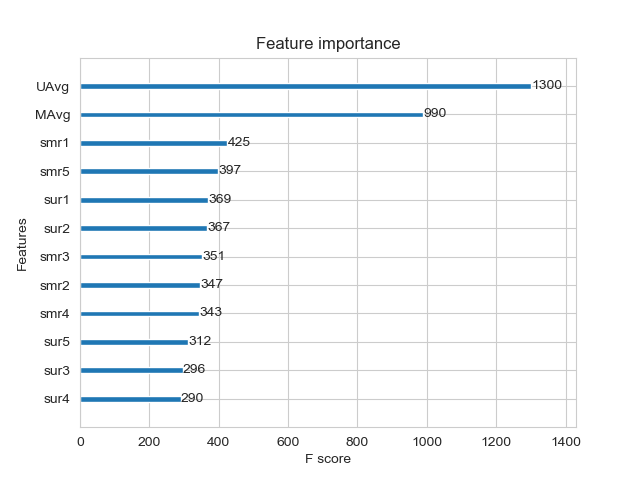

In [74]:
# prepare Train data
x_train = reg_train.drop(['user','movie','rating'], axis=1)
y_train = reg_train['rating']

# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# initialize Our first XGBoost model...
first_xgb = xgb.XGBRegressor(silent=False, n_jobs=13, random_state=15, n_estimators=100)
train_results, test_results = run_xgboost(first_xgb, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['first_algo'] = train_results
models_evaluation_test['first_algo'] = test_results

xgb.plot_importance(first_xgb)
plt.show()

<h3> 4.4.2 Suprise BaselineModel </h3>
    


In [78]:
from surprise import BaselineOnly 

__Predicted_rating : ( baseline prediction ) __

    -  http://surprise.readthedocs.io/en/stable/basic_algorithms.html#surprise.prediction_algorithms.baseline_only.BaselineOnly 
 >$   \large {\hat{r}_{ui} = b_{ui} =\mu + b_u + b_i} $


- $\pmb \mu $ : Average of all trainings in training data.
- $\pmb b_u$ : User bias
- $\pmb b_i$ : Item bias (movie biases) 

__Optimization function ( Least Squares Problem ) __

    - http://surprise.readthedocs.io/en/stable/prediction_algorithms.html#baselines-estimates-configuration 

> $ \large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - (\mu + b_u + b_i)\right)^2 +
\lambda \left(b_u^2 + b_i^2 \right).\text {        [mimimize } {b_u, b_i]}$ 

In [79]:

# options are to specify.., how to compute those user and item biases
bsl_options = {'method': 'sgd',
               'learning_rate': .001
               }
bsl_algo = BaselineOnly(bsl_options=bsl_options)
# run this algorithm.., It will return the train and test results..
bsl_train_results, bsl_test_results = run_surprise(my_bsl_algo, trainset, testset, verbose=True)


# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['bsl_algo'] = bsl_train_results 
models_evaluation_test['bsl_algo'] = bsl_test_results

NameError: name 'my_bsl_algo' is not defined

<h3> 4.4.3 XGBoost with initial 13 features + Surprise Baseline predictor </h3>

__Updating Train Data__

In [80]:
# add our baseline_predicted value as our feature..
reg_train['bslpr'] = models_evaluation_train['bsl_algo']['predictions']
reg_train.head(2) 

KeyError: 'bsl_algo'

__Updating Test Data__

In [81]:
# add that baseline predicted ratings with Surprise to the test data as well
reg_test_df['bslpr']  = models_evaluation_test['bsl_algo']['predictions']

reg_test_df.head(2)

KeyError: 'bsl_algo'

Training the model..
[12:20:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Done. Time taken : 0:00:10.337007

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753088001076312
MAPE :  35.482585866416905


<IPython.core.display.Javascript object>


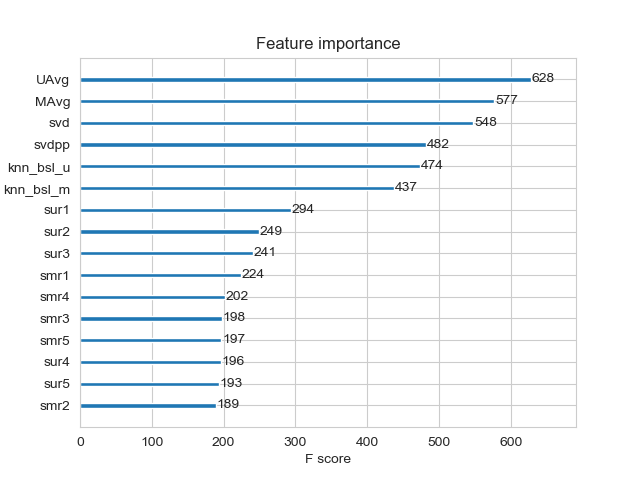

In [109]:
# prepare train data
x_train = reg_train.drop(['user', 'movie','rating'], axis=1)
y_train = reg_train['rating']

# Prepare Test data
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# initialize Our first XGBoost model...
xgb_bsl = xgb.XGBRegressor(silent=False, n_jobs=13, random_state=15, n_estimators=100)
train_results, test_results = run_xgboost(xgb_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_bsl'] = train_results
models_evaluation_test['xgb_bsl'] = test_results

xgb.plot_importance(xgb_bsl)
plt.show()


<h3> 4.4.4 Surprise KNNBaseline predictor </h3>

In [83]:
from surprise import KNNBaseline

- KNN BASELINE
    - http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNBaseline 

- PEARSON_BASELINE SIMILARITY
    - http://surprise.readthedocs.io/en/stable/similarities.html#surprise.similarities.pearson_baseline 

- SHRINKAGE
    - _2.2 Neighborhood Models_ in http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf 

- __predicted Rating__ : ( ___ based on User-User similarity ___ )

\begin{align} \hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{v \in N^k_i(u)}
\text{sim}(u, v) \cdot (r_{vi} - b_{vi})} {\sum\limits_{v \in
N^k_i(u)} \text{sim}(u, v)} \end{align}

- $\pmb{b_{ui}}$ -  _Baseline prediction_ of (user,movie) rating

- $ \pmb {N_i^k (u)}$ - Set of __K similar__ users (neighbours) of __user (u)__ who rated __movie(i)__  

- _sim (u, v)_ - __Similarity__ between users __u and v__  
    - Generally, it will be cosine similarity or Pearson correlation coefficient. 
    - But we use __shrunk Pearson-baseline correlation coefficient__, which is based on the pearsonBaseline similarity ( we take base line predictions instead of mean rating of user/item)
       

- __ Predicted rating __ ( based on Item Item similarity ):
 \begin{align} \hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{j \in N^k_u(i)}\text{sim}(i, j) \cdot (r_{uj} - b_{uj})} {\sum\limits_{j \in N^k_u(j)} \text{sim}(i, j)} \end{align}

    -  ___Notations follows same as above (user user based predicted rating ) ___

  <h4> 4.4.4.1 Surprise KNNBaseline with user user similarities</h4>

In [84]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm
sim_options = {'user_based' : True,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'} 

knn_bsl_u = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)
knn_bsl_u_train_results, knn_bsl_u_test_results = run_surprise(knn_bsl_u, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['knn_bsl_u'] = knn_bsl_u_train_results 
models_evaluation_test['knn_bsl_u'] = knn_bsl_u_test_results


Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:00:33.067630 

Evaluating the model with train data..
time taken : 0:01:23.428433
---------------
Train Data
---------------
RMSE : 0.33642097416508826

MAPE : 9.145093375416348

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.054853
---------------
Test Data
---------------
RMSE : 1.0726493739667242

MAPE : 35.02094499698424

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:01:56.550916


<h4> 4.4.4.2 Surprise KNNBaseline with movie movie similarities</h4>

In [85]:
# we specify , how to compute similarities and what to consider with sim_options to our algorithm

# 'user_based' : Fals => this considers the similarities of movies instead of users

sim_options = {'user_based' : False,
               'name': 'pearson_baseline',
               'shrinkage': 100,
               'min_support': 2
              } 
# we keep other parameters like regularization parameter and learning_rate as default values.
bsl_options = {'method': 'sgd'}


knn_bsl_m = KNNBaseline(k=40, sim_options = sim_options, bsl_options = bsl_options)

knn_bsl_m_train_results, knn_bsl_m_test_results = run_surprise(knn_bsl_m, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['knn_bsl_m'] = knn_bsl_m_train_results 
models_evaluation_test['knn_bsl_m'] = knn_bsl_m_test_results


Training the model...
Estimating biases using sgd...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Done. time taken : 0:00:01.166029 

Evaluating the model with train data..
time taken : 0:00:08.007161
---------------
Train Data
---------------
RMSE : 0.32584796251610554

MAPE : 8.447062581998374

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.057877
---------------
Test Data
---------------
RMSE : 1.072758832653683

MAPE : 35.02269653015042

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:09.232030


<h3> 4.4.5 XGBoost with initial 13 features + Surprise Baseline predictor + KNNBaseline predictor </h3>

- - - First we will run XGBoost with predictions from both KNN's ( that uses User\_User and Item\_Item similarities along with our previous features.

 
- - - Then we will run XGBoost with just predictions form both knn models and preditions from our baseline model. 

__Preparing Train data __

In [86]:
# add the predicted values from both knns to this dataframe
reg_train['knn_bsl_u'] = models_evaluation_train['knn_bsl_u']['predictions']
reg_train['knn_bsl_m'] = models_evaluation_train['knn_bsl_m']['predictions']

reg_train.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,knn_bsl_u,knn_bsl_m
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4,3.93002,3.867958
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3,3.17733,3.076302


__Preparing Test data  __

In [87]:
reg_test_df['knn_bsl_u'] = models_evaluation_test['knn_bsl_u']['predictions']
reg_test_df['knn_bsl_m'] = models_evaluation_test['knn_bsl_m']['predictions']

reg_test_df.head(2)

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,knn_bsl_u,knn_bsl_m
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.581679,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.581679,3.581679


Training the model..
Done. Time taken : 0:00:10.347436

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753088001076312
MAPE :  35.482585866416905


<IPython.core.display.Javascript object>


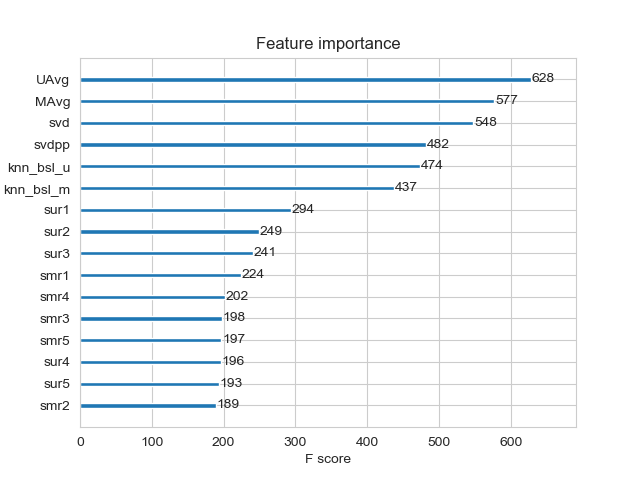

In [110]:
# prepare the train data....
x_train = reg_train.drop(['user', 'movie', 'rating'], axis=1)
y_train = reg_train['rating']

# prepare the train data....
x_test = reg_test_df.drop(['user','movie','rating'], axis=1)
y_test = reg_test_df['rating']

# declare the model
xgb_knn_bsl = xgb.XGBRegressor(n_jobs=10, random_state=15)
train_results, test_results = run_xgboost(xgb_knn_bsl, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_knn_bsl'] = train_results
models_evaluation_test['xgb_knn_bsl'] = test_results


xgb.plot_importance(xgb_knn_bsl)
plt.show()

<h3> 4.4.6 Matrix Factorization Techniques </h3>

<h4> 4.4.6.1 SVD Matrix Factorization User Movie intractions </h4>

In [89]:
from surprise import SVD

http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVD 

- __ Predicted Rating : __
    - 
    - $ \large  \hat r_{ui} = \mu + b_u + b_i + q_i^Tp_u $
    
        - $\pmb q_i$ - Representation of item(movie) in latent factor space
        
        - $\pmb p_u$ - Representation of user in new latent factor space
        


- A BASIC MATRIX FACTORIZATION MODEL in  https://datajobs.com/data-science-repo/Recommender-Systems-[Netflix].pdf

- __Optimization problem with user item interactions and regularization (to avoid overfitting)__
    - 
    - $\large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2\right) $

In [90]:
# initiallize the model
svd = SVD(n_factors=100, biased=True, random_state=15, verbose=True)
svd_train_results, svd_test_results = run_surprise(svd, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation data structure
models_evaluation_train['svd'] = svd_train_results 
models_evaluation_test['svd'] = svd_test_results

Training the model...
Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Done. time taken : 0:00:06.236224 

Evaluating the model with train data..
time taken : 0:00:01.011616
---------------
Train Data
---------------
RMSE : 0.6574721240954099

MAPE : 19.704901088660478

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.045878
---------------
Test Data
---------------
RMSE : 1.0726046873826458

MAPE : 35.01953535988152

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:00:07.293718


  <h4> 4.4.6.2 SVD Matrix Factorization with implicit feedback from user ( user rated movies ) </h4>

In [91]:
from surprise import SVDpp

- ----->  2.5 Implicit Feedback in http://courses.ischool.berkeley.edu/i290-dm/s11/SECURE/a1-koren.pdf

- __ Predicted Rating : __
    - 
    - $ \large \hat{r}_{ui} = \mu + b_u + b_i + q_i^T\left(p_u +
    |I_u|^{-\frac{1}{2}} \sum_{j \in I_u}y_j\right) $ 

 - $ \pmb{I_u}$ --- the set of all items rated by user u

- $\pmb{y_j}$ --- Our new set of item factors that capture implicit ratings.  

- __Optimization problem with user item interactions and regularization (to avoid overfitting)__
    - 
    - $ \large \sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2 + ||y_j||^2\right) $ 

In [92]:
# initiallize the model
svdpp = SVDpp(n_factors=50, random_state=15, verbose=True)
svdpp_train_results, svdpp_test_results = run_surprise(svdpp, trainset, testset, verbose=True)

# Just store these error metrics in our models_evaluation datastructure
models_evaluation_train['svdpp'] = svdpp_train_results 
models_evaluation_test['svdpp'] = svdpp_test_results


Training the model...
 processing epoch 0
 processing epoch 1
 processing epoch 2
 processing epoch 3
 processing epoch 4
 processing epoch 5
 processing epoch 6
 processing epoch 7
 processing epoch 8
 processing epoch 9
 processing epoch 10
 processing epoch 11
 processing epoch 12
 processing epoch 13
 processing epoch 14
 processing epoch 15
 processing epoch 16
 processing epoch 17
 processing epoch 18
 processing epoch 19
Done. time taken : 0:01:39.590465 

Evaluating the model with train data..
time taken : 0:00:04.712395
---------------
Train Data
---------------
RMSE : 0.6032438403305899

MAPE : 17.49285063490268

adding train results in the dictionary..

Evaluating for test data...
time taken : 0:00:00.046925
---------------
Test Data
---------------
RMSE : 1.0728491944183447

MAPE : 35.03817913919887

storing the test results in test dictionary...

---------------------------------------------
Total time taken to run this algorithm : 0:01:44.350782


<h3> 4.4.7 XgBoost with 13 features + Surprise Baseline + Surprise KNNbaseline + MF Techniques </h3>

__Preparing Train data__

In [93]:
# add the predicted values from both knns to this dataframe
reg_train['svd'] = models_evaluation_train['svd']['predictions']
reg_train['svdpp'] = models_evaluation_train['svdpp']['predictions']

reg_train.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,knn_bsl_u,knn_bsl_m,svd,svdpp
0,53406,33,3.581679,4.0,5.0,5.0,4.0,1.0,5.0,2.0,5.0,3.0,1.0,3.370370,4.092437,4,3.93002,3.867958,4.303764,3.621664
1,99540,33,3.581679,5.0,5.0,5.0,4.0,5.0,3.0,4.0,4.0,3.0,5.0,3.555556,4.092437,3,3.17733,3.076302,3.278967,3.538247


__Preparing Test data  __

In [94]:
reg_test_df['svd'] = models_evaluation_test['svd']['predictions']
reg_test_df['svdpp'] = models_evaluation_test['svdpp']['predictions']

reg_test_df.head(2) 

,user,movie,GAvg,sur1,sur2,sur3,sur4,sur5,smr1,smr2,smr3,smr4,smr5,UAvg,MAvg,rating,knn_bsl_u,knn_bsl_m,svd,svdpp
0,808635,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,5,3.581679,3.581679,3.581679,3.581679
1,941866,71,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,3.581679,4,3.581679,3.581679,3.581679,3.581679


Training the model..
Done. Time taken : 0:00:10.349406

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0753088001076312
MAPE :  35.482585866416905


<IPython.core.display.Javascript object>


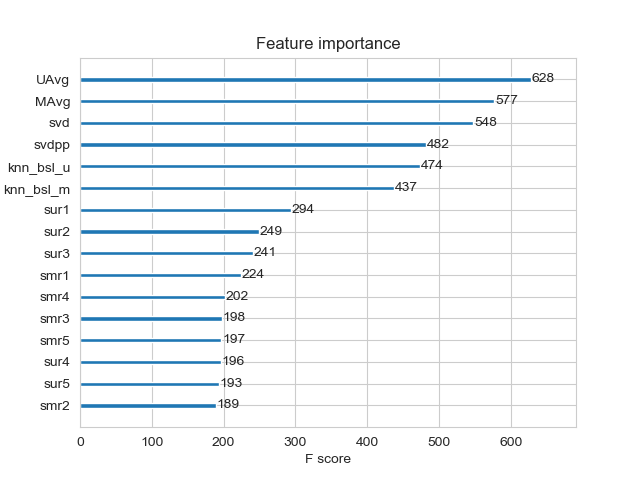

In [111]:
# prepare x_train and y_train
x_train = reg_train.drop(['user', 'movie', 'rating',], axis=1)
y_train = reg_train['rating']

# prepare test data
x_test = reg_test_df.drop(['user', 'movie', 'rating'], axis=1)
y_test = reg_test_df['rating']



xgb_final = xgb.XGBRegressor(n_jobs=10, random_state=15)
train_results, test_results = run_xgboost(xgb_final, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_final'] = train_results
models_evaluation_test['xgb_final'] = test_results


xgb.plot_importance(xgb_final)
plt.show()

<h3> 4.4.8 XgBoost with Surprise Baseline + Surprise KNNbaseline + MF Techniques </h3>

Training the model..
Done. Time taken : 0:00:08.112924

Done 

Evaluating the model with TRAIN data...
Evaluating Test data

TEST DATA
------------------------------
RMSE :  1.0758207642755726
MAPE :  34.98203479380461


<IPython.core.display.Javascript object>


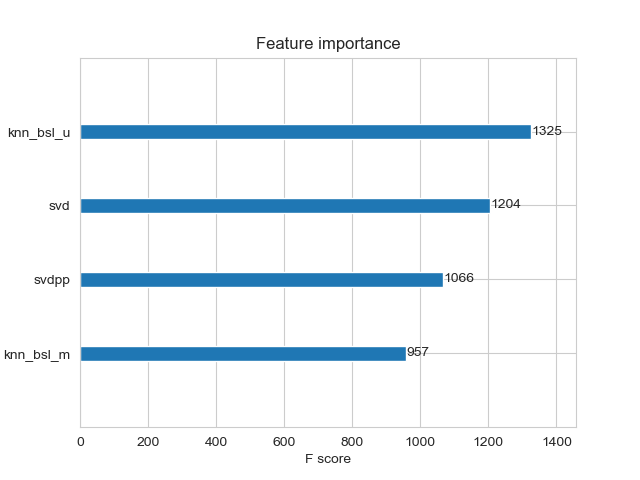

In [112]:
# prepare train data
x_train = reg_train[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_train = reg_train['rating']

# test data
x_test = reg_test_df[['knn_bsl_u', 'knn_bsl_m', 'svd', 'svdpp']]
y_test = reg_test_df['rating']


xgb_all_models = xgb.XGBRegressor(n_jobs=10, random_state=15)
train_results, test_results = run_xgboost(xgb_all_models, x_train, y_train, x_test, y_test)

# store the results in models_evaluations dictionaries
models_evaluation_train['xgb_all_models'] = train_results
models_evaluation_test['xgb_all_models'] = test_results

xgb.plot_importance(xgb_all_models)
plt.show()

<h2> 4.5 Comparision between all models </h2>

In [97]:
# Saving our TEST_RESULTS into a dataframe so that you don't have to run it again
pd.DataFrame(models_evaluation_test).to_csv('small_sample_results.csv')
models = pd.read_csv('small_sample_results.csv', index_col=0)
models.loc['rmse'].sort_values()

svd               1.0726046873826458
knn_bsl_u         1.0726493739667242
knn_bsl_m          1.072758832653683
svdpp             1.0728491944183447
xgb_final         1.0753088001076312
xgb_all_models    1.0758207642755726
first_algo        1.1016770831525975
xgb_bsl           1.1016770831525975
xgb_knn_bsl       1.1025510695074203
Name: rmse, dtype: object

In [98]:
print("-"*100)
print("Total time taken to run this entire notebook ( with saved files) is :",datetime.now()-globalstart)

----------------------------------------------------------------------------------------------------


NameError: name 'globalstart' is not defined